<a href="https://colab.research.google.com/github/mvadrev/coviScan/blob/main/Pedalboard_Transforms.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
# coviScan v3 #

# -------------- Change log ----------------------------------------
# Audio is now transformed with Spotify's PedalBoard library reverb resulting in 2x
# 3x Upsampling using multiple mel filters 
# Majority class undersampling 
# Minority class over sampling using SMOTE
# Over all the dataset is was increased by 6xusing various transformation methods 
# Image based noise not included in this release to further upsample dataset 

In [1]:
!pip install timm https://github.com/ufoym/imbalanced-dataset-sampler/archive/master.zip
!pip install lime
!pip install timm https://github.com/ufoym/imbalanced-dataset-sampler/archive/master.zip
!pip install pydub
!pip install pedalboard


     \ 297 kB 6.6 MB/s
     |████████████████████████████████| 431 kB 6.9 MB/s 
  Created wheel for torchsampler: filename=torchsampler-0.1.1-py3-none-any.whl size=3838 sha256=e2e96e9766bdc07e760beb141b56fa7136bd4397573b3b5aeac0dcf4a28b0e8f
  Stored in directory: /tmp/pip-ephem-wheel-cache-adgzr__l/wheels/52/7b/7d/ce0e0ddbb7864877a0e31a96f883a928791ebfa6eaf7b52f87
Successfully built torchsampler
     |████████████████████████████████| 275 kB 5.3 MB/s 
  Created wheel for lime: filename=lime-0.2.0.1-py3-none-any.whl size=283857 sha256=709e6950f02123c90338ce604ab7e0432fea814a735b1f539d1b97dd0f94fea2
  Stored in directory: /root/.cache/pip/wheels/ca/cb/e5/ac701e12d365a08917bf4c6171c0961bc880a8181359c66aa7
Successfully built lime
  Using cached https://github.com/ufoym/imbalanced-dataset-sampler/archive/master.zip
     |████████████████████████████████| 5.0 MB 7.1 MB/s 


In [ ]:
!git clone https://github.com/iiscleap/Coswara-Data.git
%cd Coswara-Data

# Instructions
# You need Google Colab Pro to run this
# Upload the Provided csv file along before running shuttling operations
# Plz run on GPU only
# This takes very long to run. You have to download the dataset > extract  > Preprocess > Reorder > Download pretrained models > Train > Inference

# References
#https://github.com/pytorch/audio/issues/1023
# https://www.fatalerrors.org/a/0N112TE.html
# https://colab.research.google.com/drive/172TfOusbVN4y6f3sZGgTovSpVA53Aa9u?usp=sharing
#https://www.kaggle.com/sreevishnudamodaran/siim-covid19-fastai-efficientnetv2-timm 
# # https://github.com/rwightman/pytorch-image-models
# https://medium.com/geekculture/train-a-pytorch-efficientnet-model-for-medical-diagnosis-1d000c540bd

Cloning into 'Coswara-Data'...
remote: Enumerating objects: 798, done.


In [ ]:
!python extract_data.py

In [ ]:
!mkdir /content/data /content/data/positive /content/data/healthy

In [ ]:
!rm -r /content/data3/healthy

In [ ]:
!rm -r /content/data3/positive

In [ ]:
import os
import pandas as pd
actual_files_list = os.listdir('/content/Coswara-Data/Extracted_data')
#Upload csv before running this 
df = pd.read_csv('/content/sheet.csv')
import shutil

In [ ]:
df.head

<bound method NDFrame.head of                                 id covid_status
0     iV3Db6t1T8b7c5HQY2TwxIhjbzD3      healthy
1     AxuYWBN0jFVLINCBqIW5aZmGCdu1      healthy
2     C5eIsssb9GSkaAgIfsHMHeR6fSh1      healthy
3     YjbEAECMBIaZKyfqOvWy5DDImUb2      healthy
4     aGOvk4ji0cVqIzCs1jHnzlw2UEy2      healthy
...                            ...          ...
2109  333NjqA1TfZJuICEdXSkPhVz0LA3     positive
2110  dpA0EeRrtJUeKJjEuf7BL0AeTJZ2     positive
2111  UXhG3vgoxkWtd4Meky1nm0sRgMV2     positive
2112  A5KW9PXraNgckln1gnNaJnX6DvB2     positive
2113  iYwmYc9CdlSuzqGwIlXNWI6eFpm1     positive

[2114 rows x 2 columns]>

In [ ]:
df['covid_status']

0        healthy
1        healthy
2        healthy
3        healthy
4        healthy
          ...   
2109    positive
2110    positive
2111    positive
2112    positive
2113    positive
Name: covid_status, Length: 2114, dtype: object

In [ ]:
df.groupby('covid_status').count()
# https://stackoverflow.com/questions/22391433/count-the-frequency-that-a-value-occurs-in-a-dataframe-column

,id
covid_status,
healthy,1433
positive,681


In [ ]:
# This script finds all positive and healthy files from the coswara dataset related to only cough and places it in a new folder: data/healthy, data/positive 
import glob
import shutil
import numpy as np 
from os import path
from pydub import AudioSegment
from pathlib import Path
import tqdm
for i in range(len(actual_files_list)):
  # print(actual_files_list[i])
  subLevelList = os.listdir('/content/Coswara-Data/Extracted_data/' + actual_files_list[i])

  for j in range(len(subLevelList)):
    print("processing sublevel...",subLevelList[j])
    if(subLevelList[j] in df['id'].to_numpy()):
      print("found at", str(subLevelList[j]))
      infexOfFound = np.where(df['id'] == str(subLevelList[j]))[0][0]
      print("the index is at", infexOfFound)
      covid_status = df['covid_status'][infexOfFound]
      print(covid_status)
      # skip .dsi files 
      if (subLevelList[j].startswith('.') or subLevelList[j].endswith('.csv')):
        pass
      else:
        innerList = os.listdir('/content/Coswara-Data/Extracted_data/' + actual_files_list[i] + '/' + subLevelList[j])
        print("processing inner list files", innerList)
        # process positive
        if(covid_status == 'positive'):
          # copy cough-heavy 
          positiveErrorCases = []
          healthyErrorCases = []
          try:
            shutil.copy('/content/Coswara-Data/Extracted_data/' + actual_files_list[i] + '/' + subLevelList[j] + '/' + 'cough-heavy.wav' , '/content/data/positive/' + subLevelList[j] + '_' + 'cough-heavy.wav' )
            #copy cough-shallow
            shutil.copy('/content/Coswara-Data/Extracted_data/' + actual_files_list[i] + '/' + subLevelList[j] + '/' + 'cough-shallow.wav' , '/content/data/positive/' + subLevelList[j] + '_' + 'cough-shallow.wav')
          except:
            print("failed....")
            # positiveErrorCases.append(actual_files_list[i] + '_' + subLevelList[j])

          
        # process negative 
        if(covid_status == 'healthy'):
          try:
            # copy cough-heavy
            shutil.copy('/content/Coswara-Data/Extracted_data/' + actual_files_list[i] + '/' + subLevelList[j] + '/' + 'cough-heavy.wav', '/content/data/healthy/' + subLevelList[j] + '_' + 'cough-heavy.wav' )
            #copy cough-shallow
            shutil.copy('/content/Coswara-Data/Extracted_data/' + actual_files_list[i] + '/' + subLevelList[j] + '/' + 'cough-shallow.wav', '/content/data/healthy/' + subLevelList[j] + '_' + 'cough-shallow.wav')
          except:
            print("failed....")
            # healthyErrorCases.append(actual_files_list[i] + '_' + subLevelList[j])
        
    

Streaming output truncated to the last 5000 lines.
processing inner list files ['vowel-e.wav', 'counting-normal.wav', 'vowel-a.wav', 'cough-shallow.wav', 'counting-fast.wav', 'cough-heavy.wav', 'metadata.json', 'breathing-deep.wav', 'breathing-shallow.wav', 'vowel-o.wav']
processing sublevel... ck8pNfygbfardUsaoS2NNVvMTt83
found at ck8pNfygbfardUsaoS2NNVvMTt83
the index is at 400
healthy
processing inner list files ['vowel-e.wav', 'counting-normal.wav', 'vowel-a.wav', 'cough-shallow.wav', 'counting-fast.wav', 'cough-heavy.wav', 'metadata.json', 'breathing-deep.wav', 'breathing-shallow.wav', 'vowel-o.wav']
processing sublevel... tAqfUCGTWKdgIF95SfZU0gtLPZt1
found at tAqfUCGTWKdgIF95SfZU0gtLPZt1
the index is at 418
healthy
processing inner list files ['vowel-e.wav', 'counting-normal.wav', 'vowel-a.wav', 'cough-shallow.wav', 'counting-fast.wav', 'cough-heavy.wav', 'metadata.json', 'breathing-deep.wav', 'breathing-shallow.wav', 'vowel-o.wav']
processing sublevel... HHKpf1D4mWga1lxwcxAQjZAq

In [ ]:
len(os.listdir('/content/data/healthy'))

2865

In [ ]:
len(os.listdir('/content/data/positive'))

1362

In [ ]:
!rm -r /content/data3/healthy/* /content/data3/positive/*

rm: cannot remove '/content/data3/positive/*': No such file or directory


In [ ]:
len(pd.read_csv('/content/Coswara-Data/combined_data.csv'))


2746

In [ ]:
# Create data2 dir for undesampled subset
!mkdir /content/data2 /content/data2/positive /content/data2/healthy

In [ ]:
# Since positive class is 1044 and healthy is more ir 2374, we are undersampling  the healthy class to be 1044 as well.  and copying into new folder
from sklearn.model_selection import train_test_split
import os 
import random
from tqdm import tqdm
import numpy as np
import glob
import pandas as pd


h_list = len(os.listdir('/content/data/healthy'))
p_list = len(os.listdir('/content/data/positive'))

def undersample(in_path, out_path, desiredSamples):
    onlyList =  os.listdir(in_path)
    underSampledList = os.listdir(in_path)[ 1384 :  ]
    print(len(underSampledList))
    for i in tqdm(range(len(underSampledList))):
        shutil.copy(in_path +  "/" + underSampledList[i],out_path + "/" + underSampledList[i] )
    print("finished undersampling!")

In [ ]:
# Run undersampling
undersample('/content/data/healthy', '/content/data2/healthy', 1362)

1481


100%|██████████| 1481/1481 [00:02<00:00, 573.26it/s]

finished undersampling!


In [ ]:
# Since positive class is 1044 and healthy is more ir 2374, we are undersampling  the healthy class to be 1044 as well.  and copying into new folder
from sklearn.model_selection import train_test_split
import os 
import random
from tqdm import tqdm
import numpy as np
import glob
import pandas as pd


h_list = len(os.listdir('/content/data/healthy'))
p_list = len(os.listdir('/content/data/positive'))

def undersample(in_path, out_path, desiredSamples):
    onlyList =  os.listdir(in_path)
    underSampledList = os.listdir(in_path)[ : desiredSamples ]
    print(len(underSampledList))
    for i in tqdm(range(len(underSampledList))):
        shutil.copy(in_path +  "/" + underSampledList[i],out_path + "/" + underSampledList[i] )
    print("finished undersampling!")

In [ ]:
# undersampling function can also be used to copy files to requred dir by simply setting desired samples to total directory content length 
undersample('/content/data/positive', '/content/data2/positive', 1362)

1362


100%|██████████| 1362/1362 [00:02<00:00, 623.20it/s]

finished undersampling!


In [ ]:
# check dataset sizes after doing undersampling 
print(len(os.listdir('/content/data2/positive')), len(os.listdir('/content/data2/healthy')))

1362 1481


In [ ]:
import os
from pathlib import Path
import shutil

import librosa
import librosa.display
import numpy as np
import tqdm
from matplotlib import pyplot as plt
from PIL import Image

# https://stackoverflow.com/questions/56719138/how-can-i-save-a-librosa-spectrogram-plot-as-a-specific-sized-image/57204349
def scale_minmax(X, min=0.0, max=1.0):
    X_std = (X - X.min()) / (X.max() - X.min())
    X_scaled = X_std * (max - min) + min
    return X_scaled


def extract_spectrogram_image(file_path, out_path, sr=22050, time_steps=384,
                              duration=5, hop_length=512, n_mels=128):
    y, sr = librosa.load(file_path, duration=duration, sr=sr)

    # extract a fixed length window
    start_sample = 0  # starting at beginning
    length_samples = time_steps*hop_length
    window = y[start_sample:start_sample+length_samples]

    # use log-melspectrogram
    mels = librosa.feature.melspectrogram(y=window, sr=sr, n_mels=n_mels,
                                            n_fft=hop_length*2, hop_length=hop_length)
    mels = np.log(mels + 1e-9)  # add small number to avoid log(0)

    # min-max scale to fit inside 8-bit range
    img = scale_minmax(mels, 0, 255).astype(np.uint8)
    img = np.flip(img, axis=0) # put low frequencies at the bottom in image
    img = 255 - img # invert. make black==more energy

    # save as PNG
    # skimage.io.imsave(out, img)
    Image.fromarray(img).save(out_path)
    print("saved!!!!")



In [ ]:
!mkdir /content/data3 /content/data3/positive /content/data3/healthy

In [ ]:
# convert healthy
out_dir = '/content/data3/healthy'

data_dir = '/content/data2/healthy'

audio_files = os.listdir(data_dir)

mono = True
duration = 30
sr = 22050
n_mels = 128  # The height
time_steps = 384  # The width
hop_length = 512
error_cases = []
for file_path in tqdm.tqdm(range(len(audio_files))):
    aud_file_path = str(audio_files[file_path])
    print("The file being processed is", '/content/data2/healthy/' + audio_files[file_path])
    try:
        extract_spectrogram_image('/content/data2/healthy/' + aud_file_path, out_dir + '/' + aud_file_path + '.png', sr, time_steps, 30, hop_length, n_mels) 
    except Exception as e:
        print(f'Failed while processing {file_path} with exception: {e}')
        # error_cases.append(user_id)
        # shutil.rmtree(out_user_dir)

  0%|          | 0/1481 [00:00<?, ?it/s]

The file being processed is /content/data2/healthy/CGGk5Y7thvXSCYhDX0e4yPN7g5R2_cough-shallow.wav


  0%|          | 2/1481 [00:01<13:24,  1.84it/s]

saved!!!!
The file being processed is /content/data2/healthy/YLjbjcoMy1bCh25iChGjXXTc8RK2_cough-heavy.wav
saved!!!!
The file being processed is /content/data2/healthy/IkwAlxsvmhXfpi9seBDU6rksY7C2_cough-shallow.wav


  0%|          | 4/1481 [00:01<07:41,  3.20it/s]

saved!!!!
The file being processed is /content/data2/healthy/LCa0jYXkxJZ7JUJC262jrqy0Zao2_cough-heavy.wav
saved!!!!
The file being processed is /content/data2/healthy/FNYQayw5zNMsebNuKCkLRlK9A4k2_cough-shallow.wav


  0%|          | 6/1481 [00:02<06:22,  3.85it/s]

saved!!!!
The file being processed is /content/data2/healthy/XlPcBLOUHdNZwOeNJvVy1KfjQDf2_cough-shallow.wav
saved!!!!
The file being processed is /content/data2/healthy/PzAQz6zDDcPbdSePDK02jGd4Rm42_cough-heavy.wav


  0%|          | 7/1481 [00:02<06:23,  3.84it/s]

saved!!!!
The file being processed is /content/data2/healthy/ZiwS2q40gsX5X7pMp0y30PUFpE93_cough-shallow.wav


  1%|          | 8/1481 [00:02<06:32,  3.75it/s]

saved!!!!
The file being processed is /content/data2/healthy/yeo7HwJ5Dcbqc4ozwv6az8iRVTJ3_cough-shallow.wav


  1%|          | 10/1481 [00:03<05:40,  4.32it/s]

saved!!!!
The file being processed is /content/data2/healthy/zOmz0TaNdmQfF2jUFkqUKuNa80m1_cough-heavy.wav
saved!!!!
The file being processed is /content/data2/healthy/bixijc4LCCRqES9K306RjUCIHsJ2_cough-shallow.wav


  1%|          | 11/1481 [00:03<05:41,  4.30it/s]

saved!!!!
The file being processed is /content/data2/healthy/X7NBHQKdeDODKCzXwbmKdIbjIRG2_cough-heavy.wav


  1%|          | 12/1481 [00:03<06:20,  3.86it/s]

saved!!!!
The file being processed is /content/data2/healthy/Hb9DrqUzdCfKOQWYs4T85y3S3Rl1_cough-heavy.wav


  1%|          | 13/1481 [00:03<06:16,  3.90it/s]

saved!!!!
The file being processed is /content/data2/healthy/wByjVbPfagQsv9nerwycE1QDQ5B3_cough-heavy.wav


  1%|          | 14/1481 [00:04<06:42,  3.64it/s]

saved!!!!
The file being processed is /content/data2/healthy/LC266EVhXoa7KP4o3naQ6oZczml1_cough-heavy.wav


  1%|          | 15/1481 [00:04<07:01,  3.48it/s]

saved!!!!
The file being processed is /content/data2/healthy/SY4Ekt5W4VZdeIm5r3iLmjxz9pA2_cough-heavy.wav


  1%|          | 16/1481 [00:04<07:06,  3.44it/s]

saved!!!!
The file being processed is /content/data2/healthy/4gkSRZ0IWxVAOJSuVEFhQqrzIYx1_cough-heavy.wav


  1%|          | 17/1481 [00:05<06:36,  3.69it/s]

saved!!!!
The file being processed is /content/data2/healthy/FtDju4lrx4PqJCMCo9zctj7IFnV2_cough-shallow.wav


  1%|          | 18/1481 [00:05<06:51,  3.56it/s]

saved!!!!
The file being processed is /content/data2/healthy/hmqyX7Xq7gMmLDSmb7MtmLc92R93_cough-heavy.wav


  1%|▏         | 20/1481 [00:05<06:17,  3.87it/s]

saved!!!!
The file being processed is /content/data2/healthy/MnRYYa6FN4VLwxLmTCQ05UPqmsW2_cough-shallow.wav
saved!!!!
The file being processed is /content/data2/healthy/KXQDb2qDnpTQTTqx3JivfvB8zz83_cough-heavy.wav


  1%|▏         | 21/1481 [00:06<06:35,  3.69it/s]

saved!!!!
The file being processed is /content/data2/healthy/FA82s56D4CP2QAkUpv7Zlbz95NW2_cough-shallow.wav


  1%|▏         | 22/1481 [00:06<06:36,  3.68it/s]

saved!!!!
The file being processed is /content/data2/healthy/nwXAgQmOEVRx6dZqQzc0GdmNSx22_cough-shallow.wav


  2%|▏         | 23/1481 [00:06<06:27,  3.76it/s]

saved!!!!
The file being processed is /content/data2/healthy/dZvjWWbzA8ZHagEibhMy4sJdd1n2_cough-shallow.wav


  2%|▏         | 24/1481 [00:07<06:57,  3.49it/s]

saved!!!!
The file being processed is /content/data2/healthy/1kXfAOTvLBbCCcTBJOrHUFzARSo1_cough-heavy.wav


  2%|▏         | 25/1481 [00:07<07:00,  3.46it/s]

saved!!!!
The file being processed is /content/data2/healthy/EZzVAG1b5ef8VopTkIROvVbYGml1_cough-shallow.wav


  2%|▏         | 26/1481 [00:07<06:50,  3.54it/s]

saved!!!!
The file being processed is /content/data2/healthy/y3xOwlrqS3QhFVHCYnzJfCN0I8F2_cough-heavy.wav


  2%|▏         | 27/1481 [00:07<06:15,  3.87it/s]

saved!!!!
The file being processed is /content/data2/healthy/GWjZnz8QWXXGzHLaG0HNHFyeZgS2_cough-heavy.wav


  2%|▏         | 28/1481 [00:08<07:26,  3.26it/s]

saved!!!!
The file being processed is /content/data2/healthy/2zAfpSxYt0O6Bl7qwUhicdCoyY42_cough-shallow.wav


  2%|▏         | 29/1481 [00:08<07:14,  3.34it/s]

saved!!!!
The file being processed is /content/data2/healthy/AbtlW73g2HUScOPZZQYMD7jRlkX2_cough-heavy.wav


  2%|▏         | 31/1481 [00:08<06:28,  3.73it/s]

saved!!!!
The file being processed is /content/data2/healthy/EBJVTXGpKucYUqz7evI887oS1162_cough-shallow.wav
saved!!!!
The file being processed is /content/data2/healthy/Hb9DrqUzdCfKOQWYs4T85y3S3Rl1_cough-shallow.wav


  2%|▏         | 32/1481 [00:09<06:11,  3.90it/s]

saved!!!!
The file being processed is /content/data2/healthy/j4xItLU4BzcKshmihayCM0pTooH3_cough-shallow.wav


  2%|▏         | 33/1481 [00:09<06:16,  3.85it/s]

saved!!!!
The file being processed is /content/data2/healthy/9LCBZHRlg3Nk6NMZHu7AZJ9Rju53_cough-shallow.wav


  2%|▏         | 34/1481 [00:09<07:04,  3.41it/s]

saved!!!!
The file being processed is /content/data2/healthy/gZzVS7gHpQYZS5Xk5P0O2noJRN82_cough-heavy.wav


  2%|▏         | 35/1481 [00:10<07:28,  3.23it/s]

saved!!!!
The file being processed is /content/data2/healthy/A6eyvPDHwBNMYFzA65XRMboV96s2_cough-shallow.wav


  2%|▏         | 36/1481 [00:10<06:48,  3.53it/s]

saved!!!!
The file being processed is /content/data2/healthy/W1c56dgBsoe34ilAX8vAZs8tNcX2_cough-shallow.wav


  2%|▏         | 37/1481 [00:10<06:38,  3.62it/s]

saved!!!!
The file being processed is /content/data2/healthy/XzIjEtRHHPci6Zq0zb9Lx0d6zEr2_cough-heavy.wav


  3%|▎         | 38/1481 [00:10<06:30,  3.69it/s]

saved!!!!
The file being processed is /content/data2/healthy/MnRYYa6FN4VLwxLmTCQ05UPqmsW2_cough-heavy.wav


  3%|▎         | 39/1481 [00:11<07:16,  3.30it/s]

saved!!!!
The file being processed is /content/data2/healthy/AWZWqZAsydRwCkb1CSCZTjiG1YD2_cough-heavy.wav


  3%|▎         | 40/1481 [00:11<07:17,  3.29it/s]

saved!!!!
The file being processed is /content/data2/healthy/VB3X18XtrRdSVJ8zDzdyKohlX2F2_cough-heavy.wav


  3%|▎         | 42/1481 [00:12<06:47,  3.53it/s]

saved!!!!
The file being processed is /content/data2/healthy/HIfH8OY3VQYcGEsFKVNh9m9qYer1_cough-shallow.wav
saved!!!!
The file being processed is /content/data2/healthy/aH6o5lYN6vh40RCFhfyBYjkQVH13_cough-heavy.wav


  3%|▎         | 43/1481 [00:12<07:55,  3.02it/s]

saved!!!!
The file being processed is /content/data2/healthy/WSwgjHhTOHQwKb5nreCV0KvGcar2_cough-heavy.wav


  3%|▎         | 44/1481 [00:12<07:56,  3.02it/s]

saved!!!!
The file being processed is /content/data2/healthy/ArKST1jJWqRPPvdCu92MyQoGs762_cough-shallow.wav


  3%|▎         | 45/1481 [00:13<07:42,  3.11it/s]

saved!!!!
The file being processed is /content/data2/healthy/JXP97RVyVfVXVqOPULghR8pY3q32_cough-heavy.wav


  3%|▎         | 46/1481 [00:13<07:25,  3.22it/s]

saved!!!!
The file being processed is /content/data2/healthy/eKGXsbhd2VOFGSoIhMH8SKaa6n12_cough-shallow.wav


  3%|▎         | 47/1481 [00:14<08:42,  2.74it/s]

saved!!!!
The file being processed is /content/data2/healthy/GrE7GAhI8UUX1BK0QHOBGLvOQJb2_cough-heavy.wav


  3%|▎         | 48/1481 [00:14<08:29,  2.81it/s]

saved!!!!
The file being processed is /content/data2/healthy/uiMtR0VGFIaO3CQ1Tl8znyjlyHF2_cough-heavy.wav


  3%|▎         | 49/1481 [00:14<07:52,  3.03it/s]

saved!!!!
The file being processed is /content/data2/healthy/D1d4hc9MrgTDxgAhqpTgqOEJtLp2_cough-heavy.wav


  3%|▎         | 50/1481 [00:14<07:04,  3.37it/s]

saved!!!!
The file being processed is /content/data2/healthy/JcnEWYQlvAc34RZ15oa1aIdxXmu2_cough-shallow.wav


  3%|▎         | 51/1481 [00:15<07:02,  3.39it/s]

saved!!!!
The file being processed is /content/data2/healthy/ubQOYCka4BUGeIeo6x3A9HYh8In2_cough-shallow.wav


  4%|▎         | 52/1481 [00:15<06:26,  3.69it/s]

saved!!!!
The file being processed is /content/data2/healthy/4w3GC0eRNVXJ4q4vRLphW9RIiQY2_cough-heavy.wav


  4%|▎         | 53/1481 [00:15<07:46,  3.06it/s]

saved!!!!
The file being processed is /content/data2/healthy/xO54amKmQMQwbMoSbmADa6Wa2kK2_cough-heavy.wav


  4%|▎         | 54/1481 [00:16<07:27,  3.19it/s]

saved!!!!
The file being processed is /content/data2/healthy/OPSRSPdvG3SJ42PhF7aFmCZcVpk1_cough-shallow.wav
saved!!!!
The file being processed is /content/data2/healthy/mdFe3i4I7haQAng2mO3CV1mJapt2_cough-heavy.wav


  4%|▍         | 56/1481 [00:16<05:59,  3.96it/s]

saved!!!!
The file being processed is /content/data2/healthy/ya3VviewxzdRZqbLrEXsIrvilRR2_cough-heavy.wav


  4%|▍         | 57/1481 [00:16<06:35,  3.60it/s]

saved!!!!
The file being processed is /content/data2/healthy/eqtebymPdFfBCm8B85n5oSR7Gja2_cough-shallow.wav


  4%|▍         | 58/1481 [00:17<06:35,  3.60it/s]

saved!!!!
The file being processed is /content/data2/healthy/9LGZxIxgbgSheKov7FzsNcFIu4v1_cough-shallow.wav


  4%|▍         | 60/1481 [00:17<05:41,  4.16it/s]

saved!!!!
The file being processed is /content/data2/healthy/FQ9gUWPXRGc9z7Q4f3tMojFVrR82_cough-shallow.wav
saved!!!!
The file being processed is /content/data2/healthy/vflTaeqGRDgNyjCbTvMt2dajbRX2_cough-heavy.wav


  4%|▍         | 62/1481 [00:17<04:27,  5.30it/s]

saved!!!!
The file being processed is /content/data2/healthy/D8gFH60PUrfFJEG2wXhvPCeTRCq1_cough-shallow.wav
saved!!!!
The file being processed is /content/data2/healthy/ajjbkAkwKDMcEEsiPxXiug5F8v03_cough-shallow.wav


  4%|▍         | 63/1481 [00:17<04:17,  5.51it/s]

saved!!!!
The file being processed is /content/data2/healthy/3Vqysidm4ihlWFBQPErMAClnMbu2_cough-shallow.wav


  4%|▍         | 64/1481 [00:18<05:11,  4.55it/s]

saved!!!!
The file being processed is /content/data2/healthy/OK2CZltrvfZbpTWB75LWMFqxfpM2_cough-heavy.wav


  4%|▍         | 65/1481 [00:18<06:22,  3.70it/s]

saved!!!!
The file being processed is /content/data2/healthy/gHDyWKwAjxPkdxg4hh1hElbzbbR2_cough-heavy.wav


  4%|▍         | 66/1481 [00:18<06:27,  3.65it/s]

saved!!!!
The file being processed is /content/data2/healthy/n1A8G19t3IR9wCUhfv5sZFF9pvI2_cough-shallow.wav


  5%|▍         | 67/1481 [00:19<06:01,  3.91it/s]

saved!!!!
The file being processed is /content/data2/healthy/t7dXTi07q9Uu8jKWAkO7FvTGD9c2_cough-heavy.wav


  5%|▍         | 68/1481 [00:19<06:44,  3.49it/s]

saved!!!!
The file being processed is /content/data2/healthy/6wvKyVH5jNcuBCjwHE7WvgbtaqI3_cough-shallow.wav


  5%|▍         | 69/1481 [00:19<06:46,  3.47it/s]

saved!!!!
The file being processed is /content/data2/healthy/zDGjm6ARbgVsIDCGpaHyHrArImr2_cough-heavy.wav


  5%|▍         | 70/1481 [00:20<07:25,  3.17it/s]

saved!!!!
The file being processed is /content/data2/healthy/a1BWeGHqK6f0KyevbStawfUvvK83_cough-shallow.wav


  5%|▍         | 71/1481 [00:20<06:38,  3.54it/s]

saved!!!!
The file being processed is /content/data2/healthy/k0uQAYNhiUZvHePzPoWE9wUfBNk2_cough-shallow.wav


  5%|▍         | 72/1481 [00:20<06:22,  3.68it/s]

saved!!!!
The file being processed is /content/data2/healthy/NjLggybuDbN2vcR2Va2hyDuDwQv2_cough-shallow.wav


  5%|▍         | 73/1481 [00:20<06:32,  3.59it/s]

saved!!!!
The file being processed is /content/data2/healthy/npdYHgmoGnN0QslTqGQd2i28LMo1_cough-shallow.wav
saved!!!!
The file being processed is /content/data2/healthy/MEEGIoNSX4exg4oIL3Q9MdysPJq1_cough-heavy.wav


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:14: RuntimeWarning: invalid value encountered in true_divide
  
  5%|▌         | 75/1481 [00:21<06:02,  3.88it/s]

saved!!!!
The file being processed is /content/data2/healthy/exj2e14KykUjLNwbOGgOgFieo8a2_cough-heavy.wav


  5%|▌         | 76/1481 [00:21<06:51,  3.41it/s]

saved!!!!
The file being processed is /content/data2/healthy/ArKST1jJWqRPPvdCu92MyQoGs762_cough-heavy.wav


  5%|▌         | 78/1481 [00:22<06:06,  3.83it/s]

saved!!!!
The file being processed is /content/data2/healthy/Gs2gwBq34aMMglNC9jqGHS3ZzIs1_cough-heavy.wav
saved!!!!
The file being processed is /content/data2/healthy/4qfhsE8JMrP67YOKBSgnbOIPlKK2_cough-heavy.wav


  5%|▌         | 79/1481 [00:22<07:00,  3.34it/s]

saved!!!!
The file being processed is /content/data2/healthy/aESHvWgJIodaDacHGg6i3o05bYo2_cough-shallow.wav


  5%|▌         | 81/1481 [00:23<06:07,  3.81it/s]

saved!!!!
The file being processed is /content/data2/healthy/PNSX8UstjlY1mxA69mrklK5N2i32_cough-heavy.wav
saved!!!!
The file being processed is /content/data2/healthy/s3gFlexwXGaT6sBmU6g82B6Zczh2_cough-heavy.wav


  6%|▌         | 82/1481 [00:23<06:32,  3.57it/s]

saved!!!!
The file being processed is /content/data2/healthy/aU8pLZV1OUQJV0GKeeIlgWhYWeA2_cough-shallow.wav
Failed while processing 82 with exception: Input signal length=0 is too small to resample from 48000->22050
The file being processed is /content/data2/healthy/DwCHgxHJFhf0nAqiQfHS3lycTuv2_cough-shallow.wav


  6%|▌         | 84/1481 [00:23<05:34,  4.17it/s]

saved!!!!
The file being processed is /content/data2/healthy/l3umDXECeOUTZH8pFN19c2WM4m43_cough-heavy.wav


  6%|▌         | 85/1481 [00:24<06:45,  3.44it/s]

saved!!!!
The file being processed is /content/data2/healthy/EqDWckxbsETyHUeBLQ8jLtxlhir2_cough-shallow.wav


  6%|▌         | 86/1481 [00:24<07:06,  3.27it/s]

saved!!!!
The file being processed is /content/data2/healthy/ItB1KcAWo8Y8Cy59mt262mXYxXU2_cough-shallow.wav


  6%|▌         | 87/1481 [00:24<06:42,  3.46it/s]

saved!!!!
The file being processed is /content/data2/healthy/l57TNYomN4Z56eIotPFe6hN1Vgm2_cough-heavy.wav
saved!!!!

  6%|▌         | 88/1481 [00:25<06:08,  3.78it/s]


The file being processed is /content/data2/healthy/bk1oHM5vebe9ZNtgyRq54UVOIQR2_cough-shallow.wav


  6%|▌         | 89/1481 [00:25<06:45,  3.43it/s]

saved!!!!
The file being processed is /content/data2/healthy/DINJ1hI4xpQ0fcf7TsZN4pjXrol2_cough-heavy.wav


  6%|▌         | 91/1481 [00:25<05:47,  4.00it/s]

saved!!!!
The file being processed is /content/data2/healthy/sUvE80s6vsOdjqAo5mnubdliqrW2_cough-heavy.wav
saved!!!!
The file being processed is /content/data2/healthy/HRtlc2Oedzd7Q70BgFjlJGMbyPL2_cough-heavy.wav


  6%|▌         | 92/1481 [00:26<07:06,  3.26it/s]

saved!!!!
The file being processed is /content/data2/healthy/symIMnhx0SXZB11UPJXEWP4pTbO2_cough-heavy.wav


  6%|▋         | 93/1481 [00:26<07:52,  2.93it/s]

saved!!!!
The file being processed is /content/data2/healthy/6CcWU1oa6YeaL1hletunsAHLiOx2_cough-shallow.wav


  6%|▋         | 94/1481 [00:27<07:26,  3.11it/s]

saved!!!!
The file being processed is /content/data2/healthy/H3sxaOqiOSgbKWig7NdWEPgrm6f2_cough-heavy.wav


  6%|▋         | 95/1481 [00:27<07:24,  3.12it/s]

saved!!!!
The file being processed is /content/data2/healthy/xXvWuF9fKkRVDhhbkAT8TbE3Rj62_cough-shallow.wav


  6%|▋         | 96/1481 [00:27<07:29,  3.08it/s]

saved!!!!
The file being processed is /content/data2/healthy/t0UxwxXhJxX6jA1bJNTQYjOWeQj1_cough-heavy.wav


  7%|▋         | 97/1481 [00:27<06:56,  3.32it/s]

saved!!!!
The file being processed is /content/data2/healthy/Cxk4DW9S6fQhB2mafs7RBT6HCLt1_cough-shallow.wav


  7%|▋         | 98/1481 [00:28<07:55,  2.91it/s]

saved!!!!
The file being processed is /content/data2/healthy/22oBvWaWwBhbdNfWoshbse1qZ4q2_cough-shallow.wav


  7%|▋         | 99/1481 [00:28<07:13,  3.19it/s]

saved!!!!
The file being processed is /content/data2/healthy/WSNcPIb74jUzQoVPA7RGZKWtMrM2_cough-shallow.wav


  7%|▋         | 101/1481 [00:29<05:40,  4.05it/s]

saved!!!!
The file being processed is /content/data2/healthy/pW9mCAeWYiMoM7wW7riLvNRbYDO2_cough-heavy.wav
saved!!!!
The file being processed is /content/data2/healthy/k73r7MJLJyav5AF6DJS6LFQnvn82_cough-shallow.wav


  7%|▋         | 102/1481 [00:29<06:26,  3.57it/s]

saved!!!!
The file being processed is /content/data2/healthy/oftR0bCS4Bdgkwkudt4ecIBudlt1_cough-heavy.wav


  7%|▋         | 103/1481 [00:29<07:07,  3.23it/s]

saved!!!!
The file being processed is /content/data2/healthy/sbdVe2aEGKeFcPXdhSf5QOuA5qA3_cough-heavy.wav
Failed while processing 103 with exception: Input signal length=0 is too small to resample from 16000->22050
The file being processed is /content/data2/healthy/oOAokpgIGldpKKlBoPfcyOoycf23_cough-heavy.wav


  7%|▋         | 105/1481 [00:29<05:12,  4.40it/s]

saved!!!!
The file being processed is /content/data2/healthy/qr3tupBiFNgeVUX9N4ct8GigLP53_cough-heavy.wav


  7%|▋         | 106/1481 [00:30<05:08,  4.46it/s]

saved!!!!
The file being processed is /content/data2/healthy/5ohNPSLiNWRs1vvHxKBj9odGFXl1_cough-shallow.wav


  7%|▋         | 108/1481 [00:30<04:59,  4.58it/s]

saved!!!!
The file being processed is /content/data2/healthy/0RHdUsu2qFMmG4dhpJd1NqM5ZTC2_cough-shallow.wav
saved!!!!
The file being processed is /content/data2/healthy/UJqJesZ2UHZm7YnsQZkzNzXdoFC2_cough-shallow.wav


  7%|▋         | 110/1481 [00:31<04:53,  4.67it/s]

saved!!!!
The file being processed is /content/data2/healthy/O4BFgxvAgwbwRGZMkMBJRFnGBbd2_cough-heavy.wav
saved!!!!
The file being processed is /content/data2/healthy/ekXeaNBZYgZvh7mpGGwDQR4Jlwv2_cough-shallow.wav


  7%|▋         | 111/1481 [00:31<05:17,  4.32it/s]

saved!!!!
The file being processed is /content/data2/healthy/sGG3SWYeDtd52RBt3dMM3HSv8SG3_cough-shallow.wav


  8%|▊         | 112/1481 [00:31<05:35,  4.08it/s]

saved!!!!
The file being processed is /content/data2/healthy/yOgmlp4SsRfgN3OIWhxsQC4QdaC3_cough-shallow.wav


  8%|▊         | 113/1481 [00:31<05:38,  4.04it/s]

saved!!!!
The file being processed is /content/data2/healthy/6OVT42wvVggUA7rkEuziRRtNNuo2_cough-shallow.wav


  8%|▊         | 114/1481 [00:32<06:25,  3.54it/s]

saved!!!!
The file being processed is /content/data2/healthy/pNGFDTnofMXgetTUrGCD0ZurV383_cough-heavy.wav


  8%|▊         | 116/1481 [00:32<05:34,  4.09it/s]

saved!!!!
The file being processed is /content/data2/healthy/yQoN4YK60acISpPHhXR5YQKM9mm2_cough-heavy.wav
saved!!!!
The file being processed is /content/data2/healthy/kirLJEuOWzYOWBeTC4CRHrTTRVv1_cough-heavy.wav


  8%|▊         | 117/1481 [00:32<05:15,  4.32it/s]

saved!!!!
The file being processed is /content/data2/healthy/zNNcSmfHhTbjLm5NcVmrOAf5C2j2_cough-shallow.wav


  8%|▊         | 118/1481 [00:33<05:17,  4.29it/s]

saved!!!!
The file being processed is /content/data2/healthy/YEPHDMGy11bhRKUTSh5vHHfRk4K3_cough-heavy.wav


  8%|▊         | 119/1481 [00:33<06:26,  3.53it/s]

saved!!!!
The file being processed is /content/data2/healthy/wawUd75qJgXdQz6qxRATEzuKvMn1_cough-heavy.wav


  8%|▊         | 120/1481 [00:33<07:17,  3.11it/s]

saved!!!!
The file being processed is /content/data2/healthy/DmKc9V8ZeqQBMqOaGMDZ3mvRIY13_cough-shallow.wav


  8%|▊         | 121/1481 [00:34<07:27,  3.04it/s]

saved!!!!
The file being processed is /content/data2/healthy/ibsftXiIIaTlmiN1fVp4MjtS9Hl2_cough-shallow.wav


  8%|▊         | 122/1481 [00:34<07:16,  3.11it/s]

saved!!!!
The file being processed is /content/data2/healthy/fXT3tXtSwYRqFf2V66ND3RpMash1_cough-shallow.wav


  8%|▊         | 123/1481 [00:34<06:46,  3.34it/s]

saved!!!!
The file being processed is /content/data2/healthy/eKGXsbhd2VOFGSoIhMH8SKaa6n12_cough-heavy.wav


  8%|▊         | 125/1481 [00:35<05:39,  3.99it/s]

saved!!!!
The file being processed is /content/data2/healthy/L6zbMqqGS1et0kjPXmSsLUI3vz22_cough-shallow.wav
saved!!!!
The file being processed is /content/data2/healthy/CdU4pgCdFcZxtDHTpLUn1mO9J3o2_cough-heavy.wav


  9%|▊         | 126/1481 [00:35<06:35,  3.43it/s]

saved!!!!
The file being processed is /content/data2/healthy/UKeaEFOLZbT7lMl0qZr3uGPO4wK2_cough-heavy.wav


  9%|▊         | 127/1481 [00:36<07:50,  2.87it/s]

saved!!!!
The file being processed is /content/data2/healthy/P1FePApIBQedglthtDiBvs3G84M2_cough-shallow.wav


  9%|▊         | 129/1481 [00:36<06:17,  3.58it/s]

saved!!!!
The file being processed is /content/data2/healthy/GzhrTQhWHSTwvweRKx2x1Uh4wx52_cough-shallow.wav
saved!!!!
The file being processed is /content/data2/healthy/wM9q9kHdbbUV3RfjYj7wJeXdmFd2_cough-shallow.wav


  9%|▉         | 130/1481 [00:36<05:37,  4.01it/s]

saved!!!!
The file being processed is /content/data2/healthy/0Nuh8uDalHe47HGM31i2Ew6BPcl1_cough-heavy.wav


  9%|▉         | 131/1481 [00:37<05:47,  3.88it/s]

saved!!!!
The file being processed is /content/data2/healthy/3Hi3v8KLYxXvAp9v1fuhKtaU44G2_cough-shallow.wav


  9%|▉         | 132/1481 [00:37<06:05,  3.69it/s]

saved!!!!
The file being processed is /content/data2/healthy/DpU572tPYaXZXMglBud6sRIaq8y2_cough-shallow.wav


  9%|▉         | 133/1481 [00:37<06:13,  3.61it/s]

saved!!!!
The file being processed is /content/data2/healthy/2jy59FeBfYd59GJ6zn6PvLGloD83_cough-shallow.wav


  9%|▉         | 134/1481 [00:37<05:56,  3.77it/s]

saved!!!!
The file being processed is /content/data2/healthy/StMoprM57wPyrUs5p0s78r1X0Qt1_cough-heavy.wav


  9%|▉         | 135/1481 [00:38<06:44,  3.33it/s]

saved!!!!
The file being processed is /content/data2/healthy/v8s9qaC0OZbY4OXHQBR5Nb0juq52_cough-shallow.wav


  9%|▉         | 136/1481 [00:38<06:51,  3.27it/s]

saved!!!!
The file being processed is /content/data2/healthy/OLMx2P1UahSgkhGyN5zLHZsXMo02_cough-heavy.wav


  9%|▉         | 137/1481 [00:38<06:19,  3.55it/s]

saved!!!!
The file being processed is /content/data2/healthy/El8HRprt4FVF6QG4dHoKLFbARSc2_cough-heavy.wav


  9%|▉         | 138/1481 [00:39<06:19,  3.54it/s]

saved!!!!
The file being processed is /content/data2/healthy/4mg0uaY0GYTtgo4hvP2APxs7zhL2_cough-heavy.wav


  9%|▉         | 139/1481 [00:39<06:50,  3.27it/s]

saved!!!!
The file being processed is /content/data2/healthy/DTvGOScaAzWfSBXf8B8uF916AKP2_cough-heavy.wav


  9%|▉         | 140/1481 [00:39<06:29,  3.44it/s]

saved!!!!
The file being processed is /content/data2/healthy/Lo9OvxpnOmSsMC0qy4rwtXVamU13_cough-shallow.wav


 10%|▉         | 141/1481 [00:40<06:48,  3.28it/s]

saved!!!!
The file being processed is /content/data2/healthy/3bcZt9qehyWmDKvJeohIgrEwUsL2_cough-shallow.wav


 10%|▉         | 142/1481 [00:40<06:30,  3.43it/s]

saved!!!!
The file being processed is /content/data2/healthy/hP0R5MMdSNThSMZ7TNLjU7sxyws1_cough-shallow.wav


 10%|▉         | 143/1481 [00:40<06:46,  3.29it/s]

saved!!!!
The file being processed is /content/data2/healthy/1j2LqFPOJIQ8nTlovQqNr6bdUMl1_cough-heavy.wav


 10%|▉         | 144/1481 [00:40<06:16,  3.55it/s]

saved!!!!
The file being processed is /content/data2/healthy/PlsyeCq5jHO4E70iZHfrfHSqSJu2_cough-heavy.wav


 10%|▉         | 145/1481 [00:41<06:52,  3.24it/s]

saved!!!!
The file being processed is /content/data2/healthy/xyM7qnHrkeSfQsGyRCsomcKfMDG3_cough-heavy.wav


 10%|▉         | 146/1481 [00:41<06:42,  3.31it/s]

saved!!!!
The file being processed is /content/data2/healthy/welbkeuEJpggaMpfcDyPgP8im703_cough-heavy.wav


 10%|▉         | 147/1481 [00:41<06:38,  3.34it/s]

saved!!!!
The file being processed is /content/data2/healthy/xSNAaXDQn7NXL8xgSb4ix26X1R93_cough-heavy.wav


 10%|▉         | 148/1481 [00:42<06:46,  3.28it/s]

saved!!!!
The file being processed is /content/data2/healthy/RXZtiZlgDxObuYr4m2s8eSavVg72_cough-heavy.wav


 10%|█         | 149/1481 [00:43<12:56,  1.71it/s]

saved!!!!
The file being processed is /content/data2/healthy/0EAAFsDWfTcrhktHy78LS6nf19G3_cough-shallow.wav


 10%|█         | 150/1481 [00:43<11:05,  2.00it/s]

saved!!!!
The file being processed is /content/data2/healthy/hD3OkVpgQJNlJSQxLgzqXzHp4jr2_cough-heavy.wav


 10%|█         | 151/1481 [00:43<09:29,  2.34it/s]

saved!!!!
The file being processed is /content/data2/healthy/esVDCnpv7ChUwuJMmzxAItbB3km1_cough-shallow.wav


 10%|█         | 152/1481 [00:44<08:07,  2.73it/s]

saved!!!!
The file being processed is /content/data2/healthy/EucWZQ2KbbQ74NhWqnrUEuS7pU53_cough-heavy.wav


 10%|█         | 154/1481 [00:44<06:26,  3.44it/s]

saved!!!!
The file being processed is /content/data2/healthy/qtAMbhJqxAaVBZCt7rT5IkUtWGi2_cough-heavy.wav
saved!!!!
The file being processed is /content/data2/healthy/6Or8DONUwObeo4MH2Sbtx7JTVNU2_cough-heavy.wav


 10%|█         | 155/1481 [00:44<06:32,  3.38it/s]

saved!!!!
The file being processed is /content/data2/healthy/PZhCH5PyO8RD2FPFQbeCmuGB5q33_cough-heavy.wav


 11%|█         | 156/1481 [00:45<06:28,  3.41it/s]

saved!!!!
The file being processed is /content/data2/healthy/3LCqXTY14jROmsMpG3XkEiMJ9cD3_cough-heavy.wav


 11%|█         | 157/1481 [00:45<06:01,  3.67it/s]

saved!!!!
The file being processed is /content/data2/healthy/w1JLuqfRlwcQjnvBRZgdSo89zoz2_cough-shallow.wav


 11%|█         | 158/1481 [00:45<06:32,  3.37it/s]

saved!!!!
The file being processed is /content/data2/healthy/xthD326W2odUKmaURdpqoX18XEW2_cough-heavy.wav


 11%|█         | 159/1481 [00:46<06:15,  3.52it/s]

saved!!!!
The file being processed is /content/data2/healthy/jU6lNbGSe4TXBJdMhRoUCRnAWsT2_cough-shallow.wav


 11%|█         | 160/1481 [00:46<06:03,  3.63it/s]

saved!!!!
The file being processed is /content/data2/healthy/GWjZnz8QWXXGzHLaG0HNHFyeZgS2_cough-shallow.wav


 11%|█         | 161/1481 [00:46<06:20,  3.47it/s]

saved!!!!
The file being processed is /content/data2/healthy/nvtJhCfKkSheYFFpSkCxF1ZYnmr1_cough-heavy.wav


 11%|█         | 162/1481 [00:46<06:04,  3.62it/s]

saved!!!!
The file being processed is /content/data2/healthy/7Xzlu6oIWGc0odCvFMQkr612jVr1_cough-heavy.wav


 11%|█         | 163/1481 [00:47<05:44,  3.82it/s]

saved!!!!
The file being processed is /content/data2/healthy/IwdtdPMreWTA8nzpEkgfkGWZTTm1_cough-heavy.wav


 11%|█         | 164/1481 [00:47<06:22,  3.44it/s]

saved!!!!
The file being processed is /content/data2/healthy/S4QDAi84LeV9bdeIeITuXAPSfVE2_cough-heavy.wav


 11%|█         | 165/1481 [00:47<06:06,  3.59it/s]

saved!!!!
The file being processed is /content/data2/healthy/QU0kYVYQgiS0fYWCmnHC0cGrW0o1_cough-shallow.wav


 11%|█         | 166/1481 [00:47<06:17,  3.48it/s]

saved!!!!
The file being processed is /content/data2/healthy/g6wE0LPtHWdH7XAWDCGHB5Kj1So1_cough-heavy.wav


 11%|█▏        | 167/1481 [00:48<06:21,  3.44it/s]

saved!!!!
The file being processed is /content/data2/healthy/kgtFoIOecEZqthRZTYMaYb4zjQy2_cough-heavy.wav


 11%|█▏        | 169/1481 [00:48<05:09,  4.24it/s]

saved!!!!
The file being processed is /content/data2/healthy/2j94Kg8TewQwjwbrRyto6seGsut1_cough-heavy.wav
saved!!!!
The file being processed is /content/data2/healthy/AbtlW73g2HUScOPZZQYMD7jRlkX2_cough-shallow.wav


 11%|█▏        | 170/1481 [00:48<05:25,  4.03it/s]

saved!!!!
The file being processed is /content/data2/healthy/1CtdDsZvTshuIGrVGvF9pilcHP13_cough-heavy.wav


 12%|█▏        | 171/1481 [00:49<05:40,  3.85it/s]

saved!!!!
The file being processed is /content/data2/healthy/nJJupqmdVrf3zsgA0nJP8DMtn5B3_cough-heavy.wav


 12%|█▏        | 172/1481 [00:49<05:29,  3.98it/s]

saved!!!!
The file being processed is /content/data2/healthy/GZM32y1Sy6X9D9hfrrvpTdPfmoV2_cough-heavy.wav


 12%|█▏        | 173/1481 [00:49<05:27,  3.99it/s]

saved!!!!
The file being processed is /content/data2/healthy/gdt5iG6NWAWoK1edYqNFXUuZXQS2_cough-heavy.wav


 12%|█▏        | 175/1481 [00:50<05:25,  4.01it/s]

saved!!!!
The file being processed is /content/data2/healthy/OW5RTM4WXPawz0QLpsfjsl4FqM22_cough-heavy.wav
saved!!!!
The file being processed is /content/data2/healthy/bTiu7RJ0JkPVSja5Sr5YSHBulQ43_cough-shallow.wav


 12%|█▏        | 176/1481 [00:50<06:01,  3.61it/s]

saved!!!!
The file being processed is /content/data2/healthy/IxdOYraXjNXf620JP1hexb3YDJ93_cough-heavy.wav


 12%|█▏        | 177/1481 [00:50<06:48,  3.19it/s]

saved!!!!
The file being processed is /content/data2/healthy/JAbr5e5oaIQa6gXUPpQuC5O17eD2_cough-heavy.wav


 12%|█▏        | 178/1481 [00:51<06:37,  3.28it/s]

saved!!!!
The file being processed is /content/data2/healthy/78UvO8TmtycKb98kr2eXeDdLpST2_cough-heavy.wav


 12%|█▏        | 179/1481 [00:51<07:05,  3.06it/s]

saved!!!!
The file being processed is /content/data2/healthy/MvMha3CRSic03lfuBh8UIj7k3ak1_cough-shallow.wav


 12%|█▏        | 181/1481 [00:52<05:32,  3.91it/s]

saved!!!!
The file being processed is /content/data2/healthy/k4EHFQiMeAU0VmekEfZDJ11xpnP2_cough-shallow.wav
saved!!!!
The file being processed is /content/data2/healthy/eTJRhMtqLcO1Q8rLtaIsALyTOyC3_cough-shallow.wav


 12%|█▏        | 183/1481 [00:52<05:09,  4.19it/s]

saved!!!!
The file being processed is /content/data2/healthy/LElWV2QtC5fwpqpIdAFEmaLX3Aw1_cough-shallow.wav
saved!!!!
The file being processed is /content/data2/healthy/XCgsAnLqDUW7V3qSgO6exYqSvvB3_cough-shallow.wav


 12%|█▏        | 184/1481 [00:52<05:21,  4.04it/s]

saved!!!!
The file being processed is /content/data2/healthy/fuZ1Iu9k84gcTbZKIWElwq2RsLo1_cough-heavy.wav


 12%|█▏        | 185/1481 [00:53<05:53,  3.66it/s]

saved!!!!
The file being processed is /content/data2/healthy/H8O1z8p8LlQWSI98eGl4X7RtLPD2_cough-heavy.wav


 13%|█▎        | 187/1481 [00:53<05:23,  4.00it/s]

saved!!!!
The file being processed is /content/data2/healthy/QQx7MsHhXfPFNPjPAydYMmTWkpo2_cough-heavy.wav
saved!!!!
The file being processed is /content/data2/healthy/FxxDIIr8jQRkvmA2rqn9rUGGXlI2_cough-heavy.wav


 13%|█▎        | 188/1481 [00:53<05:50,  3.69it/s]

saved!!!!
The file being processed is /content/data2/healthy/tpnRTSUMvkT4tJZpIQi0OghPefz1_cough-shallow.wav


 13%|█▎        | 189/1481 [00:54<05:39,  3.80it/s]

saved!!!!
The file being processed is /content/data2/healthy/RrdJGUs5gtbagFUqPyOzF19r9Sv1_cough-heavy.wav


 13%|█▎        | 190/1481 [00:54<05:23,  3.99it/s]

saved!!!!
The file being processed is /content/data2/healthy/EAj5X2nQbNhAzPOqXj28BgI9Wpp2_cough-heavy.wav


 13%|█▎        | 191/1481 [00:54<06:51,  3.13it/s]

saved!!!!
The file being processed is /content/data2/healthy/AQTaxycYpIWSoPUFSEUiFlqgenu2_cough-heavy.wav


 13%|█▎        | 192/1481 [00:55<06:06,  3.52it/s]

saved!!!!
The file being processed is /content/data2/healthy/9zO8MvWYvBMLy2y2rRFKRHb9A1r1_cough-shallow.wav


 13%|█▎        | 193/1481 [00:55<05:41,  3.78it/s]

saved!!!!
The file being processed is /content/data2/healthy/IVQDOUP0a8cwMvCkp1TnZ1FI88Z2_cough-heavy.wav


 13%|█▎        | 194/1481 [00:55<05:53,  3.64it/s]

saved!!!!
The file being processed is /content/data2/healthy/JBt2sizAUqdzxaoHx2jCMl9ky1H2_cough-heavy.wav


 13%|█▎        | 195/1481 [00:56<09:12,  2.33it/s]

saved!!!!
The file being processed is /content/data2/healthy/HLrE1Z2wnQSraudLRqiWgR154rA3_cough-heavy.wav


 13%|█▎        | 197/1481 [00:56<07:17,  2.94it/s]

saved!!!!
The file being processed is /content/data2/healthy/KOKCooQejva2hnY3f1LnxqL4gUR2_cough-shallow.wav
saved!!!!
The file being processed is /content/data2/healthy/TIFqRMyFsNVEYSMu9P05PF5N2Px1_cough-heavy.wav


 13%|█▎        | 199/1481 [00:57<05:56,  3.60it/s]

saved!!!!
The file being processed is /content/data2/healthy/6sUnPQNXQCYawfmLL8Pg91UxoiI3_cough-heavy.wav
saved!!!!
The file being processed is /content/data2/healthy/VtwjlKASmmZBtDjNuo4ryqCBfr33_cough-heavy.wav


 14%|█▎        | 200/1481 [00:57<05:20,  4.00it/s]

saved!!!!
The file being processed is /content/data2/healthy/y3qWUVLhMeQvpdfsClkugyMnBmH3_cough-shallow.wav
saved!!!!
The file being processed is /content/data2/healthy/ZdpBUfXPEpShEdHGVTUxULhNtn23_cough-shallow.wav


 14%|█▎        | 202/1481 [00:57<04:17,  4.98it/s]

saved!!!!
The file being processed is /content/data2/healthy/Sy1VK1UgX0ZMcMJitgPal1sp8jj2_cough-heavy.wav


 14%|█▎        | 203/1481 [00:58<04:20,  4.90it/s]

saved!!!!
The file being processed is /content/data2/healthy/spM6cgJG4VQfYjnnTqxwx3Cg3pk1_cough-shallow.wav


 14%|█▍        | 204/1481 [00:58<04:37,  4.60it/s]

saved!!!!
The file being processed is /content/data2/healthy/KnZ1QsM9c8UoOBXrbt4qassreFj1_cough-heavy.wav


 14%|█▍        | 205/1481 [00:58<05:22,  3.96it/s]

saved!!!!
The file being processed is /content/data2/healthy/nFYEOudV6AXO7kSQU7mjyezJXUw2_cough-heavy.wav


 14%|█▍        | 206/1481 [00:58<05:09,  4.12it/s]

saved!!!!
The file being processed is /content/data2/healthy/FYqsLjb8gjOLhrB64aWUc53KVVf2_cough-heavy.wav


 14%|█▍        | 207/1481 [00:59<05:24,  3.92it/s]

saved!!!!
The file being processed is /content/data2/healthy/oTCyHYFIjtezHe2Tr9yZg8Lj5sv2_cough-heavy.wav


 14%|█▍        | 208/1481 [00:59<05:40,  3.74it/s]

saved!!!!
The file being processed is /content/data2/healthy/n4t5cgNQKXO3F8KP55vWOgYWcXC3_cough-shallow.wav


 14%|█▍        | 209/1481 [00:59<05:45,  3.69it/s]

saved!!!!
The file being processed is /content/data2/healthy/HmLWj3LIICf3jJshJCvZPdw7S1I2_cough-heavy.wav


 14%|█▍        | 210/1481 [01:00<05:49,  3.64it/s]

saved!!!!
The file being processed is /content/data2/healthy/cPuXXUduYDh1lEnHlSkDeHnbTvq2_cough-shallow.wav


 14%|█▍        | 212/1481 [01:00<05:12,  4.07it/s]

saved!!!!
The file being processed is /content/data2/healthy/eg0RP6C379PTXguMbBE6RUKY69S2_cough-shallow.wav
saved!!!!
The file being processed is /content/data2/healthy/tpCCClZhHxXqu31XbOhexT55KdP2_cough-heavy.wav


 14%|█▍        | 214/1481 [01:00<05:01,  4.20it/s]

saved!!!!
The file being processed is /content/data2/healthy/JuzR5zpE9HU3NsFabIcz4Kkp0Ag1_cough-shallow.wav
saved!!!!
The file being processed is /content/data2/healthy/M3mk9u8tIBUCavOhsxcGej5s9Vg2_cough-shallow.wav


 15%|█▍        | 215/1481 [01:01<05:26,  3.88it/s]

saved!!!!
The file being processed is /content/data2/healthy/W673kSjviTeaeIVpuLAtv9up4s72_cough-heavy.wav


 15%|█▍        | 216/1481 [01:01<05:21,  3.93it/s]

saved!!!!
The file being processed is /content/data2/healthy/CDJLmx0CWdNRiAvgFwn2aHonth43_cough-heavy.wav


 15%|█▍        | 217/1481 [01:01<06:04,  3.47it/s]

saved!!!!
The file being processed is /content/data2/healthy/gRD62e1wMoOWkrXS4zbWu95DXj93_cough-heavy.wav


 15%|█▍        | 219/1481 [01:02<05:06,  4.11it/s]

saved!!!!
The file being processed is /content/data2/healthy/DINJ1hI4xpQ0fcf7TsZN4pjXrol2_cough-shallow.wav
saved!!!!
The file being processed is /content/data2/healthy/cPuXXUduYDh1lEnHlSkDeHnbTvq2_cough-heavy.wav


 15%|█▍        | 220/1481 [01:02<05:52,  3.57it/s]

saved!!!!
The file being processed is /content/data2/healthy/V247RjX91RY4fxtgfeWjvBhg89s2_cough-heavy.wav


 15%|█▍        | 221/1481 [01:02<05:38,  3.72it/s]

saved!!!!
The file being processed is /content/data2/healthy/qqMKI7lvNFO8aQqGkWs0lvww3zJ2_cough-heavy.wav


 15%|█▍        | 222/1481 [01:03<05:50,  3.60it/s]

saved!!!!
The file being processed is /content/data2/healthy/JIafPire6JYhDR73srLG2xmrdJk1_cough-heavy.wav


 15%|█▌        | 223/1481 [01:03<05:37,  3.73it/s]

saved!!!!
The file being processed is /content/data2/healthy/AI4aa1tjlXQw4iOH4RuTvgMtK3G3_cough-shallow.wav


 15%|█▌        | 224/1481 [01:03<06:16,  3.34it/s]

saved!!!!
The file being processed is /content/data2/healthy/8Ngu7IThNzTVZLqXDCm2BkMBSLl1_cough-heavy.wav


 15%|█▌        | 226/1481 [01:04<05:16,  3.97it/s]

saved!!!!
The file being processed is /content/data2/healthy/f9g4olEAspen4dJakQJsI2EME032_cough-shallow.wav
saved!!!!
The file being processed is /content/data2/healthy/VcmjCfW6ddgE9lFhDXTO6hDlb452_cough-heavy.wav
saved!!!!
The file being processed is /content/data2/healthy/yMJAWvrwJOUbMR0ev3LeqgWr0zI2_cough-heavy.wav


 15%|█▌        | 228/1481 [01:04<05:24,  3.87it/s]

saved!!!!
The file being processed is /content/data2/healthy/hCGWjxLPdKhkAOQkOWtF9fJzQWA2_cough-heavy.wav


 15%|█▌        | 229/1481 [01:05<05:24,  3.86it/s]

saved!!!!
The file being processed is /content/data2/healthy/NZ7eJVaMFDMMhpOKZ1ztgkr3fVO2_cough-shallow.wav


 16%|█▌        | 230/1481 [01:05<05:55,  3.52it/s]

saved!!!!
The file being processed is /content/data2/healthy/B8eucE77s9Tg8wfQCZIv9JCTDrj2_cough-heavy.wav


 16%|█▌        | 231/1481 [01:05<06:23,  3.26it/s]

saved!!!!
The file being processed is /content/data2/healthy/Id2BHKfccpS2K8eOtrXRKjBAsds1_cough-heavy.wav


 16%|█▌        | 232/1481 [01:06<09:00,  2.31it/s]

saved!!!!
The file being processed is /content/data2/healthy/hB8ntHij4nOm6YoGj86MtZJVTyr2_cough-shallow.wav


 16%|█▌        | 233/1481 [01:06<08:00,  2.60it/s]

saved!!!!
The file being processed is /content/data2/healthy/XCgsAnLqDUW7V3qSgO6exYqSvvB3_cough-heavy.wav


 16%|█▌        | 235/1481 [01:07<06:07,  3.39it/s]

saved!!!!
The file being processed is /content/data2/healthy/UxRRwXJtdjRZI4pgQcHHURVa33n2_cough-shallow.wav
saved!!!!
The file being processed is /content/data2/healthy/1G9prDQSP1fpNL0yc7C6Rqy7jmK2_cough-shallow.wav


 16%|█▌        | 236/1481 [01:07<05:24,  3.84it/s]

saved!!!!
The file being processed is /content/data2/healthy/YwhRHergRUamkPHHq2Vo5LA0WIw1_cough-shallow.wav


 16%|█▌        | 237/1481 [01:07<06:04,  3.41it/s]

saved!!!!
The file being processed is /content/data2/healthy/wgHmm8HnFkZXb1MypYI0nym1zz13_cough-heavy.wav


 16%|█▌        | 238/1481 [01:08<06:40,  3.10it/s]

saved!!!!
The file being processed is /content/data2/healthy/cPASvlDX0wewuwxfdbJgqqjYEH13_cough-shallow.wav


 16%|█▌        | 239/1481 [01:08<07:08,  2.90it/s]

saved!!!!
The file being processed is /content/data2/healthy/w1JLuqfRlwcQjnvBRZgdSo89zoz2_cough-heavy.wav


 16%|█▌        | 240/1481 [01:08<07:25,  2.79it/s]

saved!!!!
The file being processed is /content/data2/healthy/OllJVQmVKDgnUjNCKFCP0tPlQU03_cough-heavy.wav


 16%|█▋        | 242/1481 [01:09<06:34,  3.14it/s]

saved!!!!
The file being processed is /content/data2/healthy/jP5F3ypFwtN53rC9dVSUG8sMqHr2_cough-heavy.wav
saved!!!!


 16%|█▋        | 243/1481 [01:09<05:45,  3.59it/s]

The file being processed is /content/data2/healthy/0W7xMFW538WmDghkiujx2v4xVnt2_cough-shallow.wav
saved!!!!
The file being processed is /content/data2/healthy/nY6Af5bvitY4R8Vp4KGFTFUkdio2_cough-shallow.wav


 16%|█▋        | 244/1481 [01:10<05:57,  3.46it/s]

saved!!!!
The file being processed is /content/data2/healthy/M8Y156MBhmYtI8n9jopclvzzK362_cough-heavy.wav


 17%|█▋        | 246/1481 [01:10<05:34,  3.69it/s]

saved!!!!
The file being processed is /content/data2/healthy/O9jPNdypMudWbGGiqtlgi4ae2er1_cough-heavy.wav
saved!!!!
The file being processed is /content/data2/healthy/tTiUDsa4jOZtI0YC3hTl0NZlVGB2_cough-shallow.wav


 17%|█▋        | 247/1481 [01:10<05:04,  4.05it/s]

saved!!!!
The file being processed is /content/data2/healthy/zvXkuEaPb0OEgG4EHx59NqdmamR2_cough-shallow.wav


 17%|█▋        | 249/1481 [01:11<04:50,  4.24it/s]

saved!!!!
The file being processed is /content/data2/healthy/7CiFcbXjGcMnMjOfs4Y4ejS9LaC2_cough-shallow.wav
saved!!!!
The file being processed is /content/data2/healthy/giXzRAAuoRRAg7xQ9Y56DX0FVDr1_cough-heavy.wav


 17%|█▋        | 251/1481 [01:11<04:22,  4.69it/s]

saved!!!!
The file being processed is /content/data2/healthy/rAPBfRm8PdZvmMY0SVTQCbN6hhE2_cough-heavy.wav
saved!!!!
The file being processed is /content/data2/healthy/hVWqZEL0c6RSrDEjSCyvyFPMEum1_cough-shallow.wav


 17%|█▋        | 252/1481 [01:11<04:08,  4.95it/s]

saved!!!!
The file being processed is /content/data2/healthy/gWIawRTh97MMSACF9Mq9braP8s12_cough-heavy.wav


 17%|█▋        | 254/1481 [01:12<05:21,  3.82it/s]

saved!!!!
The file being processed is /content/data2/healthy/RvUXdksXUjPGz9GqFI0cQtpdFw13_cough-heavy.wav
saved!!!!
The file being processed is /content/data2/healthy/5pGi7OUjz9SyuylhXvZQ7rWH6WW2_cough-heavy.wav


 17%|█▋        | 255/1481 [01:12<05:23,  3.79it/s]

saved!!!!
The file being processed is /content/data2/healthy/l1ObBBBZYMOCAlTxeFyd1ToMwjy2_cough-heavy.wav


 17%|█▋        | 257/1481 [01:13<05:18,  3.84it/s]

saved!!!!
The file being processed is /content/data2/healthy/nFYEOudV6AXO7kSQU7mjyezJXUw2_cough-shallow.wav
saved!!!!
The file being processed is /content/data2/healthy/vMGhws3ezYdCMfegQ6GXlLxmdGJ3_cough-shallow.wav


 17%|█▋        | 258/1481 [01:13<05:44,  3.55it/s]

saved!!!!
The file being processed is /content/data2/healthy/GKhkkTlN0PdIgHoEtwXlRlCqMd13_cough-shallow.wav


 17%|█▋        | 259/1481 [01:13<05:53,  3.46it/s]

saved!!!!
The file being processed is /content/data2/healthy/yxCtaUoJBHXnzfMfxfA9rJGR5ue2_cough-shallow.wav


 18%|█▊        | 260/1481 [01:14<06:33,  3.10it/s]

saved!!!!
The file being processed is /content/data2/healthy/R1wbQWmviENBtOcugCHjcmvRl6o2_cough-heavy.wav


 18%|█▊        | 261/1481 [01:14<06:23,  3.18it/s]

saved!!!!
The file being processed is /content/data2/healthy/nwXAgQmOEVRx6dZqQzc0GdmNSx22_cough-heavy.wav


 18%|█▊        | 262/1481 [01:14<06:00,  3.38it/s]

saved!!!!
The file being processed is /content/data2/healthy/U1xH6cTpR6VhCLwJKx2wKZc5XE03_cough-shallow.wav


 18%|█▊        | 263/1481 [01:16<12:17,  1.65it/s]

saved!!!!
The file being processed is /content/data2/healthy/7MWN4jSmv3QD2sRi12K1BNjmct83_cough-heavy.wav


 18%|█▊        | 264/1481 [01:16<11:00,  1.84it/s]

saved!!!!
The file being processed is /content/data2/healthy/tFFUbYL9nSNEyaBK3w9UAtATcgO2_cough-heavy.wav


 18%|█▊        | 266/1481 [01:17<07:54,  2.56it/s]

saved!!!!
The file being processed is /content/data2/healthy/mX9OLV39QwhCicc7VLqQyniNdU63_cough-heavy.wav
saved!!!!
The file being processed is /content/data2/healthy/us7APpurf2OG6PGiYAvqrE4fZtQ2_cough-heavy.wav


 18%|█▊        | 267/1481 [01:17<07:19,  2.76it/s]

saved!!!!
The file being processed is /content/data2/healthy/IvPA6FZJ5OSNOllqglmE2mkcnz83_cough-heavy.wav


 18%|█▊        | 268/1481 [01:17<06:27,  3.13it/s]

saved!!!!
The file being processed is /content/data2/healthy/0xsz0lbpsoVgfojvTNSAjv9dhBq1_cough-shallow.wav


 18%|█▊        | 269/1481 [01:17<05:53,  3.42it/s]

saved!!!!
The file being processed is /content/data2/healthy/RFqBDNt9sLR9PxvBliE1JhFVzK42_cough-shallow.wav


 18%|█▊        | 270/1481 [01:18<05:47,  3.49it/s]

saved!!!!
The file being processed is /content/data2/healthy/9NFXTnUOA3h1BZqRfhnAJGlYfKy1_cough-shallow.wav


 18%|█▊        | 271/1481 [01:18<05:45,  3.50it/s]

saved!!!!
The file being processed is /content/data2/healthy/22oBvWaWwBhbdNfWoshbse1qZ4q2_cough-heavy.wav


 18%|█▊        | 272/1481 [01:18<05:40,  3.55it/s]

saved!!!!
The file being processed is /content/data2/healthy/CKQpcw70anZK0rg63buUPt2FlhB3_cough-shallow.wav


 18%|█▊        | 273/1481 [01:18<05:37,  3.58it/s]

saved!!!!
The file being processed is /content/data2/healthy/fNZ3MnqiGRQlpOptmB2S09fDdYi1_cough-shallow.wav


 19%|█▊        | 274/1481 [01:19<05:21,  3.75it/s]

saved!!!!
The file being processed is /content/data2/healthy/70rp2jgNpWU7FK3UabUcNvIp5us2_cough-shallow.wav


 19%|█▊        | 275/1481 [01:19<05:18,  3.79it/s]

saved!!!!
The file being processed is /content/data2/healthy/2BdU00Hv7XWhJQOz0TiyeLtvbAG3_cough-shallow.wav


 19%|█▊        | 276/1481 [01:19<05:22,  3.74it/s]

saved!!!!
The file being processed is /content/data2/healthy/wnYwVtKVX9f8UdFFAkWGUvN98V83_cough-shallow.wav


 19%|█▊        | 277/1481 [01:19<05:13,  3.84it/s]

saved!!!!
The file being processed is /content/data2/healthy/p5ZEeEq5AgbI7KMhSP9HTCXTDQ62_cough-shallow.wav


 19%|█▉        | 278/1481 [01:20<05:01,  3.99it/s]

saved!!!!
The file being processed is /content/data2/healthy/yMJAWvrwJOUbMR0ev3LeqgWr0zI2_cough-shallow.wav


 19%|█▉        | 279/1481 [01:20<06:12,  3.23it/s]

saved!!!!
The file being processed is /content/data2/healthy/pbXQf83tO4bPFQ0UZjs9HDE7i7r1_cough-shallow.wav


 19%|█▉        | 281/1481 [01:21<05:00,  3.99it/s]

saved!!!!
The file being processed is /content/data2/healthy/JXP97RVyVfVXVqOPULghR8pY3q32_cough-shallow.wav
saved!!!!
The file being processed is /content/data2/healthy/6YaTXgSnexec5CPOQg0EboLqnJJ2_cough-heavy.wav


 19%|█▉        | 282/1481 [01:21<05:31,  3.62it/s]

saved!!!!
The file being processed is /content/data2/healthy/Qs0cEAaCeiW2Va8F0LwGsDOcNu33_cough-shallow.wav


 19%|█▉        | 284/1481 [01:21<04:48,  4.15it/s]

saved!!!!
The file being processed is /content/data2/healthy/ms2rkCAPxCXbWEnltBqqgvTZkDI3_cough-heavy.wav
saved!!!!
The file being processed is /content/data2/healthy/Hsd2XPLTHxa0q43WgjzaQl22cB42_cough-shallow.wav


 19%|█▉        | 285/1481 [01:22<05:15,  3.79it/s]

saved!!!!
The file being processed is /content/data2/healthy/6BGTwwcsLoZpqSMhSzFeT2Z7Pqr2_cough-shallow.wav


 19%|█▉        | 286/1481 [01:22<05:16,  3.78it/s]

saved!!!!
The file being processed is /content/data2/healthy/hRB1GYdlKAgCnwg4xFzAUE3SiUG2_cough-heavy.wav


 19%|█▉        | 288/1481 [01:22<04:38,  4.28it/s]

saved!!!!
The file being processed is /content/data2/healthy/nsmJcSu7zRYegSynfe707MwRpjp2_cough-heavy.wav
saved!!!!
The file being processed is /content/data2/healthy/Ts5Rbl9h9pWKqCQPJwoTduGvjMm2_cough-heavy.wav
Failed while processing 288 with exception: Input signal length=0 is too small to resample from 16000->22050
The file being processed is /content/data2/healthy/t6twqoKKSMOJdmehEj2gbVo6Lao2_cough-shallow.wav


 20%|█▉        | 290/1481 [01:23<03:45,  5.29it/s]

saved!!!!
The file being processed is /content/data2/healthy/5pGi7OUjz9SyuylhXvZQ7rWH6WW2_cough-shallow.wav


 20%|█▉        | 291/1481 [01:23<03:57,  5.02it/s]

saved!!!!
The file being processed is /content/data2/healthy/pUOk49eAwAcbHBwdL3OldmF1iHd2_cough-shallow.wav


 20%|█▉        | 292/1481 [01:23<04:28,  4.44it/s]

saved!!!!
The file being processed is /content/data2/healthy/qpCGgfO05mWt67NzsFBKWJ5ZF1U2_cough-heavy.wav


 20%|█▉        | 293/1481 [01:23<04:46,  4.15it/s]

saved!!!!
The file being processed is /content/data2/healthy/2jFheyh8bLO5peh0HPYGYjH5N9x2_cough-shallow.wav


 20%|█▉        | 295/1481 [01:24<04:33,  4.33it/s]

saved!!!!
The file being processed is /content/data2/healthy/iu13CF47sRTOnPlhkzTszNkqAZ83_cough-heavy.wav
saved!!!!
The file being processed is /content/data2/healthy/yWWeEGFFbQV2s7QqXUQjSrdp6573_cough-heavy.wav


 20%|█▉        | 296/1481 [01:24<05:00,  3.95it/s]

saved!!!!
The file being processed is /content/data2/healthy/FYINlRe3mfOO34R8QcT3skESVRl1_cough-heavy.wav


 20%|██        | 297/1481 [01:25<05:20,  3.69it/s]

saved!!!!
The file being processed is /content/data2/healthy/lMENbuoFgAdokwyJxN0RiDDuiu03_cough-shallow.wav


 20%|██        | 298/1481 [01:25<04:58,  3.96it/s]

saved!!!!
The file being processed is /content/data2/healthy/pNGFDTnofMXgetTUrGCD0ZurV383_cough-shallow.wav


 20%|██        | 299/1481 [01:25<04:50,  4.07it/s]

saved!!!!
The file being processed is /content/data2/healthy/48PWPg1zZZS9UbuHspwNMsiOfep1_cough-heavy.wav


 20%|██        | 300/1481 [01:25<05:22,  3.67it/s]

saved!!!!
The file being processed is /content/data2/healthy/Q2rqPfhdilf16SbycBrtJ4gQ5Ep1_cough-shallow.wav


 20%|██        | 301/1481 [01:26<05:14,  3.75it/s]

saved!!!!
The file being processed is /content/data2/healthy/4AF7pgiASsYQQOw11X2wOFdFJjm1_cough-shallow.wav


 20%|██        | 302/1481 [01:26<04:55,  4.00it/s]

saved!!!!
The file being processed is /content/data2/healthy/V4vtnfRZS8bjKjuR7KVyYnJQXw32_cough-heavy.wav


 21%|██        | 304/1481 [01:26<04:36,  4.25it/s]

saved!!!!
The file being processed is /content/data2/healthy/H6bxcGub1wOdaWWZ7kyk8KYuswf1_cough-shallow.wav
saved!!!!
The file being processed is /content/data2/healthy/FxxDIIr8jQRkvmA2rqn9rUGGXlI2_cough-shallow.wav


 21%|██        | 306/1481 [01:27<04:15,  4.60it/s]

saved!!!!
The file being processed is /content/data2/healthy/MzfeFflqlyWPwz3A1qscgJpZnXz2_cough-shallow.wav
saved!!!!
The file being processed is /content/data2/healthy/stnT0xsBXhb159fZrbzN9kwAKvF2_cough-shallow.wav


 21%|██        | 308/1481 [01:27<03:30,  5.56it/s]

saved!!!!
The file being processed is /content/data2/healthy/Y5YzktJpmdMp3h3YOTEWcxE41F83_cough-heavy.wav
saved!!!!
The file being processed is /content/data2/healthy/sWcxNpUjPcbEfjNw7RouuKrSMyx2_cough-shallow.wav


 21%|██        | 309/1481 [01:27<03:49,  5.10it/s]

saved!!!!
The file being processed is /content/data2/healthy/hrxbMWssnVa3JHnqQ3CN8CE6QRE3_cough-shallow.wav


 21%|██        | 310/1481 [01:28<04:53,  3.98it/s]

saved!!!!
The file being processed is /content/data2/healthy/BOVL8U9dmKWYsaPdV6b0EZkHuNo1_cough-heavy.wav


 21%|██        | 311/1481 [01:28<06:18,  3.09it/s]

saved!!!!
The file being processed is /content/data2/healthy/5AL2X1GP3aVAAMeMPnvxOCNAQlA2_cough-heavy.wav


 21%|██        | 312/1481 [01:28<05:54,  3.30it/s]

saved!!!!
The file being processed is /content/data2/healthy/XFX3DxpzWlTsqde0wmliVzvRXnf1_cough-shallow.wav
Failed while processing 312 with exception: Input signal length=0 is too small to resample from 16000->22050
The file being processed is /content/data2/healthy/6VbC2mWfKiWVQPL1tHVmG5eCkua2_cough-shallow.wav


 21%|██        | 314/1481 [01:29<04:20,  4.48it/s]

saved!!!!
The file being processed is /content/data2/healthy/9znW0Bni1Scj62DqhsfoagP6HLI2_cough-heavy.wav


 21%|██▏       | 315/1481 [01:29<04:56,  3.93it/s]

saved!!!!
The file being processed is /content/data2/healthy/TRK6gUseEUS7dbF0soG80W1uLm53_cough-heavy.wav
Failed while processing 315 with exception: Input signal length=0 is too small to resample from 16000->22050
The file being processed is /content/data2/healthy/w1TDsR75t5PsGyAksqF3kMQ6DXT2_cough-shallow.wav


 21%|██▏       | 317/1481 [01:29<04:09,  4.67it/s]

saved!!!!
The file being processed is /content/data2/healthy/nkSUWnQgO0Tn7flFkVp7CrdsatW2_cough-heavy.wav


 22%|██▏       | 319/1481 [01:30<04:00,  4.82it/s]

saved!!!!
The file being processed is /content/data2/healthy/aPGmE5oG8zRtIVECwyuUT0ussn02_cough-shallow.wav
saved!!!!
The file being processed is /content/data2/healthy/FLhjsgqrgQMKwNt5iEryxG5sDlW2_cough-heavy.wav


 22%|██▏       | 321/1481 [01:30<04:09,  4.65it/s]

saved!!!!
The file being processed is /content/data2/healthy/4kto18R8RwXJ0C7c0oCORNU4GZz2_cough-shallow.wav
saved!!!!
The file being processed is /content/data2/healthy/pW9mCAeWYiMoM7wW7riLvNRbYDO2_cough-shallow.wav


 22%|██▏       | 322/1481 [01:30<03:45,  5.13it/s]

saved!!!!
The file being processed is /content/data2/healthy/BNbiq1U3xWVT44hg7Bl0f8SWjbt2_cough-shallow.wav


 22%|██▏       | 323/1481 [01:31<04:30,  4.28it/s]

saved!!!!
The file being processed is /content/data2/healthy/KXQDb2qDnpTQTTqx3JivfvB8zz83_cough-shallow.wav


 22%|██▏       | 324/1481 [01:31<04:47,  4.02it/s]

saved!!!!
The file being processed is /content/data2/healthy/wq5WR6X7egP0MydXWR8nqSpHqq12_cough-shallow.wav


 22%|██▏       | 325/1481 [01:31<05:11,  3.71it/s]

saved!!!!
The file being processed is /content/data2/healthy/AHHrquikw8db8IuCsKUXqunYJz73_cough-heavy.wav


 22%|██▏       | 326/1481 [01:31<04:52,  3.95it/s]

saved!!!!
The file being processed is /content/data2/healthy/OatFCKWJSXcyyGHHGozArF6mCVU2_cough-heavy.wav


 22%|██▏       | 327/1481 [01:32<06:02,  3.19it/s]

saved!!!!
The file being processed is /content/data2/healthy/JmN2KXZoEThB2e8KFMbM7L4fOwy1_cough-shallow.wav


 22%|██▏       | 329/1481 [01:32<05:05,  3.77it/s]

saved!!!!
The file being processed is /content/data2/healthy/mh19KvxVPfMXJ823tZzidOF1Wwn2_cough-shallow.wav
saved!!!!
The file being processed is /content/data2/healthy/LVfs0kH8h3YRSg7J3Y8g3ufC3a53_cough-heavy.wav


 22%|██▏       | 330/1481 [01:33<05:33,  3.45it/s]

saved!!!!
The file being processed is /content/data2/healthy/qr3tupBiFNgeVUX9N4ct8GigLP53_cough-shallow.wav


 22%|██▏       | 331/1481 [01:33<05:07,  3.74it/s]

saved!!!!
The file being processed is /content/data2/healthy/SkZeafTL9dd9dwV9nEbNrszqc8u1_cough-heavy.wav


 22%|██▏       | 333/1481 [01:33<04:26,  4.30it/s]

saved!!!!
The file being processed is /content/data2/healthy/bbemMSSF2DWykY2lW3pFokk39Wr1_cough-heavy.wav
saved!!!!
The file being processed is /content/data2/healthy/QU0kYVYQgiS0fYWCmnHC0cGrW0o1_cough-heavy.wav


 23%|██▎       | 334/1481 [01:34<06:23,  2.99it/s]

saved!!!!
The file being processed is /content/data2/healthy/IvPA6FZJ5OSNOllqglmE2mkcnz83_cough-shallow.wav


 23%|██▎       | 335/1481 [01:34<05:43,  3.34it/s]

saved!!!!
The file being processed is /content/data2/healthy/5FC78ahXNGa1Mc8A3X0Bfj5sHIJ2_cough-shallow.wav


 23%|██▎       | 336/1481 [01:34<05:18,  3.60it/s]

saved!!!!
The file being processed is /content/data2/healthy/kIHldMnyvmXvpLq0LjWr7ecclSj2_cough-heavy.wav


 23%|██▎       | 337/1481 [01:35<04:58,  3.83it/s]

saved!!!!
The file being processed is /content/data2/healthy/779c1GiOSsSsxsi1PrMGXwOrIuo2_cough-heavy.wav


 23%|██▎       | 338/1481 [01:35<04:53,  3.89it/s]

saved!!!!
The file being processed is /content/data2/healthy/uqD6aEx3ObQK5DE4GH900S42U352_cough-shallow.wav


 23%|██▎       | 340/1481 [01:35<04:54,  3.88it/s]

saved!!!!
The file being processed is /content/data2/healthy/FabhqSqtVOSswlym1jLjDOsiqHC2_cough-shallow.wav
saved!!!!
The file being processed is /content/data2/healthy/isi9jPjYQIRlc93sv5mb9dQseEA2_cough-shallow.wav


 23%|██▎       | 341/1481 [01:36<05:37,  3.38it/s]

saved!!!!
The file being processed is /content/data2/healthy/CrlV0ddIqdbtxNnkIhtPS5dvoX42_cough-heavy.wav


 23%|██▎       | 342/1481 [01:36<06:19,  3.00it/s]

saved!!!!
The file being processed is /content/data2/healthy/FJTHLyF7sGYFJpundI1mZ28HQQ03_cough-heavy.wav
Failed while processing 342 with exception: Input signal length=0 is too small to resample from 16000->22050
The file being processed is /content/data2/healthy/bKFvmp9gCwagsEuSIYBWDkiaZ2i2_cough-shallow.wav


 23%|██▎       | 344/1481 [01:36<04:38,  4.09it/s]

saved!!!!
The file being processed is /content/data2/healthy/bEzlLV5ZV3fSBFl6JLs1e0t3GEG2_cough-shallow.wav


 23%|██▎       | 345/1481 [01:37<04:32,  4.17it/s]

saved!!!!
The file being processed is /content/data2/healthy/gdt5iG6NWAWoK1edYqNFXUuZXQS2_cough-shallow.wav


 23%|██▎       | 347/1481 [01:37<04:30,  4.19it/s]

saved!!!!
The file being processed is /content/data2/healthy/20jWH9MjwmbBKFjhi7KkMYZn9bk1_cough-shallow.wav
saved!!!!
The file being processed is /content/data2/healthy/7TCSKiPfz5g0WKicjrKDC0BGURI2_cough-shallow.wav


 23%|██▎       | 348/1481 [01:37<04:56,  3.82it/s]

saved!!!!
The file being processed is /content/data2/healthy/78UvO8TmtycKb98kr2eXeDdLpST2_cough-shallow.wav


 24%|██▎       | 349/1481 [01:38<05:19,  3.54it/s]

saved!!!!
The file being processed is /content/data2/healthy/9W9lO1i6cAUZxsWDcnIOslZpR4j2_cough-heavy.wav


 24%|██▎       | 350/1481 [01:38<05:48,  3.24it/s]

saved!!!!
The file being processed is /content/data2/healthy/AxuYWBN0jFVLINCBqIW5aZmGCdu1_cough-heavy.wav


 24%|██▍       | 352/1481 [01:39<05:27,  3.45it/s]

saved!!!!
The file being processed is /content/data2/healthy/9D1go0wkvuPkFebFk4uQQpcBuZw1_cough-shallow.wav
saved!!!!
The file being processed is /content/data2/healthy/Eik9USYv51RYy1mxzPOGxPLhn4o1_cough-heavy.wav


 24%|██▍       | 353/1481 [01:39<05:16,  3.57it/s]

saved!!!!
The file being processed is /content/data2/healthy/K3kwl6reCLNR8G0Al3zNQVztRri2_cough-shallow.wav


 24%|██▍       | 355/1481 [01:39<04:47,  3.92it/s]

saved!!!!
The file being processed is /content/data2/healthy/SY4Ekt5W4VZdeIm5r3iLmjxz9pA2_cough-shallow.wav
saved!!!!
The file being processed is /content/data2/healthy/UDsJYcNsh1NOD6LBl55nI5Z2dgj2_cough-heavy.wav


 24%|██▍       | 356/1481 [01:40<05:50,  3.21it/s]

saved!!!!
The file being processed is /content/data2/healthy/ubQOYCka4BUGeIeo6x3A9HYh8In2_cough-heavy.wav


 24%|██▍       | 358/1481 [01:40<04:52,  3.83it/s]

saved!!!!
The file being processed is /content/data2/healthy/KjPE6JknuWfX4UQtWrWP0h21Bmo2_cough-heavy.wav
saved!!!!
The file being processed is /content/data2/healthy/N926xnCk8rTlXrPA1dleXFO4XMJ3_cough-heavy.wav


 24%|██▍       | 360/1481 [01:41<03:56,  4.75it/s]

saved!!!!
The file being processed is /content/data2/healthy/QlMu7Fl8iIgOZM3QHEOzOJY6npH3_cough-shallow.wav
saved!!!!
The file being processed is /content/data2/healthy/8Iug9hOgiBZTCKZuDxazXlamW0g1_cough-shallow.wav
Failed while processing 360 with exception: Input signal length=0 is too small to resample from 16000->22050
The file being processed is /content/data2/healthy/tOlOwYDEHCRx1QegeMOPaydVcgv1_cough-heavy.wav


 25%|██▍       | 363/1481 [01:41<03:18,  5.62it/s]

saved!!!!
The file being processed is /content/data2/healthy/CFwFsoyLtGUxPNPw5vMD7cznAnO2_cough-shallow.wav
saved!!!!
The file being processed is /content/data2/healthy/yTBcpP8fONc1QpKYqlaQDyo5DYy2_cough-shallow.wav


 25%|██▍       | 364/1481 [01:41<03:11,  5.82it/s]

saved!!!!
The file being processed is /content/data2/healthy/qkdJKHOBuAYsKvnxbLvnoJ5Dc8y2_cough-shallow.wav


 25%|██▍       | 365/1481 [01:42<04:09,  4.47it/s]

saved!!!!
The file being processed is /content/data2/healthy/7MWN4jSmv3QD2sRi12K1BNjmct83_cough-shallow.wav


 25%|██▍       | 366/1481 [01:42<04:20,  4.27it/s]

saved!!!!
The file being processed is /content/data2/healthy/AKDAo2x9EXa9BSIPCbKuOTggrp32_cough-heavy.wav


 25%|██▍       | 367/1481 [01:42<04:33,  4.07it/s]

saved!!!!
The file being processed is /content/data2/healthy/3kUDnCX53IYe2LGsEDHwuXE8bWP2_cough-shallow.wav


 25%|██▍       | 368/1481 [01:42<04:25,  4.20it/s]

saved!!!!
The file being processed is /content/data2/healthy/dwCHWFYULRfluqFV2B10a2aUavI3_cough-shallow.wav


 25%|██▍       | 369/1481 [01:43<04:48,  3.85it/s]

saved!!!!
The file being processed is /content/data2/healthy/5q8gLM0yCrgGCT8F9fWlH4ycl1D3_cough-heavy.wav


 25%|██▍       | 370/1481 [01:43<05:43,  3.23it/s]

saved!!!!
The file being processed is /content/data2/healthy/HCsgRpbj4vdEXoAjjSDJj9vQFbB2_cough-shallow.wav


 25%|██▌       | 371/1481 [01:43<05:42,  3.24it/s]

saved!!!!
The file being processed is /content/data2/healthy/TCLyqYcr88coeJe3jnikuqyjBvs1_cough-shallow.wav


 25%|██▌       | 372/1481 [01:44<05:39,  3.27it/s]

saved!!!!
The file being processed is /content/data2/healthy/ETcnGsA5gNUC1t3cXJY6KXLvF7W2_cough-heavy.wav


 25%|██▌       | 373/1481 [01:44<05:48,  3.18it/s]

saved!!!!
The file being processed is /content/data2/healthy/a86P7j0ZQccywZYCvzsunFdDRaV2_cough-shallow.wav


 25%|██▌       | 374/1481 [01:44<05:42,  3.23it/s]

saved!!!!
The file being processed is /content/data2/healthy/nsmJcSu7zRYegSynfe707MwRpjp2_cough-shallow.wav


 25%|██▌       | 375/1481 [01:45<05:09,  3.57it/s]

saved!!!!
The file being processed is /content/data2/healthy/w1TDsR75t5PsGyAksqF3kMQ6DXT2_cough-heavy.wav


 25%|██▌       | 377/1481 [01:45<04:48,  3.83it/s]

saved!!!!
The file being processed is /content/data2/healthy/OHIo7PN5VJZoQefj2perUPRHsDn2_cough-shallow.wav
saved!!!!
The file being processed is /content/data2/healthy/yJwPEFToEIZycxWiehwroKNpaPg1_cough-heavy.wav


 26%|██▌       | 378/1481 [01:45<05:12,  3.53it/s]

saved!!!!
The file being processed is /content/data2/healthy/meYzBgsbbHT9rLhVNx4SYzjRYjK2_cough-heavy.wav


 26%|██▌       | 379/1481 [01:46<07:58,  2.30it/s]

saved!!!!
The file being processed is /content/data2/healthy/sUvE80s6vsOdjqAo5mnubdliqrW2_cough-shallow.wav


 26%|██▌       | 381/1481 [01:47<06:07,  2.99it/s]

saved!!!!
The file being processed is /content/data2/healthy/O924JvpBNRN7jHvErWkpfjqGvat1_cough-shallow.wav
saved!!!!
The file being processed is /content/data2/healthy/96vge8k4YhZKRuYBP7T1WVw2Ouz2_cough-heavy.wav


 26%|██▌       | 382/1481 [01:47<06:09,  2.98it/s]

saved!!!!
The file being processed is /content/data2/healthy/6nUulJemkddThm7rsaNw4z31Ntu2_cough-heavy.wav


 26%|██▌       | 384/1481 [01:47<04:40,  3.91it/s]

saved!!!!
The file being processed is /content/data2/healthy/ZFjDpdVMiNgc4ApSUv0yY4b4B193_cough-heavy.wav
saved!!!!
The file being processed is /content/data2/healthy/6MOH79fX0ReMHLdJCA5W9ZFBYn42_cough-shallow.wav


 26%|██▌       | 385/1481 [01:48<04:46,  3.83it/s]

saved!!!!
The file being processed is /content/data2/healthy/cV9R1idnuDfxw4jmzpA7Sj94O5J3_cough-shallow.wav


 26%|██▌       | 386/1481 [01:48<05:02,  3.62it/s]

saved!!!!
The file being processed is /content/data2/healthy/BjSaOnCo37bIz4AgpvWPiAYqwzA3_cough-shallow.wav


 26%|██▌       | 388/1481 [01:49<04:24,  4.14it/s]

saved!!!!
The file being processed is /content/data2/healthy/kOVQkT3hXPSecuCMdUHB35ejBAl2_cough-shallow.wav
saved!!!!
The file being processed is /content/data2/healthy/v8uTeuovxbfNIDu1Rp8IDDLOT5K2_cough-heavy.wav


 26%|██▋       | 389/1481 [01:49<05:14,  3.47it/s]

saved!!!!
The file being processed is /content/data2/healthy/kgjTguvo3vZJTO7F1qO9GxEicbA3_cough-shallow.wav
Failed while processing 389 with exception: Input signal length=0 is too small to resample from 16000->22050
The file being processed is /content/data2/healthy/T6yyKorHTOXc7a7Hdw18FnNLN3I2_cough-heavy.wav


 26%|██▋       | 391/1481 [01:49<03:47,  4.80it/s]

saved!!!!
The file being processed is /content/data2/healthy/zt2ssuTmZESDhYPW40dyo5RW2sT2_cough-heavy.wav


 26%|██▋       | 392/1481 [01:50<04:36,  3.94it/s]

saved!!!!
The file being processed is /content/data2/healthy/7TCSKiPfz5g0WKicjrKDC0BGURI2_cough-heavy.wav


 27%|██▋       | 393/1481 [01:50<05:25,  3.35it/s]

saved!!!!
The file being processed is /content/data2/healthy/CEn02KlCBsUgUqUmf5BfUgaITG33_cough-heavy.wav


 27%|██▋       | 394/1481 [01:50<05:46,  3.14it/s]

saved!!!!
The file being processed is /content/data2/healthy/m6UxfLHv0nWKNqMZP2uNiGzXgKh2_cough-heavy.wav


 27%|██▋       | 395/1481 [01:51<05:10,  3.49it/s]

saved!!!!
The file being processed is /content/data2/healthy/HxbOUFGbq4fKbs0nTLUQ5UmlZ9y2_cough-shallow.wav


 27%|██▋       | 396/1481 [01:51<04:53,  3.70it/s]

saved!!!!
The file being processed is /content/data2/healthy/YrJHnx1PgzPLiCgkSLaQqMhyBeA2_cough-shallow.wav


 27%|██▋       | 398/1481 [01:51<04:22,  4.13it/s]

saved!!!!
The file being processed is /content/data2/healthy/qSsnWdo1MtOiGJJmH3oOXcz90Ry1_cough-shallow.wav
saved!!!!
The file being processed is /content/data2/healthy/0bcMNFt3dlPlUPTyCO8DVAlbTUC3_cough-shallow.wav


 27%|██▋       | 399/1481 [01:52<04:51,  3.71it/s]

saved!!!!
The file being processed is /content/data2/healthy/XWseLAgCciNYqDmCI43OF2hZ56x2_cough-heavy.wav


 27%|██▋       | 401/1481 [01:52<04:57,  3.63it/s]

saved!!!!
The file being processed is /content/data2/healthy/Ahv0311uRogDaFFI4X22nzsNVvK2_cough-shallow.wav
saved!!!!
The file being processed is /content/data2/healthy/4aI0r8RKKtcp2MopsUZjtA6ldKx2_cough-heavy.wav


 27%|██▋       | 403/1481 [01:53<04:01,  4.46it/s]

saved!!!!
The file being processed is /content/data2/healthy/Uy5OhcHEQXY65CsYbiRPtN7RVBf1_cough-shallow.wav
saved!!!!
The file being processed is /content/data2/healthy/RTuiIzd8iGX3h3QWpU5CIJYHqD32_cough-heavy.wav


 27%|██▋       | 404/1481 [01:53<05:40,  3.16it/s]

saved!!!!
The file being processed is /content/data2/healthy/jU6lNbGSe4TXBJdMhRoUCRnAWsT2_cough-heavy.wav


 27%|██▋       | 405/1481 [01:53<05:39,  3.17it/s]

saved!!!!
The file being processed is /content/data2/healthy/LwfZvk9xa6bAJbz4wQGEcyoDOmL2_cough-shallow.wav


 27%|██▋       | 406/1481 [01:54<05:14,  3.42it/s]

saved!!!!
The file being processed is /content/data2/healthy/USIcgb7j6ofzFTvbjQVofvgJOoD2_cough-heavy.wav


 27%|██▋       | 407/1481 [01:54<05:00,  3.58it/s]

saved!!!!
The file being processed is /content/data2/healthy/xMOI1306iZMtFQ5FCNcYraYUSDA3_cough-heavy.wav


 28%|██▊       | 408/1481 [01:54<05:12,  3.43it/s]

saved!!!!
The file being processed is /content/data2/healthy/3fKAFFPrGTZTay5GlkoipIjRUPL2_cough-heavy.wav


 28%|██▊       | 409/1481 [01:54<05:14,  3.41it/s]

saved!!!!
The file being processed is /content/data2/healthy/IS3AoZuo0cXtuYb2aDWkrIWTciP2_cough-heavy.wav


 28%|██▊       | 410/1481 [01:55<05:01,  3.56it/s]

saved!!!!
The file being processed is /content/data2/healthy/gZzVS7gHpQYZS5Xk5P0O2noJRN82_cough-shallow.wav


 28%|██▊       | 411/1481 [01:55<05:48,  3.07it/s]

saved!!!!
The file being processed is /content/data2/healthy/WrM6hLW3fGbGgwpWSZT9HOSU7CC3_cough-heavy.wav


 28%|██▊       | 413/1481 [01:56<04:54,  3.62it/s]

saved!!!!
The file being processed is /content/data2/healthy/gGgG540lBOZoSK1vyqNVlqBzQBl1_cough-shallow.wav
saved!!!!
The file being processed is /content/data2/healthy/rb0viHBCj1fiEgWX34QcL3Zv8B02_cough-shallow.wav


 28%|██▊       | 414/1481 [01:56<04:07,  4.31it/s]

saved!!!!
The file being processed is /content/data2/healthy/Hsd2XPLTHxa0q43WgjzaQl22cB42_cough-heavy.wav


 28%|██▊       | 415/1481 [01:56<04:26,  4.00it/s]

saved!!!!
The file being processed is /content/data2/healthy/kkQosHE5ayf0dWYbVFhLMElqTem1_cough-heavy.wav


 28%|██▊       | 417/1481 [01:57<04:37,  3.83it/s]

saved!!!!
The file being processed is /content/data2/healthy/Q82KnSDEDTc0w7CDj1fSBntRTyg1_cough-heavy.wav
saved!!!!
The file being processed is /content/data2/healthy/mLARvz7XxoODpubk3Q53K562JVf2_cough-shallow.wav


 28%|██▊       | 418/1481 [01:57<05:31,  3.20it/s]

saved!!!!
The file being processed is /content/data2/healthy/MjbZoe5Xl6gQAFFZAjORLjIZoC93_cough-heavy.wav


 28%|██▊       | 419/1481 [01:57<06:04,  2.92it/s]

saved!!!!
The file being processed is /content/data2/healthy/gyzIhontEeY2zHHaiy2zjZot6hg1_cough-heavy.wav


 28%|██▊       | 420/1481 [01:58<05:38,  3.13it/s]

saved!!!!
The file being processed is /content/data2/healthy/4Vsv3Lnin1Qw8LzxtmJWHfS9V2B2_cough-heavy.wav


 28%|██▊       | 421/1481 [01:58<05:09,  3.42it/s]

saved!!!!
The file being processed is /content/data2/healthy/JQyIFoDDO1fwOuEH0GaOFskQ90q1_cough-heavy.wav


 28%|██▊       | 422/1481 [01:58<05:22,  3.28it/s]

saved!!!!
The file being processed is /content/data2/healthy/CzQMWbaavKTyWVIDQkA8n4pt9ap2_cough-heavy.wav
Failed while processing 422 with exception: Input signal length=0 is too small to resample from 48000->22050
The file being processed is /content/data2/healthy/zw0pYfsZxDShQGV2HTuont8wU8V2_cough-heavy.wav


 29%|██▊       | 424/1481 [01:59<03:54,  4.50it/s]

saved!!!!
The file being processed is /content/data2/healthy/GMjhTrVkYsfH4RWjGFLCskzNnys2_cough-heavy.wav


 29%|██▊       | 425/1481 [01:59<04:00,  4.39it/s]

saved!!!!
The file being processed is /content/data2/healthy/ePaI9geAOLYTcCjN0bI0vvbHAyR2_cough-heavy.wav


 29%|██▉       | 426/1481 [01:59<04:32,  3.87it/s]

saved!!!!
The file being processed is /content/data2/healthy/QLfHliTV2YMbuC5y06vcclyWdEF2_cough-heavy.wav


 29%|██▉       | 427/1481 [01:59<04:48,  3.66it/s]

saved!!!!
The file being processed is /content/data2/healthy/YwhRHergRUamkPHHq2Vo5LA0WIw1_cough-heavy.wav


 29%|██▉       | 428/1481 [02:00<05:40,  3.09it/s]

saved!!!!
The file being processed is /content/data2/healthy/aTSU2ShIvnMzIsWQo2OoiyLxIZl1_cough-heavy.wav


 29%|██▉       | 429/1481 [02:00<05:18,  3.30it/s]

saved!!!!
The file being processed is /content/data2/healthy/aB7zSIAFW7bCmQC7IBUWFjNncTF3_cough-heavy.wav


 29%|██▉       | 430/1481 [02:00<05:01,  3.48it/s]

saved!!!!
The file being processed is /content/data2/healthy/qhYsqvdV41c4THE9gd4ugJqIYW03_cough-heavy.wav


 29%|██▉       | 432/1481 [02:01<04:34,  3.83it/s]

saved!!!!
The file being processed is /content/data2/healthy/RP28VzHbG0crJB2RnboqUaM9SRm1_cough-shallow.wav
saved!!!!
The file being processed is /content/data2/healthy/OTa3jtPjzyQC7FezmlYX3o5U2I83_cough-heavy.wav


 29%|██▉       | 433/1481 [02:01<04:31,  3.86it/s]

saved!!!!
The file being processed is /content/data2/healthy/MEw5YvFJ1GekU8biV6qQMPV2CDo2_cough-heavy.wav


 29%|██▉       | 435/1481 [02:02<04:25,  3.94it/s]

saved!!!!
The file being processed is /content/data2/healthy/Uy5OhcHEQXY65CsYbiRPtN7RVBf1_cough-heavy.wav
saved!!!!
The file being processed is /content/data2/healthy/EkvdE7B9zuaZEHjb80RflGGqsgz1_cough-heavy.wav


 29%|██▉       | 436/1481 [02:02<03:51,  4.52it/s]

saved!!!!
The file being processed is /content/data2/healthy/RN1h8pdpLkMEdRKNVZvFJZqWfGD2_cough-heavy.wav


 30%|██▉       | 437/1481 [02:02<04:35,  3.79it/s]

saved!!!!
The file being processed is /content/data2/healthy/mikiKeqF4SVTeAyZiLFsC6FpGEO2_cough-shallow.wav


 30%|██▉       | 438/1481 [02:02<04:41,  3.70it/s]

saved!!!!
The file being processed is /content/data2/healthy/UVNJbaiYLMMfREwFxt1LdpdhWWD2_cough-shallow.wav


 30%|██▉       | 439/1481 [02:03<04:36,  3.77it/s]

saved!!!!
The file being processed is /content/data2/healthy/Fuj8ConlkeNoRot2tyMMyzYCKfo2_cough-heavy.wav


 30%|██▉       | 440/1481 [02:03<04:48,  3.61it/s]

saved!!!!
The file being processed is /content/data2/healthy/A7tcR4TNNfYhbtnLDTckg6yUVho1_cough-shallow.wav


 30%|██▉       | 441/1481 [02:03<04:53,  3.55it/s]

saved!!!!
The file being processed is /content/data2/healthy/I61f49auZgdsWBUYQq4BQ5gRwaC2_cough-heavy.wav
saved!!!!

 30%|██▉       | 442/1481 [02:04<04:28,  3.87it/s]


The file being processed is /content/data2/healthy/65JopCV7ExeP1scqYfg8nP5KjKy2_cough-heavy.wav
saved!!!!
The file being processed is /content/data2/healthy/f78ZFmqneaOWttg3xhtcmO4XZOu2_cough-shallow.wav


 30%|██▉       | 444/1481 [02:04<03:26,  5.03it/s]

saved!!!!
The file being processed is /content/data2/healthy/DYiC8Ym6NBgFGQMSLy104RVs4b43_cough-heavy.wav


 30%|███       | 445/1481 [02:04<03:39,  4.71it/s]

saved!!!!
The file being processed is /content/data2/healthy/d2Z7BHOMYlaJlksH8MiGJ9wKlBX2_cough-heavy.wav


 30%|███       | 446/1481 [02:04<04:27,  3.87it/s]

saved!!!!
The file being processed is /content/data2/healthy/0W7xMFW538WmDghkiujx2v4xVnt2_cough-heavy.wav


 30%|███       | 447/1481 [02:05<04:17,  4.01it/s]

saved!!!!
The file being processed is /content/data2/healthy/yeo7HwJ5Dcbqc4ozwv6az8iRVTJ3_cough-heavy.wav


 30%|███       | 448/1481 [02:05<04:29,  3.84it/s]

saved!!!!
The file being processed is /content/data2/healthy/pBB2aZFbLCMky5VPRAoWIClKN2Y2_cough-heavy.wav


 30%|███       | 449/1481 [02:05<04:37,  3.72it/s]

saved!!!!
The file being processed is /content/data2/healthy/ankVK1DxMvbVFA9PYyKvHk6CQLP2_cough-heavy.wav


 30%|███       | 450/1481 [02:05<04:23,  3.92it/s]

saved!!!!
The file being processed is /content/data2/healthy/W9McKFKrXiTydseUw3gSUyTpROH2_cough-shallow.wav


 31%|███       | 452/1481 [02:06<03:35,  4.77it/s]

saved!!!!
The file being processed is /content/data2/healthy/p181Ap16EeNF5lB92QY7W4Q3vFc2_cough-shallow.wav
saved!!!!
The file being processed is /content/data2/healthy/qvKy3g7enMOhjEGqHPtNrrrExQl2_cough-shallow.wav


 31%|███       | 453/1481 [02:06<03:16,  5.22it/s]

saved!!!!
The file being processed is /content/data2/healthy/sjRWRFsE64R2o0ZFdGJe8PlWwlM2_cough-heavy.wav


 31%|███       | 454/1481 [02:06<03:41,  4.63it/s]

saved!!!!
The file being processed is /content/data2/healthy/LAGGMvR7ScbjwTmMYBbEBfWRcN93_cough-heavy.wav


 31%|███       | 455/1481 [02:07<04:13,  4.05it/s]

saved!!!!
The file being processed is /content/data2/healthy/pitYbc063SXoFPZmDTvyI6yGxLm2_cough-heavy.wav


 31%|███       | 457/1481 [02:07<04:11,  4.07it/s]

saved!!!!
The file being processed is /content/data2/healthy/xthD326W2odUKmaURdpqoX18XEW2_cough-shallow.wav
saved!!!!
The file being processed is /content/data2/healthy/oftR0bCS4Bdgkwkudt4ecIBudlt1_cough-shallow.wav


 31%|███       | 458/1481 [02:07<04:44,  3.59it/s]

saved!!!!
The file being processed is /content/data2/healthy/1YKLwejE06Poo1Whg1sYL3EC8sz2_cough-shallow.wav


 31%|███       | 460/1481 [02:08<03:54,  4.36it/s]

saved!!!!
The file being processed is /content/data2/healthy/smnOOz3onPU2GxyyQuwVJuiU0No1_cough-shallow.wav
saved!!!!
The file being processed is /content/data2/healthy/ByvAxiKJC5QyNZi2YJu6GyZYgPs1_cough-shallow.wav


 31%|███       | 461/1481 [02:08<04:16,  3.98it/s]

saved!!!!
The file being processed is /content/data2/healthy/eiJE5pZGVMOmSsG6dLBLxAuXNzf2_cough-shallow.wav


 31%|███       | 462/1481 [02:08<04:58,  3.42it/s]

saved!!!!
The file being processed is /content/data2/healthy/C5eIsssb9GSkaAgIfsHMHeR6fSh1_cough-shallow.wav


 31%|███▏      | 463/1481 [02:09<04:55,  3.44it/s]

saved!!!!
The file being processed is /content/data2/healthy/z2ormj7bF7Zkgibaf97vOCUqrm62_cough-shallow.wav


 31%|███▏      | 465/1481 [02:09<03:55,  4.32it/s]

saved!!!!
The file being processed is /content/data2/healthy/Ou2g3o2wWgXZuyjlZr8ZABItDYx1_cough-shallow.wav
saved!!!!
The file being processed is /content/data2/healthy/clTCcS844yb8ZbQtq8EwQANZ6p22_cough-heavy.wav


 31%|███▏      | 466/1481 [02:09<03:46,  4.48it/s]

saved!!!!
The file being processed is /content/data2/healthy/EqDWckxbsETyHUeBLQ8jLtxlhir2_cough-heavy.wav


 32%|███▏      | 468/1481 [02:10<03:59,  4.23it/s]

saved!!!!
The file being processed is /content/data2/healthy/6xGgPexIjOVVNpVmRxzIarZHaqo1_cough-heavy.wav
saved!!!!
The file being processed is /content/data2/healthy/Pr79fov0a5TW5KPo0XACvIqMtO72_cough-shallow.wav


 32%|███▏      | 469/1481 [02:10<03:46,  4.48it/s]

saved!!!!
The file being processed is /content/data2/healthy/J7R2UkId7jU0aOSw5amaS8zJVIm1_cough-heavy.wav


 32%|███▏      | 470/1481 [02:10<04:04,  4.13it/s]

saved!!!!
The file being processed is /content/data2/healthy/T02pBwp6UGagCMICnB4oiElAWUP2_cough-heavy.wav


 32%|███▏      | 472/1481 [02:11<04:10,  4.02it/s]

saved!!!!
The file being processed is /content/data2/healthy/IQSMEGOrc3XegUpIARWm07D2K2a2_cough-shallow.wav
saved!!!!
The file being processed is /content/data2/healthy/xheyhxTtPHMng1BLZoH0b9jgDZ52_cough-heavy.wav


 32%|███▏      | 473/1481 [02:11<04:36,  3.64it/s]

saved!!!!
The file being processed is /content/data2/healthy/RQqyn5Ur0gcPPYhafDG9DDfIgVh2_cough-heavy.wav


 32%|███▏      | 475/1481 [02:12<04:04,  4.11it/s]

saved!!!!
The file being processed is /content/data2/healthy/oWBd1blxbTefqPydUAes1xlr5VJ2_cough-heavy.wav
saved!!!!
The file being processed is /content/data2/healthy/c0qg1BdEVyNXI9Uq7fxJtBjy8dq2_cough-shallow.wav


 32%|███▏      | 477/1481 [02:12<03:46,  4.43it/s]

saved!!!!
The file being processed is /content/data2/healthy/xh2LPx4DZNXX3hdsmHa7Lk41fPJ3_cough-shallow.wav
saved!!!!
The file being processed is /content/data2/healthy/4gkSRZ0IWxVAOJSuVEFhQqrzIYx1_cough-shallow.wav


 32%|███▏      | 479/1481 [02:12<03:24,  4.89it/s]

saved!!!!
The file being processed is /content/data2/healthy/7arBtLdzGeW8oCN0DXhI6dqqUdP2_cough-heavy.wav
saved!!!!
The file being processed is /content/data2/healthy/0Ha52POVIxTKEPqI1eGpIoMHUd52_cough-heavy.wav


 32%|███▏      | 480/1481 [02:13<03:25,  4.87it/s]

saved!!!!
The file being processed is /content/data2/healthy/v8s9qaC0OZbY4OXHQBR5Nb0juq52_cough-heavy.wav


 32%|███▏      | 481/1481 [02:13<04:01,  4.14it/s]

saved!!!!
The file being processed is /content/data2/healthy/C7Q6zEVYAZR7yC0DeDQVIYqfWCi2_cough-shallow.wav


 33%|███▎      | 482/1481 [02:13<04:19,  3.84it/s]

saved!!!!
The file being processed is /content/data2/healthy/8jj80VIjJDhstlysp9ak8kFJwex1_cough-heavy.wav


 33%|███▎      | 483/1481 [02:14<04:12,  3.96it/s]

saved!!!!
The file being processed is /content/data2/healthy/XIN6JrgKmzSyvfKjes3R6zImvaQ2_cough-shallow.wav


 33%|███▎      | 485/1481 [02:14<03:53,  4.26it/s]

saved!!!!
The file being processed is /content/data2/healthy/QX7F5dwjZKPahv2qzqpSSBIyHXg2_cough-heavy.wav
saved!!!!


 33%|███▎      | 487/1481 [02:14<03:31,  4.70it/s]

The file being processed is /content/data2/healthy/eqI4Ht18bCU6HbJVycb8GgXRmbU2_cough-shallow.wav
saved!!!!
The file being processed is /content/data2/healthy/6sZ85LTF8WdTDcMX028uCjK4UH32_cough-shallow.wav
saved!!!!
The file being processed is /content/data2/healthy/4achmXwhZ6UIFduMW6ShHrJpRPV2_cough-heavy.wav


 33%|███▎      | 488/1481 [02:15<03:26,  4.82it/s]

saved!!!!
The file being processed is /content/data2/healthy/FSzobvJqOXf0rI6X05cHqOiU9Mu2_cough-shallow.wav


 33%|███▎      | 489/1481 [02:15<03:40,  4.49it/s]

saved!!!!
The file being processed is /content/data2/healthy/MCyZwW6oHlddq3Cy7QRwPHw5gof1_cough-shallow.wav


 33%|███▎      | 490/1481 [02:15<04:31,  3.65it/s]

saved!!!!
The file being processed is /content/data2/healthy/L6Bo4rMk15fKste9Gvn7ZyTB4qw2_cough-heavy.wav


 33%|███▎      | 492/1481 [02:16<04:14,  3.88it/s]

saved!!!!
The file being processed is /content/data2/healthy/tfZUfOLuABObiYEbvQPmySozHfg2_cough-shallow.wav
saved!!!!
The file being processed is /content/data2/healthy/IYNMqzUgqfdUnKv5uRtM4BOnOBq2_cough-shallow.wav


 33%|███▎      | 493/1481 [02:16<04:08,  3.98it/s]

saved!!!!
The file being processed is /content/data2/healthy/p4caw19QwZOW16e0wVjZD34Nlkv2_cough-heavy.wav


 33%|███▎      | 494/1481 [02:16<04:07,  3.99it/s]

saved!!!!
The file being processed is /content/data2/healthy/sQOS8ZFe4wN6uXSrjtI5ivCt92C3_cough-heavy.wav


 33%|███▎      | 495/1481 [02:17<04:23,  3.75it/s]

saved!!!!
The file being processed is /content/data2/healthy/mvUyFeIK2CSh8vtYDviTKeSQuZ62_cough-shallow.wav


 33%|███▎      | 496/1481 [02:17<04:48,  3.41it/s]

saved!!!!
The file being processed is /content/data2/healthy/5JO89F9hCpVbVFy7jFqPKtVRyIV2_cough-shallow.wav
saved!!!!


 34%|███▎      | 497/1481 [02:17<04:21,  3.77it/s]

The file being processed is /content/data2/healthy/8Ngu7IThNzTVZLqXDCm2BkMBSLl1_cough-shallow.wav


 34%|███▎      | 498/1481 [02:17<04:13,  3.87it/s]

saved!!!!
The file being processed is /content/data2/healthy/D5aq6FUMeCQal79ePD7UZniIyF12_cough-shallow.wav


 34%|███▎      | 499/1481 [02:18<04:22,  3.74it/s]

saved!!!!
The file being processed is /content/data2/healthy/hW4d85xBzrf1VE9gotLdeSgwXAo2_cough-heavy.wav


 34%|███▍      | 500/1481 [02:18<04:03,  4.03it/s]

saved!!!!
The file being processed is /content/data2/healthy/kiduiciSl7YBDAK9XuvaRizJUnU2_cough-heavy.wav


 34%|███▍      | 501/1481 [02:18<04:30,  3.63it/s]

saved!!!!
The file being processed is /content/data2/healthy/8Suz7Jl7GtXpdB7UeIPtLuZb1Lp2_cough-heavy.wav
Failed while processing 501 with exception: Input signal length=0 is too small to resample from 16000->22050
The file being processed is /content/data2/healthy/McLUd3uodlMnWlISFfbnhLZqNpv2_cough-shallow.wav


 34%|███▍      | 503/1481 [02:18<03:41,  4.42it/s]

saved!!!!
The file being processed is /content/data2/healthy/kDI4V7d7CNOZp3DwAK825tYAzsw2_cough-heavy.wav


 34%|███▍      | 504/1481 [02:19<04:05,  3.97it/s]

saved!!!!
The file being processed is /content/data2/healthy/cxchnGnCHJQ3Tjqn5faj2Sfqa0e2_cough-heavy.wav


 34%|███▍      | 506/1481 [02:19<03:59,  4.07it/s]

saved!!!!
The file being processed is /content/data2/healthy/ResMUOUcy2MrsL3bksITWifqla52_cough-shallow.wav
saved!!!!
The file being processed is /content/data2/healthy/LBNOC0NrwANadd7m4SVO9cT0dyH2_cough-heavy.wav


 34%|███▍      | 508/1481 [02:20<03:50,  4.23it/s]

saved!!!!
The file being processed is /content/data2/healthy/UxRRwXJtdjRZI4pgQcHHURVa33n2_cough-heavy.wav
saved!!!!
The file being processed is /content/data2/healthy/8nVQh7sxmWTMdHOSFZRgCSbwFCl2_cough-shallow.wav


 34%|███▍      | 509/1481 [02:20<04:41,  3.45it/s]

saved!!!!
The file being processed is /content/data2/healthy/UX72LWicujPNyj9W7fb8xbtLuu13_cough-shallow.wav


 34%|███▍      | 510/1481 [02:20<04:44,  3.42it/s]

saved!!!!
The file being processed is /content/data2/healthy/p0NEd67WfNMVpZuyt7ECTS6VxDa2_cough-shallow.wav


 35%|███▍      | 511/1481 [02:21<04:22,  3.70it/s]

saved!!!!
The file being processed is /content/data2/healthy/foENi3P7alPC0yTEcDMIJEPFm4E2_cough-heavy.wav


 35%|███▍      | 514/1481 [02:21<03:29,  4.61it/s]

saved!!!!
The file being processed is /content/data2/healthy/8Suz7Jl7GtXpdB7UeIPtLuZb1Lp2_cough-shallow.wav
Failed while processing 512 with exception: Input signal length=0 is too small to resample from 16000->22050
The file being processed is /content/data2/healthy/JeM753cUNJdIV37vCj94583kYCE2_cough-heavy.wav
saved!!!!
The file being processed is /content/data2/healthy/giXzRAAuoRRAg7xQ9Y56DX0FVDr1_cough-shallow.wav


 35%|███▍      | 515/1481 [02:22<03:40,  4.37it/s]

saved!!!!
The file being processed is /content/data2/healthy/TQx9HF2p3pXksgf5YNrpQSh81qu1_cough-heavy.wav


 35%|███▍      | 516/1481 [02:22<04:11,  3.84it/s]

saved!!!!
The file being processed is /content/data2/healthy/lkIyl8ZSqIVKiLcfXF6cez7i4o13_cough-heavy.wav


 35%|███▍      | 518/1481 [02:22<03:51,  4.17it/s]

saved!!!!
The file being processed is /content/data2/healthy/3YsglsCX5US6WkSzHZAgt5F1C1y1_cough-shallow.wav
saved!!!!
The file being processed is /content/data2/healthy/KqhQ8Eo62fYCdBse8NiW1BYCtxp1_cough-shallow.wav


 35%|███▌      | 519/1481 [02:23<04:04,  3.94it/s]

saved!!!!
The file being processed is /content/data2/healthy/hD3OkVpgQJNlJSQxLgzqXzHp4jr2_cough-shallow.wav


 35%|███▌      | 521/1481 [02:23<03:41,  4.33it/s]

saved!!!!
The file being processed is /content/data2/healthy/JxtCdZIjW1VjLM92IYEhw3xz3pS2_cough-heavy.wav
saved!!!!
The file being processed is /content/data2/healthy/uHPhyLsj5eYghJQOYj7iXa0fyOE3_cough-shallow.wav


 35%|███▌      | 523/1481 [02:24<04:09,  3.84it/s]

saved!!!!
The file being processed is /content/data2/healthy/WBNoFWUY9MhZOfFiLvIDsfIWnSZ2_cough-shallow.wav
saved!!!!
The file being processed is /content/data2/healthy/kgtFoIOecEZqthRZTYMaYb4zjQy2_cough-shallow.wav


 35%|███▌      | 524/1481 [02:24<03:54,  4.08it/s]

saved!!!!
The file being processed is /content/data2/healthy/1kXfAOTvLBbCCcTBJOrHUFzARSo1_cough-shallow.wav


 35%|███▌      | 525/1481 [02:24<03:55,  4.07it/s]

saved!!!!
The file being processed is /content/data2/healthy/yWcihv2x97Rzj5Z4i72YVe1FZMG2_cough-shallow.wav


 36%|███▌      | 526/1481 [02:24<03:44,  4.25it/s]

saved!!!!
The file being processed is /content/data2/healthy/R4RGUF6ibtcRmk3SpqUoOO5JtEW2_cough-shallow.wav


 36%|███▌      | 527/1481 [02:25<04:00,  3.96it/s]

saved!!!!
The file being processed is /content/data2/healthy/OllJVQmVKDgnUjNCKFCP0tPlQU03_cough-shallow.wav


 36%|███▌      | 528/1481 [02:25<04:34,  3.47it/s]

saved!!!!
The file being processed is /content/data2/healthy/MXVuW7mecgTkOLUIH7zETZopKkw1_cough-shallow.wav


 36%|███▌      | 529/1481 [02:25<04:24,  3.60it/s]

saved!!!!
The file being processed is /content/data2/healthy/U98J2q0NnycYzzUS2BYZpUa55X83_cough-shallow.wav


 36%|███▌      | 531/1481 [02:26<04:05,  3.87it/s]

saved!!!!
The file being processed is /content/data2/healthy/IH5AenjC1DTmH4Rw4PhvnaKHbmw2_cough-shallow.wav
saved!!!!
The file being processed is /content/data2/healthy/nQzxtyMOM3bSn98zqwBe9C7r7MI2_cough-shallow.wav


 36%|███▌      | 533/1481 [02:26<03:57,  3.99it/s]

saved!!!!
The file being processed is /content/data2/healthy/ZHsY7y4Y8JOoafrQpOKJEr6gORq2_cough-heavy.wav
saved!!!!
The file being processed is /content/data2/healthy/vX3NZt9tyQUhXgS4dlz55VGEMdU2_cough-shallow.wav


 36%|███▌      | 534/1481 [02:27<03:35,  4.39it/s]

saved!!!!
The file being processed is /content/data2/healthy/HmLWj3LIICf3jJshJCvZPdw7S1I2_cough-shallow.wav


 36%|███▌      | 535/1481 [02:27<04:01,  3.92it/s]

saved!!!!
The file being processed is /content/data2/healthy/5Lln9rjGG3RqbQ1bo0SzlkB0vxq2_cough-shallow.wav


 36%|███▌      | 536/1481 [02:27<04:16,  3.69it/s]

saved!!!!
The file being processed is /content/data2/healthy/0M4YhLM7FwWO5IjCqhi7MlBhvJv2_cough-heavy.wav


 36%|███▋      | 537/1481 [02:28<05:09,  3.05it/s]

saved!!!!
The file being processed is /content/data2/healthy/nyQzKuJfGpRc1KD8cXFY9l6qdcv2_cough-heavy.wav


 36%|███▋      | 538/1481 [02:28<04:50,  3.24it/s]

saved!!!!
The file being processed is /content/data2/healthy/pvX8fr2fMcebtfWq2wXqyIp56PL2_cough-shallow.wav


 36%|███▋      | 540/1481 [02:28<03:59,  3.93it/s]

saved!!!!
The file being processed is /content/data2/healthy/RY495l51qRPkLQxPMtN65Fkzcbw1_cough-shallow.wav
saved!!!!
The file being processed is /content/data2/healthy/zX9wXjdaP8gMSv7KqPceItHsHr62_cough-heavy.wav


 37%|███▋      | 541/1481 [02:29<04:23,  3.57it/s]

saved!!!!
The file being processed is /content/data2/healthy/yWcihv2x97Rzj5Z4i72YVe1FZMG2_cough-heavy.wav


 37%|███▋      | 543/1481 [02:29<03:51,  4.05it/s]

saved!!!!
The file being processed is /content/data2/healthy/rb0viHBCj1fiEgWX34QcL3Zv8B02_cough-heavy.wav
saved!!!!
The file being processed is /content/data2/healthy/5FQMhLSr6je06dBSJvZjbiddFID2_cough-shallow.wav


 37%|███▋      | 544/1481 [02:29<04:10,  3.74it/s]

saved!!!!
The file being processed is /content/data2/healthy/xSNAaXDQn7NXL8xgSb4ix26X1R93_cough-shallow.wav


 37%|███▋      | 546/1481 [02:30<03:45,  4.14it/s]

saved!!!!
The file being processed is /content/data2/healthy/Fe1tKSSKTXadUtPD3nrSzimuiBl1_cough-heavy.wav
saved!!!!
The file being processed is /content/data2/healthy/IP6mdjKfmKNgsLLT110MkgGvWK02_cough-shallow.wav


 37%|███▋      | 547/1481 [02:30<03:53,  3.99it/s]

saved!!!!
The file being processed is /content/data2/healthy/ikYIaaUJutT91dYfNqA7iQoAQKN2_cough-shallow.wav


 37%|███▋      | 548/1481 [02:30<03:57,  3.93it/s]

saved!!!!
The file being processed is /content/data2/healthy/Qxlw2hDL29g1Sb9ZQO3XDPIG5Qr1_cough-heavy.wav


 37%|███▋      | 549/1481 [02:31<04:15,  3.65it/s]

saved!!!!
The file being processed is /content/data2/healthy/6sZ85LTF8WdTDcMX028uCjK4UH32_cough-heavy.wav


 37%|███▋      | 551/1481 [02:31<03:30,  4.42it/s]

saved!!!!
The file being processed is /content/data2/healthy/QOmSmWWvcLOxZgzrV4u04ByoebE2_cough-shallow.wav
saved!!!!
The file being processed is /content/data2/healthy/Cxk4DW9S6fQhB2mafs7RBT6HCLt1_cough-heavy.wav


 37%|███▋      | 553/1481 [02:32<03:35,  4.31it/s]

saved!!!!
The file being processed is /content/data2/healthy/ugXNiwAC4VZuidrzssew4IEViQM2_cough-shallow.wav
saved!!!!
The file being processed is /content/data2/healthy/6igAuPMTp6YCmFo4g6qp9Cj8t1k1_cough-shallow.wav


 37%|███▋      | 554/1481 [02:32<04:34,  3.37it/s]

saved!!!!
The file being processed is /content/data2/healthy/RJCywZ62exQqXX42zLDhAuaVjdt1_cough-heavy.wav


 38%|███▊      | 556/1481 [02:33<04:27,  3.46it/s]

saved!!!!
The file being processed is /content/data2/healthy/KfOIJCkbgjUKy9vbOXdcaGMO46C2_cough-shallow.wav
saved!!!!
The file being processed is /content/data2/healthy/RvUXdksXUjPGz9GqFI0cQtpdFw13_cough-shallow.wav


 38%|███▊      | 557/1481 [02:33<04:42,  3.28it/s]

saved!!!!
The file being processed is /content/data2/healthy/DQbyjZoEh1chrWRqOkPrUsxvqpv2_cough-shallow.wav


 38%|███▊      | 558/1481 [02:33<05:21,  2.87it/s]

saved!!!!
The file being processed is /content/data2/healthy/LGiTXwr1u8YlLpxd1nvTlhGCZJn2_cough-shallow.wav


 38%|███▊      | 559/1481 [02:34<04:45,  3.23it/s]

saved!!!!
The file being processed is /content/data2/healthy/SG95RAgm0wY3bzyIZPPSpHwyYuD3_cough-shallow.wav
Failed while processing 559 with exception: Input signal length=0 is too small to resample from 48000->22050
The file being processed is /content/data2/healthy/uwWEy23DDNYBMukZ3lpzFQOlT7m2_cough-heavy.wav


 38%|███▊      | 561/1481 [02:34<03:17,  4.65it/s]

saved!!!!
The file being processed is /content/data2/healthy/rXM1xzEoPifwWHJUFngAdye7u112_cough-shallow.wav


 38%|███▊      | 562/1481 [02:34<04:02,  3.79it/s]

saved!!!!
The file being processed is /content/data2/healthy/rJtkSijv5ROjzB6LHN1XCAfe9752_cough-shallow.wav


 38%|███▊      | 563/1481 [02:35<03:52,  3.95it/s]

saved!!!!
The file being processed is /content/data2/healthy/ARnHOwUIKyfpC9ryG6AqrTcksmq1_cough-heavy.wav


 38%|███▊      | 565/1481 [02:35<03:52,  3.94it/s]

saved!!!!
The file being processed is /content/data2/healthy/Jz4Ct4GvrVPZUJlPOL7htkozn4v2_cough-shallow.wav
saved!!!!
The file being processed is /content/data2/healthy/xb5Zffvkf5MqrUPju4A98njfRMy1_cough-shallow.wav


 38%|███▊      | 566/1481 [02:35<04:23,  3.47it/s]

saved!!!!
The file being processed is /content/data2/healthy/5JO89F9hCpVbVFy7jFqPKtVRyIV2_cough-heavy.wav


 38%|███▊      | 567/1481 [02:36<04:13,  3.61it/s]

saved!!!!
The file being processed is /content/data2/healthy/9qXBPCugOSe0Yl1GhThi1kCVZDD2_cough-heavy.wav


 38%|███▊      | 568/1481 [02:36<04:18,  3.54it/s]

saved!!!!
The file being processed is /content/data2/healthy/sW80fLKGSiXcPBKFwnwRaaRdPKX2_cough-shallow.wav


 38%|███▊      | 569/1481 [02:36<04:24,  3.44it/s]

saved!!!!
The file being processed is /content/data2/healthy/fuZ1Iu9k84gcTbZKIWElwq2RsLo1_cough-shallow.wav


 39%|███▊      | 571/1481 [02:37<04:04,  3.73it/s]

saved!!!!
The file being processed is /content/data2/healthy/Y5YzktJpmdMp3h3YOTEWcxE41F83_cough-shallow.wav
saved!!!!
The file being processed is /content/data2/healthy/VZjOs3lF37fWrg6PsWpmwjCP5UK2_cough-heavy.wav


 39%|███▊      | 572/1481 [02:37<03:36,  4.20it/s]

saved!!!!
The file being processed is /content/data2/healthy/TmtSpBMTFzSu3z7HHtir7UqUNbl2_cough-heavy.wav


 39%|███▊      | 573/1481 [02:37<04:29,  3.36it/s]

saved!!!!
The file being processed is /content/data2/healthy/dmE3r0LE6Yg9qmCd7aubpgug9te2_cough-heavy.wav


 39%|███▉      | 574/1481 [02:38<04:45,  3.18it/s]

saved!!!!
The file being processed is /content/data2/healthy/zdUE4UjuVwXhBeBZqWBGCDL9CSx2_cough-shallow.wav


 39%|███▉      | 575/1481 [02:38<04:33,  3.32it/s]

saved!!!!
The file being processed is /content/data2/healthy/t19ZtqDNiJd7nL1SntNpS8KQDO73_cough-heavy.wav


 39%|███▉      | 576/1481 [02:38<04:16,  3.53it/s]

saved!!!!
The file being processed is /content/data2/healthy/UnNfJx6G2QZjr0opFlCkjFRmAf03_cough-shallow.wav


 39%|███▉      | 577/1481 [02:39<03:57,  3.80it/s]

saved!!!!
The file being processed is /content/data2/healthy/4h4p5SvPlHaV60UB1wA0uzaQwMt1_cough-heavy.wav


 39%|███▉      | 578/1481 [02:39<03:50,  3.92it/s]

saved!!!!
The file being processed is /content/data2/healthy/wq5WR6X7egP0MydXWR8nqSpHqq12_cough-heavy.wav


 39%|███▉      | 579/1481 [02:39<04:13,  3.55it/s]

saved!!!!
The file being processed is /content/data2/healthy/vfh8Qe0ILbWxIEeQGC0GWyLe3yt2_cough-shallow.wav


 39%|███▉      | 580/1481 [02:39<03:56,  3.81it/s]

saved!!!!
The file being processed is /content/data2/healthy/I6Mjl4neEPMnMH16WVW6oTG860L2_cough-shallow.wav


 39%|███▉      | 582/1481 [02:40<03:38,  4.12it/s]

saved!!!!
The file being processed is /content/data2/healthy/g6L8s5Dtq8eIYUTeRWHq0Q7w5L32_cough-heavy.wav
saved!!!!
The file being processed is /content/data2/healthy/maTMkkXbqOhLPOYLpGyMPPigDFt1_cough-shallow.wav


 39%|███▉      | 583/1481 [02:40<03:47,  3.95it/s]

saved!!!!
The file being processed is /content/data2/healthy/AaGldp1blyVKOPpV1KVhsPhrmAg1_cough-shallow.wav


 39%|███▉      | 584/1481 [02:40<04:16,  3.49it/s]

saved!!!!
The file being processed is /content/data2/healthy/C1Jk83bZcXQM2lljEqVIr6OfMr83_cough-shallow.wav


 40%|███▉      | 585/1481 [02:41<04:03,  3.68it/s]

saved!!!!
The file being processed is /content/data2/healthy/Q8ADRNJMa3ecKbRrrVWqBsbNmsL2_cough-heavy.wav


 40%|███▉      | 586/1481 [02:41<04:08,  3.60it/s]

saved!!!!
The file being processed is /content/data2/healthy/UV965HIG9saPO9HjKNFSm2aFeBt2_cough-heavy.wav


 40%|███▉      | 588/1481 [02:42<04:01,  3.69it/s]

saved!!!!
The file being processed is /content/data2/healthy/w8GzYkRUeuVtuONdQbOrrFefVco1_cough-shallow.wav
saved!!!!
The file being processed is /content/data2/healthy/rjI1qyc5W6RkajiRcmde0VISAIF3_cough-heavy.wav


 40%|███▉      | 589/1481 [02:42<04:15,  3.49it/s]

saved!!!!
The file being processed is /content/data2/healthy/dk845iIpzubUAv2YuoWHaWTLRAv2_cough-heavy.wav


 40%|███▉      | 590/1481 [02:42<04:22,  3.40it/s]

saved!!!!
The file being processed is /content/data2/healthy/ZcKPQiZXR4Q0SXU9r7ZkWuQGmd52_cough-shallow.wav


 40%|███▉      | 592/1481 [02:43<03:40,  4.02it/s]

saved!!!!
The file being processed is /content/data2/healthy/oeOuvTlUMEfWPcNOA4EnTk5Bh4K2_cough-heavy.wav
saved!!!!
The file being processed is /content/data2/healthy/weDSWB2g4cRfj2Xi6DfJ1DCouZr2_cough-shallow.wav


 40%|████      | 593/1481 [02:43<03:13,  4.60it/s]

saved!!!!
The file being processed is /content/data2/healthy/EXTWYCHCzyc8k6PE2L7fAqqAudA2_cough-shallow.wav


 40%|████      | 594/1481 [02:43<03:18,  4.46it/s]

saved!!!!
The file being processed is /content/data2/healthy/kiduiciSl7YBDAK9XuvaRizJUnU2_cough-shallow.wav


 40%|████      | 596/1481 [02:43<03:17,  4.48it/s]

saved!!!!
The file being processed is /content/data2/healthy/RY495l51qRPkLQxPMtN65Fkzcbw1_cough-heavy.wav
saved!!!!
The file being processed is /content/data2/healthy/3BUB0leQxthtm7CndU3zJdUktrK2_cough-shallow.wav


 40%|████      | 597/1481 [02:44<03:43,  3.96it/s]

saved!!!!
The file being processed is /content/data2/healthy/jRlVIgE9hofnOP2Lo8He6ebcecz1_cough-heavy.wav


 40%|████      | 598/1481 [02:44<03:51,  3.81it/s]

saved!!!!
The file being processed is /content/data2/healthy/Vq1h51z5x3Wp4wS2pCm6yEAZvu82_cough-shallow.wav
Failed while processing 598 with exception: Input signal length=0 is too small to resample from 16000->22050
The file being processed is /content/data2/healthy/4AF7pgiASsYQQOw11X2wOFdFJjm1_cough-heavy.wav


 41%|████      | 600/1481 [02:44<02:57,  4.96it/s]

saved!!!!
The file being processed is /content/data2/healthy/gH4tLBmPiFWp96S6j3z0wjKYhab2_cough-shallow.wav


 41%|████      | 601/1481 [02:45<02:59,  4.90it/s]

saved!!!!
The file being processed is /content/data2/healthy/ZIuG3ACI2aQ7spKg26hQM9nxFWi1_cough-heavy.wav


 41%|████      | 603/1481 [02:45<03:13,  4.54it/s]

saved!!!!
The file being processed is /content/data2/healthy/FQ9gUWPXRGc9z7Q4f3tMojFVrR82_cough-heavy.wav
saved!!!!
The file being processed is /content/data2/healthy/Lo9OvxpnOmSsMC0qy4rwtXVamU13_cough-heavy.wav


 41%|████      | 604/1481 [02:45<03:44,  3.91it/s]

saved!!!!
The file being processed is /content/data2/healthy/CAf8ILsDpQMeTPPLwi7nFlgRT2t1_cough-heavy.wav


 41%|████      | 606/1481 [02:46<03:34,  4.09it/s]

saved!!!!
The file being processed is /content/data2/healthy/AdRRprqo5ZUuLMOPs61ZKS6vrdU2_cough-heavy.wav
saved!!!!
The file being processed is /content/data2/healthy/foENi3P7alPC0yTEcDMIJEPFm4E2_cough-shallow.wav


 41%|████      | 607/1481 [02:46<04:00,  3.63it/s]

saved!!!!
The file being processed is /content/data2/healthy/EPA8c37Cb5e2aaUfisoVCzoxMnT2_cough-heavy.wav


 41%|████      | 608/1481 [02:46<03:44,  3.89it/s]

saved!!!!
The file being processed is /content/data2/healthy/vwUqgVSWMCWzCNxdD8uE97pk0I53_cough-shallow.wav


 41%|████      | 609/1481 [02:47<04:01,  3.61it/s]

saved!!!!
The file being processed is /content/data2/healthy/VZjOs3lF37fWrg6PsWpmwjCP5UK2_cough-shallow.wav


 41%|████      | 610/1481 [02:47<03:55,  3.70it/s]

saved!!!!
The file being processed is /content/data2/healthy/0eQAE4NgLUWYqAaMuWoO4XgIgvF2_cough-heavy.wav


 41%|████▏     | 611/1481 [02:47<04:35,  3.16it/s]

saved!!!!
The file being processed is /content/data2/healthy/UTqsNsZQCThhJduOChbctH76Avj2_cough-heavy.wav


 41%|████▏     | 612/1481 [02:48<04:08,  3.50it/s]

saved!!!!
The file being processed is /content/data2/healthy/ibsftXiIIaTlmiN1fVp4MjtS9Hl2_cough-heavy.wav


 41%|████▏     | 613/1481 [02:48<04:35,  3.15it/s]

saved!!!!
The file being processed is /content/data2/healthy/jwO1tHp8CJVEA8uVP80CM0g4TZN2_cough-shallow.wav


 41%|████▏     | 614/1481 [02:48<04:39,  3.11it/s]

saved!!!!
The file being processed is /content/data2/healthy/kIHldMnyvmXvpLq0LjWr7ecclSj2_cough-shallow.wav


 42%|████▏     | 615/1481 [02:49<04:28,  3.23it/s]

saved!!!!
The file being processed is /content/data2/healthy/JBHTkiv6VFfqC5oKSbfhSYwQ0Sv2_cough-heavy.wav


 42%|████▏     | 616/1481 [02:49<04:22,  3.30it/s]

saved!!!!
The file being processed is /content/data2/healthy/aLeBZp6qmVVooQsTvP1ptnQk9IS2_cough-shallow.wav


 42%|████▏     | 617/1481 [02:49<05:01,  2.86it/s]

saved!!!!
The file being processed is /content/data2/healthy/gRD62e1wMoOWkrXS4zbWu95DXj93_cough-shallow.wav


 42%|████▏     | 618/1481 [02:50<04:46,  3.01it/s]

saved!!!!
The file being processed is /content/data2/healthy/XAQ5xkTIEHXSPX6q02PJ6WvPNuD3_cough-shallow.wav


 42%|████▏     | 619/1481 [02:50<04:46,  3.01it/s]

saved!!!!
The file being processed is /content/data2/healthy/ZIsSazVaDRZmnV0GzL164wnjQGV2_cough-shallow.wav


 42%|████▏     | 620/1481 [02:50<04:17,  3.34it/s]

saved!!!!
The file being processed is /content/data2/healthy/rxcxucbvOkPayD5EmBl3RAAtp3C3_cough-heavy.wav


 42%|████▏     | 622/1481 [02:51<04:11,  3.42it/s]

saved!!!!
The file being processed is /content/data2/healthy/XujagD0E8cRz2OBhAsfC6p14y693_cough-heavy.wav
saved!!!!
The file being processed is /content/data2/healthy/RHVaEkR1YzMXV33Bl1ScXlpBkpA3_cough-shallow.wav


 42%|████▏     | 623/1481 [02:51<05:04,  2.82it/s]

saved!!!!
The file being processed is /content/data2/healthy/5ulPmiY2NpQMXjnjn5w8unXOOnl2_cough-heavy.wav


 42%|████▏     | 624/1481 [02:52<04:54,  2.91it/s]

saved!!!!
The file being processed is /content/data2/healthy/t0wrpS8L5WamJS9NhyjeHAqhaVv1_cough-shallow.wav


 42%|████▏     | 625/1481 [02:52<05:12,  2.74it/s]

saved!!!!
The file being processed is /content/data2/healthy/D31ydMgq8wMpO9OOGwxpMfOp9qg1_cough-shallow.wav


 42%|████▏     | 627/1481 [02:53<05:08,  2.76it/s]

saved!!!!
The file being processed is /content/data2/healthy/kjPSx3B3tXf79RLmpSEvInCJUXx2_cough-heavy.wav
saved!!!!
The file being processed is /content/data2/healthy/9JhZlp6ebpZYjnKlK2NTZTihDme2_cough-heavy.wav


 42%|████▏     | 628/1481 [02:53<05:11,  2.74it/s]

saved!!!!
The file being processed is /content/data2/healthy/igcBoCJELsfzituxLn61lJybxgD2_cough-heavy.wav


 42%|████▏     | 629/1481 [02:54<05:32,  2.56it/s]

saved!!!!
The file being processed is /content/data2/healthy/wwedtVmUE2dHLXmCHaIXW4uGRmq2_cough-shallow.wav


 43%|████▎     | 630/1481 [02:54<05:20,  2.66it/s]

saved!!!!
The file being processed is /content/data2/healthy/2zAfpSxYt0O6Bl7qwUhicdCoyY42_cough-heavy.wav


 43%|████▎     | 632/1481 [02:55<04:13,  3.35it/s]

saved!!!!
The file being processed is /content/data2/healthy/l8qDG3sN6tczDZGHbgPje0suopx1_cough-shallow.wav
saved!!!!
The file being processed is /content/data2/healthy/LtqbA3mrmKN4wsTG0sEoPl6fAfB2_cough-shallow.wav


 43%|████▎     | 633/1481 [02:55<04:06,  3.44it/s]

saved!!!!
The file being processed is /content/data2/healthy/7J57fRRIEENoMhm7xRL7HNxh7Xy2_cough-shallow.wav


 43%|████▎     | 634/1481 [02:55<04:25,  3.18it/s]

saved!!!!
The file being processed is /content/data2/healthy/lMENbuoFgAdokwyJxN0RiDDuiu03_cough-heavy.wav
Failed while processing 634 with exception: Input signal length=0 is too small to resample from 48000->22050
The file being processed is /content/data2/healthy/UnNfJx6G2QZjr0opFlCkjFRmAf03_cough-heavy.wav


 43%|████▎     | 636/1481 [02:55<03:12,  4.40it/s]

saved!!!!
The file being processed is /content/data2/healthy/bk1oHM5vebe9ZNtgyRq54UVOIQR2_cough-heavy.wav


 43%|████▎     | 637/1481 [02:56<03:36,  3.90it/s]

saved!!!!
The file being processed is /content/data2/healthy/mNcNjQMsv8aZXFGuguWbLdmkOQk2_cough-heavy.wav
Failed while processing 637 with exception: Input signal length=0 is too small to resample from 16000->22050
The file being processed is /content/data2/healthy/cSBabP68WbPG0xQs8NnlgtVw5R42_cough-heavy.wav


 43%|████▎     | 639/1481 [02:56<03:07,  4.50it/s]

saved!!!!
The file being processed is /content/data2/healthy/HqILRgOnPoYTBOwV923xNysDhA82_cough-shallow.wav


 43%|████▎     | 640/1481 [02:56<03:25,  4.10it/s]

saved!!!!
The file being processed is /content/data2/healthy/imhxF3UQDZNVEnNeyw8jOAsgtjv2_cough-shallow.wav


 43%|████▎     | 641/1481 [02:57<03:18,  4.23it/s]

saved!!!!
The file being processed is /content/data2/healthy/Q2rqPfhdilf16SbycBrtJ4gQ5Ep1_cough-heavy.wav


 43%|████▎     | 642/1481 [02:57<03:31,  3.98it/s]

saved!!!!
The file being processed is /content/data2/healthy/uXC8VbwVHrY6Y9oh83B8X6DTjAO2_cough-heavy.wav


 43%|████▎     | 643/1481 [02:57<03:48,  3.66it/s]

saved!!!!
The file being processed is /content/data2/healthy/bjLKJTRQudYoV82mLEiCmc2lyXz1_cough-shallow.wav


 43%|████▎     | 644/1481 [02:58<03:38,  3.84it/s]

saved!!!!
The file being processed is /content/data2/healthy/kIpoXJzNPWQXgvSIdHiJj2kBK6n1_cough-shallow.wav


 44%|████▎     | 645/1481 [02:58<03:27,  4.02it/s]

saved!!!!
The file being processed is /content/data2/healthy/SI80JBOb0XcjW0Ez4Dn4Y0Ev5mw2_cough-heavy.wav


 44%|████▎     | 646/1481 [02:58<03:44,  3.72it/s]

saved!!!!
The file being processed is /content/data2/healthy/C7Km0KttQRMMM6UoyocajfgZAOB3_cough-heavy.wav
Failed while processing 646 with exception: Input signal length=0 is too small to resample from 16000->22050
The file being processed is /content/data2/healthy/TPrDC0bAYpdmhKxfDzCivJnfpKP2_cough-shallow.wav


 44%|████▍     | 648/1481 [02:58<03:11,  4.35it/s]

saved!!!!
The file being processed is /content/data2/healthy/OmMVi6kdnHbu8sKZsh6HsGHm4Cs1_cough-heavy.wav


 44%|████▍     | 650/1481 [02:59<03:12,  4.31it/s]

saved!!!!
The file being processed is /content/data2/healthy/913nkZSI3KeVWwJ7NfrfNFZGcKB3_cough-heavy.wav
saved!!!!
The file being processed is /content/data2/healthy/7sW9NvDUCfWdCR5bPANiS05bqRc2_cough-shallow.wav


 44%|████▍     | 651/1481 [02:59<03:17,  4.19it/s]

saved!!!!
The file being processed is /content/data2/healthy/QC2olizheGbckya2rPjOWhn00vp1_cough-shallow.wav


 44%|████▍     | 652/1481 [02:59<03:21,  4.12it/s]

saved!!!!
The file being processed is /content/data2/healthy/rlklHwPKGycGalH7q9XMRnUqXxd2_cough-heavy.wav


 44%|████▍     | 653/1481 [03:00<03:37,  3.81it/s]

saved!!!!
The file being processed is /content/data2/healthy/lzB1CcCk33VjfRiW9vbXkplPO0r1_cough-heavy.wav


 44%|████▍     | 655/1481 [03:00<03:26,  4.00it/s]

saved!!!!
The file being processed is /content/data2/healthy/IbHJbk0Rz4QkL9zRJzb28SEDxJj1_cough-shallow.wav
saved!!!!
The file being processed is /content/data2/healthy/fja76ZsTgfPWoDCUcwnRLI5XrLZ2_cough-heavy.wav


 44%|████▍     | 657/1481 [03:01<03:04,  4.46it/s]

saved!!!!
The file being processed is /content/data2/healthy/PfuMI67JW2h6z4MsRDegrhZ8FSH2_cough-shallow.wav
saved!!!!
The file being processed is /content/data2/healthy/hrxbMWssnVa3JHnqQ3CN8CE6QRE3_cough-heavy.wav


 44%|████▍     | 658/1481 [03:01<03:43,  3.69it/s]

saved!!!!
The file being processed is /content/data2/healthy/aTSU2ShIvnMzIsWQo2OoiyLxIZl1_cough-shallow.wav


 44%|████▍     | 659/1481 [03:01<03:28,  3.95it/s]

saved!!!!
The file being processed is /content/data2/healthy/j6TNknVPY1Y5LO4PYT6RoykWbha2_cough-shallow.wav


 45%|████▍     | 661/1481 [03:02<03:37,  3.77it/s]

saved!!!!
The file being processed is /content/data2/healthy/1irqEfgfrbXwr2ymwtkMB1Y0rnB3_cough-heavy.wav
saved!!!!
The file being processed is /content/data2/healthy/9dNkv55RCuQGvkd7ueflfG6VT2W2_cough-shallow.wav


 45%|████▍     | 662/1481 [03:02<03:33,  3.84it/s]

saved!!!!
The file being processed is /content/data2/healthy/wawUd75qJgXdQz6qxRATEzuKvMn1_cough-shallow.wav


 45%|████▍     | 663/1481 [03:03<04:02,  3.38it/s]

saved!!!!
The file being processed is /content/data2/healthy/JAbr5e5oaIQa6gXUPpQuC5O17eD2_cough-shallow.wav


 45%|████▍     | 664/1481 [03:03<03:54,  3.48it/s]

saved!!!!
The file being processed is /content/data2/healthy/kgO3qInKxTZQeaLHAceD3knSCZf2_cough-heavy.wav


 45%|████▍     | 665/1481 [03:03<04:22,  3.11it/s]

saved!!!!
The file being processed is /content/data2/healthy/ki8Scyp1FRUOGvhgpjYjYFgx0gp1_cough-shallow.wav


 45%|████▍     | 666/1481 [03:03<04:14,  3.20it/s]

saved!!!!
The file being processed is /content/data2/healthy/jOUwCxF1qygGp8DqIt0zMiueXXj1_cough-heavy.wav


 45%|████▌     | 667/1481 [03:04<04:23,  3.09it/s]

saved!!!!
The file being processed is /content/data2/healthy/Dj0W2BYly4ZgQCCyCznEhLH5sYG2_cough-shallow.wav


 45%|████▌     | 668/1481 [03:04<04:15,  3.19it/s]

saved!!!!
The file being processed is /content/data2/healthy/sFzDrYGKbIchB5f15VDxz4iqKow1_cough-heavy.wav


 45%|████▌     | 669/1481 [03:05<04:34,  2.96it/s]

saved!!!!
The file being processed is /content/data2/healthy/g1nDdvDWgDhgbVDyfl6NyFIfPAp2_cough-shallow.wav


 45%|████▌     | 670/1481 [03:05<04:14,  3.19it/s]

saved!!!!
The file being processed is /content/data2/healthy/9g7Qa5FMZgUoDcKvLIPLo7m6mOD3_cough-shallow.wav


 45%|████▌     | 672/1481 [03:05<03:36,  3.74it/s]

saved!!!!
The file being processed is /content/data2/healthy/jVdlO7RPQmaumDLciCDspJInwMx2_cough-shallow.wav
saved!!!!
The file being processed is /content/data2/healthy/p892e9IyF2dZFs8eqIF1TCtxf0A3_cough-shallow.wav


 45%|████▌     | 673/1481 [03:06<03:39,  3.68it/s]

saved!!!!
The file being processed is /content/data2/healthy/an56VxZWQ5RKFCHxW3Y0NquAEcA3_cough-shallow.wav


 46%|████▌     | 674/1481 [03:06<03:38,  3.69it/s]

saved!!!!
The file being processed is /content/data2/healthy/HLrE1Z2wnQSraudLRqiWgR154rA3_cough-shallow.wav


 46%|████▌     | 676/1481 [03:06<03:29,  3.84it/s]

saved!!!!
The file being processed is /content/data2/healthy/tGWiXqKaZ0VQMD0X00ESt25ZpjN2_cough-heavy.wav
saved!!!!
The file being processed is /content/data2/healthy/qvKy3g7enMOhjEGqHPtNrrrExQl2_cough-heavy.wav


 46%|████▌     | 677/1481 [03:06<03:06,  4.32it/s]

saved!!!!
The file being processed is /content/data2/healthy/HSgMHc61GdN0PC5BSzR6X96yzZw2_cough-shallow.wav


 46%|████▌     | 678/1481 [03:07<03:13,  4.16it/s]

saved!!!!
The file being processed is /content/data2/healthy/HhIoOCxCe1Z02gC8qa7RsZZ8Vz23_cough-shallow.wav


 46%|████▌     | 679/1481 [03:07<03:31,  3.80it/s]

saved!!!!
The file being processed is /content/data2/healthy/C3luMlCgAFZqGmGjFscXe9fVHSG3_cough-shallow.wav


 46%|████▌     | 680/1481 [03:07<03:20,  4.00it/s]

saved!!!!
The file being processed is /content/data2/healthy/hEj6K9BJ2Ddv8udX3Vw766ns9CB2_cough-heavy.wav


 46%|████▌     | 681/1481 [03:08<03:26,  3.87it/s]

saved!!!!
The file being processed is /content/data2/healthy/pIZi88QnOcUv7rOGz8iHLw1r2XI3_cough-shallow.wav


 46%|████▌     | 683/1481 [03:08<02:49,  4.70it/s]

saved!!!!
The file being processed is /content/data2/healthy/U5bTmSt9PRfWHiGleINUHMl8cg13_cough-shallow.wav
saved!!!!
The file being processed is /content/data2/healthy/yJwPEFToEIZycxWiehwroKNpaPg1_cough-shallow.wav


 46%|████▌     | 684/1481 [03:08<03:16,  4.06it/s]

saved!!!!
The file being processed is /content/data2/healthy/iukMZ50a9COYLA8Rc1l3ejRdhT92_cough-heavy.wav


 46%|████▋     | 685/1481 [03:08<03:07,  4.24it/s]

saved!!!!
The file being processed is /content/data2/healthy/aPGmE5oG8zRtIVECwyuUT0ussn02_cough-heavy.wav
saved!!!!


 46%|████▋     | 687/1481 [03:09<02:46,  4.76it/s]

The file being processed is /content/data2/healthy/BPQxhBSlypXZICqfsmZcUYBxFmz1_cough-shallow.wav
saved!!!!
The file being processed is /content/data2/healthy/sjRWRFsE64R2o0ZFdGJe8PlWwlM2_cough-shallow.wav


 47%|████▋     | 689/1481 [03:09<02:33,  5.17it/s]

saved!!!!
The file being processed is /content/data2/healthy/HIfH8OY3VQYcGEsFKVNh9m9qYer1_cough-heavy.wav
saved!!!!
The file being processed is /content/data2/healthy/uJEVN893b2Pntd1Ck3cdY7RZZRo1_cough-heavy.wav


 47%|████▋     | 690/1481 [03:10<03:42,  3.56it/s]

saved!!!!
The file being processed is /content/data2/healthy/pCvmqsHirKcCQyWTKFUJF14jbTH3_cough-shallow.wav


 47%|████▋     | 691/1481 [03:10<03:43,  3.54it/s]

saved!!!!
The file being processed is /content/data2/healthy/jR8QnHk6Efa7WysneI95oS308wR2_cough-heavy.wav


 47%|████▋     | 693/1481 [03:10<03:12,  4.09it/s]

saved!!!!
The file being processed is /content/data2/healthy/8FnL5QpBazelNsGBTVkBuTSpMEt1_cough-heavy.wav
saved!!!!
The file being processed is /content/data2/healthy/DES9AsgsFdVdBotRJ6R46C4tc9c2_cough-heavy.wav


 47%|████▋     | 694/1481 [03:11<02:55,  4.48it/s]

saved!!!!
The file being processed is /content/data2/healthy/g31DKGN9FreFz5HQtF6z732O0LO2_cough-heavy.wav


 47%|████▋     | 695/1481 [03:11<03:26,  3.81it/s]

saved!!!!
The file being processed is /content/data2/healthy/pbXQf83tO4bPFQ0UZjs9HDE7i7r1_cough-heavy.wav


 47%|████▋     | 696/1481 [03:11<03:39,  3.57it/s]

saved!!!!
The file being processed is /content/data2/healthy/YI4ywO94vZbuRNO7LOE8yy2xNNq1_cough-heavy.wav


 47%|████▋     | 697/1481 [03:11<03:38,  3.59it/s]

saved!!!!
The file being processed is /content/data2/healthy/hmqyX7Xq7gMmLDSmb7MtmLc92R93_cough-shallow.wav


 47%|████▋     | 698/1481 [03:12<04:19,  3.01it/s]

saved!!!!
The file being processed is /content/data2/healthy/ecy0t93dh8TS3yPI4YJZDSuDFAi2_cough-heavy.wav


 47%|████▋     | 699/1481 [03:12<05:00,  2.60it/s]

saved!!!!
The file being processed is /content/data2/healthy/yZtohTVxlSauCUNuIIEUcdIA2TJ3_cough-heavy.wav


 47%|████▋     | 700/1481 [03:13<04:52,  2.67it/s]

saved!!!!
The file being processed is /content/data2/healthy/F349Of1rExaZ82Od6sp2jEzInKj1_cough-shallow.wav


 47%|████▋     | 701/1481 [03:13<04:54,  2.65it/s]

saved!!!!
The file being processed is /content/data2/healthy/a1BWeGHqK6f0KyevbStawfUvvK83_cough-heavy.wav


 47%|████▋     | 702/1481 [03:13<04:27,  2.91it/s]

saved!!!!
The file being processed is /content/data2/healthy/owp10hao8XZzW0ooJYkACRmuGDu1_cough-shallow.wav


 47%|████▋     | 703/1481 [03:14<03:57,  3.28it/s]

saved!!!!
The file being processed is /content/data2/healthy/X2oCYyUk9HQsz8UHY03sxnrCXGF3_cough-shallow.wav


 48%|████▊     | 704/1481 [03:14<04:28,  2.89it/s]

saved!!!!
The file being processed is /content/data2/healthy/8XoAGDSPjVWjpjfIDHrIiHd4NEC2_cough-shallow.wav


 48%|████▊     | 705/1481 [03:14<04:15,  3.03it/s]

saved!!!!
The file being processed is /content/data2/healthy/iIAyplBPqGgFXKzvpIxFlcTgb4r2_cough-heavy.wav


 48%|████▊     | 707/1481 [03:15<03:37,  3.55it/s]

saved!!!!
The file being processed is /content/data2/healthy/ResMUOUcy2MrsL3bksITWifqla52_cough-heavy.wav
saved!!!!
The file being processed is /content/data2/healthy/byVsWVHvkgc9Pkf4lUPOGSdZ0Vl2_cough-shallow.wav


 48%|████▊     | 708/1481 [03:15<03:05,  4.16it/s]

saved!!!!
The file being processed is /content/data2/healthy/m9MMgToUSXV8Z3BhCJF2PGOZCMS2_cough-shallow.wav


 48%|████▊     | 709/1481 [03:15<03:22,  3.81it/s]

saved!!!!
The file being processed is /content/data2/healthy/rlklHwPKGycGalH7q9XMRnUqXxd2_cough-shallow.wav


 48%|████▊     | 710/1481 [03:16<03:16,  3.93it/s]

saved!!!!
The file being processed is /content/data2/healthy/9g7Qa5FMZgUoDcKvLIPLo7m6mOD3_cough-heavy.wav


 48%|████▊     | 711/1481 [03:16<03:39,  3.50it/s]

saved!!!!
The file being processed is /content/data2/healthy/6EIX9NrJ1oWfURDgcOsxZ8j4z5o2_cough-heavy.wav


 48%|████▊     | 713/1481 [03:16<03:24,  3.75it/s]

saved!!!!
The file being processed is /content/data2/healthy/pOZwqBg4NsVYWASmwwhXFq4UlpC2_cough-heavy.wav
saved!!!!
The file being processed is /content/data2/healthy/KHP3hql1ScXYRbOQJ7anrZXTiad2_cough-heavy.wav


 48%|████▊     | 714/1481 [03:17<03:21,  3.80it/s]

saved!!!!
The file being processed is /content/data2/healthy/yZuoG6z3pRfycT6JKqwqKDMj4tM2_cough-heavy.wav


 48%|████▊     | 715/1481 [03:17<03:58,  3.21it/s]

saved!!!!
The file being processed is /content/data2/healthy/ekXeaNBZYgZvh7mpGGwDQR4Jlwv2_cough-heavy.wav


 48%|████▊     | 716/1481 [03:17<03:55,  3.24it/s]

saved!!!!
The file being processed is /content/data2/healthy/KL32QXSSnLZlRRT2B6rQQQKgpx12_cough-heavy.wav


 48%|████▊     | 718/1481 [03:18<03:02,  4.18it/s]

saved!!!!
The file being processed is /content/data2/healthy/XujagD0E8cRz2OBhAsfC6p14y693_cough-shallow.wav
saved!!!!
The file being processed is /content/data2/healthy/jppvqUD1X3VH39cGDRRlmhj4wu12_cough-heavy.wav


 49%|████▊     | 720/1481 [03:18<02:48,  4.52it/s]

saved!!!!
The file being processed is /content/data2/healthy/jkP5JFFckOVBrO7AaRcacyXkgMk1_cough-heavy.wav
saved!!!!
The file being processed is /content/data2/healthy/VmwzvNbtzqbxJBXAwplGb6MMWTj1_cough-heavy.wav


 49%|████▊     | 721/1481 [03:19<03:04,  4.12it/s]

saved!!!!
The file being processed is /content/data2/healthy/34FItWuiLofMlaG1BmqHWVgHelh2_cough-shallow.wav


 49%|████▉     | 722/1481 [03:19<03:08,  4.04it/s]

saved!!!!
The file being processed is /content/data2/healthy/fYjYHeLgCOUf5m1f8EAgGDol5G73_cough-shallow.wav


 49%|████▉     | 723/1481 [03:19<03:00,  4.21it/s]

saved!!!!
The file being processed is /content/data2/healthy/qje01PDBImMG8VBE3hnyw4GbJ7W2_cough-heavy.wav


 49%|████▉     | 724/1481 [03:19<03:41,  3.42it/s]

saved!!!!
The file being processed is /content/data2/healthy/YjbEAECMBIaZKyfqOvWy5DDImUb2_cough-heavy.wav


 49%|████▉     | 725/1481 [03:20<04:10,  3.02it/s]

saved!!!!
The file being processed is /content/data2/healthy/vMGhws3ezYdCMfegQ6GXlLxmdGJ3_cough-heavy.wav


 49%|████▉     | 726/1481 [03:20<04:07,  3.05it/s]

saved!!!!
The file being processed is /content/data2/healthy/2wrPt2jccQdBHxWGghBMypnXxHE3_cough-heavy.wav


 49%|████▉     | 727/1481 [03:21<04:53,  2.57it/s]

saved!!!!
The file being processed is /content/data2/healthy/LtqbA3mrmKN4wsTG0sEoPl6fAfB2_cough-heavy.wav


 49%|████▉     | 728/1481 [03:21<04:31,  2.77it/s]

saved!!!!
The file being processed is /content/data2/healthy/nXZU2OEKmtPSXhbaHZAKb3snrJt2_cough-shallow.wav


 49%|████▉     | 731/1481 [03:21<02:41,  4.65it/s]

saved!!!!
The file being processed is /content/data2/healthy/I5gTlFVoKbVFGCKxwV6QXSOdkZN2_cough-heavy.wav
Failed while processing 729 with exception: Input signal length=0 is too small to resample from 16000->22050
The file being processed is /content/data2/healthy/LG9JXKoSkeN9IHceg9xruqw1yt23_cough-shallow.wav
saved!!!!
The file being processed is /content/data2/healthy/tTiUDsa4jOZtI0YC3hTl0NZlVGB2_cough-heavy.wav


 49%|████▉     | 732/1481 [03:22<02:38,  4.73it/s]

saved!!!!
The file being processed is /content/data2/healthy/VRTMrYKsWURrc4AH2nNRiElqTxB3_cough-heavy.wav


 49%|████▉     | 733/1481 [03:22<03:18,  3.77it/s]

saved!!!!
The file being processed is /content/data2/healthy/JmN2KXZoEThB2e8KFMbM7L4fOwy1_cough-heavy.wav


 50%|████▉     | 734/1481 [03:22<03:23,  3.68it/s]

saved!!!!
The file being processed is /content/data2/healthy/CrlV0ddIqdbtxNnkIhtPS5dvoX42_cough-shallow.wav


 50%|████▉     | 735/1481 [03:23<03:25,  3.64it/s]

saved!!!!
The file being processed is /content/data2/healthy/3bcZt9qehyWmDKvJeohIgrEwUsL2_cough-heavy.wav


 50%|████▉     | 736/1481 [03:23<03:28,  3.58it/s]

saved!!!!
The file being processed is /content/data2/healthy/HdJdEWQecehLzEQcyDV7vjr85C82_cough-shallow.wav


 50%|████▉     | 737/1481 [03:23<03:12,  3.86it/s]

saved!!!!
The file being processed is /content/data2/healthy/IVUrhfpO08QnE9S8UR1hk4DquTa2_cough-heavy.wav


 50%|████▉     | 738/1481 [03:23<03:13,  3.85it/s]

saved!!!!
The file being processed is /content/data2/healthy/VQVtmKC3HwVHbY1xMTued5OOP4E2_cough-heavy.wav


 50%|████▉     | 739/1481 [03:24<04:07,  3.00it/s]

saved!!!!
The file being processed is /content/data2/healthy/gyh4z7KnY9eBGjNzBmKh5CeJyKA2_cough-heavy.wav


 50%|████▉     | 740/1481 [03:24<03:49,  3.22it/s]

saved!!!!
The file being processed is /content/data2/healthy/kgjTguvo3vZJTO7F1qO9GxEicbA3_cough-heavy.wav
Failed while processing 740 with exception: Input signal length=0 is too small to resample from 16000->22050
The file being processed is /content/data2/healthy/ARnHOwUIKyfpC9ryG6AqrTcksmq1_cough-shallow.wav


 50%|█████     | 742/1481 [03:25<03:09,  3.90it/s]

saved!!!!
The file being processed is /content/data2/healthy/AaGldp1blyVKOPpV1KVhsPhrmAg1_cough-heavy.wav


 50%|█████     | 743/1481 [03:25<03:58,  3.10it/s]

saved!!!!
The file being processed is /content/data2/healthy/gGuUN1zRpINudd2X5CgQvDfJY0E2_cough-shallow.wav


 50%|█████     | 744/1481 [03:25<03:55,  3.14it/s]

saved!!!!
The file being processed is /content/data2/healthy/5FC78ahXNGa1Mc8A3X0Bfj5sHIJ2_cough-heavy.wav


 50%|█████     | 745/1481 [03:26<03:42,  3.31it/s]

saved!!!!
The file being processed is /content/data2/healthy/bEzlLV5ZV3fSBFl6JLs1e0t3GEG2_cough-heavy.wav


 50%|█████     | 746/1481 [03:26<03:57,  3.10it/s]

saved!!!!
The file being processed is /content/data2/healthy/eW3UMx8SACOoZft0ZOLZUIVaTFb2_cough-heavy.wav


 50%|█████     | 747/1481 [03:26<03:46,  3.24it/s]

saved!!!!
The file being processed is /content/data2/healthy/jzZNRqxGsTXZVZJbipHEyBaGPAI2_cough-shallow.wav


 51%|█████     | 748/1481 [03:26<03:23,  3.60it/s]

saved!!!!
The file being processed is /content/data2/healthy/mxAHwweq7wRBFCzdQuj2NiMvMin1_cough-heavy.wav


 51%|█████     | 749/1481 [03:27<03:28,  3.51it/s]

saved!!!!
The file being processed is /content/data2/healthy/srdG1jMMYHUtAU7bKP1dsbwJvxv1_cough-heavy.wav


 51%|█████     | 751/1481 [03:27<02:56,  4.13it/s]

saved!!!!
The file being processed is /content/data2/healthy/WSNcPIb74jUzQoVPA7RGZKWtMrM2_cough-heavy.wav
saved!!!!
The file being processed is /content/data2/healthy/fLbjQYqFGzeKly7IY7b3JqKvae02_cough-shallow.wav


 51%|█████     | 752/1481 [03:27<03:10,  3.83it/s]

saved!!!!
The file being processed is /content/data2/healthy/4wRQbTA56AgZ27o7Yq6oVWUzR7A3_cough-heavy.wav


 51%|█████     | 754/1481 [03:28<02:57,  4.08it/s]

saved!!!!
The file being processed is /content/data2/healthy/97Rb1xwK1GTHQL9OqkuoKV18Zug2_cough-shallow.wav
saved!!!!
The file being processed is /content/data2/healthy/EAqrht1aIXZSoBIuuULWnWTjwQr2_cough-heavy.wav


 51%|█████     | 755/1481 [03:28<02:55,  4.13it/s]

saved!!!!
The file being processed is /content/data2/healthy/ZfgCPP4WpOP78cBnZ39az9sb0F82_cough-shallow.wav


 51%|█████     | 756/1481 [03:28<02:58,  4.06it/s]

saved!!!!
The file being processed is /content/data2/healthy/3oM1GutSzARkQnaiMdIUMOSczz42_cough-shallow.wav


 51%|█████     | 757/1481 [03:29<02:50,  4.24it/s]

saved!!!!
The file being processed is /content/data2/healthy/h6fnYcaAXxMQWF7H5QbSx4PVajk1_cough-shallow.wav


 51%|█████     | 758/1481 [03:29<02:55,  4.12it/s]

saved!!!!
The file being processed is /content/data2/healthy/Bjp6S2aILuesK2yOZQIG06WliTM2_cough-heavy.wav


 51%|█████     | 759/1481 [03:29<02:56,  4.08it/s]

saved!!!!
The file being processed is /content/data2/healthy/4FJNm8IlWySNOgF0Jyyvw6beLxF2_cough-heavy.wav


 51%|█████▏    | 760/1481 [03:29<02:54,  4.14it/s]

saved!!!!
The file being processed is /content/data2/healthy/RFqBDNt9sLR9PxvBliE1JhFVzK42_cough-heavy.wav


 51%|█████▏    | 761/1481 [03:30<03:05,  3.89it/s]

saved!!!!
The file being processed is /content/data2/healthy/wcKHRzi3zFZi7KNZqDcQD2wXkUm1_cough-shallow.wav


 51%|█████▏    | 762/1481 [03:30<03:34,  3.36it/s]

saved!!!!
The file being processed is /content/data2/healthy/0eQAE4NgLUWYqAaMuWoO4XgIgvF2_cough-shallow.wav


 52%|█████▏    | 763/1481 [03:30<03:46,  3.17it/s]

saved!!!!
The file being processed is /content/data2/healthy/cbmcTV6z0NVgO0i6yeYyAO7AoI72_cough-heavy.wav
Failed while processing 763 with exception: Input signal length=0 is too small to resample from 16000->22050
The file being processed is /content/data2/healthy/PohGLoOfCxQaQDbkp3lVXZMoxKE2_cough-heavy.wav


 52%|█████▏    | 765/1481 [03:31<03:05,  3.86it/s]

saved!!!!
The file being processed is /content/data2/healthy/YrJHnx1PgzPLiCgkSLaQqMhyBeA2_cough-heavy.wav


 52%|█████▏    | 767/1481 [03:31<03:00,  3.95it/s]

saved!!!!
The file being processed is /content/data2/healthy/6WVdsp5LDLRRfYrfiR4BU2G6wve2_cough-shallow.wav
saved!!!!
The file being processed is /content/data2/healthy/yUN7VBVk2wP9yT2vpgzHyVUZi5q1_cough-heavy.wav


 52%|█████▏    | 768/1481 [03:32<03:13,  3.69it/s]

saved!!!!
The file being processed is /content/data2/healthy/GLIDHIQIWigOOPXUqR9SYKIN2v83_cough-shallow.wav


 52%|█████▏    | 769/1481 [03:32<03:21,  3.53it/s]

saved!!!!
The file being processed is /content/data2/healthy/nMIOAh7qRFf3pqbchclOLKbPDOm1_cough-shallow.wav


 52%|█████▏    | 770/1481 [03:32<03:31,  3.37it/s]

saved!!!!
The file being processed is /content/data2/healthy/fLbjQYqFGzeKly7IY7b3JqKvae02_cough-heavy.wav


 52%|█████▏    | 772/1481 [03:33<02:52,  4.12it/s]

saved!!!!
The file being processed is /content/data2/healthy/tLK9Z6BpfWVDFV7DQKMnEy0Woo22_cough-shallow.wav
saved!!!!
The file being processed is /content/data2/healthy/LyyyoHyVVygA9sFTiv5SWaaUR2E3_cough-heavy.wav


 52%|█████▏    | 773/1481 [03:33<03:23,  3.47it/s]

saved!!!!
The file being processed is /content/data2/healthy/MEEGIoNSX4exg4oIL3Q9MdysPJq1_cough-shallow.wav


 52%|█████▏    | 775/1481 [03:34<03:02,  3.86it/s]

saved!!!!
The file being processed is /content/data2/healthy/Qriv4y0rwfWRZDatFMOj9zdXeB43_cough-shallow.wav
saved!!!!
The file being processed is /content/data2/healthy/k9c8ik6XlhbYFnHoXHqyDIQ5axe2_cough-heavy.wav


 52%|█████▏    | 776/1481 [03:34<02:52,  4.08it/s]

saved!!!!
The file being processed is /content/data2/healthy/NcPBzMBBxNbjK84kdCv2z4IJzLC3_cough-heavy.wav


 52%|█████▏    | 777/1481 [03:34<02:49,  4.15it/s]

saved!!!!
The file being processed is /content/data2/healthy/r3TFCPT4wJP2K891tXSFsIxAMPG3_cough-shallow.wav


 53%|█████▎    | 778/1481 [03:34<02:52,  4.08it/s]

saved!!!!
The file being processed is /content/data2/healthy/nPnKdupHeJQ46bqslx7STREbkXt2_cough-shallow.wav


 53%|█████▎    | 779/1481 [03:35<02:50,  4.12it/s]

saved!!!!
The file being processed is /content/data2/healthy/sSJoDuR1etTsr85E8wRfxIvfiCf1_cough-heavy.wav


 53%|█████▎    | 780/1481 [03:35<03:09,  3.70it/s]

saved!!!!
The file being processed is /content/data2/healthy/O7eAgc4vq5fZQmGh60gDaMxOjgz2_cough-shallow.wav


 53%|█████▎    | 781/1481 [03:35<03:18,  3.53it/s]

saved!!!!
The file being processed is /content/data2/healthy/PWXapCML3JSGefaCRAxKjCNp0Ps2_cough-heavy.wav


 53%|█████▎    | 782/1481 [03:35<03:18,  3.52it/s]

saved!!!!
The file being processed is /content/data2/healthy/k9c8ik6XlhbYFnHoXHqyDIQ5axe2_cough-shallow.wav


 53%|█████▎    | 783/1481 [03:36<03:19,  3.51it/s]

saved!!!!
The file being processed is /content/data2/healthy/n53G4OdIz7a5kkUyObojHfGBvki2_cough-shallow.wav


 53%|█████▎    | 784/1481 [03:36<03:09,  3.69it/s]

saved!!!!
The file being processed is /content/data2/healthy/NxqOq1i4PtUiqBxV1wFUII9SQj43_cough-heavy.wav


 53%|█████▎    | 785/1481 [03:36<03:06,  3.73it/s]

saved!!!!
The file being processed is /content/data2/healthy/REFqANOm1nYxqZQ8t5EftdmwYeh1_cough-heavy.wav


 53%|█████▎    | 786/1481 [03:37<03:16,  3.53it/s]

saved!!!!
The file being processed is /content/data2/healthy/BNraT7TUj1ZHWnxzh3eVOM2CwIm1_cough-heavy.wav


 53%|█████▎    | 787/1481 [03:37<03:20,  3.46it/s]

saved!!!!
The file being processed is /content/data2/healthy/h0XfL2JtCLb7hgupJ7lLQJ0fzgF2_cough-heavy.wav


 53%|█████▎    | 788/1481 [03:37<03:05,  3.73it/s]

saved!!!!
The file being processed is /content/data2/healthy/AeJcnB6Pl6ayw2YL7whgWyYSVnz2_cough-shallow.wav


 53%|█████▎    | 789/1481 [03:37<02:58,  3.88it/s]

saved!!!!
The file being processed is /content/data2/healthy/yHRFkSwYEehBF4AtthYzXkR6jUc2_cough-heavy.wav


 53%|█████▎    | 790/1481 [03:38<03:02,  3.79it/s]

saved!!!!
The file being processed is /content/data2/healthy/zir8PPnBwfOaT05GrKj9nK4opfk1_cough-heavy.wav


 53%|█████▎    | 791/1481 [03:38<03:24,  3.38it/s]

saved!!!!
The file being processed is /content/data2/healthy/vBRMIg1ACdeSAFmcWnII6ZkDefV2_cough-heavy.wav


 53%|█████▎    | 792/1481 [03:38<03:32,  3.24it/s]

saved!!!!
The file being processed is /content/data2/healthy/8jj80VIjJDhstlysp9ak8kFJwex1_cough-shallow.wav


 54%|█████▎    | 793/1481 [03:39<03:24,  3.36it/s]

saved!!!!
The file being processed is /content/data2/healthy/gM6ePm1Ew2d0nCVAHMf2ANaKI8D2_cough-shallow.wav


 54%|█████▎    | 794/1481 [03:39<03:20,  3.42it/s]

saved!!!!
The file being processed is /content/data2/healthy/rsVzlx8x0INOnHAt8Xu6jrxeGqG2_cough-heavy.wav


 54%|█████▎    | 796/1481 [03:39<02:58,  3.83it/s]

saved!!!!
The file being processed is /content/data2/healthy/aRki58kKxnTunoM7BcLiwusqRcV2_cough-heavy.wav
saved!!!!
The file being processed is /content/data2/healthy/U5bTmSt9PRfWHiGleINUHMl8cg13_cough-heavy.wav


 54%|█████▍    | 797/1481 [03:40<02:42,  4.20it/s]

saved!!!!
The file being processed is /content/data2/healthy/7PIIt8R3JWVfSFURfFyRR5ufM243_cough-heavy.wav


 54%|█████▍    | 799/1481 [03:40<02:44,  4.15it/s]

saved!!!!
The file being processed is /content/data2/healthy/zVkoMlwOqwXzjsgyGs99OoU10J92_cough-heavy.wav
saved!!!!
The file being processed is /content/data2/healthy/P5mI5OKQZ3WbFo8FkU7VuvAwUwz2_cough-heavy.wav


 54%|█████▍    | 800/1481 [03:41<03:31,  3.23it/s]

saved!!!!
The file being processed is /content/data2/healthy/7uVROrqAKPMofUKBkPhYGgeU1513_cough-heavy.wav


 54%|█████▍    | 801/1481 [03:41<03:39,  3.10it/s]

saved!!!!
The file being processed is /content/data2/healthy/OHIo7PN5VJZoQefj2perUPRHsDn2_cough-heavy.wav


 54%|█████▍    | 803/1481 [03:41<02:58,  3.80it/s]

saved!!!!
The file being processed is /content/data2/healthy/OpvwYQFOschINBVkxBVeKgC0FeJ3_cough-heavy.wav
saved!!!!
The file being processed is /content/data2/healthy/v0Cj73yuwacWiGqDlaVsMa1GHqd2_cough-shallow.wav


 54%|█████▍    | 804/1481 [03:42<02:40,  4.22it/s]

saved!!!!
The file being processed is /content/data2/healthy/ZIsSazVaDRZmnV0GzL164wnjQGV2_cough-heavy.wav


 54%|█████▍    | 805/1481 [03:42<02:34,  4.37it/s]

saved!!!!
The file being processed is /content/data2/healthy/HHKpf1D4mWga1lxwcxAQjZAqELv2_cough-shallow.wav


 54%|█████▍    | 806/1481 [03:42<03:07,  3.60it/s]

saved!!!!
The file being processed is /content/data2/healthy/RYJRtbTc26a12dQ5ddAwV2hJ4Cv1_cough-heavy.wav


 54%|█████▍    | 807/1481 [03:42<03:04,  3.66it/s]

saved!!!!
The file being processed is /content/data2/healthy/gXkNMIy5J4VwXV2ZxAAObvb7S3Q2_cough-shallow.wav


 55%|█████▍    | 808/1481 [03:43<03:22,  3.32it/s]

saved!!!!
The file being processed is /content/data2/healthy/4KISxr5Elsd5AtONZ380AtOuGbb2_cough-heavy.wav


 55%|█████▍    | 809/1481 [03:43<03:17,  3.40it/s]

saved!!!!
The file being processed is /content/data2/healthy/rf6smT3AxxYh5E5LqwXPy0VHrRr1_cough-heavy.wav


 55%|█████▍    | 810/1481 [03:43<03:51,  2.90it/s]

saved!!!!
The file being processed is /content/data2/healthy/Jz4Ct4GvrVPZUJlPOL7htkozn4v2_cough-heavy.wav


 55%|█████▍    | 811/1481 [03:44<03:38,  3.07it/s]

saved!!!!
The file being processed is /content/data2/healthy/tKPYt15PqwZH8RcZnoRnkk4Q8UZ2_cough-shallow.wav


 55%|█████▍    | 812/1481 [03:44<03:32,  3.15it/s]

saved!!!!
The file being processed is /content/data2/healthy/6eeE5vinOTT3eH98PW5jBcpqmom1_cough-heavy.wav


 55%|█████▍    | 814/1481 [03:45<03:00,  3.70it/s]

saved!!!!
The file being processed is /content/data2/healthy/xh2LPx4DZNXX3hdsmHa7Lk41fPJ3_cough-heavy.wav
saved!!!!
The file being processed is /content/data2/healthy/MViWQGORcQfI5lGwqT4CDXP9iHG3_cough-heavy.wav


 55%|█████▌    | 815/1481 [03:45<03:14,  3.43it/s]

saved!!!!
The file being processed is /content/data2/healthy/OmMVi6kdnHbu8sKZsh6HsGHm4Cs1_cough-shallow.wav


 55%|█████▌    | 817/1481 [03:45<03:00,  3.69it/s]

saved!!!!
The file being processed is /content/data2/healthy/JJAEXqn68kVaaOsFjX7n5Qehaws1_cough-shallow.wav
saved!!!!
The file being processed is /content/data2/healthy/eQQfGXkyq4PbUnshUIBuHNt9jcV2_cough-shallow.wav


 55%|█████▌    | 819/1481 [03:46<02:49,  3.91it/s]

saved!!!!
The file being processed is /content/data2/healthy/IbHJbk0Rz4QkL9zRJzb28SEDxJj1_cough-heavy.wav
saved!!!!
The file being processed is /content/data2/healthy/T6a1ltY6OiOg38ChVI4URNFmGe23_cough-shallow.wav


 55%|█████▌    | 820/1481 [03:46<02:59,  3.68it/s]

saved!!!!
The file being processed is /content/data2/healthy/7R6vvnCDQcVBjNyh6TGtlx48eAZ2_cough-heavy.wav


 55%|█████▌    | 821/1481 [03:47<03:00,  3.65it/s]

saved!!!!
The file being processed is /content/data2/healthy/A3uqqSyxT5MpzFwc0dCpiYRV4w53_cough-heavy.wav


 56%|█████▌    | 822/1481 [03:47<02:57,  3.70it/s]

saved!!!!
The file being processed is /content/data2/healthy/fXT3tXtSwYRqFf2V66ND3RpMash1_cough-heavy.wav


 56%|█████▌    | 823/1481 [03:47<02:52,  3.82it/s]

saved!!!!
The file being processed is /content/data2/healthy/eqtebymPdFfBCm8B85n5oSR7Gja2_cough-heavy.wav


 56%|█████▌    | 824/1481 [03:47<02:47,  3.93it/s]

saved!!!!
The file being processed is /content/data2/healthy/itvtyBYukyL63vESDviOtQzwGit1_cough-shallow.wav


 56%|█████▌    | 825/1481 [03:48<03:02,  3.59it/s]

saved!!!!
The file being processed is /content/data2/healthy/X2oCYyUk9HQsz8UHY03sxnrCXGF3_cough-heavy.wav


 56%|█████▌    | 826/1481 [03:48<03:27,  3.15it/s]

saved!!!!
The file being processed is /content/data2/healthy/qZEBUZAYCHhWEWXUeOGrLFhaZCW2_cough-heavy.wav


 56%|█████▌    | 827/1481 [03:48<03:33,  3.06it/s]

saved!!!!
The file being processed is /content/data2/healthy/elSiVyo2V3USxFXNuExlbh9hrNm1_cough-shallow.wav


 56%|█████▌    | 828/1481 [03:49<03:26,  3.16it/s]

saved!!!!
The file being processed is /content/data2/healthy/qRSYuXkgdobbygXanSccCsfBiSK2_cough-heavy.wav


 56%|█████▌    | 830/1481 [03:49<02:39,  4.09it/s]

saved!!!!
The file being processed is /content/data2/healthy/3YsglsCX5US6WkSzHZAgt5F1C1y1_cough-heavy.wav
saved!!!!
The file being processed is /content/data2/healthy/D5aq6FUMeCQal79ePD7UZniIyF12_cough-heavy.wav


 56%|█████▌    | 831/1481 [03:49<02:46,  3.90it/s]

saved!!!!
The file being processed is /content/data2/healthy/I90bUGzBTMZpwCnA4eWqzKkq3362_cough-shallow.wav


 56%|█████▌    | 832/1481 [03:50<02:47,  3.87it/s]

saved!!!!
The file being processed is /content/data2/healthy/33uBb3ZF1NekffyAZpRdmyP0KHH2_cough-shallow.wav


 56%|█████▌    | 833/1481 [03:50<02:57,  3.66it/s]

saved!!!!
The file being processed is /content/data2/healthy/6wlO9IzJRZZ3tp02z0La8JCAU8Z2_cough-shallow.wav


 56%|█████▋    | 834/1481 [03:50<02:56,  3.67it/s]

saved!!!!
The file being processed is /content/data2/healthy/zPFIJ3JDo7P5qIIdKvELq76kYi02_cough-heavy.wav


 56%|█████▋    | 835/1481 [03:50<03:09,  3.41it/s]

saved!!!!
The file being processed is /content/data2/healthy/tk32lejaXfVLODylFxYZC199STm2_cough-shallow.wav


 56%|█████▋    | 836/1481 [03:51<03:16,  3.28it/s]

saved!!!!
The file being processed is /content/data2/healthy/kOVQkT3hXPSecuCMdUHB35ejBAl2_cough-heavy.wav


 57%|█████▋    | 837/1481 [03:51<03:08,  3.42it/s]

saved!!!!
The file being processed is /content/data2/healthy/DzSbdHq5VTZB8CaVDWSnSUai5mt2_cough-shallow.wav
saved!!!!
The file being processed is /content/data2/healthy/1ctsxp37dWNbCbizTioZzpAWqJx2_cough-heavy.wav


 57%|█████▋    | 840/1481 [03:52<02:24,  4.44it/s]

saved!!!!
The file being processed is /content/data2/healthy/Fohk6SJxcJVo4rtuGD6PMwJ9qTQ2_cough-shallow.wav
saved!!!!
The file being processed is /content/data2/healthy/AdRRprqo5ZUuLMOPs61ZKS6vrdU2_cough-shallow.wav


 57%|█████▋    | 842/1481 [03:52<02:07,  5.02it/s]

saved!!!!
The file being processed is /content/data2/healthy/r3sBhLDneedRBXKLvZU0PL2Q4R82_cough-heavy.wav
saved!!!!
The file being processed is /content/data2/healthy/6foPVVE8lRXyaiy38TRYH55s3zN2_cough-shallow.wav


 57%|█████▋    | 843/1481 [03:52<02:02,  5.22it/s]

saved!!!!
The file being processed is /content/data2/healthy/V2l1rcUUl3VsRmbvIWuaazcBMF12_cough-shallow.wav


 57%|█████▋    | 844/1481 [03:52<02:13,  4.76it/s]

saved!!!!
The file being processed is /content/data2/healthy/zOmz0TaNdmQfF2jUFkqUKuNa80m1_cough-shallow.wav


 57%|█████▋    | 845/1481 [03:53<02:20,  4.53it/s]

saved!!!!
The file being processed is /content/data2/healthy/cenBFTi9bYhzTeEIyN8YuQzFb3R2_cough-heavy.wav


 57%|█████▋    | 846/1481 [03:53<02:20,  4.51it/s]

saved!!!!
The file being processed is /content/data2/healthy/fKZtrxD1qFVpLIgnmwEzWvnQZc83_cough-heavy.wav


 57%|█████▋    | 847/1481 [03:53<02:50,  3.72it/s]

saved!!!!
The file being processed is /content/data2/healthy/Jw7YMfwGqMX22UbHh1TTgYMTYWs1_cough-shallow.wav


 57%|█████▋    | 848/1481 [03:53<02:37,  4.02it/s]

saved!!!!
The file being processed is /content/data2/healthy/YXqC5B7h7iQZH3RubUFG6SBvZ5L2_cough-shallow.wav


 57%|█████▋    | 849/1481 [03:54<02:36,  4.04it/s]

saved!!!!
The file being processed is /content/data2/healthy/4mg0uaY0GYTtgo4hvP2APxs7zhL2_cough-shallow.wav


 57%|█████▋    | 850/1481 [03:54<02:58,  3.54it/s]

saved!!!!
The file being processed is /content/data2/healthy/g6XvvCwb27VPOBJP0Q14xIpIgXh2_cough-shallow.wav


 57%|█████▋    | 851/1481 [03:54<02:45,  3.82it/s]

saved!!!!
The file being processed is /content/data2/healthy/5P3EfdsLvKSOquCjSeutXLqqJKL2_cough-heavy.wav


 58%|█████▊    | 852/1481 [03:55<02:58,  3.53it/s]

saved!!!!
The file being processed is /content/data2/healthy/kKU07z5BevhBk5j0VUE0Ae8dsex2_cough-heavy.wav
saved!!!!
The file being processed is /content/data2/healthy/8UDw6kiGKhgchuwIhHR3o2npPk92_cough-shallow.wav


 58%|█████▊    | 854/1481 [03:55<02:40,  3.90it/s]

saved!!!!
The file being processed is /content/data2/healthy/ArfyG6NyeWefgvOsFhWMWSkhebE3_cough-heavy.wav


 58%|█████▊    | 855/1481 [03:55<02:40,  3.91it/s]

saved!!!!
The file being processed is /content/data2/healthy/zHug6OwMsNQnCCKu5TAiHKddqer2_cough-heavy.wav


 58%|█████▊    | 857/1481 [03:56<02:21,  4.41it/s]

saved!!!!
The file being processed is /content/data2/healthy/uzZEBGlFZ5c1dY39rmcphVB0s1q2_cough-shallow.wav
saved!!!!
The file being processed is /content/data2/healthy/CAf8ILsDpQMeTPPLwi7nFlgRT2t1_cough-shallow.wav


 58%|█████▊    | 858/1481 [03:56<02:33,  4.05it/s]

saved!!!!
The file being processed is /content/data2/healthy/xyM7qnHrkeSfQsGyRCsomcKfMDG3_cough-shallow.wav


 58%|█████▊    | 860/1481 [03:56<02:19,  4.45it/s]

saved!!!!
The file being processed is /content/data2/healthy/NatLK4N2EkhPwEQoxz59taEL3B32_cough-shallow.wav
saved!!!!
The file being processed is /content/data2/healthy/3kUDnCX53IYe2LGsEDHwuXE8bWP2_cough-heavy.wav


 58%|█████▊    | 861/1481 [03:57<02:37,  3.94it/s]

saved!!!!
The file being processed is /content/data2/healthy/j0q8isyOE2akw5RDUOV9whSwNDW2_cough-heavy.wav


 58%|█████▊    | 862/1481 [03:57<02:48,  3.66it/s]

saved!!!!
The file being processed is /content/data2/healthy/JdsUKe6JKBdfU7NZC6KeU0z2xKh1_cough-shallow.wav


 58%|█████▊    | 863/1481 [03:57<03:22,  3.05it/s]

saved!!!!
The file being processed is /content/data2/healthy/ojyH22z0DOScG2wYRTuXD7vEAhl1_cough-shallow.wav
saved!!!!
The file being processed is /content/data2/healthy/cfZUmZvsecYVKw5eSi4qIhfJVpI3_cough-heavy.wav


 58%|█████▊    | 865/1481 [03:58<02:47,  3.68it/s]

saved!!!!
The file being processed is /content/data2/healthy/v8cNN5eg09b4auxFmOqPrNiTZBu1_cough-shallow.wav


 59%|█████▊    | 867/1481 [03:58<02:30,  4.08it/s]

saved!!!!
The file being processed is /content/data2/healthy/ojyH22z0DOScG2wYRTuXD7vEAhl1_cough-heavy.wav
saved!!!!
The file being processed is /content/data2/healthy/z3HiQpxpksYG6UTo9umAL7qWB532_cough-heavy.wav


 59%|█████▊    | 868/1481 [03:59<02:33,  4.00it/s]

saved!!!!
The file being processed is /content/data2/healthy/CTnnDvwNIYTb6tn1b3kX2rLYaiJ3_cough-shallow.wav


 59%|█████▊    | 869/1481 [03:59<02:28,  4.13it/s]

saved!!!!
The file being processed is /content/data2/healthy/jvrGsRzHKEU4izNgLFGitM7AZVK2_cough-shallow.wav


 59%|█████▊    | 870/1481 [03:59<02:31,  4.03it/s]

saved!!!!
The file being processed is /content/data2/healthy/XUsJp0qysAPtu3vBI0UCiHRJhZ22_cough-shallow.wav


 59%|█████▉    | 872/1481 [04:00<02:42,  3.74it/s]

saved!!!!
The file being processed is /content/data2/healthy/9qXBPCugOSe0Yl1GhThi1kCVZDD2_cough-shallow.wav
saved!!!!
The file being processed is /content/data2/healthy/symIMnhx0SXZB11UPJXEWP4pTbO2_cough-shallow.wav


 59%|█████▉    | 873/1481 [04:00<02:41,  3.78it/s]

saved!!!!
The file being processed is /content/data2/healthy/eQQfGXkyq4PbUnshUIBuHNt9jcV2_cough-heavy.wav


 59%|█████▉    | 874/1481 [04:00<02:59,  3.38it/s]

saved!!!!
The file being processed is /content/data2/healthy/34FItWuiLofMlaG1BmqHWVgHelh2_cough-heavy.wav


 59%|█████▉    | 875/1481 [04:01<02:52,  3.50it/s]

saved!!!!
The file being processed is /content/data2/healthy/2n0fnSeTNiWvPi7aLxRrFsCGU8D2_cough-shallow.wav


 59%|█████▉    | 876/1481 [04:01<02:50,  3.56it/s]

saved!!!!
The file being processed is /content/data2/healthy/JNTWsYYQjzMMOsmFMml8OXjHYx92_cough-heavy.wav


 59%|█████▉    | 877/1481 [04:01<03:02,  3.31it/s]

saved!!!!
The file being processed is /content/data2/healthy/blOvr1s2qrWsvkjA3QskHrSK9dp2_cough-heavy.wav


 59%|█████▉    | 878/1481 [04:02<03:21,  2.99it/s]

saved!!!!
The file being processed is /content/data2/healthy/j0bgqdkBSRaRrpBmJLa1MkkKg593_cough-shallow.wav


 59%|█████▉    | 879/1481 [04:02<03:18,  3.03it/s]

saved!!!!
The file being processed is /content/data2/healthy/6wvKyVH5jNcuBCjwHE7WvgbtaqI3_cough-heavy.wav


 59%|█████▉    | 880/1481 [04:02<03:03,  3.27it/s]

saved!!!!
The file being processed is /content/data2/healthy/C5eIsssb9GSkaAgIfsHMHeR6fSh1_cough-heavy.wav


 59%|█████▉    | 881/1481 [04:03<03:16,  3.05it/s]

saved!!!!
The file being processed is /content/data2/healthy/7GWUfrhqMCWAotCUbROzgawkCh82_cough-shallow.wav


 60%|█████▉    | 882/1481 [04:03<03:06,  3.21it/s]

saved!!!!
The file being processed is /content/data2/healthy/Ww58ucOI9ofTXq34sGGDQmx7Qwk1_cough-heavy.wav


 60%|█████▉    | 884/1481 [04:03<02:41,  3.70it/s]

saved!!!!
The file being processed is /content/data2/healthy/5dHPKHgDlcVJOWjQMg5t46IN06H2_cough-shallow.wav
saved!!!!
The file being processed is /content/data2/healthy/pUOk49eAwAcbHBwdL3OldmF1iHd2_cough-heavy.wav


 60%|█████▉    | 885/1481 [04:04<03:00,  3.30it/s]

saved!!!!
The file being processed is /content/data2/healthy/YEPHDMGy11bhRKUTSh5vHHfRk4K3_cough-shallow.wav


 60%|█████▉    | 886/1481 [04:04<03:09,  3.14it/s]

saved!!!!
The file being processed is /content/data2/healthy/M1RgcbGDbWbsxNkmPHlrh9J9n572_cough-shallow.wav


 60%|█████▉    | 887/1481 [04:04<02:59,  3.31it/s]

saved!!!!
The file being processed is /content/data2/healthy/sW80fLKGSiXcPBKFwnwRaaRdPKX2_cough-heavy.wav


 60%|█████▉    | 888/1481 [04:05<03:31,  2.80it/s]

saved!!!!
The file being processed is /content/data2/healthy/l57TNYomN4Z56eIotPFe6hN1Vgm2_cough-shallow.wav


 60%|██████    | 889/1481 [04:05<03:26,  2.87it/s]

saved!!!!
The file being processed is /content/data2/healthy/R4AY1hLOZtUJRsYeDGgGZR4sKVP2_cough-heavy.wav


 60%|██████    | 890/1481 [04:05<03:04,  3.20it/s]

saved!!!!
The file being processed is /content/data2/healthy/IQ7tfWcSsRXGe0J94ouY9rsTB8V2_cough-shallow.wav


 60%|██████    | 892/1481 [04:06<02:29,  3.94it/s]

saved!!!!
The file being processed is /content/data2/healthy/2DlLebpOzxaURwfwyo2fZiWIF1Z2_cough-heavy.wav
saved!!!!
The file being processed is /content/data2/healthy/KoN8x5OLC9fxkriFn7LVIONyMdy2_cough-shallow.wav


 60%|██████    | 893/1481 [04:06<02:26,  4.02it/s]

saved!!!!
The file being processed is /content/data2/healthy/LwfZvk9xa6bAJbz4wQGEcyoDOmL2_cough-heavy.wav


 60%|██████    | 894/1481 [04:06<02:34,  3.80it/s]

saved!!!!
The file being processed is /content/data2/healthy/ki8Scyp1FRUOGvhgpjYjYFgx0gp1_cough-heavy.wav


 60%|██████    | 895/1481 [04:07<02:42,  3.61it/s]

saved!!!!
The file being processed is /content/data2/healthy/ZwwWzt46hVhcDukhR2G4bCNnZe52_cough-shallow.wav


 60%|██████    | 896/1481 [04:07<02:52,  3.39it/s]

saved!!!!
The file being processed is /content/data2/healthy/6WQPyHp9AZThZUTD1Z2rOXv3d5R2_cough-shallow.wav


 61%|██████    | 897/1481 [04:07<03:00,  3.24it/s]

saved!!!!
The file being processed is /content/data2/healthy/yBJ20a3np3a8FHUUVUnXslUoX4f1_cough-heavy.wav


 61%|██████    | 898/1481 [04:08<02:46,  3.49it/s]

saved!!!!
The file being processed is /content/data2/healthy/1gimjLEgqBdoHReixdq8HlEBfEr2_cough-heavy.wav


 61%|██████    | 899/1481 [04:08<02:42,  3.59it/s]

saved!!!!
The file being processed is /content/data2/healthy/ZuysSjckdLWhDEc9mARQwWpXfIj2_cough-heavy.wav


 61%|██████    | 900/1481 [04:08<02:34,  3.75it/s]

saved!!!!
The file being processed is /content/data2/healthy/SiEdfz3YnndtOTlm8CIVK4YQcg42_cough-shallow.wav


 61%|██████    | 901/1481 [04:08<02:26,  3.96it/s]

saved!!!!
The file being processed is /content/data2/healthy/ya3VviewxzdRZqbLrEXsIrvilRR2_cough-shallow.wav


 61%|██████    | 902/1481 [04:09<02:27,  3.91it/s]

saved!!!!
The file being processed is /content/data2/healthy/HHXDoqaHN1QbtSZkgu37f38RGqh1_cough-shallow.wav


 61%|██████    | 904/1481 [04:09<02:16,  4.23it/s]

saved!!!!
The file being processed is /content/data2/healthy/R4AY1hLOZtUJRsYeDGgGZR4sKVP2_cough-shallow.wav
saved!!!!
The file being processed is /content/data2/healthy/Rf8ndrjS3JYjFU8F9TU5879SXRu1_cough-heavy.wav


 61%|██████    | 906/1481 [04:09<02:00,  4.77it/s]

saved!!!!
The file being processed is /content/data2/healthy/c96Fr87Qw8cbz2JKR4yE6DiuSrq1_cough-shallow.wav
saved!!!!
The file being processed is /content/data2/healthy/YNkZcKCX0mOhKIUO2VRQQd63ydn1_cough-shallow.wav


 61%|██████    | 907/1481 [04:10<02:10,  4.39it/s]

saved!!!!
The file being processed is /content/data2/healthy/YAw9rkwSGUakz8LhvifMQk2JyNA2_cough-heavy.wav


 61%|██████▏   | 909/1481 [04:10<02:35,  3.68it/s]

saved!!!!
The file being processed is /content/data2/healthy/Jw7YMfwGqMX22UbHh1TTgYMTYWs1_cough-heavy.wav
saved!!!!
The file being processed is /content/data2/healthy/FIgw7gymskPu3RGgk3Q6GeSH7yB3_cough-heavy.wav


 62%|██████▏   | 911/1481 [04:11<02:15,  4.21it/s]

saved!!!!
The file being processed is /content/data2/healthy/ipBVOuYKjmSBDq7O2y5NOwH1R2I2_cough-shallow.wav
saved!!!!
The file being processed is /content/data2/healthy/MxWWtrKw3RcNjG0Rmrw9Rt4YD9E3_cough-heavy.wav


 62%|██████▏   | 912/1481 [04:11<02:34,  3.69it/s]

saved!!!!
The file being processed is /content/data2/healthy/JOimE3qKkOWxkKYIDBvIpXgQ9HJ3_cough-heavy.wav


 62%|██████▏   | 913/1481 [04:11<02:31,  3.74it/s]

saved!!!!
The file being processed is /content/data2/healthy/sh8x9M4ZeXXllQvCiFENINxFf9h1_cough-shallow.wav


 62%|██████▏   | 914/1481 [04:12<02:24,  3.93it/s]

saved!!!!
The file being processed is /content/data2/healthy/JCnMZyujiFf0m2QpwIlpld2ISDF3_cough-shallow.wav


 62%|██████▏   | 915/1481 [04:12<02:34,  3.67it/s]

saved!!!!
The file being processed is /content/data2/healthy/QLfHliTV2YMbuC5y06vcclyWdEF2_cough-shallow.wav


 62%|██████▏   | 916/1481 [04:12<02:28,  3.80it/s]

saved!!!!
The file being processed is /content/data2/healthy/0KOy96zEUfdMY4rZzwrDT0gMPDa2_cough-shallow.wav


 62%|██████▏   | 918/1481 [04:13<02:15,  4.15it/s]

saved!!!!
The file being processed is /content/data2/healthy/m6UxfLHv0nWKNqMZP2uNiGzXgKh2_cough-shallow.wav
saved!!!!
The file being processed is /content/data2/healthy/FYXJ3Brvf1Wi8YdILInJ19dSiJM2_cough-heavy.wav


 62%|██████▏   | 919/1481 [04:13<02:28,  3.80it/s]

saved!!!!
The file being processed is /content/data2/healthy/t0wrpS8L5WamJS9NhyjeHAqhaVv1_cough-heavy.wav


 62%|██████▏   | 920/1481 [04:13<02:44,  3.41it/s]

saved!!!!
The file being processed is /content/data2/healthy/lF4uHVWCoBPlnxvapmUJ4ROtYV73_cough-shallow.wav


 62%|██████▏   | 921/1481 [04:14<02:38,  3.53it/s]

saved!!!!
The file being processed is /content/data2/healthy/pGxub66GjDdAaJDd95hGHo3BcnJ3_cough-heavy.wav


 62%|██████▏   | 922/1481 [04:14<02:51,  3.26it/s]

saved!!!!
The file being processed is /content/data2/healthy/yHn6UxlPk8RvWZ3X5jrTa89CPwG2_cough-shallow.wav


 62%|██████▏   | 923/1481 [04:14<02:41,  3.46it/s]

saved!!!!
The file being processed is /content/data2/healthy/xDgSKI3IBQNu2G3msYhxC7URtop1_cough-heavy.wav


 62%|██████▏   | 924/1481 [04:14<02:36,  3.56it/s]

saved!!!!
The file being processed is /content/data2/healthy/PlsyeCq5jHO4E70iZHfrfHSqSJu2_cough-shallow.wav


 62%|██████▏   | 925/1481 [04:15<02:47,  3.32it/s]

saved!!!!
The file being processed is /content/data2/healthy/9Rhe6RDHuMNXaGiqKVaspw71Exo1_cough-shallow.wav
Failed while processing 925 with exception: Input signal length=0 is too small to resample from 16000->22050
The file being processed is /content/data2/healthy/W673kSjviTeaeIVpuLAtv9up4s72_cough-shallow.wav


 63%|██████▎   | 927/1481 [04:15<01:59,  4.63it/s]

saved!!!!
The file being processed is /content/data2/healthy/BdJTNoebc9X4fQNSUGhjBVVADvr2_cough-shallow.wav


 63%|██████▎   | 928/1481 [04:15<02:07,  4.35it/s]

saved!!!!
The file being processed is /content/data2/healthy/MbCfQyWYGIeZ5m0BCTeiM1oi7282_cough-shallow.wav


 63%|██████▎   | 929/1481 [04:16<02:14,  4.09it/s]

saved!!!!
The file being processed is /content/data2/healthy/0KOy96zEUfdMY4rZzwrDT0gMPDa2_cough-heavy.wav


 63%|██████▎   | 930/1481 [04:16<02:20,  3.93it/s]

saved!!!!
The file being processed is /content/data2/healthy/oeUYi9pKtHWMWaOPoKCjBjfOSHJ3_cough-heavy.wav


 63%|██████▎   | 931/1481 [04:16<02:13,  4.11it/s]

saved!!!!
The file being processed is /content/data2/healthy/9V5mCzwbSgcrw64VLWR2DZf4bcx1_cough-shallow.wav


 63%|██████▎   | 932/1481 [04:16<02:23,  3.82it/s]

saved!!!!
The file being processed is /content/data2/healthy/C7Q6zEVYAZR7yC0DeDQVIYqfWCi2_cough-heavy.wav


 63%|██████▎   | 933/1481 [04:17<02:25,  3.77it/s]

saved!!!!
The file being processed is /content/data2/healthy/bjLKJTRQudYoV82mLEiCmc2lyXz1_cough-heavy.wav


 63%|██████▎   | 934/1481 [04:17<02:37,  3.48it/s]

saved!!!!
The file being processed is /content/data2/healthy/YPqxeCMKNuMVhEg9xQPA4hD8dQC2_cough-heavy.wav


 63%|██████▎   | 935/1481 [04:17<02:23,  3.81it/s]

saved!!!!
The file being processed is /content/data2/healthy/vwqgm68Z4gZ9T5Ry9T4u8tYsJxn2_cough-shallow.wav


 63%|██████▎   | 936/1481 [04:17<02:16,  4.00it/s]

saved!!!!
The file being processed is /content/data2/healthy/z1SsPGv63YeNLOjgDUTa2kEG1wY2_cough-shallow.wav


 63%|██████▎   | 937/1481 [04:18<02:57,  3.06it/s]

saved!!!!
The file being processed is /content/data2/healthy/DycfRd7vyobY2PgwT3rQOemSbP53_cough-shallow.wav
Failed while processing 937 with exception: Input signal length=0 is too small to resample from 16000->22050
The file being processed is /content/data2/healthy/W9x1xBd8ZCggMQLy9vNSgo8zeAI3_cough-heavy.wav


 63%|██████▎   | 939/1481 [04:18<02:41,  3.36it/s]

saved!!!!
The file being processed is /content/data2/healthy/Ouvxbo8RR6Rs4u9EMksEqxP84DW2_cough-shallow.wav


 64%|██████▎   | 941/1481 [04:19<02:37,  3.42it/s]

saved!!!!
The file being processed is /content/data2/healthy/OTSzQ3koIrTIdjRbfrDBzn88rLe2_cough-heavy.wav
saved!!!!
The file being processed is /content/data2/healthy/PwGuQGYgkScdEbKOiJsg4tyOYTA2_cough-heavy.wav


 64%|██████▎   | 943/1481 [04:19<01:49,  4.91it/s]

saved!!!!
The file being processed is /content/data2/healthy/DCTTU4q664ROLrpqFatjOKllp9i1_cough-shallow.wav
saved!!!!
The file being processed is /content/data2/healthy/O4BFgxvAgwbwRGZMkMBJRFnGBbd2_cough-shallow.wav


 64%|██████▎   | 944/1481 [04:19<01:45,  5.11it/s]

saved!!!!
The file being processed is /content/data2/healthy/io9q2gZdUWhPDbYnJbzv8XsgCZz1_cough-heavy.wav


 64%|██████▍   | 945/1481 [04:20<01:52,  4.78it/s]

saved!!!!
The file being processed is /content/data2/healthy/Vq1h51z5x3Wp4wS2pCm6yEAZvu82_cough-heavy.wav
Failed while processing 945 with exception: Input signal length=0 is too small to resample from 16000->22050
The file being processed is /content/data2/healthy/aNOpaVGqF7PiG5n1ln5B1VJnmCO2_cough-heavy.wav
saved!!!!
The file being processed is /content/data2/healthy/wr9fXFGgtfPzQMIXpgDlBU8I01H2_cough-shallow.wav


 64%|██████▍   | 948/1481 [04:20<01:45,  5.05it/s]

saved!!!!
The file being processed is /content/data2/healthy/pQIRKYbiQ3ZHhnVt8CV73OvmBUU2_cough-shallow.wav


 64%|██████▍   | 949/1481 [04:20<01:56,  4.56it/s]

saved!!!!
The file being processed is /content/data2/healthy/z2ormj7bF7Zkgibaf97vOCUqrm62_cough-heavy.wav


 64%|██████▍   | 950/1481 [04:21<02:08,  4.13it/s]

saved!!!!
The file being processed is /content/data2/healthy/796K27lWKTfniw99yaqsYIvPrvi1_cough-shallow.wav


 64%|██████▍   | 951/1481 [04:21<02:12,  4.00it/s]

saved!!!!
The file being processed is /content/data2/healthy/PWXapCML3JSGefaCRAxKjCNp0Ps2_cough-shallow.wav


 64%|██████▍   | 952/1481 [04:21<02:12,  3.98it/s]

saved!!!!
The file being processed is /content/data2/healthy/AS7IWnzwSnZ6IzknBA0G7uLYEeT2_cough-heavy.wav


 64%|██████▍   | 954/1481 [04:22<02:14,  3.91it/s]

saved!!!!
The file being processed is /content/data2/healthy/cAdvtOxMKHg9hO3IbimCRK9Vooi1_cough-heavy.wav
saved!!!!
The file being processed is /content/data2/healthy/YpvrpmeZ2bRKrSUIWVe8a4fzSHg1_cough-heavy.wav


 64%|██████▍   | 955/1481 [04:22<02:27,  3.57it/s]

saved!!!!
The file being processed is /content/data2/healthy/qZIdh9mBr0MSVKd4TuYHazCdVm22_cough-shallow.wav


 65%|██████▍   | 957/1481 [04:23<02:06,  4.14it/s]

saved!!!!
The file being processed is /content/data2/healthy/KVKLfU8zZ1MEywuVYflH2KYOHr52_cough-heavy.wav
saved!!!!
The file being processed is /content/data2/healthy/aZxVRpoNSBebXHqCkT6EwLagTvb2_cough-heavy.wav


 65%|██████▍   | 958/1481 [04:23<02:05,  4.16it/s]

saved!!!!
The file being processed is /content/data2/healthy/9om37Xnu61hb4q03NB3ch5uKvfq2_cough-shallow.wav


 65%|██████▍   | 959/1481 [04:23<02:44,  3.17it/s]

saved!!!!
The file being processed is /content/data2/healthy/yiqapKfcyIPAOKlqOxyU8DDANe63_cough-heavy.wav


 65%|██████▍   | 960/1481 [04:24<02:46,  3.13it/s]

saved!!!!
The file being processed is /content/data2/healthy/EXFN8iHqxjXW7ApntIPI2qxQiMz2_cough-shallow.wav


 65%|██████▍   | 961/1481 [04:24<02:48,  3.08it/s]

saved!!!!
The file being processed is /content/data2/healthy/ROuIITY6ZYQRx0FR202YGkTsmSD2_cough-heavy.wav


 65%|██████▌   | 963/1481 [04:24<02:15,  3.81it/s]

saved!!!!
The file being processed is /content/data2/healthy/20jWH9MjwmbBKFjhi7KkMYZn9bk1_cough-heavy.wav
saved!!!!
The file being processed is /content/data2/healthy/ZThKb36K24N2UGu9fRqjlpp27da2_cough-heavy.wav


 65%|██████▌   | 965/1481 [04:25<02:04,  4.13it/s]

saved!!!!
The file being processed is /content/data2/healthy/9rRdrR81MVgC0ITeAwOYyqj8ju43_cough-heavy.wav
saved!!!!
The file being processed is /content/data2/healthy/11GcRROEvCReCSBzteGoFLw1GyS2_cough-shallow.wav


 65%|██████▌   | 966/1481 [04:25<02:12,  3.90it/s]

saved!!!!
The file being processed is /content/data2/healthy/g0gdNMhQIbUlZRTod20TdtqafgJ3_cough-shallow.wav


 65%|██████▌   | 967/1481 [04:25<02:10,  3.93it/s]

saved!!!!
The file being processed is /content/data2/healthy/Icj21hlLQ5ZwFOgpuekc0Bn7Ucy1_cough-shallow.wav


 65%|██████▌   | 968/1481 [04:26<02:20,  3.64it/s]

saved!!!!
The file being processed is /content/data2/healthy/l6xp4FcV20QYTrj0uF0GkKnXY1x2_cough-heavy.wav


 65%|██████▌   | 970/1481 [04:26<02:08,  3.96it/s]

saved!!!!
The file being processed is /content/data2/healthy/yQoN4YK60acISpPHhXR5YQKM9mm2_cough-shallow.wav
saved!!!!
The file being processed is /content/data2/healthy/ETcnGsA5gNUC1t3cXJY6KXLvF7W2_cough-shallow.wav


 66%|██████▌   | 971/1481 [04:27<02:12,  3.86it/s]

saved!!!!
The file being processed is /content/data2/healthy/5FQMhLSr6je06dBSJvZjbiddFID2_cough-heavy.wav


 66%|██████▌   | 972/1481 [04:27<02:18,  3.68it/s]

saved!!!!
The file being processed is /content/data2/healthy/pIZi88QnOcUv7rOGz8iHLw1r2XI3_cough-heavy.wav


 66%|██████▌   | 973/1481 [04:27<02:12,  3.82it/s]

saved!!!!
The file being processed is /content/data2/healthy/EcO51zxmIHcVtAUlxnvO6wA8JcR2_cough-shallow.wav


 66%|██████▌   | 974/1481 [04:27<02:17,  3.69it/s]

saved!!!!
The file being processed is /content/data2/healthy/3RBbwztykUWGLJ5UmBZoL5pqOtA3_cough-shallow.wav


 66%|██████▌   | 976/1481 [04:28<02:17,  3.67it/s]

saved!!!!
The file being processed is /content/data2/healthy/7CiFcbXjGcMnMjOfs4Y4ejS9LaC2_cough-heavy.wav
saved!!!!
The file being processed is /content/data2/healthy/nvtJhCfKkSheYFFpSkCxF1ZYnmr1_cough-shallow.wav


 66%|██████▌   | 977/1481 [04:28<02:18,  3.64it/s]

saved!!!!
The file being processed is /content/data2/healthy/6mCAHbyEebbEDkxHxOqihoJRkX83_cough-heavy.wav


 66%|██████▌   | 978/1481 [04:28<02:11,  3.81it/s]

saved!!!!
The file being processed is /content/data2/healthy/r3sBhLDneedRBXKLvZU0PL2Q4R82_cough-shallow.wav


 66%|██████▌   | 980/1481 [04:29<01:58,  4.24it/s]

saved!!!!
The file being processed is /content/data2/healthy/UVNJbaiYLMMfREwFxt1LdpdhWWD2_cough-heavy.wav
saved!!!!
The file being processed is /content/data2/healthy/GuZQNW2ktwaUr8OxHPLN0iVGy2G2_cough-heavy.wav


 66%|██████▌   | 981/1481 [04:29<01:53,  4.39it/s]

saved!!!!
The file being processed is /content/data2/healthy/8J17ZUDTdXfN5NYwjjp1ANcRqbJ2_cough-shallow.wav


 66%|██████▋   | 982/1481 [04:30<02:19,  3.58it/s]

saved!!!!
The file being processed is /content/data2/healthy/meYzBgsbbHT9rLhVNx4SYzjRYjK2_cough-shallow.wav


 66%|██████▋   | 983/1481 [04:30<02:19,  3.57it/s]

saved!!!!
The file being processed is /content/data2/healthy/HdJdEWQecehLzEQcyDV7vjr85C82_cough-heavy.wav


 67%|██████▋   | 985/1481 [04:30<02:05,  3.96it/s]

saved!!!!
The file being processed is /content/data2/healthy/O924JvpBNRN7jHvErWkpfjqGvat1_cough-heavy.wav
saved!!!!
The file being processed is /content/data2/healthy/dmE3r0LE6Yg9qmCd7aubpgug9te2_cough-shallow.wav


 67%|██████▋   | 986/1481 [04:31<02:20,  3.51it/s]

saved!!!!
The file being processed is /content/data2/healthy/6tVIf27diWR1deIqd3HGXxR6tlC3_cough-heavy.wav


 67%|██████▋   | 987/1481 [04:31<02:39,  3.10it/s]

saved!!!!
The file being processed is /content/data2/healthy/xTrcp3vDL8bkpVEICdd1YsOURKx1_cough-heavy.wav


 67%|██████▋   | 988/1481 [04:31<02:34,  3.19it/s]

saved!!!!
The file being processed is /content/data2/healthy/mLARvz7XxoODpubk3Q53K562JVf2_cough-heavy.wav


 67%|██████▋   | 989/1481 [04:32<02:56,  2.79it/s]

saved!!!!
The file being processed is /content/data2/healthy/G3iIP9QRHPTItOsK6lpEMd6IQKw1_cough-heavy.wav


 67%|██████▋   | 990/1481 [04:32<02:37,  3.11it/s]

saved!!!!
The file being processed is /content/data2/healthy/gyh4z7KnY9eBGjNzBmKh5CeJyKA2_cough-shallow.wav


 67%|██████▋   | 991/1481 [04:32<02:27,  3.32it/s]

saved!!!!
The file being processed is /content/data2/healthy/vw3Nw1Gmt3WA78SHAzJwelNRduv1_cough-heavy.wav


 67%|██████▋   | 992/1481 [04:33<02:23,  3.41it/s]

saved!!!!
The file being processed is /content/data2/healthy/AaTqzQjwIYaQW0MHufWVP5GWQ4I3_cough-heavy.wav


 67%|██████▋   | 993/1481 [04:33<02:42,  3.00it/s]

saved!!!!
The file being processed is /content/data2/healthy/vw3Nw1Gmt3WA78SHAzJwelNRduv1_cough-shallow.wav


 67%|██████▋   | 994/1481 [04:33<02:33,  3.17it/s]

saved!!!!
The file being processed is /content/data2/healthy/1Vm44aluw7PMy2mfETHc3MvwQxx1_cough-shallow.wav


 67%|██████▋   | 995/1481 [04:34<02:36,  3.11it/s]

saved!!!!
The file being processed is /content/data2/healthy/FYqsLjb8gjOLhrB64aWUc53KVVf2_cough-shallow.wav


 67%|██████▋   | 996/1481 [04:34<02:33,  3.16it/s]

saved!!!!
The file being processed is /content/data2/healthy/9W9lO1i6cAUZxsWDcnIOslZpR4j2_cough-shallow.wav


 67%|██████▋   | 997/1481 [04:34<02:36,  3.09it/s]

saved!!!!
The file being processed is /content/data2/healthy/ri2VbVnIcMNkS8zYnXrLAXa1dM92_cough-shallow.wav


 67%|██████▋   | 999/1481 [04:35<02:09,  3.71it/s]

saved!!!!
The file being processed is /content/data2/healthy/J1YTIleE4HWC6wCg1gIC1N4Hgw13_cough-heavy.wav
saved!!!!
The file being processed is /content/data2/healthy/fYVZ4nvbW3f5v7xlccDvVTkVTzf2_cough-heavy.wav
Failed while processing 999 with exception: Input signal length=0 is too small to resample from 48000->22050
The file being processed is /content/data2/healthy/odZaQSfT6QRKhAhPRikjU7y7L9Q2_cough-shallow.wav


 68%|██████▊   | 1002/1481 [04:35<01:31,  5.26it/s]

saved!!!!
The file being processed is /content/data2/healthy/1irqEfgfrbXwr2ymwtkMB1Y0rnB3_cough-shallow.wav
saved!!!!
The file being processed is /content/data2/healthy/V8HUkcYumWd6DLYFlhxkZkXFiH83_cough-heavy.wav


 68%|██████▊   | 1003/1481 [04:35<01:21,  5.84it/s]

saved!!!!
The file being processed is /content/data2/healthy/HSgMHc61GdN0PC5BSzR6X96yzZw2_cough-heavy.wav


 68%|██████▊   | 1004/1481 [04:36<01:44,  4.57it/s]

saved!!!!
The file being processed is /content/data2/healthy/CKQpcw70anZK0rg63buUPt2FlhB3_cough-heavy.wav


 68%|██████▊   | 1005/1481 [04:36<02:02,  3.90it/s]

saved!!!!
The file being processed is /content/data2/healthy/bjA2KpSxneNskrLBeqi4bqoTDQl2_cough-shallow.wav


 68%|██████▊   | 1006/1481 [04:36<01:59,  3.98it/s]

saved!!!!
The file being processed is /content/data2/healthy/83BZjlFTcYZWakpS3tf63fpwbQO2_cough-shallow.wav


 68%|██████▊   | 1007/1481 [04:37<02:27,  3.21it/s]

saved!!!!
The file being processed is /content/data2/healthy/2JEOCn5AtuQh5Skzhzf5ASuIC9z1_cough-shallow.wav


 68%|██████▊   | 1009/1481 [04:37<02:41,  2.93it/s]

saved!!!!
The file being processed is /content/data2/healthy/SEQ5HfLxZBdOymQjE5xiTbBPtjj2_cough-heavy.wav
saved!!!!
The file being processed is /content/data2/healthy/JCnMZyujiFf0m2QpwIlpld2ISDF3_cough-heavy.wav


 68%|██████▊   | 1010/1481 [04:38<02:23,  3.27it/s]

saved!!!!
The file being processed is /content/data2/healthy/LW6U5C8CENR1PsmldatYGdCBcYg1_cough-heavy.wav


 68%|██████▊   | 1012/1481 [04:38<01:57,  3.98it/s]

saved!!!!
The file being processed is /content/data2/healthy/PNSX8UstjlY1mxA69mrklK5N2i32_cough-shallow.wav
saved!!!!
The file being processed is /content/data2/healthy/av4p9I9aBGfNYwrwkh4jEiEk1lE2_cough-shallow.wav


 68%|██████▊   | 1013/1481 [04:38<01:55,  4.07it/s]

saved!!!!
The file being processed is /content/data2/healthy/tZ4S3CC8pvNc72VYadUYndOUlCE3_cough-shallow.wav


 68%|██████▊   | 1014/1481 [04:39<01:55,  4.04it/s]

saved!!!!
The file being processed is /content/data2/healthy/gfAVpM1IV5RhiO6CAiOjjn1AHVG2_cough-shallow.wav


 69%|██████▊   | 1015/1481 [04:39<01:59,  3.90it/s]

saved!!!!
The file being processed is /content/data2/healthy/SwW5rQwDVJRdGLNmwOm1DEjtslB2_cough-shallow.wav


 69%|██████▊   | 1016/1481 [04:39<01:54,  4.07it/s]

saved!!!!
The file being processed is /content/data2/healthy/q3DEiVNvlkNAGJq8LoHEb1TVPao1_cough-shallow.wav


 69%|██████▊   | 1017/1481 [04:40<02:37,  2.95it/s]

saved!!!!
The file being processed is /content/data2/healthy/Mx0Ij186LMVXmLB3xX54QCAbyhu1_cough-shallow.wav


 69%|██████▊   | 1018/1481 [04:40<02:39,  2.90it/s]

saved!!!!
The file being processed is /content/data2/healthy/RHVaEkR1YzMXV33Bl1ScXlpBkpA3_cough-heavy.wav


 69%|██████▉   | 1019/1481 [04:40<02:53,  2.67it/s]

saved!!!!
The file being processed is /content/data2/healthy/5AL2X1GP3aVAAMeMPnvxOCNAQlA2_cough-shallow.wav


 69%|██████▉   | 1020/1481 [04:41<02:32,  3.03it/s]

saved!!!!
The file being processed is /content/data2/healthy/c18b81Qa5YY2RbEzblDNxMNQE312_cough-shallow.wav


 69%|██████▉   | 1021/1481 [04:41<02:16,  3.36it/s]

saved!!!!
The file being processed is /content/data2/healthy/9KCtOKDALHXZZpzXizYJxBQ2Ulz1_cough-shallow.wav


 69%|██████▉   | 1022/1481 [04:41<02:17,  3.33it/s]

saved!!!!
The file being processed is /content/data2/healthy/sbdVe2aEGKeFcPXdhSf5QOuA5qA3_cough-shallow.wav
Failed while processing 1022 with exception: Input signal length=0 is too small to resample from 16000->22050
The file being processed is /content/data2/healthy/KuTattHUg2WmBsUuqE29FgsbEzI3_cough-shallow.wav


 69%|██████▉   | 1024/1481 [04:42<02:02,  3.74it/s]

saved!!!!
The file being processed is /content/data2/healthy/dZvjWWbzA8ZHagEibhMy4sJdd1n2_cough-heavy.wav


 69%|██████▉   | 1025/1481 [04:42<02:26,  3.10it/s]

saved!!!!
The file being processed is /content/data2/healthy/XlPcBLOUHdNZwOeNJvVy1KfjQDf2_cough-heavy.wav


 69%|██████▉   | 1026/1481 [04:42<02:13,  3.40it/s]

saved!!!!
The file being processed is /content/data2/healthy/9hftEYixyhP1Neeq3fB7ZwITQC53_cough-heavy.wav


 69%|██████▉   | 1027/1481 [04:43<02:36,  2.89it/s]

saved!!!!
The file being processed is /content/data2/healthy/LJ7VSEWnDqb3lPknPM9Q64zjdof1_cough-shallow.wav


 69%|██████▉   | 1028/1481 [04:43<02:31,  2.99it/s]

saved!!!!
The file being processed is /content/data2/healthy/76N4aFIJXScxI1iHeSsihGmRKnv1_cough-heavy.wav


 70%|██████▉   | 1030/1481 [04:44<02:17,  3.29it/s]

saved!!!!
The file being processed is /content/data2/healthy/8BmywU3Y0Xh4xucX5Zt2xXDkMzB2_cough-heavy.wav
saved!!!!
The file being processed is /content/data2/healthy/KHP3hql1ScXYRbOQJ7anrZXTiad2_cough-shallow.wav


 70%|██████▉   | 1031/1481 [04:44<02:03,  3.65it/s]

saved!!!!
The file being processed is /content/data2/healthy/cpkq5jRCUDOvtB7vROcz6LuOAzr2_cough-shallow.wav


 70%|██████▉   | 1033/1481 [04:44<01:52,  3.98it/s]

saved!!!!
The file being processed is /content/data2/healthy/FGRDO4IBbAejR0WHD5YbkXTCasg2_cough-heavy.wav
saved!!!!
The file being processed is /content/data2/healthy/A58ps4OZgaO0Y1E5rbeUBGJAxiW2_cough-heavy.wav


 70%|██████▉   | 1034/1481 [04:45<02:06,  3.53it/s]

saved!!!!
The file being processed is /content/data2/healthy/IH5AenjC1DTmH4Rw4PhvnaKHbmw2_cough-heavy.wav


 70%|██████▉   | 1035/1481 [04:45<02:09,  3.44it/s]

saved!!!!
The file being processed is /content/data2/healthy/ugXNiwAC4VZuidrzssew4IEViQM2_cough-heavy.wav


 70%|██████▉   | 1036/1481 [04:45<02:15,  3.27it/s]

saved!!!!
The file being processed is /content/data2/healthy/229rWq0xWbfGANPmsv6F39xhjnS2_cough-heavy.wav


 70%|███████   | 1037/1481 [04:46<02:16,  3.26it/s]

saved!!!!
The file being processed is /content/data2/healthy/3rQH10GnP9UFC6WD8iVbwZLI75K2_cough-shallow.wav


 70%|███████   | 1038/1481 [04:46<02:07,  3.46it/s]

saved!!!!
The file being processed is /content/data2/healthy/KoN8x5OLC9fxkriFn7LVIONyMdy2_cough-heavy.wav


 70%|███████   | 1039/1481 [04:46<02:10,  3.39it/s]

saved!!!!
The file being processed is /content/data2/healthy/LyyyoHyVVygA9sFTiv5SWaaUR2E3_cough-shallow.wav


 70%|███████   | 1040/1481 [04:47<02:18,  3.19it/s]

saved!!!!
The file being processed is /content/data2/healthy/AxuYWBN0jFVLINCBqIW5aZmGCdu1_cough-shallow.wav


 70%|███████   | 1041/1481 [04:47<02:14,  3.28it/s]

saved!!!!
The file being processed is /content/data2/healthy/vn3xkK3lIdViBCa9kMj8LDOy9yV2_cough-shallow.wav


 70%|███████   | 1042/1481 [04:47<02:06,  3.48it/s]

saved!!!!
The file being processed is /content/data2/healthy/88mEmnYlbaPo3iQRZGn8Fbm9mNs1_cough-heavy.wav


 70%|███████   | 1044/1481 [04:48<01:58,  3.70it/s]

saved!!!!
The file being processed is /content/data2/healthy/AHHrquikw8db8IuCsKUXqunYJz73_cough-shallow.wav
saved!!!!
The file being processed is /content/data2/healthy/3JXWfUZsCThwlwp2VuuS0LsfrXD2_cough-heavy.wav


 71%|███████   | 1046/1481 [04:48<01:32,  4.70it/s]

saved!!!!
The file being processed is /content/data2/healthy/zl0ycIoAzhSJU1xsyLSNCDQA9Rr2_cough-heavy.wav
saved!!!!
The file being processed is /content/data2/healthy/97Rb1xwK1GTHQL9OqkuoKV18Zug2_cough-heavy.wav


 71%|███████   | 1047/1481 [04:48<01:28,  4.90it/s]

saved!!!!
The file being processed is /content/data2/healthy/f78ZFmqneaOWttg3xhtcmO4XZOu2_cough-heavy.wav


 71%|███████   | 1049/1481 [04:49<01:33,  4.63it/s]

saved!!!!
The file being processed is /content/data2/healthy/60Ig4PmU9NMqKGDMR8Um0Tc2KXB3_cough-shallow.wav
saved!!!!
The file being processed is /content/data2/healthy/JxSb6sEnk0RC9NPyET9sCpJ3OqN2_cough-shallow.wav


 71%|███████   | 1051/1481 [04:49<01:33,  4.62it/s]

saved!!!!
The file being processed is /content/data2/healthy/XanIvOwNxde5zwMzliOagKFFYUt1_cough-shallow.wav
saved!!!!
The file being processed is /content/data2/healthy/UhGuA2vn7sUfKJRENR472IxQaEu2_cough-heavy.wav


 71%|███████   | 1052/1481 [04:49<01:42,  4.17it/s]

saved!!!!
The file being processed is /content/data2/healthy/qhYsqvdV41c4THE9gd4ugJqIYW03_cough-shallow.wav


 71%|███████   | 1053/1481 [04:50<01:47,  3.97it/s]

saved!!!!
The file being processed is /content/data2/healthy/CjVKAdiAXkdaeNfQ7O9VWBrSpLl2_cough-heavy.wav


 71%|███████   | 1054/1481 [04:50<01:55,  3.69it/s]

saved!!!!
The file being processed is /content/data2/healthy/g2CeKxcydaSeP7WB3qIWjB8ZW8o1_cough-shallow.wav


 71%|███████   | 1055/1481 [04:50<01:52,  3.78it/s]

saved!!!!
The file being processed is /content/data2/healthy/14bqYTAafsSLdCtHZVw1gavRhpd2_cough-shallow.wav


 71%|███████▏  | 1056/1481 [04:51<01:56,  3.65it/s]

saved!!!!
The file being processed is /content/data2/healthy/pVh5tOiOZHgxAWt7lBUe6pAtfEg2_cough-shallow.wav


 71%|███████▏  | 1057/1481 [04:51<02:09,  3.27it/s]

saved!!!!
The file being processed is /content/data2/healthy/RUG3ss3JaEVElB4LvuOrW8wC1pD2_cough-heavy.wav


 71%|███████▏  | 1058/1481 [04:51<02:07,  3.32it/s]

saved!!!!
The file being processed is /content/data2/healthy/oT3KtPYs2CSp3MKgmhGPbuK9QIp2_cough-shallow.wav


 72%|███████▏  | 1060/1481 [04:52<02:05,  3.36it/s]

saved!!!!
The file being processed is /content/data2/healthy/oNVwfrIb63g5zB4jsaduCjuufPo1_cough-heavy.wav
saved!!!!
The file being processed is /content/data2/healthy/chMsCb2SqaYxVB1lc93vPGPa5ho1_cough-shallow.wav


 72%|███████▏  | 1061/1481 [04:52<02:29,  2.80it/s]

saved!!!!
The file being processed is /content/data2/healthy/sEXwP0TZ79eEEbNZR1KRl3nLvN22_cough-heavy.wav


 72%|███████▏  | 1062/1481 [04:53<02:30,  2.78it/s]

saved!!!!
The file being processed is /content/data2/healthy/9JhZlp6ebpZYjnKlK2NTZTihDme2_cough-shallow.wav


 72%|███████▏  | 1063/1481 [04:53<02:21,  2.96it/s]

saved!!!!
The file being processed is /content/data2/healthy/WSwgjHhTOHQwKb5nreCV0KvGcar2_cough-shallow.wav


 72%|███████▏  | 1064/1481 [04:53<02:08,  3.25it/s]

saved!!!!
The file being processed is /content/data2/healthy/fYVZ4nvbW3f5v7xlccDvVTkVTzf2_cough-shallow.wav
Failed while processing 1064 with exception: Input signal length=0 is too small to resample from 48000->22050
The file being processed is /content/data2/healthy/8J17ZUDTdXfN5NYwjjp1ANcRqbJ2_cough-heavy.wav


 72%|███████▏  | 1066/1481 [04:54<01:45,  3.95it/s]

saved!!!!
The file being processed is /content/data2/healthy/0ujmfEsuhJRsGfbW3ttpSMjwJi73_cough-heavy.wav


 72%|███████▏  | 1067/1481 [04:54<01:58,  3.49it/s]

saved!!!!
The file being processed is /content/data2/healthy/14bqYTAafsSLdCtHZVw1gavRhpd2_cough-heavy.wav


 72%|███████▏  | 1068/1481 [04:54<01:56,  3.55it/s]

saved!!!!
The file being processed is /content/data2/healthy/3OON9Vwuw8PeFisB03Faxoh7x482_cough-shallow.wav


 72%|███████▏  | 1070/1481 [04:55<02:29,  2.75it/s]

saved!!!!
The file being processed is /content/data2/healthy/LziLApJbcWWu3MzbIL8k6mLdyFK2_cough-shallow.wav
saved!!!!
The file being processed is /content/data2/healthy/rf6smT3AxxYh5E5LqwXPy0VHrRr1_cough-shallow.wav


 72%|███████▏  | 1071/1481 [04:56<02:26,  2.80it/s]

saved!!!!
The file being processed is /content/data2/healthy/z7RqPeGUQ4X8rxD6ftMf9i4ZE3w2_cough-shallow.wav


 72%|███████▏  | 1072/1481 [04:56<02:45,  2.47it/s]

saved!!!!
The file being processed is /content/data2/healthy/BMhTCbqVnHNePVbFulnWNu6ZSUg2_cough-heavy.wav


 72%|███████▏  | 1073/1481 [04:57<02:51,  2.37it/s]

saved!!!!
The file being processed is /content/data2/healthy/HmsAhPiHhiQOnvXYXzZ5u5qFqLq1_cough-shallow.wav


 73%|███████▎  | 1075/1481 [04:57<02:11,  3.09it/s]

saved!!!!
The file being processed is /content/data2/healthy/IQJWFucM7GbQ00iw3lt2UvBFzaW2_cough-shallow.wav
saved!!!!
The file being processed is /content/data2/healthy/W9McKFKrXiTydseUw3gSUyTpROH2_cough-heavy.wav


 73%|███████▎  | 1077/1481 [04:58<01:45,  3.83it/s]

saved!!!!
The file being processed is /content/data2/healthy/yMd8IFHnWWYgs6CNSFypl9QhFGu1_cough-shallow.wav
saved!!!!
The file being processed is /content/data2/healthy/EJSbChF4LfPisqLxlUqiwYU7zy83_cough-shallow.wav


 73%|███████▎  | 1078/1481 [04:58<01:35,  4.24it/s]

saved!!!!
The file being processed is /content/data2/healthy/pVh5tOiOZHgxAWt7lBUe6pAtfEg2_cough-heavy.wav


 73%|███████▎  | 1079/1481 [04:58<01:46,  3.76it/s]

saved!!!!
The file being processed is /content/data2/healthy/gjF0L8phdmPxc9az1muox66bQD93_cough-heavy.wav


 73%|███████▎  | 1080/1481 [04:58<01:40,  3.98it/s]

saved!!!!
The file being processed is /content/data2/healthy/XVjp63ocWZRqJRdxCtklUfmdklm2_cough-heavy.wav


 73%|███████▎  | 1081/1481 [04:59<01:47,  3.73it/s]

saved!!!!
The file being processed is /content/data2/healthy/Hl3DXvP5aMhh2JhHFE0K2ofITyl2_cough-shallow.wav


 73%|███████▎  | 1082/1481 [04:59<01:41,  3.92it/s]

saved!!!!
The file being processed is /content/data2/healthy/xKW2EpGmJcfigLecUTLVXEWQHPg2_cough-heavy.wav


 73%|███████▎  | 1083/1481 [04:59<01:43,  3.86it/s]

saved!!!!
The file being processed is /content/data2/healthy/CAlwzhQrNYT72NAfkAOpXNoLJrM2_cough-shallow.wav


 73%|███████▎  | 1084/1481 [04:59<01:59,  3.32it/s]

saved!!!!
The file being processed is /content/data2/healthy/yZtohTVxlSauCUNuIIEUcdIA2TJ3_cough-shallow.wav


 73%|███████▎  | 1086/1481 [05:00<01:54,  3.44it/s]

saved!!!!
The file being processed is /content/data2/healthy/b5dxDgKCZXVNYVrBLTjeV1rGoW62_cough-shallow.wav
saved!!!!
The file being processed is /content/data2/healthy/V3EIT06H4JN5KwoK8aGRXQNzGRi1_cough-heavy.wav


 74%|███████▎  | 1089/1481 [05:01<01:25,  4.57it/s]

saved!!!!
The file being processed is /content/data2/healthy/aNOpaVGqF7PiG5n1ln5B1VJnmCO2_cough-shallow.wav
saved!!!!
The file being processed is /content/data2/healthy/aRki58kKxnTunoM7BcLiwusqRcV2_cough-shallow.wav
saved!!!!
The file being processed is /content/data2/healthy/KoVhPh3wszMRh4pyxUzNhhSwxyX2_cough-heavy.wav


 74%|███████▎  | 1090/1481 [05:01<01:35,  4.09it/s]

saved!!!!
The file being processed is /content/data2/healthy/jk93uUBxDdd91SsfKOXhkGMsLjZ2_cough-shallow.wav


 74%|███████▎  | 1091/1481 [05:01<01:34,  4.11it/s]

saved!!!!
The file being processed is /content/data2/healthy/8Bi0fv6QwtOjcbxn1adAZp3SElb2_cough-shallow.wav


 74%|███████▍  | 1093/1481 [05:02<01:30,  4.30it/s]

saved!!!!
The file being processed is /content/data2/healthy/y9eSqZBOJbUkIbg9oM0XSACsIg33_cough-shallow.wav
saved!!!!
The file being processed is /content/data2/healthy/uZjB5Oxr9zS4xZn8rq5ubyAp17A2_cough-shallow.wav


 74%|███████▍  | 1094/1481 [05:02<01:37,  3.96it/s]

saved!!!!
The file being processed is /content/data2/healthy/83BZjlFTcYZWakpS3tf63fpwbQO2_cough-heavy.wav


 74%|███████▍  | 1095/1481 [05:02<01:53,  3.40it/s]

saved!!!!
The file being processed is /content/data2/healthy/oabgqJNwZpUwhlXxXG67cTLlLv42_cough-shallow.wav


 74%|███████▍  | 1096/1481 [05:03<01:55,  3.34it/s]

saved!!!!
The file being processed is /content/data2/healthy/j0bgqdkBSRaRrpBmJLa1MkkKg593_cough-heavy.wav


 74%|███████▍  | 1097/1481 [05:03<01:59,  3.21it/s]

saved!!!!
The file being processed is /content/data2/healthy/l3umDXECeOUTZH8pFN19c2WM4m43_cough-shallow.wav


 74%|███████▍  | 1098/1481 [05:03<02:12,  2.90it/s]

saved!!!!
The file being processed is /content/data2/healthy/4BsVbbiOh1a5X9UgYOIPOj3Hsi62_cough-shallow.wav


 74%|███████▍  | 1099/1481 [05:04<02:12,  2.88it/s]

saved!!!!
The file being processed is /content/data2/healthy/zxRJaPEBRGX8uH4egnctWAuIuy32_cough-heavy.wav


 74%|███████▍  | 1100/1481 [05:04<02:08,  2.97it/s]

saved!!!!
The file being processed is /content/data2/healthy/p5vVbB3dnSSw6SBYjsgsi1Hv4Eu1_cough-shallow.wav


 74%|███████▍  | 1101/1481 [05:04<01:54,  3.33it/s]

saved!!!!
The file being processed is /content/data2/healthy/C7Km0KttQRMMM6UoyocajfgZAOB3_cough-shallow.wav
Failed while processing 1101 with exception: Input signal length=0 is too small to resample from 16000->22050
The file being processed is /content/data2/healthy/CFwFsoyLtGUxPNPw5vMD7cznAnO2_cough-heavy.wav


 74%|███████▍  | 1103/1481 [05:05<01:22,  4.58it/s]

saved!!!!
The file being processed is /content/data2/healthy/aLeBZp6qmVVooQsTvP1ptnQk9IS2_cough-heavy.wav


 75%|███████▍  | 1105/1481 [05:05<01:35,  3.92it/s]

saved!!!!
The file being processed is /content/data2/healthy/2owO9U3KZ8TqQDrOx6UhOiA2OW43_cough-shallow.wav
saved!!!!
The file being processed is /content/data2/healthy/Q9Dz0jLgNVQ2crXg9QNoObk2JCu2_cough-heavy.wav


 75%|███████▍  | 1106/1481 [05:06<01:45,  3.56it/s]

saved!!!!
The file being processed is /content/data2/healthy/4EAxuOcgN5d81JCmqo2YxXlxYNL2_cough-heavy.wav


 75%|███████▍  | 1107/1481 [05:06<02:12,  2.83it/s]

saved!!!!
The file being processed is /content/data2/healthy/4atnIFwUK3ZZTiWezgLwrvHHOzT2_cough-heavy.wav


 75%|███████▍  | 1108/1481 [05:07<02:13,  2.80it/s]

saved!!!!
The file being processed is /content/data2/healthy/xb5Zffvkf5MqrUPju4A98njfRMy1_cough-heavy.wav


 75%|███████▍  | 1109/1481 [05:07<02:10,  2.86it/s]

saved!!!!
The file being processed is /content/data2/healthy/Q9mjuJioRUSHLiSgS67ZTjRtCy53_cough-heavy.wav


 75%|███████▍  | 1110/1481 [05:07<02:03,  3.01it/s]

saved!!!!
The file being processed is /content/data2/healthy/QU89L9WuhdW74Fj41RQwBPCl9Vv1_cough-heavy.wav


 75%|███████▌  | 1112/1481 [05:08<01:38,  3.74it/s]

saved!!!!
The file being processed is /content/data2/healthy/XwiK6FSjg5b5RuQQFYmz67zSpYC3_cough-heavy.wav
saved!!!!
The file being processed is /content/data2/healthy/9qFHoE68V7RDn79M2QtChoCpiGo2_cough-shallow.wav


 75%|███████▌  | 1113/1481 [05:08<01:31,  4.03it/s]

saved!!!!
The file being processed is /content/data2/healthy/JQyIFoDDO1fwOuEH0GaOFskQ90q1_cough-shallow.wav


 75%|███████▌  | 1115/1481 [05:08<01:24,  4.33it/s]

saved!!!!
The file being processed is /content/data2/healthy/XOfL6t78sMQHHG9VppmLHnaawvg2_cough-shallow.wav
saved!!!!
The file being processed is /content/data2/healthy/zVkoMlwOqwXzjsgyGs99OoU10J92_cough-shallow.wav


 75%|███████▌  | 1116/1481 [05:08<01:21,  4.45it/s]

saved!!!!
The file being processed is /content/data2/healthy/sSJoDuR1etTsr85E8wRfxIvfiCf1_cough-shallow.wav


 75%|███████▌  | 1117/1481 [05:09<01:21,  4.46it/s]

saved!!!!
The file being processed is /content/data2/healthy/5CuTYRsGM5QRNjG7HejSHQh7ULi1_cough-shallow.wav


 75%|███████▌  | 1118/1481 [05:09<01:31,  3.97it/s]

saved!!!!
The file being processed is /content/data2/healthy/5YSIWpZPYZUqG5rGievs4epu33g2_cough-shallow.wav


 76%|███████▌  | 1119/1481 [05:09<01:37,  3.71it/s]

saved!!!!
The file being processed is /content/data2/healthy/CwGGsPFeFQPwRy8ba33e8SXGS132_cough-shallow.wav


 76%|███████▌  | 1120/1481 [05:10<01:38,  3.67it/s]

saved!!!!
The file being processed is /content/data2/healthy/pnoznkafNcbciLGFDaDsiyKzf4W2_cough-heavy.wav


 76%|███████▌  | 1121/1481 [05:10<01:41,  3.56it/s]

saved!!!!
The file being processed is /content/data2/healthy/90jN60jxwIMkR1qknR8Ziahvbe53_cough-heavy.wav


 76%|███████▌  | 1122/1481 [05:10<01:44,  3.42it/s]

saved!!!!
The file being processed is /content/data2/healthy/ZHsY7y4Y8JOoafrQpOKJEr6gORq2_cough-shallow.wav


 76%|███████▌  | 1123/1481 [05:10<01:42,  3.50it/s]

saved!!!!
The file being processed is /content/data2/healthy/5P3EfdsLvKSOquCjSeutXLqqJKL2_cough-shallow.wav


 76%|███████▌  | 1124/1481 [05:11<01:44,  3.40it/s]

saved!!!!
The file being processed is /content/data2/healthy/pCvmqsHirKcCQyWTKFUJF14jbTH3_cough-heavy.wav


 76%|███████▌  | 1125/1481 [05:11<01:49,  3.25it/s]

saved!!!!
The file being processed is /content/data2/healthy/iwgKSGOJCSXNupqJWO2JeuT3Omf2_cough-shallow.wav


 76%|███████▌  | 1126/1481 [05:11<01:43,  3.42it/s]

saved!!!!
The file being processed is /content/data2/healthy/ByvAxiKJC5QyNZi2YJu6GyZYgPs1_cough-heavy.wav


 76%|███████▌  | 1127/1481 [05:12<01:43,  3.44it/s]

saved!!!!
The file being processed is /content/data2/healthy/9z2XQAVyIkb0saZVigWBr3MsDcr1_cough-shallow.wav
Failed while processing 1127 with exception: Input signal length=0 is too small to resample from 48000->22050
The file being processed is /content/data2/healthy/4KISxr5Elsd5AtONZ380AtOuGbb2_cough-shallow.wav


 76%|███████▌  | 1129/1481 [05:12<01:17,  4.55it/s]

saved!!!!
The file being processed is /content/data2/healthy/4VglD8545bYRUyNLgqC0dy8roVo2_cough-heavy.wav
saved!!!!
The file being processed is /content/data2/healthy/Eu11s84cuBTiPXTAtVf9mj3GkqA2_cough-heavy.wav


 76%|███████▋  | 1132/1481 [05:12<01:11,  4.88it/s]

saved!!!!
The file being processed is /content/data2/healthy/9esRO6MV7jhuNNWR9i0j6gBrkXG2_cough-heavy.wav
saved!!!!


 77%|███████▋  | 1133/1481 [05:13<01:10,  4.91it/s]

The file being processed is /content/data2/healthy/p5ZEeEq5AgbI7KMhSP9HTCXTDQ62_cough-heavy.wav
saved!!!!
The file being processed is /content/data2/healthy/2ACkagjqT6NFG3zysVS1cfoL4Ad2_cough-heavy.wav


 77%|███████▋  | 1135/1481 [05:13<01:12,  4.79it/s]

saved!!!!
The file being processed is /content/data2/healthy/J1YTIleE4HWC6wCg1gIC1N4Hgw13_cough-shallow.wav
saved!!!!
The file being processed is /content/data2/healthy/1oiS7CTfV2NXbNqmYiQ9rs5toFS2_cough-shallow.wav


 77%|███████▋  | 1136/1481 [05:13<01:08,  5.05it/s]

saved!!!!
The file being processed is /content/data2/healthy/mBWfpnNSpAe7cqXYcWhikoYA7SA2_cough-heavy.wav


 77%|███████▋  | 1137/1481 [05:14<01:10,  4.88it/s]

saved!!!!
The file being processed is /content/data2/healthy/9V5mCzwbSgcrw64VLWR2DZf4bcx1_cough-heavy.wav


 77%|███████▋  | 1138/1481 [05:14<01:17,  4.41it/s]

saved!!!!
The file being processed is /content/data2/healthy/zpjoDhhHvJcfhSHTK9i895kmr2f1_cough-heavy.wav


 77%|███████▋  | 1139/1481 [05:14<01:41,  3.38it/s]

saved!!!!
The file being processed is /content/data2/healthy/7J57fRRIEENoMhm7xRL7HNxh7Xy2_cough-heavy.wav


 77%|███████▋  | 1140/1481 [05:15<01:46,  3.21it/s]

saved!!!!
The file being processed is /content/data2/healthy/4pSWWWdAaUd7s2dh6eXaaXeSLIO2_cough-heavy.wav


 77%|███████▋  | 1141/1481 [05:15<01:53,  2.99it/s]

saved!!!!
The file being processed is /content/data2/healthy/cfZUmZvsecYVKw5eSi4qIhfJVpI3_cough-shallow.wav


 77%|███████▋  | 1142/1481 [05:15<01:53,  3.00it/s]

saved!!!!
The file being processed is /content/data2/healthy/VB3X18XtrRdSVJ8zDzdyKohlX2F2_cough-shallow.wav


 77%|███████▋  | 1143/1481 [05:16<01:48,  3.10it/s]

saved!!!!
The file being processed is /content/data2/healthy/EPA8c37Cb5e2aaUfisoVCzoxMnT2_cough-shallow.wav


 77%|███████▋  | 1144/1481 [05:16<01:37,  3.45it/s]

saved!!!!
The file being processed is /content/data2/healthy/qje01PDBImMG8VBE3hnyw4GbJ7W2_cough-shallow.wav


 77%|███████▋  | 1145/1481 [05:16<01:43,  3.24it/s]

saved!!!!
The file being processed is /content/data2/healthy/ZiwS2q40gsX5X7pMp0y30PUFpE93_cough-heavy.wav


 77%|███████▋  | 1146/1481 [05:17<01:48,  3.08it/s]

saved!!!!
The file being processed is /content/data2/healthy/GKhkkTlN0PdIgHoEtwXlRlCqMd13_cough-heavy.wav


 77%|███████▋  | 1147/1481 [05:17<01:54,  2.91it/s]

saved!!!!
The file being processed is /content/data2/healthy/ck8pNfygbfardUsaoS2NNVvMTt83_cough-heavy.wav


 78%|███████▊  | 1148/1481 [05:17<01:59,  2.78it/s]

saved!!!!
The file being processed is /content/data2/healthy/9ypQNsTsSQYlx72wxTLrHzzNoAJ2_cough-heavy.wav


 78%|███████▊  | 1149/1481 [05:18<02:12,  2.51it/s]

saved!!!!
The file being processed is /content/data2/healthy/DggrWUKwrkOXgR2B6v13vKEB1hi1_cough-heavy.wav


 78%|███████▊  | 1151/1481 [05:18<01:37,  3.38it/s]

saved!!!!
The file being processed is /content/data2/healthy/gXKyKSft8sWALKf93iCMzoiYitW2_cough-heavy.wav
saved!!!!
The file being processed is /content/data2/healthy/cAqSJ74dT8S95pUV3nj98Pp12cp1_cough-heavy.wav


 78%|███████▊  | 1152/1481 [05:19<01:33,  3.54it/s]

saved!!!!
The file being processed is /content/data2/healthy/MXVuW7mecgTkOLUIH7zETZopKkw1_cough-heavy.wav


 78%|███████▊  | 1153/1481 [05:19<01:38,  3.34it/s]

saved!!!!
The file being processed is /content/data2/healthy/vdaDi7xUoVepm15b98az1F6RN1e2_cough-shallow.wav


 78%|███████▊  | 1154/1481 [05:19<01:42,  3.19it/s]

saved!!!!
The file being processed is /content/data2/healthy/V2l1rcUUl3VsRmbvIWuaazcBMF12_cough-heavy.wav


 78%|███████▊  | 1156/1481 [05:20<01:25,  3.80it/s]

saved!!!!
The file being processed is /content/data2/healthy/WBNoFWUY9MhZOfFiLvIDsfIWnSZ2_cough-heavy.wav
saved!!!!
The file being processed is /content/data2/healthy/tiKv850hJFTmpCAvfJOmOOqkeUs1_cough-heavy.wav


 78%|███████▊  | 1157/1481 [05:20<01:30,  3.56it/s]

saved!!!!
The file being processed is /content/data2/healthy/jEkD1ffbScZx6wVALbrAhPz3w1S2_cough-shallow.wav


 78%|███████▊  | 1158/1481 [05:20<01:32,  3.50it/s]

saved!!!!
The file being processed is /content/data2/healthy/4w3GC0eRNVXJ4q4vRLphW9RIiQY2_cough-shallow.wav


 78%|███████▊  | 1159/1481 [05:21<01:47,  2.99it/s]

saved!!!!
The file being processed is /content/data2/healthy/QOOsSEpxcdW688dCIFZpYkwZzP12_cough-shallow.wav


 78%|███████▊  | 1160/1481 [05:21<01:41,  3.18it/s]

saved!!!!
The file being processed is /content/data2/healthy/269e2kDksfRXKVHNXf4ACl9JUVm1_cough-shallow.wav


 78%|███████▊  | 1161/1481 [05:21<01:45,  3.04it/s]

saved!!!!
The file being processed is /content/data2/healthy/59dIvwH1JDU9pHbH1rc3FoVlJWl1_cough-shallow.wav


 78%|███████▊  | 1162/1481 [05:22<01:36,  3.31it/s]

saved!!!!
The file being processed is /content/data2/healthy/Ts5Rbl9h9pWKqCQPJwoTduGvjMm2_cough-shallow.wav
Failed while processing 1162 with exception: Input signal length=0 is too small to resample from 16000->22050
The file being processed is /content/data2/healthy/A1tmg4RT7Mekg8LKxGC2agpfmdi1_cough-shallow.wav


 79%|███████▊  | 1164/1481 [05:22<01:31,  3.46it/s]

saved!!!!
The file being processed is /content/data2/healthy/4FJNm8IlWySNOgF0Jyyvw6beLxF2_cough-shallow.wav


 79%|███████▊  | 1165/1481 [05:22<01:25,  3.71it/s]

saved!!!!
The file being processed is /content/data2/healthy/L6Bo4rMk15fKste9Gvn7ZyTB4qw2_cough-shallow.wav


 79%|███████▊  | 1166/1481 [05:23<01:22,  3.80it/s]

saved!!!!
The file being processed is /content/data2/healthy/3RBbwztykUWGLJ5UmBZoL5pqOtA3_cough-heavy.wav


 79%|███████▉  | 1167/1481 [05:23<01:28,  3.53it/s]

saved!!!!
The file being processed is /content/data2/healthy/ojihroSqhjfXVXHu7hB7gtI2Pl13_cough-heavy.wav


 79%|███████▉  | 1168/1481 [05:23<01:37,  3.22it/s]

saved!!!!
The file being processed is /content/data2/healthy/I5gTlFVoKbVFGCKxwV6QXSOdkZN2_cough-shallow.wav
Failed while processing 1168 with exception: Input signal length=0 is too small to resample from 16000->22050
The file being processed is /content/data2/healthy/Tg9azT9vyfe95C5l2z8hwHEc1p73_cough-heavy.wav


 79%|███████▉  | 1171/1481 [05:24<01:28,  3.49it/s]

saved!!!!
The file being processed is /content/data2/healthy/JtJEMsy1XPalUgUWmzkLyq9LWbI2_cough-heavy.wav
saved!!!!
The file being processed is /content/data2/healthy/aGOvk4ji0cVqIzCs1jHnzlw2UEy2_cough-heavy.wav


 79%|███████▉  | 1172/1481 [05:24<01:28,  3.47it/s]

saved!!!!
The file being processed is /content/data2/healthy/nHni2h50bzR6jh4FDPgY2NtVs7I2_cough-heavy.wav


 79%|███████▉  | 1173/1481 [05:25<01:39,  3.10it/s]

saved!!!!
The file being processed is /content/data2/healthy/RTuiIzd8iGX3h3QWpU5CIJYHqD32_cough-shallow.wav


 79%|███████▉  | 1174/1481 [05:25<01:35,  3.22it/s]

saved!!!!
The file being processed is /content/data2/healthy/5q8gLM0yCrgGCT8F9fWlH4ycl1D3_cough-shallow.wav


 79%|███████▉  | 1175/1481 [05:25<01:39,  3.09it/s]

saved!!!!
The file being processed is /content/data2/healthy/DzSbdHq5VTZB8CaVDWSnSUai5mt2_cough-heavy.wav
saved!!!!
The file being processed is /content/data2/healthy/D31ydMgq8wMpO9OOGwxpMfOp9qg1_cough-heavy.wav


 79%|███████▉  | 1177/1481 [05:26<01:24,  3.61it/s]

saved!!!!
The file being processed is /content/data2/healthy/us7APpurf2OG6PGiYAvqrE4fZtQ2_cough-shallow.wav


 80%|███████▉  | 1179/1481 [05:26<01:17,  3.90it/s]

saved!!!!
The file being processed is /content/data2/healthy/ipBVOuYKjmSBDq7O2y5NOwH1R2I2_cough-heavy.wav
saved!!!!
The file being processed is /content/data2/healthy/IG629UPMI0SQe0tpOKcTKCnQYr82_cough-shallow.wav


 80%|███████▉  | 1180/1481 [05:27<01:16,  3.93it/s]

saved!!!!
The file being processed is /content/data2/healthy/8e6tYVdZj2btq3rYpi9zsy5VujF3_cough-heavy.wav


 80%|███████▉  | 1181/1481 [05:27<01:14,  4.02it/s]

saved!!!!
The file being processed is /content/data2/healthy/0xWyChUEHYOWQLxEAL3ln4FDtUL2_cough-shallow.wav


 80%|███████▉  | 1182/1481 [05:27<01:15,  3.94it/s]

saved!!!!
The file being processed is /content/data2/healthy/OuoIQIvPBETkv1JvPOpHjGAK9UJ3_cough-heavy.wav


 80%|███████▉  | 1183/1481 [05:27<01:20,  3.68it/s]

saved!!!!
The file being processed is /content/data2/healthy/4atnIFwUK3ZZTiWezgLwrvHHOzT2_cough-shallow.wav


 80%|███████▉  | 1184/1481 [05:28<01:28,  3.36it/s]

saved!!!!
The file being processed is /content/data2/healthy/Lz3Pu5AOFbQLTA8cIqRAmjPy8qw1_cough-heavy.wav


 80%|████████  | 1185/1481 [05:28<01:33,  3.15it/s]

saved!!!!
The file being processed is /content/data2/healthy/jaNAcGlkQvUYEcRFXm5gNwnOOn93_cough-shallow.wav


 80%|████████  | 1187/1481 [05:29<01:21,  3.61it/s]

saved!!!!
The file being processed is /content/data2/healthy/6IBOagmXVWPJaN48oiaAigwiDbw2_cough-heavy.wav
saved!!!!
The file being processed is /content/data2/healthy/LYJToDRYDZfpjBuNC6YkUcphr0q1_cough-shallow.wav


 80%|████████  | 1188/1481 [05:29<01:26,  3.39it/s]

saved!!!!
The file being processed is /content/data2/healthy/svTIg0ZpdObLgdUfB3x7aehwRHj2_cough-shallow.wav


 80%|████████  | 1189/1481 [05:29<01:20,  3.64it/s]

saved!!!!
The file being processed is /content/data2/healthy/jFtviHrZKLUXECg7rQPRt16g0zv1_cough-heavy.wav


 80%|████████  | 1190/1481 [05:30<01:19,  3.67it/s]

saved!!!!
The file being processed is /content/data2/healthy/60Ig4PmU9NMqKGDMR8Um0Tc2KXB3_cough-heavy.wav


 80%|████████  | 1191/1481 [05:30<01:15,  3.85it/s]

saved!!!!
The file being processed is /content/data2/healthy/RP28VzHbG0crJB2RnboqUaM9SRm1_cough-heavy.wav


 80%|████████  | 1192/1481 [05:30<01:19,  3.64it/s]

saved!!!!
The file being processed is /content/data2/healthy/hqzMroQpC0QHDRI78EvbdmhgksU2_cough-heavy.wav


 81%|████████  | 1193/1481 [05:30<01:17,  3.71it/s]

saved!!!!
The file being processed is /content/data2/healthy/jaNAcGlkQvUYEcRFXm5gNwnOOn93_cough-heavy.wav


 81%|████████  | 1194/1481 [05:31<01:16,  3.73it/s]

saved!!!!
The file being processed is /content/data2/healthy/3OQBJD8fnBepqWPGQT3eTozrhLn1_cough-shallow.wav


 81%|████████  | 1196/1481 [05:31<01:13,  3.89it/s]

saved!!!!
The file being processed is /content/data2/healthy/aC09qmwnQ6MboJlAAdxf0DGr9Ay2_cough-shallow.wav
saved!!!!
The file being processed is /content/data2/healthy/O7eAgc4vq5fZQmGh60gDaMxOjgz2_cough-heavy.wav


 81%|████████  | 1197/1481 [05:31<01:21,  3.50it/s]

saved!!!!
The file being processed is /content/data2/healthy/ptVjGFG0aEW5HjY8lyc5AwBc7cZ2_cough-shallow.wav


 81%|████████  | 1199/1481 [05:32<01:09,  4.04it/s]

saved!!!!
The file being processed is /content/data2/healthy/hRB1GYdlKAgCnwg4xFzAUE3SiUG2_cough-shallow.wav
saved!!!!
The file being processed is /content/data2/healthy/O4l1a5TWsdgLlW9cECz5PnWX6UP2_cough-shallow.wav


 81%|████████  | 1200/1481 [05:32<01:14,  3.80it/s]

saved!!!!
The file being processed is /content/data2/healthy/HSj0b9JLMjVfqxpQi1s6OVQXkZw1_cough-heavy.wav


 81%|████████  | 1201/1481 [05:33<01:19,  3.52it/s]

saved!!!!
The file being processed is /content/data2/healthy/RV4V6j3c5cbSb2B4pY9vlF6kbeE2_cough-shallow.wav


 81%|████████  | 1202/1481 [05:33<01:32,  3.00it/s]

saved!!!!
The file being processed is /content/data2/healthy/huZjiHT43maN3OQ8DAwgYImatr92_cough-shallow.wav


 81%|████████  | 1203/1481 [05:33<01:31,  3.05it/s]

saved!!!!
The file being processed is /content/data2/healthy/fMi5uNWoboXWzfIDskyLCl8HHxH3_cough-shallow.wav


 81%|████████▏ | 1204/1481 [05:34<01:28,  3.14it/s]

saved!!!!
The file being processed is /content/data2/healthy/nyOEOseZX2cXF7ItBTJP316eTrx2_cough-heavy.wav


 81%|████████▏ | 1205/1481 [05:34<01:28,  3.12it/s]

saved!!!!
The file being processed is /content/data2/healthy/McLUd3uodlMnWlISFfbnhLZqNpv2_cough-heavy.wav


 81%|████████▏ | 1206/1481 [05:34<01:24,  3.24it/s]

saved!!!!
The file being processed is /content/data2/healthy/MeUiOR3KHJOGkU0rpWsA5oiBt672_cough-heavy.wav


 81%|████████▏ | 1207/1481 [05:35<01:26,  3.18it/s]

saved!!!!
The file being processed is /content/data2/healthy/P8Qw2Prg2BRb7H72PbY3Dftp9Rv2_cough-shallow.wav


 82%|████████▏ | 1208/1481 [05:35<01:19,  3.43it/s]

saved!!!!
The file being processed is /content/data2/healthy/ORaul0HINZblPYZIFh9V1g2G4q43_cough-heavy.wav


 82%|████████▏ | 1210/1481 [05:35<01:16,  3.56it/s]

saved!!!!
The file being processed is /content/data2/healthy/n7ewrIqB7wUuK1FZGGjef18jtb52_cough-shallow.wav
saved!!!!
The file being processed is /content/data2/healthy/K0LmigcBKlRdTAlrCyfmBJaQJwk1_cough-heavy.wav


 82%|████████▏ | 1211/1481 [05:36<01:13,  3.67it/s]

saved!!!!
The file being processed is /content/data2/healthy/StMoprM57wPyrUs5p0s78r1X0Qt1_cough-shallow.wav


 82%|████████▏ | 1213/1481 [05:36<01:01,  4.36it/s]

saved!!!!
The file being processed is /content/data2/healthy/t0UxwxXhJxX6jA1bJNTQYjOWeQj1_cough-shallow.wav
saved!!!!
The file being processed is /content/data2/healthy/BNraT7TUj1ZHWnxzh3eVOM2CwIm1_cough-shallow.wav


 82%|████████▏ | 1214/1481 [05:36<01:05,  4.07it/s]

saved!!!!
The file being processed is /content/data2/healthy/t7dXTi07q9Uu8jKWAkO7FvTGD9c2_cough-shallow.wav


 82%|████████▏ | 1215/1481 [05:37<01:11,  3.73it/s]

saved!!!!
The file being processed is /content/data2/healthy/Z7ZMrrVuJKSK1JEfLQjxGXI1VTq1_cough-shallow.wav


 82%|████████▏ | 1216/1481 [05:37<01:10,  3.76it/s]

saved!!!!
The file being processed is /content/data2/healthy/qHN6U03r3TRKVZ83fmWDDQvtDuz1_cough-shallow.wav


 82%|████████▏ | 1217/1481 [05:37<01:16,  3.43it/s]

saved!!!!
The file being processed is /content/data2/healthy/gX0K8ASvV0epRvdo50i3a27JEUC3_cough-heavy.wav


 82%|████████▏ | 1218/1481 [05:38<01:18,  3.37it/s]

saved!!!!
The file being processed is /content/data2/healthy/RN1h8pdpLkMEdRKNVZvFJZqWfGD2_cough-shallow.wav


 82%|████████▏ | 1219/1481 [05:38<01:15,  3.49it/s]

saved!!!!
The file being processed is /content/data2/healthy/qHN6U03r3TRKVZ83fmWDDQvtDuz1_cough-heavy.wav


 82%|████████▏ | 1220/1481 [05:38<01:19,  3.29it/s]

saved!!!!
The file being processed is /content/data2/healthy/PR1ZyxKH1MVEQjjCaRsghm8DrEf1_cough-heavy.wav


 82%|████████▏ | 1221/1481 [05:38<01:20,  3.23it/s]

saved!!!!
The file being processed is /content/data2/healthy/lMsEJjeKrHaNhvVOMzsUoCcTguY2_cough-heavy.wav


 83%|████████▎ | 1222/1481 [05:39<01:18,  3.28it/s]

saved!!!!
The file being processed is /content/data2/healthy/iV3Db6t1T8b7c5HQY2TwxIhjbzD3_cough-shallow.wav


 83%|████████▎ | 1223/1481 [05:39<01:21,  3.16it/s]

saved!!!!
The file being processed is /content/data2/healthy/l8qDG3sN6tczDZGHbgPje0suopx1_cough-heavy.wav


 83%|████████▎ | 1225/1481 [05:40<01:07,  3.82it/s]

saved!!!!
The file being processed is /content/data2/healthy/Fohk6SJxcJVo4rtuGD6PMwJ9qTQ2_cough-heavy.wav
saved!!!!
The file being processed is /content/data2/healthy/lzB1CcCk33VjfRiW9vbXkplPO0r1_cough-shallow.wav


 83%|████████▎ | 1226/1481 [05:40<01:10,  3.62it/s]

saved!!!!
The file being processed is /content/data2/healthy/XGXvJt5p7wQ7fcvMbdN92bAPzZE2_cough-heavy.wav


 83%|████████▎ | 1227/1481 [05:40<01:08,  3.73it/s]

saved!!!!
The file being processed is /content/data2/healthy/OLMx2P1UahSgkhGyN5zLHZsXMo02_cough-shallow.wav


 83%|████████▎ | 1228/1481 [05:40<01:03,  3.96it/s]

saved!!!!
The file being processed is /content/data2/healthy/6GBpxEuVACapBiyIgwQOAj1zuuy1_cough-heavy.wav


 83%|████████▎ | 1229/1481 [05:41<01:00,  4.14it/s]

saved!!!!
The file being processed is /content/data2/healthy/tAqfUCGTWKdgIF95SfZU0gtLPZt1_cough-shallow.wav


 83%|████████▎ | 1230/1481 [05:41<01:01,  4.08it/s]

saved!!!!
The file being processed is /content/data2/healthy/B8eucE77s9Tg8wfQCZIv9JCTDrj2_cough-shallow.wav


 83%|████████▎ | 1232/1481 [05:41<01:02,  3.97it/s]

saved!!!!
The file being processed is /content/data2/healthy/51OnFkHZ12ay7VyGlPkA3AYsB6s2_cough-heavy.wav
saved!!!!


 83%|████████▎ | 1233/1481 [05:41<00:56,  4.36it/s]

The file being processed is /content/data2/healthy/k4EHFQiMeAU0VmekEfZDJ11xpnP2_cough-heavy.wav
saved!!!!
The file being processed is /content/data2/healthy/zvXkuEaPb0OEgG4EHx59NqdmamR2_cough-heavy.wav


 83%|████████▎ | 1235/1481 [05:42<01:13,  3.37it/s]

saved!!!!
The file being processed is /content/data2/healthy/g6L8s5Dtq8eIYUTeRWHq0Q7w5L32_cough-shallow.wav
saved!!!!
The file being processed is /content/data2/healthy/11GcRROEvCReCSBzteGoFLw1GyS2_cough-heavy.wav


 83%|████████▎ | 1236/1481 [05:43<01:26,  2.85it/s]

saved!!!!
The file being processed is /content/data2/healthy/Q8ADRNJMa3ecKbRrrVWqBsbNmsL2_cough-shallow.wav


 84%|████████▎ | 1237/1481 [05:43<01:22,  2.97it/s]

saved!!!!
The file being processed is /content/data2/healthy/O2axQgHDogQ1mORlKYAGiPTiHvB3_cough-shallow.wav


 84%|████████▎ | 1238/1481 [05:43<01:16,  3.18it/s]

saved!!!!
The file being processed is /content/data2/healthy/T6a1ltY6OiOg38ChVI4URNFmGe23_cough-heavy.wav


 84%|████████▎ | 1239/1481 [05:44<01:26,  2.79it/s]

saved!!!!
The file being processed is /content/data2/healthy/gr6bSWC4ScN21fpbwxCXpwgFE2X2_cough-heavy.wav


 84%|████████▎ | 1240/1481 [05:44<01:23,  2.88it/s]

saved!!!!
The file being processed is /content/data2/healthy/hVWqZEL0c6RSrDEjSCyvyFPMEum1_cough-heavy.wav


 84%|████████▍ | 1241/1481 [05:44<01:15,  3.17it/s]

saved!!!!
The file being processed is /content/data2/healthy/zw0pYfsZxDShQGV2HTuont8wU8V2_cough-shallow.wav


 84%|████████▍ | 1242/1481 [05:45<01:08,  3.50it/s]

saved!!!!
The file being processed is /content/data2/healthy/l0PKph2FdVW5pGpo8cXFg6vj2DN2_cough-heavy.wav


 84%|████████▍ | 1243/1481 [05:45<01:19,  2.99it/s]

saved!!!!
The file being processed is /content/data2/healthy/vd5cQ5ZzjDXepHCAivkUaRFATk32_cough-heavy.wav


 84%|████████▍ | 1244/1481 [05:45<01:16,  3.09it/s]

saved!!!!
The file being processed is /content/data2/healthy/DVdBgadmkvN8uJy0Q1kPTOBdUhu2_cough-shallow.wav


 84%|████████▍ | 1245/1481 [05:46<01:12,  3.26it/s]

saved!!!!
The file being processed is /content/data2/healthy/3fKAFFPrGTZTay5GlkoipIjRUPL2_cough-shallow.wav


 84%|████████▍ | 1246/1481 [05:46<01:08,  3.44it/s]

saved!!!!
The file being processed is /content/data2/healthy/qRSYuXkgdobbygXanSccCsfBiSK2_cough-shallow.wav


 84%|████████▍ | 1247/1481 [05:46<01:02,  3.72it/s]

saved!!!!
The file being processed is /content/data2/healthy/UDEHS36gwSOkEmBhQZSlwGnijax2_cough-heavy.wav


 84%|████████▍ | 1248/1481 [05:46<01:10,  3.30it/s]

saved!!!!
The file being processed is /content/data2/healthy/yJRZfiFIsQhFptP6nnlJp825AHF2_cough-heavy.wav


 84%|████████▍ | 1249/1481 [05:47<01:09,  3.33it/s]

saved!!!!
The file being processed is /content/data2/healthy/DTvGOScaAzWfSBXf8B8uF916AKP2_cough-shallow.wav


 84%|████████▍ | 1251/1481 [05:47<01:01,  3.75it/s]

saved!!!!
The file being processed is /content/data2/healthy/UWYfIxsL1LbICfxxW9dzfYDAgrD2_cough-shallow.wav
saved!!!!
The file being processed is /content/data2/healthy/zhSebSRltXd69mGoGRVeYZ5eQ3l1_cough-shallow.wav


 85%|████████▍ | 1252/1481 [05:48<01:05,  3.47it/s]

saved!!!!
The file being processed is /content/data2/healthy/3xebjLX0tvTb7LwpMw7QiNixBln2_cough-heavy.wav


 85%|████████▍ | 1253/1481 [05:48<01:08,  3.31it/s]

saved!!!!
The file being processed is /content/data2/healthy/oT3KtPYs2CSp3MKgmhGPbuK9QIp2_cough-heavy.wav


 85%|████████▍ | 1254/1481 [05:48<01:16,  2.99it/s]

saved!!!!
The file being processed is /content/data2/healthy/vxQXoOBf9Oa0zTwHaKRyHqiUQTB2_cough-heavy.wav


 85%|████████▍ | 1255/1481 [05:49<01:23,  2.70it/s]

saved!!!!
The file being processed is /content/data2/healthy/FBdqiwdp4Kc7PpyUkLBM9qMSo2k1_cough-shallow.wav


 85%|████████▍ | 1256/1481 [05:49<01:14,  3.01it/s]

saved!!!!
The file being processed is /content/data2/healthy/ok6CEL3947hifXVHHmCDt35a7D32_cough-heavy.wav


 85%|████████▍ | 1258/1481 [05:49<00:57,  3.86it/s]

saved!!!!
The file being processed is /content/data2/healthy/LCa0jYXkxJZ7JUJC262jrqy0Zao2_cough-shallow.wav
saved!!!!
The file being processed is /content/data2/healthy/A6cnzNlOAmM8GCpUKtC1ZwTKUiO2_cough-heavy.wav


 85%|████████▌ | 1259/1481 [05:50<01:05,  3.38it/s]

saved!!!!
The file being processed is /content/data2/healthy/rfZxLORiZraDBDfqVP5OX9MwprW2_cough-heavy.wav


 85%|████████▌ | 1260/1481 [05:50<01:07,  3.27it/s]

saved!!!!
The file being processed is /content/data2/healthy/CFkIEzwZ5PcogCElOD2K3RJQzmh1_cough-heavy.wav


 85%|████████▌ | 1262/1481 [05:51<00:56,  3.85it/s]

saved!!!!
The file being processed is /content/data2/healthy/nDTky90V1seGFJaYNa0m4Io1eYQ2_cough-shallow.wav
saved!!!!
The file being processed is /content/data2/healthy/BdJTNoebc9X4fQNSUGhjBVVADvr2_cough-heavy.wav


 85%|████████▌ | 1263/1481 [05:51<01:00,  3.60it/s]

saved!!!!
The file being processed is /content/data2/healthy/pnoznkafNcbciLGFDaDsiyKzf4W2_cough-shallow.wav


 85%|████████▌ | 1264/1481 [05:51<00:58,  3.72it/s]

saved!!!!
The file being processed is /content/data2/healthy/Gcs79sztbbauDn62MJa2xq2jrqT2_cough-shallow.wav


 85%|████████▌ | 1265/1481 [05:52<01:12,  2.97it/s]

saved!!!!
The file being processed is /content/data2/healthy/VKV5w2sVwhequJqUVG2kaaGakiq1_cough-heavy.wav


 85%|████████▌ | 1266/1481 [05:52<01:09,  3.10it/s]

saved!!!!
The file being processed is /content/data2/healthy/H2taWn5GjlQJaBy2Fvw3yp3zabg2_cough-heavy.wav


 86%|████████▌ | 1267/1481 [05:52<01:07,  3.19it/s]

saved!!!!
The file being processed is /content/data2/healthy/vEuocXKs0mhMOO3e5l5ZWImJG6O2_cough-shallow.wav


 86%|████████▌ | 1268/1481 [05:53<01:05,  3.27it/s]

saved!!!!
The file being processed is /content/data2/healthy/uiJ6vlTGUtO7akwp4VhP2142D9u1_cough-shallow.wav


 86%|████████▌ | 1269/1481 [05:53<01:16,  2.78it/s]

saved!!!!
The file being processed is /content/data2/healthy/JiWX55SWdOeOspm0SChcEMFURkJ2_cough-shallow.wav


 86%|████████▌ | 1270/1481 [05:53<01:11,  2.94it/s]

saved!!!!
The file being processed is /content/data2/healthy/NjCErTrUnWZZoKZj7UMHrhb2pkS2_cough-heavy.wav


 86%|████████▌ | 1271/1481 [05:54<01:13,  2.87it/s]

saved!!!!
The file being processed is /content/data2/healthy/ZwwWzt46hVhcDukhR2G4bCNnZe52_cough-heavy.wav


 86%|████████▌ | 1272/1481 [05:54<01:12,  2.89it/s]

saved!!!!
The file being processed is /content/data2/healthy/M7fB5i9Pj0Xh2wrlgUYZw47wojo1_cough-shallow.wav


 86%|████████▌ | 1273/1481 [05:54<01:04,  3.21it/s]

saved!!!!
The file being processed is /content/data2/healthy/dlSirkwl7JPl36hawynOTHhscyy1_cough-heavy.wav


 86%|████████▌ | 1274/1481 [05:55<01:01,  3.39it/s]

saved!!!!
The file being processed is /content/data2/healthy/IG629UPMI0SQe0tpOKcTKCnQYr82_cough-heavy.wav


 86%|████████▌ | 1275/1481 [05:55<00:58,  3.54it/s]

saved!!!!
The file being processed is /content/data2/healthy/AAFe8wVTf8Op4UTlq1QJmCyBdK33_cough-heavy.wav


 86%|████████▋ | 1278/1481 [05:55<00:39,  5.09it/s]

saved!!!!
The file being processed is /content/data2/healthy/CzQMWbaavKTyWVIDQkA8n4pt9ap2_cough-shallow.wav
Failed while processing 1276 with exception: Input signal length=0 is too small to resample from 48000->22050
The file being processed is /content/data2/healthy/FGRDO4IBbAejR0WHD5YbkXTCasg2_cough-shallow.wav
saved!!!!


 86%|████████▋ | 1279/1481 [05:56<00:46,  4.35it/s]

The file being processed is /content/data2/healthy/iwhEG3FaU2MHsAPbfTtG1f5B4EH3_cough-heavy.wav
saved!!!!
The file being processed is /content/data2/healthy/0Nuh8uDalHe47HGM31i2Ew6BPcl1_cough-shallow.wav


 86%|████████▋ | 1280/1481 [05:56<00:48,  4.13it/s]

saved!!!!
The file being processed is /content/data2/healthy/6GBpxEuVACapBiyIgwQOAj1zuuy1_cough-shallow.wav


 87%|████████▋ | 1282/1481 [05:56<00:44,  4.47it/s]

saved!!!!
The file being processed is /content/data2/healthy/38kz9bimrcUUgifY8S27MVR89eN2_cough-shallow.wav
saved!!!!
The file being processed is /content/data2/healthy/nXZU2OEKmtPSXhbaHZAKb3snrJt2_cough-heavy.wav


 87%|████████▋ | 1283/1481 [05:57<00:47,  4.19it/s]

saved!!!!
The file being processed is /content/data2/healthy/aJDwaJhhehbgKgHpYaP0sng5rcn2_cough-shallow.wav


 87%|████████▋ | 1284/1481 [05:57<00:52,  3.79it/s]

saved!!!!
The file being processed is /content/data2/healthy/i0reS77d27TfHnKANrEGHVZXkLw2_cough-heavy.wav


 87%|████████▋ | 1285/1481 [05:57<00:55,  3.54it/s]

saved!!!!
The file being processed is /content/data2/healthy/RQqyn5Ur0gcPPYhafDG9DDfIgVh2_cough-shallow.wav


 87%|████████▋ | 1286/1481 [05:57<00:56,  3.43it/s]

saved!!!!
The file being processed is /content/data2/healthy/B4zHaFYEkYfCKyKRsjNjme1hwjk2_cough-shallow.wav


 87%|████████▋ | 1287/1481 [05:58<01:15,  2.58it/s]

saved!!!!
The file being processed is /content/data2/healthy/XQVpgnaYz4NHmXRFWov9lBKP1tg1_cough-heavy.wav


 87%|████████▋ | 1289/1481 [05:59<00:57,  3.32it/s]

saved!!!!
The file being processed is /content/data2/healthy/J7R2UkId7jU0aOSw5amaS8zJVIm1_cough-shallow.wav
saved!!!!
The file being processed is /content/data2/healthy/1pXSBzMeizcu5IpLAJUaYpmJyhB3_cough-heavy.wav


 87%|████████▋ | 1290/1481 [05:59<00:54,  3.53it/s]

saved!!!!
The file being processed is /content/data2/healthy/CStOCq03YfgBopyDsibRbZlahm13_cough-shallow.wav


 87%|████████▋ | 1291/1481 [05:59<00:52,  3.60it/s]

saved!!!!
The file being processed is /content/data2/healthy/6Or8DONUwObeo4MH2Sbtx7JTVNU2_cough-shallow.wav


 87%|████████▋ | 1292/1481 [05:59<00:50,  3.77it/s]

saved!!!!
The file being processed is /content/data2/healthy/1xhe0J87pIMJlB7TdQDwUTpHMKr1_cough-heavy.wav


 87%|████████▋ | 1294/1481 [06:00<00:48,  3.85it/s]

saved!!!!
The file being processed is /content/data2/healthy/aB7zSIAFW7bCmQC7IBUWFjNncTF3_cough-shallow.wav
saved!!!!
The file being processed is /content/data2/healthy/HltnpdE31PPFAFYRdJXRXokmdUF2_cough-shallow.wav


 87%|████████▋ | 1295/1481 [06:00<00:50,  3.66it/s]

saved!!!!
The file being processed is /content/data2/healthy/3xebjLX0tvTb7LwpMw7QiNixBln2_cough-shallow.wav


 88%|████████▊ | 1296/1481 [06:00<00:50,  3.63it/s]

saved!!!!
The file being processed is /content/data2/healthy/WifTQoZzOTcQ53HiZNJUQOXehde2_cough-heavy.wav


 88%|████████▊ | 1297/1481 [06:01<00:57,  3.21it/s]

saved!!!!
The file being processed is /content/data2/healthy/LwOBSX8F07Z5HgRGLFS3aOQEVKk2_cough-heavy.wav


 88%|████████▊ | 1298/1481 [06:01<01:00,  3.01it/s]

saved!!!!
The file being processed is /content/data2/healthy/QC2olizheGbckya2rPjOWhn00vp1_cough-heavy.wav


 88%|████████▊ | 1299/1481 [06:02<00:59,  3.05it/s]

saved!!!!
The file being processed is /content/data2/healthy/y3qWUVLhMeQvpdfsClkugyMnBmH3_cough-heavy.wav
saved!!!!
The file being processed is /content/data2/healthy/EVWPvD070lhgBsNRXIJ0TsQj3iz2_cough-shallow.wav


 88%|████████▊ | 1301/1481 [06:02<00:49,  3.61it/s]

saved!!!!
The file being processed is /content/data2/healthy/pitYbc063SXoFPZmDTvyI6yGxLm2_cough-shallow.wav


 88%|████████▊ | 1302/1481 [06:02<00:49,  3.64it/s]

saved!!!!
The file being processed is /content/data2/healthy/HltnpdE31PPFAFYRdJXRXokmdUF2_cough-heavy.wav


 88%|████████▊ | 1303/1481 [06:03<00:48,  3.65it/s]

saved!!!!
The file being processed is /content/data2/healthy/zPFIJ3JDo7P5qIIdKvELq76kYi02_cough-shallow.wav


 88%|████████▊ | 1304/1481 [06:03<00:48,  3.62it/s]

saved!!!!
The file being processed is /content/data2/healthy/p2aSmxkCu5fzI6FfIGwYEMYEChl2_cough-heavy.wav


 88%|████████▊ | 1305/1481 [06:03<00:51,  3.39it/s]

saved!!!!
The file being processed is /content/data2/healthy/ItB1KcAWo8Y8Cy59mt262mXYxXU2_cough-heavy.wav


 88%|████████▊ | 1306/1481 [06:03<00:49,  3.53it/s]

saved!!!!
The file being processed is /content/data2/healthy/euLpkmzCb1cGb2gkZRQ6gh7hGsC3_cough-shallow.wav


 88%|████████▊ | 1307/1481 [06:04<00:48,  3.58it/s]

saved!!!!
The file being processed is /content/data2/healthy/wcKHRzi3zFZi7KNZqDcQD2wXkUm1_cough-heavy.wav


 88%|████████▊ | 1308/1481 [06:04<00:49,  3.51it/s]

saved!!!!
The file being processed is /content/data2/healthy/TBMmcughcjOlmcYhSgn2Rdej1D32_cough-heavy.wav


 88%|████████▊ | 1309/1481 [06:04<00:57,  2.99it/s]

saved!!!!
The file being processed is /content/data2/healthy/K0LmigcBKlRdTAlrCyfmBJaQJwk1_cough-shallow.wav


 88%|████████▊ | 1310/1481 [06:05<00:52,  3.26it/s]

saved!!!!
The file being processed is /content/data2/healthy/n7ewrIqB7wUuK1FZGGjef18jtb52_cough-heavy.wav


 89%|████████▊ | 1312/1481 [06:05<00:44,  3.77it/s]

saved!!!!
The file being processed is /content/data2/healthy/tmguPZG0j4X5PktnGJyOYxVGtqW2_cough-shallow.wav
saved!!!!
The file being processed is /content/data2/healthy/UOSC4wYpuNVn7If8bs0nrpetNix2_cough-heavy.wav


 89%|████████▊ | 1314/1481 [06:06<00:41,  4.01it/s]

saved!!!!
The file being processed is /content/data2/healthy/NBD8pzxLyyYZs8wul5W6UUKBZbz1_cough-shallow.wav
saved!!!!
The file being processed is /content/data2/healthy/b3xN4I45RJb7nxHBRUd6Q6yx3z33_cough-heavy.wav


 89%|████████▉ | 1315/1481 [06:06<00:40,  4.07it/s]

saved!!!!
The file being processed is /content/data2/healthy/C1Jk83bZcXQM2lljEqVIr6OfMr83_cough-heavy.wav


 89%|████████▉ | 1317/1481 [06:06<00:39,  4.19it/s]

saved!!!!
The file being processed is /content/data2/healthy/K5SeTDLlXVQ0U5sl17KluTKEOKJ3_cough-shallow.wav
saved!!!!
The file being processed is /content/data2/healthy/p0NEd67WfNMVpZuyt7ECTS6VxDa2_cough-heavy.wav


 89%|████████▉ | 1318/1481 [06:07<00:41,  3.91it/s]

saved!!!!
The file being processed is /content/data2/healthy/lRTZkLVfotSCNqqchfmOZo4Zc1o2_cough-heavy.wav


 89%|████████▉ | 1319/1481 [06:07<00:46,  3.47it/s]

saved!!!!
The file being processed is /content/data2/healthy/wM9q9kHdbbUV3RfjYj7wJeXdmFd2_cough-heavy.wav


 89%|████████▉ | 1320/1481 [06:07<00:48,  3.35it/s]

saved!!!!
The file being processed is /content/data2/healthy/HmsAhPiHhiQOnvXYXzZ5u5qFqLq1_cough-heavy.wav


 89%|████████▉ | 1321/1481 [06:08<00:47,  3.35it/s]

saved!!!!
The file being processed is /content/data2/healthy/HN3yAvicf4RTVGb6l0PjM41iBAn2_cough-shallow.wav


 89%|████████▉ | 1322/1481 [06:08<00:49,  3.22it/s]

saved!!!!
The file being processed is /content/data2/healthy/PlplsT6dnBbbDLRRXiSGU5I8Jls2_cough-heavy.wav


 89%|████████▉ | 1323/1481 [06:09<01:08,  2.29it/s]

saved!!!!
The file being processed is /content/data2/healthy/mvUyFeIK2CSh8vtYDviTKeSQuZ62_cough-heavy.wav


 89%|████████▉ | 1324/1481 [06:09<01:03,  2.49it/s]

saved!!!!
The file being processed is /content/data2/healthy/DYiC8Ym6NBgFGQMSLy104RVs4b43_cough-shallow.wav


 89%|████████▉ | 1325/1481 [06:09<01:05,  2.39it/s]

saved!!!!
The file being processed is /content/data2/healthy/zAdXj9IixzaM6KUwFYIhXbNJnJ42_cough-heavy.wav


 90%|████████▉ | 1327/1481 [06:10<00:46,  3.32it/s]

saved!!!!
The file being processed is /content/data2/healthy/pBB2aZFbLCMky5VPRAoWIClKN2Y2_cough-shallow.wav
saved!!!!
The file being processed is /content/data2/healthy/zl0ycIoAzhSJU1xsyLSNCDQA9Rr2_cough-shallow.wav
saved!!!!

 90%|████████▉ | 1329/1481 [06:10<00:33,  4.58it/s]


The file being processed is /content/data2/healthy/byVsWVHvkgc9Pkf4lUPOGSdZ0Vl2_cough-heavy.wav
saved!!!!
The file being processed is /content/data2/healthy/Kck5aZ8dc5N49j8UPNqpsoHrKgA2_cough-shallow.wav


 90%|████████▉ | 1330/1481 [06:10<00:32,  4.59it/s]

saved!!!!
The file being processed is /content/data2/healthy/evcMtXUBFWS6bXPYqv7BXVfqFIc2_cough-shallow.wav


 90%|████████▉ | 1331/1481 [06:11<00:32,  4.61it/s]

saved!!!!
The file being processed is /content/data2/healthy/YXqC5B7h7iQZH3RubUFG6SBvZ5L2_cough-heavy.wav


 90%|████████▉ | 1332/1481 [06:11<00:33,  4.49it/s]

saved!!!!
The file being processed is /content/data2/healthy/UYQqLbdvfMeQOnISZq4Okwuas6K2_cough-heavy.wav


 90%|█████████ | 1333/1481 [06:11<00:34,  4.28it/s]

saved!!!!
The file being processed is /content/data2/healthy/s3gFlexwXGaT6sBmU6g82B6Zczh2_cough-shallow.wav


 90%|█████████ | 1335/1481 [06:11<00:32,  4.55it/s]

saved!!!!
The file being processed is /content/data2/healthy/nDhgdZFoNRUBm7qY6tw3z4ZLOdw2_cough-heavy.wav
saved!!!!
The file being processed is /content/data2/healthy/fZiUtg0yBfazUG7IFZidEF8qJRS2_cough-shallow.wav


 90%|█████████ | 1336/1481 [06:12<00:28,  5.04it/s]

saved!!!!
The file being processed is /content/data2/healthy/6YaTXgSnexec5CPOQg0EboLqnJJ2_cough-shallow.wav


 90%|█████████ | 1337/1481 [06:12<00:32,  4.42it/s]

saved!!!!
The file being processed is /content/data2/healthy/YRn1xdEIHufqa6lRl35Lg1YUXoJ3_cough-heavy.wav
saved!!!!
The file being processed is /content/data2/healthy/cPASvlDX0wewuwxfdbJgqqjYEH13_cough-heavy.wav


 90%|█████████ | 1339/1481 [06:12<00:29,  4.74it/s]

saved!!!!
The file being processed is /content/data2/healthy/TmtSpBMTFzSu3z7HHtir7UqUNbl2_cough-shallow.wav


 91%|█████████ | 1341/1481 [06:13<00:31,  4.41it/s]

saved!!!!
The file being processed is /content/data2/healthy/6WWaE2bjq1YgmugnDuBgA3kLEoL2_cough-shallow.wav
saved!!!!
The file being processed is /content/data2/healthy/kIpoXJzNPWQXgvSIdHiJj2kBK6n1_cough-heavy.wav


 91%|█████████ | 1342/1481 [06:13<00:33,  4.14it/s]

saved!!!!
The file being processed is /content/data2/healthy/OC99RqHzOjNvaA0rJhPUgP4PM2o1_cough-heavy.wav
Failed while processing 1342 with exception: Input signal length=0 is too small to resample from 48000->22050
The file being processed is /content/data2/healthy/49Ih3xxOmCT53KfYuC2BKGvSAi13_cough-heavy.wav


 91%|█████████ | 1344/1481 [06:13<00:28,  4.77it/s]

saved!!!!
The file being processed is /content/data2/healthy/cV9R1idnuDfxw4jmzpA7Sj94O5J3_cough-heavy.wav


 91%|█████████ | 1345/1481 [06:14<00:32,  4.21it/s]

saved!!!!
The file being processed is /content/data2/healthy/URgU2WswGtQp3hFNsrkdGsVxAzJ2_cough-shallow.wav


 91%|█████████ | 1347/1481 [06:14<00:34,  3.92it/s]

saved!!!!
The file being processed is /content/data2/healthy/MKb4BFUuYAZfOtzGlAz1UwNzo6R2_cough-shallow.wav
saved!!!!
The file being processed is /content/data2/healthy/QPUF1XfHBbZCGh4QhsgDhGLnjTi2_cough-heavy.wav


 91%|█████████ | 1348/1481 [06:15<00:35,  3.71it/s]

saved!!!!
The file being processed is /content/data2/healthy/xuXF9GD5zhWX6SqjzWsrUWvevhh2_cough-heavy.wav


 91%|█████████ | 1349/1481 [06:15<00:34,  3.83it/s]

saved!!!!
The file being processed is /content/data2/healthy/vqIREUmn5CMqyrMHxlLVmcuN5qW2_cough-shallow.wav


 91%|█████████ | 1350/1481 [06:15<00:32,  4.05it/s]

saved!!!!
The file being processed is /content/data2/healthy/f4tk6UjR0Ldbnq5tRfgYhT6VGqV2_cough-heavy.wav


 91%|█████████▏| 1352/1481 [06:16<00:31,  4.16it/s]

saved!!!!
The file being processed is /content/data2/healthy/IQSMEGOrc3XegUpIARWm07D2K2a2_cough-heavy.wav
saved!!!!
The file being processed is /content/data2/healthy/yiVfb7qpTOXWhTQITq6P4zqGtXt2_cough-shallow.wav


 91%|█████████▏| 1354/1481 [06:16<00:29,  4.36it/s]

saved!!!!
The file being processed is /content/data2/healthy/b3xN4I45RJb7nxHBRUd6Q6yx3z33_cough-shallow.wav
saved!!!!
The file being processed is /content/data2/healthy/TCLyqYcr88coeJe3jnikuqyjBvs1_cough-heavy.wav


 91%|█████████▏| 1355/1481 [06:16<00:30,  4.15it/s]

saved!!!!
The file being processed is /content/data2/healthy/CkDhDGNX3iWEqDFJZXn9FrxPxYF3_cough-shallow.wav


 92%|█████████▏| 1356/1481 [06:17<00:31,  4.01it/s]

saved!!!!
The file being processed is /content/data2/healthy/8UDw6kiGKhgchuwIhHR3o2npPk92_cough-heavy.wav


 92%|█████████▏| 1357/1481 [06:17<00:36,  3.36it/s]

saved!!!!
The file being processed is /content/data2/healthy/IYNMqzUgqfdUnKv5uRtM4BOnOBq2_cough-heavy.wav


 92%|█████████▏| 1358/1481 [06:17<00:40,  3.04it/s]

saved!!!!
The file being processed is /content/data2/healthy/OAtQ58EyToOK0NsnlDdwpFnrwF63_cough-heavy.wav


 92%|█████████▏| 1359/1481 [06:18<00:39,  3.09it/s]

saved!!!!
The file being processed is /content/data2/healthy/FCo8orfgs5ZKKQV4T436XCoycht2_cough-heavy.wav


 92%|█████████▏| 1360/1481 [06:18<00:49,  2.46it/s]

saved!!!!
The file being processed is /content/data2/healthy/yxCtaUoJBHXnzfMfxfA9rJGR5ue2_cough-heavy.wav


 92%|█████████▏| 1361/1481 [06:19<00:50,  2.38it/s]

saved!!!!
The file being processed is /content/data2/healthy/UOSC4wYpuNVn7If8bs0nrpetNix2_cough-shallow.wav


 92%|█████████▏| 1362/1481 [06:19<00:45,  2.62it/s]

saved!!!!
The file being processed is /content/data2/healthy/xxeoHryZgjVJhQiY6LAR7EDABMn2_cough-heavy.wav


 92%|█████████▏| 1363/1481 [06:20<00:48,  2.43it/s]

saved!!!!
The file being processed is /content/data2/healthy/wByjVbPfagQsv9nerwycE1QDQ5B3_cough-shallow.wav


 92%|█████████▏| 1364/1481 [06:20<00:41,  2.83it/s]

saved!!!!
The file being processed is /content/data2/healthy/Ed1ZsgwOyYcEnpPXOXKPQd1QaS62_cough-heavy.wav


 92%|█████████▏| 1365/1481 [06:20<00:41,  2.79it/s]

saved!!!!
The file being processed is /content/data2/healthy/xf8WMloFOzegmJfwltZVuSQHTyA2_cough-heavy.wav


 92%|█████████▏| 1366/1481 [06:20<00:39,  2.95it/s]

saved!!!!
The file being processed is /content/data2/healthy/zX9wXjdaP8gMSv7KqPceItHsHr62_cough-shallow.wav


 92%|█████████▏| 1367/1481 [06:21<00:40,  2.80it/s]

saved!!!!
The file being processed is /content/data2/healthy/6WWaE2bjq1YgmugnDuBgA3kLEoL2_cough-heavy.wav


 92%|█████████▏| 1368/1481 [06:21<00:37,  3.00it/s]

saved!!!!
The file being processed is /content/data2/healthy/UJqJesZ2UHZm7YnsQZkzNzXdoFC2_cough-heavy.wav


 92%|█████████▏| 1369/1481 [06:21<00:36,  3.06it/s]

saved!!!!
The file being processed is /content/data2/healthy/0M4YhLM7FwWO5IjCqhi7MlBhvJv2_cough-shallow.wav


 93%|█████████▎| 1370/1481 [06:22<00:34,  3.23it/s]

saved!!!!
The file being processed is /content/data2/healthy/uUqS0VsfJrTv9zCPWwLqRmF8Uoq1_cough-shallow.wav


 93%|█████████▎| 1372/1481 [06:22<00:31,  3.50it/s]

saved!!!!
The file being processed is /content/data2/healthy/Y5eS0NFkNCPdRy7EFiTvm5QJ4qO2_cough-shallow.wav
saved!!!!
The file being processed is /content/data2/healthy/LuWrKc4LBRWEfrsF2sCdR7o57m12_cough-heavy.wav


 93%|█████████▎| 1373/1481 [06:23<00:34,  3.10it/s]

saved!!!!
The file being processed is /content/data2/healthy/N926xnCk8rTlXrPA1dleXFO4XMJ3_cough-shallow.wav


 93%|█████████▎| 1375/1481 [06:23<00:29,  3.60it/s]

saved!!!!
The file being processed is /content/data2/healthy/Bb9OMQWb3GNbJDH4gANBkWJ4Ihs1_cough-shallow.wav
saved!!!!
The file being processed is /content/data2/healthy/3Hi3v8KLYxXvAp9v1fuhKtaU44G2_cough-heavy.wav


 93%|█████████▎| 1376/1481 [06:23<00:29,  3.54it/s]

saved!!!!
The file being processed is /content/data2/healthy/7uVROrqAKPMofUKBkPhYGgeU1513_cough-shallow.wav


 93%|█████████▎| 1377/1481 [06:24<00:30,  3.37it/s]

saved!!!!
The file being processed is /content/data2/healthy/Dj0W2BYly4ZgQCCyCznEhLH5sYG2_cough-heavy.wav


 93%|█████████▎| 1378/1481 [06:24<00:29,  3.48it/s]

saved!!!!
The file being processed is /content/data2/healthy/A7tcR4TNNfYhbtnLDTckg6yUVho1_cough-heavy.wav


 93%|█████████▎| 1379/1481 [06:24<00:30,  3.38it/s]

saved!!!!
The file being processed is /content/data2/healthy/95XA3QmnULQ1KPlcdw4RDDKnBhH2_cough-shallow.wav


 93%|█████████▎| 1380/1481 [06:25<00:28,  3.52it/s]

saved!!!!
The file being processed is /content/data2/healthy/i0reS77d27TfHnKANrEGHVZXkLw2_cough-shallow.wav


 93%|█████████▎| 1382/1481 [06:25<00:25,  3.91it/s]

saved!!!!
The file being processed is /content/data2/healthy/OW5RTM4WXPawz0QLpsfjsl4FqM22_cough-shallow.wav
saved!!!!
The file being processed is /content/data2/healthy/QU89L9WuhdW74Fj41RQwBPCl9Vv1_cough-shallow.wav


 93%|█████████▎| 1383/1481 [06:25<00:25,  3.92it/s]

saved!!!!
The file being processed is /content/data2/healthy/bixijc4LCCRqES9K306RjUCIHsJ2_cough-heavy.wav


 93%|█████████▎| 1384/1481 [06:26<00:24,  3.99it/s]

saved!!!!
The file being processed is /content/data2/healthy/Tg9azT9vyfe95C5l2z8hwHEc1p73_cough-shallow.wav


 94%|█████████▎| 1385/1481 [06:26<00:37,  2.58it/s]

saved!!!!
The file being processed is /content/data2/healthy/YgKJK1UxM6NMjfugUnV4mi50d732_cough-shallow.wav


 94%|█████████▎| 1386/1481 [06:27<00:33,  2.80it/s]

saved!!!!
The file being processed is /content/data2/healthy/M3mk9u8tIBUCavOhsxcGej5s9Vg2_cough-heavy.wav


 94%|█████████▎| 1387/1481 [06:27<00:34,  2.74it/s]

saved!!!!
The file being processed is /content/data2/healthy/welbkeuEJpggaMpfcDyPgP8im703_cough-shallow.wav


 94%|█████████▎| 1388/1481 [06:27<00:30,  3.00it/s]

saved!!!!
The file being processed is /content/data2/healthy/iwhEG3FaU2MHsAPbfTtG1f5B4EH3_cough-shallow.wav


 94%|█████████▍| 1389/1481 [06:28<00:30,  3.06it/s]

saved!!!!
The file being processed is /content/data2/healthy/AWZWqZAsydRwCkb1CSCZTjiG1YD2_cough-shallow.wav


 94%|█████████▍| 1390/1481 [06:28<00:29,  3.10it/s]

saved!!!!
The file being processed is /content/data2/healthy/1CtdDsZvTshuIGrVGvF9pilcHP13_cough-shallow.wav


 94%|█████████▍| 1392/1481 [06:28<00:24,  3.57it/s]

saved!!!!
The file being processed is /content/data2/healthy/2zDWjtjSxeUuy2or5XThZNSzvwO2_cough-shallow.wav
saved!!!!
The file being processed is /content/data2/healthy/nWexc69oEiZ6d1YP3v2CDJBipkM2_cough-shallow.wav


 94%|█████████▍| 1393/1481 [06:29<00:22,  3.86it/s]

saved!!!!
The file being processed is /content/data2/healthy/y7dTHpmIaYgPwbazH5f8o57WHoH3_cough-shallow.wav


 94%|█████████▍| 1394/1481 [06:29<00:22,  3.89it/s]

saved!!!!
The file being processed is /content/data2/healthy/tk32lejaXfVLODylFxYZC199STm2_cough-heavy.wav


 94%|█████████▍| 1395/1481 [06:29<00:22,  3.79it/s]

saved!!!!
The file being processed is /content/data2/healthy/xheyhxTtPHMng1BLZoH0b9jgDZ52_cough-shallow.wav


 94%|█████████▍| 1396/1481 [06:29<00:23,  3.69it/s]

saved!!!!
The file being processed is /content/data2/healthy/t19ZtqDNiJd7nL1SntNpS8KQDO73_cough-shallow.wav


 94%|█████████▍| 1397/1481 [06:30<00:25,  3.27it/s]

saved!!!!
The file being processed is /content/data2/healthy/VxQekDvwa3N5B2FqB4FlQ5jBjTp2_cough-heavy.wav
Failed while processing 1397 with exception: Input signal length=0 is too small to resample from 16000->22050
The file being processed is /content/data2/healthy/DVdBgadmkvN8uJy0Q1kPTOBdUhu2_cough-heavy.wav


 94%|█████████▍| 1399/1481 [06:30<00:17,  4.59it/s]

saved!!!!
The file being processed is /content/data2/healthy/KnZ1QsM9c8UoOBXrbt4qassreFj1_cough-shallow.wav


 95%|█████████▍| 1400/1481 [06:30<00:20,  4.01it/s]

saved!!!!
The file being processed is /content/data2/healthy/YdfYHpfmDMOnsxTHmUESvpgqg612_cough-heavy.wav


 95%|█████████▍| 1401/1481 [06:31<00:22,  3.61it/s]

saved!!!!
The file being processed is /content/data2/healthy/DXIw27Fbg6PgosoH84rFPOVaQ5q2_cough-heavy.wav


 95%|█████████▍| 1402/1481 [06:31<00:21,  3.61it/s]

saved!!!!
The file being processed is /content/data2/healthy/EucWZQ2KbbQ74NhWqnrUEuS7pU53_cough-shallow.wav


 95%|█████████▍| 1403/1481 [06:31<00:20,  3.76it/s]

saved!!!!
The file being processed is /content/data2/healthy/A9YX4pRpOyW1PuuL9YjMs0kFQI03_cough-heavy.wav


 95%|█████████▍| 1404/1481 [06:32<00:23,  3.30it/s]

saved!!!!
The file being processed is /content/data2/healthy/SwW5rQwDVJRdGLNmwOm1DEjtslB2_cough-heavy.wav


 95%|█████████▍| 1405/1481 [06:32<00:23,  3.25it/s]

saved!!!!
The file being processed is /content/data2/healthy/LuWrKc4LBRWEfrsF2sCdR7o57m12_cough-shallow.wav


 95%|█████████▍| 1406/1481 [06:32<00:26,  2.86it/s]

saved!!!!
The file being processed is /content/data2/healthy/4U5fWjzYiROaFxurdK2BCMt2IIg2_cough-heavy.wav


 95%|█████████▌| 1407/1481 [06:33<00:24,  3.02it/s]

saved!!!!
The file being processed is /content/data2/healthy/nHni2h50bzR6jh4FDPgY2NtVs7I2_cough-shallow.wav


 95%|█████████▌| 1408/1481 [06:33<00:23,  3.10it/s]

saved!!!!
The file being processed is /content/data2/healthy/rfZxLORiZraDBDfqVP5OX9MwprW2_cough-shallow.wav


 95%|█████████▌| 1409/1481 [06:33<00:22,  3.25it/s]

saved!!!!
The file being processed is /content/data2/healthy/7Z834FePKIhCrPJPjkOE69XeNcm1_cough-heavy.wav


 95%|█████████▌| 1411/1481 [06:34<00:17,  4.06it/s]

saved!!!!
The file being processed is /content/data2/healthy/FSzobvJqOXf0rI6X05cHqOiU9Mu2_cough-heavy.wav
saved!!!!
The file being processed is /content/data2/healthy/GZM32y1Sy6X9D9hfrrvpTdPfmoV2_cough-shallow.wav


 95%|█████████▌| 1413/1481 [06:34<00:14,  4.63it/s]

saved!!!!
The file being processed is /content/data2/healthy/1j2LqFPOJIQ8nTlovQqNr6bdUMl1_cough-shallow.wav
saved!!!!
The file being processed is /content/data2/healthy/w3QJygDVetN5sPAsKTXe273bpau2_cough-shallow.wav


 96%|█████████▌| 1415/1481 [06:34<00:13,  4.84it/s]

saved!!!!
The file being processed is /content/data2/healthy/y9eSqZBOJbUkIbg9oM0XSACsIg33_cough-heavy.wav
saved!!!!
The file being processed is /content/data2/healthy/5eEXozx61BXKT71PLRaQASRcC832_cough-heavy.wav


 96%|█████████▌| 1416/1481 [06:35<00:16,  4.01it/s]

saved!!!!
The file being processed is /content/data2/healthy/0kQAWAGJHffg9kZhji65QkUaEvx1_cough-shallow.wav


 96%|█████████▌| 1417/1481 [06:35<00:17,  3.74it/s]

saved!!!!
The file being processed is /content/data2/healthy/bKFvmp9gCwagsEuSIYBWDkiaZ2i2_cough-heavy.wav


 96%|█████████▌| 1418/1481 [06:35<00:16,  3.83it/s]

saved!!!!
The file being processed is /content/data2/healthy/EVWPvD070lhgBsNRXIJ0TsQj3iz2_cough-heavy.wav


 96%|█████████▌| 1419/1481 [06:36<00:17,  3.59it/s]

saved!!!!
The file being processed is /content/data2/healthy/0kQAWAGJHffg9kZhji65QkUaEvx1_cough-heavy.wav


 96%|█████████▌| 1420/1481 [06:36<00:16,  3.64it/s]

saved!!!!
The file being processed is /content/data2/healthy/UbRWBwc42vQH5WKiUUP89RvPlA92_cough-shallow.wav


 96%|█████████▌| 1421/1481 [06:36<00:16,  3.71it/s]

saved!!!!
The file being processed is /content/data2/healthy/4U5fWjzYiROaFxurdK2BCMt2IIg2_cough-shallow.wav


 96%|█████████▌| 1422/1481 [06:36<00:15,  3.71it/s]

saved!!!!
The file being processed is /content/data2/healthy/bGAOAliULjMQIFSvoMFuNCedl582_cough-shallow.wav


 96%|█████████▌| 1423/1481 [06:37<00:15,  3.77it/s]

saved!!!!
The file being processed is /content/data2/healthy/CpB4mhP3leTMxJdDG3cD3xMN2AI3_cough-shallow.wav


 96%|█████████▌| 1424/1481 [06:37<00:16,  3.48it/s]

saved!!!!
The file being processed is /content/data2/healthy/H3sxaOqiOSgbKWig7NdWEPgrm6f2_cough-shallow.wav


 96%|█████████▌| 1425/1481 [06:37<00:15,  3.55it/s]

saved!!!!
The file being processed is /content/data2/healthy/1yXs34J4y9VaRQSdwgm4NVWs6Y12_cough-heavy.wav


 96%|█████████▋| 1426/1481 [06:38<00:15,  3.65it/s]

saved!!!!
The file being processed is /content/data2/healthy/oWBd1blxbTefqPydUAes1xlr5VJ2_cough-shallow.wav


 96%|█████████▋| 1427/1481 [06:38<00:13,  3.89it/s]

saved!!!!
The file being processed is /content/data2/healthy/VO8vkvfYKaM5zzj1YDN07Z40MP13_cough-heavy.wav


 96%|█████████▋| 1428/1481 [06:38<00:16,  3.27it/s]

saved!!!!
The file being processed is /content/data2/healthy/okpi2sQ8U8Vmf21zXNO6kCgks5y2_cough-shallow.wav


 97%|█████████▋| 1430/1481 [06:39<00:13,  3.83it/s]

saved!!!!
The file being processed is /content/data2/healthy/5le68NJRZWV6TrMTYn3j7gSlqTi2_cough-shallow.wav
saved!!!!
The file being processed is /content/data2/healthy/2JEOCn5AtuQh5Skzhzf5ASuIC9z1_cough-heavy.wav


 97%|█████████▋| 1431/1481 [06:39<00:15,  3.26it/s]

saved!!!!
The file being processed is /content/data2/healthy/eg0RP6C379PTXguMbBE6RUKY69S2_cough-heavy.wav


 97%|█████████▋| 1433/1481 [06:39<00:12,  3.97it/s]

saved!!!!
The file being processed is /content/data2/healthy/cUmQfhZCLYML6b9ETc7qJAKXv1G3_cough-shallow.wav
saved!!!!
The file being processed is /content/data2/healthy/yncydoirUqa12tTAUAceL5zMWaK2_cough-heavy.wav


 97%|█████████▋| 1434/1481 [06:40<00:10,  4.49it/s]

saved!!!!
The file being processed is /content/data2/healthy/KmMFugVd4Pa4fZW9FqWFcHBVovf2_cough-heavy.wav


 97%|█████████▋| 1435/1481 [06:40<00:12,  3.57it/s]

saved!!!!
The file being processed is /content/data2/healthy/7Xzlu6oIWGc0odCvFMQkr612jVr1_cough-shallow.wav


 97%|█████████▋| 1437/1481 [06:40<00:10,  4.10it/s]

saved!!!!
The file being processed is /content/data2/healthy/OpvwYQFOschINBVkxBVeKgC0FeJ3_cough-shallow.wav
saved!!!!
The file being processed is /content/data2/healthy/D8gFH60PUrfFJEG2wXhvPCeTRCq1_cough-heavy.wav


 97%|█████████▋| 1439/1481 [06:41<00:08,  4.75it/s]

saved!!!!
The file being processed is /content/data2/healthy/DZmX1dGK8KdmY3WYQFuCXrVWuhk2_cough-heavy.wav
saved!!!!
The file being processed is /content/data2/healthy/jFtviHrZKLUXECg7rQPRt16g0zv1_cough-shallow.wav


 97%|█████████▋| 1440/1481 [06:41<00:08,  4.56it/s]

saved!!!!
The file being processed is /content/data2/healthy/1HW5boss6UZ2uPXxGDCcwiKR8gh2_cough-shallow.wav


 97%|█████████▋| 1441/1481 [06:41<00:08,  4.52it/s]

saved!!!!
The file being processed is /content/data2/healthy/49Ih3xxOmCT53KfYuC2BKGvSAi13_cough-shallow.wav


 97%|█████████▋| 1442/1481 [06:42<00:09,  4.02it/s]

saved!!!!
The file being processed is /content/data2/healthy/dxKWK5iTjWdjch9zRGCnc7R0eeq2_cough-heavy.wav


 97%|█████████▋| 1443/1481 [06:42<00:09,  4.06it/s]

saved!!!!
The file being processed is /content/data2/healthy/odZaQSfT6QRKhAhPRikjU7y7L9Q2_cough-heavy.wav


 98%|█████████▊| 1444/1481 [06:42<00:10,  3.39it/s]

saved!!!!
The file being processed is /content/data2/healthy/4pzyamXuTgfmgVGi39RXWSfNb213_cough-heavy.wav


 98%|█████████▊| 1445/1481 [06:42<00:09,  3.65it/s]

saved!!!!
The file being processed is /content/data2/healthy/4Vsv3Lnin1Qw8LzxtmJWHfS9V2B2_cough-shallow.wav


 98%|█████████▊| 1446/1481 [06:43<00:09,  3.80it/s]

saved!!!!
The file being processed is /content/data2/healthy/UJkJrzKjH6UQRZF7eHhUQVQwCHB2_cough-heavy.wav


 98%|█████████▊| 1448/1481 [06:43<00:08,  3.91it/s]

saved!!!!
The file being processed is /content/data2/healthy/VtRlegQfrDTPW4WxmoW3iJPzedQ2_cough-shallow.wav
saved!!!!
The file being processed is /content/data2/healthy/PohGLoOfCxQaQDbkp3lVXZMoxKE2_cough-shallow.wav


 98%|█████████▊| 1449/1481 [06:44<00:09,  3.55it/s]

saved!!!!
The file being processed is /content/data2/healthy/4wRQbTA56AgZ27o7Yq6oVWUzR7A3_cough-shallow.wav


 98%|█████████▊| 1450/1481 [06:44<00:08,  3.59it/s]

saved!!!!
The file being processed is /content/data2/healthy/MeUiOR3KHJOGkU0rpWsA5oiBt672_cough-shallow.wav


 98%|█████████▊| 1451/1481 [06:44<00:08,  3.36it/s]

saved!!!!
The file being processed is /content/data2/healthy/rkSbQvxYLNVlPpIT3mJ4kr3OhMi1_cough-heavy.wav


 98%|█████████▊| 1452/1481 [06:44<00:08,  3.61it/s]

saved!!!!
The file being processed is /content/data2/healthy/s9pMRe4F46aJf8Jg9SvLfJoxgg93_cough-shallow.wav


 98%|█████████▊| 1453/1481 [06:45<00:08,  3.44it/s]

saved!!!!
The file being processed is /content/data2/healthy/gH4tLBmPiFWp96S6j3z0wjKYhab2_cough-heavy.wav


 98%|█████████▊| 1454/1481 [06:45<00:07,  3.70it/s]

saved!!!!
The file being processed is /content/data2/healthy/Hx0gMpwXrbhBp9SV7clzSDQ50EM2_cough-shallow.wav


 98%|█████████▊| 1455/1481 [06:45<00:06,  4.00it/s]

saved!!!!
The file being processed is /content/data2/healthy/fNZ3MnqiGRQlpOptmB2S09fDdYi1_cough-heavy.wav


 98%|█████████▊| 1457/1481 [06:46<00:05,  4.30it/s]

saved!!!!
The file being processed is /content/data2/healthy/vwqgm68Z4gZ9T5Ry9T4u8tYsJxn2_cough-heavy.wav
saved!!!!
The file being processed is /content/data2/healthy/0zAgZhOXaGhmL1SnhkzJOIoowKg2_cough-heavy.wav


 98%|█████████▊| 1458/1481 [06:46<00:05,  3.93it/s]

saved!!!!
The file being processed is /content/data2/healthy/qqMKI7lvNFO8aQqGkWs0lvww3zJ2_cough-shallow.wav


 99%|█████████▊| 1459/1481 [06:46<00:06,  3.31it/s]

saved!!!!
The file being processed is /content/data2/healthy/A1tmg4RT7Mekg8LKxGC2agpfmdi1_cough-heavy.wav


 99%|█████████▊| 1460/1481 [06:47<00:07,  2.72it/s]

saved!!!!
The file being processed is /content/data2/healthy/NjLggybuDbN2vcR2Va2hyDuDwQv2_cough-heavy.wav


 99%|█████████▊| 1461/1481 [06:47<00:07,  2.85it/s]

saved!!!!
The file being processed is /content/data2/healthy/2Kc88N5ZQKXucjghAP4Jzq0Dnej2_cough-heavy.wav


 99%|█████████▊| 1462/1481 [06:47<00:06,  3.09it/s]

saved!!!!
The file being processed is /content/data2/healthy/2TkAK2YVkYS7Ux3hAPBUgYgg9DI3_cough-shallow.wav


 99%|█████████▉| 1463/1481 [06:48<00:05,  3.13it/s]

saved!!!!
The file being processed is /content/data2/healthy/YdfYHpfmDMOnsxTHmUESvpgqg612_cough-shallow.wav


 99%|█████████▉| 1464/1481 [06:48<00:05,  3.11it/s]

saved!!!!
The file being processed is /content/data2/healthy/JeM753cUNJdIV37vCj94583kYCE2_cough-shallow.wav


 99%|█████████▉| 1465/1481 [06:48<00:04,  3.41it/s]

saved!!!!
The file being processed is /content/data2/healthy/5le68NJRZWV6TrMTYn3j7gSlqTi2_cough-heavy.wav


 99%|█████████▉| 1466/1481 [06:48<00:04,  3.68it/s]

saved!!!!
The file being processed is /content/data2/healthy/ck8pNfygbfardUsaoS2NNVvMTt83_cough-shallow.wav


 99%|█████████▉| 1467/1481 [06:49<00:03,  3.52it/s]

saved!!!!
The file being processed is /content/data2/healthy/UX72LWicujPNyj9W7fb8xbtLuu13_cough-heavy.wav


 99%|█████████▉| 1468/1481 [06:49<00:03,  3.38it/s]

saved!!!!
The file being processed is /content/data2/healthy/aBhVajwUynU2XvqHDXl7EA9bVNm1_cough-shallow.wav


 99%|█████████▉| 1469/1481 [06:49<00:03,  3.64it/s]

saved!!!!
The file being processed is /content/data2/healthy/MQSayo88HXcUcse3I8S4Fp3V52C2_cough-heavy.wav


 99%|█████████▉| 1470/1481 [06:50<00:03,  3.50it/s]

saved!!!!
The file being processed is /content/data2/healthy/bjA2KpSxneNskrLBeqi4bqoTDQl2_cough-heavy.wav


 99%|█████████▉| 1472/1481 [06:50<00:02,  3.92it/s]

saved!!!!
The file being processed is /content/data2/healthy/oNVwfrIb63g5zB4jsaduCjuufPo1_cough-shallow.wav
saved!!!!
The file being processed is /content/data2/healthy/T9yi2QIANkPz28yo2bSNHTtpyJw1_cough-heavy.wav


 99%|█████████▉| 1473/1481 [06:50<00:02,  3.62it/s]

saved!!!!
The file being processed is /content/data2/healthy/CDJLmx0CWdNRiAvgFwn2aHonth43_cough-shallow.wav


100%|█████████▉| 1474/1481 [06:51<00:01,  3.84it/s]

saved!!!!
The file being processed is /content/data2/healthy/J88lvfqwdhSF124B97PL8XHvUnp1_cough-heavy.wav


100%|█████████▉| 1475/1481 [06:51<00:01,  3.85it/s]

saved!!!!
The file being processed is /content/data2/healthy/TLfuOcZh0HfnVRRdez4CxLFiPki2_cough-shallow.wav
Failed while processing 1475 with exception: Input signal length=0 is too small to resample from 16000->22050
The file being processed is /content/data2/healthy/B4zHaFYEkYfCKyKRsjNjme1hwjk2_cough-heavy.wav


100%|█████████▉| 1477/1481 [06:51<00:01,  3.95it/s]

saved!!!!
The file being processed is /content/data2/healthy/8t3IFTtBOVOtvpX9aX2vryuhSaG2_cough-heavy.wav


100%|█████████▉| 1478/1481 [06:52<00:00,  3.91it/s]

saved!!!!
The file being processed is /content/data2/healthy/kvrE8UiQfHO8R7NaadPtaHRLqtG3_cough-shallow.wav


100%|█████████▉| 1479/1481 [06:52<00:00,  3.83it/s]

saved!!!!
The file being processed is /content/data2/healthy/ReILZl8aPPQXHUYQzD2AUzuEF2w2_cough-heavy.wav


100%|██████████| 1481/1481 [06:53<00:00,  3.59it/s]

saved!!!!
The file being processed is /content/data2/healthy/AHoYHSvHUjMh9wRfrrPUiEtUi372_cough-heavy.wav
saved!!!!


In [ ]:
len(os.listdir('/content/data3/healthy'))

1448

In [ ]:
# convert positive
out_dir = '/content/data3/positive'

data_dir = '/content/data2/positive'

audio_files = os.listdir(data_dir)

mono = True
duration = 30
sr = 22050
n_mels = 128  # The height
time_steps = 384  # The width
hop_length = 512
error_cases = []
for file_path in tqdm.tqdm(range(len(audio_files))):
    aud_file_path = str(audio_files[file_path])
    print("The file being processed is", '/content/data2/positive/' + audio_files[file_path])
    try:
        extract_spectrogram_image('/content/data2/positive/' + aud_file_path, out_dir + '/' + aud_file_path + '.png', sr, time_steps, 5, hop_length, n_mels) 
    except Exception as e:
        print(f'Failed while processing {file_path} with exception: {e}')
        # error_cases.append(user_id)
        # shutil.rmtree(out_user_dir)

  0%|          | 0/1362 [00:00<?, ?it/s]

The file being processed is /content/data2/positive/JZjkvuWtzcNnzQ7bjxRL1PBoZaj1_cough-shallow.wav
saved!!!!


  0%|          | 1/1362 [00:00<04:32,  5.00it/s]

The file being processed is /content/data2/positive/4BFi2kAP9vQpSd1VpCWIeHyR2iP2_cough-heavy.wav


  0%|          | 3/1362 [00:00<04:33,  4.98it/s]

saved!!!!
The file being processed is /content/data2/positive/Y0K7dqxP7WWsIjth3NfIHU9ayKO2_cough-shallow.wav
saved!!!!
The file being processed is /content/data2/positive/BtooK4c5GOf6ic0GB9lAUXQEaaO2_cough-shallow.wav


  0%|          | 5/1362 [00:01<04:28,  5.05it/s]

saved!!!!
The file being processed is /content/data2/positive/CRrk6OagJdebILgQWEGKDZXzi7z1_cough-shallow.wav
saved!!!!
The file being processed is /content/data2/positive/q9AJkEfjEtQYaUFVbbFl1cN7TKH3_cough-heavy.wav


  0%|          | 6/1362 [00:01<04:16,  5.29it/s]

saved!!!!
The file being processed is /content/data2/positive/Kj5Pw7GpqlhOhtfYKysgdFZcijG3_cough-shallow.wav


  1%|          | 7/1362 [00:01<04:39,  4.85it/s]

saved!!!!
The file being processed is /content/data2/positive/c6LjEGIa9mYRb1ly6g3eW7VN7Sn2_cough-shallow.wav


  1%|          | 8/1362 [00:01<04:59,  4.52it/s]

saved!!!!
The file being processed is /content/data2/positive/1C6BCvPkrjT62P0843qRIsRPClF2_cough-heavy.wav


  1%|          | 9/1362 [00:01<05:11,  4.34it/s]

saved!!!!
The file being processed is /content/data2/positive/nqLItJsNy8hMMv0uzVGitvRIC3U2_cough-shallow.wav


  1%|          | 10/1362 [00:02<05:18,  4.25it/s]

saved!!!!
The file being processed is /content/data2/positive/ErZ3wywcbtQwZP7e0TITCPxPA2U2_cough-heavy.wav


  1%|          | 12/1362 [00:02<04:40,  4.82it/s]

saved!!!!
The file being processed is /content/data2/positive/w7pdOIUnHPRfYLXVVRtIRsOjGnr2_cough-shallow.wav
saved!!!!
The file being processed is /content/data2/positive/VIwLkfXABpMzGPytKFH7tdpEZZ12_cough-heavy.wav


  1%|          | 13/1362 [00:02<05:06,  4.40it/s]

saved!!!!
The file being processed is /content/data2/positive/9OS5kJE2owbo0961Ni8cqM4KJL52_cough-shallow.wav


  1%|          | 15/1362 [00:03<04:56,  4.55it/s]

saved!!!!
The file being processed is /content/data2/positive/0mGUoJiJnuhfNodzOrMwjcGftPD2_cough-shallow.wav
saved!!!!
The file being processed is /content/data2/positive/L9QbDvX4UtMhFOsYuh2aamY3VK23_cough-shallow.wav


  1%|          | 16/1362 [00:03<04:16,  5.25it/s]

saved!!!!
The file being processed is /content/data2/positive/b0b0I71nkRRcRvmpp8Yo7LfH6U42_cough-heavy.wav


  1%|          | 17/1362 [00:03<04:38,  4.83it/s]

saved!!!!
The file being processed is /content/data2/positive/MBs72wy9MATqbupZbIaYYCzj7dg1_cough-heavy.wav


  1%|▏         | 19/1362 [00:04<04:24,  5.08it/s]

saved!!!!
The file being processed is /content/data2/positive/HYGtUoMDukOlfkkQ7rgRPhuKorA3_cough-shallow.wav
saved!!!!
The file being processed is /content/data2/positive/C1h80BY2J5eZgP3UMb4PTJXyKWy2_cough-shallow.wav


  2%|▏         | 21/1362 [00:04<04:09,  5.37it/s]

saved!!!!
The file being processed is /content/data2/positive/8fgYVVHkJAXuWL0xWRI6UBy9QK32_cough-heavy.wav
saved!!!!
The file being processed is /content/data2/positive/qwN4ODyxmhSTFKJvyukaejL3Pa53_cough-shallow.wav


  2%|▏         | 22/1362 [00:04<04:31,  4.94it/s]

saved!!!!
The file being processed is /content/data2/positive/ndX6X0QMaFYl2McmhiX5xQjF6qG2_cough-shallow.wav


  2%|▏         | 24/1362 [00:05<04:32,  4.90it/s]

saved!!!!
The file being processed is /content/data2/positive/kJgpo7TKalNlTkZBRs2KHyPc4us1_cough-shallow.wav
saved!!!!
The file being processed is /content/data2/positive/jyxqyMzm2IXXaETlfHjV1K6ju492_cough-heavy.wav


  2%|▏         | 26/1362 [00:05<04:29,  4.96it/s]

saved!!!!
The file being processed is /content/data2/positive/RcKXXiJlW3ZJC73zJPmEsrxSJVV2_cough-heavy.wav
saved!!!!
The file being processed is /content/data2/positive/BRVYzpZ9X1TGGLnjYEHIn3VEJ5j1_cough-shallow.wav


  2%|▏         | 28/1362 [00:05<04:36,  4.83it/s]

saved!!!!
The file being processed is /content/data2/positive/HK3FfcI5SyXc7CtQMaQiMQ2ia1n2_cough-shallow.wav
saved!!!!
The file being processed is /content/data2/positive/TeBDsHwMI4PKae1LHPc2RwzaOqe2_cough-shallow.wav


  2%|▏         | 29/1362 [00:06<04:50,  4.58it/s]

saved!!!!
The file being processed is /content/data2/positive/fOCoF7a3BjM1uUu78CjKORaz4lH2_cough-heavy.wav


  2%|▏         | 30/1362 [00:06<05:07,  4.33it/s]

saved!!!!
The file being processed is /content/data2/positive/PoxsEOv7MmbHaY4qT3wNcK8GWrV2_cough-shallow.wav


  2%|▏         | 31/1362 [00:06<05:02,  4.41it/s]

saved!!!!
The file being processed is /content/data2/positive/MgzY6M52w0eser4IzdTcW6lWsNh1_cough-shallow.wav


  2%|▏         | 32/1362 [00:06<04:54,  4.51it/s]

saved!!!!
The file being processed is /content/data2/positive/7IeLM4Wp0tOmjNfel0c9yK9gYVV2_cough-heavy.wav


  2%|▏         | 33/1362 [00:07<04:57,  4.47it/s]

saved!!!!
The file being processed is /content/data2/positive/2CGjMIgiOeWRQ1qHHg8I76RiSkW2_cough-heavy.wav


  2%|▏         | 34/1362 [00:07<05:04,  4.36it/s]

saved!!!!
The file being processed is /content/data2/positive/pi4VnHGXBRXiKcAd1ukYE0d7As42_cough-heavy.wav


  3%|▎         | 36/1362 [00:07<04:51,  4.55it/s]

saved!!!!
The file being processed is /content/data2/positive/iaLzL5BAVHXg0Ng0Phw6WMZHEkg2_cough-heavy.wav
saved!!!!
The file being processed is /content/data2/positive/N5TW03mmoXTTHqfhENFFJgSA8ni1_cough-heavy.wav


  3%|▎         | 38/1362 [00:08<04:26,  4.97it/s]

saved!!!!
The file being processed is /content/data2/positive/lUaRbEp8rmUiSl9oRIKqczdHRS72_cough-shallow.wav
saved!!!!
The file being processed is /content/data2/positive/Gs7dlC1TpGTvnpE7odfR7UaLmE23_cough-shallow.wav


  3%|▎         | 39/1362 [00:08<04:43,  4.66it/s]

saved!!!!
The file being processed is /content/data2/positive/mGYWNa2P3hRQzF9OQYSrsAh4MzG3_cough-shallow.wav


  3%|▎         | 40/1362 [00:08<04:49,  4.57it/s]

saved!!!!
The file being processed is /content/data2/positive/AutXsDVtEcVH9ZQ58NqDunDcqZv1_cough-heavy.wav


  3%|▎         | 41/1362 [00:08<04:58,  4.42it/s]

saved!!!!
The file being processed is /content/data2/positive/Uju7jUdiN7VA8j1dI3MQoktzzIV2_cough-heavy.wav


  3%|▎         | 43/1362 [00:09<04:51,  4.53it/s]

saved!!!!
The file being processed is /content/data2/positive/fWuphwJwitW9dSX0gNJBZX7YnN52_cough-shallow.wav
saved!!!!
The file being processed is /content/data2/positive/dJHzdoV8x8M6LcPM85FN7sHMMaE3_cough-heavy.wav


  3%|▎         | 45/1362 [00:09<04:38,  4.73it/s]

saved!!!!
The file being processed is /content/data2/positive/cd57GKgW74bBSqmusnCkc8bXujs2_cough-shallow.wav
saved!!!!
The file being processed is /content/data2/positive/A58WTjeBHaSeuC3PPfLPo3RiEgt2_cough-shallow.wav


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:14: RuntimeWarning: invalid value encountered in true_divide
  
  3%|▎         | 47/1362 [00:10<04:21,  5.02it/s]

saved!!!!
The file being processed is /content/data2/positive/Zmjv6hT2Q1VfJhGdGh9VkGmpHL03_cough-shallow.wav
saved!!!!
The file being processed is /content/data2/positive/A21aoZx56kXiMAj3zwl05qtlDRB2_cough-heavy.wav


  4%|▎         | 48/1362 [00:10<04:10,  5.24it/s]

saved!!!!
The file being processed is /content/data2/positive/MBFsLtO6sIf2SGCEfNT2K91gLcy1_cough-shallow.wav


  4%|▎         | 49/1362 [00:10<04:32,  4.82it/s]

saved!!!!
The file being processed is /content/data2/positive/AVuwckF8igNbIhGwa7Ly8nxvIAi2_cough-shallow.wav
saved!!!!
The file being processed is /content/data2/positive/AlM8enXWaFZ96vN2KM98agcXJvx2_cough-shallow.wav


  4%|▎         | 51/1362 [00:10<03:53,  5.63it/s]

saved!!!!
The file being processed is /content/data2/positive/SmtHDspJwGYS9FYtjXd1IwsYRZc2_cough-heavy.wav


  4%|▍         | 53/1362 [00:11<04:09,  5.24it/s]

saved!!!!
The file being processed is /content/data2/positive/1PhqsVP6EhPzs1zx9XUsyj7nm823_cough-shallow.wav
saved!!!!
The file being processed is /content/data2/positive/OSva8KJZQuZDquBrWQRFdEOtKFc2_cough-heavy.wav


  4%|▍         | 54/1362 [00:11<04:08,  5.27it/s]

saved!!!!
The file being processed is /content/data2/positive/8PvWScAB6UbnfrkQrpbqLpu7O0z1_cough-heavy.wav


  4%|▍         | 56/1362 [00:11<04:24,  4.93it/s]

saved!!!!
The file being processed is /content/data2/positive/TaoyZAahOzRoDQRxb0DtDZh8Opa2_cough-heavy.wav
saved!!!!
The file being processed is /content/data2/positive/5pR0oq0RSaZZASIR1U9Hgh4WoKE2_cough-shallow.wav


  4%|▍         | 57/1362 [00:12<04:31,  4.81it/s]

saved!!!!
The file being processed is /content/data2/positive/JZjkvuWtzcNnzQ7bjxRL1PBoZaj1_cough-heavy.wav


  4%|▍         | 58/1362 [00:12<04:52,  4.45it/s]

saved!!!!
The file being processed is /content/data2/positive/2ETIvPLmoLX1ItSduvHxNLUYXEG2_cough-heavy.wav


  4%|▍         | 59/1362 [00:12<04:50,  4.48it/s]

saved!!!!
The file being processed is /content/data2/positive/x9YbVZirPwOMLr6PRJfPTfaezmJ3_cough-heavy.wav


  4%|▍         | 60/1362 [00:12<04:56,  4.39it/s]

saved!!!!
The file being processed is /content/data2/positive/CGXh77ubexNuv0UUmOHVCnAgurY2_cough-shallow.wav


  4%|▍         | 61/1362 [00:12<05:01,  4.32it/s]

saved!!!!
The file being processed is /content/data2/positive/6yut3EO9tXPCCY8O0VDWA5PCWYN2_cough-shallow.wav


  5%|▍         | 62/1362 [00:13<04:56,  4.38it/s]

saved!!!!
The file being processed is /content/data2/positive/MrP9ZuhGunhrThfRySJSxiqSniS2_cough-heavy.wav


  5%|▍         | 63/1362 [00:13<05:02,  4.29it/s]

saved!!!!
The file being processed is /content/data2/positive/OnYf35hpRnNpCxV6vTU9n2ETMiD2_cough-shallow.wav


  5%|▍         | 65/1362 [00:13<04:37,  4.68it/s]

saved!!!!
The file being processed is /content/data2/positive/W42AKc6SZlNz1NOBAJrCpa3Io0E2_cough-shallow.wav
saved!!!!
The file being processed is /content/data2/positive/GBwlY1I67YdQ47ceNFdpK87kEr33_cough-heavy.wav


  5%|▍         | 66/1362 [00:14<04:34,  4.71it/s]

saved!!!!
The file being processed is /content/data2/positive/pi4VnHGXBRXiKcAd1ukYE0d7As42_cough-shallow.wav


  5%|▍         | 67/1362 [00:14<04:40,  4.61it/s]

saved!!!!
The file being processed is /content/data2/positive/FYcPCfSynRbFpXtFI49Vb4JcEJP2_cough-shallow.wav


  5%|▍         | 68/1362 [00:14<04:39,  4.64it/s]

saved!!!!
The file being processed is /content/data2/positive/DrwbGqSB9ggZBBYhsyS1fm2YzPB2_cough-heavy.wav


  5%|▌         | 69/1362 [00:14<04:36,  4.67it/s]

saved!!!!
The file being processed is /content/data2/positive/i0EyWP227GaL7ZQRqCS0iysTxcf2_cough-shallow.wav


  5%|▌         | 70/1362 [00:14<04:49,  4.46it/s]

saved!!!!
The file being processed is /content/data2/positive/HG9KlSNUZvbF25mRaO6SGxA65sk2_cough-shallow.wav


  5%|▌         | 72/1362 [00:15<04:22,  4.91it/s]

saved!!!!
The file being processed is /content/data2/positive/yL9QW3T2VueXfL3yvsmXsM2hL4v1_cough-heavy.wav
saved!!!!
The file being processed is /content/data2/positive/HeT8JGMWwDU6zFkB0vD27TrZAKK2_cough-heavy.wav


  5%|▌         | 74/1362 [00:15<04:09,  5.17it/s]

saved!!!!
The file being processed is /content/data2/positive/YA7NFQZSqwUZUJGPAh5tRe22woB2_cough-shallow.wav
saved!!!!
The file being processed is /content/data2/positive/YRiIODBG3RXPbDttwztMhsXg1rv2_cough-shallow.wav


  6%|▌         | 75/1362 [00:15<04:27,  4.81it/s]

saved!!!!
The file being processed is /content/data2/positive/UgAHxOS9I8OPx0SL5HvrnV2vkrV2_cough-shallow.wav


  6%|▌         | 76/1362 [00:16<04:43,  4.53it/s]

saved!!!!
The file being processed is /content/data2/positive/1VNUev5HPMQSq58M1m7RQm5nw2x2_cough-heavy.wav


  6%|▌         | 78/1362 [00:16<04:32,  4.71it/s]

saved!!!!
The file being processed is /content/data2/positive/TkOj2GRygbe2J9HxfMWk02A4e7v1_cough-shallow.wav
saved!!!!
The file being processed is /content/data2/positive/x89c2X4Q5LdiRvU9XWVkU1XXLE13_cough-heavy.wav


  6%|▌         | 79/1362 [00:16<04:34,  4.67it/s]

saved!!!!
The file being processed is /content/data2/positive/RUnaVFVJiLh22WD0dBl3TeJgmMI3_cough-shallow.wav


  6%|▌         | 80/1362 [00:17<04:34,  4.68it/s]

saved!!!!
The file being processed is /content/data2/positive/Uju7jUdiN7VA8j1dI3MQoktzzIV2_cough-shallow.wav


  6%|▌         | 81/1362 [00:17<04:42,  4.53it/s]

saved!!!!
The file being processed is /content/data2/positive/lpohIzcDNEg3DR38ku43WHiCkC42_cough-shallow.wav


  6%|▌         | 82/1362 [00:17<04:53,  4.36it/s]

saved!!!!
The file being processed is /content/data2/positive/E8BW3J4HgOhstdEStw4GlcsYfsX2_cough-heavy.wav


  6%|▌         | 84/1362 [00:18<04:45,  4.47it/s]

saved!!!!
The file being processed is /content/data2/positive/woceVZi3z1UcEloy3oGzmdZJWPr1_cough-heavy.wav
saved!!!!
The file being processed is /content/data2/positive/5fkSKY2NWPWnARcnr1GOutvAUEA2_cough-shallow.wav


  6%|▋         | 86/1362 [00:18<04:07,  5.15it/s]

saved!!!!
The file being processed is /content/data2/positive/xH2X6KXzfefgZFURY27gKT30ysR2_cough-shallow.wav
saved!!!!
The file being processed is /content/data2/positive/ygiPwZYsKFetOejhxWXB6rKSHAf2_cough-shallow.wav


  6%|▋         | 88/1362 [00:18<04:23,  4.84it/s]

saved!!!!
The file being processed is /content/data2/positive/H7CA9UCGWhXOL2ycjqtRBHNXMsk1_cough-heavy.wav
saved!!!!
The file being processed is /content/data2/positive/8O5PzOTmWCV3quABpq2nfbyO2hl2_cough-heavy.wav


  7%|▋         | 89/1362 [00:19<04:35,  4.61it/s]

saved!!!!
The file being processed is /content/data2/positive/HKx8dUnFVDXF2txzgof7m5lSFwD3_cough-shallow.wav


  7%|▋         | 90/1362 [00:19<04:49,  4.40it/s]

saved!!!!
The file being processed is /content/data2/positive/aSfUICOukybIJNrUx8EfPXkguZ23_cough-shallow.wav


  7%|▋         | 91/1362 [00:19<04:56,  4.29it/s]

saved!!!!
The file being processed is /content/data2/positive/tyqsGc1xI1Pmf9vxlBpzK6HjPMY2_cough-shallow.wav


  7%|▋         | 92/1362 [00:19<05:02,  4.20it/s]

saved!!!!
The file being processed is /content/data2/positive/4ySGp3wKh0dbtEap33yRsDv3LE73_cough-shallow.wav


  7%|▋         | 93/1362 [00:20<04:59,  4.23it/s]

saved!!!!
The file being processed is /content/data2/positive/euld60aqc2OtnNoKYx9P4WDzVM92_cough-heavy.wav


  7%|▋         | 94/1362 [00:20<05:02,  4.20it/s]

saved!!!!
The file being processed is /content/data2/positive/NY6jgqIgJtUPBYpsbpO3qhmpdft1_cough-heavy.wav


  7%|▋         | 96/1362 [00:20<04:51,  4.34it/s]

saved!!!!
The file being processed is /content/data2/positive/Ri5rCFm45FST5VV7ocmqFxreYV13_cough-shallow.wav
saved!!!!
The file being processed is /content/data2/positive/lqfujb4XEagWaWwKBdJvly6tnXi1_cough-shallow.wav


  7%|▋         | 98/1362 [00:21<04:36,  4.58it/s]

saved!!!!
The file being processed is /content/data2/positive/JsTOkdqknPeCRi6i63Cfu1ciuuh2_cough-heavy.wav
saved!!!!
The file being processed is /content/data2/positive/cP1Dvsaa6cfAv6mlTjsH8Ezf2i63_cough-heavy.wav


  7%|▋         | 99/1362 [00:21<04:50,  4.35it/s]

saved!!!!
The file being processed is /content/data2/positive/EnEYPaPTh9SeTTD55fxFRNPItqI2_cough-shallow.wav


  7%|▋         | 101/1362 [00:21<04:37,  4.54it/s]

saved!!!!
The file being processed is /content/data2/positive/woceVZi3z1UcEloy3oGzmdZJWPr1_cough-shallow.wav
saved!!!!
The file being processed is /content/data2/positive/g2aMm7wFXEXR7miIewccGAXTyBB2_cough-heavy.wav


  8%|▊         | 103/1362 [00:22<04:15,  4.93it/s]

saved!!!!
The file being processed is /content/data2/positive/b9IWngCSM8Uyonr7cpuEfldIBXA2_cough-shallow.wav
saved!!!!
The file being processed is /content/data2/positive/OPNJdkdSJzMsezNIKtCKvaY2TOV2_cough-heavy.wav


  8%|▊         | 104/1362 [00:22<04:32,  4.62it/s]

saved!!!!
The file being processed is /content/data2/positive/u4k3fup3JdfVBjA86vjrMVth3063_cough-heavy.wav


  8%|▊         | 105/1362 [00:22<04:44,  4.41it/s]

saved!!!!
The file being processed is /content/data2/positive/m5hhc5IKLmRH6gBo3MH5S8GdV583_cough-heavy.wav


  8%|▊         | 107/1362 [00:23<04:16,  4.88it/s]

saved!!!!
The file being processed is /content/data2/positive/Fps26Qa60WYbR5pI15KzNKSeLXG2_cough-heavy.wav
saved!!!!
The file being processed is /content/data2/positive/h4T9i8JwCEbfw4hzNowalt393Wp1_cough-heavy.wav


  8%|▊         | 108/1362 [00:23<04:08,  5.05it/s]

saved!!!!
The file being processed is /content/data2/positive/v4G9xCIR9DdWAiFRSNd4XbwPUP32_cough-shallow.wav


  8%|▊         | 110/1362 [00:23<03:45,  5.54it/s]

saved!!!!
The file being processed is /content/data2/positive/HwUhcAKwJIeckUi86cbzb3sTr5m2_cough-heavy.wav
saved!!!!
The file being processed is /content/data2/positive/OCFaQR2Fa4S8cFiEJE2HueZH0TH3_cough-shallow.wav


  8%|▊         | 111/1362 [00:23<03:42,  5.63it/s]

saved!!!!
The file being processed is /content/data2/positive/bKddV39xTWVc3QHcJHxDsNPRKm13_cough-shallow.wav


  8%|▊         | 113/1362 [00:24<03:45,  5.53it/s]

saved!!!!
The file being processed is /content/data2/positive/EaZfxkcnIWgsPfPW2XfFTjh7GQk2_cough-heavy.wav
saved!!!!
The file being processed is /content/data2/positive/DRoZujDy6CWVFL0UefbHEgCcD2l2_cough-heavy.wav


  8%|▊         | 114/1362 [00:24<03:54,  5.33it/s]

saved!!!!
The file being processed is /content/data2/positive/ceOoyqaUJFM9dG1pl188x3niwCw1_cough-heavy.wav


  8%|▊         | 115/1362 [00:24<04:16,  4.86it/s]

saved!!!!
The file being processed is /content/data2/positive/1dz0fNTGHrSBX3PjBrZ8MabBGHg2_cough-shallow.wav


  9%|▊         | 117/1362 [00:25<04:14,  4.89it/s]

saved!!!!
The file being processed is /content/data2/positive/JsTOkdqknPeCRi6i63Cfu1ciuuh2_cough-shallow.wav
saved!!!!
The file being processed is /content/data2/positive/cGsyomvRhzLiAzPk98QyHu8988q2_cough-shallow.wav


  9%|▊         | 118/1362 [00:25<04:13,  4.91it/s]

saved!!!!
The file being processed is /content/data2/positive/85iNcV2z6MNT3FrygbEC4fuGrIu1_cough-heavy.wav


  9%|▊         | 119/1362 [00:25<04:32,  4.56it/s]

saved!!!!
The file being processed is /content/data2/positive/Y7RB11Ha8VNbBDjGoYVuIxnpYKA2_cough-shallow.wav


  9%|▉         | 120/1362 [00:25<04:41,  4.42it/s]

saved!!!!
The file being processed is /content/data2/positive/8UdvlhiJqYY2AWjGtBu0Vd3SSTP2_cough-heavy.wav


  9%|▉         | 121/1362 [00:25<04:46,  4.33it/s]

saved!!!!
The file being processed is /content/data2/positive/UgAHxOS9I8OPx0SL5HvrnV2vkrV2_cough-heavy.wav


  9%|▉         | 122/1362 [00:26<04:52,  4.23it/s]

saved!!!!
The file being processed is /content/data2/positive/48Rm8rmei5gbsQQKWs2TLWf1is53_cough-shallow.wav


  9%|▉         | 123/1362 [00:26<05:00,  4.12it/s]

saved!!!!
The file being processed is /content/data2/positive/AaAE96euo1bXxG5vf0kBzpuCGCJ3_cough-heavy.wav


  9%|▉         | 124/1362 [00:26<04:58,  4.14it/s]

saved!!!!
The file being processed is /content/data2/positive/G5kUP2QOpVSyjK6Q9rzblmTU9vW2_cough-shallow.wav


  9%|▉         | 126/1362 [00:27<04:37,  4.45it/s]

saved!!!!
The file being processed is /content/data2/positive/0sIeyohqXMOGTqPA7RiiuyJ3AOt2_cough-heavy.wav
saved!!!!
The file being processed is /content/data2/positive/khBKxUEe1rQxPqpo4pGylAZjsEt1_cough-heavy.wav


  9%|▉         | 127/1362 [00:27<04:45,  4.32it/s]

saved!!!!
The file being processed is /content/data2/positive/uwf9NvukzahzfoHla4EJcxALtr13_cough-heavy.wav


  9%|▉         | 129/1362 [00:27<04:37,  4.45it/s]

saved!!!!
The file being processed is /content/data2/positive/NdKb06TNBJf7YHQwfJ9O6eT7fP72_cough-heavy.wav
saved!!!!
The file being processed is /content/data2/positive/IOkx33SKrGf3O4U9d3VnjzSOKoq2_cough-shallow.wav


 10%|▉         | 130/1362 [00:28<04:45,  4.31it/s]

saved!!!!
The file being processed is /content/data2/positive/JB2pFiQsjrhqFEHMzaVPryVK8tP2_cough-shallow.wav


 10%|▉         | 131/1362 [00:28<04:50,  4.24it/s]

saved!!!!
The file being processed is /content/data2/positive/XQm0VEEKn3bNphJ74cI4wLFQwLp2_cough-shallow.wav


 10%|▉         | 133/1362 [00:28<04:28,  4.57it/s]

saved!!!!
The file being processed is /content/data2/positive/OCFaQR2Fa4S8cFiEJE2HueZH0TH3_cough-heavy.wav
saved!!!!
The file being processed is /content/data2/positive/EbWP0XeMpnbrTsljro0dOGKIell1_cough-shallow.wav


 10%|▉         | 134/1362 [00:29<04:34,  4.47it/s]

saved!!!!
The file being processed is /content/data2/positive/t5wo2qvXdBehDj8JuF9pGWbb3Rt1_cough-shallow.wav
saved!!!!
The file being processed is /content/data2/positive/hLVaY0Dox1bLCTAqoq0wKKOqBjc2_cough-shallow.wav


 10%|█         | 137/1362 [00:29<03:32,  5.78it/s]

saved!!!!
The file being processed is /content/data2/positive/jL3eXb5yBZUgGYVnt7wflaNZ2D03_cough-shallow.wav
saved!!!!
The file being processed is /content/data2/positive/5HdPVT7Sb4hkXAZeoI3lidVlxr82_cough-shallow.wav


 10%|█         | 138/1362 [00:29<03:47,  5.39it/s]

saved!!!!
The file being processed is /content/data2/positive/8Vz9jwmadkRfjbwrHwGZ2MsUtcz1_cough-heavy.wav


 10%|█         | 139/1362 [00:29<04:06,  4.96it/s]

saved!!!!
The file being processed is /content/data2/positive/rtSNF5FPd8X8Jm69mOM5ojT48623_cough-heavy.wav


 10%|█         | 141/1362 [00:30<03:51,  5.28it/s]

saved!!!!
The file being processed is /content/data2/positive/IkdWn0v3dAU9eWzsf3rY8Dwgf0V2_cough-heavy.wav
saved!!!!
The file being processed is /content/data2/positive/GmdcDlvwK6ZlbcgWqoRG13DVY2a2_cough-shallow.wav


 10%|█         | 142/1362 [00:30<04:13,  4.81it/s]

saved!!!!
The file being processed is /content/data2/positive/lRsw8buO7jQSHGzSWIOPW5JboM82_cough-heavy.wav


 10%|█         | 143/1362 [00:30<04:26,  4.57it/s]

saved!!!!
The file being processed is /content/data2/positive/XpMEOhbTdsSYUjo2zsmVjnVOsoK2_cough-heavy.wav


 11%|█         | 145/1362 [00:31<04:14,  4.79it/s]

saved!!!!
The file being processed is /content/data2/positive/RoT3J351SNOROh5sd9PWjW2Xppu1_cough-shallow.wav
saved!!!!
The file being processed is /content/data2/positive/XgaNx3dH4DftejsL7GLYmBH9WKs2_cough-heavy.wav


 11%|█         | 146/1362 [00:31<04:22,  4.63it/s]

saved!!!!
The file being processed is /content/data2/positive/gt1fuuqFi9bKiivVr3D7Uqx1bDN2_cough-heavy.wav


 11%|█         | 148/1362 [00:31<04:13,  4.78it/s]

saved!!!!
The file being processed is /content/data2/positive/35fVudVN58gedyC3GGZKjC6UP2i2_cough-heavy.wav
saved!!!!
The file being processed is /content/data2/positive/LTk52ATmpEVOJSTjuNtEZHJx6943_cough-heavy.wav


 11%|█         | 149/1362 [00:32<04:27,  4.53it/s]

saved!!!!
The file being processed is /content/data2/positive/pNPvP4O57CQfzKZJI3wRMtFhkFv1_cough-shallow.wav


 11%|█         | 150/1362 [00:32<04:34,  4.42it/s]

saved!!!!
The file being processed is /content/data2/positive/Fi2lLmV3LHR5brvXs0z1JSKDvnI2_cough-heavy.wav


 11%|█         | 151/1362 [00:32<04:42,  4.28it/s]

saved!!!!
The file being processed is /content/data2/positive/MaJ7xxBo22SHULIdQjnWzrc6uCf1_cough-heavy.wav


 11%|█         | 152/1362 [00:32<04:45,  4.23it/s]

saved!!!!
The file being processed is /content/data2/positive/WskcfVs2drN8OfH5xhpJUzm8bA02_cough-heavy.wav


 11%|█         | 153/1362 [00:33<04:49,  4.18it/s]

saved!!!!
The file being processed is /content/data2/positive/2tjg2NfgJPaYdgTZRDUBhWm8F133_cough-shallow.wav


 11%|█▏        | 154/1362 [00:33<04:44,  4.25it/s]

saved!!!!
The file being processed is /content/data2/positive/0YCuLUeRDeVmOwglsjizHm6Rq5S2_cough-heavy.wav


 11%|█▏        | 155/1362 [00:33<04:47,  4.20it/s]

saved!!!!
The file being processed is /content/data2/positive/hCix5UmABWZVW40elRFgkGabPa52_cough-heavy.wav


 11%|█▏        | 156/1362 [00:33<04:34,  4.39it/s]

saved!!!!
The file being processed is /content/data2/positive/Qcliznd3z1VdWmJOZh9nvlstTYv1_cough-shallow.wav


 12%|█▏        | 158/1362 [00:34<04:04,  4.92it/s]

saved!!!!
The file being processed is /content/data2/positive/vFBX63V7KXfdR1mQPqaL5I33Yhb2_cough-shallow.wav
saved!!!!
The file being processed is /content/data2/positive/UnJVcWCaLzSZJS8B0YJmDwF9d143_cough-heavy.wav


 12%|█▏        | 159/1362 [00:34<04:19,  4.63it/s]

saved!!!!
The file being processed is /content/data2/positive/T190nKNqKoPk02FHlHYJTBDUnPA2_cough-shallow.wav


 12%|█▏        | 161/1362 [00:34<03:57,  5.06it/s]

saved!!!!
The file being processed is /content/data2/positive/Fps26Qa60WYbR5pI15KzNKSeLXG2_cough-shallow.wav
saved!!!!
The file being processed is /content/data2/positive/D9EEvq1ksqN6PEWzIAy7Mu5e8jJ3_cough-shallow.wav


 12%|█▏        | 162/1362 [00:34<03:58,  5.03it/s]

saved!!!!
The file being processed is /content/data2/positive/etg5L3iyQ3fQAyyn4uZ9jYuoUf13_cough-heavy.wav


 12%|█▏        | 163/1362 [00:35<04:14,  4.71it/s]

saved!!!!
The file being processed is /content/data2/positive/wyNptJekBIgqSTRcuc0I8ICDwtC2_cough-shallow.wav


 12%|█▏        | 165/1362 [00:35<03:42,  5.37it/s]

saved!!!!
The file being processed is /content/data2/positive/P25gmf6a64UuD7XtIDeL9VQMzXb2_cough-shallow.wav
saved!!!!
The file being processed is /content/data2/positive/lpohIzcDNEg3DR38ku43WHiCkC42_cough-heavy.wav


 12%|█▏        | 167/1362 [00:35<03:39,  5.45it/s]

saved!!!!
The file being processed is /content/data2/positive/0KSi2atlmsXNcGMfpDNzIjJSvC23_cough-heavy.wav
saved!!!!
The file being processed is /content/data2/positive/5DyIJHOcbJMeaKMPWDDA3z2Z0qF3_cough-shallow.wav


 12%|█▏        | 168/1362 [00:36<03:40,  5.41it/s]

saved!!!!
The file being processed is /content/data2/positive/6Tn00kNMgrhXRNTtafxIoOoodgm2_cough-heavy.wav


 12%|█▏        | 170/1362 [00:36<03:41,  5.38it/s]

saved!!!!
The file being processed is /content/data2/positive/J5FUFsGTODOrVWh3zdLfqeWclDb2_cough-shallow.wav
saved!!!!
The file being processed is /content/data2/positive/9Wkd6QJdpBNEosMpzYhFwZjBJX92_cough-shallow.wav


 13%|█▎        | 171/1362 [00:36<04:04,  4.87it/s]

saved!!!!
The file being processed is /content/data2/positive/ZIzrdWNQK1Xhn6o6jrzSVBMdphp2_cough-shallow.wav


 13%|█▎        | 172/1362 [00:36<04:16,  4.64it/s]

saved!!!!
The file being processed is /content/data2/positive/sQF52orawHVKB3MgZ746Q6Nby4H3_cough-shallow.wav


 13%|█▎        | 174/1362 [00:37<04:14,  4.67it/s]

saved!!!!
The file being processed is /content/data2/positive/SowjUx0wguazctxFqXmhGiLdReP2_cough-shallow.wav
saved!!!!
The file being processed is /content/data2/positive/xce3uTKiuNSSnnAWLJMorxTjHzI2_cough-shallow.wav


 13%|█▎        | 176/1362 [00:37<03:56,  5.01it/s]

saved!!!!
The file being processed is /content/data2/positive/SwraVh5j7SQ4Zz495sCUouvQdlC2_cough-shallow.wav
saved!!!!
The file being processed is /content/data2/positive/9LeA2huuxDSLRdAnmFMquSbqJPq1_cough-heavy.wav


 13%|█▎        | 177/1362 [00:37<04:03,  4.86it/s]

saved!!!!
The file being processed is /content/data2/positive/foSqAW8uRvWn3SsriOdFCLpNKY13_cough-heavy.wav


 13%|█▎        | 178/1362 [00:38<04:22,  4.52it/s]

saved!!!!
The file being processed is /content/data2/positive/xVC8kMuWNme6VSFOvNVT0j21Qw12_cough-heavy.wav


 13%|█▎        | 179/1362 [00:38<04:20,  4.55it/s]

saved!!!!
The file being processed is /content/data2/positive/4bnHQCj8tnSEx37AR5HiQAH2vB32_cough-heavy.wav


 13%|█▎        | 180/1362 [00:38<04:24,  4.46it/s]

saved!!!!
The file being processed is /content/data2/positive/OUUxmNJuz3Wp0zoDNFdsiEtBstb2_cough-heavy.wav


 13%|█▎        | 182/1362 [00:39<04:10,  4.71it/s]

saved!!!!
The file being processed is /content/data2/positive/TLuM4QmyP5QZyFdkcbXWeNhWlsj1_cough-shallow.wav
saved!!!!
The file being processed is /content/data2/positive/vFBX63V7KXfdR1mQPqaL5I33Yhb2_cough-heavy.wav


 13%|█▎        | 183/1362 [00:39<04:13,  4.65it/s]

saved!!!!
The file being processed is /content/data2/positive/TQCxi7zzXCTlowvfaJyctxGYNUx1_cough-shallow.wav


 14%|█▎        | 185/1362 [00:39<03:57,  4.97it/s]

saved!!!!
The file being processed is /content/data2/positive/tkM8UQsV2hVGrkSwelg3AyFiXoy2_cough-shallow.wav
saved!!!!
The file being processed is /content/data2/positive/DiFXnzp1b5UwVXpNPKPaIH1fTWd2_cough-heavy.wav


 14%|█▎        | 186/1362 [00:39<03:53,  5.04it/s]

saved!!!!
The file being processed is /content/data2/positive/EH7I0GkUTxaarHEJYy93KjAyqCK2_cough-shallow.wav


 14%|█▎        | 187/1362 [00:40<04:12,  4.65it/s]

saved!!!!
The file being processed is /content/data2/positive/3CwioNQVDBQ6CttLyFVRJpMpVHk2_cough-heavy.wav
saved!!!!
The file being processed is /content/data2/positive/2oEWhawfKmanWlvgQfkdkmgoJ9k1_cough-heavy.wav


 14%|█▍        | 189/1362 [00:40<03:15,  6.00it/s]

saved!!!!
The file being processed is /content/data2/positive/fMMGRNz55lVYoAlFivqjbw0tCo52_cough-heavy.wav


 14%|█▍        | 191/1362 [00:40<03:35,  5.43it/s]

saved!!!!
The file being processed is /content/data2/positive/txGfgoOqEuPeMPnrjxaRU8i7XjU2_cough-shallow.wav
saved!!!!
The file being processed is /content/data2/positive/zM5GsorprLYElGQ3uJwnU0g0Fwr1_cough-heavy.wav


 14%|█▍        | 193/1362 [00:41<03:40,  5.30it/s]

saved!!!!
The file being processed is /content/data2/positive/139P5XQHCAPJlxTo53QLd6FviL82_cough-shallow.wav
saved!!!!
The file being processed is /content/data2/positive/sIKq37c6fsTflqc5kRVFEBhKwAh1_cough-shallow.wav


 14%|█▍        | 194/1362 [00:41<03:58,  4.90it/s]

saved!!!!
The file being processed is /content/data2/positive/FFmRCi8JRkZFMP0tfWToE3VgzZ42_cough-heavy.wav


 14%|█▍        | 195/1362 [00:41<04:08,  4.69it/s]

saved!!!!
The file being processed is /content/data2/positive/lqfujb4XEagWaWwKBdJvly6tnXi1_cough-heavy.wav


 14%|█▍        | 197/1362 [00:42<03:56,  4.92it/s]

saved!!!!
The file being processed is /content/data2/positive/BMMAO2fPJfM8Qmaz41cBqDwqQbn1_cough-shallow.wav
saved!!!!
The file being processed is /content/data2/positive/2j5I1dnLtBN8hyD149k2dZ19foE3_cough-shallow.wav


 15%|█▍        | 199/1362 [00:42<04:04,  4.76it/s]

saved!!!!
The file being processed is /content/data2/positive/75OYElXmxdQTQne9breAIqnSo7Z2_cough-heavy.wav
saved!!!!
The file being processed is /content/data2/positive/xkJFI4B1n9YMmGGmFvMbHAnDZ043_cough-heavy.wav


 15%|█▍        | 200/1362 [00:42<04:19,  4.48it/s]

saved!!!!
The file being processed is /content/data2/positive/nqLItJsNy8hMMv0uzVGitvRIC3U2_cough-heavy.wav


 15%|█▍        | 201/1362 [00:43<04:26,  4.36it/s]

saved!!!!
The file being processed is /content/data2/positive/x4ID4nggh5NNUfZRZLQdRCPZhD93_cough-shallow.wav


 15%|█▍        | 202/1362 [00:43<04:26,  4.35it/s]

saved!!!!
The file being processed is /content/data2/positive/1C6BCvPkrjT62P0843qRIsRPClF2_cough-shallow.wav


 15%|█▍        | 203/1362 [00:43<04:31,  4.27it/s]

saved!!!!
The file being processed is /content/data2/positive/mmg71cttF0ez7wdeTZeCVFw7GV32_cough-heavy.wav


 15%|█▌        | 205/1362 [00:43<03:49,  5.03it/s]

saved!!!!
The file being processed is /content/data2/positive/A31HJzr8ryMTgwJihXSI9PCot4j1_cough-heavy.wav
saved!!!!
The file being processed is /content/data2/positive/75OYElXmxdQTQne9breAIqnSo7Z2_cough-shallow.wav


 15%|█▌        | 206/1362 [00:44<04:05,  4.71it/s]

saved!!!!
The file being processed is /content/data2/positive/az5zELVN7ObicxGrBLMoX8ki1LF2_cough-shallow.wav


 15%|█▌        | 207/1362 [00:44<04:16,  4.50it/s]

saved!!!!
The file being processed is /content/data2/positive/8fdUOI5UtkZBCVFXNT1a4hl3rX33_cough-shallow.wav


 15%|█▌        | 208/1362 [00:44<04:23,  4.38it/s]

saved!!!!
The file being processed is /content/data2/positive/08tlSbvXpAggZavIGW994adhh1m1_cough-heavy.wav


 15%|█▌        | 209/1362 [00:44<04:30,  4.26it/s]

saved!!!!
The file being processed is /content/data2/positive/0l20TKQIqBOGwH8Tcr2iD3SRWRv1_cough-shallow.wav
saved!!!!

 15%|█▌        | 210/1362 [00:45<04:18,  4.45it/s]


The file being processed is /content/data2/positive/xH2X6KXzfefgZFURY27gKT30ysR2_cough-heavy.wav


 15%|█▌        | 211/1362 [00:45<04:30,  4.26it/s]

saved!!!!
The file being processed is /content/data2/positive/Q846PFwlqPVMF3C7qUdIMZmDncZ2_cough-heavy.wav


 16%|█▌        | 212/1362 [00:45<04:37,  4.14it/s]

saved!!!!
The file being processed is /content/data2/positive/H9aG9NV6Wae3ATv7xapsyAYdIJy2_cough-heavy.wav


 16%|█▌        | 214/1362 [00:45<04:08,  4.61it/s]

saved!!!!
The file being processed is /content/data2/positive/NdKb06TNBJf7YHQwfJ9O6eT7fP72_cough-shallow.wav
saved!!!!
The file being processed is /content/data2/positive/AeP4E7hKFtOmcWye2MghbvDfGlo2_cough-heavy.wav


 16%|█▌        | 215/1362 [00:46<04:25,  4.32it/s]

saved!!!!
The file being processed is /content/data2/positive/YQzhlTCYjlgentYYTgVEDgNPapN2_cough-shallow.wav


 16%|█▌        | 217/1362 [00:46<04:12,  4.54it/s]

saved!!!!
The file being processed is /content/data2/positive/EuEoeANAhadcy5vzBikn3LxlGKh1_cough-heavy.wav
saved!!!!
The file being processed is /content/data2/positive/OUFazbHbbtRTQcRP5BWBKzeZpvw1_cough-heavy.wav


 16%|█▌        | 219/1362 [00:47<03:48,  4.99it/s]

saved!!!!
The file being processed is /content/data2/positive/RoT3J351SNOROh5sd9PWjW2Xppu1_cough-heavy.wav
saved!!!!
The file being processed is /content/data2/positive/h5dpLhaJtJbFGAGIaxq3z2KYv1u1_cough-heavy.wav


 16%|█▌        | 220/1362 [00:47<03:46,  5.03it/s]

saved!!!!
The file being processed is /content/data2/positive/tDjXrO1dI4O35JJXPL3ihLvnAzl1_cough-shallow.wav


 16%|█▌        | 221/1362 [00:47<03:49,  4.97it/s]

saved!!!!
The file being processed is /content/data2/positive/5pR0oq0RSaZZASIR1U9Hgh4WoKE2_cough-heavy.wav


 16%|█▋        | 222/1362 [00:47<04:04,  4.67it/s]

saved!!!!
The file being processed is /content/data2/positive/aJ01vacKROcen6rG19ieBFuYm0K2_cough-shallow.wav


 16%|█▋        | 223/1362 [00:47<04:12,  4.51it/s]

saved!!!!
The file being processed is /content/data2/positive/tpUAYRUpEFSjccwmOibZ5tpfnjm1_cough-shallow.wav


 16%|█▋        | 224/1362 [00:48<04:20,  4.37it/s]

saved!!!!
The file being processed is /content/data2/positive/8yIPLoTwbmdRKVFAwjiObA0sOYK2_cough-heavy.wav


 17%|█▋        | 226/1362 [00:48<03:59,  4.73it/s]

saved!!!!
The file being processed is /content/data2/positive/rXIdsT1LYvhumIp3ggtlrbGPAc92_cough-shallow.wav
saved!!!!
The file being processed is /content/data2/positive/2Tg0DiYjSrd86E4LBMa4OCQ4UgT2_cough-shallow.wav


 17%|█▋        | 228/1362 [00:48<03:50,  4.92it/s]

saved!!!!
The file being processed is /content/data2/positive/ymdi092RIuaEq7Yct97jrd2gPlj1_cough-shallow.wav
saved!!!!
The file being processed is /content/data2/positive/I2w0azDSEggYdIwwaOA8cJH5vsY2_cough-shallow.wav


 17%|█▋        | 229/1362 [00:49<04:01,  4.70it/s]

saved!!!!
The file being processed is /content/data2/positive/rB4ewmXSc9P5IPhLffnBasjYU1s2_cough-heavy.wav


 17%|█▋        | 231/1362 [00:49<03:38,  5.18it/s]

saved!!!!
The file being processed is /content/data2/positive/uwgjET5xm8NHkfQt7LsUpV0xC1W2_cough-shallow.wav
saved!!!!
The file being processed is /content/data2/positive/XjrvY8BduPbProBlAHGDHpD2iPa2_cough-shallow.wav


 17%|█▋        | 232/1362 [00:49<03:48,  4.94it/s]

saved!!!!
The file being processed is /content/data2/positive/9YfQ4fzK7VhEKsDvMyPUsWPFqhk2_cough-shallow.wav


 17%|█▋        | 233/1362 [00:50<03:55,  4.79it/s]

saved!!!!
The file being processed is /content/data2/positive/CUCqq4q5SQa3fDkpraekej7fNza2_cough-heavy.wav


 17%|█▋        | 234/1362 [00:50<04:13,  4.46it/s]

saved!!!!
The file being processed is /content/data2/positive/2tjg2NfgJPaYdgTZRDUBhWm8F133_cough-heavy.wav


 17%|█▋        | 235/1362 [00:50<04:16,  4.39it/s]

saved!!!!
The file being processed is /content/data2/positive/S4mqUrR1ryRwv4Ylz3eSf5pceo62_cough-shallow.wav


 17%|█▋        | 236/1362 [00:50<04:23,  4.27it/s]

saved!!!!
The file being processed is /content/data2/positive/CA1MC050dVMX7ZOSRVYqYQKD2gF3_cough-heavy.wav


 17%|█▋        | 237/1362 [00:51<04:29,  4.17it/s]

saved!!!!
The file being processed is /content/data2/positive/euAqY61UsgRtFRHCano4QM4KciX2_cough-shallow.wav


 17%|█▋        | 238/1362 [00:51<04:36,  4.07it/s]

saved!!!!
The file being processed is /content/data2/positive/IUMKHMLvwOWdQgn7cbonw36vNzF2_cough-shallow.wav


 18%|█▊        | 239/1362 [00:51<04:35,  4.07it/s]

saved!!!!
The file being processed is /content/data2/positive/u7b9tNSshrPFYAno8H85DgImH1B3_cough-heavy.wav


 18%|█▊        | 240/1362 [00:51<04:23,  4.25it/s]

saved!!!!
The file being processed is /content/data2/positive/ZzKpUtFGzsVEK7E1wsVGRftKdx93_cough-heavy.wav


 18%|█▊        | 241/1362 [00:51<04:26,  4.21it/s]

saved!!!!
The file being processed is /content/data2/positive/yeP1km1hb2Z9xtf7ZVQxzOFECVw1_cough-heavy.wav


 18%|█▊        | 242/1362 [00:52<04:31,  4.12it/s]

saved!!!!
The file being processed is /content/data2/positive/KeXyzl8nb3ZRd08vW0i0ujXHYSG2_cough-heavy.wav


 18%|█▊        | 243/1362 [00:52<04:36,  4.05it/s]

saved!!!!
The file being processed is /content/data2/positive/h5e7Ff7hWON2RPULdDCxad7xpGv2_cough-heavy.wav


 18%|█▊        | 244/1362 [00:52<04:34,  4.07it/s]

saved!!!!
The file being processed is /content/data2/positive/Ojcz6oRGwLdnOTR7ptVULuG4s8b2_cough-heavy.wav


 18%|█▊        | 245/1362 [00:52<04:34,  4.06it/s]

saved!!!!
The file being processed is /content/data2/positive/D9EEvq1ksqN6PEWzIAy7Mu5e8jJ3_cough-heavy.wav


 18%|█▊        | 246/1362 [00:53<04:36,  4.04it/s]

saved!!!!
The file being processed is /content/data2/positive/xRTpzeZwMiQaC5YCnlXZeDwgcvL2_cough-heavy.wav


 18%|█▊        | 248/1362 [00:53<04:07,  4.50it/s]

saved!!!!
The file being processed is /content/data2/positive/QwS7dzEJ48f6hh4eQny6ywozazg2_cough-shallow.wav
saved!!!!
The file being processed is /content/data2/positive/WkFTYwRZ28NqRSZTBP0lOA6oRBx1_cough-heavy.wav


 18%|█▊        | 250/1362 [00:54<04:00,  4.63it/s]

saved!!!!
The file being processed is /content/data2/positive/HrwLNzBkC6Ne3HFpTgobW8scRMI2_cough-heavy.wav
saved!!!!
The file being processed is /content/data2/positive/FC4RKq4W8uRrjmin8n2BXC4SrnU2_cough-heavy.wav


 18%|█▊        | 251/1362 [00:54<04:16,  4.34it/s]

saved!!!!
The file being processed is /content/data2/positive/xce3uTKiuNSSnnAWLJMorxTjHzI2_cough-heavy.wav


 19%|█▊        | 253/1362 [00:54<04:02,  4.58it/s]

saved!!!!
The file being processed is /content/data2/positive/7IeLM4Wp0tOmjNfel0c9yK9gYVV2_cough-shallow.wav
saved!!!!
The file being processed is /content/data2/positive/MhNTqOBSnbfcf5D0oY8EO9penVS2_cough-shallow.wav


 19%|█▊        | 254/1362 [00:55<04:10,  4.42it/s]

saved!!!!
The file being processed is /content/data2/positive/dFtGnzYqh1NVAwQUQ3wkysqAe3n1_cough-heavy.wav


 19%|█▊        | 255/1362 [00:55<04:18,  4.29it/s]

saved!!!!
The file being processed is /content/data2/positive/wEMYsNrzUvXhlQHYnFAF6U5a0Py1_cough-heavy.wav


 19%|█▉        | 257/1362 [00:55<04:02,  4.56it/s]

saved!!!!
The file being processed is /content/data2/positive/aDAVgxAXQOdOakIroRdHwpL867v2_cough-shallow.wav
saved!!!!
The file being processed is /content/data2/positive/jTzHAg8jJzR8qcXt9gGpuBneFjx1_cough-shallow.wav


 19%|█▉        | 258/1362 [00:55<04:14,  4.35it/s]

saved!!!!
The file being processed is /content/data2/positive/reAwzcyQUkglluwsQnjzUymZ3f02_cough-heavy.wav


 19%|█▉        | 259/1362 [00:56<04:04,  4.50it/s]

saved!!!!
The file being processed is /content/data2/positive/saaw7uHQJQesN9AmgKyXNFAaXB82_cough-shallow.wav


 19%|█▉        | 260/1362 [00:56<04:13,  4.34it/s]

saved!!!!
The file being processed is /content/data2/positive/zjVy4fN2ICMeFuBCFztx80kVtU32_cough-shallow.wav


 19%|█▉        | 262/1362 [00:56<03:58,  4.61it/s]

saved!!!!
The file being processed is /content/data2/positive/4RTWSyPKTdc7aRr4ocbrk5m153M2_cough-shallow.wav
saved!!!!
The file being processed is /content/data2/positive/GmdcDlvwK6ZlbcgWqoRG13DVY2a2_cough-heavy.wav


 19%|█▉        | 263/1362 [00:57<04:07,  4.44it/s]

saved!!!!
The file being processed is /content/data2/positive/TVCPy7Ap41YlpTgJz6WrjEnkWGH3_cough-shallow.wav


 19%|█▉        | 264/1362 [00:57<04:17,  4.27it/s]

saved!!!!
The file being processed is /content/data2/positive/ywRW1EYv4cN9O5an3SOqxzCeVMp1_cough-shallow.wav


 19%|█▉        | 265/1362 [00:57<04:09,  4.39it/s]

saved!!!!
The file being processed is /content/data2/positive/gyTa5q8icRWkflJDvO38cQKNLoT2_cough-shallow.wav


 20%|█▉        | 267/1362 [00:57<03:57,  4.62it/s]

saved!!!!
The file being processed is /content/data2/positive/Hge7rEPBdLcy4ckCtvUFfl4p0Ne2_cough-shallow.wav
saved!!!!
The file being processed is /content/data2/positive/lVHnQ9UNkAYmjNm7wL885LzpsOk2_cough-heavy.wav


 20%|█▉        | 268/1362 [00:58<04:00,  4.55it/s]

saved!!!!
The file being processed is /content/data2/positive/IjI3eQUHkrYdJSB4nWeXeNoryNl2_cough-shallow.wav


 20%|█▉        | 270/1362 [00:58<03:50,  4.74it/s]

saved!!!!
The file being processed is /content/data2/positive/gDBsK8LcY0Om4DujIs4lFSsktWu1_cough-heavy.wav
saved!!!!
The file being processed is /content/data2/positive/UKrkCs1fdsVnZ7EfqWJCRxvIyZ22_cough-shallow.wav


 20%|█▉        | 271/1362 [00:58<03:59,  4.56it/s]

saved!!!!
The file being processed is /content/data2/positive/2ETIvPLmoLX1ItSduvHxNLUYXEG2_cough-shallow.wav


 20%|█▉        | 272/1362 [00:59<04:11,  4.34it/s]

saved!!!!
The file being processed is /content/data2/positive/3Q3O4tqp4xQM7M2L4YXZncpY2S13_cough-heavy.wav


 20%|██        | 273/1362 [00:59<04:08,  4.38it/s]

saved!!!!
The file being processed is /content/data2/positive/wT7dq6w2AogoT6LyFNeKDhNSpzN2_cough-shallow.wav
saved!!!!


 20%|██        | 274/1362 [00:59<03:59,  4.55it/s]

The file being processed is /content/data2/positive/u9b2Qx6yTPV1J5XWC19x0GP596C3_cough-heavy.wav


 20%|██        | 275/1362 [00:59<04:08,  4.38it/s]

saved!!!!
The file being processed is /content/data2/positive/C0GYeEOzbUXPzOObgkf0wuyJxur1_cough-heavy.wav


 20%|██        | 276/1362 [01:00<04:14,  4.27it/s]

saved!!!!
The file being processed is /content/data2/positive/8gpvvSsT0SY7IUdPD7Z2mjT0bkB2_cough-heavy.wav


 20%|██        | 277/1362 [01:00<04:10,  4.33it/s]

saved!!!!
The file being processed is /content/data2/positive/Ny1eG1jTBwWIudUg5hGhCchHKXC2_cough-heavy.wav


 20%|██        | 278/1362 [01:00<04:20,  4.15it/s]

saved!!!!
The file being processed is /content/data2/positive/vKxrwOtywRNOu6bZQTR8sGj0tbv2_cough-heavy.wav


 21%|██        | 280/1362 [01:00<04:01,  4.48it/s]

saved!!!!
The file being processed is /content/data2/positive/yTldbEFYIkOvoaY6f0elulpdzxQ2_cough-heavy.wav
saved!!!!
The file being processed is /content/data2/positive/EYbESRlvlGSNpLPwgdzEu7cMNH72_cough-shallow.wav


 21%|██        | 281/1362 [01:01<03:41,  4.89it/s]

saved!!!!
The file being processed is /content/data2/positive/2vH4QMrMaMMm5oZYScY0b36Z8MC3_cough-heavy.wav


 21%|██        | 282/1362 [01:01<03:43,  4.83it/s]

saved!!!!
The file being processed is /content/data2/positive/AVbhXf3KiUf9ZmkjvWzDOxevAPH2_cough-heavy.wav


 21%|██        | 283/1362 [01:01<03:56,  4.57it/s]

saved!!!!
The file being processed is /content/data2/positive/sIKq37c6fsTflqc5kRVFEBhKwAh1_cough-heavy.wav


 21%|██        | 284/1362 [01:01<04:06,  4.37it/s]

saved!!!!
The file being processed is /content/data2/positive/lVHnQ9UNkAYmjNm7wL885LzpsOk2_cough-shallow.wav


 21%|██        | 285/1362 [01:02<04:10,  4.30it/s]

saved!!!!
The file being processed is /content/data2/positive/zjVy4fN2ICMeFuBCFztx80kVtU32_cough-heavy.wav


 21%|██        | 286/1362 [01:02<04:19,  4.14it/s]

saved!!!!
The file being processed is /content/data2/positive/VFeVSfoV7pM9kzFjHMA0R4rs3XB2_cough-heavy.wav


 21%|██        | 288/1362 [01:02<03:51,  4.63it/s]

saved!!!!
The file being processed is /content/data2/positive/nC130uADRFZF5vae8qZt2qmpbpi1_cough-shallow.wav
saved!!!!
The file being processed is /content/data2/positive/ebtxeRmhQhQ78ZtgSjN7g637e6v1_cough-heavy.wav


 21%|██        | 289/1362 [01:02<03:59,  4.48it/s]

saved!!!!
The file being processed is /content/data2/positive/l8OmKzEYfUbDjJdi0Vw7z7U3BYP2_cough-shallow.wav


 21%|██▏       | 290/1362 [01:03<04:02,  4.42it/s]

saved!!!!
The file being processed is /content/data2/positive/TeWit59ewCYq9lQyAu8gAdUoqQc2_cough-heavy.wav


 21%|██▏       | 291/1362 [01:03<04:10,  4.27it/s]

saved!!!!
The file being processed is /content/data2/positive/UXhG3vgoxkWtd4Meky1nm0sRgMV2_cough-shallow.wav


 21%|██▏       | 292/1362 [01:03<04:04,  4.38it/s]

saved!!!!
The file being processed is /content/data2/positive/yQ9GvwFUa9bUS4P29c1M2BQnN7c2_cough-shallow.wav


 22%|██▏       | 294/1362 [01:04<03:56,  4.52it/s]

saved!!!!
The file being processed is /content/data2/positive/1VNUev5HPMQSq58M1m7RQm5nw2x2_cough-shallow.wav
saved!!!!
The file being processed is /content/data2/positive/RTdaG8BEFddelW356HEJVtlY6z13_cough-shallow.wav


 22%|██▏       | 295/1362 [01:04<03:43,  4.77it/s]

saved!!!!
The file being processed is /content/data2/positive/DqztVX8gWrOi4il3xouSTV4FwyC3_cough-heavy.wav


 22%|██▏       | 296/1362 [01:04<03:46,  4.70it/s]

saved!!!!
The file being processed is /content/data2/positive/bKddV39xTWVc3QHcJHxDsNPRKm13_cough-heavy.wav


 22%|██▏       | 298/1362 [01:04<03:39,  4.85it/s]

saved!!!!
The file being processed is /content/data2/positive/kAYxLXdLuqVZoyETBSaa7OKurtb2_cough-shallow.wav
saved!!!!
The file being processed is /content/data2/positive/3FC5FIdqx5S5mB69VSxhduD1q0H3_cough-shallow.wav


 22%|██▏       | 300/1362 [01:05<03:08,  5.63it/s]

saved!!!!
The file being processed is /content/data2/positive/0Js6ZUZQ9NUnu568Fh7B6mZ1R8o1_cough-heavy.wav
saved!!!!
The file being processed is /content/data2/positive/3FC5FIdqx5S5mB69VSxhduD1q0H3_cough-heavy.wav


 22%|██▏       | 301/1362 [01:05<03:23,  5.21it/s]

saved!!!!
The file being processed is /content/data2/positive/ELTqUBJoR4MPBzMZH3yL6yLMc283_cough-shallow.wav


 22%|██▏       | 302/1362 [01:05<03:42,  4.76it/s]

saved!!!!
The file being processed is /content/data2/positive/RWVBQjQlHLbBjLazMN8hV2qZVx83_cough-shallow.wav


 22%|██▏       | 303/1362 [01:05<03:53,  4.53it/s]

saved!!!!
The file being processed is /content/data2/positive/ByJgkN2PApVkDJfUN5wp1gUuxt52_cough-shallow.wav


 22%|██▏       | 304/1362 [01:06<04:03,  4.34it/s]

saved!!!!
The file being processed is /content/data2/positive/zGjGkKCAjkdA9S3aSreocxkWf0C2_cough-heavy.wav


 22%|██▏       | 305/1362 [01:06<04:08,  4.25it/s]

saved!!!!
The file being processed is /content/data2/positive/NAL6D2MCyQbiZUGtdQixl39IH3X2_cough-shallow.wav


 22%|██▏       | 306/1362 [01:06<04:13,  4.17it/s]

saved!!!!
The file being processed is /content/data2/positive/0nP3dtfFxhMihttAMq1eoho5KaU2_cough-heavy.wav


 23%|██▎       | 307/1362 [01:06<04:14,  4.14it/s]

saved!!!!
The file being processed is /content/data2/positive/tDjXrO1dI4O35JJXPL3ihLvnAzl1_cough-heavy.wav


 23%|██▎       | 308/1362 [01:07<04:05,  4.30it/s]

saved!!!!
The file being processed is /content/data2/positive/333NjqA1TfZJuICEdXSkPhVz0LA3_cough-heavy.wav


 23%|██▎       | 309/1362 [01:07<03:57,  4.43it/s]

saved!!!!
The file being processed is /content/data2/positive/RUZ93kkyD0hJ1v7awXutr6RgF943_cough-shallow.wav


 23%|██▎       | 310/1362 [01:07<04:05,  4.28it/s]

saved!!!!
The file being processed is /content/data2/positive/VImeBau163dOzUzMGSTGFPz9cm33_cough-shallow.wav


 23%|██▎       | 312/1362 [01:07<03:49,  4.57it/s]

saved!!!!
The file being processed is /content/data2/positive/hNAGUEhL2Nh7V89at3yFEjQYo6c2_cough-heavy.wav
saved!!!!
The file being processed is /content/data2/positive/iOx0zPyPiMZjCWXuf3RGu8HKq8k1_cough-shallow.wav


 23%|██▎       | 313/1362 [01:08<03:39,  4.77it/s]

saved!!!!
The file being processed is /content/data2/positive/hamuH67mzBMdwPY0OTmtnK83W122_cough-shallow.wav


 23%|██▎       | 314/1362 [01:08<03:49,  4.57it/s]

saved!!!!
The file being processed is /content/data2/positive/NAL6D2MCyQbiZUGtdQixl39IH3X2_cough-heavy.wav


 23%|██▎       | 315/1362 [01:08<03:57,  4.41it/s]

saved!!!!
The file being processed is /content/data2/positive/v0p89k6eYhOCOZUAdnHkcek2s533_cough-shallow.wav


 23%|██▎       | 316/1362 [01:08<04:03,  4.30it/s]

saved!!!!
The file being processed is /content/data2/positive/1aPZz1jeoBcw9B046d504mn4cq82_cough-shallow.wav


 23%|██▎       | 317/1362 [01:09<03:56,  4.42it/s]

saved!!!!
The file being processed is /content/data2/positive/HMn7xbNnFMRp502FLHLT81L44Bn1_cough-heavy.wav


 23%|██▎       | 318/1362 [01:09<04:07,  4.22it/s]

saved!!!!
The file being processed is /content/data2/positive/JWqjAzGbAtcSMLKzRSrv2Pg5n9q1_cough-heavy.wav


 23%|██▎       | 319/1362 [01:09<04:04,  4.27it/s]

saved!!!!
The file being processed is /content/data2/positive/Kuad8e7oYMd6GtWfjjz7P6kKkNt2_cough-shallow.wav


 23%|██▎       | 320/1362 [01:09<04:05,  4.24it/s]

saved!!!!
The file being processed is /content/data2/positive/u9b2Qx6yTPV1J5XWC19x0GP596C3_cough-shallow.wav


 24%|██▎       | 322/1362 [01:10<03:51,  4.48it/s]

saved!!!!
The file being processed is /content/data2/positive/g0Qn6zm31ifoqPyjBO1sYUWEjwf1_cough-heavy.wav
saved!!!!
The file being processed is /content/data2/positive/ir3jqGSKT2ManVTAAzj6Ew7orBD2_cough-shallow.wav


 24%|██▎       | 323/1362 [01:10<03:53,  4.44it/s]

saved!!!!
The file being processed is /content/data2/positive/2tzjnTx3muV7J1n2nz8oh93WNhD3_cough-shallow.wav


 24%|██▍       | 325/1362 [01:10<03:34,  4.84it/s]

saved!!!!
The file being processed is /content/data2/positive/vXpopcJJEugOInwUtJkEnHgoVhk1_cough-shallow.wav
saved!!!!
The file being processed is /content/data2/positive/haGrnBV7RSSlezcnlw81FV0GWKG2_cough-heavy.wav


 24%|██▍       | 326/1362 [01:11<03:31,  4.89it/s]

saved!!!!
The file being processed is /content/data2/positive/UZKdFMia0JWykTWi6T2PoXmS3nt2_cough-shallow.wav


 24%|██▍       | 328/1362 [01:11<03:36,  4.77it/s]

saved!!!!
The file being processed is /content/data2/positive/8Ul16g4L9nP9lcp16BKh1X6cfhb2_cough-shallow.wav
saved!!!!
The file being processed is /content/data2/positive/FE6O251Emycq87bwz7wciCREByh2_cough-shallow.wav


 24%|██▍       | 329/1362 [01:11<03:31,  4.88it/s]

saved!!!!
The file being processed is /content/data2/positive/qAQjizOoayfb4mCauvOecItW37Y2_cough-shallow.wav


 24%|██▍       | 331/1362 [01:12<03:17,  5.22it/s]

saved!!!!
The file being processed is /content/data2/positive/hLVaY0Dox1bLCTAqoq0wKKOqBjc2_cough-heavy.wav
saved!!!!
The file being processed is /content/data2/positive/zfsDZvVnOKaAnTKTO0tvwbK4M0p1_cough-shallow.wav


 24%|██▍       | 333/1362 [01:12<03:29,  4.91it/s]

saved!!!!
The file being processed is /content/data2/positive/nSVDxo9HNmPPggf6WSuAGg9XU6p1_cough-heavy.wav
saved!!!!
The file being processed is /content/data2/positive/L2X5ovu1CVTnY2RVlligoTB6FcE3_cough-shallow.wav


 25%|██▍       | 335/1362 [01:12<03:03,  5.59it/s]

saved!!!!
The file being processed is /content/data2/positive/XbOUJCUl8GWEpQpIRMvujDE1sTE2_cough-shallow.wav
saved!!!!
The file being processed is /content/data2/positive/EXD4rC7IdLZoWke4tHOl7VqZftv1_cough-heavy.wav


 25%|██▍       | 337/1362 [01:13<02:51,  5.96it/s]

saved!!!!
The file being processed is /content/data2/positive/VFeVSfoV7pM9kzFjHMA0R4rs3XB2_cough-shallow.wav
saved!!!!
The file being processed is /content/data2/positive/hQXjiktlzshKedAmNvqm0aNguzI2_cough-shallow.wav


 25%|██▍       | 338/1362 [01:13<02:44,  6.23it/s]

saved!!!!
The file being processed is /content/data2/positive/o8LJfYAChnd5Jv0WVa6Ni7jpHf92_cough-heavy.wav


 25%|██▍       | 339/1362 [01:13<03:13,  5.29it/s]

saved!!!!
The file being processed is /content/data2/positive/FFmRCi8JRkZFMP0tfWToE3VgzZ42_cough-shallow.wav


 25%|██▍       | 340/1362 [01:13<03:30,  4.86it/s]

saved!!!!
The file being processed is /content/data2/positive/aJ01vacKROcen6rG19ieBFuYm0K2_cough-heavy.wav


 25%|██▌       | 342/1362 [01:14<03:20,  5.10it/s]

saved!!!!
The file being processed is /content/data2/positive/EYbESRlvlGSNpLPwgdzEu7cMNH72_cough-heavy.wav
saved!!!!
The file being processed is /content/data2/positive/RtRqhfGUUffisj4mpxA9nTYe2cw2_cough-shallow.wav


 25%|██▌       | 343/1362 [01:14<03:35,  4.73it/s]

saved!!!!
The file being processed is /content/data2/positive/DGWrVMD5yZc5jcjMzblC4kaBLmK2_cough-shallow.wav


 25%|██▌       | 344/1362 [01:14<03:35,  4.73it/s]

saved!!!!
The file being processed is /content/data2/positive/FYcPCfSynRbFpXtFI49Vb4JcEJP2_cough-heavy.wav


 25%|██▌       | 345/1362 [01:14<03:35,  4.72it/s]

saved!!!!
The file being processed is /content/data2/positive/Tvdak0zflIVWdvWsNj7l9Ur0k3m1_cough-heavy.wav


 25%|██▌       | 346/1362 [01:15<03:46,  4.49it/s]

saved!!!!
The file being processed is /content/data2/positive/BVcBPtxcv3cqEdIkhjM6YenlWtb2_cough-heavy.wav


 25%|██▌       | 347/1362 [01:15<03:47,  4.46it/s]

saved!!!!
The file being processed is /content/data2/positive/b9IWngCSM8Uyonr7cpuEfldIBXA2_cough-heavy.wav


 26%|██▌       | 348/1362 [01:15<03:56,  4.29it/s]

saved!!!!
The file being processed is /content/data2/positive/QFxGVP17oxZUKUsuaW0O32qFdoT2_cough-heavy.wav


 26%|██▌       | 349/1362 [01:15<03:59,  4.23it/s]

saved!!!!
The file being processed is /content/data2/positive/HG9KlSNUZvbF25mRaO6SGxA65sk2_cough-heavy.wav


 26%|██▌       | 350/1362 [01:16<04:04,  4.14it/s]

saved!!!!
The file being processed is /content/data2/positive/BZHvK60v1LY9cBfLvYkBkJxdfNz2_cough-heavy.wav


 26%|██▌       | 351/1362 [01:16<04:06,  4.11it/s]

saved!!!!
The file being processed is /content/data2/positive/j8snVeVNX8arLjDPnD9NGjL7MLD3_cough-heavy.wav


 26%|██▌       | 352/1362 [01:16<04:08,  4.06it/s]

saved!!!!
The file being processed is /content/data2/positive/uAEOVPr487bFnks4dvytsxJQZP02_cough-heavy.wav


 26%|██▌       | 355/1362 [01:17<02:52,  5.85it/s]

saved!!!!
The file being processed is /content/data2/positive/pWFMPFBys1bBerYz5Si4Gb8brGn1_cough-heavy.wav
saved!!!!
The file being processed is /content/data2/positive/A21aoZx56kXiMAj3zwl05qtlDRB2_cough-shallow.wav
saved!!!!
The file being processed is /content/data2/positive/sN1S3eVzJyYReGVA26GDYC1OOzI3_cough-heavy.wav


 26%|██▌       | 356/1362 [01:17<03:07,  5.37it/s]

saved!!!!
The file being processed is /content/data2/positive/HeT8JGMWwDU6zFkB0vD27TrZAKK2_cough-shallow.wav


 26%|██▌       | 357/1362 [01:17<03:24,  4.92it/s]

saved!!!!
The file being processed is /content/data2/positive/RtRqhfGUUffisj4mpxA9nTYe2cw2_cough-heavy.wav


 26%|██▋       | 358/1362 [01:17<03:26,  4.86it/s]

saved!!!!
The file being processed is /content/data2/positive/DAovagy3FjeAtGsjxmJUO9qzxJ72_cough-heavy.wav


 26%|██▋       | 359/1362 [01:17<03:38,  4.60it/s]

saved!!!!
The file being processed is /content/data2/positive/A31HJzr8ryMTgwJihXSI9PCot4j1_cough-shallow.wav
saved!!!!
The file being processed is /content/data2/positive/8EVaH2QxukMhhg0ALCubXVa3Bsl2_cough-heavy.wav


 27%|██▋       | 361/1362 [01:18<03:04,  5.43it/s]

saved!!!!
The file being processed is /content/data2/positive/wFhImPjbZkWVRY7xDoz2PmS5X8R2_cough-shallow.wav


 27%|██▋       | 362/1362 [01:18<03:20,  4.98it/s]

saved!!!!
The file being processed is /content/data2/positive/QY3z2ZqQVkSv9kwYHesCDBacjD53_cough-shallow.wav


 27%|██▋       | 363/1362 [01:18<03:31,  4.71it/s]

saved!!!!
The file being processed is /content/data2/positive/zbIXdZwHjgb2uDtKqIgcSnr7pyD2_cough-heavy.wav


 27%|██▋       | 364/1362 [01:19<03:40,  4.53it/s]

saved!!!!
The file being processed is /content/data2/positive/jTzHAg8jJzR8qcXt9gGpuBneFjx1_cough-heavy.wav


 27%|██▋       | 365/1362 [01:19<03:47,  4.39it/s]

saved!!!!
The file being processed is /content/data2/positive/BT453L7uDzL5IH0BOlDRJhWZWEL2_cough-shallow.wav


 27%|██▋       | 367/1362 [01:19<03:37,  4.58it/s]

saved!!!!
The file being processed is /content/data2/positive/wRIACcPu2dS0xiHj6O7O4eJXKT53_cough-shallow.wav
saved!!!!
The file being processed is /content/data2/positive/S4mqUrR1ryRwv4Ylz3eSf5pceo62_cough-heavy.wav


 27%|██▋       | 368/1362 [01:19<03:42,  4.46it/s]

saved!!!!
The file being processed is /content/data2/positive/v4G9xCIR9DdWAiFRSNd4XbwPUP32_cough-heavy.wav


 27%|██▋       | 369/1362 [01:20<03:48,  4.34it/s]

saved!!!!
The file being processed is /content/data2/positive/40NRJEGpU9Vg2IFXcuqCQLiKLVz1_cough-heavy.wav


 27%|██▋       | 370/1362 [01:20<03:57,  4.18it/s]

saved!!!!
The file being processed is /content/data2/positive/wXChdMlWemXwRdX642WnX6JbYfA2_cough-heavy.wav


 27%|██▋       | 371/1362 [01:20<03:59,  4.14it/s]

saved!!!!
The file being processed is /content/data2/positive/67cM99DvHCQ0rm6HIIuCNcZ15Vf2_cough-heavy.wav


 27%|██▋       | 372/1362 [01:20<03:59,  4.13it/s]

saved!!!!
The file being processed is /content/data2/positive/HdrqqQ7ijlPhesMLkVgZlG81nba2_cough-shallow.wav


 27%|██▋       | 374/1362 [01:21<03:46,  4.37it/s]

saved!!!!
The file being processed is /content/data2/positive/Eg9ruIHboWO7h59MkqSHGAjgZyz1_cough-shallow.wav
saved!!!!
The file being processed is /content/data2/positive/qyoosYbdlucXoQ1cKkN9wzV6vru2_cough-shallow.wav


 28%|██▊       | 376/1362 [01:21<03:27,  4.75it/s]

saved!!!!
The file being processed is /content/data2/positive/MF5f99sONpcYl5fYsVzh32XwSmm2_cough-heavy.wav
saved!!!!
The file being processed is /content/data2/positive/E4JCh6HgOVRX04QDLVotx8SgXVp1_cough-shallow.wav


 28%|██▊       | 377/1362 [01:21<03:28,  4.74it/s]

saved!!!!
The file being processed is /content/data2/positive/lN6Y7317RFS0apVdnffs95djXIj1_cough-heavy.wav


 28%|██▊       | 378/1362 [01:22<03:25,  4.80it/s]

saved!!!!
The file being processed is /content/data2/positive/mGYWNa2P3hRQzF9OQYSrsAh4MzG3_cough-heavy.wav


 28%|██▊       | 379/1362 [01:22<03:42,  4.41it/s]

saved!!!!
The file being processed is /content/data2/positive/aHJPsm6esHeW5apkd8KAFdia9zj2_cough-heavy.wav


 28%|██▊       | 380/1362 [01:22<03:50,  4.25it/s]

saved!!!!
The file being processed is /content/data2/positive/6ZovArshO1MTe2tpxFWrHmORa2R2_cough-shallow.wav


 28%|██▊       | 381/1362 [01:22<03:48,  4.29it/s]

saved!!!!
The file being processed is /content/data2/positive/VvbSXSJduhNoeJsgDEYbLaldzdR2_cough-heavy.wav


 28%|██▊       | 382/1362 [01:23<03:52,  4.22it/s]

saved!!!!
The file being processed is /content/data2/positive/kAnUnZf9b6d4bkjJCawv0nCGJUI2_cough-shallow.wav


 28%|██▊       | 383/1362 [01:23<04:02,  4.04it/s]

saved!!!!
The file being processed is /content/data2/positive/4ySGp3wKh0dbtEap33yRsDv3LE73_cough-heavy.wav


 28%|██▊       | 384/1362 [01:23<03:57,  4.12it/s]

saved!!!!
The file being processed is /content/data2/positive/UJkPqAafahN2a9BGQdfC67aInu73_cough-heavy.wav


 28%|██▊       | 385/1362 [01:23<03:59,  4.08it/s]

saved!!!!
The file being processed is /content/data2/positive/YuahWhZmLgMcw3hpc83mcz06bMS2_cough-shallow.wav


 28%|██▊       | 386/1362 [01:24<03:53,  4.18it/s]

saved!!!!
The file being processed is /content/data2/positive/az5zELVN7ObicxGrBLMoX8ki1LF2_cough-heavy.wav


 28%|██▊       | 388/1362 [01:24<03:28,  4.66it/s]

saved!!!!
The file being processed is /content/data2/positive/139P5XQHCAPJlxTo53QLd6FviL82_cough-heavy.wav
saved!!!!
The file being processed is /content/data2/positive/wgQitkqujGhhG9CGkdRqVaW2LSO2_cough-heavy.wav


 29%|██▊       | 389/1362 [01:24<03:39,  4.43it/s]

saved!!!!
The file being processed is /content/data2/positive/PoFgvrSvrcd2oZ0pawK6AKT1MTc2_cough-heavy.wav


 29%|██▊       | 390/1362 [01:25<03:48,  4.26it/s]

saved!!!!
The file being processed is /content/data2/positive/ZzKpUtFGzsVEK7E1wsVGRftKdx93_cough-shallow.wav


 29%|██▊       | 391/1362 [01:25<03:53,  4.16it/s]

saved!!!!
The file being processed is /content/data2/positive/Iiplaqtn9NXn3YK3d2JysoDsyo22_cough-heavy.wav


 29%|██▉       | 393/1362 [01:25<03:33,  4.53it/s]

saved!!!!
The file being processed is /content/data2/positive/35fVudVN58gedyC3GGZKjC6UP2i2_cough-shallow.wav
saved!!!!
The file being processed is /content/data2/positive/UVQq2N47Evgc5SlcS36RGiidwE53_cough-shallow.wav


 29%|██▉       | 394/1362 [01:25<03:38,  4.42it/s]

saved!!!!
The file being processed is /content/data2/positive/5f9FY2aF9sXpstnIFVhJiUI4e9f2_cough-shallow.wav


 29%|██▉       | 395/1362 [01:26<03:38,  4.42it/s]

saved!!!!
The file being processed is /content/data2/positive/0nP3dtfFxhMihttAMq1eoho5KaU2_cough-shallow.wav


 29%|██▉       | 396/1362 [01:26<03:44,  4.31it/s]

saved!!!!
The file being processed is /content/data2/positive/8fdUOI5UtkZBCVFXNT1a4hl3rX33_cough-heavy.wav


 29%|██▉       | 397/1362 [01:26<03:49,  4.21it/s]

saved!!!!
The file being processed is /content/data2/positive/etg5L3iyQ3fQAyyn4uZ9jYuoUf13_cough-shallow.wav


 29%|██▉       | 398/1362 [01:26<03:51,  4.17it/s]

saved!!!!
The file being processed is /content/data2/positive/19TcpGAeIyeLxS55XA6xxH285uz2_cough-heavy.wav


 29%|██▉       | 400/1362 [01:27<03:21,  4.78it/s]

saved!!!!
The file being processed is /content/data2/positive/DM2po04yQgYWa2X283udfsdpFe42_cough-shallow.wav
saved!!!!
The file being processed is /content/data2/positive/sZXioPNq72VC9DKY05wQtL6MB452_cough-heavy.wav


 30%|██▉       | 402/1362 [01:27<03:25,  4.67it/s]

saved!!!!
The file being processed is /content/data2/positive/owZvvdKAOXPqHD3yXUpkORYsV0H3_cough-shallow.wav
saved!!!!
The file being processed is /content/data2/positive/kcQhvQN6eeS8DUCNmpADYBr33h93_cough-heavy.wav


 30%|██▉       | 403/1362 [01:27<03:33,  4.49it/s]

saved!!!!
The file being processed is /content/data2/positive/wyNptJekBIgqSTRcuc0I8ICDwtC2_cough-heavy.wav


 30%|██▉       | 405/1362 [01:28<03:14,  4.92it/s]

saved!!!!
The file being processed is /content/data2/positive/uLCJDEUByLdw3QJmMquuaGbq6Cp2_cough-heavy.wav
saved!!!!
The file being processed is /content/data2/positive/00xKcQMmcAhX8CODgBBLOe7Dm0T2_cough-heavy.wav


 30%|██▉       | 406/1362 [01:28<03:26,  4.62it/s]

saved!!!!
The file being processed is /content/data2/positive/S0ZhYGoCVfXWMHzPGZ41PvHYiw12_cough-shallow.wav


 30%|██▉       | 407/1362 [01:28<03:34,  4.46it/s]

saved!!!!
The file being processed is /content/data2/positive/ygiPwZYsKFetOejhxWXB6rKSHAf2_cough-heavy.wav


 30%|██▉       | 408/1362 [01:29<03:38,  4.37it/s]

saved!!!!
The file being processed is /content/data2/positive/UXhG3vgoxkWtd4Meky1nm0sRgMV2_cough-heavy.wav


 30%|███       | 410/1362 [01:29<03:23,  4.68it/s]

saved!!!!
The file being processed is /content/data2/positive/dIDHgSBqirYuRJOWvx2370BITLk1_cough-shallow.wav
saved!!!!
The file being processed is /content/data2/positive/Cd7fkliPM2ZUM1skytvoU2vD8jK2_cough-heavy.wav


 30%|███       | 411/1362 [01:29<03:02,  5.21it/s]

saved!!!!
The file being processed is /content/data2/positive/2j5I1dnLtBN8hyD149k2dZ19foE3_cough-heavy.wav


 30%|███       | 413/1362 [01:30<03:11,  4.97it/s]

saved!!!!
The file being processed is /content/data2/positive/DM2po04yQgYWa2X283udfsdpFe42_cough-heavy.wav
saved!!!!
The file being processed is /content/data2/positive/eY44bQRKksTntBarwq9fRkPkA8N2_cough-shallow.wav


 30%|███       | 415/1362 [01:30<03:16,  4.81it/s]

saved!!!!
The file being processed is /content/data2/positive/iowFPDECVScrXnuQUdAzFR5lZTn2_cough-shallow.wav
saved!!!!
The file being processed is /content/data2/positive/PSMPpfYMQ0MPLFeOAbb43DrmiNm2_cough-heavy.wav


 31%|███       | 416/1362 [01:30<03:32,  4.46it/s]

saved!!!!
The file being processed is /content/data2/positive/IjI3eQUHkrYdJSB4nWeXeNoryNl2_cough-heavy.wav


 31%|███       | 417/1362 [01:31<03:37,  4.34it/s]

saved!!!!
The file being processed is /content/data2/positive/ZaeW7vuikQgf7984JVqXYOtUQMs2_cough-heavy.wav


 31%|███       | 418/1362 [01:31<03:39,  4.29it/s]

saved!!!!
The file being processed is /content/data2/positive/8Oot6FsWpdgyMs1eXi5PeTlHkO22_cough-heavy.wav


 31%|███       | 419/1362 [01:31<03:42,  4.24it/s]

saved!!!!
The file being processed is /content/data2/positive/92TIULj0fjS6dRuCgnsgGD1SMnl2_cough-shallow.wav


 31%|███       | 421/1362 [01:31<03:24,  4.60it/s]

saved!!!!
The file being processed is /content/data2/positive/4wVvP5VorLbLaHUEGcgpY2WPZYE3_cough-heavy.wav
saved!!!!
The file being processed is /content/data2/positive/Eg87yvzTcTOSRHlObK3w0ju4Ej82_cough-heavy.wav


 31%|███       | 423/1362 [01:32<03:19,  4.71it/s]

saved!!!!
The file being processed is /content/data2/positive/TaoyZAahOzRoDQRxb0DtDZh8Opa2_cough-shallow.wav
saved!!!!
The file being processed is /content/data2/positive/cRKKIIXiXQUgy3HHRhOoXl3Cfn93_cough-heavy.wav


 31%|███       | 425/1362 [01:32<03:21,  4.65it/s]

saved!!!!
The file being processed is /content/data2/positive/cGsyomvRhzLiAzPk98QyHu8988q2_cough-heavy.wav
saved!!!!
The file being processed is /content/data2/positive/xgdd8l7OfrMOkvrskW5s6fxk3mg2_cough-shallow.wav


 31%|███▏      | 426/1362 [01:33<03:23,  4.61it/s]

saved!!!!
The file being processed is /content/data2/positive/TlZeYdISczYnBtyApltf2DUIKcy2_cough-heavy.wav


 31%|███▏      | 427/1362 [01:33<03:22,  4.63it/s]

saved!!!!
The file being processed is /content/data2/positive/S0ZhYGoCVfXWMHzPGZ41PvHYiw12_cough-heavy.wav


 31%|███▏      | 429/1362 [01:33<02:55,  5.30it/s]

saved!!!!
The file being processed is /content/data2/positive/x8PvE190nSZUtv8raWxfg76ek6p2_cough-heavy.wav
saved!!!!
The file being processed is /content/data2/positive/Uwh3MSXIr9RTIrORA34YUQ25whw2_cough-heavy.wav


 32%|███▏      | 431/1362 [01:34<02:59,  5.19it/s]

saved!!!!
The file being processed is /content/data2/positive/G5wWAa7nvkOR9QvfsAt7tsd5qa82_cough-heavy.wav
saved!!!!
The file being processed is /content/data2/positive/Iiplaqtn9NXn3YK3d2JysoDsyo22_cough-shallow.wav


 32%|███▏      | 432/1362 [01:34<03:12,  4.83it/s]

saved!!!!
The file being processed is /content/data2/positive/o8LJfYAChnd5Jv0WVa6Ni7jpHf92_cough-shallow.wav


 32%|███▏      | 434/1362 [01:34<03:02,  5.07it/s]

saved!!!!
The file being processed is /content/data2/positive/Kbvj1H92OLaeQy0YWHkPGvaH0hw2_cough-shallow.wav
saved!!!!
The file being processed is /content/data2/positive/DqztVX8gWrOi4il3xouSTV4FwyC3_cough-shallow.wav


 32%|███▏      | 435/1362 [01:34<02:40,  5.77it/s]

saved!!!!
The file being processed is /content/data2/positive/pWFMPFBys1bBerYz5Si4Gb8brGn1_cough-shallow.wav
saved!!!!
The file being processed is /content/data2/positive/rR7IyyhZigMCIvfd2q2cjaGAIXY2_cough-heavy.wav


 32%|███▏      | 437/1362 [01:35<02:27,  6.27it/s]

saved!!!!
The file being processed is /content/data2/positive/hCix5UmABWZVW40elRFgkGabPa52_cough-shallow.wav


 32%|███▏      | 438/1362 [01:35<02:42,  5.70it/s]

saved!!!!
The file being processed is /content/data2/positive/y6VWQQ5bW0drHBBQ74CmfwHniKo2_cough-heavy.wav


 32%|███▏      | 440/1362 [01:35<02:57,  5.19it/s]

saved!!!!
The file being processed is /content/data2/positive/H7CA9UCGWhXOL2ycjqtRBHNXMsk1_cough-shallow.wav
saved!!!!
The file being processed is /content/data2/positive/QY3z2ZqQVkSv9kwYHesCDBacjD53_cough-heavy.wav


 32%|███▏      | 442/1362 [01:36<03:01,  5.08it/s]

saved!!!!
The file being processed is /content/data2/positive/y0TkG5sfyhadW3VSct50RTl3HN02_cough-heavy.wav
saved!!!!
The file being processed is /content/data2/positive/6BT19A6gAlNjbtbe3EdgKQc4kkH3_cough-heavy.wav


 33%|███▎      | 444/1362 [01:36<02:41,  5.68it/s]

saved!!!!
The file being processed is /content/data2/positive/x8PvE190nSZUtv8raWxfg76ek6p2_cough-shallow.wav
saved!!!!
The file being processed is /content/data2/positive/QjBZv868nydJzk0ZzwgKDHSG6Q82_cough-shallow.wav


 33%|███▎      | 445/1362 [01:36<02:59,  5.11it/s]

saved!!!!
The file being processed is /content/data2/positive/VLrOagtGVFYxWiEnMVFn1BnSWHM2_cough-shallow.wav
saved!!!!
The file being processed is /content/data2/positive/PSMPpfYMQ0MPLFeOAbb43DrmiNm2_cough-shallow.wav


 33%|███▎      | 447/1362 [01:36<02:33,  5.95it/s]

saved!!!!
The file being processed is /content/data2/positive/2NLN1vsBcwMF0cJ0g6tNDLVSpH33_cough-shallow.wav


 33%|███▎      | 448/1362 [01:37<02:51,  5.33it/s]

saved!!!!
The file being processed is /content/data2/positive/EUjlCZyR0xMbOH31Je8knI3UdKO2_cough-shallow.wav


 33%|███▎      | 449/1362 [01:37<03:05,  4.92it/s]

saved!!!!
The file being processed is /content/data2/positive/akdaeGnDlhgMKnIjAhpslMiMJO43_cough-shallow.wav


 33%|███▎      | 450/1362 [01:37<03:16,  4.65it/s]

saved!!!!
The file being processed is /content/data2/positive/oIy4hushZORMcftMVIAxabN1QZd2_cough-heavy.wav


 33%|███▎      | 451/1362 [01:37<03:19,  4.57it/s]

saved!!!!
The file being processed is /content/data2/positive/rrIrgSfrXsUCCGy2md8jqJ0nWp43_cough-heavy.wav


 33%|███▎      | 452/1362 [01:38<03:26,  4.41it/s]

saved!!!!
The file being processed is /content/data2/positive/pTWb2MrlwEVwkDAQkOFb1uh5Ddy2_cough-shallow.wav
saved!!!!


 33%|███▎      | 454/1362 [01:38<03:02,  4.97it/s]

The file being processed is /content/data2/positive/loK2K444HrZUD8Plzr6q3i8y4Xg1_cough-heavy.wav
saved!!!!
The file being processed is /content/data2/positive/UoUR3jonNScKDHaH8HVDKAEeTpj2_cough-shallow.wav


 33%|███▎      | 456/1362 [01:38<02:54,  5.19it/s]

saved!!!!
The file being processed is /content/data2/positive/A58WTjeBHaSeuC3PPfLPo3RiEgt2_cough-heavy.wav
saved!!!!
The file being processed is /content/data2/positive/Ojcz6oRGwLdnOTR7ptVULuG4s8b2_cough-shallow.wav


 34%|███▎      | 457/1362 [01:39<03:07,  4.82it/s]

saved!!!!
The file being processed is /content/data2/positive/0dE8pniDGCZp0gYMy23fvjpZBDr1_cough-heavy.wav
Failed while processing 457 with exception: Input signal length=0 is too small to resample from 48000->22050
The file being processed is /content/data2/positive/7lfdqN3JS8ZUOw42lMsIHbyCajA3_cough-shallow.wav


 34%|███▍      | 460/1362 [01:39<02:32,  5.93it/s]

saved!!!!
The file being processed is /content/data2/positive/9LeA2huuxDSLRdAnmFMquSbqJPq1_cough-shallow.wav
saved!!!!
The file being processed is /content/data2/positive/xgdd8l7OfrMOkvrskW5s6fxk3mg2_cough-heavy.wav


 34%|███▍      | 461/1362 [01:39<02:48,  5.33it/s]

saved!!!!
The file being processed is /content/data2/positive/ojZkyl3HYKh3UwCn9h1hOCT7Z4q2_cough-heavy.wav


 34%|███▍      | 462/1362 [01:40<03:02,  4.94it/s]

saved!!!!
The file being processed is /content/data2/positive/1Yy4zvUaD9ODEpomxZGXCY6V5L03_cough-heavy.wav


 34%|███▍      | 463/1362 [01:40<03:14,  4.62it/s]

saved!!!!
The file being processed is /content/data2/positive/ESF0j7EN1Id6BcH1ww1JcyqaS952_cough-shallow.wav


 34%|███▍      | 465/1362 [01:40<03:07,  4.78it/s]

saved!!!!
The file being processed is /content/data2/positive/XULw9m5p4Xb2eWMoWDhX0AqRCfB3_cough-shallow.wav
saved!!!!
The file being processed is /content/data2/positive/eY44bQRKksTntBarwq9fRkPkA8N2_cough-heavy.wav


 34%|███▍      | 467/1362 [01:41<03:04,  4.84it/s]

saved!!!!
The file being processed is /content/data2/positive/YHHZYBxPHsUWYITjtMRAixs3DX42_cough-shallow.wav
saved!!!!
The file being processed is /content/data2/positive/1NQvmLMrJyTwrmbNwAm6wDT4wpz2_cough-heavy.wav
saved!!!!
The file being processed is /content/data2/positive/RRoXAgdrSQTjklsyo44o2SqzdoG2_cough-shallow.wav


 34%|███▍      | 469/1362 [01:41<02:37,  5.67it/s]

saved!!!!
The file being processed is /content/data2/positive/9OS5kJE2owbo0961Ni8cqM4KJL52_cough-heavy.wav


 35%|███▍      | 471/1362 [01:41<02:40,  5.54it/s]

saved!!!!
The file being processed is /content/data2/positive/gcBPC2UzklTmymsRwuBcQlCsb7k2_cough-heavy.wav
saved!!!!
The file being processed is /content/data2/positive/QjPGMdxS21byQxKSQYNWTnhmxlz1_cough-heavy.wav


 35%|███▍      | 473/1362 [01:42<02:53,  5.12it/s]

saved!!!!
The file being processed is /content/data2/positive/6aOGyUJRIcXSEWNRCkzUodJimux1_cough-heavy.wav
saved!!!!
The file being processed is /content/data2/positive/uwf9NvukzahzfoHla4EJcxALtr13_cough-shallow.wav


 35%|███▍      | 475/1362 [01:42<03:00,  4.90it/s]

saved!!!!
The file being processed is /content/data2/positive/Z8T2zGb1BLfs7OvLnYka5Bn2ZqG3_cough-heavy.wav
saved!!!!
The file being processed is /content/data2/positive/0dE8pniDGCZp0gYMy23fvjpZBDr1_cough-shallow.wav
Failed while processing 475 with exception: Input signal length=0 is too small to resample from 48000->22050
The file being processed is /content/data2/positive/foSqAW8uRvWn3SsriOdFCLpNKY13_cough-shallow.wav


 35%|███▌      | 477/1362 [01:42<02:30,  5.89it/s]

saved!!!!
The file being processed is /content/data2/positive/euld60aqc2OtnNoKYx9P4WDzVM92_cough-shallow.wav


 35%|███▌      | 479/1362 [01:43<02:49,  5.20it/s]

saved!!!!
The file being processed is /content/data2/positive/1Gv0dO1YKOVYJPREYfrPDmdguHD2_cough-shallow.wav
saved!!!!


 35%|███▌      | 480/1362 [01:43<02:40,  5.48it/s]

The file being processed is /content/data2/positive/tFXAov3QpbTvPL6gzCSwAsTSFT93_cough-shallow.wav
saved!!!!
The file being processed is /content/data2/positive/jMbX3ZtuqKQJ6ygocgJP60LgeeT2_cough-heavy.wav


 35%|███▌      | 481/1362 [01:43<02:55,  5.02it/s]

saved!!!!
The file being processed is /content/data2/positive/ctgx7ZF0HaQnF2rGxIaIFVdVpCK2_cough-heavy.wav


 35%|███▌      | 482/1362 [01:44<03:11,  4.59it/s]

saved!!!!
The file being processed is /content/data2/positive/M9CdGPOCUFPWV7KnLgvStPgjLrF3_cough-shallow.wav


 35%|███▌      | 483/1362 [01:44<03:19,  4.41it/s]

saved!!!!
The file being processed is /content/data2/positive/YHHZYBxPHsUWYITjtMRAixs3DX42_cough-heavy.wav


 36%|███▌      | 485/1362 [01:44<02:59,  4.88it/s]

saved!!!!
The file being processed is /content/data2/positive/JWqjAzGbAtcSMLKzRSrv2Pg5n9q1_cough-shallow.wav
saved!!!!
The file being processed is /content/data2/positive/khBKxUEe1rQxPqpo4pGylAZjsEt1_cough-shallow.wav


 36%|███▌      | 487/1362 [01:45<02:49,  5.16it/s]

saved!!!!
The file being processed is /content/data2/positive/imaxvQ1daYhtvhpulzgQy4t6VMl2_cough-heavy.wav
saved!!!!
The file being processed is /content/data2/positive/Eg9ruIHboWO7h59MkqSHGAjgZyz1_cough-heavy.wav


 36%|███▌      | 489/1362 [01:45<02:37,  5.56it/s]

saved!!!!
The file being processed is /content/data2/positive/tkM8UQsV2hVGrkSwelg3AyFiXoy2_cough-heavy.wav
saved!!!!
The file being processed is /content/data2/positive/gcBPC2UzklTmymsRwuBcQlCsb7k2_cough-shallow.wav


 36%|███▌      | 490/1362 [01:45<02:36,  5.57it/s]

saved!!!!
The file being processed is /content/data2/positive/Okal6T0guFZi4Slm4k4MEyuCnyv1_cough-heavy.wav


 36%|███▌      | 492/1362 [01:45<02:29,  5.83it/s]

saved!!!!
The file being processed is /content/data2/positive/IFMid2LmeCTSQAFaL8wTSUg20No2_cough-heavy.wav
saved!!!!
The file being processed is /content/data2/positive/Ft82dZ2O4PMuq64dPIEVik9upMr2_cough-heavy.wav


 36%|███▌      | 493/1362 [01:46<02:49,  5.12it/s]

saved!!!!
The file being processed is /content/data2/positive/cP1Dvsaa6cfAv6mlTjsH8Ezf2i63_cough-shallow.wav


 36%|███▋      | 494/1362 [01:46<02:56,  4.93it/s]

saved!!!!
The file being processed is /content/data2/positive/EUjlCZyR0xMbOH31Je8knI3UdKO2_cough-heavy.wav


 36%|███▋      | 496/1362 [01:46<02:58,  4.85it/s]

saved!!!!
The file being processed is /content/data2/positive/DRoZujDy6CWVFL0UefbHEgCcD2l2_cough-shallow.wav
saved!!!!
The file being processed is /content/data2/positive/i0EyWP227GaL7ZQRqCS0iysTxcf2_cough-heavy.wav


 36%|███▋      | 497/1362 [01:47<03:04,  4.68it/s]

saved!!!!
The file being processed is /content/data2/positive/zbIXdZwHjgb2uDtKqIgcSnr7pyD2_cough-shallow.wav


 37%|███▋      | 498/1362 [01:47<03:15,  4.43it/s]

saved!!!!
The file being processed is /content/data2/positive/sN1S3eVzJyYReGVA26GDYC1OOzI3_cough-shallow.wav


 37%|███▋      | 499/1362 [01:47<03:17,  4.38it/s]

saved!!!!
The file being processed is /content/data2/positive/Ft82dZ2O4PMuq64dPIEVik9upMr2_cough-shallow.wav


 37%|███▋      | 500/1362 [01:47<03:10,  4.53it/s]

saved!!!!
The file being processed is /content/data2/positive/BG1rEPoPYKUAHCYVzPrcB3I6VUn2_cough-shallow.wav


 37%|███▋      | 501/1362 [01:47<03:19,  4.32it/s]

saved!!!!
The file being processed is /content/data2/positive/RvmNXu1ssYaqxW3U5WXnX5aNOVU2_cough-heavy.wav


 37%|███▋      | 502/1362 [01:48<03:24,  4.21it/s]

saved!!!!
The file being processed is /content/data2/positive/4pr6vH1YsRSSIZ5emGxwI9kfvMn2_cough-heavy.wav


 37%|███▋      | 503/1362 [01:48<03:20,  4.29it/s]

saved!!!!
The file being processed is /content/data2/positive/Kok6ZFNk1fgdOUiqsq7HV5qV2Vm2_cough-heavy.wav


 37%|███▋      | 504/1362 [01:48<03:23,  4.21it/s]

saved!!!!
The file being processed is /content/data2/positive/quF8xZxqK8NnszkwktXovmZ9fBT2_cough-shallow.wav


 37%|███▋      | 505/1362 [01:48<03:26,  4.15it/s]

saved!!!!
The file being processed is /content/data2/positive/5f9FY2aF9sXpstnIFVhJiUI4e9f2_cough-heavy.wav


 37%|███▋      | 506/1362 [01:49<03:28,  4.11it/s]

saved!!!!
The file being processed is /content/data2/positive/9q6RY1BqrHh6sYr9KNGqlCYNr7R2_cough-shallow.wav


 37%|███▋      | 507/1362 [01:49<03:25,  4.16it/s]

saved!!!!
The file being processed is /content/data2/positive/pa1yKevzAJZ7gX6G3SDN3truPUk1_cough-heavy.wav


 37%|███▋      | 508/1362 [01:49<03:27,  4.11it/s]

saved!!!!
The file being processed is /content/data2/positive/373AihVhKDYxeUR24zNi11JavqC3_cough-heavy.wav


 37%|███▋      | 509/1362 [01:49<03:24,  4.17it/s]

saved!!!!
The file being processed is /content/data2/positive/48Rm8rmei5gbsQQKWs2TLWf1is53_cough-heavy.wav


 38%|███▊      | 511/1362 [01:50<03:00,  4.72it/s]

saved!!!!
The file being processed is /content/data2/positive/ottC8aetxhRQfKD00RCJc5LWS622_cough-shallow.wav
saved!!!!
The file being processed is /content/data2/positive/LPP0njvvovO1Wi3wq9IcMxJVyau1_cough-heavy.wav


 38%|███▊      | 513/1362 [01:50<03:02,  4.66it/s]

saved!!!!
The file being processed is /content/data2/positive/9MzwTzH8NHaSRR9LZvgBwW53vBf1_cough-shallow.wav
saved!!!!
The file being processed is /content/data2/positive/19TcpGAeIyeLxS55XA6xxH285uz2_cough-shallow.wav


 38%|███▊      | 514/1362 [01:50<02:55,  4.82it/s]

saved!!!!
The file being processed is /content/data2/positive/fOCoF7a3BjM1uUu78CjKORaz4lH2_cough-shallow.wav


 38%|███▊      | 515/1362 [01:51<03:06,  4.55it/s]

saved!!!!
The file being processed is /content/data2/positive/2NszBeEmnHP7VFg0lKGdWZ6RkiE3_cough-heavy.wav


 38%|███▊      | 516/1362 [01:51<03:19,  4.25it/s]

saved!!!!
The file being processed is /content/data2/positive/4sjgUTKdPXcgwHbPcqEtB6WA7XB3_cough-shallow.wav


 38%|███▊      | 517/1362 [01:51<03:22,  4.17it/s]

saved!!!!
The file being processed is /content/data2/positive/sQF52orawHVKB3MgZ746Q6Nby4H3_cough-heavy.wav


 38%|███▊      | 518/1362 [01:51<03:25,  4.10it/s]

saved!!!!
The file being processed is /content/data2/positive/0drfnqVwccT6UmgVLQEuyVglDC23_cough-shallow.wav


 38%|███▊      | 519/1362 [01:52<03:28,  4.04it/s]

saved!!!!
The file being processed is /content/data2/positive/LF7wSEDpWafkz5bwtxnFuho9iWz1_cough-heavy.wav


 38%|███▊      | 520/1362 [01:52<03:28,  4.04it/s]

saved!!!!
The file being processed is /content/data2/positive/WqtVdV3ah2Nbup8ca44jQjd1n5C2_cough-shallow.wav


 38%|███▊      | 521/1362 [01:52<03:19,  4.21it/s]

saved!!!!
The file being processed is /content/data2/positive/uK2zufVH98RcjRV1JaGJ5BYtWrE2_cough-heavy.wav


 38%|███▊      | 522/1362 [01:52<03:22,  4.16it/s]

saved!!!!
The file being processed is /content/data2/positive/kBFDtvAVY9QYbi7YHYgd7tNpsWx1_cough-heavy.wav


 38%|███▊      | 523/1362 [01:53<03:24,  4.10it/s]

saved!!!!
The file being processed is /content/data2/positive/EH7I0GkUTxaarHEJYy93KjAyqCK2_cough-heavy.wav


 38%|███▊      | 524/1362 [01:53<03:26,  4.06it/s]

saved!!!!
The file being processed is /content/data2/positive/iYwmYc9CdlSuzqGwIlXNWI6eFpm1_cough-heavy.wav


 39%|███▊      | 525/1362 [01:53<03:26,  4.04it/s]

saved!!!!
The file being processed is /content/data2/positive/JCUp9v6I7uNudJfxbx2MVKIJsn42_cough-shallow.wav


 39%|███▊      | 526/1362 [01:53<03:24,  4.10it/s]

saved!!!!
The file being processed is /content/data2/positive/kBFDtvAVY9QYbi7YHYgd7tNpsWx1_cough-shallow.wav


 39%|███▉      | 528/1362 [01:54<03:10,  4.39it/s]

saved!!!!
The file being processed is /content/data2/positive/h5dpLhaJtJbFGAGIaxq3z2KYv1u1_cough-shallow.wav
saved!!!!
The file being processed is /content/data2/positive/ErZ3wywcbtQwZP7e0TITCPxPA2U2_cough-shallow.wav


 39%|███▉      | 529/1362 [01:54<03:16,  4.24it/s]

saved!!!!
The file being processed is /content/data2/positive/SHJYcsT6AVa4TMEX01spiizDmgD3_cough-heavy.wav


 39%|███▉      | 530/1362 [01:54<03:19,  4.18it/s]

saved!!!!
The file being processed is /content/data2/positive/AlM8enXWaFZ96vN2KM98agcXJvx2_cough-heavy.wav


 39%|███▉      | 532/1362 [01:55<03:05,  4.47it/s]

saved!!!!
The file being processed is /content/data2/positive/ffyNrzu5ZGXrZ0I7MbxBwqbtIln1_cough-heavy.wav
saved!!!!
The file being processed is /content/data2/positive/ByJgkN2PApVkDJfUN5wp1gUuxt52_cough-heavy.wav


 39%|███▉      | 533/1362 [01:55<03:12,  4.30it/s]

saved!!!!
The file being processed is /content/data2/positive/5HdPVT7Sb4hkXAZeoI3lidVlxr82_cough-heavy.wav


 39%|███▉      | 535/1362 [01:55<02:57,  4.65it/s]

saved!!!!
The file being processed is /content/data2/positive/Q6Ivy1FtxJRrXu8v5ct02PhtVQw2_cough-shallow.wav
saved!!!!
The file being processed is /content/data2/positive/67cM99DvHCQ0rm6HIIuCNcZ15Vf2_cough-shallow.wav


 39%|███▉      | 536/1362 [01:56<03:12,  4.29it/s]

saved!!!!
The file being processed is /content/data2/positive/rjCqyoFoReUh6bjdZ7DTaRZLpt13_cough-heavy.wav


 40%|███▉      | 538/1362 [01:56<03:04,  4.46it/s]

saved!!!!
The file being processed is /content/data2/positive/4wVvP5VorLbLaHUEGcgpY2WPZYE3_cough-shallow.wav
saved!!!!
The file being processed is /content/data2/positive/qiVjt2k7nhZstJQZNA77otPmrPr1_cough-heavy.wav


 40%|███▉      | 540/1362 [01:57<02:53,  4.73it/s]

saved!!!!
The file being processed is /content/data2/positive/cyDXI3n3uvOiWKoFACL4t6rToA92_cough-shallow.wav
saved!!!!
The file being processed is /content/data2/positive/kAnUnZf9b6d4bkjJCawv0nCGJUI2_cough-heavy.wav


 40%|███▉      | 541/1362 [01:57<03:04,  4.46it/s]

saved!!!!
The file being processed is /content/data2/positive/Y9MJnoqsMcQR7qy9SyrqwoHHDUH2_cough-shallow.wav


 40%|███▉      | 542/1362 [01:57<03:02,  4.50it/s]

saved!!!!
The file being processed is /content/data2/positive/bx564wHvi9d0HyJTtdi0haZuU493_cough-heavy.wav


 40%|███▉      | 543/1362 [01:57<03:10,  4.30it/s]

saved!!!!
The file being processed is /content/data2/positive/OWQb1OKdhuNqojQLwM6iysHkLTN2_cough-heavy.wav


 40%|███▉      | 544/1362 [01:58<03:07,  4.37it/s]

saved!!!!
The file being processed is /content/data2/positive/YE3Hs5yD9BeIzT8cctZEBKGJIXN2_cough-heavy.wav


 40%|████      | 545/1362 [01:58<03:17,  4.15it/s]

saved!!!!
The file being processed is /content/data2/positive/NVzhTN4CXebH2lQVFkBTyl6ue5h2_cough-heavy.wav


 40%|████      | 546/1362 [01:58<03:18,  4.11it/s]

saved!!!!
The file being processed is /content/data2/positive/kSpAg8AzirdsL3U6KOWUFDj0pny1_cough-heavy.wav


 40%|████      | 547/1362 [01:58<03:19,  4.09it/s]

saved!!!!
The file being processed is /content/data2/positive/lQ1cBTWdazLLa7xWAiSCOmZ709s1_cough-shallow.wav


 40%|████      | 548/1362 [01:59<03:20,  4.05it/s]

saved!!!!
The file being processed is /content/data2/positive/xsU1zerlMJVwKLSFYtw1sZG3Hau2_cough-shallow.wav


 40%|████      | 550/1362 [01:59<03:04,  4.41it/s]

saved!!!!
The file being processed is /content/data2/positive/vXpopcJJEugOInwUtJkEnHgoVhk1_cough-heavy.wav
saved!!!!
The file being processed is /content/data2/positive/XULw9m5p4Xb2eWMoWDhX0AqRCfB3_cough-heavy.wav


 40%|████      | 551/1362 [01:59<03:02,  4.45it/s]

saved!!!!
The file being processed is /content/data2/positive/MwKKn2w3qpcQr260pQXCLbR26WT2_cough-heavy.wav


 41%|████      | 552/1362 [01:59<03:07,  4.31it/s]

saved!!!!
The file being processed is /content/data2/positive/XFlqN1sDBKNXyuORhVagkJnr5V33_cough-heavy.wav


 41%|████      | 553/1362 [02:00<03:14,  4.16it/s]

saved!!!!
The file being processed is /content/data2/positive/m5hhc5IKLmRH6gBo3MH5S8GdV583_cough-shallow.wav


 41%|████      | 554/1362 [02:00<03:16,  4.11it/s]

saved!!!!
The file being processed is /content/data2/positive/iYM9uJMyO1UoXTo1tc7rXvsI4bm1_cough-heavy.wav
saved!!!!
The file being processed is /content/data2/positive/Vs8uBCHBz3eNp8HeOdbnDoG4RJT2_cough-heavy.wav


 41%|████      | 557/1362 [02:00<02:34,  5.22it/s]

saved!!!!
The file being processed is /content/data2/positive/KcO2p01LdYga7563y95BkKII9Dh1_cough-shallow.wav
saved!!!!
The file being processed is /content/data2/positive/BMMAO2fPJfM8Qmaz41cBqDwqQbn1_cough-heavy.wav


 41%|████      | 558/1362 [02:01<02:40,  5.02it/s]

saved!!!!
The file being processed is /content/data2/positive/PkfBnCa4dFYuRjEZpsvTAerF2fS2_cough-heavy.wav


 41%|████      | 559/1362 [02:01<02:53,  4.64it/s]

saved!!!!
The file being processed is /content/data2/positive/FqEvlncSKZME8jMb5qwOFeC9ttT2_cough-heavy.wav


 41%|████      | 561/1362 [02:01<02:51,  4.67it/s]

saved!!!!
The file being processed is /content/data2/positive/wfrSZJ0FrZMpM33MF8nQU1fiTCI2_cough-heavy.wav
saved!!!!
The file being processed is /content/data2/positive/QjBZv868nydJzk0ZzwgKDHSG6Q82_cough-heavy.wav


 41%|████▏     | 562/1362 [02:02<02:58,  4.49it/s]

saved!!!!
The file being processed is /content/data2/positive/H9aG9NV6Wae3ATv7xapsyAYdIJy2_cough-shallow.wav


 41%|████▏     | 563/1362 [02:02<03:10,  4.20it/s]

saved!!!!
The file being processed is /content/data2/positive/zGjGkKCAjkdA9S3aSreocxkWf0C2_cough-shallow.wav


 41%|████▏     | 564/1362 [02:02<03:15,  4.09it/s]

saved!!!!
The file being processed is /content/data2/positive/cQEUPCFkSBfwuTsWap02ban51g82_cough-shallow.wav


 41%|████▏     | 565/1362 [02:02<03:14,  4.10it/s]

saved!!!!
The file being processed is /content/data2/positive/pa1yKevzAJZ7gX6G3SDN3truPUk1_cough-shallow.wav


 42%|████▏     | 566/1362 [02:03<03:09,  4.21it/s]

saved!!!!
The file being processed is /content/data2/positive/MrP9ZuhGunhrThfRySJSxiqSniS2_cough-shallow.wav


 42%|████▏     | 568/1362 [02:03<02:47,  4.73it/s]

saved!!!!
The file being processed is /content/data2/positive/HYGtUoMDukOlfkkQ7rgRPhuKorA3_cough-heavy.wav
saved!!!!
The file being processed is /content/data2/positive/WNCUJW2QH9fEcsSUztikS1Zvoyn1_cough-shallow.wav


 42%|████▏     | 569/1362 [02:03<02:53,  4.56it/s]

saved!!!!
The file being processed is /content/data2/positive/RnCbGmXOImaf05RM7uVFHfiMJ7x2_cough-heavy.wav


 42%|████▏     | 571/1362 [02:04<02:48,  4.70it/s]

saved!!!!
The file being processed is /content/data2/positive/8PvWScAB6UbnfrkQrpbqLpu7O0z1_cough-shallow.wav
saved!!!!
The file being processed is /content/data2/positive/RTdaG8BEFddelW356HEJVtlY6z13_cough-heavy.wav


 42%|████▏     | 572/1362 [02:04<02:32,  5.18it/s]

saved!!!!
The file being processed is /content/data2/positive/mev4bO5F6hRBNtrI48oKNk6XApn2_cough-shallow.wav


 42%|████▏     | 573/1362 [02:04<02:45,  4.76it/s]

saved!!!!
The file being processed is /content/data2/positive/E4JCh6HgOVRX04QDLVotx8SgXVp1_cough-heavy.wav


 42%|████▏     | 574/1362 [02:04<02:46,  4.74it/s]

saved!!!!
The file being processed is /content/data2/positive/JCUp9v6I7uNudJfxbx2MVKIJsn42_cough-heavy.wav


 42%|████▏     | 576/1362 [02:05<02:47,  4.70it/s]

saved!!!!
The file being processed is /content/data2/positive/wGdplCOlQ3VbTUZ0LVQJxnVVCzW2_cough-shallow.wav
saved!!!!
The file being processed is /content/data2/positive/BDygu23lyUbBq2NlqfzRxGoMm9B2_cough-shallow.wav


 42%|████▏     | 577/1362 [02:05<02:53,  4.54it/s]

saved!!!!
The file being processed is /content/data2/positive/sZXioPNq72VC9DKY05wQtL6MB452_cough-shallow.wav


 42%|████▏     | 578/1362 [02:05<02:59,  4.37it/s]

saved!!!!
The file being processed is /content/data2/positive/pNPvP4O57CQfzKZJI3wRMtFhkFv1_cough-heavy.wav


 43%|████▎     | 579/1362 [02:05<02:59,  4.36it/s]

saved!!!!
The file being processed is /content/data2/positive/85iNcV2z6MNT3FrygbEC4fuGrIu1_cough-shallow.wav


 43%|████▎     | 581/1362 [02:06<02:50,  4.58it/s]

saved!!!!
The file being processed is /content/data2/positive/lTIRUd1DocXniRDsCNkgaWMAwjI2_cough-shallow.wav
saved!!!!
The file being processed is /content/data2/positive/rXIdsT1LYvhumIp3ggtlrbGPAc92_cough-heavy.wav


 43%|████▎     | 582/1362 [02:06<02:44,  4.74it/s]

saved!!!!
The file being processed is /content/data2/positive/XwPxN3JASwgk13QZUviNawM7k0v1_cough-heavy.wav


 43%|████▎     | 584/1362 [02:06<02:44,  4.73it/s]

saved!!!!
The file being processed is /content/data2/positive/GhLrTnV1S3ey7JmJd4MzW50Ao4Y2_cough-shallow.wav
saved!!!!
The file being processed is /content/data2/positive/aSfUICOukybIJNrUx8EfPXkguZ23_cough-heavy.wav


 43%|████▎     | 585/1362 [02:07<02:51,  4.52it/s]

saved!!!!
The file being processed is /content/data2/positive/xRTpzeZwMiQaC5YCnlXZeDwgcvL2_cough-shallow.wav


 43%|████▎     | 586/1362 [02:07<03:00,  4.29it/s]

saved!!!!
The file being processed is /content/data2/positive/bH6WQVvClVRDer6iOFvaGiz0luf1_cough-shallow.wav


 43%|████▎     | 587/1362 [02:07<03:04,  4.20it/s]

saved!!!!
The file being processed is /content/data2/positive/2K7RhQsuLKQpUUo7DrE0IgCwM9x2_cough-heavy.wav


 43%|████▎     | 588/1362 [02:07<03:08,  4.11it/s]

saved!!!!
The file being processed is /content/data2/positive/UnJVcWCaLzSZJS8B0YJmDwF9d143_cough-shallow.wav


 43%|████▎     | 589/1362 [02:08<03:10,  4.06it/s]

saved!!!!
The file being processed is /content/data2/positive/lUaRbEp8rmUiSl9oRIKqczdHRS72_cough-heavy.wav


 43%|████▎     | 590/1362 [02:08<03:13,  3.99it/s]

saved!!!!
The file being processed is /content/data2/positive/XQm0VEEKn3bNphJ74cI4wLFQwLp2_cough-heavy.wav


 43%|████▎     | 592/1362 [02:08<02:50,  4.53it/s]

saved!!!!
The file being processed is /content/data2/positive/9ES7TwETrndwNvdJMCShXkXT7qw1_cough-heavy.wav
saved!!!!
The file being processed is /content/data2/positive/kJgpo7TKalNlTkZBRs2KHyPc4us1_cough-heavy.wav


 44%|████▎     | 594/1362 [02:09<02:29,  5.14it/s]

saved!!!!
The file being processed is /content/data2/positive/iZa9QuNqinWMeMTdwFstfYRpw4J3_cough-heavy.wav
saved!!!!
The file being processed is /content/data2/positive/CHWPcgqcWBX6gcrIf8Dqn9mybfQ2_cough-heavy.wav


 44%|████▎     | 595/1362 [02:09<02:19,  5.49it/s]

saved!!!!
The file being processed is /content/data2/positive/BtooK4c5GOf6ic0GB9lAUXQEaaO2_cough-heavy.wav


 44%|████▍     | 597/1362 [02:09<02:31,  5.07it/s]

saved!!!!
The file being processed is /content/data2/positive/cf4RgKotFbYPn2HsLdxHyiChY3I2_cough-shallow.wav
saved!!!!
The file being processed is /content/data2/positive/sXFrLmHnVVWwhmYkdJMGmtuyBns1_cough-heavy.wav


 44%|████▍     | 598/1362 [02:10<02:41,  4.72it/s]

saved!!!!
The file being processed is /content/data2/positive/h5e7Ff7hWON2RPULdDCxad7xpGv2_cough-shallow.wav


 44%|████▍     | 599/1362 [02:10<02:49,  4.51it/s]

saved!!!!
The file being processed is /content/data2/positive/bx564wHvi9d0HyJTtdi0haZuU493_cough-shallow.wav


 44%|████▍     | 600/1362 [02:10<02:54,  4.36it/s]

saved!!!!
The file being processed is /content/data2/positive/wXChdMlWemXwRdX642WnX6JbYfA2_cough-shallow.wav


 44%|████▍     | 601/1362 [02:10<02:57,  4.28it/s]

saved!!!!
The file being processed is /content/data2/positive/UrE1JF0JDeWIzuxofbHqWiGdpIq2_cough-shallow.wav


 44%|████▍     | 602/1362 [02:11<02:55,  4.34it/s]

saved!!!!
The file being processed is /content/data2/positive/5DyIJHOcbJMeaKMPWDDA3z2Z0qF3_cough-heavy.wav


 44%|████▍     | 603/1362 [02:11<02:58,  4.26it/s]

saved!!!!
The file being processed is /content/data2/positive/HS29AHf2AIhz8129o1BTxPfaFPT2_cough-shallow.wav


 44%|████▍     | 605/1362 [02:11<02:38,  4.77it/s]

saved!!!!
The file being processed is /content/data2/positive/SmN42H0265e51D39Ta6QMLmbteK2_cough-shallow.wav
saved!!!!
The file being processed is /content/data2/positive/KzL1lwjUsoVvvVtugpPKs8U08OA3_cough-heavy.wav


 44%|████▍     | 606/1362 [02:11<02:52,  4.39it/s]

saved!!!!
The file being processed is /content/data2/positive/Qsn6HHODdFMFK7Sd3XQLqQaDFQB2_cough-heavy.wav


 45%|████▍     | 608/1362 [02:12<02:40,  4.71it/s]

saved!!!!
The file being processed is /content/data2/positive/y1UXzVjBZdeUxZ6fEInvyIAAS323_cough-shallow.wav
saved!!!!
The file being processed is /content/data2/positive/ozsqDaVIN5V2T3sCtOfpBxQm3IA2_cough-heavy.wav


 45%|████▍     | 609/1362 [02:12<02:48,  4.48it/s]

saved!!!!
The file being processed is /content/data2/positive/ozsqDaVIN5V2T3sCtOfpBxQm3IA2_cough-shallow.wav


 45%|████▍     | 610/1362 [02:12<02:53,  4.33it/s]

saved!!!!
The file being processed is /content/data2/positive/AeP4E7hKFtOmcWye2MghbvDfGlo2_cough-shallow.wav


 45%|████▍     | 611/1362 [02:13<02:52,  4.35it/s]

saved!!!!
The file being processed is /content/data2/positive/l1SIZS65VLOPaDmVL2uTumIymSl1_cough-heavy.wav


 45%|████▍     | 612/1362 [02:13<02:57,  4.23it/s]

saved!!!!
The file being processed is /content/data2/positive/40NRJEGpU9Vg2IFXcuqCQLiKLVz1_cough-shallow.wav


 45%|████▌     | 614/1362 [02:13<02:47,  4.47it/s]

saved!!!!
The file being processed is /content/data2/positive/iowFPDECVScrXnuQUdAzFR5lZTn2_cough-heavy.wav
saved!!!!
The file being processed is /content/data2/positive/lN052zCWrOOH1v9C4wYibgJDZA62_cough-heavy.wav


 45%|████▌     | 615/1362 [02:14<02:53,  4.30it/s]

saved!!!!
The file being processed is /content/data2/positive/g0Qn6zm31ifoqPyjBO1sYUWEjwf1_cough-shallow.wav


 45%|████▌     | 616/1362 [02:14<02:48,  4.41it/s]

saved!!!!
The file being processed is /content/data2/positive/xAFdNbwc6fP7GKIe8cp8z5KHcQC2_cough-shallow.wav


 45%|████▌     | 617/1362 [02:14<02:52,  4.31it/s]

saved!!!!
The file being processed is /content/data2/positive/hNAGUEhL2Nh7V89at3yFEjQYo6c2_cough-shallow.wav


 45%|████▌     | 618/1362 [02:14<02:50,  4.37it/s]

saved!!!!
The file being processed is /content/data2/positive/g2aMm7wFXEXR7miIewccGAXTyBB2_cough-shallow.wav


 45%|████▌     | 619/1362 [02:14<02:52,  4.30it/s]

saved!!!!
The file being processed is /content/data2/positive/3qA9Ym3caTbMsegKE0yUvLdapHi1_cough-heavy.wav


 46%|████▌     | 620/1362 [02:15<02:54,  4.24it/s]

saved!!!!
The file being processed is /content/data2/positive/IimA0GnOm7ZR4nEr8k0kG4eaR7A3_cough-heavy.wav


 46%|████▌     | 622/1362 [02:15<02:33,  4.83it/s]

saved!!!!
The file being processed is /content/data2/positive/t5wo2qvXdBehDj8JuF9pGWbb3Rt1_cough-heavy.wav
saved!!!!
The file being processed is /content/data2/positive/FLNZB0Us1PgOdXLJUC4tmsvRrH43_cough-heavy.wav


 46%|████▌     | 623/1362 [02:15<02:34,  4.80it/s]

saved!!!!
The file being processed is /content/data2/positive/gTzeDWRphNe8P9xDnbNRV82dhph2_cough-heavy.wav


 46%|████▌     | 624/1362 [02:16<02:43,  4.52it/s]

saved!!!!
The file being processed is /content/data2/positive/rCsX9988lSeyFudpTucks6czFo32_cough-shallow.wav


 46%|████▌     | 625/1362 [02:16<02:42,  4.53it/s]

saved!!!!
The file being processed is /content/data2/positive/B1ZcRUST0uNa9oJHL4GEKu4RZCI3_cough-heavy.wav


 46%|████▌     | 626/1362 [02:16<02:47,  4.39it/s]

saved!!!!
The file being processed is /content/data2/positive/xkJFI4B1n9YMmGGmFvMbHAnDZ043_cough-shallow.wav


 46%|████▌     | 627/1362 [02:16<02:53,  4.24it/s]

saved!!!!
The file being processed is /content/data2/positive/GoGf76VxSgOiEBDUkcP7LONacII2_cough-shallow.wav


 46%|████▌     | 629/1362 [02:17<02:40,  4.56it/s]

saved!!!!
The file being processed is /content/data2/positive/loK2K444HrZUD8Plzr6q3i8y4Xg1_cough-shallow.wav
saved!!!!
The file being processed is /content/data2/positive/a96ovf71KqfbVIG8ZF5m6DaRE9Z2_cough-shallow.wav


 46%|████▋     | 630/1362 [02:17<02:44,  4.46it/s]

saved!!!!
The file being processed is /content/data2/positive/5SHNxnq02ygR1L7LRTR3gASXpHb2_cough-heavy.wav


 46%|████▋     | 631/1362 [02:17<02:50,  4.29it/s]

saved!!!!
The file being processed is /content/data2/positive/PymcxbDwvIZpWkn4JXZKDWruxqd2_cough-heavy.wav


 46%|████▋     | 632/1362 [02:17<02:53,  4.21it/s]

saved!!!!
The file being processed is /content/data2/positive/9hXEs9OejdVxG6JJGCyKQpqVvy43_cough-shallow.wav


 46%|████▋     | 633/1362 [02:18<02:51,  4.25it/s]

saved!!!!
The file being processed is /content/data2/positive/E3nlERKGBPcSO2PjEDJ6GrRKiy73_cough-heavy.wav


 47%|████▋     | 634/1362 [02:18<02:53,  4.20it/s]

saved!!!!
The file being processed is /content/data2/positive/iYM9uJMyO1UoXTo1tc7rXvsI4bm1_cough-shallow.wav
saved!!!!
The file being processed is /content/data2/positive/imaxvQ1daYhtvhpulzgQy4t6VMl2_cough-shallow.wav


 47%|████▋     | 636/1362 [02:18<02:15,  5.37it/s]

saved!!!!
The file being processed is /content/data2/positive/ghEGb7TXOzTRqpKJKn7Xy5MZTa03_cough-heavy.wav


 47%|████▋     | 637/1362 [02:18<02:24,  5.00it/s]

saved!!!!
The file being processed is /content/data2/positive/zf6B9JTcrPT80yxMV1hQagTv2eV2_cough-shallow.wav


 47%|████▋     | 638/1362 [02:19<02:30,  4.82it/s]

saved!!!!
The file being processed is /content/data2/positive/t0IcY0l4PcU8VicMlC1xC3taL2E2_cough-heavy.wav


 47%|████▋     | 640/1362 [02:19<02:32,  4.74it/s]

saved!!!!
The file being processed is /content/data2/positive/Y9MJnoqsMcQR7qy9SyrqwoHHDUH2_cough-heavy.wav
saved!!!!
The file being processed is /content/data2/positive/9q6RY1BqrHh6sYr9KNGqlCYNr7R2_cough-heavy.wav


 47%|████▋     | 641/1362 [02:19<02:29,  4.81it/s]

saved!!!!
The file being processed is /content/data2/positive/XwPxN3JASwgk13QZUviNawM7k0v1_cough-shallow.wav


 47%|████▋     | 642/1362 [02:19<02:37,  4.56it/s]

saved!!!!
The file being processed is /content/data2/positive/urOmfQX32TSg2YESJOgXsgR6c453_cough-heavy.wav


 47%|████▋     | 643/1362 [02:20<02:43,  4.39it/s]

saved!!!!
The file being processed is /content/data2/positive/qyoosYbdlucXoQ1cKkN9wzV6vru2_cough-heavy.wav


 47%|████▋     | 644/1362 [02:20<02:48,  4.27it/s]

saved!!!!
The file being processed is /content/data2/positive/dDvHec65MWh2REqq5mABZJvmlXI3_cough-shallow.wav


 47%|████▋     | 645/1362 [02:20<02:51,  4.19it/s]

saved!!!!
The file being processed is /content/data2/positive/LasObOSE2kQYWhWkA7WimXxhwUE2_cough-shallow.wav


 47%|████▋     | 646/1362 [02:20<02:52,  4.15it/s]

saved!!!!
The file being processed is /content/data2/positive/ihRWjuY9hqOzjUTr31YBtTpIzqF3_cough-shallow.wav


 48%|████▊     | 648/1362 [02:21<02:42,  4.40it/s]

saved!!!!
The file being processed is /content/data2/positive/Fx2gbIoPlJXrK5OD8FMeepOGlLa2_cough-heavy.wav
saved!!!!
The file being processed is /content/data2/positive/d6jLMHIh9wflqh7d1f7vmlpn4q53_cough-shallow.wav


 48%|████▊     | 650/1362 [02:21<02:38,  4.48it/s]

saved!!!!
The file being processed is /content/data2/positive/BDygu23lyUbBq2NlqfzRxGoMm9B2_cough-heavy.wav
saved!!!!
The file being processed is /content/data2/positive/f4aSRU8vIlbC4Y6XMR1AckkC14c2_cough-shallow.wav


 48%|████▊     | 652/1362 [02:22<02:34,  4.60it/s]

saved!!!!
The file being processed is /content/data2/positive/6T43bddKoKfG7MwnJWvrPZSsyrc2_cough-heavy.wav
saved!!!!
The file being processed is /content/data2/positive/F5zeWi4QqdP2EMOX8P1LacSKaAD2_cough-shallow.wav


 48%|████▊     | 653/1362 [02:22<02:39,  4.45it/s]

saved!!!!
The file being processed is /content/data2/positive/Vs8uBCHBz3eNp8HeOdbnDoG4RJT2_cough-shallow.wav


 48%|████▊     | 655/1362 [02:22<02:32,  4.65it/s]

saved!!!!
The file being processed is /content/data2/positive/BauEFEXAglbZSSgJEYGF4FqluZG3_cough-shallow.wav
saved!!!!
The file being processed is /content/data2/positive/G85Qy9LGPvZ6K69L1xkCkfYsueE2_cough-heavy.wav


 48%|████▊     | 656/1362 [02:23<02:38,  4.45it/s]

saved!!!!
The file being processed is /content/data2/positive/RmWwhKI8kjPi5qN9H740rfm0jHA2_cough-heavy.wav


 48%|████▊     | 657/1362 [02:23<02:44,  4.27it/s]

saved!!!!
The file being processed is /content/data2/positive/gna1OhRzxkbrFzko7MPHdPLmtpU2_cough-heavy.wav


 48%|████▊     | 658/1362 [02:23<02:51,  4.11it/s]

saved!!!!
The file being processed is /content/data2/positive/1Gv0dO1YKOVYJPREYfrPDmdguHD2_cough-heavy.wav


 48%|████▊     | 660/1362 [02:24<02:37,  4.45it/s]

saved!!!!
The file being processed is /content/data2/positive/2lsppspH44WH3Scc1ojisHaXJzp1_cough-heavy.wav
saved!!!!
The file being processed is /content/data2/positive/1PhqsVP6EhPzs1zx9XUsyj7nm823_cough-heavy.wav


 49%|████▊     | 662/1362 [02:24<02:34,  4.52it/s]

saved!!!!
The file being processed is /content/data2/positive/ZaeW7vuikQgf7984JVqXYOtUQMs2_cough-shallow.wav
saved!!!!
The file being processed is /content/data2/positive/G85Qy9LGPvZ6K69L1xkCkfYsueE2_cough-shallow.wav


 49%|████▊     | 663/1362 [02:24<02:39,  4.38it/s]

saved!!!!
The file being processed is /content/data2/positive/57DMikLLUefbXYKeCPuxp5Wdtfr1_cough-heavy.wav


 49%|████▉     | 664/1362 [02:25<02:42,  4.28it/s]

saved!!!!
The file being processed is /content/data2/positive/BfkSf0P6WcOlQW1jfLuLKEPusF82_cough-shallow.wav


 49%|████▉     | 665/1362 [02:25<02:45,  4.20it/s]

saved!!!!
The file being processed is /content/data2/positive/QBWDBFqhumZl3w2sxMa87Qm8bVt1_cough-heavy.wav


 49%|████▉     | 666/1362 [02:25<02:46,  4.17it/s]

saved!!!!
The file being processed is /content/data2/positive/UZKdFMia0JWykTWi6T2PoXmS3nt2_cough-heavy.wav


 49%|████▉     | 667/1362 [02:25<02:48,  4.13it/s]

saved!!!!
The file being processed is /content/data2/positive/lQ1cBTWdazLLa7xWAiSCOmZ709s1_cough-heavy.wav


 49%|████▉     | 669/1362 [02:26<02:38,  4.36it/s]

saved!!!!
The file being processed is /content/data2/positive/Y9vdHTL7XdWJVBGtktKW9gkw7yS2_cough-heavy.wav
saved!!!!
The file being processed is /content/data2/positive/fXWQ010jk1T8P0CpN1CLWmYEu502_cough-heavy.wav


 49%|████▉     | 670/1362 [02:26<02:45,  4.17it/s]

saved!!!!
The file being processed is /content/data2/positive/fWUMPPgD78VZinzLLLwqbyTysJa2_cough-heavy.wav


 49%|████▉     | 672/1362 [02:26<02:29,  4.63it/s]

saved!!!!
The file being processed is /content/data2/positive/M43FaHpw1ScIi97eG6LBx2fBaJ92_cough-shallow.wav
saved!!!!
The file being processed is /content/data2/positive/08tlSbvXpAggZavIGW994adhh1m1_cough-shallow.wav


 49%|████▉     | 673/1362 [02:27<02:34,  4.47it/s]

saved!!!!
The file being processed is /content/data2/positive/pzuPR0z90Zh2NW4lbmPCKQ8TbZu2_cough-heavy.wav


 50%|████▉     | 675/1362 [02:27<02:34,  4.46it/s]

saved!!!!
The file being processed is /content/data2/positive/VPZ9JFB5p6Sp4aM4wR55ljbLFat2_cough-shallow.wav
saved!!!!
The file being processed is /content/data2/positive/9ZDPxl27dtS6lWT1tLIBliuOXKh1_cough-heavy.wav


 50%|████▉     | 676/1362 [02:27<02:35,  4.42it/s]

saved!!!!
The file being processed is /content/data2/positive/BVDJ00JbBEeF6oAOYJzebbGLlGY2_cough-shallow.wav


 50%|████▉     | 677/1362 [02:28<02:30,  4.56it/s]

saved!!!!
The file being processed is /content/data2/positive/MBFsLtO6sIf2SGCEfNT2K91gLcy1_cough-heavy.wav


 50%|████▉     | 679/1362 [02:28<02:28,  4.60it/s]

saved!!!!
The file being processed is /content/data2/positive/8JuoYlwoiUgaSSUUKQnB7F7fG5S2_cough-shallow.wav
saved!!!!
The file being processed is /content/data2/positive/MgzY6M52w0eser4IzdTcW6lWsNh1_cough-heavy.wav


 50%|█████     | 681/1362 [02:28<02:22,  4.78it/s]

saved!!!!
The file being processed is /content/data2/positive/4qLi2eWkYGasKhmmPPiyFAGUqBr2_cough-heavy.wav
saved!!!!
The file being processed is /content/data2/positive/l8OmKzEYfUbDjJdi0Vw7z7U3BYP2_cough-heavy.wav


 50%|█████     | 682/1362 [02:29<02:28,  4.56it/s]

saved!!!!
The file being processed is /content/data2/positive/saaw7uHQJQesN9AmgKyXNFAaXB82_cough-heavy.wav


 50%|█████     | 683/1362 [02:29<02:35,  4.36it/s]

saved!!!!
The file being processed is /content/data2/positive/Ri5rCFm45FST5VV7ocmqFxreYV13_cough-heavy.wav


 50%|█████     | 684/1362 [02:29<02:34,  4.38it/s]

saved!!!!
The file being processed is /content/data2/positive/UoUR3jonNScKDHaH8HVDKAEeTpj2_cough-heavy.wav


 50%|█████     | 686/1362 [02:30<02:29,  4.51it/s]

saved!!!!
The file being processed is /content/data2/positive/wGdplCOlQ3VbTUZ0LVQJxnVVCzW2_cough-heavy.wav
saved!!!!
The file being processed is /content/data2/positive/0sIeyohqXMOGTqPA7RiiuyJ3AOt2_cough-shallow.wav


 50%|█████     | 687/1362 [02:30<02:29,  4.53it/s]

saved!!!!
The file being processed is /content/data2/positive/YWKdgjsss0PxgAJHqgMiwQpvP2o2_cough-shallow.wav


 51%|█████     | 689/1362 [02:30<02:15,  4.97it/s]

saved!!!!
The file being processed is /content/data2/positive/C1jXleNkfzaI6sbPJL883EGGRLj2_cough-shallow.wav
saved!!!!
The file being processed is /content/data2/positive/wFhImPjbZkWVRY7xDoz2PmS5X8R2_cough-heavy.wav


 51%|█████     | 690/1362 [02:30<02:24,  4.66it/s]

saved!!!!
The file being processed is /content/data2/positive/dRk3UOvfOMXyuSEddsNcpIqqN8u2_cough-heavy.wav


 51%|█████     | 691/1362 [02:31<02:32,  4.40it/s]

saved!!!!
The file being processed is /content/data2/positive/l1SIZS65VLOPaDmVL2uTumIymSl1_cough-shallow.wav


 51%|█████     | 692/1362 [02:31<02:32,  4.39it/s]

saved!!!!
The file being processed is /content/data2/positive/d6tJkKV7x1TFBe8WNnLhvLuoXgd2_cough-shallow.wav


 51%|█████     | 693/1362 [02:31<02:38,  4.22it/s]

saved!!!!
The file being processed is /content/data2/positive/dRk3UOvfOMXyuSEddsNcpIqqN8u2_cough-shallow.wav


 51%|█████     | 694/1362 [02:31<02:40,  4.15it/s]

saved!!!!
The file being processed is /content/data2/positive/6Tn00kNMgrhXRNTtafxIoOoodgm2_cough-shallow.wav


 51%|█████     | 695/1362 [02:32<02:36,  4.27it/s]

saved!!!!
The file being processed is /content/data2/positive/ffrNAGEUQEfL39VAP9Eau1a3UUX2_cough-heavy.wav


 51%|█████     | 696/1362 [02:32<02:39,  4.18it/s]

saved!!!!
The file being processed is /content/data2/positive/OUUxmNJuz3Wp0zoDNFdsiEtBstb2_cough-shallow.wav


 51%|█████     | 697/1362 [02:32<02:40,  4.13it/s]

saved!!!!
The file being processed is /content/data2/positive/XMAiWiRMhhaWxjpRplgsmbezlc52_cough-shallow.wav


 51%|█████     | 698/1362 [02:32<02:44,  4.03it/s]

saved!!!!
The file being processed is /content/data2/positive/92TIULj0fjS6dRuCgnsgGD1SMnl2_cough-heavy.wav


 51%|█████▏    | 699/1362 [02:33<02:44,  4.03it/s]

saved!!!!
The file being processed is /content/data2/positive/7F8EqI7xKcaaEsuRbkrqYc411R62_cough-shallow.wav


 51%|█████▏    | 700/1362 [02:33<02:39,  4.15it/s]

saved!!!!
The file being processed is /content/data2/positive/c6LjEGIa9mYRb1ly6g3eW7VN7Sn2_cough-heavy.wav


 51%|█████▏    | 701/1362 [02:33<02:40,  4.11it/s]

saved!!!!
The file being processed is /content/data2/positive/dmX7zdSCPngfRiDf7L34nKUFX4J2_cough-heavy.wav


 52%|█████▏    | 702/1362 [02:33<02:43,  4.04it/s]

saved!!!!
The file being processed is /content/data2/positive/padXEGczMRRKmLRVc68rEKI142B3_cough-shallow.wav


 52%|█████▏    | 703/1362 [02:34<02:43,  4.03it/s]

saved!!!!
The file being processed is /content/data2/positive/gxbBHDQWiSWdAnKyqT0BMuH9T2k1_cough-heavy.wav


 52%|█████▏    | 704/1362 [02:34<02:36,  4.20it/s]

saved!!!!
The file being processed is /content/data2/positive/2tzjnTx3muV7J1n2nz8oh93WNhD3_cough-heavy.wav


 52%|█████▏    | 705/1362 [02:34<02:37,  4.16it/s]

saved!!!!
The file being processed is /content/data2/positive/IHOunHyVaoO7AR6Z0QJgIa31BvS2_cough-shallow.wav


 52%|█████▏    | 706/1362 [02:34<02:39,  4.11it/s]

saved!!!!
The file being processed is /content/data2/positive/cf4RgKotFbYPn2HsLdxHyiChY3I2_cough-heavy.wav


 52%|█████▏    | 707/1362 [02:35<02:40,  4.09it/s]

saved!!!!
The file being processed is /content/data2/positive/DEPinLL6tHP8bK2TxiPQ6SfwnDI3_cough-heavy.wav


 52%|█████▏    | 708/1362 [02:35<02:34,  4.23it/s]

saved!!!!
The file being processed is /content/data2/positive/hamuH67mzBMdwPY0OTmtnK83W122_cough-heavy.wav


 52%|█████▏    | 710/1362 [02:35<02:14,  4.86it/s]

saved!!!!
The file being processed is /content/data2/positive/IFMid2LmeCTSQAFaL8wTSUg20No2_cough-shallow.wav
saved!!!!
The file being processed is /content/data2/positive/dXLXOyoQipd9i2w2Koh4PVxWrRR2_cough-heavy.wav


 52%|█████▏    | 711/1362 [02:35<02:24,  4.51it/s]

saved!!!!
The file being processed is /content/data2/positive/pTWb2MrlwEVwkDAQkOFb1uh5Ddy2_cough-heavy.wav


 52%|█████▏    | 712/1362 [02:36<02:28,  4.37it/s]

saved!!!!
The file being processed is /content/data2/positive/MwT3St0uIWhMDTJwcQIRmcFUwk62_cough-shallow.wav


 52%|█████▏    | 713/1362 [02:36<02:31,  4.28it/s]

saved!!!!
The file being processed is /content/data2/positive/M9CdGPOCUFPWV7KnLgvStPgjLrF3_cough-heavy.wav


 52%|█████▏    | 714/1362 [02:36<02:29,  4.32it/s]

saved!!!!
The file being processed is /content/data2/positive/W9VOaBOebvQ2uxduqV8wZF4ue572_cough-heavy.wav


 52%|█████▏    | 715/1362 [02:36<02:32,  4.24it/s]

saved!!!!
The file being processed is /content/data2/positive/333NjqA1TfZJuICEdXSkPhVz0LA3_cough-shallow.wav


 53%|█████▎    | 716/1362 [02:37<02:35,  4.16it/s]

saved!!!!
The file being processed is /content/data2/positive/05acPS4aRGfvuOfku11Za8zve8i2_cough-heavy.wav


 53%|█████▎    | 717/1362 [02:37<02:36,  4.11it/s]

saved!!!!
The file being processed is /content/data2/positive/quF8xZxqK8NnszkwktXovmZ9fBT2_cough-heavy.wav


 53%|█████▎    | 719/1362 [02:37<02:16,  4.70it/s]

saved!!!!
The file being processed is /content/data2/positive/XbOUJCUl8GWEpQpIRMvujDE1sTE2_cough-heavy.wav
saved!!!!
The file being processed is /content/data2/positive/LOeA84grAdO6mYfDRd9fqFEICZ03_cough-heavy.wav


 53%|█████▎    | 720/1362 [02:38<02:23,  4.48it/s]

saved!!!!
The file being processed is /content/data2/positive/DGWrVMD5yZc5jcjMzblC4kaBLmK2_cough-heavy.wav


 53%|█████▎    | 722/1362 [02:38<02:15,  4.73it/s]

saved!!!!
The file being processed is /content/data2/positive/EXD4rC7IdLZoWke4tHOl7VqZftv1_cough-shallow.wav
saved!!!!
The file being processed is /content/data2/positive/6E17fQ6VAOU4WZDnOjSoGjDY2Q53_cough-shallow.wav


 53%|█████▎    | 723/1362 [02:38<02:22,  4.49it/s]

saved!!!!
The file being processed is /content/data2/positive/WscnqzOzFwUvHbl7MKfRcioUI9t1_cough-heavy.wav


 53%|█████▎    | 724/1362 [02:38<02:26,  4.35it/s]

saved!!!!
The file being processed is /content/data2/positive/XMAiWiRMhhaWxjpRplgsmbezlc52_cough-heavy.wav


 53%|█████▎    | 726/1362 [02:39<02:16,  4.67it/s]

saved!!!!
The file being processed is /content/data2/positive/hVZQcrz6cfaOMfL3jpRqJBUiumF2_cough-shallow.wav
saved!!!!
The file being processed is /content/data2/positive/g8Ytx04UPzQxX4RH4ADltVtHsuO2_cough-shallow.wav


 53%|█████▎    | 728/1362 [02:39<02:11,  4.81it/s]

saved!!!!
The file being processed is /content/data2/positive/Iz9X0QRimVT2R7AGhD6jZM0ryPp1_cough-shallow.wav
saved!!!!
The file being processed is /content/data2/positive/NVC73ivWW7cnCiiRAkkmuD6UGXf1_cough-heavy.wav


 54%|█████▎    | 729/1362 [02:40<02:22,  4.43it/s]

saved!!!!
The file being processed is /content/data2/positive/8EUkoDkeGddD0Vcnwu35XuxOhDt1_cough-heavy.wav


 54%|█████▎    | 730/1362 [02:40<02:28,  4.26it/s]

saved!!!!
The file being processed is /content/data2/positive/UFBBYFI86LbokSYv5Dr9yITeVk33_cough-shallow.wav


 54%|█████▎    | 731/1362 [02:40<02:24,  4.37it/s]

saved!!!!
The file being processed is /content/data2/positive/Kok6ZFNk1fgdOUiqsq7HV5qV2Vm2_cough-shallow.wav


 54%|█████▎    | 732/1362 [02:40<02:29,  4.23it/s]

saved!!!!
The file being processed is /content/data2/positive/dGcwmFHzpPPwwCHBgG2Frf9kHvD3_cough-shallow.wav


 54%|█████▍    | 733/1362 [02:41<02:31,  4.14it/s]

saved!!!!
The file being processed is /content/data2/positive/SowjUx0wguazctxFqXmhGiLdReP2_cough-heavy.wav


 54%|█████▍    | 734/1362 [02:41<02:31,  4.16it/s]

saved!!!!
The file being processed is /content/data2/positive/VB0ZCqOsP9ZeF5ic1xIo35H8m7L2_cough-shallow.wav


 54%|█████▍    | 735/1362 [02:41<02:30,  4.16it/s]

saved!!!!
The file being processed is /content/data2/positive/qiVjt2k7nhZstJQZNA77otPmrPr1_cough-shallow.wav


 54%|█████▍    | 737/1362 [02:41<02:10,  4.80it/s]

saved!!!!
The file being processed is /content/data2/positive/qJvoAC408vP9fwBWQUAHHxKI39k1_cough-shallow.wav
saved!!!!
The file being processed is /content/data2/positive/gxbBHDQWiSWdAnKyqT0BMuH9T2k1_cough-shallow.wav


 54%|█████▍    | 738/1362 [02:42<02:12,  4.69it/s]

saved!!!!
The file being processed is /content/data2/positive/ptuwF1pj4ibIoVuZmt4nKb5naiZ2_cough-heavy.wav


 54%|█████▍    | 740/1362 [02:42<02:14,  4.62it/s]

saved!!!!
The file being processed is /content/data2/positive/XpMEOhbTdsSYUjo2zsmVjnVOsoK2_cough-shallow.wav
saved!!!!
The file being processed is /content/data2/positive/Pi2Q3xqrZMYqPJEcoL4W0EvM2bA2_cough-shallow.wav


 54%|█████▍    | 741/1362 [02:42<02:20,  4.43it/s]

saved!!!!
The file being processed is /content/data2/positive/Fi2lLmV3LHR5brvXs0z1JSKDvnI2_cough-shallow.wav


 54%|█████▍    | 742/1362 [02:43<02:27,  4.20it/s]

saved!!!!
The file being processed is /content/data2/positive/1Yy4zvUaD9ODEpomxZGXCY6V5L03_cough-shallow.wav


 55%|█████▍    | 743/1362 [02:43<02:27,  4.19it/s]

saved!!!!
The file being processed is /content/data2/positive/4BFi2kAP9vQpSd1VpCWIeHyR2iP2_cough-shallow.wav


 55%|█████▍    | 744/1362 [02:43<02:31,  4.09it/s]

saved!!!!
The file being processed is /content/data2/positive/eAH6zemkWAfsP96K8tMyZJIDvgR2_cough-shallow.wav


 55%|█████▍    | 745/1362 [02:43<02:31,  4.06it/s]

saved!!!!
The file being processed is /content/data2/positive/LNLzPkbkJSXF6cT8AipzwbH6R2n1_cough-shallow.wav


 55%|█████▍    | 747/1362 [02:44<02:18,  4.45it/s]

saved!!!!
The file being processed is /content/data2/positive/EaZfxkcnIWgsPfPW2XfFTjh7GQk2_cough-shallow.wav
saved!!!!
The file being processed is /content/data2/positive/mev4bO5F6hRBNtrI48oKNk6XApn2_cough-heavy.wav


 55%|█████▍    | 748/1362 [02:44<02:16,  4.50it/s]

saved!!!!
The file being processed is /content/data2/positive/C0GYeEOzbUXPzOObgkf0wuyJxur1_cough-shallow.wav


 55%|█████▍    | 749/1362 [02:44<02:18,  4.42it/s]

saved!!!!
The file being processed is /content/data2/positive/2NLN1vsBcwMF0cJ0g6tNDLVSpH33_cough-heavy.wav


 55%|█████▌    | 750/1362 [02:44<02:22,  4.30it/s]

saved!!!!
The file being processed is /content/data2/positive/y1UXzVjBZdeUxZ6fEInvyIAAS323_cough-heavy.wav


 55%|█████▌    | 752/1362 [02:45<02:12,  4.61it/s]

saved!!!!
The file being processed is /content/data2/positive/4RTWSyPKTdc7aRr4ocbrk5m153M2_cough-heavy.wav
saved!!!!
The file being processed is /content/data2/positive/0pqMnxeSybfQnGV9nHW3P69FSzE3_cough-shallow.wav


 55%|█████▌    | 754/1362 [02:45<02:01,  5.02it/s]

saved!!!!
The file being processed is /content/data2/positive/OWQb1OKdhuNqojQLwM6iysHkLTN2_cough-shallow.wav
saved!!!!
The file being processed is /content/data2/positive/eAH6zemkWAfsP96K8tMyZJIDvgR2_cough-heavy.wav


 55%|█████▌    | 755/1362 [02:45<02:11,  4.63it/s]

saved!!!!
The file being processed is /content/data2/positive/UVQq2N47Evgc5SlcS36RGiidwE53_cough-heavy.wav


 56%|█████▌    | 756/1362 [02:46<02:09,  4.68it/s]

saved!!!!
The file being processed is /content/data2/positive/Qcliznd3z1VdWmJOZh9nvlstTYv1_cough-heavy.wav


 56%|█████▌    | 757/1362 [02:46<02:19,  4.35it/s]

saved!!!!
The file being processed is /content/data2/positive/nSVDxo9HNmPPggf6WSuAGg9XU6p1_cough-shallow.wav


 56%|█████▌    | 759/1362 [02:46<02:10,  4.62it/s]

saved!!!!
The file being processed is /content/data2/positive/OPNJdkdSJzMsezNIKtCKvaY2TOV2_cough-shallow.wav
saved!!!!
The file being processed is /content/data2/positive/211nNIwhllPvFgsEqk1D1bphvsC3_cough-heavy.wav


 56%|█████▌    | 760/1362 [02:47<02:14,  4.47it/s]

saved!!!!
The file being processed is /content/data2/positive/BTq6ZzkM2pdcUmgtOHVP4GG5wvZ2_cough-shallow.wav


 56%|█████▌    | 762/1362 [02:47<02:07,  4.69it/s]

saved!!!!
The file being processed is /content/data2/positive/HK3FfcI5SyXc7CtQMaQiMQ2ia1n2_cough-heavy.wav
saved!!!!
The file being processed is /content/data2/positive/NVzhTN4CXebH2lQVFkBTyl6ue5h2_cough-shallow.wav


 56%|█████▌    | 764/1362 [02:47<02:04,  4.82it/s]

saved!!!!
The file being processed is /content/data2/positive/reAwzcyQUkglluwsQnjzUymZ3f02_cough-shallow.wav
saved!!!!
The file being processed is /content/data2/positive/xsU1zerlMJVwKLSFYtw1sZG3Hau2_cough-heavy.wav


 56%|█████▌    | 765/1362 [02:48<02:08,  4.64it/s]

saved!!!!
The file being processed is /content/data2/positive/gpreuyMvtSa8HJhGaliJ6E1Hwx53_cough-shallow.wav


 56%|█████▋    | 767/1362 [02:48<02:05,  4.75it/s]

saved!!!!
The file being processed is /content/data2/positive/jQDuUZiOBuOuEfF28lMPmnCV0OO2_cough-shallow.wav
saved!!!!
The file being processed is /content/data2/positive/IkdWn0v3dAU9eWzsf3rY8Dwgf0V2_cough-shallow.wav


 56%|█████▋    | 768/1362 [02:48<01:50,  5.36it/s]

saved!!!!
The file being processed is /content/data2/positive/gYPjun6LB5RvdkXcP83uDjCJyhN2_cough-heavy.wav


 56%|█████▋    | 769/1362 [02:48<01:56,  5.10it/s]

saved!!!!
The file being processed is /content/data2/positive/dQEgRb1WIAOmomgTx4amrxbQ2513_cough-heavy.wav


 57%|█████▋    | 770/1362 [02:49<02:01,  4.86it/s]

saved!!!!
The file being processed is /content/data2/positive/dyqnAhkFfZhVRIDw5qlqhPhddDi2_cough-shallow.wav


 57%|█████▋    | 772/1362 [02:49<01:54,  5.14it/s]

saved!!!!
The file being processed is /content/data2/positive/SxFxlGEvukdQzz8w08BlXJMR5E52_cough-heavy.wav
saved!!!!
The file being processed is /content/data2/positive/fChqMfSOJOYTGNfaZLCWWrh16qg2_cough-shallow.wav


 57%|█████▋    | 773/1362 [02:49<01:45,  5.57it/s]

saved!!!!
The file being processed is /content/data2/positive/Fh3hBZZRh2UXXicTNGMei8ikbSu2_cough-shallow.wav


 57%|█████▋    | 775/1362 [02:50<01:48,  5.39it/s]

saved!!!!
The file being processed is /content/data2/positive/xYCukI9rgMeslwjIYWheFtyZ6zk1_cough-shallow.wav
saved!!!!
The file being processed is /content/data2/positive/xAFdNbwc6fP7GKIe8cp8z5KHcQC2_cough-heavy.wav


 57%|█████▋    | 776/1362 [02:50<01:42,  5.69it/s]

saved!!!!
The file being processed is /content/data2/positive/VXBwsSJqsAdPR3wRmp76XFziA9f1_cough-heavy.wav


 57%|█████▋    | 777/1362 [02:50<01:57,  4.98it/s]

saved!!!!
The file being processed is /content/data2/positive/8JuoYlwoiUgaSSUUKQnB7F7fG5S2_cough-heavy.wav


 57%|█████▋    | 778/1362 [02:50<01:58,  4.92it/s]

saved!!!!
The file being processed is /content/data2/positive/owZvvdKAOXPqHD3yXUpkORYsV0H3_cough-heavy.wav


 57%|█████▋    | 779/1362 [02:50<02:06,  4.59it/s]

saved!!!!
The file being processed is /content/data2/positive/zzzHy3HCVvPpMPfJ04wbsPdNHXS2_cough-shallow.wav
saved!!!!
The file being processed is /content/data2/positive/tpUAYRUpEFSjccwmOibZ5tpfnjm1_cough-heavy.wav


 57%|█████▋    | 781/1362 [02:51<01:50,  5.24it/s]

saved!!!!
The file being processed is /content/data2/positive/A5KW9PXraNgckln1gnNaJnX6DvB2_cough-heavy.wav


 57%|█████▋    | 782/1362 [02:51<02:01,  4.78it/s]

saved!!!!
The file being processed is /content/data2/positive/rrIrgSfrXsUCCGy2md8jqJ0nWp43_cough-shallow.wav


 57%|█████▋    | 783/1362 [02:51<02:07,  4.56it/s]

saved!!!!
The file being processed is /content/data2/positive/FJJZziCGb0bv5h7JlSKaOSXDdOH2_cough-shallow.wav


 58%|█████▊    | 785/1362 [02:52<01:58,  4.89it/s]

saved!!!!
The file being processed is /content/data2/positive/vKxrwOtywRNOu6bZQTR8sGj0tbv2_cough-shallow.wav
saved!!!!
The file being processed is /content/data2/positive/46bIeJk9J8XrD4ND2IPRMQzjJBt2_cough-shallow.wav


 58%|█████▊    | 786/1362 [02:52<01:48,  5.29it/s]

saved!!!!
The file being processed is /content/data2/positive/4qLi2eWkYGasKhmmPPiyFAGUqBr2_cough-shallow.wav


 58%|█████▊    | 787/1362 [02:52<01:58,  4.84it/s]

saved!!!!
The file being processed is /content/data2/positive/Kj5Pw7GpqlhOhtfYKysgdFZcijG3_cough-heavy.wav


 58%|█████▊    | 789/1362 [02:52<01:55,  4.95it/s]

saved!!!!
The file being processed is /content/data2/positive/q9AJkEfjEtQYaUFVbbFl1cN7TKH3_cough-shallow.wav
saved!!!!
The file being processed is /content/data2/positive/BfkSf0P6WcOlQW1jfLuLKEPusF82_cough-heavy.wav


 58%|█████▊    | 790/1362 [02:53<02:04,  4.58it/s]

saved!!!!
The file being processed is /content/data2/positive/VvbSXSJduhNoeJsgDEYbLaldzdR2_cough-shallow.wav


 58%|█████▊    | 791/1362 [02:53<02:11,  4.34it/s]

saved!!!!
The file being processed is /content/data2/positive/8EVaH2QxukMhhg0ALCubXVa3Bsl2_cough-shallow.wav


 58%|█████▊    | 792/1362 [02:53<02:11,  4.34it/s]

saved!!!!
The file being processed is /content/data2/positive/3qA9Ym3caTbMsegKE0yUvLdapHi1_cough-shallow.wav


 58%|█████▊    | 794/1362 [02:54<02:02,  4.64it/s]

saved!!!!
The file being processed is /content/data2/positive/rCsX9988lSeyFudpTucks6czFo32_cough-heavy.wav
saved!!!!
The file being processed is /content/data2/positive/J5FUFsGTODOrVWh3zdLfqeWclDb2_cough-heavy.wav


 58%|█████▊    | 795/1362 [02:54<01:57,  4.82it/s]

saved!!!!
The file being processed is /content/data2/positive/PoETIUPxf3bQxPnN4Vy1Hp2trbs1_cough-shallow.wav


 58%|█████▊    | 796/1362 [02:54<02:04,  4.56it/s]

saved!!!!
The file being processed is /content/data2/positive/6yut3EO9tXPCCY8O0VDWA5PCWYN2_cough-heavy.wav


 59%|█████▊    | 798/1362 [02:55<02:03,  4.57it/s]

saved!!!!
The file being processed is /content/data2/positive/UJkPqAafahN2a9BGQdfC67aInu73_cough-shallow.wav
saved!!!!
The file being processed is /content/data2/positive/uRtWGtWi3eVHJ0JhF0ycETkX0ms2_cough-heavy.wav


 59%|█████▊    | 799/1362 [02:55<02:10,  4.33it/s]

saved!!!!
The file being processed is /content/data2/positive/2OE9ixVI8LSZKTYs0X1qfbpim532_cough-heavy.wav


 59%|█████▊    | 800/1362 [02:55<02:15,  4.15it/s]

saved!!!!
The file being processed is /content/data2/positive/yHDFkOJHVZTgJAab31hQ0cq9rUb2_cough-heavy.wav


 59%|█████▉    | 802/1362 [02:55<01:58,  4.74it/s]

saved!!!!
The file being processed is /content/data2/positive/C1h80BY2J5eZgP3UMb4PTJXyKWy2_cough-heavy.wav
saved!!!!
The file being processed is /content/data2/positive/05acPS4aRGfvuOfku11Za8zve8i2_cough-shallow.wav


 59%|█████▉    | 803/1362 [02:56<02:03,  4.54it/s]

saved!!!!
The file being processed is /content/data2/positive/GKupow0m24SgP8whGGJBZrPbS9k2_cough-heavy.wav


 59%|█████▉    | 804/1362 [02:56<02:06,  4.41it/s]

saved!!!!
The file being processed is /content/data2/positive/dyqnAhkFfZhVRIDw5qlqhPhddDi2_cough-heavy.wav


 59%|█████▉    | 805/1362 [02:56<02:10,  4.28it/s]

saved!!!!
The file being processed is /content/data2/positive/fnNx5YGGVbZ4H8HtWucxTmQlt7y1_cough-shallow.wav


 59%|█████▉    | 807/1362 [02:57<02:04,  4.44it/s]

saved!!!!
The file being processed is /content/data2/positive/iS29Ewab4XQHypUcZLygL7AYH6J2_cough-shallow.wav
saved!!!!
The file being processed is /content/data2/positive/BT453L7uDzL5IH0BOlDRJhWZWEL2_cough-heavy.wav


 59%|█████▉    | 808/1362 [02:57<02:08,  4.32it/s]

saved!!!!
The file being processed is /content/data2/positive/PoFgvrSvrcd2oZ0pawK6AKT1MTc2_cough-shallow.wav


 59%|█████▉    | 810/1362 [02:57<02:01,  4.53it/s]

saved!!!!
The file being processed is /content/data2/positive/rAWA4P9I7iYPCIvEheITe8FCRKP2_cough-heavy.wav
saved!!!!
The file being processed is /content/data2/positive/X3mPGCcw3MdZdoghEaaE3D4UyWw1_cough-heavy.wav


 60%|█████▉    | 811/1362 [02:57<01:49,  5.01it/s]

saved!!!!
The file being processed is /content/data2/positive/rB4ewmXSc9P5IPhLffnBasjYU1s2_cough-shallow.wav


 60%|█████▉    | 812/1362 [02:58<01:57,  4.67it/s]

saved!!!!
The file being processed is /content/data2/positive/YWKdgjsss0PxgAJHqgMiwQpvP2o2_cough-heavy.wav


 60%|█████▉    | 813/1362 [02:58<02:03,  4.43it/s]

saved!!!!
The file being processed is /content/data2/positive/mmg71cttF0ez7wdeTZeCVFw7GV32_cough-shallow.wav


 60%|█████▉    | 814/1362 [02:58<02:08,  4.26it/s]

saved!!!!
The file being processed is /content/data2/positive/yeP1km1hb2Z9xtf7ZVQxzOFECVw1_cough-shallow.wav


 60%|█████▉    | 815/1362 [02:58<02:03,  4.42it/s]

saved!!!!
The file being processed is /content/data2/positive/puvCRC5aKqVZoPAzXYlrKfYdVY23_cough-shallow.wav


 60%|█████▉    | 817/1362 [02:59<01:59,  4.56it/s]

saved!!!!
The file being processed is /content/data2/positive/OaOT17qcMJhtsIymSrSJh12d4iE2_cough-shallow.wav
saved!!!!
The file being processed is /content/data2/positive/YzKbMCpZxMRoab1o1d03S6e8T5P2_cough-heavy.wav


 60%|██████    | 818/1362 [02:59<02:05,  4.35it/s]

saved!!!!
The file being processed is /content/data2/positive/1e8i6Q47ewbzrTiKqIeOLEvPv2Z2_cough-shallow.wav


 60%|██████    | 820/1362 [03:00<01:58,  4.58it/s]

saved!!!!
The file being processed is /content/data2/positive/31euepHD0deCxTd2nJ1wzXCk5EF3_cough-shallow.wav
saved!!!!
The file being processed is /content/data2/positive/tPN4PkMTo3P1oQKcYXs6WIFeH3U2_cough-shallow.wav


 60%|██████    | 821/1362 [03:00<01:53,  4.75it/s]

saved!!!!
The file being processed is /content/data2/positive/3aSBxXe9wQSxxCWcKOeLs9hyBVx2_cough-shallow.wav
Failed while processing 821 with exception: Input signal length=0 is too small to resample from 48000->22050
The file being processed is /content/data2/positive/dpA0EeRrtJUeKJjEuf7BL0AeTJZ2_cough-shallow.wav
Failed while processing 822 with exception: Input signal length=0 is too small to resample from 48000->22050
The file being processed is /content/data2/positive/zzzHy3HCVvPpMPfJ04wbsPdNHXS2_cough-heavy.wav


 60%|██████    | 824/1362 [03:00<01:15,  7.08it/s]

saved!!!!
The file being processed is /content/data2/positive/BG1rEPoPYKUAHCYVzPrcB3I6VUn2_cough-heavy.wav


 61%|██████    | 825/1362 [03:00<01:25,  6.27it/s]

saved!!!!
The file being processed is /content/data2/positive/FYwAHGFkYHM5MkzdtEawMSVzHCd2_cough-shallow.wav


 61%|██████    | 826/1362 [03:00<01:36,  5.57it/s]

saved!!!!
The file being processed is /content/data2/positive/MSnXp0Xes3Mhb2e5jlYG56DxRl82_cough-heavy.wav


 61%|██████    | 828/1362 [03:01<01:43,  5.17it/s]

saved!!!!
The file being processed is /content/data2/positive/jQDuUZiOBuOuEfF28lMPmnCV0OO2_cough-heavy.wav
saved!!!!
The file being processed is /content/data2/positive/ptuwF1pj4ibIoVuZmt4nKb5naiZ2_cough-shallow.wav


 61%|██████    | 830/1362 [03:01<01:47,  4.95it/s]

saved!!!!
The file being processed is /content/data2/positive/yfPjZBFWOihN0YDhKla7wWDoVCA2_cough-shallow.wav
saved!!!!
The file being processed is /content/data2/positive/L9QbDvX4UtMhFOsYuh2aamY3VK23_cough-heavy.wav


 61%|██████    | 831/1362 [03:02<01:43,  5.15it/s]

saved!!!!
The file being processed is /content/data2/positive/2p5hBaoMtUZmVVEH3uJLvGbe9cB3_cough-heavy.wav


 61%|██████    | 832/1362 [03:02<01:46,  4.99it/s]

saved!!!!
The file being processed is /content/data2/positive/ceOoyqaUJFM9dG1pl188x3niwCw1_cough-shallow.wav


 61%|██████    | 833/1362 [03:02<01:54,  4.62it/s]

saved!!!!
The file being processed is /content/data2/positive/1NQvmLMrJyTwrmbNwAm6wDT4wpz2_cough-shallow.wav


 61%|██████▏   | 835/1362 [03:02<01:48,  4.85it/s]

saved!!!!
The file being processed is /content/data2/positive/lN6Y7317RFS0apVdnffs95djXIj1_cough-shallow.wav
saved!!!!
The file being processed is /content/data2/positive/9YfQ4fzK7VhEKsDvMyPUsWPFqhk2_cough-heavy.wav


 61%|██████▏   | 836/1362 [03:03<01:55,  4.56it/s]

saved!!!!
The file being processed is /content/data2/positive/e7JBCb0T95RkRfQCew31KafL19w1_cough-heavy.wav


 61%|██████▏   | 837/1362 [03:03<01:59,  4.39it/s]

saved!!!!
The file being processed is /content/data2/positive/Y635Ri3QFMcOKC0ckXgW2r0xJ422_cough-heavy.wav


 62%|██████▏   | 839/1362 [03:03<01:58,  4.41it/s]

saved!!!!
The file being processed is /content/data2/positive/2p5hBaoMtUZmVVEH3uJLvGbe9cB3_cough-shallow.wav
saved!!!!
The file being processed is /content/data2/positive/FC4RKq4W8uRrjmin8n2BXC4SrnU2_cough-shallow.wav


 62%|██████▏   | 840/1362 [03:04<02:02,  4.26it/s]

saved!!!!
The file being processed is /content/data2/positive/RUZ93kkyD0hJ1v7awXutr6RgF943_cough-heavy.wav


 62%|██████▏   | 841/1362 [03:04<02:05,  4.15it/s]

saved!!!!
The file being processed is /content/data2/positive/tyqsGc1xI1Pmf9vxlBpzK6HjPMY2_cough-heavy.wav


 62%|██████▏   | 842/1362 [03:04<02:07,  4.08it/s]

saved!!!!
The file being processed is /content/data2/positive/8fgYVVHkJAXuWL0xWRI6UBy9QK32_cough-shallow.wav


 62%|██████▏   | 843/1362 [03:04<02:02,  4.23it/s]

saved!!!!
The file being processed is /content/data2/positive/dXLXOyoQipd9i2w2Koh4PVxWrRR2_cough-shallow.wav


 62%|██████▏   | 845/1362 [03:05<01:51,  4.65it/s]

saved!!!!
The file being processed is /content/data2/positive/qJvoAC408vP9fwBWQUAHHxKI39k1_cough-heavy.wav
saved!!!!
The file being processed is /content/data2/positive/nYJ379rs2rcucw03Z14lsv10w9O2_cough-shallow.wav


 62%|██████▏   | 847/1362 [03:05<01:45,  4.87it/s]

saved!!!!
The file being processed is /content/data2/positive/Z8T2zGb1BLfs7OvLnYka5Bn2ZqG3_cough-shallow.wav
saved!!!!
The file being processed is /content/data2/positive/GKupow0m24SgP8whGGJBZrPbS9k2_cough-shallow.wav


 62%|██████▏   | 849/1362 [03:05<01:34,  5.41it/s]

saved!!!!
The file being processed is /content/data2/positive/P25gmf6a64UuD7XtIDeL9VQMzXb2_cough-heavy.wav
saved!!!!
The file being processed is /content/data2/positive/fX1IzMBBKwXISMTgnZUFQa6o5Rh2_cough-heavy.wav


 62%|██████▏   | 850/1362 [03:06<01:46,  4.82it/s]

saved!!!!
The file being processed is /content/data2/positive/SUVNehh1X7SIwFA38y96Kg5CryJ2_cough-heavy.wav


 63%|██████▎   | 852/1362 [03:06<01:47,  4.77it/s]

saved!!!!
The file being processed is /content/data2/positive/acIbMRC49hR4GPLAAn7NT5du7rn2_cough-shallow.wav
saved!!!!
The file being processed is /content/data2/positive/rtSNF5FPd8X8Jm69mOM5ojT48623_cough-shallow.wav


 63%|██████▎   | 853/1362 [03:06<01:47,  4.72it/s]

saved!!!!
The file being processed is /content/data2/positive/4SjSzRW7o2P3lHyxHBfNRfooMun2_cough-shallow.wav


 63%|██████▎   | 855/1362 [03:07<01:49,  4.65it/s]

saved!!!!
The file being processed is /content/data2/positive/a96ovf71KqfbVIG8ZF5m6DaRE9Z2_cough-heavy.wav
saved!!!!
The file being processed is /content/data2/positive/jyxqyMzm2IXXaETlfHjV1K6ju492_cough-shallow.wav


 63%|██████▎   | 856/1362 [03:07<01:54,  4.43it/s]

saved!!!!
The file being processed is /content/data2/positive/KeXyzl8nb3ZRd08vW0i0ujXHYSG2_cough-shallow.wav


 63%|██████▎   | 857/1362 [03:07<01:56,  4.35it/s]

saved!!!!
The file being processed is /content/data2/positive/OXtf0PsobreM3phUk9HmzPGaGZA3_cough-shallow.wav


 63%|██████▎   | 858/1362 [03:08<01:56,  4.31it/s]

saved!!!!
The file being processed is /content/data2/positive/N5TW03mmoXTTHqfhENFFJgSA8ni1_cough-shallow.wav


 63%|██████▎   | 859/1362 [03:08<02:02,  4.10it/s]

saved!!!!
The file being processed is /content/data2/positive/P0S15NZ7DhQ2Crao3tm0m1tgDUh1_cough-heavy.wav


 63%|██████▎   | 860/1362 [03:08<02:01,  4.15it/s]

saved!!!!
The file being processed is /content/data2/positive/MaJ7xxBo22SHULIdQjnWzrc6uCf1_cough-shallow.wav


 63%|██████▎   | 861/1362 [03:08<01:59,  4.20it/s]

saved!!!!
The file being processed is /content/data2/positive/b7mMUQm5bObj1jwGFaNyaR07pt83_cough-shallow.wav


 63%|██████▎   | 862/1362 [03:09<02:00,  4.14it/s]

saved!!!!
The file being processed is /content/data2/positive/Av6FZHufsAZ6ZU6CTPmijNQF3012_cough-shallow.wav


 63%|██████▎   | 863/1362 [03:09<01:59,  4.18it/s]

saved!!!!
The file being processed is /content/data2/positive/ihRWjuY9hqOzjUTr31YBtTpIzqF3_cough-heavy.wav


 63%|██████▎   | 864/1362 [03:09<02:01,  4.08it/s]

saved!!!!
The file being processed is /content/data2/positive/QBWDBFqhumZl3w2sxMa87Qm8bVt1_cough-shallow.wav


 64%|██████▎   | 865/1362 [03:09<02:03,  4.02it/s]

saved!!!!
The file being processed is /content/data2/positive/xtfp7P3edRNGnQniJlEUvTXGPoq2_cough-heavy.wav


 64%|██████▎   | 866/1362 [03:10<02:03,  4.02it/s]

saved!!!!
The file being processed is /content/data2/positive/ADUIall6exYvek5ktU2P6pHWnza2_cough-shallow.wav


 64%|██████▎   | 867/1362 [03:10<02:05,  3.95it/s]

saved!!!!
The file being processed is /content/data2/positive/VQoZTPYiP1Y9pcCcfBD1yDx5bt62_cough-heavy.wav


 64%|██████▎   | 868/1362 [03:10<02:04,  3.97it/s]

saved!!!!
The file being processed is /content/data2/positive/RcKXXiJlW3ZJC73zJPmEsrxSJVV2_cough-shallow.wav


 64%|██████▍   | 869/1362 [03:10<01:58,  4.15it/s]

saved!!!!
The file being processed is /content/data2/positive/vQA8WvDgUxM5wRLMuY92tqJCZgT2_cough-heavy.wav


 64%|██████▍   | 870/1362 [03:11<02:00,  4.09it/s]

saved!!!!
The file being processed is /content/data2/positive/rAWA4P9I7iYPCIvEheITe8FCRKP2_cough-shallow.wav


 64%|██████▍   | 872/1362 [03:11<01:47,  4.57it/s]

saved!!!!
The file being processed is /content/data2/positive/2lsppspH44WH3Scc1ojisHaXJzp1_cough-shallow.wav
saved!!!!
The file being processed is /content/data2/positive/cRKKIIXiXQUgy3HHRhOoXl3Cfn93_cough-shallow.wav


 64%|██████▍   | 874/1362 [03:11<01:39,  4.88it/s]

saved!!!!
The file being processed is /content/data2/positive/B1ZcRUST0uNa9oJHL4GEKu4RZCI3_cough-shallow.wav
saved!!!!
The file being processed is /content/data2/positive/iS29Ewab4XQHypUcZLygL7AYH6J2_cough-heavy.wav


 64%|██████▍   | 875/1362 [03:12<01:47,  4.54it/s]

saved!!!!
The file being processed is /content/data2/positive/C1jXleNkfzaI6sbPJL883EGGRLj2_cough-heavy.wav


 64%|██████▍   | 876/1362 [03:12<01:49,  4.43it/s]

saved!!!!
The file being processed is /content/data2/positive/u4k3fup3JdfVBjA86vjrMVth3063_cough-shallow.wav


 64%|██████▍   | 877/1362 [03:12<01:52,  4.32it/s]

saved!!!!
The file being processed is /content/data2/positive/Av6FZHufsAZ6ZU6CTPmijNQF3012_cough-heavy.wav


 65%|██████▍   | 879/1362 [03:12<01:43,  4.66it/s]

saved!!!!
The file being processed is /content/data2/positive/SmN42H0265e51D39Ta6QMLmbteK2_cough-heavy.wav
saved!!!!
The file being processed is /content/data2/positive/QjPGMdxS21byQxKSQYNWTnhmxlz1_cough-shallow.wav


 65%|██████▍   | 881/1362 [03:13<01:35,  5.04it/s]

saved!!!!
The file being processed is /content/data2/positive/fnNx5YGGVbZ4H8HtWucxTmQlt7y1_cough-heavy.wav
saved!!!!
The file being processed is /content/data2/positive/W9VOaBOebvQ2uxduqV8wZF4ue572_cough-shallow.wav


 65%|██████▍   | 883/1362 [03:13<01:34,  5.06it/s]

saved!!!!
The file being processed is /content/data2/positive/UKrkCs1fdsVnZ7EfqWJCRxvIyZ22_cough-heavy.wav
saved!!!!
The file being processed is /content/data2/positive/BVcBPtxcv3cqEdIkhjM6YenlWtb2_cough-shallow.wav


 65%|██████▍   | 884/1362 [03:13<01:42,  4.65it/s]

saved!!!!
The file being processed is /content/data2/positive/oIy4hushZORMcftMVIAxabN1QZd2_cough-shallow.wav


 65%|██████▌   | 886/1362 [03:14<01:36,  4.94it/s]

saved!!!!
The file being processed is /content/data2/positive/pzuPR0z90Zh2NW4lbmPCKQ8TbZu2_cough-shallow.wav
saved!!!!
The file being processed is /content/data2/positive/LNLzPkbkJSXF6cT8AipzwbH6R2n1_cough-heavy.wav


 65%|██████▌   | 888/1362 [03:14<01:38,  4.83it/s]

saved!!!!
The file being processed is /content/data2/positive/ywRW1EYv4cN9O5an3SOqxzCeVMp1_cough-heavy.wav
saved!!!!
The file being processed is /content/data2/positive/CGXh77ubexNuv0UUmOHVCnAgurY2_cough-heavy.wav


 65%|██████▌   | 889/1362 [03:15<01:43,  4.57it/s]

saved!!!!
The file being processed is /content/data2/positive/aDAVgxAXQOdOakIroRdHwpL867v2_cough-heavy.wav


 65%|██████▌   | 891/1362 [03:15<01:43,  4.56it/s]

saved!!!!
The file being processed is /content/data2/positive/WNCUJW2QH9fEcsSUztikS1Zvoyn1_cough-heavy.wav
saved!!!!
The file being processed is /content/data2/positive/qwN4ODyxmhSTFKJvyukaejL3Pa53_cough-heavy.wav


 66%|██████▌   | 893/1362 [03:15<01:35,  4.93it/s]

saved!!!!
The file being processed is /content/data2/positive/CkBv7ZLYRIcugw93mPtPkbWxC412_cough-heavy.wav
saved!!!!
The file being processed is /content/data2/positive/8lDQGKaXtLaD4OCCFZ0XziHnnk33_cough-heavy.wav


 66%|██████▌   | 894/1362 [03:16<01:40,  4.63it/s]

saved!!!!
The file being processed is /content/data2/positive/oq0WLx6gAuM9yYU3fybYvV4OqLf1_cough-heavy.wav


 66%|██████▌   | 895/1362 [03:16<01:42,  4.54it/s]

saved!!!!
The file being processed is /content/data2/positive/oPLTYiEHMFTuruwTXpbRPnlz2mr1_cough-shallow.wav


 66%|██████▌   | 896/1362 [03:16<01:46,  4.37it/s]

saved!!!!
The file being processed is /content/data2/positive/YKF05wLba6MKfUPRzQLyMYeCpgr2_cough-shallow.wav


 66%|██████▌   | 897/1362 [03:16<01:47,  4.32it/s]

saved!!!!
The file being processed is /content/data2/positive/FxH3P9BpP0fmb5Ks4yRmkKOqqEO2_cough-shallow.wav


 66%|██████▌   | 898/1362 [03:17<01:43,  4.49it/s]

saved!!!!
The file being processed is /content/data2/positive/5SHNxnq02ygR1L7LRTR3gASXpHb2_cough-shallow.wav


 66%|██████▌   | 899/1362 [03:17<01:49,  4.22it/s]

saved!!!!
The file being processed is /content/data2/positive/dpA0EeRrtJUeKJjEuf7BL0AeTJZ2_cough-heavy.wav


 66%|██████▌   | 900/1362 [03:17<01:51,  4.15it/s]

saved!!!!
The file being processed is /content/data2/positive/nRH1xhm8zjOVzAPYuBMgGMQtes22_cough-shallow.wav


 66%|██████▌   | 901/1362 [03:17<01:54,  4.03it/s]

saved!!!!
The file being processed is /content/data2/positive/cLcriOknOebRZSFfeQlcUNYzbZL2_cough-shallow.wav


 66%|██████▌   | 902/1362 [03:18<01:54,  4.03it/s]

saved!!!!
The file being processed is /content/data2/positive/ymX9t6DWDHZTs28MODDSxDaOj4n2_cough-shallow.wav


 66%|██████▋   | 904/1362 [03:18<01:41,  4.51it/s]

saved!!!!
The file being processed is /content/data2/positive/gpcoorcyfuXQZxcUFTxthUKOua03_cough-heavy.wav
saved!!!!
The file being processed is /content/data2/positive/Okal6T0guFZi4Slm4k4MEyuCnyv1_cough-shallow.wav


 66%|██████▋   | 905/1362 [03:18<01:36,  4.71it/s]

saved!!!!
The file being processed is /content/data2/positive/Gs7dlC1TpGTvnpE7odfR7UaLmE23_cough-heavy.wav


 67%|██████▋   | 907/1362 [03:19<01:37,  4.67it/s]

saved!!!!
The file being processed is /content/data2/positive/DT3eTAupOCRU40MK7cj8ZhzCoB53_cough-shallow.wav
saved!!!!
The file being processed is /content/data2/positive/XgaNx3dH4DftejsL7GLYmBH9WKs2_cough-shallow.wav


 67%|██████▋   | 908/1362 [03:19<01:37,  4.66it/s]

saved!!!!
The file being processed is /content/data2/positive/RpIKOfFOrAQVV6HKiKOYoeuOvnW2_cough-shallow.wav


 67%|██████▋   | 909/1362 [03:19<01:41,  4.45it/s]

saved!!!!
The file being processed is /content/data2/positive/MF5f99sONpcYl5fYsVzh32XwSmm2_cough-shallow.wav
saved!!!!
The file being processed is /content/data2/positive/xyNunpsL01N3hkRYCo7pfIkSDgf2_cough-heavy.wav


 67%|██████▋   | 911/1362 [03:19<01:17,  5.79it/s]

saved!!!!
The file being processed is /content/data2/positive/uAEOVPr487bFnks4dvytsxJQZP02_cough-shallow.wav


 67%|██████▋   | 912/1362 [03:20<01:27,  5.13it/s]

saved!!!!
The file being processed is /content/data2/positive/XFlqN1sDBKNXyuORhVagkJnr5V33_cough-shallow.wav


 67%|██████▋   | 913/1362 [03:20<01:34,  4.74it/s]

saved!!!!
The file being processed is /content/data2/positive/RWVBQjQlHLbBjLazMN8hV2qZVx83_cough-heavy.wav


 67%|██████▋   | 914/1362 [03:20<01:39,  4.51it/s]

saved!!!!
The file being processed is /content/data2/positive/ojZkyl3HYKh3UwCn9h1hOCT7Z4q2_cough-shallow.wav


 67%|██████▋   | 915/1362 [03:20<01:37,  4.57it/s]

saved!!!!
The file being processed is /content/data2/positive/uaUsXn0xVLYPvKNaxmTkn3WnQnM2_cough-shallow.wav


 67%|██████▋   | 916/1362 [03:21<01:37,  4.57it/s]

saved!!!!
The file being processed is /content/data2/positive/MBs72wy9MATqbupZbIaYYCzj7dg1_cough-shallow.wav


 67%|██████▋   | 917/1362 [03:21<01:41,  4.37it/s]

saved!!!!
The file being processed is /content/data2/positive/4bnHQCj8tnSEx37AR5HiQAH2vB32_cough-shallow.wav


 67%|██████▋   | 918/1362 [03:21<01:42,  4.33it/s]

saved!!!!
The file being processed is /content/data2/positive/6C9hfSrutjdxeM13Vdjb7Om3zez2_cough-heavy.wav


 67%|██████▋   | 919/1362 [03:21<01:43,  4.27it/s]

saved!!!!
The file being processed is /content/data2/positive/LTk52ATmpEVOJSTjuNtEZHJx6943_cough-shallow.wav


 68%|██████▊   | 920/1362 [03:22<01:46,  4.14it/s]

saved!!!!
The file being processed is /content/data2/positive/dIDHgSBqirYuRJOWvx2370BITLk1_cough-heavy.wav


 68%|██████▊   | 921/1362 [03:22<01:48,  4.06it/s]

saved!!!!
The file being processed is /content/data2/positive/YpViFd6bZEaMT5i5DUd18Qh6NQI3_cough-heavy.wav


 68%|██████▊   | 922/1362 [03:22<01:47,  4.09it/s]

saved!!!!
The file being processed is /content/data2/positive/6ZovArshO1MTe2tpxFWrHmORa2R2_cough-heavy.wav


 68%|██████▊   | 923/1362 [03:22<01:48,  4.06it/s]

saved!!!!
The file being processed is /content/data2/positive/46bIeJk9J8XrD4ND2IPRMQzjJBt2_cough-heavy.wav
saved!!!!
The file being processed is /content/data2/positive/gpcoorcyfuXQZxcUFTxthUKOua03_cough-shallow.wav


 68%|██████▊   | 925/1362 [03:23<01:28,  4.94it/s]

saved!!!!
The file being processed is /content/data2/positive/cLcriOknOebRZSFfeQlcUNYzbZL2_cough-heavy.wav


 68%|██████▊   | 927/1362 [03:23<01:29,  4.88it/s]

saved!!!!
The file being processed is /content/data2/positive/oNzUm6ghBGZOeh6dVxhq6uqxzL23_cough-heavy.wav
saved!!!!
The file being processed is /content/data2/positive/oNzUm6ghBGZOeh6dVxhq6uqxzL23_cough-shallow.wav


 68%|██████▊   | 929/1362 [03:23<01:26,  5.03it/s]

saved!!!!
The file being processed is /content/data2/positive/9qTEkN9zyqc9zYKt4qpsgatdTLo2_cough-heavy.wav
saved!!!!
The file being processed is /content/data2/positive/0KSi2atlmsXNcGMfpDNzIjJSvC23_cough-shallow.wav


 68%|██████▊   | 931/1362 [03:24<01:12,  5.96it/s]

saved!!!!
The file being processed is /content/data2/positive/HwUhcAKwJIeckUi86cbzb3sTr5m2_cough-shallow.wav
saved!!!!
The file being processed is /content/data2/positive/4mppkDcGHlS2FmRhE2GYVAZYwR12_cough-heavy.wav


 69%|██████▊   | 933/1362 [03:24<01:23,  5.13it/s]

saved!!!!
The file being processed is /content/data2/positive/kAYxLXdLuqVZoyETBSaa7OKurtb2_cough-heavy.wav
saved!!!!
The file being processed is /content/data2/positive/CHWPcgqcWBX6gcrIf8Dqn9mybfQ2_cough-shallow.wav


 69%|██████▊   | 934/1362 [03:24<01:15,  5.68it/s]

saved!!!!
The file being processed is /content/data2/positive/PoETIUPxf3bQxPnN4Vy1Hp2trbs1_cough-heavy.wav


 69%|██████▊   | 935/1362 [03:25<01:25,  5.00it/s]

saved!!!!
The file being processed is /content/data2/positive/0l20TKQIqBOGwH8Tcr2iD3SRWRv1_cough-heavy.wav


 69%|██████▊   | 936/1362 [03:25<01:32,  4.61it/s]

saved!!!!
The file being processed is /content/data2/positive/RvmNXu1ssYaqxW3U5WXnX5aNOVU2_cough-shallow.wav


 69%|██████▉   | 938/1362 [03:25<01:26,  4.90it/s]

saved!!!!
The file being processed is /content/data2/positive/CkBv7ZLYRIcugw93mPtPkbWxC412_cough-shallow.wav
saved!!!!
The file being processed is /content/data2/positive/57DMikLLUefbXYKeCPuxp5Wdtfr1_cough-shallow.wav


 69%|██████▉   | 939/1362 [03:25<01:29,  4.72it/s]

saved!!!!
The file being processed is /content/data2/positive/G4YpcGQrwwW6Tt0TsZu7qXuf2FP2_cough-heavy.wav


 69%|██████▉   | 940/1362 [03:26<01:29,  4.72it/s]

saved!!!!
The file being processed is /content/data2/positive/gyTa5q8icRWkflJDvO38cQKNLoT2_cough-heavy.wav


 69%|██████▉   | 941/1362 [03:26<01:34,  4.45it/s]

saved!!!!
The file being processed is /content/data2/positive/ybftqc719KO8pnm5pwNgsiwHdOE2_cough-shallow.wav


 69%|██████▉   | 943/1362 [03:26<01:32,  4.53it/s]

saved!!!!
The file being processed is /content/data2/positive/SwraVh5j7SQ4Zz495sCUouvQdlC2_cough-heavy.wav
saved!!!!
The file being processed is /content/data2/positive/WqtVdV3ah2Nbup8ca44jQjd1n5C2_cough-heavy.wav


 69%|██████▉   | 944/1362 [03:27<01:39,  4.21it/s]

saved!!!!
The file being processed is /content/data2/positive/0drfnqVwccT6UmgVLQEuyVglDC23_cough-heavy.wav


 69%|██████▉   | 945/1362 [03:27<01:41,  4.12it/s]

saved!!!!
The file being processed is /content/data2/positive/wfrSZJ0FrZMpM33MF8nQU1fiTCI2_cough-shallow.wav


 69%|██████▉   | 946/1362 [03:27<01:38,  4.22it/s]

saved!!!!
The file being processed is /content/data2/positive/bEJSKYnh3xVuOaqa9APory8yjr12_cough-heavy.wav


 70%|██████▉   | 947/1362 [03:27<01:39,  4.18it/s]

saved!!!!
The file being processed is /content/data2/positive/zM5GsorprLYElGQ3uJwnU0g0Fwr1_cough-shallow.wav


 70%|██████▉   | 949/1362 [03:28<01:33,  4.42it/s]

saved!!!!
The file being processed is /content/data2/positive/poQ11Wmw16VIjjkc6dAPeAWzf962_cough-shallow.wav
saved!!!!
The file being processed is /content/data2/positive/8UdvlhiJqYY2AWjGtBu0Vd3SSTP2_cough-shallow.wav


 70%|██████▉   | 950/1362 [03:28<01:34,  4.34it/s]

saved!!!!
The file being processed is /content/data2/positive/6kMlitGRc3XF2Nt13Wl3LOs4wMl1_cough-shallow.wav


 70%|██████▉   | 952/1362 [03:28<01:28,  4.64it/s]

saved!!!!
The file being processed is /content/data2/positive/h4T9i8JwCEbfw4hzNowalt393Wp1_cough-shallow.wav
saved!!!!
The file being processed is /content/data2/positive/5fkSKY2NWPWnARcnr1GOutvAUEA2_cough-heavy.wav


 70%|██████▉   | 953/1362 [03:29<01:19,  5.16it/s]

saved!!!!
The file being processed is /content/data2/positive/jMbX3ZtuqKQJ6ygocgJP60LgeeT2_cough-shallow.wav


 70%|███████   | 954/1362 [03:29<01:27,  4.66it/s]

saved!!!!
The file being processed is /content/data2/positive/L2X5ovu1CVTnY2RVlligoTB6FcE3_cough-heavy.wav
saved!!!!

 70%|███████   | 955/1362 [03:29<01:26,  4.73it/s]


The file being processed is /content/data2/positive/ir3jqGSKT2ManVTAAzj6Ew7orBD2_cough-heavy.wav


 70%|███████   | 956/1362 [03:29<01:33,  4.36it/s]

saved!!!!
The file being processed is /content/data2/positive/W42AKc6SZlNz1NOBAJrCpa3Io0E2_cough-heavy.wav


 70%|███████   | 957/1362 [03:30<01:36,  4.18it/s]

saved!!!!
The file being processed is /content/data2/positive/78ZjqzoMgLTlZUCp9LB6pz4Kv1r2_cough-shallow.wav


 70%|███████   | 958/1362 [03:30<01:38,  4.09it/s]

saved!!!!
The file being processed is /content/data2/positive/f4aSRU8vIlbC4Y6XMR1AckkC14c2_cough-heavy.wav


 70%|███████   | 959/1362 [03:30<01:40,  4.00it/s]

saved!!!!
The file being processed is /content/data2/positive/jUpp0ZE3DUML6TjJMeCuJidGPPX2_cough-shallow.wav


 70%|███████   | 960/1362 [03:30<01:40,  3.99it/s]

saved!!!!
The file being processed is /content/data2/positive/HTdlMNy8RTfSi54eAZ5tExU3XAG2_cough-heavy.wav


 71%|███████   | 961/1362 [03:31<01:42,  3.93it/s]

saved!!!!
The file being processed is /content/data2/positive/78ZjqzoMgLTlZUCp9LB6pz4Kv1r2_cough-heavy.wav


 71%|███████   | 962/1362 [03:31<01:39,  4.01it/s]

saved!!!!
The file being processed is /content/data2/positive/bPkWc2GJQNc3PRSt1CWI3ulXpvC2_cough-shallow.wav


 71%|███████   | 964/1362 [03:31<01:31,  4.33it/s]

saved!!!!
The file being processed is /content/data2/positive/OSva8KJZQuZDquBrWQRFdEOtKFc2_cough-shallow.wav
saved!!!!
The file being processed is /content/data2/positive/G5kUP2QOpVSyjK6Q9rzblmTU9vW2_cough-heavy.wav


 71%|███████   | 965/1362 [03:32<01:33,  4.26it/s]

saved!!!!
The file being processed is /content/data2/positive/MwKKn2w3qpcQr260pQXCLbR26WT2_cough-shallow.wav


 71%|███████   | 966/1362 [03:32<01:35,  4.17it/s]

saved!!!!
The file being processed is /content/data2/positive/gwg5V9vEkMYvDqW38tY5b82qYoi2_cough-heavy.wav


 71%|███████   | 967/1362 [03:32<01:36,  4.09it/s]

saved!!!!
The file being processed is /content/data2/positive/KFQ0ksPwkDcLUUjbVBYWGWr9ei62_cough-heavy.wav


 71%|███████   | 968/1362 [03:32<01:37,  4.04it/s]

saved!!!!
The file being processed is /content/data2/positive/AWMx6dOBlFPdjWa86wkLjsGZ6by2_cough-shallow.wav


 71%|███████   | 969/1362 [03:33<01:38,  4.00it/s]

saved!!!!
The file being processed is /content/data2/positive/s1x2Ze9iVZNf6oFZDAZ4S9x3Cky2_cough-shallow.wav
saved!!!!
The file being processed is /content/data2/positive/MhNTqOBSnbfcf5D0oY8EO9penVS2_cough-heavy.wav


 71%|███████▏  | 971/1362 [03:33<01:23,  4.67it/s]

saved!!!!
The file being processed is /content/data2/positive/lRsw8buO7jQSHGzSWIOPW5JboM82_cough-shallow.wav


 71%|███████▏  | 972/1362 [03:33<01:26,  4.50it/s]

saved!!!!
The file being processed is /content/data2/positive/BZHvK60v1LY9cBfLvYkBkJxdfNz2_cough-shallow.wav


 71%|███████▏  | 973/1362 [03:33<01:29,  4.33it/s]

saved!!!!
The file being processed is /content/data2/positive/LPP0njvvovO1Wi3wq9IcMxJVyau1_cough-shallow.wav


 72%|███████▏  | 974/1362 [03:34<01:32,  4.19it/s]

saved!!!!
The file being processed is /content/data2/positive/HTdlMNy8RTfSi54eAZ5tExU3XAG2_cough-shallow.wav


 72%|███████▏  | 975/1362 [03:34<01:34,  4.10it/s]

saved!!!!
The file being processed is /content/data2/positive/F5zeWi4QqdP2EMOX8P1LacSKaAD2_cough-heavy.wav


 72%|███████▏  | 976/1362 [03:34<01:35,  4.04it/s]

saved!!!!
The file being processed is /content/data2/positive/tz1ZNXsqamf2TfVUYz3KxC4MZgi1_cough-heavy.wav


 72%|███████▏  | 978/1362 [03:35<01:22,  4.65it/s]

saved!!!!
The file being processed is /content/data2/positive/nsKPMVQ77PdvSk4XO3Ri21f1YeH2_cough-heavy.wav
saved!!!!
The file being processed is /content/data2/positive/2CGjMIgiOeWRQ1qHHg8I76RiSkW2_cough-shallow.wav


 72%|███████▏  | 979/1362 [03:35<01:21,  4.70it/s]

saved!!!!
The file being processed is /content/data2/positive/YpViFd6bZEaMT5i5DUd18Qh6NQI3_cough-shallow.wav


 72%|███████▏  | 980/1362 [03:35<01:22,  4.62it/s]

saved!!!!
The file being processed is /content/data2/positive/IOkx33SKrGf3O4U9d3VnjzSOKoq2_cough-heavy.wav


 72%|███████▏  | 982/1362 [03:35<01:19,  4.76it/s]

saved!!!!
The file being processed is /content/data2/positive/nsKPMVQ77PdvSk4XO3Ri21f1YeH2_cough-shallow.wav
saved!!!!
The file being processed is /content/data2/positive/GdvCdly5M3M1sEu25s52NZa5Bv13_cough-heavy.wav


 72%|███████▏  | 983/1362 [03:36<01:23,  4.56it/s]

saved!!!!
The file being processed is /content/data2/positive/jUpp0ZE3DUML6TjJMeCuJidGPPX2_cough-heavy.wav


 72%|███████▏  | 985/1362 [03:36<01:18,  4.79it/s]

saved!!!!
The file being processed is /content/data2/positive/9qTEkN9zyqc9zYKt4qpsgatdTLo2_cough-shallow.wav
saved!!!!
The file being processed is /content/data2/positive/fXWQ010jk1T8P0CpN1CLWmYEu502_cough-shallow.wav


 72%|███████▏  | 986/1362 [03:36<01:20,  4.70it/s]

saved!!!!
The file being processed is /content/data2/positive/rjCqyoFoReUh6bjdZ7DTaRZLpt13_cough-shallow.wav


 72%|███████▏  | 987/1362 [03:37<01:23,  4.49it/s]

saved!!!!
The file being processed is /content/data2/positive/VLrOagtGVFYxWiEnMVFn1BnSWHM2_cough-heavy.wav
saved!!!!
The file being processed is /content/data2/positive/2OE9ixVI8LSZKTYs0X1qfbpim532_cough-shallow.wav


 73%|███████▎  | 989/1362 [03:37<01:10,  5.30it/s]

saved!!!!
The file being processed is /content/data2/positive/HJ0fTcFpPsS1TX3hFJHoUY50if82_cough-heavy.wav


 73%|███████▎  | 991/1362 [03:37<01:12,  5.12it/s]

saved!!!!
The file being processed is /content/data2/positive/yfPjZBFWOihN0YDhKla7wWDoVCA2_cough-heavy.wav
saved!!!!
The file being processed is /content/data2/positive/wT7dq6w2AogoT6LyFNeKDhNSpzN2_cough-heavy.wav


 73%|███████▎  | 992/1362 [03:38<01:19,  4.64it/s]

saved!!!!
The file being processed is /content/data2/positive/QwS7dzEJ48f6hh4eQny6ywozazg2_cough-heavy.wav


 73%|███████▎  | 994/1362 [03:38<01:13,  5.04it/s]

saved!!!!
The file being processed is /content/data2/positive/RRbKCE4xfybmt8BOImiVxHfbFjO2_cough-heavy.wav
saved!!!!
The file being processed is /content/data2/positive/W1QifO41G4MiTcF1kED4Pcex4473_cough-shallow.wav


 73%|███████▎  | 996/1362 [03:38<01:10,  5.16it/s]

saved!!!!
The file being processed is /content/data2/positive/2vH4QMrMaMMm5oZYScY0b36Z8MC3_cough-shallow.wav
saved!!!!
The file being processed is /content/data2/positive/FzJhVfH5jFOJ4hf1CWLSQOo8csD3_cough-shallow.wav


 73%|███████▎  | 997/1362 [03:38<01:10,  5.19it/s]

saved!!!!
The file being processed is /content/data2/positive/VXBwsSJqsAdPR3wRmp76XFziA9f1_cough-shallow.wav


 73%|███████▎  | 998/1362 [03:39<01:13,  4.93it/s]

saved!!!!
The file being processed is /content/data2/positive/RpIKOfFOrAQVV6HKiKOYoeuOvnW2_cough-heavy.wav


 73%|███████▎  | 999/1362 [03:39<01:19,  4.57it/s]

saved!!!!
The file being processed is /content/data2/positive/CA1MC050dVMX7ZOSRVYqYQKD2gF3_cough-shallow.wav


 73%|███████▎  | 1001/1362 [03:39<01:18,  4.58it/s]

saved!!!!
The file being processed is /content/data2/positive/2oEWhawfKmanWlvgQfkdkmgoJ9k1_cough-shallow.wav
saved!!!!
The file being processed is /content/data2/positive/HJ0fTcFpPsS1TX3hFJHoUY50if82_cough-shallow.wav


 74%|███████▎  | 1002/1362 [03:40<01:20,  4.45it/s]

saved!!!!
The file being processed is /content/data2/positive/Ny1eG1jTBwWIudUg5hGhCchHKXC2_cough-shallow.wav


 74%|███████▎  | 1003/1362 [03:40<01:23,  4.28it/s]

saved!!!!
The file being processed is /content/data2/positive/EnEYPaPTh9SeTTD55fxFRNPItqI2_cough-heavy.wav


 74%|███████▎  | 1004/1362 [03:40<01:26,  4.14it/s]

saved!!!!
The file being processed is /content/data2/positive/JB2pFiQsjrhqFEHMzaVPryVK8tP2_cough-heavy.wav


 74%|███████▍  | 1005/1362 [03:40<01:27,  4.06it/s]

saved!!!!
The file being processed is /content/data2/positive/RUnaVFVJiLh22WD0dBl3TeJgmMI3_cough-heavy.wav


 74%|███████▍  | 1006/1362 [03:41<01:28,  4.02it/s]

saved!!!!
The file being processed is /content/data2/positive/hte8VptUoGVFEqvHpbh5brgfcNP2_cough-heavy.wav


 74%|███████▍  | 1008/1362 [03:41<01:14,  4.77it/s]

saved!!!!
The file being processed is /content/data2/positive/fxKtohOugAVxds721TRXR8GVmn02_cough-shallow.wav
saved!!!!
The file being processed is /content/data2/positive/tdqx6pwgAaeiofZLQHT82VZcUf33_cough-heavy.wav


 74%|███████▍  | 1010/1362 [03:41<01:11,  4.92it/s]

saved!!!!
The file being processed is /content/data2/positive/00xKcQMmcAhX8CODgBBLOe7Dm0T2_cough-shallow.wav
saved!!!!
The file being processed is /content/data2/positive/fX1IzMBBKwXISMTgnZUFQa6o5Rh2_cough-shallow.wav


 74%|███████▍  | 1011/1362 [03:42<01:18,  4.49it/s]

saved!!!!
The file being processed is /content/data2/positive/Zmjv6hT2Q1VfJhGdGh9VkGmpHL03_cough-heavy.wav


 74%|███████▍  | 1012/1362 [03:42<01:19,  4.40it/s]

saved!!!!
The file being processed is /content/data2/positive/HKx8dUnFVDXF2txzgof7m5lSFwD3_cough-heavy.wav


 74%|███████▍  | 1014/1362 [03:42<01:17,  4.48it/s]

saved!!!!
The file being processed is /content/data2/positive/Tpz3FMkc1NPmXLufylt9YVf9NQG3_cough-heavy.wav
saved!!!!
The file being processed is /content/data2/positive/bEJSKYnh3xVuOaqa9APory8yjr12_cough-shallow.wav


 75%|███████▍  | 1015/1362 [03:43<01:22,  4.21it/s]

saved!!!!
The file being processed is /content/data2/positive/YuahWhZmLgMcw3hpc83mcz06bMS2_cough-heavy.wav


 75%|███████▍  | 1017/1362 [03:43<01:14,  4.63it/s]

saved!!!!
The file being processed is /content/data2/positive/ffXE7VADnca3RAVTmQd60PrIRfk2_cough-shallow.wav
saved!!!!
The file being processed is /content/data2/positive/ag9tjfqb9jVJmaWz8GnbBxsuKm92_cough-heavy.wav


 75%|███████▍  | 1018/1362 [03:43<01:17,  4.42it/s]

saved!!!!
The file being processed is /content/data2/positive/E8BW3J4HgOhstdEStw4GlcsYfsX2_cough-shallow.wav


 75%|███████▍  | 1019/1362 [03:44<01:21,  4.19it/s]

saved!!!!
The file being processed is /content/data2/positive/hVZQcrz6cfaOMfL3jpRqJBUiumF2_cough-heavy.wav


 75%|███████▍  | 1020/1362 [03:44<01:25,  4.02it/s]

saved!!!!
The file being processed is /content/data2/positive/8EUkoDkeGddD0Vcnwu35XuxOhDt1_cough-shallow.wav


 75%|███████▍  | 1021/1362 [03:44<01:23,  4.10it/s]

saved!!!!
The file being processed is /content/data2/positive/P0S15NZ7DhQ2Crao3tm0m1tgDUh1_cough-shallow.wav


 75%|███████▌  | 1023/1362 [03:45<01:15,  4.50it/s]

saved!!!!
The file being processed is /content/data2/positive/f9LON5JU5reyllM213wpaoJqUSu2_cough-heavy.wav
saved!!!!
The file being processed is /content/data2/positive/ZaTgRbDWn9d1MMPanam0NCupVCl1_cough-shallow.wav


 75%|███████▌  | 1025/1362 [03:45<01:06,  5.03it/s]

saved!!!!
The file being processed is /content/data2/positive/9sAOoNazDOXPars5nzlLzOwuYVW2_cough-shallow.wav
saved!!!!
The file being processed is /content/data2/positive/DEPinLL6tHP8bK2TxiPQ6SfwnDI3_cough-shallow.wav


 75%|███████▌  | 1026/1362 [03:45<01:08,  4.89it/s]

saved!!!!
The file being processed is /content/data2/positive/JUTgBmtV3PabkG7XQANi7iHlUBy2_cough-heavy.wav


 75%|███████▌  | 1028/1362 [03:46<01:10,  4.75it/s]

saved!!!!
The file being processed is /content/data2/positive/hQXjiktlzshKedAmNvqm0aNguzI2_cough-heavy.wav
saved!!!!
The file being processed is /content/data2/positive/sgYoFXPJ01ekO1Fa1ePU5OsiWda2_cough-heavy.wav


 76%|███████▌  | 1029/1362 [03:46<01:07,  4.91it/s]

saved!!!!
The file being processed is /content/data2/positive/d6jLMHIh9wflqh7d1f7vmlpn4q53_cough-heavy.wav


 76%|███████▌  | 1030/1362 [03:46<01:12,  4.57it/s]

saved!!!!
The file being processed is /content/data2/positive/LasObOSE2kQYWhWkA7WimXxhwUE2_cough-heavy.wav


 76%|███████▌  | 1032/1362 [03:46<01:07,  4.92it/s]

saved!!!!
The file being processed is /content/data2/positive/ebtxeRmhQhQ78ZtgSjN7g637e6v1_cough-shallow.wav
saved!!!!
The file being processed is /content/data2/positive/YQzhlTCYjlgentYYTgVEDgNPapN2_cough-heavy.wav


 76%|███████▌  | 1033/1362 [03:47<01:12,  4.55it/s]

saved!!!!
The file being processed is /content/data2/positive/n4iInpDT2BR5xr3Y6yNqOxvvFUm2_cough-shallow.wav


 76%|███████▌  | 1034/1362 [03:47<01:17,  4.26it/s]

saved!!!!
The file being processed is /content/data2/positive/1aPZz1jeoBcw9B046d504mn4cq82_cough-heavy.wav


 76%|███████▌  | 1035/1362 [03:47<01:17,  4.23it/s]

saved!!!!
The file being processed is /content/data2/positive/9Wkd6QJdpBNEosMpzYhFwZjBJX92_cough-heavy.wav


 76%|███████▌  | 1036/1362 [03:47<01:18,  4.15it/s]

saved!!!!
The file being processed is /content/data2/positive/uK2zufVH98RcjRV1JaGJ5BYtWrE2_cough-shallow.wav


 76%|███████▌  | 1037/1362 [03:48<01:18,  4.14it/s]

saved!!!!
The file being processed is /content/data2/positive/x4ID4nggh5NNUfZRZLQdRCPZhD93_cough-heavy.wav


 76%|███████▌  | 1038/1362 [03:48<01:19,  4.07it/s]

saved!!!!
The file being processed is /content/data2/positive/wEMYsNrzUvXhlQHYnFAF6U5a0Py1_cough-shallow.wav


 76%|███████▋  | 1039/1362 [03:48<01:17,  4.16it/s]

saved!!!!
The file being processed is /content/data2/positive/2K7RhQsuLKQpUUo7DrE0IgCwM9x2_cough-shallow.wav


 76%|███████▋  | 1041/1362 [03:49<01:13,  4.38it/s]

saved!!!!
The file being processed is /content/data2/positive/ffXE7VADnca3RAVTmQd60PrIRfk2_cough-heavy.wav
saved!!!!
The file being processed is /content/data2/positive/SHJYcsT6AVa4TMEX01spiizDmgD3_cough-shallow.wav


 77%|███████▋  | 1042/1362 [03:49<01:14,  4.31it/s]

saved!!!!
The file being processed is /content/data2/positive/ESF0j7EN1Id6BcH1ww1JcyqaS952_cough-heavy.wav


 77%|███████▋  | 1043/1362 [03:49<01:17,  4.12it/s]

saved!!!!
The file being processed is /content/data2/positive/oq0WLx6gAuM9yYU3fybYvV4OqLf1_cough-shallow.wav


 77%|███████▋  | 1044/1362 [03:49<01:17,  4.09it/s]

saved!!!!
The file being processed is /content/data2/positive/zq953YOTkoNRH1nmQo5LogJsHH32_cough-shallow.wav


 77%|███████▋  | 1045/1362 [03:50<01:18,  4.04it/s]

saved!!!!
The file being processed is /content/data2/positive/8yIPLoTwbmdRKVFAwjiObA0sOYK2_cough-shallow.wav


 77%|███████▋  | 1046/1362 [03:50<01:16,  4.12it/s]

saved!!!!
The file being processed is /content/data2/positive/TkOj2GRygbe2J9HxfMWk02A4e7v1_cough-heavy.wav


 77%|███████▋  | 1047/1362 [03:50<01:17,  4.05it/s]

saved!!!!
The file being processed is /content/data2/positive/gt1fuuqFi9bKiivVr3D7Uqx1bDN2_cough-shallow.wav


 77%|███████▋  | 1048/1362 [03:50<01:18,  4.01it/s]

saved!!!!
The file being processed is /content/data2/positive/zfsDZvVnOKaAnTKTO0tvwbK4M0p1_cough-heavy.wav


 77%|███████▋  | 1049/1362 [03:51<01:19,  3.96it/s]

saved!!!!
The file being processed is /content/data2/positive/KFQ0ksPwkDcLUUjbVBYWGWr9ei62_cough-shallow.wav


 77%|███████▋  | 1050/1362 [03:51<01:14,  4.16it/s]

saved!!!!
The file being processed is /content/data2/positive/CUCqq4q5SQa3fDkpraekej7fNza2_cough-shallow.wav


 77%|███████▋  | 1051/1362 [03:51<01:18,  3.97it/s]

saved!!!!
The file being processed is /content/data2/positive/xVC8kMuWNme6VSFOvNVT0j21Qw12_cough-shallow.wav


 77%|███████▋  | 1052/1362 [03:51<01:18,  3.93it/s]

saved!!!!
The file being processed is /content/data2/positive/s1x2Ze9iVZNf6oFZDAZ4S9x3Cky2_cough-heavy.wav
saved!!!!
The file being processed is /content/data2/positive/OaOT17qcMJhtsIymSrSJh12d4iE2_cough-heavy.wav


 77%|███████▋  | 1054/1362 [03:52<01:06,  4.63it/s]

saved!!!!
The file being processed is /content/data2/positive/puvCRC5aKqVZoPAzXYlrKfYdVY23_cough-heavy.wav


 77%|███████▋  | 1055/1362 [03:52<01:09,  4.41it/s]

saved!!!!
The file being processed is /content/data2/positive/gwg5V9vEkMYvDqW38tY5b82qYoi2_cough-shallow.wav


 78%|███████▊  | 1056/1362 [03:52<01:12,  4.24it/s]

saved!!!!
The file being processed is /content/data2/positive/ymX9t6DWDHZTs28MODDSxDaOj4n2_cough-heavy.wav


 78%|███████▊  | 1057/1362 [03:52<01:13,  4.15it/s]

saved!!!!
The file being processed is /content/data2/positive/SUVNehh1X7SIwFA38y96Kg5CryJ2_cough-shallow.wav


 78%|███████▊  | 1058/1362 [03:53<01:11,  4.26it/s]

saved!!!!
The file being processed is /content/data2/positive/2Tg0DiYjSrd86E4LBMa4OCQ4UgT2_cough-heavy.wav


 78%|███████▊  | 1059/1362 [03:53<01:11,  4.26it/s]

saved!!!!
The file being processed is /content/data2/positive/oPLTYiEHMFTuruwTXpbRPnlz2mr1_cough-heavy.wav


 78%|███████▊  | 1060/1362 [03:53<01:13,  4.09it/s]

saved!!!!
The file being processed is /content/data2/positive/OXtf0PsobreM3phUk9HmzPGaGZA3_cough-heavy.wav


 78%|███████▊  | 1061/1362 [03:53<01:13,  4.09it/s]

saved!!!!
The file being processed is /content/data2/positive/tz1ZNXsqamf2TfVUYz3KxC4MZgi1_cough-shallow.wav


 78%|███████▊  | 1062/1362 [03:54<01:09,  4.29it/s]

saved!!!!
The file being processed is /content/data2/positive/hte8VptUoGVFEqvHpbh5brgfcNP2_cough-shallow.wav


 78%|███████▊  | 1063/1362 [03:54<01:10,  4.23it/s]

saved!!!!
The file being processed is /content/data2/positive/dvRr97gwv7Y34YqaccErnWcYRY53_cough-shallow.wav


 78%|███████▊  | 1064/1362 [03:54<01:12,  4.12it/s]

saved!!!!
The file being processed is /content/data2/positive/TLuM4QmyP5QZyFdkcbXWeNhWlsj1_cough-heavy.wav


 78%|███████▊  | 1066/1362 [03:55<01:05,  4.50it/s]

saved!!!!
The file being processed is /content/data2/positive/fEdLkdLtuvRqYOFBnuLhIkV6tD53_cough-shallow.wav
saved!!!!
The file being processed is /content/data2/positive/Uwh3MSXIr9RTIrORA34YUQ25whw2_cough-shallow.wav


 78%|███████▊  | 1067/1362 [03:55<01:05,  4.53it/s]

saved!!!!
The file being processed is /content/data2/positive/wgQitkqujGhhG9CGkdRqVaW2LSO2_cough-shallow.wav


 78%|███████▊  | 1069/1362 [03:55<01:03,  4.63it/s]

saved!!!!
The file being processed is /content/data2/positive/FE6O251Emycq87bwz7wciCREByh2_cough-heavy.wav
saved!!!!
The file being processed is /content/data2/positive/0pqMnxeSybfQnGV9nHW3P69FSzE3_cough-heavy.wav


 79%|███████▊  | 1070/1362 [03:55<00:58,  4.95it/s]

saved!!!!
The file being processed is /content/data2/positive/8O5PzOTmWCV3quABpq2nfbyO2hl2_cough-shallow.wav


 79%|███████▊  | 1071/1362 [03:56<01:02,  4.68it/s]

saved!!!!
The file being processed is /content/data2/positive/DiFXnzp1b5UwVXpNPKPaIH1fTWd2_cough-shallow.wav


 79%|███████▊  | 1072/1362 [03:56<01:04,  4.46it/s]

saved!!!!
The file being processed is /content/data2/positive/FqEvlncSKZME8jMb5qwOFeC9ttT2_cough-shallow.wav


 79%|███████▉  | 1073/1362 [03:56<01:08,  4.24it/s]

saved!!!!
The file being processed is /content/data2/positive/fxKtohOugAVxds721TRXR8GVmn02_cough-heavy.wav
Failed while processing 1073 with exception: Input signal length=0 is too small to resample from 48000->22050
The file being processed is /content/data2/positive/ffyNrzu5ZGXrZ0I7MbxBwqbtIln1_cough-shallow.wav


 79%|███████▉  | 1075/1362 [03:56<00:50,  5.63it/s]

saved!!!!
The file being processed is /content/data2/positive/UqOBShpomrWNz1EBLv4QL85oKR23_cough-shallow.wav


 79%|███████▉  | 1076/1362 [03:57<00:53,  5.38it/s]

saved!!!!
The file being processed is /content/data2/positive/1dz0fNTGHrSBX3PjBrZ8MabBGHg2_cough-heavy.wav


 79%|███████▉  | 1077/1362 [03:57<00:59,  4.80it/s]

saved!!!!
The file being processed is /content/data2/positive/7F8EqI7xKcaaEsuRbkrqYc411R62_cough-heavy.wav


 79%|███████▉  | 1078/1362 [03:57<01:03,  4.48it/s]

saved!!!!
The file being processed is /content/data2/positive/sXFrLmHnVVWwhmYkdJMGmtuyBns1_cough-shallow.wav


 79%|███████▉  | 1079/1362 [03:57<01:02,  4.51it/s]

saved!!!!
The file being processed is /content/data2/positive/zq953YOTkoNRH1nmQo5LogJsHH32_cough-heavy.wav


 79%|███████▉  | 1081/1362 [03:58<01:01,  4.57it/s]

saved!!!!
The file being processed is /content/data2/positive/f9LON5JU5reyllM213wpaoJqUSu2_cough-shallow.wav
saved!!!!
The file being processed is /content/data2/positive/LQsa4bNXQKceD5Ale6G8U06erOY2_cough-shallow.wav


 80%|███████▉  | 1083/1362 [03:58<00:58,  4.80it/s]

saved!!!!
The file being processed is /content/data2/positive/5tVbqoDLs6PZKArvhcMTZcgxruo1_cough-heavy.wav
saved!!!!
The file being processed is /content/data2/positive/3Q3O4tqp4xQM7M2L4YXZncpY2S13_cough-shallow.wav


 80%|███████▉  | 1084/1362 [03:58<01:02,  4.46it/s]

saved!!!!
The file being processed is /content/data2/positive/xtfp7P3edRNGnQniJlEUvTXGPoq2_cough-shallow.wav


 80%|███████▉  | 1085/1362 [03:59<01:05,  4.21it/s]

saved!!!!
The file being processed is /content/data2/positive/d7w3B2YcJ3TLx58ryhiASEtwaAu1_cough-shallow.wav


 80%|███████▉  | 1086/1362 [03:59<01:08,  4.05it/s]

saved!!!!
The file being processed is /content/data2/positive/5wFACyTuW6VpkLQxAZRCqPcLMpU2_cough-heavy.wav


 80%|███████▉  | 1088/1362 [03:59<00:58,  4.67it/s]

saved!!!!
The file being processed is /content/data2/positive/0MVnLUuWMBdzmvRDgLvi4TRl4Zf1_cough-heavy.wav
saved!!!!
The file being processed is /content/data2/positive/0MVnLUuWMBdzmvRDgLvi4TRl4Zf1_cough-shallow.wav


 80%|███████▉  | 1089/1362 [04:00<00:56,  4.79it/s]

saved!!!!
The file being processed is /content/data2/positive/gTzeDWRphNe8P9xDnbNRV82dhph2_cough-shallow.wav


 80%|████████  | 1090/1362 [04:00<01:01,  4.44it/s]

saved!!!!
The file being processed is /content/data2/positive/yomibqi24Df9IQHh2laZkzAfJ8C3_cough-shallow.wav


 80%|████████  | 1091/1362 [04:00<01:03,  4.25it/s]

saved!!!!
The file being processed is /content/data2/positive/7lfdqN3JS8ZUOw42lMsIHbyCajA3_cough-heavy.wav


 80%|████████  | 1093/1362 [04:00<00:59,  4.54it/s]

saved!!!!
The file being processed is /content/data2/positive/gFmySpqfQ7YrYqMrmrMPO7AzmBm1_cough-shallow.wav
saved!!!!
The file being processed is /content/data2/positive/euAqY61UsgRtFRHCano4QM4KciX2_cough-heavy.wav


 80%|████████  | 1094/1362 [04:01<01:01,  4.32it/s]

saved!!!!
The file being processed is /content/data2/positive/Fh3hBZZRh2UXXicTNGMei8ikbSu2_cough-heavy.wav


 80%|████████  | 1095/1362 [04:01<01:04,  4.15it/s]

saved!!!!
The file being processed is /content/data2/positive/YRiIODBG3RXPbDttwztMhsXg1rv2_cough-heavy.wav


 81%|████████  | 1097/1362 [04:01<00:58,  4.52it/s]

saved!!!!
The file being processed is /content/data2/positive/31euepHD0deCxTd2nJ1wzXCk5EF3_cough-heavy.wav
saved!!!!
The file being processed is /content/data2/positive/4mppkDcGHlS2FmRhE2GYVAZYwR12_cough-shallow.wav


 81%|████████  | 1099/1362 [04:02<00:57,  4.56it/s]

saved!!!!
The file being processed is /content/data2/positive/RRbKCE4xfybmt8BOImiVxHfbFjO2_cough-shallow.wav
saved!!!!
The file being processed is /content/data2/positive/Iz9X0QRimVT2R7AGhD6jZM0ryPp1_cough-heavy.wav


 81%|████████  | 1100/1362 [04:02<00:58,  4.50it/s]

saved!!!!
The file being processed is /content/data2/positive/eR2gfqeYAjdgzpwtCDXUqts9yIc2_cough-shallow.wav


 81%|████████  | 1101/1362 [04:02<01:00,  4.33it/s]

saved!!!!
The file being processed is /content/data2/positive/UFBBYFI86LbokSYv5Dr9yITeVk33_cough-heavy.wav


 81%|████████  | 1102/1362 [04:03<01:01,  4.21it/s]

saved!!!!
The file being processed is /content/data2/positive/gYPjun6LB5RvdkXcP83uDjCJyhN2_cough-shallow.wav


 81%|████████  | 1103/1362 [04:03<01:03,  4.07it/s]

saved!!!!
The file being processed is /content/data2/positive/PkfBnCa4dFYuRjEZpsvTAerF2fS2_cough-shallow.wav


 81%|████████  | 1104/1362 [04:03<01:04,  3.98it/s]

saved!!!!
The file being processed is /content/data2/positive/jAP3y51Zjcd3gkB80PuRAfSXTGa2_cough-heavy.wav


 81%|████████  | 1105/1362 [04:03<01:05,  3.93it/s]

saved!!!!
The file being processed is /content/data2/positive/FxH3P9BpP0fmb5Ks4yRmkKOqqEO2_cough-heavy.wav


 81%|████████  | 1106/1362 [04:04<01:02,  4.12it/s]

saved!!!!
The file being processed is /content/data2/positive/fWuphwJwitW9dSX0gNJBZX7YnN52_cough-heavy.wav


 81%|████████▏ | 1107/1362 [04:04<01:01,  4.17it/s]

saved!!!!
The file being processed is /content/data2/positive/urOmfQX32TSg2YESJOgXsgR6c453_cough-shallow.wav


 81%|████████▏ | 1108/1362 [04:04<01:02,  4.06it/s]

saved!!!!
The file being processed is /content/data2/positive/JUTgBmtV3PabkG7XQANi7iHlUBy2_cough-shallow.wav


 81%|████████▏ | 1109/1362 [04:04<01:04,  3.93it/s]

saved!!!!
The file being processed is /content/data2/positive/v0p89k6eYhOCOZUAdnHkcek2s533_cough-heavy.wav


 81%|████████▏ | 1110/1362 [04:05<01:06,  3.76it/s]

saved!!!!
The file being processed is /content/data2/positive/ZjfuTf21QPd8o1olfFKQn0iBOkk1_cough-heavy.wav


 82%|████████▏ | 1112/1362 [04:05<01:00,  4.15it/s]

saved!!!!
The file being processed is /content/data2/positive/w7pdOIUnHPRfYLXVVRtIRsOjGnr2_cough-heavy.wav
saved!!!!
The file being processed is /content/data2/positive/Q846PFwlqPVMF3C7qUdIMZmDncZ2_cough-shallow.wav


 82%|████████▏ | 1113/1362 [04:05<01:00,  4.11it/s]

saved!!!!
The file being processed is /content/data2/positive/ffrNAGEUQEfL39VAP9Eau1a3UUX2_cough-shallow.wav


 82%|████████▏ | 1114/1362 [04:06<00:57,  4.28it/s]

saved!!!!
The file being processed is /content/data2/positive/BTq6ZzkM2pdcUmgtOHVP4GG5wvZ2_cough-heavy.wav


 82%|████████▏ | 1115/1362 [04:06<01:00,  4.09it/s]

saved!!!!
The file being processed is /content/data2/positive/acIbMRC49hR4GPLAAn7NT5du7rn2_cough-heavy.wav


 82%|████████▏ | 1116/1362 [04:06<01:01,  4.01it/s]

saved!!!!
The file being processed is /content/data2/positive/AutXsDVtEcVH9ZQ58NqDunDcqZv1_cough-shallow.wav


 82%|████████▏ | 1117/1362 [04:06<00:59,  4.10it/s]

saved!!!!
The file being processed is /content/data2/positive/IUMKHMLvwOWdQgn7cbonw36vNzF2_cough-heavy.wav


 82%|████████▏ | 1118/1362 [04:07<00:59,  4.08it/s]

saved!!!!
The file being processed is /content/data2/positive/FYwAHGFkYHM5MkzdtEawMSVzHCd2_cough-heavy.wav


 82%|████████▏ | 1119/1362 [04:07<01:00,  4.02it/s]

saved!!!!
The file being processed is /content/data2/positive/YKF05wLba6MKfUPRzQLyMYeCpgr2_cough-heavy.wav


 82%|████████▏ | 1121/1362 [04:07<00:55,  4.32it/s]

saved!!!!
The file being processed is /content/data2/positive/rGRvBhXqS0RSBDt1aVWxqfZc0i92_cough-shallow.wav
saved!!!!
The file being processed is /content/data2/positive/Kuad8e7oYMd6GtWfjjz7P6kKkNt2_cough-heavy.wav


 82%|████████▏ | 1122/1362 [04:08<00:56,  4.24it/s]

saved!!!!
The file being processed is /content/data2/positive/RmWwhKI8kjPi5qN9H740rfm0jHA2_cough-shallow.wav


 82%|████████▏ | 1123/1362 [04:08<00:57,  4.19it/s]

saved!!!!
The file being processed is /content/data2/positive/uwgjET5xm8NHkfQt7LsUpV0xC1W2_cough-heavy.wav
saved!!!!
The file being processed is /content/data2/positive/Tpz3FMkc1NPmXLufylt9YVf9NQG3_cough-shallow.wav


 83%|████████▎ | 1125/1362 [04:08<00:45,  5.19it/s]

saved!!!!
The file being processed is /content/data2/positive/WkFTYwRZ28NqRSZTBP0lOA6oRBx1_cough-shallow.wav


 83%|████████▎ | 1126/1362 [04:08<00:48,  4.83it/s]

saved!!!!
The file being processed is /content/data2/positive/VQoZTPYiP1Y9pcCcfBD1yDx5bt62_cough-shallow.wav


 83%|████████▎ | 1127/1362 [04:09<00:51,  4.60it/s]

saved!!!!
The file being processed is /content/data2/positive/BRVYzpZ9X1TGGLnjYEHIn3VEJ5j1_cough-heavy.wav


 83%|████████▎ | 1128/1362 [04:09<00:52,  4.43it/s]

saved!!!!
The file being processed is /content/data2/positive/n4iInpDT2BR5xr3Y6yNqOxvvFUm2_cough-heavy.wav


 83%|████████▎ | 1130/1362 [04:09<00:50,  4.61it/s]

saved!!!!
The file being processed is /content/data2/positive/jbsPh0qE8Odkgiq5QSFkul82Vwo2_cough-heavy.wav
saved!!!!
The file being processed is /content/data2/positive/kSpAg8AzirdsL3U6KOWUFDj0pny1_cough-shallow.wav


 83%|████████▎ | 1131/1362 [04:09<00:53,  4.33it/s]

saved!!!!
The file being processed is /content/data2/positive/I2w0azDSEggYdIwwaOA8cJH5vsY2_cough-heavy.wav


 83%|████████▎ | 1132/1362 [04:10<00:54,  4.20it/s]

saved!!!!
The file being processed is /content/data2/positive/2NszBeEmnHP7VFg0lKGdWZ6RkiE3_cough-shallow.wav


 83%|████████▎ | 1133/1362 [04:10<00:53,  4.28it/s]

saved!!!!
The file being processed is /content/data2/positive/Ued1DKV2NkUnzWjJcPMxA6Q261r1_cough-shallow.wav


 83%|████████▎ | 1134/1362 [04:10<00:52,  4.34it/s]

saved!!!!
The file being processed is /content/data2/positive/Kbvj1H92OLaeQy0YWHkPGvaH0hw2_cough-heavy.wav


 83%|████████▎ | 1136/1362 [04:11<00:48,  4.67it/s]

saved!!!!
The file being processed is /content/data2/positive/6aOGyUJRIcXSEWNRCkzUodJimux1_cough-shallow.wav
saved!!!!
The file being processed is /content/data2/positive/YE3Hs5yD9BeIzT8cctZEBKGJIXN2_cough-shallow.wav


 83%|████████▎ | 1137/1362 [04:11<00:49,  4.50it/s]

saved!!!!
The file being processed is /content/data2/positive/g8Ytx04UPzQxX4RH4ADltVtHsuO2_cough-heavy.wav


 84%|████████▎ | 1139/1362 [04:11<00:47,  4.73it/s]

saved!!!!
The file being processed is /content/data2/positive/poQ11Wmw16VIjjkc6dAPeAWzf962_cough-heavy.wav
saved!!!!
The file being processed is /content/data2/positive/EbWP0XeMpnbrTsljro0dOGKIell1_cough-heavy.wav


 84%|████████▎ | 1140/1362 [04:11<00:48,  4.61it/s]

saved!!!!
The file being processed is /content/data2/positive/e7JBCb0T95RkRfQCew31KafL19w1_cough-shallow.wav


 84%|████████▍ | 1142/1362 [04:12<00:46,  4.72it/s]

saved!!!!
The file being processed is /content/data2/positive/b7mMUQm5bObj1jwGFaNyaR07pt83_cough-heavy.wav
saved!!!!
The file being processed is /content/data2/positive/sgYoFXPJ01ekO1Fa1ePU5OsiWda2_cough-shallow.wav


 84%|████████▍ | 1143/1362 [04:12<00:42,  5.15it/s]

saved!!!!
The file being processed is /content/data2/positive/lN052zCWrOOH1v9C4wYibgJDZA62_cough-shallow.wav


 84%|████████▍ | 1144/1362 [04:12<00:46,  4.73it/s]

saved!!!!
The file being processed is /content/data2/positive/Y7RB11Ha8VNbBDjGoYVuIxnpYKA2_cough-heavy.wav


 84%|████████▍ | 1145/1362 [04:13<00:48,  4.47it/s]

saved!!!!
The file being processed is /content/data2/positive/8lDQGKaXtLaD4OCCFZ0XziHnnk33_cough-shallow.wav


 84%|████████▍ | 1146/1362 [04:13<00:49,  4.38it/s]

saved!!!!
The file being processed is /content/data2/positive/eK8ikIYnLQPWGetLBHzkJVCGfpq2_cough-heavy.wav


 84%|████████▍ | 1147/1362 [04:13<00:49,  4.34it/s]

saved!!!!
The file being processed is /content/data2/positive/yQ9GvwFUa9bUS4P29c1M2BQnN7c2_cough-heavy.wav


 84%|████████▍ | 1148/1362 [04:13<00:52,  4.08it/s]

saved!!!!
The file being processed is /content/data2/positive/WscnqzOzFwUvHbl7MKfRcioUI9t1_cough-shallow.wav


 84%|████████▍ | 1150/1362 [04:14<00:45,  4.66it/s]

saved!!!!
The file being processed is /content/data2/positive/YA7NFQZSqwUZUJGPAh5tRe22woB2_cough-heavy.wav
saved!!!!
The file being processed is /content/data2/positive/GBwlY1I67YdQ47ceNFdpK87kEr33_cough-shallow.wav


 85%|████████▍ | 1151/1362 [04:14<00:46,  4.57it/s]

saved!!!!
The file being processed is /content/data2/positive/UqOBShpomrWNz1EBLv4QL85oKR23_cough-heavy.wav


 85%|████████▍ | 1152/1362 [04:14<00:48,  4.36it/s]

saved!!!!
The file being processed is /content/data2/positive/9MzwTzH8NHaSRR9LZvgBwW53vBf1_cough-heavy.wav


 85%|████████▍ | 1153/1362 [04:14<00:48,  4.28it/s]

saved!!!!
The file being processed is /content/data2/positive/MtXoTPXYhUaIX0skM8V3roaz2B22_cough-shallow.wav


 85%|████████▍ | 1155/1362 [04:15<00:46,  4.45it/s]

saved!!!!
The file being processed is /content/data2/positive/DT3eTAupOCRU40MK7cj8ZhzCoB53_cough-heavy.wav
saved!!!!
The file being processed is /content/data2/positive/Y0K7dqxP7WWsIjth3NfIHU9ayKO2_cough-heavy.wav


 85%|████████▍ | 1157/1362 [04:15<00:38,  5.28it/s]

saved!!!!
The file being processed is /content/data2/positive/PymcxbDwvIZpWkn4JXZKDWruxqd2_cough-shallow.wav
saved!!!!
The file being processed is /content/data2/positive/4sjgUTKdPXcgwHbPcqEtB6WA7XB3_cough-heavy.wav


 85%|████████▌ | 1158/1362 [04:15<00:42,  4.75it/s]

saved!!!!
The file being processed is /content/data2/positive/56HPUhHPM9UEksAVgCDbQZcxsuZ2_cough-shallow.wav


 85%|████████▌ | 1159/1362 [04:16<00:45,  4.44it/s]

saved!!!!
The file being processed is /content/data2/positive/8gpvvSsT0SY7IUdPD7Z2mjT0bkB2_cough-shallow.wav


 85%|████████▌ | 1160/1362 [04:16<00:46,  4.32it/s]

saved!!!!
The file being processed is /content/data2/positive/MwT3St0uIWhMDTJwcQIRmcFUwk62_cough-heavy.wav


 85%|████████▌ | 1162/1362 [04:16<00:42,  4.70it/s]

saved!!!!
The file being processed is /content/data2/positive/UrE1JF0JDeWIzuxofbHqWiGdpIq2_cough-heavy.wav
saved!!!!
The file being processed is /content/data2/positive/BauEFEXAglbZSSgJEYGF4FqluZG3_cough-heavy.wav


 85%|████████▌ | 1164/1362 [04:17<00:42,  4.70it/s]

saved!!!!
The file being processed is /content/data2/positive/Q6Ivy1FtxJRrXu8v5ct02PhtVQw2_cough-heavy.wav
saved!!!!
The file being processed is /content/data2/positive/VPZ9JFB5p6Sp4aM4wR55ljbLFat2_cough-heavy.wav


 86%|████████▌ | 1165/1362 [04:17<00:42,  4.63it/s]

saved!!!!
The file being processed is /content/data2/positive/iaLzL5BAVHXg0Ng0Phw6WMZHEkg2_cough-shallow.wav


 86%|████████▌ | 1166/1362 [04:17<00:43,  4.52it/s]

saved!!!!
The file being processed is /content/data2/positive/0YCuLUeRDeVmOwglsjizHm6Rq5S2_cough-shallow.wav


 86%|████████▌ | 1168/1362 [04:18<00:42,  4.57it/s]

saved!!!!
The file being processed is /content/data2/positive/Hge7rEPBdLcy4ckCtvUFfl4p0Ne2_cough-heavy.wav
saved!!!!
The file being processed is /content/data2/positive/HATVkqrdXhV2eIiwy5iIP7V0bjo2_cough-shallow.wav


 86%|████████▌ | 1169/1362 [04:18<00:44,  4.38it/s]

saved!!!!
The file being processed is /content/data2/positive/PoxsEOv7MmbHaY4qT3wNcK8GWrV2_cough-heavy.wav


 86%|████████▌ | 1170/1362 [04:18<00:43,  4.42it/s]

saved!!!!
The file being processed is /content/data2/positive/iOx0zPyPiMZjCWXuf3RGu8HKq8k1_cough-heavy.wav


 86%|████████▌ | 1171/1362 [04:18<00:44,  4.29it/s]

saved!!!!
The file being processed is /content/data2/positive/HS29AHf2AIhz8129o1BTxPfaFPT2_cough-heavy.wav


 86%|████████▌ | 1172/1362 [04:19<00:45,  4.18it/s]

saved!!!!
The file being processed is /content/data2/positive/56HPUhHPM9UEksAVgCDbQZcxsuZ2_cough-heavy.wav


 86%|████████▌ | 1173/1362 [04:19<00:45,  4.13it/s]

saved!!!!
The file being processed is /content/data2/positive/eK8ikIYnLQPWGetLBHzkJVCGfpq2_cough-shallow.wav


 86%|████████▌ | 1174/1362 [04:19<00:45,  4.09it/s]

saved!!!!
The file being processed is /content/data2/positive/QFxGVP17oxZUKUsuaW0O32qFdoT2_cough-shallow.wav


 86%|████████▋ | 1175/1362 [04:19<00:46,  4.06it/s]

saved!!!!
The file being processed is /content/data2/positive/jAP3y51Zjcd3gkB80PuRAfSXTGa2_cough-shallow.wav


 86%|████████▋ | 1176/1362 [04:20<00:46,  4.02it/s]

saved!!!!
The file being processed is /content/data2/positive/VIwLkfXABpMzGPytKFH7tdpEZZ12_cough-shallow.wav


 86%|████████▋ | 1177/1362 [04:20<00:45,  4.05it/s]

saved!!!!
The file being processed is /content/data2/positive/KzL1lwjUsoVvvVtugpPKs8U08OA3_cough-shallow.wav


 87%|████████▋ | 1179/1362 [04:20<00:42,  4.29it/s]

saved!!!!
The file being processed is /content/data2/positive/4pr6vH1YsRSSIZ5emGxwI9kfvMn2_cough-shallow.wav
saved!!!!


 87%|████████▋ | 1180/1362 [04:21<00:42,  4.31it/s]

The file being processed is /content/data2/positive/G5wWAa7nvkOR9QvfsAt7tsd5qa82_cough-shallow.wav
saved!!!!
The file being processed is /content/data2/positive/joORHxc0iCTwgP7Uh5SM5N7rnnf2_cough-shallow.wav


 87%|████████▋ | 1181/1362 [04:21<00:43,  4.16it/s]

saved!!!!
The file being processed is /content/data2/positive/9ZDPxl27dtS6lWT1tLIBliuOXKh1_cough-shallow.wav


 87%|████████▋ | 1182/1362 [04:21<00:43,  4.09it/s]

saved!!!!
The file being processed is /content/data2/positive/1e8i6Q47ewbzrTiKqIeOLEvPv2Z2_cough-heavy.wav


 87%|████████▋ | 1183/1362 [04:21<00:44,  4.06it/s]

saved!!!!
The file being processed is /content/data2/positive/uRtWGtWi3eVHJ0JhF0ycETkX0ms2_cough-shallow.wav


 87%|████████▋ | 1185/1362 [04:22<00:39,  4.43it/s]

saved!!!!
The file being processed is /content/data2/positive/Y635Ri3QFMcOKC0ckXgW2r0xJ422_cough-shallow.wav
saved!!!!
The file being processed is /content/data2/positive/LOeA84grAdO6mYfDRd9fqFEICZ03_cough-shallow.wav


 87%|████████▋ | 1186/1362 [04:22<00:40,  4.36it/s]

saved!!!!
The file being processed is /content/data2/positive/xyNunpsL01N3hkRYCo7pfIkSDgf2_cough-shallow.wav


 87%|████████▋ | 1187/1362 [04:22<00:39,  4.39it/s]

saved!!!!
The file being processed is /content/data2/positive/Pi2Q3xqrZMYqPJEcoL4W0EvM2bA2_cough-heavy.wav


 87%|████████▋ | 1188/1362 [04:23<00:41,  4.22it/s]

saved!!!!
The file being processed is /content/data2/positive/dFtGnzYqh1NVAwQUQ3wkysqAe3n1_cough-shallow.wav


 87%|████████▋ | 1189/1362 [04:23<00:40,  4.24it/s]

saved!!!!
The file being processed is /content/data2/positive/dvRr97gwv7Y34YqaccErnWcYRY53_cough-heavy.wav


 87%|████████▋ | 1190/1362 [04:23<00:41,  4.14it/s]

saved!!!!
The file being processed is /content/data2/positive/HATVkqrdXhV2eIiwy5iIP7V0bjo2_cough-heavy.wav


 87%|████████▋ | 1191/1362 [04:23<00:42,  4.07it/s]

saved!!!!
The file being processed is /content/data2/positive/nYJ379rs2rcucw03Z14lsv10w9O2_cough-heavy.wav


 88%|████████▊ | 1192/1362 [04:24<00:42,  4.03it/s]

saved!!!!
The file being processed is /content/data2/positive/YzKbMCpZxMRoab1o1d03S6e8T5P2_cough-shallow.wav


 88%|████████▊ | 1193/1362 [04:24<00:41,  4.07it/s]

saved!!!!
The file being processed is /content/data2/positive/MSnXp0Xes3Mhb2e5jlYG56DxRl82_cough-shallow.wav


 88%|████████▊ | 1195/1362 [04:24<00:35,  4.65it/s]

saved!!!!
The file being processed is /content/data2/positive/fChqMfSOJOYTGNfaZLCWWrh16qg2_cough-heavy.wav
saved!!!!
The file being processed is /content/data2/positive/NVC73ivWW7cnCiiRAkkmuD6UGXf1_cough-shallow.wav


 88%|████████▊ | 1196/1362 [04:24<00:36,  4.57it/s]

saved!!!!
The file being processed is /content/data2/positive/WskcfVs2drN8OfH5xhpJUzm8bA02_cough-shallow.wav


 88%|████████▊ | 1197/1362 [04:25<00:38,  4.32it/s]

saved!!!!
The file being processed is /content/data2/positive/SmtHDspJwGYS9FYtjXd1IwsYRZc2_cough-shallow.wav


 88%|████████▊ | 1198/1362 [04:25<00:37,  4.38it/s]

saved!!!!
The file being processed is /content/data2/positive/M43FaHpw1ScIi97eG6LBx2fBaJ92_cough-heavy.wav


 88%|████████▊ | 1199/1362 [04:25<00:39,  4.13it/s]

saved!!!!
The file being processed is /content/data2/positive/AaAE96euo1bXxG5vf0kBzpuCGCJ3_cough-shallow.wav


 88%|████████▊ | 1200/1362 [04:25<00:37,  4.35it/s]

saved!!!!
The file being processed is /content/data2/positive/ADUIall6exYvek5ktU2P6pHWnza2_cough-heavy.wav


 88%|████████▊ | 1201/1362 [04:26<00:39,  4.12it/s]

saved!!!!
The file being processed is /content/data2/positive/ghEGb7TXOzTRqpKJKn7Xy5MZTa03_cough-shallow.wav


 88%|████████▊ | 1203/1362 [04:26<00:35,  4.48it/s]

saved!!!!
The file being processed is /content/data2/positive/HrwLNzBkC6Ne3HFpTgobW8scRMI2_cough-shallow.wav
saved!!!!
The file being processed is /content/data2/positive/3CwioNQVDBQ6CttLyFVRJpMpVHk2_cough-shallow.wav


 88%|████████▊ | 1205/1362 [04:26<00:26,  5.84it/s]

saved!!!!
The file being processed is /content/data2/positive/Fx2gbIoPlJXrK5OD8FMeepOGlLa2_cough-shallow.wav
saved!!!!
The file being processed is /content/data2/positive/HMn7xbNnFMRp502FLHLT81L44Bn1_cough-shallow.wav


 89%|████████▊ | 1207/1362 [04:27<00:26,  5.95it/s]

saved!!!!
The file being processed is /content/data2/positive/gFmySpqfQ7YrYqMrmrMPO7AzmBm1_cough-heavy.wav
saved!!!!
The file being processed is /content/data2/positive/rR7IyyhZigMCIvfd2q2cjaGAIXY2_cough-shallow.wav


 89%|████████▉ | 1209/1362 [04:27<00:27,  5.52it/s]

saved!!!!
The file being processed is /content/data2/positive/tFXAov3QpbTvPL6gzCSwAsTSFT93_cough-heavy.wav
saved!!!!
The file being processed is /content/data2/positive/dmX7zdSCPngfRiDf7L34nKUFX4J2_cough-shallow.wav


 89%|████████▉ | 1210/1362 [04:27<00:30,  5.03it/s]

saved!!!!
The file being processed is /content/data2/positive/6kMlitGRc3XF2Nt13Wl3LOs4wMl1_cough-heavy.wav


 89%|████████▉ | 1211/1362 [04:27<00:31,  4.83it/s]

saved!!!!
The file being processed is /content/data2/positive/W1QifO41G4MiTcF1kED4Pcex4473_cough-heavy.wav


 89%|████████▉ | 1213/1362 [04:28<00:28,  5.32it/s]

saved!!!!
The file being processed is /content/data2/positive/yL9QW3T2VueXfL3yvsmXsM2hL4v1_cough-shallow.wav
saved!!!!
The file being processed is /content/data2/positive/padXEGczMRRKmLRVc68rEKI142B3_cough-heavy.wav


 89%|████████▉ | 1215/1362 [04:28<00:30,  4.83it/s]

saved!!!!
The file being processed is /content/data2/positive/haGrnBV7RSSlezcnlw81FV0GWKG2_cough-shallow.wav
saved!!!!
The file being processed is /content/data2/positive/9ES7TwETrndwNvdJMCShXkXT7qw1_cough-shallow.wav


 89%|████████▉ | 1216/1362 [04:28<00:27,  5.28it/s]

saved!!!!
The file being processed is /content/data2/positive/Ued1DKV2NkUnzWjJcPMxA6Q261r1_cough-heavy.wav


 89%|████████▉ | 1217/1362 [04:29<00:30,  4.71it/s]

saved!!!!
The file being processed is /content/data2/positive/ELTqUBJoR4MPBzMZH3yL6yLMc283_cough-heavy.wav


 90%|████████▉ | 1219/1362 [04:29<00:30,  4.63it/s]

saved!!!!
The file being processed is /content/data2/positive/B3QbrMswB6RosVMO4OtvlHi73Ec2_cough-heavy.wav
saved!!!!
The file being processed is /content/data2/positive/kB7J1mRmiPbjIVTAgovzFwP5nQm1_cough-heavy.wav


 90%|████████▉ | 1221/1362 [04:30<00:28,  4.90it/s]

saved!!!!
The file being processed is /content/data2/positive/G4YpcGQrwwW6Tt0TsZu7qXuf2FP2_cough-shallow.wav
saved!!!!
The file being processed is /content/data2/positive/8Oot6FsWpdgyMs1eXi5PeTlHkO22_cough-shallow.wav


 90%|████████▉ | 1223/1362 [04:30<00:29,  4.67it/s]

saved!!!!
The file being processed is /content/data2/positive/lRCJsDl0nNPtep1Lz01vxkkF3452_cough-heavy.wav
saved!!!!
The file being processed is /content/data2/positive/AVbhXf3KiUf9ZmkjvWzDOxevAPH2_cough-shallow.wav


 90%|████████▉ | 1224/1362 [04:30<00:30,  4.46it/s]

saved!!!!
The file being processed is /content/data2/positive/0kFnp420ZNR1jLp0JWCjMGDzvXo2_cough-heavy.wav


 90%|█████████ | 1226/1362 [04:31<00:29,  4.62it/s]

saved!!!!
The file being processed is /content/data2/positive/B3QbrMswB6RosVMO4OtvlHi73Ec2_cough-shallow.wav
saved!!!!
The file being processed is /content/data2/positive/IgwjLDmZRyTv03Mq7VdUYL6O5fV2_cough-heavy.wav


 90%|█████████ | 1227/1362 [04:31<00:27,  4.88it/s]

saved!!!!
The file being processed is /content/data2/positive/d6tJkKV7x1TFBe8WNnLhvLuoXgd2_cough-heavy.wav


 90%|█████████ | 1228/1362 [04:31<00:29,  4.47it/s]

saved!!!!
The file being processed is /content/data2/positive/3aSBxXe9wQSxxCWcKOeLs9hyBVx2_cough-heavy.wav
Failed while processing 1228 with exception: Input signal length=0 is too small to resample from 48000->22050
The file being processed is /content/data2/positive/TlZeYdISczYnBtyApltf2DUIKcy2_cough-shallow.wav


 90%|█████████ | 1230/1362 [04:31<00:24,  5.46it/s]

saved!!!!
The file being processed is /content/data2/positive/Y9vdHTL7XdWJVBGtktKW9gkw7yS2_cough-shallow.wav


 90%|█████████ | 1231/1362 [04:32<00:25,  5.13it/s]

saved!!!!
The file being processed is /content/data2/positive/ybftqc719KO8pnm5pwNgsiwHdOE2_cough-heavy.wav


 90%|█████████ | 1232/1362 [04:32<00:27,  4.66it/s]

saved!!!!
The file being processed is /content/data2/positive/nC130uADRFZF5vae8qZt2qmpbpi1_cough-heavy.wav


 91%|█████████ | 1233/1362 [04:32<00:27,  4.63it/s]

saved!!!!
The file being processed is /content/data2/positive/ZIzrdWNQK1Xhn6o6jrzSVBMdphp2_cough-heavy.wav


 91%|█████████ | 1234/1362 [04:32<00:29,  4.41it/s]

saved!!!!
The file being processed is /content/data2/positive/j8snVeVNX8arLjDPnD9NGjL7MLD3_cough-shallow.wav


 91%|█████████ | 1236/1362 [04:33<00:27,  4.64it/s]

saved!!!!
The file being processed is /content/data2/positive/9sAOoNazDOXPars5nzlLzOwuYVW2_cough-heavy.wav
saved!!!!
The file being processed is /content/data2/positive/b0b0I71nkRRcRvmpp8Yo7LfH6U42_cough-shallow.wav


 91%|█████████ | 1237/1362 [04:33<00:27,  4.48it/s]

saved!!!!
The file being processed is /content/data2/positive/tdqx6pwgAaeiofZLQHT82VZcUf33_cough-shallow.wav


 91%|█████████ | 1238/1362 [04:33<00:28,  4.34it/s]

saved!!!!
The file being processed is /content/data2/positive/EuEoeANAhadcy5vzBikn3LxlGKh1_cough-shallow.wav


 91%|█████████ | 1240/1362 [04:34<00:26,  4.67it/s]

saved!!!!
The file being processed is /content/data2/positive/DAovagy3FjeAtGsjxmJUO9qzxJ72_cough-shallow.wav
saved!!!!
The file being processed is /content/data2/positive/ZaTgRbDWn9d1MMPanam0NCupVCl1_cough-heavy.wav


 91%|█████████ | 1241/1362 [04:34<00:25,  4.81it/s]

saved!!!!
The file being processed is /content/data2/positive/NY6jgqIgJtUPBYpsbpO3qhmpdft1_cough-shallow.wav


 91%|█████████ | 1242/1362 [04:34<00:26,  4.54it/s]

saved!!!!
The file being processed is /content/data2/positive/VImeBau163dOzUzMGSTGFPz9cm33_cough-heavy.wav


 91%|█████████▏| 1243/1362 [04:34<00:27,  4.40it/s]

saved!!!!
The file being processed is /content/data2/positive/joORHxc0iCTwgP7Uh5SM5N7rnnf2_cough-heavy.wav


 91%|█████████▏| 1244/1362 [04:35<00:28,  4.19it/s]

saved!!!!
The file being processed is /content/data2/positive/MtXoTPXYhUaIX0skM8V3roaz2B22_cough-heavy.wav


 91%|█████████▏| 1245/1362 [04:35<00:29,  4.02it/s]

saved!!!!
The file being processed is /content/data2/positive/4SjSzRW7o2P3lHyxHBfNRfooMun2_cough-heavy.wav


 91%|█████████▏| 1246/1362 [04:35<00:28,  4.07it/s]

saved!!!!
The file being processed is /content/data2/positive/FJJZziCGb0bv5h7JlSKaOSXDdOH2_cough-heavy.wav


 92%|█████████▏| 1248/1362 [04:36<00:26,  4.37it/s]

saved!!!!
The file being processed is /content/data2/positive/0Js6ZUZQ9NUnu568Fh7B6mZ1R8o1_cough-shallow.wav
saved!!!!
The file being processed is /content/data2/positive/6T43bddKoKfG7MwnJWvrPZSsyrc2_cough-shallow.wav


 92%|█████████▏| 1249/1362 [04:36<00:25,  4.44it/s]

saved!!!!
The file being processed is /content/data2/positive/x9YbVZirPwOMLr6PRJfPTfaezmJ3_cough-shallow.wav


 92%|█████████▏| 1250/1362 [04:36<00:25,  4.44it/s]

saved!!!!
The file being processed is /content/data2/positive/0kFnp420ZNR1jLp0JWCjMGDzvXo2_cough-shallow.wav


 92%|█████████▏| 1252/1362 [04:36<00:23,  4.70it/s]

saved!!!!
The file being processed is /content/data2/positive/5wFACyTuW6VpkLQxAZRCqPcLMpU2_cough-shallow.wav
saved!!!!
The file being processed is /content/data2/positive/gpreuyMvtSa8HJhGaliJ6E1Hwx53_cough-heavy.wav


 92%|█████████▏| 1253/1362 [04:37<00:21,  5.18it/s]

saved!!!!
The file being processed is /content/data2/positive/IHOunHyVaoO7AR6Z0QJgIa31BvS2_cough-heavy.wav


 92%|█████████▏| 1254/1362 [04:37<00:22,  4.76it/s]

saved!!!!
The file being processed is /content/data2/positive/dGcwmFHzpPPwwCHBgG2Frf9kHvD3_cough-heavy.wav


 92%|█████████▏| 1256/1362 [04:37<00:20,  5.11it/s]

saved!!!!
The file being processed is /content/data2/positive/AVuwckF8igNbIhGwa7Ly8nxvIAi2_cough-heavy.wav
saved!!!!
The file being processed is /content/data2/positive/RnCbGmXOImaf05RM7uVFHfiMJ7x2_cough-shallow.wav


 92%|█████████▏| 1257/1362 [04:37<00:22,  4.74it/s]

saved!!!!
The file being processed is /content/data2/positive/vQA8WvDgUxM5wRLMuY92tqJCZgT2_cough-shallow.wav


 92%|█████████▏| 1259/1362 [04:38<00:22,  4.53it/s]

saved!!!!
The file being processed is /content/data2/positive/OUFazbHbbtRTQcRP5BWBKzeZpvw1_cough-shallow.wav
saved!!!!
The file being processed is /content/data2/positive/dQEgRb1WIAOmomgTx4amrxbQ2513_cough-shallow.wav


 93%|█████████▎| 1260/1362 [04:38<00:22,  4.56it/s]

saved!!!!
The file being processed is /content/data2/positive/ZpsUydPUXygszeJSVtTFjbsqoNQ2_cough-shallow.wav


 93%|█████████▎| 1261/1362 [04:38<00:23,  4.37it/s]

saved!!!!
The file being processed is /content/data2/positive/ZpsUydPUXygszeJSVtTFjbsqoNQ2_cough-heavy.wav


 93%|█████████▎| 1262/1362 [04:39<00:23,  4.22it/s]

saved!!!!
The file being processed is /content/data2/positive/y6VWQQ5bW0drHBBQ74CmfwHniKo2_cough-shallow.wav


 93%|█████████▎| 1263/1362 [04:39<00:24,  4.11it/s]

saved!!!!
The file being processed is /content/data2/positive/aHJPsm6esHeW5apkd8KAFdia9zj2_cough-shallow.wav


 93%|█████████▎| 1264/1362 [04:39<00:24,  4.01it/s]

saved!!!!
The file being processed is /content/data2/positive/rGRvBhXqS0RSBDt1aVWxqfZc0i92_cough-heavy.wav


 93%|█████████▎| 1265/1362 [04:39<00:24,  3.98it/s]

saved!!!!
The file being processed is /content/data2/positive/ag9tjfqb9jVJmaWz8GnbBxsuKm92_cough-shallow.wav


 93%|█████████▎| 1266/1362 [04:40<00:24,  3.95it/s]

saved!!!!
The file being processed is /content/data2/positive/yHDFkOJHVZTgJAab31hQ0cq9rUb2_cough-shallow.wav


 93%|█████████▎| 1267/1362 [04:40<00:24,  3.90it/s]

saved!!!!
The file being processed is /content/data2/positive/kB7J1mRmiPbjIVTAgovzFwP5nQm1_cough-shallow.wav


 93%|█████████▎| 1268/1362 [04:40<00:22,  4.09it/s]

saved!!!!
The file being processed is /content/data2/positive/bPkWc2GJQNc3PRSt1CWI3ulXpvC2_cough-heavy.wav


 93%|█████████▎| 1269/1362 [04:40<00:22,  4.06it/s]

saved!!!!
The file being processed is /content/data2/positive/jL3eXb5yBZUgGYVnt7wflaNZ2D03_cough-heavy.wav


 93%|█████████▎| 1270/1362 [04:41<00:23,  3.96it/s]

saved!!!!
The file being processed is /content/data2/positive/eR2gfqeYAjdgzpwtCDXUqts9yIc2_cough-heavy.wav
saved!!!!
The file being processed is /content/data2/positive/ymdi092RIuaEq7Yct97jrd2gPlj1_cough-heavy.wav


 93%|█████████▎| 1272/1362 [04:41<00:18,  4.76it/s]

saved!!!!
The file being processed is /content/data2/positive/lRCJsDl0nNPtep1Lz01vxkkF3452_cough-shallow.wav


 94%|█████████▎| 1274/1362 [04:41<00:18,  4.87it/s]

saved!!!!
The file being processed is /content/data2/positive/y0TkG5sfyhadW3VSct50RTl3HN02_cough-shallow.wav
saved!!!!
The file being processed is /content/data2/positive/t0IcY0l4PcU8VicMlC1xC3taL2E2_cough-shallow.wav


 94%|█████████▎| 1275/1362 [04:42<00:19,  4.55it/s]

saved!!!!
The file being processed is /content/data2/positive/6C9hfSrutjdxeM13Vdjb7Om3zez2_cough-shallow.wav


 94%|█████████▎| 1276/1362 [04:42<00:18,  4.55it/s]

saved!!!!
The file being processed is /content/data2/positive/211nNIwhllPvFgsEqk1D1bphvsC3_cough-shallow.wav


 94%|█████████▍| 1277/1362 [04:42<00:19,  4.29it/s]

saved!!!!
The file being processed is /content/data2/positive/Z8ulmLPAsmhYfYuqUAmm6aGy5r53_cough-shallow.wav


 94%|█████████▍| 1278/1362 [04:42<00:20,  4.18it/s]

saved!!!!
The file being processed is /content/data2/positive/E3nlERKGBPcSO2PjEDJ6GrRKiy73_cough-shallow.wav


 94%|█████████▍| 1279/1362 [04:43<00:20,  4.05it/s]

saved!!!!
The file being processed is /content/data2/positive/8Vz9jwmadkRfjbwrHwGZ2MsUtcz1_cough-shallow.wav


 94%|█████████▍| 1280/1362 [04:43<00:20,  4.01it/s]

saved!!!!
The file being processed is /content/data2/positive/XjrvY8BduPbProBlAHGDHpD2iPa2_cough-heavy.wav


 94%|█████████▍| 1281/1362 [04:43<00:19,  4.09it/s]

saved!!!!
The file being processed is /content/data2/positive/WW9oVXsc3XdK0oO5RdE6WiQcz4k2_cough-shallow.wav


 94%|█████████▍| 1282/1362 [04:43<00:19,  4.10it/s]

saved!!!!
The file being processed is /content/data2/positive/TQCxi7zzXCTlowvfaJyctxGYNUx1_cough-heavy.wav


 94%|█████████▍| 1283/1362 [04:44<00:19,  4.03it/s]

saved!!!!
The file being processed is /content/data2/positive/GhLrTnV1S3ey7JmJd4MzW50Ao4Y2_cough-heavy.wav


 94%|█████████▍| 1284/1362 [04:44<00:20,  3.90it/s]

saved!!!!
The file being processed is /content/data2/positive/fEdLkdLtuvRqYOFBnuLhIkV6tD53_cough-heavy.wav


 94%|█████████▍| 1286/1362 [04:44<00:17,  4.41it/s]

saved!!!!
The file being processed is /content/data2/positive/iZa9QuNqinWMeMTdwFstfYRpw4J3_cough-shallow.wav
saved!!!!
The file being processed is /content/data2/positive/AWMx6dOBlFPdjWa86wkLjsGZ6by2_cough-heavy.wav


 94%|█████████▍| 1287/1362 [04:45<00:17,  4.24it/s]

saved!!!!
The file being processed is /content/data2/positive/xYCukI9rgMeslwjIYWheFtyZ6zk1_cough-heavy.wav


 95%|█████████▍| 1288/1362 [04:45<00:18,  3.99it/s]

saved!!!!
The file being processed is /content/data2/positive/IimA0GnOm7ZR4nEr8k0kG4eaR7A3_cough-shallow.wav


 95%|█████████▍| 1289/1362 [04:45<00:18,  3.88it/s]

saved!!!!
The file being processed is /content/data2/positive/TVCPy7Ap41YlpTgJz6WrjEnkWGH3_cough-heavy.wav


 95%|█████████▍| 1291/1362 [04:46<00:16,  4.39it/s]

saved!!!!
The file being processed is /content/data2/positive/yTldbEFYIkOvoaY6f0elulpdzxQ2_cough-shallow.wav
saved!!!!
The file being processed is /content/data2/positive/RRoXAgdrSQTjklsyo44o2SqzdoG2_cough-heavy.wav


 95%|█████████▍| 1292/1362 [04:46<00:16,  4.19it/s]

saved!!!!
The file being processed is /content/data2/positive/iYwmYc9CdlSuzqGwIlXNWI6eFpm1_cough-shallow.wav


 95%|█████████▌| 1294/1362 [04:46<00:15,  4.52it/s]

saved!!!!
The file being processed is /content/data2/positive/X3mPGCcw3MdZdoghEaaE3D4UyWw1_cough-shallow.wav
saved!!!!
The file being processed is /content/data2/positive/A5KW9PXraNgckln1gnNaJnX6DvB2_cough-shallow.wav


 95%|█████████▌| 1295/1362 [04:47<00:14,  4.48it/s]

saved!!!!
The file being processed is /content/data2/positive/wRIACcPu2dS0xiHj6O7O4eJXKT53_cough-heavy.wav
saved!!!!
The file being processed is /content/data2/positive/x89c2X4Q5LdiRvU9XWVkU1XXLE13_cough-shallow.wav


 95%|█████████▌| 1297/1362 [04:47<00:11,  5.86it/s]

saved!!!!
The file being processed is /content/data2/positive/u7b9tNSshrPFYAno8H85DgImH1B3_cough-shallow.wav


 95%|█████████▌| 1299/1362 [04:47<00:12,  5.23it/s]

saved!!!!
The file being processed is /content/data2/positive/6BT19A6gAlNjbtbe3EdgKQc4kkH3_cough-shallow.wav
saved!!!!
The file being processed is /content/data2/positive/5tVbqoDLs6PZKArvhcMTZcgxruo1_cough-shallow.wav


 96%|█████████▌| 1301/1362 [04:48<00:11,  5.34it/s]

saved!!!!
The file being processed is /content/data2/positive/8Ul16g4L9nP9lcp16BKh1X6cfhb2_cough-heavy.wav
saved!!!!
The file being processed is /content/data2/positive/d7w3B2YcJ3TLx58ryhiASEtwaAu1_cough-heavy.wav


 96%|█████████▌| 1302/1362 [04:48<00:12,  4.71it/s]

saved!!!!
The file being processed is /content/data2/positive/0mGUoJiJnuhfNodzOrMwjcGftPD2_cough-heavy.wav


 96%|█████████▌| 1303/1362 [04:48<00:13,  4.47it/s]

saved!!!!
The file being processed is /content/data2/positive/IgwjLDmZRyTv03Mq7VdUYL6O5fV2_cough-shallow.wav


 96%|█████████▌| 1304/1362 [04:48<00:13,  4.27it/s]

saved!!!!
The file being processed is /content/data2/positive/6E17fQ6VAOU4WZDnOjSoGjDY2Q53_cough-heavy.wav


 96%|█████████▌| 1305/1362 [04:49<00:13,  4.18it/s]

saved!!!!
The file being processed is /content/data2/positive/xLuWxyJmDvUuSlUY5B1Foox5il43_cough-shallow.wav


 96%|█████████▌| 1307/1362 [04:49<00:12,  4.41it/s]

saved!!!!
The file being processed is /content/data2/positive/UhYCvhOCn2erbzJc5faN4ek3D1I2_cough-heavy.wav
saved!!!!
The file being processed is /content/data2/positive/TeWit59ewCYq9lQyAu8gAdUoqQc2_cough-shallow.wav


 96%|█████████▌| 1309/1362 [04:49<00:11,  4.44it/s]

saved!!!!
The file being processed is /content/data2/positive/cyDXI3n3uvOiWKoFACL4t6rToA92_cough-heavy.wav
saved!!!!


 96%|█████████▌| 1310/1362 [04:50<00:11,  4.43it/s]

The file being processed is /content/data2/positive/uaUsXn0xVLYPvKNaxmTkn3WnQnM2_cough-heavy.wav
saved!!!!
The file being processed is /content/data2/positive/VB0ZCqOsP9ZeF5ic1xIo35H8m7L2_cough-heavy.wav


 96%|█████████▋| 1311/1362 [04:50<00:11,  4.26it/s]

saved!!!!
The file being processed is /content/data2/positive/qAQjizOoayfb4mCauvOecItW37Y2_cough-heavy.wav


 96%|█████████▋| 1312/1362 [04:50<00:12,  4.14it/s]

saved!!!!
The file being processed is /content/data2/positive/Z8ulmLPAsmhYfYuqUAmm6aGy5r53_cough-heavy.wav


 96%|█████████▋| 1313/1362 [04:50<00:12,  4.04it/s]

saved!!!!
The file being processed is /content/data2/positive/GdvCdly5M3M1sEu25s52NZa5Bv13_cough-shallow.wav


 97%|█████████▋| 1315/1362 [04:51<00:10,  4.32it/s]

saved!!!!
The file being processed is /content/data2/positive/Cd7fkliPM2ZUM1skytvoU2vD8jK2_cough-shallow.wav
saved!!!!
The file being processed is /content/data2/positive/lTIRUd1DocXniRDsCNkgaWMAwjI2_cough-heavy.wav


 97%|█████████▋| 1316/1362 [04:51<00:10,  4.54it/s]

saved!!!!
The file being processed is /content/data2/positive/zf6B9JTcrPT80yxMV1hQagTv2eV2_cough-heavy.wav


 97%|█████████▋| 1317/1362 [04:51<00:10,  4.19it/s]

saved!!!!
The file being processed is /content/data2/positive/ctgx7ZF0HaQnF2rGxIaIFVdVpCK2_cough-shallow.wav


 97%|█████████▋| 1318/1362 [04:52<00:10,  4.01it/s]

saved!!!!
The file being processed is /content/data2/positive/373AihVhKDYxeUR24zNi11JavqC3_cough-shallow.wav


 97%|█████████▋| 1319/1362 [04:52<00:10,  3.98it/s]

saved!!!!
The file being processed is /content/data2/positive/bH6WQVvClVRDer6iOFvaGiz0luf1_cough-heavy.wav


 97%|█████████▋| 1320/1362 [04:52<00:10,  3.99it/s]

saved!!!!
The file being processed is /content/data2/positive/CRrk6OagJdebILgQWEGKDZXzi7z1_cough-heavy.wav


 97%|█████████▋| 1321/1362 [04:52<00:10,  4.07it/s]

saved!!!!
The file being processed is /content/data2/positive/dDvHec65MWh2REqq5mABZJvmlXI3_cough-heavy.wav


 97%|█████████▋| 1322/1362 [04:53<00:09,  4.01it/s]

saved!!!!
The file being processed is /content/data2/positive/FLNZB0Us1PgOdXLJUC4tmsvRrH43_cough-shallow.wav


 97%|█████████▋| 1324/1362 [04:53<00:08,  4.52it/s]

saved!!!!
The file being processed is /content/data2/positive/jbsPh0qE8Odkgiq5QSFkul82Vwo2_cough-shallow.wav
saved!!!!
The file being processed is /content/data2/positive/LF7wSEDpWafkz5bwtxnFuho9iWz1_cough-shallow.wav


 97%|█████████▋| 1326/1362 [04:53<00:07,  4.92it/s]

saved!!!!
The file being processed is /content/data2/positive/uLCJDEUByLdw3QJmMquuaGbq6Cp2_cough-shallow.wav
saved!!!!
The file being processed is /content/data2/positive/cQEUPCFkSBfwuTsWap02ban51g82_cough-heavy.wav


 98%|█████████▊| 1328/1362 [04:54<00:06,  5.07it/s]

saved!!!!
The file being processed is /content/data2/positive/UhYCvhOCn2erbzJc5faN4ek3D1I2_cough-shallow.wav
saved!!!!
The file being processed is /content/data2/positive/WW9oVXsc3XdK0oO5RdE6WiQcz4k2_cough-heavy.wav


 98%|█████████▊| 1330/1362 [04:54<00:05,  5.56it/s]

saved!!!!
The file being processed is /content/data2/positive/txGfgoOqEuPeMPnrjxaRU8i7XjU2_cough-heavy.wav
saved!!!!
The file being processed is /content/data2/positive/LQsa4bNXQKceD5Ale6G8U06erOY2_cough-heavy.wav


 98%|█████████▊| 1332/1362 [04:55<00:05,  5.60it/s]

saved!!!!
The file being processed is /content/data2/positive/cd57GKgW74bBSqmusnCkc8bXujs2_cough-heavy.wav
saved!!!!
The file being processed is /content/data2/positive/Qsn6HHODdFMFK7Sd3XQLqQaDFQB2_cough-shallow.wav


 98%|█████████▊| 1333/1362 [04:55<00:05,  5.68it/s]

saved!!!!
The file being processed is /content/data2/positive/GoGf76VxSgOiEBDUkcP7LONacII2_cough-heavy.wav


 98%|█████████▊| 1334/1362 [04:55<00:05,  4.94it/s]

saved!!!!
The file being processed is /content/data2/positive/HdrqqQ7ijlPhesMLkVgZlG81nba2_cough-heavy.wav


 98%|█████████▊| 1336/1362 [04:55<00:05,  4.92it/s]

saved!!!!
The file being processed is /content/data2/positive/MWF1WUgBGQS05cfv99clU2TRwfE3_cough-shallow.wav
saved!!!!
The file being processed is /content/data2/positive/Eg87yvzTcTOSRHlObK3w0ju4Ej82_cough-shallow.wav


 98%|█████████▊| 1338/1362 [04:56<00:05,  4.71it/s]

saved!!!!
The file being processed is /content/data2/positive/DrwbGqSB9ggZBBYhsyS1fm2YzPB2_cough-shallow.wav
saved!!!!
The file being processed is /content/data2/positive/FzJhVfH5jFOJ4hf1CWLSQOo8csD3_cough-heavy.wav


 98%|█████████▊| 1340/1362 [04:56<00:04,  4.60it/s]

saved!!!!
The file being processed is /content/data2/positive/BVDJ00JbBEeF6oAOYJzebbGLlGY2_cough-heavy.wav
saved!!!!


 98%|█████████▊| 1341/1362 [04:57<00:04,  4.77it/s]

The file being processed is /content/data2/positive/fWUMPPgD78VZinzLLLwqbyTysJa2_cough-shallow.wav
saved!!!!
The file being processed is /content/data2/positive/tPN4PkMTo3P1oQKcYXs6WIFeH3U2_cough-heavy.wav


 99%|█████████▊| 1342/1362 [04:57<00:04,  4.71it/s]

saved!!!!
The file being processed is /content/data2/positive/ZjfuTf21QPd8o1olfFKQn0iBOkk1_cough-shallow.wav


 99%|█████████▊| 1343/1362 [04:57<00:04,  4.45it/s]

saved!!!!
The file being processed is /content/data2/positive/Tvdak0zflIVWdvWsNj7l9Ur0k3m1_cough-shallow.wav


 99%|█████████▉| 1345/1362 [04:57<00:03,  4.92it/s]

saved!!!!
The file being processed is /content/data2/positive/MWF1WUgBGQS05cfv99clU2TRwfE3_cough-heavy.wav
saved!!!!
The file being processed is /content/data2/positive/TeBDsHwMI4PKae1LHPc2RwzaOqe2_cough-heavy.wav


 99%|█████████▉| 1346/1362 [04:58<00:03,  4.48it/s]

saved!!!!
The file being processed is /content/data2/positive/nRH1xhm8zjOVzAPYuBMgGMQtes22_cough-heavy.wav


 99%|█████████▉| 1347/1362 [04:58<00:03,  4.22it/s]

saved!!!!
The file being processed is /content/data2/positive/yomibqi24Df9IQHh2laZkzAfJ8C3_cough-heavy.wav


 99%|█████████▉| 1348/1362 [04:58<00:03,  4.14it/s]

saved!!!!
The file being processed is /content/data2/positive/akdaeGnDlhgMKnIjAhpslMiMJO43_cough-heavy.wav


 99%|█████████▉| 1350/1362 [04:59<00:02,  4.34it/s]

saved!!!!
The file being processed is /content/data2/positive/9hXEs9OejdVxG6JJGCyKQpqVvy43_cough-heavy.wav
saved!!!!
The file being processed is /content/data2/positive/ottC8aetxhRQfKD00RCJc5LWS622_cough-heavy.wav


 99%|█████████▉| 1351/1362 [04:59<00:02,  4.74it/s]

saved!!!!
The file being processed is /content/data2/positive/dJHzdoV8x8M6LcPM85FN7sHMMaE3_cough-shallow.wav


 99%|█████████▉| 1352/1362 [04:59<00:02,  4.73it/s]

saved!!!!
The file being processed is /content/data2/positive/fMMGRNz55lVYoAlFivqjbw0tCo52_cough-shallow.wav


 99%|█████████▉| 1353/1362 [04:59<00:02,  4.45it/s]

saved!!!!
The file being processed is /content/data2/positive/xLuWxyJmDvUuSlUY5B1Foox5il43_cough-heavy.wav


 99%|█████████▉| 1354/1362 [05:00<00:01,  4.28it/s]

saved!!!!
The file being processed is /content/data2/positive/ndX6X0QMaFYl2McmhiX5xQjF6qG2_cough-heavy.wav


 99%|█████████▉| 1355/1362 [05:00<00:01,  4.21it/s]

saved!!!!
The file being processed is /content/data2/positive/gDBsK8LcY0Om4DujIs4lFSsktWu1_cough-shallow.wav


100%|█████████▉| 1356/1362 [05:00<00:01,  4.16it/s]

saved!!!!
The file being processed is /content/data2/positive/gna1OhRzxkbrFzko7MPHdPLmtpU2_cough-shallow.wav


100%|█████████▉| 1357/1362 [05:00<00:01,  4.14it/s]

saved!!!!
The file being processed is /content/data2/positive/OnYf35hpRnNpCxV6vTU9n2ETMiD2_cough-heavy.wav


100%|█████████▉| 1359/1362 [05:01<00:00,  4.36it/s]

saved!!!!
The file being processed is /content/data2/positive/T190nKNqKoPk02FHlHYJTBDUnPA2_cough-heavy.wav
saved!!!!
The file being processed is /content/data2/positive/kcQhvQN6eeS8DUCNmpADYBr33h93_cough-shallow.wav


100%|█████████▉| 1360/1362 [05:01<00:00,  4.28it/s]

saved!!!!
The file being processed is /content/data2/positive/KcO2p01LdYga7563y95BkKII9Dh1_cough-heavy.wav


100%|██████████| 1362/1362 [05:01<00:00,  4.51it/s]

saved!!!!
The file being processed is /content/data2/positive/SxFxlGEvukdQzz8w08BlXJMR5E52_cough-shallow.wav
saved!!!!


In [ ]:
len(os.listdir('/content/data3/positive'))

1356

In [ ]:
!rm -r /content/data3/*

In [ ]:
!!zip -r /content/balancedNew.zip /content/data3

['  adding: content/data3/ (stored 0%)',
 '  adding: content/data3/.ipynb_checkpoints/ (stored 0%)',
 '  adding: content/data3/images/ (stored 0%)',
 '  adding: content/data3/images/positive/ (stored 0%)',
 '  adding: content/data3/images/positive/wGdplCOlQ3VbTUZ0LVQJxnVVCzW2_cough-shallow.wav.png (stored 0%)',
 '  adding: content/data3/images/positive/etg5L3iyQ3fQAyyn4uZ9jYuoUf13_cough-heavy.wav.png (stored 0%)',
 '  adding: content/data3/images/positive/euAqY61UsgRtFRHCano4QM4KciX2_cough-heavy.wav.png (stored 0%)',
 '  adding: content/data3/images/positive/ZaTgRbDWn9d1MMPanam0NCupVCl1_cough-shallow.wav.png (stored 0%)',
 '  adding: content/data3/images/positive/KFQ0ksPwkDcLUUjbVBYWGWr9ei62_cough-shallow.wav.png (stored 0%)',
 '  adding: content/data3/images/positive/VXBwsSJqsAdPR3wRmp76XFziA9f1_cough-shallow.wav.png (stored 0%)',
 '  adding: content/data3/images/positive/6T43bddKoKfG7MwnJWvrPZSsyrc2_cough-shallow.wav.png (stored 0%)',
 '  adding: content/data3/images/positive/Av6FZHu

In [ ]:
!unzip /content/baseline3_30secs.zip

In [ ]:
import os 
import shutil
import numpy as np
import glob
import pandas as pd
import seaborn as sns
from collections import Counter
import math

import matplotlib.pyplot as plt
import time
import copy
from random import shuffle
import tqdm.notebook as tqdm


import sklearn
from sklearn.metrics import accuracy_score, cohen_kappa_score
from sklearn.metrics import classification_report
from PIL import Image
import cv2

import torch
import torchvision
import torch.nn as nn
import torch.optim as optim
from torchvision import datasets, models, transforms
from torch.nn import functional as F
import torch.optim as optim
import torch.optim.lr_scheduler as lr_scheduler
import torch.utils.data as data
from torch.utils.data import DataLoader, Dataset
from torchvision.utils import make_grid
from torchsummary import summary
from torchsampler import ImbalancedDatasetSampler
from torch.utils.data.sampler import SubsetRandomSampler, WeightedRandomSampler
from torch.autograd import Variable
import torch.nn.functional as F
from lime import lime_image
from skimage.segmentation import mark_boundaries
from sklearn import decomposition
from sklearn import manifold
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix
from sklearn.metrics import ConfusionMatrixDisplay
import matplotlib.pyplot as plt
import json
import timm 
import copy
from collections import namedtuple
import os
import random
import shutil
import time

In [ ]:
# Set randonm seed for resproducibility
random.seed(1234)
np.random.seed(1234)
data_dir = "/content/data3"
images_dir = os.path.join(data_dir, 'images')
image_files = glob.glob(images_dir+'/*/*')
labels = []
for file_name in image_files:
  labels.append(file_name.split("/")[4])
img_df = pd.DataFrame({'images':image_files, 'labels':labels})
img_df.head()


,images,labels
0,/content/data3/images/positive/wGdplCOlQ3VbTUZ...,positive
1,/content/data3/images/positive/etg5L3iyQ3fQAyy...,positive
2,/content/data3/images/positive/euAqY61UsgRtFRH...,positive
3,/content/data3/images/positive/ZaTgRbDWn9d1MMP...,positive
4,/content/data3/images/positive/KFQ0ksPwkDcLUUj...,positive


In [ ]:
# Split dataset into train , test and validation
train, test = train_test_split(img_df, stratify=img_df.labels, test_size=0.1, random_state=42)
train, valid = train_test_split(train, stratify=train.labels, test_size=0.1, random_state=42)

In [ ]:
#creating train, test and validation directories
train_dir = os.path.join(data_dir, 'train')
test_dir = os.path.join(data_dir, 'test')
val_dir = os.path.join(data_dir, 'val')

if os.path.exists(train_dir):
    shutil.rmtree(train_dir) 
if os.path.exists(test_dir):
    shutil.rmtree(test_dir)
if os.path.exists(val_dir):
    shutil.rmtree(val_dir)

os.makedirs(train_dir)
os.makedirs(test_dir)
os.makedirs(val_dir)

classes = os.listdir(images_dir)
print("There are",classes,"in the data")

for c in classes:   
    train_filter = train[train.labels==c]
    test_filter = test[test.labels==c]
    val_filter = valid[valid.labels==c]

    train_filter_images = train_filter.images.tolist()
    test_filter_images = test_filter.images.tolist()
    val_filter_images = val_filter.images.tolist()

    os.makedirs(os.path.join(train_dir, c), exist_ok = True)
    os.makedirs(os.path.join(test_dir, c), exist_ok = True)
    os.makedirs(os.path.join(val_dir, c), exist_ok = True)

    for image in train_filter_images:

        image_name = image.split("/")[5]
        image_dst = os.path.join(train_dir, c, image_name) 
        shutil.copyfile(image, image_dst)
        
    for image in test_filter_images:
        image_name = image.split("/")[5]
        image_dst = os.path.join(test_dir, c, image_name) 
        shutil.copyfile(image, image_dst)

    for image in val_filter_images:
        image_name = image.split("/")[5]
        image_dst = os.path.join(val_dir, c, image_name) 
        shutil.copyfile(image, image_dst)

There are ['positive', 'healthy'] in the data


In [ ]:
class CFG:

  epochs =25                          
  lr = 0.001                           
  batch_size = 16                      
  img_size = 224                       

  # going to be used for loading dataset
  train_path='/content/data3/train'
  validate_path='/content/data3/val'
  test_path='/content/data3/test'

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print("On which device we are on:{}".format(device))

On which device we are on:cuda


In [ ]:
#transforming images
train_transform = transforms.Compose([  
                             transforms.Resize(size=(CFG.img_size,CFG.img_size)), # Resizing the image to be 224 by 224
                             transforms.RandomHorizontalFlip(),
                             transforms.RandomVerticalFlip(),
                             transforms.RandomRotation(degrees=(-10,+10)), 
                             transforms.ToTensor(),  
                             transforms.Normalize([0.485,0.456,0.406],[0.229,0.224,0.225]) 

])

validate_transform = transforms.Compose([  
                             transforms.Resize(size=(CFG.img_size,CFG.img_size)), 
                             transforms.ToTensor(), 
                             transforms.Normalize([0.485,0.456,0.406],[0.229,0.224,0.225]) 
])

test_transform = transforms.Compose([ 
                             transforms.Resize(size=(CFG.img_size,CFG.img_size)), 
                             transforms.ToTensor(),
                             transforms.Normalize([0.485,0.456,0.406],[0.229,0.224,0.225]) 

])


In [ ]:
trainset=datasets.ImageFolder(CFG.train_path,transform=train_transform)
print("Trainset Size:  {}".format(len(trainset)))

validateset=datasets.ImageFolder(CFG.validate_path,transform=validate_transform)
print("validateset Size:  {}".format(len(validateset)))

testset=datasets.ImageFolder(CFG.test_path,transform=test_transform)
print("testset Size:  {}".format(len(testset)))

Trainset Size:  2273
validateset Size:  253
testset Size:  281


In [ ]:
def show_image(image,label,get_denormalize = True):
    
    image = image.permute(1,2,0)
    mean = torch.FloatTensor([0.485, 0.456, 0.406])
    std = torch.FloatTensor([0.229, 0.224, 0.225])
    
    if get_denormalize == True:
        image = image*std + mean
        image = np.clip(image,0,1)
        plt.imshow(image)
        plt.title(label)
        
    else: 
        plt.imshow(image)
        plt.title(label)

def show_grid(image,title = None):
    
    image = image.permute(1,2,0)
    mean = torch.FloatTensor([0.485, 0.456, 0.406])
    std = torch.FloatTensor([0.229, 0.224, 0.225])
    
    image = image*std + mean
    image = np.clip(image,0,1)
    
    plt.figure(figsize=[15, 15])
    plt.imshow(image)
    if title != None:
        plt.title(title)


def accuracy(y_pred,y_true):
    y_pred = F.softmax(y_pred,dim = 1)
    top_p,top_class = y_pred.topk(1,dim = 1)
    equals = top_class == y_true.view(*top_class.shape)
    return torch.mean(equals.type(torch.FloatTensor))


def view_classify(image,ps,label):
    
    class_name = ['NORMAL', 'POSITIVE']
    classes = np.array(class_name)

    ps = ps.cpu().data.numpy().squeeze()
    
    image = image.permute(1,2,0)
    mean = torch.FloatTensor([0.485, 0.456, 0.406])
    std = torch.FloatTensor([0.229, 0.224, 0.225])
    
    
    image = image*std + mean
    img = np.clip(image,0,1)
    
    fig, (ax1, ax2) = plt.subplots(figsize=(8,12), ncols=2)
    ax1.imshow(img)
    ax1.set_title('Ground Truth : {}'.format(class_name[label]))
    ax1.axis('off')
    ax2.barh(classes, ps)
    ax2.set_aspect(0.1)
    ax2.set_yticks(classes)
    ax2.set_yticklabels(classes)
    ax2.set_title('Predicted Class')
    ax2.set_xlim(0, 1.1)

    plt.tight_layout()

    return None

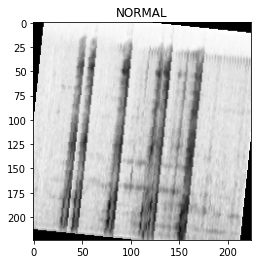

In [ ]:
img,label = trainset[20]
#print(trainset.class_to_idx)

class_name =["NORMAL","POSITIVE"]
show_image(img,class_name[label])

In [ ]:
trainloader = data.DataLoader(trainset,batch_size=CFG.batch_size,shuffle=True)
print("No. of batches in trainloader:{}".format(len(trainloader))) #Trainset Size:  3101 / batch_size: 16 = 194(No. of batches in trainloader) 
print("No. of Total examples:{}".format(len(trainloader.dataset)))

validationloader = data.DataLoader(validateset,batch_size=CFG.batch_size,shuffle=True)
print("No. of batches in validationloader:{}".format(len(validationloader))) #validationset Size:  345 / batch_size: 16 = 22(No. of batches in validationloader) 
print("No. of Total examples:{}".format(len(validationloader.dataset)))

testloader = data.DataLoader(testset,batch_size=CFG.batch_size,shuffle=True)
print("No. of batches in testloader:{}".format(len(testloader))) #testset Size:  383 / batch_size: 16 = 24(No. of batches in testloader) 
print("No. of Total examples:{}".format(len(testloader.dataset)))

No. of batches in trainloader:143
No. of Total examples:2273
No. of batches in validationloader:16
No. of Total examples:253
No. of batches in testloader:18
No. of Total examples:281


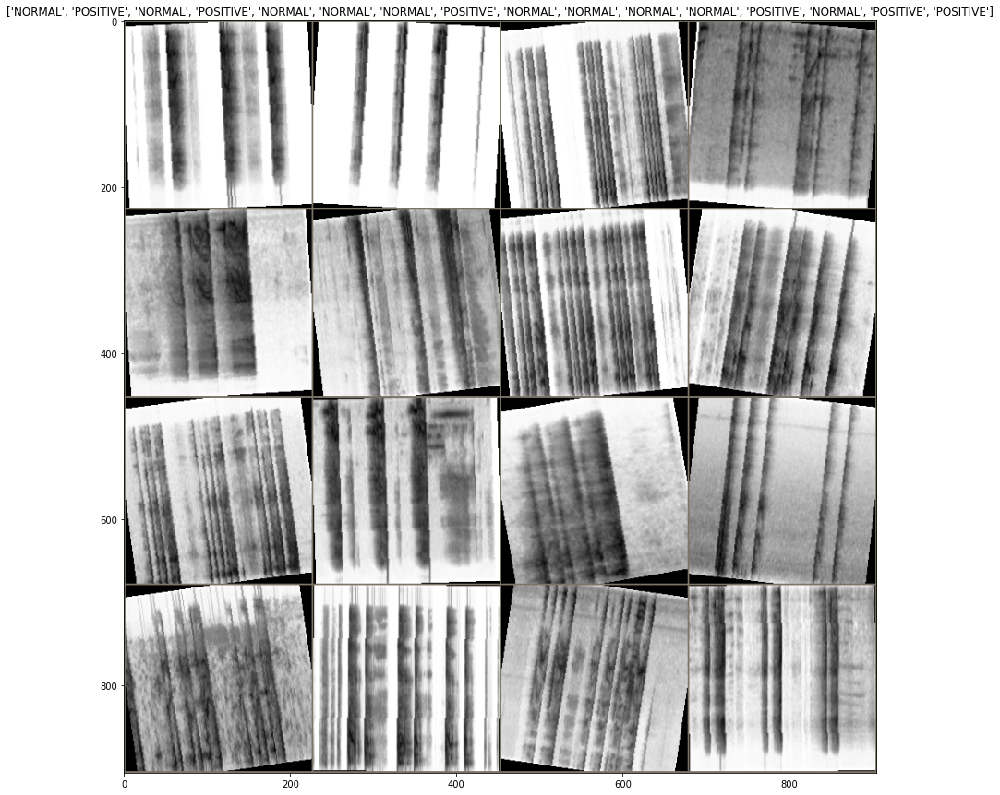

In [ ]:
dataiter = iter(trainloader)
images,labels = dataiter.next()

out = make_grid(images,nrow=4)

show_grid(out,title = [class_name[x] for x in labels])

In [ ]:
# Load pretrained ResNet50 Model
model_name = 'resnet50'
resnet50_model = timm.create_model('resnet50',pretrained=True) #load pretrained model

# Freeze model parameters
for param in resnet50_model.parameters():
  param.requires_grad = False

# Change the final layer of ResNet50 Model for Transfer Learning
fc_inputs = resnet50_model.fc.in_features
resnet50_model.fc = nn.Sequential(  nn.Linear(in_features=fc_inputs, out_features=625),
                              nn.ReLU(), #ReLu to be the activation function
                              nn.Dropout(p=0.3),
                              nn.Linear(in_features=625, out_features=256),
                              nn.ReLU(),
                              nn.Linear(in_features=256, out_features=2), 
                              )
resnet50_model

ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (act1): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): Bottleneck(
      (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (act1): ReLU(inplace=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (act2): ReLU(inplace=True)
      (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (act3): ReLU(inplace=True)
      (downsample): Sequen

In [ ]:
# as we are training on GPU. Convert model to be used on GPU
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
resnet50_model.to(device) # move the model to GPU
summary(resnet50_model,input_size=(3,224,224))

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1         [-1, 64, 112, 112]           9,408
       BatchNorm2d-2         [-1, 64, 112, 112]             128
              ReLU-3         [-1, 64, 112, 112]               0
         MaxPool2d-4           [-1, 64, 56, 56]               0
            Conv2d-5           [-1, 64, 56, 56]           4,096
       BatchNorm2d-6           [-1, 64, 56, 56]             128
              ReLU-7           [-1, 64, 56, 56]               0
            Conv2d-8           [-1, 64, 56, 56]          36,864
       BatchNorm2d-9           [-1, 64, 56, 56]             128
             ReLU-10           [-1, 64, 56, 56]               0
           Conv2d-11          [-1, 256, 56, 56]          16,384
      BatchNorm2d-12          [-1, 256, 56, 56]             512
           Conv2d-13          [-1, 256, 56, 56]          16,384
      BatchNorm2d-14          [-1, 256,

In [ ]:
class COVIDTrainer():
    
    def __init__(self,criterion = None,optimizer = None,schedular = None):
        
        self.criterion = criterion
        self.optimizer = optimizer
        self.schedular = schedular
        self.history = []
    
    def train_batch_loop(self,model,trainloader):
        
        train_loss = 0.0
        train_acc = 0.0
        
        for images,labels in tqdm.tqdm(trainloader): 
            
            # move the data to CPU
            images = images.to(device)
            labels = labels.to(device)
            
            logits = model(images)
            loss = self.criterion(logits,labels)
            
            self.optimizer.zero_grad()
            loss.backward()
            self.optimizer.step()
            
            train_loss += loss.item()
            train_acc += accuracy(logits,labels)
            
        return train_loss / len(trainloader), train_acc / len(trainloader) 

    
    def valid_batch_loop(self,model,validationloader):
        
        valid_loss = 0.0
        valid_acc = 0.0
        
        for images,labels in tqdm.tqdm(validationloader):
            
            # move the data to CPU
            images = images.to(device) 
            labels = labels.to(device)
            
            logits = model(images)
            loss = self.criterion(logits,labels)
            
            valid_loss += loss.item()
            valid_acc += accuracy(logits,labels)
            
        return valid_loss / len(validationloader), valid_acc / len(validationloader)
            
        
    def fit(self,model,trainloader,validationloader,epochs):
        
        valid_min_loss = np.Inf 
        
        for i in range(epochs):
            
            model.train() # this turn on dropout
            avg_train_loss, avg_train_acc = self.train_batch_loop(model,trainloader) ###
            
            model.eval()  # this turns off the dropout lapyer and batch norm
            avg_valid_loss, avg_valid_acc = self.valid_batch_loop(model,validationloader) ###
            
            if avg_valid_loss <= valid_min_loss :
                print("Valid_loss decreased {} --> {}".format(valid_min_loss,avg_valid_loss))
                torch.save(model.state_dict(),'ColabCovidModel.pt')
                valid_min_loss = avg_valid_loss

                
            print("Epoch : {} Train Loss : {:.6f} Train Acc : {:.6f}".format(i+1, avg_train_loss, avg_train_acc))
            print("Epoch : {} Valid Loss : {:.6f} Valid Acc : {:.6f}".format(i+1, avg_valid_loss, avg_valid_acc))
            self.history.append([avg_train_loss, avg_valid_loss, avg_train_acc, avg_valid_acc])
        return self.history

In [ ]:
criterion = nn.CrossEntropyLoss()
optimizer = torch.optim.Adam(resnet50_model.parameters(),lr = CFG.lr)
trainer = COVIDTrainer(criterion,optimizer)
history = trainer.fit(resnet50_model,trainloader,validationloader,epochs = 15)

  0%|          | 0/143 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

Valid_loss decreased inf --> 0.6049016769975424
Epoch : 1 Train Loss : 0.672206 Train Acc : 0.589161
Epoch : 1 Valid Loss : 0.604902 Valid Acc : 0.653546


  0%|          | 0/143 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

Epoch : 2 Train Loss : 0.644687 Train Acc : 0.615822
Epoch : 2 Valid Loss : 0.625759 Valid Acc : 0.633113


  0%|          | 0/143 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

Epoch : 3 Train Loss : 0.614449 Train Acc : 0.647727
Epoch : 3 Valid Loss : 0.604927 Valid Acc : 0.676082


  0%|          | 0/143 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

Valid_loss decreased 0.6049016769975424 --> 0.5922844558954239
Epoch : 4 Train Loss : 0.594197 Train Acc : 0.674388
Epoch : 4 Valid Loss : 0.592284 Valid Acc : 0.653846


  0%|          | 0/143 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

Epoch : 5 Train Loss : 0.600669 Train Acc : 0.662587
Epoch : 5 Valid Loss : 0.603629 Valid Acc : 0.679988


  0%|          | 0/143 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

Epoch : 6 Train Loss : 0.585919 Train Acc : 0.677448
Epoch : 6 Valid Loss : 0.627158 Valid Acc : 0.622296


  0%|          | 0/143 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

Epoch : 7 Train Loss : 0.601518 Train Acc : 0.665647
Epoch : 7 Valid Loss : 0.629424 Valid Acc : 0.642728


  0%|          | 0/143 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

Valid_loss decreased 0.5922844558954239 --> 0.5608836114406586
Epoch : 8 Train Loss : 0.576093 Train Acc : 0.689248
Epoch : 8 Valid Loss : 0.560884 Valid Acc : 0.679988


  0%|          | 0/143 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

Epoch : 9 Train Loss : 0.575000 Train Acc : 0.687063
Epoch : 9 Valid Loss : 0.683637 Valid Acc : 0.648738


  0%|          | 0/143 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

Epoch : 10 Train Loss : 0.587681 Train Acc : 0.675699
Epoch : 10 Valid Loss : 0.611518 Valid Acc : 0.675180


  0%|          | 0/143 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

Epoch : 11 Train Loss : 0.573263 Train Acc : 0.695804
Epoch : 11 Valid Loss : 0.629171 Valid Acc : 0.633113


  0%|          | 0/143 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

Epoch : 12 Train Loss : 0.571318 Train Acc : 0.694056
Epoch : 12 Valid Loss : 0.638721 Valid Acc : 0.670072


  0%|          | 0/143 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

Valid_loss decreased 0.5608836114406586 --> 0.5608553793281317
Epoch : 13 Train Loss : 0.574953 Train Acc : 0.694493
Epoch : 13 Valid Loss : 0.560855 Valid Acc : 0.687800


  0%|          | 0/143 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

Valid_loss decreased 0.5608553793281317 --> 0.5497561730444431
Epoch : 14 Train Loss : 0.569408 Train Acc : 0.686189
Epoch : 14 Valid Loss : 0.549756 Valid Acc : 0.679988


  0%|          | 0/143 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

Epoch : 15 Train Loss : 0.545059 Train Acc : 0.708916
Epoch : 15 Valid Loss : 0.589279 Valid Acc : 0.676983


NameError: ignored

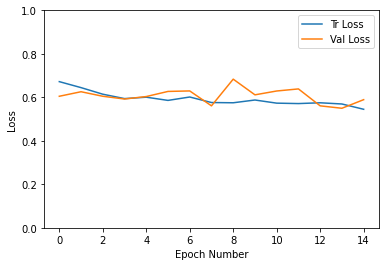

In [ ]:
history = np.array(history)
plt.plot(history[:,0:2])
plt.legend(['Tr Loss', 'Val Loss'])
plt.xlabel('Epoch Number')
plt.ylabel('Loss')
plt.ylim(0,1)
plt.savefig(dataset+'_loss_curve.png')
plt.show()

In [ ]:
def computeTestSetAccuracy(model, criterion):
    '''
    Function to compute the accuracy on the test set
    Parameters
        :param model: Model to test
        :param loss_criterion: Loss Criterion to minimize
    '''

    device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

    test_acc = 0.0
    test_loss = 0.0

    # Set to evaluation mode
    model.eval()

    # Validation loop
    y_pred_list = []
    y_true_list = []
    for j, (images, labels) in enumerate(testloader):
        images = images.to(device)
        labels = labels.to(device)

        # Forward pass - compute outputs on input data using the model
        logits = model(images)

        y_true_list.append(labels.data.to("cpu").tolist())
        #y_pred_list.append(logits.to("cpu").tolist())
        y_pred = F.softmax(logits,dim = 1)
        top_p,top_class = y_pred.topk(1,dim = 1)
        y_pred_list.append(top_class.data.to("cpu").tolist())

        loss = criterion(logits,labels)
        test_loss += loss.item()
        test_acc += accuracy(logits,labels)

    return y_pred_list, y_true_list


In [ ]:
resnet50_model.load_state_dict(torch.load('/content/Coswara-Data/ColabCovidModel.pt'))
resnet50_model.eval()
avg_test_loss, avg_test_acc = trainer.valid_batch_loop(resnet50_model,testloader)
print("Test Loss : {}".format(avg_test_loss))
print("Test Acc : {}".format(avg_test_acc))
y_pred_list, y_true_list = computeTestSetAccuracy(resnet50_model, criterion)
y_pred_list = [j for i in y_pred_list for j in i]
y_true_list = [j for i in y_true_list for j in i]
print(classification_report(y_true_list, y_pred_list, digits=3))

  0%|          | 0/18 [00:00<?, ?it/s]

Test Loss : 0.57776949637466
Test Acc : 0.6917438507080078
              precision    recall  f1-score   support

           0      0.721     0.641     0.679       145
           1      0.658     0.735     0.694       136

    accuracy                          0.687       281
   macro avg      0.689     0.688     0.687       281
weighted avg      0.690     0.687     0.686       281



In [ ]:
model_name = 'efficientnetv2_rw_m'
import tqdm.notebook as tqdm

efficientnetv2_model = timm.create_model(model_name,pretrained=True) #load pretrained model
# Freeze model parameters
for param in efficientnetv2_model.parameters():
  param.requires_grad = False

# Change the final layer of Efficientnetv2 Model for Transfer Learning
#we are updating it as a 2-class classifier:
efficientnetv2_model.classifier = nn.Sequential(
    nn.Linear(in_features=2152, out_features=625), #2152 is the orginal in_features
    nn.ReLU(), #ReLu to be the activation function
    nn.Dropout(p=0.3),
    nn.Linear(in_features=625, out_features=256),
    nn.ReLU(),
    nn.Linear(in_features=256, out_features=2), 
)

# as we are training on GPU. Convert model to be used on GPU
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
efficientnetv2_model.to(device) # move the model to GPU
summary(efficientnetv2_model,input_size=(3,224,224))
criterion = nn.CrossEntropyLoss()
optimizer = torch.optim.Adam(efficientnetv2_model.parameters(),lr = CFG.lr)
trainer = COVIDTrainer(criterion,optimizer)
history = trainer.fit(efficientnetv2_model,trainloader,validationloader,epochs = 24)



Downloading: "https://github.com/rwightman/pytorch-image-models/releases/download/v0.1-weights/efficientnetv2_rw_m_agc-3d90cb1e.pth" to /root/.cache/torch/hub/checkpoints/efficientnetv2_rw_m_agc-3d90cb1e.pth


----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1         [-1, 32, 112, 112]             864
       BatchNorm2d-2         [-1, 32, 112, 112]              64
              SiLU-3         [-1, 32, 112, 112]               0
            Conv2d-4         [-1, 32, 112, 112]           9,216
       BatchNorm2d-5         [-1, 32, 112, 112]              64
              SiLU-6         [-1, 32, 112, 112]               0
          Identity-7         [-1, 32, 112, 112]               0
            Conv2d-8         [-1, 32, 112, 112]           1,024
       BatchNorm2d-9         [-1, 32, 112, 112]              64
     EdgeResidual-10         [-1, 32, 112, 112]               0
           Conv2d-11         [-1, 32, 112, 112]           9,216
      BatchNorm2d-12         [-1, 32, 112, 112]              64
             SiLU-13         [-1, 32, 112, 112]               0
         Identity-14         [-1, 32, 1

  0%|          | 0/143 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

Valid_loss decreased inf --> 0.5983461923897266
Epoch : 1 Train Loss : 0.636686 Train Acc : 0.633304
Epoch : 1 Valid Loss : 0.598346 Valid Acc : 0.662260


  0%|          | 0/143 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

Valid_loss decreased 0.5983461923897266 --> 0.5885682906955481
Epoch : 2 Train Loss : 0.610815 Train Acc : 0.663899
Epoch : 2 Valid Loss : 0.588568 Valid Acc : 0.688702


  0%|          | 0/143 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

Epoch : 3 Train Loss : 0.602843 Train Acc : 0.675699
Epoch : 3 Valid Loss : 0.602310 Valid Acc : 0.695613


  0%|          | 0/143 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

Valid_loss decreased 0.5885682906955481 --> 0.5850580502301455
Epoch : 4 Train Loss : 0.594329 Train Acc : 0.671329
Epoch : 4 Valid Loss : 0.585058 Valid Acc : 0.677284


  0%|          | 0/143 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

Valid_loss decreased 0.5850580502301455 --> 0.5615202598273754
Epoch : 5 Train Loss : 0.582519 Train Acc : 0.697552
Epoch : 5 Valid Loss : 0.561520 Valid Acc : 0.743389


  0%|          | 0/143 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

Epoch : 6 Train Loss : 0.572157 Train Acc : 0.697115
Epoch : 6 Valid Loss : 0.571394 Valid Acc : 0.712139


  0%|          | 0/143 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

Valid_loss decreased 0.5615202598273754 --> 0.5495160650461912
Epoch : 7 Train Loss : 0.570627 Train Acc : 0.704983
Epoch : 7 Valid Loss : 0.549516 Valid Acc : 0.722957


  0%|          | 0/143 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

Valid_loss decreased 0.5495160650461912 --> 0.521035447716713
Epoch : 8 Train Loss : 0.573070 Train Acc : 0.698427
Epoch : 8 Valid Loss : 0.521035 Valid Acc : 0.747296


  0%|          | 0/143 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

Epoch : 9 Train Loss : 0.571257 Train Acc : 0.690559
Epoch : 9 Valid Loss : 0.544878 Valid Acc : 0.731671


  0%|          | 0/143 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

Epoch : 10 Train Loss : 0.564798 Train Acc : 0.698864
Epoch : 10 Valid Loss : 0.569120 Valid Acc : 0.725060


  0%|          | 0/143 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

Epoch : 11 Train Loss : 0.563533 Train Acc : 0.705420
Epoch : 11 Valid Loss : 0.559164 Valid Acc : 0.749099


  0%|          | 0/143 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

Epoch : 12 Train Loss : 0.559679 Train Acc : 0.707605
Epoch : 12 Valid Loss : 0.568659 Valid Acc : 0.722957


  0%|          | 0/143 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

Epoch : 13 Train Loss : 0.540677 Train Acc : 0.721591
Epoch : 13 Valid Loss : 0.664741 Valid Acc : 0.660457


  0%|          | 0/143 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

Epoch : 14 Train Loss : 0.559102 Train Acc : 0.704983
Epoch : 14 Valid Loss : 0.550921 Valid Acc : 0.702524


  0%|          | 0/143 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

Epoch : 15 Train Loss : 0.555152 Train Acc : 0.704983
Epoch : 15 Valid Loss : 0.541649 Valid Acc : 0.733774


  0%|          | 0/143 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

Epoch : 16 Train Loss : 0.542618 Train Acc : 0.723776
Epoch : 16 Valid Loss : 0.533967 Valid Acc : 0.745493


  0%|          | 0/143 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

Epoch : 17 Train Loss : 0.548928 Train Acc : 0.713287
Epoch : 17 Valid Loss : 0.536331 Valid Acc : 0.733774


  0%|          | 0/143 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

Epoch : 18 Train Loss : 0.548480 Train Acc : 0.720280
Epoch : 18 Valid Loss : 0.558061 Valid Acc : 0.696514


  0%|          | 0/143 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

Valid_loss decreased 0.521035447716713 --> 0.514983557164669
Epoch : 19 Train Loss : 0.530766 Train Acc : 0.727710
Epoch : 19 Valid Loss : 0.514984 Valid Acc : 0.732572


  0%|          | 0/143 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

Epoch : 20 Train Loss : 0.540585 Train Acc : 0.715909
Epoch : 20 Valid Loss : 0.541948 Valid Acc : 0.734675


  0%|          | 0/143 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

Epoch : 21 Train Loss : 0.535750 Train Acc : 0.722465
Epoch : 21 Valid Loss : 0.520681 Valid Acc : 0.729868


  0%|          | 0/143 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

Epoch : 22 Train Loss : 0.522581 Train Acc : 0.732955
Epoch : 22 Valid Loss : 0.545412 Valid Acc : 0.720853


  0%|          | 0/143 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

Epoch : 23 Train Loss : 0.531696 Train Acc : 0.722028
Epoch : 23 Valid Loss : 0.543219 Valid Acc : 0.727764


  0%|          | 0/143 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

Epoch : 24 Train Loss : 0.524113 Train Acc : 0.729458
Epoch : 24 Valid Loss : 0.547656 Valid Acc : 0.713341


In [ ]:
efficientnetv2_model.load_state_dict(torch.load('/content/Coswara-Data/ColabCovidModel.pt'))
efficientnetv2_model.eval()
import tqdm.notebook as tqdm

avg_test_loss, avg_test_acc = trainer.valid_batch_loop(efficientnetv2_model,testloader)


print("Test Loss : {}".format(avg_test_loss))
print("Test Acc : {}".format(avg_test_acc))

import sklearn
from sklearn.metrics import accuracy_score, cohen_kappa_score
from sklearn.metrics import classification_report

y_pred_list, y_true_list = computeTestSetAccuracy(efficientnetv2_model, criterion)

y_pred_list = [j for i in y_pred_list for j in i]
y_true_list = [j for i in y_true_list for j in i]

print(classification_report(y_true_list, y_pred_list, digits=3))

  0%|          | 0/18 [00:00<?, ?it/s]

Test Loss : 0.5899260921610726
Test Acc : 0.6195987462997437
              precision    recall  f1-score   support

           0      0.602     0.752     0.669       145
           1      0.640     0.471     0.542       136

    accuracy                          0.616       281
   macro avg      0.621     0.611     0.606       281
weighted avg      0.620     0.616     0.608       281



In [ ]:
#Before applying transformations check polder sizes
print(len(os.listdir('/content/data3/images/healthy')))
print(len(os.listdir('/content/data3/images/positive')))

FileNotFoundError: ignored

In [ ]:
print(len(os.listdir('/content/data3/healthy')))

1448


In [ ]:
##### Transform ie upsample dataset both classes with mels = 64 and pool
# convert healthy
out_dir = '/content/data3/images/healthy'

data_dir = '/content/data2/healthy'

audio_files = os.listdir(data_dir)

mono = True
duration = 30
sr = 22050
n_mels = 64  # The height
time_steps = 384  # The width
hop_length = 512
error_cases = []
for file_path in tqdm.tqdm(range(len(audio_files))):
    aud_file_path = str(audio_files[file_path])
    print("The file being processed is", '/content/data2/healthy/' + audio_files[file_path])
    try:
        extract_spectrogram_image('/content/data2/healthy/' + aud_file_path, out_dir + '/' + aud_file_path + '_64' + '.png', sr, time_steps, 30, hop_length, n_mels) 
    except Exception as e:
        print(f'Failed while processing {file_path} with exception: {e}')
        # error_cases.append(user_id)
        # shutil.rmtree(out_user_dir)

  0%|          | 0/1481 [00:00<?, ?it/s]

The file being processed is /content/data2/healthy/CGGk5Y7thvXSCYhDX0e4yPN7g5R2_cough-shallow.wav
Failed while processing 0 with exception: [Errno 2] No such file or directory: '/content/data3/images/healthy/CGGk5Y7thvXSCYhDX0e4yPN7g5R2_cough-shallow.wav_64.png'
The file being processed is /content/data2/healthy/YLjbjcoMy1bCh25iChGjXXTc8RK2_cough-heavy.wav
Failed while processing 1 with exception: [Errno 2] No such file or directory: '/content/data3/images/healthy/YLjbjcoMy1bCh25iChGjXXTc8RK2_cough-heavy.wav_64.png'
The file being processed is /content/data2/healthy/IkwAlxsvmhXfpi9seBDU6rksY7C2_cough-shallow.wav
Failed while processing 2 with exception: [Errno 2] No such file or directory: '/content/data3/images/healthy/IkwAlxsvmhXfpi9seBDU6rksY7C2_cough-shallow.wav_64.png'
The file being processed is /content/data2/healthy/LCa0jYXkxJZ7JUJC262jrqy0Zao2_cough-heavy.wav
Failed while processing 3 with exception: [Errno 2] No such file or directory: '/content/data3/images/healthy/LCa0jYXkx

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:14: RuntimeWarning: invalid value encountered in true_divide
  


Failed while processing 74 with exception: [Errno 2] No such file or directory: '/content/data3/images/healthy/MEEGIoNSX4exg4oIL3Q9MdysPJq1_cough-heavy.wav_64.png'
The file being processed is /content/data2/healthy/exj2e14KykUjLNwbOGgOgFieo8a2_cough-heavy.wav
Failed while processing 75 with exception: [Errno 2] No such file or directory: '/content/data3/images/healthy/exj2e14KykUjLNwbOGgOgFieo8a2_cough-heavy.wav_64.png'
The file being processed is /content/data2/healthy/ArKST1jJWqRPPvdCu92MyQoGs762_cough-heavy.wav
Failed while processing 76 with exception: [Errno 2] No such file or directory: '/content/data3/images/healthy/ArKST1jJWqRPPvdCu92MyQoGs762_cough-heavy.wav_64.png'
The file being processed is /content/data2/healthy/Gs2gwBq34aMMglNC9jqGHS3ZzIs1_cough-heavy.wav
Failed while processing 77 with exception: [Errno 2] No such file or directory: '/content/data3/images/healthy/Gs2gwBq34aMMglNC9jqGHS3ZzIs1_cough-heavy.wav_64.png'
The file being processed is /content/data2/healthy/4qfhs

In [ ]:
len(os.listdir(out_dir))

FileNotFoundError: ignored

In [ ]:
len(os.listdir('/content/data3/positive'))

1356

In [ ]:
# convert positive - upsample with 64 mels
out_dir = '/content/data3/positive'

data_dir = '/content/data2/positive'

audio_files = os.listdir(data_dir)

mono = True
duration = 30
sr = 22050
n_mels = 128  # The height
time_steps = 384  # The width
hop_length = 512
error_cases = []
for file_path in tqdm.tqdm(range(len(audio_files))):
    aud_file_path = str(audio_files[file_path])
    print("The file being processed is", '/content/data2/positive/' + audio_files[file_path])
    try:
        extract_spectrogram_image('/content/data2/positive/' + aud_file_path, out_dir + '/' + aud_file_path + '_64' + '.png', sr, time_steps, 5, hop_length, n_mels) 
    except Exception as e:
        print(f'Failed while processing {file_path} with exception: {e}')
        # error_cases.append(user_id)
        # shutil.rmtree(out_user_dir)

  0%|          | 0/1362 [00:00<?, ?it/s]

The file being processed is /content/data2/positive/JZjkvuWtzcNnzQ7bjxRL1PBoZaj1_cough-shallow.wav
saved!!!!
The file being processed is /content/data2/positive/4BFi2kAP9vQpSd1VpCWIeHyR2iP2_cough-heavy.wav
saved!!!!
The file being processed is /content/data2/positive/Y0K7dqxP7WWsIjth3NfIHU9ayKO2_cough-shallow.wav
saved!!!!
The file being processed is /content/data2/positive/BtooK4c5GOf6ic0GB9lAUXQEaaO2_cough-shallow.wav
saved!!!!
The file being processed is /content/data2/positive/CRrk6OagJdebILgQWEGKDZXzi7z1_cough-shallow.wav
saved!!!!
The file being processed is /content/data2/positive/q9AJkEfjEtQYaUFVbbFl1cN7TKH3_cough-heavy.wav
saved!!!!
The file being processed is /content/data2/positive/Kj5Pw7GpqlhOhtfYKysgdFZcijG3_cough-shallow.wav
saved!!!!
The file being processed is /content/data2/positive/c6LjEGIa9mYRb1ly6g3eW7VN7Sn2_cough-shallow.wav
saved!!!!
The file being processed is /content/data2/positive/1C6BCvPkrjT62P0843qRIsRPClF2_cough-heavy.wav
saved!!!!
The file being processed 

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:14: RuntimeWarning: invalid value encountered in true_divide
  


saved!!!!
The file being processed is /content/data2/positive/Zmjv6hT2Q1VfJhGdGh9VkGmpHL03_cough-shallow.wav
saved!!!!
The file being processed is /content/data2/positive/A21aoZx56kXiMAj3zwl05qtlDRB2_cough-heavy.wav
saved!!!!
The file being processed is /content/data2/positive/MBFsLtO6sIf2SGCEfNT2K91gLcy1_cough-shallow.wav
saved!!!!
The file being processed is /content/data2/positive/AVuwckF8igNbIhGwa7Ly8nxvIAi2_cough-shallow.wav
saved!!!!
The file being processed is /content/data2/positive/AlM8enXWaFZ96vN2KM98agcXJvx2_cough-shallow.wav
saved!!!!
The file being processed is /content/data2/positive/SmtHDspJwGYS9FYtjXd1IwsYRZc2_cough-heavy.wav
saved!!!!
The file being processed is /content/data2/positive/1PhqsVP6EhPzs1zx9XUsyj7nm823_cough-shallow.wav
saved!!!!
The file being processed is /content/data2/positive/OSva8KJZQuZDquBrWQRFdEOtKFc2_cough-heavy.wav
saved!!!!
The file being processed is /content/data2/positive/8PvWScAB6UbnfrkQrpbqLpu7O0z1_cough-heavy.wav
saved!!!!
The file being pr

In [ ]:
len(os.listdir('/content/data3/images/positive'))

2712

In [ ]:
# retransform with 256 mels
# healthy
##### Transform ie upsample dataset both classes with mels = 256 and pool
# convert healthy
out_dir = '/content/data3/images/healthy'

data_dir = '/content/data2/healthy'

audio_files = os.listdir(data_dir)

mono = True
duration = 30
sr = 22050
n_mels = 256  # The height
time_steps = 384  # The width
hop_length = 512
error_cases = []
for file_path in tqdm.tqdm(range(len(audio_files))):
    aud_file_path = str(audio_files[file_path])
    print("The file being processed is", '/content/data2/healthy/' + audio_files[file_path])
    try:
        extract_spectrogram_image('/content/data2/healthy/' + aud_file_path, out_dir + '/' + aud_file_path + '_256' + '.png', sr, time_steps, 30, hop_length, n_mels) 
    except Exception as e:
        print(f'Failed while processing {file_path} with exception: {e}')
        # error_cases.append(user_id)
        # shutil.rmtree(out_user_dir)

  0%|          | 0/1481 [00:00<?, ?it/s]

The file being processed is /content/data2/healthy/4drDZUlQcteX5StlFT2CXEL0N0L2_cough-shallow.wav


  0%|          | 1/1481 [00:00<07:07,  3.46it/s]

saved!!!!
The file being processed is /content/data2/healthy/Na6w7stX7ocNYZPQW9MQAiM6mrw2_cough-shallow.wav


  0%|          | 2/1481 [00:00<10:28,  2.35it/s]

saved!!!!
The file being processed is /content/data2/healthy/UDsJYcNsh1NOD6LBl55nI5Z2dgj2_cough-heavy.wav


  0%|          | 3/1481 [00:01<12:25,  1.98it/s]

saved!!!!
The file being processed is /content/data2/healthy/NKfo9DcpbQeYHlZ6pHDOwRx08i72_cough-heavy.wav


  0%|          | 4/1481 [00:01<10:48,  2.28it/s]

saved!!!!
The file being processed is /content/data2/healthy/SkZeafTL9dd9dwV9nEbNrszqc8u1_cough-heavy.wav


  0%|          | 5/1481 [00:02<09:32,  2.58it/s]

saved!!!!
The file being processed is /content/data2/healthy/BAMibuHkXaNr3JNc0Cvbu3kdSIp1_cough-heavy.wav


  0%|          | 6/1481 [00:02<09:41,  2.54it/s]

saved!!!!
The file being processed is /content/data2/healthy/jk93uUBxDdd91SsfKOXhkGMsLjZ2_cough-heavy.wav


  0%|          | 7/1481 [00:02<10:26,  2.35it/s]

saved!!!!
The file being processed is /content/data2/healthy/DggrWUKwrkOXgR2B6v13vKEB1hi1_cough-shallow.wav


  1%|          | 8/1481 [00:03<09:28,  2.59it/s]

saved!!!!
The file being processed is /content/data2/healthy/zX9wXjdaP8gMSv7KqPceItHsHr62_cough-shallow.wav


  1%|          | 9/1481 [00:03<10:53,  2.25it/s]

saved!!!!
The file being processed is /content/data2/healthy/3VWhvtBFHKMgEKxlXzMYeg5NeBN2_cough-shallow.wav


  1%|          | 11/1481 [00:04<08:47,  2.79it/s]

saved!!!!
The file being processed is /content/data2/healthy/oeOuvTlUMEfWPcNOA4EnTk5Bh4K2_cough-shallow.wav
saved!!!!
The file being processed is /content/data2/healthy/FBdqiwdp4Kc7PpyUkLBM9qMSo2k1_cough-shallow.wav


  1%|          | 12/1481 [00:04<08:29,  2.88it/s]

saved!!!!
The file being processed is /content/data2/healthy/M1RgcbGDbWbsxNkmPHlrh9J9n572_cough-shallow.wav


  1%|          | 13/1481 [00:05<08:47,  2.79it/s]

saved!!!!
The file being processed is /content/data2/healthy/UJkJrzKjH6UQRZF7eHhUQVQwCHB2_cough-shallow.wav


  1%|          | 14/1481 [00:05<09:41,  2.52it/s]

saved!!!!
The file being processed is /content/data2/healthy/WBNoFWUY9MhZOfFiLvIDsfIWnSZ2_cough-heavy.wav


  1%|          | 15/1481 [00:05<08:38,  2.83it/s]

saved!!!!
The file being processed is /content/data2/healthy/Uy5OhcHEQXY65CsYbiRPtN7RVBf1_cough-shallow.wav


  1%|          | 16/1481 [00:06<07:39,  3.19it/s]

saved!!!!
The file being processed is /content/data2/healthy/9KCtOKDALHXZZpzXizYJxBQ2Ulz1_cough-heavy.wav


  1%|          | 17/1481 [00:06<09:31,  2.56it/s]

saved!!!!
The file being processed is /content/data2/healthy/HCsgRpbj4vdEXoAjjSDJj9vQFbB2_cough-shallow.wav


  1%|          | 18/1481 [00:07<09:49,  2.48it/s]

saved!!!!
The file being processed is /content/data2/healthy/iq8oYXczSjPuJoVS7DBpkGNMC2p1_cough-heavy.wav


  1%|▏         | 19/1481 [00:07<09:19,  2.61it/s]

saved!!!!
The file being processed is /content/data2/healthy/PlsyeCq5jHO4E70iZHfrfHSqSJu2_cough-shallow.wav


  1%|▏         | 20/1481 [00:07<10:00,  2.43it/s]

saved!!!!
The file being processed is /content/data2/healthy/z3dpsRp0YuPntedc6sgMaRfW04t2_cough-shallow.wav


  1%|▏         | 21/1481 [00:08<09:30,  2.56it/s]

saved!!!!
The file being processed is /content/data2/healthy/ZFjDpdVMiNgc4ApSUv0yY4b4B193_cough-heavy.wav


  1%|▏         | 22/1481 [00:08<08:19,  2.92it/s]

saved!!!!
The file being processed is /content/data2/healthy/igcBoCJELsfzituxLn61lJybxgD2_cough-shallow.wav


  2%|▏         | 23/1481 [00:08<08:19,  2.92it/s]

saved!!!!
The file being processed is /content/data2/healthy/n1A8G19t3IR9wCUhfv5sZFF9pvI2_cough-heavy.wav


  2%|▏         | 24/1481 [00:09<10:47,  2.25it/s]

saved!!!!
The file being processed is /content/data2/healthy/oftR0bCS4Bdgkwkudt4ecIBudlt1_cough-shallow.wav


  2%|▏         | 25/1481 [00:10<11:14,  2.16it/s]

saved!!!!
The file being processed is /content/data2/healthy/L6Bo4rMk15fKste9Gvn7ZyTB4qw2_cough-heavy.wav


  2%|▏         | 26/1481 [00:10<11:09,  2.17it/s]

saved!!!!
The file being processed is /content/data2/healthy/85XodgEaKrPebeSPsJo2UFaDlWj1_cough-heavy.wav


  2%|▏         | 27/1481 [00:11<12:53,  1.88it/s]

saved!!!!
The file being processed is /content/data2/healthy/tFFUbYL9nSNEyaBK3w9UAtATcgO2_cough-shallow.wav


  2%|▏         | 28/1481 [00:11<12:12,  1.98it/s]

saved!!!!
The file being processed is /content/data2/healthy/O4BFgxvAgwbwRGZMkMBJRFnGBbd2_cough-heavy.wav


  2%|▏         | 29/1481 [00:11<10:26,  2.32it/s]

saved!!!!
The file being processed is /content/data2/healthy/YPqxeCMKNuMVhEg9xQPA4hD8dQC2_cough-heavy.wav


  2%|▏         | 30/1481 [00:12<09:29,  2.55it/s]

saved!!!!
The file being processed is /content/data2/healthy/I6Mjl4neEPMnMH16WVW6oTG860L2_cough-heavy.wav


  2%|▏         | 31/1481 [00:12<11:32,  2.09it/s]

saved!!!!
The file being processed is /content/data2/healthy/cbmcTV6z0NVgO0i6yeYyAO7AoI72_cough-shallow.wav
Failed while processing 31 with exception: Input signal length=0 is too small to resample from 16000->22050
The file being processed is /content/data2/healthy/FSzobvJqOXf0rI6X05cHqOiU9Mu2_cough-shallow.wav


  2%|▏         | 33/1481 [00:13<08:16,  2.92it/s]

saved!!!!
The file being processed is /content/data2/healthy/8UDw6kiGKhgchuwIhHR3o2npPk92_cough-shallow.wav


  2%|▏         | 34/1481 [00:13<09:36,  2.51it/s]

saved!!!!
The file being processed is /content/data2/healthy/AQTaxycYpIWSoPUFSEUiFlqgenu2_cough-heavy.wav


  2%|▏         | 35/1481 [00:14<08:51,  2.72it/s]

saved!!!!
The file being processed is /content/data2/healthy/OpvwYQFOschINBVkxBVeKgC0FeJ3_cough-shallow.wav


  2%|▏         | 36/1481 [00:14<08:09,  2.95it/s]

saved!!!!
The file being processed is /content/data2/healthy/Eoyf44CUffgVCPPjJJkopEyAO7k2_cough-heavy.wav


  2%|▏         | 37/1481 [00:14<08:53,  2.71it/s]

saved!!!!
The file being processed is /content/data2/healthy/YNkZcKCX0mOhKIUO2VRQQd63ydn1_cough-shallow.wav


  3%|▎         | 38/1481 [00:15<09:02,  2.66it/s]

saved!!!!
The file being processed is /content/data2/healthy/UDsJYcNsh1NOD6LBl55nI5Z2dgj2_cough-shallow.wav


  3%|▎         | 39/1481 [00:15<09:45,  2.46it/s]

saved!!!!
The file being processed is /content/data2/healthy/XQVpgnaYz4NHmXRFWov9lBKP1tg1_cough-shallow.wav


  3%|▎         | 40/1481 [00:16<09:28,  2.54it/s]

saved!!!!
The file being processed is /content/data2/healthy/ri2VbVnIcMNkS8zYnXrLAXa1dM92_cough-shallow.wav


  3%|▎         | 41/1481 [00:16<09:34,  2.50it/s]

saved!!!!
The file being processed is /content/data2/healthy/AxuYWBN0jFVLINCBqIW5aZmGCdu1_cough-shallow.wav


  3%|▎         | 42/1481 [00:16<09:33,  2.51it/s]

saved!!!!
The file being processed is /content/data2/healthy/UYQqLbdvfMeQOnISZq4Okwuas6K2_cough-heavy.wav


  3%|▎         | 43/1481 [00:17<09:27,  2.54it/s]

saved!!!!
The file being processed is /content/data2/healthy/FtDju4lrx4PqJCMCo9zctj7IFnV2_cough-heavy.wav


  3%|▎         | 44/1481 [00:17<08:53,  2.70it/s]

saved!!!!
The file being processed is /content/data2/healthy/zNNcSmfHhTbjLm5NcVmrOAf5C2j2_cough-heavy.wav


  3%|▎         | 45/1481 [00:17<09:11,  2.61it/s]

saved!!!!
The file being processed is /content/data2/healthy/KHP3hql1ScXYRbOQJ7anrZXTiad2_cough-shallow.wav


  3%|▎         | 46/1481 [00:18<09:03,  2.64it/s]

saved!!!!
The file being processed is /content/data2/healthy/GpkFX9qB33ZsvFG4HWQHkOMWjFW2_cough-shallow.wav


  3%|▎         | 47/1481 [00:18<08:38,  2.77it/s]

saved!!!!
The file being processed is /content/data2/healthy/QQbzKidDxHQ0eZFEL4uG68s1lc02_cough-shallow.wav


  3%|▎         | 48/1481 [00:19<12:50,  1.86it/s]

saved!!!!
The file being processed is /content/data2/healthy/L6zbMqqGS1et0kjPXmSsLUI3vz22_cough-shallow.wav


  3%|▎         | 49/1481 [00:20<12:23,  1.93it/s]

saved!!!!
The file being processed is /content/data2/healthy/YKJ4AmuaSThm9fM7nAE2rxLs9Bm2_cough-shallow.wav


  3%|▎         | 50/1481 [00:20<11:49,  2.02it/s]

saved!!!!
The file being processed is /content/data2/healthy/nWexc69oEiZ6d1YP3v2CDJBipkM2_cough-shallow.wav


  3%|▎         | 51/1481 [00:20<11:59,  1.99it/s]

saved!!!!
The file being processed is /content/data2/healthy/qqMKI7lvNFO8aQqGkWs0lvww3zJ2_cough-shallow.wav


  4%|▎         | 52/1481 [00:22<16:05,  1.48it/s]

saved!!!!
The file being processed is /content/data2/healthy/f78ZFmqneaOWttg3xhtcmO4XZOu2_cough-shallow.wav


  4%|▎         | 53/1481 [00:22<14:56,  1.59it/s]

saved!!!!
The file being processed is /content/data2/healthy/wDqOiRYshQTO37726tjnEy1lUQ33_cough-heavy.wav


  4%|▎         | 54/1481 [00:23<14:10,  1.68it/s]

saved!!!!
The file being processed is /content/data2/healthy/nyOEOseZX2cXF7ItBTJP316eTrx2_cough-heavy.wav


  4%|▎         | 55/1481 [00:23<15:47,  1.50it/s]

saved!!!!
The file being processed is /content/data2/healthy/DggrWUKwrkOXgR2B6v13vKEB1hi1_cough-heavy.wav


  4%|▍         | 56/1481 [00:24<15:28,  1.53it/s]

saved!!!!
The file being processed is /content/data2/healthy/Bjp6S2aILuesK2yOZQIG06WliTM2_cough-shallow.wav


  4%|▍         | 57/1481 [00:24<13:52,  1.71it/s]

saved!!!!
The file being processed is /content/data2/healthy/0ujmfEsuhJRsGfbW3ttpSMjwJi73_cough-heavy.wav


  4%|▍         | 58/1481 [00:25<13:50,  1.71it/s]

saved!!!!
The file being processed is /content/data2/healthy/OPgL5r9gSiOhpOtFGVK8e0kN4o73_cough-heavy.wav


  4%|▍         | 59/1481 [00:25<11:23,  2.08it/s]

saved!!!!
The file being processed is /content/data2/healthy/ZbFodPVPEZMK0DaH4J74kowt1d53_cough-heavy.wav


  4%|▍         | 61/1481 [00:26<10:10,  2.33it/s]

saved!!!!
The file being processed is /content/data2/healthy/mM5KRWXtilYLsOILvMB2WdRVVC53_cough-heavy.wav
saved!!!!
The file being processed is /content/data2/healthy/meYzBgsbbHT9rLhVNx4SYzjRYjK2_cough-heavy.wav


  4%|▍         | 62/1481 [00:27<10:00,  2.36it/s]

saved!!!!
The file being processed is /content/data2/healthy/yBJ20a3np3a8FHUUVUnXslUoX4f1_cough-heavy.wav


  4%|▍         | 63/1481 [00:27<09:32,  2.48it/s]

saved!!!!
The file being processed is /content/data2/healthy/85XodgEaKrPebeSPsJo2UFaDlWj1_cough-shallow.wav


  4%|▍         | 64/1481 [00:27<10:19,  2.29it/s]

saved!!!!
The file being processed is /content/data2/healthy/8jj80VIjJDhstlysp9ak8kFJwex1_cough-heavy.wav


  4%|▍         | 65/1481 [00:28<09:37,  2.45it/s]

saved!!!!
The file being processed is /content/data2/healthy/c0qg1BdEVyNXI9Uq7fxJtBjy8dq2_cough-shallow.wav


  4%|▍         | 66/1481 [00:28<09:24,  2.51it/s]

saved!!!!
The file being processed is /content/data2/healthy/83BZjlFTcYZWakpS3tf63fpwbQO2_cough-heavy.wav


  5%|▍         | 67/1481 [00:29<10:32,  2.24it/s]

saved!!!!
The file being processed is /content/data2/healthy/9Q440YDVTrfSgiD2l41INZ0IHYm1_cough-heavy.wav


  5%|▍         | 68/1481 [00:29<09:52,  2.38it/s]

saved!!!!
The file being processed is /content/data2/healthy/rAPBfRm8PdZvmMY0SVTQCbN6hhE2_cough-heavy.wav


  5%|▍         | 69/1481 [00:29<08:36,  2.74it/s]

saved!!!!
The file being processed is /content/data2/healthy/8ZV97Hmq6VSrBRqWaiOLx44cHY33_cough-shallow.wav


  5%|▍         | 70/1481 [00:30<08:09,  2.88it/s]

saved!!!!
The file being processed is /content/data2/healthy/v9zvxaIjcfds4XGZvqBK0moPX8a2_cough-shallow.wav


  5%|▍         | 71/1481 [00:30<09:16,  2.53it/s]

saved!!!!
The file being processed is /content/data2/healthy/ETcnGsA5gNUC1t3cXJY6KXLvF7W2_cough-heavy.wav


  5%|▍         | 72/1481 [00:31<10:00,  2.35it/s]

saved!!!!
The file being processed is /content/data2/healthy/MSqyNEX5gYfLNib5Lim9IyDnNVu2_cough-shallow.wav


  5%|▍         | 73/1481 [00:31<09:09,  2.56it/s]

saved!!!!
The file being processed is /content/data2/healthy/JtJEMsy1XPalUgUWmzkLyq9LWbI2_cough-shallow.wav


  5%|▍         | 74/1481 [00:31<08:45,  2.68it/s]

saved!!!!
The file being processed is /content/data2/healthy/gGuUN1zRpINudd2X5CgQvDfJY0E2_cough-heavy.wav


  5%|▌         | 75/1481 [00:32<09:13,  2.54it/s]

saved!!!!
The file being processed is /content/data2/healthy/lyvfINttmWUoQsNNYdkTv8CzBa43_cough-shallow.wav


  5%|▌         | 76/1481 [00:32<08:54,  2.63it/s]

saved!!!!
The file being processed is /content/data2/healthy/3OON9Vwuw8PeFisB03Faxoh7x482_cough-shallow.wav


  5%|▌         | 77/1481 [00:33<14:48,  1.58it/s]

saved!!!!
The file being processed is /content/data2/healthy/5ulPmiY2NpQMXjnjn5w8unXOOnl2_cough-heavy.wav


  5%|▌         | 78/1481 [00:34<13:26,  1.74it/s]

saved!!!!
The file being processed is /content/data2/healthy/0bcMNFt3dlPlUPTyCO8DVAlbTUC3_cough-heavy.wav


  5%|▌         | 79/1481 [00:34<13:53,  1.68it/s]

saved!!!!
The file being processed is /content/data2/healthy/xXvWuF9fKkRVDhhbkAT8TbE3Rj62_cough-heavy.wav


  5%|▌         | 80/1481 [00:35<12:28,  1.87it/s]

saved!!!!
The file being processed is /content/data2/healthy/2TOBsGCz6ZUYjZ1DKt3C0ae2VlZ2_cough-shallow.wav


  5%|▌         | 81/1481 [00:35<13:01,  1.79it/s]

saved!!!!
The file being processed is /content/data2/healthy/TLfuOcZh0HfnVRRdez4CxLFiPki2_cough-heavy.wav
Failed while processing 81 with exception: Input signal length=0 is too small to resample from 16000->22050
The file being processed is /content/data2/healthy/8Bi0fv6QwtOjcbxn1adAZp3SElb2_cough-heavy.wav


  6%|▌         | 83/1481 [00:36<08:44,  2.67it/s]

saved!!!!
The file being processed is /content/data2/healthy/1kXfAOTvLBbCCcTBJOrHUFzARSo1_cough-heavy.wav


  6%|▌         | 84/1481 [00:36<09:00,  2.59it/s]

saved!!!!
The file being processed is /content/data2/healthy/wDqOiRYshQTO37726tjnEy1lUQ33_cough-shallow.wav


  6%|▌         | 85/1481 [00:36<08:21,  2.78it/s]

saved!!!!
The file being processed is /content/data2/healthy/HmsAhPiHhiQOnvXYXzZ5u5qFqLq1_cough-shallow.wav


  6%|▌         | 86/1481 [00:37<08:24,  2.77it/s]

saved!!!!
The file being processed is /content/data2/healthy/6sUnPQNXQCYawfmLL8Pg91UxoiI3_cough-shallow.wav


  6%|▌         | 87/1481 [00:37<07:33,  3.08it/s]

saved!!!!
The file being processed is /content/data2/healthy/G3iIP9QRHPTItOsK6lpEMd6IQKw1_cough-shallow.wav


  6%|▌         | 88/1481 [00:38<11:06,  2.09it/s]

saved!!!!
The file being processed is /content/data2/healthy/AS7IWnzwSnZ6IzknBA0G7uLYEeT2_cough-shallow.wav


  6%|▌         | 89/1481 [00:38<10:57,  2.12it/s]

saved!!!!
The file being processed is /content/data2/healthy/9V5mCzwbSgcrw64VLWR2DZf4bcx1_cough-heavy.wav


  6%|▌         | 90/1481 [00:39<10:29,  2.21it/s]

saved!!!!
The file being processed is /content/data2/healthy/C7Q6zEVYAZR7yC0DeDQVIYqfWCi2_cough-shallow.wav


  6%|▌         | 91/1481 [00:39<10:32,  2.20it/s]

saved!!!!
The file being processed is /content/data2/healthy/JqVURYFKRWXXcxYNrqGTVte8IIJ3_cough-shallow.wav


  6%|▌         | 92/1481 [00:39<08:51,  2.61it/s]

saved!!!!
The file being processed is /content/data2/healthy/3VCMGx9M1tTUiEcjERCBG6iC1Ko1_cough-shallow.wav


  6%|▋         | 93/1481 [00:40<08:28,  2.73it/s]

saved!!!!
The file being processed is /content/data2/healthy/C7Km0KttQRMMM6UoyocajfgZAOB3_cough-heavy.wav
Failed while processing 93 with exception: Input signal length=0 is too small to resample from 16000->22050
The file being processed is /content/data2/healthy/EqDWckxbsETyHUeBLQ8jLtxlhir2_cough-shallow.wav


  6%|▋         | 95/1481 [00:40<07:23,  3.12it/s]

saved!!!!
The file being processed is /content/data2/healthy/P8Qw2Prg2BRb7H72PbY3Dftp9Rv2_cough-shallow.wav


  6%|▋         | 96/1481 [00:41<07:23,  3.12it/s]

saved!!!!
The file being processed is /content/data2/healthy/RP28VzHbG0crJB2RnboqUaM9SRm1_cough-shallow.wav


  7%|▋         | 97/1481 [00:41<07:07,  3.24it/s]

saved!!!!
The file being processed is /content/data2/healthy/3k5Rnc8QjVP7LRKe0SV3R8WsfQh2_cough-shallow.wav


  7%|▋         | 98/1481 [00:41<07:50,  2.94it/s]

saved!!!!
The file being processed is /content/data2/healthy/c96Fr87Qw8cbz2JKR4yE6DiuSrq1_cough-heavy.wav


  7%|▋         | 99/1481 [00:42<07:20,  3.14it/s]

saved!!!!
The file being processed is /content/data2/healthy/v8cNN5eg09b4auxFmOqPrNiTZBu1_cough-heavy.wav


  7%|▋         | 100/1481 [00:42<07:57,  2.89it/s]

saved!!!!
The file being processed is /content/data2/healthy/tfZUfOLuABObiYEbvQPmySozHfg2_cough-heavy.wav


  7%|▋         | 101/1481 [00:42<08:42,  2.64it/s]

saved!!!!
The file being processed is /content/data2/healthy/oOAokpgIGldpKKlBoPfcyOoycf23_cough-heavy.wav


  7%|▋         | 102/1481 [00:43<08:32,  2.69it/s]

saved!!!!
The file being processed is /content/data2/healthy/fYwrpxbyuVeCaIFAST2XCi5HALv1_cough-heavy.wav


  7%|▋         | 103/1481 [00:43<07:23,  3.11it/s]

saved!!!!
The file being processed is /content/data2/healthy/XVjp63ocWZRqJRdxCtklUfmdklm2_cough-shallow.wav


  7%|▋         | 104/1481 [00:43<08:23,  2.73it/s]

saved!!!!
The file being processed is /content/data2/healthy/EiXN9D41sOZRBpHVHCLq3QUpKrq1_cough-heavy.wav


  7%|▋         | 105/1481 [00:44<08:55,  2.57it/s]

saved!!!!
The file being processed is /content/data2/healthy/zHug6OwMsNQnCCKu5TAiHKddqer2_cough-heavy.wav


  7%|▋         | 106/1481 [00:44<08:13,  2.79it/s]

saved!!!!
The file being processed is /content/data2/healthy/WifTQoZzOTcQ53HiZNJUQOXehde2_cough-heavy.wav


  7%|▋         | 107/1481 [00:45<09:46,  2.34it/s]

saved!!!!
The file being processed is /content/data2/healthy/zBiORuLmvGhOciaUXFeAKRhMyhj2_cough-heavy.wav


  7%|▋         | 108/1481 [00:45<09:49,  2.33it/s]

saved!!!!
The file being processed is /content/data2/healthy/j0q8isyOE2akw5RDUOV9whSwNDW2_cough-heavy.wav


  7%|▋         | 109/1481 [00:46<10:04,  2.27it/s]

saved!!!!
The file being processed is /content/data2/healthy/ipBVOuYKjmSBDq7O2y5NOwH1R2I2_cough-shallow.wav


  7%|▋         | 110/1481 [00:46<08:44,  2.61it/s]

saved!!!!
The file being processed is /content/data2/healthy/ArfyG6NyeWefgvOsFhWMWSkhebE3_cough-heavy.wav


  7%|▋         | 111/1481 [00:46<08:28,  2.69it/s]

saved!!!!
The file being processed is /content/data2/healthy/ankVK1DxMvbVFA9PYyKvHk6CQLP2_cough-shallow.wav


  8%|▊         | 112/1481 [00:47<07:45,  2.94it/s]

saved!!!!
The file being processed is /content/data2/healthy/YdfYHpfmDMOnsxTHmUESvpgqg612_cough-heavy.wav


  8%|▊         | 113/1481 [00:47<08:54,  2.56it/s]

saved!!!!
The file being processed is /content/data2/healthy/EVWPvD070lhgBsNRXIJ0TsQj3iz2_cough-shallow.wav


  8%|▊         | 114/1481 [00:48<10:01,  2.27it/s]

saved!!!!
The file being processed is /content/data2/healthy/zt2ssuTmZESDhYPW40dyo5RW2sT2_cough-heavy.wav


  8%|▊         | 115/1481 [00:48<11:43,  1.94it/s]

saved!!!!
The file being processed is /content/data2/healthy/dGYruZO8jma3p1x7KKIXmuTbQvA2_cough-heavy.wav


  8%|▊         | 116/1481 [00:49<10:31,  2.16it/s]

saved!!!!
The file being processed is /content/data2/healthy/eKGXsbhd2VOFGSoIhMH8SKaa6n12_cough-shallow.wav


  8%|▊         | 117/1481 [00:50<15:11,  1.50it/s]

saved!!!!
The file being processed is /content/data2/healthy/KoVhPh3wszMRh4pyxUzNhhSwxyX2_cough-shallow.wav


  8%|▊         | 118/1481 [00:51<17:05,  1.33it/s]

saved!!!!
The file being processed is /content/data2/healthy/xTrcp3vDL8bkpVEICdd1YsOURKx1_cough-heavy.wav


  8%|▊         | 119/1481 [00:51<17:24,  1.30it/s]

saved!!!!
The file being processed is /content/data2/healthy/p892e9IyF2dZFs8eqIF1TCtxf0A3_cough-shallow.wav


  8%|▊         | 120/1481 [00:52<17:04,  1.33it/s]

saved!!!!
The file being processed is /content/data2/healthy/y7dTHpmIaYgPwbazH5f8o57WHoH3_cough-heavy.wav


  8%|▊         | 121/1481 [00:53<15:37,  1.45it/s]

saved!!!!
The file being processed is /content/data2/healthy/3bcZt9qehyWmDKvJeohIgrEwUsL2_cough-heavy.wav


  8%|▊         | 122/1481 [00:53<14:05,  1.61it/s]

saved!!!!
The file being processed is /content/data2/healthy/Hx0gMpwXrbhBp9SV7clzSDQ50EM2_cough-shallow.wav


  8%|▊         | 123/1481 [00:54<12:04,  1.87it/s]

saved!!!!
The file being processed is /content/data2/healthy/3BUB0leQxthtm7CndU3zJdUktrK2_cough-shallow.wav


  8%|▊         | 124/1481 [00:54<13:03,  1.73it/s]

saved!!!!
The file being processed is /content/data2/healthy/Jz4Ct4GvrVPZUJlPOL7htkozn4v2_cough-shallow.wav


  8%|▊         | 125/1481 [00:55<12:25,  1.82it/s]

saved!!!!
The file being processed is /content/data2/healthy/f3NCnb7N1qS2qraT8fdnW7BVVCm1_cough-heavy.wav


  9%|▊         | 126/1481 [00:56<16:59,  1.33it/s]

saved!!!!
The file being processed is /content/data2/healthy/A9YX4pRpOyW1PuuL9YjMs0kFQI03_cough-shallow.wav


  9%|▊         | 127/1481 [00:58<23:25,  1.04s/it]

saved!!!!
The file being processed is /content/data2/healthy/FQ9gUWPXRGc9z7Q4f3tMojFVrR82_cough-heavy.wav


  9%|▊         | 128/1481 [00:58<19:21,  1.16it/s]

saved!!!!
The file being processed is /content/data2/healthy/LziLApJbcWWu3MzbIL8k6mLdyFK2_cough-shallow.wav


  9%|▊         | 129/1481 [00:58<15:41,  1.44it/s]

saved!!!!
The file being processed is /content/data2/healthy/YEPHDMGy11bhRKUTSh5vHHfRk4K3_cough-heavy.wav


  9%|▉         | 130/1481 [01:00<18:27,  1.22it/s]

saved!!!!
The file being processed is /content/data2/healthy/V3EIT06H4JN5KwoK8aGRXQNzGRi1_cough-shallow.wav


  9%|▉         | 131/1481 [01:00<18:03,  1.25it/s]

saved!!!!
The file being processed is /content/data2/healthy/mdFe3i4I7haQAng2mO3CV1mJapt2_cough-shallow.wav


  9%|▉         | 132/1481 [01:01<14:54,  1.51it/s]

saved!!!!
The file being processed is /content/data2/healthy/R1wbQWmviENBtOcugCHjcmvRl6o2_cough-shallow.wav


  9%|▉         | 133/1481 [01:01<13:25,  1.67it/s]

saved!!!!
The file being processed is /content/data2/healthy/zOmz0TaNdmQfF2jUFkqUKuNa80m1_cough-heavy.wav


  9%|▉         | 134/1481 [01:01<11:11,  2.01it/s]

saved!!!!
The file being processed is /content/data2/healthy/p4caw19QwZOW16e0wVjZD34Nlkv2_cough-heavy.wav


  9%|▉         | 135/1481 [01:02<10:10,  2.21it/s]

saved!!!!
The file being processed is /content/data2/healthy/H1Ml5J5BxFT5aJB3687GpncQjOi2_cough-shallow.wav


  9%|▉         | 136/1481 [01:02<09:21,  2.40it/s]

saved!!!!
The file being processed is /content/data2/healthy/7TCSKiPfz5g0WKicjrKDC0BGURI2_cough-heavy.wav


  9%|▉         | 137/1481 [01:03<10:26,  2.14it/s]

saved!!!!
The file being processed is /content/data2/healthy/33uBb3ZF1NekffyAZpRdmyP0KHH2_cough-shallow.wav


  9%|▉         | 138/1481 [01:03<10:11,  2.20it/s]

saved!!!!
The file being processed is /content/data2/healthy/byVsWVHvkgc9Pkf4lUPOGSdZ0Vl2_cough-shallow.wav
saved!!!!

  9%|▉         | 139/1481 [01:03<08:29,  2.64it/s]


The file being processed is /content/data2/healthy/YR33hHou5PgrLYv2L1mLzHE4na12_cough-heavy.wav


  9%|▉         | 140/1481 [01:04<09:16,  2.41it/s]

saved!!!!
The file being processed is /content/data2/healthy/0mkAUAbpROMIFjKpdFxlUnYTV262_cough-shallow.wav


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:14: RuntimeWarning: invalid value encountered in true_divide
  
 10%|▉         | 141/1481 [01:04<08:36,  2.59it/s]

saved!!!!
The file being processed is /content/data2/healthy/6fqe8i160qM5rtC4uHrlu3MZXe32_cough-shallow.wav


 10%|▉         | 142/1481 [01:05<09:28,  2.36it/s]

saved!!!!
The file being processed is /content/data2/healthy/CAlwzhQrNYT72NAfkAOpXNoLJrM2_cough-heavy.wav


 10%|▉         | 143/1481 [01:05<10:03,  2.22it/s]

saved!!!!
The file being processed is /content/data2/healthy/FYXJ3Brvf1Wi8YdILInJ19dSiJM2_cough-shallow.wav


 10%|▉         | 144/1481 [01:05<09:52,  2.26it/s]

saved!!!!
The file being processed is /content/data2/healthy/EqDWckxbsETyHUeBLQ8jLtxlhir2_cough-heavy.wav


 10%|▉         | 145/1481 [01:06<10:13,  2.18it/s]

saved!!!!
The file being processed is /content/data2/healthy/7CiFcbXjGcMnMjOfs4Y4ejS9LaC2_cough-heavy.wav


 10%|▉         | 146/1481 [01:06<08:46,  2.53it/s]

saved!!!!
The file being processed is /content/data2/healthy/McLUd3uodlMnWlISFfbnhLZqNpv2_cough-heavy.wav


 10%|▉         | 147/1481 [01:07<08:49,  2.52it/s]

saved!!!!
The file being processed is /content/data2/healthy/RFqBDNt9sLR9PxvBliE1JhFVzK42_cough-shallow.wav


 10%|▉         | 148/1481 [01:07<08:38,  2.57it/s]

saved!!!!
The file being processed is /content/data2/healthy/giXzRAAuoRRAg7xQ9Y56DX0FVDr1_cough-shallow.wav


 10%|█         | 149/1481 [01:07<08:28,  2.62it/s]

saved!!!!
The file being processed is /content/data2/healthy/yncydoirUqa12tTAUAceL5zMWaK2_cough-shallow.wav


 10%|█         | 150/1481 [01:08<07:41,  2.89it/s]

saved!!!!
The file being processed is /content/data2/healthy/Lo9OvxpnOmSsMC0qy4rwtXVamU13_cough-heavy.wav


 10%|█         | 151/1481 [01:08<08:42,  2.55it/s]

saved!!!!
The file being processed is /content/data2/healthy/io9q2gZdUWhPDbYnJbzv8XsgCZz1_cough-heavy.wav


 10%|█         | 152/1481 [01:09<08:39,  2.56it/s]

saved!!!!
The file being processed is /content/data2/healthy/j4xItLU4BzcKshmihayCM0pTooH3_cough-shallow.wav


 10%|█         | 153/1481 [01:09<08:40,  2.55it/s]

saved!!!!
The file being processed is /content/data2/healthy/BNbiq1U3xWVT44hg7Bl0f8SWjbt2_cough-heavy.wav


 10%|█         | 155/1481 [01:10<08:05,  2.73it/s]

saved!!!!
The file being processed is /content/data2/healthy/QQx7MsHhXfPFNPjPAydYMmTWkpo2_cough-heavy.wav
saved!!!!
The file being processed is /content/data2/healthy/eKGXsbhd2VOFGSoIhMH8SKaa6n12_cough-heavy.wav


 11%|█         | 156/1481 [01:10<08:07,  2.72it/s]

saved!!!!
The file being processed is /content/data2/healthy/pJV1WLRshtZDthXUILe0NR9WX6k2_cough-heavy.wav


 11%|█         | 157/1481 [01:11<09:48,  2.25it/s]

saved!!!!
The file being processed is /content/data2/healthy/RTuiIzd8iGX3h3QWpU5CIJYHqD32_cough-shallow.wav


 11%|█         | 158/1481 [01:11<09:26,  2.33it/s]

saved!!!!
The file being processed is /content/data2/healthy/SY4Ekt5W4VZdeIm5r3iLmjxz9pA2_cough-shallow.wav


 11%|█         | 159/1481 [01:11<08:31,  2.58it/s]

saved!!!!
The file being processed is /content/data2/healthy/VtRlegQfrDTPW4WxmoW3iJPzedQ2_cough-heavy.wav


 11%|█         | 160/1481 [01:12<08:34,  2.57it/s]

saved!!!!
The file being processed is /content/data2/healthy/mhSZr2kQUUXpZowNrDHw9eoRiwx1_cough-shallow.wav


 11%|█         | 161/1481 [01:12<08:56,  2.46it/s]

saved!!!!
The file being processed is /content/data2/healthy/zw0pYfsZxDShQGV2HTuont8wU8V2_cough-shallow.wav


 11%|█         | 162/1481 [01:12<08:15,  2.66it/s]

saved!!!!
The file being processed is /content/data2/healthy/Tfvspm3rapd3ZLyAoMG36VxNQnr2_cough-shallow.wav
Failed while processing 162 with exception: Input signal length=0 is too small to resample from 16000->22050
The file being processed is /content/data2/healthy/aisIUPkXXdQv8nvNAjeJb8cebOq2_cough-heavy.wav


 11%|█         | 164/1481 [01:13<06:33,  3.34it/s]

saved!!!!
The file being processed is /content/data2/healthy/LziLApJbcWWu3MzbIL8k6mLdyFK2_cough-heavy.wav


 11%|█         | 165/1481 [01:13<06:18,  3.48it/s]

saved!!!!
The file being processed is /content/data2/healthy/Pjs0FDjZUofs8mvB3cjg0Hibe8B2_cough-shallow.wav


 11%|█         | 166/1481 [01:13<06:07,  3.58it/s]

saved!!!!
The file being processed is /content/data2/healthy/vEuocXKs0mhMOO3e5l5ZWImJG6O2_cough-heavy.wav


 11%|█▏        | 167/1481 [01:14<07:53,  2.77it/s]

saved!!!!
The file being processed is /content/data2/healthy/giXzRAAuoRRAg7xQ9Y56DX0FVDr1_cough-heavy.wav


 11%|█▏        | 168/1481 [01:14<07:37,  2.87it/s]

saved!!!!
The file being processed is /content/data2/healthy/QU89L9WuhdW74Fj41RQwBPCl9Vv1_cough-heavy.wav


 11%|█▏        | 169/1481 [01:15<07:56,  2.76it/s]

saved!!!!
The file being processed is /content/data2/healthy/cFePAw64vTSRzgy3ZXZFGC1E7rS2_cough-heavy.wav


 11%|█▏        | 170/1481 [01:15<07:47,  2.80it/s]

saved!!!!
The file being processed is /content/data2/healthy/v8s9qaC0OZbY4OXHQBR5Nb0juq52_cough-heavy.wav


 12%|█▏        | 171/1481 [01:15<08:17,  2.64it/s]

saved!!!!
The file being processed is /content/data2/healthy/gX0K8ASvV0epRvdo50i3a27JEUC3_cough-heavy.wav


 12%|█▏        | 172/1481 [01:16<08:29,  2.57it/s]

saved!!!!
The file being processed is /content/data2/healthy/5AL2X1GP3aVAAMeMPnvxOCNAQlA2_cough-heavy.wav


 12%|█▏        | 173/1481 [01:16<08:14,  2.65it/s]

saved!!!!
The file being processed is /content/data2/healthy/U1xH6cTpR6VhCLwJKx2wKZc5XE03_cough-heavy.wav


 12%|█▏        | 174/1481 [01:18<20:25,  1.07it/s]

saved!!!!
The file being processed is /content/data2/healthy/qkdJKHOBuAYsKvnxbLvnoJ5Dc8y2_cough-heavy.wav


 12%|█▏        | 175/1481 [01:19<16:45,  1.30it/s]

saved!!!!
The file being processed is /content/data2/healthy/oTCyHYFIjtezHe2Tr9yZg8Lj5sv2_cough-heavy.wav


 12%|█▏        | 176/1481 [01:19<14:29,  1.50it/s]

saved!!!!
The file being processed is /content/data2/healthy/9CjIhgGiWqP4wrhOximVkQgE8tq2_cough-shallow.wav


 12%|█▏        | 177/1481 [01:20<12:52,  1.69it/s]

saved!!!!
The file being processed is /content/data2/healthy/JcnEWYQlvAc34RZ15oa1aIdxXmu2_cough-heavy.wav


 12%|█▏        | 178/1481 [01:20<12:09,  1.79it/s]

saved!!!!
The file being processed is /content/data2/healthy/jP5F3ypFwtN53rC9dVSUG8sMqHr2_cough-shallow.wav


 12%|█▏        | 179/1481 [01:20<10:25,  2.08it/s]

saved!!!!
The file being processed is /content/data2/healthy/sW80fLKGSiXcPBKFwnwRaaRdPKX2_cough-shallow.wav


 12%|█▏        | 180/1481 [01:21<10:06,  2.14it/s]

saved!!!!
The file being processed is /content/data2/healthy/NatLK4N2EkhPwEQoxz59taEL3B32_cough-shallow.wav


 12%|█▏        | 181/1481 [01:21<08:42,  2.49it/s]

saved!!!!
The file being processed is /content/data2/healthy/uzZEBGlFZ5c1dY39rmcphVB0s1q2_cough-shallow.wav


 12%|█▏        | 182/1481 [01:21<07:42,  2.81it/s]

saved!!!!
The file being processed is /content/data2/healthy/yT9Pq9LwzFalmb7PBeWKoIoUcng1_cough-heavy.wav


 12%|█▏        | 183/1481 [01:22<08:19,  2.60it/s]

saved!!!!
The file being processed is /content/data2/healthy/ZfZdmrhvFUVDL6jqf0GaWC6rzia2_cough-shallow.wav


 12%|█▏        | 184/1481 [01:22<09:13,  2.34it/s]

saved!!!!
The file being processed is /content/data2/healthy/IkwAlxsvmhXfpi9seBDU6rksY7C2_cough-shallow.wav


 12%|█▏        | 185/1481 [01:23<08:36,  2.51it/s]

saved!!!!
The file being processed is /content/data2/healthy/9LGZxIxgbgSheKov7FzsNcFIu4v1_cough-heavy.wav


 13%|█▎        | 186/1481 [01:23<09:17,  2.32it/s]

saved!!!!
The file being processed is /content/data2/healthy/acNcVO2ualNYfKX5k7tJe2nw40Q2_cough-heavy.wav


 13%|█▎        | 187/1481 [01:24<09:11,  2.35it/s]

saved!!!!
The file being processed is /content/data2/healthy/dauyEPjsulULmwBQ7REEMrEAxBk2_cough-heavy.wav


 13%|█▎        | 188/1481 [01:24<09:12,  2.34it/s]

saved!!!!
The file being processed is /content/data2/healthy/yWWeEGFFbQV2s7QqXUQjSrdp6573_cough-shallow.wav


 13%|█▎        | 189/1481 [01:25<14:49,  1.45it/s]

saved!!!!
The file being processed is /content/data2/healthy/34FItWuiLofMlaG1BmqHWVgHelh2_cough-shallow.wav


 13%|█▎        | 190/1481 [01:26<13:36,  1.58it/s]

saved!!!!
The file being processed is /content/data2/healthy/dk845iIpzubUAv2YuoWHaWTLRAv2_cough-shallow.wav


 13%|█▎        | 191/1481 [01:26<12:24,  1.73it/s]

saved!!!!
The file being processed is /content/data2/healthy/g0gdNMhQIbUlZRTod20TdtqafgJ3_cough-shallow.wav


 13%|█▎        | 192/1481 [01:27<11:02,  1.95it/s]

saved!!!!
The file being processed is /content/data2/healthy/GzhrTQhWHSTwvweRKx2x1Uh4wx52_cough-heavy.wav


 13%|█▎        | 193/1481 [01:27<09:51,  2.18it/s]

saved!!!!
The file being processed is /content/data2/healthy/5Lln9rjGG3RqbQ1bo0SzlkB0vxq2_cough-shallow.wav


 13%|█▎        | 194/1481 [01:27<09:35,  2.24it/s]

saved!!!!
The file being processed is /content/data2/healthy/pGxub66GjDdAaJDd95hGHo3BcnJ3_cough-heavy.wav


 13%|█▎        | 195/1481 [01:28<10:00,  2.14it/s]

saved!!!!
The file being processed is /content/data2/healthy/xKW2EpGmJcfigLecUTLVXEWQHPg2_cough-shallow.wav


 13%|█▎        | 196/1481 [01:28<08:35,  2.49it/s]

saved!!!!
The file being processed is /content/data2/healthy/8Iug9hOgiBZTCKZuDxazXlamW0g1_cough-heavy.wav
Failed while processing 196 with exception: Input signal length=0 is too small to resample from 16000->22050
The file being processed is /content/data2/healthy/z1SsPGv63YeNLOjgDUTa2kEG1wY2_cough-heavy.wav


 13%|█▎        | 198/1481 [01:29<08:31,  2.51it/s]

saved!!!!
The file being processed is /content/data2/healthy/sEXwP0TZ79eEEbNZR1KRl3nLvN22_cough-shallow.wav


 13%|█▎        | 199/1481 [01:29<08:41,  2.46it/s]

saved!!!!
The file being processed is /content/data2/healthy/Q9mjuJioRUSHLiSgS67ZTjRtCy53_cough-shallow.wav


 14%|█▎        | 200/1481 [01:30<08:10,  2.61it/s]

saved!!!!
The file being processed is /content/data2/healthy/uy91CirxgXNJdJv6AalXx2Tt3Gg1_cough-heavy.wav


 14%|█▎        | 201/1481 [01:30<08:23,  2.54it/s]

saved!!!!
The file being processed is /content/data2/healthy/GuZQNW2ktwaUr8OxHPLN0iVGy2G2_cough-heavy.wav


 14%|█▎        | 202/1481 [01:30<07:53,  2.70it/s]

saved!!!!
The file being processed is /content/data2/healthy/pGxub66GjDdAaJDd95hGHo3BcnJ3_cough-shallow.wav


 14%|█▎        | 203/1481 [01:31<08:26,  2.53it/s]

saved!!!!
The file being processed is /content/data2/healthy/16Bj2AtAiXhPGR3r4ZRjgcWTmGe2_cough-heavy.wav


 14%|█▍        | 204/1481 [01:31<07:55,  2.69it/s]

saved!!!!
The file being processed is /content/data2/healthy/vwUqgVSWMCWzCNxdD8uE97pk0I53_cough-heavy.wav


 14%|█▍        | 205/1481 [01:32<07:45,  2.74it/s]

saved!!!!
The file being processed is /content/data2/healthy/FIgw7gymskPu3RGgk3Q6GeSH7yB3_cough-heavy.wav


 14%|█▍        | 206/1481 [01:32<07:38,  2.78it/s]

saved!!!!
The file being processed is /content/data2/healthy/2j94Kg8TewQwjwbrRyto6seGsut1_cough-shallow.wav


 14%|█▍        | 207/1481 [01:32<06:51,  3.10it/s]

saved!!!!
The file being processed is /content/data2/healthy/uJEVN893b2Pntd1Ck3cdY7RZZRo1_cough-heavy.wav


 14%|█▍        | 208/1481 [01:33<09:10,  2.31it/s]

saved!!!!
The file being processed is /content/data2/healthy/p5ZEeEq5AgbI7KMhSP9HTCXTDQ62_cough-heavy.wav


 14%|█▍        | 209/1481 [01:33<08:15,  2.57it/s]

saved!!!!
The file being processed is /content/data2/healthy/6igAuPMTp6YCmFo4g6qp9Cj8t1k1_cough-shallow.wav


 14%|█▍        | 210/1481 [01:34<09:30,  2.23it/s]

saved!!!!
The file being processed is /content/data2/healthy/AKDAo2x9EXa9BSIPCbKuOTggrp32_cough-heavy.wav


 14%|█▍        | 211/1481 [01:34<08:59,  2.36it/s]

saved!!!!
The file being processed is /content/data2/healthy/FBdqiwdp4Kc7PpyUkLBM9qMSo2k1_cough-heavy.wav


 14%|█▍        | 212/1481 [01:35<08:53,  2.38it/s]

saved!!!!
The file being processed is /content/data2/healthy/SEQ5HfLxZBdOymQjE5xiTbBPtjj2_cough-heavy.wav


 14%|█▍        | 213/1481 [01:35<07:57,  2.66it/s]

saved!!!!
The file being processed is /content/data2/healthy/11GcRROEvCReCSBzteGoFLw1GyS2_cough-heavy.wav


 14%|█▍        | 214/1481 [01:35<09:56,  2.12it/s]

saved!!!!
The file being processed is /content/data2/healthy/B4zHaFYEkYfCKyKRsjNjme1hwjk2_cough-heavy.wav


 15%|█▍        | 216/1481 [01:36<08:33,  2.46it/s]

saved!!!!
The file being processed is /content/data2/healthy/4VglD8545bYRUyNLgqC0dy8roVo2_cough-heavy.wav
saved!!!!
The file being processed is /content/data2/healthy/yOgmlp4SsRfgN3OIWhxsQC4QdaC3_cough-shallow.wav


 15%|█▍        | 217/1481 [01:37<08:12,  2.57it/s]

saved!!!!
The file being processed is /content/data2/healthy/0zUxdfS5aoS6SiEoF1x6JXOk25B3_cough-shallow.wav


 15%|█▍        | 219/1481 [01:37<06:14,  3.37it/s]

saved!!!!
The file being processed is /content/data2/healthy/VcmjCfW6ddgE9lFhDXTO6hDlb452_cough-shallow.wav
saved!!!!
The file being processed is /content/data2/healthy/XIN6JrgKmzSyvfKjes3R6zImvaQ2_cough-shallow.wav


 15%|█▍        | 220/1481 [01:37<06:28,  3.25it/s]

saved!!!!
The file being processed is /content/data2/healthy/oWBd1blxbTefqPydUAes1xlr5VJ2_cough-shallow.wav


 15%|█▍        | 221/1481 [01:38<06:34,  3.20it/s]

saved!!!!
The file being processed is /content/data2/healthy/tk32lejaXfVLODylFxYZC199STm2_cough-heavy.wav


 15%|█▍        | 222/1481 [01:38<06:49,  3.07it/s]

saved!!!!
The file being processed is /content/data2/healthy/wgHmm8HnFkZXb1MypYI0nym1zz13_cough-heavy.wav


 15%|█▌        | 223/1481 [01:39<08:21,  2.51it/s]

saved!!!!
The file being processed is /content/data2/healthy/EVEnOepr9yaACgz1aJgRRoNpqaw1_cough-heavy.wav


 15%|█▌        | 224/1481 [01:39<08:36,  2.43it/s]

saved!!!!
The file being processed is /content/data2/healthy/odZaQSfT6QRKhAhPRikjU7y7L9Q2_cough-heavy.wav


 15%|█▌        | 225/1481 [01:40<09:32,  2.19it/s]

saved!!!!
The file being processed is /content/data2/healthy/Fuj8ConlkeNoRot2tyMMyzYCKfo2_cough-heavy.wav


 15%|█▌        | 226/1481 [01:40<09:23,  2.23it/s]

saved!!!!
The file being processed is /content/data2/healthy/sCIEJBR6IqPCVT23smYLECEv9qE3_cough-heavy.wav


 15%|█▌        | 227/1481 [01:40<08:25,  2.48it/s]

saved!!!!
The file being processed is /content/data2/healthy/w51QbggHBvVnSSNG5tsEgScigyF3_cough-heavy.wav


 15%|█▌        | 228/1481 [01:41<09:46,  2.13it/s]

saved!!!!
The file being processed is /content/data2/healthy/t36yqxelXtUEMy6tQJd8Bn1Kr673_cough-heavy.wav


 15%|█▌        | 229/1481 [01:41<09:36,  2.17it/s]

saved!!!!
The file being processed is /content/data2/healthy/DQbyjZoEh1chrWRqOkPrUsxvqpv2_cough-heavy.wav


 16%|█▌        | 230/1481 [01:42<10:27,  1.99it/s]

saved!!!!
The file being processed is /content/data2/healthy/1G9prDQSP1fpNL0yc7C6Rqy7jmK2_cough-heavy.wav


 16%|█▌        | 231/1481 [01:42<09:27,  2.20it/s]

saved!!!!
The file being processed is /content/data2/healthy/9ypQNsTsSQYlx72wxTLrHzzNoAJ2_cough-heavy.wav


 16%|█▌        | 232/1481 [01:43<10:58,  1.90it/s]

saved!!!!
The file being processed is /content/data2/healthy/UKeaEFOLZbT7lMl0qZr3uGPO4wK2_cough-shallow.wav


 16%|█▌        | 233/1481 [01:44<10:55,  1.90it/s]

saved!!!!
The file being processed is /content/data2/healthy/KGWBaTNrJmUgzGZw5Xh2ICSHVu92_cough-heavy.wav


 16%|█▌        | 234/1481 [01:44<09:48,  2.12it/s]

saved!!!!
The file being processed is /content/data2/healthy/t19ZtqDNiJd7nL1SntNpS8KQDO73_cough-shallow.wav


 16%|█▌        | 235/1481 [01:45<10:26,  1.99it/s]

saved!!!!
The file being processed is /content/data2/healthy/5q8gLM0yCrgGCT8F9fWlH4ycl1D3_cough-shallow.wav


 16%|█▌        | 236/1481 [01:45<10:51,  1.91it/s]

saved!!!!
The file being processed is /content/data2/healthy/lS9YdIeCTmfaDKr4AgtF1hjdlR23_cough-heavy.wav


 16%|█▌        | 237/1481 [01:46<10:27,  1.98it/s]

saved!!!!
The file being processed is /content/data2/healthy/C1Jk83bZcXQM2lljEqVIr6OfMr83_cough-heavy.wav


 16%|█▌        | 238/1481 [01:46<09:39,  2.14it/s]

saved!!!!
The file being processed is /content/data2/healthy/CwGGsPFeFQPwRy8ba33e8SXGS132_cough-heavy.wav


 16%|█▌        | 239/1481 [01:46<09:23,  2.20it/s]

saved!!!!
The file being processed is /content/data2/healthy/FLhjsgqrgQMKwNt5iEryxG5sDlW2_cough-shallow.wav


 16%|█▌        | 240/1481 [01:47<09:17,  2.23it/s]

saved!!!!
The file being processed is /content/data2/healthy/El8HRprt4FVF6QG4dHoKLFbARSc2_cough-shallow.wav


 16%|█▋        | 241/1481 [01:47<09:02,  2.29it/s]

saved!!!!
The file being processed is /content/data2/healthy/Eik9USYv51RYy1mxzPOGxPLhn4o1_cough-heavy.wav


 16%|█▋        | 242/1481 [01:48<08:33,  2.41it/s]

saved!!!!
The file being processed is /content/data2/healthy/AaGldp1blyVKOPpV1KVhsPhrmAg1_cough-shallow.wav


 16%|█▋        | 243/1481 [01:48<09:15,  2.23it/s]

saved!!!!
The file being processed is /content/data2/healthy/l57TNYomN4Z56eIotPFe6hN1Vgm2_cough-heavy.wav


 16%|█▋        | 244/1481 [01:48<08:24,  2.45it/s]

saved!!!!
The file being processed is /content/data2/healthy/jzZNRqxGsTXZVZJbipHEyBaGPAI2_cough-shallow.wav


 17%|█▋        | 245/1481 [01:49<07:41,  2.68it/s]

saved!!!!
The file being processed is /content/data2/healthy/qSDQMZj4iqhaRUz1SvwiUqyUzKH3_cough-shallow.wav


 17%|█▋        | 246/1481 [01:49<08:03,  2.55it/s]

saved!!!!
The file being processed is /content/data2/healthy/5ohNPSLiNWRs1vvHxKBj9odGFXl1_cough-shallow.wav


 17%|█▋        | 247/1481 [01:50<08:36,  2.39it/s]

saved!!!!
The file being processed is /content/data2/healthy/s9pMRe4F46aJf8Jg9SvLfJoxgg93_cough-heavy.wav


 17%|█▋        | 248/1481 [01:50<08:49,  2.33it/s]

saved!!!!
The file being processed is /content/data2/healthy/kIpoXJzNPWQXgvSIdHiJj2kBK6n1_cough-heavy.wav


 17%|█▋        | 249/1481 [01:51<08:47,  2.33it/s]

saved!!!!
The file being processed is /content/data2/healthy/DsEh7p2DEgWLuhbSTrqgQnTJJjC2_cough-shallow.wav


 17%|█▋        | 250/1481 [01:51<09:38,  2.13it/s]

saved!!!!
The file being processed is /content/data2/healthy/RUG3ss3JaEVElB4LvuOrW8wC1pD2_cough-shallow.wav


 17%|█▋        | 251/1481 [01:51<09:08,  2.24it/s]

saved!!!!
The file being processed is /content/data2/healthy/F349Of1rExaZ82Od6sp2jEzInKj1_cough-heavy.wav


 17%|█▋        | 252/1481 [01:52<11:19,  1.81it/s]

saved!!!!
The file being processed is /content/data2/healthy/ekXeaNBZYgZvh7mpGGwDQR4Jlwv2_cough-heavy.wav


 17%|█▋        | 253/1481 [01:53<10:32,  1.94it/s]

saved!!!!
The file being processed is /content/data2/healthy/mxAHwweq7wRBFCzdQuj2NiMvMin1_cough-heavy.wav


 17%|█▋        | 254/1481 [01:53<09:57,  2.05it/s]

saved!!!!
The file being processed is /content/data2/healthy/0W7xMFW538WmDghkiujx2v4xVnt2_cough-shallow.wav


 17%|█▋        | 255/1481 [01:53<08:29,  2.41it/s]

saved!!!!
The file being processed is /content/data2/healthy/ptVjGFG0aEW5HjY8lyc5AwBc7cZ2_cough-heavy.wav


 17%|█▋        | 256/1481 [01:54<07:54,  2.58it/s]

saved!!!!
The file being processed is /content/data2/healthy/zl0ycIoAzhSJU1xsyLSNCDQA9Rr2_cough-shallow.wav
saved!!!!
The file being processed is /content/data2/healthy/eTJRhMtqLcO1Q8rLtaIsALyTOyC3_cough-heavy.wav


 17%|█▋        | 258/1481 [01:54<06:18,  3.23it/s]

saved!!!!
The file being processed is /content/data2/healthy/kvrE8UiQfHO8R7NaadPtaHRLqtG3_cough-heavy.wav


 17%|█▋        | 259/1481 [01:55<07:21,  2.77it/s]

saved!!!!
The file being processed is /content/data2/healthy/l0PKph2FdVW5pGpo8cXFg6vj2DN2_cough-shallow.wav


 18%|█▊        | 260/1481 [01:55<08:00,  2.54it/s]

saved!!!!
The file being processed is /content/data2/healthy/3RBbwztykUWGLJ5UmBZoL5pqOtA3_cough-heavy.wav


 18%|█▊        | 261/1481 [01:56<08:29,  2.39it/s]

saved!!!!
The file being processed is /content/data2/healthy/LwfZvk9xa6bAJbz4wQGEcyoDOmL2_cough-heavy.wav


 18%|█▊        | 262/1481 [01:56<08:35,  2.37it/s]

saved!!!!
The file being processed is /content/data2/healthy/bixijc4LCCRqES9K306RjUCIHsJ2_cough-shallow.wav


 18%|█▊        | 263/1481 [01:56<08:12,  2.47it/s]

saved!!!!
The file being processed is /content/data2/healthy/0zAgZhOXaGhmL1SnhkzJOIoowKg2_cough-heavy.wav


 18%|█▊        | 264/1481 [01:57<08:22,  2.42it/s]

saved!!!!
The file being processed is /content/data2/healthy/KHP3hql1ScXYRbOQJ7anrZXTiad2_cough-heavy.wav


 18%|█▊        | 265/1481 [01:57<08:07,  2.50it/s]

saved!!!!
The file being processed is /content/data2/healthy/f4wYeTyCImQ0BQiwBOlScS9C2H03_cough-heavy.wav


 18%|█▊        | 266/1481 [01:58<08:00,  2.53it/s]

saved!!!!
The file being processed is /content/data2/healthy/4h4p5SvPlHaV60UB1wA0uzaQwMt1_cough-heavy.wav


 18%|█▊        | 267/1481 [01:58<07:31,  2.69it/s]

saved!!!!
The file being processed is /content/data2/healthy/9g7Qa5FMZgUoDcKvLIPLo7m6mOD3_cough-heavy.wav


 18%|█▊        | 268/1481 [01:58<08:09,  2.48it/s]

saved!!!!
The file being processed is /content/data2/healthy/Q9mjuJioRUSHLiSgS67ZTjRtCy53_cough-heavy.wav


 18%|█▊        | 269/1481 [01:59<07:58,  2.53it/s]

saved!!!!
The file being processed is /content/data2/healthy/zhSebSRltXd69mGoGRVeYZ5eQ3l1_cough-heavy.wav


 18%|█▊        | 270/1481 [01:59<08:45,  2.30it/s]

saved!!!!
The file being processed is /content/data2/healthy/JOimE3qKkOWxkKYIDBvIpXgQ9HJ3_cough-shallow.wav


 18%|█▊        | 271/1481 [02:00<08:25,  2.40it/s]

saved!!!!
The file being processed is /content/data2/healthy/kDI4V7d7CNOZp3DwAK825tYAzsw2_cough-shallow.wav


 18%|█▊        | 272/1481 [02:00<08:36,  2.34it/s]

saved!!!!
The file being processed is /content/data2/healthy/t7dXTi07q9Uu8jKWAkO7FvTGD9c2_cough-heavy.wav


 18%|█▊        | 273/1481 [02:01<08:58,  2.24it/s]

saved!!!!
The file being processed is /content/data2/healthy/a1BWeGHqK6f0KyevbStawfUvvK83_cough-heavy.wav


 19%|█▊        | 274/1481 [02:01<08:28,  2.37it/s]

saved!!!!
The file being processed is /content/data2/healthy/6Or8DONUwObeo4MH2Sbtx7JTVNU2_cough-heavy.wav


 19%|█▊        | 275/1481 [02:01<08:56,  2.25it/s]

saved!!!!
The file being processed is /content/data2/healthy/imhxF3UQDZNVEnNeyw8jOAsgtjv2_cough-shallow.wav


 19%|█▊        | 276/1481 [02:02<08:13,  2.44it/s]

saved!!!!
The file being processed is /content/data2/healthy/MjbZoe5Xl6gQAFFZAjORLjIZoC93_cough-shallow.wav


 19%|█▊        | 277/1481 [02:02<09:08,  2.19it/s]

saved!!!!
The file being processed is /content/data2/healthy/IH5AenjC1DTmH4Rw4PhvnaKHbmw2_cough-shallow.wav


 19%|█▉        | 279/1481 [02:03<06:36,  3.03it/s]

saved!!!!
The file being processed is /content/data2/healthy/yncydoirUqa12tTAUAceL5zMWaK2_cough-heavy.wav
saved!!!!


 19%|█▉        | 280/1481 [02:03<05:20,  3.75it/s]

The file being processed is /content/data2/healthy/65JopCV7ExeP1scqYfg8nP5KjKy2_cough-heavy.wav
saved!!!!
The file being processed is /content/data2/healthy/f4tk6UjR0Ldbnq5tRfgYhT6VGqV2_cough-heavy.wav


 19%|█▉        | 281/1481 [02:03<06:07,  3.27it/s]

saved!!!!
The file being processed is /content/data2/healthy/n53G4OdIz7a5kkUyObojHfGBvki2_cough-shallow.wav


 19%|█▉        | 282/1481 [02:04<06:17,  3.17it/s]

saved!!!!
The file being processed is /content/data2/healthy/FxxDIIr8jQRkvmA2rqn9rUGGXlI2_cough-shallow.wav


 19%|█▉        | 284/1481 [02:04<05:33,  3.59it/s]

saved!!!!
The file being processed is /content/data2/healthy/nx6RCgD0OjdzLa07UHBdHfz54ML2_cough-shallow.wav
saved!!!!
The file being processed is /content/data2/healthy/Ahv0311uRogDaFFI4X22nzsNVvK2_cough-heavy.wav


 19%|█▉        | 285/1481 [02:05<06:55,  2.88it/s]

saved!!!!
The file being processed is /content/data2/healthy/97Rb1xwK1GTHQL9OqkuoKV18Zug2_cough-heavy.wav


 19%|█▉        | 286/1481 [02:05<06:24,  3.10it/s]

saved!!!!
The file being processed is /content/data2/healthy/3W9lHLbMzRVftjy3sxNnXwOTy6q1_cough-shallow.wav


 19%|█▉        | 287/1481 [02:05<07:34,  2.63it/s]

saved!!!!
The file being processed is /content/data2/healthy/hrxbMWssnVa3JHnqQ3CN8CE6QRE3_cough-heavy.wav


 19%|█▉        | 288/1481 [02:06<08:28,  2.35it/s]

saved!!!!
The file being processed is /content/data2/healthy/HSgMHc61GdN0PC5BSzR6X96yzZw2_cough-heavy.wav


 20%|█▉        | 289/1481 [02:06<08:37,  2.30it/s]

saved!!!!
The file being processed is /content/data2/healthy/vulAApAIpgcosLjfJtaN7Rrp2jo2_cough-heavy.wav


 20%|█▉        | 290/1481 [02:07<07:55,  2.51it/s]

saved!!!!
The file being processed is /content/data2/healthy/mNcNjQMsv8aZXFGuguWbLdmkOQk2_cough-heavy.wav
Failed while processing 290 with exception: Input signal length=0 is too small to resample from 16000->22050
The file being processed is /content/data2/healthy/6nUulJemkddThm7rsaNw4z31Ntu2_cough-heavy.wav


 20%|█▉        | 292/1481 [02:07<05:44,  3.45it/s]

saved!!!!
The file being processed is /content/data2/healthy/NBD8pzxLyyYZs8wul5W6UUKBZbz1_cough-shallow.wav


 20%|█▉        | 293/1481 [02:07<05:37,  3.51it/s]

saved!!!!
The file being processed is /content/data2/healthy/aJDwaJhhehbgKgHpYaP0sng5rcn2_cough-shallow.wav


 20%|█▉        | 294/1481 [02:08<06:37,  2.98it/s]

saved!!!!
The file being processed is /content/data2/healthy/rxcxucbvOkPayD5EmBl3RAAtp3C3_cough-heavy.wav


 20%|█▉        | 295/1481 [02:09<08:45,  2.26it/s]

saved!!!!
The file being processed is /content/data2/healthy/aImqoeTbibTbtdXNmH4F1qc3Jr43_cough-heavy.wav


 20%|█▉        | 296/1481 [02:09<07:37,  2.59it/s]

saved!!!!
The file being processed is /content/data2/healthy/huZjiHT43maN3OQ8DAwgYImatr92_cough-heavy.wav


 20%|██        | 297/1481 [02:09<09:02,  2.18it/s]

saved!!!!
The file being processed is /content/data2/healthy/ePaI9geAOLYTcCjN0bI0vvbHAyR2_cough-heavy.wav


 20%|██        | 298/1481 [02:10<09:17,  2.12it/s]

saved!!!!
The file being processed is /content/data2/healthy/n4t5cgNQKXO3F8KP55vWOgYWcXC3_cough-heavy.wav


 20%|██        | 299/1481 [02:10<09:19,  2.11it/s]

saved!!!!
The file being processed is /content/data2/healthy/pitYbc063SXoFPZmDTvyI6yGxLm2_cough-heavy.wav


 20%|██        | 300/1481 [02:11<09:07,  2.16it/s]

saved!!!!
The file being processed is /content/data2/healthy/zzh7tK9CrZacOddJTG9YQwCZz4f2_cough-shallow.wav


 20%|██        | 301/1481 [02:11<08:54,  2.21it/s]

saved!!!!
The file being processed is /content/data2/healthy/GpkFX9qB33ZsvFG4HWQHkOMWjFW2_cough-heavy.wav


 20%|██        | 302/1481 [02:12<07:55,  2.48it/s]

saved!!!!
The file being processed is /content/data2/healthy/AbtlW73g2HUScOPZZQYMD7jRlkX2_cough-shallow.wav


 20%|██        | 303/1481 [02:12<08:11,  2.39it/s]

saved!!!!
The file being processed is /content/data2/healthy/tkr2LeHuJyNXW3uM4NUZBmp1qIb2_cough-heavy.wav


 21%|██        | 304/1481 [02:12<07:30,  2.61it/s]

saved!!!!
The file being processed is /content/data2/healthy/CFkIEzwZ5PcogCElOD2K3RJQzmh1_cough-shallow.wav


 21%|██        | 305/1481 [02:13<07:46,  2.52it/s]

saved!!!!
The file being processed is /content/data2/healthy/mh19KvxVPfMXJ823tZzidOF1Wwn2_cough-heavy.wav


 21%|██        | 306/1481 [02:13<08:52,  2.21it/s]

saved!!!!
The file being processed is /content/data2/healthy/gjF0L8phdmPxc9az1muox66bQD93_cough-heavy.wav


 21%|██        | 307/1481 [02:14<09:36,  2.04it/s]

saved!!!!
The file being processed is /content/data2/healthy/5dHPKHgDlcVJOWjQMg5t46IN06H2_cough-shallow.wav


 21%|██        | 308/1481 [02:14<08:09,  2.39it/s]

saved!!!!
The file being processed is /content/data2/healthy/2TkAK2YVkYS7Ux3hAPBUgYgg9DI3_cough-heavy.wav


 21%|██        | 309/1481 [02:15<10:17,  1.90it/s]

saved!!!!
The file being processed is /content/data2/healthy/fXT3tXtSwYRqFf2V66ND3RpMash1_cough-shallow.wav


 21%|██        | 310/1481 [02:15<10:20,  1.89it/s]

saved!!!!
The file being processed is /content/data2/healthy/zPFIJ3JDo7P5qIIdKvELq76kYi02_cough-heavy.wav


 21%|██        | 311/1481 [02:17<14:52,  1.31it/s]

saved!!!!
The file being processed is /content/data2/healthy/6VbC2mWfKiWVQPL1tHVmG5eCkua2_cough-shallow.wav


 21%|██        | 312/1481 [02:18<16:15,  1.20it/s]

saved!!!!
The file being processed is /content/data2/healthy/rJtkSijv5ROjzB6LHN1XCAfe9752_cough-heavy.wav


 21%|██        | 313/1481 [02:18<15:02,  1.29it/s]

saved!!!!
The file being processed is /content/data2/healthy/ki8Scyp1FRUOGvhgpjYjYFgx0gp1_cough-heavy.wav


 21%|██        | 314/1481 [02:19<16:14,  1.20it/s]

saved!!!!
The file being processed is /content/data2/healthy/9Q440YDVTrfSgiD2l41INZ0IHYm1_cough-shallow.wav


 21%|██▏       | 315/1481 [02:20<15:05,  1.29it/s]

saved!!!!
The file being processed is /content/data2/healthy/9NFXTnUOA3h1BZqRfhnAJGlYfKy1_cough-heavy.wav


 21%|██▏       | 316/1481 [02:21<15:08,  1.28it/s]

saved!!!!
The file being processed is /content/data2/healthy/YPqxeCMKNuMVhEg9xQPA4hD8dQC2_cough-shallow.wav


 21%|██▏       | 317/1481 [02:21<14:36,  1.33it/s]

saved!!!!
The file being processed is /content/data2/healthy/D5aq6FUMeCQal79ePD7UZniIyF12_cough-heavy.wav


 21%|██▏       | 318/1481 [02:22<14:54,  1.30it/s]

saved!!!!
The file being processed is /content/data2/healthy/GZM32y1Sy6X9D9hfrrvpTdPfmoV2_cough-heavy.wav


 22%|██▏       | 319/1481 [02:23<15:05,  1.28it/s]

saved!!!!
The file being processed is /content/data2/healthy/RN1h8pdpLkMEdRKNVZvFJZqWfGD2_cough-shallow.wav


 22%|██▏       | 320/1481 [02:24<15:16,  1.27it/s]

saved!!!!
The file being processed is /content/data2/healthy/TRK6gUseEUS7dbF0soG80W1uLm53_cough-heavy.wav
Failed while processing 320 with exception: Input signal length=0 is too small to resample from 16000->22050
The file being processed is /content/data2/healthy/Qs7OP1Hyo6Y4ZE2s4aZyZ3Ew6r62_cough-shallow.wav


 22%|██▏       | 322/1481 [02:25<11:35,  1.67it/s]

saved!!!!
The file being processed is /content/data2/healthy/4aI0r8RKKtcp2MopsUZjtA6ldKx2_cough-shallow.wav


 22%|██▏       | 323/1481 [02:25<10:18,  1.87it/s]

saved!!!!
The file being processed is /content/data2/healthy/PAngvEIaGxXq92VkTOyQPquFkVI2_cough-shallow.wav


 22%|██▏       | 324/1481 [02:26<10:59,  1.75it/s]

saved!!!!
The file being processed is /content/data2/healthy/t7dXTi07q9Uu8jKWAkO7FvTGD9c2_cough-shallow.wav


 22%|██▏       | 325/1481 [02:26<10:28,  1.84it/s]

saved!!!!
The file being processed is /content/data2/healthy/ItB1KcAWo8Y8Cy59mt262mXYxXU2_cough-heavy.wav


 22%|██▏       | 326/1481 [02:27<09:32,  2.02it/s]

saved!!!!
The file being processed is /content/data2/healthy/bbemMSSF2DWykY2lW3pFokk39Wr1_cough-heavy.wav


 22%|██▏       | 327/1481 [02:27<08:18,  2.32it/s]

saved!!!!
The file being processed is /content/data2/healthy/7J57fRRIEENoMhm7xRL7HNxh7Xy2_cough-heavy.wav


 22%|██▏       | 328/1481 [02:27<08:45,  2.19it/s]

saved!!!!
The file being processed is /content/data2/healthy/ok6CEL3947hifXVHHmCDt35a7D32_cough-heavy.wav


 22%|██▏       | 329/1481 [02:28<08:02,  2.39it/s]

saved!!!!
The file being processed is /content/data2/healthy/dosEoi5rKRVXDZzENH1QpxCfPWu1_cough-heavy.wav


 22%|██▏       | 330/1481 [02:28<07:09,  2.68it/s]

saved!!!!
The file being processed is /content/data2/healthy/TmtSpBMTFzSu3z7HHtir7UqUNbl2_cough-heavy.wav


 22%|██▏       | 331/1481 [02:29<08:35,  2.23it/s]

saved!!!!
The file being processed is /content/data2/healthy/C3luMlCgAFZqGmGjFscXe9fVHSG3_cough-shallow.wav


 22%|██▏       | 332/1481 [02:29<07:40,  2.50it/s]

saved!!!!
The file being processed is /content/data2/healthy/YDqGf8vnHSPjo3q3PjdkQ5Pm7C12_cough-heavy.wav


 22%|██▏       | 333/1481 [02:29<07:23,  2.59it/s]

saved!!!!
The file being processed is /content/data2/healthy/NxnNleTNUYaE2lndP2HIlGUbimy1_cough-heavy.wav


 23%|██▎       | 334/1481 [02:30<07:40,  2.49it/s]

saved!!!!
The file being processed is /content/data2/healthy/zyX6JZlkhxayEeUP5SL4L6WA1h13_cough-heavy.wav


 23%|██▎       | 335/1481 [02:30<07:49,  2.44it/s]

saved!!!!
The file being processed is /content/data2/healthy/k7R0sHWreMTQCDnV5dMzd7t101A3_cough-shallow.wav


 23%|██▎       | 336/1481 [02:30<08:03,  2.37it/s]

saved!!!!
The file being processed is /content/data2/healthy/wawUd75qJgXdQz6qxRATEzuKvMn1_cough-heavy.wav


 23%|██▎       | 337/1481 [02:31<09:05,  2.10it/s]

saved!!!!
The file being processed is /content/data2/healthy/8Bi0fv6QwtOjcbxn1adAZp3SElb2_cough-shallow.wav


 23%|██▎       | 338/1481 [02:31<08:20,  2.28it/s]

saved!!!!
The file being processed is /content/data2/healthy/Kck5aZ8dc5N49j8UPNqpsoHrKgA2_cough-heavy.wav


 23%|██▎       | 339/1481 [02:32<07:32,  2.52it/s]

saved!!!!
The file being processed is /content/data2/healthy/HHKpf1D4mWga1lxwcxAQjZAqELv2_cough-heavy.wav


 23%|██▎       | 340/1481 [02:32<08:48,  2.16it/s]

saved!!!!
The file being processed is /content/data2/healthy/kufd2yIRZccwghYMiRxdc1Gc6VH2_cough-heavy.wav


 23%|██▎       | 341/1481 [02:33<10:08,  1.87it/s]

saved!!!!
The file being processed is /content/data2/healthy/IYNMqzUgqfdUnKv5uRtM4BOnOBq2_cough-heavy.wav


 23%|██▎       | 342/1481 [02:34<10:15,  1.85it/s]

saved!!!!
The file being processed is /content/data2/healthy/IP6mdjKfmKNgsLLT110MkgGvWK02_cough-shallow.wav


 23%|██▎       | 343/1481 [02:34<09:13,  2.06it/s]

saved!!!!
The file being processed is /content/data2/healthy/tiKv850hJFTmpCAvfJOmOOqkeUs1_cough-shallow.wav


 23%|██▎       | 344/1481 [02:34<07:45,  2.44it/s]

saved!!!!
The file being processed is /content/data2/healthy/20jWH9MjwmbBKFjhi7KkMYZn9bk1_cough-shallow.wav


 23%|██▎       | 345/1481 [02:34<06:45,  2.80it/s]

saved!!!!
The file being processed is /content/data2/healthy/jtTWQOkCx0RG5LBfKnPekeYuhMD2_cough-heavy.wav


 23%|██▎       | 346/1481 [02:35<06:18,  3.00it/s]

saved!!!!
The file being processed is /content/data2/healthy/HmLWj3LIICf3jJshJCvZPdw7S1I2_cough-shallow.wav


 23%|██▎       | 347/1481 [02:35<07:09,  2.64it/s]

saved!!!!
The file being processed is /content/data2/healthy/IwdtdPMreWTA8nzpEkgfkGWZTTm1_cough-shallow.wav


 23%|██▎       | 348/1481 [02:36<07:50,  2.41it/s]

saved!!!!
The file being processed is /content/data2/healthy/T6yyKorHTOXc7a7Hdw18FnNLN3I2_cough-heavy.wav


 24%|██▎       | 349/1481 [02:36<07:23,  2.55it/s]

saved!!!!
The file being processed is /content/data2/healthy/fLbjQYqFGzeKly7IY7b3JqKvae02_cough-shallow.wav


 24%|██▎       | 350/1481 [02:36<07:31,  2.50it/s]

saved!!!!
The file being processed is /content/data2/healthy/JIafPire6JYhDR73srLG2xmrdJk1_cough-shallow.wav


 24%|██▎       | 351/1481 [02:37<07:18,  2.57it/s]

saved!!!!
The file being processed is /content/data2/healthy/nQzxtyMOM3bSn98zqwBe9C7r7MI2_cough-shallow.wav


 24%|██▍       | 352/1481 [02:37<07:48,  2.41it/s]

saved!!!!
The file being processed is /content/data2/healthy/uzZEBGlFZ5c1dY39rmcphVB0s1q2_cough-heavy.wav


 24%|██▍       | 353/1481 [02:38<07:07,  2.64it/s]

saved!!!!
The file being processed is /content/data2/healthy/vMGhws3ezYdCMfegQ6GXlLxmdGJ3_cough-shallow.wav


 24%|██▍       | 354/1481 [02:38<07:29,  2.51it/s]

saved!!!!
The file being processed is /content/data2/healthy/k0uQAYNhiUZvHePzPoWE9wUfBNk2_cough-shallow.wav


 24%|██▍       | 355/1481 [02:38<07:14,  2.59it/s]

saved!!!!
The file being processed is /content/data2/healthy/OatFCKWJSXcyyGHHGozArF6mCVU2_cough-heavy.wav


 24%|██▍       | 356/1481 [02:39<08:37,  2.18it/s]

saved!!!!
The file being processed is /content/data2/healthy/JAbr5e5oaIQa6gXUPpQuC5O17eD2_cough-shallow.wav


 24%|██▍       | 357/1481 [02:39<08:12,  2.28it/s]

saved!!!!
The file being processed is /content/data2/healthy/zLJnwXeJwCZI7uk7aDmLweAZCIl2_cough-shallow.wav


 24%|██▍       | 358/1481 [02:40<06:56,  2.70it/s]

saved!!!!
The file being processed is /content/data2/healthy/1ctsxp37dWNbCbizTioZzpAWqJx2_cough-heavy.wav


 24%|██▍       | 359/1481 [02:40<07:51,  2.38it/s]

saved!!!!
The file being processed is /content/data2/healthy/HqILRgOnPoYTBOwV923xNysDhA82_cough-shallow.wav


 24%|██▍       | 360/1481 [02:41<08:01,  2.33it/s]

saved!!!!
The file being processed is /content/data2/healthy/ecy0t93dh8TS3yPI4YJZDSuDFAi2_cough-shallow.wav


 24%|██▍       | 361/1481 [02:41<09:35,  1.95it/s]

saved!!!!
The file being processed is /content/data2/healthy/rlklHwPKGycGalH7q9XMRnUqXxd2_cough-shallow.wav


 24%|██▍       | 362/1481 [02:42<08:31,  2.19it/s]

saved!!!!
The file being processed is /content/data2/healthy/pnoznkafNcbciLGFDaDsiyKzf4W2_cough-shallow.wav


 25%|██▍       | 363/1481 [02:42<07:53,  2.36it/s]

saved!!!!
The file being processed is /content/data2/healthy/OHIo7PN5VJZoQefj2perUPRHsDn2_cough-heavy.wav


 25%|██▍       | 365/1481 [02:43<06:22,  2.92it/s]

saved!!!!
The file being processed is /content/data2/healthy/zl0ycIoAzhSJU1xsyLSNCDQA9Rr2_cough-heavy.wav
saved!!!!
The file being processed is /content/data2/healthy/J7R2UkId7jU0aOSw5amaS8zJVIm1_cough-heavy.wav


 25%|██▍       | 366/1481 [02:43<06:44,  2.75it/s]

saved!!!!
The file being processed is /content/data2/healthy/hB8ntHij4nOm6YoGj86MtZJVTyr2_cough-shallow.wav


 25%|██▍       | 367/1481 [02:43<06:51,  2.71it/s]

saved!!!!
The file being processed is /content/data2/healthy/g31DKGN9FreFz5HQtF6z732O0LO2_cough-shallow.wav


 25%|██▍       | 368/1481 [02:44<07:47,  2.38it/s]

saved!!!!
The file being processed is /content/data2/healthy/r3TFCPT4wJP2K891tXSFsIxAMPG3_cough-shallow.wav


 25%|██▍       | 369/1481 [02:44<07:26,  2.49it/s]

saved!!!!
The file being processed is /content/data2/healthy/FYqsLjb8gjOLhrB64aWUc53KVVf2_cough-heavy.wav


 25%|██▍       | 370/1481 [02:45<07:22,  2.51it/s]

saved!!!!
The file being processed is /content/data2/healthy/7eqeo9k4vpZnfRc8T2OMkelZFzC3_cough-shallow.wav


 25%|██▌       | 371/1481 [02:45<07:12,  2.56it/s]

saved!!!!
The file being processed is /content/data2/healthy/vn3xkK3lIdViBCa9kMj8LDOy9yV2_cough-shallow.wav


 25%|██▌       | 372/1481 [02:45<06:57,  2.66it/s]

saved!!!!
The file being processed is /content/data2/healthy/HSgMHc61GdN0PC5BSzR6X96yzZw2_cough-shallow.wav


 25%|██▌       | 373/1481 [02:46<06:48,  2.71it/s]

saved!!!!
The file being processed is /content/data2/healthy/acNcVO2ualNYfKX5k7tJe2nw40Q2_cough-shallow.wav


 25%|██▌       | 374/1481 [02:46<07:11,  2.56it/s]

saved!!!!
The file being processed is /content/data2/healthy/14bqYTAafsSLdCtHZVw1gavRhpd2_cough-heavy.wav


 25%|██▌       | 375/1481 [02:47<07:11,  2.56it/s]

saved!!!!
The file being processed is /content/data2/healthy/OPgL5r9gSiOhpOtFGVK8e0kN4o73_cough-shallow.wav


 25%|██▌       | 376/1481 [02:47<07:03,  2.61it/s]

saved!!!!
The file being processed is /content/data2/healthy/6foPVVE8lRXyaiy38TRYH55s3zN2_cough-heavy.wav


 25%|██▌       | 377/1481 [02:47<06:18,  2.92it/s]

saved!!!!
The file being processed is /content/data2/healthy/GLIDHIQIWigOOPXUqR9SYKIN2v83_cough-shallow.wav


 26%|██▌       | 378/1481 [02:48<06:58,  2.63it/s]

saved!!!!
The file being processed is /content/data2/healthy/5pGi7OUjz9SyuylhXvZQ7rWH6WW2_cough-shallow.wav


 26%|██▌       | 379/1481 [02:48<06:38,  2.76it/s]

saved!!!!
The file being processed is /content/data2/healthy/yMd8IFHnWWYgs6CNSFypl9QhFGu1_cough-shallow.wav


 26%|██▌       | 380/1481 [02:48<06:07,  2.99it/s]

saved!!!!
The file being processed is /content/data2/healthy/wByjVbPfagQsv9nerwycE1QDQ5B3_cough-heavy.wav


 26%|██▌       | 381/1481 [02:49<06:41,  2.74it/s]

saved!!!!
The file being processed is /content/data2/healthy/ZdpBUfXPEpShEdHGVTUxULhNtn23_cough-heavy.wav


 26%|██▌       | 382/1481 [02:49<06:33,  2.79it/s]

saved!!!!
The file being processed is /content/data2/healthy/8XF2UFLn3Wd6dHHMdOlcGbQiMqb2_cough-heavy.wav


 26%|██▌       | 383/1481 [02:50<07:24,  2.47it/s]

saved!!!!
The file being processed is /content/data2/healthy/ceqhMFL0ricxVFj2ILcKqaW7Pyv1_cough-shallow.wav


 26%|██▌       | 385/1481 [02:50<06:16,  2.91it/s]

saved!!!!
The file being processed is /content/data2/healthy/p181Ap16EeNF5lB92QY7W4Q3vFc2_cough-shallow.wav
saved!!!!
The file being processed is /content/data2/healthy/m6UxfLHv0nWKNqMZP2uNiGzXgKh2_cough-shallow.wav


 26%|██▌       | 386/1481 [02:50<05:43,  3.18it/s]

saved!!!!
The file being processed is /content/data2/healthy/229rWq0xWbfGANPmsv6F39xhjnS2_cough-heavy.wav


 26%|██▌       | 387/1481 [02:51<06:19,  2.88it/s]

saved!!!!
The file being processed is /content/data2/healthy/DwCHgxHJFhf0nAqiQfHS3lycTuv2_cough-shallow.wav


 26%|██▌       | 388/1481 [02:51<07:23,  2.46it/s]

saved!!!!
The file being processed is /content/data2/healthy/VO8vkvfYKaM5zzj1YDN07Z40MP13_cough-heavy.wav


 26%|██▋       | 389/1481 [02:52<08:24,  2.16it/s]

saved!!!!
The file being processed is /content/data2/healthy/ok6CEL3947hifXVHHmCDt35a7D32_cough-shallow.wav


 26%|██▋       | 390/1481 [02:52<07:54,  2.30it/s]

saved!!!!
The file being processed is /content/data2/healthy/yUN7VBVk2wP9yT2vpgzHyVUZi5q1_cough-heavy.wav


 26%|██▋       | 391/1481 [02:53<08:18,  2.19it/s]

saved!!!!
The file being processed is /content/data2/healthy/N926xnCk8rTlXrPA1dleXFO4XMJ3_cough-heavy.wav


 26%|██▋       | 392/1481 [02:53<07:02,  2.58it/s]

saved!!!!
The file being processed is /content/data2/healthy/ItB1KcAWo8Y8Cy59mt262mXYxXU2_cough-shallow.wav


 27%|██▋       | 393/1481 [02:53<07:05,  2.56it/s]

saved!!!!
The file being processed is /content/data2/healthy/yiVfb7qpTOXWhTQITq6P4zqGtXt2_cough-shallow.wav


 27%|██▋       | 394/1481 [02:54<06:58,  2.60it/s]

saved!!!!
The file being processed is /content/data2/healthy/euLpkmzCb1cGb2gkZRQ6gh7hGsC3_cough-shallow.wav


 27%|██▋       | 395/1481 [02:54<06:55,  2.61it/s]

saved!!!!
The file being processed is /content/data2/healthy/Xq0KTVn9T2TQhl644ZuZHT5ByQy2_cough-heavy.wav


 27%|██▋       | 396/1481 [02:55<07:46,  2.33it/s]

saved!!!!
The file being processed is /content/data2/healthy/VB3X18XtrRdSVJ8zDzdyKohlX2F2_cough-heavy.wav


 27%|██▋       | 397/1481 [02:55<08:48,  2.05it/s]

saved!!!!
The file being processed is /content/data2/healthy/05bieNLXPuaIWEVaX81EkbbjVrh1_cough-shallow.wav


 27%|██▋       | 398/1481 [02:56<07:36,  2.37it/s]

saved!!!!
The file being processed is /content/data2/healthy/Ruz6RW2jXUVDXkYX7GsYC3hzagn1_cough-heavy.wav


 27%|██▋       | 399/1481 [02:56<06:51,  2.63it/s]

saved!!!!
The file being processed is /content/data2/healthy/jRjAYMmAQee5uVm5fU8yVnpuvs33_cough-shallow.wav


 27%|██▋       | 400/1481 [02:57<08:49,  2.04it/s]

saved!!!!
The file being processed is /content/data2/healthy/7R6vvnCDQcVBjNyh6TGtlx48eAZ2_cough-shallow.wav


 27%|██▋       | 401/1481 [02:57<09:10,  1.96it/s]

saved!!!!
The file being processed is /content/data2/healthy/XGXvJt5p7wQ7fcvMbdN92bAPzZE2_cough-heavy.wav


 27%|██▋       | 402/1481 [02:58<08:24,  2.14it/s]

saved!!!!
The file being processed is /content/data2/healthy/V2l1rcUUl3VsRmbvIWuaazcBMF12_cough-shallow.wav


 27%|██▋       | 404/1481 [02:58<06:18,  2.85it/s]

saved!!!!
The file being processed is /content/data2/healthy/nE9m0JsRXTYoni1nN9LpiBJJJXJ2_cough-shallow.wav
saved!!!!
The file being processed is /content/data2/healthy/YAw9rkwSGUakz8LhvifMQk2JyNA2_cough-heavy.wav


 27%|██▋       | 405/1481 [02:59<08:17,  2.16it/s]

saved!!!!
The file being processed is /content/data2/healthy/YpvrpmeZ2bRKrSUIWVe8a4fzSHg1_cough-shallow.wav


 27%|██▋       | 406/1481 [02:59<07:41,  2.33it/s]

saved!!!!
The file being processed is /content/data2/healthy/hVWqZEL0c6RSrDEjSCyvyFPMEum1_cough-heavy.wav


 27%|██▋       | 407/1481 [02:59<07:12,  2.48it/s]

saved!!!!
The file being processed is /content/data2/healthy/wq5WR6X7egP0MydXWR8nqSpHqq12_cough-shallow.wav


 28%|██▊       | 408/1481 [03:00<07:22,  2.42it/s]

saved!!!!
The file being processed is /content/data2/healthy/ceqhMFL0ricxVFj2ILcKqaW7Pyv1_cough-heavy.wav


 28%|██▊       | 409/1481 [03:01<08:28,  2.11it/s]

saved!!!!
The file being processed is /content/data2/healthy/W673kSjviTeaeIVpuLAtv9up4s72_cough-shallow.wav


 28%|██▊       | 410/1481 [03:01<07:42,  2.31it/s]

saved!!!!
The file being processed is /content/data2/healthy/MViWQGORcQfI5lGwqT4CDXP9iHG3_cough-shallow.wav


 28%|██▊       | 411/1481 [03:01<08:00,  2.23it/s]

saved!!!!
The file being processed is /content/data2/healthy/26xevAvhh4PSIz1ls0QAwwfz89i1_cough-heavy.wav


 28%|██▊       | 412/1481 [03:02<08:43,  2.04it/s]

saved!!!!
The file being processed is /content/data2/healthy/LC266EVhXoa7KP4o3naQ6oZczml1_cough-heavy.wav


 28%|██▊       | 413/1481 [03:02<08:23,  2.12it/s]

saved!!!!
The file being processed is /content/data2/healthy/ms2rkCAPxCXbWEnltBqqgvTZkDI3_cough-heavy.wav


 28%|██▊       | 414/1481 [03:03<07:12,  2.47it/s]

saved!!!!
The file being processed is /content/data2/healthy/EucWZQ2KbbQ74NhWqnrUEuS7pU53_cough-shallow.wav


 28%|██▊       | 415/1481 [03:03<06:42,  2.65it/s]

saved!!!!
The file being processed is /content/data2/healthy/oabgqJNwZpUwhlXxXG67cTLlLv42_cough-heavy.wav


 28%|██▊       | 416/1481 [03:03<07:13,  2.46it/s]

saved!!!!
The file being processed is /content/data2/healthy/e5xiRpxobLe69psjXzZtitwdxpg1_cough-shallow.wav


 28%|██▊       | 417/1481 [03:04<08:20,  2.12it/s]

saved!!!!
The file being processed is /content/data2/healthy/fKZtrxD1qFVpLIgnmwEzWvnQZc83_cough-heavy.wav


 28%|██▊       | 418/1481 [03:05<08:40,  2.04it/s]

saved!!!!
The file being processed is /content/data2/healthy/tiKv850hJFTmpCAvfJOmOOqkeUs1_cough-heavy.wav


 28%|██▊       | 419/1481 [03:05<08:37,  2.05it/s]

saved!!!!
The file being processed is /content/data2/healthy/itvtyBYukyL63vESDviOtQzwGit1_cough-heavy.wav


 28%|██▊       | 420/1481 [03:06<08:38,  2.05it/s]

saved!!!!
The file being processed is /content/data2/healthy/yQoN4YK60acISpPHhXR5YQKM9mm2_cough-heavy.wav


 28%|██▊       | 421/1481 [03:06<07:33,  2.34it/s]

saved!!!!
The file being processed is /content/data2/healthy/tfZUfOLuABObiYEbvQPmySozHfg2_cough-shallow.wav


 28%|██▊       | 422/1481 [03:06<06:43,  2.63it/s]

saved!!!!
The file being processed is /content/data2/healthy/96vge8k4YhZKRuYBP7T1WVw2Ouz2_cough-shallow.wav


 29%|██▊       | 423/1481 [03:07<07:09,  2.46it/s]

saved!!!!
The file being processed is /content/data2/healthy/ByvAxiKJC5QyNZi2YJu6GyZYgPs1_cough-heavy.wav


 29%|██▊       | 424/1481 [03:07<07:07,  2.47it/s]

saved!!!!
The file being processed is /content/data2/healthy/qSsnWdo1MtOiGJJmH3oOXcz90Ry1_cough-heavy.wav


 29%|██▊       | 425/1481 [03:07<06:22,  2.76it/s]

saved!!!!
The file being processed is /content/data2/healthy/FLhjsgqrgQMKwNt5iEryxG5sDlW2_cough-heavy.wav


 29%|██▉       | 426/1481 [03:08<07:02,  2.50it/s]

saved!!!!
The file being processed is /content/data2/healthy/fuZ1Iu9k84gcTbZKIWElwq2RsLo1_cough-heavy.wav


 29%|██▉       | 427/1481 [03:08<07:27,  2.35it/s]

saved!!!!
The file being processed is /content/data2/healthy/tTiUDsa4jOZtI0YC3hTl0NZlVGB2_cough-heavy.wav


 29%|██▉       | 428/1481 [03:08<06:43,  2.61it/s]

saved!!!!
The file being processed is /content/data2/healthy/SY4Ekt5W4VZdeIm5r3iLmjxz9pA2_cough-heavy.wav


 29%|██▉       | 429/1481 [03:09<07:01,  2.50it/s]

saved!!!!
The file being processed is /content/data2/healthy/DES9AsgsFdVdBotRJ6R46C4tc9c2_cough-heavy.wav


 29%|██▉       | 430/1481 [03:09<06:11,  2.83it/s]

saved!!!!
The file being processed is /content/data2/healthy/0M4YhLM7FwWO5IjCqhi7MlBhvJv2_cough-shallow.wav


 29%|██▉       | 431/1481 [03:10<06:20,  2.76it/s]

saved!!!!
The file being processed is /content/data2/healthy/3OQBJD8fnBepqWPGQT3eTozrhLn1_cough-heavy.wav


 29%|██▉       | 432/1481 [03:10<07:29,  2.33it/s]

saved!!!!
The file being processed is /content/data2/healthy/D246kD9hgaasRxrRMzEaQSkft032_cough-shallow.wav


 29%|██▉       | 433/1481 [03:10<06:32,  2.67it/s]

saved!!!!
The file being processed is /content/data2/healthy/4mg0uaY0GYTtgo4hvP2APxs7zhL2_cough-heavy.wav


 29%|██▉       | 434/1481 [03:11<07:18,  2.39it/s]

saved!!!!
The file being processed is /content/data2/healthy/pQIRKYbiQ3ZHhnVt8CV73OvmBUU2_cough-shallow.wav


 29%|██▉       | 435/1481 [03:11<07:22,  2.36it/s]

saved!!!!
The file being processed is /content/data2/healthy/OmMVi6kdnHbu8sKZsh6HsGHm4Cs1_cough-heavy.wav


 29%|██▉       | 436/1481 [03:12<07:42,  2.26it/s]

saved!!!!
The file being processed is /content/data2/healthy/jppvqUD1X3VH39cGDRRlmhj4wu12_cough-heavy.wav


 30%|██▉       | 437/1481 [03:12<07:34,  2.30it/s]

saved!!!!
The file being processed is /content/data2/healthy/wByjVbPfagQsv9nerwycE1QDQ5B3_cough-shallow.wav


 30%|██▉       | 438/1481 [03:13<06:52,  2.53it/s]

saved!!!!
The file being processed is /content/data2/healthy/6EIX9NrJ1oWfURDgcOsxZ8j4z5o2_cough-shallow.wav


 30%|██▉       | 439/1481 [03:13<07:20,  2.36it/s]

saved!!!!
The file being processed is /content/data2/healthy/UTqsNsZQCThhJduOChbctH76Avj2_cough-heavy.wav


 30%|██▉       | 440/1481 [03:13<06:40,  2.60it/s]

saved!!!!
The file being processed is /content/data2/healthy/R4AY1hLOZtUJRsYeDGgGZR4sKVP2_cough-shallow.wav


 30%|██▉       | 441/1481 [03:14<05:59,  2.89it/s]

saved!!!!
The file being processed is /content/data2/healthy/BRi5khF6PxMORMTOXjeS6r2dNqt1_cough-heavy.wav


 30%|██▉       | 443/1481 [03:14<05:34,  3.10it/s]

saved!!!!
The file being processed is /content/data2/healthy/FSzobvJqOXf0rI6X05cHqOiU9Mu2_cough-heavy.wav
saved!!!!
The file being processed is /content/data2/healthy/EZzVAG1b5ef8VopTkIROvVbYGml1_cough-shallow.wav


 30%|██▉       | 444/1481 [03:15<05:54,  2.92it/s]

saved!!!!
The file being processed is /content/data2/healthy/NcPBzMBBxNbjK84kdCv2z4IJzLC3_cough-heavy.wav


 30%|███       | 445/1481 [03:15<05:57,  2.90it/s]

saved!!!!
The file being processed is /content/data2/healthy/DpU572tPYaXZXMglBud6sRIaq8y2_cough-shallow.wav


 30%|███       | 446/1481 [03:15<06:23,  2.70it/s]

saved!!!!
The file being processed is /content/data2/healthy/mvUyFeIK2CSh8vtYDviTKeSQuZ62_cough-shallow.wav


 30%|███       | 447/1481 [03:16<07:05,  2.43it/s]

saved!!!!
The file being processed is /content/data2/healthy/TfuCgDdguMVRpKIAXs2kINT1Yxx1_cough-shallow.wav


 30%|███       | 448/1481 [03:16<06:30,  2.65it/s]

saved!!!!
The file being processed is /content/data2/healthy/k0uQAYNhiUZvHePzPoWE9wUfBNk2_cough-heavy.wav


 30%|███       | 449/1481 [03:17<06:35,  2.61it/s]

saved!!!!
The file being processed is /content/data2/healthy/6nUulJemkddThm7rsaNw4z31Ntu2_cough-shallow.wav


 30%|███       | 450/1481 [03:17<05:45,  2.98it/s]

saved!!!!
The file being processed is /content/data2/healthy/jLxswjEWjZQh3Wg6Dzu5VCoPhG92_cough-heavy.wav


 30%|███       | 451/1481 [03:18<07:54,  2.17it/s]

saved!!!!
The file being processed is /content/data2/healthy/kus7obTENSPvUNbwD2yi6vUi0x23_cough-shallow.wav


 31%|███       | 452/1481 [03:18<07:34,  2.26it/s]

saved!!!!
The file being processed is /content/data2/healthy/FxxDIIr8jQRkvmA2rqn9rUGGXlI2_cough-heavy.wav


 31%|███       | 453/1481 [03:18<07:40,  2.23it/s]

saved!!!!
The file being processed is /content/data2/healthy/qr3tupBiFNgeVUX9N4ct8GigLP53_cough-shallow.wav


 31%|███       | 454/1481 [03:19<06:54,  2.48it/s]

saved!!!!
The file being processed is /content/data2/healthy/Sy1VK1UgX0ZMcMJitgPal1sp8jj2_cough-heavy.wav


 31%|███       | 455/1481 [03:19<06:25,  2.66it/s]

saved!!!!
The file being processed is /content/data2/healthy/dosEoi5rKRVXDZzENH1QpxCfPWu1_cough-shallow.wav


 31%|███       | 456/1481 [03:19<05:59,  2.85it/s]

saved!!!!
The file being processed is /content/data2/healthy/r5SHRp49MiOtkuPzoLHbDiVphkB3_cough-heavy.wav


 31%|███       | 457/1481 [03:20<05:41,  3.00it/s]

saved!!!!
The file being processed is /content/data2/healthy/lS9YdIeCTmfaDKr4AgtF1hjdlR23_cough-shallow.wav


 31%|███       | 458/1481 [03:20<05:25,  3.15it/s]

saved!!!!
The file being processed is /content/data2/healthy/GWjZnz8QWXXGzHLaG0HNHFyeZgS2_cough-heavy.wav


 31%|███       | 459/1481 [03:21<06:57,  2.45it/s]

saved!!!!
The file being processed is /content/data2/healthy/6WWaE2bjq1YgmugnDuBgA3kLEoL2_cough-heavy.wav


 31%|███       | 460/1481 [03:21<07:01,  2.42it/s]

saved!!!!
The file being processed is /content/data2/healthy/Bb9OMQWb3GNbJDH4gANBkWJ4Ihs1_cough-shallow.wav


 31%|███       | 461/1481 [03:21<06:24,  2.65it/s]

saved!!!!
The file being processed is /content/data2/healthy/Jz4Ct4GvrVPZUJlPOL7htkozn4v2_cough-heavy.wav


 31%|███       | 462/1481 [03:22<06:35,  2.58it/s]

saved!!!!
The file being processed is /content/data2/healthy/jU6lNbGSe4TXBJdMhRoUCRnAWsT2_cough-shallow.wav


 31%|███▏      | 463/1481 [03:22<06:27,  2.63it/s]

saved!!!!
The file being processed is /content/data2/healthy/ArKST1jJWqRPPvdCu92MyQoGs762_cough-heavy.wav


 31%|███▏      | 464/1481 [03:22<06:47,  2.50it/s]

saved!!!!
The file being processed is /content/data2/healthy/jaaBKWGuppchj0ahnBiFzFeuBB23_cough-shallow.wav


 31%|███▏      | 465/1481 [03:23<06:53,  2.46it/s]

saved!!!!
The file being processed is /content/data2/healthy/tAqfUCGTWKdgIF95SfZU0gtLPZt1_cough-heavy.wav


 31%|███▏      | 466/1481 [03:23<06:56,  2.44it/s]

saved!!!!
The file being processed is /content/data2/healthy/sh8x9M4ZeXXllQvCiFENINxFf9h1_cough-shallow.wav


 32%|███▏      | 467/1481 [03:24<06:25,  2.63it/s]

saved!!!!
The file being processed is /content/data2/healthy/EucWZQ2KbbQ74NhWqnrUEuS7pU53_cough-heavy.wav


 32%|███▏      | 468/1481 [03:24<06:09,  2.74it/s]

saved!!!!
The file being processed is /content/data2/healthy/iukMZ50a9COYLA8Rc1l3ejRdhT92_cough-shallow.wav


 32%|███▏      | 469/1481 [03:24<05:32,  3.04it/s]

saved!!!!
The file being processed is /content/data2/healthy/ZcKPQiZXR4Q0SXU9r7ZkWuQGmd52_cough-heavy.wav


 32%|███▏      | 470/1481 [03:25<06:45,  2.49it/s]

saved!!!!
The file being processed is /content/data2/healthy/hqzMroQpC0QHDRI78EvbdmhgksU2_cough-shallow.wav


 32%|███▏      | 471/1481 [03:25<06:08,  2.74it/s]

saved!!!!
The file being processed is /content/data2/healthy/yS7pj7vgWyMU5nqgYXglXiTcW9A2_cough-heavy.wav


 32%|███▏      | 472/1481 [03:25<05:55,  2.84it/s]

saved!!!!
The file being processed is /content/data2/healthy/ibsftXiIIaTlmiN1fVp4MjtS9Hl2_cough-shallow.wav


 32%|███▏      | 473/1481 [03:26<06:22,  2.63it/s]

saved!!!!
The file being processed is /content/data2/healthy/lRTZkLVfotSCNqqchfmOZo4Zc1o2_cough-heavy.wav


 32%|███▏      | 474/1481 [03:26<06:57,  2.41it/s]

saved!!!!
The file being processed is /content/data2/healthy/JhH2YMg1TpWG7RqVv3jOTXFmJZt2_cough-shallow.wav


 32%|███▏      | 475/1481 [03:27<06:48,  2.47it/s]

saved!!!!
The file being processed is /content/data2/healthy/HSj0b9JLMjVfqxpQi1s6OVQXkZw1_cough-heavy.wav


 32%|███▏      | 476/1481 [03:27<07:04,  2.37it/s]

saved!!!!
The file being processed is /content/data2/healthy/D1d4hc9MrgTDxgAhqpTgqOEJtLp2_cough-heavy.wav


 32%|███▏      | 477/1481 [03:28<06:37,  2.53it/s]

saved!!!!
The file being processed is /content/data2/healthy/RYJRtbTc26a12dQ5ddAwV2hJ4Cv1_cough-shallow.wav


 32%|███▏      | 478/1481 [03:28<06:34,  2.54it/s]

saved!!!!
The file being processed is /content/data2/healthy/GHZxcmoCXZhIfg7KqA0Pt75q9Rj2_cough-heavy.wav


 32%|███▏      | 479/1481 [03:28<06:00,  2.78it/s]

saved!!!!
The file being processed is /content/data2/healthy/nXZU2OEKmtPSXhbaHZAKb3snrJt2_cough-heavy.wav


 32%|███▏      | 480/1481 [03:29<06:05,  2.74it/s]

saved!!!!
The file being processed is /content/data2/healthy/1CtdDsZvTshuIGrVGvF9pilcHP13_cough-shallow.wav


 32%|███▏      | 481/1481 [03:29<06:29,  2.57it/s]

saved!!!!
The file being processed is /content/data2/healthy/sQOS8ZFe4wN6uXSrjtI5ivCt92C3_cough-shallow.wav


 33%|███▎      | 482/1481 [03:29<06:24,  2.60it/s]

saved!!!!
The file being processed is /content/data2/healthy/O9jPNdypMudWbGGiqtlgi4ae2er1_cough-shallow.wav


 33%|███▎      | 483/1481 [03:30<06:00,  2.77it/s]

saved!!!!
The file being processed is /content/data2/healthy/9znW0Bni1Scj62DqhsfoagP6HLI2_cough-heavy.wav


 33%|███▎      | 484/1481 [03:30<06:33,  2.54it/s]

saved!!!!
The file being processed is /content/data2/healthy/6BGTwwcsLoZpqSMhSzFeT2Z7Pqr2_cough-shallow.wav


 33%|███▎      | 485/1481 [03:31<06:28,  2.56it/s]

saved!!!!
The file being processed is /content/data2/healthy/t0wrpS8L5WamJS9NhyjeHAqhaVv1_cough-shallow.wav


 33%|███▎      | 486/1481 [03:31<07:17,  2.28it/s]

saved!!!!
The file being processed is /content/data2/healthy/2jy59FeBfYd59GJ6zn6PvLGloD83_cough-shallow.wav


 33%|███▎      | 487/1481 [03:31<06:51,  2.41it/s]

saved!!!!
The file being processed is /content/data2/healthy/yZtohTVxlSauCUNuIIEUcdIA2TJ3_cough-heavy.wav


 33%|███▎      | 488/1481 [03:32<07:10,  2.31it/s]

saved!!!!
The file being processed is /content/data2/healthy/WifTQoZzOTcQ53HiZNJUQOXehde2_cough-shallow.wav


 33%|███▎      | 489/1481 [03:32<07:28,  2.21it/s]

saved!!!!
The file being processed is /content/data2/healthy/FYqsLjb8gjOLhrB64aWUc53KVVf2_cough-shallow.wav


 33%|███▎      | 490/1481 [03:33<07:18,  2.26it/s]

saved!!!!
The file being processed is /content/data2/healthy/hkbGDo0CbGUStRblqwQj7KJc5lk2_cough-heavy.wav


 33%|███▎      | 491/1481 [03:33<07:25,  2.22it/s]

saved!!!!
The file being processed is /content/data2/healthy/J88lvfqwdhSF124B97PL8XHvUnp1_cough-shallow.wav


 33%|███▎      | 492/1481 [03:34<07:54,  2.08it/s]

saved!!!!
The file being processed is /content/data2/healthy/EJSbChF4LfPisqLxlUqiwYU7zy83_cough-heavy.wav


 33%|███▎      | 493/1481 [03:34<06:43,  2.45it/s]

saved!!!!
The file being processed is /content/data2/healthy/v8uTeuovxbfNIDu1Rp8IDDLOT5K2_cough-shallow.wav


 33%|███▎      | 494/1481 [03:35<07:42,  2.14it/s]

saved!!!!
The file being processed is /content/data2/healthy/sQOS8ZFe4wN6uXSrjtI5ivCt92C3_cough-heavy.wav


 33%|███▎      | 495/1481 [03:35<07:40,  2.14it/s]

saved!!!!
The file being processed is /content/data2/healthy/tKPYt15PqwZH8RcZnoRnkk4Q8UZ2_cough-heavy.wav


 33%|███▎      | 496/1481 [03:36<08:30,  1.93it/s]

saved!!!!
The file being processed is /content/data2/healthy/YjUO0QbUUAUJyUfgApL52jRs8Z52_cough-heavy.wav


 34%|███▎      | 497/1481 [03:36<07:53,  2.08it/s]

saved!!!!
The file being processed is /content/data2/healthy/KFtd9lY6jph5cl2VrZ9Nv8Jng7p1_cough-shallow.wav


 34%|███▎      | 498/1481 [03:37<07:42,  2.12it/s]

saved!!!!
The file being processed is /content/data2/healthy/V3EIT06H4JN5KwoK8aGRXQNzGRi1_cough-heavy.wav


 34%|███▎      | 499/1481 [03:37<08:13,  1.99it/s]

saved!!!!
The file being processed is /content/data2/healthy/6CcWU1oa6YeaL1hletunsAHLiOx2_cough-shallow.wav


 34%|███▍      | 500/1481 [03:38<07:49,  2.09it/s]

saved!!!!
The file being processed is /content/data2/healthy/TPrDC0bAYpdmhKxfDzCivJnfpKP2_cough-shallow.wav


 34%|███▍      | 501/1481 [03:38<07:59,  2.04it/s]

saved!!!!
The file being processed is /content/data2/healthy/HdJdEWQecehLzEQcyDV7vjr85C82_cough-shallow.wav


 34%|███▍      | 502/1481 [03:38<07:03,  2.31it/s]

saved!!!!
The file being processed is /content/data2/healthy/697xpWya0DbSEN4Y6tsEH3BchHw1_cough-shallow.wav
Failed while processing 502 with exception: Input signal length=0 is too small to resample from 16000->22050
The file being processed is /content/data2/healthy/us7APpurf2OG6PGiYAvqrE4fZtQ2_cough-shallow.wav


 34%|███▍      | 504/1481 [03:39<05:25,  3.00it/s]

saved!!!!
The file being processed is /content/data2/healthy/vw3Nw1Gmt3WA78SHAzJwelNRduv1_cough-shallow.wav


 34%|███▍      | 505/1481 [03:39<05:35,  2.90it/s]

saved!!!!
The file being processed is /content/data2/healthy/CdU4pgCdFcZxtDHTpLUn1mO9J3o2_cough-shallow.wav
Failed while processing 505 with exception: Input signal length=0 is too small to resample from 48000->22050
The file being processed is /content/data2/healthy/nkSUWnQgO0Tn7flFkVp7CrdsatW2_cough-heavy.wav


 34%|███▍      | 508/1481 [03:40<04:04,  3.97it/s]

saved!!!!
The file being processed is /content/data2/healthy/MnRYYa6FN4VLwxLmTCQ05UPqmsW2_cough-shallow.wav
saved!!!!
The file being processed is /content/data2/healthy/ikYIaaUJutT91dYfNqA7iQoAQKN2_cough-heavy.wav


 34%|███▍      | 509/1481 [03:40<05:02,  3.22it/s]

saved!!!!
The file being processed is /content/data2/healthy/QOOsSEpxcdW688dCIFZpYkwZzP12_cough-shallow.wav


 34%|███▍      | 510/1481 [03:41<05:19,  3.04it/s]

saved!!!!
The file being processed is /content/data2/healthy/ugXNiwAC4VZuidrzssew4IEViQM2_cough-heavy.wav


 35%|███▍      | 511/1481 [03:41<06:00,  2.69it/s]

saved!!!!
The file being processed is /content/data2/healthy/NRG3cVOEhsTaVQeeNG60tBv247Z2_cough-heavy.wav


 35%|███▍      | 512/1481 [03:42<06:42,  2.41it/s]

saved!!!!
The file being processed is /content/data2/healthy/BHFxu6LIoWfHOaN9fXmkO5xBXyz2_cough-shallow.wav


 35%|███▍      | 513/1481 [03:42<05:46,  2.79it/s]

saved!!!!
The file being processed is /content/data2/healthy/kirLJEuOWzYOWBeTC4CRHrTTRVv1_cough-heavy.wav


 35%|███▍      | 514/1481 [03:42<05:27,  2.95it/s]

saved!!!!
The file being processed is /content/data2/healthy/M3mk9u8tIBUCavOhsxcGej5s9Vg2_cough-shallow.wav


 35%|███▍      | 515/1481 [03:43<06:00,  2.68it/s]

saved!!!!
The file being processed is /content/data2/healthy/FA82s56D4CP2QAkUpv7Zlbz95NW2_cough-shallow.wav


 35%|███▍      | 516/1481 [03:43<06:00,  2.67it/s]

saved!!!!
The file being processed is /content/data2/healthy/83BZjlFTcYZWakpS3tf63fpwbQO2_cough-shallow.wav


 35%|███▍      | 517/1481 [03:44<07:18,  2.20it/s]

saved!!!!
The file being processed is /content/data2/healthy/cPuXXUduYDh1lEnHlSkDeHnbTvq2_cough-heavy.wav


 35%|███▍      | 518/1481 [03:44<07:23,  2.17it/s]

saved!!!!
The file being processed is /content/data2/healthy/Kck5aZ8dc5N49j8UPNqpsoHrKgA2_cough-shallow.wav


 35%|███▌      | 519/1481 [03:44<06:32,  2.45it/s]

saved!!!!
The file being processed is /content/data2/healthy/Cxk4DW9S6fQhB2mafs7RBT6HCLt1_cough-shallow.wav


 35%|███▌      | 520/1481 [03:45<07:29,  2.14it/s]

saved!!!!
The file being processed is /content/data2/healthy/V4vtnfRZS8bjKjuR7KVyYnJQXw32_cough-shallow.wav


 35%|███▌      | 521/1481 [03:45<07:28,  2.14it/s]

saved!!!!
The file being processed is /content/data2/healthy/gyh4z7KnY9eBGjNzBmKh5CeJyKA2_cough-heavy.wav


 35%|███▌      | 522/1481 [03:46<07:03,  2.27it/s]

saved!!!!
The file being processed is /content/data2/healthy/w1JLuqfRlwcQjnvBRZgdSo89zoz2_cough-shallow.wav


 35%|███▌      | 523/1481 [03:46<07:14,  2.20it/s]

saved!!!!
The file being processed is /content/data2/healthy/V0Wtp76p8QaDtvEnAsgSimyMspH3_cough-shallow.wav


 35%|███▌      | 524/1481 [03:47<06:54,  2.31it/s]

saved!!!!
The file being processed is /content/data2/healthy/Ts5Rbl9h9pWKqCQPJwoTduGvjMm2_cough-shallow.wav
Failed while processing 524 with exception: Input signal length=0 is too small to resample from 16000->22050
The file being processed is /content/data2/healthy/JiWX55SWdOeOspm0SChcEMFURkJ2_cough-shallow.wav


 36%|███▌      | 526/1481 [03:47<05:11,  3.07it/s]

saved!!!!
The file being processed is /content/data2/healthy/AeJcnB6Pl6ayw2YL7whgWyYSVnz2_cough-heavy.wav


 36%|███▌      | 527/1481 [03:48<05:22,  2.96it/s]

saved!!!!
The file being processed is /content/data2/healthy/l4rsSAm6LtVu9k22v8PJnYp1pnC3_cough-shallow.wav


 36%|███▌      | 528/1481 [03:48<05:44,  2.76it/s]

saved!!!!
The file being processed is /content/data2/healthy/aJDwaJhhehbgKgHpYaP0sng5rcn2_cough-heavy.wav


 36%|███▌      | 529/1481 [03:48<05:42,  2.78it/s]

saved!!!!
The file being processed is /content/data2/healthy/9TA7dm7qVygA0rTNGmNJOlofvtP2_cough-shallow.wav


 36%|███▌      | 530/1481 [03:49<05:14,  3.02it/s]

saved!!!!
The file being processed is /content/data2/healthy/bjA2KpSxneNskrLBeqi4bqoTDQl2_cough-heavy.wav


 36%|███▌      | 531/1481 [03:49<05:25,  2.92it/s]

saved!!!!
The file being processed is /content/data2/healthy/u1G8LRJRwyUWNf8J9McgKGyfQJ33_cough-heavy.wav


 36%|███▌      | 532/1481 [03:49<04:52,  3.24it/s]

saved!!!!
The file being processed is /content/data2/healthy/Q8ADRNJMa3ecKbRrrVWqBsbNmsL2_cough-shallow.wav


 36%|███▌      | 533/1481 [03:50<05:26,  2.90it/s]

saved!!!!
The file being processed is /content/data2/healthy/zDGjm6ARbgVsIDCGpaHyHrArImr2_cough-heavy.wav


 36%|███▌      | 534/1481 [03:50<06:17,  2.51it/s]

saved!!!!
The file being processed is /content/data2/healthy/2zAfpSxYt0O6Bl7qwUhicdCoyY42_cough-heavy.wav


 36%|███▌      | 535/1481 [03:51<06:26,  2.45it/s]

saved!!!!
The file being processed is /content/data2/healthy/QX7F5dwjZKPahv2qzqpSSBIyHXg2_cough-heavy.wav


 36%|███▋      | 537/1481 [03:51<05:09,  3.05it/s]

saved!!!!
The file being processed is /content/data2/healthy/rB5oGtrGYZR5uJUXEaDYrrredz13_cough-shallow.wav
saved!!!!
The file being processed is /content/data2/healthy/cV9R1idnuDfxw4jmzpA7Sj94O5J3_cough-heavy.wav


 36%|███▋      | 538/1481 [03:52<05:41,  2.76it/s]

saved!!!!
The file being processed is /content/data2/healthy/LShW1854ahW9IMubCKJH9L3Kdxh2_cough-heavy.wav


 36%|███▋      | 539/1481 [03:52<05:54,  2.66it/s]

saved!!!!
The file being processed is /content/data2/healthy/YgKJK1UxM6NMjfugUnV4mi50d732_cough-shallow.wav


 36%|███▋      | 540/1481 [03:52<06:01,  2.60it/s]

saved!!!!
The file being processed is /content/data2/healthy/AQTaxycYpIWSoPUFSEUiFlqgenu2_cough-shallow.wav


 37%|███▋      | 541/1481 [03:53<05:20,  2.93it/s]

saved!!!!
The file being processed is /content/data2/healthy/kiduiciSl7YBDAK9XuvaRizJUnU2_cough-heavy.wav


 37%|███▋      | 542/1481 [03:53<05:57,  2.63it/s]

saved!!!!
The file being processed is /content/data2/healthy/IQSMEGOrc3XegUpIARWm07D2K2a2_cough-shallow.wav


 37%|███▋      | 543/1481 [03:53<05:22,  2.91it/s]

saved!!!!
The file being processed is /content/data2/healthy/I9Nm8cGaL5OB4fnmDPM8HrnULVj1_cough-shallow.wav


 37%|███▋      | 544/1481 [03:54<06:01,  2.59it/s]

saved!!!!
The file being processed is /content/data2/healthy/euLpkmzCb1cGb2gkZRQ6gh7hGsC3_cough-heavy.wav


 37%|███▋      | 545/1481 [03:54<06:18,  2.47it/s]

saved!!!!
The file being processed is /content/data2/healthy/hLXcyDliDYXrcKna9jaDwtryhK93_cough-heavy.wav


 37%|███▋      | 546/1481 [03:55<06:26,  2.42it/s]

saved!!!!
The file being processed is /content/data2/healthy/DzSbdHq5VTZB8CaVDWSnSUai5mt2_cough-heavy.wav
saved!!!!
The file being processed is /content/data2/healthy/Vq1h51z5x3Wp4wS2pCm6yEAZvu82_cough-heavy.wav
Failed while processing 547 with exception: Input signal length=0 is too small to resample from 16000->22050
The file being processed is /content/data2/healthy/j0KRTzpx8hepjyKHU3GuZ4JgmBW2_cough-shallow.wav


 37%|███▋      | 549/1481 [03:55<04:21,  3.57it/s]

saved!!!!
The file being processed is /content/data2/healthy/goCuK84Tklfu22gFPPMqt1ZIjxo2_cough-heavy.wav


 37%|███▋      | 550/1481 [03:56<04:32,  3.41it/s]

saved!!!!
The file being processed is /content/data2/healthy/6wlO9IzJRZZ3tp02z0La8JCAU8Z2_cough-shallow.wav


 37%|███▋      | 551/1481 [03:56<04:51,  3.19it/s]

saved!!!!
The file being processed is /content/data2/healthy/w3QJygDVetN5sPAsKTXe273bpau2_cough-heavy.wav


 37%|███▋      | 552/1481 [03:56<04:34,  3.39it/s]

saved!!!!
The file being processed is /content/data2/healthy/yiqapKfcyIPAOKlqOxyU8DDANe63_cough-shallow.wav


 37%|███▋      | 553/1481 [03:57<05:06,  3.02it/s]

saved!!!!
The file being processed is /content/data2/healthy/4w3GC0eRNVXJ4q4vRLphW9RIiQY2_cough-heavy.wav


 37%|███▋      | 554/1481 [03:57<06:21,  2.43it/s]

saved!!!!
The file being processed is /content/data2/healthy/JLXdsKrUesSLpwUOMSqQFfYwtZ82_cough-shallow.wav


 37%|███▋      | 555/1481 [03:58<06:09,  2.51it/s]

saved!!!!
The file being processed is /content/data2/healthy/NZ7eJVaMFDMMhpOKZ1ztgkr3fVO2_cough-heavy.wav


 38%|███▊      | 556/1481 [03:58<07:52,  1.96it/s]

saved!!!!
The file being processed is /content/data2/healthy/CAf8ILsDpQMeTPPLwi7nFlgRT2t1_cough-shallow.wav


 38%|███▊      | 557/1481 [03:59<07:22,  2.09it/s]

saved!!!!
The file being processed is /content/data2/healthy/maTMkkXbqOhLPOYLpGyMPPigDFt1_cough-heavy.wav


 38%|███▊      | 558/1481 [03:59<07:21,  2.09it/s]

saved!!!!
The file being processed is /content/data2/healthy/49Ih3xxOmCT53KfYuC2BKGvSAi13_cough-heavy.wav


 38%|███▊      | 559/1481 [04:00<07:17,  2.11it/s]

saved!!!!
The file being processed is /content/data2/healthy/2DlLebpOzxaURwfwyo2fZiWIF1Z2_cough-heavy.wav


 38%|███▊      | 560/1481 [04:00<06:27,  2.38it/s]

saved!!!!
The file being processed is /content/data2/healthy/XwiK6FSjg5b5RuQQFYmz67zSpYC3_cough-shallow.wav


 38%|███▊      | 561/1481 [04:00<05:41,  2.69it/s]

saved!!!!
The file being processed is /content/data2/healthy/pJV1WLRshtZDthXUILe0NR9WX6k2_cough-shallow.wav


 38%|███▊      | 562/1481 [04:01<06:02,  2.53it/s]

saved!!!!
The file being processed is /content/data2/healthy/D8gFH60PUrfFJEG2wXhvPCeTRCq1_cough-heavy.wav


 38%|███▊      | 563/1481 [04:01<05:20,  2.87it/s]

saved!!!!
The file being processed is /content/data2/healthy/DeMaRSg6lVO7oA6v9HK3mbWjr3r2_cough-shallow.wav


 38%|███▊      | 564/1481 [04:01<04:57,  3.08it/s]

saved!!!!
The file being processed is /content/data2/healthy/C1Jk83bZcXQM2lljEqVIr6OfMr83_cough-shallow.wav


 38%|███▊      | 565/1481 [04:02<05:02,  3.02it/s]

saved!!!!
The file being processed is /content/data2/healthy/3xebjLX0tvTb7LwpMw7QiNixBln2_cough-shallow.wav


 38%|███▊      | 566/1481 [04:02<05:22,  2.84it/s]

saved!!!!
The file being processed is /content/data2/healthy/8J17ZUDTdXfN5NYwjjp1ANcRqbJ2_cough-shallow.wav


 38%|███▊      | 567/1481 [04:03<06:18,  2.41it/s]

saved!!!!
The file being processed is /content/data2/healthy/9NFXTnUOA3h1BZqRfhnAJGlYfKy1_cough-shallow.wav


 38%|███▊      | 568/1481 [04:03<06:08,  2.48it/s]

saved!!!!
The file being processed is /content/data2/healthy/Hx0gMpwXrbhBp9SV7clzSDQ50EM2_cough-heavy.wav


 38%|███▊      | 569/1481 [04:03<05:40,  2.67it/s]

saved!!!!
The file being processed is /content/data2/healthy/mR2kMg6kMuatgjlTHPPDNmY4YFC3_cough-shallow.wav


 38%|███▊      | 570/1481 [04:04<06:10,  2.46it/s]

saved!!!!
The file being processed is /content/data2/healthy/nsmJcSu7zRYegSynfe707MwRpjp2_cough-heavy.wav


 39%|███▊      | 571/1481 [04:04<05:15,  2.89it/s]

saved!!!!
The file being processed is /content/data2/healthy/Pjs0FDjZUofs8mvB3cjg0Hibe8B2_cough-heavy.wav


 39%|███▊      | 572/1481 [04:04<04:53,  3.10it/s]

saved!!!!
The file being processed is /content/data2/healthy/r5SHRp49MiOtkuPzoLHbDiVphkB3_cough-shallow.wav


 39%|███▊      | 573/1481 [04:05<05:47,  2.62it/s]

saved!!!!
The file being processed is /content/data2/healthy/dwCHWFYULRfluqFV2B10a2aUavI3_cough-shallow.wav


 39%|███▉      | 574/1481 [04:05<06:03,  2.50it/s]

saved!!!!
The file being processed is /content/data2/healthy/KL32QXSSnLZlRRT2B6rQQQKgpx12_cough-heavy.wav


 39%|███▉      | 575/1481 [04:05<05:44,  2.63it/s]

saved!!!!
The file being processed is /content/data2/healthy/fVL3e9RKRgN2yNKT0KMNZhbal8R2_cough-shallow.wav


 39%|███▉      | 576/1481 [04:07<09:49,  1.54it/s]

saved!!!!
The file being processed is /content/data2/healthy/oT3KtPYs2CSp3MKgmhGPbuK9QIp2_cough-heavy.wav


 39%|███▉      | 577/1481 [04:07<09:26,  1.60it/s]

saved!!!!
The file being processed is /content/data2/healthy/6FftFl1jWlQHb0N37KW4ajs9dqH3_cough-shallow.wav


 39%|███▉      | 578/1481 [04:08<08:33,  1.76it/s]

saved!!!!
The file being processed is /content/data2/healthy/owp10hao8XZzW0ooJYkACRmuGDu1_cough-heavy.wav


 39%|███▉      | 579/1481 [04:08<07:12,  2.08it/s]

saved!!!!
The file being processed is /content/data2/healthy/l8qDG3sN6tczDZGHbgPje0suopx1_cough-heavy.wav


 39%|███▉      | 580/1481 [04:08<06:50,  2.20it/s]

saved!!!!
The file being processed is /content/data2/healthy/f4tk6UjR0Ldbnq5tRfgYhT6VGqV2_cough-shallow.wav


 39%|███▉      | 581/1481 [04:09<06:31,  2.30it/s]

saved!!!!
The file being processed is /content/data2/healthy/p181Ap16EeNF5lB92QY7W4Q3vFc2_cough-heavy.wav


 39%|███▉      | 582/1481 [04:10<07:44,  1.94it/s]

saved!!!!
The file being processed is /content/data2/healthy/OLMx2P1UahSgkhGyN5zLHZsXMo02_cough-heavy.wav


 39%|███▉      | 583/1481 [04:10<08:56,  1.67it/s]

saved!!!!
The file being processed is /content/data2/healthy/sh8x9M4ZeXXllQvCiFENINxFf9h1_cough-heavy.wav


 39%|███▉      | 584/1481 [04:11<08:23,  1.78it/s]

saved!!!!
The file being processed is /content/data2/healthy/aB7zSIAFW7bCmQC7IBUWFjNncTF3_cough-heavy.wav


 40%|███▉      | 585/1481 [04:11<07:37,  1.96it/s]

saved!!!!
The file being processed is /content/data2/healthy/D31ydMgq8wMpO9OOGwxpMfOp9qg1_cough-shallow.wav


 40%|███▉      | 586/1481 [04:12<09:36,  1.55it/s]

saved!!!!
The file being processed is /content/data2/healthy/xb5Zffvkf5MqrUPju4A98njfRMy1_cough-shallow.wav


 40%|███▉      | 587/1481 [04:13<09:16,  1.61it/s]

saved!!!!
The file being processed is /content/data2/healthy/CZT9HTBNgaQrTVKBjIBUtlu6Dgx1_cough-shallow.wav


 40%|███▉      | 588/1481 [04:13<08:12,  1.81it/s]

saved!!!!
The file being processed is /content/data2/healthy/eqtebymPdFfBCm8B85n5oSR7Gja2_cough-heavy.wav


 40%|███▉      | 589/1481 [04:13<07:17,  2.04it/s]

saved!!!!
The file being processed is /content/data2/healthy/p892e9IyF2dZFs8eqIF1TCtxf0A3_cough-heavy.wav


 40%|███▉      | 590/1481 [04:14<07:18,  2.03it/s]

saved!!!!
The file being processed is /content/data2/healthy/IP6mdjKfmKNgsLLT110MkgGvWK02_cough-heavy.wav


 40%|███▉      | 591/1481 [04:14<06:44,  2.20it/s]

saved!!!!
The file being processed is /content/data2/healthy/KzArWjCjApUOIz69TPVaZxSKQ6W2_cough-heavy.wav


 40%|███▉      | 592/1481 [04:15<06:33,  2.26it/s]

saved!!!!
The file being processed is /content/data2/healthy/P1FePApIBQedglthtDiBvs3G84M2_cough-shallow.wav


 40%|████      | 593/1481 [04:15<06:13,  2.38it/s]

saved!!!!
The file being processed is /content/data2/healthy/Fuj8ConlkeNoRot2tyMMyzYCKfo2_cough-shallow.wav


 40%|████      | 594/1481 [04:15<06:02,  2.44it/s]

saved!!!!
The file being processed is /content/data2/healthy/9rRdrR81MVgC0ITeAwOYyqj8ju43_cough-shallow.wav


 40%|████      | 595/1481 [04:16<05:38,  2.61it/s]

saved!!!!
The file being processed is /content/data2/healthy/pIZi88QnOcUv7rOGz8iHLw1r2XI3_cough-heavy.wav


 40%|████      | 596/1481 [04:16<05:18,  2.78it/s]

saved!!!!
The file being processed is /content/data2/healthy/qDaEukMgm3YGWKR1SdJqKIaxG6Z2_cough-shallow.wav


 40%|████      | 597/1481 [04:16<04:52,  3.02it/s]

saved!!!!
The file being processed is /content/data2/healthy/HdJdEWQecehLzEQcyDV7vjr85C82_cough-heavy.wav


 40%|████      | 598/1481 [04:17<05:06,  2.88it/s]

saved!!!!
The file being processed is /content/data2/healthy/2TkAK2YVkYS7Ux3hAPBUgYgg9DI3_cough-shallow.wav


 40%|████      | 599/1481 [04:17<05:23,  2.72it/s]

saved!!!!
The file being processed is /content/data2/healthy/RJCywZ62exQqXX42zLDhAuaVjdt1_cough-shallow.wav


 41%|████      | 600/1481 [04:18<05:31,  2.66it/s]

saved!!!!
The file being processed is /content/data2/healthy/WSNcPIb74jUzQoVPA7RGZKWtMrM2_cough-shallow.wav


 41%|████      | 601/1481 [04:18<05:13,  2.81it/s]

saved!!!!
The file being processed is /content/data2/healthy/tAqfUCGTWKdgIF95SfZU0gtLPZt1_cough-shallow.wav


 41%|████      | 602/1481 [04:18<05:06,  2.87it/s]

saved!!!!
The file being processed is /content/data2/healthy/igcBoCJELsfzituxLn61lJybxgD2_cough-heavy.wav


 41%|████      | 603/1481 [04:19<06:12,  2.36it/s]

saved!!!!
The file being processed is /content/data2/healthy/kITWulcVb7cnGpGxSo0bKUE7MAs2_cough-heavy.wav


 41%|████      | 604/1481 [04:19<06:28,  2.26it/s]

saved!!!!
The file being processed is /content/data2/healthy/xMOI1306iZMtFQ5FCNcYraYUSDA3_cough-shallow.wav


 41%|████      | 605/1481 [04:20<05:58,  2.45it/s]

saved!!!!
The file being processed is /content/data2/healthy/Y5YzktJpmdMp3h3YOTEWcxE41F83_cough-heavy.wav


 41%|████      | 606/1481 [04:20<05:06,  2.85it/s]

saved!!!!
The file being processed is /content/data2/healthy/oNB3E8WhVsOEhgx0sgNm0Czv5bK2_cough-heavy.wav


 41%|████      | 607/1481 [04:20<05:33,  2.62it/s]

saved!!!!
The file being processed is /content/data2/healthy/Pr79fov0a5TW5KPo0XACvIqMtO72_cough-shallow.wav


 41%|████      | 608/1481 [04:21<05:10,  2.81it/s]

saved!!!!
The file being processed is /content/data2/healthy/htQzROl26OWQpIYFDzv11F79PLR2_cough-heavy.wav


 41%|████      | 609/1481 [04:21<04:58,  2.93it/s]

saved!!!!
The file being processed is /content/data2/healthy/BMhTCbqVnHNePVbFulnWNu6ZSUg2_cough-heavy.wav


 41%|████      | 610/1481 [04:22<06:27,  2.25it/s]

saved!!!!
The file being processed is /content/data2/healthy/DwCHgxHJFhf0nAqiQfHS3lycTuv2_cough-heavy.wav


 41%|████▏     | 611/1481 [04:22<06:21,  2.28it/s]

saved!!!!
The file being processed is /content/data2/healthy/R4RGUF6ibtcRmk3SpqUoOO5JtEW2_cough-shallow.wav


 41%|████▏     | 612/1481 [04:22<06:12,  2.33it/s]

saved!!!!
The file being processed is /content/data2/healthy/3PIiY2eRLVUN4Tba0a8ZN5W6frA3_cough-shallow.wav


 41%|████▏     | 613/1481 [04:23<06:56,  2.08it/s]

saved!!!!
The file being processed is /content/data2/healthy/kIpoXJzNPWQXgvSIdHiJj2kBK6n1_cough-shallow.wav


 41%|████▏     | 614/1481 [04:23<06:19,  2.29it/s]

saved!!!!
The file being processed is /content/data2/healthy/mBWfpnNSpAe7cqXYcWhikoYA7SA2_cough-heavy.wav


 42%|████▏     | 615/1481 [04:24<05:51,  2.46it/s]

saved!!!!
The file being processed is /content/data2/healthy/IbHJbk0Rz4QkL9zRJzb28SEDxJj1_cough-heavy.wav


 42%|████▏     | 616/1481 [04:24<05:23,  2.67it/s]

saved!!!!
The file being processed is /content/data2/healthy/VZjOs3lF37fWrg6PsWpmwjCP5UK2_cough-shallow.wav


 42%|████▏     | 617/1481 [04:24<05:19,  2.70it/s]

saved!!!!
The file being processed is /content/data2/healthy/gdMY0DOvz8QrFltj0X4Ez0PpsHS2_cough-shallow.wav


 42%|████▏     | 618/1481 [04:25<05:13,  2.76it/s]

saved!!!!
The file being processed is /content/data2/healthy/hqzMroQpC0QHDRI78EvbdmhgksU2_cough-heavy.wav


 42%|████▏     | 619/1481 [04:25<05:13,  2.75it/s]

saved!!!!
The file being processed is /content/data2/healthy/FNYQayw5zNMsebNuKCkLRlK9A4k2_cough-shallow.wav


 42%|████▏     | 620/1481 [04:25<05:30,  2.61it/s]

saved!!!!
The file being processed is /content/data2/healthy/RYJRtbTc26a12dQ5ddAwV2hJ4Cv1_cough-heavy.wav


 42%|████▏     | 621/1481 [04:26<05:29,  2.61it/s]

saved!!!!
The file being processed is /content/data2/healthy/gWIawRTh97MMSACF9Mq9braP8s12_cough-heavy.wav


 42%|████▏     | 622/1481 [04:27<06:44,  2.12it/s]

saved!!!!
The file being processed is /content/data2/healthy/HPLBB8nluUMo7eX4zG5SmAnOhmu2_cough-shallow.wav


 42%|████▏     | 623/1481 [04:27<06:15,  2.29it/s]

saved!!!!
The file being processed is /content/data2/healthy/QLfHliTV2YMbuC5y06vcclyWdEF2_cough-shallow.wav


 42%|████▏     | 625/1481 [04:27<04:35,  3.10it/s]

saved!!!!
The file being processed is /content/data2/healthy/y3qWUVLhMeQvpdfsClkugyMnBmH3_cough-shallow.wav
saved!!!!
The file being processed is /content/data2/healthy/Z5Y8ewskqQWeyIFkqRKuwGz9fCv1_cough-heavy.wav


 42%|████▏     | 626/1481 [04:28<04:50,  2.94it/s]

saved!!!!
The file being processed is /content/data2/healthy/1xhe0J87pIMJlB7TdQDwUTpHMKr1_cough-heavy.wav


 42%|████▏     | 627/1481 [04:28<05:30,  2.58it/s]

saved!!!!
The file being processed is /content/data2/healthy/B8eucE77s9Tg8wfQCZIv9JCTDrj2_cough-shallow.wav


 42%|████▏     | 628/1481 [04:29<05:58,  2.38it/s]

saved!!!!
The file being processed is /content/data2/healthy/CDJLmx0CWdNRiAvgFwn2aHonth43_cough-shallow.wav


 42%|████▏     | 629/1481 [04:29<05:32,  2.56it/s]

saved!!!!
The file being processed is /content/data2/healthy/ARnHOwUIKyfpC9ryG6AqrTcksmq1_cough-heavy.wav


 43%|████▎     | 630/1481 [04:30<05:50,  2.43it/s]

saved!!!!
The file being processed is /content/data2/healthy/oWBd1blxbTefqPydUAes1xlr5VJ2_cough-heavy.wav


 43%|████▎     | 631/1481 [04:30<05:15,  2.70it/s]

saved!!!!
The file being processed is /content/data2/healthy/fja76ZsTgfPWoDCUcwnRLI5XrLZ2_cough-shallow.wav


 43%|████▎     | 632/1481 [04:30<04:52,  2.90it/s]

saved!!!!
The file being processed is /content/data2/healthy/pUOk49eAwAcbHBwdL3OldmF1iHd2_cough-shallow.wav


 43%|████▎     | 633/1481 [04:30<05:10,  2.73it/s]

saved!!!!
The file being processed is /content/data2/healthy/AI4aa1tjlXQw4iOH4RuTvgMtK3G3_cough-shallow.wav


 43%|████▎     | 634/1481 [04:31<05:51,  2.41it/s]

saved!!!!
The file being processed is /content/data2/healthy/vX3NZt9tyQUhXgS4dlz55VGEMdU2_cough-shallow.wav


 43%|████▎     | 635/1481 [04:31<05:08,  2.75it/s]

saved!!!!
The file being processed is /content/data2/healthy/j4xItLU4BzcKshmihayCM0pTooH3_cough-heavy.wav


 43%|████▎     | 636/1481 [04:32<05:33,  2.53it/s]

saved!!!!
The file being processed is /content/data2/healthy/zvXkuEaPb0OEgG4EHx59NqdmamR2_cough-heavy.wav


 43%|████▎     | 637/1481 [04:33<07:46,  1.81it/s]

saved!!!!
The file being processed is /content/data2/healthy/Z7ZMrrVuJKSK1JEfLQjxGXI1VTq1_cough-heavy.wav


 43%|████▎     | 638/1481 [04:33<07:23,  1.90it/s]

saved!!!!
The file being processed is /content/data2/healthy/UhGuA2vn7sUfKJRENR472IxQaEu2_cough-shallow.wav


 43%|████▎     | 639/1481 [04:34<07:01,  2.00it/s]

saved!!!!
The file being processed is /content/data2/healthy/B6X0O4W1xyP5lMLvMIzc4fGhQSj1_cough-heavy.wav


 43%|████▎     | 640/1481 [04:34<07:36,  1.84it/s]

saved!!!!
The file being processed is /content/data2/healthy/ubQOYCka4BUGeIeo6x3A9HYh8In2_cough-shallow.wav


 43%|████▎     | 641/1481 [04:35<06:37,  2.11it/s]

saved!!!!
The file being processed is /content/data2/healthy/5eEXozx61BXKT71PLRaQASRcC832_cough-heavy.wav


 43%|████▎     | 642/1481 [04:35<06:53,  2.03it/s]

saved!!!!
The file being processed is /content/data2/healthy/cAdvtOxMKHg9hO3IbimCRK9Vooi1_cough-shallow.wav


 43%|████▎     | 643/1481 [04:35<06:05,  2.29it/s]

saved!!!!
The file being processed is /content/data2/healthy/7J57fRRIEENoMhm7xRL7HNxh7Xy2_cough-shallow.wav


 43%|████▎     | 644/1481 [04:36<06:27,  2.16it/s]

saved!!!!
The file being processed is /content/data2/healthy/WTy9ym2R87WxEwQufFkYxRZDY0C3_cough-heavy.wav


 44%|████▎     | 645/1481 [04:36<06:04,  2.29it/s]

saved!!!!
The file being processed is /content/data2/healthy/rXM1xzEoPifwWHJUFngAdye7u112_cough-heavy.wav


 44%|████▎     | 646/1481 [04:37<06:15,  2.23it/s]

saved!!!!
The file being processed is /content/data2/healthy/Ml6JGK0BGDYiU7CulDVQnD065BI3_cough-shallow.wav


 44%|████▎     | 647/1481 [04:37<06:53,  2.02it/s]

saved!!!!
The file being processed is /content/data2/healthy/KVKLfU8zZ1MEywuVYflH2KYOHr52_cough-shallow.wav


 44%|████▍     | 648/1481 [04:38<06:08,  2.26it/s]

saved!!!!
The file being processed is /content/data2/healthy/uiMtR0VGFIaO3CQ1Tl8znyjlyHF2_cough-shallow.wav


 44%|████▍     | 649/1481 [04:38<06:02,  2.29it/s]

saved!!!!
The file being processed is /content/data2/healthy/Gs2gwBq34aMMglNC9jqGHS3ZzIs1_cough-shallow.wav


 44%|████▍     | 650/1481 [04:38<05:09,  2.69it/s]

saved!!!!
The file being processed is /content/data2/healthy/gdt5iG6NWAWoK1edYqNFXUuZXQS2_cough-heavy.wav


 44%|████▍     | 651/1481 [04:39<05:30,  2.51it/s]

saved!!!!
The file being processed is /content/data2/healthy/dZvjWWbzA8ZHagEibhMy4sJdd1n2_cough-heavy.wav


 44%|████▍     | 652/1481 [04:39<06:40,  2.07it/s]

saved!!!!
The file being processed is /content/data2/healthy/CU6Sqlt8NfMboou9neSzsyNLyKD2_cough-heavy.wav


 44%|████▍     | 653/1481 [04:40<06:20,  2.18it/s]

saved!!!!
The file being processed is /content/data2/healthy/PWXapCML3JSGefaCRAxKjCNp0Ps2_cough-heavy.wav


 44%|████▍     | 654/1481 [04:40<06:07,  2.25it/s]

saved!!!!
The file being processed is /content/data2/healthy/hCGWjxLPdKhkAOQkOWtF9fJzQWA2_cough-heavy.wav


 44%|████▍     | 655/1481 [04:41<05:54,  2.33it/s]

saved!!!!
The file being processed is /content/data2/healthy/RTuiIzd8iGX3h3QWpU5CIJYHqD32_cough-heavy.wav


 44%|████▍     | 656/1481 [04:41<07:22,  1.87it/s]

saved!!!!
The file being processed is /content/data2/healthy/shKIgOZPRZWiewJ3vr9gCkx9ebw1_cough-heavy.wav


 44%|████▍     | 657/1481 [04:42<06:49,  2.01it/s]

saved!!!!
The file being processed is /content/data2/healthy/466aPruIIbOEG3V1IaKzu5O8kun2_cough-shallow.wav


 44%|████▍     | 658/1481 [04:42<07:01,  1.95it/s]

saved!!!!
The file being processed is /content/data2/healthy/VWfBoslFF1fFUnApuT6svVPDbi52_cough-heavy.wav


 44%|████▍     | 659/1481 [04:43<06:45,  2.03it/s]

saved!!!!
The file being processed is /content/data2/healthy/qndmFcdekodLGpiKxKMVQlrJfcp2_cough-shallow.wav


 45%|████▍     | 660/1481 [04:43<06:27,  2.12it/s]

saved!!!!
The file being processed is /content/data2/healthy/i0reS77d27TfHnKANrEGHVZXkLw2_cough-shallow.wav


 45%|████▍     | 661/1481 [04:44<06:20,  2.15it/s]

saved!!!!
The file being processed is /content/data2/healthy/fYjYHeLgCOUf5m1f8EAgGDol5G73_cough-heavy.wav


 45%|████▍     | 662/1481 [04:44<06:16,  2.17it/s]

saved!!!!
The file being processed is /content/data2/healthy/KYFep4QYHeTdetDl8dhMl0je3ux1_cough-heavy.wav


 45%|████▍     | 663/1481 [04:45<06:16,  2.17it/s]

saved!!!!
The file being processed is /content/data2/healthy/OatFCKWJSXcyyGHHGozArF6mCVU2_cough-shallow.wav


 45%|████▍     | 664/1481 [04:45<06:07,  2.22it/s]

saved!!!!
The file being processed is /content/data2/healthy/lMsEJjeKrHaNhvVOMzsUoCcTguY2_cough-heavy.wav


 45%|████▍     | 665/1481 [04:45<05:58,  2.27it/s]

saved!!!!
The file being processed is /content/data2/healthy/e5zod8UiU5SDAOqqwi4utU24KMo2_cough-shallow.wav


 45%|████▍     | 666/1481 [04:46<06:28,  2.10it/s]

saved!!!!
The file being processed is /content/data2/healthy/ByeE6FPls3S20RP7vxsLDkmqpA32_cough-heavy.wav


 45%|████▌     | 668/1481 [04:47<05:12,  2.60it/s]

saved!!!!
The file being processed is /content/data2/healthy/rb0viHBCj1fiEgWX34QcL3Zv8B02_cough-shallow.wav
saved!!!!
The file being processed is /content/data2/healthy/un5dW3qbK1XkHtuSID6elzexvr92_cough-shallow.wav


 45%|████▌     | 669/1481 [04:47<04:38,  2.92it/s]

saved!!!!
The file being processed is /content/data2/healthy/QKEe27GzshbGSIGQZ6nB6lpLb7l2_cough-heavy.wav


 45%|████▌     | 670/1481 [04:47<04:51,  2.78it/s]

saved!!!!
The file being processed is /content/data2/healthy/n53G4OdIz7a5kkUyObojHfGBvki2_cough-heavy.wav


 45%|████▌     | 671/1481 [04:48<05:02,  2.67it/s]

saved!!!!
The file being processed is /content/data2/healthy/TBMmcughcjOlmcYhSgn2Rdej1D32_cough-heavy.wav


 45%|████▌     | 672/1481 [04:48<06:05,  2.21it/s]

saved!!!!
The file being processed is /content/data2/healthy/yJRZfiFIsQhFptP6nnlJp825AHF2_cough-heavy.wav


 45%|████▌     | 673/1481 [04:49<05:50,  2.30it/s]

saved!!!!
The file being processed is /content/data2/healthy/O2axQgHDogQ1mORlKYAGiPTiHvB3_cough-heavy.wav


 46%|████▌     | 674/1481 [04:49<05:41,  2.36it/s]

saved!!!!
The file being processed is /content/data2/healthy/y9eSqZBOJbUkIbg9oM0XSACsIg33_cough-heavy.wav


 46%|████▌     | 675/1481 [04:49<05:10,  2.60it/s]

saved!!!!
The file being processed is /content/data2/healthy/6tVIf27diWR1deIqd3HGXxR6tlC3_cough-shallow.wav


 46%|████▌     | 676/1481 [04:50<06:01,  2.22it/s]

saved!!!!
The file being processed is /content/data2/healthy/oNVwfrIb63g5zB4jsaduCjuufPo1_cough-shallow.wav


 46%|████▌     | 677/1481 [04:50<05:17,  2.54it/s]

saved!!!!
The file being processed is /content/data2/healthy/YAw9rkwSGUakz8LhvifMQk2JyNA2_cough-shallow.wav


 46%|████▌     | 678/1481 [04:51<05:21,  2.50it/s]

saved!!!!
The file being processed is /content/data2/healthy/AWZWqZAsydRwCkb1CSCZTjiG1YD2_cough-heavy.wav


 46%|████▌     | 679/1481 [04:51<05:32,  2.41it/s]

saved!!!!
The file being processed is /content/data2/healthy/LyCZNUHMdqQtXwEox0mUHngB1Gx1_cough-heavy.wav


 46%|████▌     | 680/1481 [04:52<05:50,  2.29it/s]

saved!!!!
The file being processed is /content/data2/healthy/GLIDHIQIWigOOPXUqR9SYKIN2v83_cough-heavy.wav


 46%|████▌     | 681/1481 [04:52<06:45,  1.97it/s]

saved!!!!
The file being processed is /content/data2/healthy/UVNJbaiYLMMfREwFxt1LdpdhWWD2_cough-shallow.wav


 46%|████▌     | 682/1481 [04:53<06:07,  2.18it/s]

saved!!!!
The file being processed is /content/data2/healthy/4achmXwhZ6UIFduMW6ShHrJpRPV2_cough-shallow.wav


 46%|████▌     | 683/1481 [04:53<05:35,  2.38it/s]

saved!!!!
The file being processed is /content/data2/healthy/KjPE6JknuWfX4UQtWrWP0h21Bmo2_cough-heavy.wav


 46%|████▌     | 684/1481 [04:53<04:52,  2.72it/s]

saved!!!!
The file being processed is /content/data2/healthy/w8GzYkRUeuVtuONdQbOrrFefVco1_cough-shallow.wav


 46%|████▋     | 685/1481 [04:54<04:33,  2.91it/s]

saved!!!!
The file being processed is /content/data2/healthy/I5gTlFVoKbVFGCKxwV6QXSOdkZN2_cough-shallow.wav
Failed while processing 685 with exception: Input signal length=0 is too small to resample from 16000->22050
The file being processed is /content/data2/healthy/ZIuG3ACI2aQ7spKg26hQM9nxFWi1_cough-shallow.wav


 46%|████▋     | 687/1481 [04:54<03:35,  3.68it/s]

saved!!!!
The file being processed is /content/data2/healthy/cfkQZPXKiwUdOgACOzPoZ7alrOh1_cough-heavy.wav


 46%|████▋     | 688/1481 [04:54<04:27,  2.96it/s]

saved!!!!
The file being processed is /content/data2/healthy/MxWWtrKw3RcNjG0Rmrw9Rt4YD9E3_cough-heavy.wav


 47%|████▋     | 689/1481 [04:55<05:03,  2.61it/s]

saved!!!!
The file being processed is /content/data2/healthy/16Bj2AtAiXhPGR3r4ZRjgcWTmGe2_cough-shallow.wav


 47%|████▋     | 690/1481 [04:55<05:01,  2.62it/s]

saved!!!!
The file being processed is /content/data2/healthy/ROuIITY6ZYQRx0FR202YGkTsmSD2_cough-shallow.wav


 47%|████▋     | 691/1481 [04:56<05:00,  2.63it/s]

saved!!!!
The file being processed is /content/data2/healthy/S4RMw5HOdnaBnLOaIIuybMtreHg1_cough-shallow.wav


 47%|████▋     | 692/1481 [04:56<04:50,  2.71it/s]

saved!!!!
The file being processed is /content/data2/healthy/BjSaOnCo37bIz4AgpvWPiAYqwzA3_cough-heavy.wav


 47%|████▋     | 693/1481 [04:57<05:26,  2.41it/s]

saved!!!!
The file being processed is /content/data2/healthy/jSb7SyucSmTHhzs3qQoBExRMQZ02_cough-shallow.wav
Failed while processing 693 with exception: Input signal length=0 is too small to resample from 48000->22050
The file being processed is /content/data2/healthy/gGuUN1zRpINudd2X5CgQvDfJY0E2_cough-shallow.wav


 47%|████▋     | 695/1481 [04:57<04:15,  3.07it/s]

saved!!!!
The file being processed is /content/data2/healthy/xTrcp3vDL8bkpVEICdd1YsOURKx1_cough-shallow.wav


 47%|████▋     | 696/1481 [04:57<04:17,  3.05it/s]

saved!!!!
The file being processed is /content/data2/healthy/f9g4olEAspen4dJakQJsI2EME032_cough-heavy.wav
Failed while processing 696 with exception: Input signal length=0 is too small to resample from 48000->22050
The file being processed is /content/data2/healthy/Hl3DXvP5aMhh2JhHFE0K2ofITyl2_cough-shallow.wav


 47%|████▋     | 698/1481 [04:58<03:22,  3.86it/s]

saved!!!!
The file being processed is /content/data2/healthy/ajjbkAkwKDMcEEsiPxXiug5F8v03_cough-shallow.wav


 47%|████▋     | 699/1481 [04:58<03:20,  3.90it/s]

saved!!!!
The file being processed is /content/data2/healthy/nHni2h50bzR6jh4FDPgY2NtVs7I2_cough-heavy.wav


 47%|████▋     | 700/1481 [04:59<04:32,  2.87it/s]

saved!!!!
The file being processed is /content/data2/healthy/yxCtaUoJBHXnzfMfxfA9rJGR5ue2_cough-shallow.wav


 47%|████▋     | 701/1481 [04:59<05:13,  2.49it/s]

saved!!!!
The file being processed is /content/data2/healthy/kaIGgo2Cw7ff8AkV7vzWQ1KArwm1_cough-shallow.wav


 47%|████▋     | 702/1481 [05:00<05:46,  2.25it/s]

saved!!!!
The file being processed is /content/data2/healthy/FA82s56D4CP2QAkUpv7Zlbz95NW2_cough-heavy.wav


 47%|████▋     | 703/1481 [05:00<05:46,  2.25it/s]

saved!!!!
The file being processed is /content/data2/healthy/teOvCnrHvkhO4p7XASV9OXfL0k72_cough-shallow.wav


 48%|████▊     | 704/1481 [05:00<05:17,  2.45it/s]

saved!!!!
The file being processed is /content/data2/healthy/g2CeKxcydaSeP7WB3qIWjB8ZW8o1_cough-shallow.wav


 48%|████▊     | 705/1481 [05:01<05:11,  2.49it/s]

saved!!!!
The file being processed is /content/data2/healthy/cmb5xzMisFOW3SKYjF7C8mgLfD83_cough-shallow.wav


 48%|████▊     | 706/1481 [05:01<05:25,  2.38it/s]

saved!!!!
The file being processed is /content/data2/healthy/n1A8G19t3IR9wCUhfv5sZFF9pvI2_cough-shallow.wav


 48%|████▊     | 707/1481 [05:02<04:55,  2.62it/s]

saved!!!!
The file being processed is /content/data2/healthy/ZIsSazVaDRZmnV0GzL164wnjQGV2_cough-heavy.wav


 48%|████▊     | 708/1481 [05:02<04:32,  2.84it/s]

saved!!!!
The file being processed is /content/data2/healthy/3k5Rnc8QjVP7LRKe0SV3R8WsfQh2_cough-heavy.wav


 48%|████▊     | 709/1481 [05:02<04:39,  2.76it/s]

saved!!!!
The file being processed is /content/data2/healthy/gjF0L8phdmPxc9az1muox66bQD93_cough-shallow.wav


 48%|████▊     | 710/1481 [05:02<04:08,  3.10it/s]

saved!!!!
The file being processed is /content/data2/healthy/mvUyFeIK2CSh8vtYDviTKeSQuZ62_cough-heavy.wav


 48%|████▊     | 711/1481 [05:03<04:44,  2.71it/s]

saved!!!!
The file being processed is /content/data2/healthy/NPwHtrWOTPgBVHkElhwB91qJXts1_cough-shallow.wav


 48%|████▊     | 712/1481 [05:03<05:20,  2.40it/s]

saved!!!!
The file being processed is /content/data2/healthy/VZjOs3lF37fWrg6PsWpmwjCP5UK2_cough-heavy.wav


 48%|████▊     | 713/1481 [05:04<04:41,  2.73it/s]

saved!!!!
The file being processed is /content/data2/healthy/3xebjLX0tvTb7LwpMw7QiNixBln2_cough-heavy.wav


 48%|████▊     | 714/1481 [05:04<05:03,  2.52it/s]

saved!!!!
The file being processed is /content/data2/healthy/4qfhsE8JMrP67YOKBSgnbOIPlKK2_cough-heavy.wav


 48%|████▊     | 715/1481 [05:05<05:38,  2.26it/s]

saved!!!!
The file being processed is /content/data2/healthy/JIafPire6JYhDR73srLG2xmrdJk1_cough-heavy.wav


 48%|████▊     | 716/1481 [05:05<05:19,  2.40it/s]

saved!!!!
The file being processed is /content/data2/healthy/YvhPqG9MqhbjHErOmOctaNdVdJZ2_cough-shallow.wav


 48%|████▊     | 717/1481 [05:05<04:35,  2.77it/s]

saved!!!!
The file being processed is /content/data2/healthy/OuoIQIvPBETkv1JvPOpHjGAK9UJ3_cough-heavy.wav


 48%|████▊     | 718/1481 [05:06<04:58,  2.56it/s]

saved!!!!
The file being processed is /content/data2/healthy/KOKCooQejva2hnY3f1LnxqL4gUR2_cough-heavy.wav


 49%|████▊     | 720/1481 [05:06<03:54,  3.25it/s]

saved!!!!
The file being processed is /content/data2/healthy/yZuoG6z3pRfycT6JKqwqKDMj4tM2_cough-shallow.wav
saved!!!!
The file being processed is /content/data2/healthy/zir8PPnBwfOaT05GrKj9nK4opfk1_cough-heavy.wav


 49%|████▊     | 721/1481 [05:07<04:49,  2.63it/s]

saved!!!!
The file being processed is /content/data2/healthy/PlplsT6dnBbbDLRRXiSGU5I8Jls2_cough-shallow.wav


 49%|████▉     | 722/1481 [05:07<05:55,  2.13it/s]

saved!!!!
The file being processed is /content/data2/healthy/Z6qimRi4c2NDdPHsocMRk9IlgdH2_cough-shallow.wav


 49%|████▉     | 723/1481 [05:08<05:11,  2.43it/s]

saved!!!!
The file being processed is /content/data2/healthy/0ujmfEsuhJRsGfbW3ttpSMjwJi73_cough-shallow.wav


 49%|████▉     | 724/1481 [05:08<05:19,  2.37it/s]

saved!!!!
The file being processed is /content/data2/healthy/Y5eS0NFkNCPdRy7EFiTvm5QJ4qO2_cough-heavy.wav


 49%|████▉     | 725/1481 [05:09<05:23,  2.33it/s]

saved!!!!
The file being processed is /content/data2/healthy/evcMtXUBFWS6bXPYqv7BXVfqFIc2_cough-shallow.wav


 49%|████▉     | 726/1481 [05:09<04:55,  2.56it/s]

saved!!!!
The file being processed is /content/data2/healthy/zAdXj9IixzaM6KUwFYIhXbNJnJ42_cough-heavy.wav


 49%|████▉     | 727/1481 [05:09<04:37,  2.72it/s]

saved!!!!
The file being processed is /content/data2/healthy/LGiTXwr1u8YlLpxd1nvTlhGCZJn2_cough-shallow.wav


 49%|████▉     | 728/1481 [05:10<04:25,  2.83it/s]

saved!!!!
The file being processed is /content/data2/healthy/UKnLR9FqNMSQ4rXR6iclPC4fknp2_cough-heavy.wav


 49%|████▉     | 729/1481 [05:10<05:14,  2.39it/s]

saved!!!!
The file being processed is /content/data2/healthy/rB5oGtrGYZR5uJUXEaDYrrredz13_cough-heavy.wav


 49%|████▉     | 730/1481 [05:10<04:29,  2.78it/s]

saved!!!!
The file being processed is /content/data2/healthy/pvX8fr2fMcebtfWq2wXqyIp56PL2_cough-shallow.wav


 49%|████▉     | 731/1481 [05:11<04:48,  2.60it/s]

saved!!!!
The file being processed is /content/data2/healthy/HxbOUFGbq4fKbs0nTLUQ5UmlZ9y2_cough-heavy.wav


 49%|████▉     | 732/1481 [05:11<04:59,  2.50it/s]

saved!!!!
The file being processed is /content/data2/healthy/2zDWjtjSxeUuy2or5XThZNSzvwO2_cough-heavy.wav


 49%|████▉     | 733/1481 [05:11<04:27,  2.80it/s]

saved!!!!
The file being processed is /content/data2/healthy/mX9OLV39QwhCicc7VLqQyniNdU63_cough-heavy.wav


 50%|████▉     | 734/1481 [05:12<04:10,  2.98it/s]

saved!!!!
The file being processed is /content/data2/healthy/0bcMNFt3dlPlUPTyCO8DVAlbTUC3_cough-shallow.wav


 50%|████▉     | 736/1481 [05:12<03:57,  3.14it/s]

saved!!!!
The file being processed is /content/data2/healthy/mEb1cunNRZMy7gejeZerqvdfMfm1_cough-shallow.wav
saved!!!!
The file being processed is /content/data2/healthy/UKeaEFOLZbT7lMl0qZr3uGPO4wK2_cough-heavy.wav


 50%|████▉     | 737/1481 [05:13<05:03,  2.45it/s]

saved!!!!
The file being processed is /content/data2/healthy/0EAAFsDWfTcrhktHy78LS6nf19G3_cough-shallow.wav


 50%|████▉     | 738/1481 [05:13<05:10,  2.39it/s]

saved!!!!
The file being processed is /content/data2/healthy/JNTWsYYQjzMMOsmFMml8OXjHYx92_cough-heavy.wav


 50%|████▉     | 740/1481 [05:14<04:24,  2.80it/s]

saved!!!!
The file being processed is /content/data2/healthy/pOWaDLmSdob8jJcu8rxztAhHRIo2_cough-shallow.wav
saved!!!!
The file being processed is /content/data2/healthy/2BdU00Hv7XWhJQOz0TiyeLtvbAG3_cough-shallow.wav


 50%|█████     | 741/1481 [05:15<04:35,  2.69it/s]

saved!!!!
The file being processed is /content/data2/healthy/pOZwqBg4NsVYWASmwwhXFq4UlpC2_cough-shallow.wav


 50%|█████     | 742/1481 [05:15<04:11,  2.93it/s]

saved!!!!
The file being processed is /content/data2/healthy/fYjYHeLgCOUf5m1f8EAgGDol5G73_cough-shallow.wav


 50%|█████     | 743/1481 [05:15<03:59,  3.08it/s]

saved!!!!
The file being processed is /content/data2/healthy/XVjp63ocWZRqJRdxCtklUfmdklm2_cough-heavy.wav


 50%|█████     | 744/1481 [05:16<04:26,  2.77it/s]

saved!!!!
The file being processed is /content/data2/healthy/NRG3cVOEhsTaVQeeNG60tBv247Z2_cough-shallow.wav


 50%|█████     | 745/1481 [05:16<04:24,  2.78it/s]

saved!!!!
The file being processed is /content/data2/healthy/0RHdUsu2qFMmG4dhpJd1NqM5ZTC2_cough-heavy.wav


 50%|█████     | 746/1481 [05:16<04:07,  2.97it/s]

saved!!!!
The file being processed is /content/data2/healthy/m9MMgToUSXV8Z3BhCJF2PGOZCMS2_cough-shallow.wav


 50%|█████     | 747/1481 [05:17<04:34,  2.67it/s]

saved!!!!
The file being processed is /content/data2/healthy/HltnpdE31PPFAFYRdJXRXokmdUF2_cough-heavy.wav


 51%|█████     | 748/1481 [05:17<04:38,  2.64it/s]

saved!!!!
The file being processed is /content/data2/healthy/c96Fr87Qw8cbz2JKR4yE6DiuSrq1_cough-shallow.wav


 51%|█████     | 749/1481 [05:17<04:08,  2.94it/s]

saved!!!!
The file being processed is /content/data2/healthy/fYVZ4nvbW3f5v7xlccDvVTkVTzf2_cough-heavy.wav
Failed while processing 749 with exception: Input signal length=0 is too small to resample from 48000->22050
The file being processed is /content/data2/healthy/w8GzYkRUeuVtuONdQbOrrFefVco1_cough-heavy.wav


 51%|█████     | 751/1481 [05:18<03:05,  3.94it/s]

saved!!!!
The file being processed is /content/data2/healthy/wnYwVtKVX9f8UdFFAkWGUvN98V83_cough-heavy.wav


 51%|█████     | 752/1481 [05:18<03:25,  3.55it/s]

saved!!!!
The file being processed is /content/data2/healthy/iwgKSGOJCSXNupqJWO2JeuT3Omf2_cough-shallow.wav


 51%|█████     | 753/1481 [05:18<03:35,  3.37it/s]

saved!!!!
The file being processed is /content/data2/healthy/0c00ybTdnIRUTXeg20bZjJOzhKv1_cough-heavy.wav


 51%|█████     | 755/1481 [05:19<03:33,  3.40it/s]

saved!!!!
The file being processed is /content/data2/healthy/MKb4BFUuYAZfOtzGlAz1UwNzo6R2_cough-shallow.wav
saved!!!!
The file being processed is /content/data2/healthy/6MOH79fX0ReMHLdJCA5W9ZFBYn42_cough-shallow.wav


 51%|█████     | 756/1481 [05:19<03:51,  3.13it/s]

saved!!!!
The file being processed is /content/data2/healthy/F349Of1rExaZ82Od6sp2jEzInKj1_cough-shallow.wav


 51%|█████     | 757/1481 [05:20<04:41,  2.57it/s]

saved!!!!
The file being processed is /content/data2/healthy/5FcCm1G9aPbjeCwnAgd7UUQFK062_cough-heavy.wav


 51%|█████     | 758/1481 [05:20<05:10,  2.33it/s]

saved!!!!
The file being processed is /content/data2/healthy/TRK6gUseEUS7dbF0soG80W1uLm53_cough-shallow.wav
Failed while processing 758 with exception: Input signal length=0 is too small to resample from 16000->22050
The file being processed is /content/data2/healthy/gxy19SDvEBZdJ7ZYr2b5sS2Fxrn2_cough-shallow.wav


 51%|█████▏    | 760/1481 [05:21<04:07,  2.91it/s]

saved!!!!
The file being processed is /content/data2/healthy/qje01PDBImMG8VBE3hnyw4GbJ7W2_cough-heavy.wav


 51%|█████▏    | 761/1481 [05:22<04:55,  2.44it/s]

saved!!!!
The file being processed is /content/data2/healthy/wr9fXFGgtfPzQMIXpgDlBU8I01H2_cough-heavy.wav


 51%|█████▏    | 762/1481 [05:22<05:43,  2.09it/s]

saved!!!!
The file being processed is /content/data2/healthy/1pXSBzMeizcu5IpLAJUaYpmJyhB3_cough-shallow.wav


 52%|█████▏    | 763/1481 [05:23<05:35,  2.14it/s]

saved!!!!
The file being processed is /content/data2/healthy/2TOBsGCz6ZUYjZ1DKt3C0ae2VlZ2_cough-heavy.wav


 52%|█████▏    | 764/1481 [05:24<07:15,  1.65it/s]

saved!!!!
The file being processed is /content/data2/healthy/REFqANOm1nYxqZQ8t5EftdmwYeh1_cough-shallow.wav


 52%|█████▏    | 765/1481 [05:24<06:44,  1.77it/s]

saved!!!!
The file being processed is /content/data2/healthy/kIHldMnyvmXvpLq0LjWr7ecclSj2_cough-heavy.wav


 52%|█████▏    | 766/1481 [05:24<05:51,  2.03it/s]

saved!!!!
The file being processed is /content/data2/healthy/KzArWjCjApUOIz69TPVaZxSKQ6W2_cough-shallow.wav


 52%|█████▏    | 767/1481 [05:25<05:28,  2.17it/s]

saved!!!!
The file being processed is /content/data2/healthy/ekXeaNBZYgZvh7mpGGwDQR4Jlwv2_cough-shallow.wav


 52%|█████▏    | 768/1481 [05:25<05:18,  2.24it/s]

saved!!!!
The file being processed is /content/data2/healthy/kkQosHE5ayf0dWYbVFhLMElqTem1_cough-heavy.wav


 52%|█████▏    | 769/1481 [05:26<05:48,  2.04it/s]

saved!!!!
The file being processed is /content/data2/healthy/LuWrKc4LBRWEfrsF2sCdR7o57m12_cough-shallow.wav


 52%|█████▏    | 770/1481 [05:26<06:24,  1.85it/s]

saved!!!!
The file being processed is /content/data2/healthy/xDgSKI3IBQNu2G3msYhxC7URtop1_cough-heavy.wav


 52%|█████▏    | 771/1481 [05:27<05:51,  2.02it/s]

saved!!!!
The file being processed is /content/data2/healthy/ORaul0HINZblPYZIFh9V1g2G4q43_cough-shallow.wav


 52%|█████▏    | 772/1481 [05:27<06:27,  1.83it/s]

saved!!!!
The file being processed is /content/data2/healthy/w1JLuqfRlwcQjnvBRZgdSo89zoz2_cough-heavy.wav


 52%|█████▏    | 773/1481 [05:28<06:38,  1.78it/s]

saved!!!!
The file being processed is /content/data2/healthy/tZ4S3CC8pvNc72VYadUYndOUlCE3_cough-heavy.wav


 52%|█████▏    | 774/1481 [05:28<05:58,  1.97it/s]

saved!!!!
The file being processed is /content/data2/healthy/RfrT8p9208NHn3170qOYmxel8Kw2_cough-heavy.wav


 52%|█████▏    | 776/1481 [05:29<04:27,  2.64it/s]

saved!!!!
The file being processed is /content/data2/healthy/fuCq7eA5CPYcnRpJqc0hFSr8klr2_cough-shallow.wav
saved!!!!
The file being processed is /content/data2/healthy/O924JvpBNRN7jHvErWkpfjqGvat1_cough-heavy.wav


 52%|█████▏    | 777/1481 [05:29<04:07,  2.85it/s]

saved!!!!
The file being processed is /content/data2/healthy/yTBcpP8fONc1QpKYqlaQDyo5DYy2_cough-heavy.wav


 53%|█████▎    | 778/1481 [05:30<04:13,  2.77it/s]

saved!!!!
The file being processed is /content/data2/healthy/an56VxZWQ5RKFCHxW3Y0NquAEcA3_cough-shallow.wav


 53%|█████▎    | 779/1481 [05:30<04:17,  2.72it/s]

saved!!!!
The file being processed is /content/data2/healthy/WedAZ6DrnjVQSxRJY8qRajogvtD2_cough-shallow.wav


 53%|█████▎    | 780/1481 [05:30<04:17,  2.72it/s]

saved!!!!
The file being processed is /content/data2/healthy/XIN6JrgKmzSyvfKjes3R6zImvaQ2_cough-heavy.wav


 53%|█████▎    | 781/1481 [05:31<04:14,  2.75it/s]

saved!!!!
The file being processed is /content/data2/healthy/2owO9U3KZ8TqQDrOx6UhOiA2OW43_cough-shallow.wav


 53%|█████▎    | 782/1481 [05:31<03:41,  3.15it/s]

saved!!!!
The file being processed is /content/data2/healthy/FabhqSqtVOSswlym1jLjDOsiqHC2_cough-heavy.wav


 53%|█████▎    | 783/1481 [05:31<04:08,  2.80it/s]

saved!!!!
The file being processed is /content/data2/healthy/t0UxwxXhJxX6jA1bJNTQYjOWeQj1_cough-shallow.wav


 53%|█████▎    | 784/1481 [05:32<03:42,  3.13it/s]

saved!!!!
The file being processed is /content/data2/healthy/uqD6aEx3ObQK5DE4GH900S42U352_cough-shallow.wav


 53%|█████▎    | 785/1481 [05:32<04:31,  2.57it/s]

saved!!!!
The file being processed is /content/data2/healthy/nWexc69oEiZ6d1YP3v2CDJBipkM2_cough-heavy.wav


 53%|█████▎    | 786/1481 [05:33<05:16,  2.20it/s]

saved!!!!
The file being processed is /content/data2/healthy/cAqSJ74dT8S95pUV3nj98Pp12cp1_cough-heavy.wav


 53%|█████▎    | 787/1481 [05:33<04:57,  2.33it/s]

saved!!!!
The file being processed is /content/data2/healthy/zpjoDhhHvJcfhSHTK9i895kmr2f1_cough-shallow.wav


 53%|█████▎    | 788/1481 [05:34<05:08,  2.24it/s]

saved!!!!
The file being processed is /content/data2/healthy/jx5lw63NN0SESDVLpYEQTHXuzti2_cough-shallow.wav


 53%|█████▎    | 789/1481 [05:34<05:03,  2.28it/s]

saved!!!!
The file being processed is /content/data2/healthy/KfOIJCkbgjUKy9vbOXdcaGMO46C2_cough-shallow.wav


 53%|█████▎    | 790/1481 [05:34<04:29,  2.56it/s]

saved!!!!
The file being processed is /content/data2/healthy/8FnL5QpBazelNsGBTVkBuTSpMEt1_cough-shallow.wav


 53%|█████▎    | 791/1481 [05:35<03:54,  2.94it/s]

saved!!!!
The file being processed is /content/data2/healthy/H8O1z8p8LlQWSI98eGl4X7RtLPD2_cough-heavy.wav


 53%|█████▎    | 792/1481 [05:35<04:31,  2.53it/s]

saved!!!!
The file being processed is /content/data2/healthy/A1tmg4RT7Mekg8LKxGC2agpfmdi1_cough-heavy.wav


 54%|█████▎    | 793/1481 [05:36<05:36,  2.04it/s]

saved!!!!
The file being processed is /content/data2/healthy/3l8trtOxHWOmdBh9WI5HgaVcAyi1_cough-heavy.wav


 54%|█████▎    | 794/1481 [05:36<04:40,  2.45it/s]

saved!!!!
The file being processed is /content/data2/healthy/pbXQf83tO4bPFQ0UZjs9HDE7i7r1_cough-shallow.wav


 54%|█████▎    | 795/1481 [05:36<04:34,  2.49it/s]

saved!!!!
The file being processed is /content/data2/healthy/g6L8s5Dtq8eIYUTeRWHq0Q7w5L32_cough-heavy.wav


 54%|█████▎    | 796/1481 [05:37<04:00,  2.84it/s]

saved!!!!
The file being processed is /content/data2/healthy/VQVtmKC3HwVHbY1xMTued5OOP4E2_cough-shallow.wav


 54%|█████▍    | 797/1481 [05:38<06:31,  1.75it/s]

saved!!!!
The file being processed is /content/data2/healthy/1gKYFXop8UQtz5vrzrbVcnjX0Vi1_cough-shallow.wav


 54%|█████▍    | 798/1481 [05:38<05:46,  1.97it/s]

saved!!!!
The file being processed is /content/data2/healthy/5le68NJRZWV6TrMTYn3j7gSlqTi2_cough-shallow.wav


 54%|█████▍    | 799/1481 [05:38<04:53,  2.32it/s]

saved!!!!
The file being processed is /content/data2/healthy/2n0fnSeTNiWvPi7aLxRrFsCGU8D2_cough-heavy.wav


 54%|█████▍    | 800/1481 [05:39<04:48,  2.36it/s]

saved!!!!
The file being processed is /content/data2/healthy/HRtlc2Oedzd7Q70BgFjlJGMbyPL2_cough-shallow.wav


 54%|█████▍    | 801/1481 [05:39<04:38,  2.44it/s]

saved!!!!
The file being processed is /content/data2/healthy/sFzDrYGKbIchB5f15VDxz4iqKow1_cough-heavy.wav


 54%|█████▍    | 802/1481 [05:40<05:09,  2.20it/s]

saved!!!!
The file being processed is /content/data2/healthy/CFwFsoyLtGUxPNPw5vMD7cznAnO2_cough-shallow.wav


 54%|█████▍    | 803/1481 [05:40<04:41,  2.41it/s]

saved!!!!
The file being processed is /content/data2/healthy/1fMS9159tNOgEbgTXBoUpBXQUIr1_cough-shallow.wav


 54%|█████▍    | 804/1481 [05:41<05:08,  2.19it/s]

saved!!!!
The file being processed is /content/data2/healthy/H8O1z8p8LlQWSI98eGl4X7RtLPD2_cough-shallow.wav


 54%|█████▍    | 805/1481 [05:41<04:56,  2.28it/s]

saved!!!!
The file being processed is /content/data2/healthy/bk1oHM5vebe9ZNtgyRq54UVOIQR2_cough-heavy.wav


 54%|█████▍    | 806/1481 [05:41<05:05,  2.21it/s]

saved!!!!
The file being processed is /content/data2/healthy/yBJ20a3np3a8FHUUVUnXslUoX4f1_cough-shallow.wav


 54%|█████▍    | 807/1481 [05:42<04:30,  2.49it/s]

saved!!!!
The file being processed is /content/data2/healthy/rsVzlx8x0INOnHAt8Xu6jrxeGqG2_cough-heavy.wav


 55%|█████▍    | 808/1481 [05:42<04:47,  2.34it/s]

saved!!!!
The file being processed is /content/data2/healthy/34FItWuiLofMlaG1BmqHWVgHelh2_cough-heavy.wav


 55%|█████▍    | 809/1481 [05:43<04:37,  2.43it/s]

saved!!!!
The file being processed is /content/data2/healthy/rf6smT3AxxYh5E5LqwXPy0VHrRr1_cough-heavy.wav


 55%|█████▍    | 810/1481 [05:43<05:24,  2.07it/s]

saved!!!!
The file being processed is /content/data2/healthy/mNcNjQMsv8aZXFGuguWbLdmkOQk2_cough-shallow.wav
Failed while processing 810 with exception: Input signal length=0 is too small to resample from 16000->22050
The file being processed is /content/data2/healthy/gZzVS7gHpQYZS5Xk5P0O2noJRN82_cough-heavy.wav


 55%|█████▍    | 812/1481 [05:44<04:13,  2.64it/s]

saved!!!!
The file being processed is /content/data2/healthy/vdaDi7xUoVepm15b98az1F6RN1e2_cough-heavy.wav


 55%|█████▍    | 813/1481 [05:44<04:08,  2.69it/s]

saved!!!!
The file being processed is /content/data2/healthy/svTIg0ZpdObLgdUfB3x7aehwRHj2_cough-heavy.wav


 55%|█████▍    | 814/1481 [05:44<03:59,  2.79it/s]

saved!!!!
The file being processed is /content/data2/healthy/RXZtiZlgDxObuYr4m2s8eSavVg72_cough-heavy.wav


 55%|█████▌    | 815/1481 [05:46<08:13,  1.35it/s]

saved!!!!
The file being processed is /content/data2/healthy/Ww58ucOI9ofTXq34sGGDQmx7Qwk1_cough-shallow.wav


 55%|█████▌    | 816/1481 [05:47<07:38,  1.45it/s]

saved!!!!
The file being processed is /content/data2/healthy/FYXJ3Brvf1Wi8YdILInJ19dSiJM2_cough-heavy.wav


 55%|█████▌    | 817/1481 [05:47<06:52,  1.61it/s]

saved!!!!
The file being processed is /content/data2/healthy/JBt2sizAUqdzxaoHx2jCMl9ky1H2_cough-shallow.wav


 55%|█████▌    | 818/1481 [05:48<06:22,  1.73it/s]

saved!!!!
The file being processed is /content/data2/healthy/Mx0Ij186LMVXmLB3xX54QCAbyhu1_cough-heavy.wav


 55%|█████▌    | 819/1481 [05:48<05:44,  1.92it/s]

saved!!!!
The file being processed is /content/data2/healthy/p5vVbB3dnSSw6SBYjsgsi1Hv4Eu1_cough-heavy.wav


 55%|█████▌    | 820/1481 [05:48<05:11,  2.12it/s]

saved!!!!
The file being processed is /content/data2/healthy/IDotbUiFVpel1SpaktjKZftIVYx2_cough-heavy.wav


 55%|█████▌    | 821/1481 [05:49<05:34,  1.97it/s]

saved!!!!
The file being processed is /content/data2/healthy/9esRO6MV7jhuNNWR9i0j6gBrkXG2_cough-heavy.wav


 56%|█████▌    | 822/1481 [05:49<04:50,  2.27it/s]

saved!!!!
The file being processed is /content/data2/healthy/jzZNRqxGsTXZVZJbipHEyBaGPAI2_cough-heavy.wav


 56%|█████▌    | 824/1481 [05:50<03:51,  2.84it/s]

saved!!!!
The file being processed is /content/data2/healthy/O924JvpBNRN7jHvErWkpfjqGvat1_cough-shallow.wav
saved!!!!
The file being processed is /content/data2/healthy/jx5lw63NN0SESDVLpYEQTHXuzti2_cough-heavy.wav


 56%|█████▌    | 825/1481 [05:50<03:51,  2.84it/s]

saved!!!!
The file being processed is /content/data2/healthy/jaaBKWGuppchj0ahnBiFzFeuBB23_cough-heavy.wav


 56%|█████▌    | 826/1481 [05:51<04:16,  2.55it/s]

saved!!!!
The file being processed is /content/data2/healthy/GHZxcmoCXZhIfg7KqA0Pt75q9Rj2_cough-shallow.wav


 56%|█████▌    | 827/1481 [05:51<03:50,  2.84it/s]

saved!!!!
The file being processed is /content/data2/healthy/0gB18cWHioTobGuU3qVE0QV5mBN2_cough-shallow.wav


 56%|█████▌    | 828/1481 [05:51<04:13,  2.58it/s]

saved!!!!
The file being processed is /content/data2/healthy/c18b81Qa5YY2RbEzblDNxMNQE312_cough-shallow.wav


 56%|█████▌    | 829/1481 [05:52<03:57,  2.74it/s]

saved!!!!
The file being processed is /content/data2/healthy/JtJEMsy1XPalUgUWmzkLyq9LWbI2_cough-heavy.wav


 56%|█████▌    | 830/1481 [05:52<03:46,  2.88it/s]

saved!!!!
The file being processed is /content/data2/healthy/lyvfINttmWUoQsNNYdkTv8CzBa43_cough-heavy.wav


 56%|█████▌    | 831/1481 [05:52<04:00,  2.70it/s]

saved!!!!
The file being processed is /content/data2/healthy/UEJ4NxXtJzPJ5U4DPWg188b9dff2_cough-heavy.wav


 56%|█████▌    | 832/1481 [05:53<04:18,  2.51it/s]

saved!!!!
The file being processed is /content/data2/healthy/CDJLmx0CWdNRiAvgFwn2aHonth43_cough-heavy.wav


 56%|█████▌    | 833/1481 [05:54<04:52,  2.22it/s]

saved!!!!
The file being processed is /content/data2/healthy/iwhEG3FaU2MHsAPbfTtG1f5B4EH3_cough-shallow.wav


 56%|█████▋    | 834/1481 [05:54<04:56,  2.19it/s]

saved!!!!
The file being processed is /content/data2/healthy/3BUB0leQxthtm7CndU3zJdUktrK2_cough-heavy.wav


 56%|█████▋    | 835/1481 [05:54<04:36,  2.33it/s]

saved!!!!
The file being processed is /content/data2/healthy/6wvKyVH5jNcuBCjwHE7WvgbtaqI3_cough-heavy.wav


 56%|█████▋    | 836/1481 [05:55<04:26,  2.42it/s]

saved!!!!
The file being processed is /content/data2/healthy/RfrT8p9208NHn3170qOYmxel8Kw2_cough-shallow.wav


 57%|█████▋    | 837/1481 [05:55<04:20,  2.48it/s]

saved!!!!
The file being processed is /content/data2/healthy/X2CDAl47UaUtiS9UGq7Yn0NTOLu2_cough-shallow.wav


 57%|█████▋    | 838/1481 [05:55<04:10,  2.57it/s]

saved!!!!
The file being processed is /content/data2/healthy/hEj6K9BJ2Ddv8udX3Vw766ns9CB2_cough-shallow.wav


 57%|█████▋    | 839/1481 [05:56<04:40,  2.28it/s]

saved!!!!
The file being processed is /content/data2/healthy/H6bxcGub1wOdaWWZ7kyk8KYuswf1_cough-shallow.wav


 57%|█████▋    | 840/1481 [05:57<06:08,  1.74it/s]

saved!!!!
The file being processed is /content/data2/healthy/NakKwA95snbM0W6Lk1nV0ptOmOA2_cough-heavy.wav


 57%|█████▋    | 841/1481 [05:57<05:45,  1.85it/s]

saved!!!!
The file being processed is /content/data2/healthy/5FnTn9FS7uUjXCbNzKuQY28pI3G2_cough-shallow.wav


 57%|█████▋    | 842/1481 [05:58<05:15,  2.03it/s]

saved!!!!
The file being processed is /content/data2/healthy/Qxlw2hDL29g1Sb9ZQO3XDPIG5Qr1_cough-heavy.wav


 57%|█████▋    | 843/1481 [05:58<05:15,  2.02it/s]

saved!!!!
The file being processed is /content/data2/healthy/5ulPmiY2NpQMXjnjn5w8unXOOnl2_cough-shallow.wav


 57%|█████▋    | 844/1481 [05:59<05:14,  2.03it/s]

saved!!!!
The file being processed is /content/data2/healthy/I9Nm8cGaL5OB4fnmDPM8HrnULVj1_cough-heavy.wav


 57%|█████▋    | 845/1481 [05:59<05:09,  2.05it/s]

saved!!!!
The file being processed is /content/data2/healthy/JeM753cUNJdIV37vCj94583kYCE2_cough-shallow.wav


 57%|█████▋    | 846/1481 [06:00<04:38,  2.28it/s]

saved!!!!
The file being processed is /content/data2/healthy/1gimjLEgqBdoHReixdq8HlEBfEr2_cough-heavy.wav


 57%|█████▋    | 847/1481 [06:00<04:26,  2.38it/s]

saved!!!!
The file being processed is /content/data2/healthy/qje01PDBImMG8VBE3hnyw4GbJ7W2_cough-shallow.wav


 57%|█████▋    | 848/1481 [06:00<04:47,  2.20it/s]

saved!!!!
The file being processed is /content/data2/healthy/Eoyf44CUffgVCPPjJJkopEyAO7k2_cough-shallow.wav


 57%|█████▋    | 849/1481 [06:01<04:45,  2.21it/s]

saved!!!!
The file being processed is /content/data2/healthy/gXKyKSft8sWALKf93iCMzoiYitW2_cough-heavy.wav


 57%|█████▋    | 850/1481 [06:01<04:09,  2.53it/s]

saved!!!!
The file being processed is /content/data2/healthy/Qriv4y0rwfWRZDatFMOj9zdXeB43_cough-shallow.wav


 57%|█████▋    | 851/1481 [06:01<03:33,  2.96it/s]

saved!!!!
The file being processed is /content/data2/healthy/g9WjuKnjoYZYmLVDY86u4JIwZ333_cough-heavy.wav


 58%|█████▊    | 852/1481 [06:02<03:50,  2.73it/s]

saved!!!!
The file being processed is /content/data2/healthy/SwrvfymSTCSlj270wmp4wfo1iV83_cough-heavy.wav


 58%|█████▊    | 853/1481 [06:02<04:11,  2.50it/s]

saved!!!!
The file being processed is /content/data2/healthy/Rf8ndrjS3JYjFU8F9TU5879SXRu1_cough-heavy.wav


 58%|█████▊    | 854/1481 [06:03<03:49,  2.73it/s]

saved!!!!
The file being processed is /content/data2/healthy/USIcgb7j6ofzFTvbjQVofvgJOoD2_cough-shallow.wav


 58%|█████▊    | 855/1481 [06:03<03:34,  2.92it/s]

saved!!!!
The file being processed is /content/data2/healthy/yJRZfiFIsQhFptP6nnlJp825AHF2_cough-shallow.wav


 58%|█████▊    | 856/1481 [06:03<03:42,  2.81it/s]

saved!!!!
The file being processed is /content/data2/healthy/yMJAWvrwJOUbMR0ev3LeqgWr0zI2_cough-heavy.wav


 58%|█████▊    | 857/1481 [06:04<04:31,  2.30it/s]

saved!!!!
The file being processed is /content/data2/healthy/AWZWqZAsydRwCkb1CSCZTjiG1YD2_cough-shallow.wav


 58%|█████▊    | 858/1481 [06:04<04:27,  2.33it/s]

saved!!!!
The file being processed is /content/data2/healthy/HJP1QvC3s2cTtjBRHQic5Y1EBGj1_cough-shallow.wav


 58%|█████▊    | 859/1481 [06:05<04:50,  2.14it/s]

saved!!!!
The file being processed is /content/data2/healthy/rfZxLORiZraDBDfqVP5OX9MwprW2_cough-heavy.wav


 58%|█████▊    | 860/1481 [06:05<04:44,  2.19it/s]

saved!!!!
The file being processed is /content/data2/healthy/f9g4olEAspen4dJakQJsI2EME032_cough-shallow.wav


 58%|█████▊    | 861/1481 [06:06<04:05,  2.53it/s]

saved!!!!
The file being processed is /content/data2/healthy/RUG3ss3JaEVElB4LvuOrW8wC1pD2_cough-heavy.wav


 58%|█████▊    | 862/1481 [06:06<04:06,  2.51it/s]

saved!!!!
The file being processed is /content/data2/healthy/9D1go0wkvuPkFebFk4uQQpcBuZw1_cough-heavy.wav


 58%|█████▊    | 863/1481 [06:06<03:55,  2.63it/s]

saved!!!!
The file being processed is /content/data2/healthy/nlKBKSlza3VwbasF1voiECoUs6d2_cough-heavy.wav


 58%|█████▊    | 864/1481 [06:07<03:53,  2.64it/s]

saved!!!!
The file being processed is /content/data2/healthy/ZwwWzt46hVhcDukhR2G4bCNnZe52_cough-shallow.wav


 58%|█████▊    | 865/1481 [06:07<04:16,  2.40it/s]

saved!!!!
The file being processed is /content/data2/healthy/Z6qimRi4c2NDdPHsocMRk9IlgdH2_cough-heavy.wav


 58%|█████▊    | 866/1481 [06:07<03:54,  2.63it/s]

saved!!!!
The file being processed is /content/data2/healthy/Afi7SdxjNOetySybYTZ7RPxwFiW2_cough-heavy.wav


 59%|█████▊    | 867/1481 [06:08<03:34,  2.87it/s]

saved!!!!
The file being processed is /content/data2/healthy/0kQAWAGJHffg9kZhji65QkUaEvx1_cough-heavy.wav


 59%|█████▊    | 868/1481 [06:08<03:38,  2.81it/s]

saved!!!!
The file being processed is /content/data2/healthy/HTYeSgQx0TcOekPlmxF7AwDgMJq1_cough-heavy.wav


 59%|█████▊    | 869/1481 [06:09<03:53,  2.62it/s]

saved!!!!
The file being processed is /content/data2/healthy/W9x1xBd8ZCggMQLy9vNSgo8zeAI3_cough-shallow.wav


 59%|█████▊    | 870/1481 [06:09<04:41,  2.17it/s]

saved!!!!
The file being processed is /content/data2/healthy/vd5cQ5ZzjDXepHCAivkUaRFATk32_cough-heavy.wav


 59%|█████▉    | 871/1481 [06:10<04:39,  2.18it/s]

saved!!!!
The file being processed is /content/data2/healthy/hP0R5MMdSNThSMZ7TNLjU7sxyws1_cough-heavy.wav


 59%|█████▉    | 872/1481 [06:10<05:06,  1.98it/s]

saved!!!!
The file being processed is /content/data2/healthy/3Vqysidm4ihlWFBQPErMAClnMbu2_cough-shallow.wav


 59%|█████▉    | 873/1481 [06:11<04:54,  2.06it/s]

saved!!!!
The file being processed is /content/data2/healthy/7Xzlu6oIWGc0odCvFMQkr612jVr1_cough-shallow.wav


 59%|█████▉    | 874/1481 [06:11<04:23,  2.30it/s]

saved!!!!
The file being processed is /content/data2/healthy/Hb9DrqUzdCfKOQWYs4T85y3S3Rl1_cough-heavy.wav


 59%|█████▉    | 875/1481 [06:11<04:11,  2.41it/s]

saved!!!!
The file being processed is /content/data2/healthy/ZiwS2q40gsX5X7pMp0y30PUFpE93_cough-shallow.wav


 59%|█████▉    | 876/1481 [06:12<04:06,  2.46it/s]

saved!!!!
The file being processed is /content/data2/healthy/m9MMgToUSXV8Z3BhCJF2PGOZCMS2_cough-heavy.wav


 59%|█████▉    | 877/1481 [06:12<04:50,  2.08it/s]

saved!!!!
The file being processed is /content/data2/healthy/KnZ1QsM9c8UoOBXrbt4qassreFj1_cough-heavy.wav


 59%|█████▉    | 878/1481 [06:13<04:48,  2.09it/s]

saved!!!!
The file being processed is /content/data2/healthy/1yXs34J4y9VaRQSdwgm4NVWs6Y12_cough-heavy.wav


 59%|█████▉    | 879/1481 [06:13<04:32,  2.21it/s]

saved!!!!
The file being processed is /content/data2/healthy/DeMaRSg6lVO7oA6v9HK3mbWjr3r2_cough-heavy.wav


 59%|█████▉    | 880/1481 [06:14<04:06,  2.44it/s]

saved!!!!
The file being processed is /content/data2/healthy/w3QJygDVetN5sPAsKTXe273bpau2_cough-shallow.wav


 59%|█████▉    | 881/1481 [06:14<03:45,  2.66it/s]

saved!!!!
The file being processed is /content/data2/healthy/MSqyNEX5gYfLNib5Lim9IyDnNVu2_cough-heavy.wav


 60%|█████▉    | 882/1481 [06:14<03:39,  2.73it/s]

saved!!!!
The file being processed is /content/data2/healthy/3Hi3v8KLYxXvAp9v1fuhKtaU44G2_cough-shallow.wav


 60%|█████▉    | 884/1481 [06:15<03:05,  3.21it/s]

saved!!!!
The file being processed is /content/data2/healthy/DCTTU4q664ROLrpqFatjOKllp9i1_cough-heavy.wav
saved!!!!
The file being processed is /content/data2/healthy/5CuTYRsGM5QRNjG7HejSHQh7ULi1_cough-shallow.wav


 60%|█████▉    | 886/1481 [06:15<03:01,  3.28it/s]

saved!!!!
The file being processed is /content/data2/healthy/ugXNiwAC4VZuidrzssew4IEViQM2_cough-shallow.wav
saved!!!!
The file being processed is /content/data2/healthy/aZxVRpoNSBebXHqCkT6EwLagTvb2_cough-heavy.wav


 60%|█████▉    | 887/1481 [06:16<03:11,  3.10it/s]

saved!!!!
The file being processed is /content/data2/healthy/GBZ88OAxQfg6NBTxjDRI0Pf59mq1_cough-heavy.wav


 60%|█████▉    | 888/1481 [06:16<03:06,  3.17it/s]

saved!!!!
The file being processed is /content/data2/healthy/4gkSRZ0IWxVAOJSuVEFhQqrzIYx1_cough-shallow.wav


 60%|██████    | 889/1481 [06:16<02:57,  3.34it/s]

saved!!!!
The file being processed is /content/data2/healthy/dxKWK5iTjWdjch9zRGCnc7R0eeq2_cough-heavy.wav


 60%|██████    | 890/1481 [06:17<03:03,  3.22it/s]

saved!!!!
The file being processed is /content/data2/healthy/8UDw6kiGKhgchuwIhHR3o2npPk92_cough-heavy.wav


 60%|██████    | 891/1481 [06:17<03:47,  2.59it/s]

saved!!!!
The file being processed is /content/data2/healthy/yZtohTVxlSauCUNuIIEUcdIA2TJ3_cough-shallow.wav


 60%|██████    | 892/1481 [06:18<04:18,  2.28it/s]

saved!!!!
The file being processed is /content/data2/healthy/oabgqJNwZpUwhlXxXG67cTLlLv42_cough-shallow.wav


 60%|██████    | 893/1481 [06:18<04:17,  2.28it/s]

saved!!!!
The file being processed is /content/data2/healthy/WBNoFWUY9MhZOfFiLvIDsfIWnSZ2_cough-shallow.wav


 60%|██████    | 894/1481 [06:19<03:50,  2.55it/s]

saved!!!!
The file being processed is /content/data2/healthy/90jN60jxwIMkR1qknR8Ziahvbe53_cough-shallow.wav


 60%|██████    | 895/1481 [06:19<04:00,  2.44it/s]

saved!!!!
The file being processed is /content/data2/healthy/dPi1G2i821MDlbBUQWboTaExz023_cough-heavy.wav


 60%|██████    | 896/1481 [06:20<04:45,  2.05it/s]

saved!!!!
The file being processed is /content/data2/healthy/y8aGpi9HTmaSDBAKR70SEv9w4Ca2_cough-shallow.wav


 61%|██████    | 897/1481 [06:20<04:35,  2.12it/s]

saved!!!!
The file being processed is /content/data2/healthy/NKfo9DcpbQeYHlZ6pHDOwRx08i72_cough-shallow.wav


 61%|██████    | 898/1481 [06:21<04:27,  2.18it/s]

saved!!!!
The file being processed is /content/data2/healthy/bjLKJTRQudYoV82mLEiCmc2lyXz1_cough-heavy.wav


 61%|██████    | 899/1481 [06:21<04:27,  2.18it/s]

saved!!!!
The file being processed is /content/data2/healthy/DTvGOScaAzWfSBXf8B8uF916AKP2_cough-heavy.wav


 61%|██████    | 900/1481 [06:21<04:09,  2.33it/s]

saved!!!!
The file being processed is /content/data2/healthy/3fKAFFPrGTZTay5GlkoipIjRUPL2_cough-shallow.wav


 61%|██████    | 901/1481 [06:22<03:59,  2.42it/s]

saved!!!!
The file being processed is /content/data2/healthy/SI6TF4Wk7XdAyxpOK4rW3usdrAm1_cough-shallow.wav


 61%|██████    | 902/1481 [06:22<03:48,  2.53it/s]

saved!!!!
The file being processed is /content/data2/healthy/nJJupqmdVrf3zsgA0nJP8DMtn5B3_cough-heavy.wav


 61%|██████    | 903/1481 [06:22<03:42,  2.60it/s]

saved!!!!
The file being processed is /content/data2/healthy/Zb2Inq1UVhcMnWA41GpKyRdF4z62_cough-shallow.wav


 61%|██████    | 904/1481 [06:23<03:18,  2.91it/s]

saved!!!!
The file being processed is /content/data2/healthy/fMi5uNWoboXWzfIDskyLCl8HHxH3_cough-heavy.wav


 61%|██████    | 905/1481 [06:23<03:42,  2.59it/s]

saved!!!!
The file being processed is /content/data2/healthy/wL14nLGSh3P7qMgVFzfxt08XJbC2_cough-shallow.wav


 61%|██████    | 906/1481 [06:24<03:50,  2.49it/s]

saved!!!!
The file being processed is /content/data2/healthy/iwgKSGOJCSXNupqJWO2JeuT3Omf2_cough-heavy.wav


 61%|██████    | 907/1481 [06:24<03:59,  2.39it/s]

saved!!!!
The file being processed is /content/data2/healthy/O2axQgHDogQ1mORlKYAGiPTiHvB3_cough-shallow.wav


 61%|██████▏   | 908/1481 [06:24<03:52,  2.47it/s]

saved!!!!
The file being processed is /content/data2/healthy/bixijc4LCCRqES9K306RjUCIHsJ2_cough-heavy.wav


 61%|██████▏   | 909/1481 [06:25<03:42,  2.57it/s]

saved!!!!
The file being processed is /content/data2/healthy/aH6o5lYN6vh40RCFhfyBYjkQVH13_cough-shallow.wav


 61%|██████▏   | 910/1481 [06:25<03:29,  2.73it/s]

saved!!!!
The file being processed is /content/data2/healthy/Q9Dz0jLgNVQ2crXg9QNoObk2JCu2_cough-shallow.wav


 62%|██████▏   | 911/1481 [06:25<03:08,  3.03it/s]

saved!!!!
The file being processed is /content/data2/healthy/2csA9O1LIDQd55vbgSb3Nbva2UE3_cough-heavy.wav


 62%|██████▏   | 912/1481 [06:26<03:57,  2.39it/s]

saved!!!!
The file being processed is /content/data2/healthy/LuWrKc4LBRWEfrsF2sCdR7o57m12_cough-heavy.wav


 62%|██████▏   | 913/1481 [06:27<04:28,  2.12it/s]

saved!!!!
The file being processed is /content/data2/healthy/9KCtOKDALHXZZpzXizYJxBQ2Ulz1_cough-shallow.wav


 62%|██████▏   | 914/1481 [06:27<04:19,  2.18it/s]

saved!!!!
The file being processed is /content/data2/healthy/pOWaDLmSdob8jJcu8rxztAhHRIo2_cough-heavy.wav


 62%|██████▏   | 915/1481 [06:27<03:53,  2.42it/s]

saved!!!!
The file being processed is /content/data2/healthy/NcPBzMBBxNbjK84kdCv2z4IJzLC3_cough-shallow.wav


 62%|██████▏   | 916/1481 [06:28<03:39,  2.58it/s]

saved!!!!
The file being processed is /content/data2/healthy/01OCEf1yB4czsq8ygRoT51s96Ba2_cough-shallow.wav


 62%|██████▏   | 917/1481 [06:28<03:42,  2.54it/s]

saved!!!!
The file being processed is /content/data2/healthy/6pXKrZlDycStXTNMBjGXtxxYfvc2_cough-shallow.wav


 62%|██████▏   | 918/1481 [06:29<04:37,  2.03it/s]

saved!!!!
The file being processed is /content/data2/healthy/5FQMhLSr6je06dBSJvZjbiddFID2_cough-shallow.wav


 62%|██████▏   | 919/1481 [06:29<04:27,  2.10it/s]

saved!!!!
The file being processed is /content/data2/healthy/BHFxu6LIoWfHOaN9fXmkO5xBXyz2_cough-heavy.wav


 62%|██████▏   | 920/1481 [06:30<03:58,  2.35it/s]

saved!!!!
The file being processed is /content/data2/healthy/SiEdfz3YnndtOTlm8CIVK4YQcg42_cough-shallow.wav


 62%|██████▏   | 921/1481 [06:30<03:39,  2.56it/s]

saved!!!!
The file being processed is /content/data2/healthy/HqILRgOnPoYTBOwV923xNysDhA82_cough-heavy.wav


 62%|██████▏   | 922/1481 [06:30<03:49,  2.44it/s]

saved!!!!
The file being processed is /content/data2/healthy/22oBvWaWwBhbdNfWoshbse1qZ4q2_cough-heavy.wav


 62%|██████▏   | 923/1481 [06:31<03:46,  2.47it/s]

saved!!!!
The file being processed is /content/data2/healthy/sGG3SWYeDtd52RBt3dMM3HSv8SG3_cough-heavy.wav


 62%|██████▏   | 924/1481 [06:31<03:45,  2.47it/s]

saved!!!!
The file being processed is /content/data2/healthy/p5ZEeEq5AgbI7KMhSP9HTCXTDQ62_cough-shallow.wav


 62%|██████▏   | 925/1481 [06:31<03:29,  2.66it/s]

saved!!!!
The file being processed is /content/data2/healthy/UJkJrzKjH6UQRZF7eHhUQVQwCHB2_cough-heavy.wav


 63%|██████▎   | 926/1481 [06:32<03:54,  2.36it/s]

saved!!!!
The file being processed is /content/data2/healthy/gGgG540lBOZoSK1vyqNVlqBzQBl1_cough-shallow.wav


 63%|██████▎   | 927/1481 [06:32<03:20,  2.76it/s]

saved!!!!
The file being processed is /content/data2/healthy/PR1ZyxKH1MVEQjjCaRsghm8DrEf1_cough-shallow.wav


 63%|██████▎   | 928/1481 [06:33<03:38,  2.53it/s]

saved!!!!
The file being processed is /content/data2/healthy/cPASvlDX0wewuwxfdbJgqqjYEH13_cough-heavy.wav


 63%|██████▎   | 929/1481 [06:33<03:55,  2.34it/s]

saved!!!!
The file being processed is /content/data2/healthy/hEj6K9BJ2Ddv8udX3Vw766ns9CB2_cough-heavy.wav


 63%|██████▎   | 930/1481 [06:34<03:54,  2.35it/s]

saved!!!!
The file being processed is /content/data2/healthy/VQVtmKC3HwVHbY1xMTued5OOP4E2_cough-heavy.wav


 63%|██████▎   | 931/1481 [06:34<04:38,  1.97it/s]

saved!!!!
The file being processed is /content/data2/healthy/smnOOz3onPU2GxyyQuwVJuiU0No1_cough-heavy.wav


 63%|██████▎   | 932/1481 [06:35<04:10,  2.19it/s]

saved!!!!
The file being processed is /content/data2/healthy/aLeBZp6qmVVooQsTvP1ptnQk9IS2_cough-heavy.wav


 63%|██████▎   | 933/1481 [06:35<04:49,  1.89it/s]

saved!!!!
The file being processed is /content/data2/healthy/L6ScULj3LRPFLYdvs8HdWpzhkdp1_cough-heavy.wav


 63%|██████▎   | 934/1481 [06:36<04:28,  2.04it/s]

saved!!!!
The file being processed is /content/data2/healthy/g0gdNMhQIbUlZRTod20TdtqafgJ3_cough-heavy.wav


 63%|██████▎   | 935/1481 [06:36<04:09,  2.19it/s]

saved!!!!
The file being processed is /content/data2/healthy/B8eucE77s9Tg8wfQCZIv9JCTDrj2_cough-heavy.wav


 63%|██████▎   | 936/1481 [06:37<04:22,  2.08it/s]

saved!!!!
The file being processed is /content/data2/healthy/uiMtR0VGFIaO3CQ1Tl8znyjlyHF2_cough-heavy.wav


 63%|██████▎   | 937/1481 [06:37<04:07,  2.20it/s]

saved!!!!
The file being processed is /content/data2/healthy/MeUiOR3KHJOGkU0rpWsA5oiBt672_cough-shallow.wav


 63%|██████▎   | 938/1481 [06:37<04:11,  2.16it/s]

saved!!!!
The file being processed is /content/data2/healthy/m6UxfLHv0nWKNqMZP2uNiGzXgKh2_cough-heavy.wav


 63%|██████▎   | 939/1481 [06:38<03:48,  2.38it/s]

saved!!!!
The file being processed is /content/data2/healthy/zo7vWVJHp5W8ojnfNUogikQTu2K2_cough-shallow.wav


 63%|██████▎   | 940/1481 [06:38<03:48,  2.37it/s]

saved!!!!
The file being processed is /content/data2/healthy/y1BNWatVkKPrYY9TfvTnWjZVaJp2_cough-shallow.wav


 64%|██████▎   | 941/1481 [06:39<03:30,  2.57it/s]

saved!!!!
The file being processed is /content/data2/healthy/XOfL6t78sMQHHG9VppmLHnaawvg2_cough-shallow.wav


 64%|██████▎   | 942/1481 [06:39<03:11,  2.81it/s]

saved!!!!
The file being processed is /content/data2/healthy/RP28VzHbG0crJB2RnboqUaM9SRm1_cough-heavy.wav


 64%|██████▎   | 943/1481 [06:39<03:28,  2.58it/s]

saved!!!!
The file being processed is /content/data2/healthy/eSJm8nx2ygT4ZzQRzgYKpJiis1B2_cough-shallow.wav


 64%|██████▎   | 944/1481 [06:40<03:20,  2.68it/s]

saved!!!!
The file being processed is /content/data2/healthy/XzIjEtRHHPci6Zq0zb9Lx0d6zEr2_cough-shallow.wav


 64%|██████▍   | 945/1481 [06:40<03:33,  2.51it/s]

saved!!!!
The file being processed is /content/data2/healthy/dmE3r0LE6Yg9qmCd7aubpgug9te2_cough-heavy.wav


 64%|██████▍   | 946/1481 [06:41<03:44,  2.39it/s]

saved!!!!
The file being processed is /content/data2/healthy/7a71ntGZtkQKltg52eiRPJj4cr33_cough-heavy.wav


 64%|██████▍   | 947/1481 [06:41<03:17,  2.71it/s]

saved!!!!
The file being processed is /content/data2/healthy/SG95RAgm0wY3bzyIZPPSpHwyYuD3_cough-shallow.wav
Failed while processing 947 with exception: Input signal length=0 is too small to resample from 48000->22050
The file being processed is /content/data2/healthy/MCyZwW6oHlddq3Cy7QRwPHw5gof1_cough-shallow.wav


 64%|██████▍   | 949/1481 [06:41<02:56,  3.01it/s]

saved!!!!
The file being processed is /content/data2/healthy/Id2BHKfccpS2K8eOtrXRKjBAsds1_cough-heavy.wav


 64%|██████▍   | 950/1481 [06:42<04:36,  1.92it/s]

saved!!!!
The file being processed is /content/data2/healthy/6YaTXgSnexec5CPOQg0EboLqnJJ2_cough-heavy.wav


 64%|██████▍   | 951/1481 [06:43<04:31,  1.95it/s]

saved!!!!
The file being processed is /content/data2/healthy/jtlvbJgDl6Sum26M9Tm6uZIXr6u2_cough-shallow.wav


 64%|██████▍   | 952/1481 [06:43<04:28,  1.97it/s]

saved!!!!
The file being processed is /content/data2/healthy/xFzTujSkizdGzHg8fPWeETDDG5R2_cough-heavy.wav


 64%|██████▍   | 953/1481 [06:44<03:45,  2.34it/s]

saved!!!!
The file being processed is /content/data2/healthy/EcO51zxmIHcVtAUlxnvO6wA8JcR2_cough-shallow.wav


 64%|██████▍   | 954/1481 [06:44<03:50,  2.28it/s]

saved!!!!
The file being processed is /content/data2/healthy/ZcKPQiZXR4Q0SXU9r7ZkWuQGmd52_cough-shallow.wav


 64%|██████▍   | 955/1481 [06:45<03:53,  2.26it/s]

saved!!!!
The file being processed is /content/data2/healthy/JLXdsKrUesSLpwUOMSqQFfYwtZ82_cough-heavy.wav


 65%|██████▍   | 956/1481 [06:45<03:58,  2.20it/s]

saved!!!!
The file being processed is /content/data2/healthy/WSwgjHhTOHQwKb5nreCV0KvGcar2_cough-shallow.wav


 65%|██████▍   | 957/1481 [06:45<03:42,  2.35it/s]

saved!!!!
The file being processed is /content/data2/healthy/MEw5YvFJ1GekU8biV6qQMPV2CDo2_cough-shallow.wav


 65%|██████▍   | 958/1481 [06:46<03:28,  2.51it/s]

saved!!!!
The file being processed is /content/data2/healthy/d2Z7BHOMYlaJlksH8MiGJ9wKlBX2_cough-shallow.wav


 65%|██████▍   | 959/1481 [06:46<03:13,  2.70it/s]

saved!!!!
The file being processed is /content/data2/healthy/wGREdkmvqncUfRgcia9679biMIC3_cough-heavy.wav


 65%|██████▍   | 960/1481 [06:46<03:18,  2.62it/s]

saved!!!!
The file being processed is /content/data2/healthy/YiFpl4utCGTCGxQHqjYMOUgKlV63_cough-shallow.wav


 65%|██████▍   | 962/1481 [06:47<02:45,  3.13it/s]

saved!!!!
The file being processed is /content/data2/healthy/pvLLeiltxePL7csr2rkLJ8fD0gc2_cough-shallow.wav
saved!!!!
The file being processed is /content/data2/healthy/4mg0uaY0GYTtgo4hvP2APxs7zhL2_cough-shallow.wav


 65%|██████▌   | 963/1481 [06:48<03:12,  2.69it/s]

saved!!!!
The file being processed is /content/data2/healthy/j0bgqdkBSRaRrpBmJLa1MkkKg593_cough-shallow.wav


 65%|██████▌   | 964/1481 [06:48<03:27,  2.49it/s]

saved!!!!
The file being processed is /content/data2/healthy/iECdjKjowNVh89DwO6HqoRnaDtY2_cough-heavy.wav


 65%|██████▌   | 965/1481 [06:48<03:36,  2.38it/s]

saved!!!!
The file being processed is /content/data2/healthy/gX0K8ASvV0epRvdo50i3a27JEUC3_cough-shallow.wav


 65%|██████▌   | 966/1481 [06:49<03:22,  2.54it/s]

saved!!!!
The file being processed is /content/data2/healthy/X2CDAl47UaUtiS9UGq7Yn0NTOLu2_cough-heavy.wav


 65%|██████▌   | 968/1481 [06:49<02:50,  3.01it/s]

saved!!!!
The file being processed is /content/data2/healthy/eiJE5pZGVMOmSsG6dLBLxAuXNzf2_cough-heavy.wav
saved!!!!
The file being processed is /content/data2/healthy/xDgSKI3IBQNu2G3msYhxC7URtop1_cough-shallow.wav


 65%|██████▌   | 969/1481 [06:50<03:00,  2.83it/s]

saved!!!!
The file being processed is /content/data2/healthy/SkZeafTL9dd9dwV9nEbNrszqc8u1_cough-shallow.wav


 65%|██████▌   | 970/1481 [06:50<03:01,  2.81it/s]

saved!!!!
The file being processed is /content/data2/healthy/AxuYWBN0jFVLINCBqIW5aZmGCdu1_cough-heavy.wav


 66%|██████▌   | 971/1481 [06:51<03:37,  2.34it/s]

saved!!!!
The file being processed is /content/data2/healthy/4EAxuOcgN5d81JCmqo2YxXlxYNL2_cough-shallow.wav


 66%|██████▌   | 972/1481 [06:51<04:25,  1.92it/s]

saved!!!!
The file being processed is /content/data2/healthy/8BmywU3Y0Xh4xucX5Zt2xXDkMzB2_cough-heavy.wav


 66%|██████▌   | 973/1481 [06:52<03:46,  2.25it/s]

saved!!!!
The file being processed is /content/data2/healthy/PohGLoOfCxQaQDbkp3lVXZMoxKE2_cough-heavy.wav


 66%|██████▌   | 974/1481 [06:52<03:58,  2.13it/s]

saved!!!!
The file being processed is /content/data2/healthy/vflTaeqGRDgNyjCbTvMt2dajbRX2_cough-heavy.wav


 66%|██████▌   | 975/1481 [06:53<03:19,  2.54it/s]

saved!!!!
The file being processed is /content/data2/healthy/oaPUZHlGUKbn5pcKe9pJLksHKoP2_cough-heavy.wav
saved!!!!
The file being processed is /content/data2/healthy/yWWeEGFFbQV2s7QqXUQjSrdp6573_cough-heavy.wav


 66%|██████▌   | 977/1481 [06:53<02:47,  3.01it/s]

saved!!!!
The file being processed is /content/data2/healthy/ypvsQ6trNDhlWTd8A5vXrRCC8mg1_cough-heavy.wav


 66%|██████▌   | 978/1481 [06:53<02:45,  3.04it/s]

saved!!!!
The file being processed is /content/data2/healthy/CStOCq03YfgBopyDsibRbZlahm13_cough-heavy.wav


 66%|██████▌   | 979/1481 [06:54<02:58,  2.81it/s]

saved!!!!
The file being processed is /content/data2/healthy/N926xnCk8rTlXrPA1dleXFO4XMJ3_cough-shallow.wav


 66%|██████▌   | 980/1481 [06:54<03:06,  2.68it/s]

saved!!!!
The file being processed is /content/data2/healthy/JecvGmjPyEVl7y6fupTTp6QZvoJ2_cough-shallow.wav


 66%|██████▌   | 981/1481 [06:55<03:56,  2.11it/s]

saved!!!!
The file being processed is /content/data2/healthy/0zUxdfS5aoS6SiEoF1x6JXOk25B3_cough-heavy.wav


 66%|██████▋   | 982/1481 [06:55<03:54,  2.13it/s]

saved!!!!
The file being processed is /content/data2/healthy/mikiKeqF4SVTeAyZiLFsC6FpGEO2_cough-heavy.wav


 66%|██████▋   | 983/1481 [06:56<03:57,  2.10it/s]

saved!!!!
The file being processed is /content/data2/healthy/4aI0r8RKKtcp2MopsUZjtA6ldKx2_cough-heavy.wav


 66%|██████▋   | 984/1481 [06:56<03:36,  2.30it/s]

saved!!!!
The file being processed is /content/data2/healthy/3kUDnCX53IYe2LGsEDHwuXE8bWP2_cough-heavy.wav


 67%|██████▋   | 985/1481 [06:57<03:42,  2.23it/s]

saved!!!!
The file being processed is /content/data2/healthy/4FJNm8IlWySNOgF0Jyyvw6beLxF2_cough-shallow.wav


 67%|██████▋   | 986/1481 [06:57<03:26,  2.40it/s]

saved!!!!
The file being processed is /content/data2/healthy/R1wbQWmviENBtOcugCHjcmvRl6o2_cough-heavy.wav


 67%|██████▋   | 987/1481 [06:57<03:25,  2.41it/s]

saved!!!!
The file being processed is /content/data2/healthy/vflTaeqGRDgNyjCbTvMt2dajbRX2_cough-shallow.wav


 67%|██████▋   | 988/1481 [06:58<02:57,  2.77it/s]

saved!!!!
The file being processed is /content/data2/healthy/QlMu7Fl8iIgOZM3QHEOzOJY6npH3_cough-heavy.wav


 67%|██████▋   | 989/1481 [06:58<02:45,  2.98it/s]

saved!!!!
The file being processed is /content/data2/healthy/ZbFodPVPEZMK0DaH4J74kowt1d53_cough-shallow.wav


 67%|██████▋   | 990/1481 [06:59<03:33,  2.30it/s]

saved!!!!
The file being processed is /content/data2/healthy/xxeoHryZgjVJhQiY6LAR7EDABMn2_cough-heavy.wav


 67%|██████▋   | 991/1481 [06:59<04:00,  2.04it/s]

saved!!!!
The file being processed is /content/data2/healthy/zyX6JZlkhxayEeUP5SL4L6WA1h13_cough-shallow.wav


 67%|██████▋   | 992/1481 [07:00<03:51,  2.12it/s]

saved!!!!
The file being processed is /content/data2/healthy/A3uqqSyxT5MpzFwc0dCpiYRV4w53_cough-shallow.wav


 67%|██████▋   | 993/1481 [07:00<03:42,  2.20it/s]

saved!!!!
The file being processed is /content/data2/healthy/aESHvWgJIodaDacHGg6i3o05bYo2_cough-shallow.wav


 67%|██████▋   | 994/1481 [07:01<03:52,  2.09it/s]

saved!!!!
The file being processed is /content/data2/healthy/9Rhe6RDHuMNXaGiqKVaspw71Exo1_cough-heavy.wav
Failed while processing 994 with exception: Input signal length=0 is too small to resample from 16000->22050
The file being processed is /content/data2/healthy/PR1ZyxKH1MVEQjjCaRsghm8DrEf1_cough-heavy.wav


 67%|██████▋   | 996/1481 [07:01<02:59,  2.70it/s]

saved!!!!
The file being processed is /content/data2/healthy/DmKc9V8ZeqQBMqOaGMDZ3mvRIY13_cough-heavy.wav


 67%|██████▋   | 997/1481 [07:02<03:04,  2.63it/s]

saved!!!!
The file being processed is /content/data2/healthy/OTSzQ3koIrTIdjRbfrDBzn88rLe2_cough-heavy.wav


 67%|██████▋   | 998/1481 [07:02<02:53,  2.79it/s]

saved!!!!
The file being processed is /content/data2/healthy/rsVzlx8x0INOnHAt8Xu6jrxeGqG2_cough-shallow.wav


 67%|██████▋   | 999/1481 [07:02<02:47,  2.88it/s]

saved!!!!
The file being processed is /content/data2/healthy/k4EHFQiMeAU0VmekEfZDJ11xpnP2_cough-heavy.wav


 68%|██████▊   | 1000/1481 [07:02<02:33,  3.14it/s]

saved!!!!
The file being processed is /content/data2/healthy/jkP5JFFckOVBrO7AaRcacyXkgMk1_cough-shallow.wav


 68%|██████▊   | 1001/1481 [07:03<02:25,  3.30it/s]

saved!!!!
The file being processed is /content/data2/healthy/tkr2LeHuJyNXW3uM4NUZBmp1qIb2_cough-shallow.wav


 68%|██████▊   | 1002/1481 [07:03<02:48,  2.85it/s]

saved!!!!
The file being processed is /content/data2/healthy/XGXvJt5p7wQ7fcvMbdN92bAPzZE2_cough-shallow.wav


 68%|██████▊   | 1003/1481 [07:03<02:47,  2.86it/s]

saved!!!!
The file being processed is /content/data2/healthy/elSiVyo2V3USxFXNuExlbh9hrNm1_cough-shallow.wav


 68%|██████▊   | 1004/1481 [07:04<02:54,  2.73it/s]

saved!!!!
The file being processed is /content/data2/healthy/5ohNPSLiNWRs1vvHxKBj9odGFXl1_cough-heavy.wav


 68%|██████▊   | 1005/1481 [07:04<03:28,  2.28it/s]

saved!!!!
The file being processed is /content/data2/healthy/f78ZFmqneaOWttg3xhtcmO4XZOu2_cough-heavy.wav


 68%|██████▊   | 1006/1481 [07:05<03:23,  2.33it/s]

saved!!!!
The file being processed is /content/data2/healthy/SQb3JATyGKUZvdfaoVEBhhB2d752_cough-shallow.wav


 68%|██████▊   | 1007/1481 [07:06<03:50,  2.06it/s]

saved!!!!
The file being processed is /content/data2/healthy/7dibZ9sOTyYwP45P75NlmZQksjt2_cough-heavy.wav


 68%|██████▊   | 1008/1481 [07:06<03:38,  2.17it/s]

saved!!!!
The file being processed is /content/data2/healthy/exj2e14KykUjLNwbOGgOgFieo8a2_cough-shallow.wav


 68%|██████▊   | 1009/1481 [07:06<03:51,  2.04it/s]

saved!!!!
The file being processed is /content/data2/healthy/DZmX1dGK8KdmY3WYQFuCXrVWuhk2_cough-heavy.wav


 68%|██████▊   | 1010/1481 [07:07<03:24,  2.31it/s]

saved!!!!
The file being processed is /content/data2/healthy/cFePAw64vTSRzgy3ZXZFGC1E7rS2_cough-shallow.wav


 68%|██████▊   | 1011/1481 [07:07<03:02,  2.58it/s]

saved!!!!
The file being processed is /content/data2/healthy/DINJ1hI4xpQ0fcf7TsZN4pjXrol2_cough-heavy.wav


 68%|██████▊   | 1012/1481 [07:07<03:00,  2.60it/s]

saved!!!!
The file being processed is /content/data2/healthy/JNTWsYYQjzMMOsmFMml8OXjHYx92_cough-shallow.wav


 68%|██████▊   | 1013/1481 [07:08<03:00,  2.60it/s]

saved!!!!
The file being processed is /content/data2/healthy/H1Ml5J5BxFT5aJB3687GpncQjOi2_cough-heavy.wav


 68%|██████▊   | 1014/1481 [07:08<02:54,  2.68it/s]

saved!!!!
The file being processed is /content/data2/healthy/OllJVQmVKDgnUjNCKFCP0tPlQU03_cough-shallow.wav


 69%|██████▊   | 1015/1481 [07:09<03:12,  2.42it/s]

saved!!!!
The file being processed is /content/data2/healthy/QKEe27GzshbGSIGQZ6nB6lpLb7l2_cough-shallow.wav


 69%|██████▊   | 1016/1481 [07:09<03:01,  2.56it/s]

saved!!!!
The file being processed is /content/data2/healthy/MQSayo88HXcUcse3I8S4Fp3V52C2_cough-shallow.wav


 69%|██████▊   | 1017/1481 [07:09<03:05,  2.51it/s]

saved!!!!
The file being processed is /content/data2/healthy/yiPghdPwkdfosD5DgpsWCwryhI12_cough-shallow.wav


 69%|██████▊   | 1018/1481 [07:10<03:19,  2.32it/s]

saved!!!!
The file being processed is /content/data2/healthy/9JhZlp6ebpZYjnKlK2NTZTihDme2_cough-heavy.wav


 69%|██████▉   | 1019/1481 [07:10<03:31,  2.19it/s]

saved!!!!
The file being processed is /content/data2/healthy/iukMZ50a9COYLA8Rc1l3ejRdhT92_cough-heavy.wav


 69%|██████▉   | 1020/1481 [07:11<03:11,  2.40it/s]

saved!!!!
The file being processed is /content/data2/healthy/xO54amKmQMQwbMoSbmADa6Wa2kK2_cough-shallow.wav


 69%|██████▉   | 1021/1481 [07:11<03:04,  2.49it/s]

saved!!!!
The file being processed is /content/data2/healthy/hmqyX7Xq7gMmLDSmb7MtmLc92R93_cough-heavy.wav


 69%|██████▉   | 1022/1481 [07:12<03:31,  2.17it/s]

saved!!!!
The file being processed is /content/data2/healthy/9CUhQAT3U5YhxXmqkw01co7jVOU2_cough-heavy.wav


 69%|██████▉   | 1023/1481 [07:12<03:01,  2.53it/s]

saved!!!!
The file being processed is /content/data2/healthy/vK2bLRNzllXNeyOMudnNSL5cfpG2_cough-shallow.wav


 69%|██████▉   | 1024/1481 [07:12<02:39,  2.86it/s]

saved!!!!
The file being processed is /content/data2/healthy/bjLKJTRQudYoV82mLEiCmc2lyXz1_cough-shallow.wav


 69%|██████▉   | 1025/1481 [07:13<02:35,  2.94it/s]

saved!!!!
The file being processed is /content/data2/healthy/ankVK1DxMvbVFA9PYyKvHk6CQLP2_cough-heavy.wav


 69%|██████▉   | 1026/1481 [07:13<02:30,  3.03it/s]

saved!!!!
The file being processed is /content/data2/healthy/L6ScULj3LRPFLYdvs8HdWpzhkdp1_cough-shallow.wav


 69%|██████▉   | 1027/1481 [07:13<02:46,  2.73it/s]

saved!!!!
The file being processed is /content/data2/healthy/8e6tYVdZj2btq3rYpi9zsy5VujF3_cough-heavy.wav


 69%|██████▉   | 1028/1481 [07:14<02:39,  2.83it/s]

saved!!!!
The file being processed is /content/data2/healthy/I90bUGzBTMZpwCnA4eWqzKkq3362_cough-shallow.wav


 69%|██████▉   | 1029/1481 [07:14<02:42,  2.78it/s]

saved!!!!
The file being processed is /content/data2/healthy/nwXAgQmOEVRx6dZqQzc0GdmNSx22_cough-shallow.wav


 70%|██████▉   | 1030/1481 [07:14<02:48,  2.68it/s]

saved!!!!
The file being processed is /content/data2/healthy/qZIdh9mBr0MSVKd4TuYHazCdVm22_cough-shallow.wav


 70%|██████▉   | 1031/1481 [07:15<02:42,  2.77it/s]

saved!!!!
The file being processed is /content/data2/healthy/Q82KnSDEDTc0w7CDj1fSBntRTyg1_cough-shallow.wav


 70%|██████▉   | 1032/1481 [07:15<02:31,  2.96it/s]

saved!!!!
The file being processed is /content/data2/healthy/rGYIwhkeGffRq318R229inpudYg2_cough-shallow.wav


 70%|██████▉   | 1033/1481 [07:15<02:18,  3.24it/s]

saved!!!!
The file being processed is /content/data2/healthy/iu13CF47sRTOnPlhkzTszNkqAZ83_cough-shallow.wav


 70%|██████▉   | 1034/1481 [07:16<02:14,  3.33it/s]

saved!!!!
The file being processed is /content/data2/healthy/sUvE80s6vsOdjqAo5mnubdliqrW2_cough-heavy.wav


 70%|██████▉   | 1035/1481 [07:16<02:07,  3.49it/s]

saved!!!!
The file being processed is /content/data2/healthy/mM5KRWXtilYLsOILvMB2WdRVVC53_cough-shallow.wav


 70%|██████▉   | 1036/1481 [07:16<02:04,  3.57it/s]

saved!!!!
The file being processed is /content/data2/healthy/vd5cQ5ZzjDXepHCAivkUaRFATk32_cough-shallow.wav


 70%|███████   | 1037/1481 [07:16<02:17,  3.23it/s]

saved!!!!
The file being processed is /content/data2/healthy/7GWUfrhqMCWAotCUbROzgawkCh82_cough-heavy.wav


 70%|███████   | 1038/1481 [07:17<02:24,  3.07it/s]

saved!!!!
The file being processed is /content/data2/healthy/sWcxNpUjPcbEfjNw7RouuKrSMyx2_cough-heavy.wav


 70%|███████   | 1039/1481 [07:17<02:45,  2.67it/s]

saved!!!!
The file being processed is /content/data2/healthy/eX9y5J7LtpfNf6c2cl8yDBRhmXV2_cough-heavy.wav


 70%|███████   | 1040/1481 [07:18<02:51,  2.57it/s]

saved!!!!
The file being processed is /content/data2/healthy/yT2MdQkNRvMvI418P1AQ2SystgE3_cough-shallow.wav


 70%|███████   | 1041/1481 [07:18<03:02,  2.41it/s]

saved!!!!
The file being processed is /content/data2/healthy/CKQpcw70anZK0rg63buUPt2FlhB3_cough-shallow.wav


 70%|███████   | 1042/1481 [07:19<02:59,  2.45it/s]

saved!!!!
The file being processed is /content/data2/healthy/XUsJp0qysAPtu3vBI0UCiHRJhZ22_cough-shallow.wav


 70%|███████   | 1043/1481 [07:19<03:21,  2.17it/s]

saved!!!!
The file being processed is /content/data2/healthy/hW4d85xBzrf1VE9gotLdeSgwXAo2_cough-heavy.wav


 70%|███████   | 1044/1481 [07:19<03:01,  2.41it/s]

saved!!!!
The file being processed is /content/data2/healthy/WSNcPIb74jUzQoVPA7RGZKWtMrM2_cough-heavy.wav


 71%|███████   | 1045/1481 [07:20<02:40,  2.72it/s]

saved!!!!
The file being processed is /content/data2/healthy/EJSbChF4LfPisqLxlUqiwYU7zy83_cough-shallow.wav


 71%|███████   | 1046/1481 [07:20<02:25,  2.98it/s]

saved!!!!
The file being processed is /content/data2/healthy/l8qDG3sN6tczDZGHbgPje0suopx1_cough-shallow.wav


 71%|███████   | 1047/1481 [07:20<02:14,  3.22it/s]

saved!!!!
The file being processed is /content/data2/healthy/ResMUOUcy2MrsL3bksITWifqla52_cough-heavy.wav


 71%|███████   | 1048/1481 [07:20<02:08,  3.38it/s]

saved!!!!
The file being processed is /content/data2/healthy/F2sQBi45ZdZMn8gQdcQB5wklMct2_cough-heavy.wav


 71%|███████   | 1049/1481 [07:21<02:37,  2.75it/s]

saved!!!!
The file being processed is /content/data2/healthy/McLUd3uodlMnWlISFfbnhLZqNpv2_cough-shallow.wav


 71%|███████   | 1050/1481 [07:21<02:52,  2.50it/s]

saved!!!!
The file being processed is /content/data2/healthy/CkDhDGNX3iWEqDFJZXn9FrxPxYF3_cough-heavy.wav


 71%|███████   | 1051/1481 [07:22<02:55,  2.45it/s]

saved!!!!
The file being processed is /content/data2/healthy/WcRpZenx0WWQmzOUPTHEEGlyJAg1_cough-heavy.wav


 71%|███████   | 1052/1481 [07:22<02:50,  2.51it/s]

saved!!!!
The file being processed is /content/data2/healthy/dZvjWWbzA8ZHagEibhMy4sJdd1n2_cough-shallow.wav


 71%|███████   | 1053/1481 [07:23<03:04,  2.32it/s]

saved!!!!
The file being processed is /content/data2/healthy/hCGWjxLPdKhkAOQkOWtF9fJzQWA2_cough-shallow.wav


 71%|███████   | 1054/1481 [07:23<03:02,  2.34it/s]

saved!!!!
The file being processed is /content/data2/healthy/1HW5boss6UZ2uPXxGDCcwiKR8gh2_cough-heavy.wav


 71%|███████   | 1055/1481 [07:24<03:00,  2.37it/s]

saved!!!!
The file being processed is /content/data2/healthy/t0UxwxXhJxX6jA1bJNTQYjOWeQj1_cough-heavy.wav


 71%|███████▏  | 1057/1481 [07:24<02:12,  3.19it/s]

saved!!!!
The file being processed is /content/data2/healthy/DzSbdHq5VTZB8CaVDWSnSUai5mt2_cough-shallow.wav
saved!!!!
The file being processed is /content/data2/healthy/JUVJnOVJKKcdzppK3hkci4TO4ij1_cough-shallow.wav
Failed while processing 1057 with exception: Input signal length=0 is too small to resample from 16000->22050
The file being processed is /content/data2/healthy/Gs2gwBq34aMMglNC9jqGHS3ZzIs1_cough-heavy.wav


 72%|███████▏  | 1059/1481 [07:24<01:34,  4.48it/s]

saved!!!!
The file being processed is /content/data2/healthy/YiFpl4utCGTCGxQHqjYMOUgKlV63_cough-heavy.wav


 72%|███████▏  | 1060/1481 [07:25<02:17,  3.06it/s]

saved!!!!
The file being processed is /content/data2/healthy/nE9m0JsRXTYoni1nN9LpiBJJJXJ2_cough-heavy.wav


 72%|███████▏  | 1061/1481 [07:25<02:06,  3.31it/s]

saved!!!!
The file being processed is /content/data2/healthy/P1FePApIBQedglthtDiBvs3G84M2_cough-heavy.wav


 72%|███████▏  | 1062/1481 [07:26<02:48,  2.48it/s]

saved!!!!
The file being processed is /content/data2/healthy/pNGFDTnofMXgetTUrGCD0ZurV383_cough-heavy.wav


 72%|███████▏  | 1063/1481 [07:26<02:41,  2.60it/s]

saved!!!!
The file being processed is /content/data2/healthy/C7Km0KttQRMMM6UoyocajfgZAOB3_cough-shallow.wav
Failed while processing 1063 with exception: Input signal length=0 is too small to resample from 16000->22050
The file being processed is /content/data2/healthy/pW9mCAeWYiMoM7wW7riLvNRbYDO2_cough-shallow.wav
saved!!!!

 72%|███████▏  | 1065/1481 [07:26<01:47,  3.86it/s]


The file being processed is /content/data2/healthy/1kXfAOTvLBbCCcTBJOrHUFzARSo1_cough-shallow.wav


 72%|███████▏  | 1066/1481 [07:27<02:00,  3.43it/s]

saved!!!!
The file being processed is /content/data2/healthy/1woiacXdMmXUQiMWESqr83uk1NV2_cough-heavy.wav


 72%|███████▏  | 1067/1481 [07:27<02:03,  3.36it/s]

saved!!!!
The file being processed is /content/data2/healthy/uZjB5Oxr9zS4xZn8rq5ubyAp17A2_cough-shallow.wav


 72%|███████▏  | 1068/1481 [07:28<02:15,  3.04it/s]

saved!!!!
The file being processed is /content/data2/healthy/aU8pLZV1OUQJV0GKeeIlgWhYWeA2_cough-shallow.wav
Failed while processing 1068 with exception: Input signal length=0 is too small to resample from 48000->22050
The file being processed is /content/data2/healthy/Ed1ZsgwOyYcEnpPXOXKPQd1QaS62_cough-heavy.wav


 72%|███████▏  | 1070/1481 [07:28<02:11,  3.13it/s]

saved!!!!
The file being processed is /content/data2/healthy/R4RGUF6ibtcRmk3SpqUoOO5JtEW2_cough-heavy.wav


 72%|███████▏  | 1071/1481 [07:29<02:15,  3.02it/s]

saved!!!!
The file being processed is /content/data2/healthy/7sW9NvDUCfWdCR5bPANiS05bqRc2_cough-heavy.wav


 72%|███████▏  | 1072/1481 [07:29<02:23,  2.84it/s]

saved!!!!
The file being processed is /content/data2/healthy/OW5RTM4WXPawz0QLpsfjsl4FqM22_cough-shallow.wav


 72%|███████▏  | 1073/1481 [07:29<02:13,  3.05it/s]

saved!!!!
The file being processed is /content/data2/healthy/qqMKI7lvNFO8aQqGkWs0lvww3zJ2_cough-heavy.wav


 73%|███████▎  | 1074/1481 [07:30<02:28,  2.75it/s]

saved!!!!
The file being processed is /content/data2/healthy/9znW0Bni1Scj62DqhsfoagP6HLI2_cough-shallow.wav


 73%|███████▎  | 1075/1481 [07:30<02:44,  2.47it/s]

saved!!!!
The file being processed is /content/data2/healthy/KoN8x5OLC9fxkriFn7LVIONyMdy2_cough-shallow.wav


 73%|███████▎  | 1076/1481 [07:31<02:35,  2.61it/s]

saved!!!!
The file being processed is /content/data2/healthy/2DlLebpOzxaURwfwyo2fZiWIF1Z2_cough-shallow.wav


 73%|███████▎  | 1077/1481 [07:31<02:26,  2.76it/s]

saved!!!!
The file being processed is /content/data2/healthy/HPLBB8nluUMo7eX4zG5SmAnOhmu2_cough-heavy.wav


 73%|███████▎  | 1078/1481 [07:31<02:16,  2.95it/s]

saved!!!!
The file being processed is /content/data2/healthy/qZIdh9mBr0MSVKd4TuYHazCdVm22_cough-heavy.wav


 73%|███████▎  | 1079/1481 [07:31<02:12,  3.04it/s]

saved!!!!
The file being processed is /content/data2/healthy/UnNfJx6G2QZjr0opFlCkjFRmAf03_cough-shallow.wav


 73%|███████▎  | 1080/1481 [07:32<02:11,  3.06it/s]

saved!!!!
The file being processed is /content/data2/healthy/Ny6G594aKENcYgURBgYJJa62ziV2_cough-shallow.wav


 73%|███████▎  | 1081/1481 [07:32<02:21,  2.82it/s]

saved!!!!
The file being processed is /content/data2/healthy/3JXWfUZsCThwlwp2VuuS0LsfrXD2_cough-shallow.wav


 73%|███████▎  | 1082/1481 [07:32<02:15,  2.95it/s]

saved!!!!
The file being processed is /content/data2/healthy/LC266EVhXoa7KP4o3naQ6oZczml1_cough-shallow.wav


 73%|███████▎  | 1083/1481 [07:33<02:23,  2.76it/s]

saved!!!!
The file being processed is /content/data2/healthy/9CjIhgGiWqP4wrhOximVkQgE8tq2_cough-heavy.wav


 73%|███████▎  | 1084/1481 [07:33<02:36,  2.53it/s]

saved!!!!
The file being processed is /content/data2/healthy/5Lln9rjGG3RqbQ1bo0SzlkB0vxq2_cough-heavy.wav


 73%|███████▎  | 1085/1481 [07:34<02:57,  2.23it/s]

saved!!!!
The file being processed is /content/data2/healthy/pBB2aZFbLCMky5VPRAoWIClKN2Y2_cough-shallow.wav


 73%|███████▎  | 1086/1481 [07:34<02:29,  2.65it/s]

saved!!!!
The file being processed is /content/data2/healthy/nMIOAh7qRFf3pqbchclOLKbPDOm1_cough-heavy.wav


 73%|███████▎  | 1087/1481 [07:34<02:28,  2.65it/s]

saved!!!!
The file being processed is /content/data2/healthy/S4RMw5HOdnaBnLOaIIuybMtreHg1_cough-heavy.wav


 73%|███████▎  | 1088/1481 [07:35<02:15,  2.90it/s]

saved!!!!
The file being processed is /content/data2/healthy/LyyyoHyVVygA9sFTiv5SWaaUR2E3_cough-heavy.wav


 74%|███████▎  | 1089/1481 [07:35<02:41,  2.43it/s]

saved!!!!
The file being processed is /content/data2/healthy/8t3IFTtBOVOtvpX9aX2vryuhSaG2_cough-heavy.wav


 74%|███████▎  | 1091/1481 [07:36<02:10,  2.98it/s]

saved!!!!
The file being processed is /content/data2/healthy/7CiFcbXjGcMnMjOfs4Y4ejS9LaC2_cough-shallow.wav
saved!!!!
The file being processed is /content/data2/healthy/Fi4TZCxqYqMvq8ncC4aYajCVRcz1_cough-shallow.wav


 74%|███████▎  | 1092/1481 [07:36<02:23,  2.71it/s]

saved!!!!
The file being processed is /content/data2/healthy/MzfeFflqlyWPwz3A1qscgJpZnXz2_cough-heavy.wav


 74%|███████▍  | 1093/1481 [07:37<02:16,  2.85it/s]

saved!!!!
The file being processed is /content/data2/healthy/4kto18R8RwXJ0C7c0oCORNU4GZz2_cough-heavy.wav


 74%|███████▍  | 1094/1481 [07:37<02:08,  3.01it/s]

saved!!!!
The file being processed is /content/data2/healthy/vfh8Qe0ILbWxIEeQGC0GWyLe3yt2_cough-shallow.wav


 74%|███████▍  | 1096/1481 [07:37<01:47,  3.58it/s]

saved!!!!
The file being processed is /content/data2/healthy/PNSX8UstjlY1mxA69mrklK5N2i32_cough-shallow.wav
saved!!!!
The file being processed is /content/data2/healthy/GBZ88OAxQfg6NBTxjDRI0Pf59mq1_cough-shallow.wav


 74%|███████▍  | 1097/1481 [07:38<01:41,  3.80it/s]

saved!!!!
The file being processed is /content/data2/healthy/uA96Zcbna6QlFzlWKebXWRZ2NTZ2_cough-shallow.wav


 74%|███████▍  | 1098/1481 [07:38<01:50,  3.47it/s]

saved!!!!
The file being processed is /content/data2/healthy/IxdOYraXjNXf620JP1hexb3YDJ93_cough-shallow.wav


 74%|███████▍  | 1099/1481 [07:38<02:08,  2.97it/s]

saved!!!!
The file being processed is /content/data2/healthy/VtwjlKASmmZBtDjNuo4ryqCBfr33_cough-heavy.wav


 74%|███████▍  | 1100/1481 [07:39<02:01,  3.13it/s]

saved!!!!
The file being processed is /content/data2/healthy/jEkD1ffbScZx6wVALbrAhPz3w1S2_cough-heavy.wav


 74%|███████▍  | 1101/1481 [07:39<02:16,  2.77it/s]

saved!!!!
The file being processed is /content/data2/healthy/b3xN4I45RJb7nxHBRUd6Q6yx3z33_cough-shallow.wav


 74%|███████▍  | 1102/1481 [07:39<02:07,  2.97it/s]

saved!!!!
The file being processed is /content/data2/healthy/vus9YM3VqCXq3QckSGoeHJs6pBN2_cough-shallow.wav


 74%|███████▍  | 1103/1481 [07:40<02:17,  2.75it/s]

saved!!!!
The file being processed is /content/data2/healthy/2zDWjtjSxeUuy2or5XThZNSzvwO2_cough-shallow.wav


 75%|███████▍  | 1104/1481 [07:40<02:05,  3.01it/s]

saved!!!!
The file being processed is /content/data2/healthy/6WVdsp5LDLRRfYrfiR4BU2G6wve2_cough-heavy.wav


 75%|███████▍  | 1105/1481 [07:40<02:04,  3.01it/s]

saved!!!!
The file being processed is /content/data2/healthy/jtTWQOkCx0RG5LBfKnPekeYuhMD2_cough-shallow.wav


 75%|███████▍  | 1106/1481 [07:41<01:53,  3.29it/s]

saved!!!!
The file being processed is /content/data2/healthy/abpYyjmAQAMGlnyqXPGIL9lbnQo2_cough-heavy.wav


 75%|███████▍  | 1107/1481 [07:41<02:30,  2.49it/s]

saved!!!!
The file being processed is /content/data2/healthy/QOOsSEpxcdW688dCIFZpYkwZzP12_cough-heavy.wav


 75%|███████▍  | 1108/1481 [07:42<02:20,  2.66it/s]

saved!!!!
The file being processed is /content/data2/healthy/MzfeFflqlyWPwz3A1qscgJpZnXz2_cough-shallow.wav


 75%|███████▍  | 1109/1481 [07:42<02:08,  2.89it/s]

saved!!!!
The file being processed is /content/data2/healthy/UhGuA2vn7sUfKJRENR472IxQaEu2_cough-heavy.wav


 75%|███████▍  | 1110/1481 [07:42<02:19,  2.66it/s]

saved!!!!
The file being processed is /content/data2/healthy/ZIuG3ACI2aQ7spKg26hQM9nxFWi1_cough-heavy.wav


 75%|███████▌  | 1111/1481 [07:43<02:30,  2.46it/s]

saved!!!!
The file being processed is /content/data2/healthy/SG95RAgm0wY3bzyIZPPSpHwyYuD3_cough-heavy.wav
Failed while processing 1111 with exception: Input signal length=0 is too small to resample from 48000->22050
The file being processed is /content/data2/healthy/KnZ1QsM9c8UoOBXrbt4qassreFj1_cough-shallow.wav


 75%|███████▌  | 1113/1481 [07:43<02:06,  2.91it/s]

saved!!!!
The file being processed is /content/data2/healthy/8jj80VIjJDhstlysp9ak8kFJwex1_cough-shallow.wav


 75%|███████▌  | 1114/1481 [07:44<02:12,  2.76it/s]

saved!!!!
The file being processed is /content/data2/healthy/KoVhPh3wszMRh4pyxUzNhhSwxyX2_cough-heavy.wav


 75%|███████▌  | 1115/1481 [07:44<02:22,  2.57it/s]

saved!!!!
The file being processed is /content/data2/healthy/CbcXlISWX6QO53j2LN51KavaaBz2_cough-shallow.wav


 75%|███████▌  | 1116/1481 [07:45<02:35,  2.35it/s]

saved!!!!
The file being processed is /content/data2/healthy/LVfs0kH8h3YRSg7J3Y8g3ufC3a53_cough-shallow.wav


 75%|███████▌  | 1117/1481 [07:45<02:29,  2.43it/s]

saved!!!!
The file being processed is /content/data2/healthy/UiUUhL0PMjWVA6W2dKte1DCE6wG2_cough-heavy.wav


 75%|███████▌  | 1118/1481 [07:46<02:38,  2.29it/s]

saved!!!!
The file being processed is /content/data2/healthy/466aPruIIbOEG3V1IaKzu5O8kun2_cough-heavy.wav


 76%|███████▌  | 1119/1481 [07:46<03:00,  2.01it/s]

saved!!!!
The file being processed is /content/data2/healthy/RrdJGUs5gtbagFUqPyOzF19r9Sv1_cough-shallow.wav


 76%|███████▌  | 1120/1481 [07:47<02:44,  2.19it/s]

saved!!!!
The file being processed is /content/data2/healthy/eQQfGXkyq4PbUnshUIBuHNt9jcV2_cough-shallow.wav


 76%|███████▌  | 1121/1481 [07:47<02:45,  2.17it/s]

saved!!!!
The file being processed is /content/data2/healthy/65ePxgK5pQY9m95iEk0gTXX38vK2_cough-heavy.wav


 76%|███████▌  | 1122/1481 [07:48<02:39,  2.25it/s]

saved!!!!
The file being processed is /content/data2/healthy/IH5AenjC1DTmH4Rw4PhvnaKHbmw2_cough-heavy.wav


 76%|███████▌  | 1123/1481 [07:48<02:41,  2.21it/s]

saved!!!!
The file being processed is /content/data2/healthy/uiJ6vlTGUtO7akwp4VhP2142D9u1_cough-heavy.wav


 76%|███████▌  | 1124/1481 [07:49<03:15,  1.83it/s]

saved!!!!
The file being processed is /content/data2/healthy/kCKhyeak3fP2IsFcRgP3AOPBDvz2_cough-shallow.wav


 76%|███████▌  | 1125/1481 [07:49<03:00,  1.97it/s]

saved!!!!
The file being processed is /content/data2/healthy/7XQT0puqHogVWiLYzjm7pFFz9Y52_cough-shallow.wav


 76%|███████▌  | 1126/1481 [07:50<02:38,  2.23it/s]

saved!!!!
The file being processed is /content/data2/healthy/MXVuW7mecgTkOLUIH7zETZopKkw1_cough-heavy.wav


 76%|███████▌  | 1127/1481 [07:50<02:46,  2.13it/s]

saved!!!!
The file being processed is /content/data2/healthy/WcRpZenx0WWQmzOUPTHEEGlyJAg1_cough-shallow.wav
Failed while processing 1127 with exception: Input signal length=0 is too small to resample from 48000->22050
The file being processed is /content/data2/healthy/8BmywU3Y0Xh4xucX5Zt2xXDkMzB2_cough-shallow.wav


 76%|███████▌  | 1129/1481 [07:50<01:50,  3.19it/s]

saved!!!!
The file being processed is /content/data2/healthy/LwOBSX8F07Z5HgRGLFS3aOQEVKk2_cough-shallow.wav


 76%|███████▋  | 1131/1481 [07:51<01:51,  3.14it/s]

saved!!!!
The file being processed is /content/data2/healthy/pLk1k0G3cnbfzxENxL8axlc1PTj1_cough-shallow.wav
saved!!!!
The file being processed is /content/data2/healthy/Qs7OP1Hyo6Y4ZE2s4aZyZ3Ew6r62_cough-heavy.wav


 76%|███████▋  | 1132/1481 [07:51<01:45,  3.32it/s]

saved!!!!
The file being processed is /content/data2/healthy/9D1go0wkvuPkFebFk4uQQpcBuZw1_cough-shallow.wav


 77%|███████▋  | 1133/1481 [07:52<01:43,  3.36it/s]

saved!!!!
The file being processed is /content/data2/healthy/mpN8LVqfHAWvNZZrJw5cQ3vOVWg2_cough-shallow.wav


 77%|███████▋  | 1134/1481 [07:52<02:03,  2.80it/s]

saved!!!!
The file being processed is /content/data2/healthy/tpnRTSUMvkT4tJZpIQi0OghPefz1_cough-heavy.wav


 77%|███████▋  | 1135/1481 [07:52<01:59,  2.90it/s]

saved!!!!
The file being processed is /content/data2/healthy/QQbzKidDxHQ0eZFEL4uG68s1lc02_cough-heavy.wav


 77%|███████▋  | 1136/1481 [07:53<02:30,  2.30it/s]

saved!!!!
The file being processed is /content/data2/healthy/ajjbkAkwKDMcEEsiPxXiug5F8v03_cough-heavy.wav


 77%|███████▋  | 1137/1481 [07:53<02:28,  2.32it/s]

saved!!!!
The file being processed is /content/data2/healthy/mh19KvxVPfMXJ823tZzidOF1Wwn2_cough-shallow.wav


 77%|███████▋  | 1138/1481 [07:54<02:13,  2.58it/s]

saved!!!!
The file being processed is /content/data2/healthy/l6xp4FcV20QYTrj0uF0GkKnXY1x2_cough-shallow.wav


 77%|███████▋  | 1139/1481 [07:54<02:17,  2.48it/s]

saved!!!!
The file being processed is /content/data2/healthy/zLM432Aox7ZcmTXoglELTXNAVnf2_cough-heavy.wav


 77%|███████▋  | 1140/1481 [07:55<02:27,  2.32it/s]

saved!!!!
The file being processed is /content/data2/healthy/95XA3QmnULQ1KPlcdw4RDDKnBhH2_cough-shallow.wav


 77%|███████▋  | 1141/1481 [07:55<02:19,  2.44it/s]

saved!!!!
The file being processed is /content/data2/healthy/TQx9HF2p3pXksgf5YNrpQSh81qu1_cough-shallow.wav


 77%|███████▋  | 1142/1481 [07:56<02:32,  2.22it/s]

saved!!!!
The file being processed is /content/data2/healthy/IVUrhfpO08QnE9S8UR1hk4DquTa2_cough-shallow.wav


 77%|███████▋  | 1143/1481 [07:56<02:19,  2.42it/s]

saved!!!!
The file being processed is /content/data2/healthy/K3kwl6reCLNR8G0Al3zNQVztRri2_cough-shallow.wav


 77%|███████▋  | 1144/1481 [07:56<02:19,  2.42it/s]

saved!!!!
The file being processed is /content/data2/healthy/4h4p5SvPlHaV60UB1wA0uzaQwMt1_cough-shallow.wav


 77%|███████▋  | 1145/1481 [07:57<02:16,  2.46it/s]

saved!!!!
The file being processed is /content/data2/healthy/qZEBUZAYCHhWEWXUeOGrLFhaZCW2_cough-heavy.wav


 77%|███████▋  | 1146/1481 [07:57<02:24,  2.33it/s]

saved!!!!
The file being processed is /content/data2/healthy/ZFjDpdVMiNgc4ApSUv0yY4b4B193_cough-shallow.wav


 77%|███████▋  | 1147/1481 [07:57<02:06,  2.65it/s]

saved!!!!
The file being processed is /content/data2/healthy/U98J2q0NnycYzzUS2BYZpUa55X83_cough-shallow.wav


 78%|███████▊  | 1148/1481 [07:58<02:17,  2.43it/s]

saved!!!!
The file being processed is /content/data2/healthy/shKIgOZPRZWiewJ3vr9gCkx9ebw1_cough-shallow.wav


 78%|███████▊  | 1149/1481 [07:58<02:20,  2.37it/s]

saved!!!!
The file being processed is /content/data2/healthy/4e9u1T1conYlXIQp89SQRgMPScY2_cough-shallow.wav


 78%|███████▊  | 1150/1481 [07:59<02:32,  2.17it/s]

saved!!!!
The file being processed is /content/data2/healthy/7PIIt8R3JWVfSFURfFyRR5ufM243_cough-shallow.wav


 78%|███████▊  | 1151/1481 [07:59<02:25,  2.26it/s]

saved!!!!
The file being processed is /content/data2/healthy/CwGGsPFeFQPwRy8ba33e8SXGS132_cough-shallow.wav


 78%|███████▊  | 1152/1481 [08:00<02:29,  2.20it/s]

saved!!!!
The file being processed is /content/data2/healthy/UiUUhL0PMjWVA6W2dKte1DCE6wG2_cough-shallow.wav


 78%|███████▊  | 1153/1481 [08:00<02:23,  2.28it/s]

saved!!!!
The file being processed is /content/data2/healthy/gHDyWKwAjxPkdxg4hh1hElbzbbR2_cough-shallow.wav


 78%|███████▊  | 1154/1481 [08:01<02:12,  2.46it/s]

saved!!!!
The file being processed is /content/data2/healthy/5YSIWpZPYZUqG5rGievs4epu33g2_cough-heavy.wav


 78%|███████▊  | 1155/1481 [08:01<02:23,  2.28it/s]

saved!!!!
The file being processed is /content/data2/healthy/Ms3fiiaGeta2PNzjXEE3iMBmh1h1_cough-heavy.wav


 78%|███████▊  | 1156/1481 [08:02<02:31,  2.15it/s]

saved!!!!
The file being processed is /content/data2/healthy/7dibZ9sOTyYwP45P75NlmZQksjt2_cough-shallow.wav


 78%|███████▊  | 1157/1481 [08:02<02:20,  2.31it/s]

saved!!!!
The file being processed is /content/data2/healthy/8Suz7Jl7GtXpdB7UeIPtLuZb1Lp2_cough-shallow.wav
Failed while processing 1157 with exception: Input signal length=0 is too small to resample from 16000->22050
The file being processed is /content/data2/healthy/E8foKQD2BqYfZjFhdhknvaDp3Ot2_cough-shallow.wav


 78%|███████▊  | 1159/1481 [08:02<01:35,  3.38it/s]

saved!!!!
The file being processed is /content/data2/healthy/b5dxDgKCZXVNYVrBLTjeV1rGoW62_cough-heavy.wav


 78%|███████▊  | 1160/1481 [08:03<01:40,  3.19it/s]

saved!!!!
The file being processed is /content/data2/healthy/oaPUZHlGUKbn5pcKe9pJLksHKoP2_cough-shallow.wav
saved!!!!
The file being processed is /content/data2/healthy/YRwYptwqVUfHZbZh1hiqsczaT8m1_cough-shallow.wav


 78%|███████▊  | 1162/1481 [08:03<01:42,  3.12it/s]

saved!!!!
The file being processed is /content/data2/healthy/3kUDnCX53IYe2LGsEDHwuXE8bWP2_cough-shallow.wav


 79%|███████▊  | 1163/1481 [08:04<01:41,  3.14it/s]

saved!!!!
The file being processed is /content/data2/healthy/aH6o5lYN6vh40RCFhfyBYjkQVH13_cough-heavy.wav


 79%|███████▊  | 1164/1481 [08:04<02:04,  2.55it/s]

saved!!!!
The file being processed is /content/data2/healthy/GKhkkTlN0PdIgHoEtwXlRlCqMd13_cough-shallow.wav


 79%|███████▊  | 1165/1481 [08:05<02:11,  2.41it/s]

saved!!!!
The file being processed is /content/data2/healthy/jwO1tHp8CJVEA8uVP80CM0g4TZN2_cough-heavy.wav


 79%|███████▊  | 1166/1481 [08:05<02:22,  2.21it/s]

saved!!!!
The file being processed is /content/data2/healthy/weDSWB2g4cRfj2Xi6DfJ1DCouZr2_cough-heavy.wav


 79%|███████▉  | 1167/1481 [08:06<02:09,  2.42it/s]

saved!!!!
The file being processed is /content/data2/healthy/tmguPZG0j4X5PktnGJyOYxVGtqW2_cough-heavy.wav


 79%|███████▉  | 1168/1481 [08:06<01:57,  2.67it/s]

saved!!!!
The file being processed is /content/data2/healthy/9LCBZHRlg3Nk6NMZHu7AZJ9Rju53_cough-shallow.wav


 79%|███████▉  | 1169/1481 [08:06<02:11,  2.37it/s]

saved!!!!
The file being processed is /content/data2/healthy/RXZtiZlgDxObuYr4m2s8eSavVg72_cough-shallow.wav


 79%|███████▉  | 1170/1481 [08:08<04:10,  1.24it/s]

saved!!!!
The file being processed is /content/data2/healthy/DsEh7p2DEgWLuhbSTrqgQnTJJjC2_cough-heavy.wav


 79%|███████▉  | 1171/1481 [08:09<03:38,  1.42it/s]

saved!!!!
The file being processed is /content/data2/healthy/W9McKFKrXiTydseUw3gSUyTpROH2_cough-shallow.wav


 79%|███████▉  | 1172/1481 [08:09<03:06,  1.65it/s]

saved!!!!
The file being processed is /content/data2/healthy/Z0JZ3bVzYZcEx2GkbTKAyWbyC2J3_cough-shallow.wav


 79%|███████▉  | 1173/1481 [08:09<03:04,  1.67it/s]

saved!!!!
The file being processed is /content/data2/healthy/PlplsT6dnBbbDLRRXiSGU5I8Jls2_cough-heavy.wav


 79%|███████▉  | 1174/1481 [08:11<03:43,  1.37it/s]

saved!!!!
The file being processed is /content/data2/healthy/rJtkSijv5ROjzB6LHN1XCAfe9752_cough-shallow.wav


 79%|███████▉  | 1175/1481 [08:11<03:08,  1.63it/s]

saved!!!!
The file being processed is /content/data2/healthy/eqI4Ht18bCU6HbJVycb8GgXRmbU2_cough-shallow.wav


 79%|███████▉  | 1176/1481 [08:11<02:38,  1.92it/s]

saved!!!!
The file being processed is /content/data2/healthy/xyM7qnHrkeSfQsGyRCsomcKfMDG3_cough-heavy.wav


 79%|███████▉  | 1177/1481 [08:12<02:28,  2.04it/s]

saved!!!!
The file being processed is /content/data2/healthy/yTBcpP8fONc1QpKYqlaQDyo5DYy2_cough-shallow.wav


 80%|███████▉  | 1178/1481 [08:12<02:05,  2.41it/s]

saved!!!!
The file being processed is /content/data2/healthy/a86P7j0ZQccywZYCvzsunFdDRaV2_cough-shallow.wav


 80%|███████▉  | 1179/1481 [08:12<02:06,  2.39it/s]

saved!!!!
The file being processed is /content/data2/healthy/wL14nLGSh3P7qMgVFzfxt08XJbC2_cough-heavy.wav


 80%|███████▉  | 1180/1481 [08:13<02:13,  2.26it/s]

saved!!!!
The file being processed is /content/data2/healthy/M8Y156MBhmYtI8n9jopclvzzK362_cough-heavy.wav


 80%|███████▉  | 1181/1481 [08:13<02:17,  2.18it/s]

saved!!!!
The file being processed is /content/data2/healthy/isi9jPjYQIRlc93sv5mb9dQseEA2_cough-heavy.wav


 80%|███████▉  | 1182/1481 [08:14<02:21,  2.12it/s]

saved!!!!
The file being processed is /content/data2/healthy/FGRDO4IBbAejR0WHD5YbkXTCasg2_cough-shallow.wav


 80%|███████▉  | 1183/1481 [08:14<02:05,  2.38it/s]

saved!!!!
The file being processed is /content/data2/healthy/p2aSmxkCu5fzI6FfIGwYEMYEChl2_cough-shallow.wav


 80%|███████▉  | 1184/1481 [08:14<01:59,  2.48it/s]

saved!!!!
The file being processed is /content/data2/healthy/O4l1a5TWsdgLlW9cECz5PnWX6UP2_cough-shallow.wav


 80%|████████  | 1185/1481 [08:15<01:59,  2.48it/s]

saved!!!!
The file being processed is /content/data2/healthy/XanIvOwNxde5zwMzliOagKFFYUt1_cough-heavy.wav


 80%|████████  | 1186/1481 [08:15<01:54,  2.58it/s]

saved!!!!
The file being processed is /content/data2/healthy/XCgsAnLqDUW7V3qSgO6exYqSvvB3_cough-heavy.wav


 80%|████████  | 1187/1481 [08:16<01:54,  2.56it/s]

saved!!!!
The file being processed is /content/data2/healthy/9Rhe6RDHuMNXaGiqKVaspw71Exo1_cough-shallow.wav
Failed while processing 1187 with exception: Input signal length=0 is too small to resample from 16000->22050
The file being processed is /content/data2/healthy/DQbyjZoEh1chrWRqOkPrUsxvqpv2_cough-shallow.wav


 80%|████████  | 1189/1481 [08:16<01:43,  2.83it/s]

saved!!!!
The file being processed is /content/data2/healthy/kOBN8dMQckbYR0PtSZAxOciIcY62_cough-shallow.wav


 80%|████████  | 1190/1481 [08:17<01:51,  2.60it/s]

saved!!!!
The file being processed is /content/data2/healthy/uJEVN893b2Pntd1Ck3cdY7RZZRo1_cough-shallow.wav


 80%|████████  | 1191/1481 [08:17<02:01,  2.39it/s]

saved!!!!
The file being processed is /content/data2/healthy/9CUhQAT3U5YhxXmqkw01co7jVOU2_cough-shallow.wav


 80%|████████  | 1192/1481 [08:17<01:47,  2.68it/s]

saved!!!!
The file being processed is /content/data2/healthy/RY495l51qRPkLQxPMtN65Fkzcbw1_cough-heavy.wav


 81%|████████  | 1193/1481 [08:18<01:40,  2.88it/s]

saved!!!!
The file being processed is /content/data2/healthy/2suYua5dbdh2cSreNFm8flktMEc2_cough-heavy.wav


 81%|████████  | 1194/1481 [08:18<01:37,  2.93it/s]

saved!!!!
The file being processed is /content/data2/healthy/hD3OkVpgQJNlJSQxLgzqXzHp4jr2_cough-shallow.wav


 81%|████████  | 1195/1481 [08:18<01:44,  2.73it/s]

saved!!!!
The file being processed is /content/data2/healthy/6VbC2mWfKiWVQPL1tHVmG5eCkua2_cough-heavy.wav


 81%|████████  | 1196/1481 [08:19<01:45,  2.70it/s]

saved!!!!
The file being processed is /content/data2/healthy/TCLyqYcr88coeJe3jnikuqyjBvs1_cough-shallow.wav


 81%|████████  | 1197/1481 [08:19<01:50,  2.57it/s]

saved!!!!
The file being processed is /content/data2/healthy/JOimE3qKkOWxkKYIDBvIpXgQ9HJ3_cough-heavy.wav


 81%|████████  | 1198/1481 [08:20<01:49,  2.58it/s]

saved!!!!
The file being processed is /content/data2/healthy/38CylWLQxybGkrRABrmg63KnAJd2_cough-heavy.wav


 81%|████████  | 1199/1481 [08:20<01:45,  2.67it/s]

saved!!!!
The file being processed is /content/data2/healthy/BMhTCbqVnHNePVbFulnWNu6ZSUg2_cough-shallow.wav


 81%|████████  | 1200/1481 [08:21<02:03,  2.27it/s]

saved!!!!
The file being processed is /content/data2/healthy/cfZUmZvsecYVKw5eSi4qIhfJVpI3_cough-shallow.wav


 81%|████████  | 1201/1481 [08:21<02:06,  2.22it/s]

saved!!!!
The file being processed is /content/data2/healthy/LJ7VSEWnDqb3lPknPM9Q64zjdof1_cough-shallow.wav


 81%|████████  | 1202/1481 [08:22<02:04,  2.24it/s]

saved!!!!
The file being processed is /content/data2/healthy/6eeE5vinOTT3eH98PW5jBcpqmom1_cough-heavy.wav


 81%|████████  | 1203/1481 [08:22<02:03,  2.25it/s]

saved!!!!
The file being processed is /content/data2/healthy/uXC8VbwVHrY6Y9oh83B8X6DTjAO2_cough-heavy.wav


 81%|████████▏ | 1204/1481 [08:22<02:08,  2.15it/s]

saved!!!!
The file being processed is /content/data2/healthy/MCyZwW6oHlddq3Cy7QRwPHw5gof1_cough-heavy.wav


 81%|████████▏ | 1205/1481 [08:23<02:25,  1.90it/s]

saved!!!!
The file being processed is /content/data2/healthy/U5bTmSt9PRfWHiGleINUHMl8cg13_cough-heavy.wav


 81%|████████▏ | 1206/1481 [08:23<02:05,  2.19it/s]

saved!!!!
The file being processed is /content/data2/healthy/OllJVQmVKDgnUjNCKFCP0tPlQU03_cough-heavy.wav


 81%|████████▏ | 1207/1481 [08:24<02:13,  2.06it/s]

saved!!!!
The file being processed is /content/data2/healthy/t19ZtqDNiJd7nL1SntNpS8KQDO73_cough-heavy.wav


 82%|████████▏ | 1208/1481 [08:24<02:02,  2.22it/s]

saved!!!!
The file being processed is /content/data2/healthy/WedAZ6DrnjVQSxRJY8qRajogvtD2_cough-heavy.wav


 82%|████████▏ | 1209/1481 [08:25<02:03,  2.20it/s]

saved!!!!
The file being processed is /content/data2/healthy/2j94Kg8TewQwjwbrRyto6seGsut1_cough-heavy.wav


 82%|████████▏ | 1211/1481 [08:25<01:28,  3.07it/s]

saved!!!!
The file being processed is /content/data2/healthy/3YsglsCX5US6WkSzHZAgt5F1C1y1_cough-shallow.wav
saved!!!!
The file being processed is /content/data2/healthy/9esRO6MV7jhuNNWR9i0j6gBrkXG2_cough-shallow.wav


 82%|████████▏ | 1212/1481 [08:26<01:23,  3.21it/s]

saved!!!!
The file being processed is /content/data2/healthy/exj2e14KykUjLNwbOGgOgFieo8a2_cough-heavy.wav


 82%|████████▏ | 1213/1481 [08:26<01:44,  2.58it/s]

saved!!!!
The file being processed is /content/data2/healthy/op1WefhMk4PWXOP5mzMctzOWM3x1_cough-shallow.wav


 82%|████████▏ | 1214/1481 [08:26<01:37,  2.73it/s]

saved!!!!
The file being processed is /content/data2/healthy/6wvKyVH5jNcuBCjwHE7WvgbtaqI3_cough-shallow.wav


 82%|████████▏ | 1215/1481 [08:27<01:44,  2.55it/s]

saved!!!!
The file being processed is /content/data2/healthy/JmN2KXZoEThB2e8KFMbM7L4fOwy1_cough-shallow.wav


 82%|████████▏ | 1216/1481 [08:27<01:44,  2.54it/s]

saved!!!!
The file being processed is /content/data2/healthy/JmN2KXZoEThB2e8KFMbM7L4fOwy1_cough-heavy.wav


 82%|████████▏ | 1217/1481 [08:28<01:46,  2.48it/s]

saved!!!!
The file being processed is /content/data2/healthy/kKU07z5BevhBk5j0VUE0Ae8dsex2_cough-heavy.wav
saved!!!!
The file being processed is /content/data2/healthy/3FD9salx6KQf114qJSSvW74Ffi63_cough-shallow.wav


 82%|████████▏ | 1219/1481 [08:28<01:28,  2.98it/s]

saved!!!!
The file being processed is /content/data2/healthy/tOlOwYDEHCRx1QegeMOPaydVcgv1_cough-heavy.wav


 82%|████████▏ | 1220/1481 [08:29<01:31,  2.84it/s]

saved!!!!
The file being processed is /content/data2/healthy/jOUwCxF1qygGp8DqIt0zMiueXXj1_cough-shallow.wav


 82%|████████▏ | 1221/1481 [08:29<01:35,  2.72it/s]

saved!!!!
The file being processed is /content/data2/healthy/BOVL8U9dmKWYsaPdV6b0EZkHuNo1_cough-heavy.wav


 83%|████████▎ | 1222/1481 [08:30<02:00,  2.15it/s]

saved!!!!
The file being processed is /content/data2/healthy/Ou2g3o2wWgXZuyjlZr8ZABItDYx1_cough-heavy.wav


 83%|████████▎ | 1223/1481 [08:30<01:44,  2.47it/s]

saved!!!!
The file being processed is /content/data2/healthy/vBRMIg1ACdeSAFmcWnII6ZkDefV2_cough-shallow.wav


 83%|████████▎ | 1224/1481 [08:31<01:56,  2.21it/s]

saved!!!!
The file being processed is /content/data2/healthy/lMsEJjeKrHaNhvVOMzsUoCcTguY2_cough-shallow.wav


 83%|████████▎ | 1225/1481 [08:31<01:52,  2.28it/s]

saved!!!!
The file being processed is /content/data2/healthy/cPuXXUduYDh1lEnHlSkDeHnbTvq2_cough-shallow.wav


 83%|████████▎ | 1226/1481 [08:31<01:45,  2.43it/s]

saved!!!!
The file being processed is /content/data2/healthy/9rRdrR81MVgC0ITeAwOYyqj8ju43_cough-heavy.wav


 83%|████████▎ | 1227/1481 [08:32<01:34,  2.68it/s]

saved!!!!
The file being processed is /content/data2/healthy/aPGmE5oG8zRtIVECwyuUT0ussn02_cough-shallow.wav


 83%|████████▎ | 1228/1481 [08:32<01:25,  2.96it/s]

saved!!!!
The file being processed is /content/data2/healthy/bEzlLV5ZV3fSBFl6JLs1e0t3GEG2_cough-shallow.wav


 83%|████████▎ | 1229/1481 [08:32<01:23,  3.01it/s]

saved!!!!
The file being processed is /content/data2/healthy/05bieNLXPuaIWEVaX81EkbbjVrh1_cough-heavy.wav


 83%|████████▎ | 1230/1481 [08:33<01:26,  2.91it/s]

saved!!!!
The file being processed is /content/data2/healthy/IQ7tfWcSsRXGe0J94ouY9rsTB8V2_cough-shallow.wav


 83%|████████▎ | 1231/1481 [08:33<01:22,  3.05it/s]

saved!!!!
The file being processed is /content/data2/healthy/qHN6U03r3TRKVZ83fmWDDQvtDuz1_cough-heavy.wav


 83%|████████▎ | 1232/1481 [08:33<01:33,  2.67it/s]

saved!!!!
The file being processed is /content/data2/healthy/mxAHwweq7wRBFCzdQuj2NiMvMin1_cough-shallow.wav


 83%|████████▎ | 1233/1481 [08:34<01:36,  2.58it/s]

saved!!!!
The file being processed is /content/data2/healthy/RQqyn5Ur0gcPPYhafDG9DDfIgVh2_cough-shallow.wav


 83%|████████▎ | 1234/1481 [08:34<01:40,  2.46it/s]

saved!!!!
The file being processed is /content/data2/healthy/4drDZUlQcteX5StlFT2CXEL0N0L2_cough-heavy.wav


 83%|████████▎ | 1235/1481 [08:35<01:42,  2.40it/s]

saved!!!!
The file being processed is /content/data2/healthy/7uVROrqAKPMofUKBkPhYGgeU1513_cough-heavy.wav


 83%|████████▎ | 1236/1481 [08:35<01:51,  2.19it/s]

saved!!!!
The file being processed is /content/data2/healthy/sW80fLKGSiXcPBKFwnwRaaRdPKX2_cough-heavy.wav


 84%|████████▎ | 1237/1481 [08:36<02:08,  1.90it/s]

saved!!!!
The file being processed is /content/data2/healthy/R4AY1hLOZtUJRsYeDGgGZR4sKVP2_cough-heavy.wav


 84%|████████▎ | 1238/1481 [08:36<01:53,  2.14it/s]

saved!!!!
The file being processed is /content/data2/healthy/X7NBHQKdeDODKCzXwbmKdIbjIRG2_cough-heavy.wav


 84%|████████▎ | 1239/1481 [08:37<01:53,  2.13it/s]

saved!!!!
The file being processed is /content/data2/healthy/78UvO8TmtycKb98kr2eXeDdLpST2_cough-shallow.wav


 84%|████████▎ | 1240/1481 [08:37<01:54,  2.11it/s]

saved!!!!
The file being processed is /content/data2/healthy/W9x1xBd8ZCggMQLy9vNSgo8zeAI3_cough-heavy.wav


 84%|████████▍ | 1241/1481 [08:38<02:12,  1.82it/s]

saved!!!!
The file being processed is /content/data2/healthy/e5zod8UiU5SDAOqqwi4utU24KMo2_cough-heavy.wav


 84%|████████▍ | 1242/1481 [08:39<02:20,  1.70it/s]

saved!!!!
The file being processed is /content/data2/healthy/FYINlRe3mfOO34R8QcT3skESVRl1_cough-shallow.wav


 84%|████████▍ | 1243/1481 [08:39<02:03,  1.92it/s]

saved!!!!
The file being processed is /content/data2/healthy/svTIg0ZpdObLgdUfB3x7aehwRHj2_cough-shallow.wav


 84%|████████▍ | 1244/1481 [08:39<01:47,  2.20it/s]

saved!!!!
The file being processed is /content/data2/healthy/7arBtLdzGeW8oCN0DXhI6dqqUdP2_cough-shallow.wav


 84%|████████▍ | 1245/1481 [08:39<01:31,  2.59it/s]

saved!!!!
The file being processed is /content/data2/healthy/lpnAzDCKhnNhryfkxvnedo1xnan1_cough-shallow.wav


 84%|████████▍ | 1246/1481 [08:40<01:21,  2.87it/s]

saved!!!!
The file being processed is /content/data2/healthy/dauyEPjsulULmwBQ7REEMrEAxBk2_cough-shallow.wav


 84%|████████▍ | 1247/1481 [08:41<02:25,  1.60it/s]

saved!!!!
The file being processed is /content/data2/healthy/Fsy78EiP9pOaFmMc6VjdI30SMvV2_cough-heavy.wav


 84%|████████▍ | 1248/1481 [08:41<02:18,  1.68it/s]

saved!!!!
The file being processed is /content/data2/healthy/A58ps4OZgaO0Y1E5rbeUBGJAxiW2_cough-shallow.wav


 84%|████████▍ | 1249/1481 [08:42<02:08,  1.81it/s]

saved!!!!
The file being processed is /content/data2/healthy/RvUXdksXUjPGz9GqFI0cQtpdFw13_cough-heavy.wav


 84%|████████▍ | 1250/1481 [08:42<01:49,  2.11it/s]

saved!!!!
The file being processed is /content/data2/healthy/VJfAi0zEQHh3U8JAAdM6qwqQxmr1_cough-heavy.wav


 84%|████████▍ | 1251/1481 [08:43<01:38,  2.33it/s]

saved!!!!
The file being processed is /content/data2/healthy/AI4aa1tjlXQw4iOH4RuTvgMtK3G3_cough-heavy.wav


 85%|████████▍ | 1252/1481 [08:43<01:37,  2.35it/s]

saved!!!!
The file being processed is /content/data2/healthy/OK2CZltrvfZbpTWB75LWMFqxfpM2_cough-shallow.wav


 85%|████████▍ | 1253/1481 [08:43<01:29,  2.55it/s]

saved!!!!
The file being processed is /content/data2/healthy/Bjp6S2aILuesK2yOZQIG06WliTM2_cough-heavy.wav


 85%|████████▍ | 1254/1481 [08:44<01:29,  2.54it/s]

saved!!!!
The file being processed is /content/data2/healthy/mpN8LVqfHAWvNZZrJw5cQ3vOVWg2_cough-heavy.wav


 85%|████████▍ | 1255/1481 [08:44<01:36,  2.34it/s]

saved!!!!
The file being processed is /content/data2/healthy/mEb1cunNRZMy7gejeZerqvdfMfm1_cough-heavy.wav


 85%|████████▍ | 1256/1481 [08:44<01:27,  2.56it/s]

saved!!!!
The file being processed is /content/data2/healthy/Ms3fiiaGeta2PNzjXEE3iMBmh1h1_cough-shallow.wav


 85%|████████▍ | 1257/1481 [08:45<01:44,  2.15it/s]

saved!!!!
The file being processed is /content/data2/healthy/TLfuOcZh0HfnVRRdez4CxLFiPki2_cough-shallow.wav
Failed while processing 1257 with exception: Input signal length=0 is too small to resample from 16000->22050
The file being processed is /content/data2/healthy/Bb9OMQWb3GNbJDH4gANBkWJ4Ihs1_cough-heavy.wav


 85%|████████▌ | 1259/1481 [08:45<01:08,  3.24it/s]

saved!!!!
The file being processed is /content/data2/healthy/g1nDdvDWgDhgbVDyfl6NyFIfPAp2_cough-heavy.wav


 85%|████████▌ | 1260/1481 [08:46<01:17,  2.83it/s]

saved!!!!
The file being processed is /content/data2/healthy/zhSebSRltXd69mGoGRVeYZ5eQ3l1_cough-shallow.wav


 85%|████████▌ | 1261/1481 [08:46<01:25,  2.58it/s]

saved!!!!
The file being processed is /content/data2/healthy/bk1oHM5vebe9ZNtgyRq54UVOIQR2_cough-shallow.wav


 85%|████████▌ | 1262/1481 [08:47<01:33,  2.35it/s]

saved!!!!
The file being processed is /content/data2/healthy/fLbjQYqFGzeKly7IY7b3JqKvae02_cough-heavy.wav


 85%|████████▌ | 1263/1481 [08:47<01:30,  2.41it/s]

saved!!!!
The file being processed is /content/data2/healthy/Tjh68I4MImebZJrLG5sJMGZuxT32_cough-heavy.wav


 85%|████████▌ | 1264/1481 [08:48<01:35,  2.27it/s]

saved!!!!
The file being processed is /content/data2/healthy/3RBbwztykUWGLJ5UmBZoL5pqOtA3_cough-shallow.wav


 85%|████████▌ | 1265/1481 [08:48<01:45,  2.05it/s]

saved!!!!
The file being processed is /content/data2/healthy/av4p9I9aBGfNYwrwkh4jEiEk1lE2_cough-heavy.wav


 85%|████████▌ | 1266/1481 [08:49<01:37,  2.21it/s]

saved!!!!
The file being processed is /content/data2/healthy/MQSayo88HXcUcse3I8S4Fp3V52C2_cough-heavy.wav


 86%|████████▌ | 1267/1481 [08:49<01:34,  2.26it/s]

saved!!!!
The file being processed is /content/data2/healthy/xf8WMloFOzegmJfwltZVuSQHTyA2_cough-shallow.wav


 86%|████████▌ | 1268/1481 [08:50<01:31,  2.32it/s]

saved!!!!
The file being processed is /content/data2/healthy/LW6U5C8CENR1PsmldatYGdCBcYg1_cough-heavy.wav


 86%|████████▌ | 1269/1481 [08:50<01:35,  2.22it/s]

saved!!!!
The file being processed is /content/data2/healthy/AeJcnB6Pl6ayw2YL7whgWyYSVnz2_cough-shallow.wav


 86%|████████▌ | 1270/1481 [08:50<01:29,  2.37it/s]

saved!!!!
The file being processed is /content/data2/healthy/LBNOC0NrwANadd7m4SVO9cT0dyH2_cough-shallow.wav


 86%|████████▌ | 1271/1481 [08:51<01:40,  2.09it/s]

saved!!!!
The file being processed is /content/data2/healthy/6qGIqJ2gx2h8BJRLD5YJE9zhiRG3_cough-heavy.wav


 86%|████████▌ | 1273/1481 [08:52<01:26,  2.40it/s]

saved!!!!
The file being processed is /content/data2/healthy/kirLJEuOWzYOWBeTC4CRHrTTRVv1_cough-shallow.wav
saved!!!!
The file being processed is /content/data2/healthy/0Nuh8uDalHe47HGM31i2Ew6BPcl1_cough-heavy.wav


 86%|████████▌ | 1274/1481 [08:52<01:24,  2.45it/s]

saved!!!!
The file being processed is /content/data2/healthy/OTSzQ3koIrTIdjRbfrDBzn88rLe2_cough-shallow.wav


 86%|████████▌ | 1275/1481 [08:52<01:12,  2.85it/s]

saved!!!!
The file being processed is /content/data2/healthy/o0HUIrKBsMXkygZgI161LVIydIp1_cough-shallow.wav


 86%|████████▌ | 1276/1481 [08:53<01:11,  2.87it/s]

saved!!!!
The file being processed is /content/data2/healthy/yMJAWvrwJOUbMR0ev3LeqgWr0zI2_cough-shallow.wav


 86%|████████▌ | 1277/1481 [08:53<01:28,  2.30it/s]

saved!!!!
The file being processed is /content/data2/healthy/smnOOz3onPU2GxyyQuwVJuiU0No1_cough-shallow.wav


 86%|████████▋ | 1278/1481 [08:54<01:16,  2.65it/s]

saved!!!!
The file being processed is /content/data2/healthy/9W9lO1i6cAUZxsWDcnIOslZpR4j2_cough-heavy.wav


 86%|████████▋ | 1279/1481 [08:54<01:26,  2.34it/s]

saved!!!!
The file being processed is /content/data2/healthy/OC99RqHzOjNvaA0rJhPUgP4PM2o1_cough-heavy.wav
Failed while processing 1279 with exception: Input signal length=0 is too small to resample from 48000->22050
The file being processed is /content/data2/healthy/EAj5X2nQbNhAzPOqXj28BgI9Wpp2_cough-heavy.wav


 86%|████████▋ | 1281/1481 [08:55<01:17,  2.59it/s]

saved!!!!
The file being processed is /content/data2/healthy/6sUnPQNXQCYawfmLL8Pg91UxoiI3_cough-heavy.wav


 87%|████████▋ | 1282/1481 [08:55<01:08,  2.89it/s]

saved!!!!
The file being processed is /content/data2/healthy/AaGldp1blyVKOPpV1KVhsPhrmAg1_cough-heavy.wav


 87%|████████▋ | 1283/1481 [08:56<01:26,  2.29it/s]

saved!!!!
The file being processed is /content/data2/healthy/spM6cgJG4VQfYjnnTqxwx3Cg3pk1_cough-shallow.wav


 87%|████████▋ | 1284/1481 [08:56<01:22,  2.39it/s]

saved!!!!
The file being processed is /content/data2/healthy/aZxVRpoNSBebXHqCkT6EwLagTvb2_cough-shallow.wav


 87%|████████▋ | 1285/1481 [08:56<01:14,  2.64it/s]

saved!!!!
The file being processed is /content/data2/healthy/IvPA6FZJ5OSNOllqglmE2mkcnz83_cough-shallow.wav


 87%|████████▋ | 1286/1481 [08:57<01:11,  2.73it/s]

saved!!!!
The file being processed is /content/data2/healthy/j0q8isyOE2akw5RDUOV9whSwNDW2_cough-shallow.wav


 87%|████████▋ | 1287/1481 [08:57<01:13,  2.66it/s]

saved!!!!
The file being processed is /content/data2/healthy/goCuK84Tklfu22gFPPMqt1ZIjxo2_cough-shallow.wav


 87%|████████▋ | 1288/1481 [08:58<01:15,  2.57it/s]

saved!!!!
The file being processed is /content/data2/healthy/xthD326W2odUKmaURdpqoX18XEW2_cough-shallow.wav


 87%|████████▋ | 1289/1481 [08:58<01:08,  2.80it/s]

saved!!!!
The file being processed is /content/data2/healthy/mdFe3i4I7haQAng2mO3CV1mJapt2_cough-heavy.wav


 87%|████████▋ | 1290/1481 [08:58<01:11,  2.68it/s]

saved!!!!
The file being processed is /content/data2/healthy/JJAEXqn68kVaaOsFjX7n5Qehaws1_cough-shallow.wav


 87%|████████▋ | 1291/1481 [08:59<01:04,  2.92it/s]

saved!!!!
The file being processed is /content/data2/healthy/4pSWWWdAaUd7s2dh6eXaaXeSLIO2_cough-heavy.wav


 87%|████████▋ | 1292/1481 [08:59<01:16,  2.48it/s]

saved!!!!
The file being processed is /content/data2/healthy/UV965HIG9saPO9HjKNFSm2aFeBt2_cough-heavy.wav


 87%|████████▋ | 1293/1481 [09:00<01:23,  2.26it/s]

saved!!!!
The file being processed is /content/data2/healthy/dtV4ZlnWakRFGKpIfiUqdu3q6iq1_cough-heavy.wav


 87%|████████▋ | 1294/1481 [09:00<01:32,  2.03it/s]

saved!!!!
The file being processed is /content/data2/healthy/jP5F3ypFwtN53rC9dVSUG8sMqHr2_cough-heavy.wav


 87%|████████▋ | 1295/1481 [09:01<01:19,  2.34it/s]

saved!!!!
The file being processed is /content/data2/healthy/O7eAgc4vq5fZQmGh60gDaMxOjgz2_cough-shallow.wav


 88%|████████▊ | 1296/1481 [09:01<01:20,  2.31it/s]

saved!!!!
The file being processed is /content/data2/healthy/6tVIf27diWR1deIqd3HGXxR6tlC3_cough-heavy.wav


 88%|████████▊ | 1298/1481 [09:02<01:13,  2.47it/s]

saved!!!!
The file being processed is /content/data2/healthy/EkvdE7B9zuaZEHjb80RflGGqsgz1_cough-shallow.wav
saved!!!!
The file being processed is /content/data2/healthy/imhxF3UQDZNVEnNeyw8jOAsgtjv2_cough-heavy.wav


 88%|████████▊ | 1299/1481 [09:02<01:14,  2.44it/s]

saved!!!!
The file being processed is /content/data2/healthy/CrlV0ddIqdbtxNnkIhtPS5dvoX42_cough-shallow.wav


 88%|████████▊ | 1300/1481 [09:03<01:14,  2.42it/s]

saved!!!!
The file being processed is /content/data2/healthy/TmtSpBMTFzSu3z7HHtir7UqUNbl2_cough-shallow.wav


 88%|████████▊ | 1301/1481 [09:03<01:20,  2.23it/s]

saved!!!!
The file being processed is /content/data2/healthy/asYD2xAnKuTdSZPIYo242wrgKVD3_cough-heavy.wav


 88%|████████▊ | 1302/1481 [09:04<01:16,  2.33it/s]

saved!!!!
The file being processed is /content/data2/healthy/sjRWRFsE64R2o0ZFdGJe8PlWwlM2_cough-shallow.wav


 88%|████████▊ | 1303/1481 [09:04<01:09,  2.56it/s]

saved!!!!
The file being processed is /content/data2/healthy/zAdXj9IixzaM6KUwFYIhXbNJnJ42_cough-shallow.wav


 88%|████████▊ | 1304/1481 [09:04<01:01,  2.89it/s]

saved!!!!
The file being processed is /content/data2/healthy/RV4V6j3c5cbSb2B4pY9vlF6kbeE2_cough-shallow.wav


 88%|████████▊ | 1305/1481 [09:05<01:17,  2.26it/s]

saved!!!!
The file being processed is /content/data2/healthy/YR33hHou5PgrLYv2L1mLzHE4na12_cough-shallow.wav


 88%|████████▊ | 1306/1481 [09:05<01:10,  2.49it/s]

saved!!!!
The file being processed is /content/data2/healthy/dPi1G2i821MDlbBUQWboTaExz023_cough-shallow.wav


 88%|████████▊ | 1307/1481 [09:06<01:27,  1.98it/s]

saved!!!!
The file being processed is /content/data2/healthy/iV3Db6t1T8b7c5HQY2TwxIhjbzD3_cough-heavy.wav


 88%|████████▊ | 1308/1481 [09:06<01:28,  1.95it/s]

saved!!!!
The file being processed is /content/data2/healthy/g6wE0LPtHWdH7XAWDCGHB5Kj1So1_cough-shallow.wav


 88%|████████▊ | 1309/1481 [09:07<01:25,  2.00it/s]

saved!!!!
The file being processed is /content/data2/healthy/dGnCoUaAVqQqp1p7Kr74K87Hm2D2_cough-heavy.wav


 88%|████████▊ | 1310/1481 [09:07<01:24,  2.03it/s]

saved!!!!
The file being processed is /content/data2/healthy/a86P7j0ZQccywZYCvzsunFdDRaV2_cough-heavy.wav


 89%|████████▊ | 1311/1481 [09:08<01:23,  2.04it/s]

saved!!!!
The file being processed is /content/data2/healthy/lMENbuoFgAdokwyJxN0RiDDuiu03_cough-shallow.wav


 89%|████████▊ | 1312/1481 [09:08<01:13,  2.30it/s]

saved!!!!
The file being processed is /content/data2/healthy/l1ObBBBZYMOCAlTxeFyd1ToMwjy2_cough-shallow.wav


 89%|████████▊ | 1313/1481 [09:08<01:04,  2.62it/s]

saved!!!!
The file being processed is /content/data2/healthy/uZjB5Oxr9zS4xZn8rq5ubyAp17A2_cough-heavy.wav


 89%|████████▊ | 1314/1481 [09:09<01:19,  2.10it/s]

saved!!!!
The file being processed is /content/data2/healthy/jtlvbJgDl6Sum26M9Tm6uZIXr6u2_cough-heavy.wav


 89%|████████▉ | 1315/1481 [09:10<01:20,  2.06it/s]

saved!!!!
The file being processed is /content/data2/healthy/YgKJK1UxM6NMjfugUnV4mi50d732_cough-heavy.wav


 89%|████████▉ | 1316/1481 [09:10<01:23,  1.99it/s]

saved!!!!
The file being processed is /content/data2/healthy/sjRWRFsE64R2o0ZFdGJe8PlWwlM2_cough-heavy.wav


 89%|████████▉ | 1317/1481 [09:11<01:17,  2.12it/s]

saved!!!!
The file being processed is /content/data2/healthy/jU6lNbGSe4TXBJdMhRoUCRnAWsT2_cough-heavy.wav


 89%|████████▉ | 1318/1481 [09:11<01:15,  2.16it/s]

saved!!!!
The file being processed is /content/data2/healthy/LCa0jYXkxJZ7JUJC262jrqy0Zao2_cough-heavy.wav


 89%|████████▉ | 1319/1481 [09:11<01:05,  2.46it/s]

saved!!!!
The file being processed is /content/data2/healthy/6eeE5vinOTT3eH98PW5jBcpqmom1_cough-shallow.wav


 89%|████████▉ | 1320/1481 [09:12<01:08,  2.35it/s]

saved!!!!
The file being processed is /content/data2/healthy/ZThKb36K24N2UGu9fRqjlpp27da2_cough-shallow.wav


 89%|████████▉ | 1322/1481 [09:12<00:54,  2.91it/s]

saved!!!!
The file being processed is /content/data2/healthy/yS7pj7vgWyMU5nqgYXglXiTcW9A2_cough-shallow.wav
saved!!!!
The file being processed is /content/data2/healthy/IBjSkzn7W6WpVSw49EXPM2ME75t2_cough-shallow.wav


 89%|████████▉ | 1323/1481 [09:13<00:55,  2.83it/s]

saved!!!!
The file being processed is /content/data2/healthy/pvX8fr2fMcebtfWq2wXqyIp56PL2_cough-heavy.wav


 89%|████████▉ | 1324/1481 [09:13<00:58,  2.68it/s]

saved!!!!
The file being processed is /content/data2/healthy/xheyhxTtPHMng1BLZoH0b9jgDZ52_cough-heavy.wav


 89%|████████▉ | 1325/1481 [09:14<01:03,  2.47it/s]

saved!!!!
The file being processed is /content/data2/healthy/5w8ZIMTjkXOMI78Q3sccWcvMKiI2_cough-heavy.wav


 90%|████████▉ | 1326/1481 [09:14<00:55,  2.80it/s]

saved!!!!
The file being processed is /content/data2/healthy/kIHldMnyvmXvpLq0LjWr7ecclSj2_cough-shallow.wav


 90%|████████▉ | 1327/1481 [09:14<00:56,  2.70it/s]

saved!!!!
The file being processed is /content/data2/healthy/sFzDrYGKbIchB5f15VDxz4iqKow1_cough-shallow.wav


 90%|████████▉ | 1328/1481 [09:15<01:08,  2.24it/s]

saved!!!!
The file being processed is /content/data2/healthy/FJTHLyF7sGYFJpundI1mZ28HQQ03_cough-heavy.wav
Failed while processing 1328 with exception: Input signal length=0 is too small to resample from 16000->22050
The file being processed is /content/data2/healthy/A3uqqSyxT5MpzFwc0dCpiYRV4w53_cough-heavy.wav


 90%|████████▉ | 1330/1481 [09:15<00:49,  3.05it/s]

saved!!!!
The file being processed is /content/data2/healthy/uwWEy23DDNYBMukZ3lpzFQOlT7m2_cough-shallow.wav


 90%|████████▉ | 1331/1481 [09:15<00:47,  3.18it/s]

saved!!!!
The file being processed is /content/data2/healthy/YI4ywO94vZbuRNO7LOE8yy2xNNq1_cough-heavy.wav


 90%|████████▉ | 1332/1481 [09:16<00:49,  3.04it/s]

saved!!!!
The file being processed is /content/data2/healthy/IYNMqzUgqfdUnKv5uRtM4BOnOBq2_cough-shallow.wav


 90%|█████████ | 1333/1481 [09:16<00:49,  3.00it/s]

saved!!!!
The file being processed is /content/data2/healthy/jVdlO7RPQmaumDLciCDspJInwMx2_cough-heavy.wav


 90%|█████████ | 1334/1481 [09:16<00:44,  3.33it/s]

saved!!!!
The file being processed is /content/data2/healthy/ThEx12Qb23UTenYWttvsRvioxqE2_cough-shallow.wav


 90%|█████████ | 1335/1481 [09:17<00:47,  3.06it/s]

saved!!!!
The file being processed is /content/data2/healthy/ZdpBUfXPEpShEdHGVTUxULhNtn23_cough-shallow.wav


 90%|█████████ | 1336/1481 [09:17<00:48,  3.00it/s]

saved!!!!
The file being processed is /content/data2/healthy/j0KRTzpx8hepjyKHU3GuZ4JgmBW2_cough-heavy.wav


 90%|█████████ | 1337/1481 [09:18<00:50,  2.88it/s]

saved!!!!
The file being processed is /content/data2/healthy/QU0kYVYQgiS0fYWCmnHC0cGrW0o1_cough-heavy.wav


 90%|█████████ | 1338/1481 [09:18<01:09,  2.06it/s]

saved!!!!
The file being processed is /content/data2/healthy/IwdtdPMreWTA8nzpEkgfkGWZTTm1_cough-heavy.wav


 90%|█████████ | 1339/1481 [09:19<01:10,  2.02it/s]

saved!!!!
The file being processed is /content/data2/healthy/lzB1CcCk33VjfRiW9vbXkplPO0r1_cough-shallow.wav


 90%|█████████ | 1340/1481 [09:19<01:08,  2.05it/s]

saved!!!!
The file being processed is /content/data2/healthy/XWseLAgCciNYqDmCI43OF2hZ56x2_cough-heavy.wav


 91%|█████████ | 1341/1481 [09:20<01:11,  1.96it/s]

saved!!!!
The file being processed is /content/data2/healthy/Z5Y8ewskqQWeyIFkqRKuwGz9fCv1_cough-shallow.wav


 91%|█████████ | 1342/1481 [09:20<01:03,  2.18it/s]

saved!!!!
The file being processed is /content/data2/healthy/vwqgm68Z4gZ9T5Ry9T4u8tYsJxn2_cough-heavy.wav


 91%|█████████ | 1343/1481 [09:20<00:56,  2.46it/s]

saved!!!!
The file being processed is /content/data2/healthy/l0PKph2FdVW5pGpo8cXFg6vj2DN2_cough-heavy.wav


 91%|█████████ | 1344/1481 [09:21<01:03,  2.16it/s]

saved!!!!
The file being processed is /content/data2/healthy/jRlVIgE9hofnOP2Lo8He6ebcecz1_cough-shallow.wav


 91%|█████████ | 1345/1481 [09:21<00:58,  2.31it/s]

saved!!!!
The file being processed is /content/data2/healthy/MEEGIoNSX4exg4oIL3Q9MdysPJq1_cough-shallow.wav


 91%|█████████ | 1346/1481 [09:22<01:01,  2.18it/s]

saved!!!!
The file being processed is /content/data2/healthy/HJP1QvC3s2cTtjBRHQic5Y1EBGj1_cough-heavy.wav


 91%|█████████ | 1347/1481 [09:22<00:58,  2.30it/s]

saved!!!!
The file being processed is /content/data2/healthy/8PtpwfiaGpMFqciQAnNjDnnbvjw2_cough-heavy.wav


 91%|█████████ | 1348/1481 [09:23<00:59,  2.24it/s]

saved!!!!
The file being processed is /content/data2/healthy/uUqS0VsfJrTv9zCPWwLqRmF8Uoq1_cough-shallow.wav


 91%|█████████ | 1349/1481 [09:23<01:01,  2.13it/s]

saved!!!!
The file being processed is /content/data2/healthy/yJwPEFToEIZycxWiehwroKNpaPg1_cough-shallow.wav


 91%|█████████ | 1350/1481 [09:24<01:02,  2.09it/s]

saved!!!!
The file being processed is /content/data2/healthy/LShW1854ahW9IMubCKJH9L3Kdxh2_cough-shallow.wav


 91%|█████████ | 1351/1481 [09:24<01:00,  2.13it/s]

saved!!!!
The file being processed is /content/data2/healthy/Uy5OhcHEQXY65CsYbiRPtN7RVBf1_cough-heavy.wav


 91%|█████████▏| 1352/1481 [09:25<00:52,  2.47it/s]

saved!!!!
The file being processed is /content/data2/healthy/SOYq0vyRpWUxeRZyAeobsEfuXy83_cough-heavy.wav


 91%|█████████▏| 1353/1481 [09:25<00:48,  2.62it/s]

saved!!!!
The file being processed is /content/data2/healthy/N0YQy11YpgTDM6243yERZXmKVas2_cough-heavy.wav


 91%|█████████▏| 1354/1481 [09:25<00:46,  2.73it/s]

saved!!!!
The file being processed is /content/data2/healthy/LtqbA3mrmKN4wsTG0sEoPl6fAfB2_cough-shallow.wav


 91%|█████████▏| 1355/1481 [09:26<00:48,  2.60it/s]

saved!!!!
The file being processed is /content/data2/healthy/796K27lWKTfniw99yaqsYIvPrvi1_cough-heavy.wav


 92%|█████████▏| 1356/1481 [09:26<00:46,  2.67it/s]

saved!!!!
The file being processed is /content/data2/healthy/vwUqgVSWMCWzCNxdD8uE97pk0I53_cough-shallow.wav


 92%|█████████▏| 1357/1481 [09:26<00:51,  2.43it/s]

saved!!!!
The file being processed is /content/data2/healthy/Ruz6RW2jXUVDXkYX7GsYC3hzagn1_cough-shallow.wav


 92%|█████████▏| 1358/1481 [09:27<00:46,  2.67it/s]

saved!!!!
The file being processed is /content/data2/healthy/1oiS7CTfV2NXbNqmYiQ9rs5toFS2_cough-heavy.wav


 92%|█████████▏| 1359/1481 [09:27<00:41,  2.92it/s]

saved!!!!
The file being processed is /content/data2/healthy/CdU4pgCdFcZxtDHTpLUn1mO9J3o2_cough-heavy.wav


 92%|█████████▏| 1360/1481 [09:28<00:49,  2.43it/s]

saved!!!!
The file being processed is /content/data2/healthy/DYiC8Ym6NBgFGQMSLy104RVs4b43_cough-heavy.wav


 92%|█████████▏| 1361/1481 [09:28<00:48,  2.49it/s]

saved!!!!
The file being processed is /content/data2/healthy/60JfHHIcNZUf9lCy68R1Cgl69ZN2_cough-shallow.wav


 92%|█████████▏| 1362/1481 [09:29<00:55,  2.16it/s]

saved!!!!
The file being processed is /content/data2/healthy/rf6smT3AxxYh5E5LqwXPy0VHrRr1_cough-shallow.wav


 92%|█████████▏| 1363/1481 [09:29<00:55,  2.14it/s]

saved!!!!
The file being processed is /content/data2/healthy/nvtJhCfKkSheYFFpSkCxF1ZYnmr1_cough-heavy.wav


 92%|█████████▏| 1364/1481 [09:29<00:50,  2.30it/s]

saved!!!!
The file being processed is /content/data2/healthy/O7eAgc4vq5fZQmGh60gDaMxOjgz2_cough-heavy.wav


 92%|█████████▏| 1365/1481 [09:30<00:53,  2.18it/s]

saved!!!!
The file being processed is /content/data2/healthy/VOj0YLhyFhRIvXu1YYcWHVa8esT2_cough-heavy.wav


 92%|█████████▏| 1366/1481 [09:30<00:52,  2.17it/s]

saved!!!!
The file being processed is /content/data2/healthy/aB7zSIAFW7bCmQC7IBUWFjNncTF3_cough-shallow.wav


 92%|█████████▏| 1367/1481 [09:31<00:45,  2.49it/s]

saved!!!!
The file being processed is /content/data2/healthy/bEzlLV5ZV3fSBFl6JLs1e0t3GEG2_cough-heavy.wav


 92%|█████████▏| 1369/1481 [09:31<00:41,  2.71it/s]

saved!!!!
The file being processed is /content/data2/healthy/awro2Lz4F9SgVweiUzROf1IE8GK2_cough-shallow.wav
saved!!!!
The file being processed is /content/data2/healthy/38CylWLQxybGkrRABrmg63KnAJd2_cough-shallow.wav


 93%|█████████▎| 1370/1481 [09:32<00:34,  3.19it/s]

saved!!!!
The file being processed is /content/data2/healthy/RvUXdksXUjPGz9GqFI0cQtpdFw13_cough-shallow.wav


 93%|█████████▎| 1371/1481 [09:32<00:40,  2.74it/s]

saved!!!!
The file being processed is /content/data2/healthy/XOfL6t78sMQHHG9VppmLHnaawvg2_cough-heavy.wav


 93%|█████████▎| 1372/1481 [09:32<00:40,  2.71it/s]

saved!!!!
The file being processed is /content/data2/healthy/8nVQh7sxmWTMdHOSFZRgCSbwFCl2_cough-shallow.wav


 93%|█████████▎| 1373/1481 [09:33<00:47,  2.28it/s]

saved!!!!
The file being processed is /content/data2/healthy/aC09qmwnQ6MboJlAAdxf0DGr9Ay2_cough-heavy.wav


 93%|█████████▎| 1374/1481 [09:33<00:42,  2.54it/s]

saved!!!!
The file being processed is /content/data2/healthy/ZuysSjckdLWhDEc9mARQwWpXfIj2_cough-shallow.wav


 93%|█████████▎| 1376/1481 [09:34<00:31,  3.33it/s]

saved!!!!
The file being processed is /content/data2/healthy/OPSRSPdvG3SJ42PhF7aFmCZcVpk1_cough-shallow.wav
saved!!!!
The file being processed is /content/data2/healthy/GrE7GAhI8UUX1BK0QHOBGLvOQJb2_cough-heavy.wav


 93%|█████████▎| 1377/1481 [09:34<00:36,  2.84it/s]

saved!!!!
The file being processed is /content/data2/healthy/io9q2gZdUWhPDbYnJbzv8XsgCZz1_cough-shallow.wav


 93%|█████████▎| 1378/1481 [09:35<00:37,  2.75it/s]

saved!!!!
The file being processed is /content/data2/healthy/QU0kYVYQgiS0fYWCmnHC0cGrW0o1_cough-shallow.wav


 93%|█████████▎| 1379/1481 [09:35<00:40,  2.52it/s]

saved!!!!
The file being processed is /content/data2/healthy/cPASvlDX0wewuwxfdbJgqqjYEH13_cough-shallow.wav


 93%|█████████▎| 1380/1481 [09:36<00:45,  2.21it/s]

saved!!!!
The file being processed is /content/data2/healthy/LqGeCxef4fN4IPanKEbWkO1fAwJ3_cough-heavy.wav


 93%|█████████▎| 1381/1481 [09:36<00:44,  2.26it/s]

saved!!!!
The file being processed is /content/data2/healthy/AaTqzQjwIYaQW0MHufWVP5GWQ4I3_cough-shallow.wav


 93%|█████████▎| 1382/1481 [09:37<00:53,  1.85it/s]

saved!!!!
The file being processed is /content/data2/healthy/ypvsQ6trNDhlWTd8A5vXrRCC8mg1_cough-shallow.wav


 93%|█████████▎| 1383/1481 [09:37<00:44,  2.21it/s]

saved!!!!
The file being processed is /content/data2/healthy/xf8WMloFOzegmJfwltZVuSQHTyA2_cough-heavy.wav


 93%|█████████▎| 1384/1481 [09:38<00:43,  2.23it/s]

saved!!!!
The file being processed is /content/data2/healthy/asYD2xAnKuTdSZPIYo242wrgKVD3_cough-shallow.wav


 94%|█████████▎| 1385/1481 [09:38<00:39,  2.45it/s]

saved!!!!
The file being processed is /content/data2/healthy/Fi4TZCxqYqMvq8ncC4aYajCVRcz1_cough-heavy.wav


 94%|█████████▎| 1386/1481 [09:38<00:37,  2.54it/s]

saved!!!!
The file being processed is /content/data2/healthy/A6eyvPDHwBNMYFzA65XRMboV96s2_cough-heavy.wav


 94%|█████████▎| 1387/1481 [09:39<00:37,  2.53it/s]

saved!!!!
The file being processed is /content/data2/healthy/8rOnZOCPtDZeJwWSQ9ZTH4pnD9l1_cough-heavy.wav


 94%|█████████▎| 1388/1481 [09:39<00:41,  2.26it/s]

saved!!!!
The file being processed is /content/data2/healthy/kgO3qInKxTZQeaLHAceD3knSCZf2_cough-shallow.wav


 94%|█████████▍| 1389/1481 [09:40<00:46,  2.00it/s]

saved!!!!
The file being processed is /content/data2/healthy/B4zHaFYEkYfCKyKRsjNjme1hwjk2_cough-shallow.wav


 94%|█████████▍| 1390/1481 [09:41<00:56,  1.62it/s]

saved!!!!
The file being processed is /content/data2/healthy/JuzR5zpE9HU3NsFabIcz4Kkp0Ag1_cough-shallow.wav


 94%|█████████▍| 1391/1481 [09:41<00:46,  1.92it/s]

saved!!!!
The file being processed is /content/data2/healthy/HNQHvssRu1QD9oJKikpEcT8ENjX2_cough-shallow.wav


 94%|█████████▍| 1392/1481 [09:41<00:40,  2.21it/s]

saved!!!!
The file being processed is /content/data2/healthy/JiWX55SWdOeOspm0SChcEMFURkJ2_cough-heavy.wav


 94%|█████████▍| 1393/1481 [09:42<00:37,  2.32it/s]

saved!!!!
The file being processed is /content/data2/healthy/nFYEOudV6AXO7kSQU7mjyezJXUw2_cough-shallow.wav


 94%|█████████▍| 1394/1481 [09:42<00:32,  2.66it/s]

saved!!!!
The file being processed is /content/data2/healthy/Na6w7stX7ocNYZPQW9MQAiM6mrw2_cough-heavy.wav


 94%|█████████▍| 1395/1481 [09:42<00:35,  2.44it/s]

saved!!!!
The file being processed is /content/data2/healthy/T6a1ltY6OiOg38ChVI4URNFmGe23_cough-shallow.wav


 94%|█████████▍| 1396/1481 [09:43<00:36,  2.34it/s]

saved!!!!
The file being processed is /content/data2/healthy/zt2ssuTmZESDhYPW40dyo5RW2sT2_cough-shallow.wav


 94%|█████████▍| 1397/1481 [09:43<00:37,  2.25it/s]

saved!!!!
The file being processed is /content/data2/healthy/qhYsqvdV41c4THE9gd4ugJqIYW03_cough-heavy.wav


 94%|█████████▍| 1398/1481 [09:44<00:36,  2.30it/s]

saved!!!!
The file being processed is /content/data2/healthy/X2oy68UUgdNd97dpzW1ZubPZVIC2_cough-heavy.wav


 94%|█████████▍| 1399/1481 [09:44<00:37,  2.22it/s]

saved!!!!
The file being processed is /content/data2/healthy/uHPhyLsj5eYghJQOYj7iXa0fyOE3_cough-shallow.wav


 95%|█████████▍| 1400/1481 [09:45<00:41,  1.97it/s]

saved!!!!
The file being processed is /content/data2/healthy/Xq0KTVn9T2TQhl644ZuZHT5ByQy2_cough-shallow.wav


 95%|█████████▍| 1402/1481 [09:46<00:32,  2.41it/s]

saved!!!!
The file being processed is /content/data2/healthy/Ou2g3o2wWgXZuyjlZr8ZABItDYx1_cough-shallow.wav
saved!!!!
The file being processed is /content/data2/healthy/HNQHvssRu1QD9oJKikpEcT8ENjX2_cough-heavy.wav


 95%|█████████▍| 1403/1481 [09:46<00:30,  2.58it/s]

saved!!!!
The file being processed is /content/data2/healthy/zxRJaPEBRGX8uH4egnctWAuIuy32_cough-heavy.wav


 95%|█████████▍| 1404/1481 [09:46<00:31,  2.46it/s]

saved!!!!
The file being processed is /content/data2/healthy/C7Q6zEVYAZR7yC0DeDQVIYqfWCi2_cough-heavy.wav


 95%|█████████▍| 1405/1481 [09:47<00:31,  2.43it/s]

saved!!!!
The file being processed is /content/data2/healthy/7uVROrqAKPMofUKBkPhYGgeU1513_cough-shallow.wav


 95%|█████████▍| 1406/1481 [09:47<00:32,  2.33it/s]

saved!!!!
The file being processed is /content/data2/healthy/vqIREUmn5CMqyrMHxlLVmcuN5qW2_cough-shallow.wav


 95%|█████████▌| 1407/1481 [09:48<00:29,  2.52it/s]

saved!!!!
The file being processed is /content/data2/healthy/JQyIFoDDO1fwOuEH0GaOFskQ90q1_cough-shallow.wav


 95%|█████████▌| 1408/1481 [09:48<00:28,  2.54it/s]

saved!!!!
The file being processed is /content/data2/healthy/f1tDfcVYVlOPYBAWP1ZDMdGER4m2_cough-heavy.wav


 95%|█████████▌| 1409/1481 [09:49<00:31,  2.29it/s]

saved!!!!
The file being processed is /content/data2/healthy/49Ih3xxOmCT53KfYuC2BKGvSAi13_cough-shallow.wav


 95%|█████████▌| 1410/1481 [09:49<00:30,  2.30it/s]

saved!!!!
The file being processed is /content/data2/healthy/1j2LqFPOJIQ8nTlovQqNr6bdUMl1_cough-heavy.wav


 95%|█████████▌| 1411/1481 [09:49<00:29,  2.40it/s]

saved!!!!
The file being processed is /content/data2/healthy/6WQPyHp9AZThZUTD1Z2rOXv3d5R2_cough-shallow.wav


 95%|█████████▌| 1412/1481 [09:50<00:30,  2.29it/s]

saved!!!!
The file being processed is /content/data2/healthy/gdt5iG6NWAWoK1edYqNFXUuZXQS2_cough-shallow.wav


 95%|█████████▌| 1413/1481 [09:50<00:31,  2.13it/s]

saved!!!!
The file being processed is /content/data2/healthy/L6Bo4rMk15fKste9Gvn7ZyTB4qw2_cough-shallow.wav


 95%|█████████▌| 1414/1481 [09:51<00:29,  2.30it/s]

saved!!!!
The file being processed is /content/data2/healthy/q3DEiVNvlkNAGJq8LoHEb1TVPao1_cough-shallow.wav


 96%|█████████▌| 1415/1481 [09:52<00:35,  1.88it/s]

saved!!!!
The file being processed is /content/data2/healthy/sEXwP0TZ79eEEbNZR1KRl3nLvN22_cough-heavy.wav


 96%|█████████▌| 1416/1481 [09:52<00:34,  1.87it/s]

saved!!!!
The file being processed is /content/data2/healthy/Gcs79sztbbauDn62MJa2xq2jrqT2_cough-shallow.wav


 96%|█████████▌| 1417/1481 [09:53<00:37,  1.71it/s]

saved!!!!
The file being processed is /content/data2/healthy/CGGk5Y7thvXSCYhDX0e4yPN7g5R2_cough-shallow.wav


 96%|█████████▌| 1418/1481 [09:53<00:34,  1.85it/s]

saved!!!!
The file being processed is /content/data2/healthy/PmbK8Rb4ohNWp4KwTtlU8xzxFGs2_cough-heavy.wav


 96%|█████████▌| 1419/1481 [09:54<00:30,  2.05it/s]

saved!!!!
The file being processed is /content/data2/healthy/xO54amKmQMQwbMoSbmADa6Wa2kK2_cough-heavy.wav


 96%|█████████▌| 1420/1481 [09:54<00:28,  2.18it/s]

saved!!!!
The file being processed is /content/data2/healthy/9om37Xnu61hb4q03NB3ch5uKvfq2_cough-heavy.wav


 96%|█████████▌| 1421/1481 [09:55<00:34,  1.76it/s]

saved!!!!
The file being processed is /content/data2/healthy/HN3yAvicf4RTVGb6l0PjM41iBAn2_cough-shallow.wav


 96%|█████████▌| 1422/1481 [09:55<00:32,  1.83it/s]

saved!!!!
The file being processed is /content/data2/healthy/Ouvxbo8RR6Rs4u9EMksEqxP84DW2_cough-heavy.wav


 96%|█████████▌| 1423/1481 [09:56<00:33,  1.73it/s]

saved!!!!
The file being processed is /content/data2/healthy/BRi5khF6PxMORMTOXjeS6r2dNqt1_cough-shallow.wav


 96%|█████████▌| 1424/1481 [09:56<00:29,  1.95it/s]

saved!!!!
The file being processed is /content/data2/healthy/Mx0Ij186LMVXmLB3xX54QCAbyhu1_cough-shallow.wav


 96%|█████████▌| 1425/1481 [09:57<00:28,  1.95it/s]

saved!!!!
The file being processed is /content/data2/healthy/wcKHRzi3zFZi7KNZqDcQD2wXkUm1_cough-heavy.wav


 96%|█████████▋| 1426/1481 [09:57<00:26,  2.05it/s]

saved!!!!
The file being processed is /content/data2/healthy/YrJHnx1PgzPLiCgkSLaQqMhyBeA2_cough-heavy.wav


 96%|█████████▋| 1429/1481 [09:58<00:15,  3.35it/s]

saved!!!!
The file being processed is /content/data2/healthy/aNOpaVGqF7PiG5n1ln5B1VJnmCO2_cough-heavy.wav
saved!!!!
The file being processed is /content/data2/healthy/pvLLeiltxePL7csr2rkLJ8fD0gc2_cough-heavy.wav
saved!!!!
The file being processed is /content/data2/healthy/c0qg1BdEVyNXI9Uq7fxJtBjy8dq2_cough-heavy.wav


 97%|█████████▋| 1430/1481 [09:58<00:17,  2.85it/s]

saved!!!!
The file being processed is /content/data2/healthy/LwfZvk9xa6bAJbz4wQGEcyoDOmL2_cough-shallow.wav


 97%|█████████▋| 1431/1481 [09:59<00:17,  2.87it/s]

saved!!!!
The file being processed is /content/data2/healthy/2wrPt2jccQdBHxWGghBMypnXxHE3_cough-shallow.wav


 97%|█████████▋| 1432/1481 [10:00<00:23,  2.05it/s]

saved!!!!
The file being processed is /content/data2/healthy/Lz3Pu5AOFbQLTA8cIqRAmjPy8qw1_cough-heavy.wav


 97%|█████████▋| 1433/1481 [10:00<00:23,  2.02it/s]

saved!!!!
The file being processed is /content/data2/healthy/uy91CirxgXNJdJv6AalXx2Tt3Gg1_cough-shallow.wav


 97%|█████████▋| 1434/1481 [10:01<00:22,  2.05it/s]

saved!!!!
The file being processed is /content/data2/healthy/PzAQz6zDDcPbdSePDK02jGd4Rm42_cough-shallow.wav


 97%|█████████▋| 1435/1481 [10:01<00:18,  2.44it/s]

saved!!!!
The file being processed is /content/data2/healthy/AKDAo2x9EXa9BSIPCbKuOTggrp32_cough-shallow.wav


 97%|█████████▋| 1436/1481 [10:01<00:18,  2.49it/s]

saved!!!!
The file being processed is /content/data2/healthy/VRTMrYKsWURrc4AH2nNRiElqTxB3_cough-heavy.wav


 97%|█████████▋| 1437/1481 [10:02<00:19,  2.20it/s]

saved!!!!
The file being processed is /content/data2/healthy/z7RqPeGUQ4X8rxD6ftMf9i4ZE3w2_cough-heavy.wav


 97%|█████████▋| 1438/1481 [10:02<00:20,  2.05it/s]

saved!!!!
The file being processed is /content/data2/healthy/0gB18cWHioTobGuU3qVE0QV5mBN2_cough-heavy.wav


 97%|█████████▋| 1439/1481 [10:03<00:20,  2.02it/s]

saved!!!!
The file being processed is /content/data2/healthy/ePaI9geAOLYTcCjN0bI0vvbHAyR2_cough-shallow.wav


 97%|█████████▋| 1440/1481 [10:03<00:19,  2.08it/s]

saved!!!!
The file being processed is /content/data2/healthy/E8foKQD2BqYfZjFhdhknvaDp3Ot2_cough-heavy.wav


 97%|█████████▋| 1441/1481 [10:04<00:17,  2.32it/s]

saved!!!!
The file being processed is /content/data2/healthy/YLjbjcoMy1bCh25iChGjXXTc8RK2_cough-heavy.wav


 97%|█████████▋| 1443/1481 [10:04<00:12,  3.05it/s]

saved!!!!
The file being processed is /content/data2/healthy/sUvE80s6vsOdjqAo5mnubdliqrW2_cough-shallow.wav
saved!!!!
The file being processed is /content/data2/healthy/6GBpxEuVACapBiyIgwQOAj1zuuy1_cough-heavy.wav


 98%|█████████▊| 1444/1481 [10:04<00:12,  2.96it/s]

saved!!!!
The file being processed is /content/data2/healthy/DmKc9V8ZeqQBMqOaGMDZ3mvRIY13_cough-shallow.wav


 98%|█████████▊| 1445/1481 [10:05<00:14,  2.56it/s]

saved!!!!
The file being processed is /content/data2/healthy/8Ngu7IThNzTVZLqXDCm2BkMBSLl1_cough-shallow.wav


 98%|█████████▊| 1446/1481 [10:05<00:13,  2.66it/s]

saved!!!!
The file being processed is /content/data2/healthy/Ouvxbo8RR6Rs4u9EMksEqxP84DW2_cough-shallow.wav


 98%|█████████▊| 1448/1481 [10:06<00:12,  2.74it/s]

saved!!!!
The file being processed is /content/data2/healthy/jR8QnHk6Efa7WysneI95oS308wR2_cough-shallow.wav
saved!!!!
The file being processed is /content/data2/healthy/T9yi2QIANkPz28yo2bSNHTtpyJw1_cough-shallow.wav


 98%|█████████▊| 1449/1481 [10:06<00:11,  2.69it/s]

saved!!!!
The file being processed is /content/data2/healthy/Cxk4DW9S6fQhB2mafs7RBT6HCLt1_cough-heavy.wav


 98%|█████████▊| 1450/1481 [10:07<00:13,  2.38it/s]

saved!!!!
The file being processed is /content/data2/healthy/GWjZnz8QWXXGzHLaG0HNHFyeZgS2_cough-shallow.wav


 98%|█████████▊| 1451/1481 [10:07<00:12,  2.32it/s]

saved!!!!
The file being processed is /content/data2/healthy/iIAyplBPqGgFXKzvpIxFlcTgb4r2_cough-shallow.wav


 98%|█████████▊| 1452/1481 [10:08<00:12,  2.30it/s]

saved!!!!
The file being processed is /content/data2/healthy/7eqeo9k4vpZnfRc8T2OMkelZFzC3_cough-heavy.wav


 98%|█████████▊| 1453/1481 [10:08<00:11,  2.34it/s]

saved!!!!
The file being processed is /content/data2/healthy/zVkoMlwOqwXzjsgyGs99OoU10J92_cough-heavy.wav


 98%|█████████▊| 1454/1481 [10:09<00:10,  2.60it/s]

saved!!!!
The file being processed is /content/data2/healthy/OuoIQIvPBETkv1JvPOpHjGAK9UJ3_cough-shallow.wav


 98%|█████████▊| 1455/1481 [10:09<00:11,  2.36it/s]

saved!!!!
The file being processed is /content/data2/healthy/pT9egK3TaHP0NBelDs9O5mhOPLo2_cough-shallow.wav


 98%|█████████▊| 1456/1481 [10:10<00:10,  2.29it/s]

saved!!!!
The file being processed is /content/data2/healthy/v9zvxaIjcfds4XGZvqBK0moPX8a2_cough-heavy.wav


 98%|█████████▊| 1458/1481 [10:10<00:08,  2.87it/s]

saved!!!!
The file being processed is /content/data2/healthy/OPSRSPdvG3SJ42PhF7aFmCZcVpk1_cough-heavy.wav
saved!!!!
The file being processed is /content/data2/healthy/1YKLwejE06Poo1Whg1sYL3EC8sz2_cough-heavy.wav


 99%|█████████▊| 1459/1481 [10:10<00:06,  3.46it/s]

saved!!!!
The file being processed is /content/data2/healthy/fVL3e9RKRgN2yNKT0KMNZhbal8R2_cough-heavy.wav


 99%|█████████▊| 1460/1481 [10:11<00:06,  3.34it/s]

saved!!!!
The file being processed is /content/data2/healthy/aDPRTmlNZ3XLxOMP2KafJi1lnWz2_cough-heavy.wav


 99%|█████████▊| 1461/1481 [10:11<00:06,  3.13it/s]

saved!!!!
The file being processed is /content/data2/healthy/Qs0cEAaCeiW2Va8F0LwGsDOcNu33_cough-shallow.wav


 99%|█████████▊| 1462/1481 [10:11<00:06,  3.09it/s]

saved!!!!
The file being processed is /content/data2/healthy/clTCcS844yb8ZbQtq8EwQANZ6p22_cough-shallow.wav


 99%|█████████▉| 1463/1481 [10:12<00:05,  3.40it/s]

saved!!!!
The file being processed is /content/data2/healthy/l6n5YnEHttTxhcwv6q69TcLSpSK2_cough-heavy.wav


 99%|█████████▉| 1464/1481 [10:12<00:05,  3.23it/s]

saved!!!!
The file being processed is /content/data2/healthy/JAbr5e5oaIQa6gXUPpQuC5O17eD2_cough-heavy.wav


 99%|█████████▉| 1465/1481 [10:12<00:05,  2.97it/s]

saved!!!!
The file being processed is /content/data2/healthy/ZHsY7y4Y8JOoafrQpOKJEr6gORq2_cough-heavy.wav


 99%|█████████▉| 1466/1481 [10:13<00:04,  3.15it/s]

saved!!!!
The file being processed is /content/data2/healthy/BQvb3GV9gvX4XSeyQf7BSl7Wyqn1_cough-heavy.wav


 99%|█████████▉| 1467/1481 [10:13<00:05,  2.77it/s]

saved!!!!
The file being processed is /content/data2/healthy/Icj21hlLQ5ZwFOgpuekc0Bn7Ucy1_cough-shallow.wav


 99%|█████████▉| 1468/1481 [10:13<00:05,  2.53it/s]

saved!!!!
The file being processed is /content/data2/healthy/0mkAUAbpROMIFjKpdFxlUnYTV262_cough-heavy.wav


 99%|█████████▉| 1469/1481 [10:14<00:05,  2.27it/s]

saved!!!!
The file being processed is /content/data2/healthy/wgHmm8HnFkZXb1MypYI0nym1zz13_cough-shallow.wav


 99%|█████████▉| 1471/1481 [10:15<00:03,  2.77it/s]

saved!!!!
The file being processed is /content/data2/healthy/U5bTmSt9PRfWHiGleINUHMl8cg13_cough-shallow.wav
saved!!!!
The file being processed is /content/data2/healthy/CKQpcw70anZK0rg63buUPt2FlhB3_cough-heavy.wav


 99%|█████████▉| 1472/1481 [10:15<00:03,  2.48it/s]

saved!!!!
The file being processed is /content/data2/healthy/1gimjLEgqBdoHReixdq8HlEBfEr2_cough-shallow.wav


 99%|█████████▉| 1473/1481 [10:15<00:02,  2.79it/s]

saved!!!!
The file being processed is /content/data2/healthy/eW3UMx8SACOoZft0ZOLZUIVaTFb2_cough-heavy.wav


100%|█████████▉| 1474/1481 [10:16<00:02,  2.70it/s]

saved!!!!
The file being processed is /content/data2/healthy/KqhQ8Eo62fYCdBse8NiW1BYCtxp1_cough-shallow.wav


100%|█████████▉| 1475/1481 [10:16<00:02,  2.62it/s]

saved!!!!
The file being processed is /content/data2/healthy/rXM1xzEoPifwWHJUFngAdye7u112_cough-shallow.wav


100%|█████████▉| 1476/1481 [10:17<00:02,  2.24it/s]

saved!!!!
The file being processed is /content/data2/healthy/Akn9RWpa1hMNtsrYVHGlBsmHkAB2_cough-shallow.wav


100%|█████████▉| 1477/1481 [10:17<00:01,  2.19it/s]

saved!!!!
The file being processed is /content/data2/healthy/pQIRKYbiQ3ZHhnVt8CV73OvmBUU2_cough-heavy.wav


100%|█████████▉| 1478/1481 [10:18<00:01,  2.07it/s]

saved!!!!
The file being processed is /content/data2/healthy/WyCgdIfGzxXRPeimIoqiPVysAHB2_cough-shallow.wav


100%|█████████▉| 1479/1481 [10:18<00:00,  2.42it/s]

saved!!!!
The file being processed is /content/data2/healthy/i0reS77d27TfHnKANrEGHVZXkLw2_cough-heavy.wav


100%|██████████| 1481/1481 [10:19<00:00,  2.39it/s]

saved!!!!
The file being processed is /content/data2/healthy/PwGuQGYgkScdEbKOiJsg4tyOYTA2_cough-shallow.wav
saved!!!!


In [ ]:
len(os.listdir('/content/data3/images/healthy'))

4356

In [ ]:
# convert positive - upsample with 256 mels
out_dir = '/content/data3/images/positive'

data_dir = '/content/data2/positive'

audio_files = os.listdir(data_dir)

mono = True
duration = 30
sr = 22050
n_mels = 256  # The height
time_steps = 384  # The width
hop_length = 512
error_cases = []
for file_path in tqdm.tqdm(range(len(audio_files))):
    aud_file_path = str(audio_files[file_path])
    print("The file being processed is", '/content/data2/positive/' + audio_files[file_path])
    try:
        extract_spectrogram_image('/content/data2/positive/' + aud_file_path, out_dir + '/' + aud_file_path + '_256' + '.png', sr, time_steps, 5, hop_length, n_mels) 
    except Exception as e:
        print(f'Failed while processing {file_path} with exception: {e}')
        # error_cases.append(user_id)
        # shutil.rmtree(out_user_dir)

  0%|          | 0/1362 [00:00<?, ?it/s]

The file being processed is /content/data2/positive/poQ11Wmw16VIjjkc6dAPeAWzf962_cough-shallow.wav


  0%|          | 2/1362 [00:00<04:43,  4.79it/s]

saved!!!!
The file being processed is /content/data2/positive/MWF1WUgBGQS05cfv99clU2TRwfE3_cough-heavy.wav
saved!!!!
The file being processed is /content/data2/positive/YQzhlTCYjlgentYYTgVEDgNPapN2_cough-shallow.wav


  0%|          | 3/1362 [00:00<06:22,  3.55it/s]

saved!!!!
The file being processed is /content/data2/positive/H7CA9UCGWhXOL2ycjqtRBHNXMsk1_cough-shallow.wav


  0%|          | 4/1362 [00:01<06:29,  3.49it/s]

saved!!!!
The file being processed is /content/data2/positive/jTzHAg8jJzR8qcXt9gGpuBneFjx1_cough-heavy.wav


  0%|          | 5/1362 [00:01<07:04,  3.20it/s]

saved!!!!
The file being processed is /content/data2/positive/xce3uTKiuNSSnnAWLJMorxTjHzI2_cough-shallow.wav


  0%|          | 6/1362 [00:01<07:22,  3.06it/s]

saved!!!!
The file being processed is /content/data2/positive/HG9KlSNUZvbF25mRaO6SGxA65sk2_cough-shallow.wav


  1%|          | 7/1362 [00:02<07:28,  3.02it/s]

saved!!!!
The file being processed is /content/data2/positive/333NjqA1TfZJuICEdXSkPhVz0LA3_cough-heavy.wav


  1%|          | 8/1362 [00:02<07:16,  3.10it/s]

saved!!!!
The file being processed is /content/data2/positive/lQ1cBTWdazLLa7xWAiSCOmZ709s1_cough-shallow.wav


  1%|          | 9/1362 [00:02<07:31,  3.00it/s]

saved!!!!
The file being processed is /content/data2/positive/d6tJkKV7x1TFBe8WNnLhvLuoXgd2_cough-heavy.wav


  1%|          | 10/1362 [00:03<07:39,  2.94it/s]

saved!!!!
The file being processed is /content/data2/positive/iOx0zPyPiMZjCWXuf3RGu8HKq8k1_cough-shallow.wav


  1%|          | 11/1362 [00:03<07:12,  3.12it/s]

saved!!!!
The file being processed is /content/data2/positive/zf6B9JTcrPT80yxMV1hQagTv2eV2_cough-shallow.wav


  1%|          | 12/1362 [00:03<07:08,  3.15it/s]

saved!!!!
The file being processed is /content/data2/positive/FFmRCi8JRkZFMP0tfWToE3VgzZ42_cough-heavy.wav


  1%|          | 13/1362 [00:04<07:08,  3.15it/s]

saved!!!!
The file being processed is /content/data2/positive/QFxGVP17oxZUKUsuaW0O32qFdoT2_cough-shallow.wav


  1%|          | 14/1362 [00:04<07:21,  3.05it/s]

saved!!!!
The file being processed is /content/data2/positive/MWF1WUgBGQS05cfv99clU2TRwfE3_cough-shallow.wav


  1%|          | 15/1362 [00:04<06:39,  3.37it/s]

saved!!!!
The file being processed is /content/data2/positive/aSfUICOukybIJNrUx8EfPXkguZ23_cough-heavy.wav


  1%|          | 16/1362 [00:04<07:04,  3.17it/s]

saved!!!!
The file being processed is /content/data2/positive/CGXh77ubexNuv0UUmOHVCnAgurY2_cough-shallow.wav


  1%|          | 17/1362 [00:05<07:23,  3.03it/s]

saved!!!!
The file being processed is /content/data2/positive/SwraVh5j7SQ4Zz495sCUouvQdlC2_cough-heavy.wav


  1%|▏         | 18/1362 [00:05<06:56,  3.23it/s]

saved!!!!
The file being processed is /content/data2/positive/W1QifO41G4MiTcF1kED4Pcex4473_cough-shallow.wav


  1%|▏         | 19/1362 [00:05<06:39,  3.36it/s]

saved!!!!
The file being processed is /content/data2/positive/2j5I1dnLtBN8hyD149k2dZ19foE3_cough-heavy.wav


  1%|▏         | 20/1362 [00:06<07:03,  3.17it/s]

saved!!!!
The file being processed is /content/data2/positive/P0S15NZ7DhQ2Crao3tm0m1tgDUh1_cough-shallow.wav


  2%|▏         | 21/1362 [00:06<07:19,  3.05it/s]

saved!!!!
The file being processed is /content/data2/positive/X3mPGCcw3MdZdoghEaaE3D4UyWw1_cough-heavy.wav


  2%|▏         | 22/1362 [00:06<06:38,  3.37it/s]

saved!!!!
The file being processed is /content/data2/positive/MgzY6M52w0eser4IzdTcW6lWsNh1_cough-heavy.wav


  2%|▏         | 23/1362 [00:07<06:45,  3.30it/s]

saved!!!!
The file being processed is /content/data2/positive/YA7NFQZSqwUZUJGPAh5tRe22woB2_cough-heavy.wav


  2%|▏         | 24/1362 [00:07<06:11,  3.60it/s]

saved!!!!
The file being processed is /content/data2/positive/8PvWScAB6UbnfrkQrpbqLpu7O0z1_cough-shallow.wav


  2%|▏         | 25/1362 [00:07<06:01,  3.69it/s]

saved!!!!
The file being processed is /content/data2/positive/OUFazbHbbtRTQcRP5BWBKzeZpvw1_cough-shallow.wav


  2%|▏         | 26/1362 [00:07<05:57,  3.73it/s]

saved!!!!
The file being processed is /content/data2/positive/HeT8JGMWwDU6zFkB0vD27TrZAKK2_cough-shallow.wav


  2%|▏         | 27/1362 [00:08<06:35,  3.38it/s]

saved!!!!
The file being processed is /content/data2/positive/4RTWSyPKTdc7aRr4ocbrk5m153M2_cough-heavy.wav


  2%|▏         | 28/1362 [00:08<06:15,  3.55it/s]

saved!!!!
The file being processed is /content/data2/positive/UZKdFMia0JWykTWi6T2PoXmS3nt2_cough-heavy.wav


  2%|▏         | 29/1362 [00:09<08:22,  2.65it/s]

saved!!!!
The file being processed is /content/data2/positive/RnCbGmXOImaf05RM7uVFHfiMJ7x2_cough-shallow.wav


  2%|▏         | 30/1362 [00:09<09:19,  2.38it/s]

saved!!!!
The file being processed is /content/data2/positive/ZaeW7vuikQgf7984JVqXYOtUQMs2_cough-heavy.wav


  2%|▏         | 31/1362 [00:10<10:46,  2.06it/s]

saved!!!!
The file being processed is /content/data2/positive/OXtf0PsobreM3phUk9HmzPGaGZA3_cough-shallow.wav


  2%|▏         | 32/1362 [00:10<12:07,  1.83it/s]

saved!!!!
The file being processed is /content/data2/positive/UhYCvhOCn2erbzJc5faN4ek3D1I2_cough-shallow.wav


  2%|▏         | 33/1362 [00:11<10:51,  2.04it/s]

saved!!!!
The file being processed is /content/data2/positive/dDvHec65MWh2REqq5mABZJvmlXI3_cough-shallow.wav


  2%|▏         | 34/1362 [00:11<12:08,  1.82it/s]

saved!!!!
The file being processed is /content/data2/positive/gpreuyMvtSa8HJhGaliJ6E1Hwx53_cough-heavy.wav


  3%|▎         | 35/1362 [00:12<11:02,  2.00it/s]

saved!!!!
The file being processed is /content/data2/positive/fX1IzMBBKwXISMTgnZUFQa6o5Rh2_cough-heavy.wav


  3%|▎         | 36/1362 [00:13<12:22,  1.79it/s]

saved!!!!
The file being processed is /content/data2/positive/gna1OhRzxkbrFzko7MPHdPLmtpU2_cough-shallow.wav


  3%|▎         | 37/1362 [00:13<13:10,  1.68it/s]

saved!!!!
The file being processed is /content/data2/positive/IimA0GnOm7ZR4nEr8k0kG4eaR7A3_cough-heavy.wav


  3%|▎         | 38/1362 [00:14<13:49,  1.60it/s]

saved!!!!
The file being processed is /content/data2/positive/dXLXOyoQipd9i2w2Koh4PVxWrRR2_cough-heavy.wav


  3%|▎         | 39/1362 [00:15<14:12,  1.55it/s]

saved!!!!
The file being processed is /content/data2/positive/DiFXnzp1b5UwVXpNPKPaIH1fTWd2_cough-shallow.wav


  3%|▎         | 41/1362 [00:15<10:18,  2.14it/s]

saved!!!!
The file being processed is /content/data2/positive/yL9QW3T2VueXfL3yvsmXsM2hL4v1_cough-shallow.wav
saved!!!!
The file being processed is /content/data2/positive/gcBPC2UzklTmymsRwuBcQlCsb7k2_cough-shallow.wav


  3%|▎         | 42/1362 [00:16<08:51,  2.48it/s]

saved!!!!
The file being processed is /content/data2/positive/XgaNx3dH4DftejsL7GLYmBH9WKs2_cough-shallow.wav


  3%|▎         | 43/1362 [00:16<08:43,  2.52it/s]

saved!!!!
The file being processed is /content/data2/positive/EH7I0GkUTxaarHEJYy93KjAyqCK2_cough-shallow.wav


  3%|▎         | 44/1362 [00:16<09:08,  2.40it/s]

saved!!!!
The file being processed is /content/data2/positive/RvmNXu1ssYaqxW3U5WXnX5aNOVU2_cough-heavy.wav


  3%|▎         | 45/1362 [00:17<09:51,  2.23it/s]

saved!!!!
The file being processed is /content/data2/positive/HJ0fTcFpPsS1TX3hFJHoUY50if82_cough-shallow.wav


  3%|▎         | 46/1362 [00:17<09:46,  2.24it/s]

saved!!!!
The file being processed is /content/data2/positive/fMMGRNz55lVYoAlFivqjbw0tCo52_cough-heavy.wav


  3%|▎         | 47/1362 [00:18<09:07,  2.40it/s]

saved!!!!
The file being processed is /content/data2/positive/2Tg0DiYjSrd86E4LBMa4OCQ4UgT2_cough-shallow.wav


  4%|▎         | 48/1362 [00:18<09:30,  2.30it/s]

saved!!!!
The file being processed is /content/data2/positive/yL9QW3T2VueXfL3yvsmXsM2hL4v1_cough-heavy.wav


  4%|▎         | 49/1362 [00:18<08:22,  2.61it/s]

saved!!!!
The file being processed is /content/data2/positive/xH2X6KXzfefgZFURY27gKT30ysR2_cough-shallow.wav


  4%|▎         | 50/1362 [00:19<07:59,  2.73it/s]

saved!!!!
The file being processed is /content/data2/positive/cP1Dvsaa6cfAv6mlTjsH8Ezf2i63_cough-heavy.wav


  4%|▎         | 51/1362 [00:19<08:49,  2.47it/s]

saved!!!!
The file being processed is /content/data2/positive/JWqjAzGbAtcSMLKzRSrv2Pg5n9q1_cough-heavy.wav


  4%|▍         | 52/1362 [00:20<09:02,  2.41it/s]

saved!!!!
The file being processed is /content/data2/positive/48Rm8rmei5gbsQQKWs2TLWf1is53_cough-shallow.wav


  4%|▍         | 53/1362 [00:20<10:42,  2.04it/s]

saved!!!!
The file being processed is /content/data2/positive/5SHNxnq02ygR1L7LRTR3gASXpHb2_cough-heavy.wav


  4%|▍         | 54/1362 [00:21<11:54,  1.83it/s]

saved!!!!
The file being processed is /content/data2/positive/jUpp0ZE3DUML6TjJMeCuJidGPPX2_cough-heavy.wav


  4%|▍         | 55/1362 [00:22<12:23,  1.76it/s]

saved!!!!
The file being processed is /content/data2/positive/oNzUm6ghBGZOeh6dVxhq6uqxzL23_cough-shallow.wav


  4%|▍         | 56/1362 [00:22<12:14,  1.78it/s]

saved!!!!
The file being processed is /content/data2/positive/kB7J1mRmiPbjIVTAgovzFwP5nQm1_cough-shallow.wav


  4%|▍         | 57/1362 [00:23<12:07,  1.79it/s]

saved!!!!
The file being processed is /content/data2/positive/9qTEkN9zyqc9zYKt4qpsgatdTLo2_cough-shallow.wav


  4%|▍         | 58/1362 [00:23<10:54,  1.99it/s]

saved!!!!
The file being processed is /content/data2/positive/05acPS4aRGfvuOfku11Za8zve8i2_cough-heavy.wav


  4%|▍         | 59/1362 [00:24<12:03,  1.80it/s]

saved!!!!
The file being processed is /content/data2/positive/qwN4ODyxmhSTFKJvyukaejL3Pa53_cough-heavy.wav


  4%|▍         | 60/1362 [00:24<12:22,  1.75it/s]

saved!!!!
The file being processed is /content/data2/positive/nYJ379rs2rcucw03Z14lsv10w9O2_cough-heavy.wav


  4%|▍         | 61/1362 [00:25<12:46,  1.70it/s]

saved!!!!
The file being processed is /content/data2/positive/D9EEvq1ksqN6PEWzIAy7Mu5e8jJ3_cough-heavy.wav


  5%|▍         | 62/1362 [00:26<13:01,  1.66it/s]

saved!!!!
The file being processed is /content/data2/positive/Hge7rEPBdLcy4ckCtvUFfl4p0Ne2_cough-shallow.wav


  5%|▍         | 63/1362 [00:26<10:43,  2.02it/s]

saved!!!!
The file being processed is /content/data2/positive/WW9oVXsc3XdK0oO5RdE6WiQcz4k2_cough-shallow.wav


  5%|▍         | 64/1362 [00:26<09:38,  2.24it/s]

saved!!!!
The file being processed is /content/data2/positive/L9QbDvX4UtMhFOsYuh2aamY3VK23_cough-heavy.wav


  5%|▍         | 65/1362 [00:27<08:24,  2.57it/s]

saved!!!!
The file being processed is /content/data2/positive/S4mqUrR1ryRwv4Ylz3eSf5pceo62_cough-heavy.wav


  5%|▍         | 66/1362 [00:27<08:12,  2.63it/s]

saved!!!!
The file being processed is /content/data2/positive/Iiplaqtn9NXn3YK3d2JysoDsyo22_cough-shallow.wav


  5%|▍         | 67/1362 [00:27<08:00,  2.69it/s]

saved!!!!
The file being processed is /content/data2/positive/lVHnQ9UNkAYmjNm7wL885LzpsOk2_cough-heavy.wav


  5%|▍         | 68/1362 [00:28<07:42,  2.80it/s]

saved!!!!
The file being processed is /content/data2/positive/Y9MJnoqsMcQR7qy9SyrqwoHHDUH2_cough-heavy.wav


  5%|▌         | 69/1362 [00:28<07:05,  3.04it/s]

saved!!!!
The file being processed is /content/data2/positive/b7mMUQm5bObj1jwGFaNyaR07pt83_cough-shallow.wav


  5%|▌         | 71/1362 [00:28<06:05,  3.53it/s]

saved!!!!
The file being processed is /content/data2/positive/L9QbDvX4UtMhFOsYuh2aamY3VK23_cough-shallow.wav
saved!!!!
The file being processed is /content/data2/positive/EXD4rC7IdLZoWke4tHOl7VqZftv1_cough-heavy.wav


  5%|▌         | 72/1362 [00:29<05:35,  3.84it/s]

saved!!!!
The file being processed is /content/data2/positive/ebtxeRmhQhQ78ZtgSjN7g637e6v1_cough-heavy.wav


  5%|▌         | 74/1362 [00:29<05:30,  3.90it/s]

saved!!!!
The file being processed is /content/data2/positive/cd57GKgW74bBSqmusnCkc8bXujs2_cough-heavy.wav
saved!!!!
The file being processed is /content/data2/positive/8Vz9jwmadkRfjbwrHwGZ2MsUtcz1_cough-shallow.wav


  6%|▌         | 75/1362 [00:29<06:13,  3.45it/s]

saved!!!!
The file being processed is /content/data2/positive/zf6B9JTcrPT80yxMV1hQagTv2eV2_cough-heavy.wav


  6%|▌         | 76/1362 [00:30<06:39,  3.22it/s]

saved!!!!
The file being processed is /content/data2/positive/vKxrwOtywRNOu6bZQTR8sGj0tbv2_cough-shallow.wav


  6%|▌         | 77/1362 [00:30<06:00,  3.56it/s]

saved!!!!
The file being processed is /content/data2/positive/y1UXzVjBZdeUxZ6fEInvyIAAS323_cough-shallow.wav


  6%|▌         | 78/1362 [00:30<05:40,  3.77it/s]

saved!!!!
The file being processed is /content/data2/positive/m5hhc5IKLmRH6gBo3MH5S8GdV583_cough-shallow.wav


  6%|▌         | 79/1362 [00:31<06:19,  3.38it/s]

saved!!!!
The file being processed is /content/data2/positive/cf4RgKotFbYPn2HsLdxHyiChY3I2_cough-shallow.wav


  6%|▌         | 80/1362 [00:31<06:15,  3.42it/s]

saved!!!!
The file being processed is /content/data2/positive/5fkSKY2NWPWnARcnr1GOutvAUEA2_cough-heavy.wav


  6%|▌         | 81/1362 [00:31<05:48,  3.68it/s]

saved!!!!
The file being processed is /content/data2/positive/1dz0fNTGHrSBX3PjBrZ8MabBGHg2_cough-shallow.wav


  6%|▌         | 82/1362 [00:31<06:15,  3.41it/s]

saved!!!!
The file being processed is /content/data2/positive/5pR0oq0RSaZZASIR1U9Hgh4WoKE2_cough-heavy.wav


  6%|▌         | 83/1362 [00:32<06:39,  3.20it/s]

saved!!!!
The file being processed is /content/data2/positive/0dE8pniDGCZp0gYMy23fvjpZBDr1_cough-shallow.wav
Failed while processing 83 with exception: Input signal length=0 is too small to resample from 48000->22050
The file being processed is /content/data2/positive/Z8ulmLPAsmhYfYuqUAmm6aGy5r53_cough-heavy.wav


  6%|▌         | 85/1362 [00:32<05:20,  3.99it/s]

saved!!!!
The file being processed is /content/data2/positive/Kok6ZFNk1fgdOUiqsq7HV5qV2Vm2_cough-shallow.wav


  6%|▋         | 86/1362 [00:33<05:55,  3.59it/s]

saved!!!!
The file being processed is /content/data2/positive/uAEOVPr487bFnks4dvytsxJQZP02_cough-heavy.wav


  6%|▋         | 87/1362 [00:33<06:17,  3.37it/s]

saved!!!!
The file being processed is /content/data2/positive/373AihVhKDYxeUR24zNi11JavqC3_cough-shallow.wav


  6%|▋         | 88/1362 [00:33<06:39,  3.19it/s]

saved!!!!
The file being processed is /content/data2/positive/o8LJfYAChnd5Jv0WVa6Ni7jpHf92_cough-shallow.wav


  7%|▋         | 89/1362 [00:34<06:59,  3.03it/s]

saved!!!!
The file being processed is /content/data2/positive/EbWP0XeMpnbrTsljro0dOGKIell1_cough-heavy.wav


  7%|▋         | 90/1362 [00:34<07:14,  2.93it/s]

saved!!!!
The file being processed is /content/data2/positive/u7b9tNSshrPFYAno8H85DgImH1B3_cough-heavy.wav


  7%|▋         | 91/1362 [00:34<06:56,  3.05it/s]

saved!!!!
The file being processed is /content/data2/positive/8fdUOI5UtkZBCVFXNT1a4hl3rX33_cough-heavy.wav


  7%|▋         | 92/1362 [00:35<07:09,  2.96it/s]

saved!!!!
The file being processed is /content/data2/positive/tDjXrO1dI4O35JJXPL3ihLvnAzl1_cough-shallow.wav


  7%|▋         | 93/1362 [00:35<06:54,  3.06it/s]

saved!!!!
The file being processed is /content/data2/positive/vFBX63V7KXfdR1mQPqaL5I33Yhb2_cough-heavy.wav


  7%|▋         | 94/1362 [00:35<06:37,  3.19it/s]

saved!!!!
The file being processed is /content/data2/positive/gDBsK8LcY0Om4DujIs4lFSsktWu1_cough-heavy.wav


  7%|▋         | 95/1362 [00:35<06:03,  3.49it/s]

saved!!!!
The file being processed is /content/data2/positive/j8snVeVNX8arLjDPnD9NGjL7MLD3_cough-shallow.wav


  7%|▋         | 96/1362 [00:36<06:20,  3.33it/s]

saved!!!!
The file being processed is /content/data2/positive/YzKbMCpZxMRoab1o1d03S6e8T5P2_cough-heavy.wav


  7%|▋         | 98/1362 [00:36<05:53,  3.58it/s]

saved!!!!
The file being processed is /content/data2/positive/P25gmf6a64UuD7XtIDeL9VQMzXb2_cough-heavy.wav
saved!!!!
The file being processed is /content/data2/positive/Y635Ri3QFMcOKC0ckXgW2r0xJ422_cough-shallow.wav


  7%|▋         | 99/1362 [00:37<05:32,  3.80it/s]

saved!!!!
The file being processed is /content/data2/positive/bx564wHvi9d0HyJTtdi0haZuU493_cough-heavy.wav


  7%|▋         | 100/1362 [00:37<06:08,  3.42it/s]

saved!!!!
The file being processed is /content/data2/positive/C1jXleNkfzaI6sbPJL883EGGRLj2_cough-shallow.wav


  7%|▋         | 101/1362 [00:37<05:48,  3.62it/s]

saved!!!!
The file being processed is /content/data2/positive/HrwLNzBkC6Ne3HFpTgobW8scRMI2_cough-shallow.wav


  8%|▊         | 103/1362 [00:38<05:05,  4.12it/s]

saved!!!!
The file being processed is /content/data2/positive/C1h80BY2J5eZgP3UMb4PTJXyKWy2_cough-heavy.wav
saved!!!!
The file being processed is /content/data2/positive/T190nKNqKoPk02FHlHYJTBDUnPA2_cough-heavy.wav


  8%|▊         | 104/1362 [00:38<05:15,  3.98it/s]

saved!!!!
The file being processed is /content/data2/positive/NVC73ivWW7cnCiiRAkkmuD6UGXf1_cough-shallow.wav


  8%|▊         | 105/1362 [00:38<05:50,  3.58it/s]

saved!!!!
The file being processed is /content/data2/positive/xsU1zerlMJVwKLSFYtw1sZG3Hau2_cough-shallow.wav


  8%|▊         | 106/1362 [00:39<06:14,  3.35it/s]

saved!!!!
The file being processed is /content/data2/positive/EuEoeANAhadcy5vzBikn3LxlGKh1_cough-heavy.wav


  8%|▊         | 108/1362 [00:39<05:23,  3.88it/s]

saved!!!!
The file being processed is /content/data2/positive/PymcxbDwvIZpWkn4JXZKDWruxqd2_cough-shallow.wav
saved!!!!
The file being processed is /content/data2/positive/wgQitkqujGhhG9CGkdRqVaW2LSO2_cough-shallow.wav


  8%|▊         | 109/1362 [00:39<05:52,  3.56it/s]

saved!!!!
The file being processed is /content/data2/positive/OaOT17qcMJhtsIymSrSJh12d4iE2_cough-shallow.wav


  8%|▊         | 110/1362 [00:40<05:40,  3.68it/s]

saved!!!!
The file being processed is /content/data2/positive/4SjSzRW7o2P3lHyxHBfNRfooMun2_cough-heavy.wav


  8%|▊         | 111/1362 [00:40<05:59,  3.48it/s]

saved!!!!
The file being processed is /content/data2/positive/A5KW9PXraNgckln1gnNaJnX6DvB2_cough-heavy.wav


  8%|▊         | 112/1362 [00:40<06:22,  3.27it/s]

saved!!!!
The file being processed is /content/data2/positive/wyNptJekBIgqSTRcuc0I8ICDwtC2_cough-heavy.wav


  8%|▊         | 113/1362 [00:41<06:39,  3.13it/s]

saved!!!!
The file being processed is /content/data2/positive/AVbhXf3KiUf9ZmkjvWzDOxevAPH2_cough-heavy.wav


  8%|▊         | 114/1362 [00:41<06:54,  3.01it/s]

saved!!!!
The file being processed is /content/data2/positive/xYCukI9rgMeslwjIYWheFtyZ6zk1_cough-heavy.wav


  8%|▊         | 115/1362 [00:41<07:00,  2.96it/s]

saved!!!!
The file being processed is /content/data2/positive/ESF0j7EN1Id6BcH1ww1JcyqaS952_cough-heavy.wav


  9%|▊         | 116/1362 [00:42<07:03,  2.95it/s]

saved!!!!
The file being processed is /content/data2/positive/hamuH67mzBMdwPY0OTmtnK83W122_cough-shallow.wav


  9%|▊         | 117/1362 [00:42<06:55,  3.00it/s]

saved!!!!
The file being processed is /content/data2/positive/hte8VptUoGVFEqvHpbh5brgfcNP2_cough-heavy.wav


  9%|▊         | 118/1362 [00:42<06:58,  2.97it/s]

saved!!!!
The file being processed is /content/data2/positive/5f9FY2aF9sXpstnIFVhJiUI4e9f2_cough-shallow.wav


  9%|▊         | 119/1362 [00:43<06:51,  3.02it/s]

saved!!!!
The file being processed is /content/data2/positive/H9aG9NV6Wae3ATv7xapsyAYdIJy2_cough-shallow.wav


  9%|▉         | 120/1362 [00:43<07:01,  2.94it/s]

saved!!!!
The file being processed is /content/data2/positive/I2w0azDSEggYdIwwaOA8cJH5vsY2_cough-shallow.wav


  9%|▉         | 121/1362 [00:43<07:01,  2.94it/s]

saved!!!!
The file being processed is /content/data2/positive/fEdLkdLtuvRqYOFBnuLhIkV6tD53_cough-shallow.wav


  9%|▉         | 122/1362 [00:44<06:24,  3.23it/s]

saved!!!!
The file being processed is /content/data2/positive/ErZ3wywcbtQwZP7e0TITCPxPA2U2_cough-shallow.wav


  9%|▉         | 123/1362 [00:44<06:49,  3.03it/s]

saved!!!!
The file being processed is /content/data2/positive/oPLTYiEHMFTuruwTXpbRPnlz2mr1_cough-shallow.wav


  9%|▉         | 124/1362 [00:44<07:01,  2.94it/s]

saved!!!!
The file being processed is /content/data2/positive/b0b0I71nkRRcRvmpp8Yo7LfH6U42_cough-shallow.wav


  9%|▉         | 125/1362 [00:45<06:58,  2.95it/s]

saved!!!!
The file being processed is /content/data2/positive/wRIACcPu2dS0xiHj6O7O4eJXKT53_cough-heavy.wav
saved!!!!
The file being processed is /content/data2/positive/Kbvj1H92OLaeQy0YWHkPGvaH0hw2_cough-heavy.wav


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:14: RuntimeWarning: invalid value encountered in true_divide
  
  9%|▉         | 127/1362 [00:45<05:21,  3.85it/s]

saved!!!!
The file being processed is /content/data2/positive/JZjkvuWtzcNnzQ7bjxRL1PBoZaj1_cough-shallow.wav


  9%|▉         | 128/1362 [00:45<05:40,  3.62it/s]

saved!!!!
The file being processed is /content/data2/positive/sIKq37c6fsTflqc5kRVFEBhKwAh1_cough-shallow.wav


  9%|▉         | 129/1362 [00:46<06:00,  3.42it/s]

saved!!!!
The file being processed is /content/data2/positive/PoxsEOv7MmbHaY4qT3wNcK8GWrV2_cough-heavy.wav


 10%|▉         | 130/1362 [00:46<05:59,  3.43it/s]

saved!!!!
The file being processed is /content/data2/positive/YHHZYBxPHsUWYITjtMRAixs3DX42_cough-shallow.wav


 10%|▉         | 131/1362 [00:46<05:35,  3.67it/s]

saved!!!!
The file being processed is /content/data2/positive/d6jLMHIh9wflqh7d1f7vmlpn4q53_cough-shallow.wav


 10%|▉         | 133/1362 [00:47<05:20,  3.84it/s]

saved!!!!
The file being processed is /content/data2/positive/A21aoZx56kXiMAj3zwl05qtlDRB2_cough-shallow.wav
saved!!!!
The file being processed is /content/data2/positive/78ZjqzoMgLTlZUCp9LB6pz4Kv1r2_cough-shallow.wav


 10%|▉         | 134/1362 [00:47<05:53,  3.47it/s]

saved!!!!
The file being processed is /content/data2/positive/ymdi092RIuaEq7Yct97jrd2gPlj1_cough-shallow.wav


 10%|▉         | 135/1362 [00:47<05:35,  3.66it/s]

saved!!!!
The file being processed is /content/data2/positive/6T43bddKoKfG7MwnJWvrPZSsyrc2_cough-shallow.wav


 10%|▉         | 136/1362 [00:48<05:57,  3.43it/s]

saved!!!!
The file being processed is /content/data2/positive/2p5hBaoMtUZmVVEH3uJLvGbe9cB3_cough-shallow.wav


 10%|█         | 137/1362 [00:48<05:53,  3.47it/s]

saved!!!!
The file being processed is /content/data2/positive/UVQq2N47Evgc5SlcS36RGiidwE53_cough-shallow.wav


 10%|█         | 138/1362 [00:48<06:14,  3.27it/s]

saved!!!!
The file being processed is /content/data2/positive/oIy4hushZORMcftMVIAxabN1QZd2_cough-heavy.wav


 10%|█         | 139/1362 [00:49<06:32,  3.12it/s]

saved!!!!
The file being processed is /content/data2/positive/h4T9i8JwCEbfw4hzNowalt393Wp1_cough-shallow.wav


 10%|█         | 140/1362 [00:49<06:09,  3.31it/s]

saved!!!!
The file being processed is /content/data2/positive/tdqx6pwgAaeiofZLQHT82VZcUf33_cough-heavy.wav


 10%|█         | 141/1362 [00:49<06:27,  3.15it/s]

saved!!!!
The file being processed is /content/data2/positive/IimA0GnOm7ZR4nEr8k0kG4eaR7A3_cough-shallow.wav


 10%|█         | 143/1362 [00:50<05:47,  3.51it/s]

saved!!!!
The file being processed is /content/data2/positive/xyNunpsL01N3hkRYCo7pfIkSDgf2_cough-heavy.wav
saved!!!!
The file being processed is /content/data2/positive/VIwLkfXABpMzGPytKFH7tdpEZZ12_cough-shallow.wav


 11%|█         | 144/1362 [00:50<06:12,  3.27it/s]

saved!!!!
The file being processed is /content/data2/positive/gyTa5q8icRWkflJDvO38cQKNLoT2_cough-shallow.wav


 11%|█         | 145/1362 [00:50<06:26,  3.15it/s]

saved!!!!
The file being processed is /content/data2/positive/ihRWjuY9hqOzjUTr31YBtTpIzqF3_cough-heavy.wav


 11%|█         | 146/1362 [00:51<06:38,  3.05it/s]

saved!!!!
The file being processed is /content/data2/positive/ptuwF1pj4ibIoVuZmt4nKb5naiZ2_cough-heavy.wav


 11%|█         | 147/1362 [00:51<06:48,  2.98it/s]

saved!!!!
The file being processed is /content/data2/positive/XwPxN3JASwgk13QZUviNawM7k0v1_cough-heavy.wav


 11%|█         | 148/1362 [00:51<06:54,  2.93it/s]

saved!!!!
The file being processed is /content/data2/positive/J5FUFsGTODOrVWh3zdLfqeWclDb2_cough-heavy.wav


 11%|█         | 149/1362 [00:52<06:23,  3.16it/s]

saved!!!!
The file being processed is /content/data2/positive/FC4RKq4W8uRrjmin8n2BXC4SrnU2_cough-shallow.wav


 11%|█         | 150/1362 [00:52<06:40,  3.02it/s]

saved!!!!
The file being processed is /content/data2/positive/XMAiWiRMhhaWxjpRplgsmbezlc52_cough-shallow.wav


 11%|█         | 151/1362 [00:52<06:45,  2.99it/s]

saved!!!!
The file being processed is /content/data2/positive/CRrk6OagJdebILgQWEGKDZXzi7z1_cough-shallow.wav


 11%|█         | 152/1362 [00:53<06:22,  3.16it/s]

saved!!!!
The file being processed is /content/data2/positive/LNLzPkbkJSXF6cT8AipzwbH6R2n1_cough-shallow.wav


 11%|█▏        | 154/1362 [00:53<05:48,  3.47it/s]

saved!!!!
The file being processed is /content/data2/positive/MF5f99sONpcYl5fYsVzh32XwSmm2_cough-shallow.wav
saved!!!!
The file being processed is /content/data2/positive/DGWrVMD5yZc5jcjMzblC4kaBLmK2_cough-shallow.wav


 11%|█▏        | 155/1362 [00:54<08:14,  2.44it/s]

saved!!!!
The file being processed is /content/data2/positive/gTzeDWRphNe8P9xDnbNRV82dhph2_cough-shallow.wav


 11%|█▏        | 156/1362 [00:54<07:56,  2.53it/s]

saved!!!!
The file being processed is /content/data2/positive/Eg87yvzTcTOSRHlObK3w0ju4Ej82_cough-heavy.wav


 12%|█▏        | 157/1362 [00:55<09:52,  2.03it/s]

saved!!!!
The file being processed is /content/data2/positive/MrP9ZuhGunhrThfRySJSxiqSniS2_cough-heavy.wav


 12%|█▏        | 158/1362 [00:55<09:00,  2.23it/s]

saved!!!!
The file being processed is /content/data2/positive/lVHnQ9UNkAYmjNm7wL885LzpsOk2_cough-shallow.wav


 12%|█▏        | 159/1362 [00:56<08:17,  2.42it/s]

saved!!!!
The file being processed is /content/data2/positive/MF5f99sONpcYl5fYsVzh32XwSmm2_cough-heavy.wav


 12%|█▏        | 160/1362 [00:56<07:11,  2.79it/s]

saved!!!!
The file being processed is /content/data2/positive/DAovagy3FjeAtGsjxmJUO9qzxJ72_cough-shallow.wav


 12%|█▏        | 161/1362 [00:56<06:23,  3.13it/s]

saved!!!!
The file being processed is /content/data2/positive/Y0K7dqxP7WWsIjth3NfIHU9ayKO2_cough-shallow.wav


 12%|█▏        | 162/1362 [00:56<05:46,  3.46it/s]

saved!!!!
The file being processed is /content/data2/positive/ymdi092RIuaEq7Yct97jrd2gPlj1_cough-heavy.wav


 12%|█▏        | 163/1362 [00:57<05:53,  3.39it/s]

saved!!!!
The file being processed is /content/data2/positive/Kbvj1H92OLaeQy0YWHkPGvaH0hw2_cough-shallow.wav


 12%|█▏        | 164/1362 [00:57<05:26,  3.67it/s]

saved!!!!
The file being processed is /content/data2/positive/padXEGczMRRKmLRVc68rEKI142B3_cough-shallow.wav


 12%|█▏        | 165/1362 [00:57<05:53,  3.38it/s]

saved!!!!
The file being processed is /content/data2/positive/RWVBQjQlHLbBjLazMN8hV2qZVx83_cough-heavy.wav


 12%|█▏        | 166/1362 [00:58<06:12,  3.21it/s]

saved!!!!
The file being processed is /content/data2/positive/RnCbGmXOImaf05RM7uVFHfiMJ7x2_cough-heavy.wav


 12%|█▏        | 167/1362 [00:58<06:24,  3.11it/s]

saved!!!!
The file being processed is /content/data2/positive/HKx8dUnFVDXF2txzgof7m5lSFwD3_cough-shallow.wav


 12%|█▏        | 168/1362 [00:58<06:31,  3.05it/s]

saved!!!!
The file being processed is /content/data2/positive/RRoXAgdrSQTjklsyo44o2SqzdoG2_cough-heavy.wav


 12%|█▏        | 169/1362 [00:59<06:40,  2.98it/s]

saved!!!!
The file being processed is /content/data2/positive/cQEUPCFkSBfwuTsWap02ban51g82_cough-heavy.wav


 12%|█▏        | 170/1362 [00:59<06:49,  2.91it/s]

saved!!!!
The file being processed is /content/data2/positive/iowFPDECVScrXnuQUdAzFR5lZTn2_cough-heavy.wav


 13%|█▎        | 171/1362 [00:59<06:09,  3.22it/s]

saved!!!!
The file being processed is /content/data2/positive/MSnXp0Xes3Mhb2e5jlYG56DxRl82_cough-shallow.wav


 13%|█▎        | 172/1362 [01:00<06:23,  3.11it/s]

saved!!!!
The file being processed is /content/data2/positive/rjCqyoFoReUh6bjdZ7DTaRZLpt13_cough-heavy.wav


 13%|█▎        | 173/1362 [01:00<06:17,  3.15it/s]

saved!!!!
The file being processed is /content/data2/positive/Ft82dZ2O4PMuq64dPIEVik9upMr2_cough-shallow.wav


 13%|█▎        | 174/1362 [01:00<06:11,  3.20it/s]

saved!!!!
The file being processed is /content/data2/positive/Q846PFwlqPVMF3C7qUdIMZmDncZ2_cough-shallow.wav


 13%|█▎        | 175/1362 [01:01<06:22,  3.10it/s]

saved!!!!
The file being processed is /content/data2/positive/RUZ93kkyD0hJ1v7awXutr6RgF943_cough-heavy.wav


 13%|█▎        | 176/1362 [01:01<06:29,  3.05it/s]

saved!!!!
The file being processed is /content/data2/positive/6ZovArshO1MTe2tpxFWrHmORa2R2_cough-heavy.wav


 13%|█▎        | 177/1362 [01:01<06:41,  2.95it/s]

saved!!!!
The file being processed is /content/data2/positive/EaZfxkcnIWgsPfPW2XfFTjh7GQk2_cough-shallow.wav


 13%|█▎        | 178/1362 [01:01<05:56,  3.32it/s]

saved!!!!
The file being processed is /content/data2/positive/ZjfuTf21QPd8o1olfFKQn0iBOkk1_cough-shallow.wav


 13%|█▎        | 179/1362 [01:02<06:15,  3.15it/s]

saved!!!!
The file being processed is /content/data2/positive/ybftqc719KO8pnm5pwNgsiwHdOE2_cough-heavy.wav


 13%|█▎        | 180/1362 [01:02<06:31,  3.02it/s]

saved!!!!
The file being processed is /content/data2/positive/Qsn6HHODdFMFK7Sd3XQLqQaDFQB2_cough-shallow.wav


 13%|█▎        | 181/1362 [01:02<05:58,  3.29it/s]

saved!!!!
The file being processed is /content/data2/positive/FYwAHGFkYHM5MkzdtEawMSVzHCd2_cough-shallow.wav


 13%|█▎        | 183/1362 [01:03<05:30,  3.56it/s]

saved!!!!
The file being processed is /content/data2/positive/uLCJDEUByLdw3QJmMquuaGbq6Cp2_cough-shallow.wav
saved!!!!
The file being processed is /content/data2/positive/tPN4PkMTo3P1oQKcYXs6WIFeH3U2_cough-shallow.wav


 14%|█▎        | 185/1362 [01:03<05:02,  3.89it/s]

saved!!!!
The file being processed is /content/data2/positive/hLVaY0Dox1bLCTAqoq0wKKOqBjc2_cough-heavy.wav
saved!!!!
The file being processed is /content/data2/positive/gt1fuuqFi9bKiivVr3D7Uqx1bDN2_cough-heavy.wav


 14%|█▎        | 186/1362 [01:04<05:35,  3.50it/s]

saved!!!!
The file being processed is /content/data2/positive/TVCPy7Ap41YlpTgJz6WrjEnkWGH3_cough-shallow.wav


 14%|█▎        | 187/1362 [01:04<05:57,  3.28it/s]

saved!!!!
The file being processed is /content/data2/positive/0YCuLUeRDeVmOwglsjizHm6Rq5S2_cough-shallow.wav


 14%|█▍        | 188/1362 [01:05<06:11,  3.16it/s]

saved!!!!
The file being processed is /content/data2/positive/gpcoorcyfuXQZxcUFTxthUKOua03_cough-shallow.wav


 14%|█▍        | 189/1362 [01:05<06:14,  3.13it/s]

saved!!!!
The file being processed is /content/data2/positive/nSVDxo9HNmPPggf6WSuAGg9XU6p1_cough-heavy.wav


 14%|█▍        | 190/1362 [01:05<05:49,  3.36it/s]

saved!!!!
The file being processed is /content/data2/positive/g8Ytx04UPzQxX4RH4ADltVtHsuO2_cough-shallow.wav


 14%|█▍        | 191/1362 [01:05<06:02,  3.23it/s]

saved!!!!
The file being processed is /content/data2/positive/1Yy4zvUaD9ODEpomxZGXCY6V5L03_cough-heavy.wav


 14%|█▍        | 192/1362 [01:06<06:20,  3.07it/s]

saved!!!!
The file being processed is /content/data2/positive/euAqY61UsgRtFRHCano4QM4KciX2_cough-heavy.wav


 14%|█▍        | 193/1362 [01:06<06:25,  3.03it/s]

saved!!!!
The file being processed is /content/data2/positive/yTldbEFYIkOvoaY6f0elulpdzxQ2_cough-shallow.wav


 14%|█▍        | 194/1362 [01:06<05:50,  3.33it/s]

saved!!!!
The file being processed is /content/data2/positive/BMMAO2fPJfM8Qmaz41cBqDwqQbn1_cough-heavy.wav


 14%|█▍        | 195/1362 [01:07<05:56,  3.28it/s]

saved!!!!
The file being processed is /content/data2/positive/ceOoyqaUJFM9dG1pl188x3niwCw1_cough-heavy.wav


 14%|█▍        | 196/1362 [01:07<06:09,  3.15it/s]

saved!!!!
The file being processed is /content/data2/positive/05acPS4aRGfvuOfku11Za8zve8i2_cough-shallow.wav


 14%|█▍        | 197/1362 [01:07<06:22,  3.04it/s]

saved!!!!
The file being processed is /content/data2/positive/EYbESRlvlGSNpLPwgdzEu7cMNH72_cough-heavy.wav


 15%|█▍        | 198/1362 [01:08<05:42,  3.40it/s]

saved!!!!
The file being processed is /content/data2/positive/W42AKc6SZlNz1NOBAJrCpa3Io0E2_cough-shallow.wav


 15%|█▍        | 199/1362 [01:08<05:20,  3.63it/s]

saved!!!!
The file being processed is /content/data2/positive/txGfgoOqEuPeMPnrjxaRU8i7XjU2_cough-shallow.wav


 15%|█▍        | 200/1362 [01:08<05:14,  3.70it/s]

saved!!!!
The file being processed is /content/data2/positive/LTk52ATmpEVOJSTjuNtEZHJx6943_cough-shallow.wav


 15%|█▍        | 201/1362 [01:08<05:45,  3.36it/s]

saved!!!!
The file being processed is /content/data2/positive/dyqnAhkFfZhVRIDw5qlqhPhddDi2_cough-shallow.wav


 15%|█▍        | 202/1362 [01:09<05:45,  3.36it/s]

saved!!!!
The file being processed is /content/data2/positive/OXtf0PsobreM3phUk9HmzPGaGZA3_cough-heavy.wav


 15%|█▍        | 203/1362 [01:09<06:06,  3.16it/s]

saved!!!!
The file being processed is /content/data2/positive/Q846PFwlqPVMF3C7qUdIMZmDncZ2_cough-heavy.wav


 15%|█▍        | 204/1362 [01:09<06:21,  3.03it/s]

saved!!!!
The file being processed is /content/data2/positive/xVC8kMuWNme6VSFOvNVT0j21Qw12_cough-shallow.wav


 15%|█▌        | 205/1362 [01:10<06:31,  2.96it/s]

saved!!!!
The file being processed is /content/data2/positive/IUMKHMLvwOWdQgn7cbonw36vNzF2_cough-shallow.wav


 15%|█▌        | 207/1362 [01:10<05:29,  3.50it/s]

saved!!!!
The file being processed is /content/data2/positive/A31HJzr8ryMTgwJihXSI9PCot4j1_cough-heavy.wav
saved!!!!
The file being processed is /content/data2/positive/YpViFd6bZEaMT5i5DUd18Qh6NQI3_cough-shallow.wav


 15%|█▌        | 208/1362 [01:11<05:44,  3.35it/s]

saved!!!!
The file being processed is /content/data2/positive/YHHZYBxPHsUWYITjtMRAixs3DX42_cough-heavy.wav


 15%|█▌        | 209/1362 [01:11<06:00,  3.20it/s]

saved!!!!
The file being processed is /content/data2/positive/ndX6X0QMaFYl2McmhiX5xQjF6qG2_cough-heavy.wav


 15%|█▌        | 210/1362 [01:11<06:06,  3.15it/s]

saved!!!!
The file being processed is /content/data2/positive/i0EyWP227GaL7ZQRqCS0iysTxcf2_cough-shallow.wav


 15%|█▌        | 211/1362 [01:12<06:13,  3.08it/s]

saved!!!!
The file being processed is /content/data2/positive/UrE1JF0JDeWIzuxofbHqWiGdpIq2_cough-shallow.wav


 16%|█▌        | 212/1362 [01:12<06:12,  3.09it/s]

saved!!!!
The file being processed is /content/data2/positive/eK8ikIYnLQPWGetLBHzkJVCGfpq2_cough-heavy.wav


 16%|█▌        | 213/1362 [01:12<06:06,  3.14it/s]

saved!!!!
The file being processed is /content/data2/positive/DT3eTAupOCRU40MK7cj8ZhzCoB53_cough-heavy.wav


 16%|█▌        | 214/1362 [01:13<05:43,  3.34it/s]

saved!!!!
The file being processed is /content/data2/positive/VB0ZCqOsP9ZeF5ic1xIo35H8m7L2_cough-shallow.wav


 16%|█▌        | 215/1362 [01:13<05:51,  3.26it/s]

saved!!!!
The file being processed is /content/data2/positive/owZvvdKAOXPqHD3yXUpkORYsV0H3_cough-shallow.wav


 16%|█▌        | 217/1362 [01:13<04:59,  3.82it/s]

saved!!!!
The file being processed is /content/data2/positive/HwUhcAKwJIeckUi86cbzb3sTr5m2_cough-shallow.wav
saved!!!!
The file being processed is /content/data2/positive/RRoXAgdrSQTjklsyo44o2SqzdoG2_cough-shallow.wav


 16%|█▌        | 218/1362 [01:14<05:35,  3.41it/s]

saved!!!!
The file being processed is /content/data2/positive/2oEWhawfKmanWlvgQfkdkmgoJ9k1_cough-heavy.wav


 16%|█▌        | 219/1362 [01:14<05:31,  3.45it/s]

saved!!!!
The file being processed is /content/data2/positive/85iNcV2z6MNT3FrygbEC4fuGrIu1_cough-heavy.wav


 16%|█▌        | 220/1362 [01:14<05:52,  3.24it/s]

saved!!!!
The file being processed is /content/data2/positive/FLNZB0Us1PgOdXLJUC4tmsvRrH43_cough-shallow.wav


 16%|█▌        | 221/1362 [01:15<06:09,  3.09it/s]

saved!!!!
The file being processed is /content/data2/positive/Ny1eG1jTBwWIudUg5hGhCchHKXC2_cough-shallow.wav


 16%|█▋        | 222/1362 [01:15<06:22,  2.98it/s]

saved!!!!
The file being processed is /content/data2/positive/LOeA84grAdO6mYfDRd9fqFEICZ03_cough-shallow.wav


 16%|█▋        | 223/1362 [01:15<06:23,  2.97it/s]

saved!!!!
The file being processed is /content/data2/positive/4bnHQCj8tnSEx37AR5HiQAH2vB32_cough-shallow.wav


 16%|█▋        | 224/1362 [01:16<06:36,  2.87it/s]

saved!!!!
The file being processed is /content/data2/positive/m5hhc5IKLmRH6gBo3MH5S8GdV583_cough-heavy.wav


 17%|█▋        | 226/1362 [01:16<05:31,  3.43it/s]

saved!!!!
The file being processed is /content/data2/positive/t5wo2qvXdBehDj8JuF9pGWbb3Rt1_cough-shallow.wav
saved!!!!
The file being processed is /content/data2/positive/46bIeJk9J8XrD4ND2IPRMQzjJBt2_cough-shallow.wav


 17%|█▋        | 227/1362 [01:16<04:53,  3.87it/s]

saved!!!!
The file being processed is /content/data2/positive/RtRqhfGUUffisj4mpxA9nTYe2cw2_cough-heavy.wav


 17%|█▋        | 228/1362 [01:17<05:16,  3.58it/s]

saved!!!!
The file being processed is /content/data2/positive/sXFrLmHnVVWwhmYkdJMGmtuyBns1_cough-heavy.wav


 17%|█▋        | 229/1362 [01:17<05:39,  3.34it/s]

saved!!!!
The file being processed is /content/data2/positive/TeBDsHwMI4PKae1LHPc2RwzaOqe2_cough-shallow.wav


 17%|█▋        | 230/1362 [01:18<05:58,  3.16it/s]

saved!!!!
The file being processed is /content/data2/positive/zzzHy3HCVvPpMPfJ04wbsPdNHXS2_cough-heavy.wav


 17%|█▋        | 231/1362 [01:18<06:15,  3.01it/s]

saved!!!!
The file being processed is /content/data2/positive/yQ9GvwFUa9bUS4P29c1M2BQnN7c2_cough-shallow.wav


 17%|█▋        | 232/1362 [01:18<06:16,  3.00it/s]

saved!!!!
The file being processed is /content/data2/positive/BtooK4c5GOf6ic0GB9lAUXQEaaO2_cough-shallow.wav


 17%|█▋        | 233/1362 [01:19<06:08,  3.06it/s]

saved!!!!
The file being processed is /content/data2/positive/wT7dq6w2AogoT6LyFNeKDhNSpzN2_cough-heavy.wav


 17%|█▋        | 234/1362 [01:19<06:18,  2.98it/s]

saved!!!!
The file being processed is /content/data2/positive/FqEvlncSKZME8jMb5qwOFeC9ttT2_cough-heavy.wav


 17%|█▋        | 235/1362 [01:19<06:27,  2.91it/s]

saved!!!!
The file being processed is /content/data2/positive/aJ01vacKROcen6rG19ieBFuYm0K2_cough-heavy.wav


 17%|█▋        | 236/1362 [01:20<06:35,  2.84it/s]

saved!!!!
The file being processed is /content/data2/positive/G4YpcGQrwwW6Tt0TsZu7qXuf2FP2_cough-heavy.wav


 17%|█▋        | 237/1362 [01:20<06:12,  3.02it/s]

saved!!!!
The file being processed is /content/data2/positive/4pr6vH1YsRSSIZ5emGxwI9kfvMn2_cough-heavy.wav


 17%|█▋        | 238/1362 [01:20<06:10,  3.03it/s]

saved!!!!
The file being processed is /content/data2/positive/az5zELVN7ObicxGrBLMoX8ki1LF2_cough-shallow.wav


 18%|█▊        | 239/1362 [01:21<06:19,  2.96it/s]

saved!!!!
The file being processed is /content/data2/positive/qwN4ODyxmhSTFKJvyukaejL3Pa53_cough-shallow.wav


 18%|█▊        | 240/1362 [01:21<06:28,  2.89it/s]

saved!!!!
The file being processed is /content/data2/positive/rAWA4P9I7iYPCIvEheITe8FCRKP2_cough-heavy.wav


 18%|█▊        | 241/1362 [01:21<06:06,  3.06it/s]

saved!!!!
The file being processed is /content/data2/positive/Fi2lLmV3LHR5brvXs0z1JSKDvnI2_cough-shallow.wav


 18%|█▊        | 242/1362 [01:22<06:20,  2.95it/s]

saved!!!!
The file being processed is /content/data2/positive/iZa9QuNqinWMeMTdwFstfYRpw4J3_cough-heavy.wav


 18%|█▊        | 243/1362 [01:22<05:54,  3.16it/s]

saved!!!!
The file being processed is /content/data2/positive/2Tg0DiYjSrd86E4LBMa4OCQ4UgT2_cough-heavy.wav


 18%|█▊        | 244/1362 [01:22<06:00,  3.10it/s]

saved!!!!
The file being processed is /content/data2/positive/1Gv0dO1YKOVYJPREYfrPDmdguHD2_cough-shallow.wav


 18%|█▊        | 245/1362 [01:22<05:42,  3.26it/s]

saved!!!!
The file being processed is /content/data2/positive/l8OmKzEYfUbDjJdi0Vw7z7U3BYP2_cough-shallow.wav


 18%|█▊        | 246/1362 [01:23<05:52,  3.17it/s]

saved!!!!
The file being processed is /content/data2/positive/9YfQ4fzK7VhEKsDvMyPUsWPFqhk2_cough-shallow.wav


 18%|█▊        | 247/1362 [01:23<05:55,  3.14it/s]

saved!!!!
The file being processed is /content/data2/positive/zGjGkKCAjkdA9S3aSreocxkWf0C2_cough-shallow.wav


 18%|█▊        | 248/1362 [01:23<06:08,  3.03it/s]

saved!!!!
The file being processed is /content/data2/positive/2tzjnTx3muV7J1n2nz8oh93WNhD3_cough-heavy.wav


 18%|█▊        | 249/1362 [01:24<06:17,  2.95it/s]

saved!!!!
The file being processed is /content/data2/positive/48Rm8rmei5gbsQQKWs2TLWf1is53_cough-heavy.wav


 18%|█▊        | 250/1362 [01:24<06:20,  2.92it/s]

saved!!!!
The file being processed is /content/data2/positive/rGRvBhXqS0RSBDt1aVWxqfZc0i92_cough-heavy.wav


 18%|█▊        | 251/1362 [01:25<06:25,  2.88it/s]

saved!!!!
The file being processed is /content/data2/positive/pWFMPFBys1bBerYz5Si4Gb8brGn1_cough-heavy.wav
saved!!!!
The file being processed is /content/data2/positive/UFBBYFI86LbokSYv5Dr9yITeVk33_cough-shallow.wav


 19%|█▊        | 253/1362 [01:25<05:05,  3.63it/s]

saved!!!!
The file being processed is /content/data2/positive/PoxsEOv7MmbHaY4qT3wNcK8GWrV2_cough-shallow.wav


 19%|█▊        | 254/1362 [01:25<05:15,  3.51it/s]

saved!!!!
The file being processed is /content/data2/positive/8lDQGKaXtLaD4OCCFZ0XziHnnk33_cough-heavy.wav


 19%|█▊        | 255/1362 [01:26<05:32,  3.32it/s]

saved!!!!
The file being processed is /content/data2/positive/BfkSf0P6WcOlQW1jfLuLKEPusF82_cough-shallow.wav


 19%|█▉        | 256/1362 [01:26<05:50,  3.15it/s]

saved!!!!
The file being processed is /content/data2/positive/ByJgkN2PApVkDJfUN5wp1gUuxt52_cough-shallow.wav


 19%|█▉        | 257/1362 [01:26<05:58,  3.08it/s]

saved!!!!
The file being processed is /content/data2/positive/6T43bddKoKfG7MwnJWvrPZSsyrc2_cough-heavy.wav


 19%|█▉        | 258/1362 [01:27<05:48,  3.17it/s]

saved!!!!
The file being processed is /content/data2/positive/Tvdak0zflIVWdvWsNj7l9Ur0k3m1_cough-heavy.wav


 19%|█▉        | 259/1362 [01:27<05:57,  3.08it/s]

saved!!!!
The file being processed is /content/data2/positive/DrwbGqSB9ggZBBYhsyS1fm2YzPB2_cough-heavy.wav


 19%|█▉        | 260/1362 [01:27<05:45,  3.19it/s]

saved!!!!
The file being processed is /content/data2/positive/rrIrgSfrXsUCCGy2md8jqJ0nWp43_cough-heavy.wav


 19%|█▉        | 261/1362 [01:28<06:01,  3.05it/s]

saved!!!!
The file being processed is /content/data2/positive/4mppkDcGHlS2FmRhE2GYVAZYwR12_cough-heavy.wav


 19%|█▉        | 262/1362 [01:28<06:16,  2.92it/s]

saved!!!!
The file being processed is /content/data2/positive/AVbhXf3KiUf9ZmkjvWzDOxevAPH2_cough-shallow.wav


 19%|█▉        | 263/1362 [01:28<06:19,  2.89it/s]

saved!!!!
The file being processed is /content/data2/positive/8yIPLoTwbmdRKVFAwjiObA0sOYK2_cough-shallow.wav


 19%|█▉        | 264/1362 [01:29<06:08,  2.98it/s]

saved!!!!
The file being processed is /content/data2/positive/uwf9NvukzahzfoHla4EJcxALtr13_cough-shallow.wav


 19%|█▉        | 265/1362 [01:29<06:23,  2.86it/s]

saved!!!!
The file being processed is /content/data2/positive/6yut3EO9tXPCCY8O0VDWA5PCWYN2_cough-shallow.wav


 20%|█▉        | 266/1362 [01:29<06:07,  2.98it/s]

saved!!!!
The file being processed is /content/data2/positive/dXLXOyoQipd9i2w2Koh4PVxWrRR2_cough-shallow.wav


 20%|█▉        | 267/1362 [01:30<06:10,  2.95it/s]

saved!!!!
The file being processed is /content/data2/positive/IUMKHMLvwOWdQgn7cbonw36vNzF2_cough-heavy.wav


 20%|█▉        | 268/1362 [01:30<06:16,  2.90it/s]

saved!!!!
The file being processed is /content/data2/positive/SmN42H0265e51D39Ta6QMLmbteK2_cough-shallow.wav


 20%|█▉        | 269/1362 [01:30<05:30,  3.31it/s]

saved!!!!
The file being processed is /content/data2/positive/5wFACyTuW6VpkLQxAZRCqPcLMpU2_cough-heavy.wav


 20%|█▉        | 270/1362 [01:31<05:26,  3.35it/s]

saved!!!!
The file being processed is /content/data2/positive/iS29Ewab4XQHypUcZLygL7AYH6J2_cough-heavy.wav


 20%|█▉        | 271/1362 [01:31<05:45,  3.15it/s]

saved!!!!
The file being processed is /content/data2/positive/lTIRUd1DocXniRDsCNkgaWMAwjI2_cough-heavy.wav


 20%|█▉        | 272/1362 [01:31<05:24,  3.36it/s]

saved!!!!
The file being processed is /content/data2/positive/RpIKOfFOrAQVV6HKiKOYoeuOvnW2_cough-heavy.wav


 20%|██        | 273/1362 [01:31<05:41,  3.19it/s]

saved!!!!
The file being processed is /content/data2/positive/TlZeYdISczYnBtyApltf2DUIKcy2_cough-shallow.wav


 20%|██        | 274/1362 [01:32<05:45,  3.15it/s]

saved!!!!
The file being processed is /content/data2/positive/kBFDtvAVY9QYbi7YHYgd7tNpsWx1_cough-heavy.wav


 20%|██        | 275/1362 [01:32<05:59,  3.03it/s]

saved!!!!
The file being processed is /content/data2/positive/MaJ7xxBo22SHULIdQjnWzrc6uCf1_cough-shallow.wav


 20%|██        | 276/1362 [01:32<05:51,  3.09it/s]

saved!!!!
The file being processed is /content/data2/positive/19TcpGAeIyeLxS55XA6xxH285uz2_cough-shallow.wav


 20%|██        | 277/1362 [01:33<05:34,  3.25it/s]

saved!!!!
The file being processed is /content/data2/positive/rtSNF5FPd8X8Jm69mOM5ojT48623_cough-heavy.wav


 20%|██        | 278/1362 [01:33<05:39,  3.20it/s]

saved!!!!
The file being processed is /content/data2/positive/jL3eXb5yBZUgGYVnt7wflaNZ2D03_cough-heavy.wav


 20%|██        | 279/1362 [01:33<05:50,  3.09it/s]

saved!!!!
The file being processed is /content/data2/positive/9MzwTzH8NHaSRR9LZvgBwW53vBf1_cough-heavy.wav


 21%|██        | 280/1362 [01:34<05:56,  3.04it/s]

saved!!!!
The file being processed is /content/data2/positive/IHOunHyVaoO7AR6Z0QJgIa31BvS2_cough-heavy.wav


 21%|██        | 281/1362 [01:34<06:05,  2.96it/s]

saved!!!!
The file being processed is /content/data2/positive/g8Ytx04UPzQxX4RH4ADltVtHsuO2_cough-heavy.wav


 21%|██        | 282/1362 [01:34<06:06,  2.94it/s]

saved!!!!
The file being processed is /content/data2/positive/GhLrTnV1S3ey7JmJd4MzW50Ao4Y2_cough-shallow.wav


 21%|██        | 283/1362 [01:35<05:39,  3.18it/s]

saved!!!!
The file being processed is /content/data2/positive/qJvoAC408vP9fwBWQUAHHxKI39k1_cough-heavy.wav


 21%|██        | 284/1362 [01:35<05:03,  3.55it/s]

saved!!!!
The file being processed is /content/data2/positive/ELTqUBJoR4MPBzMZH3yL6yLMc283_cough-shallow.wav


 21%|██        | 285/1362 [01:35<05:24,  3.32it/s]

saved!!!!
The file being processed is /content/data2/positive/zq953YOTkoNRH1nmQo5LogJsHH32_cough-heavy.wav


 21%|██        | 286/1362 [01:36<05:36,  3.20it/s]

saved!!!!
The file being processed is /content/data2/positive/tz1ZNXsqamf2TfVUYz3KxC4MZgi1_cough-heavy.wav


 21%|██        | 287/1362 [01:36<05:42,  3.14it/s]

saved!!!!
The file being processed is /content/data2/positive/jMbX3ZtuqKQJ6ygocgJP60LgeeT2_cough-shallow.wav


 21%|██        | 288/1362 [01:36<05:51,  3.05it/s]

saved!!!!
The file being processed is /content/data2/positive/0kFnp420ZNR1jLp0JWCjMGDzvXo2_cough-heavy.wav


 21%|██        | 289/1362 [01:37<05:58,  3.00it/s]

saved!!!!
The file being processed is /content/data2/positive/9sAOoNazDOXPars5nzlLzOwuYVW2_cough-shallow.wav


 21%|██▏       | 290/1362 [01:37<05:25,  3.29it/s]

saved!!!!
The file being processed is /content/data2/positive/RmWwhKI8kjPi5qN9H740rfm0jHA2_cough-shallow.wav


 21%|██▏       | 291/1362 [01:37<05:42,  3.13it/s]

saved!!!!
The file being processed is /content/data2/positive/PoFgvrSvrcd2oZ0pawK6AKT1MTc2_cough-heavy.wav


 21%|██▏       | 292/1362 [01:38<05:50,  3.05it/s]

saved!!!!
The file being processed is /content/data2/positive/ZpsUydPUXygszeJSVtTFjbsqoNQ2_cough-shallow.wav


 22%|██▏       | 293/1362 [01:38<05:56,  3.00it/s]

saved!!!!
The file being processed is /content/data2/positive/ADUIall6exYvek5ktU2P6pHWnza2_cough-shallow.wav


 22%|██▏       | 294/1362 [01:38<06:03,  2.94it/s]

saved!!!!
The file being processed is /content/data2/positive/VQoZTPYiP1Y9pcCcfBD1yDx5bt62_cough-heavy.wav


 22%|██▏       | 295/1362 [01:39<06:06,  2.91it/s]

saved!!!!
The file being processed is /content/data2/positive/gt1fuuqFi9bKiivVr3D7Uqx1bDN2_cough-shallow.wav


 22%|██▏       | 296/1362 [01:39<06:05,  2.92it/s]

saved!!!!
The file being processed is /content/data2/positive/gpreuyMvtSa8HJhGaliJ6E1Hwx53_cough-shallow.wav


 22%|██▏       | 297/1362 [01:39<05:54,  3.00it/s]

saved!!!!
The file being processed is /content/data2/positive/GhLrTnV1S3ey7JmJd4MzW50Ao4Y2_cough-heavy.wav


 22%|██▏       | 298/1362 [01:40<06:00,  2.95it/s]

saved!!!!
The file being processed is /content/data2/positive/dQEgRb1WIAOmomgTx4amrxbQ2513_cough-shallow.wav


 22%|██▏       | 299/1362 [01:40<05:46,  3.07it/s]

saved!!!!
The file being processed is /content/data2/positive/LasObOSE2kQYWhWkA7WimXxhwUE2_cough-shallow.wav


 22%|██▏       | 300/1362 [01:40<06:00,  2.94it/s]

saved!!!!
The file being processed is /content/data2/positive/6C9hfSrutjdxeM13Vdjb7Om3zez2_cough-heavy.wav


 22%|██▏       | 301/1362 [01:41<06:02,  2.92it/s]

saved!!!!
The file being processed is /content/data2/positive/RtRqhfGUUffisj4mpxA9nTYe2cw2_cough-shallow.wav


 22%|██▏       | 302/1362 [01:41<06:03,  2.91it/s]

saved!!!!
The file being processed is /content/data2/positive/h4T9i8JwCEbfw4hzNowalt393Wp1_cough-heavy.wav


 22%|██▏       | 303/1362 [01:41<05:42,  3.09it/s]

saved!!!!
The file being processed is /content/data2/positive/tpUAYRUpEFSjccwmOibZ5tpfnjm1_cough-heavy.wav


 22%|██▏       | 304/1362 [01:42<05:54,  2.99it/s]

saved!!!!
The file being processed is /content/data2/positive/9sAOoNazDOXPars5nzlLzOwuYVW2_cough-heavy.wav


 22%|██▏       | 305/1362 [01:42<05:31,  3.19it/s]

saved!!!!
The file being processed is /content/data2/positive/yeP1km1hb2Z9xtf7ZVQxzOFECVw1_cough-heavy.wav


 22%|██▏       | 306/1362 [01:42<05:48,  3.03it/s]

saved!!!!
The file being processed is /content/data2/positive/2K7RhQsuLKQpUUo7DrE0IgCwM9x2_cough-shallow.wav


 23%|██▎       | 307/1362 [01:43<05:53,  2.98it/s]

saved!!!!
The file being processed is /content/data2/positive/WskcfVs2drN8OfH5xhpJUzm8bA02_cough-shallow.wav


 23%|██▎       | 308/1362 [01:43<05:57,  2.95it/s]

saved!!!!
The file being processed is /content/data2/positive/IgwjLDmZRyTv03Mq7VdUYL6O5fV2_cough-heavy.wav


 23%|██▎       | 309/1362 [01:43<05:35,  3.14it/s]

saved!!!!
The file being processed is /content/data2/positive/h5dpLhaJtJbFGAGIaxq3z2KYv1u1_cough-heavy.wav


 23%|██▎       | 310/1362 [01:44<05:27,  3.22it/s]

saved!!!!
The file being processed is /content/data2/positive/pi4VnHGXBRXiKcAd1ukYE0d7As42_cough-shallow.wav


 23%|██▎       | 311/1362 [01:44<05:31,  3.17it/s]

saved!!!!
The file being processed is /content/data2/positive/qiVjt2k7nhZstJQZNA77otPmrPr1_cough-heavy.wav


 23%|██▎       | 312/1362 [01:44<05:42,  3.07it/s]

saved!!!!
The file being processed is /content/data2/positive/CRrk6OagJdebILgQWEGKDZXzi7z1_cough-heavy.wav


 23%|██▎       | 313/1362 [01:45<05:42,  3.07it/s]

saved!!!!
The file being processed is /content/data2/positive/eY44bQRKksTntBarwq9fRkPkA8N2_cough-heavy.wav


 23%|██▎       | 314/1362 [01:45<05:51,  2.98it/s]

saved!!!!
The file being processed is /content/data2/positive/fnNx5YGGVbZ4H8HtWucxTmQlt7y1_cough-heavy.wav


 23%|██▎       | 315/1362 [01:45<05:20,  3.26it/s]

saved!!!!
The file being processed is /content/data2/positive/2p5hBaoMtUZmVVEH3uJLvGbe9cB3_cough-heavy.wav


 23%|██▎       | 316/1362 [01:45<05:16,  3.30it/s]

saved!!!!
The file being processed is /content/data2/positive/ywRW1EYv4cN9O5an3SOqxzCeVMp1_cough-heavy.wav


 23%|██▎       | 317/1362 [01:46<05:00,  3.47it/s]

saved!!!!
The file being processed is /content/data2/positive/eK8ikIYnLQPWGetLBHzkJVCGfpq2_cough-shallow.wav


 23%|██▎       | 318/1362 [01:46<05:21,  3.24it/s]

saved!!!!
The file being processed is /content/data2/positive/S0ZhYGoCVfXWMHzPGZ41PvHYiw12_cough-shallow.wav


 23%|██▎       | 319/1362 [01:46<05:38,  3.08it/s]

saved!!!!
The file being processed is /content/data2/positive/h5dpLhaJtJbFGAGIaxq3z2KYv1u1_cough-shallow.wav


 23%|██▎       | 320/1362 [01:47<05:17,  3.29it/s]

saved!!!!
The file being processed is /content/data2/positive/FE6O251Emycq87bwz7wciCREByh2_cough-heavy.wav


 24%|██▎       | 321/1362 [01:47<05:09,  3.37it/s]

saved!!!!
The file being processed is /content/data2/positive/cyDXI3n3uvOiWKoFACL4t6rToA92_cough-shallow.wav


 24%|██▎       | 322/1362 [01:47<04:53,  3.54it/s]

saved!!!!
The file being processed is /content/data2/positive/M43FaHpw1ScIi97eG6LBx2fBaJ92_cough-heavy.wav


 24%|██▎       | 323/1362 [01:48<05:18,  3.26it/s]

saved!!!!
The file being processed is /content/data2/positive/1C6BCvPkrjT62P0843qRIsRPClF2_cough-heavy.wav


 24%|██▍       | 324/1362 [01:48<05:34,  3.10it/s]

saved!!!!
The file being processed is /content/data2/positive/dJHzdoV8x8M6LcPM85FN7sHMMaE3_cough-shallow.wav


 24%|██▍       | 325/1362 [01:48<05:30,  3.14it/s]

saved!!!!
The file being processed is /content/data2/positive/WqtVdV3ah2Nbup8ca44jQjd1n5C2_cough-heavy.wav


 24%|██▍       | 326/1362 [01:49<05:41,  3.03it/s]

saved!!!!
The file being processed is /content/data2/positive/fX1IzMBBKwXISMTgnZUFQa6o5Rh2_cough-shallow.wav


 24%|██▍       | 327/1362 [01:49<05:50,  2.95it/s]

saved!!!!
The file being processed is /content/data2/positive/xVC8kMuWNme6VSFOvNVT0j21Qw12_cough-heavy.wav


 24%|██▍       | 328/1362 [01:49<05:35,  3.08it/s]

saved!!!!
The file being processed is /content/data2/positive/zjVy4fN2ICMeFuBCFztx80kVtU32_cough-shallow.wav


 24%|██▍       | 329/1362 [01:50<05:43,  3.01it/s]

saved!!!!
The file being processed is /content/data2/positive/w7pdOIUnHPRfYLXVVRtIRsOjGnr2_cough-heavy.wav


 24%|██▍       | 330/1362 [01:50<05:18,  3.24it/s]

saved!!!!
The file being processed is /content/data2/positive/GdvCdly5M3M1sEu25s52NZa5Bv13_cough-shallow.wav


 24%|██▍       | 331/1362 [01:50<05:29,  3.13it/s]

saved!!!!
The file being processed is /content/data2/positive/fWUMPPgD78VZinzLLLwqbyTysJa2_cough-heavy.wav


 24%|██▍       | 332/1362 [01:50<05:28,  3.14it/s]

saved!!!!
The file being processed is /content/data2/positive/puvCRC5aKqVZoPAzXYlrKfYdVY23_cough-shallow.wav


 24%|██▍       | 333/1362 [01:51<05:42,  3.01it/s]

saved!!!!
The file being processed is /content/data2/positive/Qsn6HHODdFMFK7Sd3XQLqQaDFQB2_cough-heavy.wav


 25%|██▍       | 334/1362 [01:51<05:49,  2.95it/s]

saved!!!!
The file being processed is /content/data2/positive/rCsX9988lSeyFudpTucks6czFo32_cough-heavy.wav


 25%|██▍       | 335/1362 [01:51<05:32,  3.09it/s]

saved!!!!
The file being processed is /content/data2/positive/LasObOSE2kQYWhWkA7WimXxhwUE2_cough-heavy.wav


 25%|██▍       | 336/1362 [01:52<05:43,  2.99it/s]

saved!!!!
The file being processed is /content/data2/positive/reAwzcyQUkglluwsQnjzUymZ3f02_cough-heavy.wav


 25%|██▍       | 337/1362 [01:52<05:27,  3.13it/s]

saved!!!!
The file being processed is /content/data2/positive/vQA8WvDgUxM5wRLMuY92tqJCZgT2_cough-heavy.wav


 25%|██▍       | 338/1362 [01:52<05:42,  2.99it/s]

saved!!!!
The file being processed is /content/data2/positive/yHDFkOJHVZTgJAab31hQ0cq9rUb2_cough-shallow.wav


 25%|██▍       | 339/1362 [01:53<05:48,  2.94it/s]

saved!!!!
The file being processed is /content/data2/positive/saaw7uHQJQesN9AmgKyXNFAaXB82_cough-heavy.wav


 25%|██▍       | 340/1362 [01:53<05:50,  2.91it/s]

saved!!!!
The file being processed is /content/data2/positive/ebtxeRmhQhQ78ZtgSjN7g637e6v1_cough-shallow.wav


 25%|██▌       | 341/1362 [01:53<05:15,  3.24it/s]

saved!!!!
The file being processed is /content/data2/positive/9ZDPxl27dtS6lWT1tLIBliuOXKh1_cough-heavy.wav


 25%|██▌       | 342/1362 [01:54<05:21,  3.18it/s]

saved!!!!
The file being processed is /content/data2/positive/9Wkd6QJdpBNEosMpzYhFwZjBJX92_cough-heavy.wav


 25%|██▌       | 344/1362 [01:54<04:27,  3.81it/s]

saved!!!!
The file being processed is /content/data2/positive/VLrOagtGVFYxWiEnMVFn1BnSWHM2_cough-shallow.wav
saved!!!!
The file being processed is /content/data2/positive/HS29AHf2AIhz8129o1BTxPfaFPT2_cough-heavy.wav


 25%|██▌       | 345/1362 [01:55<04:58,  3.41it/s]

saved!!!!
The file being processed is /content/data2/positive/8PvWScAB6UbnfrkQrpbqLpu7O0z1_cough-heavy.wav


 25%|██▌       | 346/1362 [01:55<05:11,  3.26it/s]

saved!!!!
The file being processed is /content/data2/positive/LNLzPkbkJSXF6cT8AipzwbH6R2n1_cough-heavy.wav


 25%|██▌       | 347/1362 [01:55<05:26,  3.11it/s]

saved!!!!
The file being processed is /content/data2/positive/Fh3hBZZRh2UXXicTNGMei8ikbSu2_cough-heavy.wav


 26%|██▌       | 348/1362 [01:56<05:42,  2.96it/s]

saved!!!!
The file being processed is /content/data2/positive/q9AJkEfjEtQYaUFVbbFl1cN7TKH3_cough-shallow.wav


 26%|██▌       | 349/1362 [01:56<05:15,  3.21it/s]

saved!!!!
The file being processed is /content/data2/positive/HK3FfcI5SyXc7CtQMaQiMQ2ia1n2_cough-shallow.wav


 26%|██▌       | 350/1362 [01:56<05:06,  3.30it/s]

saved!!!!
The file being processed is /content/data2/positive/WW9oVXsc3XdK0oO5RdE6WiQcz4k2_cough-heavy.wav


 26%|██▌       | 351/1362 [01:57<05:12,  3.24it/s]

saved!!!!
The file being processed is /content/data2/positive/WNCUJW2QH9fEcsSUztikS1Zvoyn1_cough-heavy.wav


 26%|██▌       | 352/1362 [01:57<05:02,  3.34it/s]

saved!!!!
The file being processed is /content/data2/positive/BT453L7uDzL5IH0BOlDRJhWZWEL2_cough-shallow.wav


 26%|██▌       | 353/1362 [01:57<05:06,  3.29it/s]

saved!!!!
The file being processed is /content/data2/positive/BVcBPtxcv3cqEdIkhjM6YenlWtb2_cough-shallow.wav


 26%|██▌       | 354/1362 [01:57<05:15,  3.20it/s]

saved!!!!
The file being processed is /content/data2/positive/OCFaQR2Fa4S8cFiEJE2HueZH0TH3_cough-heavy.wav


 26%|██▌       | 355/1362 [01:58<04:54,  3.42it/s]

saved!!!!
The file being processed is /content/data2/positive/Kj5Pw7GpqlhOhtfYKysgdFZcijG3_cough-heavy.wav


 26%|██▌       | 356/1362 [01:58<05:12,  3.21it/s]

saved!!!!
The file being processed is /content/data2/positive/RRbKCE4xfybmt8BOImiVxHfbFjO2_cough-shallow.wav


 26%|██▌       | 357/1362 [01:58<04:56,  3.39it/s]

saved!!!!
The file being processed is /content/data2/positive/Ny1eG1jTBwWIudUg5hGhCchHKXC2_cough-heavy.wav


 26%|██▋       | 358/1362 [01:59<05:19,  3.14it/s]

saved!!!!
The file being processed is /content/data2/positive/GBwlY1I67YdQ47ceNFdpK87kEr33_cough-heavy.wav


 26%|██▋       | 359/1362 [01:59<05:16,  3.17it/s]

saved!!!!
The file being processed is /content/data2/positive/6BT19A6gAlNjbtbe3EdgKQc4kkH3_cough-heavy.wav


 26%|██▋       | 360/1362 [01:59<05:20,  3.12it/s]

saved!!!!
The file being processed is /content/data2/positive/UZKdFMia0JWykTWi6T2PoXmS3nt2_cough-shallow.wav


 27%|██▋       | 361/1362 [02:00<05:31,  3.02it/s]

saved!!!!
The file being processed is /content/data2/positive/139P5XQHCAPJlxTo53QLd6FviL82_cough-shallow.wav


 27%|██▋       | 362/1362 [02:00<05:00,  3.32it/s]

saved!!!!
The file being processed is /content/data2/positive/8fgYVVHkJAXuWL0xWRI6UBy9QK32_cough-heavy.wav


 27%|██▋       | 363/1362 [02:00<04:49,  3.45it/s]

saved!!!!
The file being processed is /content/data2/positive/jyxqyMzm2IXXaETlfHjV1K6ju492_cough-heavy.wav


 27%|██▋       | 364/1362 [02:00<04:47,  3.47it/s]

saved!!!!
The file being processed is /content/data2/positive/DiFXnzp1b5UwVXpNPKPaIH1fTWd2_cough-heavy.wav


 27%|██▋       | 365/1362 [02:01<04:50,  3.43it/s]

saved!!!!
The file being processed is /content/data2/positive/PoETIUPxf3bQxPnN4Vy1Hp2trbs1_cough-heavy.wav


 27%|██▋       | 366/1362 [02:01<05:14,  3.17it/s]

saved!!!!
The file being processed is /content/data2/positive/7F8EqI7xKcaaEsuRbkrqYc411R62_cough-heavy.wav


 27%|██▋       | 367/1362 [02:01<05:22,  3.08it/s]

saved!!!!
The file being processed is /content/data2/positive/pTWb2MrlwEVwkDAQkOFb1uh5Ddy2_cough-heavy.wav


 27%|██▋       | 368/1362 [02:02<05:36,  2.95it/s]

saved!!!!
The file being processed is /content/data2/positive/B3QbrMswB6RosVMO4OtvlHi73Ec2_cough-heavy.wav


 27%|██▋       | 369/1362 [02:02<05:18,  3.12it/s]

saved!!!!
The file being processed is /content/data2/positive/S0ZhYGoCVfXWMHzPGZ41PvHYiw12_cough-heavy.wav


 27%|██▋       | 370/1362 [02:02<05:28,  3.02it/s]

saved!!!!
The file being processed is /content/data2/positive/MwKKn2w3qpcQr260pQXCLbR26WT2_cough-heavy.wav


 27%|██▋       | 371/1362 [02:03<05:37,  2.94it/s]

saved!!!!
The file being processed is /content/data2/positive/WkFTYwRZ28NqRSZTBP0lOA6oRBx1_cough-shallow.wav


 27%|██▋       | 372/1362 [02:03<05:35,  2.95it/s]

saved!!!!
The file being processed is /content/data2/positive/nRH1xhm8zjOVzAPYuBMgGMQtes22_cough-heavy.wav


 27%|██▋       | 373/1362 [02:03<05:34,  2.96it/s]

saved!!!!
The file being processed is /content/data2/positive/1Yy4zvUaD9ODEpomxZGXCY6V5L03_cough-shallow.wav


 28%|██▊       | 375/1362 [02:04<04:42,  3.50it/s]

saved!!!!
The file being processed is /content/data2/positive/hQXjiktlzshKedAmNvqm0aNguzI2_cough-shallow.wav
saved!!!!
The file being processed is /content/data2/positive/78ZjqzoMgLTlZUCp9LB6pz4Kv1r2_cough-heavy.wav


 28%|██▊       | 377/1362 [02:04<04:17,  3.83it/s]

saved!!!!
The file being processed is /content/data2/positive/9ES7TwETrndwNvdJMCShXkXT7qw1_cough-shallow.wav
saved!!!!
The file being processed is /content/data2/positive/aHJPsm6esHeW5apkd8KAFdia9zj2_cough-shallow.wav


 28%|██▊       | 378/1362 [02:05<04:43,  3.48it/s]

saved!!!!
The file being processed is /content/data2/positive/RpIKOfFOrAQVV6HKiKOYoeuOvnW2_cough-shallow.wav


 28%|██▊       | 379/1362 [02:05<05:01,  3.27it/s]

saved!!!!
The file being processed is /content/data2/positive/Uju7jUdiN7VA8j1dI3MQoktzzIV2_cough-heavy.wav


 28%|██▊       | 380/1362 [02:06<05:12,  3.14it/s]

saved!!!!
The file being processed is /content/data2/positive/mmg71cttF0ez7wdeTZeCVFw7GV32_cough-shallow.wav


 28%|██▊       | 381/1362 [02:06<05:24,  3.03it/s]

saved!!!!
The file being processed is /content/data2/positive/Iz9X0QRimVT2R7AGhD6jZM0ryPp1_cough-shallow.wav


 28%|██▊       | 382/1362 [02:06<05:02,  3.24it/s]

saved!!!!
The file being processed is /content/data2/positive/6kMlitGRc3XF2Nt13Wl3LOs4wMl1_cough-heavy.wav


 28%|██▊       | 383/1362 [02:06<05:06,  3.20it/s]

saved!!!!
The file being processed is /content/data2/positive/HdrqqQ7ijlPhesMLkVgZlG81nba2_cough-heavy.wav


 28%|██▊       | 384/1362 [02:07<05:12,  3.13it/s]

saved!!!!
The file being processed is /content/data2/positive/Eg9ruIHboWO7h59MkqSHGAjgZyz1_cough-heavy.wav


 28%|██▊       | 385/1362 [02:07<04:50,  3.36it/s]

saved!!!!
The file being processed is /content/data2/positive/Iiplaqtn9NXn3YK3d2JysoDsyo22_cough-heavy.wav


 28%|██▊       | 386/1362 [02:07<05:02,  3.23it/s]

saved!!!!
The file being processed is /content/data2/positive/uRtWGtWi3eVHJ0JhF0ycETkX0ms2_cough-heavy.wav


 28%|██▊       | 387/1362 [02:08<05:17,  3.07it/s]

saved!!!!
The file being processed is /content/data2/positive/loK2K444HrZUD8Plzr6q3i8y4Xg1_cough-shallow.wav


 28%|██▊       | 388/1362 [02:08<04:55,  3.29it/s]

saved!!!!
The file being processed is /content/data2/positive/VB0ZCqOsP9ZeF5ic1xIo35H8m7L2_cough-heavy.wav


 29%|██▊       | 389/1362 [02:08<05:07,  3.17it/s]

saved!!!!
The file being processed is /content/data2/positive/jMbX3ZtuqKQJ6ygocgJP60LgeeT2_cough-heavy.wav


 29%|██▊       | 390/1362 [02:09<05:20,  3.03it/s]

saved!!!!
The file being processed is /content/data2/positive/u4k3fup3JdfVBjA86vjrMVth3063_cough-shallow.wav


 29%|██▊       | 391/1362 [02:09<05:28,  2.96it/s]

saved!!!!
The file being processed is /content/data2/positive/dyqnAhkFfZhVRIDw5qlqhPhddDi2_cough-heavy.wav


 29%|██▉       | 392/1362 [02:09<05:29,  2.94it/s]

saved!!!!
The file being processed is /content/data2/positive/Qcliznd3z1VdWmJOZh9nvlstTYv1_cough-heavy.wav


 29%|██▉       | 393/1362 [02:10<05:34,  2.90it/s]

saved!!!!
The file being processed is /content/data2/positive/tz1ZNXsqamf2TfVUYz3KxC4MZgi1_cough-shallow.wav


 29%|██▉       | 394/1362 [02:10<05:14,  3.08it/s]

saved!!!!
The file being processed is /content/data2/positive/jbsPh0qE8Odkgiq5QSFkul82Vwo2_cough-heavy.wav


 29%|██▉       | 395/1362 [02:10<04:55,  3.27it/s]

saved!!!!
The file being processed is /content/data2/positive/hVZQcrz6cfaOMfL3jpRqJBUiumF2_cough-shallow.wav


 29%|██▉       | 396/1362 [02:11<04:35,  3.51it/s]

saved!!!!
The file being processed is /content/data2/positive/Ued1DKV2NkUnzWjJcPMxA6Q261r1_cough-shallow.wav


 29%|██▉       | 397/1362 [02:11<04:43,  3.40it/s]

saved!!!!
The file being processed is /content/data2/positive/VPZ9JFB5p6Sp4aM4wR55ljbLFat2_cough-shallow.wav


 29%|██▉       | 398/1362 [02:11<04:35,  3.50it/s]

saved!!!!
The file being processed is /content/data2/positive/a96ovf71KqfbVIG8ZF5m6DaRE9Z2_cough-shallow.wav


 29%|██▉       | 399/1362 [02:11<04:47,  3.35it/s]

saved!!!!
The file being processed is /content/data2/positive/pNPvP4O57CQfzKZJI3wRMtFhkFv1_cough-shallow.wav


 29%|██▉       | 400/1362 [02:12<04:58,  3.22it/s]

saved!!!!
The file being processed is /content/data2/positive/dvRr97gwv7Y34YqaccErnWcYRY53_cough-shallow.wav


 30%|██▉       | 402/1362 [02:12<04:09,  3.84it/s]

saved!!!!
The file being processed is /content/data2/positive/zzzHy3HCVvPpMPfJ04wbsPdNHXS2_cough-shallow.wav
saved!!!!
The file being processed is /content/data2/positive/MhNTqOBSnbfcf5D0oY8EO9penVS2_cough-heavy.wav


 30%|██▉       | 403/1362 [02:13<04:39,  3.43it/s]

saved!!!!
The file being processed is /content/data2/positive/nsKPMVQ77PdvSk4XO3Ri21f1YeH2_cough-shallow.wav


 30%|██▉       | 404/1362 [02:13<04:33,  3.50it/s]

saved!!!!
The file being processed is /content/data2/positive/oq0WLx6gAuM9yYU3fybYvV4OqLf1_cough-shallow.wav


 30%|██▉       | 405/1362 [02:13<04:51,  3.28it/s]

saved!!!!
The file being processed is /content/data2/positive/9OS5kJE2owbo0961Ni8cqM4KJL52_cough-shallow.wav


 30%|██▉       | 406/1362 [02:14<05:04,  3.14it/s]

saved!!!!
The file being processed is /content/data2/positive/C0GYeEOzbUXPzOObgkf0wuyJxur1_cough-shallow.wav


 30%|██▉       | 407/1362 [02:14<05:11,  3.07it/s]

saved!!!!
The file being processed is /content/data2/positive/FC4RKq4W8uRrjmin8n2BXC4SrnU2_cough-heavy.wav


 30%|██▉       | 408/1362 [02:14<05:19,  2.98it/s]

saved!!!!
The file being processed is /content/data2/positive/ir3jqGSKT2ManVTAAzj6Ew7orBD2_cough-shallow.wav


 30%|███       | 409/1362 [02:15<05:24,  2.94it/s]

saved!!!!
The file being processed is /content/data2/positive/pa1yKevzAJZ7gX6G3SDN3truPUk1_cough-heavy.wav


 30%|███       | 410/1362 [02:15<05:33,  2.86it/s]

saved!!!!
The file being processed is /content/data2/positive/Vs8uBCHBz3eNp8HeOdbnDoG4RJT2_cough-heavy.wav


 30%|███       | 411/1362 [02:15<05:33,  2.85it/s]

saved!!!!
The file being processed is /content/data2/positive/fxKtohOugAVxds721TRXR8GVmn02_cough-heavy.wav
Failed while processing 411 with exception: Input signal length=0 is too small to resample from 48000->22050
The file being processed is /content/data2/positive/MaJ7xxBo22SHULIdQjnWzrc6uCf1_cough-heavy.wav


 30%|███       | 413/1362 [02:16<04:17,  3.68it/s]

saved!!!!
The file being processed is /content/data2/positive/40NRJEGpU9Vg2IFXcuqCQLiKLVz1_cough-heavy.wav


 30%|███       | 414/1362 [02:16<04:41,  3.37it/s]

saved!!!!
The file being processed is /content/data2/positive/cyDXI3n3uvOiWKoFACL4t6rToA92_cough-heavy.wav


 30%|███       | 415/1362 [02:16<04:35,  3.44it/s]

saved!!!!
The file being processed is /content/data2/positive/xLuWxyJmDvUuSlUY5B1Foox5il43_cough-heavy.wav


 31%|███       | 416/1362 [02:17<04:56,  3.19it/s]

saved!!!!
The file being processed is /content/data2/positive/u7b9tNSshrPFYAno8H85DgImH1B3_cough-shallow.wav


 31%|███       | 417/1362 [02:17<05:13,  3.02it/s]

saved!!!!
The file being processed is /content/data2/positive/ottC8aetxhRQfKD00RCJc5LWS622_cough-heavy.wav


 31%|███       | 418/1362 [02:17<04:49,  3.26it/s]

saved!!!!
The file being processed is /content/data2/positive/HTdlMNy8RTfSi54eAZ5tExU3XAG2_cough-heavy.wav


 31%|███       | 419/1362 [02:18<05:01,  3.13it/s]

saved!!!!
The file being processed is /content/data2/positive/GmdcDlvwK6ZlbcgWqoRG13DVY2a2_cough-heavy.wav


 31%|███       | 420/1362 [02:18<05:12,  3.01it/s]

saved!!!!
The file being processed is /content/data2/positive/zfsDZvVnOKaAnTKTO0tvwbK4M0p1_cough-shallow.wav


 31%|███       | 421/1362 [02:18<05:18,  2.95it/s]

saved!!!!
The file being processed is /content/data2/positive/2CGjMIgiOeWRQ1qHHg8I76RiSkW2_cough-shallow.wav


 31%|███       | 422/1362 [02:19<05:04,  3.09it/s]

saved!!!!
The file being processed is /content/data2/positive/UnJVcWCaLzSZJS8B0YJmDwF9d143_cough-heavy.wav


 31%|███       | 423/1362 [02:19<05:12,  3.01it/s]

saved!!!!
The file being processed is /content/data2/positive/CkBv7ZLYRIcugw93mPtPkbWxC412_cough-shallow.wav


 31%|███       | 424/1362 [02:19<04:39,  3.36it/s]

saved!!!!
The file being processed is /content/data2/positive/1PhqsVP6EhPzs1zx9XUsyj7nm823_cough-heavy.wav


 31%|███       | 425/1362 [02:20<04:54,  3.19it/s]

saved!!!!
The file being processed is /content/data2/positive/0sIeyohqXMOGTqPA7RiiuyJ3AOt2_cough-shallow.wav


 31%|███▏      | 426/1362 [02:20<04:47,  3.26it/s]

saved!!!!
The file being processed is /content/data2/positive/AeP4E7hKFtOmcWye2MghbvDfGlo2_cough-shallow.wav


 31%|███▏      | 427/1362 [02:20<04:52,  3.20it/s]

saved!!!!
The file being processed is /content/data2/positive/0l20TKQIqBOGwH8Tcr2iD3SRWRv1_cough-shallow.wav


 31%|███▏      | 428/1362 [02:21<04:51,  3.21it/s]

saved!!!!
The file being processed is /content/data2/positive/GKupow0m24SgP8whGGJBZrPbS9k2_cough-heavy.wav


 31%|███▏      | 429/1362 [02:21<04:57,  3.13it/s]

saved!!!!
The file being processed is /content/data2/positive/BDygu23lyUbBq2NlqfzRxGoMm9B2_cough-heavy.wav


 32%|███▏      | 430/1362 [02:21<04:53,  3.17it/s]

saved!!!!
The file being processed is /content/data2/positive/XULw9m5p4Xb2eWMoWDhX0AqRCfB3_cough-shallow.wav


 32%|███▏      | 431/1362 [02:22<04:44,  3.28it/s]

saved!!!!
The file being processed is /content/data2/positive/kSpAg8AzirdsL3U6KOWUFDj0pny1_cough-heavy.wav


 32%|███▏      | 432/1362 [02:22<04:56,  3.13it/s]

saved!!!!
The file being processed is /content/data2/positive/yeP1km1hb2Z9xtf7ZVQxzOFECVw1_cough-shallow.wav


 32%|███▏      | 433/1362 [02:22<04:54,  3.16it/s]

saved!!!!
The file being processed is /content/data2/positive/XbOUJCUl8GWEpQpIRMvujDE1sTE2_cough-shallow.wav


 32%|███▏      | 434/1362 [02:22<04:26,  3.48it/s]

saved!!!!
The file being processed is /content/data2/positive/DRoZujDy6CWVFL0UefbHEgCcD2l2_cough-heavy.wav


 32%|███▏      | 435/1362 [02:23<04:29,  3.44it/s]

saved!!!!
The file being processed is /content/data2/positive/v4G9xCIR9DdWAiFRSNd4XbwPUP32_cough-shallow.wav


 32%|███▏      | 436/1362 [02:23<04:49,  3.20it/s]

saved!!!!
The file being processed is /content/data2/positive/1C6BCvPkrjT62P0843qRIsRPClF2_cough-shallow.wav


 32%|███▏      | 437/1362 [02:23<04:59,  3.09it/s]

saved!!!!
The file being processed is /content/data2/positive/3FC5FIdqx5S5mB69VSxhduD1q0H3_cough-shallow.wav


 32%|███▏      | 438/1362 [02:24<04:25,  3.48it/s]

saved!!!!
The file being processed is /content/data2/positive/x4ID4nggh5NNUfZRZLQdRCPZhD93_cough-shallow.wav


 32%|███▏      | 439/1362 [02:24<04:36,  3.34it/s]

saved!!!!
The file being processed is /content/data2/positive/8yIPLoTwbmdRKVFAwjiObA0sOYK2_cough-heavy.wav


 32%|███▏      | 440/1362 [02:24<04:41,  3.27it/s]

saved!!!!
The file being processed is /content/data2/positive/EaZfxkcnIWgsPfPW2XfFTjh7GQk2_cough-heavy.wav


 32%|███▏      | 441/1362 [02:24<04:15,  3.61it/s]

saved!!!!
The file being processed is /content/data2/positive/uwf9NvukzahzfoHla4EJcxALtr13_cough-heavy.wav


 32%|███▏      | 442/1362 [02:25<04:38,  3.30it/s]

saved!!!!
The file being processed is /content/data2/positive/C1jXleNkfzaI6sbPJL883EGGRLj2_cough-heavy.wav


 33%|███▎      | 443/1362 [02:25<04:49,  3.17it/s]

saved!!!!
The file being processed is /content/data2/positive/sgYoFXPJ01ekO1Fa1ePU5OsiWda2_cough-shallow.wav


 33%|███▎      | 446/1362 [02:26<03:00,  5.07it/s]

saved!!!!
The file being processed is /content/data2/positive/46bIeJk9J8XrD4ND2IPRMQzjJBt2_cough-heavy.wav
saved!!!!
The file being processed is /content/data2/positive/AVuwckF8igNbIhGwa7Ly8nxvIAi2_cough-shallow.wav
saved!!!!
The file being processed is /content/data2/positive/w7pdOIUnHPRfYLXVVRtIRsOjGnr2_cough-shallow.wav


 33%|███▎      | 447/1362 [02:26<02:58,  5.13it/s]

saved!!!!
The file being processed is /content/data2/positive/ADUIall6exYvek5ktU2P6pHWnza2_cough-heavy.wav


 33%|███▎      | 448/1362 [02:26<03:37,  4.20it/s]

saved!!!!
The file being processed is /content/data2/positive/5HdPVT7Sb4hkXAZeoI3lidVlxr82_cough-shallow.wav


 33%|███▎      | 449/1362 [02:26<03:58,  3.83it/s]

saved!!!!
The file being processed is /content/data2/positive/nC130uADRFZF5vae8qZt2qmpbpi1_cough-shallow.wav


 33%|███▎      | 450/1362 [02:27<03:56,  3.86it/s]

saved!!!!
The file being processed is /content/data2/positive/BG1rEPoPYKUAHCYVzPrcB3I6VUn2_cough-heavy.wav


 33%|███▎      | 451/1362 [02:27<04:10,  3.63it/s]

saved!!!!
The file being processed is /content/data2/positive/v0p89k6eYhOCOZUAdnHkcek2s533_cough-heavy.wav


 33%|███▎      | 452/1362 [02:27<04:38,  3.27it/s]

saved!!!!
The file being processed is /content/data2/positive/0drfnqVwccT6UmgVLQEuyVglDC23_cough-shallow.wav


 33%|███▎      | 453/1362 [02:28<04:52,  3.11it/s]

saved!!!!
The file being processed is /content/data2/positive/etg5L3iyQ3fQAyyn4uZ9jYuoUf13_cough-heavy.wav


 33%|███▎      | 454/1362 [02:28<05:03,  3.00it/s]

saved!!!!
The file being processed is /content/data2/positive/Eg9ruIHboWO7h59MkqSHGAjgZyz1_cough-shallow.wav


 33%|███▎      | 455/1362 [02:28<04:52,  3.10it/s]

saved!!!!
The file being processed is /content/data2/positive/rXIdsT1LYvhumIp3ggtlrbGPAc92_cough-shallow.wav


 33%|███▎      | 456/1362 [02:29<04:38,  3.26it/s]

saved!!!!
The file being processed is /content/data2/positive/bEJSKYnh3xVuOaqa9APory8yjr12_cough-shallow.wav


 34%|███▎      | 457/1362 [02:29<04:51,  3.10it/s]

saved!!!!
The file being processed is /content/data2/positive/31euepHD0deCxTd2nJ1wzXCk5EF3_cough-heavy.wav


 34%|███▎      | 458/1362 [02:29<04:23,  3.43it/s]

saved!!!!
The file being processed is /content/data2/positive/ojZkyl3HYKh3UwCn9h1hOCT7Z4q2_cough-heavy.wav


 34%|███▎      | 459/1362 [02:30<04:40,  3.22it/s]

saved!!!!
The file being processed is /content/data2/positive/Fh3hBZZRh2UXXicTNGMei8ikbSu2_cough-shallow.wav


 34%|███▍      | 460/1362 [02:30<04:51,  3.09it/s]

saved!!!!
The file being processed is /content/data2/positive/Iz9X0QRimVT2R7AGhD6jZM0ryPp1_cough-heavy.wav


 34%|███▍      | 461/1362 [02:30<04:54,  3.06it/s]

saved!!!!
The file being processed is /content/data2/positive/gYPjun6LB5RvdkXcP83uDjCJyhN2_cough-heavy.wav


 34%|███▍      | 462/1362 [02:31<04:53,  3.07it/s]

saved!!!!
The file being processed is /content/data2/positive/XpMEOhbTdsSYUjo2zsmVjnVOsoK2_cough-shallow.wav


 34%|███▍      | 463/1362 [02:31<04:40,  3.20it/s]

saved!!!!
The file being processed is /content/data2/positive/M9CdGPOCUFPWV7KnLgvStPgjLrF3_cough-heavy.wav


 34%|███▍      | 464/1362 [02:31<04:42,  3.18it/s]

saved!!!!
The file being processed is /content/data2/positive/31euepHD0deCxTd2nJ1wzXCk5EF3_cough-shallow.wav


 34%|███▍      | 465/1362 [02:31<04:29,  3.33it/s]

saved!!!!
The file being processed is /content/data2/positive/8fgYVVHkJAXuWL0xWRI6UBy9QK32_cough-shallow.wav


 34%|███▍      | 466/1362 [02:32<04:28,  3.33it/s]

saved!!!!
The file being processed is /content/data2/positive/0nP3dtfFxhMihttAMq1eoho5KaU2_cough-shallow.wav


 34%|███▍      | 467/1362 [02:32<04:47,  3.11it/s]

saved!!!!
The file being processed is /content/data2/positive/EUjlCZyR0xMbOH31Je8knI3UdKO2_cough-shallow.wav


 34%|███▍      | 468/1362 [02:33<04:56,  3.01it/s]

saved!!!!
The file being processed is /content/data2/positive/dFtGnzYqh1NVAwQUQ3wkysqAe3n1_cough-heavy.wav


 34%|███▍      | 469/1362 [02:33<04:59,  2.98it/s]

saved!!!!
The file being processed is /content/data2/positive/qyoosYbdlucXoQ1cKkN9wzV6vru2_cough-heavy.wav


 35%|███▍      | 470/1362 [02:33<05:02,  2.95it/s]

saved!!!!
The file being processed is /content/data2/positive/RWVBQjQlHLbBjLazMN8hV2qZVx83_cough-shallow.wav


 35%|███▍      | 471/1362 [02:34<05:07,  2.90it/s]

saved!!!!
The file being processed is /content/data2/positive/2ETIvPLmoLX1ItSduvHxNLUYXEG2_cough-heavy.wav


 35%|███▍      | 472/1362 [02:34<04:59,  2.97it/s]

saved!!!!
The file being processed is /content/data2/positive/FYcPCfSynRbFpXtFI49Vb4JcEJP2_cough-shallow.wav


 35%|███▍      | 473/1362 [02:34<04:56,  3.00it/s]

saved!!!!
The file being processed is /content/data2/positive/1VNUev5HPMQSq58M1m7RQm5nw2x2_cough-heavy.wav


 35%|███▍      | 474/1362 [02:35<05:04,  2.91it/s]

saved!!!!
The file being processed is /content/data2/positive/OWQb1OKdhuNqojQLwM6iysHkLTN2_cough-shallow.wav


 35%|███▍      | 476/1362 [02:35<04:01,  3.66it/s]

saved!!!!
The file being processed is /content/data2/positive/HwUhcAKwJIeckUi86cbzb3sTr5m2_cough-heavy.wav
saved!!!!
The file being processed is /content/data2/positive/GoGf76VxSgOiEBDUkcP7LONacII2_cough-shallow.wav


 35%|███▌      | 477/1362 [02:35<04:17,  3.44it/s]

saved!!!!
The file being processed is /content/data2/positive/0MVnLUuWMBdzmvRDgLvi4TRl4Zf1_cough-shallow.wav


 35%|███▌      | 478/1362 [02:36<04:12,  3.51it/s]

saved!!!!
The file being processed is /content/data2/positive/NdKb06TNBJf7YHQwfJ9O6eT7fP72_cough-shallow.wav


 35%|███▌      | 479/1362 [02:36<03:53,  3.78it/s]

saved!!!!
The file being processed is /content/data2/positive/u9b2Qx6yTPV1J5XWC19x0GP596C3_cough-shallow.wav


 35%|███▌      | 480/1362 [02:36<04:17,  3.43it/s]

saved!!!!
The file being processed is /content/data2/positive/UXhG3vgoxkWtd4Meky1nm0sRgMV2_cough-heavy.wav


 35%|███▌      | 481/1362 [02:37<04:42,  3.12it/s]

saved!!!!
The file being processed is /content/data2/positive/OPNJdkdSJzMsezNIKtCKvaY2TOV2_cough-heavy.wav


 35%|███▌      | 482/1362 [02:37<04:51,  3.01it/s]

saved!!!!
The file being processed is /content/data2/positive/RUnaVFVJiLh22WD0dBl3TeJgmMI3_cough-shallow.wav


 35%|███▌      | 483/1362 [02:37<04:46,  3.07it/s]

saved!!!!
The file being processed is /content/data2/positive/67cM99DvHCQ0rm6HIIuCNcZ15Vf2_cough-shallow.wav


 36%|███▌      | 484/1362 [02:38<04:58,  2.94it/s]

saved!!!!
The file being processed is /content/data2/positive/gTzeDWRphNe8P9xDnbNRV82dhph2_cough-heavy.wav


 36%|███▌      | 485/1362 [02:38<05:04,  2.88it/s]

saved!!!!
The file being processed is /content/data2/positive/Kuad8e7oYMd6GtWfjjz7P6kKkNt2_cough-shallow.wav


 36%|███▌      | 486/1362 [02:38<05:10,  2.82it/s]

saved!!!!
The file being processed is /content/data2/positive/g2aMm7wFXEXR7miIewccGAXTyBB2_cough-heavy.wav


 36%|███▌      | 487/1362 [02:39<05:16,  2.76it/s]

saved!!!!
The file being processed is /content/data2/positive/4RTWSyPKTdc7aRr4ocbrk5m153M2_cough-shallow.wav


 36%|███▌      | 488/1362 [02:39<04:50,  3.01it/s]

saved!!!!
The file being processed is /content/data2/positive/NVC73ivWW7cnCiiRAkkmuD6UGXf1_cough-heavy.wav


 36%|███▌      | 489/1362 [02:39<04:56,  2.95it/s]

saved!!!!
The file being processed is /content/data2/positive/D9EEvq1ksqN6PEWzIAy7Mu5e8jJ3_cough-shallow.wav


 36%|███▌      | 490/1362 [02:40<04:50,  3.00it/s]

saved!!!!
The file being processed is /content/data2/positive/X3mPGCcw3MdZdoghEaaE3D4UyWw1_cough-shallow.wav


 36%|███▌      | 491/1362 [02:40<04:25,  3.28it/s]

saved!!!!
The file being processed is /content/data2/positive/1e8i6Q47ewbzrTiKqIeOLEvPv2Z2_cough-shallow.wav


 36%|███▌      | 492/1362 [02:40<04:40,  3.10it/s]

saved!!!!
The file being processed is /content/data2/positive/RUZ93kkyD0hJ1v7awXutr6RgF943_cough-shallow.wav


 36%|███▌      | 493/1362 [02:41<04:53,  2.96it/s]

saved!!!!
The file being processed is /content/data2/positive/MwT3St0uIWhMDTJwcQIRmcFUwk62_cough-heavy.wav


 36%|███▋      | 494/1362 [02:41<04:58,  2.90it/s]

saved!!!!
The file being processed is /content/data2/positive/SUVNehh1X7SIwFA38y96Kg5CryJ2_cough-shallow.wav


 36%|███▋      | 495/1362 [02:41<04:51,  2.97it/s]

saved!!!!
The file being processed is /content/data2/positive/RoT3J351SNOROh5sd9PWjW2Xppu1_cough-heavy.wav


 36%|███▋      | 496/1362 [02:42<04:37,  3.12it/s]

saved!!!!
The file being processed is /content/data2/positive/lpohIzcDNEg3DR38ku43WHiCkC42_cough-heavy.wav


 36%|███▋      | 497/1362 [02:42<04:48,  2.99it/s]

saved!!!!
The file being processed is /content/data2/positive/rGRvBhXqS0RSBDt1aVWxqfZc0i92_cough-shallow.wav


 37%|███▋      | 498/1362 [02:42<04:33,  3.16it/s]

saved!!!!
The file being processed is /content/data2/positive/SmN42H0265e51D39Ta6QMLmbteK2_cough-heavy.wav


 37%|███▋      | 499/1362 [02:42<04:14,  3.39it/s]

saved!!!!
The file being processed is /content/data2/positive/Y9vdHTL7XdWJVBGtktKW9gkw7yS2_cough-shallow.wav


 37%|███▋      | 500/1362 [02:43<04:15,  3.38it/s]

saved!!!!
The file being processed is /content/data2/positive/8O5PzOTmWCV3quABpq2nfbyO2hl2_cough-shallow.wav


 37%|███▋      | 501/1362 [02:43<04:28,  3.20it/s]

saved!!!!
The file being processed is /content/data2/positive/poQ11Wmw16VIjjkc6dAPeAWzf962_cough-heavy.wav


 37%|███▋      | 502/1362 [02:43<04:12,  3.40it/s]

saved!!!!
The file being processed is /content/data2/positive/SowjUx0wguazctxFqXmhGiLdReP2_cough-heavy.wav


 37%|███▋      | 503/1362 [02:44<04:29,  3.19it/s]

saved!!!!
The file being processed is /content/data2/positive/sXFrLmHnVVWwhmYkdJMGmtuyBns1_cough-shallow.wav


 37%|███▋      | 504/1362 [02:44<04:24,  3.25it/s]

saved!!!!
The file being processed is /content/data2/positive/JB2pFiQsjrhqFEHMzaVPryVK8tP2_cough-heavy.wav


 37%|███▋      | 505/1362 [02:44<04:36,  3.10it/s]

saved!!!!
The file being processed is /content/data2/positive/2tzjnTx3muV7J1n2nz8oh93WNhD3_cough-shallow.wav


 37%|███▋      | 506/1362 [02:45<04:37,  3.08it/s]

saved!!!!
The file being processed is /content/data2/positive/LQsa4bNXQKceD5Ale6G8U06erOY2_cough-heavy.wav


 37%|███▋      | 507/1362 [02:45<04:46,  2.99it/s]

saved!!!!
The file being processed is /content/data2/positive/sN1S3eVzJyYReGVA26GDYC1OOzI3_cough-heavy.wav


 37%|███▋      | 508/1362 [02:45<04:46,  2.98it/s]

saved!!!!
The file being processed is /content/data2/positive/Q6Ivy1FtxJRrXu8v5ct02PhtVQw2_cough-heavy.wav


 37%|███▋      | 509/1362 [02:46<04:27,  3.19it/s]

saved!!!!
The file being processed is /content/data2/positive/4ySGp3wKh0dbtEap33yRsDv3LE73_cough-heavy.wav


 37%|███▋      | 510/1362 [02:46<04:23,  3.23it/s]

saved!!!!
The file being processed is /content/data2/positive/MhNTqOBSnbfcf5D0oY8EO9penVS2_cough-shallow.wav


 38%|███▊      | 511/1362 [02:46<04:30,  3.15it/s]

saved!!!!
The file being processed is /content/data2/positive/UoUR3jonNScKDHaH8HVDKAEeTpj2_cough-shallow.wav


 38%|███▊      | 512/1362 [02:47<04:12,  3.37it/s]

saved!!!!
The file being processed is /content/data2/positive/BVcBPtxcv3cqEdIkhjM6YenlWtb2_cough-heavy.wav


 38%|███▊      | 514/1362 [02:47<03:50,  3.68it/s]

saved!!!!
The file being processed is /content/data2/positive/Fps26Qa60WYbR5pI15KzNKSeLXG2_cough-heavy.wav
saved!!!!
The file being processed is /content/data2/positive/Uwh3MSXIr9RTIrORA34YUQ25whw2_cough-shallow.wav


 38%|███▊      | 515/1362 [02:47<04:01,  3.50it/s]

saved!!!!
The file being processed is /content/data2/positive/56HPUhHPM9UEksAVgCDbQZcxsuZ2_cough-shallow.wav


 38%|███▊      | 516/1362 [02:48<04:25,  3.19it/s]

saved!!!!
The file being processed is /content/data2/positive/jAP3y51Zjcd3gkB80PuRAfSXTGa2_cough-shallow.wav


 38%|███▊      | 517/1362 [02:48<04:37,  3.04it/s]

saved!!!!
The file being processed is /content/data2/positive/pWFMPFBys1bBerYz5Si4Gb8brGn1_cough-shallow.wav
saved!!!!
The file being processed is /content/data2/positive/XQm0VEEKn3bNphJ74cI4wLFQwLp2_cough-heavy.wav


 38%|███▊      | 519/1362 [02:49<03:56,  3.56it/s]

saved!!!!
The file being processed is /content/data2/positive/bx564wHvi9d0HyJTtdi0haZuU493_cough-shallow.wav


 38%|███▊      | 520/1362 [02:49<04:13,  3.32it/s]

saved!!!!
The file being processed is /content/data2/positive/OWQb1OKdhuNqojQLwM6iysHkLTN2_cough-heavy.wav


 38%|███▊      | 521/1362 [02:49<04:11,  3.34it/s]

saved!!!!
The file being processed is /content/data2/positive/57DMikLLUefbXYKeCPuxp5Wdtfr1_cough-shallow.wav


 38%|███▊      | 522/1362 [02:50<04:12,  3.32it/s]

saved!!!!
The file being processed is /content/data2/positive/Y9MJnoqsMcQR7qy9SyrqwoHHDUH2_cough-shallow.wav


 38%|███▊      | 523/1362 [02:50<04:12,  3.32it/s]

saved!!!!
The file being processed is /content/data2/positive/bKddV39xTWVc3QHcJHxDsNPRKm13_cough-shallow.wav


 38%|███▊      | 524/1362 [02:50<04:30,  3.10it/s]

saved!!!!
The file being processed is /content/data2/positive/UKrkCs1fdsVnZ7EfqWJCRxvIyZ22_cough-heavy.wav


 39%|███▊      | 525/1362 [02:50<04:09,  3.35it/s]

saved!!!!
The file being processed is /content/data2/positive/8O5PzOTmWCV3quABpq2nfbyO2hl2_cough-heavy.wav


 39%|███▊      | 526/1362 [02:51<04:26,  3.13it/s]

saved!!!!
The file being processed is /content/data2/positive/nSVDxo9HNmPPggf6WSuAGg9XU6p1_cough-shallow.wav


 39%|███▊      | 527/1362 [02:51<04:27,  3.13it/s]

saved!!!!
The file being processed is /content/data2/positive/4wVvP5VorLbLaHUEGcgpY2WPZYE3_cough-heavy.wav


 39%|███▉      | 528/1362 [02:51<04:11,  3.32it/s]

saved!!!!
The file being processed is /content/data2/positive/UFBBYFI86LbokSYv5Dr9yITeVk33_cough-heavy.wav


 39%|███▉      | 529/1362 [02:52<04:29,  3.09it/s]

saved!!!!
The file being processed is /content/data2/positive/2OE9ixVI8LSZKTYs0X1qfbpim532_cough-heavy.wav


 39%|███▉      | 530/1362 [02:52<04:35,  3.02it/s]

saved!!!!
The file being processed is /content/data2/positive/XQm0VEEKn3bNphJ74cI4wLFQwLp2_cough-shallow.wav


 39%|███▉      | 531/1362 [02:53<04:40,  2.96it/s]

saved!!!!
The file being processed is /content/data2/positive/c6LjEGIa9mYRb1ly6g3eW7VN7Sn2_cough-shallow.wav


 39%|███▉      | 532/1362 [02:53<04:52,  2.83it/s]

saved!!!!
The file being processed is /content/data2/positive/1dz0fNTGHrSBX3PjBrZ8MabBGHg2_cough-heavy.wav


 39%|███▉      | 534/1362 [02:53<04:10,  3.31it/s]

saved!!!!
The file being processed is /content/data2/positive/Fps26Qa60WYbR5pI15KzNKSeLXG2_cough-shallow.wav
saved!!!!
The file being processed is /content/data2/positive/JZjkvuWtzcNnzQ7bjxRL1PBoZaj1_cough-heavy.wav


 39%|███▉      | 535/1362 [02:54<04:19,  3.19it/s]

saved!!!!
The file being processed is /content/data2/positive/5f9FY2aF9sXpstnIFVhJiUI4e9f2_cough-heavy.wav


 39%|███▉      | 536/1362 [02:54<04:29,  3.07it/s]

saved!!!!
The file being processed is /content/data2/positive/ZaTgRbDWn9d1MMPanam0NCupVCl1_cough-heavy.wav


 39%|███▉      | 537/1362 [02:54<04:14,  3.24it/s]

saved!!!!
The file being processed is /content/data2/positive/t0IcY0l4PcU8VicMlC1xC3taL2E2_cough-shallow.wav


 40%|███▉      | 538/1362 [02:55<04:23,  3.13it/s]

saved!!!!
The file being processed is /content/data2/positive/qiVjt2k7nhZstJQZNA77otPmrPr1_cough-shallow.wav


 40%|███▉      | 539/1362 [02:55<04:27,  3.08it/s]

saved!!!!
The file being processed is /content/data2/positive/UrE1JF0JDeWIzuxofbHqWiGdpIq2_cough-heavy.wav


 40%|███▉      | 540/1362 [02:55<04:02,  3.40it/s]

saved!!!!
The file being processed is /content/data2/positive/WscnqzOzFwUvHbl7MKfRcioUI9t1_cough-shallow.wav


 40%|███▉      | 541/1362 [02:56<04:17,  3.19it/s]

saved!!!!
The file being processed is /content/data2/positive/fWUMPPgD78VZinzLLLwqbyTysJa2_cough-shallow.wav


 40%|███▉      | 542/1362 [02:56<04:04,  3.35it/s]

saved!!!!
The file being processed is /content/data2/positive/G5kUP2QOpVSyjK6Q9rzblmTU9vW2_cough-shallow.wav


 40%|███▉      | 543/1362 [02:56<04:21,  3.13it/s]

saved!!!!
The file being processed is /content/data2/positive/Vs8uBCHBz3eNp8HeOdbnDoG4RJT2_cough-shallow.wav


 40%|███▉      | 544/1362 [02:57<04:33,  2.99it/s]

saved!!!!
The file being processed is /content/data2/positive/kAYxLXdLuqVZoyETBSaa7OKurtb2_cough-heavy.wav


 40%|████      | 545/1362 [02:57<04:18,  3.17it/s]

saved!!!!
The file being processed is /content/data2/positive/MtXoTPXYhUaIX0skM8V3roaz2B22_cough-shallow.wav


 40%|████      | 546/1362 [02:57<04:31,  3.00it/s]

saved!!!!
The file being processed is /content/data2/positive/2tjg2NfgJPaYdgTZRDUBhWm8F133_cough-heavy.wav


 40%|████      | 547/1362 [02:58<04:34,  2.97it/s]

saved!!!!
The file being processed is /content/data2/positive/LQsa4bNXQKceD5Ale6G8U06erOY2_cough-shallow.wav


 40%|████      | 548/1362 [02:58<04:41,  2.89it/s]

saved!!!!
The file being processed is /content/data2/positive/dIDHgSBqirYuRJOWvx2370BITLk1_cough-shallow.wav


 40%|████      | 549/1362 [02:58<04:15,  3.18it/s]

saved!!!!
The file being processed is /content/data2/positive/RvmNXu1ssYaqxW3U5WXnX5aNOVU2_cough-shallow.wav


 40%|████      | 550/1362 [02:59<04:23,  3.08it/s]

saved!!!!
The file being processed is /content/data2/positive/CkBv7ZLYRIcugw93mPtPkbWxC412_cough-heavy.wav


 40%|████      | 551/1362 [02:59<03:57,  3.41it/s]

saved!!!!
The file being processed is /content/data2/positive/Z8T2zGb1BLfs7OvLnYka5Bn2ZqG3_cough-shallow.wav


 41%|████      | 552/1362 [02:59<03:44,  3.60it/s]

saved!!!!
The file being processed is /content/data2/positive/VQoZTPYiP1Y9pcCcfBD1yDx5bt62_cough-shallow.wav


 41%|████      | 553/1362 [02:59<04:02,  3.33it/s]

saved!!!!
The file being processed is /content/data2/positive/BtooK4c5GOf6ic0GB9lAUXQEaaO2_cough-heavy.wav


 41%|████      | 554/1362 [03:00<04:13,  3.18it/s]

saved!!!!
The file being processed is /content/data2/positive/4ySGp3wKh0dbtEap33yRsDv3LE73_cough-shallow.wav


 41%|████      | 555/1362 [03:00<04:23,  3.06it/s]

saved!!!!
The file being processed is /content/data2/positive/Pi2Q3xqrZMYqPJEcoL4W0EvM2bA2_cough-shallow.wav


 41%|████      | 556/1362 [03:00<04:28,  3.00it/s]

saved!!!!
The file being processed is /content/data2/positive/BRVYzpZ9X1TGGLnjYEHIn3VEJ5j1_cough-heavy.wav


 41%|████      | 557/1362 [03:01<04:33,  2.94it/s]

saved!!!!
The file being processed is /content/data2/positive/kcQhvQN6eeS8DUCNmpADYBr33h93_cough-shallow.wav


 41%|████      | 558/1362 [03:01<04:40,  2.86it/s]

saved!!!!
The file being processed is /content/data2/positive/cf4RgKotFbYPn2HsLdxHyiChY3I2_cough-heavy.wav


 41%|████      | 559/1362 [03:02<04:39,  2.87it/s]

saved!!!!
The file being processed is /content/data2/positive/lRCJsDl0nNPtep1Lz01vxkkF3452_cough-shallow.wav


 41%|████      | 560/1362 [03:02<04:34,  2.92it/s]

saved!!!!
The file being processed is /content/data2/positive/XMAiWiRMhhaWxjpRplgsmbezlc52_cough-heavy.wav


 41%|████      | 561/1362 [03:02<04:42,  2.84it/s]

saved!!!!
The file being processed is /content/data2/positive/NY6jgqIgJtUPBYpsbpO3qhmpdft1_cough-shallow.wav


 41%|████▏     | 562/1362 [03:03<04:46,  2.79it/s]

saved!!!!
The file being processed is /content/data2/positive/ZIzrdWNQK1Xhn6o6jrzSVBMdphp2_cough-heavy.wav


 41%|████▏     | 564/1362 [03:03<03:52,  3.43it/s]

saved!!!!
The file being processed is /content/data2/positive/s1x2Ze9iVZNf6oFZDAZ4S9x3Cky2_cough-heavy.wav
saved!!!!
The file being processed is /content/data2/positive/dDvHec65MWh2REqq5mABZJvmlXI3_cough-heavy.wav


 41%|████▏     | 565/1362 [03:03<04:06,  3.23it/s]

saved!!!!
The file being processed is /content/data2/positive/ZIzrdWNQK1Xhn6o6jrzSVBMdphp2_cough-shallow.wav


 42%|████▏     | 566/1362 [03:04<04:15,  3.11it/s]

saved!!!!
The file being processed is /content/data2/positive/2lsppspH44WH3Scc1ojisHaXJzp1_cough-shallow.wav


 42%|████▏     | 567/1362 [03:04<04:02,  3.28it/s]

saved!!!!
The file being processed is /content/data2/positive/JsTOkdqknPeCRi6i63Cfu1ciuuh2_cough-heavy.wav


 42%|████▏     | 568/1362 [03:04<03:54,  3.38it/s]

saved!!!!
The file being processed is /content/data2/positive/foSqAW8uRvWn3SsriOdFCLpNKY13_cough-heavy.wav


 42%|████▏     | 569/1362 [03:05<04:11,  3.16it/s]

saved!!!!
The file being processed is /content/data2/positive/WskcfVs2drN8OfH5xhpJUzm8bA02_cough-heavy.wav


 42%|████▏     | 570/1362 [03:05<04:23,  3.01it/s]

saved!!!!
The file being processed is /content/data2/positive/f4aSRU8vIlbC4Y6XMR1AckkC14c2_cough-heavy.wav


 42%|████▏     | 571/1362 [03:05<04:28,  2.94it/s]

saved!!!!
The file being processed is /content/data2/positive/y6VWQQ5bW0drHBBQ74CmfwHniKo2_cough-shallow.wav


 42%|████▏     | 572/1362 [03:06<04:32,  2.90it/s]

saved!!!!
The file being processed is /content/data2/positive/BfkSf0P6WcOlQW1jfLuLKEPusF82_cough-heavy.wav


 42%|████▏     | 573/1362 [03:06<04:38,  2.83it/s]

saved!!!!
The file being processed is /content/data2/positive/sgYoFXPJ01ekO1Fa1ePU5OsiWda2_cough-heavy.wav


 42%|████▏     | 574/1362 [03:06<04:22,  3.01it/s]

saved!!!!
The file being processed is /content/data2/positive/SHJYcsT6AVa4TMEX01spiizDmgD3_cough-heavy.wav


 42%|████▏     | 575/1362 [03:07<04:25,  2.97it/s]

saved!!!!
The file being processed is /content/data2/positive/LF7wSEDpWafkz5bwtxnFuho9iWz1_cough-shallow.wav


 42%|████▏     | 576/1362 [03:07<04:31,  2.89it/s]

saved!!!!
The file being processed is /content/data2/positive/IOkx33SKrGf3O4U9d3VnjzSOKoq2_cough-shallow.wav


 42%|████▏     | 577/1362 [03:08<04:36,  2.84it/s]

saved!!!!
The file being processed is /content/data2/positive/YE3Hs5yD9BeIzT8cctZEBKGJIXN2_cough-shallow.wav


 43%|████▎     | 579/1362 [03:08<03:53,  3.35it/s]

saved!!!!
The file being processed is /content/data2/positive/hLVaY0Dox1bLCTAqoq0wKKOqBjc2_cough-shallow.wav
saved!!!!
The file being processed is /content/data2/positive/E8BW3J4HgOhstdEStw4GlcsYfsX2_cough-shallow.wav


 43%|████▎     | 580/1362 [03:08<04:08,  3.14it/s]

saved!!!!
The file being processed is /content/data2/positive/cRKKIIXiXQUgy3HHRhOoXl3Cfn93_cough-heavy.wav


 43%|████▎     | 581/1362 [03:09<04:20,  2.99it/s]

saved!!!!
The file being processed is /content/data2/positive/BT453L7uDzL5IH0BOlDRJhWZWEL2_cough-heavy.wav


 43%|████▎     | 582/1362 [03:09<04:25,  2.94it/s]

saved!!!!
The file being processed is /content/data2/positive/jTzHAg8jJzR8qcXt9gGpuBneFjx1_cough-shallow.wav


 43%|████▎     | 583/1362 [03:10<04:25,  2.93it/s]

saved!!!!
The file being processed is /content/data2/positive/Zmjv6hT2Q1VfJhGdGh9VkGmpHL03_cough-shallow.wav


 43%|████▎     | 584/1362 [03:10<04:07,  3.14it/s]

saved!!!!
The file being processed is /content/data2/positive/MBs72wy9MATqbupZbIaYYCzj7dg1_cough-shallow.wav


 43%|████▎     | 585/1362 [03:10<04:13,  3.07it/s]

saved!!!!
The file being processed is /content/data2/positive/pzuPR0z90Zh2NW4lbmPCKQ8TbZu2_cough-shallow.wav


 43%|████▎     | 586/1362 [03:10<03:53,  3.32it/s]

saved!!!!
The file being processed is /content/data2/positive/gDBsK8LcY0Om4DujIs4lFSsktWu1_cough-shallow.wav


 43%|████▎     | 587/1362 [03:11<04:08,  3.12it/s]

saved!!!!
The file being processed is /content/data2/positive/35fVudVN58gedyC3GGZKjC6UP2i2_cough-heavy.wav


 43%|████▎     | 588/1362 [03:11<03:49,  3.38it/s]

saved!!!!
The file being processed is /content/data2/positive/BDygu23lyUbBq2NlqfzRxGoMm9B2_cough-shallow.wav


 43%|████▎     | 589/1362 [03:11<03:58,  3.24it/s]

saved!!!!
The file being processed is /content/data2/positive/DEPinLL6tHP8bK2TxiPQ6SfwnDI3_cough-heavy.wav


 43%|████▎     | 590/1362 [03:12<03:58,  3.23it/s]

saved!!!!
The file being processed is /content/data2/positive/q9AJkEfjEtQYaUFVbbFl1cN7TKH3_cough-heavy.wav


 43%|████▎     | 592/1362 [03:12<03:21,  3.82it/s]

saved!!!!
The file being processed is /content/data2/positive/SxFxlGEvukdQzz8w08BlXJMR5E52_cough-shallow.wav
saved!!!!
The file being processed is /content/data2/positive/1aPZz1jeoBcw9B046d504mn4cq82_cough-heavy.wav


 44%|████▎     | 593/1362 [03:12<03:41,  3.48it/s]

saved!!!!
The file being processed is /content/data2/positive/BTq6ZzkM2pdcUmgtOHVP4GG5wvZ2_cough-heavy.wav


 44%|████▎     | 595/1362 [03:13<03:21,  3.80it/s]

saved!!!!
The file being processed is /content/data2/positive/iYM9uJMyO1UoXTo1tc7rXvsI4bm1_cough-shallow.wav
saved!!!!
The file being processed is /content/data2/positive/tkM8UQsV2hVGrkSwelg3AyFiXoy2_cough-heavy.wav


 44%|████▍     | 596/1362 [03:13<03:12,  3.98it/s]

saved!!!!
The file being processed is /content/data2/positive/6ZovArshO1MTe2tpxFWrHmORa2R2_cough-shallow.wav


 44%|████▍     | 597/1362 [03:14<03:37,  3.52it/s]

saved!!!!
The file being processed is /content/data2/positive/Cd7fkliPM2ZUM1skytvoU2vD8jK2_cough-shallow.wav


 44%|████▍     | 598/1362 [03:14<03:30,  3.63it/s]

saved!!!!
The file being processed is /content/data2/positive/ErZ3wywcbtQwZP7e0TITCPxPA2U2_cough-heavy.wav


 44%|████▍     | 599/1362 [03:14<03:49,  3.33it/s]

saved!!!!
The file being processed is /content/data2/positive/quF8xZxqK8NnszkwktXovmZ9fBT2_cough-shallow.wav


 44%|████▍     | 600/1362 [03:15<04:09,  3.05it/s]

saved!!!!
The file being processed is /content/data2/positive/zfsDZvVnOKaAnTKTO0tvwbK4M0p1_cough-heavy.wav


 44%|████▍     | 601/1362 [03:15<04:17,  2.95it/s]

saved!!!!
The file being processed is /content/data2/positive/PymcxbDwvIZpWkn4JXZKDWruxqd2_cough-heavy.wav


 44%|████▍     | 602/1362 [03:15<04:22,  2.90it/s]

saved!!!!
The file being processed is /content/data2/positive/reAwzcyQUkglluwsQnjzUymZ3f02_cough-shallow.wav


 44%|████▍     | 603/1362 [03:16<04:07,  3.07it/s]

saved!!!!
The file being processed is /content/data2/positive/HATVkqrdXhV2eIiwy5iIP7V0bjo2_cough-shallow.wav


 44%|████▍     | 604/1362 [03:16<04:14,  2.98it/s]

saved!!!!
The file being processed is /content/data2/positive/xtfp7P3edRNGnQniJlEUvTXGPoq2_cough-shallow.wav


 44%|████▍     | 605/1362 [03:16<04:20,  2.91it/s]

saved!!!!
The file being processed is /content/data2/positive/9OS5kJE2owbo0961Ni8cqM4KJL52_cough-heavy.wav


 44%|████▍     | 606/1362 [03:17<04:20,  2.90it/s]

saved!!!!
The file being processed is /content/data2/positive/OUFazbHbbtRTQcRP5BWBKzeZpvw1_cough-heavy.wav


 45%|████▍     | 607/1362 [03:17<04:01,  3.13it/s]

saved!!!!
The file being processed is /content/data2/positive/SmtHDspJwGYS9FYtjXd1IwsYRZc2_cough-heavy.wav


 45%|████▍     | 608/1362 [03:17<04:08,  3.04it/s]

saved!!!!
The file being processed is /content/data2/positive/XgaNx3dH4DftejsL7GLYmBH9WKs2_cough-heavy.wav


 45%|████▍     | 609/1362 [03:18<04:17,  2.92it/s]

saved!!!!
The file being processed is /content/data2/positive/RoT3J351SNOROh5sd9PWjW2Xppu1_cough-shallow.wav


 45%|████▍     | 610/1362 [03:18<03:57,  3.17it/s]

saved!!!!
The file being processed is /content/data2/positive/b0b0I71nkRRcRvmpp8Yo7LfH6U42_cough-heavy.wav


 45%|████▍     | 611/1362 [03:18<04:04,  3.07it/s]

saved!!!!
The file being processed is /content/data2/positive/9YfQ4fzK7VhEKsDvMyPUsWPFqhk2_cough-heavy.wav


 45%|████▍     | 612/1362 [03:19<04:10,  2.99it/s]

saved!!!!
The file being processed is /content/data2/positive/VImeBau163dOzUzMGSTGFPz9cm33_cough-shallow.wav


 45%|████▌     | 613/1362 [03:19<04:14,  2.95it/s]

saved!!!!
The file being processed is /content/data2/positive/MwT3St0uIWhMDTJwcQIRmcFUwk62_cough-shallow.wav


 45%|████▌     | 614/1362 [03:19<04:16,  2.91it/s]

saved!!!!
The file being processed is /content/data2/positive/QjBZv868nydJzk0ZzwgKDHSG6Q82_cough-shallow.wav


 45%|████▌     | 615/1362 [03:20<04:22,  2.85it/s]

saved!!!!
The file being processed is /content/data2/positive/1aPZz1jeoBcw9B046d504mn4cq82_cough-shallow.wav


 45%|████▌     | 616/1362 [03:20<04:08,  3.00it/s]

saved!!!!
The file being processed is /content/data2/positive/sIKq37c6fsTflqc5kRVFEBhKwAh1_cough-heavy.wav


 45%|████▌     | 617/1362 [03:20<04:10,  2.98it/s]

saved!!!!
The file being processed is /content/data2/positive/bH6WQVvClVRDer6iOFvaGiz0luf1_cough-heavy.wav


 45%|████▌     | 618/1362 [03:21<04:15,  2.92it/s]

saved!!!!
The file being processed is /content/data2/positive/YKF05wLba6MKfUPRzQLyMYeCpgr2_cough-shallow.wav


 45%|████▌     | 619/1362 [03:21<04:10,  2.96it/s]

saved!!!!
The file being processed is /content/data2/positive/XwPxN3JASwgk13QZUviNawM7k0v1_cough-shallow.wav


 46%|████▌     | 620/1362 [03:21<04:17,  2.88it/s]

saved!!!!
The file being processed is /content/data2/positive/tyqsGc1xI1Pmf9vxlBpzK6HjPMY2_cough-shallow.wav


 46%|████▌     | 621/1362 [03:22<04:23,  2.81it/s]

saved!!!!
The file being processed is /content/data2/positive/5fkSKY2NWPWnARcnr1GOutvAUEA2_cough-shallow.wav
saved!!!!


 46%|████▌     | 622/1362 [03:22<03:48,  3.24it/s]

The file being processed is /content/data2/positive/Gs7dlC1TpGTvnpE7odfR7UaLmE23_cough-heavy.wav


 46%|████▌     | 623/1362 [03:22<04:05,  3.01it/s]

saved!!!!
The file being processed is /content/data2/positive/urOmfQX32TSg2YESJOgXsgR6c453_cough-shallow.wav


 46%|████▌     | 624/1362 [03:23<04:11,  2.93it/s]

saved!!!!
The file being processed is /content/data2/positive/L2X5ovu1CVTnY2RVlligoTB6FcE3_cough-heavy.wav


 46%|████▌     | 625/1362 [03:23<03:53,  3.15it/s]

saved!!!!
The file being processed is /content/data2/positive/Av6FZHufsAZ6ZU6CTPmijNQF3012_cough-shallow.wav


 46%|████▌     | 626/1362 [03:23<03:57,  3.09it/s]

saved!!!!
The file being processed is /content/data2/positive/UKrkCs1fdsVnZ7EfqWJCRxvIyZ22_cough-shallow.wav


 46%|████▌     | 627/1362 [03:24<04:02,  3.03it/s]

saved!!!!
The file being processed is /content/data2/positive/OnYf35hpRnNpCxV6vTU9n2ETMiD2_cough-shallow.wav


 46%|████▌     | 628/1362 [03:24<04:07,  2.96it/s]

saved!!!!
The file being processed is /content/data2/positive/PkfBnCa4dFYuRjEZpsvTAerF2fS2_cough-shallow.wav


 46%|████▌     | 629/1362 [03:24<04:13,  2.89it/s]

saved!!!!
The file being processed is /content/data2/positive/yomibqi24Df9IQHh2laZkzAfJ8C3_cough-shallow.wav


 46%|████▋     | 630/1362 [03:25<04:18,  2.83it/s]

saved!!!!
The file being processed is /content/data2/positive/wyNptJekBIgqSTRcuc0I8ICDwtC2_cough-shallow.wav


 46%|████▋     | 631/1362 [03:25<04:22,  2.78it/s]

saved!!!!
The file being processed is /content/data2/positive/2lsppspH44WH3Scc1ojisHaXJzp1_cough-heavy.wav


 46%|████▋     | 632/1362 [03:25<04:03,  3.00it/s]

saved!!!!
The file being processed is /content/data2/positive/8UdvlhiJqYY2AWjGtBu0Vd3SSTP2_cough-shallow.wav


 46%|████▋     | 633/1362 [03:26<04:13,  2.87it/s]

saved!!!!
The file being processed is /content/data2/positive/Kok6ZFNk1fgdOUiqsq7HV5qV2Vm2_cough-heavy.wav


 47%|████▋     | 634/1362 [03:26<04:13,  2.87it/s]

saved!!!!
The file being processed is /content/data2/positive/akdaeGnDlhgMKnIjAhpslMiMJO43_cough-heavy.wav


 47%|████▋     | 635/1362 [03:26<04:15,  2.84it/s]

saved!!!!
The file being processed is /content/data2/positive/F5zeWi4QqdP2EMOX8P1LacSKaAD2_cough-heavy.wav


 47%|████▋     | 636/1362 [03:27<04:19,  2.80it/s]

saved!!!!
The file being processed is /content/data2/positive/AlM8enXWaFZ96vN2KM98agcXJvx2_cough-heavy.wav


 47%|████▋     | 637/1362 [03:27<04:17,  2.81it/s]

saved!!!!
The file being processed is /content/data2/positive/BZHvK60v1LY9cBfLvYkBkJxdfNz2_cough-heavy.wav


 47%|████▋     | 638/1362 [03:27<04:16,  2.82it/s]

saved!!!!
The file being processed is /content/data2/positive/lN6Y7317RFS0apVdnffs95djXIj1_cough-shallow.wav


 47%|████▋     | 639/1362 [03:28<03:52,  3.11it/s]

saved!!!!
The file being processed is /content/data2/positive/pa1yKevzAJZ7gX6G3SDN3truPUk1_cough-shallow.wav


 47%|████▋     | 640/1362 [03:28<03:50,  3.13it/s]

saved!!!!
The file being processed is /content/data2/positive/BTq6ZzkM2pdcUmgtOHVP4GG5wvZ2_cough-shallow.wav


 47%|████▋     | 642/1362 [03:28<03:07,  3.84it/s]

saved!!!!
The file being processed is /content/data2/positive/uwgjET5xm8NHkfQt7LsUpV0xC1W2_cough-heavy.wav
saved!!!!
The file being processed is /content/data2/positive/l8OmKzEYfUbDjJdi0Vw7z7U3BYP2_cough-heavy.wav


 47%|████▋     | 643/1362 [03:29<03:26,  3.49it/s]

saved!!!!
The file being processed is /content/data2/positive/ffyNrzu5ZGXrZ0I7MbxBwqbtIln1_cough-heavy.wav


 47%|████▋     | 644/1362 [03:29<03:19,  3.59it/s]

saved!!!!
The file being processed is /content/data2/positive/4wVvP5VorLbLaHUEGcgpY2WPZYE3_cough-shallow.wav


 47%|████▋     | 645/1362 [03:29<03:20,  3.58it/s]

saved!!!!
The file being processed is /content/data2/positive/ag9tjfqb9jVJmaWz8GnbBxsuKm92_cough-shallow.wav


 47%|████▋     | 646/1362 [03:30<03:39,  3.27it/s]

saved!!!!
The file being processed is /content/data2/positive/Tpz3FMkc1NPmXLufylt9YVf9NQG3_cough-heavy.wav


 48%|████▊     | 647/1362 [03:30<03:34,  3.33it/s]

saved!!!!
The file being processed is /content/data2/positive/IjI3eQUHkrYdJSB4nWeXeNoryNl2_cough-shallow.wav


 48%|████▊     | 648/1362 [03:30<03:50,  3.10it/s]

saved!!!!
The file being processed is /content/data2/positive/lUaRbEp8rmUiSl9oRIKqczdHRS72_cough-heavy.wav


 48%|████▊     | 649/1362 [03:31<04:02,  2.94it/s]

saved!!!!
The file being processed is /content/data2/positive/2NLN1vsBcwMF0cJ0g6tNDLVSpH33_cough-heavy.wav


 48%|████▊     | 650/1362 [03:31<04:06,  2.88it/s]

saved!!!!
The file being processed is /content/data2/positive/HTdlMNy8RTfSi54eAZ5tExU3XAG2_cough-shallow.wav


 48%|████▊     | 651/1362 [03:31<04:01,  2.95it/s]

saved!!!!
The file being processed is /content/data2/positive/BVDJ00JbBEeF6oAOYJzebbGLlGY2_cough-heavy.wav


 48%|████▊     | 653/1362 [03:32<03:20,  3.53it/s]

saved!!!!
The file being processed is /content/data2/positive/vFBX63V7KXfdR1mQPqaL5I33Yhb2_cough-shallow.wav
saved!!!!
The file being processed is /content/data2/positive/qyoosYbdlucXoQ1cKkN9wzV6vru2_cough-shallow.wav


 48%|████▊     | 655/1362 [03:32<03:01,  3.90it/s]

saved!!!!
The file being processed is /content/data2/positive/x8PvE190nSZUtv8raWxfg76ek6p2_cough-heavy.wav
saved!!!!
The file being processed is /content/data2/positive/gFmySpqfQ7YrYqMrmrMPO7AzmBm1_cough-shallow.wav


 48%|████▊     | 656/1362 [03:33<03:04,  3.83it/s]

saved!!!!
The file being processed is /content/data2/positive/JB2pFiQsjrhqFEHMzaVPryVK8tP2_cough-shallow.wav


 48%|████▊     | 657/1362 [03:33<03:26,  3.42it/s]

saved!!!!
The file being processed is /content/data2/positive/ozsqDaVIN5V2T3sCtOfpBxQm3IA2_cough-heavy.wav


 48%|████▊     | 658/1362 [03:33<03:42,  3.17it/s]

saved!!!!
The file being processed is /content/data2/positive/2j5I1dnLtBN8hyD149k2dZ19foE3_cough-shallow.wav


 48%|████▊     | 659/1362 [03:34<03:55,  2.99it/s]

saved!!!!
The file being processed is /content/data2/positive/sZXioPNq72VC9DKY05wQtL6MB452_cough-heavy.wav


 48%|████▊     | 660/1362 [03:34<04:03,  2.88it/s]

saved!!!!
The file being processed is /content/data2/positive/rR7IyyhZigMCIvfd2q2cjaGAIXY2_cough-heavy.wav


 49%|████▊     | 661/1362 [03:35<04:11,  2.78it/s]

saved!!!!
The file being processed is /content/data2/positive/DrwbGqSB9ggZBBYhsyS1fm2YzPB2_cough-shallow.wav


 49%|████▊     | 662/1362 [03:35<04:01,  2.90it/s]

saved!!!!
The file being processed is /content/data2/positive/9hXEs9OejdVxG6JJGCyKQpqVvy43_cough-heavy.wav


 49%|████▊     | 663/1362 [03:35<03:50,  3.03it/s]

saved!!!!
The file being processed is /content/data2/positive/hNAGUEhL2Nh7V89at3yFEjQYo6c2_cough-shallow.wav


 49%|████▉     | 664/1362 [03:36<03:55,  2.96it/s]

saved!!!!
The file being processed is /content/data2/positive/TkOj2GRygbe2J9HxfMWk02A4e7v1_cough-shallow.wav


 49%|████▉     | 665/1362 [03:36<03:39,  3.17it/s]

saved!!!!
The file being processed is /content/data2/positive/2ETIvPLmoLX1ItSduvHxNLUYXEG2_cough-shallow.wav


 49%|████▉     | 666/1362 [03:36<03:50,  3.01it/s]

saved!!!!
The file being processed is /content/data2/positive/UqOBShpomrWNz1EBLv4QL85oKR23_cough-shallow.wav


 49%|████▉     | 667/1362 [03:36<03:47,  3.06it/s]

saved!!!!
The file being processed is /content/data2/positive/TLuM4QmyP5QZyFdkcbXWeNhWlsj1_cough-heavy.wav


 49%|████▉     | 668/1362 [03:37<03:51,  2.99it/s]

saved!!!!
The file being processed is /content/data2/positive/Tvdak0zflIVWdvWsNj7l9Ur0k3m1_cough-shallow.wav


 49%|████▉     | 669/1362 [03:37<03:56,  2.93it/s]

saved!!!!
The file being processed is /content/data2/positive/Y7RB11Ha8VNbBDjGoYVuIxnpYKA2_cough-shallow.wav


 49%|████▉     | 670/1362 [03:38<04:01,  2.86it/s]

saved!!!!
The file being processed is /content/data2/positive/QjPGMdxS21byQxKSQYNWTnhmxlz1_cough-shallow.wav


 49%|████▉     | 671/1362 [03:38<03:49,  3.01it/s]

saved!!!!
The file being processed is /content/data2/positive/BauEFEXAglbZSSgJEYGF4FqluZG3_cough-shallow.wav


 49%|████▉     | 672/1362 [03:38<03:32,  3.24it/s]

saved!!!!
The file being processed is /content/data2/positive/0nP3dtfFxhMihttAMq1eoho5KaU2_cough-heavy.wav


 49%|████▉     | 673/1362 [03:38<03:44,  3.07it/s]

saved!!!!
The file being processed is /content/data2/positive/Ojcz6oRGwLdnOTR7ptVULuG4s8b2_cough-shallow.wav


 49%|████▉     | 674/1362 [03:39<03:49,  3.00it/s]

saved!!!!
The file being processed is /content/data2/positive/wXChdMlWemXwRdX642WnX6JbYfA2_cough-heavy.wav


 50%|████▉     | 675/1362 [03:39<03:55,  2.92it/s]

saved!!!!
The file being processed is /content/data2/positive/7IeLM4Wp0tOmjNfel0c9yK9gYVV2_cough-shallow.wav


 50%|████▉     | 676/1362 [03:39<03:38,  3.14it/s]

saved!!!!
The file being processed is /content/data2/positive/0l20TKQIqBOGwH8Tcr2iD3SRWRv1_cough-heavy.wav


 50%|████▉     | 677/1362 [03:40<03:47,  3.01it/s]

saved!!!!
The file being processed is /content/data2/positive/ybftqc719KO8pnm5pwNgsiwHdOE2_cough-shallow.wav


 50%|████▉     | 678/1362 [03:40<03:54,  2.92it/s]

saved!!!!
The file being processed is /content/data2/positive/iOx0zPyPiMZjCWXuf3RGu8HKq8k1_cough-heavy.wav


 50%|████▉     | 679/1362 [03:41<03:56,  2.89it/s]

saved!!!!
The file being processed is /content/data2/positive/TLuM4QmyP5QZyFdkcbXWeNhWlsj1_cough-shallow.wav


 50%|████▉     | 680/1362 [03:41<03:35,  3.17it/s]

saved!!!!
The file being processed is /content/data2/positive/G5wWAa7nvkOR9QvfsAt7tsd5qa82_cough-shallow.wav


 50%|█████     | 681/1362 [03:41<03:38,  3.11it/s]

saved!!!!
The file being processed is /content/data2/positive/7lfdqN3JS8ZUOw42lMsIHbyCajA3_cough-shallow.wav


 50%|█████     | 682/1362 [03:41<03:43,  3.05it/s]

saved!!!!
The file being processed is /content/data2/positive/LPP0njvvovO1Wi3wq9IcMxJVyau1_cough-heavy.wav


 50%|█████     | 683/1362 [03:42<03:47,  2.99it/s]

saved!!!!
The file being processed is /content/data2/positive/lTIRUd1DocXniRDsCNkgaWMAwjI2_cough-shallow.wav


 50%|█████     | 684/1362 [03:42<03:31,  3.20it/s]

saved!!!!
The file being processed is /content/data2/positive/e7JBCb0T95RkRfQCew31KafL19w1_cough-shallow.wav


 50%|█████     | 685/1362 [03:42<03:36,  3.12it/s]

saved!!!!
The file being processed is /content/data2/positive/sQF52orawHVKB3MgZ746Q6Nby4H3_cough-heavy.wav


 50%|█████     | 686/1362 [03:43<03:43,  3.02it/s]

saved!!!!
The file being processed is /content/data2/positive/TQCxi7zzXCTlowvfaJyctxGYNUx1_cough-shallow.wav


 50%|█████     | 687/1362 [03:43<03:50,  2.93it/s]

saved!!!!
The file being processed is /content/data2/positive/haGrnBV7RSSlezcnlw81FV0GWKG2_cough-shallow.wav


 51%|█████     | 688/1362 [03:43<03:37,  3.10it/s]

saved!!!!
The file being processed is /content/data2/positive/fOCoF7a3BjM1uUu78CjKORaz4lH2_cough-heavy.wav


 51%|█████     | 689/1362 [03:44<03:43,  3.02it/s]

saved!!!!
The file being processed is /content/data2/positive/FzJhVfH5jFOJ4hf1CWLSQOo8csD3_cough-shallow.wav


 51%|█████     | 690/1362 [03:44<03:32,  3.16it/s]

saved!!!!
The file being processed is /content/data2/positive/dGcwmFHzpPPwwCHBgG2Frf9kHvD3_cough-shallow.wav


 51%|█████     | 691/1362 [03:44<03:39,  3.06it/s]

saved!!!!
The file being processed is /content/data2/positive/vXpopcJJEugOInwUtJkEnHgoVhk1_cough-heavy.wav


 51%|█████     | 692/1362 [03:45<03:28,  3.21it/s]

saved!!!!
The file being processed is /content/data2/positive/nqLItJsNy8hMMv0uzVGitvRIC3U2_cough-heavy.wav


 51%|█████     | 693/1362 [03:45<03:36,  3.08it/s]

saved!!!!
The file being processed is /content/data2/positive/yHDFkOJHVZTgJAab31hQ0cq9rUb2_cough-heavy.wav


 51%|█████     | 694/1362 [03:45<03:42,  3.00it/s]

saved!!!!
The file being processed is /content/data2/positive/FYwAHGFkYHM5MkzdtEawMSVzHCd2_cough-heavy.wav


 51%|█████     | 695/1362 [03:46<03:47,  2.93it/s]

saved!!!!
The file being processed is /content/data2/positive/YzKbMCpZxMRoab1o1d03S6e8T5P2_cough-shallow.wav


 51%|█████     | 696/1362 [03:46<03:43,  2.98it/s]

saved!!!!
The file being processed is /content/data2/positive/dmX7zdSCPngfRiDf7L34nKUFX4J2_cough-heavy.wav


 51%|█████     | 697/1362 [03:46<03:45,  2.95it/s]

saved!!!!
The file being processed is /content/data2/positive/B1ZcRUST0uNa9oJHL4GEKu4RZCI3_cough-heavy.wav


 51%|█████     | 698/1362 [03:47<03:48,  2.91it/s]

saved!!!!
The file being processed is /content/data2/positive/6E17fQ6VAOU4WZDnOjSoGjDY2Q53_cough-shallow.wav


 51%|█████▏    | 699/1362 [03:47<03:46,  2.93it/s]

saved!!!!
The file being processed is /content/data2/positive/Qcliznd3z1VdWmJOZh9nvlstTYv1_cough-shallow.wav


 51%|█████▏    | 700/1362 [03:47<03:41,  2.98it/s]

saved!!!!
The file being processed is /content/data2/positive/Av6FZHufsAZ6ZU6CTPmijNQF3012_cough-heavy.wav


 51%|█████▏    | 701/1362 [03:48<03:42,  2.97it/s]

saved!!!!
The file being processed is /content/data2/positive/6kMlitGRc3XF2Nt13Wl3LOs4wMl1_cough-shallow.wav


 52%|█████▏    | 702/1362 [03:48<03:45,  2.93it/s]

saved!!!!
The file being processed is /content/data2/positive/cLcriOknOebRZSFfeQlcUNYzbZL2_cough-shallow.wav


 52%|█████▏    | 703/1362 [03:48<03:47,  2.90it/s]

saved!!!!
The file being processed is /content/data2/positive/wgQitkqujGhhG9CGkdRqVaW2LSO2_cough-heavy.wav


 52%|█████▏    | 704/1362 [03:49<03:49,  2.87it/s]

saved!!!!
The file being processed is /content/data2/positive/lQ1cBTWdazLLa7xWAiSCOmZ709s1_cough-heavy.wav


 52%|█████▏    | 705/1362 [03:49<03:51,  2.84it/s]

saved!!!!
The file being processed is /content/data2/positive/HeT8JGMWwDU6zFkB0vD27TrZAKK2_cough-heavy.wav


 52%|█████▏    | 706/1362 [03:50<03:53,  2.81it/s]

saved!!!!
The file being processed is /content/data2/positive/ygiPwZYsKFetOejhxWXB6rKSHAf2_cough-heavy.wav


 52%|█████▏    | 707/1362 [03:50<03:51,  2.82it/s]

saved!!!!
The file being processed is /content/data2/positive/cLcriOknOebRZSFfeQlcUNYzbZL2_cough-heavy.wav


 52%|█████▏    | 708/1362 [03:50<03:57,  2.75it/s]

saved!!!!
The file being processed is /content/data2/positive/AlM8enXWaFZ96vN2KM98agcXJvx2_cough-shallow.wav


 52%|█████▏    | 709/1362 [03:51<03:58,  2.74it/s]

saved!!!!
The file being processed is /content/data2/positive/pzuPR0z90Zh2NW4lbmPCKQ8TbZu2_cough-heavy.wav


 52%|█████▏    | 710/1362 [03:51<03:57,  2.75it/s]

saved!!!!
The file being processed is /content/data2/positive/Uwh3MSXIr9RTIrORA34YUQ25whw2_cough-heavy.wav


 52%|█████▏    | 711/1362 [03:51<03:58,  2.73it/s]

saved!!!!
The file being processed is /content/data2/positive/NVzhTN4CXebH2lQVFkBTyl6ue5h2_cough-shallow.wav


 52%|█████▏    | 712/1362 [03:52<03:50,  2.82it/s]

saved!!!!
The file being processed is /content/data2/positive/zbIXdZwHjgb2uDtKqIgcSnr7pyD2_cough-shallow.wav


 52%|█████▏    | 713/1362 [03:52<03:51,  2.81it/s]

saved!!!!
The file being processed is /content/data2/positive/8Vz9jwmadkRfjbwrHwGZ2MsUtcz1_cough-heavy.wav


 52%|█████▏    | 714/1362 [03:52<03:54,  2.76it/s]

saved!!!!
The file being processed is /content/data2/positive/eR2gfqeYAjdgzpwtCDXUqts9yIc2_cough-shallow.wav


 52%|█████▏    | 715/1362 [03:53<03:47,  2.84it/s]

saved!!!!
The file being processed is /content/data2/positive/xsU1zerlMJVwKLSFYtw1sZG3Hau2_cough-heavy.wav


 53%|█████▎    | 716/1362 [03:53<03:43,  2.89it/s]

saved!!!!
The file being processed is /content/data2/positive/SmtHDspJwGYS9FYtjXd1IwsYRZc2_cough-shallow.wav


 53%|█████▎    | 717/1362 [03:53<03:33,  3.01it/s]

saved!!!!
The file being processed is /content/data2/positive/Y635Ri3QFMcOKC0ckXgW2r0xJ422_cough-heavy.wav


 53%|█████▎    | 718/1362 [03:54<03:38,  2.95it/s]

saved!!!!
The file being processed is /content/data2/positive/ceOoyqaUJFM9dG1pl188x3niwCw1_cough-shallow.wav


 53%|█████▎    | 719/1362 [03:54<03:38,  2.95it/s]

saved!!!!
The file being processed is /content/data2/positive/DAovagy3FjeAtGsjxmJUO9qzxJ72_cough-heavy.wav


 53%|█████▎    | 720/1362 [03:54<03:42,  2.88it/s]

saved!!!!
The file being processed is /content/data2/positive/7IeLM4Wp0tOmjNfel0c9yK9gYVV2_cough-heavy.wav


 53%|█████▎    | 721/1362 [03:55<03:42,  2.88it/s]

saved!!!!
The file being processed is /content/data2/positive/wEMYsNrzUvXhlQHYnFAF6U5a0Py1_cough-heavy.wav


 53%|█████▎    | 722/1362 [03:55<03:43,  2.87it/s]

saved!!!!
The file being processed is /content/data2/positive/nRH1xhm8zjOVzAPYuBMgGMQtes22_cough-shallow.wav


 53%|█████▎    | 724/1362 [03:56<03:10,  3.35it/s]

saved!!!!
The file being processed is /content/data2/positive/x8PvE190nSZUtv8raWxfg76ek6p2_cough-shallow.wav
saved!!!!
The file being processed is /content/data2/positive/85iNcV2z6MNT3FrygbEC4fuGrIu1_cough-shallow.wav


 53%|█████▎    | 725/1362 [03:56<03:23,  3.14it/s]

saved!!!!
The file being processed is /content/data2/positive/333NjqA1TfZJuICEdXSkPhVz0LA3_cough-shallow.wav


 53%|█████▎    | 726/1362 [03:56<03:34,  2.97it/s]

saved!!!!
The file being processed is /content/data2/positive/2CGjMIgiOeWRQ1qHHg8I76RiSkW2_cough-heavy.wav


 53%|█████▎    | 727/1362 [03:57<03:37,  2.92it/s]

saved!!!!
The file being processed is /content/data2/positive/Ri5rCFm45FST5VV7ocmqFxreYV13_cough-heavy.wav


 54%|█████▎    | 729/1362 [03:57<03:07,  3.37it/s]

saved!!!!
The file being processed is /content/data2/positive/ottC8aetxhRQfKD00RCJc5LWS622_cough-shallow.wav
saved!!!!
The file being processed is /content/data2/positive/9qTEkN9zyqc9zYKt4qpsgatdTLo2_cough-heavy.wav


 54%|█████▎    | 730/1362 [03:58<03:00,  3.50it/s]

saved!!!!
The file being processed is /content/data2/positive/1NQvmLMrJyTwrmbNwAm6wDT4wpz2_cough-shallow.wav


 54%|█████▎    | 731/1362 [03:58<03:09,  3.33it/s]

saved!!!!
The file being processed is /content/data2/positive/WqtVdV3ah2Nbup8ca44jQjd1n5C2_cough-shallow.wav


 54%|█████▎    | 732/1362 [03:58<03:10,  3.30it/s]

saved!!!!
The file being processed is /content/data2/positive/acIbMRC49hR4GPLAAn7NT5du7rn2_cough-shallow.wav


 54%|█████▍    | 733/1362 [03:59<03:06,  3.37it/s]

saved!!!!
The file being processed is /content/data2/positive/NAL6D2MCyQbiZUGtdQixl39IH3X2_cough-shallow.wav


 54%|█████▍    | 734/1362 [03:59<03:15,  3.21it/s]

saved!!!!
The file being processed is /content/data2/positive/CHWPcgqcWBX6gcrIf8Dqn9mybfQ2_cough-heavy.wav


 54%|█████▍    | 735/1362 [03:59<02:55,  3.58it/s]

saved!!!!
The file being processed is /content/data2/positive/FxH3P9BpP0fmb5Ks4yRmkKOqqEO2_cough-shallow.wav


 54%|█████▍    | 736/1362 [03:59<03:00,  3.47it/s]

saved!!!!
The file being processed is /content/data2/positive/G5wWAa7nvkOR9QvfsAt7tsd5qa82_cough-heavy.wav


 54%|█████▍    | 737/1362 [04:00<02:55,  3.56it/s]

saved!!!!
The file being processed is /content/data2/positive/75OYElXmxdQTQne9breAIqnSo7Z2_cough-heavy.wav


 54%|█████▍    | 738/1362 [04:00<02:58,  3.49it/s]

saved!!!!
The file being processed is /content/data2/positive/ZaeW7vuikQgf7984JVqXYOtUQMs2_cough-shallow.wav


 54%|█████▍    | 739/1362 [04:00<03:01,  3.43it/s]

saved!!!!
The file being processed is /content/data2/positive/LF7wSEDpWafkz5bwtxnFuho9iWz1_cough-heavy.wav


 54%|█████▍    | 740/1362 [04:01<03:14,  3.20it/s]

saved!!!!
The file being processed is /content/data2/positive/NAL6D2MCyQbiZUGtdQixl39IH3X2_cough-heavy.wav


 54%|█████▍    | 742/1362 [04:01<02:54,  3.56it/s]

saved!!!!
The file being processed is /content/data2/positive/DqztVX8gWrOi4il3xouSTV4FwyC3_cough-shallow.wav
saved!!!!
The file being processed is /content/data2/positive/xRTpzeZwMiQaC5YCnlXZeDwgcvL2_cough-shallow.wav


 55%|█████▍    | 743/1362 [04:01<03:07,  3.31it/s]

saved!!!!
The file being processed is /content/data2/positive/MBs72wy9MATqbupZbIaYYCzj7dg1_cough-heavy.wav


 55%|█████▍    | 744/1362 [04:02<03:18,  3.12it/s]

saved!!!!
The file being processed is /content/data2/positive/UgAHxOS9I8OPx0SL5HvrnV2vkrV2_cough-heavy.wav


 55%|█████▍    | 745/1362 [04:02<03:21,  3.06it/s]

saved!!!!
The file being processed is /content/data2/positive/jyxqyMzm2IXXaETlfHjV1K6ju492_cough-shallow.wav


 55%|█████▍    | 746/1362 [04:03<03:27,  2.97it/s]

saved!!!!
The file being processed is /content/data2/positive/6Tn00kNMgrhXRNTtafxIoOoodgm2_cough-heavy.wav


 55%|█████▍    | 747/1362 [04:03<03:26,  2.97it/s]

saved!!!!
The file being processed is /content/data2/positive/x89c2X4Q5LdiRvU9XWVkU1XXLE13_cough-shallow.wav


 55%|█████▍    | 749/1362 [04:03<02:35,  3.95it/s]

saved!!!!
The file being processed is /content/data2/positive/VLrOagtGVFYxWiEnMVFn1BnSWHM2_cough-heavy.wav
saved!!!!
The file being processed is /content/data2/positive/9ES7TwETrndwNvdJMCShXkXT7qw1_cough-heavy.wav


 55%|█████▌    | 750/1362 [04:03<02:29,  4.09it/s]

saved!!!!
The file being processed is /content/data2/positive/Eg87yvzTcTOSRHlObK3w0ju4Ej82_cough-shallow.wav


 55%|█████▌    | 751/1362 [04:04<02:53,  3.53it/s]

saved!!!!
The file being processed is /content/data2/positive/xgdd8l7OfrMOkvrskW5s6fxk3mg2_cough-heavy.wav


 55%|█████▌    | 752/1362 [04:04<03:07,  3.26it/s]

saved!!!!
The file being processed is /content/data2/positive/A58WTjeBHaSeuC3PPfLPo3RiEgt2_cough-heavy.wav


 55%|█████▌    | 753/1362 [04:05<03:02,  3.33it/s]

saved!!!!
The file being processed is /content/data2/positive/hQXjiktlzshKedAmNvqm0aNguzI2_cough-heavy.wav


 55%|█████▌    | 754/1362 [04:05<03:05,  3.28it/s]

saved!!!!
The file being processed is /content/data2/positive/M43FaHpw1ScIi97eG6LBx2fBaJ92_cough-shallow.wav


 55%|█████▌    | 755/1362 [04:05<02:59,  3.39it/s]

saved!!!!
The file being processed is /content/data2/positive/5tVbqoDLs6PZKArvhcMTZcgxruo1_cough-shallow.wav


 56%|█████▌    | 756/1362 [04:05<02:49,  3.58it/s]

saved!!!!
The file being processed is /content/data2/positive/n4iInpDT2BR5xr3Y6yNqOxvvFUm2_cough-shallow.wav


 56%|█████▌    | 758/1362 [04:06<02:45,  3.64it/s]

saved!!!!
The file being processed is /content/data2/positive/CHWPcgqcWBX6gcrIf8Dqn9mybfQ2_cough-shallow.wav
saved!!!!
The file being processed is /content/data2/positive/JUTgBmtV3PabkG7XQANi7iHlUBy2_cough-shallow.wav


 56%|█████▌    | 759/1362 [04:06<02:59,  3.35it/s]

saved!!!!
The file being processed is /content/data2/positive/TlZeYdISczYnBtyApltf2DUIKcy2_cough-heavy.wav


 56%|█████▌    | 760/1362 [04:07<03:02,  3.30it/s]

saved!!!!
The file being processed is /content/data2/positive/yQ9GvwFUa9bUS4P29c1M2BQnN7c2_cough-heavy.wav


 56%|█████▌    | 761/1362 [04:07<03:11,  3.14it/s]

saved!!!!
The file being processed is /content/data2/positive/dvRr97gwv7Y34YqaccErnWcYRY53_cough-heavy.wav


 56%|█████▌    | 762/1362 [04:07<03:16,  3.05it/s]

saved!!!!
The file being processed is /content/data2/positive/1Gv0dO1YKOVYJPREYfrPDmdguHD2_cough-heavy.wav


 56%|█████▌    | 763/1362 [04:08<03:18,  3.02it/s]

saved!!!!
The file being processed is /content/data2/positive/gyTa5q8icRWkflJDvO38cQKNLoT2_cough-heavy.wav


 56%|█████▌    | 764/1362 [04:08<03:25,  2.90it/s]

saved!!!!
The file being processed is /content/data2/positive/7lfdqN3JS8ZUOw42lMsIHbyCajA3_cough-heavy.wav


 56%|█████▌    | 765/1362 [04:08<03:20,  2.97it/s]

saved!!!!
The file being processed is /content/data2/positive/EH7I0GkUTxaarHEJYy93KjAyqCK2_cough-heavy.wav


 56%|█████▌    | 766/1362 [04:09<03:23,  2.93it/s]

saved!!!!
The file being processed is /content/data2/positive/c6LjEGIa9mYRb1ly6g3eW7VN7Sn2_cough-heavy.wav


 56%|█████▋    | 767/1362 [04:09<03:25,  2.89it/s]

saved!!!!
The file being processed is /content/data2/positive/BG1rEPoPYKUAHCYVzPrcB3I6VUn2_cough-shallow.wav


 56%|█████▋    | 768/1362 [04:09<03:28,  2.84it/s]

saved!!!!
The file being processed is /content/data2/positive/xLuWxyJmDvUuSlUY5B1Foox5il43_cough-shallow.wav


 56%|█████▋    | 769/1362 [04:10<03:31,  2.81it/s]

saved!!!!
The file being processed is /content/data2/positive/BRVYzpZ9X1TGGLnjYEHIn3VEJ5j1_cough-shallow.wav


 57%|█████▋    | 770/1362 [04:10<03:33,  2.77it/s]

saved!!!!
The file being processed is /content/data2/positive/ctgx7ZF0HaQnF2rGxIaIFVdVpCK2_cough-shallow.wav


 57%|█████▋    | 771/1362 [04:11<03:36,  2.73it/s]

saved!!!!
The file being processed is /content/data2/positive/fMMGRNz55lVYoAlFivqjbw0tCo52_cough-shallow.wav


 57%|█████▋    | 772/1362 [04:11<03:37,  2.71it/s]

saved!!!!
The file being processed is /content/data2/positive/W42AKc6SZlNz1NOBAJrCpa3Io0E2_cough-heavy.wav


 57%|█████▋    | 773/1362 [04:11<03:35,  2.73it/s]

saved!!!!
The file being processed is /content/data2/positive/A31HJzr8ryMTgwJihXSI9PCot4j1_cough-shallow.wav
saved!!!!
The file being processed is /content/data2/positive/fEdLkdLtuvRqYOFBnuLhIkV6tD53_cough-heavy.wav


 57%|█████▋    | 775/1362 [04:12<02:53,  3.38it/s]

saved!!!!
The file being processed is /content/data2/positive/pNPvP4O57CQfzKZJI3wRMtFhkFv1_cough-heavy.wav


 57%|█████▋    | 776/1362 [04:12<03:02,  3.21it/s]

saved!!!!
The file being processed is /content/data2/positive/FqEvlncSKZME8jMb5qwOFeC9ttT2_cough-shallow.wav


 57%|█████▋    | 777/1362 [04:12<03:10,  3.07it/s]

saved!!!!
The file being processed is /content/data2/positive/aDAVgxAXQOdOakIroRdHwpL867v2_cough-shallow.wav


 57%|█████▋    | 778/1362 [04:13<03:03,  3.19it/s]

saved!!!!
The file being processed is /content/data2/positive/IFMid2LmeCTSQAFaL8wTSUg20No2_cough-heavy.wav


 57%|█████▋    | 779/1362 [04:13<02:46,  3.51it/s]

saved!!!!
The file being processed is /content/data2/positive/fnNx5YGGVbZ4H8HtWucxTmQlt7y1_cough-shallow.wav


 57%|█████▋    | 780/1362 [04:13<02:59,  3.25it/s]

saved!!!!
The file being processed is /content/data2/positive/3aSBxXe9wQSxxCWcKOeLs9hyBVx2_cough-shallow.wav
Failed while processing 780 with exception: Input signal length=0 is too small to resample from 48000->22050
The file being processed is /content/data2/positive/5HdPVT7Sb4hkXAZeoI3lidVlxr82_cough-heavy.wav


 57%|█████▋    | 782/1362 [04:14<02:24,  4.00it/s]

saved!!!!
The file being processed is /content/data2/positive/qAQjizOoayfb4mCauvOecItW37Y2_cough-heavy.wav


 57%|█████▋    | 783/1362 [04:14<02:41,  3.58it/s]

saved!!!!
The file being processed is /content/data2/positive/yfPjZBFWOihN0YDhKla7wWDoVCA2_cough-heavy.wav


 58%|█████▊    | 784/1362 [04:14<02:35,  3.71it/s]

saved!!!!
The file being processed is /content/data2/positive/A5KW9PXraNgckln1gnNaJnX6DvB2_cough-shallow.wav


 58%|█████▊    | 785/1362 [04:15<02:45,  3.48it/s]

saved!!!!
The file being processed is /content/data2/positive/tpUAYRUpEFSjccwmOibZ5tpfnjm1_cough-shallow.wav


 58%|█████▊    | 787/1362 [04:15<02:40,  3.59it/s]

saved!!!!
The file being processed is /content/data2/positive/XbOUJCUl8GWEpQpIRMvujDE1sTE2_cough-heavy.wav
saved!!!!
The file being processed is /content/data2/positive/khBKxUEe1rQxPqpo4pGylAZjsEt1_cough-shallow.wav


 58%|█████▊    | 788/1362 [04:15<02:50,  3.37it/s]

saved!!!!
The file being processed is /content/data2/positive/wGdplCOlQ3VbTUZ0LVQJxnVVCzW2_cough-shallow.wav


 58%|█████▊    | 789/1362 [04:16<02:47,  3.41it/s]

saved!!!!
The file being processed is /content/data2/positive/Zmjv6hT2Q1VfJhGdGh9VkGmpHL03_cough-heavy.wav


 58%|█████▊    | 790/1362 [04:16<02:54,  3.28it/s]

saved!!!!
The file being processed is /content/data2/positive/Hge7rEPBdLcy4ckCtvUFfl4p0Ne2_cough-heavy.wav


 58%|█████▊    | 791/1362 [04:16<02:44,  3.48it/s]

saved!!!!
The file being processed is /content/data2/positive/ELTqUBJoR4MPBzMZH3yL6yLMc283_cough-heavy.wav


 58%|█████▊    | 792/1362 [04:17<02:54,  3.26it/s]

saved!!!!
The file being processed is /content/data2/positive/Q6Ivy1FtxJRrXu8v5ct02PhtVQw2_cough-shallow.wav


 58%|█████▊    | 793/1362 [04:17<02:40,  3.54it/s]

saved!!!!
The file being processed is /content/data2/positive/PoFgvrSvrcd2oZ0pawK6AKT1MTc2_cough-shallow.wav


 58%|█████▊    | 794/1362 [04:17<02:54,  3.26it/s]

saved!!!!
The file being processed is /content/data2/positive/G5kUP2QOpVSyjK6Q9rzblmTU9vW2_cough-heavy.wav


 58%|█████▊    | 795/1362 [04:18<03:03,  3.10it/s]

saved!!!!
The file being processed is /content/data2/positive/foSqAW8uRvWn3SsriOdFCLpNKY13_cough-shallow.wav


 58%|█████▊    | 796/1362 [04:18<03:09,  2.98it/s]

saved!!!!
The file being processed is /content/data2/positive/3FC5FIdqx5S5mB69VSxhduD1q0H3_cough-heavy.wav


 59%|█████▊    | 797/1362 [04:18<03:08,  2.99it/s]

saved!!!!
The file being processed is /content/data2/positive/PSMPpfYMQ0MPLFeOAbb43DrmiNm2_cough-heavy.wav


 59%|█████▊    | 798/1362 [04:19<03:17,  2.86it/s]

saved!!!!
The file being processed is /content/data2/positive/4BFi2kAP9vQpSd1VpCWIeHyR2iP2_cough-heavy.wav


 59%|█████▊    | 799/1362 [04:19<03:20,  2.81it/s]

saved!!!!
The file being processed is /content/data2/positive/xH2X6KXzfefgZFURY27gKT30ysR2_cough-heavy.wav


 59%|█████▊    | 800/1362 [04:19<03:21,  2.79it/s]

saved!!!!
The file being processed is /content/data2/positive/kSpAg8AzirdsL3U6KOWUFDj0pny1_cough-shallow.wav


 59%|█████▉    | 801/1362 [04:20<03:23,  2.76it/s]

saved!!!!
The file being processed is /content/data2/positive/joORHxc0iCTwgP7Uh5SM5N7rnnf2_cough-heavy.wav


 59%|█████▉    | 802/1362 [04:20<03:27,  2.70it/s]

saved!!!!
The file being processed is /content/data2/positive/zbIXdZwHjgb2uDtKqIgcSnr7pyD2_cough-heavy.wav


 59%|█████▉    | 803/1362 [04:21<03:26,  2.70it/s]

saved!!!!
The file being processed is /content/data2/positive/cP1Dvsaa6cfAv6mlTjsH8Ezf2i63_cough-shallow.wav


 59%|█████▉    | 804/1362 [04:21<03:19,  2.80it/s]

saved!!!!
The file being processed is /content/data2/positive/vXpopcJJEugOInwUtJkEnHgoVhk1_cough-shallow.wav


 59%|█████▉    | 805/1362 [04:21<03:06,  2.99it/s]

saved!!!!
The file being processed is /content/data2/positive/uaUsXn0xVLYPvKNaxmTkn3WnQnM2_cough-shallow.wav


 59%|█████▉    | 806/1362 [04:22<03:02,  3.04it/s]

saved!!!!
The file being processed is /content/data2/positive/wEMYsNrzUvXhlQHYnFAF6U5a0Py1_cough-shallow.wav


 59%|█████▉    | 807/1362 [04:22<03:00,  3.07it/s]

saved!!!!
The file being processed is /content/data2/positive/wRIACcPu2dS0xiHj6O7O4eJXKT53_cough-shallow.wav


 59%|█████▉    | 808/1362 [04:22<02:56,  3.13it/s]

saved!!!!
The file being processed is /content/data2/positive/VvbSXSJduhNoeJsgDEYbLaldzdR2_cough-shallow.wav


 59%|█████▉    | 809/1362 [04:22<03:03,  3.02it/s]

saved!!!!
The file being processed is /content/data2/positive/lN6Y7317RFS0apVdnffs95djXIj1_cough-heavy.wav


 59%|█████▉    | 810/1362 [04:23<02:55,  3.15it/s]

saved!!!!
The file being processed is /content/data2/positive/akdaeGnDlhgMKnIjAhpslMiMJO43_cough-shallow.wav


 60%|█████▉    | 811/1362 [04:23<03:05,  2.97it/s]

saved!!!!
The file being processed is /content/data2/positive/PoETIUPxf3bQxPnN4Vy1Hp2trbs1_cough-shallow.wav


 60%|█████▉    | 812/1362 [04:24<03:10,  2.89it/s]

saved!!!!
The file being processed is /content/data2/positive/aSfUICOukybIJNrUx8EfPXkguZ23_cough-shallow.wav


 60%|█████▉    | 813/1362 [04:24<03:14,  2.83it/s]

saved!!!!
The file being processed is /content/data2/positive/ihRWjuY9hqOzjUTr31YBtTpIzqF3_cough-shallow.wav


 60%|█████▉    | 814/1362 [04:24<03:16,  2.79it/s]

saved!!!!
The file being processed is /content/data2/positive/oNzUm6ghBGZOeh6dVxhq6uqxzL23_cough-heavy.wav


 60%|█████▉    | 815/1362 [04:25<02:57,  3.08it/s]

saved!!!!
The file being processed is /content/data2/positive/xtfp7P3edRNGnQniJlEUvTXGPoq2_cough-heavy.wav


 60%|█████▉    | 816/1362 [04:25<03:03,  2.98it/s]

saved!!!!
The file being processed is /content/data2/positive/cQEUPCFkSBfwuTsWap02ban51g82_cough-shallow.wav


 60%|█████▉    | 817/1362 [04:25<03:08,  2.88it/s]

saved!!!!
The file being processed is /content/data2/positive/YpViFd6bZEaMT5i5DUd18Qh6NQI3_cough-heavy.wav


 60%|██████    | 818/1362 [04:26<03:06,  2.92it/s]

saved!!!!
The file being processed is /content/data2/positive/bPkWc2GJQNc3PRSt1CWI3ulXpvC2_cough-heavy.wav


 60%|██████    | 819/1362 [04:26<03:07,  2.89it/s]

saved!!!!
The file being processed is /content/data2/positive/VImeBau163dOzUzMGSTGFPz9cm33_cough-heavy.wav


 60%|██████    | 820/1362 [04:26<03:09,  2.85it/s]

saved!!!!
The file being processed is /content/data2/positive/8Oot6FsWpdgyMs1eXi5PeTlHkO22_cough-heavy.wav


 60%|██████    | 821/1362 [04:27<03:09,  2.85it/s]

saved!!!!
The file being processed is /content/data2/positive/6Tn00kNMgrhXRNTtafxIoOoodgm2_cough-shallow.wav


 60%|██████    | 822/1362 [04:27<03:03,  2.94it/s]

saved!!!!
The file being processed is /content/data2/positive/LPP0njvvovO1Wi3wq9IcMxJVyau1_cough-shallow.wav


 60%|██████    | 823/1362 [04:27<03:09,  2.84it/s]

saved!!!!
The file being processed is /content/data2/positive/373AihVhKDYxeUR24zNi11JavqC3_cough-heavy.wav


 60%|██████    | 824/1362 [04:28<03:07,  2.87it/s]

saved!!!!
The file being processed is /content/data2/positive/ptuwF1pj4ibIoVuZmt4nKb5naiZ2_cough-shallow.wav


 61%|██████    | 825/1362 [04:28<03:08,  2.85it/s]

saved!!!!
The file being processed is /content/data2/positive/SxFxlGEvukdQzz8w08BlXJMR5E52_cough-heavy.wav


 61%|██████    | 826/1362 [04:28<02:53,  3.10it/s]

saved!!!!
The file being processed is /content/data2/positive/WscnqzOzFwUvHbl7MKfRcioUI9t1_cough-heavy.wav


 61%|██████    | 827/1362 [04:29<02:59,  2.98it/s]

saved!!!!
The file being processed is /content/data2/positive/0Js6ZUZQ9NUnu568Fh7B6mZ1R8o1_cough-heavy.wav


 61%|██████    | 828/1362 [04:29<02:40,  3.33it/s]

saved!!!!
The file being processed is /content/data2/positive/8gpvvSsT0SY7IUdPD7Z2mjT0bkB2_cough-heavy.wav


 61%|██████    | 829/1362 [04:29<02:47,  3.18it/s]

saved!!!!
The file being processed is /content/data2/positive/QwS7dzEJ48f6hh4eQny6ywozazg2_cough-shallow.wav


 61%|██████    | 830/1362 [04:29<02:39,  3.33it/s]

saved!!!!
The file being processed is /content/data2/positive/OUUxmNJuz3Wp0zoDNFdsiEtBstb2_cough-shallow.wav


 61%|██████    | 831/1362 [04:30<02:48,  3.15it/s]

saved!!!!
The file being processed is /content/data2/positive/2vH4QMrMaMMm5oZYScY0b36Z8MC3_cough-shallow.wav


 61%|██████    | 832/1362 [04:30<02:42,  3.26it/s]

saved!!!!
The file being processed is /content/data2/positive/e7JBCb0T95RkRfQCew31KafL19w1_cough-heavy.wav


 61%|██████    | 833/1362 [04:31<02:54,  3.04it/s]

saved!!!!
The file being processed is /content/data2/positive/DqztVX8gWrOi4il3xouSTV4FwyC3_cough-heavy.wav


 61%|██████    | 834/1362 [04:31<02:53,  3.03it/s]

saved!!!!
The file being processed is /content/data2/positive/M9CdGPOCUFPWV7KnLgvStPgjLrF3_cough-shallow.wav


 61%|██████▏   | 835/1362 [04:31<02:59,  2.94it/s]

saved!!!!
The file being processed is /content/data2/positive/3aSBxXe9wQSxxCWcKOeLs9hyBVx2_cough-heavy.wav
Failed while processing 835 with exception: Input signal length=0 is too small to resample from 48000->22050
The file being processed is /content/data2/positive/TaoyZAahOzRoDQRxb0DtDZh8Opa2_cough-shallow.wav


 61%|██████▏   | 837/1362 [04:31<02:04,  4.22it/s]

saved!!!!
The file being processed is /content/data2/positive/8EUkoDkeGddD0Vcnwu35XuxOhDt1_cough-shallow.wav


 62%|██████▏   | 838/1362 [04:32<02:13,  3.92it/s]

saved!!!!
The file being processed is /content/data2/positive/6yut3EO9tXPCCY8O0VDWA5PCWYN2_cough-heavy.wav


 62%|██████▏   | 839/1362 [04:32<02:26,  3.56it/s]

saved!!!!
The file being processed is /content/data2/positive/T190nKNqKoPk02FHlHYJTBDUnPA2_cough-shallow.wav


 62%|██████▏   | 840/1362 [04:32<02:39,  3.27it/s]

saved!!!!
The file being processed is /content/data2/positive/08tlSbvXpAggZavIGW994adhh1m1_cough-heavy.wav


 62%|██████▏   | 841/1362 [04:33<02:45,  3.14it/s]

saved!!!!
The file being processed is /content/data2/positive/5tVbqoDLs6PZKArvhcMTZcgxruo1_cough-heavy.wav


 62%|██████▏   | 842/1362 [04:33<02:34,  3.38it/s]

saved!!!!
The file being processed is /content/data2/positive/F5zeWi4QqdP2EMOX8P1LacSKaAD2_cough-shallow.wav


 62%|██████▏   | 843/1362 [04:33<02:44,  3.15it/s]

saved!!!!
The file being processed is /content/data2/positive/Gs7dlC1TpGTvnpE7odfR7UaLmE23_cough-shallow.wav


 62%|██████▏   | 844/1362 [04:34<02:50,  3.04it/s]

saved!!!!
The file being processed is /content/data2/positive/MwKKn2w3qpcQr260pQXCLbR26WT2_cough-shallow.wav


 62%|██████▏   | 845/1362 [04:34<02:56,  2.93it/s]

saved!!!!
The file being processed is /content/data2/positive/19TcpGAeIyeLxS55XA6xxH285uz2_cough-heavy.wav


 62%|██████▏   | 846/1362 [04:35<03:01,  2.84it/s]

saved!!!!
The file being processed is /content/data2/positive/ffyNrzu5ZGXrZ0I7MbxBwqbtIln1_cough-shallow.wav


 62%|██████▏   | 847/1362 [04:35<02:55,  2.94it/s]

saved!!!!
The file being processed is /content/data2/positive/rB4ewmXSc9P5IPhLffnBasjYU1s2_cough-shallow.wav


 62%|██████▏   | 848/1362 [04:35<02:56,  2.91it/s]

saved!!!!
The file being processed is /content/data2/positive/b7mMUQm5bObj1jwGFaNyaR07pt83_cough-heavy.wav


 62%|██████▏   | 849/1362 [04:35<02:45,  3.10it/s]

saved!!!!
The file being processed is /content/data2/positive/tdqx6pwgAaeiofZLQHT82VZcUf33_cough-shallow.wav


 62%|██████▏   | 850/1362 [04:36<02:50,  3.00it/s]

saved!!!!
The file being processed is /content/data2/positive/bPkWc2GJQNc3PRSt1CWI3ulXpvC2_cough-shallow.wav


 62%|██████▏   | 851/1362 [04:36<02:56,  2.90it/s]

saved!!!!
The file being processed is /content/data2/positive/zjVy4fN2ICMeFuBCFztx80kVtU32_cough-heavy.wav


 63%|██████▎   | 852/1362 [04:37<03:02,  2.79it/s]

saved!!!!
The file being processed is /content/data2/positive/2NszBeEmnHP7VFg0lKGdWZ6RkiE3_cough-heavy.wav


 63%|██████▎   | 853/1362 [04:37<03:03,  2.77it/s]

saved!!!!
The file being processed is /content/data2/positive/ffrNAGEUQEfL39VAP9Eau1a3UUX2_cough-shallow.wav


 63%|██████▎   | 854/1362 [04:37<02:56,  2.88it/s]

saved!!!!
The file being processed is /content/data2/positive/40NRJEGpU9Vg2IFXcuqCQLiKLVz1_cough-shallow.wav


 63%|██████▎   | 855/1362 [04:38<03:00,  2.81it/s]

saved!!!!
The file being processed is /content/data2/positive/iaLzL5BAVHXg0Ng0Phw6WMZHEkg2_cough-heavy.wav


 63%|██████▎   | 856/1362 [04:38<02:48,  3.01it/s]

saved!!!!
The file being processed is /content/data2/positive/H7CA9UCGWhXOL2ycjqtRBHNXMsk1_cough-heavy.wav


 63%|██████▎   | 857/1362 [04:38<02:43,  3.10it/s]

saved!!!!
The file being processed is /content/data2/positive/3qA9Ym3caTbMsegKE0yUvLdapHi1_cough-heavy.wav


 63%|██████▎   | 858/1362 [04:39<02:53,  2.91it/s]

saved!!!!
The file being processed is /content/data2/positive/g0Qn6zm31ifoqPyjBO1sYUWEjwf1_cough-heavy.wav


 63%|██████▎   | 859/1362 [04:39<02:43,  3.08it/s]

saved!!!!
The file being processed is /content/data2/positive/92TIULj0fjS6dRuCgnsgGD1SMnl2_cough-shallow.wav


 63%|██████▎   | 860/1362 [04:39<02:46,  3.01it/s]

saved!!!!
The file being processed is /content/data2/positive/XULw9m5p4Xb2eWMoWDhX0AqRCfB3_cough-heavy.wav


 63%|██████▎   | 861/1362 [04:40<02:43,  3.06it/s]

saved!!!!
The file being processed is /content/data2/positive/BauEFEXAglbZSSgJEYGF4FqluZG3_cough-heavy.wav


 63%|██████▎   | 862/1362 [04:40<02:40,  3.11it/s]

saved!!!!
The file being processed is /content/data2/positive/ag9tjfqb9jVJmaWz8GnbBxsuKm92_cough-heavy.wav


 63%|██████▎   | 864/1362 [04:40<02:22,  3.49it/s]

saved!!!!
The file being processed is /content/data2/positive/IkdWn0v3dAU9eWzsf3rY8Dwgf0V2_cough-shallow.wav
saved!!!!
The file being processed is /content/data2/positive/2vH4QMrMaMMm5oZYScY0b36Z8MC3_cough-heavy.wav


 64%|██████▎   | 865/1362 [04:41<02:23,  3.47it/s]

saved!!!!
The file being processed is /content/data2/positive/oPLTYiEHMFTuruwTXpbRPnlz2mr1_cough-heavy.wav


 64%|██████▎   | 866/1362 [04:41<02:32,  3.25it/s]

saved!!!!
The file being processed is /content/data2/positive/1PhqsVP6EhPzs1zx9XUsyj7nm823_cough-shallow.wav


 64%|██████▎   | 867/1362 [04:41<02:26,  3.39it/s]

saved!!!!
The file being processed is /content/data2/positive/khBKxUEe1rQxPqpo4pGylAZjsEt1_cough-heavy.wav


 64%|██████▍   | 869/1362 [04:42<02:09,  3.80it/s]

saved!!!!
The file being processed is /content/data2/positive/eR2gfqeYAjdgzpwtCDXUqts9yIc2_cough-heavy.wav
saved!!!!
The file being processed is /content/data2/positive/quF8xZxqK8NnszkwktXovmZ9fBT2_cough-heavy.wav


 64%|██████▍   | 870/1362 [04:42<02:24,  3.40it/s]

saved!!!!
The file being processed is /content/data2/positive/AaAE96euo1bXxG5vf0kBzpuCGCJ3_cough-heavy.wav


 64%|██████▍   | 871/1362 [04:43<02:34,  3.18it/s]

saved!!!!
The file being processed is /content/data2/positive/N5TW03mmoXTTHqfhENFFJgSA8ni1_cough-heavy.wav


 64%|██████▍   | 872/1362 [04:43<02:41,  3.04it/s]

saved!!!!
The file being processed is /content/data2/positive/xgdd8l7OfrMOkvrskW5s6fxk3mg2_cough-shallow.wav


 64%|██████▍   | 873/1362 [04:43<02:41,  3.03it/s]

saved!!!!
The file being processed is /content/data2/positive/fOCoF7a3BjM1uUu78CjKORaz4lH2_cough-shallow.wav


 64%|██████▍   | 874/1362 [04:44<02:42,  3.00it/s]

saved!!!!
The file being processed is /content/data2/positive/iZa9QuNqinWMeMTdwFstfYRpw4J3_cough-shallow.wav


 64%|██████▍   | 875/1362 [04:44<02:33,  3.18it/s]

saved!!!!
The file being processed is /content/data2/positive/FJJZziCGb0bv5h7JlSKaOSXDdOH2_cough-shallow.wav


 64%|██████▍   | 876/1362 [04:44<02:38,  3.06it/s]

saved!!!!
The file being processed is /content/data2/positive/tFXAov3QpbTvPL6gzCSwAsTSFT93_cough-heavy.wav


 64%|██████▍   | 877/1362 [04:45<02:30,  3.23it/s]

saved!!!!
The file being processed is /content/data2/positive/B3QbrMswB6RosVMO4OtvlHi73Ec2_cough-shallow.wav


 64%|██████▍   | 878/1362 [04:45<02:25,  3.33it/s]

saved!!!!
The file being processed is /content/data2/positive/h5e7Ff7hWON2RPULdDCxad7xpGv2_cough-heavy.wav


 65%|██████▍   | 879/1362 [04:45<02:33,  3.15it/s]

saved!!!!
The file being processed is /content/data2/positive/6aOGyUJRIcXSEWNRCkzUodJimux1_cough-heavy.wav


 65%|██████▍   | 880/1362 [04:45<02:25,  3.32it/s]

saved!!!!
The file being processed is /content/data2/positive/fChqMfSOJOYTGNfaZLCWWrh16qg2_cough-shallow.wav


 65%|██████▍   | 881/1362 [04:46<02:12,  3.63it/s]

saved!!!!
The file being processed is /content/data2/positive/3Q3O4tqp4xQM7M2L4YXZncpY2S13_cough-heavy.wav


 65%|██████▍   | 882/1362 [04:46<02:21,  3.39it/s]

saved!!!!
The file being processed is /content/data2/positive/RRbKCE4xfybmt8BOImiVxHfbFjO2_cough-heavy.wav


 65%|██████▍   | 883/1362 [04:46<02:09,  3.70it/s]

saved!!!!
The file being processed is /content/data2/positive/H9aG9NV6Wae3ATv7xapsyAYdIJy2_cough-heavy.wav


 65%|██████▍   | 884/1362 [04:47<02:24,  3.32it/s]

saved!!!!
The file being processed is /content/data2/positive/A21aoZx56kXiMAj3zwl05qtlDRB2_cough-heavy.wav


 65%|██████▍   | 885/1362 [04:47<02:19,  3.42it/s]

saved!!!!
The file being processed is /content/data2/positive/E8BW3J4HgOhstdEStw4GlcsYfsX2_cough-heavy.wav


 65%|██████▌   | 886/1362 [04:47<02:30,  3.17it/s]

saved!!!!
The file being processed is /content/data2/positive/hNAGUEhL2Nh7V89at3yFEjQYo6c2_cough-heavy.wav


 65%|██████▌   | 887/1362 [04:47<02:25,  3.26it/s]

saved!!!!
The file being processed is /content/data2/positive/CA1MC050dVMX7ZOSRVYqYQKD2gF3_cough-heavy.wav


 65%|██████▌   | 888/1362 [04:48<02:34,  3.07it/s]

saved!!!!
The file being processed is /content/data2/positive/67cM99DvHCQ0rm6HIIuCNcZ15Vf2_cough-heavy.wav


 65%|██████▌   | 889/1362 [04:48<02:35,  3.03it/s]

saved!!!!
The file being processed is /content/data2/positive/UJkPqAafahN2a9BGQdfC67aInu73_cough-heavy.wav


 65%|██████▌   | 890/1362 [04:49<02:39,  2.96it/s]

saved!!!!
The file being processed is /content/data2/positive/RmWwhKI8kjPi5qN9H740rfm0jHA2_cough-heavy.wav


 65%|██████▌   | 891/1362 [04:49<02:45,  2.84it/s]

saved!!!!
The file being processed is /content/data2/positive/u4k3fup3JdfVBjA86vjrMVth3063_cough-heavy.wav


 65%|██████▌   | 892/1362 [04:49<02:47,  2.81it/s]

saved!!!!
The file being processed is /content/data2/positive/OnYf35hpRnNpCxV6vTU9n2ETMiD2_cough-heavy.wav


 66%|██████▌   | 893/1362 [04:50<02:48,  2.79it/s]

saved!!!!
The file being processed is /content/data2/positive/WNCUJW2QH9fEcsSUztikS1Zvoyn1_cough-shallow.wav


 66%|██████▌   | 894/1362 [04:50<02:48,  2.78it/s]

saved!!!!
The file being processed is /content/data2/positive/9Wkd6QJdpBNEosMpzYhFwZjBJX92_cough-shallow.wav


 66%|██████▌   | 895/1362 [04:50<02:49,  2.75it/s]

saved!!!!
The file being processed is /content/data2/positive/ygiPwZYsKFetOejhxWXB6rKSHAf2_cough-shallow.wav


 66%|██████▌   | 896/1362 [04:51<02:49,  2.75it/s]

saved!!!!
The file being processed is /content/data2/positive/0pqMnxeSybfQnGV9nHW3P69FSzE3_cough-heavy.wav


 66%|██████▌   | 897/1362 [04:51<02:31,  3.06it/s]

saved!!!!
The file being processed is /content/data2/positive/BVDJ00JbBEeF6oAOYJzebbGLlGY2_cough-shallow.wav


 66%|██████▌   | 898/1362 [04:51<02:28,  3.12it/s]

saved!!!!
The file being processed is /content/data2/positive/l1SIZS65VLOPaDmVL2uTumIymSl1_cough-heavy.wav


 66%|██████▌   | 899/1362 [04:52<02:36,  2.95it/s]

saved!!!!
The file being processed is /content/data2/positive/G85Qy9LGPvZ6K69L1xkCkfYsueE2_cough-shallow.wav


 66%|██████▌   | 900/1362 [04:52<02:42,  2.85it/s]

saved!!!!
The file being processed is /content/data2/positive/RUnaVFVJiLh22WD0dBl3TeJgmMI3_cough-heavy.wav


 66%|██████▌   | 901/1362 [04:52<02:43,  2.82it/s]

saved!!!!
The file being processed is /content/data2/positive/8EVaH2QxukMhhg0ALCubXVa3Bsl2_cough-heavy.wav


 66%|██████▌   | 902/1362 [04:53<02:41,  2.85it/s]

saved!!!!
The file being processed is /content/data2/positive/HMn7xbNnFMRp502FLHLT81L44Bn1_cough-shallow.wav


 66%|██████▋   | 903/1362 [04:53<02:30,  3.04it/s]

saved!!!!
The file being processed is /content/data2/positive/3Q3O4tqp4xQM7M2L4YXZncpY2S13_cough-shallow.wav


 66%|██████▋   | 904/1362 [04:53<02:35,  2.95it/s]

saved!!!!
The file being processed is /content/data2/positive/7F8EqI7xKcaaEsuRbkrqYc411R62_cough-shallow.wav


 66%|██████▋   | 905/1362 [04:54<02:33,  2.98it/s]

saved!!!!
The file being processed is /content/data2/positive/lqfujb4XEagWaWwKBdJvly6tnXi1_cough-shallow.wav


 67%|██████▋   | 906/1362 [04:54<02:39,  2.86it/s]

saved!!!!
The file being processed is /content/data2/positive/4pr6vH1YsRSSIZ5emGxwI9kfvMn2_cough-shallow.wav


 67%|██████▋   | 907/1362 [04:54<02:30,  3.01it/s]

saved!!!!
The file being processed is /content/data2/positive/EuEoeANAhadcy5vzBikn3LxlGKh1_cough-shallow.wav


 67%|██████▋   | 908/1362 [04:55<02:36,  2.90it/s]

saved!!!!
The file being processed is /content/data2/positive/75OYElXmxdQTQne9breAIqnSo7Z2_cough-shallow.wav


 67%|██████▋   | 909/1362 [04:55<02:38,  2.86it/s]

saved!!!!
The file being processed is /content/data2/positive/HrwLNzBkC6Ne3HFpTgobW8scRMI2_cough-heavy.wav


 67%|██████▋   | 910/1362 [04:55<02:29,  3.03it/s]

saved!!!!
The file being processed is /content/data2/positive/vKxrwOtywRNOu6bZQTR8sGj0tbv2_cough-heavy.wav


 67%|██████▋   | 911/1362 [04:56<02:32,  2.95it/s]

saved!!!!
The file being processed is /content/data2/positive/g2aMm7wFXEXR7miIewccGAXTyBB2_cough-shallow.wav


 67%|██████▋   | 912/1362 [04:56<02:34,  2.91it/s]

saved!!!!
The file being processed is /content/data2/positive/QjBZv868nydJzk0ZzwgKDHSG6Q82_cough-heavy.wav


 67%|██████▋   | 913/1362 [04:57<02:36,  2.87it/s]

saved!!!!
The file being processed is /content/data2/positive/g0Qn6zm31ifoqPyjBO1sYUWEjwf1_cough-shallow.wav


 67%|██████▋   | 914/1362 [04:57<02:35,  2.89it/s]

saved!!!!
The file being processed is /content/data2/positive/PkfBnCa4dFYuRjEZpsvTAerF2fS2_cough-heavy.wav


 67%|██████▋   | 915/1362 [04:57<02:36,  2.86it/s]

saved!!!!
The file being processed is /content/data2/positive/VFeVSfoV7pM9kzFjHMA0R4rs3XB2_cough-heavy.wav


 67%|██████▋   | 916/1362 [04:58<02:33,  2.91it/s]

saved!!!!
The file being processed is /content/data2/positive/uK2zufVH98RcjRV1JaGJ5BYtWrE2_cough-shallow.wav


 67%|██████▋   | 917/1362 [04:58<02:32,  2.92it/s]

saved!!!!
The file being processed is /content/data2/positive/joORHxc0iCTwgP7Uh5SM5N7rnnf2_cough-shallow.wav


 67%|██████▋   | 918/1362 [04:58<02:37,  2.82it/s]

saved!!!!
The file being processed is /content/data2/positive/9LeA2huuxDSLRdAnmFMquSbqJPq1_cough-shallow.wav


 67%|██████▋   | 919/1362 [04:59<02:24,  3.07it/s]

saved!!!!
The file being processed is /content/data2/positive/Fx2gbIoPlJXrK5OD8FMeepOGlLa2_cough-shallow.wav


 68%|██████▊   | 920/1362 [04:59<02:17,  3.21it/s]

saved!!!!
The file being processed is /content/data2/positive/DM2po04yQgYWa2X283udfsdpFe42_cough-shallow.wav


 68%|██████▊   | 921/1362 [04:59<02:03,  3.58it/s]

saved!!!!
The file being processed is /content/data2/positive/IHOunHyVaoO7AR6Z0QJgIa31BvS2_cough-shallow.wav


 68%|██████▊   | 922/1362 [04:59<02:15,  3.26it/s]

saved!!!!
The file being processed is /content/data2/positive/rjCqyoFoReUh6bjdZ7DTaRZLpt13_cough-shallow.wav


 68%|██████▊   | 923/1362 [05:00<02:21,  3.10it/s]

saved!!!!
The file being processed is /content/data2/positive/owZvvdKAOXPqHD3yXUpkORYsV0H3_cough-heavy.wav


 68%|██████▊   | 924/1362 [05:00<02:28,  2.95it/s]

saved!!!!
The file being processed is /content/data2/positive/9MzwTzH8NHaSRR9LZvgBwW53vBf1_cough-shallow.wav


 68%|██████▊   | 925/1362 [05:00<02:21,  3.09it/s]

saved!!!!
The file being processed is /content/data2/positive/LOeA84grAdO6mYfDRd9fqFEICZ03_cough-heavy.wav


 68%|██████▊   | 926/1362 [05:01<02:25,  3.00it/s]

saved!!!!
The file being processed is /content/data2/positive/Y0K7dqxP7WWsIjth3NfIHU9ayKO2_cough-heavy.wav


 68%|██████▊   | 927/1362 [05:01<02:13,  3.26it/s]

saved!!!!
The file being processed is /content/data2/positive/zq953YOTkoNRH1nmQo5LogJsHH32_cough-shallow.wav


 68%|██████▊   | 928/1362 [05:01<02:20,  3.08it/s]

saved!!!!
The file being processed is /content/data2/positive/UqOBShpomrWNz1EBLv4QL85oKR23_cough-heavy.wav


 68%|██████▊   | 929/1362 [05:02<02:26,  2.95it/s]

saved!!!!
The file being processed is /content/data2/positive/I2w0azDSEggYdIwwaOA8cJH5vsY2_cough-heavy.wav


 68%|██████▊   | 930/1362 [05:02<02:30,  2.88it/s]

saved!!!!
The file being processed is /content/data2/positive/35fVudVN58gedyC3GGZKjC6UP2i2_cough-shallow.wav


 68%|██████▊   | 931/1362 [05:02<02:18,  3.12it/s]

saved!!!!
The file being processed is /content/data2/positive/XFlqN1sDBKNXyuORhVagkJnr5V33_cough-shallow.wav


 68%|██████▊   | 932/1362 [05:03<02:22,  3.01it/s]

saved!!!!
The file being processed is /content/data2/positive/GBwlY1I67YdQ47ceNFdpK87kEr33_cough-shallow.wav


 69%|██████▊   | 933/1362 [05:03<02:20,  3.05it/s]

saved!!!!
The file being processed is /content/data2/positive/YRiIODBG3RXPbDttwztMhsXg1rv2_cough-heavy.wav


 69%|██████▊   | 934/1362 [05:03<02:23,  2.98it/s]

saved!!!!
The file being processed is /content/data2/positive/TVCPy7Ap41YlpTgJz6WrjEnkWGH3_cough-heavy.wav


 69%|██████▊   | 935/1362 [05:04<02:25,  2.93it/s]

saved!!!!
The file being processed is /content/data2/positive/IkdWn0v3dAU9eWzsf3rY8Dwgf0V2_cough-heavy.wav


 69%|██████▊   | 936/1362 [05:04<02:10,  3.27it/s]

saved!!!!
The file being processed is /content/data2/positive/eAH6zemkWAfsP96K8tMyZJIDvgR2_cough-heavy.wav


 69%|██████▉   | 937/1362 [05:04<02:20,  3.03it/s]

saved!!!!
The file being processed is /content/data2/positive/KeXyzl8nb3ZRd08vW0i0ujXHYSG2_cough-heavy.wav


 69%|██████▉   | 939/1362 [05:05<02:02,  3.47it/s]

saved!!!!
The file being processed is /content/data2/positive/P25gmf6a64UuD7XtIDeL9VQMzXb2_cough-shallow.wav
saved!!!!
The file being processed is /content/data2/positive/OCFaQR2Fa4S8cFiEJE2HueZH0TH3_cough-shallow.wav


 69%|██████▉   | 940/1362 [05:05<01:57,  3.60it/s]

saved!!!!
The file being processed is /content/data2/positive/Y9vdHTL7XdWJVBGtktKW9gkw7yS2_cough-heavy.wav


 69%|██████▉   | 941/1362 [05:05<01:58,  3.54it/s]

saved!!!!
The file being processed is /content/data2/positive/YE3Hs5yD9BeIzT8cctZEBKGJIXN2_cough-heavy.wav


 69%|██████▉   | 942/1362 [05:06<02:07,  3.29it/s]

saved!!!!
The file being processed is /content/data2/positive/uLCJDEUByLdw3QJmMquuaGbq6Cp2_cough-heavy.wav


 69%|██████▉   | 943/1362 [05:06<01:56,  3.59it/s]

saved!!!!
The file being processed is /content/data2/positive/XFlqN1sDBKNXyuORhVagkJnr5V33_cough-heavy.wav


 69%|██████▉   | 944/1362 [05:06<02:09,  3.22it/s]

saved!!!!
The file being processed is /content/data2/positive/N5TW03mmoXTTHqfhENFFJgSA8ni1_cough-shallow.wav


 69%|██████▉   | 945/1362 [05:07<02:17,  3.04it/s]

saved!!!!
The file being processed is /content/data2/positive/VXBwsSJqsAdPR3wRmp76XFziA9f1_cough-shallow.wav


 69%|██████▉   | 946/1362 [05:07<02:17,  3.02it/s]

saved!!!!
The file being processed is /content/data2/positive/uK2zufVH98RcjRV1JaGJ5BYtWrE2_cough-heavy.wav


 70%|██████▉   | 947/1362 [05:07<02:22,  2.91it/s]

saved!!!!
The file being processed is /content/data2/positive/qAQjizOoayfb4mCauvOecItW37Y2_cough-shallow.wav


 70%|██████▉   | 948/1362 [05:08<02:22,  2.90it/s]

saved!!!!
The file being processed is /content/data2/positive/VXBwsSJqsAdPR3wRmp76XFziA9f1_cough-heavy.wav


 70%|██████▉   | 949/1362 [05:08<02:24,  2.86it/s]

saved!!!!
The file being processed is /content/data2/positive/DGWrVMD5yZc5jcjMzblC4kaBLmK2_cough-heavy.wav


 70%|██████▉   | 950/1362 [05:09<02:27,  2.79it/s]

saved!!!!
The file being processed is /content/data2/positive/1NQvmLMrJyTwrmbNwAm6wDT4wpz2_cough-heavy.wav
saved!!!!
The file being processed is /content/data2/positive/wGdplCOlQ3VbTUZ0LVQJxnVVCzW2_cough-heavy.wav


 70%|██████▉   | 953/1362 [05:09<01:41,  4.03it/s]

saved!!!!
The file being processed is /content/data2/positive/iYM9uJMyO1UoXTo1tc7rXvsI4bm1_cough-heavy.wav
saved!!!!
The file being processed is /content/data2/positive/RcKXXiJlW3ZJC73zJPmEsrxSJVV2_cough-heavy.wav


 70%|███████   | 954/1362 [05:09<01:47,  3.80it/s]

saved!!!!
The file being processed is /content/data2/positive/6E17fQ6VAOU4WZDnOjSoGjDY2Q53_cough-heavy.wav


 70%|███████   | 955/1362 [05:10<01:58,  3.44it/s]

saved!!!!
The file being processed is /content/data2/positive/jbsPh0qE8Odkgiq5QSFkul82Vwo2_cough-shallow.wav


 70%|███████   | 956/1362 [05:10<01:48,  3.76it/s]

saved!!!!
The file being processed is /content/data2/positive/ywRW1EYv4cN9O5an3SOqxzCeVMp1_cough-shallow.wav


 70%|███████   | 957/1362 [05:10<01:52,  3.59it/s]

saved!!!!
The file being processed is /content/data2/positive/ffrNAGEUQEfL39VAP9Eau1a3UUX2_cough-heavy.wav


 70%|███████   | 958/1362 [05:11<02:02,  3.31it/s]

saved!!!!
The file being processed is /content/data2/positive/WkFTYwRZ28NqRSZTBP0lOA6oRBx1_cough-heavy.wav


 70%|███████   | 959/1362 [05:11<02:09,  3.11it/s]

saved!!!!
The file being processed is /content/data2/positive/jL3eXb5yBZUgGYVnt7wflaNZ2D03_cough-shallow.wav


 70%|███████   | 960/1362 [05:11<02:05,  3.19it/s]

saved!!!!
The file being processed is /content/data2/positive/E4JCh6HgOVRX04QDLVotx8SgXVp1_cough-shallow.wav


 71%|███████   | 961/1362 [05:12<02:09,  3.11it/s]

saved!!!!
The file being processed is /content/data2/positive/mev4bO5F6hRBNtrI48oKNk6XApn2_cough-heavy.wav


 71%|███████   | 962/1362 [05:12<02:08,  3.10it/s]

saved!!!!
The file being processed is /content/data2/positive/KcO2p01LdYga7563y95BkKII9Dh1_cough-heavy.wav


 71%|███████   | 963/1362 [05:12<02:11,  3.04it/s]

saved!!!!
The file being processed is /content/data2/positive/0pqMnxeSybfQnGV9nHW3P69FSzE3_cough-shallow.wav


 71%|███████   | 964/1362 [05:13<02:04,  3.20it/s]

saved!!!!
The file being processed is /content/data2/positive/fXWQ010jk1T8P0CpN1CLWmYEu502_cough-shallow.wav


 71%|███████   | 965/1362 [05:13<02:07,  3.12it/s]

saved!!!!
The file being processed is /content/data2/positive/rXIdsT1LYvhumIp3ggtlrbGPAc92_cough-heavy.wav


 71%|███████   | 966/1362 [05:13<02:03,  3.20it/s]

saved!!!!
The file being processed is /content/data2/positive/AWMx6dOBlFPdjWa86wkLjsGZ6by2_cough-shallow.wav


 71%|███████   | 967/1362 [05:14<02:12,  2.99it/s]

saved!!!!
The file being processed is /content/data2/positive/ZaTgRbDWn9d1MMPanam0NCupVCl1_cough-shallow.wav


 71%|███████   | 968/1362 [05:14<02:00,  3.26it/s]

saved!!!!
The file being processed is /content/data2/positive/lN052zCWrOOH1v9C4wYibgJDZA62_cough-shallow.wav


 71%|███████   | 969/1362 [05:14<02:06,  3.12it/s]

saved!!!!
The file being processed is /content/data2/positive/0sIeyohqXMOGTqPA7RiiuyJ3AOt2_cough-heavy.wav


 71%|███████   | 970/1362 [05:14<02:02,  3.19it/s]

saved!!!!
The file being processed is /content/data2/positive/TeWit59ewCYq9lQyAu8gAdUoqQc2_cough-heavy.wav


 71%|███████▏  | 971/1362 [05:15<02:08,  3.04it/s]

saved!!!!
The file being processed is /content/data2/positive/Okal6T0guFZi4Slm4k4MEyuCnyv1_cough-heavy.wav


 71%|███████▏  | 972/1362 [05:15<02:04,  3.12it/s]

saved!!!!
The file being processed is /content/data2/positive/eAH6zemkWAfsP96K8tMyZJIDvgR2_cough-shallow.wav


 71%|███████▏  | 973/1362 [05:16<02:11,  2.97it/s]

saved!!!!
The file being processed is /content/data2/positive/b9IWngCSM8Uyonr7cpuEfldIBXA2_cough-shallow.wav


 72%|███████▏  | 974/1362 [05:16<01:56,  3.32it/s]

saved!!!!
The file being processed is /content/data2/positive/uAEOVPr487bFnks4dvytsxJQZP02_cough-shallow.wav


 72%|███████▏  | 975/1362 [05:16<02:03,  3.14it/s]

saved!!!!
The file being processed is /content/data2/positive/DRoZujDy6CWVFL0UefbHEgCcD2l2_cough-shallow.wav


 72%|███████▏  | 976/1362 [05:16<01:55,  3.34it/s]

saved!!!!
The file being processed is /content/data2/positive/b9IWngCSM8Uyonr7cpuEfldIBXA2_cough-heavy.wav


 72%|███████▏  | 977/1362 [05:17<02:02,  3.14it/s]

saved!!!!
The file being processed is /content/data2/positive/aDAVgxAXQOdOakIroRdHwpL867v2_cough-heavy.wav


 72%|███████▏  | 978/1362 [05:17<02:06,  3.04it/s]

saved!!!!
The file being processed is /content/data2/positive/Okal6T0guFZi4Slm4k4MEyuCnyv1_cough-shallow.wav


 72%|███████▏  | 979/1362 [05:17<02:03,  3.10it/s]

saved!!!!
The file being processed is /content/data2/positive/5DyIJHOcbJMeaKMPWDDA3z2Z0qF3_cough-heavy.wav


 72%|███████▏  | 980/1362 [05:18<02:10,  2.94it/s]

saved!!!!
The file being processed is /content/data2/positive/gwg5V9vEkMYvDqW38tY5b82qYoi2_cough-heavy.wav


 72%|███████▏  | 981/1362 [05:18<02:13,  2.86it/s]

saved!!!!
The file being processed is /content/data2/positive/YQzhlTCYjlgentYYTgVEDgNPapN2_cough-heavy.wav


 72%|███████▏  | 982/1362 [05:19<02:19,  2.73it/s]

saved!!!!
The file being processed is /content/data2/positive/4qLi2eWkYGasKhmmPPiyFAGUqBr2_cough-heavy.wav


 72%|███████▏  | 983/1362 [05:19<02:10,  2.91it/s]

saved!!!!
The file being processed is /content/data2/positive/hVZQcrz6cfaOMfL3jpRqJBUiumF2_cough-heavy.wav


 72%|███████▏  | 984/1362 [05:19<02:11,  2.87it/s]

saved!!!!
The file being processed is /content/data2/positive/HJ0fTcFpPsS1TX3hFJHoUY50if82_cough-heavy.wav


 72%|███████▏  | 985/1362 [05:20<02:13,  2.83it/s]

saved!!!!
The file being processed is /content/data2/positive/xYCukI9rgMeslwjIYWheFtyZ6zk1_cough-shallow.wav


 72%|███████▏  | 986/1362 [05:20<01:58,  3.18it/s]

saved!!!!
The file being processed is /content/data2/positive/cGsyomvRhzLiAzPk98QyHu8988q2_cough-heavy.wav


 72%|███████▏  | 987/1362 [05:20<01:56,  3.22it/s]

saved!!!!
The file being processed is /content/data2/positive/v4G9xCIR9DdWAiFRSNd4XbwPUP32_cough-heavy.wav


 73%|███████▎  | 988/1362 [05:20<02:01,  3.08it/s]

saved!!!!
The file being processed is /content/data2/positive/ffXE7VADnca3RAVTmQd60PrIRfk2_cough-shallow.wav


 73%|███████▎  | 989/1362 [05:21<01:51,  3.34it/s]

saved!!!!
The file being processed is /content/data2/positive/yomibqi24Df9IQHh2laZkzAfJ8C3_cough-heavy.wav


 73%|███████▎  | 990/1362 [05:21<01:57,  3.16it/s]

saved!!!!
The file being processed is /content/data2/positive/ir3jqGSKT2ManVTAAzj6Ew7orBD2_cough-heavy.wav


 73%|███████▎  | 991/1362 [05:21<02:02,  3.02it/s]

saved!!!!
The file being processed is /content/data2/positive/OPNJdkdSJzMsezNIKtCKvaY2TOV2_cough-shallow.wav


 73%|███████▎  | 992/1362 [05:22<01:59,  3.10it/s]

saved!!!!
The file being processed is /content/data2/positive/t0IcY0l4PcU8VicMlC1xC3taL2E2_cough-heavy.wav


 73%|███████▎  | 994/1362 [05:22<01:47,  3.42it/s]

saved!!!!
The file being processed is /content/data2/positive/fChqMfSOJOYTGNfaZLCWWrh16qg2_cough-heavy.wav
saved!!!!
The file being processed is /content/data2/positive/TeBDsHwMI4PKae1LHPc2RwzaOqe2_cough-heavy.wav


 73%|███████▎  | 995/1362 [05:23<01:58,  3.09it/s]

saved!!!!
The file being processed is /content/data2/positive/Cd7fkliPM2ZUM1skytvoU2vD8jK2_cough-heavy.wav


 73%|███████▎  | 996/1362 [05:23<01:47,  3.40it/s]

saved!!!!
The file being processed is /content/data2/positive/8EVaH2QxukMhhg0ALCubXVa3Bsl2_cough-shallow.wav


 73%|███████▎  | 997/1362 [05:23<01:50,  3.32it/s]

saved!!!!
The file being processed is /content/data2/positive/tkM8UQsV2hVGrkSwelg3AyFiXoy2_cough-shallow.wav


 73%|███████▎  | 998/1362 [05:23<01:39,  3.64it/s]

saved!!!!
The file being processed is /content/data2/positive/ymX9t6DWDHZTs28MODDSxDaOj4n2_cough-heavy.wav


 73%|███████▎  | 999/1362 [05:24<01:51,  3.25it/s]

saved!!!!
The file being processed is /content/data2/positive/6C9hfSrutjdxeM13Vdjb7Om3zez2_cough-shallow.wav


 73%|███████▎  | 1000/1362 [05:24<01:51,  3.25it/s]

saved!!!!
The file being processed is /content/data2/positive/dpA0EeRrtJUeKJjEuf7BL0AeTJZ2_cough-heavy.wav


 73%|███████▎  | 1001/1362 [05:24<01:55,  3.12it/s]

saved!!!!
The file being processed is /content/data2/positive/HMn7xbNnFMRp502FLHLT81L44Bn1_cough-heavy.wav


 74%|███████▎  | 1002/1362 [05:25<01:58,  3.04it/s]

saved!!!!
The file being processed is /content/data2/positive/dIDHgSBqirYuRJOWvx2370BITLk1_cough-heavy.wav


 74%|███████▎  | 1003/1362 [05:25<02:00,  2.98it/s]

saved!!!!
The file being processed is /content/data2/positive/lRsw8buO7jQSHGzSWIOPW5JboM82_cough-heavy.wav


 74%|███████▎  | 1004/1362 [05:26<02:02,  2.92it/s]

saved!!!!
The file being processed is /content/data2/positive/8gpvvSsT0SY7IUdPD7Z2mjT0bkB2_cough-shallow.wav


 74%|███████▍  | 1005/1362 [05:26<02:05,  2.85it/s]

saved!!!!
The file being processed is /content/data2/positive/DM2po04yQgYWa2X283udfsdpFe42_cough-heavy.wav


 74%|███████▍  | 1006/1362 [05:26<01:56,  3.05it/s]

saved!!!!
The file being processed is /content/data2/positive/JUTgBmtV3PabkG7XQANi7iHlUBy2_cough-heavy.wav


 74%|███████▍  | 1007/1362 [05:27<01:59,  2.96it/s]

saved!!!!
The file being processed is /content/data2/positive/iYwmYc9CdlSuzqGwIlXNWI6eFpm1_cough-shallow.wav


 74%|███████▍  | 1008/1362 [05:27<02:02,  2.88it/s]

saved!!!!
The file being processed is /content/data2/positive/woceVZi3z1UcEloy3oGzmdZJWPr1_cough-shallow.wav


 74%|███████▍  | 1009/1362 [05:27<01:56,  3.04it/s]

saved!!!!
The file being processed is /content/data2/positive/jUpp0ZE3DUML6TjJMeCuJidGPPX2_cough-shallow.wav


 74%|███████▍  | 1010/1362 [05:28<01:58,  2.96it/s]

saved!!!!
The file being processed is /content/data2/positive/yTldbEFYIkOvoaY6f0elulpdzxQ2_cough-heavy.wav


 74%|███████▍  | 1011/1362 [05:28<01:51,  3.14it/s]

saved!!!!
The file being processed is /content/data2/positive/2NLN1vsBcwMF0cJ0g6tNDLVSpH33_cough-shallow.wav


 74%|███████▍  | 1012/1362 [05:28<01:56,  3.00it/s]

saved!!!!
The file being processed is /content/data2/positive/EnEYPaPTh9SeTTD55fxFRNPItqI2_cough-heavy.wav


 74%|███████▍  | 1013/1362 [05:29<01:59,  2.93it/s]

saved!!!!
The file being processed is /content/data2/positive/ozsqDaVIN5V2T3sCtOfpBxQm3IA2_cough-shallow.wav


 74%|███████▍  | 1014/1362 [05:29<02:01,  2.86it/s]

saved!!!!
The file being processed is /content/data2/positive/dFtGnzYqh1NVAwQUQ3wkysqAe3n1_cough-shallow.wav


 75%|███████▍  | 1015/1362 [05:29<01:59,  2.90it/s]

saved!!!!
The file being processed is /content/data2/positive/QY3z2ZqQVkSv9kwYHesCDBacjD53_cough-heavy.wav


 75%|███████▍  | 1016/1362 [05:30<02:01,  2.85it/s]

saved!!!!
The file being processed is /content/data2/positive/AutXsDVtEcVH9ZQ58NqDunDcqZv1_cough-shallow.wav


 75%|███████▍  | 1017/1362 [05:30<01:56,  2.95it/s]

saved!!!!
The file being processed is /content/data2/positive/haGrnBV7RSSlezcnlw81FV0GWKG2_cough-heavy.wav


 75%|███████▍  | 1018/1362 [05:30<01:53,  3.02it/s]

saved!!!!
The file being processed is /content/data2/positive/d6jLMHIh9wflqh7d1f7vmlpn4q53_cough-heavy.wav


 75%|███████▍  | 1019/1362 [05:31<01:57,  2.93it/s]

saved!!!!
The file being processed is /content/data2/positive/xRTpzeZwMiQaC5YCnlXZeDwgcvL2_cough-heavy.wav


 75%|███████▍  | 1020/1362 [05:31<01:57,  2.91it/s]

saved!!!!
The file being processed is /content/data2/positive/ymX9t6DWDHZTs28MODDSxDaOj4n2_cough-shallow.wav


 75%|███████▍  | 1021/1362 [05:31<02:01,  2.82it/s]

saved!!!!
The file being processed is /content/data2/positive/YuahWhZmLgMcw3hpc83mcz06bMS2_cough-shallow.wav


 75%|███████▌  | 1022/1362 [05:32<01:59,  2.85it/s]

saved!!!!
The file being processed is /content/data2/positive/B1ZcRUST0uNa9oJHL4GEKu4RZCI3_cough-shallow.wav


 75%|███████▌  | 1023/1362 [05:32<01:49,  3.11it/s]

saved!!!!
The file being processed is /content/data2/positive/HK3FfcI5SyXc7CtQMaQiMQ2ia1n2_cough-heavy.wav


 75%|███████▌  | 1024/1362 [05:32<01:46,  3.18it/s]

saved!!!!
The file being processed is /content/data2/positive/RTdaG8BEFddelW356HEJVtlY6z13_cough-shallow.wav


 75%|███████▌  | 1025/1362 [05:32<01:40,  3.34it/s]

saved!!!!
The file being processed is /content/data2/positive/sZXioPNq72VC9DKY05wQtL6MB452_cough-shallow.wav


 75%|███████▌  | 1026/1362 [05:33<01:47,  3.12it/s]

saved!!!!
The file being processed is /content/data2/positive/fWuphwJwitW9dSX0gNJBZX7YnN52_cough-heavy.wav


 75%|███████▌  | 1027/1362 [05:33<01:46,  3.13it/s]

saved!!!!
The file being processed is /content/data2/positive/EYbESRlvlGSNpLPwgdzEu7cMNH72_cough-shallow.wav


 75%|███████▌  | 1028/1362 [05:33<01:39,  3.36it/s]

saved!!!!
The file being processed is /content/data2/positive/EbWP0XeMpnbrTsljro0dOGKIell1_cough-shallow.wav


 76%|███████▌  | 1029/1362 [05:34<01:46,  3.13it/s]

saved!!!!
The file being processed is /content/data2/positive/yfPjZBFWOihN0YDhKla7wWDoVCA2_cough-shallow.wav


 76%|███████▌  | 1030/1362 [05:34<01:44,  3.19it/s]

saved!!!!
The file being processed is /content/data2/positive/cRKKIIXiXQUgy3HHRhOoXl3Cfn93_cough-shallow.wav


 76%|███████▌  | 1031/1362 [05:34<01:43,  3.19it/s]

saved!!!!
The file being processed is /content/data2/positive/UXhG3vgoxkWtd4Meky1nm0sRgMV2_cough-shallow.wav


 76%|███████▌  | 1032/1362 [05:35<01:44,  3.17it/s]

saved!!!!
The file being processed is /content/data2/positive/dRk3UOvfOMXyuSEddsNcpIqqN8u2_cough-heavy.wav


 76%|███████▌  | 1033/1362 [05:35<01:49,  3.00it/s]

saved!!!!
The file being processed is /content/data2/positive/Fi2lLmV3LHR5brvXs0z1JSKDvnI2_cough-heavy.wav


 76%|███████▌  | 1034/1362 [05:35<01:52,  2.91it/s]

saved!!!!
The file being processed is /content/data2/positive/YKF05wLba6MKfUPRzQLyMYeCpgr2_cough-heavy.wav


 76%|███████▌  | 1035/1362 [05:36<01:54,  2.85it/s]

saved!!!!
The file being processed is /content/data2/positive/8EUkoDkeGddD0Vcnwu35XuxOhDt1_cough-heavy.wav


 76%|███████▌  | 1036/1362 [05:36<01:55,  2.83it/s]

saved!!!!
The file being processed is /content/data2/positive/0kFnp420ZNR1jLp0JWCjMGDzvXo2_cough-shallow.wav


 76%|███████▌  | 1037/1362 [05:37<01:55,  2.81it/s]

saved!!!!
The file being processed is /content/data2/positive/IjI3eQUHkrYdJSB4nWeXeNoryNl2_cough-heavy.wav


 76%|███████▌  | 1038/1362 [05:37<01:57,  2.77it/s]

saved!!!!
The file being processed is /content/data2/positive/dmX7zdSCPngfRiDf7L34nKUFX4J2_cough-shallow.wav


 76%|███████▋  | 1039/1362 [05:37<01:58,  2.72it/s]

saved!!!!
The file being processed is /content/data2/positive/iaLzL5BAVHXg0Ng0Phw6WMZHEkg2_cough-shallow.wav


 76%|███████▋  | 1040/1362 [05:38<01:53,  2.84it/s]

saved!!!!
The file being processed is /content/data2/positive/uaUsXn0xVLYPvKNaxmTkn3WnQnM2_cough-heavy.wav


 76%|███████▋  | 1041/1362 [05:38<01:50,  2.90it/s]

saved!!!!
The file being processed is /content/data2/positive/AaAE96euo1bXxG5vf0kBzpuCGCJ3_cough-shallow.wav


 77%|███████▋  | 1042/1362 [05:38<01:46,  3.00it/s]

saved!!!!
The file being processed is /content/data2/positive/tPN4PkMTo3P1oQKcYXs6WIFeH3U2_cough-heavy.wav


 77%|███████▋  | 1043/1362 [05:39<01:45,  3.03it/s]

saved!!!!
The file being processed is /content/data2/positive/FLNZB0Us1PgOdXLJUC4tmsvRrH43_cough-heavy.wav


 77%|███████▋  | 1044/1362 [05:39<01:43,  3.07it/s]

saved!!!!
The file being processed is /content/data2/positive/FxH3P9BpP0fmb5Ks4yRmkKOqqEO2_cough-heavy.wav


 77%|███████▋  | 1045/1362 [05:39<01:42,  3.09it/s]

saved!!!!
The file being processed is /content/data2/positive/d7w3B2YcJ3TLx58ryhiASEtwaAu1_cough-heavy.wav


 77%|███████▋  | 1046/1362 [05:40<01:45,  3.00it/s]

saved!!!!
The file being processed is /content/data2/positive/gcBPC2UzklTmymsRwuBcQlCsb7k2_cough-heavy.wav


 77%|███████▋  | 1047/1362 [05:40<01:33,  3.36it/s]

saved!!!!
The file being processed is /content/data2/positive/padXEGczMRRKmLRVc68rEKI142B3_cough-heavy.wav


 77%|███████▋  | 1048/1362 [05:40<01:42,  3.05it/s]

saved!!!!
The file being processed is /content/data2/positive/y6VWQQ5bW0drHBBQ74CmfwHniKo2_cough-heavy.wav


 77%|███████▋  | 1049/1362 [05:41<01:48,  2.88it/s]

saved!!!!
The file being processed is /content/data2/positive/DT3eTAupOCRU40MK7cj8ZhzCoB53_cough-shallow.wav


 77%|███████▋  | 1050/1362 [05:41<01:42,  3.03it/s]

saved!!!!
The file being processed is /content/data2/positive/Ued1DKV2NkUnzWjJcPMxA6Q261r1_cough-heavy.wav


 77%|███████▋  | 1051/1362 [05:41<01:46,  2.92it/s]

saved!!!!
The file being processed is /content/data2/positive/xkJFI4B1n9YMmGGmFvMbHAnDZ043_cough-heavy.wav


 77%|███████▋  | 1052/1362 [05:42<01:46,  2.91it/s]

saved!!!!
The file being processed is /content/data2/positive/YWKdgjsss0PxgAJHqgMiwQpvP2o2_cough-shallow.wav


 77%|███████▋  | 1053/1362 [05:42<01:41,  3.03it/s]

saved!!!!
The file being processed is /content/data2/positive/eY44bQRKksTntBarwq9fRkPkA8N2_cough-shallow.wav


 77%|███████▋  | 1054/1362 [05:42<01:45,  2.92it/s]

saved!!!!
The file being processed is /content/data2/positive/1e8i6Q47ewbzrTiKqIeOLEvPv2Z2_cough-heavy.wav


 77%|███████▋  | 1055/1362 [05:43<01:48,  2.83it/s]

saved!!!!
The file being processed is /content/data2/positive/6BT19A6gAlNjbtbe3EdgKQc4kkH3_cough-shallow.wav


 78%|███████▊  | 1056/1362 [05:43<01:39,  3.09it/s]

saved!!!!
The file being processed is /content/data2/positive/56HPUhHPM9UEksAVgCDbQZcxsuZ2_cough-heavy.wav


 78%|███████▊  | 1057/1362 [05:43<01:44,  2.93it/s]

saved!!!!
The file being processed is /content/data2/positive/QFxGVP17oxZUKUsuaW0O32qFdoT2_cough-heavy.wav


 78%|███████▊  | 1058/1362 [05:44<01:46,  2.86it/s]

saved!!!!
The file being processed is /content/data2/positive/FYcPCfSynRbFpXtFI49Vb4JcEJP2_cough-heavy.wav


 78%|███████▊  | 1059/1362 [05:44<01:43,  2.93it/s]

saved!!!!
The file being processed is /content/data2/positive/ndX6X0QMaFYl2McmhiX5xQjF6qG2_cough-shallow.wav


 78%|███████▊  | 1060/1362 [05:44<01:45,  2.86it/s]

saved!!!!
The file being processed is /content/data2/positive/QY3z2ZqQVkSv9kwYHesCDBacjD53_cough-shallow.wav


 78%|███████▊  | 1061/1362 [05:45<01:46,  2.82it/s]

saved!!!!
The file being processed is /content/data2/positive/EnEYPaPTh9SeTTD55fxFRNPItqI2_cough-shallow.wav


 78%|███████▊  | 1062/1362 [05:45<01:47,  2.80it/s]

saved!!!!
The file being processed is /content/data2/positive/211nNIwhllPvFgsEqk1D1bphvsC3_cough-shallow.wav


 78%|███████▊  | 1064/1362 [05:46<01:31,  3.26it/s]

saved!!!!
The file being processed is /content/data2/positive/IFMid2LmeCTSQAFaL8wTSUg20No2_cough-shallow.wav
saved!!!!
The file being processed is /content/data2/positive/dJHzdoV8x8M6LcPM85FN7sHMMaE3_cough-heavy.wav


 78%|███████▊  | 1065/1362 [05:46<01:34,  3.14it/s]

saved!!!!
The file being processed is /content/data2/positive/IgwjLDmZRyTv03Mq7VdUYL6O5fV2_cough-shallow.wav


 78%|███████▊  | 1066/1362 [05:46<01:39,  2.98it/s]

saved!!!!
The file being processed is /content/data2/positive/etg5L3iyQ3fQAyyn4uZ9jYuoUf13_cough-shallow.wav


 78%|███████▊  | 1067/1362 [05:47<01:42,  2.89it/s]

saved!!!!
The file being processed is /content/data2/positive/euAqY61UsgRtFRHCano4QM4KciX2_cough-shallow.wav


 78%|███████▊  | 1068/1362 [05:47<01:44,  2.81it/s]

saved!!!!
The file being processed is /content/data2/positive/4mppkDcGHlS2FmRhE2GYVAZYwR12_cough-shallow.wav


 78%|███████▊  | 1069/1362 [05:47<01:46,  2.74it/s]

saved!!!!
The file being processed is /content/data2/positive/E4JCh6HgOVRX04QDLVotx8SgXVp1_cough-heavy.wav


 79%|███████▊  | 1070/1362 [05:48<01:40,  2.91it/s]

saved!!!!
The file being processed is /content/data2/positive/Ojcz6oRGwLdnOTR7ptVULuG4s8b2_cough-heavy.wav


 79%|███████▊  | 1071/1362 [05:48<01:42,  2.84it/s]

saved!!!!
The file being processed is /content/data2/positive/jAP3y51Zjcd3gkB80PuRAfSXTGa2_cough-heavy.wav


 79%|███████▊  | 1072/1362 [05:49<01:44,  2.78it/s]

saved!!!!
The file being processed is /content/data2/positive/9q6RY1BqrHh6sYr9KNGqlCYNr7R2_cough-shallow.wav


 79%|███████▉  | 1073/1362 [05:49<01:42,  2.83it/s]

saved!!!!
The file being processed is /content/data2/positive/gFmySpqfQ7YrYqMrmrMPO7AzmBm1_cough-heavy.wav


 79%|███████▉  | 1074/1362 [05:49<01:32,  3.11it/s]

saved!!!!
The file being processed is /content/data2/positive/W1QifO41G4MiTcF1kED4Pcex4473_cough-heavy.wav


 79%|███████▉  | 1075/1362 [05:49<01:32,  3.09it/s]

saved!!!!
The file being processed is /content/data2/positive/QBWDBFqhumZl3w2sxMa87Qm8bVt1_cough-heavy.wav


 79%|███████▉  | 1076/1362 [05:50<01:35,  2.99it/s]

saved!!!!
The file being processed is /content/data2/positive/AeP4E7hKFtOmcWye2MghbvDfGlo2_cough-heavy.wav


 79%|███████▉  | 1077/1362 [05:50<01:38,  2.89it/s]

saved!!!!
The file being processed is /content/data2/positive/KzL1lwjUsoVvvVtugpPKs8U08OA3_cough-shallow.wav


 79%|███████▉  | 1078/1362 [05:51<01:42,  2.78it/s]

saved!!!!
The file being processed is /content/data2/positive/AWMx6dOBlFPdjWa86wkLjsGZ6by2_cough-heavy.wav


 79%|███████▉  | 1079/1362 [05:51<01:41,  2.80it/s]

saved!!!!
The file being processed is /content/data2/positive/hte8VptUoGVFEqvHpbh5brgfcNP2_cough-shallow.wav


 79%|███████▉  | 1080/1362 [05:51<01:37,  2.88it/s]

saved!!!!
The file being processed is /content/data2/positive/i0EyWP227GaL7ZQRqCS0iysTxcf2_cough-heavy.wav


 79%|███████▉  | 1081/1362 [05:52<01:38,  2.85it/s]

saved!!!!
The file being processed is /content/data2/positive/y0TkG5sfyhadW3VSct50RTl3HN02_cough-heavy.wav


 79%|███████▉  | 1082/1362 [05:52<01:31,  3.07it/s]

saved!!!!
The file being processed is /content/data2/positive/4sjgUTKdPXcgwHbPcqEtB6WA7XB3_cough-shallow.wav


 80%|███████▉  | 1083/1362 [05:52<01:34,  2.96it/s]

saved!!!!
The file being processed is /content/data2/positive/vQA8WvDgUxM5wRLMuY92tqJCZgT2_cough-shallow.wav


 80%|███████▉  | 1084/1362 [05:53<01:37,  2.85it/s]

saved!!!!
The file being processed is /content/data2/positive/YuahWhZmLgMcw3hpc83mcz06bMS2_cough-heavy.wav


 80%|███████▉  | 1085/1362 [05:53<01:37,  2.83it/s]

saved!!!!
The file being processed is /content/data2/positive/urOmfQX32TSg2YESJOgXsgR6c453_cough-heavy.wav


 80%|███████▉  | 1086/1362 [05:53<01:38,  2.80it/s]

saved!!!!
The file being processed is /content/data2/positive/XpMEOhbTdsSYUjo2zsmVjnVOsoK2_cough-heavy.wav


 80%|███████▉  | 1087/1362 [05:54<01:39,  2.76it/s]

saved!!!!
The file being processed is /content/data2/positive/lRCJsDl0nNPtep1Lz01vxkkF3452_cough-heavy.wav


 80%|███████▉  | 1088/1362 [05:54<01:32,  2.97it/s]

saved!!!!
The file being processed is /content/data2/positive/jQDuUZiOBuOuEfF28lMPmnCV0OO2_cough-shallow.wav


 80%|███████▉  | 1089/1362 [05:54<01:27,  3.13it/s]

saved!!!!
The file being processed is /content/data2/positive/4bnHQCj8tnSEx37AR5HiQAH2vB32_cough-heavy.wav


 80%|████████  | 1090/1362 [05:55<01:32,  2.94it/s]

saved!!!!
The file being processed is /content/data2/positive/dRk3UOvfOMXyuSEddsNcpIqqN8u2_cough-shallow.wav


 80%|████████  | 1091/1362 [05:55<01:32,  2.93it/s]

saved!!!!
The file being processed is /content/data2/positive/x9YbVZirPwOMLr6PRJfPTfaezmJ3_cough-heavy.wav


 80%|████████  | 1092/1362 [05:55<01:35,  2.84it/s]

saved!!!!
The file being processed is /content/data2/positive/SUVNehh1X7SIwFA38y96Kg5CryJ2_cough-heavy.wav


 80%|████████  | 1093/1362 [05:56<01:36,  2.80it/s]

saved!!!!
The file being processed is /content/data2/positive/zGjGkKCAjkdA9S3aSreocxkWf0C2_cough-heavy.wav


 80%|████████  | 1095/1362 [05:56<01:22,  3.23it/s]

saved!!!!
The file being processed is /content/data2/positive/qJvoAC408vP9fwBWQUAHHxKI39k1_cough-shallow.wav
saved!!!!
The file being processed is /content/data2/positive/08tlSbvXpAggZavIGW994adhh1m1_cough-shallow.wav


 80%|████████  | 1096/1362 [05:57<01:24,  3.13it/s]

saved!!!!
The file being processed is /content/data2/positive/j8snVeVNX8arLjDPnD9NGjL7MLD3_cough-heavy.wav


 81%|████████  | 1097/1362 [05:57<01:28,  2.98it/s]

saved!!!!
The file being processed is /content/data2/positive/pi4VnHGXBRXiKcAd1ukYE0d7As42_cough-heavy.wav


 81%|████████  | 1098/1362 [05:57<01:30,  2.92it/s]

saved!!!!
The file being processed is /content/data2/positive/HS29AHf2AIhz8129o1BTxPfaFPT2_cough-shallow.wav


 81%|████████  | 1099/1362 [05:58<01:32,  2.85it/s]

saved!!!!
The file being processed is /content/data2/positive/lpohIzcDNEg3DR38ku43WHiCkC42_cough-shallow.wav


 81%|████████  | 1100/1362 [05:58<01:31,  2.86it/s]

saved!!!!
The file being processed is /content/data2/positive/HYGtUoMDukOlfkkQ7rgRPhuKorA3_cough-shallow.wav


 81%|████████  | 1101/1362 [05:58<01:20,  3.23it/s]

saved!!!!
The file being processed is /content/data2/positive/TeWit59ewCYq9lQyAu8gAdUoqQc2_cough-shallow.wav


 81%|████████  | 1102/1362 [05:59<01:26,  3.02it/s]

saved!!!!
The file being processed is /content/data2/positive/KFQ0ksPwkDcLUUjbVBYWGWr9ei62_cough-heavy.wav


 81%|████████  | 1103/1362 [05:59<01:28,  2.94it/s]

saved!!!!
The file being processed is /content/data2/positive/ghEGb7TXOzTRqpKJKn7Xy5MZTa03_cough-heavy.wav


 81%|████████  | 1104/1362 [05:59<01:30,  2.85it/s]

saved!!!!
The file being processed is /content/data2/positive/hamuH67mzBMdwPY0OTmtnK83W122_cough-heavy.wav


 81%|████████  | 1105/1362 [06:00<01:31,  2.80it/s]

saved!!!!
The file being processed is /content/data2/positive/9q6RY1BqrHh6sYr9KNGqlCYNr7R2_cough-heavy.wav


 81%|████████  | 1106/1362 [06:00<01:26,  2.96it/s]

saved!!!!
The file being processed is /content/data2/positive/G85Qy9LGPvZ6K69L1xkCkfYsueE2_cough-heavy.wav


 81%|████████▏ | 1107/1362 [06:00<01:28,  2.89it/s]

saved!!!!
The file being processed is /content/data2/positive/KcO2p01LdYga7563y95BkKII9Dh1_cough-shallow.wav


 81%|████████▏ | 1108/1362 [06:01<01:17,  3.28it/s]

saved!!!!
The file being processed is /content/data2/positive/kB7J1mRmiPbjIVTAgovzFwP5nQm1_cough-heavy.wav


 81%|████████▏ | 1109/1362 [06:01<01:18,  3.23it/s]

saved!!!!
The file being processed is /content/data2/positive/kBFDtvAVY9QYbi7YHYgd7tNpsWx1_cough-shallow.wav


 81%|████████▏ | 1110/1362 [06:01<01:23,  3.03it/s]

saved!!!!
The file being processed is /content/data2/positive/BZHvK60v1LY9cBfLvYkBkJxdfNz2_cough-shallow.wav


 82%|████████▏ | 1111/1362 [06:02<01:26,  2.90it/s]

saved!!!!
The file being processed is /content/data2/positive/Kuad8e7oYMd6GtWfjjz7P6kKkNt2_cough-heavy.wav


 82%|████████▏ | 1112/1362 [06:02<01:27,  2.87it/s]

saved!!!!
The file being processed is /content/data2/positive/n4iInpDT2BR5xr3Y6yNqOxvvFUm2_cough-heavy.wav


 82%|████████▏ | 1113/1362 [06:02<01:26,  2.86it/s]

saved!!!!
The file being processed is /content/data2/positive/A58WTjeBHaSeuC3PPfLPo3RiEgt2_cough-shallow.wav


 82%|████████▏ | 1115/1362 [06:03<01:12,  3.41it/s]

saved!!!!
The file being processed is /content/data2/positive/nsKPMVQ77PdvSk4XO3Ri21f1YeH2_cough-heavy.wav
saved!!!!


 82%|████████▏ | 1116/1362 [06:03<01:14,  3.31it/s]

The file being processed is /content/data2/positive/UoUR3jonNScKDHaH8HVDKAEeTpj2_cough-heavy.wav
saved!!!!
The file being processed is /content/data2/positive/zM5GsorprLYElGQ3uJwnU0g0Fwr1_cough-shallow.wav


 82%|████████▏ | 1117/1362 [06:04<01:18,  3.11it/s]

saved!!!!
The file being processed is /content/data2/positive/JCUp9v6I7uNudJfxbx2MVKIJsn42_cough-heavy.wav


 82%|████████▏ | 1119/1362 [06:04<01:08,  3.55it/s]

saved!!!!
The file being processed is /content/data2/positive/fxKtohOugAVxds721TRXR8GVmn02_cough-shallow.wav
saved!!!!
The file being processed is /content/data2/positive/az5zELVN7ObicxGrBLMoX8ki1LF2_cough-heavy.wav


 82%|████████▏ | 1120/1362 [06:05<01:13,  3.29it/s]

saved!!!!
The file being processed is /content/data2/positive/AutXsDVtEcVH9ZQ58NqDunDcqZv1_cough-heavy.wav


 82%|████████▏ | 1121/1362 [06:05<01:19,  3.04it/s]

saved!!!!
The file being processed is /content/data2/positive/Uju7jUdiN7VA8j1dI3MQoktzzIV2_cough-shallow.wav


 82%|████████▏ | 1122/1362 [06:05<01:20,  3.00it/s]

saved!!!!
The file being processed is /content/data2/positive/fXWQ010jk1T8P0CpN1CLWmYEu502_cough-heavy.wav


 82%|████████▏ | 1123/1362 [06:06<01:21,  2.93it/s]

saved!!!!
The file being processed is /content/data2/positive/wfrSZJ0FrZMpM33MF8nQU1fiTCI2_cough-heavy.wav


 83%|████████▎ | 1124/1362 [06:06<01:16,  3.12it/s]

saved!!!!
The file being processed is /content/data2/positive/lqfujb4XEagWaWwKBdJvly6tnXi1_cough-heavy.wav


 83%|████████▎ | 1125/1362 [06:06<01:19,  2.99it/s]

saved!!!!
The file being processed is /content/data2/positive/f9LON5JU5reyllM213wpaoJqUSu2_cough-heavy.wav


 83%|████████▎ | 1126/1362 [06:06<01:13,  3.23it/s]

saved!!!!
The file being processed is /content/data2/positive/gwg5V9vEkMYvDqW38tY5b82qYoi2_cough-shallow.wav


 83%|████████▎ | 1127/1362 [06:07<01:17,  3.02it/s]

saved!!!!
The file being processed is /content/data2/positive/8Ul16g4L9nP9lcp16BKh1X6cfhb2_cough-heavy.wav


 83%|████████▎ | 1128/1362 [06:07<01:10,  3.31it/s]

saved!!!!
The file being processed is /content/data2/positive/MrP9ZuhGunhrThfRySJSxiqSniS2_cough-shallow.wav


 83%|████████▎ | 1129/1362 [06:07<01:14,  3.14it/s]

saved!!!!
The file being processed is /content/data2/positive/RTdaG8BEFddelW356HEJVtlY6z13_cough-heavy.wav


 83%|████████▎ | 1130/1362 [06:08<01:05,  3.52it/s]

saved!!!!
The file being processed is /content/data2/positive/kAYxLXdLuqVZoyETBSaa7OKurtb2_cough-shallow.wav


 83%|████████▎ | 1131/1362 [06:08<01:04,  3.56it/s]

saved!!!!
The file being processed is /content/data2/positive/iowFPDECVScrXnuQUdAzFR5lZTn2_cough-shallow.wav


 83%|████████▎ | 1132/1362 [06:08<01:04,  3.54it/s]

saved!!!!
The file being processed is /content/data2/positive/8Ul16g4L9nP9lcp16BKh1X6cfhb2_cough-shallow.wav


 83%|████████▎ | 1133/1362 [06:09<01:06,  3.45it/s]

saved!!!!
The file being processed is /content/data2/positive/MSnXp0Xes3Mhb2e5jlYG56DxRl82_cough-heavy.wav


 83%|████████▎ | 1134/1362 [06:09<01:12,  3.16it/s]

saved!!!!
The file being processed is /content/data2/positive/rCsX9988lSeyFudpTucks6czFo32_cough-shallow.wav


 83%|████████▎ | 1135/1362 [06:09<01:10,  3.22it/s]

saved!!!!
The file being processed is /content/data2/positive/x89c2X4Q5LdiRvU9XWVkU1XXLE13_cough-heavy.wav


 83%|████████▎ | 1136/1362 [06:10<01:11,  3.14it/s]

saved!!!!
The file being processed is /content/data2/positive/bKddV39xTWVc3QHcJHxDsNPRKm13_cough-heavy.wav


 83%|████████▎ | 1137/1362 [06:10<01:14,  3.03it/s]

saved!!!!
The file being processed is /content/data2/positive/a96ovf71KqfbVIG8ZF5m6DaRE9Z2_cough-heavy.wav


 84%|████████▎ | 1138/1362 [06:10<01:12,  3.11it/s]

saved!!!!
The file being processed is /content/data2/positive/211nNIwhllPvFgsEqk1D1bphvsC3_cough-heavy.wav


 84%|████████▎ | 1139/1362 [06:11<01:15,  2.94it/s]

saved!!!!
The file being processed is /content/data2/positive/RcKXXiJlW3ZJC73zJPmEsrxSJVV2_cough-shallow.wav


 84%|████████▎ | 1140/1362 [06:11<01:14,  2.97it/s]

saved!!!!
The file being processed is /content/data2/positive/Pi2Q3xqrZMYqPJEcoL4W0EvM2bA2_cough-heavy.wav


 84%|████████▍ | 1141/1362 [06:11<01:16,  2.89it/s]

saved!!!!
The file being processed is /content/data2/positive/UgAHxOS9I8OPx0SL5HvrnV2vkrV2_cough-shallow.wav


 84%|████████▍ | 1142/1362 [06:12<01:16,  2.87it/s]

saved!!!!
The file being processed is /content/data2/positive/jQDuUZiOBuOuEfF28lMPmnCV0OO2_cough-heavy.wav


 84%|████████▍ | 1143/1362 [06:12<01:11,  3.08it/s]

saved!!!!
The file being processed is /content/data2/positive/QBWDBFqhumZl3w2sxMa87Qm8bVt1_cough-shallow.wav


 84%|████████▍ | 1144/1362 [06:12<01:12,  2.99it/s]

saved!!!!
The file being processed is /content/data2/positive/QjPGMdxS21byQxKSQYNWTnhmxlz1_cough-heavy.wav


 84%|████████▍ | 1145/1362 [06:13<01:14,  2.92it/s]

saved!!!!
The file being processed is /content/data2/positive/rtSNF5FPd8X8Jm69mOM5ojT48623_cough-shallow.wav


 84%|████████▍ | 1146/1362 [06:13<01:10,  3.05it/s]

saved!!!!
The file being processed is /content/data2/positive/DEPinLL6tHP8bK2TxiPQ6SfwnDI3_cough-shallow.wav


 84%|████████▍ | 1147/1362 [06:13<01:08,  3.16it/s]

saved!!!!
The file being processed is /content/data2/positive/VFeVSfoV7pM9kzFjHMA0R4rs3XB2_cough-shallow.wav


 84%|████████▍ | 1149/1362 [06:14<00:55,  3.80it/s]

saved!!!!
The file being processed is /content/data2/positive/0KSi2atlmsXNcGMfpDNzIjJSvC23_cough-shallow.wav
saved!!!!
The file being processed is /content/data2/positive/3CwioNQVDBQ6CttLyFVRJpMpVHk2_cough-heavy.wav
saved!!!!
The file being processed is /content/data2/positive/xAFdNbwc6fP7GKIe8cp8z5KHcQC2_cough-shallow.wav


 85%|████████▍ | 1151/1362 [06:14<00:48,  4.35it/s]

saved!!!!
The file being processed is /content/data2/positive/acIbMRC49hR4GPLAAn7NT5du7rn2_cough-heavy.wav


 85%|████████▍ | 1152/1362 [06:14<00:55,  3.76it/s]

saved!!!!
The file being processed is /content/data2/positive/HATVkqrdXhV2eIiwy5iIP7V0bjo2_cough-heavy.wav


 85%|████████▍ | 1153/1362 [06:15<01:00,  3.46it/s]

saved!!!!
The file being processed is /content/data2/positive/txGfgoOqEuPeMPnrjxaRU8i7XjU2_cough-heavy.wav


 85%|████████▍ | 1154/1362 [06:15<00:56,  3.71it/s]

saved!!!!
The file being processed is /content/data2/positive/NVzhTN4CXebH2lQVFkBTyl6ue5h2_cough-heavy.wav


 85%|████████▍ | 1155/1362 [06:15<01:00,  3.41it/s]

saved!!!!
The file being processed is /content/data2/positive/mev4bO5F6hRBNtrI48oKNk6XApn2_cough-shallow.wav


 85%|████████▍ | 1156/1362 [06:16<01:04,  3.18it/s]

saved!!!!
The file being processed is /content/data2/positive/4sjgUTKdPXcgwHbPcqEtB6WA7XB3_cough-heavy.wav


 85%|████████▍ | 1157/1362 [06:16<01:08,  3.00it/s]

saved!!!!
The file being processed is /content/data2/positive/Ri5rCFm45FST5VV7ocmqFxreYV13_cough-shallow.wav


 85%|████████▌ | 1159/1362 [06:17<00:57,  3.56it/s]

saved!!!!
The file being processed is /content/data2/positive/JWqjAzGbAtcSMLKzRSrv2Pg5n9q1_cough-shallow.wav
saved!!!!
The file being processed is /content/data2/positive/xAFdNbwc6fP7GKIe8cp8z5KHcQC2_cough-heavy.wav


 85%|████████▌ | 1160/1362 [06:17<00:51,  3.96it/s]

saved!!!!
The file being processed is /content/data2/positive/Z8ulmLPAsmhYfYuqUAmm6aGy5r53_cough-shallow.wav


 85%|████████▌ | 1161/1362 [06:17<00:57,  3.50it/s]

saved!!!!
The file being processed is /content/data2/positive/woceVZi3z1UcEloy3oGzmdZJWPr1_cough-heavy.wav


 85%|████████▌ | 1162/1362 [06:17<00:57,  3.45it/s]

saved!!!!
The file being processed is /content/data2/positive/4SjSzRW7o2P3lHyxHBfNRfooMun2_cough-shallow.wav


 85%|████████▌ | 1163/1362 [06:18<01:01,  3.24it/s]

saved!!!!
The file being processed is /content/data2/positive/UVQq2N47Evgc5SlcS36RGiidwE53_cough-heavy.wav


 85%|████████▌ | 1164/1362 [06:18<01:00,  3.26it/s]

saved!!!!
The file being processed is /content/data2/positive/tFXAov3QpbTvPL6gzCSwAsTSFT93_cough-shallow.wav


 86%|████████▌ | 1165/1362 [06:18<00:57,  3.43it/s]

saved!!!!
The file being processed is /content/data2/positive/S4mqUrR1ryRwv4Ylz3eSf5pceo62_cough-shallow.wav


 86%|████████▌ | 1166/1362 [06:19<01:02,  3.15it/s]

saved!!!!
The file being processed is /content/data2/positive/ESF0j7EN1Id6BcH1ww1JcyqaS952_cough-shallow.wav


 86%|████████▌ | 1167/1362 [06:19<01:02,  3.14it/s]

saved!!!!
The file being processed is /content/data2/positive/9hXEs9OejdVxG6JJGCyKQpqVvy43_cough-shallow.wav


 86%|████████▌ | 1168/1362 [06:19<01:02,  3.08it/s]

saved!!!!
The file being processed is /content/data2/positive/gYPjun6LB5RvdkXcP83uDjCJyhN2_cough-shallow.wav


 86%|████████▌ | 1169/1362 [06:20<01:06,  2.91it/s]

saved!!!!
The file being processed is /content/data2/positive/OSva8KJZQuZDquBrWQRFdEOtKFc2_cough-heavy.wav


 86%|████████▌ | 1170/1362 [06:20<01:01,  3.10it/s]

saved!!!!
The file being processed is /content/data2/positive/kJgpo7TKalNlTkZBRs2KHyPc4us1_cough-heavy.wav


 86%|████████▌ | 1171/1362 [06:20<00:59,  3.20it/s]

saved!!!!
The file being processed is /content/data2/positive/9LeA2huuxDSLRdAnmFMquSbqJPq1_cough-heavy.wav


 86%|████████▌ | 1172/1362 [06:21<01:00,  3.13it/s]

saved!!!!
The file being processed is /content/data2/positive/xkJFI4B1n9YMmGGmFvMbHAnDZ043_cough-shallow.wav


 86%|████████▌ | 1173/1362 [06:21<01:02,  3.01it/s]

saved!!!!
The file being processed is /content/data2/positive/h5e7Ff7hWON2RPULdDCxad7xpGv2_cough-shallow.wav


 86%|████████▌ | 1174/1362 [06:21<01:04,  2.90it/s]

saved!!!!
The file being processed is /content/data2/positive/nYJ379rs2rcucw03Z14lsv10w9O2_cough-shallow.wav


 86%|████████▋ | 1175/1362 [06:22<01:06,  2.83it/s]

saved!!!!
The file being processed is /content/data2/positive/uRtWGtWi3eVHJ0JhF0ycETkX0ms2_cough-shallow.wav


 86%|████████▋ | 1176/1362 [06:22<01:06,  2.82it/s]

saved!!!!
The file being processed is /content/data2/positive/o8LJfYAChnd5Jv0WVa6Ni7jpHf92_cough-heavy.wav


 86%|████████▋ | 1177/1362 [06:22<01:06,  2.79it/s]

saved!!!!
The file being processed is /content/data2/positive/Y7RB11Ha8VNbBDjGoYVuIxnpYKA2_cough-heavy.wav


 86%|████████▋ | 1178/1362 [06:23<01:06,  2.78it/s]

saved!!!!
The file being processed is /content/data2/positive/x4ID4nggh5NNUfZRZLQdRCPZhD93_cough-heavy.wav


 87%|████████▋ | 1179/1362 [06:23<01:06,  2.76it/s]

saved!!!!
The file being processed is /content/data2/positive/8JuoYlwoiUgaSSUUKQnB7F7fG5S2_cough-heavy.wav


 87%|████████▋ | 1180/1362 [06:23<01:02,  2.89it/s]

saved!!!!
The file being processed is /content/data2/positive/rAWA4P9I7iYPCIvEheITe8FCRKP2_cough-shallow.wav


 87%|████████▋ | 1181/1362 [06:24<01:00,  3.01it/s]

saved!!!!
The file being processed is /content/data2/positive/E3nlERKGBPcSO2PjEDJ6GrRKiy73_cough-heavy.wav


 87%|████████▋ | 1182/1362 [06:24<01:01,  2.93it/s]

saved!!!!
The file being processed is /content/data2/positive/8JuoYlwoiUgaSSUUKQnB7F7fG5S2_cough-shallow.wav


 87%|████████▋ | 1183/1362 [06:24<00:58,  3.08it/s]

saved!!!!
The file being processed is /content/data2/positive/C0GYeEOzbUXPzOObgkf0wuyJxur1_cough-heavy.wav


 87%|████████▋ | 1184/1362 [06:25<00:58,  3.02it/s]

saved!!!!
The file being processed is /content/data2/positive/KzL1lwjUsoVvvVtugpPKs8U08OA3_cough-heavy.wav


 87%|████████▋ | 1185/1362 [06:25<00:59,  2.98it/s]

saved!!!!
The file being processed is /content/data2/positive/2NszBeEmnHP7VFg0lKGdWZ6RkiE3_cough-shallow.wav


 87%|████████▋ | 1186/1362 [06:25<00:57,  3.07it/s]

saved!!!!
The file being processed is /content/data2/positive/KeXyzl8nb3ZRd08vW0i0ujXHYSG2_cough-shallow.wav


 87%|████████▋ | 1187/1362 [06:26<00:57,  3.02it/s]

saved!!!!
The file being processed is /content/data2/positive/kAnUnZf9b6d4bkjJCawv0nCGJUI2_cough-heavy.wav


 87%|████████▋ | 1188/1362 [06:26<01:00,  2.86it/s]

saved!!!!
The file being processed is /content/data2/positive/4qLi2eWkYGasKhmmPPiyFAGUqBr2_cough-shallow.wav


 87%|████████▋ | 1189/1362 [06:27<01:01,  2.80it/s]

saved!!!!
The file being processed is /content/data2/positive/OSva8KJZQuZDquBrWQRFdEOtKFc2_cough-shallow.wav


 87%|████████▋ | 1190/1362 [06:27<00:56,  3.02it/s]

saved!!!!
The file being processed is /content/data2/positive/1VNUev5HPMQSq58M1m7RQm5nw2x2_cough-shallow.wav


 87%|████████▋ | 1191/1362 [06:27<00:54,  3.12it/s]

saved!!!!
The file being processed is /content/data2/positive/mmg71cttF0ez7wdeTZeCVFw7GV32_cough-heavy.wav


 88%|████████▊ | 1192/1362 [06:28<00:57,  2.95it/s]

saved!!!!
The file being processed is /content/data2/positive/Kj5Pw7GpqlhOhtfYKysgdFZcijG3_cough-shallow.wav


 88%|████████▊ | 1193/1362 [06:28<00:58,  2.88it/s]

saved!!!!
The file being processed is /content/data2/positive/hCix5UmABWZVW40elRFgkGabPa52_cough-heavy.wav


 88%|████████▊ | 1194/1362 [06:28<00:56,  2.98it/s]

saved!!!!
The file being processed is /content/data2/positive/lN052zCWrOOH1v9C4wYibgJDZA62_cough-heavy.wav


 88%|████████▊ | 1196/1362 [06:29<00:49,  3.34it/s]

saved!!!!
The file being processed is /content/data2/positive/lUaRbEp8rmUiSl9oRIKqczdHRS72_cough-shallow.wav
saved!!!!
The file being processed is /content/data2/positive/FE6O251Emycq87bwz7wciCREByh2_cough-shallow.wav


 88%|████████▊ | 1197/1362 [06:29<00:48,  3.41it/s]

saved!!!!
The file being processed is /content/data2/positive/mGYWNa2P3hRQzF9OQYSrsAh4MzG3_cough-shallow.wav


 88%|████████▊ | 1198/1362 [06:29<00:49,  3.29it/s]

saved!!!!
The file being processed is /content/data2/positive/gpcoorcyfuXQZxcUFTxthUKOua03_cough-heavy.wav


 88%|████████▊ | 1199/1362 [06:30<00:46,  3.48it/s]

saved!!!!
The file being processed is /content/data2/positive/oq0WLx6gAuM9yYU3fybYvV4OqLf1_cough-heavy.wav


 88%|████████▊ | 1200/1362 [06:30<00:49,  3.27it/s]

saved!!!!
The file being processed is /content/data2/positive/wFhImPjbZkWVRY7xDoz2PmS5X8R2_cough-shallow.wav


 88%|████████▊ | 1201/1362 [06:30<00:52,  3.06it/s]

saved!!!!
The file being processed is /content/data2/positive/TkOj2GRygbe2J9HxfMWk02A4e7v1_cough-heavy.wav


 88%|████████▊ | 1202/1362 [06:31<00:54,  2.93it/s]

saved!!!!
The file being processed is /content/data2/positive/CGXh77ubexNuv0UUmOHVCnAgurY2_cough-heavy.wav


 88%|████████▊ | 1203/1362 [06:31<00:54,  2.89it/s]

saved!!!!
The file being processed is /content/data2/positive/NY6jgqIgJtUPBYpsbpO3qhmpdft1_cough-heavy.wav


 88%|████████▊ | 1204/1362 [06:31<00:57,  2.76it/s]

saved!!!!
The file being processed is /content/data2/positive/XjrvY8BduPbProBlAHGDHpD2iPa2_cough-heavy.wav


 89%|████████▊ | 1206/1362 [06:32<00:48,  3.23it/s]

saved!!!!
The file being processed is /content/data2/positive/t5wo2qvXdBehDj8JuF9pGWbb3Rt1_cough-heavy.wav
saved!!!!
The file being processed is /content/data2/positive/rB4ewmXSc9P5IPhLffnBasjYU1s2_cough-heavy.wav


 89%|████████▊ | 1207/1362 [06:32<00:51,  2.99it/s]

saved!!!!
The file being processed is /content/data2/positive/wT7dq6w2AogoT6LyFNeKDhNSpzN2_cough-shallow.wav


 89%|████████▊ | 1208/1362 [06:33<00:50,  3.07it/s]

saved!!!!
The file being processed is /content/data2/positive/cGsyomvRhzLiAzPk98QyHu8988q2_cough-shallow.wav


 89%|████████▉ | 1209/1362 [06:33<00:49,  3.08it/s]

saved!!!!
The file being processed is /content/data2/positive/LTk52ATmpEVOJSTjuNtEZHJx6943_cough-heavy.wav


 89%|████████▉ | 1210/1362 [06:33<00:51,  2.96it/s]

saved!!!!
The file being processed is /content/data2/positive/f9LON5JU5reyllM213wpaoJqUSu2_cough-shallow.wav


 89%|████████▉ | 1211/1362 [06:34<00:48,  3.11it/s]

saved!!!!
The file being processed is /content/data2/positive/5SHNxnq02ygR1L7LRTR3gASXpHb2_cough-shallow.wav


 89%|████████▉ | 1212/1362 [06:34<00:50,  2.96it/s]

saved!!!!
The file being processed is /content/data2/positive/BMMAO2fPJfM8Qmaz41cBqDwqQbn1_cough-shallow.wav


 89%|████████▉ | 1213/1362 [06:34<00:46,  3.20it/s]

saved!!!!
The file being processed is /content/data2/positive/6aOGyUJRIcXSEWNRCkzUodJimux1_cough-shallow.wav


 89%|████████▉ | 1215/1362 [06:35<00:40,  3.67it/s]

saved!!!!
The file being processed is /content/data2/positive/AVuwckF8igNbIhGwa7Ly8nxvIAi2_cough-heavy.wav
saved!!!!
The file being processed is /content/data2/positive/C1h80BY2J5eZgP3UMb4PTJXyKWy2_cough-shallow.wav


 89%|████████▉ | 1217/1362 [06:35<00:35,  4.07it/s]

saved!!!!
The file being processed is /content/data2/positive/HYGtUoMDukOlfkkQ7rgRPhuKorA3_cough-heavy.wav
saved!!!!
The file being processed is /content/data2/positive/VIwLkfXABpMzGPytKFH7tdpEZZ12_cough-heavy.wav


 89%|████████▉ | 1218/1362 [06:36<00:41,  3.49it/s]

saved!!!!
The file being processed is /content/data2/positive/0MVnLUuWMBdzmvRDgLvi4TRl4Zf1_cough-heavy.wav


 90%|████████▉ | 1219/1362 [06:36<00:38,  3.71it/s]

saved!!!!
The file being processed is /content/data2/positive/ghEGb7TXOzTRqpKJKn7Xy5MZTa03_cough-shallow.wav


 90%|████████▉ | 1220/1362 [06:36<00:42,  3.37it/s]

saved!!!!
The file being processed is /content/data2/positive/euld60aqc2OtnNoKYx9P4WDzVM92_cough-heavy.wav


 90%|████████▉ | 1221/1362 [06:37<00:45,  3.12it/s]

saved!!!!
The file being processed is /content/data2/positive/u9b2Qx6yTPV1J5XWC19x0GP596C3_cough-heavy.wav


 90%|████████▉ | 1222/1362 [06:37<00:46,  3.01it/s]

saved!!!!
The file being processed is /content/data2/positive/PSMPpfYMQ0MPLFeOAbb43DrmiNm2_cough-shallow.wav


 90%|████████▉ | 1223/1362 [06:37<00:45,  3.02it/s]

saved!!!!
The file being processed is /content/data2/positive/pTWb2MrlwEVwkDAQkOFb1uh5Ddy2_cough-shallow.wav


 90%|████████▉ | 1224/1362 [06:38<00:46,  2.99it/s]

saved!!!!
The file being processed is /content/data2/positive/W9VOaBOebvQ2uxduqV8wZF4ue572_cough-heavy.wav


 90%|████████▉ | 1225/1362 [06:38<00:47,  2.88it/s]

saved!!!!
The file being processed is /content/data2/positive/UJkPqAafahN2a9BGQdfC67aInu73_cough-shallow.wav


 90%|█████████ | 1226/1362 [06:38<00:45,  2.98it/s]

saved!!!!
The file being processed is /content/data2/positive/y1UXzVjBZdeUxZ6fEInvyIAAS323_cough-heavy.wav


 90%|█████████ | 1227/1362 [06:39<00:48,  2.81it/s]

saved!!!!
The file being processed is /content/data2/positive/GdvCdly5M3M1sEu25s52NZa5Bv13_cough-heavy.wav


 90%|█████████ | 1228/1362 [06:39<00:47,  2.80it/s]

saved!!!!
The file being processed is /content/data2/positive/wfrSZJ0FrZMpM33MF8nQU1fiTCI2_cough-shallow.wav


 90%|█████████ | 1229/1362 [06:39<00:46,  2.88it/s]

saved!!!!
The file being processed is /content/data2/positive/tDjXrO1dI4O35JJXPL3ihLvnAzl1_cough-heavy.wav


 90%|█████████ | 1230/1362 [06:40<00:44,  2.94it/s]

saved!!!!
The file being processed is /content/data2/positive/HG9KlSNUZvbF25mRaO6SGxA65sk2_cough-heavy.wav


 90%|█████████ | 1231/1362 [06:40<00:46,  2.83it/s]

saved!!!!
The file being processed is /content/data2/positive/ctgx7ZF0HaQnF2rGxIaIFVdVpCK2_cough-heavy.wav


 90%|█████████ | 1232/1362 [06:40<00:46,  2.80it/s]

saved!!!!
The file being processed is /content/data2/positive/ZjfuTf21QPd8o1olfFKQn0iBOkk1_cough-heavy.wav


 91%|█████████ | 1233/1362 [06:41<00:47,  2.74it/s]

saved!!!!
The file being processed is /content/data2/positive/aJ01vacKROcen6rG19ieBFuYm0K2_cough-shallow.wav


 91%|█████████ | 1234/1362 [06:41<00:45,  2.78it/s]

saved!!!!
The file being processed is /content/data2/positive/iS29Ewab4XQHypUcZLygL7AYH6J2_cough-shallow.wav


 91%|█████████ | 1235/1362 [06:41<00:43,  2.95it/s]

saved!!!!
The file being processed is /content/data2/positive/v0p89k6eYhOCOZUAdnHkcek2s533_cough-shallow.wav


 91%|█████████ | 1236/1362 [06:42<00:44,  2.82it/s]

saved!!!!
The file being processed is /content/data2/positive/kcQhvQN6eeS8DUCNmpADYBr33h93_cough-heavy.wav


 91%|█████████ | 1237/1362 [06:42<00:44,  2.80it/s]

saved!!!!
The file being processed is /content/data2/positive/nqLItJsNy8hMMv0uzVGitvRIC3U2_cough-shallow.wav


 91%|█████████ | 1238/1362 [06:43<00:44,  2.78it/s]

saved!!!!
The file being processed is /content/data2/positive/5DyIJHOcbJMeaKMPWDDA3z2Z0qF3_cough-shallow.wav


 91%|█████████ | 1239/1362 [06:43<00:41,  2.98it/s]

saved!!!!
The file being processed is /content/data2/positive/ojZkyl3HYKh3UwCn9h1hOCT7Z4q2_cough-shallow.wav


 91%|█████████ | 1240/1362 [06:43<00:40,  3.05it/s]

saved!!!!
The file being processed is /content/data2/positive/8Oot6FsWpdgyMs1eXi5PeTlHkO22_cough-shallow.wav


 91%|█████████ | 1241/1362 [06:44<00:41,  2.93it/s]

saved!!!!
The file being processed is /content/data2/positive/bEJSKYnh3xVuOaqa9APory8yjr12_cough-heavy.wav


 91%|█████████ | 1242/1362 [06:44<00:41,  2.87it/s]

saved!!!!
The file being processed is /content/data2/positive/Ft82dZ2O4PMuq64dPIEVik9upMr2_cough-heavy.wav


 91%|█████████▏| 1243/1362 [06:44<00:41,  2.88it/s]

saved!!!!
The file being processed is /content/data2/positive/TQCxi7zzXCTlowvfaJyctxGYNUx1_cough-heavy.wav


 91%|█████████▏| 1244/1362 [06:45<00:42,  2.81it/s]

saved!!!!
The file being processed is /content/data2/positive/ZzKpUtFGzsVEK7E1wsVGRftKdx93_cough-heavy.wav


 91%|█████████▏| 1245/1362 [06:45<00:42,  2.76it/s]

saved!!!!
The file being processed is /content/data2/positive/fWuphwJwitW9dSX0gNJBZX7YnN52_cough-shallow.wav


 91%|█████████▏| 1246/1362 [06:45<00:39,  2.90it/s]

saved!!!!
The file being processed is /content/data2/positive/GmdcDlvwK6ZlbcgWqoRG13DVY2a2_cough-shallow.wav


 92%|█████████▏| 1247/1362 [06:46<00:40,  2.81it/s]

saved!!!!
The file being processed is /content/data2/positive/tyqsGc1xI1Pmf9vxlBpzK6HjPMY2_cough-heavy.wav


 92%|█████████▏| 1248/1362 [06:46<00:41,  2.77it/s]

saved!!!!
The file being processed is /content/data2/positive/YWKdgjsss0PxgAJHqgMiwQpvP2o2_cough-heavy.wav


 92%|█████████▏| 1249/1362 [06:46<00:40,  2.76it/s]

saved!!!!
The file being processed is /content/data2/positive/2tjg2NfgJPaYdgTZRDUBhWm8F133_cough-shallow.wav


 92%|█████████▏| 1250/1362 [06:47<00:40,  2.75it/s]

saved!!!!
The file being processed is /content/data2/positive/0YCuLUeRDeVmOwglsjizHm6Rq5S2_cough-heavy.wav


 92%|█████████▏| 1251/1362 [06:47<00:40,  2.73it/s]

saved!!!!
The file being processed is /content/data2/positive/00xKcQMmcAhX8CODgBBLOe7Dm0T2_cough-shallow.wav


 92%|█████████▏| 1252/1362 [06:47<00:35,  3.06it/s]

saved!!!!
The file being processed is /content/data2/positive/rR7IyyhZigMCIvfd2q2cjaGAIXY2_cough-shallow.wav


 92%|█████████▏| 1253/1362 [06:48<00:34,  3.11it/s]

saved!!!!
The file being processed is /content/data2/positive/L2X5ovu1CVTnY2RVlligoTB6FcE3_cough-shallow.wav


 92%|█████████▏| 1254/1362 [06:48<00:31,  3.44it/s]

saved!!!!
The file being processed is /content/data2/positive/XjrvY8BduPbProBlAHGDHpD2iPa2_cough-shallow.wav


 92%|█████████▏| 1255/1362 [06:48<00:33,  3.22it/s]

saved!!!!
The file being processed is /content/data2/positive/JsTOkdqknPeCRi6i63Cfu1ciuuh2_cough-shallow.wav


 92%|█████████▏| 1256/1362 [06:49<00:32,  3.27it/s]

saved!!!!
The file being processed is /content/data2/positive/rrIrgSfrXsUCCGy2md8jqJ0nWp43_cough-shallow.wav


 92%|█████████▏| 1257/1362 [06:49<00:34,  3.03it/s]

saved!!!!
The file being processed is /content/data2/positive/dpA0EeRrtJUeKJjEuf7BL0AeTJZ2_cough-shallow.wav
Failed while processing 1257 with exception: Input signal length=0 is too small to resample from 48000->22050
The file being processed is /content/data2/positive/imaxvQ1daYhtvhpulzgQy4t6VMl2_cough-shallow.wav


 92%|█████████▏| 1259/1362 [06:49<00:24,  4.27it/s]

saved!!!!
The file being processed is /content/data2/positive/MBFsLtO6sIf2SGCEfNT2K91gLcy1_cough-shallow.wav


 93%|█████████▎| 1260/1362 [06:50<00:27,  3.70it/s]

saved!!!!
The file being processed is /content/data2/positive/UhYCvhOCn2erbzJc5faN4ek3D1I2_cough-heavy.wav


 93%|█████████▎| 1261/1362 [06:50<00:27,  3.72it/s]

saved!!!!
The file being processed is /content/data2/positive/bH6WQVvClVRDer6iOFvaGiz0luf1_cough-shallow.wav


 93%|█████████▎| 1262/1362 [06:50<00:29,  3.36it/s]

saved!!!!
The file being processed is /content/data2/positive/oIy4hushZORMcftMVIAxabN1QZd2_cough-shallow.wav


 93%|█████████▎| 1263/1362 [06:51<00:30,  3.27it/s]

saved!!!!
The file being processed is /content/data2/positive/GoGf76VxSgOiEBDUkcP7LONacII2_cough-heavy.wav


 93%|█████████▎| 1264/1362 [06:51<00:32,  3.04it/s]

saved!!!!
The file being processed is /content/data2/positive/5wFACyTuW6VpkLQxAZRCqPcLMpU2_cough-shallow.wav


 93%|█████████▎| 1265/1362 [06:51<00:29,  3.23it/s]

saved!!!!
The file being processed is /content/data2/positive/lRsw8buO7jQSHGzSWIOPW5JboM82_cough-shallow.wav


 93%|█████████▎| 1266/1362 [06:52<00:31,  3.08it/s]

saved!!!!
The file being processed is /content/data2/positive/E3nlERKGBPcSO2PjEDJ6GrRKiy73_cough-shallow.wav


 93%|█████████▎| 1267/1362 [06:52<00:32,  2.88it/s]

saved!!!!
The file being processed is /content/data2/positive/92TIULj0fjS6dRuCgnsgGD1SMnl2_cough-heavy.wav


 93%|█████████▎| 1268/1362 [06:52<00:33,  2.82it/s]

saved!!!!
The file being processed is /content/data2/positive/00xKcQMmcAhX8CODgBBLOe7Dm0T2_cough-heavy.wav


 93%|█████████▎| 1269/1362 [06:53<00:33,  2.77it/s]

saved!!!!
The file being processed is /content/data2/positive/0mGUoJiJnuhfNodzOrMwjcGftPD2_cough-heavy.wav


 93%|█████████▎| 1270/1362 [06:53<00:33,  2.75it/s]

saved!!!!
The file being processed is /content/data2/positive/d7w3B2YcJ3TLx58ryhiASEtwaAu1_cough-shallow.wav


 93%|█████████▎| 1271/1362 [06:53<00:33,  2.72it/s]

saved!!!!
The file being processed is /content/data2/positive/x9YbVZirPwOMLr6PRJfPTfaezmJ3_cough-shallow.wav


 93%|█████████▎| 1272/1362 [06:54<00:32,  2.77it/s]

saved!!!!
The file being processed is /content/data2/positive/l1SIZS65VLOPaDmVL2uTumIymSl1_cough-shallow.wav


 93%|█████████▎| 1273/1362 [06:54<00:31,  2.80it/s]

saved!!!!
The file being processed is /content/data2/positive/MtXoTPXYhUaIX0skM8V3roaz2B22_cough-heavy.wav


 94%|█████████▎| 1274/1362 [06:55<00:31,  2.78it/s]

saved!!!!
The file being processed is /content/data2/positive/xce3uTKiuNSSnnAWLJMorxTjHzI2_cough-heavy.wav


 94%|█████████▎| 1275/1362 [06:55<00:31,  2.77it/s]

saved!!!!
The file being processed is /content/data2/positive/QwS7dzEJ48f6hh4eQny6ywozazg2_cough-heavy.wav


 94%|█████████▎| 1276/1362 [06:55<00:28,  2.97it/s]

saved!!!!
The file being processed is /content/data2/positive/y0TkG5sfyhadW3VSct50RTl3HN02_cough-shallow.wav


 94%|█████████▍| 1277/1362 [06:55<00:26,  3.17it/s]

saved!!!!
The file being processed is /content/data2/positive/Tpz3FMkc1NPmXLufylt9YVf9NQG3_cough-shallow.wav


 94%|█████████▍| 1278/1362 [06:56<00:26,  3.21it/s]

saved!!!!
The file being processed is /content/data2/positive/IOkx33SKrGf3O4U9d3VnjzSOKoq2_cough-heavy.wav


 94%|█████████▍| 1279/1362 [06:56<00:27,  3.05it/s]

saved!!!!
The file being processed is /content/data2/positive/J5FUFsGTODOrVWh3zdLfqeWclDb2_cough-shallow.wav


 94%|█████████▍| 1280/1362 [06:56<00:24,  3.36it/s]

saved!!!!
The file being processed is /content/data2/positive/zM5GsorprLYElGQ3uJwnU0g0Fwr1_cough-heavy.wav


 94%|█████████▍| 1281/1362 [06:57<00:25,  3.16it/s]

saved!!!!
The file being processed is /content/data2/positive/JCUp9v6I7uNudJfxbx2MVKIJsn42_cough-shallow.wav


 94%|█████████▍| 1282/1362 [06:57<00:26,  3.07it/s]

saved!!!!
The file being processed is /content/data2/positive/UnJVcWCaLzSZJS8B0YJmDwF9d143_cough-shallow.wav


 94%|█████████▍| 1283/1362 [06:57<00:26,  2.93it/s]

saved!!!!
The file being processed is /content/data2/positive/139P5XQHCAPJlxTo53QLd6FviL82_cough-heavy.wav


 94%|█████████▍| 1284/1362 [06:58<00:24,  3.15it/s]

saved!!!!
The file being processed is /content/data2/positive/gna1OhRzxkbrFzko7MPHdPLmtpU2_cough-heavy.wav


 94%|█████████▍| 1285/1362 [06:58<00:25,  3.01it/s]

saved!!!!
The file being processed is /content/data2/positive/0KSi2atlmsXNcGMfpDNzIjJSvC23_cough-heavy.wav


 94%|█████████▍| 1286/1362 [06:58<00:22,  3.39it/s]

saved!!!!
The file being processed is /content/data2/positive/wXChdMlWemXwRdX642WnX6JbYfA2_cough-shallow.wav


 94%|█████████▍| 1287/1362 [06:59<00:24,  3.12it/s]

saved!!!!
The file being processed is /content/data2/positive/sQF52orawHVKB3MgZ746Q6Nby4H3_cough-shallow.wav


 95%|█████████▍| 1288/1362 [06:59<00:24,  3.00it/s]

saved!!!!
The file being processed is /content/data2/positive/G4YpcGQrwwW6Tt0TsZu7qXuf2FP2_cough-shallow.wav


 95%|█████████▍| 1289/1362 [06:59<00:22,  3.20it/s]

saved!!!!
The file being processed is /content/data2/positive/mGYWNa2P3hRQzF9OQYSrsAh4MzG3_cough-heavy.wav


 95%|█████████▍| 1290/1362 [07:00<00:23,  3.08it/s]

saved!!!!
The file being processed is /content/data2/positive/W9VOaBOebvQ2uxduqV8wZF4ue572_cough-shallow.wav


 95%|█████████▍| 1291/1362 [07:00<00:22,  3.11it/s]

saved!!!!
The file being processed is /content/data2/positive/saaw7uHQJQesN9AmgKyXNFAaXB82_cough-shallow.wav


 95%|█████████▍| 1292/1362 [07:00<00:23,  2.93it/s]

saved!!!!
The file being processed is /content/data2/positive/P0S15NZ7DhQ2Crao3tm0m1tgDUh1_cough-heavy.wav


 95%|█████████▍| 1293/1362 [07:01<00:23,  2.94it/s]

saved!!!!
The file being processed is /content/data2/positive/d6tJkKV7x1TFBe8WNnLhvLuoXgd2_cough-shallow.wav


 95%|█████████▌| 1294/1362 [07:01<00:23,  2.90it/s]

saved!!!!
The file being processed is /content/data2/positive/f4aSRU8vIlbC4Y6XMR1AckkC14c2_cough-shallow.wav


 95%|█████████▌| 1295/1362 [07:01<00:23,  2.84it/s]

saved!!!!
The file being processed is /content/data2/positive/KFQ0ksPwkDcLUUjbVBYWGWr9ei62_cough-shallow.wav


 95%|█████████▌| 1296/1362 [07:02<00:22,  2.90it/s]

saved!!!!
The file being processed is /content/data2/positive/Fx2gbIoPlJXrK5OD8FMeepOGlLa2_cough-heavy.wav


 95%|█████████▌| 1297/1362 [07:02<00:21,  3.02it/s]

saved!!!!
The file being processed is /content/data2/positive/YRiIODBG3RXPbDttwztMhsXg1rv2_cough-shallow.wav


 95%|█████████▌| 1298/1362 [07:02<00:22,  2.90it/s]

saved!!!!
The file being processed is /content/data2/positive/kJgpo7TKalNlTkZBRs2KHyPc4us1_cough-shallow.wav


 95%|█████████▌| 1299/1362 [07:03<00:20,  3.10it/s]

saved!!!!
The file being processed is /content/data2/positive/GKupow0m24SgP8whGGJBZrPbS9k2_cough-shallow.wav


 95%|█████████▌| 1300/1362 [07:03<00:19,  3.20it/s]

saved!!!!
The file being processed is /content/data2/positive/kAnUnZf9b6d4bkjJCawv0nCGJUI2_cough-shallow.wav


 96%|█████████▌| 1301/1362 [07:03<00:20,  3.03it/s]

saved!!!!
The file being processed is /content/data2/positive/HdrqqQ7ijlPhesMLkVgZlG81nba2_cough-shallow.wav


 96%|█████████▌| 1302/1362 [07:04<00:20,  2.86it/s]

saved!!!!
The file being processed is /content/data2/positive/8lDQGKaXtLaD4OCCFZ0XziHnnk33_cough-shallow.wav


 96%|█████████▌| 1303/1362 [07:04<00:20,  2.88it/s]

saved!!!!
The file being processed is /content/data2/positive/VPZ9JFB5p6Sp4aM4wR55ljbLFat2_cough-heavy.wav


 96%|█████████▌| 1304/1362 [07:04<00:19,  2.97it/s]

saved!!!!
The file being processed is /content/data2/positive/MgzY6M52w0eser4IzdTcW6lWsNh1_cough-shallow.wav


 96%|█████████▌| 1305/1362 [07:05<00:18,  3.03it/s]

saved!!!!
The file being processed is /content/data2/positive/ZzKpUtFGzsVEK7E1wsVGRftKdx93_cough-shallow.wav


 96%|█████████▌| 1306/1362 [07:05<00:19,  2.94it/s]

saved!!!!
The file being processed is /content/data2/positive/0dE8pniDGCZp0gYMy23fvjpZBDr1_cough-heavy.wav
Failed while processing 1306 with exception: Input signal length=0 is too small to resample from 48000->22050
The file being processed is /content/data2/positive/FFmRCi8JRkZFMP0tfWToE3VgzZ42_cough-shallow.wav


 96%|█████████▌| 1308/1362 [07:05<00:14,  3.65it/s]

saved!!!!
The file being processed is /content/data2/positive/dQEgRb1WIAOmomgTx4amrxbQ2513_cough-heavy.wav


 96%|█████████▌| 1309/1362 [07:06<00:15,  3.47it/s]

saved!!!!
The file being processed is /content/data2/positive/3qA9Ym3caTbMsegKE0yUvLdapHi1_cough-shallow.wav


 96%|█████████▌| 1310/1362 [07:06<00:15,  3.35it/s]

saved!!!!
The file being processed is /content/data2/positive/CA1MC050dVMX7ZOSRVYqYQKD2gF3_cough-shallow.wav


 96%|█████████▋| 1311/1362 [07:06<00:16,  3.13it/s]

saved!!!!
The file being processed is /content/data2/positive/MBFsLtO6sIf2SGCEfNT2K91gLcy1_cough-heavy.wav


 96%|█████████▋| 1312/1362 [07:07<00:16,  3.03it/s]

saved!!!!
The file being processed is /content/data2/positive/2oEWhawfKmanWlvgQfkdkmgoJ9k1_cough-shallow.wav


 96%|█████████▋| 1313/1362 [07:07<00:15,  3.13it/s]

saved!!!!
The file being processed is /content/data2/positive/sN1S3eVzJyYReGVA26GDYC1OOzI3_cough-shallow.wav


 96%|█████████▋| 1314/1362 [07:07<00:15,  3.04it/s]

saved!!!!
The file being processed is /content/data2/positive/EXD4rC7IdLZoWke4tHOl7VqZftv1_cough-shallow.wav


 97%|█████████▋| 1315/1362 [07:08<00:14,  3.27it/s]

saved!!!!
The file being processed is /content/data2/positive/0drfnqVwccT6UmgVLQEuyVglDC23_cough-heavy.wav


 97%|█████████▋| 1316/1362 [07:08<00:14,  3.08it/s]

saved!!!!
The file being processed is /content/data2/positive/4BFi2kAP9vQpSd1VpCWIeHyR2iP2_cough-shallow.wav


 97%|█████████▋| 1317/1362 [07:08<00:15,  2.93it/s]

saved!!!!
The file being processed is /content/data2/positive/nC130uADRFZF5vae8qZt2qmpbpi1_cough-heavy.wav


 97%|█████████▋| 1318/1362 [07:09<00:14,  2.95it/s]

saved!!!!
The file being processed is /content/data2/positive/OaOT17qcMJhtsIymSrSJh12d4iE2_cough-heavy.wav


 97%|█████████▋| 1319/1362 [07:09<00:14,  2.91it/s]

saved!!!!
The file being processed is /content/data2/positive/57DMikLLUefbXYKeCPuxp5Wdtfr1_cough-heavy.wav


 97%|█████████▋| 1320/1362 [07:10<00:14,  2.83it/s]

saved!!!!
The file being processed is /content/data2/positive/FJJZziCGb0bv5h7JlSKaOSXDdOH2_cough-heavy.wav


 97%|█████████▋| 1321/1362 [07:10<00:14,  2.82it/s]

saved!!!!
The file being processed is /content/data2/positive/SowjUx0wguazctxFqXmhGiLdReP2_cough-shallow.wav


 97%|█████████▋| 1322/1362 [07:10<00:13,  3.00it/s]

saved!!!!
The file being processed is /content/data2/positive/YA7NFQZSqwUZUJGPAh5tRe22woB2_cough-shallow.wav


 97%|█████████▋| 1323/1362 [07:10<00:11,  3.34it/s]

saved!!!!
The file being processed is /content/data2/positive/0Js6ZUZQ9NUnu568Fh7B6mZ1R8o1_cough-shallow.wav


 97%|█████████▋| 1324/1362 [07:11<00:11,  3.34it/s]

saved!!!!
The file being processed is /content/data2/positive/Z8T2zGb1BLfs7OvLnYka5Bn2ZqG3_cough-heavy.wav


 97%|█████████▋| 1325/1362 [07:11<00:10,  3.37it/s]

saved!!!!
The file being processed is /content/data2/positive/5pR0oq0RSaZZASIR1U9Hgh4WoKE2_cough-shallow.wav


 97%|█████████▋| 1326/1362 [07:11<00:11,  3.25it/s]

saved!!!!
The file being processed is /content/data2/positive/VvbSXSJduhNoeJsgDEYbLaldzdR2_cough-heavy.wav


 97%|█████████▋| 1327/1362 [07:12<00:11,  3.04it/s]

saved!!!!
The file being processed is /content/data2/positive/dGcwmFHzpPPwwCHBgG2Frf9kHvD3_cough-heavy.wav


 98%|█████████▊| 1328/1362 [07:12<00:11,  2.93it/s]

saved!!!!
The file being processed is /content/data2/positive/EUjlCZyR0xMbOH31Je8knI3UdKO2_cough-heavy.wav


 98%|█████████▊| 1329/1362 [07:12<00:11,  2.89it/s]

saved!!!!
The file being processed is /content/data2/positive/OUUxmNJuz3Wp0zoDNFdsiEtBstb2_cough-heavy.wav


 98%|█████████▊| 1330/1362 [07:13<00:11,  2.84it/s]

saved!!!!
The file being processed is /content/data2/positive/ffXE7VADnca3RAVTmQd60PrIRfk2_cough-heavy.wav


 98%|█████████▊| 1331/1362 [07:13<00:10,  3.08it/s]

saved!!!!
The file being processed is /content/data2/positive/cd57GKgW74bBSqmusnCkc8bXujs2_cough-shallow.wav


 98%|█████████▊| 1332/1362 [07:13<00:09,  3.21it/s]

saved!!!!
The file being processed is /content/data2/positive/2K7RhQsuLKQpUUo7DrE0IgCwM9x2_cough-heavy.wav


 98%|█████████▊| 1333/1362 [07:14<00:09,  2.97it/s]

saved!!!!
The file being processed is /content/data2/positive/3CwioNQVDBQ6CttLyFVRJpMpVHk2_cough-shallow.wav
saved!!!!
The file being processed is /content/data2/positive/NdKb06TNBJf7YHQwfJ9O6eT7fP72_cough-heavy.wav


 98%|█████████▊| 1335/1362 [07:14<00:07,  3.71it/s]

saved!!!!
The file being processed is /content/data2/positive/xyNunpsL01N3hkRYCo7pfIkSDgf2_cough-shallow.wav


 98%|█████████▊| 1336/1362 [07:14<00:07,  3.48it/s]

saved!!!!
The file being processed is /content/data2/positive/CUCqq4q5SQa3fDkpraekej7fNza2_cough-shallow.wav


 98%|█████████▊| 1338/1362 [07:15<00:06,  3.63it/s]

saved!!!!
The file being processed is /content/data2/positive/uwgjET5xm8NHkfQt7LsUpV0xC1W2_cough-shallow.wav
saved!!!!
The file being processed is /content/data2/positive/wFhImPjbZkWVRY7xDoz2PmS5X8R2_cough-heavy.wav


 98%|█████████▊| 1339/1362 [07:15<00:06,  3.30it/s]

saved!!!!
The file being processed is /content/data2/positive/hCix5UmABWZVW40elRFgkGabPa52_cough-shallow.wav


 98%|█████████▊| 1340/1362 [07:16<00:07,  3.13it/s]

saved!!!!
The file being processed is /content/data2/positive/loK2K444HrZUD8Plzr6q3i8y4Xg1_cough-heavy.wav


 98%|█████████▊| 1341/1362 [07:16<00:06,  3.39it/s]

saved!!!!
The file being processed is /content/data2/positive/euld60aqc2OtnNoKYx9P4WDzVM92_cough-shallow.wav


 99%|█████████▊| 1342/1362 [07:16<00:06,  3.10it/s]

saved!!!!
The file being processed is /content/data2/positive/8fdUOI5UtkZBCVFXNT1a4hl3rX33_cough-shallow.wav


 99%|█████████▊| 1343/1362 [07:17<00:06,  2.93it/s]

saved!!!!
The file being processed is /content/data2/positive/gxbBHDQWiSWdAnKyqT0BMuH9T2k1_cough-heavy.wav


 99%|█████████▊| 1344/1362 [07:17<00:06,  3.00it/s]

saved!!!!
The file being processed is /content/data2/positive/ByJgkN2PApVkDJfUN5wp1gUuxt52_cough-heavy.wav


 99%|█████████▉| 1345/1362 [07:17<00:05,  2.89it/s]

saved!!!!
The file being processed is /content/data2/positive/aHJPsm6esHeW5apkd8KAFdia9zj2_cough-heavy.wav


 99%|█████████▉| 1346/1362 [07:18<00:05,  2.80it/s]

saved!!!!
The file being processed is /content/data2/positive/2OE9ixVI8LSZKTYs0X1qfbpim532_cough-shallow.wav


 99%|█████████▉| 1348/1362 [07:18<00:04,  3.36it/s]

saved!!!!
The file being processed is /content/data2/positive/s1x2Ze9iVZNf6oFZDAZ4S9x3Cky2_cough-shallow.wav
saved!!!!
The file being processed is /content/data2/positive/imaxvQ1daYhtvhpulzgQy4t6VMl2_cough-heavy.wav


 99%|█████████▉| 1349/1362 [07:19<00:03,  3.67it/s]

saved!!!!
The file being processed is /content/data2/positive/9ZDPxl27dtS6lWT1tLIBliuOXKh1_cough-shallow.wav


 99%|█████████▉| 1350/1362 [07:19<00:03,  3.30it/s]

saved!!!!
The file being processed is /content/data2/positive/FzJhVfH5jFOJ4hf1CWLSQOo8csD3_cough-heavy.wav


 99%|█████████▉| 1351/1362 [07:19<00:03,  3.09it/s]

saved!!!!
The file being processed is /content/data2/positive/SHJYcsT6AVa4TMEX01spiizDmgD3_cough-shallow.wav


 99%|█████████▉| 1352/1362 [07:20<00:03,  2.96it/s]

saved!!!!
The file being processed is /content/data2/positive/CUCqq4q5SQa3fDkpraekej7fNza2_cough-heavy.wav


 99%|█████████▉| 1353/1362 [07:20<00:03,  2.86it/s]

saved!!!!
The file being processed is /content/data2/positive/puvCRC5aKqVZoPAzXYlrKfYdVY23_cough-heavy.wav


 99%|█████████▉| 1354/1362 [07:20<00:02,  2.78it/s]

saved!!!!
The file being processed is /content/data2/positive/iYwmYc9CdlSuzqGwIlXNWI6eFpm1_cough-heavy.wav


 99%|█████████▉| 1355/1362 [07:21<00:02,  2.75it/s]

saved!!!!
The file being processed is /content/data2/positive/ZpsUydPUXygszeJSVtTFjbsqoNQ2_cough-heavy.wav


100%|█████████▉| 1357/1362 [07:21<00:01,  3.21it/s]

saved!!!!
The file being processed is /content/data2/positive/SwraVh5j7SQ4Zz495sCUouvQdlC2_cough-shallow.wav
saved!!!!
The file being processed is /content/data2/positive/gxbBHDQWiSWdAnKyqT0BMuH9T2k1_cough-shallow.wav


100%|█████████▉| 1358/1362 [07:22<00:01,  3.26it/s]

saved!!!!
The file being processed is /content/data2/positive/HKx8dUnFVDXF2txzgof7m5lSFwD3_cough-heavy.wav


100%|█████████▉| 1359/1362 [07:22<00:01,  2.97it/s]

saved!!!!
The file being processed is /content/data2/positive/TaoyZAahOzRoDQRxb0DtDZh8Opa2_cough-heavy.wav


100%|█████████▉| 1360/1362 [07:22<00:00,  3.05it/s]

saved!!!!
The file being processed is /content/data2/positive/8UdvlhiJqYY2AWjGtBu0Vd3SSTP2_cough-heavy.wav


100%|█████████▉| 1361/1362 [07:23<00:00,  2.97it/s]

saved!!!!
The file being processed is /content/data2/positive/0mGUoJiJnuhfNodzOrMwjcGftPD2_cough-shallow.wav


100%|██████████| 1362/1362 [07:23<00:00,  3.07it/s]

saved!!!!


In [ ]:
len(os.listdir('/content/data3/images/positive'))

4068

In [ ]:
#resizing function to move eveything to data4
!mkdir /content/data4 /content/data4/positive /content/data4/healthy 

In [ ]:
import os 
import random
from tqdm import tqdm
import numpy as np
import glob
import pandas as pd
import PIL 
from PIL import Image, ImageFile

def resizeAndMove(in_path, out_path):

  files = os.listdir(in_path)
  for i in tqdm(range(len(files))):
    img = Image.open(in_path +  "/" + files[i])
    newsize = (216,128)
    im1 = img.resize(newsize)
    img.save(out_path + "/" + files[i] , "PNG", optimize=True)
  

In [ ]:
# resize and move healthy
resizeAndMove('/content/data3/images/healthy','/content/data4/images/healthy')

100%|██████████| 4356/4356 [00:24<00:00, 181.20it/s]


In [ ]:
len(os.listdir('/content/data4/images/healthy'))

4356

In [ ]:
# resize and move positive
resizeAndMove('/content/data3/images/positive','/content/data4/images/positive')

100%|██████████| 4068/4068 [00:17<00:00, 231.45it/s]


In [ ]:
len(os.listdir('/content/data4/images/positive'))

4068

In [ ]:
# run training for newly generated fusion dataset

import os 
import shutil
import numpy as np
import glob
import pandas as pd
import seaborn as sns
from collections import Counter
import math

import matplotlib.pyplot as plt
import time
import copy
from random import shuffle
import tqdm.notebook as tqdm


import sklearn
from sklearn.metrics import accuracy_score, cohen_kappa_score
from sklearn.metrics import classification_report
from PIL import Image
import cv2

import torch
import torchvision
import torch.nn as nn
import torch.optim as optim
from torchvision import datasets, models, transforms
from torch.nn import functional as F
import torch.optim as optim
import torch.optim.lr_scheduler as lr_scheduler
import torch.utils.data as data
from torch.utils.data import DataLoader, Dataset
from torchvision.utils import make_grid
from torchsummary import summary
from torchsampler import ImbalancedDatasetSampler
from torch.utils.data.sampler import SubsetRandomSampler, WeightedRandomSampler
from torch.autograd import Variable
import torch.nn.functional as F
from lime import lime_image
from skimage.segmentation import mark_boundaries
from sklearn import decomposition
from sklearn import manifold
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix
from sklearn.metrics import ConfusionMatrixDisplay
import matplotlib.pyplot as plt
import json
import timm 
import copy
from collections import namedtuple
import os
import random
import shutil
import time

In [ ]:
# Set randonm seed for resproducibility
random.seed(1234)
np.random.seed(1234)
data_dir = "/content/data4"
images_dir = os.path.join(data_dir, 'images')
image_files = glob.glob(images_dir+'/*/*')
labels = []
for file_name in image_files:
  labels.append(file_name.split("/")[4])
img_df = pd.DataFrame({'images':image_files, 'labels':labels})
img_df.head()


,images,labels
0,/content/data4/images/healthy/uJEVN893b2Pntd1C...,healthy
1,/content/data4/images/healthy/zt2ssuTmZESDhYPW...,healthy
2,/content/data4/images/healthy/hmqyX7Xq7gMmLDSm...,healthy
3,/content/data4/images/healthy/5w8ZIMTjkXOMI78Q...,healthy
4,/content/data4/images/healthy/CKQpcw70anZK0rg6...,healthy


In [ ]:
# Split dataset into train , test and validation
train, test = train_test_split(img_df, stratify=img_df.labels, test_size=0.1, random_state=42)
train, valid = train_test_split(train, stratify=train.labels, test_size=0.1, random_state=42)

In [ ]:
#creating train, test and validation directories
train_dir = os.path.join(data_dir, 'train')
test_dir = os.path.join(data_dir, 'test')
val_dir = os.path.join(data_dir, 'val')

if os.path.exists(train_dir):
    shutil.rmtree(train_dir) 
if os.path.exists(test_dir):
    shutil.rmtree(test_dir)
if os.path.exists(val_dir):
    shutil.rmtree(val_dir)

os.makedirs(train_dir)
os.makedirs(test_dir)
os.makedirs(val_dir)

classes = os.listdir(images_dir)
print("There are",classes,"in the data")

for c in classes:   
    train_filter = train[train.labels==c]
    test_filter = test[test.labels==c]
    val_filter = valid[valid.labels==c]

    train_filter_images = train_filter.images.tolist()
    test_filter_images = test_filter.images.tolist()
    val_filter_images = val_filter.images.tolist()

    os.makedirs(os.path.join(train_dir, c), exist_ok = True)
    os.makedirs(os.path.join(test_dir, c), exist_ok = True)
    os.makedirs(os.path.join(val_dir, c), exist_ok = True)

    for image in train_filter_images:

        image_name = image.split("/")[5]
        image_dst = os.path.join(train_dir, c, image_name) 
        shutil.copyfile(image, image_dst)
        
    for image in test_filter_images:
        image_name = image.split("/")[5]
        image_dst = os.path.join(test_dir, c, image_name) 
        shutil.copyfile(image, image_dst)

    for image in val_filter_images:
        image_name = image.split("/")[5]
        image_dst = os.path.join(val_dir, c, image_name) 
        shutil.copyfile(image, image_dst)

There are ['healthy', 'positive'] in the data


In [ ]:
class CFG:

  epochs =25                          
  lr = 0.001                           
  batch_size = 16                      
  img_size = 224                       

  # going to be used for loading dataset
  train_path='/content/data4/train'
  validate_path='/content/data4/val'
  test_path='/content/data4/test'

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print("On which device we are on:{}".format(device))

On which device we are on:cuda


In [ ]:
#transforming images
train_transform = transforms.Compose([  
                             transforms.Resize(size=(CFG.img_size,CFG.img_size)), # Resizing the image to be 224 by 224
                             transforms.RandomHorizontalFlip(),
                             transforms.RandomVerticalFlip(),
                             transforms.RandomRotation(degrees=(-10,+10)), 
                             transforms.ToTensor(),  
                             transforms.Normalize([0.485,0.456,0.406],[0.229,0.224,0.225]) 

])

validate_transform = transforms.Compose([  
                             transforms.Resize(size=(CFG.img_size,CFG.img_size)), 
                             transforms.ToTensor(), 
                             transforms.Normalize([0.485,0.456,0.406],[0.229,0.224,0.225]) 
])

test_transform = transforms.Compose([ 
                             transforms.Resize(size=(CFG.img_size,CFG.img_size)), 
                             transforms.ToTensor(),
                             transforms.Normalize([0.485,0.456,0.406],[0.229,0.224,0.225]) 

])


In [ ]:
trainset=datasets.ImageFolder(CFG.train_path,transform=train_transform)
print("Trainset Size:  {}".format(len(trainset)))

validateset=datasets.ImageFolder(CFG.validate_path,transform=validate_transform)
print("validateset Size:  {}".format(len(validateset)))

testset=datasets.ImageFolder(CFG.test_path,transform=test_transform)
print("testset Size:  {}".format(len(testset)))

Trainset Size:  6822
validateset Size:  759
testset Size:  843


In [ ]:
def show_image(image,label,get_denormalize = True):
    
    image = image.permute(1,2,0)
    mean = torch.FloatTensor([0.485, 0.456, 0.406])
    std = torch.FloatTensor([0.229, 0.224, 0.225])
    
    if get_denormalize == True:
        image = image*std + mean
        image = np.clip(image,0,1)
        plt.imshow(image)
        plt.title(label)
        
    else: 
        plt.imshow(image)
        plt.title(label)

def show_grid(image,title = None):
    
    image = image.permute(1,2,0)
    mean = torch.FloatTensor([0.485, 0.456, 0.406])
    std = torch.FloatTensor([0.229, 0.224, 0.225])
    
    image = image*std + mean
    image = np.clip(image,0,1)
    
    plt.figure(figsize=[15, 15])
    plt.imshow(image)
    if title != None:
        plt.title(title)


def accuracy(y_pred,y_true):
    y_pred = F.softmax(y_pred,dim = 1)
    top_p,top_class = y_pred.topk(1,dim = 1)
    equals = top_class == y_true.view(*top_class.shape)
    return torch.mean(equals.type(torch.FloatTensor))


def view_classify(image,ps,label):
    
    class_name = ['NORMAL', 'POSITIVE']
    classes = np.array(class_name)

    ps = ps.cpu().data.numpy().squeeze()
    
    image = image.permute(1,2,0)
    mean = torch.FloatTensor([0.485, 0.456, 0.406])
    std = torch.FloatTensor([0.229, 0.224, 0.225])
    
    
    image = image*std + mean
    img = np.clip(image,0,1)
    
    fig, (ax1, ax2) = plt.subplots(figsize=(8,12), ncols=2)
    ax1.imshow(img)
    ax1.set_title('Ground Truth : {}'.format(class_name[label]))
    ax1.axis('off')
    ax2.barh(classes, ps)
    ax2.set_aspect(0.1)
    ax2.set_yticks(classes)
    ax2.set_yticklabels(classes)
    ax2.set_title('Predicted Class')
    ax2.set_xlim(0, 1.1)

    plt.tight_layout()

    return None

In [ ]:
trainloader = data.DataLoader(trainset,batch_size=CFG.batch_size,shuffle=True)
print("No. of batches in trainloader:{}".format(len(trainloader))) #Trainset Size:  3101 / batch_size: 16 = 194(No. of batches in trainloader) 
print("No. of Total examples:{}".format(len(trainloader.dataset)))

validationloader = data.DataLoader(validateset,batch_size=CFG.batch_size,shuffle=True)
print("No. of batches in validationloader:{}".format(len(validationloader))) #validationset Size:  345 / batch_size: 16 = 22(No. of batches in validationloader) 
print("No. of Total examples:{}".format(len(validationloader.dataset)))

testloader = data.DataLoader(testset,batch_size=CFG.batch_size,shuffle=True)
print("No. of batches in testloader:{}".format(len(testloader))) #testset Size:  383 / batch_size: 16 = 24(No. of batches in testloader) 
print("No. of Total examples:{}".format(len(testloader.dataset)))

No. of batches in trainloader:427
No. of Total examples:6822
No. of batches in validationloader:48
No. of Total examples:759
No. of batches in testloader:53
No. of Total examples:843


In [ ]:
dataiter = iter(trainloader)
images,labels = dataiter.next()

out = make_grid(images,nrow=4)

show_grid(out,title = [class_name[x] for x in labels])

NameError: ignored

In [ ]:
# Load pretrained ResNet50 Model
model_name = 'resnet50'
resnet50_model = timm.create_model('resnet50',pretrained=True) #load pretrained model

# Freeze model parameters
for param in resnet50_model.parameters():
  param.requires_grad = False

# Change the final layer of ResNet50 Model for Transfer Learning
fc_inputs = resnet50_model.fc.in_features
resnet50_model.fc = nn.Sequential(  nn.Linear(in_features=fc_inputs, out_features=625),
                              nn.ReLU(), #ReLu to be the activation function
                              nn.Dropout(p=0.3),
                              nn.Linear(in_features=625, out_features=256),
                              nn.ReLU(),
                              nn.Linear(in_features=256, out_features=2), 
                              )
# as we are training on GPU. Convert model to be used on GPU
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
resnet50_model.to(device) # move the model to GPU
summary(resnet50_model,input_size=(3,224,224))

class COVIDTrainer():
    
    def __init__(self,criterion = None,optimizer = None,schedular = None):
        
        self.criterion = criterion
        self.optimizer = optimizer
        self.schedular = schedular
        self.history = []
    
    def train_batch_loop(self,model,trainloader):
        
        train_loss = 0.0
        train_acc = 0.0
        
        for images,labels in tqdm.tqdm(trainloader): 
            
            # move the data to CPU
            images = images.to(device)
            labels = labels.to(device)
            
            logits = model(images)
            loss = self.criterion(logits,labels)
            
            self.optimizer.zero_grad()
            loss.backward()
            self.optimizer.step()
            
            train_loss += loss.item()
            train_acc += accuracy(logits,labels)
            
        return train_loss / len(trainloader), train_acc / len(trainloader) 

    
    def valid_batch_loop(self,model,validationloader):
        
        valid_loss = 0.0
        valid_acc = 0.0
        
        for images,labels in tqdm.tqdm(validationloader):
            
            # move the data to CPU
            images = images.to(device) 
            labels = labels.to(device)
            
            logits = model(images)
            loss = self.criterion(logits,labels)
            
            valid_loss += loss.item()
            valid_acc += accuracy(logits,labels)
            
        return valid_loss / len(validationloader), valid_acc / len(validationloader)
            
        
    def fit(self,model,trainloader,validationloader,epochs):
        
        valid_min_loss = np.Inf 
        
        for i in range(epochs):
            
            model.train() # this turn on dropout
            avg_train_loss, avg_train_acc = self.train_batch_loop(model,trainloader) ###
            
            model.eval()  # this turns off the dropout lapyer and batch norm
            avg_valid_loss, avg_valid_acc = self.valid_batch_loop(model,validationloader) ###
            
            if avg_valid_loss <= valid_min_loss :
                print("Valid_loss decreased {} --> {}".format(valid_min_loss,avg_valid_loss))
                torch.save(model.state_dict(),'ColabCovidModel.pt')
                valid_min_loss = avg_valid_loss

                
            print("Epoch : {} Train Loss : {:.6f} Train Acc : {:.6f}".format(i+1, avg_train_loss, avg_train_acc))
            print("Epoch : {} Valid Loss : {:.6f} Valid Acc : {:.6f}".format(i+1, avg_valid_loss, avg_valid_acc))
            self.history.append([avg_train_loss, avg_valid_loss, avg_train_acc, avg_valid_acc])
        return self.history

criterion = nn.CrossEntropyLoss()
optimizer = torch.optim.Adam(resnet50_model.parameters(),lr = CFG.lr)
trainer = COVIDTrainer(criterion,optimizer)
history = trainer.fit(resnet50_model,trainloader,validationloader,epochs = 50)


----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1         [-1, 64, 112, 112]           9,408
       BatchNorm2d-2         [-1, 64, 112, 112]             128
              ReLU-3         [-1, 64, 112, 112]               0
         MaxPool2d-4           [-1, 64, 56, 56]               0
            Conv2d-5           [-1, 64, 56, 56]           4,096
       BatchNorm2d-6           [-1, 64, 56, 56]             128
              ReLU-7           [-1, 64, 56, 56]               0
            Conv2d-8           [-1, 64, 56, 56]          36,864
       BatchNorm2d-9           [-1, 64, 56, 56]             128
             ReLU-10           [-1, 64, 56, 56]               0
           Conv2d-11          [-1, 256, 56, 56]          16,384
      BatchNorm2d-12          [-1, 256, 56, 56]             512
           Conv2d-13          [-1, 256, 56, 56]          16,384
      BatchNorm2d-14          [-1, 256,

  0%|          | 0/427 [00:00<?, ?it/s]

  0%|          | 0/48 [00:00<?, ?it/s]

Valid_loss decreased inf --> 0.5447362425426642
Epoch : 1 Train Loss : 0.594639 Train Acc : 0.675498
Epoch : 1 Valid Loss : 0.544736 Valid Acc : 0.708891


  0%|          | 0/427 [00:00<?, ?it/s]

  0%|          | 0/48 [00:00<?, ?it/s]

Epoch : 2 Train Loss : 0.544797 Train Acc : 0.718384
Epoch : 2 Valid Loss : 0.576871 Valid Acc : 0.678943


  0%|          | 0/427 [00:00<?, ?it/s]

  0%|          | 0/48 [00:00<?, ?it/s]

Epoch : 3 Train Loss : 0.535708 Train Acc : 0.725263
Epoch : 3 Valid Loss : 0.549256 Valid Acc : 0.711496


  0%|          | 0/427 [00:00<?, ?it/s]

  0%|          | 0/48 [00:00<?, ?it/s]

Valid_loss decreased 0.5447362425426642 --> 0.538919643809398
Epoch : 4 Train Loss : 0.511501 Train Acc : 0.739998
Epoch : 4 Valid Loss : 0.538920 Valid Acc : 0.735863


  0%|          | 0/427 [00:00<?, ?it/s]

  0%|          | 0/48 [00:00<?, ?it/s]

Valid_loss decreased 0.538919643809398 --> 0.5123845146348079
Epoch : 5 Train Loss : 0.509087 Train Acc : 0.734241
Epoch : 5 Valid Loss : 0.512385 Valid Acc : 0.740141


  0%|          | 0/427 [00:00<?, ?it/s]

  0%|          | 0/48 [00:00<?, ?it/s]

Valid_loss decreased 0.5123845146348079 --> 0.48440184195836383
Epoch : 6 Train Loss : 0.503844 Train Acc : 0.742145
Epoch : 6 Valid Loss : 0.484402 Valid Acc : 0.754464


  0%|          | 0/427 [00:00<?, ?it/s]

  0%|          | 0/48 [00:00<?, ?it/s]

Epoch : 7 Train Loss : 0.492055 Train Acc : 0.747365
Epoch : 7 Valid Loss : 0.530022 Valid Acc : 0.749256


  0%|          | 0/427 [00:00<?, ?it/s]

  0%|          | 0/48 [00:00<?, ?it/s]

Epoch : 8 Train Loss : 0.496672 Train Acc : 0.742730
Epoch : 8 Valid Loss : 0.522294 Valid Acc : 0.723214


  0%|          | 0/427 [00:00<?, ?it/s]

  0%|          | 0/48 [00:00<?, ?it/s]

Epoch : 9 Train Loss : 0.489517 Train Acc : 0.748536
Epoch : 9 Valid Loss : 0.516048 Valid Acc : 0.735677


  0%|          | 0/427 [00:00<?, ?it/s]

  0%|          | 0/48 [00:00<?, ?it/s]

Epoch : 10 Train Loss : 0.484857 Train Acc : 0.752976
Epoch : 10 Valid Loss : 0.522140 Valid Acc : 0.750930


  0%|          | 0/427 [00:00<?, ?it/s]

  0%|          | 0/48 [00:00<?, ?it/s]

Epoch : 11 Train Loss : 0.482882 Train Acc : 0.759221
Epoch : 11 Valid Loss : 0.514473 Valid Acc : 0.742746


  0%|          | 0/427 [00:00<?, ?it/s]

  0%|          | 0/48 [00:00<?, ?it/s]

Epoch : 12 Train Loss : 0.477444 Train Acc : 0.763173
Epoch : 12 Valid Loss : 0.499547 Valid Acc : 0.749628


  0%|          | 0/427 [00:00<?, ?it/s]

  0%|          | 0/48 [00:00<?, ?it/s]

Valid_loss decreased 0.48440184195836383 --> 0.4782274644821882
Epoch : 13 Train Loss : 0.474265 Train Acc : 0.764198
Epoch : 13 Valid Loss : 0.478227 Valid Acc : 0.745722


  0%|          | 0/427 [00:00<?, ?it/s]

  0%|          | 0/48 [00:00<?, ?it/s]

Epoch : 14 Train Loss : 0.469109 Train Acc : 0.766540
Epoch : 14 Valid Loss : 0.482385 Valid Acc : 0.733259


  0%|          | 0/427 [00:00<?, ?it/s]

  0%|          | 0/48 [00:00<?, ?it/s]

Valid_loss decreased 0.4782274644821882 --> 0.47439228867491084
Epoch : 15 Train Loss : 0.473951 Train Acc : 0.758538
Epoch : 15 Valid Loss : 0.474392 Valid Acc : 0.746094


  0%|          | 0/427 [00:00<?, ?it/s]

  0%|          | 0/48 [00:00<?, ?it/s]

Epoch : 16 Train Loss : 0.467595 Train Acc : 0.769565
Epoch : 16 Valid Loss : 0.475270 Valid Acc : 0.759673


  0%|          | 0/427 [00:00<?, ?it/s]

  0%|          | 0/48 [00:00<?, ?it/s]

Epoch : 17 Train Loss : 0.467098 Train Acc : 0.762002
Epoch : 17 Valid Loss : 0.577767 Valid Acc : 0.681176


  0%|          | 0/427 [00:00<?, ?it/s]

  0%|          | 0/48 [00:00<?, ?it/s]

Valid_loss decreased 0.47439228867491084 --> 0.44609412519882125
Epoch : 18 Train Loss : 0.457912 Train Acc : 0.773566
Epoch : 18 Valid Loss : 0.446094 Valid Acc : 0.771019


  0%|          | 0/427 [00:00<?, ?it/s]

  0%|          | 0/48 [00:00<?, ?it/s]

Epoch : 19 Train Loss : 0.454349 Train Acc : 0.777518
Epoch : 19 Valid Loss : 0.455248 Valid Acc : 0.764137


  0%|          | 0/427 [00:00<?, ?it/s]

  0%|          | 0/48 [00:00<?, ?it/s]

Valid_loss decreased 0.44609412519882125 --> 0.43901633843779564
Epoch : 20 Train Loss : 0.461035 Train Acc : 0.771663
Epoch : 20 Valid Loss : 0.439016 Valid Acc : 0.784784


  0%|          | 0/427 [00:00<?, ?it/s]

  0%|          | 0/48 [00:00<?, ?it/s]

Epoch : 21 Train Loss : 0.465058 Train Acc : 0.765857
Epoch : 21 Valid Loss : 0.492044 Valid Acc : 0.738095


  0%|          | 0/427 [00:00<?, ?it/s]

  0%|          | 0/48 [00:00<?, ?it/s]

Epoch : 22 Train Loss : 0.449843 Train Acc : 0.776542
Epoch : 22 Valid Loss : 0.444999 Valid Acc : 0.771391


  0%|          | 0/427 [00:00<?, ?it/s]

  0%|          | 0/48 [00:00<?, ?it/s]

Epoch : 23 Train Loss : 0.452441 Train Acc : 0.776395
Epoch : 23 Valid Loss : 0.449223 Valid Acc : 0.752790


  0%|          | 0/427 [00:00<?, ?it/s]

  0%|          | 0/48 [00:00<?, ?it/s]

Epoch : 24 Train Loss : 0.446306 Train Acc : 0.778054
Epoch : 24 Valid Loss : 0.442682 Valid Acc : 0.769159


  0%|          | 0/427 [00:00<?, ?it/s]

  0%|          | 0/48 [00:00<?, ?it/s]

Epoch : 25 Train Loss : 0.453614 Train Acc : 0.769418
Epoch : 25 Valid Loss : 0.440812 Valid Acc : 0.791667


  0%|          | 0/427 [00:00<?, ?it/s]

  0%|          | 0/48 [00:00<?, ?it/s]

Valid_loss decreased 0.43901633843779564 --> 0.4350194400176406
Epoch : 26 Train Loss : 0.446009 Train Acc : 0.784251
Epoch : 26 Valid Loss : 0.435019 Valid Acc : 0.788318


  0%|          | 0/427 [00:00<?, ?it/s]

  0%|          | 0/48 [00:00<?, ?it/s]

Epoch : 27 Train Loss : 0.447703 Train Acc : 0.782299
Epoch : 27 Valid Loss : 0.488067 Valid Acc : 0.755766


  0%|          | 0/427 [00:00<?, ?it/s]

  0%|          | 0/48 [00:00<?, ?it/s]

Epoch : 28 Train Loss : 0.443279 Train Acc : 0.778689
Epoch : 28 Valid Loss : 0.441657 Valid Acc : 0.778646


  0%|          | 0/427 [00:00<?, ?it/s]

  0%|          | 0/48 [00:00<?, ?it/s]

Valid_loss decreased 0.4350194400176406 --> 0.4191611586138606
Epoch : 29 Train Loss : 0.449135 Train Acc : 0.780494
Epoch : 29 Valid Loss : 0.419161 Valid Acc : 0.796503


  0%|          | 0/427 [00:00<?, ?it/s]

  0%|          | 0/48 [00:00<?, ?it/s]

Epoch : 30 Train Loss : 0.451094 Train Acc : 0.778591
Epoch : 30 Valid Loss : 0.426506 Valid Acc : 0.791481


  0%|          | 0/427 [00:00<?, ?it/s]

  0%|          | 0/48 [00:00<?, ?it/s]

Epoch : 31 Train Loss : 0.446699 Train Acc : 0.780152
Epoch : 31 Valid Loss : 0.428487 Valid Acc : 0.796875


  0%|          | 0/427 [00:00<?, ?it/s]

  0%|          | 0/48 [00:00<?, ?it/s]

Epoch : 32 Train Loss : 0.442871 Train Acc : 0.785080
Epoch : 32 Valid Loss : 0.424673 Valid Acc : 0.791481


  0%|          | 0/427 [00:00<?, ?it/s]

  0%|          | 0/48 [00:00<?, ?it/s]

Epoch : 33 Train Loss : 0.443740 Train Acc : 0.779030
Epoch : 33 Valid Loss : 0.461659 Valid Acc : 0.762277


  0%|          | 0/427 [00:00<?, ?it/s]

  0%|          | 0/48 [00:00<?, ?it/s]

Epoch : 34 Train Loss : 0.436214 Train Acc : 0.784982
Epoch : 34 Valid Loss : 0.425354 Valid Acc : 0.794457


  0%|          | 0/427 [00:00<?, ?it/s]

  0%|          | 0/48 [00:00<?, ?it/s]

Epoch : 35 Train Loss : 0.433190 Train Acc : 0.784397
Epoch : 35 Valid Loss : 0.457713 Valid Acc : 0.775298


  0%|          | 0/427 [00:00<?, ?it/s]

  0%|          | 0/48 [00:00<?, ?it/s]

Epoch : 36 Train Loss : 0.436421 Train Acc : 0.785665
Epoch : 36 Valid Loss : 0.469608 Valid Acc : 0.752232


  0%|          | 0/427 [00:00<?, ?it/s]

  0%|          | 0/48 [00:00<?, ?it/s]

Valid_loss decreased 0.4191611586138606 --> 0.4178719126308958
Epoch : 37 Train Loss : 0.426096 Train Acc : 0.792886
Epoch : 37 Valid Loss : 0.417872 Valid Acc : 0.799665


  0%|          | 0/427 [00:00<?, ?it/s]

  0%|          | 0/48 [00:00<?, ?it/s]

Epoch : 38 Train Loss : 0.429559 Train Acc : 0.794545
Epoch : 38 Valid Loss : 0.419688 Valid Acc : 0.791667


  0%|          | 0/427 [00:00<?, ?it/s]

  0%|          | 0/48 [00:00<?, ?it/s]

Epoch : 39 Train Loss : 0.435505 Train Acc : 0.789569
Epoch : 39 Valid Loss : 0.432784 Valid Acc : 0.796503


  0%|          | 0/427 [00:00<?, ?it/s]

  0%|          | 0/48 [00:00<?, ?it/s]

Epoch : 40 Train Loss : 0.431210 Train Acc : 0.789569
Epoch : 40 Valid Loss : 0.445258 Valid Acc : 0.778832


  0%|          | 0/427 [00:00<?, ?it/s]

  0%|          | 0/48 [00:00<?, ?it/s]

Epoch : 41 Train Loss : 0.440455 Train Acc : 0.782201
Epoch : 41 Valid Loss : 0.447554 Valid Acc : 0.791667


  0%|          | 0/427 [00:00<?, ?it/s]

  0%|          | 0/48 [00:00<?, ?it/s]

Epoch : 42 Train Loss : 0.426583 Train Acc : 0.782543
Epoch : 42 Valid Loss : 0.423269 Valid Acc : 0.796503


  0%|          | 0/427 [00:00<?, ?it/s]

  0%|          | 0/48 [00:00<?, ?it/s]

Epoch : 43 Train Loss : 0.431610 Train Acc : 0.787032
Epoch : 43 Valid Loss : 0.456787 Valid Acc : 0.774182


  0%|          | 0/427 [00:00<?, ?it/s]

  0%|          | 0/48 [00:00<?, ?it/s]

Epoch : 44 Train Loss : 0.435506 Train Acc : 0.786349
Epoch : 44 Valid Loss : 0.528871 Valid Acc : 0.717076


  0%|          | 0/427 [00:00<?, ?it/s]

  0%|          | 0/48 [00:00<?, ?it/s]

Epoch : 45 Train Loss : 0.430490 Train Acc : 0.788886
Epoch : 45 Valid Loss : 0.458205 Valid Acc : 0.769531


  0%|          | 0/427 [00:00<?, ?it/s]

  0%|          | 0/48 [00:00<?, ?it/s]

Epoch : 46 Train Loss : 0.431235 Train Acc : 0.795863
Epoch : 46 Valid Loss : 0.428450 Valid Acc : 0.792969


  0%|          | 0/427 [00:00<?, ?it/s]

  0%|          | 0/48 [00:00<?, ?it/s]

Valid_loss decreased 0.4178719126308958 --> 0.4088270300999284
Epoch : 47 Train Loss : 0.429846 Train Acc : 0.798936
Epoch : 47 Valid Loss : 0.408827 Valid Acc : 0.808222


  0%|          | 0/427 [00:00<?, ?it/s]

  0%|          | 0/48 [00:00<?, ?it/s]

Epoch : 48 Train Loss : 0.428251 Train Acc : 0.796155
Epoch : 48 Valid Loss : 0.464431 Valid Acc : 0.766183


  0%|          | 0/427 [00:00<?, ?it/s]

  0%|          | 0/48 [00:00<?, ?it/s]

Valid_loss decreased 0.4088270300999284 --> 0.40178701374679804
Epoch : 49 Train Loss : 0.430035 Train Acc : 0.788788
Epoch : 49 Valid Loss : 0.401787 Valid Acc : 0.806548


  0%|          | 0/427 [00:00<?, ?it/s]

  0%|          | 0/48 [00:00<?, ?it/s]

Epoch : 50 Train Loss : 0.429071 Train Acc : 0.792008
Epoch : 50 Valid Loss : 0.417902 Valid Acc : 0.809524


NameError: ignored

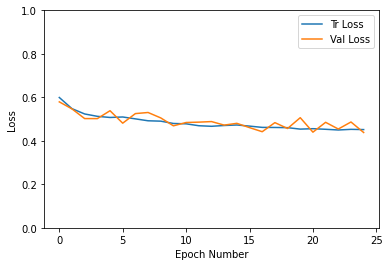

In [ ]:
history = np.array(history)
plt.plot(history[:,0:2])
plt.legend(['Tr Loss', 'Val Loss'])
plt.xlabel('Epoch Number')
plt.ylabel('Loss')
plt.ylim(0,1)
plt.savefig(dataset+'_loss_curve.png')
plt.show()

In [ ]:
def computeTestSetAccuracy(model, criterion):
    '''
    Function to compute the accuracy on the test set
    Parameters
        :param model: Model to test
        :param loss_criterion: Loss Criterion to minimize
    '''

    device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

    test_acc = 0.0
    test_loss = 0.0

    # Set to evaluation mode
    model.eval()

    # Validation loop
    y_pred_list = []
    y_true_list = []
    for j, (images, labels) in enumerate(testloader):
        images = images.to(device)
        labels = labels.to(device)

        # Forward pass - compute outputs on input data using the model
        logits = model(images)

        y_true_list.append(labels.data.to("cpu").tolist())
        #y_pred_list.append(logits.to("cpu").tolist())
        y_pred = F.softmax(logits,dim = 1)
        top_p,top_class = y_pred.topk(1,dim = 1)
        y_pred_list.append(top_class.data.to("cpu").tolist())

        loss = criterion(logits,labels)
        test_loss += loss.item()
        test_acc += accuracy(logits,labels)

    return y_pred_list, y_true_list


In [ ]:
resnet50_model.load_state_dict(torch.load('/content/Coswara-Data/ColabCovidModel.pt'))
resnet50_model.eval()
avg_test_loss, avg_test_acc = trainer.valid_batch_loop(resnet50_model,testloader)
print("Test Loss : {}".format(avg_test_loss))
print("Test Acc : {}".format(avg_test_acc))
y_pred_list, y_true_list = computeTestSetAccuracy(resnet50_model, criterion)
y_pred_list = [j for i in y_pred_list for j in i]
y_true_list = [j for i in y_true_list for j in i]
print(classification_report(y_true_list, y_pred_list, digits=3))

  0%|          | 0/53 [00:00<?, ?it/s]

Test Loss : 0.40215715709722266
Test Acc : 0.8009219765663147
              precision    recall  f1-score   support

           0      0.794     0.833     0.813       436
           1      0.811     0.769     0.789       407

    accuracy                          0.802       843
   macro avg      0.803     0.801     0.801       843
weighted avg      0.802     0.802     0.802       843



In [ ]:
model_name = 'efficientnetv2_rw_m'
import tqdm.notebook as tqdm

efficientnetv2_model = timm.create_model(model_name,pretrained=True) #load pretrained model
# Freeze model parameters
for param in efficientnetv2_model.parameters():
  param.requires_grad = False

# Change the final layer of Efficientnetv2 Model for Transfer Learning
#we are updating it as a 2-class classifier:
efficientnetv2_model.classifier = nn.Sequential(
    nn.Linear(in_features=2152, out_features=625), #2152 is the orginal in_features
    nn.ReLU(), #ReLu to be the activation function
    nn.Dropout(p=0.3),
    nn.Linear(in_features=625, out_features=256),
    nn.ReLU(),
    nn.Linear(in_features=256, out_features=2), 
)

# as we are training on GPU. Convert model to be used on GPU
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
efficientnetv2_model.to(device) # move the model to GPU
summary(efficientnetv2_model,input_size=(3,224,224))
criterion = nn.CrossEntropyLoss()
optimizer = torch.optim.Adam(efficientnetv2_model.parameters(),lr = CFG.lr)
trainer = COVIDTrainer(criterion,optimizer)
history = trainer.fit(efficientnetv2_model,trainloader,validationloader,epochs = 50)



----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1         [-1, 32, 112, 112]             864
       BatchNorm2d-2         [-1, 32, 112, 112]              64
              SiLU-3         [-1, 32, 112, 112]               0
            Conv2d-4         [-1, 32, 112, 112]           9,216
       BatchNorm2d-5         [-1, 32, 112, 112]              64
              SiLU-6         [-1, 32, 112, 112]               0
          Identity-7         [-1, 32, 112, 112]               0
            Conv2d-8         [-1, 32, 112, 112]           1,024
       BatchNorm2d-9         [-1, 32, 112, 112]              64
     EdgeResidual-10         [-1, 32, 112, 112]               0
           Conv2d-11         [-1, 32, 112, 112]           9,216
      BatchNorm2d-12         [-1, 32, 112, 112]              64
             SiLU-13         [-1, 32, 112, 112]               0
         Identity-14         [-1, 32, 1

  0%|          | 0/427 [00:00<?, ?it/s]

  0%|          | 0/48 [00:00<?, ?it/s]

Valid_loss decreased inf --> 0.6219005777190129
Epoch : 1 Train Loss : 0.572305 Train Acc : 0.699112
Epoch : 1 Valid Loss : 0.621901 Valid Acc : 0.706659


  0%|          | 0/427 [00:00<?, ?it/s]

  0%|          | 0/48 [00:00<?, ?it/s]

Valid_loss decreased 0.6219005777190129 --> 0.5594865543146929
Epoch : 2 Train Loss : 0.538622 Train Acc : 0.720189
Epoch : 2 Valid Loss : 0.559487 Valid Acc : 0.690662


  0%|          | 0/427 [00:00<?, ?it/s]

  0%|          | 0/48 [00:00<?, ?it/s]

Valid_loss decreased 0.5594865543146929 --> 0.539944584791859
Epoch : 3 Train Loss : 0.516032 Train Acc : 0.738144
Epoch : 3 Valid Loss : 0.539945 Valid Acc : 0.712426


  0%|          | 0/427 [00:00<?, ?it/s]

  0%|          | 0/48 [00:00<?, ?it/s]

Valid_loss decreased 0.539944584791859 --> 0.5156119720389446
Epoch : 4 Train Loss : 0.507042 Train Acc : 0.737998
Epoch : 4 Valid Loss : 0.515612 Valid Acc : 0.738839


  0%|          | 0/427 [00:00<?, ?it/s]

  0%|          | 0/48 [00:00<?, ?it/s]

Valid_loss decreased 0.5156119720389446 --> 0.5039913589134812
Epoch : 5 Train Loss : 0.496831 Train Acc : 0.749854
Epoch : 5 Valid Loss : 0.503991 Valid Acc : 0.733631


  0%|          | 0/427 [00:00<?, ?it/s]

  0%|          | 0/48 [00:00<?, ?it/s]

Epoch : 6 Train Loss : 0.483608 Train Acc : 0.761661
Epoch : 6 Valid Loss : 0.539739 Valid Acc : 0.743118


  0%|          | 0/427 [00:00<?, ?it/s]

  0%|          | 0/48 [00:00<?, ?it/s]

Epoch : 7 Train Loss : 0.482510 Train Acc : 0.762344
Epoch : 7 Valid Loss : 0.507988 Valid Acc : 0.750186


  0%|          | 0/427 [00:00<?, ?it/s]

  0%|          | 0/48 [00:00<?, ?it/s]

Epoch : 8 Train Loss : 0.473483 Train Acc : 0.758392
Epoch : 8 Valid Loss : 0.507459 Valid Acc : 0.750558


  0%|          | 0/427 [00:00<?, ?it/s]

  0%|          | 0/48 [00:00<?, ?it/s]

Valid_loss decreased 0.5039913589134812 --> 0.4920960757881403
Epoch : 9 Train Loss : 0.478474 Train Acc : 0.757026
Epoch : 9 Valid Loss : 0.492096 Valid Acc : 0.751302


  0%|          | 0/427 [00:00<?, ?it/s]

  0%|          | 0/48 [00:00<?, ?it/s]

Epoch : 10 Train Loss : 0.472663 Train Acc : 0.763759
Epoch : 10 Valid Loss : 0.505233 Valid Acc : 0.732329


  0%|          | 0/427 [00:00<?, ?it/s]

  0%|          | 0/48 [00:00<?, ?it/s]

Epoch : 11 Train Loss : 0.468657 Train Acc : 0.772248
Epoch : 11 Valid Loss : 0.535553 Valid Acc : 0.725446


  0%|          | 0/427 [00:00<?, ?it/s]

  0%|          | 0/48 [00:00<?, ?it/s]

Epoch : 12 Train Loss : 0.464044 Train Acc : 0.771370
Epoch : 12 Valid Loss : 0.533109 Valid Acc : 0.728981


  0%|          | 0/427 [00:00<?, ?it/s]

  0%|          | 0/48 [00:00<?, ?it/s]

Epoch : 13 Train Loss : 0.452116 Train Acc : 0.776249
Epoch : 13 Valid Loss : 0.492810 Valid Acc : 0.749628


  0%|          | 0/427 [00:00<?, ?it/s]

  0%|          | 0/48 [00:00<?, ?it/s]

Valid_loss decreased 0.4920960757881403 --> 0.4916329709812999
Epoch : 14 Train Loss : 0.463084 Train Acc : 0.772931
Epoch : 14 Valid Loss : 0.491633 Valid Acc : 0.742374


  0%|          | 0/427 [00:00<?, ?it/s]

  0%|          | 0/48 [00:00<?, ?it/s]

Valid_loss decreased 0.4916329709812999 --> 0.48131680116057396
Epoch : 15 Train Loss : 0.461142 Train Acc : 0.773078
Epoch : 15 Valid Loss : 0.481317 Valid Acc : 0.739769


  0%|          | 0/427 [00:00<?, ?it/s]

  0%|          | 0/48 [00:00<?, ?it/s]

Epoch : 16 Train Loss : 0.448092 Train Acc : 0.778591
Epoch : 16 Valid Loss : 0.488833 Valid Acc : 0.764323


  0%|          | 0/427 [00:00<?, ?it/s]

  0%|          | 0/48 [00:00<?, ?it/s]

Epoch : 17 Train Loss : 0.455071 Train Acc : 0.773663
Epoch : 17 Valid Loss : 0.498964 Valid Acc : 0.758929


  0%|          | 0/427 [00:00<?, ?it/s]

  0%|          | 0/48 [00:00<?, ?it/s]

Epoch : 18 Train Loss : 0.442523 Train Acc : 0.785617
Epoch : 18 Valid Loss : 0.587490 Valid Acc : 0.712240


  0%|          | 0/427 [00:00<?, ?it/s]

  0%|          | 0/48 [00:00<?, ?it/s]

Epoch : 19 Train Loss : 0.441276 Train Acc : 0.786397
Epoch : 19 Valid Loss : 0.493266 Valid Acc : 0.772135


  0%|          | 0/427 [00:00<?, ?it/s]

  0%|          | 0/48 [00:00<?, ?it/s]

Epoch : 20 Train Loss : 0.434122 Train Acc : 0.793618
Epoch : 20 Valid Loss : 0.489139 Valid Acc : 0.752232


  0%|          | 0/427 [00:00<?, ?it/s]

  0%|          | 0/48 [00:00<?, ?it/s]

Epoch : 21 Train Loss : 0.438583 Train Acc : 0.786739
Epoch : 21 Valid Loss : 0.494881 Valid Acc : 0.750558


  0%|          | 0/427 [00:00<?, ?it/s]

  0%|          | 0/48 [00:00<?, ?it/s]

Epoch : 22 Train Loss : 0.437759 Train Acc : 0.785861
Epoch : 22 Valid Loss : 0.502568 Valid Acc : 0.739211


  0%|          | 0/427 [00:00<?, ?it/s]

  0%|          | 0/48 [00:00<?, ?it/s]

Epoch : 23 Train Loss : 0.444031 Train Acc : 0.778932
Epoch : 23 Valid Loss : 0.495863 Valid Acc : 0.762649


  0%|          | 0/427 [00:00<?, ?it/s]

  0%|          | 0/48 [00:00<?, ?it/s]

Epoch : 24 Train Loss : 0.444323 Train Acc : 0.784397
Epoch : 24 Valid Loss : 0.481513 Valid Acc : 0.746280


  0%|          | 0/427 [00:00<?, ?it/s]

  0%|          | 0/48 [00:00<?, ?it/s]

Epoch : 25 Train Loss : 0.437530 Train Acc : 0.788691
Epoch : 25 Valid Loss : 0.491392 Valid Acc : 0.741071


  0%|          | 0/427 [00:00<?, ?it/s]

  0%|          | 0/48 [00:00<?, ?it/s]

Epoch : 26 Train Loss : 0.439288 Train Acc : 0.784153
Epoch : 26 Valid Loss : 0.545428 Valid Acc : 0.734375


  0%|          | 0/427 [00:00<?, ?it/s]

  0%|          | 0/48 [00:00<?, ?it/s]

Epoch : 27 Train Loss : 0.432214 Train Acc : 0.791862
Epoch : 27 Valid Loss : 0.512045 Valid Acc : 0.740513


  0%|          | 0/427 [00:00<?, ?it/s]

  0%|          | 0/48 [00:00<?, ?it/s]

Epoch : 28 Train Loss : 0.437876 Train Acc : 0.790545
Epoch : 28 Valid Loss : 0.525620 Valid Acc : 0.731585


  0%|          | 0/427 [00:00<?, ?it/s]

  0%|          | 0/48 [00:00<?, ?it/s]

Valid_loss decreased 0.48131680116057396 --> 0.4744735850642125
Epoch : 29 Train Loss : 0.432954 Train Acc : 0.787129
Epoch : 29 Valid Loss : 0.474474 Valid Acc : 0.769531


  0%|          | 0/427 [00:00<?, ?it/s]

  0%|          | 0/48 [00:00<?, ?it/s]

Epoch : 30 Train Loss : 0.428478 Train Acc : 0.790057
Epoch : 30 Valid Loss : 0.499123 Valid Acc : 0.765625


  0%|          | 0/427 [00:00<?, ?it/s]

  0%|          | 0/48 [00:00<?, ?it/s]

Epoch : 31 Train Loss : 0.429284 Train Acc : 0.790691
Epoch : 31 Valid Loss : 0.500368 Valid Acc : 0.747582


  0%|          | 0/427 [00:00<?, ?it/s]

  0%|          | 0/48 [00:00<?, ?it/s]

Epoch : 32 Train Loss : 0.425702 Train Acc : 0.793033
Epoch : 32 Valid Loss : 0.513368 Valid Acc : 0.755766


  0%|          | 0/427 [00:00<?, ?it/s]

  0%|          | 0/48 [00:00<?, ?it/s]

Valid_loss decreased 0.4744735850642125 --> 0.45945035200566053
Epoch : 33 Train Loss : 0.424709 Train Acc : 0.794448
Epoch : 33 Valid Loss : 0.459450 Valid Acc : 0.773438


  0%|          | 0/427 [00:00<?, ?it/s]

  0%|          | 0/48 [00:00<?, ?it/s]

Epoch : 34 Train Loss : 0.422194 Train Acc : 0.799376
Epoch : 34 Valid Loss : 0.491328 Valid Acc : 0.752418


  0%|          | 0/427 [00:00<?, ?it/s]

  0%|          | 0/48 [00:00<?, ?it/s]

Epoch : 35 Train Loss : 0.429636 Train Acc : 0.792838
Epoch : 35 Valid Loss : 0.491992 Valid Acc : 0.764881


  0%|          | 0/427 [00:00<?, ?it/s]

  0%|          | 0/48 [00:00<?, ?it/s]

Epoch : 36 Train Loss : 0.424903 Train Acc : 0.791569
Epoch : 36 Valid Loss : 0.496795 Valid Acc : 0.772321


  0%|          | 0/427 [00:00<?, ?it/s]

  0%|          | 0/48 [00:00<?, ?it/s]

Epoch : 37 Train Loss : 0.422960 Train Acc : 0.799619
Epoch : 37 Valid Loss : 0.465362 Valid Acc : 0.763207


  0%|          | 0/427 [00:00<?, ?it/s]

  0%|          | 0/48 [00:00<?, ?it/s]

Epoch : 38 Train Loss : 0.422965 Train Acc : 0.796887
Epoch : 38 Valid Loss : 0.501654 Valid Acc : 0.753534


  0%|          | 0/427 [00:00<?, ?it/s]

  0%|          | 0/48 [00:00<?, ?it/s]

Epoch : 39 Train Loss : 0.422826 Train Acc : 0.791911
Epoch : 39 Valid Loss : 0.499611 Valid Acc : 0.767113


  0%|          | 0/427 [00:00<?, ?it/s]

  0%|          | 0/48 [00:00<?, ?it/s]

Valid_loss decreased 0.45945035200566053 --> 0.4591268403455615
Epoch : 40 Train Loss : 0.414576 Train Acc : 0.800400
Epoch : 40 Valid Loss : 0.459127 Valid Acc : 0.769531


  0%|          | 0/427 [00:00<?, ?it/s]

  0%|          | 0/48 [00:00<?, ?it/s]

Valid_loss decreased 0.4591268403455615 --> 0.45072237712641555
Epoch : 41 Train Loss : 0.425392 Train Acc : 0.794643
Epoch : 41 Valid Loss : 0.450722 Valid Acc : 0.777344


  0%|          | 0/427 [00:00<?, ?it/s]

  0%|          | 0/48 [00:00<?, ?it/s]

Valid_loss decreased 0.45072237712641555 --> 0.44710503860066336
Epoch : 42 Train Loss : 0.410152 Train Acc : 0.811866
Epoch : 42 Valid Loss : 0.447105 Valid Acc : 0.783110


  0%|          | 0/427 [00:00<?, ?it/s]

  0%|          | 0/48 [00:00<?, ?it/s]

Epoch : 43 Train Loss : 0.416739 Train Acc : 0.800302
Epoch : 43 Valid Loss : 0.473673 Valid Acc : 0.791295


  0%|          | 0/427 [00:00<?, ?it/s]

  0%|          | 0/48 [00:00<?, ?it/s]

Epoch : 44 Train Loss : 0.414140 Train Acc : 0.800254
Epoch : 44 Valid Loss : 0.464131 Valid Acc : 0.778832


  0%|          | 0/427 [00:00<?, ?it/s]

  0%|          | 0/48 [00:00<?, ?it/s]

Epoch : 45 Train Loss : 0.416779 Train Acc : 0.802596
Epoch : 45 Valid Loss : 0.527622 Valid Acc : 0.737537


  0%|          | 0/427 [00:00<?, ?it/s]

  0%|          | 0/48 [00:00<?, ?it/s]

Valid_loss decreased 0.44710503860066336 --> 0.4227458940198024
Epoch : 46 Train Loss : 0.420929 Train Acc : 0.797619
Epoch : 46 Valid Loss : 0.422746 Valid Acc : 0.789993


  0%|          | 0/427 [00:00<?, ?it/s]

  0%|          | 0/48 [00:00<?, ?it/s]

Epoch : 47 Train Loss : 0.409564 Train Acc : 0.805962
Epoch : 47 Valid Loss : 0.459123 Valid Acc : 0.780878


  0%|          | 0/427 [00:00<?, ?it/s]

  0%|          | 0/48 [00:00<?, ?it/s]

Epoch : 48 Train Loss : 0.409474 Train Acc : 0.802157
Epoch : 48 Valid Loss : 0.492821 Valid Acc : 0.761905


  0%|          | 0/427 [00:00<?, ?it/s]

  0%|          | 0/48 [00:00<?, ?it/s]

Epoch : 49 Train Loss : 0.409495 Train Acc : 0.806011
Epoch : 49 Valid Loss : 0.479120 Valid Acc : 0.749814


  0%|          | 0/427 [00:00<?, ?it/s]

  0%|          | 0/48 [00:00<?, ?it/s]

Epoch : 50 Train Loss : 0.409772 Train Acc : 0.804889
Epoch : 50 Valid Loss : 0.487532 Valid Acc : 0.776228


In [ ]:
efficientnetv2_model.load_state_dict(torch.load('/content/Coswara-Data/ColabCovidModel.pt'))
efficientnetv2_model.eval()
import tqdm.notebook as tqdm

avg_test_loss, avg_test_acc = trainer.valid_batch_loop(efficientnetv2_model,testloader)


print("Test Loss : {}".format(avg_test_loss))
print("Test Acc : {}".format(avg_test_acc))

import sklearn
from sklearn.metrics import accuracy_score, cohen_kappa_score
from sklearn.metrics import classification_report

y_pred_list, y_true_list = computeTestSetAccuracy(efficientnetv2_model, criterion)

y_pred_list = [j for i in y_pred_list for j in i]
y_true_list = [j for i in y_true_list for j in i]

print(classification_report(y_true_list, y_pred_list, digits=3))

  0%|          | 0/53 [00:00<?, ?it/s]

Test Loss : 0.4126247315193122
Test Acc : 0.7883790731430054
              precision    recall  f1-score   support

           0      0.793     0.798     0.795       436
           1      0.782     0.776     0.779       407

    accuracy                          0.788       843
   macro avg      0.787     0.787     0.787       843
weighted avg      0.788     0.788     0.788       843



In [ ]:
!pip install pedalboard

     |████████████████████████████████| 5.0 MB 8.1 MB/s 


In [ ]:
# This utility takes in a directory of wav files > adds a reverb to them and saves to outpath
# Set pool to True if you want the script to pool original dataset files along with reverb files
# Adapted & modified from https://github.com/spotify/pedalboard/blob/master/examples/add_reverb_to_file.py
import argparse
import os
import sys
import warnings
from pedalboard import Pedalboard, Chorus, Reverb
import numpy as np
import soundfile as sf
from tqdm import tqdm
from tqdm.std import TqdmWarning

from pedalboard import Reverb

def PedalAudioTransformes(in_path, out_path, pool= False):
     # init defaukt params 
    board = Pedalboard([Reverb(room_size=0.8)])
    # Get initial directory in structure 
    list = os.listdir(in_path)
    for i in tqdm(range(len(list))):
      print('processing file_reverb', list[i])
      current_file = list[i]
      audio, sample_rate = sf.read(in_path + '/' + current_file)
      reverbed_file = board(audio, sample_rate)
      # _r refers to reverbed file
      print("Writing reverb##################")
      sf.write(out_path + '/' + '_r' + list[i] , reverbed_file, sample_rate)
    print("done with all!")

    if(pool == False):
      print("Pool was set to False hence not copying originals")
    if(pool == True):
      for i in tqdm(range(len(list))):
        print("Pool is set to True hence copying original files into out_dir too...")
        print('processing file_original', list[i])
        current_file = list[i]
        # _o denotes original file 
        shutil.copy(in_path + '/' + current_file,out_path + '/' + '_o' + list[i] )



In [ ]:
# optinal command to clear directory. If u are running every cell once, then u need not run this
!rm -r /content/data3/healthy/* /content/data3/positive/*

In [ ]:
# apply reverb transform to healthy dataset and copy all new transformed files along with originals to out_directory
PedalAudioTransformes('/content/data2/healthy', '/content/data4/healthy', pool = True)

  0%|          | 3/1481 [00:00<00:55, 26.82it/s]

processing file_reverb yJRZfiFIsQhFptP6nnlJp825AHF2_cough-shallow.wav
Writing reverb##################
processing file_reverb bGAOAliULjMQIFSvoMFuNCedl582_cough-heavy.wav
Writing reverb##################
processing file_reverb xyM7qnHrkeSfQsGyRCsomcKfMDG3_cough-heavy.wav
Writing reverb##################
processing file_reverb CdU4pgCdFcZxtDHTpLUn1mO9J3o2_cough-shallow.wav
Writing reverb##################
processing file_reverb XOfL6t78sMQHHG9VppmLHnaawvg2_cough-shallow.wav
Writing reverb##################
processing file_reverb dk845iIpzubUAv2YuoWHaWTLRAv2_cough-shallow.wav
Writing reverb##################
processing file_reverb 49Ih3xxOmCT53KfYuC2BKGvSAi13_cough-heavy.wav


  1%|          | 10/1481 [00:00<00:51, 28.53it/s]

Writing reverb##################
processing file_reverb jFtviHrZKLUXECg7rQPRt16g0zv1_cough-heavy.wav
Writing reverb##################
processing file_reverb 6IBOagmXVWPJaN48oiaAigwiDbw2_cough-shallow.wav
Writing reverb##################
processing file_reverb LtqbA3mrmKN4wsTG0sEoPl6fAfB2_cough-shallow.wav
Writing reverb##################
processing file_reverb pLk1k0G3cnbfzxENxL8axlc1PTj1_cough-heavy.wav
Writing reverb##################
processing file_reverb I6Mjl4neEPMnMH16WVW6oTG860L2_cough-shallow.wav
Writing reverb##################
processing file_reverb 8e6tYVdZj2btq3rYpi9zsy5VujF3_cough-shallow.wav


  1%|          | 16/1481 [00:00<00:53, 27.46it/s]

Writing reverb##################
processing file_reverb jVdlO7RPQmaumDLciCDspJInwMx2_cough-heavy.wav
Writing reverb##################
processing file_reverb KzArWjCjApUOIz69TPVaZxSKQ6W2_cough-heavy.wav
Writing reverb##################
processing file_reverb KlAIIeihTRMefwV4X9bJ6kt7E6K2_cough-heavy.wav
Writing reverb##################
processing file_reverb WTy9ym2R87WxEwQufFkYxRZDY0C3_cough-shallow.wav
Writing reverb##################
processing file_reverb W1c56dgBsoe34ilAX8vAZs8tNcX2_cough-heavy.wav
Writing reverb##################
processing file_reverb 7XQT0puqHogVWiLYzjm7pFFz9Y52_cough-heavy.wav


  2%|▏         | 23/1481 [00:00<00:50, 28.98it/s]

Writing reverb##################
processing file_reverb v0Cj73yuwacWiGqDlaVsMa1GHqd2_cough-shallow.wav
Writing reverb##################
processing file_reverb Fohk6SJxcJVo4rtuGD6PMwJ9qTQ2_cough-heavy.wav
Writing reverb##################
processing file_reverb 96vge8k4YhZKRuYBP7T1WVw2Ouz2_cough-shallow.wav
Writing reverb##################
processing file_reverb v9zvxaIjcfds4XGZvqBK0moPX8a2_cough-heavy.wav
Writing reverb##################
processing file_reverb ZThKb36K24N2UGu9fRqjlpp27da2_cough-shallow.wav
Writing reverb##################
processing file_reverb EVWPvD070lhgBsNRXIJ0TsQj3iz2_cough-shallow.wav


  2%|▏         | 29/1481 [00:01<00:57, 25.12it/s]

Writing reverb##################
processing file_reverb A0NM2SVNh9YFgRrZ4k20ePIAyiw1_cough-heavy.wav
Writing reverb##################
processing file_reverb YgKJK1UxM6NMjfugUnV4mi50d732_cough-shallow.wav
Writing reverb##################
processing file_reverb 4pSWWWdAaUd7s2dh6eXaaXeSLIO2_cough-heavy.wav
Writing reverb##################
processing file_reverb kIHldMnyvmXvpLq0LjWr7ecclSj2_cough-shallow.wav
Writing reverb##################
processing file_reverb f9g4olEAspen4dJakQJsI2EME032_cough-shallow.wav


  2%|▏         | 33/1481 [00:01<00:50, 28.55it/s]

Writing reverb##################
processing file_reverb oWBd1blxbTefqPydUAes1xlr5VJ2_cough-shallow.wav
Writing reverb##################
processing file_reverb tpCCClZhHxXqu31XbOhexT55KdP2_cough-heavy.wav
Writing reverb##################
processing file_reverb DycfRd7vyobY2PgwT3rQOemSbP53_cough-heavy.wav
Writing reverb##################
processing file_reverb ya3VviewxzdRZqbLrEXsIrvilRR2_cough-shallow.wav
Writing reverb##################
processing file_reverb esVDCnpv7ChUwuJMmzxAItbB3km1_cough-heavy.wav
Writing reverb##################
processing file_reverb HHKpf1D4mWga1lxwcxAQjZAqELv2_cough-shallow.wav


  3%|▎         | 39/1481 [00:01<00:54, 26.52it/s]

Writing reverb##################
processing file_reverb aDPRTmlNZ3XLxOMP2KafJi1lnWz2_cough-heavy.wav
Writing reverb##################
processing file_reverb j4xItLU4BzcKshmihayCM0pTooH3_cough-shallow.wav
Writing reverb##################
processing file_reverb 7dibZ9sOTyYwP45P75NlmZQksjt2_cough-heavy.wav
Writing reverb##################
processing file_reverb RNnxsLNUWPeqrfpPcDb4b903fpj2_cough-shallow.wav
Writing reverb##################
processing file_reverb Qxsv89ELtlUniEBfEvmDldEdZBy2_cough-shallow.wav
Writing reverb##################


  3%|▎         | 45/1481 [00:01<00:55, 26.02it/s]

processing file_reverb oTCyHYFIjtezHe2Tr9yZg8Lj5sv2_cough-shallow.wav
Writing reverb##################
processing file_reverb P5mI5OKQZ3WbFo8FkU7VuvAwUwz2_cough-shallow.wav
Writing reverb##################
processing file_reverb maTMkkXbqOhLPOYLpGyMPPigDFt1_cough-heavy.wav
Writing reverb##################
processing file_reverb cAdvtOxMKHg9hO3IbimCRK9Vooi1_cough-heavy.wav
Writing reverb##################
processing file_reverb GrE7GAhI8UUX1BK0QHOBGLvOQJb2_cough-heavy.wav
Writing reverb##################


  3%|▎         | 51/1481 [00:01<00:53, 26.96it/s]

processing file_reverb N926xnCk8rTlXrPA1dleXFO4XMJ3_cough-shallow.wav
Writing reverb##################
processing file_reverb XwiK6FSjg5b5RuQQFYmz67zSpYC3_cough-shallow.wav
Writing reverb##################
processing file_reverb 0kQAWAGJHffg9kZhji65QkUaEvx1_cough-shallow.wav
Writing reverb##################
processing file_reverb jFtviHrZKLUXECg7rQPRt16g0zv1_cough-shallow.wav
Writing reverb##################
processing file_reverb HdJdEWQecehLzEQcyDV7vjr85C82_cough-shallow.wav
Writing reverb##################
processing file_reverb 4aI0r8RKKtcp2MopsUZjtA6ldKx2_cough-shallow.wav
Writing reverb##################


  4%|▎         | 54/1481 [00:02<00:57, 24.87it/s]

processing file_reverb HSj0b9JLMjVfqxpQi1s6OVQXkZw1_cough-heavy.wav
Writing reverb##################
processing file_reverb blOvr1s2qrWsvkjA3QskHrSK9dp2_cough-heavy.wav
Writing reverb##################
processing file_reverb NRG3cVOEhsTaVQeeNG60tBv247Z2_cough-shallow.wav
Writing reverb##################
processing file_reverb chMsCb2SqaYxVB1lc93vPGPa5ho1_cough-heavy.wav
Writing reverb##################


  4%|▍         | 60/1481 [00:02<01:02, 22.75it/s]

processing file_reverb 49Ih3xxOmCT53KfYuC2BKGvSAi13_cough-shallow.wav
Writing reverb##################
processing file_reverb YjUO0QbUUAUJyUfgApL52jRs8Z52_cough-shallow.wav
Writing reverb##################
processing file_reverb Fuj8ConlkeNoRot2tyMMyzYCKfo2_cough-heavy.wav
Writing reverb##################
processing file_reverb 4kto18R8RwXJ0C7c0oCORNU4GZz2_cough-shallow.wav
Writing reverb##################
processing file_reverb 697xpWya0DbSEN4Y6tsEH3BchHw1_cough-heavy.wav
Writing reverb##################
processing file_reverb dtV4ZlnWakRFGKpIfiUqdu3q6iq1_cough-shallow.wav


  4%|▍         | 65/1481 [00:02<00:51, 27.66it/s]

Writing reverb##################
processing file_reverb Uy5OhcHEQXY65CsYbiRPtN7RVBf1_cough-shallow.wav
Writing reverb##################
processing file_reverb JUVJnOVJKKcdzppK3hkci4TO4ij1_cough-shallow.wav
Writing reverb##################
processing file_reverb KFtd9lY6jph5cl2VrZ9Nv8Jng7p1_cough-heavy.wav
Writing reverb##################
processing file_reverb U5bTmSt9PRfWHiGleINUHMl8cg13_cough-shallow.wav
Writing reverb##################
processing file_reverb IvPA6FZJ5OSNOllqglmE2mkcnz83_cough-shallow.wav
Writing reverb##################
processing file_reverb K0LmigcBKlRdTAlrCyfmBJaQJwk1_cough-shallow.wav
Writing reverb##################
processing file_reverb Gkp0AAA7iJakBNaPSDfnA5eEUoN2_cough-shallow.wav
Writing reverb##################


  5%|▍         | 73/1481 [00:02<00:48, 29.06it/s]

processing file_reverb D1d4hc9MrgTDxgAhqpTgqOEJtLp2_cough-heavy.wav
Writing reverb##################
processing file_reverb GBZ88OAxQfg6NBTxjDRI0Pf59mq1_cough-heavy.wav
Writing reverb##################
processing file_reverb A6cnzNlOAmM8GCpUKtC1ZwTKUiO2_cough-shallow.wav
Writing reverb##################
processing file_reverb HRtlc2Oedzd7Q70BgFjlJGMbyPL2_cough-shallow.wav
Writing reverb##################
processing file_reverb 8XF2UFLn3Wd6dHHMdOlcGbQiMqb2_cough-shallow.wav
Writing reverb##################
processing file_reverb sGG3SWYeDtd52RBt3dMM3HSv8SG3_cough-heavy.wav
Writing reverb##################


  5%|▌         | 77/1481 [00:02<00:49, 28.58it/s]

processing file_reverb CzQMWbaavKTyWVIDQkA8n4pt9ap2_cough-heavy.wav
Writing reverb##################
processing file_reverb VB3X18XtrRdSVJ8zDzdyKohlX2F2_cough-heavy.wav
Writing reverb##################
processing file_reverb W9McKFKrXiTydseUw3gSUyTpROH2_cough-heavy.wav
Writing reverb##################
processing file_reverb DQbyjZoEh1chrWRqOkPrUsxvqpv2_cough-shallow.wav
Writing reverb##################
processing file_reverb HJP1QvC3s2cTtjBRHQic5Y1EBGj1_cough-shallow.wav
Writing reverb##################


  6%|▌         | 83/1481 [00:03<00:53, 26.29it/s]

processing file_reverb 3xebjLX0tvTb7LwpMw7QiNixBln2_cough-heavy.wav
Writing reverb##################
processing file_reverb ki8Scyp1FRUOGvhgpjYjYFgx0gp1_cough-shallow.wav
Writing reverb##################
processing file_reverb b5dxDgKCZXVNYVrBLTjeV1rGoW62_cough-shallow.wav
Writing reverb##################
processing file_reverb nXZU2OEKmtPSXhbaHZAKb3snrJt2_cough-shallow.wav
Writing reverb##################
processing file_reverb 2suYua5dbdh2cSreNFm8flktMEc2_cough-shallow.wav
Writing reverb##################
processing file_reverb Eik9USYv51RYy1mxzPOGxPLhn4o1_cough-heavy.wav
Writing reverb##################


  6%|▌         | 90/1481 [00:03<00:52, 26.30it/s]

processing file_reverb 9JhZlp6ebpZYjnKlK2NTZTihDme2_cough-heavy.wav
Writing reverb##################
processing file_reverb 4wRQbTA56AgZ27o7Yq6oVWUzR7A3_cough-shallow.wav
Writing reverb##################
processing file_reverb FBdqiwdp4Kc7PpyUkLBM9qMSo2k1_cough-heavy.wav
Writing reverb##################
processing file_reverb WedAZ6DrnjVQSxRJY8qRajogvtD2_cough-shallow.wav
Writing reverb##################
processing file_reverb A9YX4pRpOyW1PuuL9YjMs0kFQI03_cough-shallow.wav


  6%|▋         | 93/1481 [00:03<01:01, 22.63it/s]

Writing reverb##################
processing file_reverb ya3VviewxzdRZqbLrEXsIrvilRR2_cough-heavy.wav
Writing reverb##################
processing file_reverb 90jN60jxwIMkR1qknR8Ziahvbe53_cough-shallow.wav
Writing reverb##################
processing file_reverb hB8ntHij4nOm6YoGj86MtZJVTyr2_cough-heavy.wav
Writing reverb##################
processing file_reverb 0W7xMFW538WmDghkiujx2v4xVnt2_cough-shallow.wav
Writing reverb##################
processing file_reverb BNbiq1U3xWVT44hg7Bl0f8SWjbt2_cough-shallow.wav
Writing reverb##################


  7%|▋         | 99/1481 [00:03<01:01, 22.52it/s]

processing file_reverb cfkQZPXKiwUdOgACOzPoZ7alrOh1_cough-heavy.wav
Writing reverb##################
processing file_reverb X2CDAl47UaUtiS9UGq7Yn0NTOLu2_cough-heavy.wav
Writing reverb##################
processing file_reverb wcKHRzi3zFZi7KNZqDcQD2wXkUm1_cough-shallow.wav
Writing reverb##################
processing file_reverb pqhuVm6oPbd3A4FSf5p9shz9OO02_cough-heavy.wav
Writing reverb##################
processing file_reverb t36yqxelXtUEMy6tQJd8Bn1Kr673_cough-heavy.wav


  7%|▋         | 106/1481 [00:04<00:53, 25.50it/s]

Writing reverb##################
processing file_reverb g2CeKxcydaSeP7WB3qIWjB8ZW8o1_cough-shallow.wav
Writing reverb##################
processing file_reverb 8FnL5QpBazelNsGBTVkBuTSpMEt1_cough-shallow.wav
Writing reverb##################
processing file_reverb Q2rqPfhdilf16SbycBrtJ4gQ5Ep1_cough-heavy.wav
Writing reverb##################
processing file_reverb tTiUDsa4jOZtI0YC3hTl0NZlVGB2_cough-heavy.wav
Writing reverb##################
processing file_reverb smnOOz3onPU2GxyyQuwVJuiU0No1_cough-heavy.wav
Writing reverb##################
processing file_reverb lJlHlD5QIlOavw5qLRHbyR18T0H2_cough-heavy.wav


  7%|▋         | 109/1481 [00:04<00:57, 23.89it/s]

Writing reverb##################
processing file_reverb EZzVAG1b5ef8VopTkIROvVbYGml1_cough-heavy.wav
Writing reverb##################
processing file_reverb yMJAWvrwJOUbMR0ev3LeqgWr0zI2_cough-shallow.wav
Writing reverb##################
processing file_reverb SG95RAgm0wY3bzyIZPPSpHwyYuD3_cough-heavy.wav
Writing reverb##################
processing file_reverb aTSU2ShIvnMzIsWQo2OoiyLxIZl1_cough-heavy.wav
Writing reverb##################
processing file_reverb 0gB18cWHioTobGuU3qVE0QV5mBN2_cough-heavy.wav
Writing reverb##################
processing file_reverb FSzobvJqOXf0rI6X05cHqOiU9Mu2_cough-heavy.wav


  8%|▊         | 116/1481 [00:04<00:55, 24.78it/s]

Writing reverb##################
processing file_reverb JuzR5zpE9HU3NsFabIcz4Kkp0Ag1_cough-heavy.wav
Writing reverb##################
processing file_reverb LqGeCxef4fN4IPanKEbWkO1fAwJ3_cough-heavy.wav
Writing reverb##################
processing file_reverb yxCtaUoJBHXnzfMfxfA9rJGR5ue2_cough-heavy.wav
Writing reverb##################
processing file_reverb 9Rhe6RDHuMNXaGiqKVaspw71Exo1_cough-shallow.wav
Writing reverb##################
processing file_reverb 779c1GiOSsSsxsi1PrMGXwOrIuo2_cough-heavy.wav
Writing reverb##################
processing file_reverb WBNoFWUY9MhZOfFiLvIDsfIWnSZ2_cough-shallow.wav


  8%|▊         | 124/1481 [00:04<00:45, 29.54it/s]

Writing reverb##################
processing file_reverb pNGFDTnofMXgetTUrGCD0ZurV383_cough-heavy.wav
Writing reverb##################
processing file_reverb 3kUDnCX53IYe2LGsEDHwuXE8bWP2_cough-shallow.wav
Writing reverb##################
processing file_reverb yTBcpP8fONc1QpKYqlaQDyo5DYy2_cough-shallow.wav
Writing reverb##################
processing file_reverb 796K27lWKTfniw99yaqsYIvPrvi1_cough-shallow.wav
Writing reverb##################
processing file_reverb qDaEukMgm3YGWKR1SdJqKIaxG6Z2_cough-heavy.wav
Writing reverb##################
processing file_reverb ByvAxiKJC5QyNZi2YJu6GyZYgPs1_cough-heavy.wav
Writing reverb##################


  9%|▊         | 128/1481 [00:04<00:50, 26.59it/s]

processing file_reverb 6VbC2mWfKiWVQPL1tHVmG5eCkua2_cough-shallow.wav
Writing reverb##################
processing file_reverb c8fyZREWSdfus5ISad0LwnMAUcQ2_cough-heavy.wav
Writing reverb##################
processing file_reverb SQb3JATyGKUZvdfaoVEBhhB2d752_cough-shallow.wav
Writing reverb##################
processing file_reverb jvrGsRzHKEU4izNgLFGitM7AZVK2_cough-shallow.wav
Writing reverb##################
processing file_reverb zl0ycIoAzhSJU1xsyLSNCDQA9Rr2_cough-heavy.wav
Writing reverb##################
processing file_reverb v8cNN5eg09b4auxFmOqPrNiTZBu1_cough-heavy.wav


  9%|▉         | 134/1481 [00:05<00:52, 25.90it/s]

Writing reverb##################
processing file_reverb g6wE0LPtHWdH7XAWDCGHB5Kj1So1_cough-heavy.wav
Writing reverb##################
processing file_reverb 3FD9salx6KQf114qJSSvW74Ffi63_cough-shallow.wav
Writing reverb##################
processing file_reverb M3mk9u8tIBUCavOhsxcGej5s9Vg2_cough-heavy.wav
Writing reverb##################
processing file_reverb WedAZ6DrnjVQSxRJY8qRajogvtD2_cough-heavy.wav
Writing reverb##################
processing file_reverb LyyyoHyVVygA9sFTiv5SWaaUR2E3_cough-shallow.wav


  9%|▉         | 140/1481 [00:05<00:54, 24.69it/s]

Writing reverb##################
processing file_reverb 5q8gLM0yCrgGCT8F9fWlH4ycl1D3_cough-heavy.wav
Writing reverb##################
processing file_reverb X2CDAl47UaUtiS9UGq7Yn0NTOLu2_cough-shallow.wav
Writing reverb##################
processing file_reverb n4t5cgNQKXO3F8KP55vWOgYWcXC3_cough-shallow.wav
Writing reverb##################
processing file_reverb 65JopCV7ExeP1scqYfg8nP5KjKy2_cough-shallow.wav
Writing reverb##################
processing file_reverb SeJVLdrWddXdcxmY9Q51FUjCFRv1_cough-heavy.wav


 10%|▉         | 144/1481 [00:05<00:50, 26.68it/s]

Writing reverb##################
processing file_reverb 22oBvWaWwBhbdNfWoshbse1qZ4q2_cough-shallow.wav
Writing reverb##################
processing file_reverb QU89L9WuhdW74Fj41RQwBPCl9Vv1_cough-shallow.wav
Writing reverb##################
processing file_reverb y9eSqZBOJbUkIbg9oM0XSACsIg33_cough-heavy.wav
Writing reverb##################
processing file_reverb wByjVbPfagQsv9nerwycE1QDQ5B3_cough-heavy.wav
Writing reverb##################
processing file_reverb KL32QXSSnLZlRRT2B6rQQQKgpx12_cough-heavy.wav
Writing reverb##################
processing file_reverb 4pSWWWdAaUd7s2dh6eXaaXeSLIO2_cough-shallow.wav


 10%|█         | 150/1481 [00:05<00:53, 25.01it/s]

Writing reverb##################
processing file_reverb Hsd2XPLTHxa0q43WgjzaQl22cB42_cough-heavy.wav
Writing reverb##################
processing file_reverb QLfHliTV2YMbuC5y06vcclyWdEF2_cough-heavy.wav
Writing reverb##################
processing file_reverb YXqC5B7h7iQZH3RubUFG6SBvZ5L2_cough-shallow.wav
Writing reverb##################
processing file_reverb 22oBvWaWwBhbdNfWoshbse1qZ4q2_cough-heavy.wav
Writing reverb##################
processing file_reverb EkvdE7B9zuaZEHjb80RflGGqsgz1_cough-shallow.wav
Writing reverb##################
processing file_reverb ZdpBUfXPEpShEdHGVTUxULhNtn23_cough-shallow.wav


 11%|█         | 157/1481 [00:06<00:49, 26.69it/s]

Writing reverb##################
processing file_reverb acNcVO2ualNYfKX5k7tJe2nw40Q2_cough-shallow.wav
Writing reverb##################
processing file_reverb uzZEBGlFZ5c1dY39rmcphVB0s1q2_cough-heavy.wav
Writing reverb##################
processing file_reverb fja76ZsTgfPWoDCUcwnRLI5XrLZ2_cough-heavy.wav
Writing reverb##################
processing file_reverb xDgSKI3IBQNu2G3msYhxC7URtop1_cough-heavy.wav
Writing reverb##################
processing file_reverb vus9YM3VqCXq3QckSGoeHJs6pBN2_cough-heavy.wav
Writing reverb##################


 11%|█         | 160/1481 [00:06<00:52, 25.22it/s]

processing file_reverb IYNMqzUgqfdUnKv5uRtM4BOnOBq2_cough-heavy.wav
Writing reverb##################
processing file_reverb l1ObBBBZYMOCAlTxeFyd1ToMwjy2_cough-shallow.wav
Writing reverb##################
processing file_reverb 6sUnPQNXQCYawfmLL8Pg91UxoiI3_cough-shallow.wav
Writing reverb##################
processing file_reverb jaNAcGlkQvUYEcRFXm5gNwnOOn93_cough-heavy.wav
Writing reverb##################
processing file_reverb 5CuTYRsGM5QRNjG7HejSHQh7ULi1_cough-heavy.wav
Writing reverb##################
processing file_reverb yTBcpP8fONc1QpKYqlaQDyo5DYy2_cough-heavy.wav


 11%|█▏        | 167/1481 [00:06<00:49, 26.55it/s]

Writing reverb##################
processing file_reverb 33uBb3ZF1NekffyAZpRdmyP0KHH2_cough-heavy.wav
Writing reverb##################
processing file_reverb blOvr1s2qrWsvkjA3QskHrSK9dp2_cough-shallow.wav
Writing reverb##################
processing file_reverb 0Ha52POVIxTKEPqI1eGpIoMHUd52_cough-shallow.wav
Writing reverb##################
processing file_reverb IVQDOUP0a8cwMvCkp1TnZ1FI88Z2_cough-shallow.wav
Writing reverb##################
processing file_reverb qRSYuXkgdobbygXanSccCsfBiSK2_cough-heavy.wav
Writing reverb##################
processing file_reverb vBRMIg1ACdeSAFmcWnII6ZkDefV2_cough-shallow.wav


 12%|█▏        | 173/1481 [00:06<00:54, 24.11it/s]

Writing reverb##################
processing file_reverb wawUd75qJgXdQz6qxRATEzuKvMn1_cough-shallow.wav
Writing reverb##################
processing file_reverb DRBAZX64nuVtqBQf13gH7r36Mh52_cough-heavy.wav
Writing reverb##################
processing file_reverb 0KOy96zEUfdMY4rZzwrDT0gMPDa2_cough-shallow.wav
Writing reverb##################
processing file_reverb D1d4hc9MrgTDxgAhqpTgqOEJtLp2_cough-shallow.wav
Writing reverb##################
processing file_reverb LGiTXwr1u8YlLpxd1nvTlhGCZJn2_cough-heavy.wav


 12%|█▏        | 179/1481 [00:06<00:51, 25.28it/s]

Writing reverb##################
processing file_reverb 3CMQ3nCRdaU5K8pfUiqOpzUgQRz2_cough-heavy.wav
Writing reverb##################
processing file_reverb l4rsSAm6LtVu9k22v8PJnYp1pnC3_cough-heavy.wav
Writing reverb##################
processing file_reverb stnT0xsBXhb159fZrbzN9kwAKvF2_cough-shallow.wav
Writing reverb##################
processing file_reverb AaGldp1blyVKOPpV1KVhsPhrmAg1_cough-shallow.wav
Writing reverb##################
processing file_reverb CbcXlISWX6QO53j2LN51KavaaBz2_cough-shallow.wav


 12%|█▏        | 182/1481 [00:07<00:52, 24.90it/s]

Writing reverb##################
processing file_reverb awro2Lz4F9SgVweiUzROf1IE8GK2_cough-heavy.wav
Writing reverb##################
processing file_reverb htQzROl26OWQpIYFDzv11F79PLR2_cough-heavy.wav
Writing reverb##################
processing file_reverb 2BdU00Hv7XWhJQOz0TiyeLtvbAG3_cough-heavy.wav
Writing reverb##################
processing file_reverb nvtJhCfKkSheYFFpSkCxF1ZYnmr1_cough-shallow.wav
Writing reverb##################
processing file_reverb F2sQBi45ZdZMn8gQdcQB5wklMct2_cough-shallow.wav
Writing reverb##################


 13%|█▎        | 188/1481 [00:07<00:50, 25.83it/s]

processing file_reverb Y5eS0NFkNCPdRy7EFiTvm5QJ4qO2_cough-heavy.wav
Writing reverb##################
processing file_reverb PzAQz6zDDcPbdSePDK02jGd4Rm42_cough-heavy.wav
Writing reverb##################
processing file_reverb yQoN4YK60acISpPHhXR5YQKM9mm2_cough-shallow.wav
Writing reverb##################
processing file_reverb Mx0Ij186LMVXmLB3xX54QCAbyhu1_cough-heavy.wav
Writing reverb##################
processing file_reverb 9dNkv55RCuQGvkd7ueflfG6VT2W2_cough-heavy.wav
Writing reverb##################
processing file_reverb gRD62e1wMoOWkrXS4zbWu95DXj93_cough-heavy.wav


 13%|█▎        | 194/1481 [00:07<00:51, 25.05it/s]

Writing reverb##################
processing file_reverb kvrE8UiQfHO8R7NaadPtaHRLqtG3_cough-shallow.wav
Writing reverb##################
processing file_reverb JxSb6sEnk0RC9NPyET9sCpJ3OqN2_cough-heavy.wav
Writing reverb##################
processing file_reverb GzhrTQhWHSTwvweRKx2x1Uh4wx52_cough-shallow.wav
Writing reverb##################
processing file_reverb L5tZkFTeajV4uDCQnvbWLNoG5az1_cough-heavy.wav
Writing reverb##################
processing file_reverb AHHrquikw8db8IuCsKUXqunYJz73_cough-shallow.wav
Writing reverb##################
processing file_reverb cmb5xzMisFOW3SKYjF7C8mgLfD83_cough-shallow.wav


 14%|█▎        | 200/1481 [00:07<00:55, 23.23it/s]

Writing reverb##################
processing file_reverb NatLK4N2EkhPwEQoxz59taEL3B32_cough-shallow.wav
Writing reverb##################
processing file_reverb YRwYptwqVUfHZbZh1hiqsczaT8m1_cough-heavy.wav
Writing reverb##################
processing file_reverb hD3OkVpgQJNlJSQxLgzqXzHp4jr2_cough-shallow.wav
Writing reverb##################
processing file_reverb aC09qmwnQ6MboJlAAdxf0DGr9Ay2_cough-heavy.wav


 14%|█▎        | 203/1481 [00:07<00:55, 22.94it/s]

Writing reverb##################
processing file_reverb k9c8ik6XlhbYFnHoXHqyDIQ5axe2_cough-shallow.wav
Writing reverb##################
processing file_reverb Qriv4y0rwfWRZDatFMOj9zdXeB43_cough-shallow.wav
Writing reverb##################
processing file_reverb UJqJesZ2UHZm7YnsQZkzNzXdoFC2_cough-shallow.wav
Writing reverb##################
processing file_reverb CzQMWbaavKTyWVIDQkA8n4pt9ap2_cough-shallow.wav
Writing reverb##################
processing file_reverb vn3xkK3lIdViBCa9kMj8LDOy9yV2_cough-heavy.wav


 14%|█▍        | 209/1481 [00:08<00:57, 22.09it/s]

Writing reverb##################
processing file_reverb JCDtX8bUuMbQNeh7SkMjavkAgVv2_cough-shallow.wav
Writing reverb##################
processing file_reverb Bjp6S2aILuesK2yOZQIG06WliTM2_cough-shallow.wav
Writing reverb##################
processing file_reverb ekXeaNBZYgZvh7mpGGwDQR4Jlwv2_cough-heavy.wav
Writing reverb##################
processing file_reverb 9D1go0wkvuPkFebFk4uQQpcBuZw1_cough-heavy.wav


 14%|█▍        | 212/1481 [00:08<00:59, 21.15it/s]

Writing reverb##################
processing file_reverb evcMtXUBFWS6bXPYqv7BXVfqFIc2_cough-shallow.wav
Writing reverb##################
processing file_reverb xf8WMloFOzegmJfwltZVuSQHTyA2_cough-shallow.wav
Writing reverb##################
processing file_reverb l6n5YnEHttTxhcwv6q69TcLSpSK2_cough-shallow.wav
Writing reverb##################
processing file_reverb IQJWFucM7GbQ00iw3lt2UvBFzaW2_cough-shallow.wav
Writing reverb##################


 15%|█▍        | 218/1481 [00:08<00:57, 21.90it/s]

processing file_reverb vus9YM3VqCXq3QckSGoeHJs6pBN2_cough-shallow.wav
Writing reverb##################
processing file_reverb ZuysSjckdLWhDEc9mARQwWpXfIj2_cough-heavy.wav
Writing reverb##################
processing file_reverb 6BGTwwcsLoZpqSMhSzFeT2Z7Pqr2_cough-heavy.wav
Writing reverb##################
processing file_reverb UX72LWicujPNyj9W7fb8xbtLuu13_cough-heavy.wav
Writing reverb##################
processing file_reverb PZhCH5PyO8RD2FPFQbeCmuGB5q33_cough-shallow.wav


 15%|█▍        | 221/1481 [00:08<00:58, 21.45it/s]

Writing reverb##################
processing file_reverb WifTQoZzOTcQ53HiZNJUQOXehde2_cough-shallow.wav
Writing reverb##################
processing file_reverb 3OQBJD8fnBepqWPGQT3eTozrhLn1_cough-shallow.wav
Writing reverb##################
processing file_reverb StMoprM57wPyrUs5p0s78r1X0Qt1_cough-heavy.wav
Writing reverb##################
processing file_reverb g6L8s5Dtq8eIYUTeRWHq0Q7w5L32_cough-shallow.wav
Writing reverb##################
processing file_reverb gfAVpM1IV5RhiO6CAiOjjn1AHVG2_cough-heavy.wav


 15%|█▌        | 227/1481 [00:08<00:54, 23.14it/s]

Writing reverb##################
processing file_reverb nPnKdupHeJQ46bqslx7STREbkXt2_cough-heavy.wav
Writing reverb##################
processing file_reverb WSwgjHhTOHQwKb5nreCV0KvGcar2_cough-shallow.wav
Writing reverb##################
processing file_reverb L6Bo4rMk15fKste9Gvn7ZyTB4qw2_cough-heavy.wav
Writing reverb##################
processing file_reverb 7TCSKiPfz5g0WKicjrKDC0BGURI2_cough-shallow.wav
Writing reverb##################
processing file_reverb vEuocXKs0mhMOO3e5l5ZWImJG6O2_cough-heavy.wav


 16%|█▌        | 233/1481 [00:09<00:55, 22.40it/s]

Writing reverb##################
processing file_reverb symIMnhx0SXZB11UPJXEWP4pTbO2_cough-heavy.wav
Writing reverb##################
processing file_reverb R1wbQWmviENBtOcugCHjcmvRl6o2_cough-shallow.wav
Writing reverb##################
processing file_reverb RJCywZ62exQqXX42zLDhAuaVjdt1_cough-heavy.wav
Writing reverb##################
processing file_reverb jSb7SyucSmTHhzs3qQoBExRMQZ02_cough-shallow.wav
Writing reverb##################
processing file_reverb YDqGf8vnHSPjo3q3PjdkQ5Pm7C12_cough-heavy.wav


 16%|█▌        | 236/1481 [00:09<00:51, 23.98it/s]

Writing reverb##################
processing file_reverb Q9mjuJioRUSHLiSgS67ZTjRtCy53_cough-shallow.wav
Writing reverb##################
processing file_reverb IkwAlxsvmhXfpi9seBDU6rksY7C2_cough-shallow.wav
Writing reverb##################
processing file_reverb Z7ZMrrVuJKSK1JEfLQjxGXI1VTq1_cough-heavy.wav
Writing reverb##################
processing file_reverb TRK6gUseEUS7dbF0soG80W1uLm53_cough-heavy.wav
Writing reverb##################
processing file_reverb nyOEOseZX2cXF7ItBTJP316eTrx2_cough-shallow.wav
Writing reverb##################
processing file_reverb FCo8orfgs5ZKKQV4T436XCoycht2_cough-heavy.wav


 16%|█▋        | 244/1481 [00:09<00:47, 26.18it/s]

Writing reverb##################
processing file_reverb srdG1jMMYHUtAU7bKP1dsbwJvxv1_cough-shallow.wav
Writing reverb##################
processing file_reverb tLK9Z6BpfWVDFV7DQKMnEy0Woo22_cough-heavy.wav
Writing reverb##################
processing file_reverb g9WjuKnjoYZYmLVDY86u4JIwZ333_cough-shallow.wav
Writing reverb##################
processing file_reverb YPqxeCMKNuMVhEg9xQPA4hD8dQC2_cough-shallow.wav
Writing reverb##################
processing file_reverb H3sxaOqiOSgbKWig7NdWEPgrm6f2_cough-shallow.wav
Writing reverb##################
processing file_reverb k7R0sHWreMTQCDnV5dMzd7t101A3_cough-heavy.wav


 17%|█▋        | 250/1481 [00:09<00:49, 25.01it/s]

Writing reverb##################
processing file_reverb McLUd3uodlMnWlISFfbnhLZqNpv2_cough-heavy.wav
Writing reverb##################
processing file_reverb 3l8trtOxHWOmdBh9WI5HgaVcAyi1_cough-shallow.wav
Writing reverb##################
processing file_reverb aLeBZp6qmVVooQsTvP1ptnQk9IS2_cough-shallow.wav
Writing reverb##################
processing file_reverb vqIREUmn5CMqyrMHxlLVmcuN5qW2_cough-shallow.wav
Writing reverb##################
processing file_reverb X2oCYyUk9HQsz8UHY03sxnrCXGF3_cough-shallow.wav


 17%|█▋        | 253/1481 [00:10<00:53, 22.95it/s]

Writing reverb##################
processing file_reverb 6EIX9NrJ1oWfURDgcOsxZ8j4z5o2_cough-heavy.wav
Writing reverb##################
processing file_reverb 2zAfpSxYt0O6Bl7qwUhicdCoyY42_cough-shallow.wav
Writing reverb##################
processing file_reverb zga52aKD4sQJbsqwZg1RrLKjkus2_cough-shallow.wav
Writing reverb##################
processing file_reverb 1BFTsgEVsJdltjiXvECDOi35nT53_cough-heavy.wav
Writing reverb##################
processing file_reverb NkibhMc8cVQQq1cj4RSU3NkkMW33_cough-shallow.wav


 17%|█▋        | 259/1481 [00:10<00:48, 25.09it/s]

Writing reverb##################
processing file_reverb ResMUOUcy2MrsL3bksITWifqla52_cough-heavy.wav
Writing reverb##################
processing file_reverb 1BFTsgEVsJdltjiXvECDOi35nT53_cough-shallow.wav
Writing reverb##################
processing file_reverb ZuysSjckdLWhDEc9mARQwWpXfIj2_cough-shallow.wav
Writing reverb##################
processing file_reverb zdUE4UjuVwXhBeBZqWBGCDL9CSx2_cough-shallow.wav
Writing reverb##################
processing file_reverb gdMY0DOvz8QrFltj0X4Ez0PpsHS2_cough-heavy.wav
Writing reverb##################
processing file_reverb H1Ml5J5BxFT5aJB3687GpncQjOi2_cough-heavy.wav


 18%|█▊        | 266/1481 [00:10<00:44, 27.58it/s]

Writing reverb##################
processing file_reverb Ts5Rbl9h9pWKqCQPJwoTduGvjMm2_cough-heavy.wav
Writing reverb##################
processing file_reverb zLJnwXeJwCZI7uk7aDmLweAZCIl2_cough-shallow.wav
Writing reverb##################
processing file_reverb LuWrKc4LBRWEfrsF2sCdR7o57m12_cough-heavy.wav
Writing reverb##################
processing file_reverb XlPcBLOUHdNZwOeNJvVy1KfjQDf2_cough-shallow.wav
Writing reverb##################
processing file_reverb 8XoAGDSPjVWjpjfIDHrIiHd4NEC2_cough-shallow.wav
Writing reverb##################
processing file_reverb zyX6JZlkhxayEeUP5SL4L6WA1h13_cough-shallow.wav


 18%|█▊        | 272/1481 [00:10<00:45, 26.61it/s]

Writing reverb##################
processing file_reverb gXKyKSft8sWALKf93iCMzoiYitW2_cough-heavy.wav
Writing reverb##################
processing file_reverb 1gKYFXop8UQtz5vrzrbVcnjX0Vi1_cough-heavy.wav
Writing reverb##################
processing file_reverb HSj0b9JLMjVfqxpQi1s6OVQXkZw1_cough-shallow.wav
Writing reverb##################
processing file_reverb LElWV2QtC5fwpqpIdAFEmaLX3Aw1_cough-shallow.wav
Writing reverb##################
processing file_reverb ZwwWzt46hVhcDukhR2G4bCNnZe52_cough-heavy.wav
Writing reverb##################


 19%|█▉        | 279/1481 [00:10<00:43, 27.80it/s]

processing file_reverb xf8WMloFOzegmJfwltZVuSQHTyA2_cough-heavy.wav
Writing reverb##################
processing file_reverb nkSUWnQgO0Tn7flFkVp7CrdsatW2_cough-shallow.wav
Writing reverb##################
processing file_reverb ZFjDpdVMiNgc4ApSUv0yY4b4B193_cough-heavy.wav
Writing reverb##################
processing file_reverb aisIUPkXXdQv8nvNAjeJb8cebOq2_cough-shallow.wav
Writing reverb##################
processing file_reverb nsmJcSu7zRYegSynfe707MwRpjp2_cough-heavy.wav
Writing reverb##################
processing file_reverb EcO51zxmIHcVtAUlxnvO6wA8JcR2_cough-heavy.wav
Writing reverb##################
processing file_reverb zNNcSmfHhTbjLm5NcVmrOAf5C2j2_cough-shallow.wav


 19%|█▉        | 285/1481 [00:11<00:42, 27.84it/s]

Writing reverb##################
processing file_reverb w1TDsR75t5PsGyAksqF3kMQ6DXT2_cough-heavy.wav
Writing reverb##################
processing file_reverb aBhVajwUynU2XvqHDXl7EA9bVNm1_cough-heavy.wav
Writing reverb##################
processing file_reverb ArfyG6NyeWefgvOsFhWMWSkhebE3_cough-heavy.wav
Writing reverb##################
processing file_reverb mvUyFeIK2CSh8vtYDviTKeSQuZ62_cough-heavy.wav
Writing reverb##################
processing file_reverb SEQ5HfLxZBdOymQjE5xiTbBPtjj2_cough-heavy.wav
Writing reverb##################
processing file_reverb gfAVpM1IV5RhiO6CAiOjjn1AHVG2_cough-shallow.wav


 19%|█▉        | 288/1481 [00:11<00:46, 25.86it/s]

Writing reverb##################
processing file_reverb 5Lln9rjGG3RqbQ1bo0SzlkB0vxq2_cough-heavy.wav
Writing reverb##################
processing file_reverb 6YaTXgSnexec5CPOQg0EboLqnJJ2_cough-shallow.wav
Writing reverb##################
processing file_reverb 60Ig4PmU9NMqKGDMR8Um0Tc2KXB3_cough-heavy.wav
Writing reverb##################
processing file_reverb vwUqgVSWMCWzCNxdD8uE97pk0I53_cough-heavy.wav
Writing reverb##################
processing file_reverb QKEe27GzshbGSIGQZ6nB6lpLb7l2_cough-shallow.wav


 20%|█▉        | 295/1481 [00:11<00:43, 27.07it/s]

Writing reverb##################
processing file_reverb Jw7YMfwGqMX22UbHh1TTgYMTYWs1_cough-shallow.wav
Writing reverb##################
processing file_reverb jaNAcGlkQvUYEcRFXm5gNwnOOn93_cough-shallow.wav
Writing reverb##################
processing file_reverb yZuoG6z3pRfycT6JKqwqKDMj4tM2_cough-shallow.wav
Writing reverb##################
processing file_reverb RFqBDNt9sLR9PxvBliE1JhFVzK42_cough-shallow.wav
Writing reverb##################
processing file_reverb UJkJrzKjH6UQRZF7eHhUQVQwCHB2_cough-shallow.wav
Writing reverb##################
processing file_reverb XCgsAnLqDUW7V3qSgO6exYqSvvB3_cough-shallow.wav


 20%|██        | 301/1481 [00:11<00:45, 25.95it/s]

Writing reverb##################
processing file_reverb J88lvfqwdhSF124B97PL8XHvUnp1_cough-shallow.wav
Writing reverb##################
processing file_reverb yHn6UxlPk8RvWZ3X5jrTa89CPwG2_cough-heavy.wav
Writing reverb##################
processing file_reverb nE9m0JsRXTYoni1nN9LpiBJJJXJ2_cough-shallow.wav
Writing reverb##################
processing file_reverb eP8gEM0KcBU6S5JpMdycX74KP3p2_cough-shallow.wav
Writing reverb##################
processing file_reverb 8ZV97Hmq6VSrBRqWaiOLx44cHY33_cough-shallow.wav
Writing reverb##################


 21%|██        | 307/1481 [00:12<00:45, 25.85it/s]

processing file_reverb XGXvJt5p7wQ7fcvMbdN92bAPzZE2_cough-heavy.wav
Writing reverb##################
processing file_reverb DZmX1dGK8KdmY3WYQFuCXrVWuhk2_cough-heavy.wav
Writing reverb##################
processing file_reverb p0NEd67WfNMVpZuyt7ECTS6VxDa2_cough-heavy.wav
Writing reverb##################
processing file_reverb O7eAgc4vq5fZQmGh60gDaMxOjgz2_cough-shallow.wav
Writing reverb##################
processing file_reverb LYJToDRYDZfpjBuNC6YkUcphr0q1_cough-shallow.wav
Writing reverb##################
processing file_reverb KlAIIeihTRMefwV4X9bJ6kt7E6K2_cough-shallow.wav


 21%|██        | 313/1481 [00:12<00:43, 26.72it/s]

Writing reverb##################
processing file_reverb ReILZl8aPPQXHUYQzD2AUzuEF2w2_cough-shallow.wav
Writing reverb##################
processing file_reverb jRlVIgE9hofnOP2Lo8He6ebcecz1_cough-shallow.wav
Writing reverb##################
processing file_reverb gXkNMIy5J4VwXV2ZxAAObvb7S3Q2_cough-heavy.wav
Writing reverb##################
processing file_reverb E3X8YtvZzYZiXwBevZEAByJc2v63_cough-shallow.wav
Writing reverb##################
processing file_reverb pW9mCAeWYiMoM7wW7riLvNRbYDO2_cough-heavy.wav
Writing reverb##################
processing file_reverb

 22%|██▏       | 319/1481 [00:12<00:46, 24.97it/s]

 zvXkuEaPb0OEgG4EHx59NqdmamR2_cough-heavy.wav
Writing reverb##################
processing file_reverb 9TA7dm7qVygA0rTNGmNJOlofvtP2_cough-shallow.wav
Writing reverb##################
processing file_reverb pNGFDTnofMXgetTUrGCD0ZurV383_cough-shallow.wav
Writing reverb##################
processing file_reverb XujagD0E8cRz2OBhAsfC6p14y693_cough-shallow.wav
Writing reverb##################
processing file_reverb QKEe27GzshbGSIGQZ6nB6lpLb7l2_cough-heavy.wav
Writing reverb##################
processing file_reverb hqzMroQpC0QHDRI78EvbdmhgksU2_cough-shallow.wav
Writing reverb##################
processing file_reverb J7R2UkId7jU0aOSw5amaS8zJVIm1_cough-heavy.wav


 22%|██▏       | 326/1481 [00:12<00:39, 29.07it/s]

Writing reverb##################
processing file_reverb YdfYHpfmDMOnsxTHmUESvpgqg612_cough-shallow.wav
Writing reverb##################
processing file_reverb teOvCnrHvkhO4p7XASV9OXfL0k72_cough-heavy.wav
Writing reverb##################
processing file_reverb 1oiS7CTfV2NXbNqmYiQ9rs5toFS2_cough-shallow.wav
Writing reverb##################
processing file_reverb WSNcPIb74jUzQoVPA7RGZKWtMrM2_cough-heavy.wav
Writing reverb##################
processing file_reverb 1swHxN9xPFUu90g29z2RMCxG3oJ2_cough-shallow.wav
Writing reverb##################
processing file_reverb 1HW5boss6UZ2uPXxGDCcwiKR8gh2_cough-heavy.wav
Writing reverb##################
processing file_reverb cSBabP68WbPG0xQs8NnlgtVw5R42_cough-shallow.wav


 22%|██▏       | 329/1481 [00:12<00:43, 26.63it/s]

Writing reverb##################
processing file_reverb iV3Db6t1T8b7c5HQY2TwxIhjbzD3_cough-heavy.wav
Writing reverb##################
processing file_reverb Z0JZ3bVzYZcEx2GkbTKAyWbyC2J3_cough-heavy.wav
Writing reverb##################
processing file_reverb SOYq0vyRpWUxeRZyAeobsEfuXy83_cough-shallow.wav
Writing reverb##################
processing file_reverb JiWX55SWdOeOspm0SChcEMFURkJ2_cough-heavy.wav
Writing reverb##################
processing file_reverb 2TOBsGCz6ZUYjZ1DKt3C0ae2VlZ2_cough-heavy.wav


 23%|██▎       | 335/1481 [00:13<00:47, 24.20it/s]

Writing reverb##################
processing file_reverb nJJupqmdVrf3zsgA0nJP8DMtn5B3_cough-heavy.wav
Writing reverb##################
processing file_reverb tAqfUCGTWKdgIF95SfZU0gtLPZt1_cough-heavy.wav
Writing reverb##################
processing file_reverb 8PtpwfiaGpMFqciQAnNjDnnbvjw2_cough-shallow.wav
Writing reverb##################
processing file_reverb 0zUxdfS5aoS6SiEoF1x6JXOk25B3_cough-shallow.wav
Writing reverb##################
processing file_reverb g9WjuKnjoYZYmLVDY86u4JIwZ333_cough-heavy.wav
Writing reverb##################


 23%|██▎       | 341/1481 [00:13<00:43, 25.93it/s]

processing file_reverb WyCgdIfGzxXRPeimIoqiPVysAHB2_cough-heavy.wav
Writing reverb##################
processing file_reverb aPGmE5oG8zRtIVECwyuUT0ussn02_cough-heavy.wav
Writing reverb##################
processing file_reverb LJ7VSEWnDqb3lPknPM9Q64zjdof1_cough-shallow.wav
Writing reverb##################
processing file_reverb T9yi2QIANkPz28yo2bSNHTtpyJw1_cough-heavy.wav
Writing reverb##################
processing file_reverb 9qXBPCugOSe0Yl1GhThi1kCVZDD2_cough-heavy.wav
Writing reverb##################
processing file_reverb f1tDfcVYVlOPYBAWP1ZDMdGER4m2_cough-shallow.wav


 23%|██▎       | 347/1481 [00:13<00:45, 24.98it/s]

Writing reverb##################
processing file_reverb EAj5X2nQbNhAzPOqXj28BgI9Wpp2_cough-shallow.wav
Writing reverb##################
processing file_reverb Fe1tKSSKTXadUtPD3nrSzimuiBl1_cough-shallow.wav
Writing reverb##################
processing file_reverb 8nVQh7sxmWTMdHOSFZRgCSbwFCl2_cough-shallow.wav
Writing reverb##################
processing file_reverb yWWeEGFFbQV2s7QqXUQjSrdp6573_cough-shallow.wav
Writing reverb##################
processing file_reverb 2csA9O1LIDQd55vbgSb3Nbva2UE3_cough-heavy.wav


 24%|██▍       | 353/1481 [00:13<00:45, 24.94it/s]

Writing reverb##################
processing file_reverb kirLJEuOWzYOWBeTC4CRHrTTRVv1_cough-heavy.wav
Writing reverb##################
processing file_reverb JAbr5e5oaIQa6gXUPpQuC5O17eD2_cough-heavy.wav
Writing reverb##################
processing file_reverb cPuXXUduYDh1lEnHlSkDeHnbTvq2_cough-heavy.wav
Writing reverb##################
processing file_reverb oNVwfrIb63g5zB4jsaduCjuufPo1_cough-heavy.wav
Writing reverb##################
processing file_reverb A7tcR4TNNfYhbtnLDTckg6yUVho1_cough-shallow.wav
Writing reverb##################
processing file_reverb Qs7OP1Hyo6Y4ZE2s4aZyZ3Ew6r62_cough-heavy.wav


 24%|██▍       | 356/1481 [00:14<00:45, 24.88it/s]

Writing reverb##################
processing file_reverb dPi1G2i821MDlbBUQWboTaExz023_cough-shallow.wav
Writing reverb##################
processing file_reverb StMoprM57wPyrUs5p0s78r1X0Qt1_cough-shallow.wav
Writing reverb##################
processing file_reverb o0HUIrKBsMXkygZgI161LVIydIp1_cough-heavy.wav
Writing reverb##################
processing file_reverb lF4uHVWCoBPlnxvapmUJ4ROtYV73_cough-shallow.wav
Writing reverb##################
processing file_reverb Lo9OvxpnOmSsMC0qy4rwtXVamU13_cough-shallow.wav


 24%|██▍       | 362/1481 [00:14<00:47, 23.60it/s]

Writing reverb##################
processing file_reverb IVUrhfpO08QnE9S8UR1hk4DquTa2_cough-heavy.wav
Writing reverb##################
processing file_reverb Ml6JGK0BGDYiU7CulDVQnD065BI3_cough-shallow.wav
Writing reverb##################
processing file_reverb CAlwzhQrNYT72NAfkAOpXNoLJrM2_cough-heavy.wav
Writing reverb##################
processing file_reverb aESHvWgJIodaDacHGg6i3o05bYo2_cough-heavy.wav
Writing reverb##################
processing file_reverb 1gKYFXop8UQtz5vrzrbVcnjX0Vi1_cough-shallow.wav


 25%|██▍       | 368/1481 [00:14<00:50, 22.24it/s]

Writing reverb##################
processing file_reverb t6twqoKKSMOJdmehEj2gbVo6Lao2_cough-heavy.wav
Writing reverb##################
processing file_reverb wgHmm8HnFkZXb1MypYI0nym1zz13_cough-heavy.wav
Writing reverb##################
processing file_reverb gGuUN1zRpINudd2X5CgQvDfJY0E2_cough-heavy.wav
Writing reverb##################
processing file_reverb mLARvz7XxoODpubk3Q53K562JVf2_cough-shallow.wav
Writing reverb##################


 25%|██▌       | 371/1481 [00:14<00:51, 21.56it/s]

processing file_reverb gkgap61ehlgkpjvtbEm1EVbhv8j1_cough-heavy.wav
Writing reverb##################
processing file_reverb 3VCMGx9M1tTUiEcjERCBG6iC1Ko1_cough-heavy.wav
Writing reverb##################
processing file_reverb 5le68NJRZWV6TrMTYn3j7gSlqTi2_cough-heavy.wav
Writing reverb##################
processing file_reverb y3xOwlrqS3QhFVHCYnzJfCN0I8F2_cough-shallow.wav
Writing reverb##################
processing file_reverb JqVURYFKRWXXcxYNrqGTVte8IIJ3_cough-shallow.wav
Writing reverb##################
processing file_reverb PaLptWlM9gTtp7lUybcAaXGkqhj2_cough-heavy.wav


 25%|██▌       | 377/1481 [00:14<00:44, 24.75it/s]

Writing reverb##################
processing file_reverb yBJ20a3np3a8FHUUVUnXslUoX4f1_cough-shallow.wav
Writing reverb##################
processing file_reverb L6zbMqqGS1et0kjPXmSsLUI3vz22_cough-heavy.wav
Writing reverb##################
processing file_reverb T6a1ltY6OiOg38ChVI4URNFmGe23_cough-shallow.wav
Writing reverb##################
processing file_reverb fNZ3MnqiGRQlpOptmB2S09fDdYi1_cough-heavy.wav
Writing reverb##################
processing file_reverb pGxub66GjDdAaJDd95hGHo3BcnJ3_cough-heavy.wav
Writing reverb##################
processing file_reverb OK2CZltrvfZbpTWB75LWMFqxfpM2_cough-shallow.wav


 26%|██▌       | 383/1481 [00:15<00:45, 24.40it/s]

Writing reverb##################
processing file_reverb pUOk49eAwAcbHBwdL3OldmF1iHd2_cough-heavy.wav
Writing reverb##################
processing file_reverb fMi5uNWoboXWzfIDskyLCl8HHxH3_cough-shallow.wav
Writing reverb##################
processing file_reverb KnZ1QsM9c8UoOBXrbt4qassreFj1_cough-shallow.wav
Writing reverb##################
processing file_reverb 7J57fRRIEENoMhm7xRL7HNxh7Xy2_cough-heavy.wav
Writing reverb##################
processing file_reverb Zs8oTVcUPTc8pk9UES7sFEhRDxX2_cough-heavy.wav


 26%|██▋       | 389/1481 [00:15<00:44, 24.78it/s]

Writing reverb##################
processing file_reverb GrE7GAhI8UUX1BK0QHOBGLvOQJb2_cough-shallow.wav
Writing reverb##################
processing file_reverb Jz4Ct4GvrVPZUJlPOL7htkozn4v2_cough-shallow.wav
Writing reverb##################
processing file_reverb V2l1rcUUl3VsRmbvIWuaazcBMF12_cough-shallow.wav
Writing reverb##################
processing file_reverb FabhqSqtVOSswlym1jLjDOsiqHC2_cough-heavy.wav
Writing reverb##################
processing file_reverb TmtSpBMTFzSu3z7HHtir7UqUNbl2_cough-shallow.wav


 26%|██▋       | 392/1481 [00:15<00:44, 24.45it/s]

Writing reverb##################
processing file_reverb 95XA3QmnULQ1KPlcdw4RDDKnBhH2_cough-heavy.wav
Writing reverb##################
processing file_reverb PwGuQGYgkScdEbKOiJsg4tyOYTA2_cough-shallow.wav
Writing reverb##################
processing file_reverb SwW5rQwDVJRdGLNmwOm1DEjtslB2_cough-shallow.wav
Writing reverb##################
processing file_reverb 4mg0uaY0GYTtgo4hvP2APxs7zhL2_cough-shallow.wav
Writing reverb##################
processing file_reverb g6wE0LPtHWdH7XAWDCGHB5Kj1So1_cough-shallow.wav


 27%|██▋       | 398/1481 [00:15<00:44, 24.45it/s]

Writing reverb##################
processing file_reverb rkSbQvxYLNVlPpIT3mJ4kr3OhMi1_cough-heavy.wav
Writing reverb##################
processing file_reverb ypvsQ6trNDhlWTd8A5vXrRCC8mg1_cough-shallow.wav
Writing reverb##################
processing file_reverb O7eAgc4vq5fZQmGh60gDaMxOjgz2_cough-heavy.wav
Writing reverb##################
processing file_reverb ROuIITY6ZYQRx0FR202YGkTsmSD2_cough-heavy.wav
Writing reverb##################
processing file_reverb BjSaOnCo37bIz4AgpvWPiAYqwzA3_cough-heavy.wav
Writing reverb##################


 27%|██▋       | 404/1481 [00:16<00:43, 24.50it/s]

processing file_reverb dmE3r0LE6Yg9qmCd7aubpgug9te2_cough-shallow.wav
Writing reverb##################
processing file_reverb 34FItWuiLofMlaG1BmqHWVgHelh2_cough-heavy.wav
Writing reverb##################
processing file_reverb k7R0sHWreMTQCDnV5dMzd7t101A3_cough-shallow.wav
Writing reverb##################
processing file_reverb 4gkSRZ0IWxVAOJSuVEFhQqrzIYx1_cough-heavy.wav
Writing reverb##################
processing file_reverb zVkoMlwOqwXzjsgyGs99OoU10J92_cough-heavy.wav
Writing reverb##################
processing file_reverb 5FcCm1G9aPbjeCwnAgd7UUQFK062_cough-heavy.wav
Writing reverb##################
processing file_reverb U1xH6cTpR6VhCLwJKx2wKZc5XE03_cough-heavy.wav
Writing reverb##################


 28%|██▊       | 410/1481 [00:16<00:59, 17.97it/s]

processing file_reverb EiXN9D41sOZRBpHVHCLq3QUpKrq1_cough-heavy.wav
Writing reverb##################
processing file_reverb 5eEXozx61BXKT71PLRaQASRcC832_cough-heavy.wav
Writing reverb##################
processing file_reverb 8UDw6kiGKhgchuwIhHR3o2npPk92_cough-shallow.wav
Writing reverb##################
processing file_reverb p181Ap16EeNF5lB92QY7W4Q3vFc2_cough-heavy.wav
Writing reverb##################
processing file_reverb 7R6vvnCDQcVBjNyh6TGtlx48eAZ2_cough-shallow.wav
Writing reverb##################


 28%|██▊       | 416/1481 [00:16<00:51, 20.64it/s]

processing file_reverb BdJTNoebc9X4fQNSUGhjBVVADvr2_cough-shallow.wav
Writing reverb##################
processing file_reverb 1woiacXdMmXUQiMWESqr83uk1NV2_cough-shallow.wav
Writing reverb##################
processing file_reverb nJJupqmdVrf3zsgA0nJP8DMtn5B3_cough-shallow.wav
Writing reverb##################
processing file_reverb cenBFTi9bYhzTeEIyN8YuQzFb3R2_cough-shallow.wav
Writing reverb##################
processing file_reverb fLbjQYqFGzeKly7IY7b3JqKvae02_cough-heavy.wav
Writing reverb##################


 28%|██▊       | 422/1481 [00:16<00:46, 23.01it/s]

processing file_reverb Gcs79sztbbauDn62MJa2xq2jrqT2_cough-heavy.wav
Writing reverb##################
processing file_reverb MzfeFflqlyWPwz3A1qscgJpZnXz2_cough-shallow.wav
Writing reverb##################
processing file_reverb BvSvfAT0dRRNGX7n6wmIpOlp7W12_cough-heavy.wav
Writing reverb##################
processing file_reverb K3kwl6reCLNR8G0Al3zNQVztRri2_cough-shallow.wav
Writing reverb##################
processing file_reverb 6sZ85LTF8WdTDcMX028uCjK4UH32_cough-shallow.wav
Writing reverb##################
processing file_reverb yHRFkSwYEehBF4AtthYzXkR6jUc2_cough-heavy.wav


 29%|██▉       | 429/1481 [00:17<00:38, 27.33it/s]

Writing reverb##################
processing file_reverb byVsWVHvkgc9Pkf4lUPOGSdZ0Vl2_cough-heavy.wav
Writing reverb##################
processing file_reverb NRG3cVOEhsTaVQeeNG60tBv247Z2_cough-heavy.wav
Writing reverb##################
processing file_reverb oaPUZHlGUKbn5pcKe9pJLksHKoP2_cough-shallow.wav
Writing reverb##################
processing file_reverb OllJVQmVKDgnUjNCKFCP0tPlQU03_cough-heavy.wav
Writing reverb##################
processing file_reverb vulAApAIpgcosLjfJtaN7Rrp2jo2_cough-shallow.wav
Writing reverb##################
processing file_reverb qSsnWdo1MtOiGJJmH3oOXcz90Ry1_cough-shallow.wav
Writing reverb##################
processing file_reverb 1fMS9159tNOgEbgTXBoUpBXQUIr1_cough-heavy.wav


 29%|██▉       | 435/1481 [00:17<00:39, 26.49it/s]

Writing reverb##################
processing file_reverb QOmSmWWvcLOxZgzrV4u04ByoebE2_cough-heavy.wav
Writing reverb##################
processing file_reverb lzB1CcCk33VjfRiW9vbXkplPO0r1_cough-shallow.wav
Writing reverb##################
processing file_reverb HPLBB8nluUMo7eX4zG5SmAnOhmu2_cough-shallow.wav
Writing reverb##################
processing file_reverb VtwjlKASmmZBtDjNuo4ryqCBfr33_cough-heavy.wav
Writing reverb##################
processing file_reverb 0M4YhLM7FwWO5IjCqhi7MlBhvJv2_cough-heavy.wav
Writing reverb##################
processing file_reverb PNSX8UstjlY1mxA69mrklK5N2i32_cough-shallow.wav


 30%|██▉       | 439/1481 [00:17<00:35, 29.01it/s]

Writing reverb##################
processing file_reverb OM6VFW0eAoZikjyFJPQE4grOgSg2_cough-heavy.wav
Writing reverb##################
processing file_reverb gGgG540lBOZoSK1vyqNVlqBzQBl1_cough-shallow.wav
Writing reverb##################
processing file_reverb xuXF9GD5zhWX6SqjzWsrUWvevhh2_cough-heavy.wav
Writing reverb##################
processing file_reverb ceqhMFL0ricxVFj2ILcKqaW7Pyv1_cough-heavy.wav
Writing reverb##################
processing file_reverb oaPUZHlGUKbn5pcKe9pJLksHKoP2_cough-heavy.wav
Writing reverb##################
processing file_reverb imhxF3UQDZNVEnNeyw8jOAsgtjv2_cough-shallow.wav
Writing reverb##################


 30%|███       | 445/1481 [00:17<00:39, 26.22it/s]

processing file_reverb BNbiq1U3xWVT44hg7Bl0f8SWjbt2_cough-heavy.wav
Writing reverb##################
processing file_reverb 9g7Qa5FMZgUoDcKvLIPLo7m6mOD3_cough-shallow.wav
Writing reverb##################
processing file_reverb 1pXSBzMeizcu5IpLAJUaYpmJyhB3_cough-shallow.wav
Writing reverb##################
processing file_reverb 2BdU00Hv7XWhJQOz0TiyeLtvbAG3_cough-shallow.wav
Writing reverb##################
processing file_reverb wL14nLGSh3P7qMgVFzfxt08XJbC2_cough-heavy.wav


 30%|███       | 451/1481 [00:18<00:43, 23.81it/s]

Writing reverb##################
processing file_reverb lkIyl8ZSqIVKiLcfXF6cez7i4o13_cough-heavy.wav
Writing reverb##################
processing file_reverb 60JfHHIcNZUf9lCy68R1Cgl69ZN2_cough-heavy.wav
Writing reverb##################
processing file_reverb dxKWK5iTjWdjch9zRGCnc7R0eeq2_cough-heavy.wav
Writing reverb##################
processing file_reverb tfZUfOLuABObiYEbvQPmySozHfg2_cough-shallow.wav
Writing reverb##################
processing file_reverb qqMKI7lvNFO8aQqGkWs0lvww3zJ2_cough-shallow.wav


 31%|███       | 457/1481 [00:18<00:41, 24.92it/s]

Writing reverb##################
processing file_reverb jx5lw63NN0SESDVLpYEQTHXuzti2_cough-heavy.wav
Writing reverb##################
processing file_reverb aRki58kKxnTunoM7BcLiwusqRcV2_cough-shallow.wav
Writing reverb##################
processing file_reverb GZM32y1Sy6X9D9hfrrvpTdPfmoV2_cough-shallow.wav
Writing reverb##################
processing file_reverb IxdOYraXjNXf620JP1hexb3YDJ93_cough-heavy.wav
Writing reverb##################
processing file_reverb 7eqeo9k4vpZnfRc8T2OMkelZFzC3_cough-heavy.wav
Writing reverb##################
processing file_reverb yncydoirUqa12tTAUAceL5zMWaK2_cough-heavy.wav


 31%|███       | 461/1481 [00:18<00:36, 28.09it/s]

Writing reverb##################
processing file_reverb NxqOq1i4PtUiqBxV1wFUII9SQj43_cough-shallow.wav
Writing reverb##################
processing file_reverb z2ormj7bF7Zkgibaf97vOCUqrm62_cough-heavy.wav
Writing reverb##################
processing file_reverb NRG2CtRi4KdGF8XvpvD5X0DJo2h1_cough-heavy.wav
Writing reverb##################
processing file_reverb X7NBHQKdeDODKCzXwbmKdIbjIRG2_cough-shallow.wav
Writing reverb##################
processing file_reverb Tg9azT9vyfe95C5l2z8hwHEc1p73_cough-heavy.wav
Writing reverb##################


 32%|███▏      | 467/1481 [00:18<00:42, 23.61it/s]

processing file_reverb JhH2YMg1TpWG7RqVv3jOTXFmJZt2_cough-shallow.wav
Writing reverb##################
processing file_reverb f4tk6UjR0Ldbnq5tRfgYhT6VGqV2_cough-heavy.wav
Writing reverb##################
processing file_reverb ArKST1jJWqRPPvdCu92MyQoGs762_cough-shallow.wav
Writing reverb##################
processing file_reverb 2ACkagjqT6NFG3zysVS1cfoL4Ad2_cough-heavy.wav
Writing reverb##################
processing file_reverb Lz3Pu5AOFbQLTA8cIqRAmjPy8qw1_cough-shallow.wav


 32%|███▏      | 470/1481 [00:18<00:45, 22.09it/s]

Writing reverb##################
processing file_reverb tOlOwYDEHCRx1QegeMOPaydVcgv1_cough-heavy.wav
Writing reverb##################
processing file_reverb hmqyX7Xq7gMmLDSmb7MtmLc92R93_cough-heavy.wav
Writing reverb##################
processing file_reverb sh8x9M4ZeXXllQvCiFENINxFf9h1_cough-heavy.wav
Writing reverb##################
processing file_reverb nvtJhCfKkSheYFFpSkCxF1ZYnmr1_cough-heavy.wav
Writing reverb##################
processing file_reverb fXT3tXtSwYRqFf2V66ND3RpMash1_cough-shallow.wav


 32%|███▏      | 477/1481 [00:19<00:41, 24.34it/s]

Writing reverb##################
processing file_reverb XAQ5xkTIEHXSPX6q02PJ6WvPNuD3_cough-heavy.wav
Writing reverb##################
processing file_reverb NkibhMc8cVQQq1cj4RSU3NkkMW33_cough-heavy.wav
Writing reverb##################
processing file_reverb hP0R5MMdSNThSMZ7TNLjU7sxyws1_cough-heavy.wav
Writing reverb##################
processing file_reverb LyCZNUHMdqQtXwEox0mUHngB1Gx1_cough-heavy.wav
Writing reverb##################
processing file_reverb 6d2och05gaZuhGjLC5rEVdGPSsS2_cough-shallow.wav
Writing reverb##################
processing file_reverb 1xhe0J87pIMJlB7TdQDwUTpHMKr1_cough-heavy.wav


 32%|███▏      | 480/1481 [00:19<00:41, 24.00it/s]

Writing reverb##################
processing file_reverb y8aGpi9HTmaSDBAKR70SEv9w4Ca2_cough-heavy.wav
Writing reverb##################
processing file_reverb xh2LPx4DZNXX3hdsmHa7Lk41fPJ3_cough-heavy.wav
Writing reverb##################
processing file_reverb TmtSpBMTFzSu3z7HHtir7UqUNbl2_cough-heavy.wav
Writing reverb##################
processing file_reverb kufd2yIRZccwghYMiRxdc1Gc6VH2_cough-shallow.wav
Writing reverb##################


 33%|███▎      | 486/1481 [00:19<00:44, 22.24it/s]

processing file_reverb 6wvKyVH5jNcuBCjwHE7WvgbtaqI3_cough-shallow.wav
Writing reverb##################
processing file_reverb KfOIJCkbgjUKy9vbOXdcaGMO46C2_cough-shallow.wav
Writing reverb##################
processing file_reverb uHPhyLsj5eYghJQOYj7iXa0fyOE3_cough-shallow.wav
Writing reverb##################
processing file_reverb tLK9Z6BpfWVDFV7DQKMnEy0Woo22_cough-shallow.wav
Writing reverb##################
processing file_reverb JmN2KXZoEThB2e8KFMbM7L4fOwy1_cough-shallow.wav
Writing reverb##################
processing file_reverb dosEoi5rKRVXDZzENH1QpxCfPWu1_cough-heavy.wav


 33%|███▎      | 490/1481 [00:19<00:40, 24.44it/s]

Writing reverb##################
processing file_reverb zPFIJ3JDo7P5qIIdKvELq76kYi02_cough-shallow.wav
Writing reverb##################
processing file_reverb 6sZ85LTF8WdTDcMX028uCjK4UH32_cough-heavy.wav
Writing reverb##################
processing file_reverb zBiORuLmvGhOciaUXFeAKRhMyhj2_cough-shallow.wav
Writing reverb##################
processing file_reverb j0q8isyOE2akw5RDUOV9whSwNDW2_cough-heavy.wav
Writing reverb##################


 33%|███▎      | 493/1481 [00:19<00:43, 22.87it/s]

processing file_reverb AaGldp1blyVKOPpV1KVhsPhrmAg1_cough-heavy.wav
Writing reverb##################


 33%|███▎      | 496/1481 [00:20<01:08, 14.44it/s]

processing file_reverb 0RHdUsu2qFMmG4dhpJd1NqM5ZTC2_cough-shallow.wav
Writing reverb##################
processing file_reverb 5FQMhLSr6je06dBSJvZjbiddFID2_cough-heavy.wav
Writing reverb##################
processing file_reverb yZuoG6z3pRfycT6JKqwqKDMj4tM2_cough-heavy.wav
Writing reverb##################
processing file_reverb YwhRHergRUamkPHHq2Vo5LA0WIw1_cough-shallow.wav


 34%|███▎      | 498/1481 [00:21<02:13,  7.35it/s]

Writing reverb##################
processing file_reverb GBZ88OAxQfg6NBTxjDRI0Pf59mq1_cough-shallow.wav
Writing reverb##################
processing file_reverb Fuj8ConlkeNoRot2tyMMyzYCKfo2_cough-shallow.wav


 34%|███▍      | 500/1481 [00:21<02:14,  7.31it/s]

Writing reverb##################
processing file_reverb abpYyjmAQAMGlnyqXPGIL9lbnQo2_cough-heavy.wav
Writing reverb##################


 34%|███▍      | 505/1481 [00:21<01:38,  9.93it/s]

processing file_reverb 1HW5boss6UZ2uPXxGDCcwiKR8gh2_cough-shallow.wav
Writing reverb##################
processing file_reverb zBiORuLmvGhOciaUXFeAKRhMyhj2_cough-heavy.wav
Writing reverb##################
processing file_reverb l4rsSAm6LtVu9k22v8PJnYp1pnC3_cough-shallow.wav
Writing reverb##################
processing file_reverb nHni2h50bzR6jh4FDPgY2NtVs7I2_cough-shallow.wav
Writing reverb##################
processing file_reverb CAf8ILsDpQMeTPPLwi7nFlgRT2t1_cough-heavy.wav


 34%|███▍      | 508/1481 [00:21<01:20, 12.13it/s]

Writing reverb##################
processing file_reverb D8gFH60PUrfFJEG2wXhvPCeTRCq1_cough-heavy.wav
Writing reverb##################
processing file_reverb iwhEG3FaU2MHsAPbfTtG1f5B4EH3_cough-heavy.wav
Writing reverb##################
processing file_reverb GpkFX9qB33ZsvFG4HWQHkOMWjFW2_cough-heavy.wav
Writing reverb##################
processing file_reverb FGRDO4IBbAejR0WHD5YbkXTCasg2_cough-shallow.wav
Writing reverb##################
processing file_reverb VKV5w2sVwhequJqUVG2kaaGakiq1_cough-heavy.wav
Writing reverb##################
processing file_reverb LW6U5C8CENR1PsmldatYGdCBcYg1_cough-shallow.wav


 35%|███▍      | 514/1481 [00:22<01:10, 13.65it/s]

Writing reverb##################
processing file_reverb aPGmE5oG8zRtIVECwyuUT0ussn02_cough-shallow.wav
Writing reverb##################
processing file_reverb Zs7tQ487P7hws3ur1TG53aiF0eC2_cough-shallow.wav
Writing reverb##################
processing file_reverb jOUwCxF1qygGp8DqIt0zMiueXXj1_cough-shallow.wav
Writing reverb##################
processing file_reverb ecy0t93dh8TS3yPI4YJZDSuDFAi2_cough-shallow.wav


 35%|███▍      | 516/1481 [00:22<01:42,  9.45it/s]

Writing reverb##################
processing file_reverb CU6Sqlt8NfMboou9neSzsyNLyKD2_cough-heavy.wav
Writing reverb##################
processing file_reverb VQVtmKC3HwVHbY1xMTued5OOP4E2_cough-heavy.wav


 35%|███▌      | 520/1481 [00:23<01:56,  8.21it/s]

Writing reverb##################
processing file_reverb yWWeEGFFbQV2s7QqXUQjSrdp6573_cough-heavy.wav
Writing reverb##################
processing file_reverb Eik9USYv51RYy1mxzPOGxPLhn4o1_cough-shallow.wav
Writing reverb##################
processing file_reverb eX9y5J7LtpfNf6c2cl8yDBRhmXV2_cough-heavy.wav


 36%|███▌      | 527/1481 [00:23<01:02, 15.15it/s]

Writing reverb##################
processing file_reverb 20jWH9MjwmbBKFjhi7KkMYZn9bk1_cough-shallow.wav
Writing reverb##################
processing file_reverb f4tk6UjR0Ldbnq5tRfgYhT6VGqV2_cough-shallow.wav
Writing reverb##################
processing file_reverb OHIo7PN5VJZoQefj2perUPRHsDn2_cough-shallow.wav
Writing reverb##################
processing file_reverb zOmz0TaNdmQfF2jUFkqUKuNa80m1_cough-shallow.wav
Writing reverb##################
processing file_reverb ETcnGsA5gNUC1t3cXJY6KXLvF7W2_cough-shallow.wav
Writing reverb##################
processing file_reverb 2owO9U3KZ8TqQDrOx6UhOiA2OW43_cough-heavy.wav
Writing reverb##################
processing file_reverb vn3xkK3lIdViBCa9kMj8LDOy9yV2_cough-shallow.wav


 36%|███▌      | 530/1481 [00:23<00:55, 17.29it/s]

Writing reverb##################
processing file_reverb uiMtR0VGFIaO3CQ1Tl8znyjlyHF2_cough-heavy.wav
Writing reverb##################
processing file_reverb cxchnGnCHJQ3Tjqn5faj2Sfqa0e2_cough-heavy.wav
Writing reverb##################
processing file_reverb d2Z7BHOMYlaJlksH8MiGJ9wKlBX2_cough-heavy.wav
Writing reverb##################
processing file_reverb V247RjX91RY4fxtgfeWjvBhg89s2_cough-heavy.wav
Writing reverb##################
processing file_reverb asYD2xAnKuTdSZPIYo242wrgKVD3_cough-heavy.wav
Writing reverb##################


 36%|███▌      | 536/1481 [00:23<00:44, 21.10it/s]

processing file_reverb YI4ywO94vZbuRNO7LOE8yy2xNNq1_cough-heavy.wav
Writing reverb##################
processing file_reverb mdFe3i4I7haQAng2mO3CV1mJapt2_cough-heavy.wav
Writing reverb##################
processing file_reverb un5dW3qbK1XkHtuSID6elzexvr92_cough-heavy.wav
Writing reverb##################
processing file_reverb t0wrpS8L5WamJS9NhyjeHAqhaVv1_cough-heavy.wav
Writing reverb##################
processing file_reverb kiduiciSl7YBDAK9XuvaRizJUnU2_cough-heavy.wav
Writing reverb##################
processing file_reverb Ml6JGK0BGDYiU7CulDVQnD065BI3_cough-heavy.wav


 37%|███▋      | 542/1481 [00:24<00:42, 22.12it/s]

Writing reverb##################
processing file_reverb hCGWjxLPdKhkAOQkOWtF9fJzQWA2_cough-heavy.wav
Writing reverb##################
processing file_reverb xMOI1306iZMtFQ5FCNcYraYUSDA3_cough-shallow.wav
Writing reverb##################
processing file_reverb 0zAgZhOXaGhmL1SnhkzJOIoowKg2_cough-shallow.wav
Writing reverb##################
processing file_reverb 4Vsv3Lnin1Qw8LzxtmJWHfS9V2B2_cough-shallow.wav
Writing reverb##################
processing file_reverb 3Hi3v8KLYxXvAp9v1fuhKtaU44G2_cough-heavy.wav
Writing reverb##################
processing file_reverb 60JfHHIcNZUf9lCy68R1Cgl69ZN2_cough-shallow.wav


 37%|███▋      | 549/1481 [00:24<00:36, 25.87it/s]

Writing reverb##################
processing file_reverb A7tcR4TNNfYhbtnLDTckg6yUVho1_cough-heavy.wav
Writing reverb##################
processing file_reverb NakKwA95snbM0W6Lk1nV0ptOmOA2_cough-shallow.wav
Writing reverb##################
processing file_reverb PfuMI67JW2h6z4MsRDegrhZ8FSH2_cough-shallow.wav
Writing reverb##################
processing file_reverb qDaEukMgm3YGWKR1SdJqKIaxG6Z2_cough-shallow.wav
Writing reverb##################
processing file_reverb KqhQ8Eo62fYCdBse8NiW1BYCtxp1_cough-shallow.wav
Writing reverb##################
processing file_reverb DsEh7p2DEgWLuhbSTrqgQnTJJjC2_cough-heavy.wav
Writing reverb##################


 37%|███▋      | 555/1481 [00:24<00:35, 26.11it/s]

processing file_reverb ItJda428lGefM787nRdA3EHDj7z1_cough-heavy.wav
Writing reverb##################
processing file_reverb QX7F5dwjZKPahv2qzqpSSBIyHXg2_cough-heavy.wav
Writing reverb##################
processing file_reverb Ww58ucOI9ofTXq34sGGDQmx7Qwk1_cough-heavy.wav
Writing reverb##################
processing file_reverb rlklHwPKGycGalH7q9XMRnUqXxd2_cough-heavy.wav
Writing reverb##################
processing file_reverb NBD8pzxLyyYZs8wul5W6UUKBZbz1_cough-heavy.wav
Writing reverb##################
processing file_reverb CFkIEzwZ5PcogCElOD2K3RJQzmh1_cough-shallow.wav


 38%|███▊      | 562/1481 [00:24<00:32, 28.40it/s]

Writing reverb##################
processing file_reverb ck8pNfygbfardUsaoS2NNVvMTt83_cough-shallow.wav
Writing reverb##################
processing file_reverb IA47R6m1qMbEqlv31Gf5sjN91cA2_cough-shallow.wav
Writing reverb##################
processing file_reverb Gs2gwBq34aMMglNC9jqGHS3ZzIs1_cough-shallow.wav
Writing reverb##################
processing file_reverb kgtFoIOecEZqthRZTYMaYb4zjQy2_cough-shallow.wav
Writing reverb##################
processing file_reverb zOmz0TaNdmQfF2jUFkqUKuNa80m1_cough-heavy.wav
Writing reverb##################
processing file_reverb PohGLoOfCxQaQDbkp3lVXZMoxKE2_cough-heavy.wav


 38%|███▊      | 565/1481 [00:24<00:34, 26.27it/s]

Writing reverb##################
processing file_reverb HdJdEWQecehLzEQcyDV7vjr85C82_cough-heavy.wav
Writing reverb##################
processing file_reverb FA82s56D4CP2QAkUpv7Zlbz95NW2_cough-shallow.wav
Writing reverb##################
processing file_reverb p5vVbB3dnSSw6SBYjsgsi1Hv4Eu1_cough-heavy.wav
Writing reverb##################
processing file_reverb Y5YzktJpmdMp3h3YOTEWcxE41F83_cough-heavy.wav
Writing reverb##################
processing file_reverb YjUO0QbUUAUJyUfgApL52jRs8Z52_cough-heavy.wav
Writing reverb##################
processing file_reverb JBt2sizAUqdzxaoHx2jCMl9ky1H2_cough-shallow.wav


 39%|███▊      | 573/1481 [00:25<00:31, 28.63it/s]

Writing reverb##################
processing file_reverb 4e9u1T1conYlXIQp89SQRgMPScY2_cough-heavy.wav
Writing reverb##################
processing file_reverb m6UxfLHv0nWKNqMZP2uNiGzXgKh2_cough-shallow.wav
Writing reverb##################
processing file_reverb 9rRdrR81MVgC0ITeAwOYyqj8ju43_cough-heavy.wav
Writing reverb##################
processing file_reverb MKb4BFUuYAZfOtzGlAz1UwNzo6R2_cough-heavy.wav
Writing reverb##################
processing file_reverb 4atnIFwUK3ZZTiWezgLwrvHHOzT2_cough-shallow.wav
Writing reverb##################
processing file_reverb 2TOBsGCz6ZUYjZ1DKt3C0ae2VlZ2_cough-shallow.wav


 39%|███▉      | 579/1481 [00:25<00:34, 26.36it/s]

Writing reverb##################
processing file_reverb XIN6JrgKmzSyvfKjes3R6zImvaQ2_cough-shallow.wav
Writing reverb##################
processing file_reverb M8Y156MBhmYtI8n9jopclvzzK362_cough-heavy.wav
Writing reverb##################
processing file_reverb RvUXdksXUjPGz9GqFI0cQtpdFw13_cough-shallow.wav
Writing reverb##################
processing file_reverb 1gimjLEgqBdoHReixdq8HlEBfEr2_cough-shallow.wav
Writing reverb##################
processing file_reverb 6nUulJemkddThm7rsaNw4z31Ntu2_cough-shallow.wav
Writing reverb##################
processing file_reverb hD3OkVpgQJNlJSQxLgzqXzHp4jr2_cough-heavy.wav


 39%|███▉      | 583/1481 [00:25<00:33, 26.78it/s]

Writing reverb##################
processing file_reverb g1nDdvDWgDhgbVDyfl6NyFIfPAp2_cough-shallow.wav
Writing reverb##################
processing file_reverb g1nDdvDWgDhgbVDyfl6NyFIfPAp2_cough-heavy.wav
Writing reverb##################
processing file_reverb JOimE3qKkOWxkKYIDBvIpXgQ9HJ3_cough-heavy.wav
Writing reverb##################
processing file_reverb rGYIwhkeGffRq318R229inpudYg2_cough-heavy.wav
Writing reverb##################
processing file_reverb fVL3e9RKRgN2yNKT0KMNZhbal8R2_cough-shallow.wav


 40%|███▉      | 589/1481 [00:25<00:39, 22.54it/s]

Writing reverb##################
processing file_reverb LuWrKc4LBRWEfrsF2sCdR7o57m12_cough-shallow.wav
Writing reverb##################
processing file_reverb 9JhZlp6ebpZYjnKlK2NTZTihDme2_cough-shallow.wav
Writing reverb##################
processing file_reverb 0VpjgRGE5kR8uTEhksBgvFR3xlA2_cough-shallow.wav
Writing reverb##################
processing file_reverb b5dxDgKCZXVNYVrBLTjeV1rGoW62_cough-heavy.wav
Writing reverb##################
processing file_reverb B4zHaFYEkYfCKyKRsjNjme1hwjk2_cough-heavy.wav


 40%|████      | 595/1481 [00:26<00:40, 21.90it/s]

Writing reverb##################
processing file_reverb ZIuG3ACI2aQ7spKg26hQM9nxFWi1_cough-shallow.wav
Writing reverb##################
processing file_reverb AHHrquikw8db8IuCsKUXqunYJz73_cough-heavy.wav
Writing reverb##################
processing file_reverb RHVaEkR1YzMXV33Bl1ScXlpBkpA3_cough-shallow.wav
Writing reverb##################
processing file_reverb PlsyeCq5jHO4E70iZHfrfHSqSJu2_cough-shallow.wav
Writing reverb##################
processing file_reverb qZIdh9mBr0MSVKd4TuYHazCdVm22_cough-heavy.wav


 40%|████      | 598/1481 [00:26<00:37, 23.65it/s]

Writing reverb##################
processing file_reverb t6twqoKKSMOJdmehEj2gbVo6Lao2_cough-shallow.wav
Writing reverb##################
processing file_reverb 6Or8DONUwObeo4MH2Sbtx7JTVNU2_cough-shallow.wav
Writing reverb##################
processing file_reverb g2CeKxcydaSeP7WB3qIWjB8ZW8o1_cough-heavy.wav
Writing reverb##################
processing file_reverb 2j94Kg8TewQwjwbrRyto6seGsut1_cough-shallow.wav
Writing reverb##################
processing file_reverb RV4V6j3c5cbSb2B4pY9vlF6kbeE2_cough-heavy.wav
Writing reverb##################


 41%|████      | 604/1481 [00:26<00:35, 24.73it/s]

processing file_reverb CjVKAdiAXkdaeNfQ7O9VWBrSpLl2_cough-heavy.wav
Writing reverb##################
processing file_reverb u1G8LRJRwyUWNf8J9McgKGyfQJ33_cough-heavy.wav
Writing reverb##################
processing file_reverb SiEdfz3YnndtOTlm8CIVK4YQcg42_cough-heavy.wav
Writing reverb##################
processing file_reverb Eoyf44CUffgVCPPjJJkopEyAO7k2_cough-heavy.wav
Writing reverb##################
processing file_reverb Hsd2XPLTHxa0q43WgjzaQl22cB42_cough-shallow.wav
Writing reverb##################
processing file_reverb oftR0bCS4Bdgkwkudt4ecIBudlt1_cough-heavy.wav


 41%|████      | 610/1481 [00:26<00:38, 22.54it/s]

Writing reverb##################
processing file_reverb 3k5Rnc8QjVP7LRKe0SV3R8WsfQh2_cough-shallow.wav
Writing reverb##################
processing file_reverb 9om37Xnu61hb4q03NB3ch5uKvfq2_cough-shallow.wav
Writing reverb##################
processing file_reverb OHIo7PN5VJZoQefj2perUPRHsDn2_cough-heavy.wav
Writing reverb##################
processing file_reverb 9z2XQAVyIkb0saZVigWBr3MsDcr1_cough-shallow.wav
Writing reverb##################
processing file_reverb xh2LPx4DZNXX3hdsmHa7Lk41fPJ3_cough-shallow.wav
Writing reverb##################
processing file_reverb 2TkAK2YVkYS7Ux3hAPBUgYgg9DI3_cough-heavy.wav


 42%|████▏     | 618/1481 [00:27<00:33, 26.06it/s]

Writing reverb##################
processing file_reverb kDI4V7d7CNOZp3DwAK825tYAzsw2_cough-heavy.wav
Writing reverb##################
processing file_reverb MjbZoe5Xl6gQAFFZAjORLjIZoC93_cough-shallow.wav
Writing reverb##################
processing file_reverb VtwjlKASmmZBtDjNuo4ryqCBfr33_cough-shallow.wav
Writing reverb##################
processing file_reverb I5gTlFVoKbVFGCKxwV6QXSOdkZN2_cough-heavy.wav
Writing reverb##################
processing file_reverb zPFIJ3JDo7P5qIIdKvELq76kYi02_cough-heavy.wav
Writing reverb##################
processing file_reverb fYwrpxbyuVeCaIFAST2XCi5HALv1_cough-heavy.wav


 42%|████▏     | 621/1481 [00:27<00:32, 26.20it/s]

Writing reverb##################
processing file_reverb uJEVN893b2Pntd1Ck3cdY7RZZRo1_cough-shallow.wav
Writing reverb##################
processing file_reverb cpkq5jRCUDOvtB7vROcz6LuOAzr2_cough-heavy.wav
Writing reverb##################
processing file_reverb BNraT7TUj1ZHWnxzh3eVOM2CwIm1_cough-heavy.wav
Writing reverb##################
processing file_reverb xXvWuF9fKkRVDhhbkAT8TbE3Rj62_cough-heavy.wav
Writing reverb##################
processing file_reverb eu2Hm19FIUhs68KsWGAlCQ4WVc43_cough-shallow.wav
Writing reverb##################


 42%|████▏     | 627/1481 [00:27<00:33, 25.31it/s]

processing file_reverb YR33hHou5PgrLYv2L1mLzHE4na12_cough-shallow.wav
Writing reverb##################
processing file_reverb 0eQAE4NgLUWYqAaMuWoO4XgIgvF2_cough-heavy.wav
Writing reverb##################
processing file_reverb MQSayo88HXcUcse3I8S4Fp3V52C2_cough-shallow.wav
Writing reverb##################
processing file_reverb pvLLeiltxePL7csr2rkLJ8fD0gc2_cough-shallow.wav
Writing reverb##################
processing file_reverb xMOI1306iZMtFQ5FCNcYraYUSDA3_cough-heavy.wav
Writing reverb##################
processing file_reverb 4wRQbTA56AgZ27o7Yq6oVWUzR7A3_cough-heavy.wav


 43%|████▎     | 633/1481 [00:27<00:32, 25.82it/s]

Writing reverb##################
processing file_reverb vw3Nw1Gmt3WA78SHAzJwelNRduv1_cough-shallow.wav
Writing reverb##################
processing file_reverb XWseLAgCciNYqDmCI43OF2hZ56x2_cough-heavy.wav
Writing reverb##################
processing file_reverb LwfZvk9xa6bAJbz4wQGEcyoDOmL2_cough-shallow.wav
Writing reverb##################
processing file_reverb UKeaEFOLZbT7lMl0qZr3uGPO4wK2_cough-shallow.wav
Writing reverb##################
processing file_reverb 5FQMhLSr6je06dBSJvZjbiddFID2_cough-shallow.wav


 43%|████▎     | 639/1481 [00:27<00:34, 24.45it/s]

Writing reverb##################
processing file_reverb aisIUPkXXdQv8nvNAjeJb8cebOq2_cough-heavy.wav
Writing reverb##################
processing file_reverb 6xGgPexIjOVVNpVmRxzIarZHaqo1_cough-heavy.wav
Writing reverb##################
processing file_reverb HxbOUFGbq4fKbs0nTLUQ5UmlZ9y2_cough-heavy.wav
Writing reverb##################
processing file_reverb HqILRgOnPoYTBOwV923xNysDhA82_cough-shallow.wav
Writing reverb##################
processing file_reverb p4caw19QwZOW16e0wVjZD34Nlkv2_cough-heavy.wav


 43%|████▎     | 642/1481 [00:27<00:33, 24.73it/s]

Writing reverb##################
processing file_reverb XIN6JrgKmzSyvfKjes3R6zImvaQ2_cough-heavy.wav
Writing reverb##################
processing file_reverb wcKHRzi3zFZi7KNZqDcQD2wXkUm1_cough-heavy.wav
Writing reverb##################
processing file_reverb rfZxLORiZraDBDfqVP5OX9MwprW2_cough-shallow.wav
Writing reverb##################
processing file_reverb M3mk9u8tIBUCavOhsxcGej5s9Vg2_cough-shallow.wav
Writing reverb##################
processing file_reverb 466aPruIIbOEG3V1IaKzu5O8kun2_cough-shallow.wav


 44%|████▍     | 648/1481 [00:28<00:35, 23.63it/s]

Writing reverb##################
processing file_reverb hP0R5MMdSNThSMZ7TNLjU7sxyws1_cough-shallow.wav
Writing reverb##################
processing file_reverb NxnNleTNUYaE2lndP2HIlGUbimy1_cough-heavy.wav
Writing reverb##################
processing file_reverb VmwzvNbtzqbxJBXAwplGb6MMWTj1_cough-heavy.wav
Writing reverb##################
processing file_reverb 6MOH79fX0ReMHLdJCA5W9ZFBYn42_cough-heavy.wav
Writing reverb##################
processing file_reverb SY4Ekt5W4VZdeIm5r3iLmjxz9pA2_cough-heavy.wav


 44%|████▍     | 654/1481 [00:28<00:33, 24.70it/s]

Writing reverb##################
processing file_reverb VZjOs3lF37fWrg6PsWpmwjCP5UK2_cough-heavy.wav
Writing reverb##################
processing file_reverb tk32lejaXfVLODylFxYZC199STm2_cough-shallow.wav
Writing reverb##################
processing file_reverb Sy1VK1UgX0ZMcMJitgPal1sp8jj2_cough-shallow.wav
Writing reverb##################
processing file_reverb Cxk4DW9S6fQhB2mafs7RBT6HCLt1_cough-heavy.wav
Writing reverb##################
processing file_reverb cbmcTV6z0NVgO0i6yeYyAO7AoI72_cough-shallow.wav
Writing reverb##################
processing file_reverb REFqANOm1nYxqZQ8t5EftdmwYeh1_cough-heavy.wav
Writing reverb##################


 45%|████▍     | 660/1481 [00:28<00:32, 25.21it/s]

processing file_reverb v8uTeuovxbfNIDu1Rp8IDDLOT5K2_cough-heavy.wav
Writing reverb##################
processing file_reverb LG9JXKoSkeN9IHceg9xruqw1yt23_cough-shallow.wav
Writing reverb##################
processing file_reverb bEzlLV5ZV3fSBFl6JLs1e0t3GEG2_cough-heavy.wav
Writing reverb##################
processing file_reverb jx5lw63NN0SESDVLpYEQTHXuzti2_cough-shallow.wav
Writing reverb##################
processing file_reverb wGREdkmvqncUfRgcia9679biMIC3_cough-heavy.wav


 45%|████▍     | 663/1481 [00:28<00:31, 25.60it/s]

Writing reverb##################
processing file_reverb 4KISxr5Elsd5AtONZ380AtOuGbb2_cough-shallow.wav
Writing reverb##################
processing file_reverb U5bTmSt9PRfWHiGleINUHMl8cg13_cough-heavy.wav
Writing reverb##################
processing file_reverb D31ydMgq8wMpO9OOGwxpMfOp9qg1_cough-heavy.wav
Writing reverb##################
processing file_reverb KjPE6JknuWfX4UQtWrWP0h21Bmo2_cough-shallow.wav
Writing reverb##################
processing file_reverb 1xhe0J87pIMJlB7TdQDwUTpHMKr1_cough-shallow.wav
Writing reverb##################


 45%|████▌     | 669/1481 [00:29<00:32, 24.82it/s]

processing file_reverb HLrE1Z2wnQSraudLRqiWgR154rA3_cough-shallow.wav
Writing reverb##################
processing file_reverb AdRRprqo5ZUuLMOPs61ZKS6vrdU2_cough-shallow.wav
Writing reverb##################
processing file_reverb kvrE8UiQfHO8R7NaadPtaHRLqtG3_cough-heavy.wav
Writing reverb##################
processing file_reverb RXZtiZlgDxObuYr4m2s8eSavVg72_cough-shallow.wav


 45%|████▌     | 672/1481 [00:29<00:41, 19.48it/s]

Writing reverb##################
processing file_reverb aBhVajwUynU2XvqHDXl7EA9bVNm1_cough-shallow.wav
Writing reverb##################
processing file_reverb Q5C7zucNKTZSpYWQBFkZaoKucwi1_cough-shallow.wav
Writing reverb##################
processing file_reverb O2axQgHDogQ1mORlKYAGiPTiHvB3_cough-shallow.wav
Writing reverb##################
processing file_reverb Hx0gMpwXrbhBp9SV7clzSDQ50EM2_cough-heavy.wav
Writing reverb##################
processing file_reverb n53G4OdIz7a5kkUyObojHfGBvki2_cough-heavy.wav
Writing reverb##################


 46%|████▌     | 678/1481 [00:29<00:36, 21.74it/s]

processing file_reverb gRD62e1wMoOWkrXS4zbWu95DXj93_cough-shallow.wav
Writing reverb##################
processing file_reverb PohGLoOfCxQaQDbkp3lVXZMoxKE2_cough-shallow.wav
Writing reverb##################
processing file_reverb dGYruZO8jma3p1x7KKIXmuTbQvA2_cough-shallow.wav
Writing reverb##################
processing file_reverb H2taWn5GjlQJaBy2Fvw3yp3zabg2_cough-heavy.wav
Writing reverb##################
processing file_reverb U98J2q0NnycYzzUS2BYZpUa55X83_cough-shallow.wav
Writing reverb##################


 46%|████▌     | 684/1481 [00:29<00:36, 22.04it/s]

processing file_reverb 2zDWjtjSxeUuy2or5XThZNSzvwO2_cough-heavy.wav
Writing reverb##################
processing file_reverb ykpL1HVINBYQdqFtTk9IPAtC2FG3_cough-shallow.wav
Writing reverb##################
processing file_reverb 9om37Xnu61hb4q03NB3ch5uKvfq2_cough-heavy.wav
Writing reverb##################
processing file_reverb JNTWsYYQjzMMOsmFMml8OXjHYx92_cough-heavy.wav
Writing reverb##################
processing file_reverb L6zbMqqGS1et0kjPXmSsLUI3vz22_cough-shallow.wav
Writing reverb##################


 47%|████▋     | 691/1481 [00:30<00:30, 26.11it/s]

processing file_reverb 6CcWU1oa6YeaL1hletunsAHLiOx2_cough-shallow.wav
Writing reverb##################
processing file_reverb Hl3DXvP5aMhh2JhHFE0K2ofITyl2_cough-shallow.wav
Writing reverb##################
processing file_reverb aH6o5lYN6vh40RCFhfyBYjkQVH13_cough-shallow.wav
Writing reverb##################
processing file_reverb jtTWQOkCx0RG5LBfKnPekeYuhMD2_cough-heavy.wav
Writing reverb##################
processing file_reverb 6sUnPQNXQCYawfmLL8Pg91UxoiI3_cough-heavy.wav
Writing reverb##################
processing file_reverb OPgL5r9gSiOhpOtFGVK8e0kN4o73_cough-shallow.wav
Writing reverb##################


 47%|████▋     | 697/1481 [00:30<00:29, 26.22it/s]

processing file_reverb REFqANOm1nYxqZQ8t5EftdmwYeh1_cough-shallow.wav
Writing reverb##################
processing file_reverb EPA8c37Cb5e2aaUfisoVCzoxMnT2_cough-shallow.wav
Writing reverb##################
processing file_reverb qr3tupBiFNgeVUX9N4ct8GigLP53_cough-shallow.wav
Writing reverb##################
processing file_reverb Yk18VcaTrIZ58BIGGgfGRvrf19b2_cough-shallow.wav
Writing reverb##################
processing file_reverb w8GzYkRUeuVtuONdQbOrrFefVco1_cough-heavy.wav
Writing reverb##################
processing file_reverb uA96Zcbna6QlFzlWKebXWRZ2NTZ2_cough-heavy.wav
Writing reverb##################
processing file_reverb EqDWckxbsETyHUeBLQ8jLtxlhir2_cough-shallow.wav


 47%|████▋     | 700/1481 [00:30<00:30, 25.87it/s]

Writing reverb##################
processing file_reverb rkSbQvxYLNVlPpIT3mJ4kr3OhMi1_cough-shallow.wav
Writing reverb##################
processing file_reverb 0xsz0lbpsoVgfojvTNSAjv9dhBq1_cough-heavy.wav
Writing reverb##################
processing file_reverb D246kD9hgaasRxrRMzEaQSkft032_cough-heavy.wav
Writing reverb##################
processing file_reverb AeJcnB6Pl6ayw2YL7whgWyYSVnz2_cough-shallow.wav
Writing reverb##################
processing file_reverb 4AF7pgiASsYQQOw11X2wOFdFJjm1_cough-shallow.wav
Writing reverb##################
processing file_reverb TIFqRMyFsNVEYSMu9P05PF5N2Px1_cough-shallow.wav
Writing reverb##################


 48%|████▊     | 707/1481 [00:30<00:29, 25.87it/s]

processing file_reverb ysvx8FCvKbPi3Z6Jkhcd6sNsnwn1_cough-heavy.wav
Writing reverb##################
processing file_reverb w51QbggHBvVnSSNG5tsEgScigyF3_cough-shallow.wav
Writing reverb##################
processing file_reverb UEJ4NxXtJzPJ5U4DPWg188b9dff2_cough-heavy.wav
Writing reverb##################
processing file_reverb TBMmcughcjOlmcYhSgn2Rdej1D32_cough-shallow.wav
Writing reverb##################
processing file_reverb ZnfFHbrHryWzAq27TCTQtY7uWTm1_cough-heavy.wav


 48%|████▊     | 713/1481 [00:30<00:32, 23.99it/s]

Writing reverb##################
processing file_reverb E3X8YtvZzYZiXwBevZEAByJc2v63_cough-heavy.wav
Writing reverb##################
processing file_reverb yOgmlp4SsRfgN3OIWhxsQC4QdaC3_cough-shallow.wav
Writing reverb##################
processing file_reverb k73r7MJLJyav5AF6DJS6LFQnvn82_cough-shallow.wav
Writing reverb##################
processing file_reverb gH4tLBmPiFWp96S6j3z0wjKYhab2_cough-shallow.wav
Writing reverb##################
processing file_reverb JcnEWYQlvAc34RZ15oa1aIdxXmu2_cough-heavy.wav


 49%|████▊     | 719/1481 [00:31<00:30, 25.36it/s]

Writing reverb##################
processing file_reverb nWexc69oEiZ6d1YP3v2CDJBipkM2_cough-shallow.wav
Writing reverb##################
processing file_reverb goCuK84Tklfu22gFPPMqt1ZIjxo2_cough-shallow.wav
Writing reverb##################
processing file_reverb DINJ1hI4xpQ0fcf7TsZN4pjXrol2_cough-heavy.wav
Writing reverb##################
processing file_reverb 8BmywU3Y0Xh4xucX5Zt2xXDkMzB2_cough-heavy.wav
Writing reverb##################
processing file_reverb PmbK8Rb4ohNWp4KwTtlU8xzxFGs2_cough-shallow.wav
Writing reverb##################
processing file_reverb ARnHOwUIKyfpC9ryG6AqrTcksmq1_cough-shallow.wav


 49%|████▉     | 722/1481 [00:31<00:33, 22.88it/s]

Writing reverb##################
processing file_reverb ByeE6FPls3S20RP7vxsLDkmqpA32_cough-heavy.wav
Writing reverb##################
processing file_reverb RHVaEkR1YzMXV33Bl1ScXlpBkpA3_cough-heavy.wav
Writing reverb##################
processing file_reverb 4pzyamXuTgfmgVGi39RXWSfNb213_cough-heavy.wav
Writing reverb##################
processing file_reverb O2axQgHDogQ1mORlKYAGiPTiHvB3_cough-heavy.wav
Writing reverb##################
processing file_reverb zAdXj9IixzaM6KUwFYIhXbNJnJ42_cough-shallow.wav


 49%|████▉     | 728/1481 [00:31<00:29, 25.29it/s]

Writing reverb##################
processing file_reverb l8qDG3sN6tczDZGHbgPje0suopx1_cough-shallow.wav
Writing reverb##################
processing file_reverb 269e2kDksfRXKVHNXf4ACl9JUVm1_cough-heavy.wav
Writing reverb##################
processing file_reverb YI4ywO94vZbuRNO7LOE8yy2xNNq1_cough-shallow.wav
Writing reverb##################
processing file_reverb l0PKph2FdVW5pGpo8cXFg6vj2DN2_cough-heavy.wav
Writing reverb##################
processing file_reverb FYqsLjb8gjOLhrB64aWUc53KVVf2_cough-shallow.wav


 50%|████▉     | 735/1481 [00:31<00:27, 27.07it/s]

Writing reverb##################
processing file_reverb Fe1tKSSKTXadUtPD3nrSzimuiBl1_cough-heavy.wav
Writing reverb##################
processing file_reverb mNcNjQMsv8aZXFGuguWbLdmkOQk2_cough-shallow.wav
Writing reverb##################
processing file_reverb fVL3e9RKRgN2yNKT0KMNZhbal8R2_cough-heavy.wav
Writing reverb##################
processing file_reverb AKDAo2x9EXa9BSIPCbKuOTggrp32_cough-heavy.wav
Writing reverb##################
processing file_reverb AI4aa1tjlXQw4iOH4RuTvgMtK3G3_cough-shallow.wav
Writing reverb##################
processing file_reverb HHXDoqaHN1QbtSZkgu37f38RGqh1_cough-heavy.wav
Writing reverb##################


 50%|████▉     | 738/1481 [00:31<00:28, 25.63it/s]

processing file_reverb F349Of1rExaZ82Od6sp2jEzInKj1_cough-shallow.wav
Writing reverb##################
processing file_reverb WBNoFWUY9MhZOfFiLvIDsfIWnSZ2_cough-heavy.wav
Writing reverb##################
processing file_reverb URgU2WswGtQp3hFNsrkdGsVxAzJ2_cough-shallow.wav
Writing reverb##################
processing file_reverb a1BWeGHqK6f0KyevbStawfUvvK83_cough-heavy.wav
Writing reverb##################
processing file_reverb gXKyKSft8sWALKf93iCMzoiYitW2_cough-shallow.wav


 50%|█████     | 744/1481 [00:32<00:30, 24.24it/s]

Writing reverb##################
processing file_reverb cfZUmZvsecYVKw5eSi4qIhfJVpI3_cough-shallow.wav
Writing reverb##################
processing file_reverb gdt5iG6NWAWoK1edYqNFXUuZXQS2_cough-shallow.wav
Writing reverb##################
processing file_reverb R4RGUF6ibtcRmk3SpqUoOO5JtEW2_cough-heavy.wav
Writing reverb##################
processing file_reverb 2Kc88N5ZQKXucjghAP4Jzq0Dnej2_cough-shallow.wav
Writing reverb##################
processing file_reverb ms2rkCAPxCXbWEnltBqqgvTZkDI3_cough-shallow.wav
Writing reverb##################
processing file_reverb yWcihv2x97Rzj5Z4i72YVe1FZMG2_cough-shallow.wav


 51%|█████     | 752/1481 [00:32<00:26, 27.08it/s]

Writing reverb##################
processing file_reverb f4wYeTyCImQ0BQiwBOlScS9C2H03_cough-shallow.wav
Writing reverb##################
processing file_reverb fYjYHeLgCOUf5m1f8EAgGDol5G73_cough-heavy.wav
Writing reverb##################
processing file_reverb 7XQT0puqHogVWiLYzjm7pFFz9Y52_cough-shallow.wav
Writing reverb##################
processing file_reverb n1A8G19t3IR9wCUhfv5sZFF9pvI2_cough-shallow.wav
Writing reverb##################
processing file_reverb KXQDb2qDnpTQTTqx3JivfvB8zz83_cough-heavy.wav
Writing reverb##################
processing file_reverb 2n0fnSeTNiWvPi7aLxRrFsCGU8D2_cough-shallow.wav


 51%|█████     | 758/1481 [00:32<00:27, 26.50it/s]

Writing reverb##################
processing file_reverb ZcKPQiZXR4Q0SXU9r7ZkWuQGmd52_cough-shallow.wav
Writing reverb##################
processing file_reverb VrBIdIVnQkPbR9D2Gi7WCb17ST62_cough-heavy.wav
Writing reverb##################
processing file_reverb YvhPqG9MqhbjHErOmOctaNdVdJZ2_cough-heavy.wav
Writing reverb##################
processing file_reverb ugXNiwAC4VZuidrzssew4IEViQM2_cough-heavy.wav
Writing reverb##################
processing file_reverb eSJm8nx2ygT4ZzQRzgYKpJiis1B2_cough-shallow.wav
Writing reverb##################
processing file_reverb AxuYWBN0jFVLINCBqIW5aZmGCdu1_cough-shallow.wav


 51%|█████▏    | 761/1481 [00:32<00:28, 24.89it/s]

Writing reverb##################
processing file_reverb ojihroSqhjfXVXHu7hB7gtI2Pl13_cough-shallow.wav
Writing reverb##################
processing file_reverb Akn9RWpa1hMNtsrYVHGlBsmHkAB2_cough-heavy.wav
Writing reverb##################
processing file_reverb jkP5JFFckOVBrO7AaRcacyXkgMk1_cough-shallow.wav
Writing reverb##################
processing file_reverb bTiu7RJ0JkPVSja5Sr5YSHBulQ43_cough-shallow.wav
Writing reverb##################
processing file_reverb MzfeFflqlyWPwz3A1qscgJpZnXz2_cough-heavy.wav


 52%|█████▏    | 767/1481 [00:33<00:28, 24.97it/s]

Writing reverb##################
processing file_reverb 3JXWfUZsCThwlwp2VuuS0LsfrXD2_cough-shallow.wav
Writing reverb##################
processing file_reverb 1Vm44aluw7PMy2mfETHc3MvwQxx1_cough-heavy.wav
Writing reverb##################
processing file_reverb OTa3jtPjzyQC7FezmlYX3o5U2I83_cough-shallow.wav
Writing reverb##################
processing file_reverb WrM6hLW3fGbGgwpWSZT9HOSU7CC3_cough-heavy.wav
Writing reverb##################
processing file_reverb TPrDC0bAYpdmhKxfDzCivJnfpKP2_cough-heavy.wav


 52%|█████▏    | 770/1481 [00:33<00:35, 20.24it/s]

Writing reverb##################
processing file_reverb VQVtmKC3HwVHbY1xMTued5OOP4E2_cough-shallow.wav
Writing reverb##################
processing file_reverb 6GBpxEuVACapBiyIgwQOAj1zuuy1_cough-heavy.wav
Writing reverb##################
processing file_reverb zDGjm6ARbgVsIDCGpaHyHrArImr2_cough-heavy.wav
Writing reverb##################


 52%|█████▏    | 777/1481 [00:33<00:30, 22.89it/s]

processing file_reverb EXFN8iHqxjXW7ApntIPI2qxQiMz2_cough-shallow.wav
Writing reverb##################
processing file_reverb weDSWB2g4cRfj2Xi6DfJ1DCouZr2_cough-shallow.wav
Writing reverb##################
processing file_reverb oOAokpgIGldpKKlBoPfcyOoycf23_cough-heavy.wav
Writing reverb##################
processing file_reverb pCvmqsHirKcCQyWTKFUJF14jbTH3_cough-shallow.wav
Writing reverb##################
processing file_reverb ojihroSqhjfXVXHu7hB7gtI2Pl13_cough-heavy.wav
Writing reverb##################
processing file_reverb jR8QnHk6Efa7WysneI95oS308wR2_cough-shallow.wav


 53%|█████▎    | 780/1481 [00:33<00:29, 23.87it/s]

Writing reverb##################
processing file_reverb 6tVIf27diWR1deIqd3HGXxR6tlC3_cough-heavy.wav
Writing reverb##################
processing file_reverb S0VydT0PnkaGbSLPpfoz2kr48yz1_cough-shallow.wav
Writing reverb##################
processing file_reverb giXzRAAuoRRAg7xQ9Y56DX0FVDr1_cough-shallow.wav
Writing reverb##################
processing file_reverb V3EIT06H4JN5KwoK8aGRXQNzGRi1_cough-shallow.wav
Writing reverb##################
processing file_reverb LziLApJbcWWu3MzbIL8k6mLdyFK2_cough-heavy.wav
Writing reverb##################


 53%|█████▎    | 786/1481 [00:33<00:29, 23.55it/s]

processing file_reverb 96vge8k4YhZKRuYBP7T1WVw2Ouz2_cough-heavy.wav
Writing reverb##################
processing file_reverb 5q8gLM0yCrgGCT8F9fWlH4ycl1D3_cough-shallow.wav
Writing reverb##################
processing file_reverb gM6ePm1Ew2d0nCVAHMf2ANaKI8D2_cough-shallow.wav
Writing reverb##################
processing file_reverb GKhkkTlN0PdIgHoEtwXlRlCqMd13_cough-shallow.wav
Writing reverb##################
processing file_reverb VO8vkvfYKaM5zzj1YDN07Z40MP13_cough-shallow.wav


 54%|█████▎    | 793/1481 [00:34<00:27, 24.66it/s]

Writing reverb##################
processing file_reverb IP6mdjKfmKNgsLLT110MkgGvWK02_cough-heavy.wav
Writing reverb##################
processing file_reverb C3luMlCgAFZqGmGjFscXe9fVHSG3_cough-heavy.wav
Writing reverb##################
processing file_reverb yQoN4YK60acISpPHhXR5YQKM9mm2_cough-heavy.wav
Writing reverb##################
processing file_reverb YNkZcKCX0mOhKIUO2VRQQd63ydn1_cough-heavy.wav
Writing reverb##################
processing file_reverb 4Vsv3Lnin1Qw8LzxtmJWHfS9V2B2_cough-heavy.wav
Writing reverb##################
processing file_reverb 1kXfAOTvLBbCCcTBJOrHUFzARSo1_cough-shallow.wav


 54%|█████▍    | 800/1481 [00:34<00:25, 27.24it/s]

Writing reverb##################
processing file_reverb VFG4CURiubQsHbGiux3co3TyL043_cough-shallow.wav
Writing reverb##################
processing file_reverb 5le68NJRZWV6TrMTYn3j7gSlqTi2_cough-shallow.wav
Writing reverb##################
processing file_reverb 229rWq0xWbfGANPmsv6F39xhjnS2_cough-shallow.wav
Writing reverb##################
processing file_reverb xB1PJ5sqyuQDj48VQ3E47ap9dPn1_cough-shallow.wav
Writing reverb##################
processing file_reverb DES9AsgsFdVdBotRJ6R46C4tc9c2_cough-heavy.wav
Writing reverb##################
processing file_reverb Jz4Ct4GvrVPZUJlPOL7htkozn4v2_cough-heavy.wav
Writing reverb##################


 54%|█████▍    | 804/1481 [00:34<00:24, 28.17it/s]

processing file_reverb 0Nuh8uDalHe47HGM31i2Ew6BPcl1_cough-heavy.wav
Writing reverb##################
processing file_reverb nx6RCgD0OjdzLa07UHBdHfz54ML2_cough-heavy.wav
Writing reverb##################
processing file_reverb PmbK8Rb4ohNWp4KwTtlU8xzxFGs2_cough-heavy.wav
Writing reverb##################
processing file_reverb 01OCEf1yB4czsq8ygRoT51s96Ba2_cough-shallow.wav
Writing reverb##################
processing file_reverb 0W7xMFW538WmDghkiujx2v4xVnt2_cough-heavy.wav
Writing reverb##################
processing file_reverb eD46zs0Gr9Rm2dRnRvkdjI0jc953_cough-shallow.wav
Writing reverb##################
processing file_reverb 

 54%|█████▍    | 807/1481 [00:34<00:27, 24.26it/s]

PlplsT6dnBbbDLRRXiSGU5I8Jls2_cough-heavy.wav
Writing reverb##################
processing file_reverb JBt2sizAUqdzxaoHx2jCMl9ky1H2_cough-heavy.wav
Writing reverb##################
processing file_reverb aTSU2ShIvnMzIsWQo2OoiyLxIZl1_cough-shallow.wav


 55%|█████▍    | 813/1481 [00:35<00:29, 22.31it/s]

Writing reverb##################
processing file_reverb vX3NZt9tyQUhXgS4dlz55VGEMdU2_cough-heavy.wav
Writing reverb##################
processing file_reverb 5pGi7OUjz9SyuylhXvZQ7rWH6WW2_cough-heavy.wav
Writing reverb##################
processing file_reverb T6yyKorHTOXc7a7Hdw18FnNLN3I2_cough-heavy.wav
Writing reverb##################
processing file_reverb tKPYt15PqwZH8RcZnoRnkk4Q8UZ2_cough-heavy.wav
Writing reverb##################
processing file_reverb kgjTguvo3vZJTO7F1qO9GxEicbA3_cough-heavy.wav
Writing reverb##################
processing file_reverb Id2BHKfccpS2K8eOtrXRKjBAsds1_cough-heavy.wav


 55%|█████▌    | 820/1481 [00:35<00:27, 24.31it/s]

Writing reverb##################
processing file_reverb pUOk49eAwAcbHBwdL3OldmF1iHd2_cough-shallow.wav
Writing reverb##################
processing file_reverb pvX8fr2fMcebtfWq2wXqyIp56PL2_cough-shallow.wav
Writing reverb##################
processing file_reverb 1YKLwejE06Poo1Whg1sYL3EC8sz2_cough-heavy.wav
Writing reverb##################
processing file_reverb RJCywZ62exQqXX42zLDhAuaVjdt1_cough-shallow.wav
Writing reverb##################
processing file_reverb UxRRwXJtdjRZI4pgQcHHURVa33n2_cough-heavy.wav
Writing reverb##################
processing file_reverb MnRYYa6FN4VLwxLmTCQ05UPqmsW2_cough-shallow.wav
Writing reverb##################


 56%|█████▌    | 824/1481 [00:35<00:24, 26.56it/s]

processing file_reverb Q9Dz0jLgNVQ2crXg9QNoObk2JCu2_cough-shallow.wav
Writing reverb##################
processing file_reverb t7dXTi07q9Uu8jKWAkO7FvTGD9c2_cough-heavy.wav
Writing reverb##################
processing file_reverb 5dHPKHgDlcVJOWjQMg5t46IN06H2_cough-heavy.wav
Writing reverb##################
processing file_reverb 5ohNPSLiNWRs1vvHxKBj9odGFXl1_cough-heavy.wav
Writing reverb##################
processing file_reverb qf3n0FsFJkfsUbOFngrrxDd5x7m1_cough-shallow.wav
Writing reverb##################


 56%|█████▌    | 830/1481 [00:35<00:24, 26.10it/s]

processing file_reverb I5gTlFVoKbVFGCKxwV6QXSOdkZN2_cough-shallow.wav
Writing reverb##################
processing file_reverb jaRfWYxsWjV2L833wIIyuivEWFG3_cough-shallow.wav
Writing reverb##################
processing file_reverb 4FJNm8IlWySNOgF0Jyyvw6beLxF2_cough-shallow.wav
Writing reverb##################
processing file_reverb xSNAaXDQn7NXL8xgSb4ix26X1R93_cough-shallow.wav
Writing reverb##################
processing file_reverb LW6U5C8CENR1PsmldatYGdCBcYg1_cough-heavy.wav
Writing reverb##################
processing file_reverb wr9fXFGgtfPzQMIXpgDlBU8I01H2_cough-heavy.wav


 56%|█████▋    | 836/1481 [00:35<00:24, 26.74it/s]

Writing reverb##################
processing file_reverb JUVJnOVJKKcdzppK3hkci4TO4ij1_cough-heavy.wav
Writing reverb##################
processing file_reverb 5AL2X1GP3aVAAMeMPnvxOCNAQlA2_cough-heavy.wav
Writing reverb##################
processing file_reverb y7dTHpmIaYgPwbazH5f8o57WHoH3_cough-heavy.wav
Writing reverb##################
processing file_reverb QX7F5dwjZKPahv2qzqpSSBIyHXg2_cough-shallow.wav
Writing reverb##################
processing file_reverb LC266EVhXoa7KP4o3naQ6oZczml1_cough-heavy.wav
Writing reverb##################
processing file_reverb BQvb3GV9gvX4XSeyQf7BSl7Wyqn1_cough-heavy.wav


 57%|█████▋    | 842/1481 [00:36<00:26, 24.37it/s]

Writing reverb##################
processing file_reverb EVEnOepr9yaACgz1aJgRRoNpqaw1_cough-heavy.wav
Writing reverb##################
processing file_reverb 8nVQh7sxmWTMdHOSFZRgCSbwFCl2_cough-heavy.wav
Writing reverb##################
processing file_reverb mikiKeqF4SVTeAyZiLFsC6FpGEO2_cough-heavy.wav
Writing reverb##################
processing file_reverb jkP5JFFckOVBrO7AaRcacyXkgMk1_cough-heavy.wav
Writing reverb##################
processing file_reverb 14bqYTAafsSLdCtHZVw1gavRhpd2_cough-shallow.wav


 57%|█████▋    | 848/1481 [00:36<00:24, 26.17it/s]

Writing reverb##################
processing file_reverb 9NFXTnUOA3h1BZqRfhnAJGlYfKy1_cough-heavy.wav
Writing reverb##################
processing file_reverb Bb9OMQWb3GNbJDH4gANBkWJ4Ihs1_cough-heavy.wav
Writing reverb##################
processing file_reverb IBjSkzn7W6WpVSw49EXPM2ME75t2_cough-shallow.wav
Writing reverb##################
processing file_reverb UTqsNsZQCThhJduOChbctH76Avj2_cough-heavy.wav
Writing reverb##################
processing file_reverb 5YSIWpZPYZUqG5rGievs4epu33g2_cough-heavy.wav
Writing reverb##################
processing file_reverb QHDZOE4ryxMbsGpXU7Dad9egAts2_cough-shallow.wav


 57%|█████▋    | 851/1481 [00:36<00:24, 25.29it/s]

Writing reverb##################
processing file_reverb 8BmywU3Y0Xh4xucX5Zt2xXDkMzB2_cough-shallow.wav
Writing reverb##################
processing file_reverb gHDyWKwAjxPkdxg4hh1hElbzbbR2_cough-heavy.wav
Writing reverb##################
processing file_reverb AaTqzQjwIYaQW0MHufWVP5GWQ4I3_cough-shallow.wav
Writing reverb##################
processing file_reverb vdaDi7xUoVepm15b98az1F6RN1e2_cough-shallow.wav
Writing reverb##################
processing file_reverb oeOuvTlUMEfWPcNOA4EnTk5Bh4K2_cough-heavy.wav


 58%|█████▊    | 857/1481 [00:36<00:26, 23.65it/s]

Writing reverb##################
processing file_reverb Lo9OvxpnOmSsMC0qy4rwtXVamU13_cough-heavy.wav
Writing reverb##################
processing file_reverb MEw5YvFJ1GekU8biV6qQMPV2CDo2_cough-shallow.wav
Writing reverb##################
processing file_reverb GGGztp5BbtgwQ7McufNdfMAvSFv1_cough-shallow.wav
Writing reverb##################
processing file_reverb eSJm8nx2ygT4ZzQRzgYKpJiis1B2_cough-heavy.wav
Writing reverb##################
processing file_reverb LShW1854ahW9IMubCKJH9L3Kdxh2_cough-heavy.wav


 58%|█████▊    | 864/1481 [00:37<00:24, 24.70it/s]

Writing reverb##################
processing file_reverb gGuUN1zRpINudd2X5CgQvDfJY0E2_cough-shallow.wav
Writing reverb##################
processing file_reverb nPnKdupHeJQ46bqslx7STREbkXt2_cough-shallow.wav
Writing reverb##################
processing file_reverb ugXNiwAC4VZuidrzssew4IEViQM2_cough-shallow.wav
Writing reverb##################
processing file_reverb OTa3jtPjzyQC7FezmlYX3o5U2I83_cough-heavy.wav
Writing reverb##################
processing file_reverb 9CUhQAT3U5YhxXmqkw01co7jVOU2_cough-shallow.wav
Writing reverb##################
processing file_reverb l1ObBBBZYMOCAlTxeFyd1ToMwjy2_cough-heavy.wav


 59%|█████▊    | 870/1481 [00:37<00:24, 24.78it/s]

Writing reverb##################
processing file_reverb 65ePxgK5pQY9m95iEk0gTXX38vK2_cough-shallow.wav
Writing reverb##################
processing file_reverb 5FC78ahXNGa1Mc8A3X0Bfj5sHIJ2_cough-shallow.wav
Writing reverb##################
processing file_reverb rjI1qyc5W6RkajiRcmde0VISAIF3_cough-shallow.wav
Writing reverb##################
processing file_reverb mxAHwweq7wRBFCzdQuj2NiMvMin1_cough-heavy.wav
Writing reverb##################
processing file_reverb yeo7HwJ5Dcbqc4ozwv6az8iRVTJ3_cough-shallow.wav
Writing reverb##################
processing file_reverb IVUrhfpO08QnE9S8UR1hk4DquTa2_cough-shallow.wav


 59%|█████▉    | 873/1481 [00:37<00:26, 23.15it/s]

Writing reverb##################
processing file_reverb 4BsVbbiOh1a5X9UgYOIPOj3Hsi62_cough-heavy.wav
Writing reverb##################
processing file_reverb dtV4ZlnWakRFGKpIfiUqdu3q6iq1_cough-heavy.wav
Writing reverb##################
processing file_reverb pnoznkafNcbciLGFDaDsiyKzf4W2_cough-shallow.wav
Writing reverb##################
processing file_reverb tiKv850hJFTmpCAvfJOmOOqkeUs1_cough-heavy.wav
Writing reverb##################


 59%|█████▉    | 877/1481 [00:37<00:23, 25.39it/s]

processing file_reverb 8Iug9hOgiBZTCKZuDxazXlamW0g1_cough-heavy.wav
Writing reverb##################
processing file_reverb Zs7tQ487P7hws3ur1TG53aiF0eC2_cough-heavy.wav
Writing reverb##################
processing file_reverb 3OQBJD8fnBepqWPGQT3eTozrhLn1_cough-heavy.wav
Writing reverb##################
processing file_reverb BOVL8U9dmKWYsaPdV6b0EZkHuNo1_cough-heavy.wav
Writing reverb##################
processing file_reverb YKJ4AmuaSThm9fM7nAE2rxLs9Bm2_cough-heavy.wav
Writing reverb##################


 60%|█████▉    | 884/1481 [00:37<00:22, 26.19it/s]

processing file_reverb kIpoXJzNPWQXgvSIdHiJj2kBK6n1_cough-shallow.wav
Writing reverb##################
processing file_reverb lpnAzDCKhnNhryfkxvnedo1xnan1_cough-shallow.wav
Writing reverb##################
processing file_reverb PaLptWlM9gTtp7lUybcAaXGkqhj2_cough-shallow.wav
Writing reverb##################
processing file_reverb kbznHTdWBpXO5FWTxPmJHRhgW8J3_cough-shallow.wav
Writing reverb##################
processing file_reverb XujagD0E8cRz2OBhAsfC6p14y693_cough-heavy.wav
Writing reverb##################
processing file_reverb xheyhxTtPHMng1BLZoH0b9jgDZ52_cough-shallow.wav
Writing reverb##################
processing file_reverb Lz3Pu5AOFbQLTA8cIqRAmjPy8qw1_cough-heavy.wav


 60%|██████    | 890/1481 [00:38<00:23, 24.83it/s]

Writing reverb##################
processing file_reverb IvPA6FZJ5OSNOllqglmE2mkcnz83_cough-heavy.wav
Writing reverb##################
processing file_reverb VWfBoslFF1fFUnApuT6svVPDbi52_cough-heavy.wav
Writing reverb##################
processing file_reverb 78UvO8TmtycKb98kr2eXeDdLpST2_cough-heavy.wav
Writing reverb##################
processing file_reverb QU0kYVYQgiS0fYWCmnHC0cGrW0o1_cough-shallow.wav
Writing reverb##################
processing file_reverb GpkFX9qB33ZsvFG4HWQHkOMWjFW2_cough-shallow.wav


 60%|██████    | 896/1481 [00:38<00:23, 25.37it/s]

Writing reverb##################
processing file_reverb 269e2kDksfRXKVHNXf4ACl9JUVm1_cough-shallow.wav
Writing reverb##################
processing file_reverb OM6VFW0eAoZikjyFJPQE4grOgSg2_cough-shallow.wav
Writing reverb##################
processing file_reverb AHoYHSvHUjMh9wRfrrPUiEtUi372_cough-heavy.wav
Writing reverb##################
processing file_reverb RQqyn5Ur0gcPPYhafDG9DDfIgVh2_cough-shallow.wav
Writing reverb##################
processing file_reverb iIAyplBPqGgFXKzvpIxFlcTgb4r2_cough-heavy.wav
Writing reverb##################


 61%|██████    | 899/1481 [00:38<00:23, 24.38it/s]

processing file_reverb gyzIhontEeY2zHHaiy2zjZot6hg1_cough-heavy.wav
Writing reverb##################
processing file_reverb Eu11s84cuBTiPXTAtVf9mj3GkqA2_cough-heavy.wav
Writing reverb##################
processing file_reverb 1AuoEhB8vAfCtxTFFV0W916yBqA3_cough-heavy.wav
Writing reverb##################
processing file_reverb DVdBgadmkvN8uJy0Q1kPTOBdUhu2_cough-heavy.wav
Writing reverb##################
processing file_reverb JhH2YMg1TpWG7RqVv3jOTXFmJZt2_cough-heavy.wav
Writing reverb##################
processing file_reverb y2ceQRvov6OusKPKa7okrqRHkLo2_cough-shallow.wav


 61%|██████    | 907/1481 [00:38<00:21, 26.68it/s]

Writing reverb##################
processing file_reverb VxQekDvwa3N5B2FqB4FlQ5jBjTp2_cough-shallow.wav
Writing reverb##################
processing file_reverb nFYEOudV6AXO7kSQU7mjyezJXUw2_cough-heavy.wav
Writing reverb##################
processing file_reverb U98J2q0NnycYzzUS2BYZpUa55X83_cough-heavy.wav
Writing reverb##################
processing file_reverb sWcxNpUjPcbEfjNw7RouuKrSMyx2_cough-heavy.wav
Writing reverb##################
processing file_reverb aImqoeTbibTbtdXNmH4F1qc3Jr43_cough-shallow.wav
Writing reverb##################
processing file_reverb 3RBbwztykUWGLJ5UmBZoL5pqOtA3_cough-shallow.wav


 62%|██████▏   | 913/1481 [00:38<00:20, 27.49it/s]

Writing reverb##################
processing file_reverb DzSbdHq5VTZB8CaVDWSnSUai5mt2_cough-shallow.wav
Writing reverb##################
processing file_reverb nXZU2OEKmtPSXhbaHZAKb3snrJt2_cough-heavy.wav
Writing reverb##################
processing file_reverb DeMaRSg6lVO7oA6v9HK3mbWjr3r2_cough-shallow.wav
Writing reverb##################
processing file_reverb s4cWXeTXzEagPfbizekEnRnDh4p1_cough-heavy.wav
Writing reverb##################
processing file_reverb io9q2gZdUWhPDbYnJbzv8XsgCZz1_cough-heavy.wav
Writing reverb##################
processing file_reverb SI80JBOb0XcjW0Ez4Dn4Y0Ev5mw2_cough-shallow.wav
Writing reverb##################
processing file_reverb 

 62%|██████▏   | 919/1481 [00:39<00:22, 24.86it/s]

51OnFkHZ12ay7VyGlPkA3AYsB6s2_cough-heavy.wav
Writing reverb##################
processing file_reverb 83BZjlFTcYZWakpS3tf63fpwbQO2_cough-shallow.wav
Writing reverb##################
processing file_reverb QPUF1XfHBbZCGh4QhsgDhGLnjTi2_cough-heavy.wav
Writing reverb##################
processing file_reverb fuZ1Iu9k84gcTbZKIWElwq2RsLo1_cough-shallow.wav
Writing reverb##################
processing file_reverb aGEXEhp3mbUandZBtCuEooDQrK53_cough-shallow.wav


 62%|██████▏   | 922/1481 [00:39<00:21, 25.59it/s]

Writing reverb##################
processing file_reverb JLXdsKrUesSLpwUOMSqQFfYwtZ82_cough-heavy.wav
Writing reverb##################
processing file_reverb 5JO89F9hCpVbVFy7jFqPKtVRyIV2_cough-heavy.wav
Writing reverb##################
processing file_reverb svTIg0ZpdObLgdUfB3x7aehwRHj2_cough-heavy.wav
Writing reverb##################
processing file_reverb n7ewrIqB7wUuK1FZGGjef18jtb52_cough-heavy.wav
Writing reverb##################
processing file_reverb gkgap61ehlgkpjvtbEm1EVbhv8j1_cough-shallow.wav


 63%|██████▎   | 928/1481 [00:39<00:24, 22.52it/s]

Writing reverb##################
processing file_reverb kiduiciSl7YBDAK9XuvaRizJUnU2_cough-shallow.wav
Writing reverb##################
processing file_reverb p2aSmxkCu5fzI6FfIGwYEMYEChl2_cough-heavy.wav
Writing reverb##################
processing file_reverb v8uTeuovxbfNIDu1Rp8IDDLOT5K2_cough-shallow.wav
Writing reverb##################
processing file_reverb C3luMlCgAFZqGmGjFscXe9fVHSG3_cough-shallow.wav
Writing reverb##################
processing file_reverb ZdpBUfXPEpShEdHGVTUxULhNtn23_cough-heavy.wav


 63%|██████▎   | 935/1481 [00:39<00:20, 27.07it/s]

Writing reverb##################
processing file_reverb OuoIQIvPBETkv1JvPOpHjGAK9UJ3_cough-heavy.wav
Writing reverb##################
processing file_reverb MKb4BFUuYAZfOtzGlAz1UwNzo6R2_cough-shallow.wav
Writing reverb##################
processing file_reverb KL32QXSSnLZlRRT2B6rQQQKgpx12_cough-shallow.wav
Writing reverb##################
processing file_reverb sSJoDuR1etTsr85E8wRfxIvfiCf1_cough-shallow.wav
Writing reverb##################
processing file_reverb awro2Lz4F9SgVweiUzROf1IE8GK2_cough-shallow.wav
Writing reverb##################
processing file_reverb bKFvmp9gCwagsEuSIYBWDkiaZ2i2_cough-shallow.wav
Writing reverb##################


 63%|██████▎   | 938/1481 [00:39<00:20, 25.97it/s]

processing file_reverb 0Ha52POVIxTKEPqI1eGpIoMHUd52_cough-heavy.wav
Writing reverb##################
processing file_reverb YjbEAECMBIaZKyfqOvWy5DDImUb2_cough-heavy.wav
Writing reverb##################
processing file_reverb E3gn7SKrMhOK49iJSeIAEa1s7Kb2_cough-heavy.wav
Writing reverb##################
processing file_reverb 8UDw6kiGKhgchuwIhHR3o2npPk92_cough-heavy.wav
Writing reverb##################
processing file_reverb pIZi88QnOcUv7rOGz8iHLw1r2XI3_cough-heavy.wav


 64%|██████▍   | 945/1481 [00:40<00:20, 26.40it/s]

Writing reverb##################
processing file_reverb JJAEXqn68kVaaOsFjX7n5Qehaws1_cough-heavy.wav
Writing reverb##################
processing file_reverb YvhPqG9MqhbjHErOmOctaNdVdJZ2_cough-shallow.wav
Writing reverb##################
processing file_reverb pCvmqsHirKcCQyWTKFUJF14jbTH3_cough-heavy.wav
Writing reverb##################
processing file_reverb CDJLmx0CWdNRiAvgFwn2aHonth43_cough-shallow.wav
Writing reverb##################
processing file_reverb sjRWRFsE64R2o0ZFdGJe8PlWwlM2_cough-shallow.wav
Writing reverb##################
processing file_reverb Hb9DrqUzdCfKOQWYs4T85y3S3Rl1_cough-heavy.wav
Writing reverb##################
processing file_reverb 

 64%|██████▍   | 951/1481 [00:40<00:22, 23.75it/s]

W1c56dgBsoe34ilAX8vAZs8tNcX2_cough-shallow.wav
Writing reverb##################
processing file_reverb CZT9HTBNgaQrTVKBjIBUtlu6Dgx1_cough-heavy.wav
Writing reverb##################
processing file_reverb zzh7tK9CrZacOddJTG9YQwCZz4f2_cough-heavy.wav
Writing reverb##################
processing file_reverb hrxbMWssnVa3JHnqQ3CN8CE6QRE3_cough-shallow.wav
Writing reverb##################
processing file_reverb xheyhxTtPHMng1BLZoH0b9jgDZ52_cough-heavy.wav


 64%|██████▍   | 954/1481 [00:40<00:22, 23.20it/s]

Writing reverb##################
processing file_reverb RUG3ss3JaEVElB4LvuOrW8wC1pD2_cough-heavy.wav
Writing reverb##################
processing file_reverb zxRJaPEBRGX8uH4egnctWAuIuy32_cough-heavy.wav
Writing reverb##################
processing file_reverb qxJxoaRLxJbV5uoKouWW2dl4nf43_cough-heavy.wav
Writing reverb##################
processing file_reverb GLIDHIQIWigOOPXUqR9SYKIN2v83_cough-shallow.wav
Writing reverb##################


 65%|██████▍   | 960/1481 [00:40<00:23, 22.37it/s]

processing file_reverb RfrT8p9208NHn3170qOYmxel8Kw2_cough-heavy.wav
Writing reverb##################
processing file_reverb 3Vqysidm4ihlWFBQPErMAClnMbu2_cough-heavy.wav
Writing reverb##################
processing file_reverb aH6o5lYN6vh40RCFhfyBYjkQVH13_cough-heavy.wav
Writing reverb##################
processing file_reverb eqtebymPdFfBCm8B85n5oSR7Gja2_cough-shallow.wav
Writing reverb##################
processing file_reverb 1pXSBzMeizcu5IpLAJUaYpmJyhB3_cough-heavy.wav
Writing reverb##################


 65%|██████▌   | 964/1481 [00:41<00:20, 25.26it/s]

processing file_reverb Kck5aZ8dc5N49j8UPNqpsoHrKgA2_cough-heavy.wav
Writing reverb##################
processing file_reverb OPSRSPdvG3SJ42PhF7aFmCZcVpk1_cough-heavy.wav
Writing reverb##################
processing file_reverb 1gimjLEgqBdoHReixdq8HlEBfEr2_cough-heavy.wav
Writing reverb##################
processing file_reverb hEj6K9BJ2Ddv8udX3Vw766ns9CB2_cough-shallow.wav
Writing reverb##################
processing file_reverb vMGhws3ezYdCMfegQ6GXlLxmdGJ3_cough-heavy.wav
Writing reverb##################
processing file_reverb RrdJGUs5gtbagFUqPyOzF19r9Sv1_cough-heavy.wav


 65%|██████▌   | 970/1481 [00:41<00:20, 24.70it/s]

Writing reverb##################
processing file_reverb dlSirkwl7JPl36hawynOTHhscyy1_cough-shallow.wav
Writing reverb##################
processing file_reverb cenBFTi9bYhzTeEIyN8YuQzFb3R2_cough-heavy.wav
Writing reverb##################
processing file_reverb mxAHwweq7wRBFCzdQuj2NiMvMin1_cough-shallow.wav
Writing reverb##################
processing file_reverb iukMZ50a9COYLA8Rc1l3ejRdhT92_cough-shallow.wav
Writing reverb##################
processing file_reverb GGGztp5BbtgwQ7McufNdfMAvSFv1_cough-heavy.wav
Writing reverb##################
processing file_reverb XVjp63ocWZRqJRdxCtklUfmdklm2_cough-heavy.wav


 66%|██████▌   | 976/1481 [00:41<00:21, 23.09it/s]

Writing reverb##################
processing file_reverb tZ4S3CC8pvNc72VYadUYndOUlCE3_cough-shallow.wav
Writing reverb##################
processing file_reverb pOWaDLmSdob8jJcu8rxztAhHRIo2_cough-heavy.wav
Writing reverb##################
processing file_reverb Id2BHKfccpS2K8eOtrXRKjBAsds1_cough-shallow.wav
Writing reverb##################
processing file_reverb BdJTNoebc9X4fQNSUGhjBVVADvr2_cough-heavy.wav


 66%|██████▌   | 979/1481 [00:41<00:21, 23.56it/s]

Writing reverb##################
processing file_reverb YAw9rkwSGUakz8LhvifMQk2JyNA2_cough-shallow.wav
Writing reverb##################
processing file_reverb CFwFsoyLtGUxPNPw5vMD7cznAnO2_cough-heavy.wav
Writing reverb##################
processing file_reverb XzIjEtRHHPci6Zq0zb9Lx0d6zEr2_cough-shallow.wav
Writing reverb##################
processing file_reverb rXM1xzEoPifwWHJUFngAdye7u112_cough-shallow.wav
Writing reverb##################
processing file_reverb isi9jPjYQIRlc93sv5mb9dQseEA2_cough-shallow.wav


 67%|██████▋   | 986/1481 [00:42<00:20, 24.16it/s]

Writing reverb##################
processing file_reverb vwqgm68Z4gZ9T5Ry9T4u8tYsJxn2_cough-shallow.wav
Writing reverb##################
processing file_reverb aRki58kKxnTunoM7BcLiwusqRcV2_cough-heavy.wav
Writing reverb##################
processing file_reverb T6yyKorHTOXc7a7Hdw18FnNLN3I2_cough-shallow.wav
Writing reverb##################
processing file_reverb kgO3qInKxTZQeaLHAceD3knSCZf2_cough-heavy.wav
Writing reverb##################
processing file_reverb zpjoDhhHvJcfhSHTK9i895kmr2f1_cough-shallow.wav
Writing reverb##################


 67%|██████▋   | 989/1481 [00:42<00:19, 24.61it/s]

processing file_reverb 2bQap3Ev6AYxMG1p45w4TJ0DrBL2_cough-shallow.wav
Writing reverb##################
processing file_reverb SwrvfymSTCSlj270wmp4wfo1iV83_cough-heavy.wav
Writing reverb##################
processing file_reverb vdaDi7xUoVepm15b98az1F6RN1e2_cough-heavy.wav
Writing reverb##################
processing file_reverb dZvjWWbzA8ZHagEibhMy4sJdd1n2_cough-heavy.wav
Writing reverb##################
processing file_reverb y2ceQRvov6OusKPKa7okrqRHkLo2_cough-heavy.wav
Writing reverb##################


 67%|██████▋   | 996/1481 [00:42<00:18, 25.75it/s]

processing file_reverb UnNfJx6G2QZjr0opFlCkjFRmAf03_cough-shallow.wav
Writing reverb##################
processing file_reverb y7dTHpmIaYgPwbazH5f8o57WHoH3_cough-shallow.wav
Writing reverb##################
processing file_reverb I61f49auZgdsWBUYQq4BQ5gRwaC2_cough-heavy.wav
Writing reverb##################
processing file_reverb bbemMSSF2DWykY2lW3pFokk39Wr1_cough-shallow.wav
Writing reverb##################
processing file_reverb AHoYHSvHUjMh9wRfrrPUiEtUi372_cough-shallow.wav
Writing reverb##################
processing file_reverb KmMFugVd4Pa4fZW9FqWFcHBVovf2_cough-shallow.wav
Writing reverb##################
processing file_reverb ZnfFHbrHryWzAq27TCTQtY7uWTm1_cough-shallow.wav


 68%|██████▊   | 1002/1481 [00:42<00:20, 23.61it/s]

Writing reverb##################
processing file_reverb gxy19SDvEBZdJ7ZYr2b5sS2Fxrn2_cough-heavy.wav
Writing reverb##################
processing file_reverb RrdJGUs5gtbagFUqPyOzF19r9Sv1_cough-shallow.wav
Writing reverb##################
processing file_reverb cPASvlDX0wewuwxfdbJgqqjYEH13_cough-shallow.wav
Writing reverb##################
processing file_reverb MxWWtrKw3RcNjG0Rmrw9Rt4YD9E3_cough-heavy.wav


 68%|██████▊   | 1005/1481 [00:42<00:20, 23.37it/s]

Writing reverb##################
processing file_reverb sCIEJBR6IqPCVT23smYLECEv9qE3_cough-shallow.wav
Writing reverb##################
processing file_reverb OmMVi6kdnHbu8sKZsh6HsGHm4Cs1_cough-heavy.wav
Writing reverb##################
processing file_reverb 1ctsxp37dWNbCbizTioZzpAWqJx2_cough-heavy.wav
Writing reverb##################
processing file_reverb op1WefhMk4PWXOP5mzMctzOWM3x1_cough-shallow.wav
Writing reverb##################
processing file_reverb BjSaOnCo37bIz4AgpvWPiAYqwzA3_cough-shallow.wav
Writing reverb##################


 68%|██████▊   | 1011/1481 [00:43<00:18, 25.23it/s]

processing file_reverb SG95RAgm0wY3bzyIZPPSpHwyYuD3_cough-shallow.wav
Writing reverb##################
processing file_reverb PAngvEIaGxXq92VkTOyQPquFkVI2_cough-heavy.wav
Writing reverb##################
processing file_reverb LqGeCxef4fN4IPanKEbWkO1fAwJ3_cough-shallow.wav
Writing reverb##################
processing file_reverb EucWZQ2KbbQ74NhWqnrUEuS7pU53_cough-shallow.wav
Writing reverb##################
processing file_reverb OPSRSPdvG3SJ42PhF7aFmCZcVpk1_cough-shallow.wav
Writing reverb##################
processing file_reverb N0YQy11YpgTDM6243yERZXmKVas2_cough-heavy.wav
Writing reverb##################
processing file_reverb JecvGmjPyEVl7y6fupTTp6QZvoJ2_cough-heavy.wav


 69%|██████▉   | 1019/1481 [00:43<00:16, 28.05it/s]

Writing reverb##################
processing file_reverb CjVKAdiAXkdaeNfQ7O9VWBrSpLl2_cough-shallow.wav
Writing reverb##################
processing file_reverb TLfuOcZh0HfnVRRdez4CxLFiPki2_cough-heavy.wav
Writing reverb##################
processing file_reverb tmguPZG0j4X5PktnGJyOYxVGtqW2_cough-shallow.wav
Writing reverb##################
processing file_reverb 8Bi0fv6QwtOjcbxn1adAZp3SElb2_cough-shallow.wav
Writing reverb##################
processing file_reverb hbLP3s7RLsTgaMSRNWkIuuggpyL2_cough-heavy.wav
Writing reverb##################
processing file_reverb aZxVRpoNSBebXHqCkT6EwLagTvb2_cough-heavy.wav


 69%|██████▉   | 1025/1481 [00:43<00:18, 24.88it/s]

Writing reverb##################
processing file_reverb qRSYuXkgdobbygXanSccCsfBiSK2_cough-shallow.wav
Writing reverb##################
processing file_reverb RebRt0aSpjOeqnezG7i5XQn03Ql2_cough-shallow.wav
Writing reverb##################
processing file_reverb QC2olizheGbckya2rPjOWhn00vp1_cough-heavy.wav
Writing reverb##################
processing file_reverb C5eIsssb9GSkaAgIfsHMHeR6fSh1_cough-shallow.wav
Writing reverb##################
processing file_reverb RXZtiZlgDxObuYr4m2s8eSavVg72_cough-heavy.wav


 69%|██████▉   | 1028/1481 [00:43<00:24, 18.82it/s]

Writing reverb##################
processing file_reverb ARnHOwUIKyfpC9ryG6AqrTcksmq1_cough-heavy.wav
Writing reverb##################
processing file_reverb BAMibuHkXaNr3JNc0Cvbu3kdSIp1_cough-shallow.wav
Writing reverb##################
processing file_reverb I90bUGzBTMZpwCnA4eWqzKkq3362_cough-heavy.wav
Writing reverb##################
processing file_reverb D31ydMgq8wMpO9OOGwxpMfOp9qg1_cough-shallow.wav


 70%|██████▉   | 1034/1481 [00:44<00:22, 20.26it/s]

Writing reverb##################
processing file_reverb M1RgcbGDbWbsxNkmPHlrh9J9n572_cough-shallow.wav
Writing reverb##################
processing file_reverb zVkoMlwOqwXzjsgyGs99OoU10J92_cough-shallow.wav
Writing reverb##################
processing file_reverb VJfAi0zEQHh3U8JAAdM6qwqQxmr1_cough-heavy.wav
Writing reverb##################
processing file_reverb 5P3EfdsLvKSOquCjSeutXLqqJKL2_cough-shallow.wav
Writing reverb##################
processing file_reverb T6a1ltY6OiOg38ChVI4URNFmGe23_cough-heavy.wav


 70%|███████   | 1037/1481 [00:44<00:20, 21.56it/s]

Writing reverb##################
processing file_reverb kKU07z5BevhBk5j0VUE0Ae8dsex2_cough-heavy.wav
Writing reverb##################
processing file_reverb IVQDOUP0a8cwMvCkp1TnZ1FI88Z2_cough-heavy.wav
Writing reverb##################
processing file_reverb vSVws79jhxXr1iQrtbvhchHaHCE3_cough-heavy.wav
Writing reverb##################
processing file_reverb X2oy68UUgdNd97dpzW1ZubPZVIC2_cough-heavy.wav
Writing reverb##################
processing file_reverb mpN8LVqfHAWvNZZrJw5cQ3vOVWg2_cough-shallow.wav
Writing reverb##################


 70%|███████   | 1043/1481 [00:44<00:18, 23.13it/s]

processing file_reverb g31DKGN9FreFz5HQtF6z732O0LO2_cough-shallow.wav
Writing reverb##################
processing file_reverb eW3UMx8SACOoZft0ZOLZUIVaTFb2_cough-heavy.wav
Writing reverb##################
processing file_reverb kjPSx3B3tXf79RLmpSEvInCJUXx2_cough-shallow.wav
Writing reverb##################
processing file_reverb nDhgdZFoNRUBm7qY6tw3z4ZLOdw2_cough-shallow.wav
Writing reverb##################
processing file_reverb UVNJbaiYLMMfREwFxt1LdpdhWWD2_cough-shallow.wav
Writing reverb##################
processing file_reverb fezNxeyeMSSvqIiQvCsQROuhbNv1_cough-heavy.wav
Writing reverb##################
processing file_reverb zhSebSRltXd69mGoGRVeYZ5eQ3l1_cough-shallow.wav


 71%|███████   | 1050/1481 [00:44<00:17, 25.00it/s]

Writing reverb##################
processing file_reverb DmKc9V8ZeqQBMqOaGMDZ3mvRIY13_cough-shallow.wav
Writing reverb##################
processing file_reverb YKJ4AmuaSThm9fM7nAE2rxLs9Bm2_cough-shallow.wav
Writing reverb##################
processing file_reverb 7GWUfrhqMCWAotCUbROzgawkCh82_cough-heavy.wav
Writing reverb##################
processing file_reverb yMd8IFHnWWYgs6CNSFypl9QhFGu1_cough-shallow.wav
Writing reverb##################
processing file_reverb 7dibZ9sOTyYwP45P75NlmZQksjt2_cough-shallow.wav
Writing reverb##################
processing file_reverb 16Bj2AtAiXhPGR3r4ZRjgcWTmGe2_cough-heavy.wav


 71%|███████▏  | 1057/1481 [00:45<00:17, 24.45it/s]

Writing reverb##################
processing file_reverb 3Vqysidm4ihlWFBQPErMAClnMbu2_cough-shallow.wav
Writing reverb##################
processing file_reverb KGWBaTNrJmUgzGZw5Xh2ICSHVu92_cough-shallow.wav
Writing reverb##################
processing file_reverb A58ps4OZgaO0Y1E5rbeUBGJAxiW2_cough-shallow.wav
Writing reverb##################
processing file_reverb JCnMZyujiFf0m2QpwIlpld2ISDF3_cough-shallow.wav
Writing reverb##################
processing file_reverb zhSebSRltXd69mGoGRVeYZ5eQ3l1_cough-heavy.wav


 72%|███████▏  | 1060/1481 [00:45<00:18, 23.30it/s]

Writing reverb##################
processing file_reverb UhGuA2vn7sUfKJRENR472IxQaEu2_cough-shallow.wav
Writing reverb##################
processing file_reverb sW80fLKGSiXcPBKFwnwRaaRdPKX2_cough-shallow.wav
Writing reverb##################
processing file_reverb 0c00ybTdnIRUTXeg20bZjJOzhKv1_cough-shallow.wav
Writing reverb##################
processing file_reverb D5aq6FUMeCQal79ePD7UZniIyF12_cough-shallow.wav
Writing reverb##################
processing file_reverb V3EIT06H4JN5KwoK8aGRXQNzGRi1_cough-heavy.wav


 72%|███████▏  | 1066/1481 [00:45<00:19, 21.12it/s]

Writing reverb##################
processing file_reverb TBMmcughcjOlmcYhSgn2Rdej1D32_cough-heavy.wav
Writing reverb##################
processing file_reverb 0EAAFsDWfTcrhktHy78LS6nf19G3_cough-shallow.wav
Writing reverb##################
processing file_reverb uJEVN893b2Pntd1Ck3cdY7RZZRo1_cough-heavy.wav
Writing reverb##################
processing file_reverb ubQOYCka4BUGeIeo6x3A9HYh8In2_cough-heavy.wav


 72%|███████▏  | 1069/1481 [00:45<00:19, 21.63it/s]

Writing reverb##################
processing file_reverb IS3AoZuo0cXtuYb2aDWkrIWTciP2_cough-heavy.wav
Writing reverb##################
processing file_reverb hkbGDo0CbGUStRblqwQj7KJc5lk2_cough-heavy.wav
Writing reverb##################
processing file_reverb 4qfhsE8JMrP67YOKBSgnbOIPlKK2_cough-shallow.wav
Writing reverb##################
processing file_reverb f78ZFmqneaOWttg3xhtcmO4XZOu2_cough-heavy.wav
Writing reverb##################
processing file_reverb rxcxucbvOkPayD5EmBl3RAAtp3C3_cough-heavy.wav


 73%|███████▎  | 1076/1481 [00:45<00:16, 24.60it/s]

Writing reverb##################
processing file_reverb KOKCooQejva2hnY3f1LnxqL4gUR2_cough-shallow.wav
Writing reverb##################
processing file_reverb qSDQMZj4iqhaRUz1SvwiUqyUzKH3_cough-shallow.wav
Writing reverb##################
processing file_reverb PzAQz6zDDcPbdSePDK02jGd4Rm42_cough-shallow.wav
Writing reverb##################
processing file_reverb cUmQfhZCLYML6b9ETc7qJAKXv1G3_cough-heavy.wav
Writing reverb##################
processing file_reverb JqVURYFKRWXXcxYNrqGTVte8IIJ3_cough-heavy.wav
Writing reverb##################
processing file_reverb KuTattHUg2WmBsUuqE29FgsbEzI3_cough-heavy.wav


 73%|███████▎  | 1082/1481 [00:46<00:15, 25.13it/s]

Writing reverb##################
processing file_reverb 0VpjgRGE5kR8uTEhksBgvFR3xlA2_cough-heavy.wav
Writing reverb##################
processing file_reverb 6foPVVE8lRXyaiy38TRYH55s3zN2_cough-heavy.wav
Writing reverb##################
processing file_reverb mhSZr2kQUUXpZowNrDHw9eoRiwx1_cough-shallow.wav
Writing reverb##################
processing file_reverb XlPcBLOUHdNZwOeNJvVy1KfjQDf2_cough-heavy.wav
Writing reverb##################
processing file_reverb yT2MdQkNRvMvI418P1AQ2SystgE3_cough-shallow.wav
Writing reverb##################


 73%|███████▎  | 1088/1481 [00:46<00:15, 25.15it/s]

processing file_reverb UDsJYcNsh1NOD6LBl55nI5Z2dgj2_cough-heavy.wav
Writing reverb##################
processing file_reverb r3TFCPT4wJP2K891tXSFsIxAMPG3_cough-shallow.wav
Writing reverb##################
processing file_reverb b3xN4I45RJb7nxHBRUd6Q6yx3z33_cough-shallow.wav
Writing reverb##################
processing file_reverb MvMha3CRSic03lfuBh8UIj7k3ak1_cough-heavy.wav
Writing reverb##################
processing file_reverb k4EHFQiMeAU0VmekEfZDJ11xpnP2_cough-heavy.wav
Writing reverb##################
processing file_reverb EVWPvD070lhgBsNRXIJ0TsQj3iz2_cough-heavy.wav


 74%|███████▍  | 1094/1481 [00:46<00:15, 25.23it/s]

Writing reverb##################
processing file_reverb NPwHtrWOTPgBVHkElhwB91qJXts1_cough-shallow.wav
Writing reverb##################
processing file_reverb o0HUIrKBsMXkygZgI161LVIydIp1_cough-shallow.wav
Writing reverb##################
processing file_reverb Z5Y8ewskqQWeyIFkqRKuwGz9fCv1_cough-shallow.wav
Writing reverb##################
processing file_reverb tGWiXqKaZ0VQMD0X00ESt25ZpjN2_cough-heavy.wav
Writing reverb##################
processing file_reverb 7Z834FePKIhCrPJPjkOE69XeNcm1_cough-shallow.wav
Writing reverb##################


 74%|███████▍  | 1097/1481 [00:46<00:16, 23.87it/s]

processing file_reverb Hb9DrqUzdCfKOQWYs4T85y3S3Rl1_cough-shallow.wav
Writing reverb##################
processing file_reverb 3LCqXTY14jROmsMpG3XkEiMJ9cD3_cough-heavy.wav
Writing reverb##################
processing file_reverb 4w3GC0eRNVXJ4q4vRLphW9RIiQY2_cough-shallow.wav
Writing reverb##################
processing file_reverb zir8PPnBwfOaT05GrKj9nK4opfk1_cough-heavy.wav
Writing reverb##################
processing file_reverb PlsyeCq5jHO4E70iZHfrfHSqSJu2_cough-heavy.wav


 74%|███████▍  | 1103/1481 [00:46<00:15, 24.19it/s]

Writing reverb##################
processing file_reverb xFzTujSkizdGzHg8fPWeETDDG5R2_cough-shallow.wav
Writing reverb##################
processing file_reverb yOgmlp4SsRfgN3OIWhxsQC4QdaC3_cough-heavy.wav
Writing reverb##################
processing file_reverb gHDyWKwAjxPkdxg4hh1hElbzbbR2_cough-shallow.wav
Writing reverb##################
processing file_reverb aGEXEhp3mbUandZBtCuEooDQrK53_cough-heavy.wav
Writing reverb##################
processing file_reverb BPQxhBSlypXZICqfsmZcUYBxFmz1_cough-shallow.wav
Writing reverb##################
processing file_reverb AAFe8wVTf8Op4UTlq1QJmCyBdK33_cough-shallow.wav


 75%|███████▍  | 1106/1481 [00:47<00:16, 23.15it/s]

Writing reverb##################
processing file_reverb a86P7j0ZQccywZYCvzsunFdDRaV2_cough-heavy.wav
Writing reverb##################
processing file_reverb A1tmg4RT7Mekg8LKxGC2agpfmdi1_cough-shallow.wav
Writing reverb##################
processing file_reverb yJRZfiFIsQhFptP6nnlJp825AHF2_cough-heavy.wav
Writing reverb##################
processing file_reverb Zj552DZntDTpdVbrQhp7KNVL9sC3_cough-shallow.wav
Writing reverb##################


 75%|███████▌  | 1112/1481 [00:47<00:17, 20.75it/s]

processing file_reverb mR2kMg6kMuatgjlTHPPDNmY4YFC3_cough-shallow.wav
Writing reverb##################
processing file_reverb 4e9u1T1conYlXIQp89SQRgMPScY2_cough-shallow.wav
Writing reverb##################
processing file_reverb aESHvWgJIodaDacHGg6i3o05bYo2_cough-shallow.wav
Writing reverb##################
processing file_reverb nwXAgQmOEVRx6dZqQzc0GdmNSx22_cough-shallow.wav
Writing reverb##################


 75%|███████▌  | 1118/1481 [00:47<00:14, 24.39it/s]

processing file_reverb eiJE5pZGVMOmSsG6dLBLxAuXNzf2_cough-heavy.wav
Writing reverb##################
processing file_reverb CGGk5Y7thvXSCYhDX0e4yPN7g5R2_cough-shallow.wav
Writing reverb##################
processing file_reverb ZfZdmrhvFUVDL6jqf0GaWC6rzia2_cough-heavy.wav
Writing reverb##################
processing file_reverb tiKv850hJFTmpCAvfJOmOOqkeUs1_cough-shallow.wav
Writing reverb##################
processing file_reverb JIafPire6JYhDR73srLG2xmrdJk1_cough-heavy.wav
Writing reverb##################
processing file_reverb OC99RqHzOjNvaA0rJhPUgP4PM2o1_cough-heavy.wav
Writing reverb##################
processing file_reverb O4l1a5TWsdgLlW9cECz5PnWX6UP2_cough-shallow.wav


 76%|███████▌  | 1125/1481 [00:47<00:13, 26.89it/s]

Writing reverb##################
processing file_reverb FNjPKyX47sUuQlzMc1urJ3VB3YE3_cough-shallow.wav
Writing reverb##################
processing file_reverb ok6CEL3947hifXVHHmCDt35a7D32_cough-shallow.wav
Writing reverb##################
processing file_reverb xuXF9GD5zhWX6SqjzWsrUWvevhh2_cough-shallow.wav
Writing reverb##################
processing file_reverb HTYeSgQx0TcOekPlmxF7AwDgMJq1_cough-heavy.wav
Writing reverb##################
processing file_reverb giXzRAAuoRRAg7xQ9Y56DX0FVDr1_cough-heavy.wav
Writing reverb##################
processing file_reverb TIFqRMyFsNVEYSMu9P05PF5N2Px1_cough-heavy.wav


 76%|███████▋  | 1131/1481 [00:48<00:12, 27.26it/s]

Writing reverb##################
processing file_reverb 80M2CERHxJcqnfMAjwyheSC67Ec2_cough-shallow.wav
Writing reverb##################
processing file_reverb Uy5OhcHEQXY65CsYbiRPtN7RVBf1_cough-heavy.wav
Writing reverb##################
processing file_reverb YiFpl4utCGTCGxQHqjYMOUgKlV63_cough-shallow.wav
Writing reverb##################
processing file_reverb 1j2LqFPOJIQ8nTlovQqNr6bdUMl1_cough-shallow.wav
Writing reverb##################
processing file_reverb g0gdNMhQIbUlZRTod20TdtqafgJ3_cough-heavy.wav
Writing reverb##################
processing file_reverb uqD6aEx3ObQK5DE4GH900S42U352_cough-shallow.wav


 77%|███████▋  | 1137/1481 [00:48<00:12, 26.75it/s]

Writing reverb##################
processing file_reverb jEkD1ffbScZx6wVALbrAhPz3w1S2_cough-shallow.wav
Writing reverb##################
processing file_reverb NcPBzMBBxNbjK84kdCv2z4IJzLC3_cough-shallow.wav
Writing reverb##################
processing file_reverb C1Jk83bZcXQM2lljEqVIr6OfMr83_cough-shallow.wav
Writing reverb##################
processing file_reverb HmLWj3LIICf3jJshJCvZPdw7S1I2_cough-shallow.wav
Writing reverb##################
processing file_reverb r3sBhLDneedRBXKLvZU0PL2Q4R82_cough-shallow.wav
Writing reverb##################
processing file_reverb ypvsQ6trNDhlWTd8A5vXrRCC8mg1_cough-heavy.wav


 77%|███████▋  | 1140/1481 [00:48<00:13, 26.05it/s]

Writing reverb##################
processing file_reverb MbCfQyWYGIeZ5m0BCTeiM1oi7282_cough-heavy.wav
Writing reverb##################
processing file_reverb jSb7SyucSmTHhzs3qQoBExRMQZ02_cough-heavy.wav
Writing reverb##################
processing file_reverb nkSUWnQgO0Tn7flFkVp7CrdsatW2_cough-heavy.wav
Writing reverb##################
processing file_reverb U1xH6cTpR6VhCLwJKx2wKZc5XE03_cough-shallow.wav


 77%|███████▋  | 1146/1481 [00:48<00:15, 21.04it/s]

Writing reverb##################
processing file_reverb qvKy3g7enMOhjEGqHPtNrrrExQl2_cough-shallow.wav
Writing reverb##################
processing file_reverb 6WWaE2bjq1YgmugnDuBgA3kLEoL2_cough-shallow.wav
Writing reverb##################
processing file_reverb Ouvxbo8RR6Rs4u9EMksEqxP84DW2_cough-heavy.wav
Writing reverb##################
processing file_reverb 3xebjLX0tvTb7LwpMw7QiNixBln2_cough-shallow.wav
Writing reverb##################
processing file_reverb 6wlO9IzJRZZ3tp02z0La8JCAU8Z2_cough-heavy.wav


 78%|███████▊  | 1149/1481 [00:48<00:16, 20.09it/s]

Writing reverb##################
processing file_reverb ORaul0HINZblPYZIFh9V1g2G4q43_cough-shallow.wav
Writing reverb##################
processing file_reverb YR33hHou5PgrLYv2L1mLzHE4na12_cough-heavy.wav
Writing reverb##################
processing file_reverb 3OON9Vwuw8PeFisB03Faxoh7x482_cough-shallow.wav


 78%|███████▊  | 1155/1481 [00:49<00:15, 20.94it/s]

Writing reverb##################
processing file_reverb Q82KnSDEDTc0w7CDj1fSBntRTyg1_cough-heavy.wav
Writing reverb##################
processing file_reverb XOfL6t78sMQHHG9VppmLHnaawvg2_cough-heavy.wav
Writing reverb##################
processing file_reverb jVdlO7RPQmaumDLciCDspJInwMx2_cough-shallow.wav
Writing reverb##################
processing file_reverb TLfuOcZh0HfnVRRdez4CxLFiPki2_cough-shallow.wav
Writing reverb##################
processing file_reverb gWIawRTh97MMSACF9Mq9braP8s12_cough-heavy.wav
Writing reverb##################
processing file_reverb ankVK1DxMvbVFA9PYyKvHk6CQLP2_cough-heavy.wav


 78%|███████▊  | 1158/1481 [00:49<00:14, 22.56it/s]

Writing reverb##################
processing file_reverb EcO51zxmIHcVtAUlxnvO6wA8JcR2_cough-shallow.wav
Writing reverb##################
processing file_reverb 1YKLwejE06Poo1Whg1sYL3EC8sz2_cough-shallow.wav
Writing reverb##################
processing file_reverb gr6bSWC4ScN21fpbwxCXpwgFE2X2_cough-heavy.wav
Writing reverb##################
processing file_reverb HPLBB8nluUMo7eX4zG5SmAnOhmu2_cough-heavy.wav
Writing reverb##################
processing file_reverb 6fqe8i160qM5rtC4uHrlu3MZXe32_cough-heavy.wav
Writing reverb##################


 79%|███████▊  | 1164/1481 [00:49<00:12, 24.42it/s]

processing file_reverb M1RgcbGDbWbsxNkmPHlrh9J9n572_cough-heavy.wav
Writing reverb##################
processing file_reverb LziLApJbcWWu3MzbIL8k6mLdyFK2_cough-shallow.wav
Writing reverb##################
processing file_reverb ekXeaNBZYgZvh7mpGGwDQR4Jlwv2_cough-shallow.wav
Writing reverb##################
processing file_reverb iECdjKjowNVh89DwO6HqoRnaDtY2_cough-shallow.wav
Writing reverb##################
processing file_reverb EVEnOepr9yaACgz1aJgRRoNpqaw1_cough-shallow.wav


 79%|███████▉  | 1170/1481 [00:49<00:13, 23.27it/s]

Writing reverb##################
processing file_reverb 2Kc88N5ZQKXucjghAP4Jzq0Dnej2_cough-heavy.wav
Writing reverb##################
processing file_reverb OW5RTM4WXPawz0QLpsfjsl4FqM22_cough-heavy.wav
Writing reverb##################
processing file_reverb yiqapKfcyIPAOKlqOxyU8DDANe63_cough-shallow.wav
Writing reverb##################
processing file_reverb ibsftXiIIaTlmiN1fVp4MjtS9Hl2_cough-heavy.wav
Writing reverb##################
processing file_reverb L6ScULj3LRPFLYdvs8HdWpzhkdp1_cough-heavy.wav
Writing reverb##################
processing file_reverb uUqS0VsfJrTv9zCPWwLqRmF8Uoq1_cough-heavy.wav


 79%|███████▉  | 1177/1481 [00:50<00:12, 24.91it/s]

Writing reverb##################
processing file_reverb eTJRhMtqLcO1Q8rLtaIsALyTOyC3_cough-shallow.wav
Writing reverb##################
processing file_reverb M7fB5i9Pj0Xh2wrlgUYZw47wojo1_cough-shallow.wav
Writing reverb##################
processing file_reverb Q9mjuJioRUSHLiSgS67ZTjRtCy53_cough-heavy.wav
Writing reverb##################
processing file_reverb RY495l51qRPkLQxPMtN65Fkzcbw1_cough-shallow.wav
Writing reverb##################
processing file_reverb r3TFCPT4wJP2K891tXSFsIxAMPG3_cough-heavy.wav
Writing reverb##################


 80%|███████▉  | 1181/1481 [00:50<00:11, 27.16it/s]

processing file_reverb CFwFsoyLtGUxPNPw5vMD7cznAnO2_cough-shallow.wav
Writing reverb##################
processing file_reverb aC09qmwnQ6MboJlAAdxf0DGr9Ay2_cough-shallow.wav
Writing reverb##################
processing file_reverb DZmX1dGK8KdmY3WYQFuCXrVWuhk2_cough-shallow.wav
Writing reverb##################
processing file_reverb 9NFXTnUOA3h1BZqRfhnAJGlYfKy1_cough-shallow.wav
Writing reverb##################
processing file_reverb NKfo9DcpbQeYHlZ6pHDOwRx08i72_cough-shallow.wav
Writing reverb##################
processing file_reverb FNjPKyX47sUuQlzMc1urJ3VB3YE3_cough-heavy.wav
Writing reverb##################
processing file_reverb QOOsSEpxcdW688dCIFZpYkwZzP12_cough-heavy.wav


 80%|████████  | 1187/1481 [00:50<00:12, 23.88it/s]

Writing reverb##################
processing file_reverb CwGGsPFeFQPwRy8ba33e8SXGS132_cough-heavy.wav
Writing reverb##################
processing file_reverb El8HRprt4FVF6QG4dHoKLFbARSc2_cough-heavy.wav
Writing reverb##################
processing file_reverb sW80fLKGSiXcPBKFwnwRaaRdPKX2_cough-heavy.wav
Writing reverb##################
processing file_reverb 5Lln9rjGG3RqbQ1bo0SzlkB0vxq2_cough-shallow.wav


 81%|████████  | 1193/1481 [00:50<00:11, 25.39it/s]

Writing reverb##################
processing file_reverb 0zexHIcM7tQDdnFiEj2Eb0v3g212_cough-shallow.wav
Writing reverb##################
processing file_reverb eNTXqhPqTser8AI98QMVcwQpV5p1_cough-shallow.wav
Writing reverb##################
processing file_reverb vflTaeqGRDgNyjCbTvMt2dajbRX2_cough-heavy.wav
Writing reverb##################
processing file_reverb l3umDXECeOUTZH8pFN19c2WM4m43_cough-heavy.wav
Writing reverb##################
processing file_reverb meYzBgsbbHT9rLhVNx4SYzjRYjK2_cough-heavy.wav
Writing reverb##################
processing file_reverb 0kQAWAGJHffg9kZhji65QkUaEvx1_cough-heavy.wav


 81%|████████  | 1196/1481 [00:50<00:11, 24.72it/s]

Writing reverb##################
processing file_reverb hkbGDo0CbGUStRblqwQj7KJc5lk2_cough-shallow.wav
Writing reverb##################
processing file_reverb a86P7j0ZQccywZYCvzsunFdDRaV2_cough-shallow.wav
Writing reverb##################
processing file_reverb bjLKJTRQudYoV82mLEiCmc2lyXz1_cough-heavy.wav
Writing reverb##################
processing file_reverb pVh5tOiOZHgxAWt7lBUe6pAtfEg2_cough-shallow.wav
Writing reverb##################
processing file_reverb hW4d85xBzrf1VE9gotLdeSgwXAo2_cough-heavy.wav


 81%|████████  | 1202/1481 [00:51<00:11, 23.30it/s]

Writing reverb##################
processing file_reverb h6fnYcaAXxMQWF7H5QbSx4PVajk1_cough-heavy.wav
Writing reverb##################
processing file_reverb 2jy59FeBfYd59GJ6zn6PvLGloD83_cough-heavy.wav
Writing reverb##################
processing file_reverb HHKpf1D4mWga1lxwcxAQjZAqELv2_cough-heavy.wav
Writing reverb##################
processing file_reverb A3uqqSyxT5MpzFwc0dCpiYRV4w53_cough-shallow.wav
Writing reverb##################
processing file_reverb ThEx12Qb23UTenYWttvsRvioxqE2_cough-shallow.wav


 82%|████████▏ | 1208/1481 [00:51<00:11, 23.30it/s]

Writing reverb##################
processing file_reverb SOYq0vyRpWUxeRZyAeobsEfuXy83_cough-heavy.wav
Writing reverb##################
processing file_reverb Y5eS0NFkNCPdRy7EFiTvm5QJ4qO2_cough-shallow.wav
Writing reverb##################
processing file_reverb gZzVS7gHpQYZS5Xk5P0O2noJRN82_cough-heavy.wav
Writing reverb##################
processing file_reverb wawUd75qJgXdQz6qxRATEzuKvMn1_cough-heavy.wav
Writing reverb##################
processing file_reverb Qxlw2hDL29g1Sb9ZQO3XDPIG5Qr1_cough-heavy.wav


 82%|████████▏ | 1211/1481 [00:51<00:12, 22.22it/s]

Writing reverb##################
processing file_reverb HtCYru78WihN83VInC0etddLCv62_cough-heavy.wav
Writing reverb##################
processing file_reverb abpYyjmAQAMGlnyqXPGIL9lbnQo2_cough-shallow.wav
Writing reverb##################
processing file_reverb gWIawRTh97MMSACF9Mq9braP8s12_cough-shallow.wav
Writing reverb##################
processing file_reverb qpCGgfO05mWt67NzsFBKWJ5ZF1U2_cough-shallow.wav
Writing reverb##################
processing file_reverb fKZtrxD1qFVpLIgnmwEzWvnQZc83_cough-shallow.wav


 82%|████████▏ | 1217/1481 [00:51<00:11, 23.77it/s]

Writing reverb##################
processing file_reverb w1TDsR75t5PsGyAksqF3kMQ6DXT2_cough-shallow.wav
Writing reverb##################
processing file_reverb C1Jk83bZcXQM2lljEqVIr6OfMr83_cough-heavy.wav
Writing reverb##################
processing file_reverb H6bxcGub1wOdaWWZ7kyk8KYuswf1_cough-shallow.wav
Writing reverb##################
processing file_reverb AI4aa1tjlXQw4iOH4RuTvgMtK3G3_cough-heavy.wav
Writing reverb##################
processing file_reverb v8s9qaC0OZbY4OXHQBR5Nb0juq52_cough-shallow.wav
Writing reverb##################
processing file_reverb 6mCAHbyEebbEDkxHxOqihoJRkX83_cough-heavy.wav


 83%|████████▎ | 1223/1481 [00:52<00:10, 24.08it/s]

Writing reverb##################
processing file_reverb Ww58ucOI9ofTXq34sGGDQmx7Qwk1_cough-shallow.wav
Writing reverb##################
processing file_reverb wgHmm8HnFkZXb1MypYI0nym1zz13_cough-shallow.wav
Writing reverb##################
processing file_reverb rGYIwhkeGffRq318R229inpudYg2_cough-shallow.wav
Writing reverb##################
processing file_reverb 9LGZxIxgbgSheKov7FzsNcFIu4v1_cough-shallow.wav
Writing reverb##################
processing file_reverb FQ9gUWPXRGc9z7Q4f3tMojFVrR82_cough-shallow.wav
Writing reverb##################


 83%|████████▎ | 1227/1481 [00:52<00:11, 22.55it/s]

processing file_reverb R4AY1hLOZtUJRsYeDGgGZR4sKVP2_cough-shallow.wav
Writing reverb##################
processing file_reverb dauyEPjsulULmwBQ7REEMrEAxBk2_cough-shallow.wav
Writing reverb##################
processing file_reverb 2wrPt2jccQdBHxWGghBMypnXxHE3_cough-shallow.wav
Writing reverb##################


 83%|████████▎ | 1233/1481 [00:52<00:10, 22.67it/s]

processing file_reverb kITWulcVb7cnGpGxSo0bKUE7MAs2_cough-shallow.wav
Writing reverb##################
processing file_reverb fZiUtg0yBfazUG7IFZidEF8qJRS2_cough-shallow.wav
Writing reverb##################
processing file_reverb wDqOiRYshQTO37726tjnEy1lUQ33_cough-shallow.wav
Writing reverb##################
processing file_reverb tFFUbYL9nSNEyaBK3w9UAtATcgO2_cough-heavy.wav
Writing reverb##################
processing file_reverb rxcxucbvOkPayD5EmBl3RAAtp3C3_cough-shallow.wav
Writing reverb##################
processing file_reverb O9jPNdypMudWbGGiqtlgi4ae2er1_cough-heavy.wav


 83%|████████▎ | 1236/1481 [00:52<00:10, 23.06it/s]

Writing reverb##################
processing file_reverb t7dXTi07q9Uu8jKWAkO7FvTGD9c2_cough-shallow.wav
Writing reverb##################
processing file_reverb zLM432Aox7ZcmTXoglELTXNAVnf2_cough-shallow.wav
Writing reverb##################
processing file_reverb KnZ1QsM9c8UoOBXrbt4qassreFj1_cough-heavy.wav
Writing reverb##################
processing file_reverb UhGuA2vn7sUfKJRENR472IxQaEu2_cough-heavy.wav
Writing reverb##################
processing file_reverb QhBRYhmdt7XYAQlhkRX19wWuuCH2_cough-heavy.wav


 84%|████████▍ | 1242/1481 [00:52<00:09, 24.04it/s]

Writing reverb##################
processing file_reverb HltnpdE31PPFAFYRdJXRXokmdUF2_cough-heavy.wav
Writing reverb##################
processing file_reverb A6eyvPDHwBNMYFzA65XRMboV96s2_cough-heavy.wav
Writing reverb##################
processing file_reverb FYqsLjb8gjOLhrB64aWUc53KVVf2_cough-heavy.wav
Writing reverb##################
processing file_reverb QOmSmWWvcLOxZgzrV4u04ByoebE2_cough-shallow.wav
Writing reverb##################
processing file_reverb JeM753cUNJdIV37vCj94583kYCE2_cough-heavy.wav
Writing reverb##################
processing file_reverb yBJ20a3np3a8FHUUVUnXslUoX4f1_cough-heavy.wav


 84%|████████▍ | 1249/1481 [00:53<00:08, 26.81it/s]

Writing reverb##################
processing file_reverb 11GcRROEvCReCSBzteGoFLw1GyS2_cough-shallow.wav
Writing reverb##################
processing file_reverb XVjp63ocWZRqJRdxCtklUfmdklm2_cough-shallow.wav
Writing reverb##################
processing file_reverb FQ9gUWPXRGc9z7Q4f3tMojFVrR82_cough-heavy.wav
Writing reverb##################
processing file_reverb DmKc9V8ZeqQBMqOaGMDZ3mvRIY13_cough-heavy.wav
Writing reverb##################
processing file_reverb xDgSKI3IBQNu2G3msYhxC7URtop1_cough-shallow.wav
Writing reverb##################
processing file_reverb zzh7tK9CrZacOddJTG9YQwCZz4f2_cough-shallow.wav


 85%|████████▍ | 1255/1481 [00:53<00:09, 24.62it/s]

Writing reverb##################
processing file_reverb KqhQ8Eo62fYCdBse8NiW1BYCtxp1_cough-heavy.wav
Writing reverb##################
processing file_reverb QhBRYhmdt7XYAQlhkRX19wWuuCH2_cough-shallow.wav
Writing reverb##################
processing file_reverb 3PIiY2eRLVUN4Tba0a8ZN5W6frA3_cough-heavy.wav
Writing reverb##################
processing file_reverb IQSMEGOrc3XegUpIARWm07D2K2a2_cough-shallow.wav
Writing reverb##################
processing file_reverb mNcNjQMsv8aZXFGuguWbLdmkOQk2_cough-heavy.wav
Writing reverb##################
processing file_reverb shKIgOZPRZWiewJ3vr9gCkx9ebw1_cough-shallow.wav


 85%|████████▌ | 1262/1481 [00:53<00:08, 26.94it/s]

Writing reverb##################
processing file_reverb tM8IvvHCyCXpEsx5T6egMVLj7Lu1_cough-shallow.wav
Writing reverb##################
processing file_reverb v8cNN5eg09b4auxFmOqPrNiTZBu1_cough-shallow.wav
Writing reverb##################
processing file_reverb ROuIITY6ZYQRx0FR202YGkTsmSD2_cough-shallow.wav
Writing reverb##################
processing file_reverb Ruz6RW2jXUVDXkYX7GsYC3hzagn1_cough-heavy.wav
Writing reverb##################
processing file_reverb 9CjIhgGiWqP4wrhOximVkQgE8tq2_cough-shallow.wav
Writing reverb##################


 85%|████████▌ | 1265/1481 [00:53<00:07, 27.22it/s]

processing file_reverb 9Q440YDVTrfSgiD2l41INZ0IHYm1_cough-shallow.wav
Writing reverb##################
processing file_reverb r0PkYZFUK1M0lhIUFHziLkwjsL53_cough-shallow.wav
Writing reverb##################
processing file_reverb D5aq6FUMeCQal79ePD7UZniIyF12_cough-heavy.wav
Writing reverb##################
processing file_reverb IwdtdPMreWTA8nzpEkgfkGWZTTm1_cough-shallow.wav
Writing reverb##################
processing file_reverb JAbr5e5oaIQa6gXUPpQuC5O17eD2_cough-shallow.wav
Writing reverb##################
processing file_reverb EqDWckxbsETyHUeBLQ8jLtxlhir2_cough-heavy.wav
Writing reverb##################


 86%|████████▌ | 1271/1481 [00:53<00:08, 25.87it/s]

processing file_reverb 70rp2jgNpWU7FK3UabUcNvIp5us2_cough-heavy.wav
Writing reverb##################
processing file_reverb yHRFkSwYEehBF4AtthYzXkR6jUc2_cough-shallow.wav
Writing reverb##################
processing file_reverb RfrT8p9208NHn3170qOYmxel8Kw2_cough-shallow.wav
Writing reverb##################
processing file_reverb Z6qimRi4c2NDdPHsocMRk9IlgdH2_cough-heavy.wav
Writing reverb##################
processing file_reverb y3xOwlrqS3QhFVHCYnzJfCN0I8F2_cough-heavy.wav
Writing reverb##################
processing file_reverb tpnRTSUMvkT4tJZpIQi0OghPefz1_cough-shallow.wav
Writing reverb##################


 86%|████████▋ | 1278/1481 [00:54<00:08, 24.21it/s]

processing file_reverb S4QDAi84LeV9bdeIeITuXAPSfVE2_cough-heavy.wav
Writing reverb##################
processing file_reverb 8ZV97Hmq6VSrBRqWaiOLx44cHY33_cough-heavy.wav
Writing reverb##################
processing file_reverb CrlV0ddIqdbtxNnkIhtPS5dvoX42_cough-heavy.wav
Writing reverb##################
processing file_reverb 3oM1GutSzARkQnaiMdIUMOSczz42_cough-heavy.wav
Writing reverb##################
processing file_reverb YLjbjcoMy1bCh25iChGjXXTc8RK2_cough-shallow.wav


 86%|████████▋ | 1281/1481 [00:54<00:07, 25.32it/s]

Writing reverb##################
processing file_reverb yiPghdPwkdfosD5DgpsWCwryhI12_cough-shallow.wav
Writing reverb##################
processing file_reverb CTnnDvwNIYTb6tn1b3kX2rLYaiJ3_cough-heavy.wav
Writing reverb##################
processing file_reverb p5ZEeEq5AgbI7KMhSP9HTCXTDQ62_cough-heavy.wav
Writing reverb##################
processing file_reverb 3FD9salx6KQf114qJSSvW74Ffi63_cough-heavy.wav
Writing reverb##################
processing file_reverb 0mkAUAbpROMIFjKpdFxlUnYTV262_cough-heavy.wav


 87%|████████▋ | 1287/1481 [00:54<00:07, 24.30it/s]

Writing reverb##################
processing file_reverb KjPE6JknuWfX4UQtWrWP0h21Bmo2_cough-heavy.wav
Writing reverb##################
processing file_reverb itvtyBYukyL63vESDviOtQzwGit1_cough-shallow.wav
Writing reverb##################
processing file_reverb t0wrpS8L5WamJS9NhyjeHAqhaVv1_cough-shallow.wav
Writing reverb##################
processing file_reverb zdUE4UjuVwXhBeBZqWBGCDL9CSx2_cough-heavy.wav
Writing reverb##################
processing file_reverb i0reS77d27TfHnKANrEGHVZXkLw2_cough-heavy.wav


 87%|████████▋ | 1293/1481 [00:54<00:07, 24.27it/s]

Writing reverb##################
processing file_reverb XCgsAnLqDUW7V3qSgO6exYqSvvB3_cough-heavy.wav
Writing reverb##################
processing file_reverb UTqsNsZQCThhJduOChbctH76Avj2_cough-shallow.wav
Writing reverb##################
processing file_reverb Ed1ZsgwOyYcEnpPXOXKPQd1QaS62_cough-heavy.wav
Writing reverb##################
processing file_reverb 3BUB0leQxthtm7CndU3zJdUktrK2_cough-shallow.wav
Writing reverb##################
processing file_reverb VOj0YLhyFhRIvXu1YYcWHVa8esT2_cough-heavy.wav


 88%|████████▊ | 1296/1481 [00:55<00:08, 22.80it/s]

Writing reverb##################
processing file_reverb 0bcMNFt3dlPlUPTyCO8DVAlbTUC3_cough-heavy.wav
Writing reverb##################
processing file_reverb 14bqYTAafsSLdCtHZVw1gavRhpd2_cough-heavy.wav
Writing reverb##################
processing file_reverb 3YsglsCX5US6WkSzHZAgt5F1C1y1_cough-shallow.wav
Writing reverb##################
processing file_reverb EZzVAG1b5ef8VopTkIROvVbYGml1_cough-shallow.wav
Writing reverb##################
processing file_reverb yiPghdPwkdfosD5DgpsWCwryhI12_cough-heavy.wav


 88%|████████▊ | 1302/1481 [00:55<00:07, 24.47it/s]

Writing reverb##################
processing file_reverb lkIyl8ZSqIVKiLcfXF6cez7i4o13_cough-shallow.wav
Writing reverb##################
processing file_reverb HltnpdE31PPFAFYRdJXRXokmdUF2_cough-shallow.wav
Writing reverb##################
processing file_reverb D8gFH60PUrfFJEG2wXhvPCeTRCq1_cough-shallow.wav
Writing reverb##################
processing file_reverb YpvrpmeZ2bRKrSUIWVe8a4fzSHg1_cough-heavy.wav
Writing reverb##################
processing file_reverb 2owO9U3KZ8TqQDrOx6UhOiA2OW43_cough-shallow.wav
Writing reverb##################
processing file_reverb yJwPEFToEIZycxWiehwroKNpaPg1_cough-shallow.wav


 88%|████████▊ | 1308/1481 [00:55<00:06, 25.70it/s]

Writing reverb##################
processing file_reverb UV965HIG9saPO9HjKNFSm2aFeBt2_cough-shallow.wav
Writing reverb##################
processing file_reverb OLMx2P1UahSgkhGyN5zLHZsXMo02_cough-heavy.wav
Writing reverb##################
processing file_reverb JtJEMsy1XPalUgUWmzkLyq9LWbI2_cough-shallow.wav
Writing reverb##################
processing file_reverb 9W9lO1i6cAUZxsWDcnIOslZpR4j2_cough-shallow.wav
Writing reverb##################
processing file_reverb d2Z7BHOMYlaJlksH8MiGJ9wKlBX2_cough-shallow.wav
Writing reverb##################


 89%|████████▊ | 1314/1481 [00:55<00:07, 23.80it/s]

processing file_reverb mBWfpnNSpAe7cqXYcWhikoYA7SA2_cough-heavy.wav
Writing reverb##################
processing file_reverb l0PKph2FdVW5pGpo8cXFg6vj2DN2_cough-shallow.wav
Writing reverb##################
processing file_reverb Q5C7zucNKTZSpYWQBFkZaoKucwi1_cough-heavy.wav
Writing reverb##################
processing file_reverb nWexc69oEiZ6d1YP3v2CDJBipkM2_cough-heavy.wav
Writing reverb##################
processing file_reverb 0xWyChUEHYOWQLxEAL3ln4FDtUL2_cough-shallow.wav


 89%|████████▉ | 1317/1481 [00:55<00:06, 24.43it/s]

Writing reverb##################
processing file_reverb gX0K8ASvV0epRvdo50i3a27JEUC3_cough-shallow.wav
Writing reverb##################
processing file_reverb p2aSmxkCu5fzI6FfIGwYEMYEChl2_cough-shallow.wav
Writing reverb##################
processing file_reverb 60Ig4PmU9NMqKGDMR8Um0Tc2KXB3_cough-shallow.wav
Writing reverb##################
processing file_reverb Zj552DZntDTpdVbrQhp7KNVL9sC3_cough-heavy.wav
Writing reverb##################
processing file_reverb Vq1h51z5x3Wp4wS2pCm6yEAZvu82_cough-heavy.wav
Writing reverb##################
processing file_reverb zl0ycIoAzhSJU1xsyLSNCDQA9Rr2_cough-shallow.wav
Writing reverb##################
processing file_reverb DsEh7p2DEgWLuhbSTrqgQnTJJjC2_cough-shallow.wav
Writing reverb##################


 89%|████████▉ | 1325/1481 [00:56<00:05, 27.71it/s]

processing file_reverb qje01PDBImMG8VBE3hnyw4GbJ7W2_cough-heavy.wav
Writing reverb##################
processing file_reverb KOKCooQejva2hnY3f1LnxqL4gUR2_cough-heavy.wav
Writing reverb##################
processing file_reverb uwWEy23DDNYBMukZ3lpzFQOlT7m2_cough-shallow.wav
Writing reverb##################
processing file_reverb vd5cQ5ZzjDXepHCAivkUaRFATk32_cough-shallow.wav
Writing reverb##################
processing file_reverb DINJ1hI4xpQ0fcf7TsZN4pjXrol2_cough-shallow.wav
Writing reverb##################
processing file_reverb lRTZkLVfotSCNqqchfmOZo4Zc1o2_cough-shallow.wav


 90%|████████▉ | 1331/1481 [00:56<00:05, 28.11it/s]

Writing reverb##################
processing file_reverb OW5RTM4WXPawz0QLpsfjsl4FqM22_cough-shallow.wav
Writing reverb##################
processing file_reverb OC99RqHzOjNvaA0rJhPUgP4PM2o1_cough-shallow.wav
Writing reverb##################
processing file_reverb eiJE5pZGVMOmSsG6dLBLxAuXNzf2_cough-shallow.wav
Writing reverb##################
processing file_reverb VhY3VgRdsbasG2EvYQxcYDN7Fw72_cough-shallow.wav
Writing reverb##################
processing file_reverb 7a71ntGZtkQKltg52eiRPJj4cr33_cough-shallow.wav
Writing reverb##################
processing file_reverb vqIREUmn5CMqyrMHxlLVmcuN5qW2_cough-heavy.wav
Writing reverb##################


 90%|█████████ | 1337/1481 [00:56<00:05, 28.49it/s]

processing file_reverb 796K27lWKTfniw99yaqsYIvPrvi1_cough-heavy.wav
Writing reverb##################
processing file_reverb UbRWBwc42vQH5WKiUUP89RvPlA92_cough-shallow.wav
Writing reverb##################
processing file_reverb z3dpsRp0YuPntedc6sgMaRfW04t2_cough-heavy.wav
Writing reverb##################
processing file_reverb clTCcS844yb8ZbQtq8EwQANZ6p22_cough-shallow.wav
Writing reverb##################
processing file_reverb ubQOYCka4BUGeIeo6x3A9HYh8In2_cough-shallow.wav
Writing reverb##################
processing file_reverb qxJxoaRLxJbV5uoKouWW2dl4nf43_cough-shallow.wav
Writing reverb##################


 91%|█████████ | 1345/1481 [00:56<00:04, 28.81it/s]

processing file_reverb PWXapCML3JSGefaCRAxKjCNp0Ps2_cough-shallow.wav
Writing reverb##################
processing file_reverb 1kj3twlB9PcVyePxzqNGwnkYZZx2_cough-heavy.wav
Writing reverb##################
processing file_reverb ipBVOuYKjmSBDq7O2y5NOwH1R2I2_cough-heavy.wav
Writing reverb##################
processing file_reverb NjLggybuDbN2vcR2Va2hyDuDwQv2_cough-shallow.wav
Writing reverb##################
processing file_reverb 3kUDnCX53IYe2LGsEDHwuXE8bWP2_cough-heavy.wav
Writing reverb##################
processing file_reverb g6L8s5Dtq8eIYUTeRWHq0Q7w5L32_cough-heavy.wav
Writing reverb##################


 91%|█████████ | 1351/1481 [00:57<00:04, 27.85it/s]

processing file_reverb dZvjWWbzA8ZHagEibhMy4sJdd1n2_cough-shallow.wav
Writing reverb##################
processing file_reverb kIHldMnyvmXvpLq0LjWr7ecclSj2_cough-heavy.wav
Writing reverb##################
processing file_reverb LyCZNUHMdqQtXwEox0mUHngB1Gx1_cough-shallow.wav
Writing reverb##################
processing file_reverb 0zUxdfS5aoS6SiEoF1x6JXOk25B3_cough-heavy.wav
Writing reverb##################
processing file_reverb gM6ePm1Ew2d0nCVAHMf2ANaKI8D2_cough-heavy.wav
Writing reverb##################
processing file_reverb 7uVROrqAKPMofUKBkPhYGgeU1513_cough-shallow.wav


 91%|█████████▏| 1354/1481 [00:57<00:04, 26.48it/s]

Writing reverb##################
processing file_reverb TCLyqYcr88coeJe3jnikuqyjBvs1_cough-heavy.wav
Writing reverb##################
processing file_reverb hLXcyDliDYXrcKna9jaDwtryhK93_cough-heavy.wav
Writing reverb##################
processing file_reverb KVKLfU8zZ1MEywuVYflH2KYOHr52_cough-shallow.wav
Writing reverb##################
processing file_reverb PwGuQGYgkScdEbKOiJsg4tyOYTA2_cough-heavy.wav
Writing reverb##################
processing file_reverb AbtlW73g2HUScOPZZQYMD7jRlkX2_cough-shallow.wav
Writing reverb##################
processing file_reverb xb5Zffvkf5MqrUPju4A98njfRMy1_cough-shallow.wav


 92%|█████████▏| 1361/1481 [00:57<00:04, 26.58it/s]

Writing reverb##################
processing file_reverb KNoT33BrSIfmsHryE9UR2TgfDew1_cough-heavy.wav
Writing reverb##################
processing file_reverb GzhrTQhWHSTwvweRKx2x1Uh4wx52_cough-heavy.wav
Writing reverb##################
processing file_reverb oTCyHYFIjtezHe2Tr9yZg8Lj5sv2_cough-heavy.wav
Writing reverb##################
processing file_reverb iu13CF47sRTOnPlhkzTszNkqAZ83_cough-heavy.wav
Writing reverb##################
processing file_reverb 1irqEfgfrbXwr2ymwtkMB1Y0rnB3_cough-shallow.wav
Writing reverb##################
processing file_reverb euLpkmzCb1cGb2gkZRQ6gh7hGsC3_cough-heavy.wav


 92%|█████████▏| 1368/1481 [00:57<00:04, 25.98it/s]

Writing reverb##################
processing file_reverb HmsAhPiHhiQOnvXYXzZ5u5qFqLq1_cough-shallow.wav
Writing reverb##################
processing file_reverb pGxub66GjDdAaJDd95hGHo3BcnJ3_cough-shallow.wav
Writing reverb##################
processing file_reverb m6UxfLHv0nWKNqMZP2uNiGzXgKh2_cough-heavy.wav
Writing reverb##################
processing file_reverb oT3KtPYs2CSp3MKgmhGPbuK9QIp2_cough-heavy.wav
Writing reverb##################
processing file_reverb 7PIIt8R3JWVfSFURfFyRR5ufM243_cough-shallow.wav


 93%|█████████▎| 1371/1481 [00:57<00:04, 25.24it/s]

Writing reverb##################
processing file_reverb xb5Zffvkf5MqrUPju4A98njfRMy1_cough-heavy.wav
Writing reverb##################
processing file_reverb DpU572tPYaXZXMglBud6sRIaq8y2_cough-heavy.wav
Writing reverb##################
processing file_reverb r0XiFJDYZCMvV7xT8LowfFV3DJQ2_cough-shallow.wav
Writing reverb##################
processing file_reverb CStOCq03YfgBopyDsibRbZlahm13_cough-heavy.wav
Writing reverb##################
processing file_reverb pvLLeiltxePL7csr2rkLJ8fD0gc2_cough-heavy.wav
Writing reverb##################
processing file_reverb 6qGIqJ2gx2h8BJRLD5YJE9zhiRG3_cough-shallow.wav


 93%|█████████▎| 1378/1481 [00:58<00:04, 25.41it/s]

Writing reverb##################
processing file_reverb 9Q440YDVTrfSgiD2l41INZ0IHYm1_cough-heavy.wav
Writing reverb##################
processing file_reverb YrJHnx1PgzPLiCgkSLaQqMhyBeA2_cough-shallow.wav
Writing reverb##################
processing file_reverb cPASvlDX0wewuwxfdbJgqqjYEH13_cough-heavy.wav
Writing reverb##################
processing file_reverb S0VydT0PnkaGbSLPpfoz2kr48yz1_cough-heavy.wav
Writing reverb##################
processing file_reverb pVh5tOiOZHgxAWt7lBUe6pAtfEg2_cough-heavy.wav


 93%|█████████▎| 1384/1481 [00:58<00:03, 24.64it/s]

Writing reverb##################
processing file_reverb elSiVyo2V3USxFXNuExlbh9hrNm1_cough-shallow.wav
Writing reverb##################
processing file_reverb HqILRgOnPoYTBOwV923xNysDhA82_cough-heavy.wav
Writing reverb##################
processing file_reverb 6CcWU1oa6YeaL1hletunsAHLiOx2_cough-heavy.wav
Writing reverb##################
processing file_reverb PfuMI67JW2h6z4MsRDegrhZ8FSH2_cough-heavy.wav
Writing reverb##################
processing file_reverb EAqrht1aIXZSoBIuuULWnWTjwQr2_cough-shallow.wav


 94%|█████████▍| 1390/1481 [00:58<00:03, 25.52it/s]

Writing reverb##################
processing file_reverb j0bgqdkBSRaRrpBmJLa1MkkKg593_cough-shallow.wav
Writing reverb##################
processing file_reverb VtRlegQfrDTPW4WxmoW3iJPzedQ2_cough-heavy.wav
Writing reverb##################
processing file_reverb sEXwP0TZ79eEEbNZR1KRl3nLvN22_cough-heavy.wav
Writing reverb##################
processing file_reverb 1AuoEhB8vAfCtxTFFV0W916yBqA3_cough-shallow.wav
Writing reverb##################
processing file_reverb IQ7tfWcSsRXGe0J94ouY9rsTB8V2_cough-shallow.wav
Writing reverb##################


 94%|█████████▍| 1393/1481 [00:58<00:03, 24.58it/s]

processing file_reverb ki8Scyp1FRUOGvhgpjYjYFgx0gp1_cough-heavy.wav
Writing reverb##################
processing file_reverb op1WefhMk4PWXOP5mzMctzOWM3x1_cough-heavy.wav
Writing reverb##################
processing file_reverb KHP3hql1ScXYRbOQJ7anrZXTiad2_cough-heavy.wav
Writing reverb##################
processing file_reverb pQIRKYbiQ3ZHhnVt8CV73OvmBUU2_cough-heavy.wav
Writing reverb##################
processing file_reverb sGG3SWYeDtd52RBt3dMM3HSv8SG3_cough-shallow.wav


 94%|█████████▍| 1399/1481 [00:58<00:03, 24.33it/s]

Writing reverb##################
processing file_reverb oNB3E8WhVsOEhgx0sgNm0Czv5bK2_cough-shallow.wav
Writing reverb##################
processing file_reverb 6IBOagmXVWPJaN48oiaAigwiDbw2_cough-heavy.wav
Writing reverb##################
processing file_reverb CEn02KlCBsUgUqUmf5BfUgaITG33_cough-heavy.wav
Writing reverb##################
processing file_reverb 59dIvwH1JDU9pHbH1rc3FoVlJWl1_cough-heavy.wav
Writing reverb##################
processing file_reverb tmguPZG0j4X5PktnGJyOYxVGtqW2_cough-heavy.wav
Writing reverb##################
processing file_reverb gH4tLBmPiFWp96S6j3z0wjKYhab2_cough-heavy.wav


 95%|█████████▍| 1405/1481 [00:59<00:02, 25.93it/s]

Writing reverb##################
processing file_reverb Tjh68I4MImebZJrLG5sJMGZuxT32_cough-shallow.wav
Writing reverb##################
processing file_reverb asYD2xAnKuTdSZPIYo242wrgKVD3_cough-shallow.wav
Writing reverb##################
processing file_reverb Na6w7stX7ocNYZPQW9MQAiM6mrw2_cough-shallow.wav
Writing reverb##################
processing file_reverb Sy1VK1UgX0ZMcMJitgPal1sp8jj2_cough-heavy.wav
Writing reverb##################
processing file_reverb FGRDO4IBbAejR0WHD5YbkXTCasg2_cough-heavy.wav
Writing reverb##################
processing file_reverb l6xp4FcV20QYTrj0uF0GkKnXY1x2_cough-shallow.wav


 95%|█████████▌| 1408/1481 [00:59<00:02, 25.21it/s]

Writing reverb##################
processing file_reverb UEJ4NxXtJzPJ5U4DPWg188b9dff2_cough-shallow.wav
Writing reverb##################
processing file_reverb Y5YzktJpmdMp3h3YOTEWcxE41F83_cough-shallow.wav
Writing reverb##################
processing file_reverb 9qFHoE68V7RDn79M2QtChoCpiGo2_cough-shallow.wav
Writing reverb##################
processing file_reverb 6MmSmB1lmmOiyKNNA0p7IuVe3CA3_cough-shallow.wav
Writing reverb##################
processing file_reverb ecy0t93dh8TS3yPI4YJZDSuDFAi2_cough-heavy.wav
Writing reverb##################


 96%|█████████▌| 1415/1481 [00:59<00:02, 25.21it/s]

processing file_reverb ZIsSazVaDRZmnV0GzL164wnjQGV2_cough-heavy.wav
Writing reverb##################
processing file_reverb RN1h8pdpLkMEdRKNVZvFJZqWfGD2_cough-heavy.wav
Writing reverb##################
processing file_reverb ptVjGFG0aEW5HjY8lyc5AwBc7cZ2_cough-shallow.wav
Writing reverb##################
processing file_reverb pqhuVm6oPbd3A4FSf5p9shz9OO02_cough-shallow.wav
Writing reverb##################
processing file_reverb UKeaEFOLZbT7lMl0qZr3uGPO4wK2_cough-heavy.wav


 96%|█████████▌| 1421/1481 [00:59<00:02, 25.30it/s]

Writing reverb##################
processing file_reverb vK2bLRNzllXNeyOMudnNSL5cfpG2_cough-shallow.wav
Writing reverb##################
processing file_reverb DTvGOScaAzWfSBXf8B8uF916AKP2_cough-shallow.wav
Writing reverb##################
processing file_reverb VZjOs3lF37fWrg6PsWpmwjCP5UK2_cough-shallow.wav
Writing reverb##################
processing file_reverb jvrGsRzHKEU4izNgLFGitM7AZVK2_cough-heavy.wav
Writing reverb##################
processing file_reverb Ny6G594aKENcYgURBgYJJa62ziV2_cough-shallow.wav
Writing reverb##################
processing file_reverb CbcXlISWX6QO53j2LN51KavaaBz2_cough-heavy.wav


 96%|█████████▋| 1427/1481 [01:00<00:02, 23.76it/s]

Writing reverb##################
processing file_reverb I9Nm8cGaL5OB4fnmDPM8HrnULVj1_cough-shallow.wav
Writing reverb##################
processing file_reverb CpB4mhP3leTMxJdDG3cD3xMN2AI3_cough-shallow.wav
Writing reverb##################
processing file_reverb YjbEAECMBIaZKyfqOvWy5DDImUb2_cough-shallow.wav
Writing reverb##################
processing file_reverb JxtCdZIjW1VjLM92IYEhw3xz3pS2_cough-shallow.wav
Writing reverb##################
processing file_reverb goCuK84Tklfu22gFPPMqt1ZIjxo2_cough-heavy.wav


 97%|█████████▋| 1430/1481 [01:00<00:02, 23.22it/s]

Writing reverb##################
processing file_reverb s3gFlexwXGaT6sBmU6g82B6Zczh2_cough-shallow.wav
Writing reverb##################
processing file_reverb jRjAYMmAQee5uVm5fU8yVnpuvs33_cough-shallow.wav
Writing reverb##################
processing file_reverb uZjB5Oxr9zS4xZn8rq5ubyAp17A2_cough-shallow.wav
Writing reverb##################
processing file_reverb VO8vkvfYKaM5zzj1YDN07Z40MP13_cough-heavy.wav
Writing reverb##################


 97%|█████████▋| 1433/1481 [01:00<00:02, 21.54it/s]

processing file_reverb P1FePApIBQedglthtDiBvs3G84M2_cough-heavy.wav
Writing reverb##################
processing file_reverb wnYwVtKVX9f8UdFFAkWGUvN98V83_cough-heavy.wav
Writing reverb##################
processing file_reverb 59dIvwH1JDU9pHbH1rc3FoVlJWl1_cough-shallow.wav
Writing reverb##################
processing file_reverb z1SsPGv63YeNLOjgDUTa2kEG1wY2_cough-heavy.wav
Writing reverb##################


 97%|█████████▋| 1439/1481 [01:00<00:02, 19.76it/s]

processing file_reverb ZwwWzt46hVhcDukhR2G4bCNnZe52_cough-shallow.wav
Writing reverb##################
processing file_reverb Q8ADRNJMa3ecKbRrrVWqBsbNmsL2_cough-shallow.wav
Writing reverb##################
processing file_reverb 11GcRROEvCReCSBzteGoFLw1GyS2_cough-heavy.wav
Writing reverb##################
processing file_reverb 7MWN4jSmv3QD2sRi12K1BNjmct83_cough-shallow.wav


 97%|█████████▋| 1442/1481 [01:00<00:01, 21.31it/s]

Writing reverb##################
processing file_reverb 9CUhQAT3U5YhxXmqkw01co7jVOU2_cough-heavy.wav
Writing reverb##################
processing file_reverb rXM1xzEoPifwWHJUFngAdye7u112_cough-heavy.wav
Writing reverb##################
processing file_reverb 0EAAFsDWfTcrhktHy78LS6nf19G3_cough-heavy.wav
Writing reverb##################
processing file_reverb XAQ5xkTIEHXSPX6q02PJ6WvPNuD3_cough-shallow.wav
Writing reverb##################
processing file_reverb ReILZl8aPPQXHUYQzD2AUzuEF2w2_cough-heavy.wav


 98%|█████████▊| 1449/1481 [01:01<00:01, 24.70it/s]

Writing reverb##################
processing file_reverb NRG2CtRi4KdGF8XvpvD5X0DJo2h1_cough-shallow.wav
Writing reverb##################
processing file_reverb IIKtjdSBHDUkAzLMBs6n3SLbR8Y2_cough-heavy.wav
Writing reverb##################
processing file_reverb mh19KvxVPfMXJ823tZzidOF1Wwn2_cough-shallow.wav
Writing reverb##################
processing file_reverb 48PWPg1zZZS9UbuHspwNMsiOfep1_cough-shallow.wav
Writing reverb##################
processing file_reverb f78ZFmqneaOWttg3xhtcmO4XZOu2_cough-shallow.wav
Writing reverb##################
processing file_reverb y1BNWatVkKPrYY9TfvTnWjZVaJp2_cough-heavy.wav
Writing reverb##################
processing file_reverb nDTky90V1seGFJaYNa0m4Io1eYQ2_cough-heavy.wav


 98%|█████████▊| 1456/1481 [01:01<00:00, 25.72it/s]

Writing reverb##################
processing file_reverb 6YaTXgSnexec5CPOQg0EboLqnJJ2_cough-heavy.wav
Writing reverb##################
processing file_reverb an56VxZWQ5RKFCHxW3Y0NquAEcA3_cough-heavy.wav
Writing reverb##################
processing file_reverb uwWEy23DDNYBMukZ3lpzFQOlT7m2_cough-heavy.wav
Writing reverb##################
processing file_reverb 9ypQNsTsSQYlx72wxTLrHzzNoAJ2_cough-shallow.wav
Writing reverb##################
processing file_reverb kufd2yIRZccwghYMiRxdc1Gc6VH2_cough-heavy.wav


 99%|█████████▊| 1459/1481 [01:01<00:00, 22.89it/s]

Writing reverb##################
processing file_reverb UOSC4wYpuNVn7If8bs0nrpetNix2_cough-shallow.wav
Writing reverb##################
processing file_reverb j6TNknVPY1Y5LO4PYT6RoykWbha2_cough-shallow.wav
Writing reverb##################
processing file_reverb eqI4Ht18bCU6HbJVycb8GgXRmbU2_cough-shallow.wav
Writing reverb##################
processing file_reverb I9Nm8cGaL5OB4fnmDPM8HrnULVj1_cough-heavy.wav
Writing reverb##################
processing file_reverb FabhqSqtVOSswlym1jLjDOsiqHC2_cough-shallow.wav


 99%|█████████▉| 1465/1481 [01:01<00:00, 24.51it/s]

Writing reverb##################
processing file_reverb 1oiS7CTfV2NXbNqmYiQ9rs5toFS2_cough-heavy.wav
Writing reverb##################
processing file_reverb aDPRTmlNZ3XLxOMP2KafJi1lnWz2_cough-shallow.wav
Writing reverb##################
processing file_reverb bjA2KpSxneNskrLBeqi4bqoTDQl2_cough-heavy.wav
Writing reverb##################
processing file_reverb BRi5khF6PxMORMTOXjeS6r2dNqt1_cough-heavy.wav
Writing reverb##################
processing file_reverb q3DEiVNvlkNAGJq8LoHEb1TVPao1_cough-shallow.wav


 99%|█████████▉| 1468/1481 [01:01<00:00, 22.31it/s]

Writing reverb##################
processing file_reverb kaIGgo2Cw7ff8AkV7vzWQ1KArwm1_cough-heavy.wav
Writing reverb##################
processing file_reverb ck8pNfygbfardUsaoS2NNVvMTt83_cough-heavy.wav
Writing reverb##################
processing file_reverb URgU2WswGtQp3hFNsrkdGsVxAzJ2_cough-heavy.wav
Writing reverb##################
processing file_reverb jR8QnHk6Efa7WysneI95oS308wR2_cough-heavy.wav
Writing reverb##################


100%|█████████▉| 1475/1481 [01:02<00:00, 24.98it/s]

processing file_reverb 65ePxgK5pQY9m95iEk0gTXX38vK2_cough-heavy.wav
Writing reverb##################
processing file_reverb D246kD9hgaasRxrRMzEaQSkft032_cough-shallow.wav
Writing reverb##################
processing file_reverb YDqGf8vnHSPjo3q3PjdkQ5Pm7C12_cough-shallow.wav
Writing reverb##################
processing file_reverb AdRRprqo5ZUuLMOPs61ZKS6vrdU2_cough-heavy.wav
Writing reverb##################
processing file_reverb ZNTuppbDaCNybeDYGmyjJeYr93s1_cough-heavy.wav
Writing reverb##################
processing file_reverb NKfo9DcpbQeYHlZ6pHDOwRx08i72_cough-heavy.wav
Writing reverb##################
processing file_reverb Fi4TZCxqYqMvq8ncC4aYajCVRcz1_cough-heavy.wav


100%|██████████| 1481/1481 [01:02<00:00, 23.74it/s]


Writing reverb##################
processing file_reverb vwqgm68Z4gZ9T5Ry9T4u8tYsJxn2_cough-heavy.wav
Writing reverb##################
processing file_reverb hkALlH5TJ9Pj4tbOCoXyVPtOIBf1_cough-shallow.wav
Writing reverb##################
processing file_reverb 6WVdsp5LDLRRfYrfiR4BU2G6wve2_cough-heavy.wav
Writing reverb##################
done with all!


  0%|          | 0/1481 [00:00<?, ?it/s]

Pool is set to True hence copying original files into out_dir too...
processing file_original yJRZfiFIsQhFptP6nnlJp825AHF2_cough-shallow.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original bGAOAliULjMQIFSvoMFuNCedl582_cough-heavy.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original xyM7qnHrkeSfQsGyRCsomcKfMDG3_cough-heavy.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original CdU4pgCdFcZxtDHTpLUn1mO9J3o2_cough-shallow.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original XOfL6t78sMQHHG9VppmLHnaawvg2_cough-shallow.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original dk845iIpzubUAv2YuoWHaWTLRAv2_cough-shallow.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original 49Ih3xxOmCT53KfYuC2BKGvSAi13_cough-heavy.wav
Pool is set to True

  2%|▏         | 28/1481 [00:00<00:05, 269.88it/s]

Pool is set to True hence copying original files into out_dir too...
processing file_original 7XQT0puqHogVWiLYzjm7pFFz9Y52_cough-heavy.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original v0Cj73yuwacWiGqDlaVsMa1GHqd2_cough-shallow.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original Fohk6SJxcJVo4rtuGD6PMwJ9qTQ2_cough-heavy.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original 96vge8k4YhZKRuYBP7T1WVw2Ouz2_cough-shallow.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original v9zvxaIjcfds4XGZvqBK0moPX8a2_cough-heavy.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original ZThKb36K24N2UGu9fRqjlpp27da2_cough-shallow.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original EVWPvD070lhgBsNRXIJ0TsQj3iz2_cough-shallow.wav
Pool is set to True

  4%|▍         | 57/1481 [00:00<00:05, 280.58it/s]

Pool is set to True hence copying original files into out_dir too...
processing file_original YjUO0QbUUAUJyUfgApL52jRs8Z52_cough-shallow.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original Fuj8ConlkeNoRot2tyMMyzYCKfo2_cough-heavy.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original 4kto18R8RwXJ0C7c0oCORNU4GZz2_cough-shallow.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original 697xpWya0DbSEN4Y6tsEH3BchHw1_cough-heavy.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original dtV4ZlnWakRFGKpIfiUqdu3q6iq1_cough-shallow.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original Uy5OhcHEQXY65CsYbiRPtN7RVBf1_cough-shallow.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original JUVJnOVJKKcdzppK3hkci4TO4ij1_cough-shallow.wav
Pool is set to Tr

  6%|▌         | 87/1481 [00:00<00:04, 282.42it/s]

Pool is set to True hence copying original files into out_dir too...
processing file_original HJP1QvC3s2cTtjBRHQic5Y1EBGj1_cough-shallow.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original 3xebjLX0tvTb7LwpMw7QiNixBln2_cough-heavy.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original ki8Scyp1FRUOGvhgpjYjYFgx0gp1_cough-shallow.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original b5dxDgKCZXVNYVrBLTjeV1rGoW62_cough-shallow.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original nXZU2OEKmtPSXhbaHZAKb3snrJt2_cough-shallow.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original 2suYua5dbdh2cSreNFm8flktMEc2_cough-shallow.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original Eik9USYv51RYy1mxzPOGxPLhn4o1_cough-heavy.wav
Pool is set to Tr

  8%|▊         | 120/1481 [00:00<00:04, 289.01it/s]

Pool is set to True hence copying original files into out_dir too...
processing file_original 3kUDnCX53IYe2LGsEDHwuXE8bWP2_cough-shallow.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original yTBcpP8fONc1QpKYqlaQDyo5DYy2_cough-shallow.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original 796K27lWKTfniw99yaqsYIvPrvi1_cough-shallow.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original qDaEukMgm3YGWKR1SdJqKIaxG6Z2_cough-heavy.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original ByvAxiKJC5QyNZi2YJu6GyZYgPs1_cough-heavy.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original 6VbC2mWfKiWVQPL1tHVmG5eCkua2_cough-shallow.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original c8fyZREWSdfus5ISad0LwnMAUcQ2_cough-heavy.wav
Pool is set to True

 12%|█▏        | 183/1481 [00:00<00:04, 304.79it/s]

Pool is set to True hence copying original files into out_dir too...
processing file_original X2CDAl47UaUtiS9UGq7Yn0NTOLu2_cough-shallow.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original n4t5cgNQKXO3F8KP55vWOgYWcXC3_cough-shallow.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original 65JopCV7ExeP1scqYfg8nP5KjKy2_cough-shallow.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original SeJVLdrWddXdcxmY9Q51FUjCFRv1_cough-heavy.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original 22oBvWaWwBhbdNfWoshbse1qZ4q2_cough-shallow.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original QU89L9WuhdW74Fj41RQwBPCl9Vv1_cough-shallow.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original y9eSqZBOJbUkIbg9oM0XSACsIg33_cough-heavy.wav
Pool is set to Tr

 17%|█▋        | 247/1481 [00:00<00:04, 296.71it/s]

Pool is set to True hence copying original files into out_dir too...
processing file_original l6n5YnEHttTxhcwv6q69TcLSpSK2_cough-shallow.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original IQJWFucM7GbQ00iw3lt2UvBFzaW2_cough-shallow.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original vus9YM3VqCXq3QckSGoeHJs6pBN2_cough-shallow.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original ZuysSjckdLWhDEc9mARQwWpXfIj2_cough-heavy.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original 6BGTwwcsLoZpqSMhSzFeT2Z7Pqr2_cough-heavy.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original UX72LWicujPNyj9W7fb8xbtLuu13_cough-heavy.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original PZhCH5PyO8RD2FPFQbeCmuGB5q33_cough-shallow.wav
Pool is set to True

 19%|█▊        | 277/1481 [00:00<00:04, 290.04it/s]

Pool is set to True hence copying original files into out_dir too...
processing file_original zyX6JZlkhxayEeUP5SL4L6WA1h13_cough-shallow.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original gXKyKSft8sWALKf93iCMzoiYitW2_cough-heavy.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original 1gKYFXop8UQtz5vrzrbVcnjX0Vi1_cough-heavy.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original HSj0b9JLMjVfqxpQi1s6OVQXkZw1_cough-shallow.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original LElWV2QtC5fwpqpIdAFEmaLX3Aw1_cough-shallow.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original ZwwWzt46hVhcDukhR2G4bCNnZe52_cough-heavy.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original xf8WMloFOzegmJfwltZVuSQHTyA2_cough-heavy.wav
Pool is set to True h

 21%|██        | 307/1481 [00:01<00:04, 286.30it/s]

Pool is set to True hence copying original files into out_dir too...
processing file_original LYJToDRYDZfpjBuNC6YkUcphr0q1_cough-shallow.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original KlAIIeihTRMefwV4X9bJ6kt7E6K2_cough-shallow.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original ReILZl8aPPQXHUYQzD2AUzuEF2w2_cough-shallow.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original jRlVIgE9hofnOP2Lo8He6ebcecz1_cough-shallow.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original gXkNMIy5J4VwXV2ZxAAObvb7S3Q2_cough-heavy.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original E3X8YtvZzYZiXwBevZEAByJc2v63_cough-shallow.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original pW9mCAeWYiMoM7wW7riLvNRbYDO2_cough-heavy.wav
Pool is set to Tr

 23%|██▎       | 336/1481 [00:01<00:04, 278.71it/s]

Pool is set to True hence copying original files into out_dir too...
processing file_original 1oiS7CTfV2NXbNqmYiQ9rs5toFS2_cough-shallow.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original WSNcPIb74jUzQoVPA7RGZKWtMrM2_cough-heavy.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original 1swHxN9xPFUu90g29z2RMCxG3oJ2_cough-shallow.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original 1HW5boss6UZ2uPXxGDCcwiKR8gh2_cough-heavy.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original cSBabP68WbPG0xQs8NnlgtVw5R42_cough-shallow.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original iV3Db6t1T8b7c5HQY2TwxIhjbzD3_cough-heavy.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original Z0JZ3bVzYZcEx2GkbTKAyWbyC2J3_cough-heavy.wav
Pool is set to True h

 25%|██▍       | 364/1481 [00:01<00:04, 272.99it/s]

Pool is set to True hence copying original files into out_dir too...
processing file_original CAlwzhQrNYT72NAfkAOpXNoLJrM2_cough-heavy.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original aESHvWgJIodaDacHGg6i3o05bYo2_cough-heavy.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original 1gKYFXop8UQtz5vrzrbVcnjX0Vi1_cough-shallow.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original t6twqoKKSMOJdmehEj2gbVo6Lao2_cough-heavy.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original wgHmm8HnFkZXb1MypYI0nym1zz13_cough-heavy.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original gGuUN1zRpINudd2X5CgQvDfJY0E2_cough-heavy.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original mLARvz7XxoODpubk3Q53K562JVf2_cough-shallow.wav
Pool is set to True hen

 26%|██▋       | 392/1481 [00:01<00:04, 266.06it/s]

Pool is set to True hence copying original files into out_dir too...
processing file_original fNZ3MnqiGRQlpOptmB2S09fDdYi1_cough-heavy.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original pGxub66GjDdAaJDd95hGHo3BcnJ3_cough-heavy.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original OK2CZltrvfZbpTWB75LWMFqxfpM2_cough-shallow.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original pUOk49eAwAcbHBwdL3OldmF1iHd2_cough-heavy.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original fMi5uNWoboXWzfIDskyLCl8HHxH3_cough-shallow.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original KnZ1QsM9c8UoOBXrbt4qassreFj1_cough-shallow.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original 7J57fRRIEENoMhm7xRL7HNxh7Xy2_cough-heavy.wav
Pool is set to True h

 28%|██▊       | 419/1481 [00:01<00:04, 262.18it/s]

Pool is set to True hence copying original files into out_dir too...
processing file_original nJJupqmdVrf3zsgA0nJP8DMtn5B3_cough-shallow.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original cenBFTi9bYhzTeEIyN8YuQzFb3R2_cough-shallow.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original fLbjQYqFGzeKly7IY7b3JqKvae02_cough-heavy.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original Gcs79sztbbauDn62MJa2xq2jrqT2_cough-heavy.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original MzfeFflqlyWPwz3A1qscgJpZnXz2_cough-shallow.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original BvSvfAT0dRRNGX7n6wmIpOlp7W12_cough-heavy.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original K3kwl6reCLNR8G0Al3zNQVztRri2_cough-shallow.wav
Pool is set to True

 30%|███       | 448/1481 [00:01<00:03, 269.67it/s]

Pool is set to True hence copying original files into out_dir too...
processing file_original PNSX8UstjlY1mxA69mrklK5N2i32_cough-shallow.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original OM6VFW0eAoZikjyFJPQE4grOgSg2_cough-heavy.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original gGgG540lBOZoSK1vyqNVlqBzQBl1_cough-shallow.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original xuXF9GD5zhWX6SqjzWsrUWvevhh2_cough-heavy.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original ceqhMFL0ricxVFj2ILcKqaW7Pyv1_cough-heavy.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original oaPUZHlGUKbn5pcKe9pJLksHKoP2_cough-heavy.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original imhxF3UQDZNVEnNeyw8jOAsgtjv2_cough-shallow.wav
Pool is set to True h

 32%|███▏      | 476/1481 [00:01<00:03, 267.70it/s]

Pool is set to True hence copying original files into out_dir too...
processing file_original sh8x9M4ZeXXllQvCiFENINxFf9h1_cough-heavy.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original nvtJhCfKkSheYFFpSkCxF1ZYnmr1_cough-heavy.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original fXT3tXtSwYRqFf2V66ND3RpMash1_cough-shallow.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original XAQ5xkTIEHXSPX6q02PJ6WvPNuD3_cough-heavy.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original NkibhMc8cVQQq1cj4RSU3NkkMW33_cough-heavy.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original hP0R5MMdSNThSMZ7TNLjU7sxyws1_cough-heavy.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original LyCZNUHMdqQtXwEox0mUHngB1Gx1_cough-heavy.wav
Pool is set to True hence

 34%|███▍      | 504/1481 [00:01<00:03, 271.13it/s]

Pool is set to True hence copying original files into out_dir too...
processing file_original AaGldp1blyVKOPpV1KVhsPhrmAg1_cough-heavy.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original 0RHdUsu2qFMmG4dhpJd1NqM5ZTC2_cough-shallow.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original 5FQMhLSr6je06dBSJvZjbiddFID2_cough-heavy.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original yZuoG6z3pRfycT6JKqwqKDMj4tM2_cough-heavy.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original YwhRHergRUamkPHHq2Vo5LA0WIw1_cough-shallow.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original GBZ88OAxQfg6NBTxjDRI0Pf59mq1_cough-shallow.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original Fuj8ConlkeNoRot2tyMMyzYCKfo2_cough-shallow.wav
Pool is set to True

 36%|███▌      | 532/1481 [00:01<00:03, 273.67it/s]

Pool is set to True hence copying original files into out_dir too...
processing file_original d2Z7BHOMYlaJlksH8MiGJ9wKlBX2_cough-heavy.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original V247RjX91RY4fxtgfeWjvBhg89s2_cough-heavy.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original asYD2xAnKuTdSZPIYo242wrgKVD3_cough-heavy.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original YI4ywO94vZbuRNO7LOE8yy2xNNq1_cough-heavy.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original mdFe3i4I7haQAng2mO3CV1mJapt2_cough-heavy.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original un5dW3qbK1XkHtuSID6elzexvr92_cough-heavy.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original t0wrpS8L5WamJS9NhyjeHAqhaVv1_cough-heavy.wav
Pool is set to True hence c

 38%|███▊      | 562/1481 [00:02<00:03, 280.84it/s]

Pool is set to True hence copying original files into out_dir too...
processing file_original Ww58ucOI9ofTXq34sGGDQmx7Qwk1_cough-heavy.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original rlklHwPKGycGalH7q9XMRnUqXxd2_cough-heavy.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original NBD8pzxLyyYZs8wul5W6UUKBZbz1_cough-heavy.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original CFkIEzwZ5PcogCElOD2K3RJQzmh1_cough-shallow.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original ck8pNfygbfardUsaoS2NNVvMTt83_cough-shallow.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original IA47R6m1qMbEqlv31Gf5sjN91cA2_cough-shallow.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original Gs2gwBq34aMMglNC9jqGHS3ZzIs1_cough-shallow.wav
Pool is set to True

 40%|███▉      | 592/1481 [00:02<00:03, 281.21it/s]

processing file_original ZIuG3ACI2aQ7spKg26hQM9nxFWi1_cough-shallow.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original AHHrquikw8db8IuCsKUXqunYJz73_cough-heavy.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original RHVaEkR1YzMXV33Bl1ScXlpBkpA3_cough-shallow.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original PlsyeCq5jHO4E70iZHfrfHSqSJu2_cough-shallow.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original qZIdh9mBr0MSVKd4TuYHazCdVm22_cough-heavy.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original t6twqoKKSMOJdmehEj2gbVo6Lao2_cough-shallow.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original 6Or8DONUwObeo4MH2Sbtx7JTVNU2_cough-shallow.wav
Pool is set to True hence copying original files into out_dir too...
processing file_o

 42%|████▏     | 621/1481 [00:02<00:03, 280.74it/s]

processing file_original 9om37Xnu61hb4q03NB3ch5uKvfq2_cough-shallow.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original OHIo7PN5VJZoQefj2perUPRHsDn2_cough-heavy.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original 9z2XQAVyIkb0saZVigWBr3MsDcr1_cough-shallow.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original xh2LPx4DZNXX3hdsmHa7Lk41fPJ3_cough-shallow.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original 2TkAK2YVkYS7Ux3hAPBUgYgg9DI3_cough-heavy.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original kDI4V7d7CNOZp3DwAK825tYAzsw2_cough-heavy.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original MjbZoe5Xl6gQAFFZAjORLjIZoC93_cough-shallow.wav
Pool is set to True hence copying original files into out_dir too...
processing file_ori

 44%|████▍     | 650/1481 [00:02<00:03, 265.71it/s]

Pool is set to True hence copying original files into out_dir too...
processing file_original M3mk9u8tIBUCavOhsxcGej5s9Vg2_cough-shallow.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original 466aPruIIbOEG3V1IaKzu5O8kun2_cough-shallow.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original hP0R5MMdSNThSMZ7TNLjU7sxyws1_cough-shallow.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original NxnNleTNUYaE2lndP2HIlGUbimy1_cough-heavy.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original VmwzvNbtzqbxJBXAwplGb6MMWTj1_cough-heavy.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original 6MOH79fX0ReMHLdJCA5W9ZFBYn42_cough-heavy.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original SY4Ekt5W4VZdeIm5r3iLmjxz9pA2_cough-heavy.wav
Pool is set to True h

 46%|████▌     | 677/1481 [00:02<00:03, 258.97it/s]

Pool is set to True hence copying original files into out_dir too...
processing file_original KjPE6JknuWfX4UQtWrWP0h21Bmo2_cough-shallow.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original 1xhe0J87pIMJlB7TdQDwUTpHMKr1_cough-shallow.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original HLrE1Z2wnQSraudLRqiWgR154rA3_cough-shallow.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original AdRRprqo5ZUuLMOPs61ZKS6vrdU2_cough-shallow.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original kvrE8UiQfHO8R7NaadPtaHRLqtG3_cough-heavy.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original RXZtiZlgDxObuYr4m2s8eSavVg72_cough-shallow.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original aBhVajwUynU2XvqHDXl7EA9bVNm1_cough-shallow.wav
Pool is set to 

 48%|████▊     | 706/1481 [00:02<00:02, 265.66it/s]

Pool is set to True hence copying original files into out_dir too...
processing file_original w8GzYkRUeuVtuONdQbOrrFefVco1_cough-heavy.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original uA96Zcbna6QlFzlWKebXWRZ2NTZ2_cough-heavy.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original EqDWckxbsETyHUeBLQ8jLtxlhir2_cough-shallow.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original rkSbQvxYLNVlPpIT3mJ4kr3OhMi1_cough-shallow.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original 0xsz0lbpsoVgfojvTNSAjv9dhBq1_cough-heavy.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original D246kD9hgaasRxrRMzEaQSkft032_cough-heavy.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original AeJcnB6Pl6ayw2YL7whgWyYSVnz2_cough-shallow.wav
Pool is set to True h

 49%|████▉     | 733/1481 [00:02<00:02, 260.02it/s]

Pool is set to True hence copying original files into out_dir too...
processing file_original ByeE6FPls3S20RP7vxsLDkmqpA32_cough-heavy.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original RHVaEkR1YzMXV33Bl1ScXlpBkpA3_cough-heavy.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original 4pzyamXuTgfmgVGi39RXWSfNb213_cough-heavy.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original O2axQgHDogQ1mORlKYAGiPTiHvB3_cough-heavy.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original zAdXj9IixzaM6KUwFYIhXbNJnJ42_cough-shallow.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original l8qDG3sN6tczDZGHbgPje0suopx1_cough-shallow.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original 269e2kDksfRXKVHNXf4ACl9JUVm1_cough-heavy.wav
Pool is set to True hen

 52%|█████▏    | 763/1481 [00:02<00:02, 270.76it/s]

Pool is set to True hence copying original files into out_dir too...
processing file_original n1A8G19t3IR9wCUhfv5sZFF9pvI2_cough-shallow.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original KXQDb2qDnpTQTTqx3JivfvB8zz83_cough-heavy.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original 2n0fnSeTNiWvPi7aLxRrFsCGU8D2_cough-shallow.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original ZcKPQiZXR4Q0SXU9r7ZkWuQGmd52_cough-shallow.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original VrBIdIVnQkPbR9D2Gi7WCb17ST62_cough-heavy.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original YvhPqG9MqhbjHErOmOctaNdVdJZ2_cough-heavy.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original ugXNiwAC4VZuidrzssew4IEViQM2_cough-heavy.wav
Pool is set to True h

 53%|█████▎    | 791/1481 [00:02<00:02, 262.51it/s]

Pool is set to True hence copying original files into out_dir too...
processing file_original S0VydT0PnkaGbSLPpfoz2kr48yz1_cough-shallow.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original giXzRAAuoRRAg7xQ9Y56DX0FVDr1_cough-shallow.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original V3EIT06H4JN5KwoK8aGRXQNzGRi1_cough-shallow.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original LziLApJbcWWu3MzbIL8k6mLdyFK2_cough-heavy.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original 96vge8k4YhZKRuYBP7T1WVw2Ouz2_cough-heavy.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original 5q8gLM0yCrgGCT8F9fWlH4ycl1D3_cough-shallow.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original gM6ePm1Ew2d0nCVAHMf2ANaKI8D2_cough-shallow.wav
Pool is set to Tr

 55%|█████▌    | 818/1481 [00:02<00:02, 263.51it/s]

Pool is set to True hence copying original files into out_dir too...
processing file_original PlplsT6dnBbbDLRRXiSGU5I8Jls2_cough-heavy.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original JBt2sizAUqdzxaoHx2jCMl9ky1H2_cough-heavy.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original aTSU2ShIvnMzIsWQo2OoiyLxIZl1_cough-shallow.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original vX3NZt9tyQUhXgS4dlz55VGEMdU2_cough-heavy.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original 5pGi7OUjz9SyuylhXvZQ7rWH6WW2_cough-heavy.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original T6yyKorHTOXc7a7Hdw18FnNLN3I2_cough-heavy.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original tKPYt15PqwZH8RcZnoRnkk4Q8UZ2_cough-heavy.wav
Pool is set to True hence

 57%|█████▋    | 848/1481 [00:03<00:02, 273.37it/s]

Pool is set to True hence copying original files into out_dir too...
processing file_original BQvb3GV9gvX4XSeyQf7BSl7Wyqn1_cough-heavy.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original EVEnOepr9yaACgz1aJgRRoNpqaw1_cough-heavy.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original 8nVQh7sxmWTMdHOSFZRgCSbwFCl2_cough-heavy.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original mikiKeqF4SVTeAyZiLFsC6FpGEO2_cough-heavy.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original jkP5JFFckOVBrO7AaRcacyXkgMk1_cough-heavy.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original 14bqYTAafsSLdCtHZVw1gavRhpd2_cough-shallow.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original 9NFXTnUOA3h1BZqRfhnAJGlYfKy1_cough-heavy.wav
Pool is set to True hence

 59%|█████▉    | 877/1481 [00:03<00:02, 275.83it/s]

Pool is set to True hence copying original files into out_dir too...
processing file_original 5FC78ahXNGa1Mc8A3X0Bfj5sHIJ2_cough-shallow.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original rjI1qyc5W6RkajiRcmde0VISAIF3_cough-shallow.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original mxAHwweq7wRBFCzdQuj2NiMvMin1_cough-heavy.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original yeo7HwJ5Dcbqc4ozwv6az8iRVTJ3_cough-shallow.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original IVUrhfpO08QnE9S8UR1hk4DquTa2_cough-shallow.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original 4BsVbbiOh1a5X9UgYOIPOj3Hsi62_cough-heavy.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original dtV4ZlnWakRFGKpIfiUqdu3q6iq1_cough-heavy.wav
Pool is set to True

 61%|██████    | 907/1481 [00:03<00:02, 281.73it/s]

Pool is set to True hence copying original files into out_dir too...
processing file_original iIAyplBPqGgFXKzvpIxFlcTgb4r2_cough-heavy.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original gyzIhontEeY2zHHaiy2zjZot6hg1_cough-heavy.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original Eu11s84cuBTiPXTAtVf9mj3GkqA2_cough-heavy.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original 1AuoEhB8vAfCtxTFFV0W916yBqA3_cough-heavy.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original DVdBgadmkvN8uJy0Q1kPTOBdUhu2_cough-heavy.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original JhH2YMg1TpWG7RqVv3jOTXFmJZt2_cough-heavy.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original y2ceQRvov6OusKPKa7okrqRHkLo2_cough-shallow.wav
Pool is set to True hence

 63%|██████▎   | 938/1481 [00:03<00:01, 289.18it/s]

Pool is set to True hence copying original files into out_dir too...
processing file_original C3luMlCgAFZqGmGjFscXe9fVHSG3_cough-shallow.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original ZdpBUfXPEpShEdHGVTUxULhNtn23_cough-heavy.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original OuoIQIvPBETkv1JvPOpHjGAK9UJ3_cough-heavy.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original MKb4BFUuYAZfOtzGlAz1UwNzo6R2_cough-shallow.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original KL32QXSSnLZlRRT2B6rQQQKgpx12_cough-shallow.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original sSJoDuR1etTsr85E8wRfxIvfiCf1_cough-shallow.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original awro2Lz4F9SgVweiUzROf1IE8GK2_cough-shallow.wav
Pool is set to Tr

 65%|██████▌   | 967/1481 [00:03<00:01, 285.47it/s]

Pool is set to True hence copying original files into out_dir too...
processing file_original RfrT8p9208NHn3170qOYmxel8Kw2_cough-heavy.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original 3Vqysidm4ihlWFBQPErMAClnMbu2_cough-heavy.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original aH6o5lYN6vh40RCFhfyBYjkQVH13_cough-heavy.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original eqtebymPdFfBCm8B85n5oSR7Gja2_cough-shallow.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original 1pXSBzMeizcu5IpLAJUaYpmJyhB3_cough-heavy.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original Kck5aZ8dc5N49j8UPNqpsoHrKgA2_cough-heavy.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original OPSRSPdvG3SJ42PhF7aFmCZcVpk1_cough-heavy.wav
Pool is set to True hence

 67%|██████▋   | 996/1481 [00:03<00:01, 284.52it/s]

Pool is set to True hence copying original files into out_dir too...
processing file_original kgO3qInKxTZQeaLHAceD3knSCZf2_cough-heavy.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original zpjoDhhHvJcfhSHTK9i895kmr2f1_cough-shallow.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original 2bQap3Ev6AYxMG1p45w4TJ0DrBL2_cough-shallow.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original SwrvfymSTCSlj270wmp4wfo1iV83_cough-heavy.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original vdaDi7xUoVepm15b98az1F6RN1e2_cough-heavy.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original dZvjWWbzA8ZHagEibhMy4sJdd1n2_cough-heavy.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original y2ceQRvov6OusKPKa7okrqRHkLo2_cough-heavy.wav
Pool is set to True hen

 69%|██████▉   | 1025/1481 [00:03<00:01, 277.72it/s]

Pool is set to True hence copying original files into out_dir too...
processing file_original OPSRSPdvG3SJ42PhF7aFmCZcVpk1_cough-shallow.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original N0YQy11YpgTDM6243yERZXmKVas2_cough-heavy.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original JecvGmjPyEVl7y6fupTTp6QZvoJ2_cough-heavy.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original CjVKAdiAXkdaeNfQ7O9VWBrSpLl2_cough-shallow.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original TLfuOcZh0HfnVRRdez4CxLFiPki2_cough-heavy.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original tmguPZG0j4X5PktnGJyOYxVGtqW2_cough-shallow.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original 8Bi0fv6QwtOjcbxn1adAZp3SElb2_cough-shallow.wav
Pool is set to True

 71%|███████   | 1053/1481 [00:03<00:01, 266.09it/s]

Pool is set to True hence copying original files into out_dir too...
processing file_original X2oy68UUgdNd97dpzW1ZubPZVIC2_cough-heavy.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original mpN8LVqfHAWvNZZrJw5cQ3vOVWg2_cough-shallow.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original g31DKGN9FreFz5HQtF6z732O0LO2_cough-shallow.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original eW3UMx8SACOoZft0ZOLZUIVaTFb2_cough-heavy.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original kjPSx3B3tXf79RLmpSEvInCJUXx2_cough-shallow.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original nDhgdZFoNRUBm7qY6tw3z4ZLOdw2_cough-shallow.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original UVNJbaiYLMMfREwFxt1LdpdhWWD2_cough-shallow.wav
Pool is set to Tr

 73%|███████▎  | 1080/1481 [00:03<00:01, 264.86it/s]

Pool is set to True hence copying original files into out_dir too...
processing file_original ubQOYCka4BUGeIeo6x3A9HYh8In2_cough-heavy.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original IS3AoZuo0cXtuYb2aDWkrIWTciP2_cough-heavy.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original hkbGDo0CbGUStRblqwQj7KJc5lk2_cough-heavy.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original 4qfhsE8JMrP67YOKBSgnbOIPlKK2_cough-shallow.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original f78ZFmqneaOWttg3xhtcmO4XZOu2_cough-heavy.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original rxcxucbvOkPayD5EmBl3RAAtp3C3_cough-heavy.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original KOKCooQejva2hnY3f1LnxqL4gUR2_cough-shallow.wav
Pool is set to True hen

 75%|███████▍  | 1107/1481 [00:04<00:01, 260.48it/s]

Pool is set to True hence copying original files into out_dir too...
processing file_original tGWiXqKaZ0VQMD0X00ESt25ZpjN2_cough-heavy.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original 7Z834FePKIhCrPJPjkOE69XeNcm1_cough-shallow.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original Hb9DrqUzdCfKOQWYs4T85y3S3Rl1_cough-shallow.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original 3LCqXTY14jROmsMpG3XkEiMJ9cD3_cough-heavy.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original 4w3GC0eRNVXJ4q4vRLphW9RIiQY2_cough-shallow.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original zir8PPnBwfOaT05GrKj9nK4opfk1_cough-heavy.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original PlsyeCq5jHO4E70iZHfrfHSqSJu2_cough-heavy.wav
Pool is set to True h

 77%|███████▋  | 1134/1481 [00:04<00:01, 261.51it/s]

Pool is set to True hence copying original files into out_dir too...
processing file_original xuXF9GD5zhWX6SqjzWsrUWvevhh2_cough-shallow.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original HTYeSgQx0TcOekPlmxF7AwDgMJq1_cough-heavy.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original giXzRAAuoRRAg7xQ9Y56DX0FVDr1_cough-heavy.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original TIFqRMyFsNVEYSMu9P05PF5N2Px1_cough-heavy.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original 80M2CERHxJcqnfMAjwyheSC67Ec2_cough-shallow.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original Uy5OhcHEQXY65CsYbiRPtN7RVBf1_cough-heavy.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original YiFpl4utCGTCGxQHqjYMOUgKlV63_cough-shallow.wav
Pool is set to True h

 78%|███████▊  | 1162/1481 [00:04<00:01, 265.96it/s]

Pool is set to True hence copying original files into out_dir too...
processing file_original YR33hHou5PgrLYv2L1mLzHE4na12_cough-heavy.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original 3OON9Vwuw8PeFisB03Faxoh7x482_cough-shallow.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original Q82KnSDEDTc0w7CDj1fSBntRTyg1_cough-heavy.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original XOfL6t78sMQHHG9VppmLHnaawvg2_cough-heavy.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original jVdlO7RPQmaumDLciCDspJInwMx2_cough-shallow.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original TLfuOcZh0HfnVRRdez4CxLFiPki2_cough-shallow.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original gWIawRTh97MMSACF9Mq9braP8s12_cough-heavy.wav
Pool is set to True h

 80%|████████  | 1189/1481 [00:04<00:01, 266.49it/s]

Pool is set to True hence copying original files into out_dir too...
processing file_original FNjPKyX47sUuQlzMc1urJ3VB3YE3_cough-heavy.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original QOOsSEpxcdW688dCIFZpYkwZzP12_cough-heavy.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original CwGGsPFeFQPwRy8ba33e8SXGS132_cough-heavy.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original El8HRprt4FVF6QG4dHoKLFbARSc2_cough-heavy.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original sW80fLKGSiXcPBKFwnwRaaRdPKX2_cough-heavy.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original 5Lln9rjGG3RqbQ1bo0SzlkB0vxq2_cough-shallow.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original 0zexHIcM7tQDdnFiEj2Eb0v3g212_cough-shallow.wav
Pool is set to True hen

 82%|████████▏ | 1218/1481 [00:04<00:00, 273.11it/s]

Pool is set to True hence copying original files into out_dir too...
processing file_original wawUd75qJgXdQz6qxRATEzuKvMn1_cough-heavy.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original Qxlw2hDL29g1Sb9ZQO3XDPIG5Qr1_cough-heavy.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original HtCYru78WihN83VInC0etddLCv62_cough-heavy.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original abpYyjmAQAMGlnyqXPGIL9lbnQo2_cough-shallow.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original gWIawRTh97MMSACF9Mq9braP8s12_cough-shallow.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original qpCGgfO05mWt67NzsFBKWJ5ZF1U2_cough-shallow.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original fKZtrxD1qFVpLIgnmwEzWvnQZc83_cough-shallow.wav
Pool is set to True

 84%|████████▍ | 1246/1481 [00:04<00:00, 271.95it/s]

Pool is set to True hence copying original files into out_dir too...
processing file_original QhBRYhmdt7XYAQlhkRX19wWuuCH2_cough-heavy.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original HltnpdE31PPFAFYRdJXRXokmdUF2_cough-heavy.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original A6eyvPDHwBNMYFzA65XRMboV96s2_cough-heavy.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original FYqsLjb8gjOLhrB64aWUc53KVVf2_cough-heavy.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original QOmSmWWvcLOxZgzrV4u04ByoebE2_cough-shallow.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original JeM753cUNJdIV37vCj94583kYCE2_cough-heavy.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original yBJ20a3np3a8FHUUVUnXslUoX4f1_cough-heavy.wav
Pool is set to True hence

 86%|████████▌ | 1276/1481 [00:04<00:00, 276.40it/s]

Pool is set to True hence copying original files into out_dir too...
processing file_original D5aq6FUMeCQal79ePD7UZniIyF12_cough-heavy.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original IwdtdPMreWTA8nzpEkgfkGWZTTm1_cough-shallow.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original JAbr5e5oaIQa6gXUPpQuC5O17eD2_cough-shallow.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original EqDWckxbsETyHUeBLQ8jLtxlhir2_cough-heavy.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original 70rp2jgNpWU7FK3UabUcNvIp5us2_cough-heavy.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original yHRFkSwYEehBF4AtthYzXkR6jUc2_cough-shallow.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original RfrT8p9208NHn3170qOYmxel8Kw2_cough-shallow.wav
Pool is set to True

 88%|████████▊ | 1304/1481 [00:04<00:00, 273.89it/s]

Pool is set to True hence copying original files into out_dir too...
processing file_original yiPghdPwkdfosD5DgpsWCwryhI12_cough-heavy.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original lkIyl8ZSqIVKiLcfXF6cez7i4o13_cough-shallow.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original HltnpdE31PPFAFYRdJXRXokmdUF2_cough-shallow.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original D8gFH60PUrfFJEG2wXhvPCeTRCq1_cough-shallow.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original YpvrpmeZ2bRKrSUIWVe8a4fzSHg1_cough-heavy.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original 2owO9U3KZ8TqQDrOx6UhOiA2OW43_cough-shallow.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original yJwPEFToEIZycxWiehwroKNpaPg1_cough-shallow.wav
Pool is set to Tr

 90%|████████▉ | 1332/1481 [00:04<00:00, 267.59it/s]

DsEh7p2DEgWLuhbSTrqgQnTJJjC2_cough-shallow.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original qje01PDBImMG8VBE3hnyw4GbJ7W2_cough-heavy.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original KOKCooQejva2hnY3f1LnxqL4gUR2_cough-heavy.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original uwWEy23DDNYBMukZ3lpzFQOlT7m2_cough-shallow.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original vd5cQ5ZzjDXepHCAivkUaRFATk32_cough-shallow.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original DINJ1hI4xpQ0fcf7TsZN4pjXrol2_cough-shallow.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original lRTZkLVfotSCNqqchfmOZo4Zc1o2_cough-shallow.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original OW5RTM4WXPawz0QLp

 92%|█████████▏| 1359/1481 [00:04<00:00, 260.80it/s]

Pool is set to True hence copying original files into out_dir too...
processing file_original 7uVROrqAKPMofUKBkPhYGgeU1513_cough-shallow.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original TCLyqYcr88coeJe3jnikuqyjBvs1_cough-heavy.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original hLXcyDliDYXrcKna9jaDwtryhK93_cough-heavy.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original KVKLfU8zZ1MEywuVYflH2KYOHr52_cough-shallow.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original PwGuQGYgkScdEbKOiJsg4tyOYTA2_cough-heavy.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original AbtlW73g2HUScOPZZQYMD7jRlkX2_cough-shallow.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original xb5Zffvkf5MqrUPju4A98njfRMy1_cough-shallow.wav
Pool is set to True

 94%|█████████▎| 1386/1481 [00:05<00:00, 257.48it/s]

Pool is set to True hence copying original files into out_dir too...
processing file_original pvLLeiltxePL7csr2rkLJ8fD0gc2_cough-heavy.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original 6qGIqJ2gx2h8BJRLD5YJE9zhiRG3_cough-shallow.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original 9Q440YDVTrfSgiD2l41INZ0IHYm1_cough-heavy.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original YrJHnx1PgzPLiCgkSLaQqMhyBeA2_cough-shallow.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original cPASvlDX0wewuwxfdbJgqqjYEH13_cough-heavy.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original S0VydT0PnkaGbSLPpfoz2kr48yz1_cough-heavy.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original pVh5tOiOZHgxAWt7lBUe6pAtfEg2_cough-heavy.wav
Pool is set to True hen

 96%|█████████▌| 1415/1481 [00:05<00:00, 265.95it/s]

Pool is set to True hence copying original files into out_dir too...
processing file_original Sy1VK1UgX0ZMcMJitgPal1sp8jj2_cough-heavy.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original FGRDO4IBbAejR0WHD5YbkXTCasg2_cough-heavy.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original l6xp4FcV20QYTrj0uF0GkKnXY1x2_cough-shallow.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original UEJ4NxXtJzPJ5U4DPWg188b9dff2_cough-shallow.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original Y5YzktJpmdMp3h3YOTEWcxE41F83_cough-shallow.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original 9qFHoE68V7RDn79M2QtChoCpiGo2_cough-shallow.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original 6MmSmB1lmmOiyKNNA0p7IuVe3CA3_cough-shallow.wav
Pool is set to Tr

 97%|█████████▋| 1442/1481 [00:05<00:00, 196.95it/s]

Pool is set to True hence copying original files into out_dir too...
processing file_original 11GcRROEvCReCSBzteGoFLw1GyS2_cough-heavy.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original 7MWN4jSmv3QD2sRi12K1BNjmct83_cough-shallow.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original 9CUhQAT3U5YhxXmqkw01co7jVOU2_cough-heavy.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original rXM1xzEoPifwWHJUFngAdye7u112_cough-heavy.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original 0EAAFsDWfTcrhktHy78LS6nf19G3_cough-heavy.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original XAQ5xkTIEHXSPX6q02PJ6WvPNuD3_cough-shallow.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original ReILZl8aPPQXHUYQzD2AUzuEF2w2_cough-heavy.wav
Pool is set to True hen

100%|██████████| 1481/1481 [00:05<00:00, 267.30it/s]

Pool is set to True hence copying original files into out_dir too...
processing file_original uwWEy23DDNYBMukZ3lpzFQOlT7m2_cough-heavy.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original 9ypQNsTsSQYlx72wxTLrHzzNoAJ2_cough-shallow.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original kufd2yIRZccwghYMiRxdc1Gc6VH2_cough-heavy.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original UOSC4wYpuNVn7If8bs0nrpetNix2_cough-shallow.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original j6TNknVPY1Y5LO4PYT6RoykWbha2_cough-shallow.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original eqI4Ht18bCU6HbJVycb8GgXRmbU2_cough-shallow.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original I9Nm8cGaL5OB4fnmDPM8HrnULVj1_cough-heavy.wav
Pool is set to True

In [ ]:
len(os.listdir('/content/data4/healthy'))

2962

In [ ]:
len(os.listdir('/content/data2/healthy'))

1481

In [ ]:
PedalAudioTransformes('/content/data2/healthy', '/content/data4/positive', pool = True)

  0%|          | 3/1481 [00:00<00:56, 26.25it/s]

processing file_reverb yJRZfiFIsQhFptP6nnlJp825AHF2_cough-shallow.wav
Writing reverb##################
processing file_reverb bGAOAliULjMQIFSvoMFuNCedl582_cough-heavy.wav
Writing reverb##################
processing file_reverb xyM7qnHrkeSfQsGyRCsomcKfMDG3_cough-heavy.wav
Writing reverb##################
processing file_reverb CdU4pgCdFcZxtDHTpLUn1mO9J3o2_cough-shallow.wav
Writing reverb##################
processing file_reverb XOfL6t78sMQHHG9VppmLHnaawvg2_cough-shallow.wav
Writing reverb##################
processing file_reverb dk845iIpzubUAv2YuoWHaWTLRAv2_cough-shallow.wav
Writing reverb##################
processing file_reverb 49Ih3xxOmCT53KfYuC2BKGvSAi13_cough-heavy.wav


  1%|          | 10/1481 [00:00<00:50, 29.36it/s]

Writing reverb##################
processing file_reverb jFtviHrZKLUXECg7rQPRt16g0zv1_cough-heavy.wav
Writing reverb##################
processing file_reverb 6IBOagmXVWPJaN48oiaAigwiDbw2_cough-shallow.wav
Writing reverb##################
processing file_reverb LtqbA3mrmKN4wsTG0sEoPl6fAfB2_cough-shallow.wav
Writing reverb##################
processing file_reverb pLk1k0G3cnbfzxENxL8axlc1PTj1_cough-heavy.wav
Writing reverb##################
processing file_reverb I6Mjl4neEPMnMH16WVW6oTG860L2_cough-shallow.wav
Writing reverb##################
processing file_reverb 8e6tYVdZj2btq3rYpi9zsy5VujF3_cough-shallow.wav

  1%|          | 16/1481 [00:00<00:51, 28.45it/s]


Writing reverb##################
processing file_reverb jVdlO7RPQmaumDLciCDspJInwMx2_cough-heavy.wav
Writing reverb##################
processing file_reverb KzArWjCjApUOIz69TPVaZxSKQ6W2_cough-heavy.wav
Writing reverb##################
processing file_reverb KlAIIeihTRMefwV4X9bJ6kt7E6K2_cough-heavy.wav
Writing reverb##################
processing file_reverb WTy9ym2R87WxEwQufFkYxRZDY0C3_cough-shallow.wav
Writing reverb##################
processing file_reverb W1c56dgBsoe34ilAX8vAZs8tNcX2_cough-heavy.wav
Writing reverb##################
processing file_reverb 7XQT0puqHogVWiLYzjm7pFFz9Y52_cough-heavy.wav


  2%|▏         | 24/1481 [00:00<00:50, 28.68it/s]

Writing reverb##################
processing file_reverb v0Cj73yuwacWiGqDlaVsMa1GHqd2_cough-shallow.wav
Writing reverb##################
processing file_reverb Fohk6SJxcJVo4rtuGD6PMwJ9qTQ2_cough-heavy.wav
Writing reverb##################
processing file_reverb 96vge8k4YhZKRuYBP7T1WVw2Ouz2_cough-shallow.wav
Writing reverb##################
processing file_reverb v9zvxaIjcfds4XGZvqBK0moPX8a2_cough-heavy.wav
Writing reverb##################
processing file_reverb ZThKb36K24N2UGu9fRqjlpp27da2_cough-shallow.wav
Writing reverb##################
processing file_reverb EVWPvD070lhgBsNRXIJ0TsQj3iz2_cough-shallow.wav


  2%|▏         | 27/1481 [00:00<00:55, 26.25it/s]

Writing reverb##################
processing file_reverb A0NM2SVNh9YFgRrZ4k20ePIAyiw1_cough-heavy.wav
Writing reverb##################
processing file_reverb YgKJK1UxM6NMjfugUnV4mi50d732_cough-shallow.wav
Writing reverb##################
processing file_reverb 4pSWWWdAaUd7s2dh6eXaaXeSLIO2_cough-heavy.wav
Writing reverb##################
processing file_reverb kIHldMnyvmXvpLq0LjWr7ecclSj2_cough-shallow.wav
Writing reverb##################
processing file_reverb f9g4olEAspen4dJakQJsI2EME032_cough-shallow.wav
Writing reverb##################


  2%|▏         | 34/1481 [00:01<00:49, 29.02it/s]

processing file_reverb oWBd1blxbTefqPydUAes1xlr5VJ2_cough-shallow.wav
Writing reverb##################
processing file_reverb tpCCClZhHxXqu31XbOhexT55KdP2_cough-heavy.wav
Writing reverb##################
processing file_reverb DycfRd7vyobY2PgwT3rQOemSbP53_cough-heavy.wav
Writing reverb##################
processing file_reverb ya3VviewxzdRZqbLrEXsIrvilRR2_cough-shallow.wav
Writing reverb##################
processing file_reverb esVDCnpv7ChUwuJMmzxAItbB3km1_cough-heavy.wav
Writing reverb##################
processing file_reverb HHKpf1D4mWga1lxwcxAQjZAqELv2_cough-shallow.wav
Writing reverb##################
processing file_reverb aDPRTmlNZ3XLxOMP2KafJi1lnWz2_cough-heavy.wav


  3%|▎         | 41/1481 [00:01<00:51, 28.09it/s]

Writing reverb##################
processing file_reverb j4xItLU4BzcKshmihayCM0pTooH3_cough-shallow.wav
Writing reverb##################
processing file_reverb 7dibZ9sOTyYwP45P75NlmZQksjt2_cough-heavy.wav
Writing reverb##################
processing file_reverb RNnxsLNUWPeqrfpPcDb4b903fpj2_cough-shallow.wav
Writing reverb##################
processing file_reverb Qxsv89ELtlUniEBfEvmDldEdZBy2_cough-shallow.wav
Writing reverb##################
processing file_reverb oTCyHYFIjtezHe2Tr9yZg8Lj5sv2_cough-shallow.wav
Writing reverb##################
processing file_reverb P5mI5OKQZ3WbFo8FkU7VuvAwUwz2_cough-shallow.wav


  3%|▎         | 47/1481 [00:01<00:53, 26.63it/s]

Writing reverb##################
processing file_reverb maTMkkXbqOhLPOYLpGyMPPigDFt1_cough-heavy.wav
Writing reverb##################
processing file_reverb cAdvtOxMKHg9hO3IbimCRK9Vooi1_cough-heavy.wav
Writing reverb##################
processing file_reverb GrE7GAhI8UUX1BK0QHOBGLvOQJb2_cough-heavy.wav
Writing reverb##################
processing file_reverb N926xnCk8rTlXrPA1dleXFO4XMJ3_cough-shallow.wav
Writing reverb##################
processing file_reverb XwiK6FSjg5b5RuQQFYmz67zSpYC3_cough-shallow.wav
Writing reverb##################
processing file_reverb 0kQAWAGJHffg9kZhji65QkUaEvx1_cough-shallow.wav


  4%|▎         | 53/1481 [00:01<00:52, 27.44it/s]

Writing reverb##################
processing file_reverb jFtviHrZKLUXECg7rQPRt16g0zv1_cough-shallow.wav
Writing reverb##################
processing file_reverb HdJdEWQecehLzEQcyDV7vjr85C82_cough-shallow.wav
Writing reverb##################
processing file_reverb 4aI0r8RKKtcp2MopsUZjtA6ldKx2_cough-shallow.wav
Writing reverb##################
processing file_reverb HSj0b9JLMjVfqxpQi1s6OVQXkZw1_cough-heavy.wav
Writing reverb##################
processing file_reverb blOvr1s2qrWsvkjA3QskHrSK9dp2_cough-heavy.wav
Writing reverb##################


  4%|▍         | 56/1481 [00:02<00:58, 24.50it/s]

processing file_reverb NRG3cVOEhsTaVQeeNG60tBv247Z2_cough-shallow.wav
Writing reverb##################
processing file_reverb chMsCb2SqaYxVB1lc93vPGPa5ho1_cough-heavy.wav
Writing reverb##################
processing file_reverb 49Ih3xxOmCT53KfYuC2BKGvSAi13_cough-shallow.wav
Writing reverb##################
processing file_reverb YjUO0QbUUAUJyUfgApL52jRs8Z52_cough-shallow.wav
Writing reverb##################
processing file_reverb Fuj8ConlkeNoRot2tyMMyzYCKfo2_cough-heavy.wav


  4%|▍         | 64/1481 [00:02<00:47, 29.83it/s]

Writing reverb##################
processing file_reverb 4kto18R8RwXJ0C7c0oCORNU4GZz2_cough-shallow.wav
Writing reverb##################
processing file_reverb 697xpWya0DbSEN4Y6tsEH3BchHw1_cough-heavy.wav
Writing reverb##################
processing file_reverb dtV4ZlnWakRFGKpIfiUqdu3q6iq1_cough-shallow.wav
Writing reverb##################
processing file_reverb Uy5OhcHEQXY65CsYbiRPtN7RVBf1_cough-shallow.wav
Writing reverb##################
processing file_reverb JUVJnOVJKKcdzppK3hkci4TO4ij1_cough-shallow.wav
Writing reverb##################
processing file_reverb KFtd9lY6jph5cl2VrZ9Nv8Jng7p1_cough-heavy.wav
Writing reverb##################
processing file_reverb U5bTmSt9PRfWHiGleINUHMl8cg13_cough-shallow.wav
Writing reverb##################
processing file_reverb IvPA6FZJ5OSNOllqglmE2mkcnz83_cough-shallow.wav
Writing reverb##################


  5%|▍         | 72/1481 [00:02<00:46, 30.03it/s]

processing file_reverb K0LmigcBKlRdTAlrCyfmBJaQJwk1_cough-shallow.wav
Writing reverb##################
processing file_reverb Gkp0AAA7iJakBNaPSDfnA5eEUoN2_cough-shallow.wav
Writing reverb##################
processing file_reverb D1d4hc9MrgTDxgAhqpTgqOEJtLp2_cough-heavy.wav
Writing reverb##################
processing file_reverb GBZ88OAxQfg6NBTxjDRI0Pf59mq1_cough-heavy.wav
Writing reverb##################
processing file_reverb A6cnzNlOAmM8GCpUKtC1ZwTKUiO2_cough-shallow.wav
Writing reverb##################
processing file_reverb HRtlc2Oedzd7Q70BgFjlJGMbyPL2_cough-shallow.wav
Writing reverb##################


  5%|▌         | 76/1481 [00:02<00:45, 31.15it/s]

processing file_reverb 8XF2UFLn3Wd6dHHMdOlcGbQiMqb2_cough-shallow.wav
Writing reverb##################
processing file_reverb sGG3SWYeDtd52RBt3dMM3HSv8SG3_cough-heavy.wav
Writing reverb##################
processing file_reverb CzQMWbaavKTyWVIDQkA8n4pt9ap2_cough-heavy.wav
Writing reverb##################
processing file_reverb VB3X18XtrRdSVJ8zDzdyKohlX2F2_cough-heavy.wav
Writing reverb##################
processing file_reverb W9McKFKrXiTydseUw3gSUyTpROH2_cough-heavy.wav
Writing reverb##################
processing file_reverb DQbyjZoEh1chrWRqOkPrUsxvqpv2_cough-shallow.wav


  6%|▌         | 83/1481 [00:03<00:54, 25.72it/s]

Writing reverb##################
processing file_reverb HJP1QvC3s2cTtjBRHQic5Y1EBGj1_cough-shallow.wav
Writing reverb##################
processing file_reverb 3xebjLX0tvTb7LwpMw7QiNixBln2_cough-heavy.wav
Writing reverb##################
processing file_reverb ki8Scyp1FRUOGvhgpjYjYFgx0gp1_cough-shallow.wav
Writing reverb##################
processing file_reverb b5dxDgKCZXVNYVrBLTjeV1rGoW62_cough-shallow.wav
Writing reverb##################
processing file_reverb nXZU2OEKmtPSXhbaHZAKb3snrJt2_cough-shallow.wav
Writing reverb##################


  6%|▌         | 87/1481 [00:03<00:52, 26.49it/s]

processing file_reverb 2suYua5dbdh2cSreNFm8flktMEc2_cough-shallow.wav
Writing reverb##################
processing file_reverb Eik9USYv51RYy1mxzPOGxPLhn4o1_cough-heavy.wav
Writing reverb##################
processing file_reverb 9JhZlp6ebpZYjnKlK2NTZTihDme2_cough-heavy.wav
Writing reverb##################
processing file_reverb 4wRQbTA56AgZ27o7Yq6oVWUzR7A3_cough-shallow.wav
Writing reverb##################
processing file_reverb FBdqiwdp4Kc7PpyUkLBM9qMSo2k1_cough-heavy.wav
Writing reverb##################
processing file_reverb WedAZ6DrnjVQSxRJY8qRajogvtD2_cough-shallow.wav


  6%|▋         | 93/1481 [00:03<01:01, 22.52it/s]

Writing reverb##################
processing file_reverb A9YX4pRpOyW1PuuL9YjMs0kFQI03_cough-shallow.wav
Writing reverb##################
processing file_reverb ya3VviewxzdRZqbLrEXsIrvilRR2_cough-heavy.wav
Writing reverb##################
processing file_reverb 90jN60jxwIMkR1qknR8Ziahvbe53_cough-shallow.wav
Writing reverb##################
processing file_reverb hB8ntHij4nOm6YoGj86MtZJVTyr2_cough-heavy.wav


  6%|▋         | 96/1481 [00:03<00:58, 23.77it/s]

Writing reverb##################
processing file_reverb 0W7xMFW538WmDghkiujx2v4xVnt2_cough-shallow.wav
Writing reverb##################
processing file_reverb BNbiq1U3xWVT44hg7Bl0f8SWjbt2_cough-shallow.wav
Writing reverb##################
processing file_reverb cfkQZPXKiwUdOgACOzPoZ7alrOh1_cough-heavy.wav
Writing reverb##################
processing file_reverb X2CDAl47UaUtiS9UGq7Yn0NTOLu2_cough-heavy.wav
Writing reverb##################
processing file_reverb wcKHRzi3zFZi7KNZqDcQD2wXkUm1_cough-shallow.wav


  7%|▋         | 102/1481 [00:03<01:00, 22.64it/s]

Writing reverb##################
processing file_reverb pqhuVm6oPbd3A4FSf5p9shz9OO02_cough-heavy.wav
Writing reverb##################
processing file_reverb t36yqxelXtUEMy6tQJd8Bn1Kr673_cough-heavy.wav
Writing reverb##################
processing file_reverb g2CeKxcydaSeP7WB3qIWjB8ZW8o1_cough-shallow.wav
Writing reverb##################
processing file_reverb 8FnL5QpBazelNsGBTVkBuTSpMEt1_cough-shallow.wav
Writing reverb##################
processing file_reverb Q2rqPfhdilf16SbycBrtJ4gQ5Ep1_cough-heavy.wav
Writing reverb##################


  7%|▋         | 106/1481 [00:03<00:54, 25.23it/s]

processing file_reverb tTiUDsa4jOZtI0YC3hTl0NZlVGB2_cough-heavy.wav
Writing reverb##################
processing file_reverb smnOOz3onPU2GxyyQuwVJuiU0No1_cough-heavy.wav
Writing reverb##################
processing file_reverb lJlHlD5QIlOavw5qLRHbyR18T0H2_cough-heavy.wav
Writing reverb##################
processing file_reverb EZzVAG1b5ef8VopTkIROvVbYGml1_cough-heavy.wav
Writing reverb##################
processing file_reverb yMJAWvrwJOUbMR0ev3LeqgWr0zI2_cough-shallow.wav
Writing reverb##################


  8%|▊         | 113/1481 [00:04<00:50, 27.27it/s]

processing file_reverb SG95RAgm0wY3bzyIZPPSpHwyYuD3_cough-heavy.wav
Writing reverb##################
processing file_reverb aTSU2ShIvnMzIsWQo2OoiyLxIZl1_cough-heavy.wav
Writing reverb##################
processing file_reverb 0gB18cWHioTobGuU3qVE0QV5mBN2_cough-heavy.wav
Writing reverb##################
processing file_reverb FSzobvJqOXf0rI6X05cHqOiU9Mu2_cough-heavy.wav
Writing reverb##################
processing file_reverb JuzR5zpE9HU3NsFabIcz4Kkp0Ag1_cough-heavy.wav
Writing reverb##################
processing file_reverb LqGeCxef4fN4IPanKEbWkO1fAwJ3_cough-heavy.wav
Writing reverb##################
processing file_reverb yxCtaUoJBHXnzfMfxfA9rJGR5ue2_cough-heavy.wav


  8%|▊         | 120/1481 [00:04<00:46, 29.26it/s]

Writing reverb##################
processing file_reverb 9Rhe6RDHuMNXaGiqKVaspw71Exo1_cough-shallow.wav
Writing reverb##################
processing file_reverb 779c1GiOSsSsxsi1PrMGXwOrIuo2_cough-heavy.wav
Writing reverb##################
processing file_reverb WBNoFWUY9MhZOfFiLvIDsfIWnSZ2_cough-shallow.wav
Writing reverb##################
processing file_reverb pNGFDTnofMXgetTUrGCD0ZurV383_cough-heavy.wav
Writing reverb##################
processing file_reverb 3kUDnCX53IYe2LGsEDHwuXE8bWP2_cough-shallow.wav
Writing reverb##################
processing file_reverb yTBcpP8fONc1QpKYqlaQDyo5DYy2_cough-shallow.wav
Writing reverb##################
processing file_reverb 796K27lWKTfniw99yaqsYIvPrvi1_cough-shallow.wav
Writing reverb##################


  8%|▊         | 124/1481 [00:04<00:44, 30.31it/s]

processing file_reverb qDaEukMgm3YGWKR1SdJqKIaxG6Z2_cough-heavy.wav
Writing reverb##################
processing file_reverb ByvAxiKJC5QyNZi2YJu6GyZYgPs1_cough-heavy.wav
Writing reverb##################
processing file_reverb 6VbC2mWfKiWVQPL1tHVmG5eCkua2_cough-shallow.wav
Writing reverb##################
processing file_reverb c8fyZREWSdfus5ISad0LwnMAUcQ2_cough-heavy.wav
Writing reverb##################
processing file_reverb SQb3JATyGKUZvdfaoVEBhhB2d752_cough-shallow.wav
Writing reverb##################


  9%|▉         | 131/1481 [00:04<00:48, 27.96it/s]

processing file_reverb jvrGsRzHKEU4izNgLFGitM7AZVK2_cough-shallow.wav
Writing reverb##################
processing file_reverb zl0ycIoAzhSJU1xsyLSNCDQA9Rr2_cough-heavy.wav
Writing reverb##################
processing file_reverb v8cNN5eg09b4auxFmOqPrNiTZBu1_cough-heavy.wav
Writing reverb##################
processing file_reverb g6wE0LPtHWdH7XAWDCGHB5Kj1So1_cough-heavy.wav
Writing reverb##################
processing file_reverb 3FD9salx6KQf114qJSSvW74Ffi63_cough-shallow.wav
Writing reverb##################
processing file_reverb M3mk9u8tIBUCavOhsxcGej5s9Vg2_cough-heavy.wav


  9%|▉         | 137/1481 [00:05<00:56, 23.97it/s]

Writing reverb##################
processing file_reverb WedAZ6DrnjVQSxRJY8qRajogvtD2_cough-heavy.wav
Writing reverb##################
processing file_reverb LyyyoHyVVygA9sFTiv5SWaaUR2E3_cough-shallow.wav
Writing reverb##################
processing file_reverb 5q8gLM0yCrgGCT8F9fWlH4ycl1D3_cough-heavy.wav
Writing reverb##################
processing file_reverb X2CDAl47UaUtiS9UGq7Yn0NTOLu2_cough-shallow.wav
Writing reverb##################


 10%|▉         | 141/1481 [00:05<00:50, 26.79it/s]

processing file_reverb n4t5cgNQKXO3F8KP55vWOgYWcXC3_cough-shallow.wav
Writing reverb##################
processing file_reverb 65JopCV7ExeP1scqYfg8nP5KjKy2_cough-shallow.wav
Writing reverb##################
processing file_reverb SeJVLdrWddXdcxmY9Q51FUjCFRv1_cough-heavy.wav
Writing reverb##################
processing file_reverb 22oBvWaWwBhbdNfWoshbse1qZ4q2_cough-shallow.wav
Writing reverb##################
processing file_reverb QU89L9WuhdW74Fj41RQwBPCl9Vv1_cough-shallow.wav
Writing reverb##################
processing file_reverb y9eSqZBOJbUkIbg9oM0XSACsIg33_cough-heavy.wav
Writing reverb##################
processing file_reverb wByjVbPfagQsv9nerwycE1QDQ5B3_cough-heavy.wav


 10%|▉         | 148/1481 [00:05<00:50, 26.14it/s]

Writing reverb##################
processing file_reverb KL32QXSSnLZlRRT2B6rQQQKgpx12_cough-heavy.wav
Writing reverb##################
processing file_reverb 4pSWWWdAaUd7s2dh6eXaaXeSLIO2_cough-shallow.wav
Writing reverb##################
processing file_reverb Hsd2XPLTHxa0q43WgjzaQl22cB42_cough-heavy.wav
Writing reverb##################
processing file_reverb QLfHliTV2YMbuC5y06vcclyWdEF2_cough-heavy.wav
Writing reverb##################
processing file_reverb YXqC5B7h7iQZH3RubUFG6SBvZ5L2_cough-shallow.wav


 10%|█         | 154/1481 [00:05<00:50, 26.42it/s]

Writing reverb##################
processing file_reverb 22oBvWaWwBhbdNfWoshbse1qZ4q2_cough-heavy.wav
Writing reverb##################
processing file_reverb EkvdE7B9zuaZEHjb80RflGGqsgz1_cough-shallow.wav
Writing reverb##################
processing file_reverb ZdpBUfXPEpShEdHGVTUxULhNtn23_cough-shallow.wav
Writing reverb##################
processing file_reverb acNcVO2ualNYfKX5k7tJe2nw40Q2_cough-shallow.wav
Writing reverb##################
processing file_reverb uzZEBGlFZ5c1dY39rmcphVB0s1q2_cough-heavy.wav
Writing reverb##################
processing file_reverb fja76ZsTgfPWoDCUcwnRLI5XrLZ2_cough-heavy.wav


 11%|█         | 160/1481 [00:06<00:51, 25.74it/s]

Writing reverb##################
processing file_reverb xDgSKI3IBQNu2G3msYhxC7URtop1_cough-heavy.wav
Writing reverb##################
processing file_reverb vus9YM3VqCXq3QckSGoeHJs6pBN2_cough-heavy.wav
Writing reverb##################
processing file_reverb IYNMqzUgqfdUnKv5uRtM4BOnOBq2_cough-heavy.wav
Writing reverb##################
processing file_reverb l1ObBBBZYMOCAlTxeFyd1ToMwjy2_cough-shallow.wav
Writing reverb##################
processing file_reverb 6sUnPQNXQCYawfmLL8Pg91UxoiI3_cough-shallow.wav
Writing reverb##################


 11%|█         | 164/1481 [00:06<00:48, 27.18it/s]

processing file_reverb jaNAcGlkQvUYEcRFXm5gNwnOOn93_cough-heavy.wav
Writing reverb##################
processing file_reverb 5CuTYRsGM5QRNjG7HejSHQh7ULi1_cough-heavy.wav
Writing reverb##################
processing file_reverb yTBcpP8fONc1QpKYqlaQDyo5DYy2_cough-heavy.wav
Writing reverb##################
processing file_reverb 33uBb3ZF1NekffyAZpRdmyP0KHH2_cough-heavy.wav
Writing reverb##################
processing file_reverb blOvr1s2qrWsvkjA3QskHrSK9dp2_cough-shallow.wav
Writing reverb##################
processing file_reverb 0Ha52POVIxTKEPqI1eGpIoMHUd52_cough-shallow.wav
Writing reverb##################


 11%|█▏        | 170/1481 [00:06<00:48, 26.92it/s]

processing file_reverb IVQDOUP0a8cwMvCkp1TnZ1FI88Z2_cough-shallow.wav
Writing reverb##################
processing file_reverb qRSYuXkgdobbygXanSccCsfBiSK2_cough-heavy.wav
Writing reverb##################
processing file_reverb vBRMIg1ACdeSAFmcWnII6ZkDefV2_cough-shallow.wav
Writing reverb##################
processing file_reverb wawUd75qJgXdQz6qxRATEzuKvMn1_cough-shallow.wav
Writing reverb##################
processing file_reverb DRBAZX64nuVtqBQf13gH7r36Mh52_cough-heavy.wav
Writing reverb##################


 12%|█▏        | 177/1481 [00:06<00:48, 26.66it/s]

processing file_reverb 0KOy96zEUfdMY4rZzwrDT0gMPDa2_cough-shallow.wav
Writing reverb##################
processing file_reverb D1d4hc9MrgTDxgAhqpTgqOEJtLp2_cough-shallow.wav
Writing reverb##################
processing file_reverb LGiTXwr1u8YlLpxd1nvTlhGCZJn2_cough-heavy.wav
Writing reverb##################
processing file_reverb 3CMQ3nCRdaU5K8pfUiqOpzUgQRz2_cough-heavy.wav
Writing reverb##################
processing file_reverb l4rsSAm6LtVu9k22v8PJnYp1pnC3_cough-heavy.wav
Writing reverb##################
processing file_reverb stnT0xsBXhb159fZrbzN9kwAKvF2_cough-shallow.wav
Writing reverb##################
processing file_reverb AaGldp1blyVKOPpV1KVhsPhrmAg1_cough-shallow.wav


 12%|█▏        | 183/1481 [00:06<00:50, 25.83it/s]

Writing reverb##################
processing file_reverb CbcXlISWX6QO53j2LN51KavaaBz2_cough-shallow.wav
Writing reverb##################
processing file_reverb awro2Lz4F9SgVweiUzROf1IE8GK2_cough-heavy.wav
Writing reverb##################
processing file_reverb htQzROl26OWQpIYFDzv11F79PLR2_cough-heavy.wav
Writing reverb##################
processing file_reverb 2BdU00Hv7XWhJQOz0TiyeLtvbAG3_cough-heavy.wav
Writing reverb##################
processing file_reverb nvtJhCfKkSheYFFpSkCxF1ZYnmr1_cough-shallow.wav


 13%|█▎        | 186/1481 [00:07<00:51, 25.29it/s]

Writing reverb##################
processing file_reverb F2sQBi45ZdZMn8gQdcQB5wklMct2_cough-shallow.wav
Writing reverb##################
processing file_reverb Y5eS0NFkNCPdRy7EFiTvm5QJ4qO2_cough-heavy.wav
Writing reverb##################
processing file_reverb PzAQz6zDDcPbdSePDK02jGd4Rm42_cough-heavy.wav
Writing reverb##################
processing file_reverb yQoN4YK60acISpPHhXR5YQKM9mm2_cough-shallow.wav
Writing reverb##################
processing file_reverb Mx0Ij186LMVXmLB3xX54QCAbyhu1_cough-heavy.wav
Writing reverb##################
processing file_reverb 9dNkv55RCuQGvkd7ueflfG6VT2W2_cough-heavy.wav


 13%|█▎        | 193/1481 [00:07<00:49, 26.15it/s]

Writing reverb##################
processing file_reverb gRD62e1wMoOWkrXS4zbWu95DXj93_cough-heavy.wav
Writing reverb##################
processing file_reverb kvrE8UiQfHO8R7NaadPtaHRLqtG3_cough-shallow.wav
Writing reverb##################
processing file_reverb JxSb6sEnk0RC9NPyET9sCpJ3OqN2_cough-heavy.wav
Writing reverb##################
processing file_reverb GzhrTQhWHSTwvweRKx2x1Uh4wx52_cough-shallow.wav
Writing reverb##################
processing file_reverb L5tZkFTeajV4uDCQnvbWLNoG5az1_cough-heavy.wav
Writing reverb##################
processing file_reverb AHHrquikw8db8IuCsKUXqunYJz73_cough-shallow.wav
Writing reverb##################
processing file_reverb cmb5xzMisFOW3SKYjF7C8mgLfD83_cough-shallow.wav


 14%|█▎        | 200/1481 [00:07<00:46, 27.34it/s]

Writing reverb##################
processing file_reverb NatLK4N2EkhPwEQoxz59taEL3B32_cough-shallow.wav
Writing reverb##################
processing file_reverb YRwYptwqVUfHZbZh1hiqsczaT8m1_cough-heavy.wav
Writing reverb##################
processing file_reverb hD3OkVpgQJNlJSQxLgzqXzHp4jr2_cough-shallow.wav
Writing reverb##################
processing file_reverb aC09qmwnQ6MboJlAAdxf0DGr9Ay2_cough-heavy.wav
Writing reverb##################
processing file_reverb k9c8ik6XlhbYFnHoXHqyDIQ5axe2_cough-shallow.wav
Writing reverb##################
processing file_reverb Qriv4y0rwfWRZDatFMOj9zdXeB43_cough-shallow.wav


 14%|█▍        | 208/1481 [00:07<00:41, 30.81it/s]

Writing reverb##################
processing file_reverb UJqJesZ2UHZm7YnsQZkzNzXdoFC2_cough-shallow.wav
Writing reverb##################
processing file_reverb CzQMWbaavKTyWVIDQkA8n4pt9ap2_cough-shallow.wav
Writing reverb##################
processing file_reverb vn3xkK3lIdViBCa9kMj8LDOy9yV2_cough-heavy.wav
Writing reverb##################
processing file_reverb JCDtX8bUuMbQNeh7SkMjavkAgVv2_cough-shallow.wav
Writing reverb##################
processing file_reverb Bjp6S2aILuesK2yOZQIG06WliTM2_cough-shallow.wav
Writing reverb##################
processing file_reverb ekXeaNBZYgZvh7mpGGwDQR4Jlwv2_cough-heavy.wav
Writing reverb##################
processing file_reverb 9D1go0wkvuPkFebFk4uQQpcBuZw1_cough-heavy.wav


 14%|█▍        | 212/1481 [00:07<00:43, 29.18it/s]

Writing reverb##################
processing file_reverb evcMtXUBFWS6bXPYqv7BXVfqFIc2_cough-shallow.wav
Writing reverb##################
processing file_reverb xf8WMloFOzegmJfwltZVuSQHTyA2_cough-shallow.wav
Writing reverb##################
processing file_reverb l6n5YnEHttTxhcwv6q69TcLSpSK2_cough-shallow.wav
Writing reverb##################
processing file_reverb IQJWFucM7GbQ00iw3lt2UvBFzaW2_cough-shallow.wav
Writing reverb##################
processing file_reverb vus9YM3VqCXq3QckSGoeHJs6pBN2_cough-shallow.wav
Writing reverb##################
processing file_reverb ZuysSjckdLWhDEc9mARQwWpXfIj2_cough-heavy.wav


 15%|█▍        | 219/1481 [00:08<00:50, 24.96it/s]

Writing reverb##################
processing file_reverb 6BGTwwcsLoZpqSMhSzFeT2Z7Pqr2_cough-heavy.wav
Writing reverb##################
processing file_reverb UX72LWicujPNyj9W7fb8xbtLuu13_cough-heavy.wav
Writing reverb##################
processing file_reverb PZhCH5PyO8RD2FPFQbeCmuGB5q33_cough-shallow.wav
Writing reverb##################
processing file_reverb WifTQoZzOTcQ53HiZNJUQOXehde2_cough-shallow.wav


 15%|█▍        | 222/1481 [00:08<01:01, 20.57it/s]

Writing reverb##################
processing file_reverb 3OQBJD8fnBepqWPGQT3eTozrhLn1_cough-shallow.wav
Writing reverb##################
processing file_reverb StMoprM57wPyrUs5p0s78r1X0Qt1_cough-heavy.wav
Writing reverb##################
processing file_reverb g6L8s5Dtq8eIYUTeRWHq0Q7w5L32_cough-shallow.wav
Writing reverb##################
processing file_reverb gfAVpM1IV5RhiO6CAiOjjn1AHVG2_cough-heavy.wav


 15%|█▌        | 225/1481 [00:08<01:02, 20.26it/s]

Writing reverb##################
processing file_reverb nPnKdupHeJQ46bqslx7STREbkXt2_cough-heavy.wav
Writing reverb##################
processing file_reverb WSwgjHhTOHQwKb5nreCV0KvGcar2_cough-shallow.wav
Writing reverb##################
processing file_reverb L6Bo4rMk15fKste9Gvn7ZyTB4qw2_cough-heavy.wav
Writing reverb##################
processing file_reverb 7TCSKiPfz5g0WKicjrKDC0BGURI2_cough-shallow.wav


 16%|█▌        | 230/1481 [00:08<01:12, 17.26it/s]

Writing reverb##################
processing file_reverb vEuocXKs0mhMOO3e5l5ZWImJG6O2_cough-heavy.wav
Writing reverb##################
processing file_reverb symIMnhx0SXZB11UPJXEWP4pTbO2_cough-heavy.wav
Writing reverb##################
processing file_reverb R1wbQWmviENBtOcugCHjcmvRl6o2_cough-shallow.wav
Writing reverb##################


 16%|█▌        | 233/1481 [00:09<01:03, 19.69it/s]

processing file_reverb RJCywZ62exQqXX42zLDhAuaVjdt1_cough-heavy.wav
Writing reverb##################
processing file_reverb jSb7SyucSmTHhzs3qQoBExRMQZ02_cough-shallow.wav
Writing reverb##################
processing file_reverb YDqGf8vnHSPjo3q3PjdkQ5Pm7C12_cough-heavy.wav
Writing reverb##################
processing file_reverb Q9mjuJioRUSHLiSgS67ZTjRtCy53_cough-shallow.wav
Writing reverb##################


 16%|█▌        | 236/1481 [00:09<01:08, 18.09it/s]

processing file_reverb IkwAlxsvmhXfpi9seBDU6rksY7C2_cough-shallow.wav
Writing reverb##################
processing file_reverb Z7ZMrrVuJKSK1JEfLQjxGXI1VTq1_cough-heavy.wav
Writing reverb##################
processing file_reverb TRK6gUseEUS7dbF0soG80W1uLm53_cough-heavy.wav
Writing reverb##################
processing file_reverb nyOEOseZX2cXF7ItBTJP316eTrx2_cough-shallow.wav
Writing reverb##################
processing file_reverb FCo8orfgs5ZKKQV4T436XCoycht2_cough-heavy.wav


 16%|█▋        | 244/1481 [00:09<00:54, 22.68it/s]

Writing reverb##################
processing file_reverb srdG1jMMYHUtAU7bKP1dsbwJvxv1_cough-shallow.wav
Writing reverb##################
processing file_reverb tLK9Z6BpfWVDFV7DQKMnEy0Woo22_cough-heavy.wav
Writing reverb##################
processing file_reverb g9WjuKnjoYZYmLVDY86u4JIwZ333_cough-shallow.wav
Writing reverb##################
processing file_reverb YPqxeCMKNuMVhEg9xQPA4hD8dQC2_cough-shallow.wav
Writing reverb##################
processing file_reverb H3sxaOqiOSgbKWig7NdWEPgrm6f2_cough-shallow.wav
Writing reverb##################
processing file_reverb k7R0sHWreMTQCDnV5dMzd7t101A3_cough-heavy.wav


 17%|█▋        | 250/1481 [00:09<00:52, 23.46it/s]

Writing reverb##################
processing file_reverb McLUd3uodlMnWlISFfbnhLZqNpv2_cough-heavy.wav
Writing reverb##################
processing file_reverb 3l8trtOxHWOmdBh9WI5HgaVcAyi1_cough-shallow.wav
Writing reverb##################
processing file_reverb aLeBZp6qmVVooQsTvP1ptnQk9IS2_cough-shallow.wav
Writing reverb##################
processing file_reverb vqIREUmn5CMqyrMHxlLVmcuN5qW2_cough-shallow.wav
Writing reverb##################
processing file_reverb X2oCYyUk9HQsz8UHY03sxnrCXGF3_cough-shallow.wav


 17%|█▋        | 253/1481 [00:09<00:54, 22.58it/s]

Writing reverb##################
processing file_reverb 6EIX9NrJ1oWfURDgcOsxZ8j4z5o2_cough-heavy.wav
Writing reverb##################
processing file_reverb 2zAfpSxYt0O6Bl7qwUhicdCoyY42_cough-shallow.wav
Writing reverb##################
processing file_reverb zga52aKD4sQJbsqwZg1RrLKjkus2_cough-shallow.wav
Writing reverb##################
processing file_reverb 1BFTsgEVsJdltjiXvECDOi35nT53_cough-heavy.wav
Writing reverb##################
processing file_reverb NkibhMc8cVQQq1cj4RSU3NkkMW33_cough-shallow.wav


 17%|█▋        | 259/1481 [00:10<00:49, 24.93it/s]

Writing reverb##################
processing file_reverb ResMUOUcy2MrsL3bksITWifqla52_cough-heavy.wav
Writing reverb##################
processing file_reverb 1BFTsgEVsJdltjiXvECDOi35nT53_cough-shallow.wav
Writing reverb##################
processing file_reverb ZuysSjckdLWhDEc9mARQwWpXfIj2_cough-shallow.wav
Writing reverb##################
processing file_reverb zdUE4UjuVwXhBeBZqWBGCDL9CSx2_cough-shallow.wav
Writing reverb##################
processing file_reverb gdMY0DOvz8QrFltj0X4Ez0PpsHS2_cough-heavy.wav
Writing reverb##################
processing file_reverb H1Ml5J5BxFT5aJB3687GpncQjOi2_cough-heavy.wav


 18%|█▊        | 266/1481 [00:10<00:42, 28.66it/s]

Writing reverb##################
processing file_reverb Ts5Rbl9h9pWKqCQPJwoTduGvjMm2_cough-heavy.wav
Writing reverb##################
processing file_reverb zLJnwXeJwCZI7uk7aDmLweAZCIl2_cough-shallow.wav
Writing reverb##################
processing file_reverb LuWrKc4LBRWEfrsF2sCdR7o57m12_cough-heavy.wav
Writing reverb##################
processing file_reverb XlPcBLOUHdNZwOeNJvVy1KfjQDf2_cough-shallow.wav
Writing reverb##################
processing file_reverb 8XoAGDSPjVWjpjfIDHrIiHd4NEC2_cough-shallow.wav
Writing reverb##################
processing file_reverb zyX6JZlkhxayEeUP5SL4L6WA1h13_cough-shallow.wav
Writing reverb##################


 18%|█▊        | 272/1481 [00:10<00:44, 27.00it/s]

processing file_reverb gXKyKSft8sWALKf93iCMzoiYitW2_cough-heavy.wav
Writing reverb##################
processing file_reverb 1gKYFXop8UQtz5vrzrbVcnjX0Vi1_cough-heavy.wav
Writing reverb##################
processing file_reverb HSj0b9JLMjVfqxpQi1s6OVQXkZw1_cough-shallow.wav
Writing reverb##################
processing file_reverb LElWV2QtC5fwpqpIdAFEmaLX3Aw1_cough-shallow.wav
Writing reverb##################
processing file_reverb ZwwWzt46hVhcDukhR2G4bCNnZe52_cough-heavy.wav
Writing reverb##################
processing file_reverb xf8WMloFOzegmJfwltZVuSQHTyA2_cough-heavy.wav


 19%|█▉        | 279/1481 [00:10<00:42, 28.33it/s]

Writing reverb##################
processing file_reverb nkSUWnQgO0Tn7flFkVp7CrdsatW2_cough-shallow.wav
Writing reverb##################
processing file_reverb ZFjDpdVMiNgc4ApSUv0yY4b4B193_cough-heavy.wav
Writing reverb##################
processing file_reverb aisIUPkXXdQv8nvNAjeJb8cebOq2_cough-shallow.wav
Writing reverb##################
processing file_reverb nsmJcSu7zRYegSynfe707MwRpjp2_cough-heavy.wav
Writing reverb##################
processing file_reverb EcO51zxmIHcVtAUlxnvO6wA8JcR2_cough-heavy.wav
Writing reverb##################
processing file_reverb zNNcSmfHhTbjLm5NcVmrOAf5C2j2_cough-shallow.wav
Writing reverb##################
processing file_reverb w1TDsR75t5PsGyAksqF3kMQ6DXT2_cough-heavy.wav


 19%|█▉        | 285/1481 [00:11<00:43, 27.66it/s]

Writing reverb##################
processing file_reverb aBhVajwUynU2XvqHDXl7EA9bVNm1_cough-heavy.wav
Writing reverb##################
processing file_reverb ArfyG6NyeWefgvOsFhWMWSkhebE3_cough-heavy.wav
Writing reverb##################
processing file_reverb mvUyFeIK2CSh8vtYDviTKeSQuZ62_cough-heavy.wav
Writing reverb##################
processing file_reverb SEQ5HfLxZBdOymQjE5xiTbBPtjj2_cough-heavy.wav
Writing reverb##################
processing file_reverb gfAVpM1IV5RhiO6CAiOjjn1AHVG2_cough-shallow.wav
Writing reverb##################
processing file_reverb 5Lln9rjGG3RqbQ1bo0SzlkB0vxq2_cough-heavy.wav


 19%|█▉        | 288/1481 [00:11<00:46, 25.86it/s]

Writing reverb##################
processing file_reverb 6YaTXgSnexec5CPOQg0EboLqnJJ2_cough-shallow.wav
Writing reverb##################
processing file_reverb 60Ig4PmU9NMqKGDMR8Um0Tc2KXB3_cough-heavy.wav
Writing reverb##################
processing file_reverb vwUqgVSWMCWzCNxdD8uE97pk0I53_cough-heavy.wav
Writing reverb##################
processing file_reverb 

 20%|█▉        | 294/1481 [00:11<00:56, 21.16it/s]

QKEe27GzshbGSIGQZ6nB6lpLb7l2_cough-shallow.wav
Writing reverb##################
processing file_reverb Jw7YMfwGqMX22UbHh1TTgYMTYWs1_cough-shallow.wav
Writing reverb##################
processing file_reverb jaNAcGlkQvUYEcRFXm5gNwnOOn93_cough-shallow.wav
Writing reverb##################
processing file_reverb yZuoG6z3pRfycT6JKqwqKDMj4tM2_cough-shallow.wav
Writing reverb##################
processing file_reverb RFqBDNt9sLR9PxvBliE1JhFVzK42_cough-shallow.wav


 20%|██        | 297/1481 [00:11<00:54, 21.74it/s]

Writing reverb##################
processing file_reverb UJkJrzKjH6UQRZF7eHhUQVQwCHB2_cough-shallow.wav
Writing reverb##################
processing file_reverb XCgsAnLqDUW7V3qSgO6exYqSvvB3_cough-shallow.wav
Writing reverb##################
processing file_reverb J88lvfqwdhSF124B97PL8XHvUnp1_cough-shallow.wav
Writing reverb##################
processing file_reverb yHn6UxlPk8RvWZ3X5jrTa89CPwG2_cough-heavy.wav
Writing reverb##################


 20%|██        | 303/1481 [00:11<00:57, 20.52it/s]

processing file_reverb nE9m0JsRXTYoni1nN9LpiBJJJXJ2_cough-shallow.wav
Writing reverb##################
processing file_reverb eP8gEM0KcBU6S5JpMdycX74KP3p2_cough-shallow.wav
Writing reverb##################
processing file_reverb 8ZV97Hmq6VSrBRqWaiOLx44cHY33_cough-shallow.wav
Writing reverb##################
processing file_reverb XGXvJt5p7wQ7fcvMbdN92bAPzZE2_cough-heavy.wav
Writing reverb##################


 21%|██        | 306/1481 [00:12<01:00, 19.43it/s]

processing file_reverb DZmX1dGK8KdmY3WYQFuCXrVWuhk2_cough-heavy.wav
Writing reverb##################
processing file_reverb p0NEd67WfNMVpZuyt7ECTS6VxDa2_cough-heavy.wav
Writing reverb##################
processing file_reverb O7eAgc4vq5fZQmGh60gDaMxOjgz2_cough-shallow.wav
Writing reverb##################
processing file_reverb LYJToDRYDZfpjBuNC6YkUcphr0q1_cough-shallow.wav


 21%|██        | 310/1481 [00:12<01:06, 17.70it/s]

Writing reverb##################
processing file_reverb KlAIIeihTRMefwV4X9bJ6kt7E6K2_cough-shallow.wav
Writing reverb##################
processing file_reverb ReILZl8aPPQXHUYQzD2AUzuEF2w2_cough-shallow.wav
Writing reverb##################
processing file_reverb jRlVIgE9hofnOP2Lo8He6ebcecz1_cough-shallow.wav
Writing reverb##################
processing file_reverb gXkNMIy5J4VwXV2ZxAAObvb7S3Q2_cough-heavy.wav


 21%|██        | 312/1481 [00:12<01:05, 17.71it/s]

Writing reverb##################
processing file_reverb E3X8YtvZzYZiXwBevZEAByJc2v63_cough-shallow.wav
Writing reverb##################
processing file_reverb pW9mCAeWYiMoM7wW7riLvNRbYDO2_cough-heavy.wav
Writing reverb##################
processing file_reverb zvXkuEaPb0OEgG4EHx59NqdmamR2_cough-heavy.wav


 21%|██▏       | 317/1481 [00:12<01:04, 17.99it/s]

Writing reverb##################
processing file_reverb 9TA7dm7qVygA0rTNGmNJOlofvtP2_cough-shallow.wav
Writing reverb##################
processing file_reverb pNGFDTnofMXgetTUrGCD0ZurV383_cough-shallow.wav
Writing reverb##################
processing file_reverb XujagD0E8cRz2OBhAsfC6p14y693_cough-shallow.wav
Writing reverb##################
processing file_reverb QKEe27GzshbGSIGQZ6nB6lpLb7l2_cough-heavy.wav
Writing reverb##################
processing file_reverb hqzMroQpC0QHDRI78EvbdmhgksU2_cough-shallow.wav


 22%|██▏       | 321/1481 [00:13<01:06, 17.43it/s]

Writing reverb##################
processing file_reverb J7R2UkId7jU0aOSw5amaS8zJVIm1_cough-heavy.wav
Writing reverb##################
processing file_reverb YdfYHpfmDMOnsxTHmUESvpgqg612_cough-shallow.wav
Writing reverb##################
processing file_reverb teOvCnrHvkhO4p7XASV9OXfL0k72_cough-heavy.wav
Writing reverb##################
processing file_reverb 1oiS7CTfV2NXbNqmYiQ9rs5toFS2_cough-shallow.wav


 22%|██▏       | 324/1481 [00:13<00:57, 20.05it/s]

Writing reverb##################
processing file_reverb WSNcPIb74jUzQoVPA7RGZKWtMrM2_cough-heavy.wav
Writing reverb##################
processing file_reverb 1swHxN9xPFUu90g29z2RMCxG3oJ2_cough-shallow.wav
Writing reverb##################
processing file_reverb 1HW5boss6UZ2uPXxGDCcwiKR8gh2_cough-heavy.wav
Writing reverb##################
processing file_reverb cSBabP68WbPG0xQs8NnlgtVw5R42_cough-shallow.wav
Writing reverb##################


 22%|██▏       | 329/1481 [00:13<01:06, 17.34it/s]

processing file_reverb iV3Db6t1T8b7c5HQY2TwxIhjbzD3_cough-heavy.wav
Writing reverb##################
processing file_reverb Z0JZ3bVzYZcEx2GkbTKAyWbyC2J3_cough-heavy.wav
Writing reverb##################
processing file_reverb SOYq0vyRpWUxeRZyAeobsEfuXy83_cough-shallow.wav
Writing reverb##################
processing file_reverb JiWX55SWdOeOspm0SChcEMFURkJ2_cough-heavy.wav


 22%|██▏       | 332/1481 [00:13<01:13, 15.72it/s]

Writing reverb##################
processing file_reverb 2TOBsGCz6ZUYjZ1DKt3C0ae2VlZ2_cough-heavy.wav
Writing reverb##################
processing file_reverb nJJupqmdVrf3zsgA0nJP8DMtn5B3_cough-heavy.wav
Writing reverb##################
processing file_reverb 

 23%|██▎       | 336/1481 [00:13<01:10, 16.27it/s]

tAqfUCGTWKdgIF95SfZU0gtLPZt1_cough-heavy.wav
Writing reverb##################
processing file_reverb 8PtpwfiaGpMFqciQAnNjDnnbvjw2_cough-shallow.wav
Writing reverb##################
processing file_reverb 0zUxdfS5aoS6SiEoF1x6JXOk25B3_cough-shallow.wav
Writing reverb##################
processing file_reverb g9WjuKnjoYZYmLVDY86u4JIwZ333_cough-heavy.wav


 23%|██▎       | 340/1481 [00:14<01:07, 16.96it/s]

Writing reverb##################
processing file_reverb WyCgdIfGzxXRPeimIoqiPVysAHB2_cough-heavy.wav
Writing reverb##################
processing file_reverb aPGmE5oG8zRtIVECwyuUT0ussn02_cough-heavy.wav
Writing reverb##################
processing file_reverb LJ7VSEWnDqb3lPknPM9Q64zjdof1_cough-shallow.wav
Writing reverb##################
processing file_reverb T9yi2QIANkPz28yo2bSNHTtpyJw1_cough-heavy.wav


 23%|██▎       | 344/1481 [00:14<01:08, 16.70it/s]

Writing reverb##################
processing file_reverb 9qXBPCugOSe0Yl1GhThi1kCVZDD2_cough-heavy.wav
Writing reverb##################
processing file_reverb f1tDfcVYVlOPYBAWP1ZDMdGER4m2_cough-shallow.wav
Writing reverb##################
processing file_reverb EAj5X2nQbNhAzPOqXj28BgI9Wpp2_cough-shallow.wav
Writing reverb##################
processing file_reverb Fe1tKSSKTXadUtPD3nrSzimuiBl1_cough-shallow.wav


 23%|██▎       | 346/1481 [00:14<01:12, 15.67it/s]

Writing reverb##################
processing file_reverb 8nVQh7sxmWTMdHOSFZRgCSbwFCl2_cough-shallow.wav
Writing reverb##################
processing file_reverb yWWeEGFFbQV2s7QqXUQjSrdp6573_cough-shallow.wav
Writing reverb##################
processing file_reverb 2csA9O1LIDQd55vbgSb3Nbva2UE3_cough-heavy.wav


 24%|██▎       | 350/1481 [00:14<01:16, 14.88it/s]

Writing reverb##################
processing file_reverb kirLJEuOWzYOWBeTC4CRHrTTRVv1_cough-heavy.wav
Writing reverb##################
processing file_reverb JAbr5e5oaIQa6gXUPpQuC5O17eD2_cough-heavy.wav
Writing reverb##################
processing file_reverb cPuXXUduYDh1lEnHlSkDeHnbTvq2_cough-heavy.wav
Writing reverb##################
processing file_reverb oNVwfrIb63g5zB4jsaduCjuufPo1_cough-heavy.wav


 24%|██▍       | 354/1481 [00:15<01:11, 15.78it/s]

Writing reverb##################
processing file_reverb A7tcR4TNNfYhbtnLDTckg6yUVho1_cough-shallow.wav
Writing reverb##################
processing file_reverb Qs7OP1Hyo6Y4ZE2s4aZyZ3Ew6r62_cough-heavy.wav
Writing reverb##################
processing file_reverb dPi1G2i821MDlbBUQWboTaExz023_cough-shallow.wav


 24%|██▍       | 358/1481 [00:15<01:14, 15.02it/s]

Writing reverb##################
processing file_reverb StMoprM57wPyrUs5p0s78r1X0Qt1_cough-shallow.wav
Writing reverb##################
processing file_reverb o0HUIrKBsMXkygZgI161LVIydIp1_cough-heavy.wav
Writing reverb##################
processing file_reverb lF4uHVWCoBPlnxvapmUJ4ROtYV73_cough-shallow.wav
Writing reverb##################
processing file_reverb Lo9OvxpnOmSsMC0qy4rwtXVamU13_cough-shallow.wav


 24%|██▍       | 360/1481 [00:15<01:17, 14.54it/s]

Writing reverb##################
processing file_reverb IVUrhfpO08QnE9S8UR1hk4DquTa2_cough-heavy.wav
Writing reverb##################
processing file_reverb Ml6JGK0BGDYiU7CulDVQnD065BI3_cough-shallow.wav
Writing reverb##################
processing file_reverb CAlwzhQrNYT72NAfkAOpXNoLJrM2_cough-heavy.wav


 25%|██▍       | 364/1481 [00:15<01:19, 14.02it/s]

Writing reverb##################
processing file_reverb aESHvWgJIodaDacHGg6i3o05bYo2_cough-heavy.wav
Writing reverb##################
processing file_reverb 1gKYFXop8UQtz5vrzrbVcnjX0Vi1_cough-shallow.wav
Writing reverb##################
processing file_reverb t6twqoKKSMOJdmehEj2gbVo6Lao2_cough-heavy.wav
Writing reverb##################
processing file_reverb wgHmm8HnFkZXb1MypYI0nym1zz13_cough-heavy.wav


 25%|██▍       | 368/1481 [00:16<01:21, 13.69it/s]

Writing reverb##################
processing file_reverb gGuUN1zRpINudd2X5CgQvDfJY0E2_cough-heavy.wav
Writing reverb##################
processing file_reverb mLARvz7XxoODpubk3Q53K562JVf2_cough-shallow.wav
Writing reverb##################
processing file_reverb gkgap61ehlgkpjvtbEm1EVbhv8j1_cough-heavy.wav


 25%|██▌       | 373/1481 [00:16<01:07, 16.37it/s]

Writing reverb##################
processing file_reverb 3VCMGx9M1tTUiEcjERCBG6iC1Ko1_cough-heavy.wav
Writing reverb##################
processing file_reverb 5le68NJRZWV6TrMTYn3j7gSlqTi2_cough-heavy.wav
Writing reverb##################
processing file_reverb y3xOwlrqS3QhFVHCYnzJfCN0I8F2_cough-shallow.wav
Writing reverb##################
processing file_reverb JqVURYFKRWXXcxYNrqGTVte8IIJ3_cough-shallow.wav
Writing reverb##################
processing file_reverb PaLptWlM9gTtp7lUybcAaXGkqhj2_cough-heavy.wav


 25%|██▌       | 377/1481 [00:16<01:10, 15.68it/s]

Writing reverb##################
processing file_reverb yBJ20a3np3a8FHUUVUnXslUoX4f1_cough-shallow.wav
Writing reverb##################
processing file_reverb L6zbMqqGS1et0kjPXmSsLUI3vz22_cough-heavy.wav
Writing reverb##################
processing file_reverb T6a1ltY6OiOg38ChVI4URNFmGe23_cough-shallow.wav
Writing reverb##################
processing file_reverb fNZ3MnqiGRQlpOptmB2S09fDdYi1_cough-heavy.wav


 26%|██▌       | 379/1481 [00:16<01:09, 15.79it/s]

Writing reverb##################
processing file_reverb pGxub66GjDdAaJDd95hGHo3BcnJ3_cough-heavy.wav
Writing reverb##################
processing file_reverb OK2CZltrvfZbpTWB75LWMFqxfpM2_cough-shallow.wav
Writing reverb##################
processing file_reverb pUOk49eAwAcbHBwdL3OldmF1iHd2_cough-heavy.wav
Writing reverb##################


 26%|██▌       | 383/1481 [00:17<01:11, 15.41it/s]

processing file_reverb fMi5uNWoboXWzfIDskyLCl8HHxH3_cough-shallow.wav
Writing reverb##################
processing file_reverb KnZ1QsM9c8UoOBXrbt4qassreFj1_cough-shallow.wav
Writing reverb##################
processing file_reverb 7J57fRRIEENoMhm7xRL7HNxh7Xy2_cough-heavy.wav


 26%|██▌       | 385/1481 [00:17<01:15, 14.60it/s]

Writing reverb##################
processing file_reverb Zs8oTVcUPTc8pk9UES7sFEhRDxX2_cough-heavy.wav
Writing reverb##################
processing file_reverb GrE7GAhI8UUX1BK0QHOBGLvOQJb2_cough-shallow.wav
Writing reverb##################
processing file_reverb Jz4Ct4GvrVPZUJlPOL7htkozn4v2_cough-shallow.wav
Writing reverb##################


 26%|██▋       | 389/1481 [00:17<01:09, 15.77it/s]

processing file_reverb V2l1rcUUl3VsRmbvIWuaazcBMF12_cough-shallow.wav
Writing reverb##################
processing file_reverb FabhqSqtVOSswlym1jLjDOsiqHC2_cough-heavy.wav
Writing reverb##################
processing file_reverb TmtSpBMTFzSu3z7HHtir7UqUNbl2_cough-shallow.wav
Writing reverb##################
processing file_reverb 95XA3QmnULQ1KPlcdw4RDDKnBhH2_cough-heavy.wav


 27%|██▋       | 395/1481 [00:17<00:54, 19.79it/s]

Writing reverb##################
processing file_reverb PwGuQGYgkScdEbKOiJsg4tyOYTA2_cough-shallow.wav
Writing reverb##################
processing file_reverb SwW5rQwDVJRdGLNmwOm1DEjtslB2_cough-shallow.wav
Writing reverb##################
processing file_reverb 4mg0uaY0GYTtgo4hvP2APxs7zhL2_cough-shallow.wav
Writing reverb##################
processing file_reverb g6wE0LPtHWdH7XAWDCGHB5Kj1So1_cough-shallow.wav
Writing reverb##################
processing file_reverb rkSbQvxYLNVlPpIT3mJ4kr3OhMi1_cough-heavy.wav
Writing reverb##################
processing file_reverb ypvsQ6trNDhlWTd8A5vXrRCC8mg1_cough-shallow.wav
Writing reverb##################


 27%|██▋       | 401/1481 [00:17<00:48, 22.26it/s]

processing file_reverb O7eAgc4vq5fZQmGh60gDaMxOjgz2_cough-heavy.wav
Writing reverb##################
processing file_reverb ROuIITY6ZYQRx0FR202YGkTsmSD2_cough-heavy.wav
Writing reverb##################
processing file_reverb BjSaOnCo37bIz4AgpvWPiAYqwzA3_cough-heavy.wav
Writing reverb##################
processing file_reverb dmE3r0LE6Yg9qmCd7aubpgug9te2_cough-shallow.wav
Writing reverb##################
processing file_reverb 34FItWuiLofMlaG1BmqHWVgHelh2_cough-heavy.wav


 27%|██▋       | 404/1481 [00:18<00:45, 23.80it/s]

Writing reverb##################
processing file_reverb k7R0sHWreMTQCDnV5dMzd7t101A3_cough-shallow.wav
Writing reverb##################
processing file_reverb 4gkSRZ0IWxVAOJSuVEFhQqrzIYx1_cough-heavy.wav
Writing reverb##################
processing file_reverb zVkoMlwOqwXzjsgyGs99OoU10J92_cough-heavy.wav
Writing reverb##################
processing file_reverb 5FcCm1G9aPbjeCwnAgd7UUQFK062_cough-heavy.wav
Writing reverb##################
processing file_reverb U1xH6cTpR6VhCLwJKx2wKZc5XE03_cough-heavy.wav


 28%|██▊       | 409/1481 [00:18<01:02, 17.26it/s]

Writing reverb##################
processing file_reverb EiXN9D41sOZRBpHVHCLq3QUpKrq1_cough-heavy.wav
Writing reverb##################
processing file_reverb 5eEXozx61BXKT71PLRaQASRcC832_cough-heavy.wav
Writing reverb##################
processing file_reverb 8UDw6kiGKhgchuwIhHR3o2npPk92_cough-shallow.wav
Writing reverb##################
processing file_reverb p181Ap16EeNF5lB92QY7W4Q3vFc2_cough-heavy.wav
Writing reverb##################
processing file_reverb 7R6vvnCDQcVBjNyh6TGtlx48eAZ2_cough-shallow.wav


 28%|██▊       | 415/1481 [00:18<00:52, 20.29it/s]

Writing reverb##################
processing file_reverb BdJTNoebc9X4fQNSUGhjBVVADvr2_cough-shallow.wav
Writing reverb##################
processing file_reverb 1woiacXdMmXUQiMWESqr83uk1NV2_cough-shallow.wav
Writing reverb##################
processing file_reverb nJJupqmdVrf3zsgA0nJP8DMtn5B3_cough-shallow.wav
Writing reverb##################
processing file_reverb cenBFTi9bYhzTeEIyN8YuQzFb3R2_cough-shallow.wav
Writing reverb##################
processing file_reverb fLbjQYqFGzeKly7IY7b3JqKvae02_cough-heavy.wav


 28%|██▊       | 422/1481 [00:18<00:44, 23.87it/s]

Writing reverb##################
processing file_reverb Gcs79sztbbauDn62MJa2xq2jrqT2_cough-heavy.wav
Writing reverb##################
processing file_reverb MzfeFflqlyWPwz3A1qscgJpZnXz2_cough-shallow.wav
Writing reverb##################
processing file_reverb BvSvfAT0dRRNGX7n6wmIpOlp7W12_cough-heavy.wav
Writing reverb##################
processing file_reverb K3kwl6reCLNR8G0Al3zNQVztRri2_cough-shallow.wav
Writing reverb##################
processing file_reverb 6sZ85LTF8WdTDcMX028uCjK4UH32_cough-shallow.wav
Writing reverb##################
processing file_reverb yHRFkSwYEehBF4AtthYzXkR6jUc2_cough-heavy.wav


 29%|██▉       | 429/1481 [00:19<00:37, 28.04it/s]

Writing reverb##################
processing file_reverb byVsWVHvkgc9Pkf4lUPOGSdZ0Vl2_cough-heavy.wav
Writing reverb##################
processing file_reverb NRG3cVOEhsTaVQeeNG60tBv247Z2_cough-heavy.wav
Writing reverb##################
processing file_reverb oaPUZHlGUKbn5pcKe9pJLksHKoP2_cough-shallow.wav
Writing reverb##################
processing file_reverb OllJVQmVKDgnUjNCKFCP0tPlQU03_cough-heavy.wav
Writing reverb##################
processing file_reverb vulAApAIpgcosLjfJtaN7Rrp2jo2_cough-shallow.wav
Writing reverb##################
processing file_reverb qSsnWdo1MtOiGJJmH3oOXcz90Ry1_cough-shallow.wav
Writing reverb##################
processing file_reverb 1fMS9159tNOgEbgTXBoUpBXQUIr1_cough-heavy.wav


 29%|██▉       | 435/1481 [00:19<00:39, 26.54it/s]

Writing reverb##################
processing file_reverb QOmSmWWvcLOxZgzrV4u04ByoebE2_cough-heavy.wav
Writing reverb##################
processing file_reverb lzB1CcCk33VjfRiW9vbXkplPO0r1_cough-shallow.wav
Writing reverb##################
processing file_reverb HPLBB8nluUMo7eX4zG5SmAnOhmu2_cough-shallow.wav
Writing reverb##################
processing file_reverb VtwjlKASmmZBtDjNuo4ryqCBfr33_cough-heavy.wav
Writing reverb##################
processing file_reverb 0M4YhLM7FwWO5IjCqhi7MlBhvJv2_cough-heavy.wav
Writing reverb##################
processing file_reverb PNSX8UstjlY1mxA69mrklK5N2i32_cough-shallow.wav


 30%|██▉       | 439/1481 [00:19<00:35, 29.40it/s]

Writing reverb##################
processing file_reverb OM6VFW0eAoZikjyFJPQE4grOgSg2_cough-heavy.wav
Writing reverb##################
processing file_reverb gGgG540lBOZoSK1vyqNVlqBzQBl1_cough-shallow.wav
Writing reverb##################
processing file_reverb xuXF9GD5zhWX6SqjzWsrUWvevhh2_cough-heavy.wav
Writing reverb##################
processing file_reverb ceqhMFL0ricxVFj2ILcKqaW7Pyv1_cough-heavy.wav
Writing reverb##################
processing file_reverb oaPUZHlGUKbn5pcKe9pJLksHKoP2_cough-heavy.wav
Writing reverb##################
processing file_reverb imhxF3UQDZNVEnNeyw8jOAsgtjv2_cough-shallow.wav
Writing reverb##################
processing file_reverb BNbiq1U3xWVT44hg7Bl0f8SWjbt2_cough-heavy.wav


 30%|███       | 446/1481 [00:19<00:37, 27.64it/s]

Writing reverb##################
processing file_reverb 9g7Qa5FMZgUoDcKvLIPLo7m6mOD3_cough-shallow.wav
Writing reverb##################
processing file_reverb 1pXSBzMeizcu5IpLAJUaYpmJyhB3_cough-shallow.wav
Writing reverb##################
processing file_reverb 2BdU00Hv7XWhJQOz0TiyeLtvbAG3_cough-shallow.wav
Writing reverb##################
processing file_reverb wL14nLGSh3P7qMgVFzfxt08XJbC2_cough-heavy.wav
Writing reverb##################
processing file_reverb lkIyl8ZSqIVKiLcfXF6cez7i4o13_cough-heavy.wav


 31%|███       | 452/1481 [00:20<00:40, 25.43it/s]

Writing reverb##################
processing file_reverb 60JfHHIcNZUf9lCy68R1Cgl69ZN2_cough-heavy.wav
Writing reverb##################
processing file_reverb dxKWK5iTjWdjch9zRGCnc7R0eeq2_cough-heavy.wav
Writing reverb##################
processing file_reverb tfZUfOLuABObiYEbvQPmySozHfg2_cough-shallow.wav
Writing reverb##################
processing file_reverb qqMKI7lvNFO8aQqGkWs0lvww3zJ2_cough-shallow.wav
Writing reverb##################
processing file_reverb jx5lw63NN0SESDVLpYEQTHXuzti2_cough-heavy.wav


 31%|███       | 456/1481 [00:20<00:38, 26.53it/s]

Writing reverb##################
processing file_reverb aRki58kKxnTunoM7BcLiwusqRcV2_cough-shallow.wav
Writing reverb##################
processing file_reverb GZM32y1Sy6X9D9hfrrvpTdPfmoV2_cough-shallow.wav
Writing reverb##################
processing file_reverb IxdOYraXjNXf620JP1hexb3YDJ93_cough-heavy.wav
Writing reverb##################
processing file_reverb 7eqeo9k4vpZnfRc8T2OMkelZFzC3_cough-heavy.wav
Writing reverb##################
processing file_reverb yncydoirUqa12tTAUAceL5zMWaK2_cough-heavy.wav
Writing reverb##################
processing file_reverb NxqOq1i4PtUiqBxV1wFUII9SQj43_cough-shallow.wav
Writing reverb##################
processing file_reverb z2ormj7bF7Zkgibaf97vOCUqrm62_cough-heavy.wav


 31%|███▏      | 463/1481 [00:20<00:39, 25.64it/s]

Writing reverb##################
processing file_reverb NRG2CtRi4KdGF8XvpvD5X0DJo2h1_cough-heavy.wav
Writing reverb##################
processing file_reverb X7NBHQKdeDODKCzXwbmKdIbjIRG2_cough-shallow.wav
Writing reverb##################
processing file_reverb Tg9azT9vyfe95C5l2z8hwHEc1p73_cough-heavy.wav
Writing reverb##################
processing file_reverb JhH2YMg1TpWG7RqVv3jOTXFmJZt2_cough-shallow.wav
Writing reverb##################
processing file_reverb f4tk6UjR0Ldbnq5tRfgYhT6VGqV2_cough-heavy.wav


 32%|███▏      | 469/1481 [00:20<00:41, 24.43it/s]

Writing reverb##################
processing file_reverb ArKST1jJWqRPPvdCu92MyQoGs762_cough-shallow.wav
Writing reverb##################
processing file_reverb 2ACkagjqT6NFG3zysVS1cfoL4Ad2_cough-heavy.wav
Writing reverb##################
processing file_reverb Lz3Pu5AOFbQLTA8cIqRAmjPy8qw1_cough-shallow.wav
Writing reverb##################
processing file_reverb tOlOwYDEHCRx1QegeMOPaydVcgv1_cough-heavy.wav
Writing reverb##################
processing file_reverb hmqyX7Xq7gMmLDSmb7MtmLc92R93_cough-heavy.wav


 32%|███▏      | 472/1481 [00:20<00:42, 23.79it/s]

Writing reverb##################
processing file_reverb sh8x9M4ZeXXllQvCiFENINxFf9h1_cough-heavy.wav
Writing reverb##################
processing file_reverb nvtJhCfKkSheYFFpSkCxF1ZYnmr1_cough-heavy.wav
Writing reverb##################
processing file_reverb fXT3tXtSwYRqFf2V66ND3RpMash1_cough-shallow.wav
Writing reverb##################
processing file_reverb XAQ5xkTIEHXSPX6q02PJ6WvPNuD3_cough-heavy.wav
Writing reverb##################
processing file_reverb NkibhMc8cVQQq1cj4RSU3NkkMW33_cough-heavy.wav
Writing reverb##################
processing file_reverb hP0R5MMdSNThSMZ7TNLjU7sxyws1_cough-heavy.wav


 32%|███▏      | 479/1481 [00:21<00:39, 25.32it/s]

Writing reverb##################
processing file_reverb LyCZNUHMdqQtXwEox0mUHngB1Gx1_cough-heavy.wav
Writing reverb##################
processing file_reverb 6d2och05gaZuhGjLC5rEVdGPSsS2_cough-shallow.wav
Writing reverb##################
processing file_reverb 1xhe0J87pIMJlB7TdQDwUTpHMKr1_cough-heavy.wav
Writing reverb##################
processing file_reverb y8aGpi9HTmaSDBAKR70SEv9w4Ca2_cough-heavy.wav
Writing reverb##################
processing file_reverb xh2LPx4DZNXX3hdsmHa7Lk41fPJ3_cough-heavy.wav
Writing reverb##################


 33%|███▎      | 485/1481 [00:21<00:42, 23.55it/s]

processing file_reverb TmtSpBMTFzSu3z7HHtir7UqUNbl2_cough-heavy.wav
Writing reverb##################
processing file_reverb kufd2yIRZccwghYMiRxdc1Gc6VH2_cough-shallow.wav
Writing reverb##################
processing file_reverb 6wvKyVH5jNcuBCjwHE7WvgbtaqI3_cough-shallow.wav
Writing reverb##################
processing file_reverb KfOIJCkbgjUKy9vbOXdcaGMO46C2_cough-shallow.wav
Writing reverb##################


 33%|███▎      | 488/1481 [00:21<00:41, 23.95it/s]

processing file_reverb uHPhyLsj5eYghJQOYj7iXa0fyOE3_cough-shallow.wav
Writing reverb##################
processing file_reverb tLK9Z6BpfWVDFV7DQKMnEy0Woo22_cough-shallow.wav
Writing reverb##################
processing file_reverb JmN2KXZoEThB2e8KFMbM7L4fOwy1_cough-shallow.wav
Writing reverb##################
processing file_reverb dosEoi5rKRVXDZzENH1QpxCfPWu1_cough-heavy.wav
Writing reverb##################
processing file_reverb zPFIJ3JDo7P5qIIdKvELq76kYi02_cough-shallow.wav
Writing reverb##################
processing file_reverb 6sZ85LTF8WdTDcMX028uCjK4UH32_cough-heavy.wav


 33%|███▎      | 495/1481 [00:21<00:39, 24.98it/s]

Writing reverb##################
processing file_reverb zBiORuLmvGhOciaUXFeAKRhMyhj2_cough-shallow.wav
Writing reverb##################
processing file_reverb j0q8isyOE2akw5RDUOV9whSwNDW2_cough-heavy.wav
Writing reverb##################
processing file_reverb AaGldp1blyVKOPpV1KVhsPhrmAg1_cough-heavy.wav
Writing reverb##################
processing file_reverb 0RHdUsu2qFMmG4dhpJd1NqM5ZTC2_cough-shallow.wav
Writing reverb##################
processing file_reverb 5FQMhLSr6je06dBSJvZjbiddFID2_cough-heavy.wav
Writing reverb##################


 34%|███▎      | 498/1481 [00:21<00:40, 24.05it/s]

processing file_reverb yZuoG6z3pRfycT6JKqwqKDMj4tM2_cough-heavy.wav
Writing reverb##################
processing file_reverb YwhRHergRUamkPHHq2Vo5LA0WIw1_cough-shallow.wav
Writing reverb##################
processing file_reverb GBZ88OAxQfg6NBTxjDRI0Pf59mq1_cough-shallow.wav
Writing reverb##################
processing file_reverb Fuj8ConlkeNoRot2tyMMyzYCKfo2_cough-shallow.wav
Writing reverb##################
processing file_reverb abpYyjmAQAMGlnyqXPGIL9lbnQo2_cough-heavy.wav


 34%|███▍      | 504/1481 [00:22<00:39, 24.93it/s]

Writing reverb##################
processing file_reverb 1HW5boss6UZ2uPXxGDCcwiKR8gh2_cough-shallow.wav
Writing reverb##################
processing file_reverb zBiORuLmvGhOciaUXFeAKRhMyhj2_cough-heavy.wav
Writing reverb##################
processing file_reverb l4rsSAm6LtVu9k22v8PJnYp1pnC3_cough-shallow.wav
Writing reverb##################
processing file_reverb nHni2h50bzR6jh4FDPgY2NtVs7I2_cough-shallow.wav
Writing reverb##################
processing file_reverb CAf8ILsDpQMeTPPLwi7nFlgRT2t1_cough-heavy.wav
Writing reverb##################
processing file_reverb D8gFH60PUrfFJEG2wXhvPCeTRCq1_cough-heavy.wav


 34%|███▍      | 510/1481 [00:22<00:36, 26.66it/s]

Writing reverb##################
processing file_reverb iwhEG3FaU2MHsAPbfTtG1f5B4EH3_cough-heavy.wav
Writing reverb##################
processing file_reverb GpkFX9qB33ZsvFG4HWQHkOMWjFW2_cough-heavy.wav
Writing reverb##################
processing file_reverb FGRDO4IBbAejR0WHD5YbkXTCasg2_cough-shallow.wav
Writing reverb##################
processing file_reverb VKV5w2sVwhequJqUVG2kaaGakiq1_cough-heavy.wav
Writing reverb##################
processing file_reverb LW6U5C8CENR1PsmldatYGdCBcYg1_cough-shallow.wav
Writing reverb##################
processing file_reverb aPGmE5oG8zRtIVECwyuUT0ussn02_cough-shallow.wav


 35%|███▍      | 516/1481 [00:22<00:37, 25.83it/s]

Writing reverb##################
processing file_reverb Zs7tQ487P7hws3ur1TG53aiF0eC2_cough-shallow.wav
Writing reverb##################
processing file_reverb jOUwCxF1qygGp8DqIt0zMiueXXj1_cough-shallow.wav
Writing reverb##################
processing file_reverb ecy0t93dh8TS3yPI4YJZDSuDFAi2_cough-shallow.wav
Writing reverb##################
processing file_reverb CU6Sqlt8NfMboou9neSzsyNLyKD2_cough-heavy.wav
Writing reverb##################
processing file_reverb VQVtmKC3HwVHbY1xMTued5OOP4E2_cough-heavy.wav


 35%|███▌      | 523/1481 [00:22<00:36, 25.97it/s]

Writing reverb##################
processing file_reverb yWWeEGFFbQV2s7QqXUQjSrdp6573_cough-heavy.wav
Writing reverb##################
processing file_reverb Eik9USYv51RYy1mxzPOGxPLhn4o1_cough-shallow.wav
Writing reverb##################
processing file_reverb eX9y5J7LtpfNf6c2cl8yDBRhmXV2_cough-heavy.wav
Writing reverb##################
processing file_reverb 20jWH9MjwmbBKFjhi7KkMYZn9bk1_cough-shallow.wav
Writing reverb##################
processing file_reverb f4tk6UjR0Ldbnq5tRfgYhT6VGqV2_cough-shallow.wav
Writing reverb##################
processing file_reverb OHIo7PN5VJZoQefj2perUPRHsDn2_cough-shallow.wav


 36%|███▌      | 526/1481 [00:22<00:35, 26.95it/s]

Writing reverb##################
processing file_reverb zOmz0TaNdmQfF2jUFkqUKuNa80m1_cough-shallow.wav
Writing reverb##################
processing file_reverb ETcnGsA5gNUC1t3cXJY6KXLvF7W2_cough-shallow.wav
Writing reverb##################
processing file_reverb 2owO9U3KZ8TqQDrOx6UhOiA2OW43_cough-heavy.wav
Writing reverb##################
processing file_reverb vn3xkK3lIdViBCa9kMj8LDOy9yV2_cough-shallow.wav
Writing reverb##################
processing file_reverb uiMtR0VGFIaO3CQ1Tl8znyjlyHF2_cough-heavy.wav
Writing reverb##################
processing file_reverb cxchnGnCHJQ3Tjqn5faj2Sfqa0e2_cough-heavy.wav
Writing reverb##################


 36%|███▌      | 533/1481 [00:23<00:34, 27.10it/s]

processing file_reverb d2Z7BHOMYlaJlksH8MiGJ9wKlBX2_cough-heavy.wav
Writing reverb##################
processing file_reverb V247RjX91RY4fxtgfeWjvBhg89s2_cough-heavy.wav
Writing reverb##################
processing file_reverb asYD2xAnKuTdSZPIYo242wrgKVD3_cough-heavy.wav
Writing reverb##################
processing file_reverb YI4ywO94vZbuRNO7LOE8yy2xNNq1_cough-heavy.wav
Writing reverb##################
processing file_reverb mdFe3i4I7haQAng2mO3CV1mJapt2_cough-heavy.wav
Writing reverb##################
processing file_reverb un5dW3qbK1XkHtuSID6elzexvr92_cough-heavy.wav


 36%|███▋      | 539/1481 [00:23<00:37, 25.33it/s]

Writing reverb##################
processing file_reverb t0wrpS8L5WamJS9NhyjeHAqhaVv1_cough-heavy.wav
Writing reverb##################
processing file_reverb kiduiciSl7YBDAK9XuvaRizJUnU2_cough-heavy.wav
Writing reverb##################
processing file_reverb Ml6JGK0BGDYiU7CulDVQnD065BI3_cough-heavy.wav
Writing reverb##################
processing file_reverb hCGWjxLPdKhkAOQkOWtF9fJzQWA2_cough-heavy.wav
Writing reverb##################
processing file_reverb xMOI1306iZMtFQ5FCNcYraYUSDA3_cough-shallow.wav


 37%|███▋      | 545/1481 [00:23<00:38, 24.48it/s]

Writing reverb##################
processing file_reverb 0zAgZhOXaGhmL1SnhkzJOIoowKg2_cough-shallow.wav
Writing reverb##################
processing file_reverb 4Vsv3Lnin1Qw8LzxtmJWHfS9V2B2_cough-shallow.wav
Writing reverb##################
processing file_reverb 3Hi3v8KLYxXvAp9v1fuhKtaU44G2_cough-heavy.wav
Writing reverb##################
processing file_reverb 60JfHHIcNZUf9lCy68R1Cgl69ZN2_cough-shallow.wav
Writing reverb##################
processing file_reverb A7tcR4TNNfYhbtnLDTckg6yUVho1_cough-heavy.wav


 37%|███▋      | 552/1481 [00:23<00:33, 28.01it/s]

Writing reverb##################
processing file_reverb NakKwA95snbM0W6Lk1nV0ptOmOA2_cough-shallow.wav
Writing reverb##################
processing file_reverb PfuMI67JW2h6z4MsRDegrhZ8FSH2_cough-shallow.wav
Writing reverb##################
processing file_reverb qDaEukMgm3YGWKR1SdJqKIaxG6Z2_cough-shallow.wav
Writing reverb##################
processing file_reverb KqhQ8Eo62fYCdBse8NiW1BYCtxp1_cough-shallow.wav
Writing reverb##################
processing file_reverb DsEh7p2DEgWLuhbSTrqgQnTJJjC2_cough-heavy.wav
Writing reverb##################
processing file_reverb ItJda428lGefM787nRdA3EHDj7z1_cough-heavy.wav
Writing reverb##################
processing file_reverb QX7F5dwjZKPahv2qzqpSSBIyHXg2_cough-heavy.wav


 37%|███▋      | 555/1481 [00:24<00:34, 26.85it/s]

Writing reverb##################
processing file_reverb Ww58ucOI9ofTXq34sGGDQmx7Qwk1_cough-heavy.wav
Writing reverb##################
processing file_reverb rlklHwPKGycGalH7q9XMRnUqXxd2_cough-heavy.wav
Writing reverb##################
processing file_reverb NBD8pzxLyyYZs8wul5W6UUKBZbz1_cough-heavy.wav
Writing reverb##################
processing file_reverb CFkIEzwZ5PcogCElOD2K3RJQzmh1_cough-shallow.wav
Writing reverb##################
processing file_reverb ck8pNfygbfardUsaoS2NNVvMTt83_cough-shallow.wav


 38%|███▊      | 562/1481 [00:24<00:31, 29.27it/s]

Writing reverb##################
processing file_reverb IA47R6m1qMbEqlv31Gf5sjN91cA2_cough-shallow.wav
Writing reverb##################
processing file_reverb Gs2gwBq34aMMglNC9jqGHS3ZzIs1_cough-shallow.wav
Writing reverb##################
processing file_reverb kgtFoIOecEZqthRZTYMaYb4zjQy2_cough-shallow.wav
Writing reverb##################
processing file_reverb zOmz0TaNdmQfF2jUFkqUKuNa80m1_cough-heavy.wav
Writing reverb##################
processing file_reverb PohGLoOfCxQaQDbkp3lVXZMoxKE2_cough-heavy.wav
Writing reverb##################
processing file_reverb HdJdEWQecehLzEQcyDV7vjr85C82_cough-heavy.wav


 38%|███▊      | 569/1481 [00:24<00:32, 27.99it/s]

Writing reverb##################
processing file_reverb FA82s56D4CP2QAkUpv7Zlbz95NW2_cough-shallow.wav
Writing reverb##################
processing file_reverb p5vVbB3dnSSw6SBYjsgsi1Hv4Eu1_cough-heavy.wav
Writing reverb##################
processing file_reverb Y5YzktJpmdMp3h3YOTEWcxE41F83_cough-heavy.wav
Writing reverb##################
processing file_reverb YjUO0QbUUAUJyUfgApL52jRs8Z52_cough-heavy.wav
Writing reverb##################
processing file_reverb JBt2sizAUqdzxaoHx2jCMl9ky1H2_cough-shallow.wav
Writing reverb##################
processing file_reverb 4e9u1T1conYlXIQp89SQRgMPScY2_cough-heavy.wav


 39%|███▊      | 573/1481 [00:24<00:30, 29.39it/s]

Writing reverb##################
processing file_reverb m6UxfLHv0nWKNqMZP2uNiGzXgKh2_cough-shallow.wav
Writing reverb##################
processing file_reverb 9rRdrR81MVgC0ITeAwOYyqj8ju43_cough-heavy.wav
Writing reverb##################
processing file_reverb MKb4BFUuYAZfOtzGlAz1UwNzo6R2_cough-heavy.wav
Writing reverb##################
processing file_reverb 4atnIFwUK3ZZTiWezgLwrvHHOzT2_cough-shallow.wav
Writing reverb##################
processing file_reverb 2TOBsGCz6ZUYjZ1DKt3C0ae2VlZ2_cough-shallow.wav
Writing reverb##################
processing file_reverb XIN6JrgKmzSyvfKjes3R6zImvaQ2_cough-shallow.wav


 39%|███▉      | 579/1481 [00:24<00:34, 25.84it/s]

Writing reverb##################
processing file_reverb M8Y156MBhmYtI8n9jopclvzzK362_cough-heavy.wav
Writing reverb##################
processing file_reverb RvUXdksXUjPGz9GqFI0cQtpdFw13_cough-shallow.wav
Writing reverb##################
processing file_reverb 1gimjLEgqBdoHReixdq8HlEBfEr2_cough-shallow.wav
Writing reverb##################
processing file_reverb 6nUulJemkddThm7rsaNw4z31Ntu2_cough-shallow.wav
Writing reverb##################
processing file_reverb hD3OkVpgQJNlJSQxLgzqXzHp4jr2_cough-heavy.wav
Writing reverb##################
processing file_reverb g1nDdvDWgDhgbVDyfl6NyFIfPAp2_cough-shallow.wav


 39%|███▉      | 583/1481 [00:25<00:33, 26.71it/s]

Writing reverb##################
processing file_reverb g1nDdvDWgDhgbVDyfl6NyFIfPAp2_cough-heavy.wav
Writing reverb##################
processing file_reverb JOimE3qKkOWxkKYIDBvIpXgQ9HJ3_cough-heavy.wav
Writing reverb##################
processing file_reverb rGYIwhkeGffRq318R229inpudYg2_cough-heavy.wav
Writing reverb##################
processing file_reverb fVL3e9RKRgN2yNKT0KMNZhbal8R2_cough-shallow.wav


 40%|███▉      | 589/1481 [00:25<00:38, 23.19it/s]

Writing reverb##################
processing file_reverb LuWrKc4LBRWEfrsF2sCdR7o57m12_cough-shallow.wav
Writing reverb##################
processing file_reverb 9JhZlp6ebpZYjnKlK2NTZTihDme2_cough-shallow.wav
Writing reverb##################
processing file_reverb 0VpjgRGE5kR8uTEhksBgvFR3xlA2_cough-shallow.wav
Writing reverb##################
processing file_reverb b5dxDgKCZXVNYVrBLTjeV1rGoW62_cough-heavy.wav
Writing reverb##################
processing file_reverb B4zHaFYEkYfCKyKRsjNjme1hwjk2_cough-heavy.wav


 40%|████      | 595/1481 [00:25<00:39, 22.23it/s]

Writing reverb##################
processing file_reverb ZIuG3ACI2aQ7spKg26hQM9nxFWi1_cough-shallow.wav
Writing reverb##################
processing file_reverb AHHrquikw8db8IuCsKUXqunYJz73_cough-heavy.wav
Writing reverb##################
processing file_reverb RHVaEkR1YzMXV33Bl1ScXlpBkpA3_cough-shallow.wav
Writing reverb##################
processing file_reverb PlsyeCq5jHO4E70iZHfrfHSqSJu2_cough-shallow.wav
Writing reverb##################
processing file_reverb qZIdh9mBr0MSVKd4TuYHazCdVm22_cough-heavy.wav


 40%|████      | 599/1481 [00:25<00:37, 23.45it/s]

Writing reverb##################
processing file_reverb t6twqoKKSMOJdmehEj2gbVo6Lao2_cough-shallow.wav
Writing reverb##################
processing file_reverb 6Or8DONUwObeo4MH2Sbtx7JTVNU2_cough-shallow.wav
Writing reverb##################
processing file_reverb g2CeKxcydaSeP7WB3qIWjB8ZW8o1_cough-heavy.wav
Writing reverb##################
processing file_reverb 2j94Kg8TewQwjwbrRyto6seGsut1_cough-shallow.wav
Writing reverb##################
processing file_reverb RV4V6j3c5cbSb2B4pY9vlF6kbeE2_cough-heavy.wav
Writing reverb##################


 41%|████      | 606/1481 [00:26<00:34, 25.27it/s]

processing file_reverb CjVKAdiAXkdaeNfQ7O9VWBrSpLl2_cough-heavy.wav
Writing reverb##################
processing file_reverb u1G8LRJRwyUWNf8J9McgKGyfQJ33_cough-heavy.wav
Writing reverb##################
processing file_reverb SiEdfz3YnndtOTlm8CIVK4YQcg42_cough-heavy.wav
Writing reverb##################
processing file_reverb Eoyf44CUffgVCPPjJJkopEyAO7k2_cough-heavy.wav
Writing reverb##################
processing file_reverb Hsd2XPLTHxa0q43WgjzaQl22cB42_cough-shallow.wav
Writing reverb##################
processing file_reverb oftR0bCS4Bdgkwkudt4ecIBudlt1_cough-heavy.wav


 41%|████      | 609/1481 [00:26<00:36, 23.60it/s]

Writing reverb##################
processing file_reverb 3k5Rnc8QjVP7LRKe0SV3R8WsfQh2_cough-shallow.wav
Writing reverb##################
processing file_reverb 9om37Xnu61hb4q03NB3ch5uKvfq2_cough-shallow.wav
Writing reverb##################
processing file_reverb OHIo7PN5VJZoQefj2perUPRHsDn2_cough-heavy.wav
Writing reverb##################
processing file_reverb 9z2XQAVyIkb0saZVigWBr3MsDcr1_cough-shallow.wav
Writing reverb##################
processing file_reverb xh2LPx4DZNXX3hdsmHa7Lk41fPJ3_cough-shallow.wav
Writing reverb##################
processing file_reverb 2TkAK2YVkYS7Ux3hAPBUgYgg9DI3_cough-heavy.wav


 42%|████▏     | 616/1481 [00:26<00:34, 25.13it/s]

Writing reverb##################
processing file_reverb kDI4V7d7CNOZp3DwAK825tYAzsw2_cough-heavy.wav
Writing reverb##################
processing file_reverb MjbZoe5Xl6gQAFFZAjORLjIZoC93_cough-shallow.wav
Writing reverb##################
processing file_reverb VtwjlKASmmZBtDjNuo4ryqCBfr33_cough-shallow.wav
Writing reverb##################
processing file_reverb I5gTlFVoKbVFGCKxwV6QXSOdkZN2_cough-heavy.wav
Writing reverb##################
processing file_reverb zPFIJ3JDo7P5qIIdKvELq76kYi02_cough-heavy.wav
Writing reverb##################
processing file_reverb fYwrpxbyuVeCaIFAST2XCi5HALv1_cough-heavy.wav


 42%|████▏     | 623/1481 [00:26<00:32, 26.50it/s]

Writing reverb##################
processing file_reverb uJEVN893b2Pntd1Ck3cdY7RZZRo1_cough-shallow.wav
Writing reverb##################
processing file_reverb cpkq5jRCUDOvtB7vROcz6LuOAzr2_cough-heavy.wav
Writing reverb##################
processing file_reverb BNraT7TUj1ZHWnxzh3eVOM2CwIm1_cough-heavy.wav
Writing reverb##################
processing file_reverb xXvWuF9fKkRVDhhbkAT8TbE3Rj62_cough-heavy.wav
Writing reverb##################
processing file_reverb eu2Hm19FIUhs68KsWGAlCQ4WVc43_cough-shallow.wav


 42%|████▏     | 626/1481 [00:26<00:33, 25.87it/s]

Writing reverb##################
processing file_reverb YR33hHou5PgrLYv2L1mLzHE4na12_cough-shallow.wav
Writing reverb##################
processing file_reverb 0eQAE4NgLUWYqAaMuWoO4XgIgvF2_cough-heavy.wav
Writing reverb##################
processing file_reverb MQSayo88HXcUcse3I8S4Fp3V52C2_cough-shallow.wav
Writing reverb##################
processing file_reverb pvLLeiltxePL7csr2rkLJ8fD0gc2_cough-shallow.wav
Writing reverb##################
processing file_reverb xMOI1306iZMtFQ5FCNcYraYUSDA3_cough-heavy.wav
Writing reverb##################
processing file_reverb 4wRQbTA56AgZ27o7Yq6oVWUzR7A3_cough-heavy.wav


 43%|████▎     | 633/1481 [00:27<00:32, 26.28it/s]

Writing reverb##################
processing file_reverb vw3Nw1Gmt3WA78SHAzJwelNRduv1_cough-shallow.wav
Writing reverb##################
processing file_reverb XWseLAgCciNYqDmCI43OF2hZ56x2_cough-heavy.wav
Writing reverb##################
processing file_reverb LwfZvk9xa6bAJbz4wQGEcyoDOmL2_cough-shallow.wav
Writing reverb##################
processing file_reverb UKeaEFOLZbT7lMl0qZr3uGPO4wK2_cough-shallow.wav
Writing reverb##################
processing file_reverb 5FQMhLSr6je06dBSJvZjbiddFID2_cough-shallow.wav


 43%|████▎     | 639/1481 [00:27<00:33, 25.25it/s]

Writing reverb##################
processing file_reverb aisIUPkXXdQv8nvNAjeJb8cebOq2_cough-heavy.wav
Writing reverb##################
processing file_reverb 6xGgPexIjOVVNpVmRxzIarZHaqo1_cough-heavy.wav
Writing reverb##################
processing file_reverb HxbOUFGbq4fKbs0nTLUQ5UmlZ9y2_cough-heavy.wav
Writing reverb##################
processing file_reverb HqILRgOnPoYTBOwV923xNysDhA82_cough-shallow.wav
Writing reverb##################
processing file_reverb p4caw19QwZOW16e0wVjZD34Nlkv2_cough-heavy.wav
Writing reverb##################


 43%|████▎     | 642/1481 [00:27<00:33, 25.26it/s]

processing file_reverb XIN6JrgKmzSyvfKjes3R6zImvaQ2_cough-heavy.wav
Writing reverb##################
processing file_reverb wcKHRzi3zFZi7KNZqDcQD2wXkUm1_cough-heavy.wav
Writing reverb##################
processing file_reverb rfZxLORiZraDBDfqVP5OX9MwprW2_cough-shallow.wav
Writing reverb##################
processing file_reverb M3mk9u8tIBUCavOhsxcGej5s9Vg2_cough-shallow.wav
Writing reverb##################
processing file_reverb 466aPruIIbOEG3V1IaKzu5O8kun2_cough-shallow.wav


 44%|████▍     | 648/1481 [00:27<00:35, 23.75it/s]

Writing reverb##################
processing file_reverb hP0R5MMdSNThSMZ7TNLjU7sxyws1_cough-shallow.wav
Writing reverb##################
processing file_reverb NxnNleTNUYaE2lndP2HIlGUbimy1_cough-heavy.wav
Writing reverb##################
processing file_reverb VmwzvNbtzqbxJBXAwplGb6MMWTj1_cough-heavy.wav
Writing reverb##################
processing file_reverb 6MOH79fX0ReMHLdJCA5W9ZFBYn42_cough-heavy.wav
Writing reverb##################
processing file_reverb SY4Ekt5W4VZdeIm5r3iLmjxz9pA2_cough-heavy.wav


 44%|████▍     | 654/1481 [00:27<00:33, 24.95it/s]

Writing reverb##################
processing file_reverb VZjOs3lF37fWrg6PsWpmwjCP5UK2_cough-heavy.wav
Writing reverb##################
processing file_reverb tk32lejaXfVLODylFxYZC199STm2_cough-shallow.wav
Writing reverb##################
processing file_reverb Sy1VK1UgX0ZMcMJitgPal1sp8jj2_cough-shallow.wav
Writing reverb##################
processing file_reverb Cxk4DW9S6fQhB2mafs7RBT6HCLt1_cough-heavy.wav
Writing reverb##################
processing file_reverb cbmcTV6z0NVgO0i6yeYyAO7AoI72_cough-shallow.wav
Writing reverb##################
processing file_reverb REFqANOm1nYxqZQ8t5EftdmwYeh1_cough-heavy.wav
Writing reverb##################
processing file_reverb 

 45%|████▍     | 660/1481 [00:28<00:31, 25.98it/s]

v8uTeuovxbfNIDu1Rp8IDDLOT5K2_cough-heavy.wav
Writing reverb##################
processing file_reverb LG9JXKoSkeN9IHceg9xruqw1yt23_cough-shallow.wav
Writing reverb##################
processing file_reverb bEzlLV5ZV3fSBFl6JLs1e0t3GEG2_cough-heavy.wav
Writing reverb##################
processing file_reverb jx5lw63NN0SESDVLpYEQTHXuzti2_cough-shallow.wav
Writing reverb##################
processing file_reverb wGREdkmvqncUfRgcia9679biMIC3_cough-heavy.wav
Writing reverb##################


 45%|████▍     | 666/1481 [00:28<00:31, 25.97it/s]

processing file_reverb 4KISxr5Elsd5AtONZ380AtOuGbb2_cough-shallow.wav
Writing reverb##################
processing file_reverb U5bTmSt9PRfWHiGleINUHMl8cg13_cough-heavy.wav
Writing reverb##################
processing file_reverb D31ydMgq8wMpO9OOGwxpMfOp9qg1_cough-heavy.wav
Writing reverb##################
processing file_reverb KjPE6JknuWfX4UQtWrWP0h21Bmo2_cough-shallow.wav
Writing reverb##################
processing file_reverb 1xhe0J87pIMJlB7TdQDwUTpHMKr1_cough-shallow.wav
Writing reverb##################
processing file_reverb HLrE1Z2wnQSraudLRqiWgR154rA3_cough-shallow.wav


 45%|████▌     | 669/1481 [00:28<00:31, 25.46it/s]

Writing reverb##################
processing file_reverb AdRRprqo5ZUuLMOPs61ZKS6vrdU2_cough-shallow.wav
Writing reverb##################
processing file_reverb kvrE8UiQfHO8R7NaadPtaHRLqtG3_cough-heavy.wav
Writing reverb##################
processing file_reverb RXZtiZlgDxObuYr4m2s8eSavVg72_cough-shallow.wav


 46%|████▌     | 675/1481 [00:28<00:37, 21.58it/s]

Writing reverb##################
processing file_reverb aBhVajwUynU2XvqHDXl7EA9bVNm1_cough-shallow.wav
Writing reverb##################
processing file_reverb Q5C7zucNKTZSpYWQBFkZaoKucwi1_cough-shallow.wav
Writing reverb##################
processing file_reverb O2axQgHDogQ1mORlKYAGiPTiHvB3_cough-shallow.wav
Writing reverb##################
processing file_reverb Hx0gMpwXrbhBp9SV7clzSDQ50EM2_cough-heavy.wav
Writing reverb##################
processing file_reverb n53G4OdIz7a5kkUyObojHfGBvki2_cough-heavy.wav
Writing reverb##################


 46%|████▌     | 678/1481 [00:29<00:36, 22.25it/s]

processing file_reverb gRD62e1wMoOWkrXS4zbWu95DXj93_cough-shallow.wav
Writing reverb##################
processing file_reverb PohGLoOfCxQaQDbkp3lVXZMoxKE2_cough-shallow.wav
Writing reverb##################
processing file_reverb dGYruZO8jma3p1x7KKIXmuTbQvA2_cough-shallow.wav
Writing reverb##################
processing file_reverb H2taWn5GjlQJaBy2Fvw3yp3zabg2_cough-heavy.wav
Writing reverb##################
processing file_reverb U98J2q0NnycYzzUS2BYZpUa55X83_cough-shallow.wav
Writing reverb##################
processing file_reverb 2zDWjtjSxeUuy2or5XThZNSzvwO2_cough-heavy.wav


 46%|████▌     | 684/1481 [00:29<00:34, 22.82it/s]

Writing reverb##################
processing file_reverb ykpL1HVINBYQdqFtTk9IPAtC2FG3_cough-shallow.wav
Writing reverb##################
processing file_reverb 9om37Xnu61hb4q03NB3ch5uKvfq2_cough-heavy.wav
Writing reverb##################
processing file_reverb JNTWsYYQjzMMOsmFMml8OXjHYx92_cough-heavy.wav
Writing reverb##################
processing file_reverb L6zbMqqGS1et0kjPXmSsLUI3vz22_cough-shallow.wav
Writing reverb##################
processing file_reverb 6CcWU1oa6YeaL1hletunsAHLiOx2_cough-shallow.wav


 46%|████▋     | 688/1481 [00:29<00:31, 25.12it/s]

Writing reverb##################
processing file_reverb Hl3DXvP5aMhh2JhHFE0K2ofITyl2_cough-shallow.wav
Writing reverb##################
processing file_reverb aH6o5lYN6vh40RCFhfyBYjkQVH13_cough-shallow.wav
Writing reverb##################
processing file_reverb jtTWQOkCx0RG5LBfKnPekeYuhMD2_cough-heavy.wav
Writing reverb##################
processing file_reverb 6sUnPQNXQCYawfmLL8Pg91UxoiI3_cough-heavy.wav
Writing reverb##################
processing file_reverb OPgL5r9gSiOhpOtFGVK8e0kN4o73_cough-shallow.wav
Writing reverb##################
processing file_reverb REFqANOm1nYxqZQ8t5EftdmwYeh1_cough-shallow.wav
Writing reverb##################


 47%|████▋     | 695/1481 [00:29<00:29, 26.96it/s]

processing file_reverb EPA8c37Cb5e2aaUfisoVCzoxMnT2_cough-shallow.wav
Writing reverb##################
processing file_reverb qr3tupBiFNgeVUX9N4ct8GigLP53_cough-shallow.wav
Writing reverb##################
processing file_reverb Yk18VcaTrIZ58BIGGgfGRvrf19b2_cough-shallow.wav
Writing reverb##################
processing file_reverb w8GzYkRUeuVtuONdQbOrrFefVco1_cough-heavy.wav
Writing reverb##################
processing file_reverb uA96Zcbna6QlFzlWKebXWRZ2NTZ2_cough-heavy.wav
Writing reverb##################
processing file_reverb EqDWckxbsETyHUeBLQ8jLtxlhir2_cough-shallow.wav


 47%|████▋     | 702/1481 [00:29<00:27, 28.33it/s]

Writing reverb##################
processing file_reverb rkSbQvxYLNVlPpIT3mJ4kr3OhMi1_cough-shallow.wav
Writing reverb##################
processing file_reverb 0xsz0lbpsoVgfojvTNSAjv9dhBq1_cough-heavy.wav
Writing reverb##################
processing file_reverb D246kD9hgaasRxrRMzEaQSkft032_cough-heavy.wav
Writing reverb##################
processing file_reverb AeJcnB6Pl6ayw2YL7whgWyYSVnz2_cough-shallow.wav
Writing reverb##################
processing file_reverb 4AF7pgiASsYQQOw11X2wOFdFJjm1_cough-shallow.wav
Writing reverb##################
processing file_reverb TIFqRMyFsNVEYSMu9P05PF5N2Px1_cough-shallow.wav
Writing reverb##################
processing file_reverb 

 48%|████▊     | 708/1481 [00:30<00:28, 26.83it/s]

ysvx8FCvKbPi3Z6Jkhcd6sNsnwn1_cough-heavy.wav
Writing reverb##################
processing file_reverb w51QbggHBvVnSSNG5tsEgScigyF3_cough-shallow.wav
Writing reverb##################
processing file_reverb UEJ4NxXtJzPJ5U4DPWg188b9dff2_cough-heavy.wav
Writing reverb##################
processing file_reverb TBMmcughcjOlmcYhSgn2Rdej1D32_cough-shallow.wav
Writing reverb##################
processing file_reverb ZnfFHbrHryWzAq27TCTQtY7uWTm1_cough-heavy.wav
Writing reverb##################


 48%|████▊     | 714/1481 [00:30<00:29, 25.84it/s]

processing file_reverb E3X8YtvZzYZiXwBevZEAByJc2v63_cough-heavy.wav
Writing reverb##################
processing file_reverb yOgmlp4SsRfgN3OIWhxsQC4QdaC3_cough-shallow.wav
Writing reverb##################
processing file_reverb k73r7MJLJyav5AF6DJS6LFQnvn82_cough-shallow.wav
Writing reverb##################
processing file_reverb gH4tLBmPiFWp96S6j3z0wjKYhab2_cough-shallow.wav
Writing reverb##################
processing file_reverb JcnEWYQlvAc34RZ15oa1aIdxXmu2_cough-heavy.wav
Writing reverb##################
processing file_reverb nWexc69oEiZ6d1YP3v2CDJBipkM2_cough-shallow.wav


 48%|████▊     | 717/1481 [00:30<00:28, 26.35it/s]

Writing reverb##################
processing file_reverb goCuK84Tklfu22gFPPMqt1ZIjxo2_cough-shallow.wav
Writing reverb##################
processing file_reverb DINJ1hI4xpQ0fcf7TsZN4pjXrol2_cough-heavy.wav
Writing reverb##################
processing file_reverb 8BmywU3Y0Xh4xucX5Zt2xXDkMzB2_cough-heavy.wav
Writing reverb##################
processing file_reverb PmbK8Rb4ohNWp4KwTtlU8xzxFGs2_cough-shallow.wav
Writing reverb##################
processing file_reverb ARnHOwUIKyfpC9ryG6AqrTcksmq1_cough-shallow.wav
Writing reverb##################


 49%|████▉     | 723/1481 [00:30<00:31, 24.32it/s]

processing file_reverb ByeE6FPls3S20RP7vxsLDkmqpA32_cough-heavy.wav
Writing reverb##################
processing file_reverb RHVaEkR1YzMXV33Bl1ScXlpBkpA3_cough-heavy.wav
Writing reverb##################
processing file_reverb 4pzyamXuTgfmgVGi39RXWSfNb213_cough-heavy.wav
Writing reverb##################
processing file_reverb O2axQgHDogQ1mORlKYAGiPTiHvB3_cough-heavy.wav
Writing reverb##################
processing file_reverb zAdXj9IixzaM6KUwFYIhXbNJnJ42_cough-shallow.wav
Writing reverb##################
processing file_reverb l8qDG3sN6tczDZGHbgPje0suopx1_cough-shallow.wav


 49%|████▉     | 730/1481 [00:30<00:30, 24.84it/s]

Writing reverb##################
processing file_reverb 269e2kDksfRXKVHNXf4ACl9JUVm1_cough-heavy.wav
Writing reverb##################
processing file_reverb YI4ywO94vZbuRNO7LOE8yy2xNNq1_cough-shallow.wav
Writing reverb##################
processing file_reverb l0PKph2FdVW5pGpo8cXFg6vj2DN2_cough-heavy.wav
Writing reverb##################
processing file_reverb FYqsLjb8gjOLhrB64aWUc53KVVf2_cough-shallow.wav
Writing reverb##################
processing file_reverb Fe1tKSSKTXadUtPD3nrSzimuiBl1_cough-heavy.wav


 50%|████▉     | 735/1481 [00:31<00:26, 27.88it/s]

Writing reverb##################
processing file_reverb mNcNjQMsv8aZXFGuguWbLdmkOQk2_cough-shallow.wav
Writing reverb##################
processing file_reverb fVL3e9RKRgN2yNKT0KMNZhbal8R2_cough-heavy.wav
Writing reverb##################
processing file_reverb AKDAo2x9EXa9BSIPCbKuOTggrp32_cough-heavy.wav
Writing reverb##################
processing file_reverb AI4aa1tjlXQw4iOH4RuTvgMtK3G3_cough-shallow.wav
Writing reverb##################
processing file_reverb HHXDoqaHN1QbtSZkgu37f38RGqh1_cough-heavy.wav
Writing reverb##################
processing file_reverb F349Of1rExaZ82Od6sp2jEzInKj1_cough-shallow.wav


 50%|█████     | 741/1481 [00:31<00:29, 25.50it/s]

Writing reverb##################
processing file_reverb WBNoFWUY9MhZOfFiLvIDsfIWnSZ2_cough-heavy.wav
Writing reverb##################
processing file_reverb URgU2WswGtQp3hFNsrkdGsVxAzJ2_cough-shallow.wav
Writing reverb##################
processing file_reverb a1BWeGHqK6f0KyevbStawfUvvK83_cough-heavy.wav
Writing reverb##################
processing file_reverb gXKyKSft8sWALKf93iCMzoiYitW2_cough-shallow.wav
Writing reverb##################
processing file_reverb cfZUmZvsecYVKw5eSi4qIhfJVpI3_cough-shallow.wav


 50%|█████     | 744/1481 [00:31<00:30, 24.43it/s]

Writing reverb##################
processing file_reverb gdt5iG6NWAWoK1edYqNFXUuZXQS2_cough-shallow.wav
Writing reverb##################
processing file_reverb R4RGUF6ibtcRmk3SpqUoOO5JtEW2_cough-heavy.wav
Writing reverb##################
processing file_reverb 2Kc88N5ZQKXucjghAP4Jzq0Dnej2_cough-shallow.wav
Writing reverb##################
processing file_reverb ms2rkCAPxCXbWEnltBqqgvTZkDI3_cough-shallow.wav
Writing reverb##################
processing file_reverb yWcihv2x97Rzj5Z4i72YVe1FZMG2_cough-shallow.wav
Writing reverb##################
processing file_reverb f4wYeTyCImQ0BQiwBOlScS9C2H03_cough-shallow.wav


 51%|█████     | 752/1481 [00:31<00:26, 27.46it/s]

Writing reverb##################
processing file_reverb fYjYHeLgCOUf5m1f8EAgGDol5G73_cough-heavy.wav
Writing reverb##################
processing file_reverb 7XQT0puqHogVWiLYzjm7pFFz9Y52_cough-shallow.wav
Writing reverb##################
processing file_reverb n1A8G19t3IR9wCUhfv5sZFF9pvI2_cough-shallow.wav
Writing reverb##################
processing file_reverb KXQDb2qDnpTQTTqx3JivfvB8zz83_cough-heavy.wav
Writing reverb##################
processing file_reverb 2n0fnSeTNiWvPi7aLxRrFsCGU8D2_cough-shallow.wav
Writing reverb##################
processing file_reverb ZcKPQiZXR4Q0SXU9r7ZkWuQGmd52_cough-shallow.wav


 51%|█████     | 758/1481 [00:32<00:27, 26.74it/s]

Writing reverb##################
processing file_reverb VrBIdIVnQkPbR9D2Gi7WCb17ST62_cough-heavy.wav
Writing reverb##################
processing file_reverb YvhPqG9MqhbjHErOmOctaNdVdJZ2_cough-heavy.wav
Writing reverb##################
processing file_reverb ugXNiwAC4VZuidrzssew4IEViQM2_cough-heavy.wav
Writing reverb##################
processing file_reverb eSJm8nx2ygT4ZzQRzgYKpJiis1B2_cough-shallow.wav
Writing reverb##################
processing file_reverb AxuYWBN0jFVLINCBqIW5aZmGCdu1_cough-shallow.wav
Writing reverb##################
processing file_reverb ojihroSqhjfXVXHu7hB7gtI2Pl13_cough-shallow.wav


 52%|█████▏    | 764/1481 [00:32<00:27, 26.33it/s]

Writing reverb##################
processing file_reverb Akn9RWpa1hMNtsrYVHGlBsmHkAB2_cough-heavy.wav
Writing reverb##################
processing file_reverb jkP5JFFckOVBrO7AaRcacyXkgMk1_cough-shallow.wav
Writing reverb##################
processing file_reverb bTiu7RJ0JkPVSja5Sr5YSHBulQ43_cough-shallow.wav
Writing reverb##################
processing file_reverb MzfeFflqlyWPwz3A1qscgJpZnXz2_cough-heavy.wav
Writing reverb##################
processing file_reverb 3JXWfUZsCThwlwp2VuuS0LsfrXD2_cough-shallow.wav
Writing reverb##################


 52%|█████▏    | 767/1481 [00:32<00:27, 26.10it/s]

processing file_reverb 1Vm44aluw7PMy2mfETHc3MvwQxx1_cough-heavy.wav
Writing reverb##################
processing file_reverb OTa3jtPjzyQC7FezmlYX3o5U2I83_cough-shallow.wav
Writing reverb##################
processing file_reverb WrM6hLW3fGbGgwpWSZT9HOSU7CC3_cough-heavy.wav
Writing reverb##################
processing file_reverb TPrDC0bAYpdmhKxfDzCivJnfpKP2_cough-heavy.wav
Writing reverb##################
processing file_reverb VQVtmKC3HwVHbY1xMTued5OOP4E2_cough-shallow.wav


 52%|█████▏    | 773/1481 [00:32<00:33, 21.27it/s]

Writing reverb##################
processing file_reverb 6GBpxEuVACapBiyIgwQOAj1zuuy1_cough-heavy.wav
Writing reverb##################
processing file_reverb zDGjm6ARbgVsIDCGpaHyHrArImr2_cough-heavy.wav
Writing reverb##################
processing file_reverb EXFN8iHqxjXW7ApntIPI2qxQiMz2_cough-shallow.wav
Writing reverb##################
processing file_reverb weDSWB2g4cRfj2Xi6DfJ1DCouZr2_cough-shallow.wav
Writing reverb##################
processing file_reverb oOAokpgIGldpKKlBoPfcyOoycf23_cough-heavy.wav


 53%|█████▎    | 780/1481 [00:32<00:28, 24.45it/s]

Writing reverb##################
processing file_reverb pCvmqsHirKcCQyWTKFUJF14jbTH3_cough-shallow.wav
Writing reverb##################
processing file_reverb ojihroSqhjfXVXHu7hB7gtI2Pl13_cough-heavy.wav
Writing reverb##################
processing file_reverb jR8QnHk6Efa7WysneI95oS308wR2_cough-shallow.wav
Writing reverb##################
processing file_reverb 6tVIf27diWR1deIqd3HGXxR6tlC3_cough-heavy.wav
Writing reverb##################
processing file_reverb S0VydT0PnkaGbSLPpfoz2kr48yz1_cough-shallow.wav
Writing reverb##################


 53%|█████▎    | 783/1481 [00:33<00:27, 25.03it/s]

processing file_reverb giXzRAAuoRRAg7xQ9Y56DX0FVDr1_cough-shallow.wav
Writing reverb##################
processing file_reverb V3EIT06H4JN5KwoK8aGRXQNzGRi1_cough-shallow.wav
Writing reverb##################
processing file_reverb LziLApJbcWWu3MzbIL8k6mLdyFK2_cough-heavy.wav
Writing reverb##################
processing file_reverb 96vge8k4YhZKRuYBP7T1WVw2Ouz2_cough-heavy.wav
Writing reverb##################
processing file_reverb 5q8gLM0yCrgGCT8F9fWlH4ycl1D3_cough-shallow.wav


 53%|█████▎    | 789/1481 [00:33<00:30, 22.86it/s]

Writing reverb##################
processing file_reverb gM6ePm1Ew2d0nCVAHMf2ANaKI8D2_cough-shallow.wav
Writing reverb##################
processing file_reverb GKhkkTlN0PdIgHoEtwXlRlCqMd13_cough-shallow.wav
Writing reverb##################
processing file_reverb VO8vkvfYKaM5zzj1YDN07Z40MP13_cough-shallow.wav
Writing reverb##################
processing file_reverb IP6mdjKfmKNgsLLT110MkgGvWK02_cough-heavy.wav
Writing reverb##################
processing file_reverb C3luMlCgAFZqGmGjFscXe9fVHSG3_cough-heavy.wav
Writing reverb##################


 54%|█████▎    | 793/1481 [00:33<00:27, 25.33it/s]

processing file_reverb yQoN4YK60acISpPHhXR5YQKM9mm2_cough-heavy.wav
Writing reverb##################
processing file_reverb YNkZcKCX0mOhKIUO2VRQQd63ydn1_cough-heavy.wav
Writing reverb##################
processing file_reverb 4Vsv3Lnin1Qw8LzxtmJWHfS9V2B2_cough-heavy.wav
Writing reverb##################
processing file_reverb 1kXfAOTvLBbCCcTBJOrHUFzARSo1_cough-shallow.wav
Writing reverb##################
processing file_reverb VFG4CURiubQsHbGiux3co3TyL043_cough-shallow.wav
Writing reverb##################
processing file_reverb 5le68NJRZWV6TrMTYn3j7gSlqTi2_cough-shallow.wav
Writing reverb##################


 54%|█████▍    | 800/1481 [00:33<00:25, 27.07it/s]

processing file_reverb 229rWq0xWbfGANPmsv6F39xhjnS2_cough-shallow.wav
Writing reverb##################
processing file_reverb xB1PJ5sqyuQDj48VQ3E47ap9dPn1_cough-shallow.wav
Writing reverb##################
processing file_reverb DES9AsgsFdVdBotRJ6R46C4tc9c2_cough-heavy.wav
Writing reverb##################
processing file_reverb Jz4Ct4GvrVPZUJlPOL7htkozn4v2_cough-heavy.wav
Writing reverb##################
processing file_reverb 0Nuh8uDalHe47HGM31i2Ew6BPcl1_cough-heavy.wav
Writing reverb##################
processing file_reverb nx6RCgD0OjdzLa07UHBdHfz54ML2_cough-heavy.wav
Writing reverb##################


 54%|█████▍    | 804/1481 [00:33<00:23, 28.37it/s]

processing file_reverb PmbK8Rb4ohNWp4KwTtlU8xzxFGs2_cough-heavy.wav
Writing reverb##################
processing file_reverb 01OCEf1yB4czsq8ygRoT51s96Ba2_cough-shallow.wav
Writing reverb##################
processing file_reverb 0W7xMFW538WmDghkiujx2v4xVnt2_cough-heavy.wav
Writing reverb##################
processing file_reverb eD46zs0Gr9Rm2dRnRvkdjI0jc953_cough-shallow.wav
Writing reverb##################
processing file_reverb PlplsT6dnBbbDLRRXiSGU5I8Jls2_cough-heavy.wav


 55%|█████▍    | 810/1481 [00:34<00:30, 22.29it/s]

Writing reverb##################
processing file_reverb JBt2sizAUqdzxaoHx2jCMl9ky1H2_cough-heavy.wav
Writing reverb##################
processing file_reverb aTSU2ShIvnMzIsWQo2OoiyLxIZl1_cough-shallow.wav
Writing reverb##################
processing file_reverb vX3NZt9tyQUhXgS4dlz55VGEMdU2_cough-heavy.wav
Writing reverb##################
processing file_reverb 5pGi7OUjz9SyuylhXvZQ7rWH6WW2_cough-heavy.wav


 55%|█████▍    | 813/1481 [00:34<00:29, 22.30it/s]

Writing reverb##################
processing file_reverb T6yyKorHTOXc7a7Hdw18FnNLN3I2_cough-heavy.wav
Writing reverb##################
processing file_reverb tKPYt15PqwZH8RcZnoRnkk4Q8UZ2_cough-heavy.wav
Writing reverb##################
processing file_reverb kgjTguvo3vZJTO7F1qO9GxEicbA3_cough-heavy.wav
Writing reverb##################
processing file_reverb Id2BHKfccpS2K8eOtrXRKjBAsds1_cough-heavy.wav
Writing reverb##################


 55%|█████▌    | 819/1481 [00:34<00:28, 23.44it/s]

processing file_reverb pUOk49eAwAcbHBwdL3OldmF1iHd2_cough-shallow.wav
Writing reverb##################
processing file_reverb pvX8fr2fMcebtfWq2wXqyIp56PL2_cough-shallow.wav
Writing reverb##################
processing file_reverb 1YKLwejE06Poo1Whg1sYL3EC8sz2_cough-heavy.wav
Writing reverb##################
processing file_reverb RJCywZ62exQqXX42zLDhAuaVjdt1_cough-shallow.wav
Writing reverb##################
processing file_reverb UxRRwXJtdjRZI4pgQcHHURVa33n2_cough-heavy.wav
Writing reverb##################
processing file_reverb MnRYYa6FN4VLwxLmTCQ05UPqmsW2_cough-shallow.wav
Writing reverb##################
processing file_reverb Q9Dz0jLgNVQ2crXg9QNoObk2JCu2_cough-shallow.wav


 56%|█████▌    | 826/1481 [00:34<00:26, 25.07it/s]

Writing reverb##################
processing file_reverb t7dXTi07q9Uu8jKWAkO7FvTGD9c2_cough-heavy.wav
Writing reverb##################
processing file_reverb 5dHPKHgDlcVJOWjQMg5t46IN06H2_cough-heavy.wav
Writing reverb##################
processing file_reverb 5ohNPSLiNWRs1vvHxKBj9odGFXl1_cough-heavy.wav
Writing reverb##################
processing file_reverb qf3n0FsFJkfsUbOFngrrxDd5x7m1_cough-shallow.wav
Writing reverb##################
processing file_reverb I5gTlFVoKbVFGCKxwV6QXSOdkZN2_cough-shallow.wav
Writing reverb##################
processing file_reverb jaRfWYxsWjV2L833wIIyuivEWFG3_cough-shallow.wav


 56%|█████▌    | 833/1481 [00:35<00:24, 26.92it/s]

Writing reverb##################
processing file_reverb 4FJNm8IlWySNOgF0Jyyvw6beLxF2_cough-shallow.wav
Writing reverb##################
processing file_reverb xSNAaXDQn7NXL8xgSb4ix26X1R93_cough-shallow.wav
Writing reverb##################
processing file_reverb LW6U5C8CENR1PsmldatYGdCBcYg1_cough-heavy.wav
Writing reverb##################
processing file_reverb wr9fXFGgtfPzQMIXpgDlBU8I01H2_cough-heavy.wav
Writing reverb##################
processing file_reverb JUVJnOVJKKcdzppK3hkci4TO4ij1_cough-heavy.wav
Writing reverb##################
processing file_reverb 5AL2X1GP3aVAAMeMPnvxOCNAQlA2_cough-heavy.wav


 56%|█████▋    | 836/1481 [00:35<00:23, 27.18it/s]

Writing reverb##################
processing file_reverb y7dTHpmIaYgPwbazH5f8o57WHoH3_cough-heavy.wav
Writing reverb##################
processing file_reverb QX7F5dwjZKPahv2qzqpSSBIyHXg2_cough-shallow.wav
Writing reverb##################
processing file_reverb LC266EVhXoa7KP4o3naQ6oZczml1_cough-heavy.wav
Writing reverb##################
processing file_reverb BQvb3GV9gvX4XSeyQf7BSl7Wyqn1_cough-heavy.wav
Writing reverb##################
processing file_reverb EVEnOepr9yaACgz1aJgRRoNpqaw1_cough-heavy.wav
Writing reverb##################


 57%|█████▋    | 842/1481 [00:35<00:25, 24.79it/s]

processing file_reverb 8nVQh7sxmWTMdHOSFZRgCSbwFCl2_cough-heavy.wav
Writing reverb##################
processing file_reverb mikiKeqF4SVTeAyZiLFsC6FpGEO2_cough-heavy.wav
Writing reverb##################
processing file_reverb jkP5JFFckOVBrO7AaRcacyXkgMk1_cough-heavy.wav
Writing reverb##################
processing file_reverb 14bqYTAafsSLdCtHZVw1gavRhpd2_cough-shallow.wav
Writing reverb##################
processing file_reverb 9NFXTnUOA3h1BZqRfhnAJGlYfKy1_cough-heavy.wav
Writing reverb##################


 57%|█████▋    | 848/1481 [00:35<00:24, 25.61it/s]

processing file_reverb Bb9OMQWb3GNbJDH4gANBkWJ4Ihs1_cough-heavy.wav
Writing reverb##################
processing file_reverb IBjSkzn7W6WpVSw49EXPM2ME75t2_cough-shallow.wav
Writing reverb##################
processing file_reverb UTqsNsZQCThhJduOChbctH76Avj2_cough-heavy.wav
Writing reverb##################
processing file_reverb 5YSIWpZPYZUqG5rGievs4epu33g2_cough-heavy.wav
Writing reverb##################
processing file_reverb QHDZOE4ryxMbsGpXU7Dad9egAts2_cough-shallow.wav
Writing reverb##################


 58%|█████▊    | 854/1481 [00:35<00:26, 24.05it/s]

processing file_reverb 8BmywU3Y0Xh4xucX5Zt2xXDkMzB2_cough-shallow.wav
Writing reverb##################
processing file_reverb gHDyWKwAjxPkdxg4hh1hElbzbbR2_cough-heavy.wav
Writing reverb##################
processing file_reverb AaTqzQjwIYaQW0MHufWVP5GWQ4I3_cough-shallow.wav
Writing reverb##################
processing file_reverb vdaDi7xUoVepm15b98az1F6RN1e2_cough-shallow.wav
Writing reverb##################
processing file_reverb oeOuvTlUMEfWPcNOA4EnTk5Bh4K2_cough-heavy.wav
Writing reverb##################
processing file_reverb Lo9OvxpnOmSsMC0qy4rwtXVamU13_cough-heavy.wav


 58%|█████▊    | 857/1481 [00:36<00:26, 23.70it/s]

Writing reverb##################
processing file_reverb MEw5YvFJ1GekU8biV6qQMPV2CDo2_cough-shallow.wav
Writing reverb##################
processing file_reverb GGGztp5BbtgwQ7McufNdfMAvSFv1_cough-shallow.wav
Writing reverb##################
processing file_reverb eSJm8nx2ygT4ZzQRzgYKpJiis1B2_cough-heavy.wav
Writing reverb##################
processing file_reverb LShW1854ahW9IMubCKJH9L3Kdxh2_cough-heavy.wav
Writing reverb##################
processing file_reverb gGuUN1zRpINudd2X5CgQvDfJY0E2_cough-shallow.wav
Writing reverb##################


 58%|█████▊    | 864/1481 [00:36<00:22, 27.24it/s]

processing file_reverb nPnKdupHeJQ46bqslx7STREbkXt2_cough-shallow.wav
Writing reverb##################
processing file_reverb ugXNiwAC4VZuidrzssew4IEViQM2_cough-shallow.wav
Writing reverb##################
processing file_reverb OTa3jtPjzyQC7FezmlYX3o5U2I83_cough-heavy.wav
Writing reverb##################
processing file_reverb 9CUhQAT3U5YhxXmqkw01co7jVOU2_cough-shallow.wav
Writing reverb##################
processing file_reverb l1ObBBBZYMOCAlTxeFyd1ToMwjy2_cough-heavy.wav
Writing reverb##################
processing file_reverb 65ePxgK5pQY9m95iEk0gTXX38vK2_cough-shallow.wav
Writing reverb##################
processing file_reverb 5FC78ahXNGa1Mc8A3X0Bfj5sHIJ2_cough-shallow.wav


 59%|█████▊    | 870/1481 [00:36<00:23, 25.80it/s]

Writing reverb##################
processing file_reverb rjI1qyc5W6RkajiRcmde0VISAIF3_cough-shallow.wav
Writing reverb##################
processing file_reverb mxAHwweq7wRBFCzdQuj2NiMvMin1_cough-heavy.wav
Writing reverb##################
processing file_reverb yeo7HwJ5Dcbqc4ozwv6az8iRVTJ3_cough-shallow.wav
Writing reverb##################
processing file_reverb IVUrhfpO08QnE9S8UR1hk4DquTa2_cough-shallow.wav
Writing reverb##################
processing file_reverb 4BsVbbiOh1a5X9UgYOIPOj3Hsi62_cough-heavy.wav


 59%|█████▉    | 877/1481 [00:36<00:23, 25.79it/s]

Writing reverb##################
processing file_reverb dtV4ZlnWakRFGKpIfiUqdu3q6iq1_cough-heavy.wav
Writing reverb##################
processing file_reverb pnoznkafNcbciLGFDaDsiyKzf4W2_cough-shallow.wav
Writing reverb##################
processing file_reverb tiKv850hJFTmpCAvfJOmOOqkeUs1_cough-heavy.wav
Writing reverb##################
processing file_reverb 8Iug9hOgiBZTCKZuDxazXlamW0g1_cough-heavy.wav
Writing reverb##################
processing file_reverb Zs7tQ487P7hws3ur1TG53aiF0eC2_cough-heavy.wav
Writing reverb##################
processing file_reverb 3OQBJD8fnBepqWPGQT3eTozrhLn1_cough-heavy.wav


 59%|█████▉    | 880/1481 [00:37<00:26, 22.91it/s]

Writing reverb##################
processing file_reverb BOVL8U9dmKWYsaPdV6b0EZkHuNo1_cough-heavy.wav
Writing reverb##################
processing file_reverb YKJ4AmuaSThm9fM7nAE2rxLs9Bm2_cough-heavy.wav
Writing reverb##################
processing file_reverb kIpoXJzNPWQXgvSIdHiJj2kBK6n1_cough-shallow.wav
Writing reverb##################
processing file_reverb lpnAzDCKhnNhryfkxvnedo1xnan1_cough-shallow.wav
Writing reverb##################
processing file_reverb PaLptWlM9gTtp7lUybcAaXGkqhj2_cough-shallow.wav
Writing reverb##################
processing file_reverb kbznHTdWBpXO5FWTxPmJHRhgW8J3_cough-shallow.wav


 60%|█████▉    | 887/1481 [00:37<00:22, 26.95it/s]

Writing reverb##################
processing file_reverb XujagD0E8cRz2OBhAsfC6p14y693_cough-heavy.wav
Writing reverb##################
processing file_reverb xheyhxTtPHMng1BLZoH0b9jgDZ52_cough-shallow.wav
Writing reverb##################
processing file_reverb Lz3Pu5AOFbQLTA8cIqRAmjPy8qw1_cough-heavy.wav
Writing reverb##################
processing file_reverb IvPA6FZJ5OSNOllqglmE2mkcnz83_cough-heavy.wav
Writing reverb##################
processing file_reverb VWfBoslFF1fFUnApuT6svVPDbi52_cough-heavy.wav
Writing reverb##################
processing file_reverb 78UvO8TmtycKb98kr2eXeDdLpST2_cough-heavy.wav


 60%|██████    | 893/1481 [00:37<00:23, 24.89it/s]

Writing reverb##################
processing file_reverb QU0kYVYQgiS0fYWCmnHC0cGrW0o1_cough-shallow.wav
Writing reverb##################
processing file_reverb GpkFX9qB33ZsvFG4HWQHkOMWjFW2_cough-shallow.wav
Writing reverb##################
processing file_reverb 269e2kDksfRXKVHNXf4ACl9JUVm1_cough-shallow.wav
Writing reverb##################
processing file_reverb OM6VFW0eAoZikjyFJPQE4grOgSg2_cough-shallow.wav
Writing reverb##################
processing file_reverb AHoYHSvHUjMh9wRfrrPUiEtUi372_cough-heavy.wav
Writing reverb##################
processing file_reverb RQqyn5Ur0gcPPYhafDG9DDfIgVh2_cough-shallow.wav


 61%|██████    | 899/1481 [00:37<00:23, 24.84it/s]

Writing reverb##################
processing file_reverb iIAyplBPqGgFXKzvpIxFlcTgb4r2_cough-heavy.wav
Writing reverb##################
processing file_reverb gyzIhontEeY2zHHaiy2zjZot6hg1_cough-heavy.wav
Writing reverb##################
processing file_reverb Eu11s84cuBTiPXTAtVf9mj3GkqA2_cough-heavy.wav
Writing reverb##################
processing file_reverb 1AuoEhB8vAfCtxTFFV0W916yBqA3_cough-heavy.wav
Writing reverb##################
processing file_reverb DVdBgadmkvN8uJy0Q1kPTOBdUhu2_cough-heavy.wav
Writing reverb##################
processing file_reverb JhH2YMg1TpWG7RqVv3jOTXFmJZt2_cough-heavy.wav


 61%|██████    | 907/1481 [00:38<00:21, 27.09it/s]

Writing reverb##################
processing file_reverb y2ceQRvov6OusKPKa7okrqRHkLo2_cough-shallow.wav
Writing reverb##################
processing file_reverb VxQekDvwa3N5B2FqB4FlQ5jBjTp2_cough-shallow.wav
Writing reverb##################
processing file_reverb nFYEOudV6AXO7kSQU7mjyezJXUw2_cough-heavy.wav
Writing reverb##################
processing file_reverb U98J2q0NnycYzzUS2BYZpUa55X83_cough-heavy.wav
Writing reverb##################
processing file_reverb sWcxNpUjPcbEfjNw7RouuKrSMyx2_cough-heavy.wav
Writing reverb##################
processing file_reverb aImqoeTbibTbtdXNmH4F1qc3Jr43_cough-shallow.wav


 62%|██████▏   | 911/1481 [00:38<00:20, 27.97it/s]

Writing reverb##################
processing file_reverb 3RBbwztykUWGLJ5UmBZoL5pqOtA3_cough-shallow.wav
Writing reverb##################
processing file_reverb DzSbdHq5VTZB8CaVDWSnSUai5mt2_cough-shallow.wav
Writing reverb##################
processing file_reverb nXZU2OEKmtPSXhbaHZAKb3snrJt2_cough-heavy.wav
Writing reverb##################
processing file_reverb DeMaRSg6lVO7oA6v9HK3mbWjr3r2_cough-shallow.wav
Writing reverb##################
processing file_reverb s4cWXeTXzEagPfbizekEnRnDh4p1_cough-heavy.wav
Writing reverb##################
processing file_reverb io9q2gZdUWhPDbYnJbzv8XsgCZz1_cough-heavy.wav


 62%|██████▏   | 917/1481 [00:38<00:20, 27.43it/s]

Writing reverb##################
processing file_reverb SI80JBOb0XcjW0Ez4Dn4Y0Ev5mw2_cough-shallow.wav
Writing reverb##################
processing file_reverb 51OnFkHZ12ay7VyGlPkA3AYsB6s2_cough-heavy.wav
Writing reverb##################
processing file_reverb 83BZjlFTcYZWakpS3tf63fpwbQO2_cough-shallow.wav
Writing reverb##################
processing file_reverb QPUF1XfHBbZCGh4QhsgDhGLnjTi2_cough-heavy.wav
Writing reverb##################
processing file_reverb fuZ1Iu9k84gcTbZKIWElwq2RsLo1_cough-shallow.wav


 62%|██████▏   | 924/1481 [00:38<00:20, 27.43it/s]

Writing reverb##################
processing file_reverb aGEXEhp3mbUandZBtCuEooDQrK53_cough-shallow.wav
Writing reverb##################
processing file_reverb JLXdsKrUesSLpwUOMSqQFfYwtZ82_cough-heavy.wav
Writing reverb##################
processing file_reverb 5JO89F9hCpVbVFy7jFqPKtVRyIV2_cough-heavy.wav
Writing reverb##################
processing file_reverb svTIg0ZpdObLgdUfB3x7aehwRHj2_cough-heavy.wav
Writing reverb##################
processing file_reverb n7ewrIqB7wUuK1FZGGjef18jtb52_cough-heavy.wav
Writing reverb##################
processing file_reverb gkgap61ehlgkpjvtbEm1EVbhv8j1_cough-shallow.wav


 63%|██████▎   | 927/1481 [00:38<00:24, 22.79it/s]

Writing reverb##################
processing file_reverb kiduiciSl7YBDAK9XuvaRizJUnU2_cough-shallow.wav
Writing reverb##################
processing file_reverb p2aSmxkCu5fzI6FfIGwYEMYEChl2_cough-heavy.wav
Writing reverb##################
processing file_reverb v8uTeuovxbfNIDu1Rp8IDDLOT5K2_cough-shallow.wav
Writing reverb##################
processing file_reverb C3luMlCgAFZqGmGjFscXe9fVHSG3_cough-shallow.wav
Writing reverb##################
processing file_reverb ZdpBUfXPEpShEdHGVTUxULhNtn23_cough-heavy.wav


 63%|██████▎   | 934/1481 [00:39<00:21, 25.35it/s]

Writing reverb##################
processing file_reverb OuoIQIvPBETkv1JvPOpHjGAK9UJ3_cough-heavy.wav
Writing reverb##################
processing file_reverb MKb4BFUuYAZfOtzGlAz1UwNzo6R2_cough-shallow.wav
Writing reverb##################
processing file_reverb KL32QXSSnLZlRRT2B6rQQQKgpx12_cough-shallow.wav
Writing reverb##################
processing file_reverb sSJoDuR1etTsr85E8wRfxIvfiCf1_cough-shallow.wav
Writing reverb##################
processing file_reverb awro2Lz4F9SgVweiUzROf1IE8GK2_cough-shallow.wav
Writing reverb##################
processing file_reverb bKFvmp9gCwagsEuSIYBWDkiaZ2i2_cough-shallow.wav
Writing reverb##################
processing file_reverb 0Ha52POVIxTKEPqI1eGpIoMHUd52_cough-heavy.wav


 64%|██████▎   | 941/1481 [00:39<00:21, 25.22it/s]

Writing reverb##################
processing file_reverb YjbEAECMBIaZKyfqOvWy5DDImUb2_cough-heavy.wav
Writing reverb##################
processing file_reverb E3gn7SKrMhOK49iJSeIAEa1s7Kb2_cough-heavy.wav
Writing reverb##################
processing file_reverb 8UDw6kiGKhgchuwIhHR3o2npPk92_cough-heavy.wav
Writing reverb##################
processing file_reverb pIZi88QnOcUv7rOGz8iHLw1r2XI3_cough-heavy.wav
Writing reverb##################
processing file_reverb JJAEXqn68kVaaOsFjX7n5Qehaws1_cough-heavy.wav


 64%|██████▍   | 945/1481 [00:39<00:19, 27.12it/s]

Writing reverb##################
processing file_reverb YvhPqG9MqhbjHErOmOctaNdVdJZ2_cough-shallow.wav
Writing reverb##################
processing file_reverb pCvmqsHirKcCQyWTKFUJF14jbTH3_cough-heavy.wav
Writing reverb##################
processing file_reverb CDJLmx0CWdNRiAvgFwn2aHonth43_cough-shallow.wav
Writing reverb##################
processing file_reverb sjRWRFsE64R2o0ZFdGJe8PlWwlM2_cough-shallow.wav
Writing reverb##################
processing file_reverb Hb9DrqUzdCfKOQWYs4T85y3S3Rl1_cough-heavy.wav
Writing reverb##################
processing file_reverb W1c56dgBsoe34ilAX8vAZs8tNcX2_cough-shallow.wav
Writing reverb##################
processing file_reverb CZT9HTBNgaQrTVKBjIBUtlu6Dgx1_cough-heavy.wav


 64%|██████▍   | 952/1481 [00:39<00:21, 24.31it/s]

Writing reverb##################
processing file_reverb zzh7tK9CrZacOddJTG9YQwCZz4f2_cough-heavy.wav
Writing reverb##################
processing file_reverb hrxbMWssnVa3JHnqQ3CN8CE6QRE3_cough-shallow.wav
Writing reverb##################
processing file_reverb xheyhxTtPHMng1BLZoH0b9jgDZ52_cough-heavy.wav
Writing reverb##################
processing file_reverb RUG3ss3JaEVElB4LvuOrW8wC1pD2_cough-heavy.wav
Writing reverb##################


 64%|██████▍   | 955/1481 [00:39<00:22, 23.12it/s]

processing file_reverb zxRJaPEBRGX8uH4egnctWAuIuy32_cough-heavy.wav
Writing reverb##################
processing file_reverb qxJxoaRLxJbV5uoKouWW2dl4nf43_cough-heavy.wav
Writing reverb##################
processing file_reverb GLIDHIQIWigOOPXUqR9SYKIN2v83_cough-shallow.wav
Writing reverb##################
processing file_reverb RfrT8p9208NHn3170qOYmxel8Kw2_cough-heavy.wav
Writing reverb##################
processing file_reverb 3Vqysidm4ihlWFBQPErMAClnMbu2_cough-heavy.wav
Writing reverb##################
processing file_reverb aH6o5lYN6vh40RCFhfyBYjkQVH13_cough-heavy.wav


 65%|██████▍   | 962/1481 [00:40<00:20, 24.73it/s]

Writing reverb##################
processing file_reverb eqtebymPdFfBCm8B85n5oSR7Gja2_cough-shallow.wav
Writing reverb##################
processing file_reverb 1pXSBzMeizcu5IpLAJUaYpmJyhB3_cough-heavy.wav
Writing reverb##################
processing file_reverb Kck5aZ8dc5N49j8UPNqpsoHrKgA2_cough-heavy.wav
Writing reverb##################
processing file_reverb OPSRSPdvG3SJ42PhF7aFmCZcVpk1_cough-heavy.wav
Writing reverb##################
processing file_reverb 1gimjLEgqBdoHReixdq8HlEBfEr2_cough-heavy.wav
Writing reverb##################
processing file_reverb hEj6K9BJ2Ddv8udX3Vw766ns9CB2_cough-shallow.wav
Writing reverb##################


 65%|██████▌   | 969/1481 [00:40<00:19, 26.75it/s]

processing file_reverb vMGhws3ezYdCMfegQ6GXlLxmdGJ3_cough-heavy.wav
Writing reverb##################
processing file_reverb RrdJGUs5gtbagFUqPyOzF19r9Sv1_cough-heavy.wav
Writing reverb##################
processing file_reverb dlSirkwl7JPl36hawynOTHhscyy1_cough-shallow.wav
Writing reverb##################
processing file_reverb cenBFTi9bYhzTeEIyN8YuQzFb3R2_cough-heavy.wav
Writing reverb##################
processing file_reverb mxAHwweq7wRBFCzdQuj2NiMvMin1_cough-shallow.wav
Writing reverb##################
processing file_reverb iukMZ50a9COYLA8Rc1l3ejRdhT92_cough-shallow.wav


 66%|██████▌   | 975/1481 [00:40<00:18, 27.31it/s]

Writing reverb##################
processing file_reverb GGGztp5BbtgwQ7McufNdfMAvSFv1_cough-heavy.wav
Writing reverb##################
processing file_reverb XVjp63ocWZRqJRdxCtklUfmdklm2_cough-heavy.wav
Writing reverb##################
processing file_reverb tZ4S3CC8pvNc72VYadUYndOUlCE3_cough-shallow.wav
Writing reverb##################
processing file_reverb pOWaDLmSdob8jJcu8rxztAhHRIo2_cough-heavy.wav
Writing reverb##################
processing file_reverb Id2BHKfccpS2K8eOtrXRKjBAsds1_cough-shallow.wav


 66%|██████▌   | 978/1481 [00:40<00:21, 23.41it/s]

Writing reverb##################
processing file_reverb BdJTNoebc9X4fQNSUGhjBVVADvr2_cough-heavy.wav
Writing reverb##################
processing file_reverb YAw9rkwSGUakz8LhvifMQk2JyNA2_cough-shallow.wav
Writing reverb##################
processing file_reverb CFwFsoyLtGUxPNPw5vMD7cznAnO2_cough-heavy.wav
Writing reverb##################
processing file_reverb XzIjEtRHHPci6Zq0zb9Lx0d6zEr2_cough-shallow.wav
Writing reverb##################
processing file_reverb rXM1xzEoPifwWHJUFngAdye7u112_cough-shallow.wav


 67%|██████▋   | 985/1481 [00:41<00:19, 25.51it/s]

Writing reverb##################
processing file_reverb isi9jPjYQIRlc93sv5mb9dQseEA2_cough-shallow.wav
Writing reverb##################
processing file_reverb vwqgm68Z4gZ9T5Ry9T4u8tYsJxn2_cough-shallow.wav
Writing reverb##################
processing file_reverb aRki58kKxnTunoM7BcLiwusqRcV2_cough-heavy.wav
Writing reverb##################
processing file_reverb T6yyKorHTOXc7a7Hdw18FnNLN3I2_cough-shallow.wav
Writing reverb##################
processing file_reverb kgO3qInKxTZQeaLHAceD3knSCZf2_cough-heavy.wav
Writing reverb##################
processing file_reverb zpjoDhhHvJcfhSHTK9i895kmr2f1_cough-shallow.wav


 67%|██████▋   | 991/1481 [00:41<00:20, 23.63it/s]

Writing reverb##################
processing file_reverb 2bQap3Ev6AYxMG1p45w4TJ0DrBL2_cough-shallow.wav
Writing reverb##################
processing file_reverb SwrvfymSTCSlj270wmp4wfo1iV83_cough-heavy.wav
Writing reverb##################
processing file_reverb vdaDi7xUoVepm15b98az1F6RN1e2_cough-heavy.wav
Writing reverb##################
processing file_reverb dZvjWWbzA8ZHagEibhMy4sJdd1n2_cough-heavy.wav
Writing reverb##################
processing file_reverb y2ceQRvov6OusKPKa7okrqRHkLo2_cough-heavy.wav


 67%|██████▋   | 998/1481 [00:41<00:18, 26.61it/s]

Writing reverb##################
processing file_reverb UnNfJx6G2QZjr0opFlCkjFRmAf03_cough-shallow.wav
Writing reverb##################
processing file_reverb y7dTHpmIaYgPwbazH5f8o57WHoH3_cough-shallow.wav
Writing reverb##################
processing file_reverb I61f49auZgdsWBUYQq4BQ5gRwaC2_cough-heavy.wav
Writing reverb##################
processing file_reverb bbemMSSF2DWykY2lW3pFokk39Wr1_cough-shallow.wav
Writing reverb##################
processing file_reverb AHoYHSvHUjMh9wRfrrPUiEtUi372_cough-shallow.wav
Writing reverb##################
processing file_reverb KmMFugVd4Pa4fZW9FqWFcHBVovf2_cough-shallow.wav
Writing reverb##################
processing file_reverb ZnfFHbrHryWzAq27TCTQtY7uWTm1_cough-shallow.wav


 68%|██████▊   | 1001/1481 [00:41<00:19, 24.88it/s]

Writing reverb##################
processing file_reverb gxy19SDvEBZdJ7ZYr2b5sS2Fxrn2_cough-heavy.wav
Writing reverb##################
processing file_reverb RrdJGUs5gtbagFUqPyOzF19r9Sv1_cough-shallow.wav
Writing reverb##################
processing file_reverb cPASvlDX0wewuwxfdbJgqqjYEH13_cough-shallow.wav
Writing reverb##################
processing file_reverb MxWWtrKw3RcNjG0Rmrw9Rt4YD9E3_cough-heavy.wav
Writing reverb##################


 68%|██████▊   | 1007/1481 [00:41<00:19, 24.24it/s]

processing file_reverb sCIEJBR6IqPCVT23smYLECEv9qE3_cough-shallow.wav
Writing reverb##################
processing file_reverb OmMVi6kdnHbu8sKZsh6HsGHm4Cs1_cough-heavy.wav
Writing reverb##################
processing file_reverb 1ctsxp37dWNbCbizTioZzpAWqJx2_cough-heavy.wav
Writing reverb##################
processing file_reverb op1WefhMk4PWXOP5mzMctzOWM3x1_cough-shallow.wav
Writing reverb##################
processing file_reverb BjSaOnCo37bIz4AgpvWPiAYqwzA3_cough-shallow.wav
Writing reverb##################
processing file_reverb SG95RAgm0wY3bzyIZPPSpHwyYuD3_cough-shallow.wav
Writing reverb##################


 68%|██████▊   | 1014/1481 [00:42<00:16, 28.03it/s]

processing file_reverb PAngvEIaGxXq92VkTOyQPquFkVI2_cough-heavy.wav
Writing reverb##################
processing file_reverb LqGeCxef4fN4IPanKEbWkO1fAwJ3_cough-shallow.wav
Writing reverb##################
processing file_reverb EucWZQ2KbbQ74NhWqnrUEuS7pU53_cough-shallow.wav
Writing reverb##################
processing file_reverb OPSRSPdvG3SJ42PhF7aFmCZcVpk1_cough-shallow.wav
Writing reverb##################
processing file_reverb N0YQy11YpgTDM6243yERZXmKVas2_cough-heavy.wav
Writing reverb##################
processing file_reverb JecvGmjPyEVl7y6fupTTp6QZvoJ2_cough-heavy.wav


 69%|██████▉   | 1020/1481 [00:42<00:16, 28.06it/s]

Writing reverb##################
processing file_reverb CjVKAdiAXkdaeNfQ7O9VWBrSpLl2_cough-shallow.wav
Writing reverb##################
processing file_reverb TLfuOcZh0HfnVRRdez4CxLFiPki2_cough-heavy.wav
Writing reverb##################
processing file_reverb tmguPZG0j4X5PktnGJyOYxVGtqW2_cough-shallow.wav
Writing reverb##################
processing file_reverb 8Bi0fv6QwtOjcbxn1adAZp3SElb2_cough-shallow.wav
Writing reverb##################
processing file_reverb hbLP3s7RLsTgaMSRNWkIuuggpyL2_cough-heavy.wav
Writing reverb##################
processing file_reverb aZxVRpoNSBebXHqCkT6EwLagTvb2_cough-heavy.wav
Writing reverb##################
processing file_reverb 

 69%|██████▉   | 1023/1481 [00:42<00:17, 26.41it/s]

qRSYuXkgdobbygXanSccCsfBiSK2_cough-shallow.wav
Writing reverb##################
processing file_reverb RebRt0aSpjOeqnezG7i5XQn03Ql2_cough-shallow.wav
Writing reverb##################
processing file_reverb QC2olizheGbckya2rPjOWhn00vp1_cough-heavy.wav
Writing reverb##################
processing file_reverb C5eIsssb9GSkaAgIfsHMHeR6fSh1_cough-shallow.wav
Writing reverb##################
processing file_reverb RXZtiZlgDxObuYr4m2s8eSavVg72_cough-heavy.wav


 69%|██████▉   | 1029/1481 [00:42<00:21, 20.96it/s]

Writing reverb##################
processing file_reverb ARnHOwUIKyfpC9ryG6AqrTcksmq1_cough-heavy.wav
Writing reverb##################
processing file_reverb BAMibuHkXaNr3JNc0Cvbu3kdSIp1_cough-shallow.wav
Writing reverb##################
processing file_reverb I90bUGzBTMZpwCnA4eWqzKkq3362_cough-heavy.wav
Writing reverb##################
processing file_reverb D31ydMgq8wMpO9OOGwxpMfOp9qg1_cough-shallow.wav


 70%|██████▉   | 1032/1481 [00:43<00:22, 20.12it/s]

Writing reverb##################
processing file_reverb M1RgcbGDbWbsxNkmPHlrh9J9n572_cough-shallow.wav
Writing reverb##################
processing file_reverb zVkoMlwOqwXzjsgyGs99OoU10J92_cough-shallow.wav
Writing reverb##################
processing file_reverb VJfAi0zEQHh3U8JAAdM6qwqQxmr1_cough-heavy.wav
Writing reverb##################
processing file_reverb 5P3EfdsLvKSOquCjSeutXLqqJKL2_cough-shallow.wav
Writing reverb##################
processing file_reverb T6a1ltY6OiOg38ChVI4URNFmGe23_cough-heavy.wav
Writing reverb##################


 70%|███████   | 1038/1481 [00:43<00:19, 22.70it/s]

processing file_reverb kKU07z5BevhBk5j0VUE0Ae8dsex2_cough-heavy.wav
Writing reverb##################
processing file_reverb IVQDOUP0a8cwMvCkp1TnZ1FI88Z2_cough-heavy.wav
Writing reverb##################
processing file_reverb vSVws79jhxXr1iQrtbvhchHaHCE3_cough-heavy.wav
Writing reverb##################
processing file_reverb X2oy68UUgdNd97dpzW1ZubPZVIC2_cough-heavy.wav
Writing reverb##################
processing file_reverb mpN8LVqfHAWvNZZrJw5cQ3vOVWg2_cough-shallow.wav
Writing reverb##################
processing file_reverb g31DKGN9FreFz5HQtF6z732O0LO2_cough-shallow.wav


 71%|███████   | 1045/1481 [00:43<00:17, 25.31it/s]

Writing reverb##################
processing file_reverb eW3UMx8SACOoZft0ZOLZUIVaTFb2_cough-heavy.wav
Writing reverb##################
processing file_reverb kjPSx3B3tXf79RLmpSEvInCJUXx2_cough-shallow.wav
Writing reverb##################
processing file_reverb nDhgdZFoNRUBm7qY6tw3z4ZLOdw2_cough-shallow.wav
Writing reverb##################
processing file_reverb UVNJbaiYLMMfREwFxt1LdpdhWWD2_cough-shallow.wav
Writing reverb##################
processing file_reverb fezNxeyeMSSvqIiQvCsQROuhbNv1_cough-heavy.wav
Writing reverb##################
processing file_reverb zhSebSRltXd69mGoGRVeYZ5eQ3l1_cough-shallow.wav
Writing reverb##################


 71%|███████   | 1052/1481 [00:43<00:15, 27.08it/s]

processing file_reverb DmKc9V8ZeqQBMqOaGMDZ3mvRIY13_cough-shallow.wav
Writing reverb##################
processing file_reverb YKJ4AmuaSThm9fM7nAE2rxLs9Bm2_cough-shallow.wav
Writing reverb##################
processing file_reverb 7GWUfrhqMCWAotCUbROzgawkCh82_cough-heavy.wav
Writing reverb##################
processing file_reverb yMd8IFHnWWYgs6CNSFypl9QhFGu1_cough-shallow.wav
Writing reverb##################
processing file_reverb 7dibZ9sOTyYwP45P75NlmZQksjt2_cough-shallow.wav
Writing reverb##################
processing file_reverb 16Bj2AtAiXhPGR3r4ZRjgcWTmGe2_cough-heavy.wav
Writing reverb##################


 71%|███████   | 1055/1481 [00:43<00:16, 26.06it/s]

processing file_reverb 3Vqysidm4ihlWFBQPErMAClnMbu2_cough-shallow.wav
Writing reverb##################
processing file_reverb KGWBaTNrJmUgzGZw5Xh2ICSHVu92_cough-shallow.wav
Writing reverb##################
processing file_reverb A58ps4OZgaO0Y1E5rbeUBGJAxiW2_cough-shallow.wav
Writing reverb##################
processing file_reverb JCnMZyujiFf0m2QpwIlpld2ISDF3_cough-shallow.wav
Writing reverb##################
processing file_reverb zhSebSRltXd69mGoGRVeYZ5eQ3l1_cough-heavy.wav


 72%|███████▏  | 1061/1481 [00:44<00:17, 24.49it/s]

Writing reverb##################
processing file_reverb UhGuA2vn7sUfKJRENR472IxQaEu2_cough-shallow.wav
Writing reverb##################
processing file_reverb sW80fLKGSiXcPBKFwnwRaaRdPKX2_cough-shallow.wav
Writing reverb##################
processing file_reverb 0c00ybTdnIRUTXeg20bZjJOzhKv1_cough-shallow.wav
Writing reverb##################
processing file_reverb D5aq6FUMeCQal79ePD7UZniIyF12_cough-shallow.wav
Writing reverb##################
processing file_reverb V3EIT06H4JN5KwoK8aGRXQNzGRi1_cough-heavy.wav


 72%|███████▏  | 1064/1481 [00:44<00:18, 22.81it/s]

Writing reverb##################
processing file_reverb TBMmcughcjOlmcYhSgn2Rdej1D32_cough-heavy.wav
Writing reverb##################
processing file_reverb 0EAAFsDWfTcrhktHy78LS6nf19G3_cough-shallow.wav
Writing reverb##################
processing file_reverb uJEVN893b2Pntd1Ck3cdY7RZZRo1_cough-heavy.wav
Writing reverb##################
processing file_reverb ubQOYCka4BUGeIeo6x3A9HYh8In2_cough-heavy.wav
Writing reverb##################


 72%|███████▏  | 1070/1481 [00:44<00:17, 23.51it/s]

processing file_reverb IS3AoZuo0cXtuYb2aDWkrIWTciP2_cough-heavy.wav
Writing reverb##################
processing file_reverb hkbGDo0CbGUStRblqwQj7KJc5lk2_cough-heavy.wav
Writing reverb##################
processing file_reverb 4qfhsE8JMrP67YOKBSgnbOIPlKK2_cough-shallow.wav
Writing reverb##################
processing file_reverb f78ZFmqneaOWttg3xhtcmO4XZOu2_cough-heavy.wav
Writing reverb##################
processing file_reverb rxcxucbvOkPayD5EmBl3RAAtp3C3_cough-heavy.wav
Writing reverb##################


 73%|███████▎  | 1076/1481 [00:44<00:16, 24.75it/s]

processing file_reverb KOKCooQejva2hnY3f1LnxqL4gUR2_cough-shallow.wav
Writing reverb##################
processing file_reverb qSDQMZj4iqhaRUz1SvwiUqyUzKH3_cough-shallow.wav
Writing reverb##################
processing file_reverb PzAQz6zDDcPbdSePDK02jGd4Rm42_cough-shallow.wav
Writing reverb##################
processing file_reverb cUmQfhZCLYML6b9ETc7qJAKXv1G3_cough-heavy.wav
Writing reverb##################
processing file_reverb JqVURYFKRWXXcxYNrqGTVte8IIJ3_cough-heavy.wav
Writing reverb##################
processing file_reverb KuTattHUg2WmBsUuqE29FgsbEzI3_cough-heavy.wav


 73%|███████▎  | 1083/1481 [00:45<00:15, 26.07it/s]

Writing reverb##################
processing file_reverb 0VpjgRGE5kR8uTEhksBgvFR3xlA2_cough-heavy.wav
Writing reverb##################
processing file_reverb 6foPVVE8lRXyaiy38TRYH55s3zN2_cough-heavy.wav
Writing reverb##################
processing file_reverb mhSZr2kQUUXpZowNrDHw9eoRiwx1_cough-shallow.wav
Writing reverb##################
processing file_reverb XlPcBLOUHdNZwOeNJvVy1KfjQDf2_cough-heavy.wav
Writing reverb##################
processing file_reverb yT2MdQkNRvMvI418P1AQ2SystgE3_cough-shallow.wav
Writing reverb##################
processing file_reverb UDsJYcNsh1NOD6LBl55nI5Z2dgj2_cough-heavy.wav


 74%|███████▎  | 1089/1481 [00:45<00:14, 26.35it/s]

Writing reverb##################
processing file_reverb r3TFCPT4wJP2K891tXSFsIxAMPG3_cough-shallow.wav
Writing reverb##################
processing file_reverb b3xN4I45RJb7nxHBRUd6Q6yx3z33_cough-shallow.wav
Writing reverb##################
processing file_reverb MvMha3CRSic03lfuBh8UIj7k3ak1_cough-heavy.wav
Writing reverb##################
processing file_reverb k4EHFQiMeAU0VmekEfZDJ11xpnP2_cough-heavy.wav
Writing reverb##################
processing file_reverb EVWPvD070lhgBsNRXIJ0TsQj3iz2_cough-heavy.wav
Writing reverb##################
processing file_reverb NPwHtrWOTPgBVHkElhwB91qJXts1_cough-shallow.wav


 74%|███████▍  | 1096/1481 [00:45<00:13, 28.12it/s]

Writing reverb##################
processing file_reverb o0HUIrKBsMXkygZgI161LVIydIp1_cough-shallow.wav
Writing reverb##################
processing file_reverb Z5Y8ewskqQWeyIFkqRKuwGz9fCv1_cough-shallow.wav
Writing reverb##################
processing file_reverb tGWiXqKaZ0VQMD0X00ESt25ZpjN2_cough-heavy.wav
Writing reverb##################
processing file_reverb 7Z834FePKIhCrPJPjkOE69XeNcm1_cough-shallow.wav
Writing reverb##################
processing file_reverb Hb9DrqUzdCfKOQWYs4T85y3S3Rl1_cough-shallow.wav
Writing reverb##################
processing file_reverb 3LCqXTY14jROmsMpG3XkEiMJ9cD3_cough-heavy.wav
Writing reverb##################


 74%|███████▍  | 1099/1481 [00:45<00:15, 24.55it/s]

processing file_reverb 4w3GC0eRNVXJ4q4vRLphW9RIiQY2_cough-shallow.wav
Writing reverb##################
processing file_reverb zir8PPnBwfOaT05GrKj9nK4opfk1_cough-heavy.wav
Writing reverb##################
processing file_reverb PlsyeCq5jHO4E70iZHfrfHSqSJu2_cough-heavy.wav
Writing reverb##################
processing file_reverb xFzTujSkizdGzHg8fPWeETDDG5R2_cough-shallow.wav
Writing reverb##################
processing file_reverb yOgmlp4SsRfgN3OIWhxsQC4QdaC3_cough-heavy.wav
Writing reverb##################
processing file_reverb gHDyWKwAjxPkdxg4hh1hElbzbbR2_cough-shallow.wav


 75%|███████▍  | 1105/1481 [00:45<00:14, 25.10it/s]

Writing reverb##################
processing file_reverb aGEXEhp3mbUandZBtCuEooDQrK53_cough-heavy.wav
Writing reverb##################
processing file_reverb BPQxhBSlypXZICqfsmZcUYBxFmz1_cough-shallow.wav
Writing reverb##################
processing file_reverb AAFe8wVTf8Op4UTlq1QJmCyBdK33_cough-shallow.wav
Writing reverb##################
processing file_reverb a86P7j0ZQccywZYCvzsunFdDRaV2_cough-heavy.wav
Writing reverb##################
processing file_reverb A1tmg4RT7Mekg8LKxGC2agpfmdi1_cough-shallow.wav


 75%|███████▌  | 1111/1481 [00:46<00:16, 22.47it/s]

Writing reverb##################
processing file_reverb yJRZfiFIsQhFptP6nnlJp825AHF2_cough-heavy.wav
Writing reverb##################
processing file_reverb Zj552DZntDTpdVbrQhp7KNVL9sC3_cough-shallow.wav
Writing reverb##################
processing file_reverb mR2kMg6kMuatgjlTHPPDNmY4YFC3_cough-shallow.wav
Writing reverb##################
processing file_reverb 4e9u1T1conYlXIQp89SQRgMPScY2_cough-shallow.wav
Writing reverb##################
processing file_reverb aESHvWgJIodaDacHGg6i3o05bYo2_cough-shallow.wav


 75%|███████▌  | 1117/1481 [00:46<00:14, 24.74it/s]

Writing reverb##################
processing file_reverb nwXAgQmOEVRx6dZqQzc0GdmNSx22_cough-shallow.wav
Writing reverb##################
processing file_reverb eiJE5pZGVMOmSsG6dLBLxAuXNzf2_cough-heavy.wav
Writing reverb##################
processing file_reverb CGGk5Y7thvXSCYhDX0e4yPN7g5R2_cough-shallow.wav
Writing reverb##################
processing file_reverb ZfZdmrhvFUVDL6jqf0GaWC6rzia2_cough-heavy.wav
Writing reverb##################
processing file_reverb tiKv850hJFTmpCAvfJOmOOqkeUs1_cough-shallow.wav
Writing reverb##################
processing file_reverb JIafPire6JYhDR73srLG2xmrdJk1_cough-heavy.wav
Writing reverb##################


 76%|███████▌  | 1124/1481 [00:46<00:12, 27.91it/s]

processing file_reverb OC99RqHzOjNvaA0rJhPUgP4PM2o1_cough-heavy.wav
Writing reverb##################
processing file_reverb O4l1a5TWsdgLlW9cECz5PnWX6UP2_cough-shallow.wav
Writing reverb##################
processing file_reverb FNjPKyX47sUuQlzMc1urJ3VB3YE3_cough-shallow.wav
Writing reverb##################
processing file_reverb ok6CEL3947hifXVHHmCDt35a7D32_cough-shallow.wav
Writing reverb##################
processing file_reverb xuXF9GD5zhWX6SqjzWsrUWvevhh2_cough-shallow.wav
Writing reverb##################
processing file_reverb HTYeSgQx0TcOekPlmxF7AwDgMJq1_cough-heavy.wav
Writing reverb##################
processing file_reverb giXzRAAuoRRAg7xQ9Y56DX0FVDr1_cough-heavy.wav


 76%|███████▌  | 1127/1481 [00:46<00:13, 26.28it/s]

Writing reverb##################
processing file_reverb TIFqRMyFsNVEYSMu9P05PF5N2Px1_cough-heavy.wav
Writing reverb##################
processing file_reverb 80M2CERHxJcqnfMAjwyheSC67Ec2_cough-shallow.wav
Writing reverb##################
processing file_reverb Uy5OhcHEQXY65CsYbiRPtN7RVBf1_cough-heavy.wav
Writing reverb##################
processing file_reverb YiFpl4utCGTCGxQHqjYMOUgKlV63_cough-shallow.wav
Writing reverb##################
processing file_reverb 1j2LqFPOJIQ8nTlovQqNr6bdUMl1_cough-shallow.wav
Writing reverb##################
processing file_reverb g0gdNMhQIbUlZRTod20TdtqafgJ3_cough-heavy.wav


 77%|███████▋  | 1134/1481 [00:47<00:13, 26.54it/s]

Writing reverb##################
processing file_reverb uqD6aEx3ObQK5DE4GH900S42U352_cough-shallow.wav
Writing reverb##################
processing file_reverb jEkD1ffbScZx6wVALbrAhPz3w1S2_cough-shallow.wav
Writing reverb##################
processing file_reverb NcPBzMBBxNbjK84kdCv2z4IJzLC3_cough-shallow.wav
Writing reverb##################
processing file_reverb C1Jk83bZcXQM2lljEqVIr6OfMr83_cough-shallow.wav
Writing reverb##################
processing file_reverb HmLWj3LIICf3jJshJCvZPdw7S1I2_cough-shallow.wav
Writing reverb##################


 77%|███████▋  | 1140/1481 [00:47<00:12, 27.64it/s]

processing file_reverb r3sBhLDneedRBXKLvZU0PL2Q4R82_cough-shallow.wav
Writing reverb##################
processing file_reverb ypvsQ6trNDhlWTd8A5vXrRCC8mg1_cough-heavy.wav
Writing reverb##################
processing file_reverb MbCfQyWYGIeZ5m0BCTeiM1oi7282_cough-heavy.wav
Writing reverb##################
processing file_reverb jSb7SyucSmTHhzs3qQoBExRMQZ02_cough-heavy.wav
Writing reverb##################
processing file_reverb nkSUWnQgO0Tn7flFkVp7CrdsatW2_cough-heavy.wav
Writing reverb##################
processing file_reverb U1xH6cTpR6VhCLwJKx2wKZc5XE03_cough-shallow.wav


 77%|███████▋  | 1146/1481 [00:47<00:15, 21.57it/s]

Writing reverb##################
processing file_reverb qvKy3g7enMOhjEGqHPtNrrrExQl2_cough-shallow.wav
Writing reverb##################
processing file_reverb 6WWaE2bjq1YgmugnDuBgA3kLEoL2_cough-shallow.wav
Writing reverb##################
processing file_reverb Ouvxbo8RR6Rs4u9EMksEqxP84DW2_cough-heavy.wav
Writing reverb##################
processing file_reverb 3xebjLX0tvTb7LwpMw7QiNixBln2_cough-shallow.wav
Writing reverb##################
processing file_reverb 6wlO9IzJRZZ3tp02z0La8JCAU8Z2_cough-heavy.wav


 78%|███████▊  | 1149/1481 [00:47<00:16, 20.70it/s]

Writing reverb##################
processing file_reverb ORaul0HINZblPYZIFh9V1g2G4q43_cough-shallow.wav
Writing reverb##################
processing file_reverb YR33hHou5PgrLYv2L1mLzHE4na12_cough-heavy.wav
Writing reverb##################
processing file_reverb 3OON9Vwuw8PeFisB03Faxoh7x482_cough-shallow.wav


 78%|███████▊  | 1155/1481 [00:48<00:15, 21.14it/s]

Writing reverb##################
processing file_reverb Q82KnSDEDTc0w7CDj1fSBntRTyg1_cough-heavy.wav
Writing reverb##################
processing file_reverb XOfL6t78sMQHHG9VppmLHnaawvg2_cough-heavy.wav
Writing reverb##################
processing file_reverb jVdlO7RPQmaumDLciCDspJInwMx2_cough-shallow.wav
Writing reverb##################
processing file_reverb TLfuOcZh0HfnVRRdez4CxLFiPki2_cough-shallow.wav
Writing reverb##################
processing file_reverb gWIawRTh97MMSACF9Mq9braP8s12_cough-heavy.wav
Writing reverb##################
processing file_reverb ankVK1DxMvbVFA9PYyKvHk6CQLP2_cough-heavy.wav


 78%|███████▊  | 1161/1481 [00:48<00:13, 23.49it/s]

Writing reverb##################
processing file_reverb EcO51zxmIHcVtAUlxnvO6wA8JcR2_cough-shallow.wav
Writing reverb##################
processing file_reverb 1YKLwejE06Poo1Whg1sYL3EC8sz2_cough-shallow.wav
Writing reverb##################
processing file_reverb gr6bSWC4ScN21fpbwxCXpwgFE2X2_cough-heavy.wav
Writing reverb##################
processing file_reverb HPLBB8nluUMo7eX4zG5SmAnOhmu2_cough-heavy.wav
Writing reverb##################
processing file_reverb 6fqe8i160qM5rtC4uHrlu3MZXe32_cough-heavy.wav
Writing reverb##################


 79%|███████▊  | 1165/1481 [00:48<00:12, 24.52it/s]

processing file_reverb M1RgcbGDbWbsxNkmPHlrh9J9n572_cough-heavy.wav
Writing reverb##################
processing file_reverb LziLApJbcWWu3MzbIL8k6mLdyFK2_cough-shallow.wav
Writing reverb##################
processing file_reverb ekXeaNBZYgZvh7mpGGwDQR4Jlwv2_cough-shallow.wav
Writing reverb##################
processing file_reverb iECdjKjowNVh89DwO6HqoRnaDtY2_cough-shallow.wav
Writing reverb##################
processing file_reverb EVEnOepr9yaACgz1aJgRRoNpqaw1_cough-shallow.wav
Writing reverb##################


 79%|███████▉  | 1171/1481 [00:48<00:12, 24.01it/s]

processing file_reverb 2Kc88N5ZQKXucjghAP4Jzq0Dnej2_cough-heavy.wav
Writing reverb##################
processing file_reverb OW5RTM4WXPawz0QLpsfjsl4FqM22_cough-heavy.wav
Writing reverb##################
processing file_reverb yiqapKfcyIPAOKlqOxyU8DDANe63_cough-shallow.wav
Writing reverb##################
processing file_reverb ibsftXiIIaTlmiN1fVp4MjtS9Hl2_cough-heavy.wav
Writing reverb##################
processing file_reverb L6ScULj3LRPFLYdvs8HdWpzhkdp1_cough-heavy.wav
Writing reverb##################
processing file_reverb uUqS0VsfJrTv9zCPWwLqRmF8Uoq1_cough-heavy.wav


 79%|███████▉  | 1177/1481 [00:49<00:12, 25.11it/s]

Writing reverb##################
processing file_reverb eTJRhMtqLcO1Q8rLtaIsALyTOyC3_cough-shallow.wav
Writing reverb##################
processing file_reverb M7fB5i9Pj0Xh2wrlgUYZw47wojo1_cough-shallow.wav
Writing reverb##################
processing file_reverb Q9mjuJioRUSHLiSgS67ZTjRtCy53_cough-heavy.wav
Writing reverb##################
processing file_reverb RY495l51qRPkLQxPMtN65Fkzcbw1_cough-shallow.wav
Writing reverb##################
processing file_reverb r3TFCPT4wJP2K891tXSFsIxAMPG3_cough-heavy.wav
Writing reverb##################
processing file_reverb CFwFsoyLtGUxPNPw5vMD7cznAnO2_cough-shallow.wav


 80%|███████▉  | 1181/1481 [00:49<00:10, 27.69it/s]

Writing reverb##################
processing file_reverb aC09qmwnQ6MboJlAAdxf0DGr9Ay2_cough-shallow.wav
Writing reverb##################
processing file_reverb DZmX1dGK8KdmY3WYQFuCXrVWuhk2_cough-shallow.wav
Writing reverb##################
processing file_reverb 9NFXTnUOA3h1BZqRfhnAJGlYfKy1_cough-shallow.wav
Writing reverb##################
processing file_reverb NKfo9DcpbQeYHlZ6pHDOwRx08i72_cough-shallow.wav
Writing reverb##################
processing file_reverb FNjPKyX47sUuQlzMc1urJ3VB3YE3_cough-heavy.wav
Writing reverb##################
processing file_reverb QOOsSEpxcdW688dCIFZpYkwZzP12_cough-heavy.wav
Writing reverb##################


 80%|████████  | 1187/1481 [00:49<00:11, 25.07it/s]

processing file_reverb CwGGsPFeFQPwRy8ba33e8SXGS132_cough-heavy.wav
Writing reverb##################
processing file_reverb El8HRprt4FVF6QG4dHoKLFbARSc2_cough-heavy.wav
Writing reverb##################
processing file_reverb sW80fLKGSiXcPBKFwnwRaaRdPKX2_cough-heavy.wav
Writing reverb##################
processing file_reverb 5Lln9rjGG3RqbQ1bo0SzlkB0vxq2_cough-shallow.wav
Writing reverb##################
processing file_reverb 0zexHIcM7tQDdnFiEj2Eb0v3g212_cough-shallow.wav


 81%|████████  | 1193/1481 [00:49<00:11, 25.82it/s]

Writing reverb##################
processing file_reverb eNTXqhPqTser8AI98QMVcwQpV5p1_cough-shallow.wav
Writing reverb##################
processing file_reverb vflTaeqGRDgNyjCbTvMt2dajbRX2_cough-heavy.wav
Writing reverb##################
processing file_reverb l3umDXECeOUTZH8pFN19c2WM4m43_cough-heavy.wav
Writing reverb##################
processing file_reverb meYzBgsbbHT9rLhVNx4SYzjRYjK2_cough-heavy.wav
Writing reverb##################
processing file_reverb 0kQAWAGJHffg9kZhji65QkUaEvx1_cough-heavy.wav
Writing reverb##################
processing file_reverb hkbGDo0CbGUStRblqwQj7KJc5lk2_cough-shallow.wav


 81%|████████  | 1199/1481 [00:49<00:11, 24.49it/s]

Writing reverb##################
processing file_reverb a86P7j0ZQccywZYCvzsunFdDRaV2_cough-shallow.wav
Writing reverb##################
processing file_reverb bjLKJTRQudYoV82mLEiCmc2lyXz1_cough-heavy.wav
Writing reverb##################
processing file_reverb pVh5tOiOZHgxAWt7lBUe6pAtfEg2_cough-shallow.wav
Writing reverb##################
processing file_reverb hW4d85xBzrf1VE9gotLdeSgwXAo2_cough-heavy.wav
Writing reverb##################
processing file_reverb h6fnYcaAXxMQWF7H5QbSx4PVajk1_cough-heavy.wav


 81%|████████  | 1202/1481 [00:50<00:11, 23.31it/s]

Writing reverb##################
processing file_reverb 2jy59FeBfYd59GJ6zn6PvLGloD83_cough-heavy.wav
Writing reverb##################
processing file_reverb HHKpf1D4mWga1lxwcxAQjZAqELv2_cough-heavy.wav
Writing reverb##################
processing file_reverb A3uqqSyxT5MpzFwc0dCpiYRV4w53_cough-shallow.wav
Writing reverb##################
processing file_reverb ThEx12Qb23UTenYWttvsRvioxqE2_cough-shallow.wav
Writing reverb##################
processing file_reverb SOYq0vyRpWUxeRZyAeobsEfuXy83_cough-heavy.wav


 82%|████████▏ | 1208/1481 [00:50<00:11, 22.91it/s]

Writing reverb##################
processing file_reverb Y5eS0NFkNCPdRy7EFiTvm5QJ4qO2_cough-shallow.wav
Writing reverb##################
processing file_reverb gZzVS7gHpQYZS5Xk5P0O2noJRN82_cough-heavy.wav
Writing reverb##################
processing file_reverb wawUd75qJgXdQz6qxRATEzuKvMn1_cough-heavy.wav
Writing reverb##################
processing file_reverb Qxlw2hDL29g1Sb9ZQO3XDPIG5Qr1_cough-heavy.wav
Writing reverb##################


 82%|████████▏ | 1211/1481 [00:50<00:12, 22.29it/s]

processing file_reverb HtCYru78WihN83VInC0etddLCv62_cough-heavy.wav
Writing reverb##################
processing file_reverb abpYyjmAQAMGlnyqXPGIL9lbnQo2_cough-shallow.wav
Writing reverb##################
processing file_reverb gWIawRTh97MMSACF9Mq9braP8s12_cough-shallow.wav
Writing reverb##################
processing file_reverb qpCGgfO05mWt67NzsFBKWJ5ZF1U2_cough-shallow.wav
Writing reverb##################
processing file_reverb fKZtrxD1qFVpLIgnmwEzWvnQZc83_cough-shallow.wav


 82%|████████▏ | 1217/1481 [00:50<00:11, 23.82it/s]

Writing reverb##################
processing file_reverb w1TDsR75t5PsGyAksqF3kMQ6DXT2_cough-shallow.wav
Writing reverb##################
processing file_reverb C1Jk83bZcXQM2lljEqVIr6OfMr83_cough-heavy.wav
Writing reverb##################
processing file_reverb H6bxcGub1wOdaWWZ7kyk8KYuswf1_cough-shallow.wav
Writing reverb##################
processing file_reverb AI4aa1tjlXQw4iOH4RuTvgMtK3G3_cough-heavy.wav
Writing reverb##################
processing file_reverb v8s9qaC0OZbY4OXHQBR5Nb0juq52_cough-shallow.wav
Writing reverb##################


 83%|████████▎ | 1223/1481 [00:50<00:10, 23.94it/s]

processing file_reverb 6mCAHbyEebbEDkxHxOqihoJRkX83_cough-heavy.wav
Writing reverb##################
processing file_reverb Ww58ucOI9ofTXq34sGGDQmx7Qwk1_cough-shallow.wav
Writing reverb##################
processing file_reverb wgHmm8HnFkZXb1MypYI0nym1zz13_cough-shallow.wav
Writing reverb##################
processing file_reverb rGYIwhkeGffRq318R229inpudYg2_cough-shallow.wav
Writing reverb##################
processing file_reverb 9LGZxIxgbgSheKov7FzsNcFIu4v1_cough-shallow.wav
Writing reverb##################


 83%|████████▎ | 1227/1481 [00:51<00:11, 22.36it/s]

processing file_reverb FQ9gUWPXRGc9z7Q4f3tMojFVrR82_cough-shallow.wav
Writing reverb##################
processing file_reverb R4AY1hLOZtUJRsYeDGgGZR4sKVP2_cough-shallow.wav
Writing reverb##################
processing file_reverb dauyEPjsulULmwBQ7REEMrEAxBk2_cough-shallow.wav
Writing reverb##################
processing file_reverb 2wrPt2jccQdBHxWGghBMypnXxHE3_cough-shallow.wav


 83%|████████▎ | 1233/1481 [00:51<00:10, 22.64it/s]

Writing reverb##################
processing file_reverb kITWulcVb7cnGpGxSo0bKUE7MAs2_cough-shallow.wav
Writing reverb##################
processing file_reverb fZiUtg0yBfazUG7IFZidEF8qJRS2_cough-shallow.wav
Writing reverb##################
processing file_reverb wDqOiRYshQTO37726tjnEy1lUQ33_cough-shallow.wav
Writing reverb##################
processing file_reverb tFFUbYL9nSNEyaBK3w9UAtATcgO2_cough-heavy.wav
Writing reverb##################
processing file_reverb rxcxucbvOkPayD5EmBl3RAAtp3C3_cough-shallow.wav
Writing reverb##################
processing file_reverb O9jPNdypMudWbGGiqtlgi4ae2er1_cough-heavy.wav


 83%|████████▎ | 1236/1481 [00:51<00:10, 22.46it/s]

Writing reverb##################
processing file_reverb t7dXTi07q9Uu8jKWAkO7FvTGD9c2_cough-shallow.wav
Writing reverb##################
processing file_reverb zLM432Aox7ZcmTXoglELTXNAVnf2_cough-shallow.wav
Writing reverb##################
processing file_reverb KnZ1QsM9c8UoOBXrbt4qassreFj1_cough-heavy.wav
Writing reverb##################
processing file_reverb UhGuA2vn7sUfKJRENR472IxQaEu2_cough-heavy.wav
Writing reverb##################
processing file_reverb QhBRYhmdt7XYAQlhkRX19wWuuCH2_cough-heavy.wav


 84%|████████▍ | 1242/1481 [00:51<00:10, 23.56it/s]

Writing reverb##################
processing file_reverb HltnpdE31PPFAFYRdJXRXokmdUF2_cough-heavy.wav
Writing reverb##################
processing file_reverb A6eyvPDHwBNMYFzA65XRMboV96s2_cough-heavy.wav
Writing reverb##################
processing file_reverb FYqsLjb8gjOLhrB64aWUc53KVVf2_cough-heavy.wav
Writing reverb##################
processing file_reverb QOmSmWWvcLOxZgzrV4u04ByoebE2_cough-shallow.wav
Writing reverb##################
processing file_reverb JeM753cUNJdIV37vCj94583kYCE2_cough-heavy.wav
Writing reverb##################
processing file_reverb yBJ20a3np3a8FHUUVUnXslUoX4f1_cough-heavy.wav


 84%|████████▍ | 1249/1481 [00:51<00:08, 25.93it/s]

Writing reverb##################
processing file_reverb 11GcRROEvCReCSBzteGoFLw1GyS2_cough-shallow.wav
Writing reverb##################
processing file_reverb XVjp63ocWZRqJRdxCtklUfmdklm2_cough-shallow.wav
Writing reverb##################
processing file_reverb FQ9gUWPXRGc9z7Q4f3tMojFVrR82_cough-heavy.wav
Writing reverb##################
processing file_reverb DmKc9V8ZeqQBMqOaGMDZ3mvRIY13_cough-heavy.wav
Writing reverb##################
processing file_reverb xDgSKI3IBQNu2G3msYhxC7URtop1_cough-shallow.wav


 85%|████████▍ | 1252/1481 [00:52<00:09, 25.08it/s]

Writing reverb##################
processing file_reverb zzh7tK9CrZacOddJTG9YQwCZz4f2_cough-shallow.wav
Writing reverb##################
processing file_reverb KqhQ8Eo62fYCdBse8NiW1BYCtxp1_cough-heavy.wav
Writing reverb##################
processing file_reverb QhBRYhmdt7XYAQlhkRX19wWuuCH2_cough-shallow.wav
Writing reverb##################
processing file_reverb 3PIiY2eRLVUN4Tba0a8ZN5W6frA3_cough-heavy.wav
Writing reverb##################
processing file_reverb IQSMEGOrc3XegUpIARWm07D2K2a2_cough-shallow.wav


 85%|████████▌ | 1259/1481 [00:52<00:08, 27.07it/s]

Writing reverb##################
processing file_reverb mNcNjQMsv8aZXFGuguWbLdmkOQk2_cough-heavy.wav
Writing reverb##################
processing file_reverb shKIgOZPRZWiewJ3vr9gCkx9ebw1_cough-shallow.wav
Writing reverb##################
processing file_reverb tM8IvvHCyCXpEsx5T6egMVLj7Lu1_cough-shallow.wav
Writing reverb##################
processing file_reverb v8cNN5eg09b4auxFmOqPrNiTZBu1_cough-shallow.wav
Writing reverb##################
processing file_reverb ROuIITY6ZYQRx0FR202YGkTsmSD2_cough-shallow.wav
Writing reverb##################
processing file_reverb Ruz6RW2jXUVDXkYX7GsYC3hzagn1_cough-heavy.wav
Writing reverb##################
processing file_reverb 9CjIhgGiWqP4wrhOximVkQgE8tq2_cough-shallow.wav


 85%|████████▌ | 1266/1481 [00:52<00:07, 27.65it/s]

Writing reverb##################
processing file_reverb 9Q440YDVTrfSgiD2l41INZ0IHYm1_cough-shallow.wav
Writing reverb##################
processing file_reverb r0PkYZFUK1M0lhIUFHziLkwjsL53_cough-shallow.wav
Writing reverb##################
processing file_reverb D5aq6FUMeCQal79ePD7UZniIyF12_cough-heavy.wav
Writing reverb##################
processing file_reverb IwdtdPMreWTA8nzpEkgfkGWZTTm1_cough-shallow.wav
Writing reverb##################
processing file_reverb JAbr5e5oaIQa6gXUPpQuC5O17eD2_cough-shallow.wav
Writing reverb##################
processing file_reverb EqDWckxbsETyHUeBLQ8jLtxlhir2_cough-heavy.wav


 86%|████████▌ | 1273/1481 [00:52<00:07, 28.15it/s]

Writing reverb##################
processing file_reverb 70rp2jgNpWU7FK3UabUcNvIp5us2_cough-heavy.wav
Writing reverb##################
processing file_reverb yHRFkSwYEehBF4AtthYzXkR6jUc2_cough-shallow.wav
Writing reverb##################
processing file_reverb RfrT8p9208NHn3170qOYmxel8Kw2_cough-shallow.wav
Writing reverb##################
processing file_reverb Z6qimRi4c2NDdPHsocMRk9IlgdH2_cough-heavy.wav
Writing reverb##################
processing file_reverb y3xOwlrqS3QhFVHCYnzJfCN0I8F2_cough-heavy.wav
Writing reverb##################
processing file_reverb tpnRTSUMvkT4tJZpIQi0OghPefz1_cough-shallow.wav
Writing reverb##################


 86%|████████▌ | 1276/1481 [00:53<00:07, 26.33it/s]

processing file_reverb S4QDAi84LeV9bdeIeITuXAPSfVE2_cough-heavy.wav
Writing reverb##################
processing file_reverb 8ZV97Hmq6VSrBRqWaiOLx44cHY33_cough-heavy.wav
Writing reverb##################
processing file_reverb CrlV0ddIqdbtxNnkIhtPS5dvoX42_cough-heavy.wav
Writing reverb##################
processing file_reverb 3oM1GutSzARkQnaiMdIUMOSczz42_cough-heavy.wav
Writing reverb##################
processing file_reverb YLjbjcoMy1bCh25iChGjXXTc8RK2_cough-shallow.wav
Writing reverb##################


 87%|████████▋ | 1282/1481 [00:53<00:07, 26.71it/s]

processing file_reverb yiPghdPwkdfosD5DgpsWCwryhI12_cough-shallow.wav
Writing reverb##################
processing file_reverb CTnnDvwNIYTb6tn1b3kX2rLYaiJ3_cough-heavy.wav
Writing reverb##################
processing file_reverb p5ZEeEq5AgbI7KMhSP9HTCXTDQ62_cough-heavy.wav
Writing reverb##################
processing file_reverb 3FD9salx6KQf114qJSSvW74Ffi63_cough-heavy.wav
Writing reverb##################
processing file_reverb 0mkAUAbpROMIFjKpdFxlUnYTV262_cough-heavy.wav
Writing reverb##################


 87%|████████▋ | 1288/1481 [00:53<00:07, 24.69it/s]

processing file_reverb KjPE6JknuWfX4UQtWrWP0h21Bmo2_cough-heavy.wav
Writing reverb##################
processing file_reverb itvtyBYukyL63vESDviOtQzwGit1_cough-shallow.wav
Writing reverb##################
processing file_reverb t0wrpS8L5WamJS9NhyjeHAqhaVv1_cough-shallow.wav
Writing reverb##################
processing file_reverb zdUE4UjuVwXhBeBZqWBGCDL9CSx2_cough-heavy.wav
Writing reverb##################
processing file_reverb i0reS77d27TfHnKANrEGHVZXkLw2_cough-heavy.wav
Writing reverb##################
processing file_reverb 

 87%|████████▋ | 1291/1481 [00:53<00:07, 25.50it/s]

XCgsAnLqDUW7V3qSgO6exYqSvvB3_cough-heavy.wav
Writing reverb##################
processing file_reverb UTqsNsZQCThhJduOChbctH76Avj2_cough-shallow.wav
Writing reverb##################
processing file_reverb Ed1ZsgwOyYcEnpPXOXKPQd1QaS62_cough-heavy.wav
Writing reverb##################
processing file_reverb 3BUB0leQxthtm7CndU3zJdUktrK2_cough-shallow.wav
Writing reverb##################
processing file_reverb VOj0YLhyFhRIvXu1YYcWHVa8esT2_cough-heavy.wav
Writing reverb##################


 88%|████████▊ | 1297/1481 [00:53<00:07, 24.17it/s]

processing file_reverb 0bcMNFt3dlPlUPTyCO8DVAlbTUC3_cough-heavy.wav
Writing reverb##################
processing file_reverb 14bqYTAafsSLdCtHZVw1gavRhpd2_cough-heavy.wav
Writing reverb##################
processing file_reverb 3YsglsCX5US6WkSzHZAgt5F1C1y1_cough-shallow.wav
Writing reverb##################
processing file_reverb EZzVAG1b5ef8VopTkIROvVbYGml1_cough-shallow.wav
Writing reverb##################
processing file_reverb yiPghdPwkdfosD5DgpsWCwryhI12_cough-heavy.wav
Writing reverb##################
processing file_reverb lkIyl8ZSqIVKiLcfXF6cez7i4o13_cough-shallow.wav


 88%|████████▊ | 1303/1481 [00:54<00:07, 24.71it/s]

Writing reverb##################
processing file_reverb HltnpdE31PPFAFYRdJXRXokmdUF2_cough-shallow.wav
Writing reverb##################
processing file_reverb D8gFH60PUrfFJEG2wXhvPCeTRCq1_cough-shallow.wav
Writing reverb##################
processing file_reverb YpvrpmeZ2bRKrSUIWVe8a4fzSHg1_cough-heavy.wav
Writing reverb##################
processing file_reverb 2owO9U3KZ8TqQDrOx6UhOiA2OW43_cough-shallow.wav
Writing reverb##################
processing file_reverb yJwPEFToEIZycxWiehwroKNpaPg1_cough-shallow.wav
Writing reverb##################
processing file_reverb UV965HIG9saPO9HjKNFSm2aFeBt2_cough-shallow.wav


 88%|████████▊ | 1309/1481 [00:54<00:06, 25.95it/s]

Writing reverb##################
processing file_reverb OLMx2P1UahSgkhGyN5zLHZsXMo02_cough-heavy.wav
Writing reverb##################
processing file_reverb JtJEMsy1XPalUgUWmzkLyq9LWbI2_cough-shallow.wav
Writing reverb##################
processing file_reverb 9W9lO1i6cAUZxsWDcnIOslZpR4j2_cough-shallow.wav
Writing reverb##################
processing file_reverb d2Z7BHOMYlaJlksH8MiGJ9wKlBX2_cough-shallow.wav
Writing reverb##################
processing file_reverb mBWfpnNSpAe7cqXYcWhikoYA7SA2_cough-heavy.wav
Writing reverb##################
processing file_reverb l0PKph2FdVW5pGpo8cXFg6vj2DN2_cough-shallow.wav


 89%|████████▉ | 1315/1481 [00:54<00:06, 24.37it/s]

Writing reverb##################
processing file_reverb Q5C7zucNKTZSpYWQBFkZaoKucwi1_cough-heavy.wav
Writing reverb##################
processing file_reverb nWexc69oEiZ6d1YP3v2CDJBipkM2_cough-heavy.wav
Writing reverb##################
processing file_reverb 0xWyChUEHYOWQLxEAL3ln4FDtUL2_cough-shallow.wav
Writing reverb##################
processing file_reverb gX0K8ASvV0epRvdo50i3a27JEUC3_cough-shallow.wav
Writing reverb##################
processing file_reverb p2aSmxkCu5fzI6FfIGwYEMYEChl2_cough-shallow.wav


 89%|████████▉ | 1322/1481 [00:54<00:05, 29.13it/s]

Writing reverb##################
processing file_reverb 60Ig4PmU9NMqKGDMR8Um0Tc2KXB3_cough-shallow.wav
Writing reverb##################
processing file_reverb Zj552DZntDTpdVbrQhp7KNVL9sC3_cough-heavy.wav
Writing reverb##################
processing file_reverb Vq1h51z5x3Wp4wS2pCm6yEAZvu82_cough-heavy.wav
Writing reverb##################
processing file_reverb zl0ycIoAzhSJU1xsyLSNCDQA9Rr2_cough-shallow.wav
Writing reverb##################
processing file_reverb DsEh7p2DEgWLuhbSTrqgQnTJJjC2_cough-shallow.wav
Writing reverb##################
processing file_reverb qje01PDBImMG8VBE3hnyw4GbJ7W2_cough-heavy.wav
Writing reverb##################


 90%|████████▉ | 1328/1481 [00:55<00:05, 28.01it/s]

processing file_reverb KOKCooQejva2hnY3f1LnxqL4gUR2_cough-heavy.wav
Writing reverb##################
processing file_reverb uwWEy23DDNYBMukZ3lpzFQOlT7m2_cough-shallow.wav
Writing reverb##################
processing file_reverb vd5cQ5ZzjDXepHCAivkUaRFATk32_cough-shallow.wav
Writing reverb##################
processing file_reverb DINJ1hI4xpQ0fcf7TsZN4pjXrol2_cough-shallow.wav
Writing reverb##################
processing file_reverb lRTZkLVfotSCNqqchfmOZo4Zc1o2_cough-shallow.wav
Writing reverb##################
processing file_reverb OW5RTM4WXPawz0QLpsfjsl4FqM22_cough-shallow.wav
Writing reverb##################
processing file_reverb OC99RqHzOjNvaA0rJhPUgP4PM2o1_cough-shallow.wav


 90%|█████████ | 1335/1481 [00:55<00:05, 28.31it/s]

Writing reverb##################
processing file_reverb eiJE5pZGVMOmSsG6dLBLxAuXNzf2_cough-shallow.wav
Writing reverb##################
processing file_reverb VhY3VgRdsbasG2EvYQxcYDN7Fw72_cough-shallow.wav
Writing reverb##################
processing file_reverb 7a71ntGZtkQKltg52eiRPJj4cr33_cough-shallow.wav
Writing reverb##################
processing file_reverb vqIREUmn5CMqyrMHxlLVmcuN5qW2_cough-heavy.wav
Writing reverb##################
processing file_reverb 796K27lWKTfniw99yaqsYIvPrvi1_cough-heavy.wav
Writing reverb##################
processing file_reverb UbRWBwc42vQH5WKiUUP89RvPlA92_cough-shallow.wav


 91%|█████████ | 1342/1481 [00:55<00:04, 29.23it/s]

Writing reverb##################
processing file_reverb z3dpsRp0YuPntedc6sgMaRfW04t2_cough-heavy.wav
Writing reverb##################
processing file_reverb clTCcS844yb8ZbQtq8EwQANZ6p22_cough-shallow.wav
Writing reverb##################
processing file_reverb ubQOYCka4BUGeIeo6x3A9HYh8In2_cough-shallow.wav
Writing reverb##################
processing file_reverb qxJxoaRLxJbV5uoKouWW2dl4nf43_cough-shallow.wav
Writing reverb##################
processing file_reverb PWXapCML3JSGefaCRAxKjCNp0Ps2_cough-shallow.wav
Writing reverb##################
processing file_reverb 1kj3twlB9PcVyePxzqNGwnkYZZx2_cough-heavy.wav
Writing reverb##################
processing file_reverb ipBVOuYKjmSBDq7O2y5NOwH1R2I2_cough-heavy.wav


 91%|█████████ | 1345/1481 [00:55<00:04, 27.78it/s]

Writing reverb##################
processing file_reverb NjLggybuDbN2vcR2Va2hyDuDwQv2_cough-shallow.wav
Writing reverb##################
processing file_reverb 3kUDnCX53IYe2LGsEDHwuXE8bWP2_cough-heavy.wav
Writing reverb##################
processing file_reverb g6L8s5Dtq8eIYUTeRWHq0Q7w5L32_cough-heavy.wav
Writing reverb##################
processing file_reverb dZvjWWbzA8ZHagEibhMy4sJdd1n2_cough-shallow.wav
Writing reverb##################
processing file_reverb kIHldMnyvmXvpLq0LjWr7ecclSj2_cough-heavy.wav
Writing reverb##################


 91%|█████████ | 1351/1481 [00:55<00:04, 26.14it/s]

processing file_reverb LyCZNUHMdqQtXwEox0mUHngB1Gx1_cough-shallow.wav
Writing reverb##################
processing file_reverb 0zUxdfS5aoS6SiEoF1x6JXOk25B3_cough-heavy.wav
Writing reverb##################
processing file_reverb gM6ePm1Ew2d0nCVAHMf2ANaKI8D2_cough-heavy.wav
Writing reverb##################
processing file_reverb 7uVROrqAKPMofUKBkPhYGgeU1513_cough-shallow.wav
Writing reverb##################
processing file_reverb TCLyqYcr88coeJe3jnikuqyjBvs1_cough-heavy.wav
Writing reverb##################


 92%|█████████▏| 1357/1481 [00:56<00:04, 26.48it/s]

processing file_reverb hLXcyDliDYXrcKna9jaDwtryhK93_cough-heavy.wav
Writing reverb##################
processing file_reverb KVKLfU8zZ1MEywuVYflH2KYOHr52_cough-shallow.wav
Writing reverb##################
processing file_reverb PwGuQGYgkScdEbKOiJsg4tyOYTA2_cough-heavy.wav
Writing reverb##################
processing file_reverb AbtlW73g2HUScOPZZQYMD7jRlkX2_cough-shallow.wav
Writing reverb##################
processing file_reverb xb5Zffvkf5MqrUPju4A98njfRMy1_cough-shallow.wav
Writing reverb##################


 92%|█████████▏| 1360/1481 [00:56<00:04, 25.09it/s]

processing file_reverb KNoT33BrSIfmsHryE9UR2TgfDew1_cough-heavy.wav
Writing reverb##################
processing file_reverb GzhrTQhWHSTwvweRKx2x1Uh4wx52_cough-heavy.wav
Writing reverb##################
processing file_reverb oTCyHYFIjtezHe2Tr9yZg8Lj5sv2_cough-heavy.wav
Writing reverb##################
processing file_reverb iu13CF47sRTOnPlhkzTszNkqAZ83_cough-heavy.wav
Writing reverb##################
processing file_reverb 1irqEfgfrbXwr2ymwtkMB1Y0rnB3_cough-shallow.wav
Writing reverb##################
processing file_reverb euLpkmzCb1cGb2gkZRQ6gh7hGsC3_cough-heavy.wav
Writing reverb##################


 92%|█████████▏| 1367/1481 [00:56<00:04, 26.76it/s]

processing file_reverb HmsAhPiHhiQOnvXYXzZ5u5qFqLq1_cough-shallow.wav
Writing reverb##################
processing file_reverb pGxub66GjDdAaJDd95hGHo3BcnJ3_cough-shallow.wav
Writing reverb##################
processing file_reverb m6UxfLHv0nWKNqMZP2uNiGzXgKh2_cough-heavy.wav
Writing reverb##################
processing file_reverb oT3KtPYs2CSp3MKgmhGPbuK9QIp2_cough-heavy.wav
Writing reverb##################
processing file_reverb 7PIIt8R3JWVfSFURfFyRR5ufM243_cough-shallow.wav


 93%|█████████▎| 1373/1481 [00:56<00:04, 23.93it/s]

Writing reverb##################
processing file_reverb xb5Zffvkf5MqrUPju4A98njfRMy1_cough-heavy.wav
Writing reverb##################
processing file_reverb DpU572tPYaXZXMglBud6sRIaq8y2_cough-heavy.wav
Writing reverb##################
processing file_reverb r0XiFJDYZCMvV7xT8LowfFV3DJQ2_cough-shallow.wav
Writing reverb##################
processing file_reverb CStOCq03YfgBopyDsibRbZlahm13_cough-heavy.wav
Writing reverb##################
processing file_reverb pvLLeiltxePL7csr2rkLJ8fD0gc2_cough-heavy.wav
Writing reverb##################
processing file_reverb 6qGIqJ2gx2h8BJRLD5YJE9zhiRG3_cough-shallow.wav


 93%|█████████▎| 1379/1481 [00:56<00:03, 25.56it/s]

Writing reverb##################
processing file_reverb 9Q440YDVTrfSgiD2l41INZ0IHYm1_cough-heavy.wav
Writing reverb##################
processing file_reverb YrJHnx1PgzPLiCgkSLaQqMhyBeA2_cough-shallow.wav
Writing reverb##################
processing file_reverb cPASvlDX0wewuwxfdbJgqqjYEH13_cough-heavy.wav
Writing reverb##################
processing file_reverb S0VydT0PnkaGbSLPpfoz2kr48yz1_cough-heavy.wav
Writing reverb##################
processing file_reverb pVh5tOiOZHgxAWt7lBUe6pAtfEg2_cough-heavy.wav


 93%|█████████▎| 1382/1481 [00:57<00:04, 24.02it/s]

Writing reverb##################
processing file_reverb elSiVyo2V3USxFXNuExlbh9hrNm1_cough-shallow.wav
Writing reverb##################
processing file_reverb HqILRgOnPoYTBOwV923xNysDhA82_cough-heavy.wav
Writing reverb##################
processing file_reverb 6CcWU1oa6YeaL1hletunsAHLiOx2_cough-heavy.wav
Writing reverb##################
processing file_reverb PfuMI67JW2h6z4MsRDegrhZ8FSH2_cough-heavy.wav
Writing reverb##################
processing file_reverb EAqrht1aIXZSoBIuuULWnWTjwQr2_cough-shallow.wav
Writing reverb##################


 94%|█████████▎| 1388/1481 [00:57<00:03, 23.67it/s]

processing file_reverb j0bgqdkBSRaRrpBmJLa1MkkKg593_cough-shallow.wav
Writing reverb##################
processing file_reverb VtRlegQfrDTPW4WxmoW3iJPzedQ2_cough-heavy.wav
Writing reverb##################
processing file_reverb sEXwP0TZ79eEEbNZR1KRl3nLvN22_cough-heavy.wav
Writing reverb##################
processing file_reverb 1AuoEhB8vAfCtxTFFV0W916yBqA3_cough-shallow.wav
Writing reverb##################
processing file_reverb IQ7tfWcSsRXGe0J94ouY9rsTB8V2_cough-shallow.wav
Writing reverb##################
processing file_reverb ki8Scyp1FRUOGvhgpjYjYFgx0gp1_cough-heavy.wav


 94%|█████████▍| 1394/1481 [00:57<00:03, 24.29it/s]

Writing reverb##################
processing file_reverb op1WefhMk4PWXOP5mzMctzOWM3x1_cough-heavy.wav
Writing reverb##################
processing file_reverb KHP3hql1ScXYRbOQJ7anrZXTiad2_cough-heavy.wav
Writing reverb##################
processing file_reverb pQIRKYbiQ3ZHhnVt8CV73OvmBUU2_cough-heavy.wav
Writing reverb##################
processing file_reverb sGG3SWYeDtd52RBt3dMM3HSv8SG3_cough-shallow.wav
Writing reverb##################
processing file_reverb oNB3E8WhVsOEhgx0sgNm0Czv5bK2_cough-shallow.wav


 95%|█████████▍| 1400/1481 [00:57<00:03, 24.58it/s]

Writing reverb##################
processing file_reverb 6IBOagmXVWPJaN48oiaAigwiDbw2_cough-heavy.wav
Writing reverb##################
processing file_reverb CEn02KlCBsUgUqUmf5BfUgaITG33_cough-heavy.wav
Writing reverb##################
processing file_reverb 59dIvwH1JDU9pHbH1rc3FoVlJWl1_cough-heavy.wav
Writing reverb##################
processing file_reverb tmguPZG0j4X5PktnGJyOYxVGtqW2_cough-heavy.wav
Writing reverb##################
processing file_reverb gH4tLBmPiFWp96S6j3z0wjKYhab2_cough-heavy.wav
Writing reverb##################
processing file_reverb Tjh68I4MImebZJrLG5sJMGZuxT32_cough-shallow.wav


 95%|█████████▍| 1406/1481 [00:58<00:02, 25.63it/s]

Writing reverb##################
processing file_reverb asYD2xAnKuTdSZPIYo242wrgKVD3_cough-shallow.wav
Writing reverb##################
processing file_reverb Na6w7stX7ocNYZPQW9MQAiM6mrw2_cough-shallow.wav
Writing reverb##################
processing file_reverb Sy1VK1UgX0ZMcMJitgPal1sp8jj2_cough-heavy.wav
Writing reverb##################
processing file_reverb FGRDO4IBbAejR0WHD5YbkXTCasg2_cough-heavy.wav
Writing reverb##################
processing file_reverb l6xp4FcV20QYTrj0uF0GkKnXY1x2_cough-shallow.wav
Writing reverb##################


 95%|█████████▌| 1412/1481 [00:58<00:02, 24.77it/s]

processing file_reverb UEJ4NxXtJzPJ5U4DPWg188b9dff2_cough-shallow.wav
Writing reverb##################
processing file_reverb Y5YzktJpmdMp3h3YOTEWcxE41F83_cough-shallow.wav
Writing reverb##################
processing file_reverb 9qFHoE68V7RDn79M2QtChoCpiGo2_cough-shallow.wav
Writing reverb##################
processing file_reverb 6MmSmB1lmmOiyKNNA0p7IuVe3CA3_cough-shallow.wav
Writing reverb##################
processing file_reverb ecy0t93dh8TS3yPI4YJZDSuDFAi2_cough-heavy.wav
Writing reverb##################
processing file_reverb ZIsSazVaDRZmnV0GzL164wnjQGV2_cough-heavy.wav


 96%|█████████▌| 1415/1481 [00:58<00:02, 24.46it/s]

Writing reverb##################
processing file_reverb RN1h8pdpLkMEdRKNVZvFJZqWfGD2_cough-heavy.wav
Writing reverb##################
processing file_reverb ptVjGFG0aEW5HjY8lyc5AwBc7cZ2_cough-shallow.wav
Writing reverb##################
processing file_reverb pqhuVm6oPbd3A4FSf5p9shz9OO02_cough-shallow.wav
Writing reverb##################
processing file_reverb UKeaEFOLZbT7lMl0qZr3uGPO4wK2_cough-heavy.wav
Writing reverb##################
processing file_reverb vK2bLRNzllXNeyOMudnNSL5cfpG2_cough-shallow.wav


 96%|█████████▌| 1421/1481 [00:58<00:02, 24.22it/s]

Writing reverb##################
processing file_reverb DTvGOScaAzWfSBXf8B8uF916AKP2_cough-shallow.wav
Writing reverb##################
processing file_reverb VZjOs3lF37fWrg6PsWpmwjCP5UK2_cough-shallow.wav
Writing reverb##################
processing file_reverb jvrGsRzHKEU4izNgLFGitM7AZVK2_cough-heavy.wav
Writing reverb##################
processing file_reverb Ny6G594aKENcYgURBgYJJa62ziV2_cough-shallow.wav
Writing reverb##################
processing file_reverb CbcXlISWX6QO53j2LN51KavaaBz2_cough-heavy.wav


 96%|█████████▋| 1427/1481 [00:58<00:02, 23.88it/s]

Writing reverb##################
processing file_reverb I9Nm8cGaL5OB4fnmDPM8HrnULVj1_cough-shallow.wav
Writing reverb##################
processing file_reverb CpB4mhP3leTMxJdDG3cD3xMN2AI3_cough-shallow.wav
Writing reverb##################
processing file_reverb YjbEAECMBIaZKyfqOvWy5DDImUb2_cough-shallow.wav
Writing reverb##################
processing file_reverb JxtCdZIjW1VjLM92IYEhw3xz3pS2_cough-shallow.wav
Writing reverb##################
processing file_reverb goCuK84Tklfu22gFPPMqt1ZIjxo2_cough-heavy.wav


 97%|█████████▋| 1430/1481 [00:59<00:02, 22.82it/s]

Writing reverb##################
processing file_reverb s3gFlexwXGaT6sBmU6g82B6Zczh2_cough-shallow.wav
Writing reverb##################
processing file_reverb jRjAYMmAQee5uVm5fU8yVnpuvs33_cough-shallow.wav
Writing reverb##################
processing file_reverb uZjB5Oxr9zS4xZn8rq5ubyAp17A2_cough-shallow.wav
Writing reverb##################
processing file_reverb VO8vkvfYKaM5zzj1YDN07Z40MP13_cough-heavy.wav


 97%|█████████▋| 1433/1481 [00:59<00:02, 20.56it/s]

Writing reverb##################
processing file_reverb P1FePApIBQedglthtDiBvs3G84M2_cough-heavy.wav
Writing reverb##################
processing file_reverb wnYwVtKVX9f8UdFFAkWGUvN98V83_cough-heavy.wav
Writing reverb##################
processing file_reverb 59dIvwH1JDU9pHbH1rc3FoVlJWl1_cough-shallow.wav
Writing reverb##################
processing file_reverb z1SsPGv63YeNLOjgDUTa2kEG1wY2_cough-heavy.wav


 97%|█████████▋| 1439/1481 [00:59<00:02, 19.72it/s]

Writing reverb##################
processing file_reverb ZwwWzt46hVhcDukhR2G4bCNnZe52_cough-shallow.wav
Writing reverb##################
processing file_reverb Q8ADRNJMa3ecKbRrrVWqBsbNmsL2_cough-shallow.wav
Writing reverb##################
processing file_reverb 11GcRROEvCReCSBzteGoFLw1GyS2_cough-heavy.wav
Writing reverb##################
processing file_reverb 7MWN4jSmv3QD2sRi12K1BNjmct83_cough-shallow.wav


 97%|█████████▋| 1442/1481 [00:59<00:01, 21.35it/s]

Writing reverb##################
processing file_reverb 9CUhQAT3U5YhxXmqkw01co7jVOU2_cough-heavy.wav
Writing reverb##################
processing file_reverb rXM1xzEoPifwWHJUFngAdye7u112_cough-heavy.wav
Writing reverb##################
processing file_reverb 0EAAFsDWfTcrhktHy78LS6nf19G3_cough-heavy.wav
Writing reverb##################
processing file_reverb XAQ5xkTIEHXSPX6q02PJ6WvPNuD3_cough-shallow.wav
Writing reverb##################
processing file_reverb ReILZl8aPPQXHUYQzD2AUzuEF2w2_cough-heavy.wav


 98%|█████████▊| 1449/1481 [00:59<00:01, 24.09it/s]

Writing reverb##################
processing file_reverb NRG2CtRi4KdGF8XvpvD5X0DJo2h1_cough-shallow.wav
Writing reverb##################
processing file_reverb IIKtjdSBHDUkAzLMBs6n3SLbR8Y2_cough-heavy.wav
Writing reverb##################
processing file_reverb mh19KvxVPfMXJ823tZzidOF1Wwn2_cough-shallow.wav
Writing reverb##################
processing file_reverb 48PWPg1zZZS9UbuHspwNMsiOfep1_cough-shallow.wav
Writing reverb##################
processing file_reverb f78ZFmqneaOWttg3xhtcmO4XZOu2_cough-shallow.wav
Writing reverb##################
processing file_reverb y1BNWatVkKPrYY9TfvTnWjZVaJp2_cough-heavy.wav
Writing reverb##################
processing file_reverb nDTky90V1seGFJaYNa0m4Io1eYQ2_cough-heavy.wav


 98%|█████████▊| 1455/1481 [01:00<00:01, 25.01it/s]

Writing reverb##################
processing file_reverb 6YaTXgSnexec5CPOQg0EboLqnJJ2_cough-heavy.wav
Writing reverb##################
processing file_reverb an56VxZWQ5RKFCHxW3Y0NquAEcA3_cough-heavy.wav
Writing reverb##################
processing file_reverb uwWEy23DDNYBMukZ3lpzFQOlT7m2_cough-heavy.wav
Writing reverb##################
processing file_reverb 9ypQNsTsSQYlx72wxTLrHzzNoAJ2_cough-shallow.wav
Writing reverb##################
processing file_reverb kufd2yIRZccwghYMiRxdc1Gc6VH2_cough-heavy.wav


 99%|█████████▊| 1461/1481 [01:00<00:00, 22.26it/s]

Writing reverb##################
processing file_reverb UOSC4wYpuNVn7If8bs0nrpetNix2_cough-shallow.wav
Writing reverb##################
processing file_reverb j6TNknVPY1Y5LO4PYT6RoykWbha2_cough-shallow.wav
Writing reverb##################
processing file_reverb eqI4Ht18bCU6HbJVycb8GgXRmbU2_cough-shallow.wav
Writing reverb##################
processing file_reverb I9Nm8cGaL5OB4fnmDPM8HrnULVj1_cough-heavy.wav
Writing reverb##################
processing file_reverb FabhqSqtVOSswlym1jLjDOsiqHC2_cough-shallow.wav


 99%|█████████▉| 1464/1481 [01:00<00:00, 23.89it/s]

Writing reverb##################
processing file_reverb 1oiS7CTfV2NXbNqmYiQ9rs5toFS2_cough-heavy.wav
Writing reverb##################
processing file_reverb aDPRTmlNZ3XLxOMP2KafJi1lnWz2_cough-shallow.wav
Writing reverb##################
processing file_reverb bjA2KpSxneNskrLBeqi4bqoTDQl2_cough-heavy.wav
Writing reverb##################
processing file_reverb BRi5khF6PxMORMTOXjeS6r2dNqt1_cough-heavy.wav
Writing reverb##################
processing file_reverb q3DEiVNvlkNAGJq8LoHEb1TVPao1_cough-shallow.wav


 99%|█████████▉| 1470/1481 [01:00<00:00, 21.73it/s]

Writing reverb##################
processing file_reverb kaIGgo2Cw7ff8AkV7vzWQ1KArwm1_cough-heavy.wav
Writing reverb##################
processing file_reverb ck8pNfygbfardUsaoS2NNVvMTt83_cough-heavy.wav
Writing reverb##################
processing file_reverb URgU2WswGtQp3hFNsrkdGsVxAzJ2_cough-heavy.wav
Writing reverb##################
processing file_reverb jR8QnHk6Efa7WysneI95oS308wR2_cough-heavy.wav
Writing reverb##################


100%|█████████▉| 1477/1481 [01:01<00:00, 25.80it/s]

processing file_reverb 65ePxgK5pQY9m95iEk0gTXX38vK2_cough-heavy.wav
Writing reverb##################
processing file_reverb D246kD9hgaasRxrRMzEaQSkft032_cough-shallow.wav
Writing reverb##################
processing file_reverb YDqGf8vnHSPjo3q3PjdkQ5Pm7C12_cough-shallow.wav
Writing reverb##################
processing file_reverb AdRRprqo5ZUuLMOPs61ZKS6vrdU2_cough-heavy.wav
Writing reverb##################
processing file_reverb ZNTuppbDaCNybeDYGmyjJeYr93s1_cough-heavy.wav
Writing reverb##################
processing file_reverb NKfo9DcpbQeYHlZ6pHDOwRx08i72_cough-heavy.wav
Writing reverb##################
processing file_reverb Fi4TZCxqYqMvq8ncC4aYajCVRcz1_cough-heavy.wav


100%|██████████| 1481/1481 [01:01<00:00, 24.16it/s]


Writing reverb##################
processing file_reverb vwqgm68Z4gZ9T5Ry9T4u8tYsJxn2_cough-heavy.wav
Writing reverb##################
processing file_reverb hkALlH5TJ9Pj4tbOCoXyVPtOIBf1_cough-shallow.wav
Writing reverb##################
processing file_reverb 6WVdsp5LDLRRfYrfiR4BU2G6wve2_cough-heavy.wav
Writing reverb##################
done with all!


  0%|          | 0/1481 [00:00<?, ?it/s]

Pool is set to True hence copying original files into out_dir too...
processing file_original yJRZfiFIsQhFptP6nnlJp825AHF2_cough-shallow.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original bGAOAliULjMQIFSvoMFuNCedl582_cough-heavy.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original xyM7qnHrkeSfQsGyRCsomcKfMDG3_cough-heavy.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original CdU4pgCdFcZxtDHTpLUn1mO9J3o2_cough-shallow.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original XOfL6t78sMQHHG9VppmLHnaawvg2_cough-shallow.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original dk845iIpzubUAv2YuoWHaWTLRAv2_cough-shallow.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original 49Ih3xxOmCT53KfYuC2BKGvSAi13_cough-heavy.wav
Pool is set to True

  2%|▏         | 29/1481 [00:00<00:05, 279.96it/s]

Pool is set to True hence copying original files into out_dir too...
processing file_original Fohk6SJxcJVo4rtuGD6PMwJ9qTQ2_cough-heavy.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original 96vge8k4YhZKRuYBP7T1WVw2Ouz2_cough-shallow.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original v9zvxaIjcfds4XGZvqBK0moPX8a2_cough-heavy.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original ZThKb36K24N2UGu9fRqjlpp27da2_cough-shallow.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original EVWPvD070lhgBsNRXIJ0TsQj3iz2_cough-shallow.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original A0NM2SVNh9YFgRrZ4k20ePIAyiw1_cough-heavy.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original YgKJK1UxM6NMjfugUnV4mi50d732_cough-shallow.wav
Pool is set to True

  4%|▍         | 60/1481 [00:00<00:04, 290.11it/s]

Pool is set to True hence copying original files into out_dir too...
processing file_original 4kto18R8RwXJ0C7c0oCORNU4GZz2_cough-shallow.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original 697xpWya0DbSEN4Y6tsEH3BchHw1_cough-heavy.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original dtV4ZlnWakRFGKpIfiUqdu3q6iq1_cough-shallow.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original Uy5OhcHEQXY65CsYbiRPtN7RVBf1_cough-shallow.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original JUVJnOVJKKcdzppK3hkci4TO4ij1_cough-shallow.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original KFtd9lY6jph5cl2VrZ9Nv8Jng7p1_cough-heavy.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original U5bTmSt9PRfWHiGleINUHMl8cg13_cough-shallow.wav
Pool is set to Tr

  8%|▊         | 121/1481 [00:00<00:04, 296.92it/s]

Pool is set to True hence copying original files into out_dir too...
processing file_original HJP1QvC3s2cTtjBRHQic5Y1EBGj1_cough-shallow.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original 3xebjLX0tvTb7LwpMw7QiNixBln2_cough-heavy.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original ki8Scyp1FRUOGvhgpjYjYFgx0gp1_cough-shallow.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original b5dxDgKCZXVNYVrBLTjeV1rGoW62_cough-shallow.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original nXZU2OEKmtPSXhbaHZAKb3snrJt2_cough-shallow.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original 2suYua5dbdh2cSreNFm8flktMEc2_cough-shallow.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original Eik9USYv51RYy1mxzPOGxPLhn4o1_cough-heavy.wav
Pool is set to Tr

 13%|█▎        | 186/1481 [00:00<00:04, 310.37it/s]

QU89L9WuhdW74Fj41RQwBPCl9Vv1_cough-shallow.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original y9eSqZBOJbUkIbg9oM0XSACsIg33_cough-heavy.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original wByjVbPfagQsv9nerwycE1QDQ5B3_cough-heavy.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original KL32QXSSnLZlRRT2B6rQQQKgpx12_cough-heavy.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original 4pSWWWdAaUd7s2dh6eXaaXeSLIO2_cough-shallow.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original Hsd2XPLTHxa0q43WgjzaQl22cB42_cough-heavy.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original QLfHliTV2YMbuC5y06vcclyWdEF2_cough-heavy.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original YXqC5B7h7iQZH3RubUFG6SB

 15%|█▍        | 218/1481 [00:00<00:04, 307.10it/s]

Pool is set to True hence copying original files into out_dir too...
processing file_original xf8WMloFOzegmJfwltZVuSQHTyA2_cough-shallow.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original l6n5YnEHttTxhcwv6q69TcLSpSK2_cough-shallow.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original IQJWFucM7GbQ00iw3lt2UvBFzaW2_cough-shallow.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original vus9YM3VqCXq3QckSGoeHJs6pBN2_cough-shallow.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original ZuysSjckdLWhDEc9mARQwWpXfIj2_cough-heavy.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original 6BGTwwcsLoZpqSMhSzFeT2Z7Pqr2_cough-heavy.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original UX72LWicujPNyj9W7fb8xbtLuu13_cough-heavy.wav
Pool is set to True

 19%|█▉        | 281/1481 [00:01<00:04, 263.34it/s]

Pool is set to True hence copying original files into out_dir too...
processing file_original vqIREUmn5CMqyrMHxlLVmcuN5qW2_cough-shallow.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original X2oCYyUk9HQsz8UHY03sxnrCXGF3_cough-shallow.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original 6EIX9NrJ1oWfURDgcOsxZ8j4z5o2_cough-heavy.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original 2zAfpSxYt0O6Bl7qwUhicdCoyY42_cough-shallow.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original zga52aKD4sQJbsqwZg1RrLKjkus2_cough-shallow.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original 1BFTsgEVsJdltjiXvECDOi35nT53_cough-heavy.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original NkibhMc8cVQQq1cj4RSU3NkkMW33_cough-shallow.wav
Pool is set to Tr

 23%|██▎       | 338/1481 [00:01<00:04, 269.11it/s]

Pool is set to True hence copying original files into out_dir too...
processing file_original ReILZl8aPPQXHUYQzD2AUzuEF2w2_cough-shallow.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original jRlVIgE9hofnOP2Lo8He6ebcecz1_cough-shallow.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original gXkNMIy5J4VwXV2ZxAAObvb7S3Q2_cough-heavy.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original E3X8YtvZzYZiXwBevZEAByJc2v63_cough-shallow.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original pW9mCAeWYiMoM7wW7riLvNRbYDO2_cough-heavy.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original zvXkuEaPb0OEgG4EHx59NqdmamR2_cough-heavy.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original 9TA7dm7qVygA0rTNGmNJOlofvtP2_cough-shallow.wav
Pool is set to True

 25%|██▍       | 368/1481 [00:01<00:04, 276.41it/s]

Pool is set to True hence copying original files into out_dir too...
processing file_original Qs7OP1Hyo6Y4ZE2s4aZyZ3Ew6r62_cough-heavy.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original dPi1G2i821MDlbBUQWboTaExz023_cough-shallow.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original StMoprM57wPyrUs5p0s78r1X0Qt1_cough-shallow.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original o0HUIrKBsMXkygZgI161LVIydIp1_cough-heavy.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original lF4uHVWCoBPlnxvapmUJ4ROtYV73_cough-shallow.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original Lo9OvxpnOmSsMC0qy4rwtXVamU13_cough-shallow.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original IVUrhfpO08QnE9S8UR1hk4DquTa2_cough-heavy.wav
Pool is set to True

 27%|██▋       | 399/1481 [00:01<00:03, 285.18it/s]

Pool is set to True hence copying original files into out_dir too...
processing file_original yBJ20a3np3a8FHUUVUnXslUoX4f1_cough-shallow.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original L6zbMqqGS1et0kjPXmSsLUI3vz22_cough-heavy.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original T6a1ltY6OiOg38ChVI4URNFmGe23_cough-shallow.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original fNZ3MnqiGRQlpOptmB2S09fDdYi1_cough-heavy.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original pGxub66GjDdAaJDd95hGHo3BcnJ3_cough-heavy.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original OK2CZltrvfZbpTWB75LWMFqxfpM2_cough-shallow.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original pUOk49eAwAcbHBwdL3OldmF1iHd2_cough-heavy.wav
Pool is set to True h

 29%|██▉       | 428/1481 [00:01<00:03, 278.07it/s]

Pool is set to True hence copying original files into out_dir too...
processing file_original p181Ap16EeNF5lB92QY7W4Q3vFc2_cough-heavy.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original 7R6vvnCDQcVBjNyh6TGtlx48eAZ2_cough-shallow.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original BdJTNoebc9X4fQNSUGhjBVVADvr2_cough-shallow.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original 1woiacXdMmXUQiMWESqr83uk1NV2_cough-shallow.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original nJJupqmdVrf3zsgA0nJP8DMtn5B3_cough-shallow.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original cenBFTi9bYhzTeEIyN8YuQzFb3R2_cough-shallow.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original fLbjQYqFGzeKly7IY7b3JqKvae02_cough-heavy.wav
Pool is set to Tr

 31%|███       | 459/1481 [00:01<00:03, 286.55it/s]

Pool is set to True hence copying original files into out_dir too...
processing file_original PNSX8UstjlY1mxA69mrklK5N2i32_cough-shallow.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original OM6VFW0eAoZikjyFJPQE4grOgSg2_cough-heavy.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original gGgG540lBOZoSK1vyqNVlqBzQBl1_cough-shallow.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original xuXF9GD5zhWX6SqjzWsrUWvevhh2_cough-heavy.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original ceqhMFL0ricxVFj2ILcKqaW7Pyv1_cough-heavy.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original oaPUZHlGUKbn5pcKe9pJLksHKoP2_cough-heavy.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original imhxF3UQDZNVEnNeyw8jOAsgtjv2_cough-shallow.wav
Pool is set to True h

 33%|███▎      | 493/1481 [00:01<00:03, 293.27it/s]

Pool is set to True hence copying original files into out_dir too...
processing file_original LyCZNUHMdqQtXwEox0mUHngB1Gx1_cough-heavy.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original 6d2och05gaZuhGjLC5rEVdGPSsS2_cough-shallow.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original 1xhe0J87pIMJlB7TdQDwUTpHMKr1_cough-heavy.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original y8aGpi9HTmaSDBAKR70SEv9w4Ca2_cough-heavy.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original xh2LPx4DZNXX3hdsmHa7Lk41fPJ3_cough-heavy.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original TmtSpBMTFzSu3z7HHtir7UqUNbl2_cough-heavy.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original kufd2yIRZccwghYMiRxdc1Gc6VH2_cough-shallow.wav
Pool is set to True hen

 35%|███▌      | 523/1481 [00:01<00:03, 270.97it/s]

Pool is set to True hence copying original files into out_dir too...
processing file_original 5FQMhLSr6je06dBSJvZjbiddFID2_cough-heavy.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original yZuoG6z3pRfycT6JKqwqKDMj4tM2_cough-heavy.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original YwhRHergRUamkPHHq2Vo5LA0WIw1_cough-shallow.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original GBZ88OAxQfg6NBTxjDRI0Pf59mq1_cough-shallow.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original Fuj8ConlkeNoRot2tyMMyzYCKfo2_cough-shallow.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original abpYyjmAQAMGlnyqXPGIL9lbnQo2_cough-heavy.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original 1HW5boss6UZ2uPXxGDCcwiKR8gh2_cough-shallow.wav
Pool is set to True

 39%|███▉      | 581/1481 [00:02<00:03, 272.02it/s]

Pool is set to True hence copying original files into out_dir too...
processing file_original ItJda428lGefM787nRdA3EHDj7z1_cough-heavy.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original QX7F5dwjZKPahv2qzqpSSBIyHXg2_cough-heavy.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original Ww58ucOI9ofTXq34sGGDQmx7Qwk1_cough-heavy.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original rlklHwPKGycGalH7q9XMRnUqXxd2_cough-heavy.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original NBD8pzxLyyYZs8wul5W6UUKBZbz1_cough-heavy.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original CFkIEzwZ5PcogCElOD2K3RJQzmh1_cough-shallow.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original ck8pNfygbfardUsaoS2NNVvMTt83_cough-shallow.wav
Pool is set to True hen

 43%|████▎     | 643/1481 [00:02<00:02, 286.28it/s]

Pool is set to True hence copying original files into out_dir too...
processing file_original Hsd2XPLTHxa0q43WgjzaQl22cB42_cough-shallow.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original oftR0bCS4Bdgkwkudt4ecIBudlt1_cough-heavy.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original 3k5Rnc8QjVP7LRKe0SV3R8WsfQh2_cough-shallow.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original 9om37Xnu61hb4q03NB3ch5uKvfq2_cough-shallow.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original OHIo7PN5VJZoQefj2perUPRHsDn2_cough-heavy.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original 9z2XQAVyIkb0saZVigWBr3MsDcr1_cough-shallow.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original xh2LPx4DZNXX3hdsmHa7Lk41fPJ3_cough-shallow.wav
Pool is set to Tr

 45%|████▌     | 672/1481 [00:02<00:02, 285.02it/s]

Pool is set to True hence copying original files into out_dir too...
processing file_original M3mk9u8tIBUCavOhsxcGej5s9Vg2_cough-shallow.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original 466aPruIIbOEG3V1IaKzu5O8kun2_cough-shallow.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original hP0R5MMdSNThSMZ7TNLjU7sxyws1_cough-shallow.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original NxnNleTNUYaE2lndP2HIlGUbimy1_cough-heavy.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original VmwzvNbtzqbxJBXAwplGb6MMWTj1_cough-heavy.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original 6MOH79fX0ReMHLdJCA5W9ZFBYn42_cough-heavy.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original SY4Ekt5W4VZdeIm5r3iLmjxz9pA2_cough-heavy.wav
Pool is set to True h

 47%|████▋     | 702/1481 [00:02<00:02, 288.62it/s]

Pool is set to True hence copying original files into out_dir too...
processing file_original n53G4OdIz7a5kkUyObojHfGBvki2_cough-heavy.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original gRD62e1wMoOWkrXS4zbWu95DXj93_cough-shallow.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original PohGLoOfCxQaQDbkp3lVXZMoxKE2_cough-shallow.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original dGYruZO8jma3p1x7KKIXmuTbQvA2_cough-shallow.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original H2taWn5GjlQJaBy2Fvw3yp3zabg2_cough-heavy.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original U98J2q0NnycYzzUS2BYZpUa55X83_cough-shallow.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original 2zDWjtjSxeUuy2or5XThZNSzvwO2_cough-heavy.wav
Pool is set to True

 49%|████▉     | 733/1481 [00:02<00:02, 293.63it/s]

Pool is set to True hence copying original files into out_dir too...
processing file_original ZnfFHbrHryWzAq27TCTQtY7uWTm1_cough-heavy.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original E3X8YtvZzYZiXwBevZEAByJc2v63_cough-heavy.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original yOgmlp4SsRfgN3OIWhxsQC4QdaC3_cough-shallow.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original k73r7MJLJyav5AF6DJS6LFQnvn82_cough-shallow.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original gH4tLBmPiFWp96S6j3z0wjKYhab2_cough-shallow.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original JcnEWYQlvAc34RZ15oa1aIdxXmu2_cough-heavy.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original nWexc69oEiZ6d1YP3v2CDJBipkM2_cough-shallow.wav
Pool is set to True

 52%|█████▏    | 768/1481 [00:02<00:02, 309.71it/s]

Pool is set to True hence copying original files into out_dir too...
processing file_original WBNoFWUY9MhZOfFiLvIDsfIWnSZ2_cough-heavy.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original URgU2WswGtQp3hFNsrkdGsVxAzJ2_cough-shallow.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original a1BWeGHqK6f0KyevbStawfUvvK83_cough-heavy.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original gXKyKSft8sWALKf93iCMzoiYitW2_cough-shallow.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original cfZUmZvsecYVKw5eSi4qIhfJVpI3_cough-shallow.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original gdt5iG6NWAWoK1edYqNFXUuZXQS2_cough-shallow.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original R4RGUF6ibtcRmk3SpqUoOO5JtEW2_cough-heavy.wav
Pool is set to True

 54%|█████▍    | 800/1481 [00:02<00:02, 259.14it/s]

Pool is set to True hence copying original files into out_dir too...
processing file_original IP6mdjKfmKNgsLLT110MkgGvWK02_cough-heavy.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original C3luMlCgAFZqGmGjFscXe9fVHSG3_cough-heavy.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original yQoN4YK60acISpPHhXR5YQKM9mm2_cough-heavy.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original YNkZcKCX0mOhKIUO2VRQQd63ydn1_cough-heavy.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original 4Vsv3Lnin1Qw8LzxtmJWHfS9V2B2_cough-heavy.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original 1kXfAOTvLBbCCcTBJOrHUFzARSo1_cough-shallow.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original VFG4CURiubQsHbGiux3co3TyL043_cough-shallow.wav
Pool is set to True hen

 56%|█████▌    | 828/1481 [00:02<00:02, 251.62it/s]

Pool is set to True hence copying original files into out_dir too...
processing file_original 1YKLwejE06Poo1Whg1sYL3EC8sz2_cough-heavy.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original RJCywZ62exQqXX42zLDhAuaVjdt1_cough-shallow.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original UxRRwXJtdjRZI4pgQcHHURVa33n2_cough-heavy.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original MnRYYa6FN4VLwxLmTCQ05UPqmsW2_cough-shallow.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original Q9Dz0jLgNVQ2crXg9QNoObk2JCu2_cough-shallow.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original t7dXTi07q9Uu8jKWAkO7FvTGD9c2_cough-heavy.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original 5dHPKHgDlcVJOWjQMg5t46IN06H2_cough-heavy.wav
Pool is set to True h

 58%|█████▊    | 855/1481 [00:03<00:02, 241.53it/s]

Pool is set to True hence copying original files into out_dir too...
processing file_original LC266EVhXoa7KP4o3naQ6oZczml1_cough-heavy.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original BQvb3GV9gvX4XSeyQf7BSl7Wyqn1_cough-heavy.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original EVEnOepr9yaACgz1aJgRRoNpqaw1_cough-heavy.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original 8nVQh7sxmWTMdHOSFZRgCSbwFCl2_cough-heavy.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original mikiKeqF4SVTeAyZiLFsC6FpGEO2_cough-heavy.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original jkP5JFFckOVBrO7AaRcacyXkgMk1_cough-heavy.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original 14bqYTAafsSLdCtHZVw1gavRhpd2_cough-shallow.wav
Pool is set to True hence

 60%|█████▉    | 882/1481 [00:03<00:02, 248.26it/s]

Pool is set to True hence copying original files into out_dir too...
processing file_original l1ObBBBZYMOCAlTxeFyd1ToMwjy2_cough-heavy.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original 65ePxgK5pQY9m95iEk0gTXX38vK2_cough-shallow.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original 5FC78ahXNGa1Mc8A3X0Bfj5sHIJ2_cough-shallow.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original rjI1qyc5W6RkajiRcmde0VISAIF3_cough-shallow.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original mxAHwweq7wRBFCzdQuj2NiMvMin1_cough-heavy.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original yeo7HwJ5Dcbqc4ozwv6az8iRVTJ3_cough-shallow.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original IVUrhfpO08QnE9S8UR1hk4DquTa2_cough-shallow.wav
Pool is set to Tr

 61%|██████▏   | 908/1481 [00:03<00:02, 250.97it/s]

VWfBoslFF1fFUnApuT6svVPDbi52_cough-heavy.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original 78UvO8TmtycKb98kr2eXeDdLpST2_cough-heavy.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original QU0kYVYQgiS0fYWCmnHC0cGrW0o1_cough-shallow.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original GpkFX9qB33ZsvFG4HWQHkOMWjFW2_cough-shallow.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original 269e2kDksfRXKVHNXf4ACl9JUVm1_cough-shallow.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original OM6VFW0eAoZikjyFJPQE4grOgSg2_cough-shallow.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original AHoYHSvHUjMh9wRfrrPUiEtUi372_cough-heavy.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original RQqyn5Ur0gcPPYhafDG

 63%|██████▎   | 935/1481 [00:03<00:02, 254.50it/s]

Pool is set to True hence copying original files into out_dir too...
processing file_original JLXdsKrUesSLpwUOMSqQFfYwtZ82_cough-heavy.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original 5JO89F9hCpVbVFy7jFqPKtVRyIV2_cough-heavy.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original svTIg0ZpdObLgdUfB3x7aehwRHj2_cough-heavy.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original n7ewrIqB7wUuK1FZGGjef18jtb52_cough-heavy.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original gkgap61ehlgkpjvtbEm1EVbhv8j1_cough-shallow.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original kiduiciSl7YBDAK9XuvaRizJUnU2_cough-shallow.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original p2aSmxkCu5fzI6FfIGwYEMYEChl2_cough-heavy.wav
Pool is set to True hen

 66%|██████▌   | 973/1481 [00:03<00:01, 289.66it/s]

Pool is set to True hence copying original files into out_dir too...
processing file_original CDJLmx0CWdNRiAvgFwn2aHonth43_cough-shallow.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original sjRWRFsE64R2o0ZFdGJe8PlWwlM2_cough-shallow.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original Hb9DrqUzdCfKOQWYs4T85y3S3Rl1_cough-heavy.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original W1c56dgBsoe34ilAX8vAZs8tNcX2_cough-shallow.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original CZT9HTBNgaQrTVKBjIBUtlu6Dgx1_cough-heavy.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original zzh7tK9CrZacOddJTG9YQwCZz4f2_cough-heavy.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original hrxbMWssnVa3JHnqQ3CN8CE6QRE3_cough-shallow.wav
Pool is set to True

 70%|██████▉   | 1031/1481 [00:03<00:01, 257.75it/s]

Pool is set to True hence copying original files into out_dir too...
processing file_original MxWWtrKw3RcNjG0Rmrw9Rt4YD9E3_cough-heavy.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original sCIEJBR6IqPCVT23smYLECEv9qE3_cough-shallow.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original OmMVi6kdnHbu8sKZsh6HsGHm4Cs1_cough-heavy.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original 1ctsxp37dWNbCbizTioZzpAWqJx2_cough-heavy.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original op1WefhMk4PWXOP5mzMctzOWM3x1_cough-shallow.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original BjSaOnCo37bIz4AgpvWPiAYqwzA3_cough-shallow.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original SG95RAgm0wY3bzyIZPPSpHwyYuD3_cough-shallow.wav
Pool is set to True

 73%|███████▎  | 1087/1481 [00:03<00:01, 256.27it/s]

Pool is set to True hence copying original files into out_dir too...
processing file_original KGWBaTNrJmUgzGZw5Xh2ICSHVu92_cough-shallow.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original A58ps4OZgaO0Y1E5rbeUBGJAxiW2_cough-shallow.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original JCnMZyujiFf0m2QpwIlpld2ISDF3_cough-shallow.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original zhSebSRltXd69mGoGRVeYZ5eQ3l1_cough-heavy.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original UhGuA2vn7sUfKJRENR472IxQaEu2_cough-shallow.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original sW80fLKGSiXcPBKFwnwRaaRdPKX2_cough-shallow.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original 0c00ybTdnIRUTXeg20bZjJOzhKv1_cough-shallow.wav
Pool is set to 

 78%|███████▊  | 1149/1481 [00:04<00:01, 274.97it/s]

Pool is set to True hence copying original files into out_dir too...
processing file_original Zj552DZntDTpdVbrQhp7KNVL9sC3_cough-shallow.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original mR2kMg6kMuatgjlTHPPDNmY4YFC3_cough-shallow.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original 4e9u1T1conYlXIQp89SQRgMPScY2_cough-shallow.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original aESHvWgJIodaDacHGg6i3o05bYo2_cough-shallow.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original nwXAgQmOEVRx6dZqQzc0GdmNSx22_cough-shallow.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original eiJE5pZGVMOmSsG6dLBLxAuXNzf2_cough-heavy.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original CGGk5Y7thvXSCYhDX0e4yPN7g5R2_cough-shallow.wav
Pool is set to 

 82%|████████▏ | 1208/1481 [00:04<00:00, 282.38it/s]

Pool is set to True hence copying original files into out_dir too...
processing file_original ibsftXiIIaTlmiN1fVp4MjtS9Hl2_cough-heavy.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original L6ScULj3LRPFLYdvs8HdWpzhkdp1_cough-heavy.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original uUqS0VsfJrTv9zCPWwLqRmF8Uoq1_cough-heavy.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original eTJRhMtqLcO1Q8rLtaIsALyTOyC3_cough-shallow.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original M7fB5i9Pj0Xh2wrlgUYZw47wojo1_cough-shallow.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original Q9mjuJioRUSHLiSgS67ZTjRtCy53_cough-heavy.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original RY495l51qRPkLQxPMtN65Fkzcbw1_cough-shallow.wav
Pool is set to True h

 84%|████████▍ | 1243/1481 [00:04<00:00, 301.27it/s]

Pool is set to True hence copying original files into out_dir too...
processing file_original O9jPNdypMudWbGGiqtlgi4ae2er1_cough-heavy.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original t7dXTi07q9Uu8jKWAkO7FvTGD9c2_cough-shallow.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original zLM432Aox7ZcmTXoglELTXNAVnf2_cough-shallow.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original KnZ1QsM9c8UoOBXrbt4qassreFj1_cough-heavy.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original UhGuA2vn7sUfKJRENR472IxQaEu2_cough-heavy.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original QhBRYhmdt7XYAQlhkRX19wWuuCH2_cough-heavy.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original HltnpdE31PPFAFYRdJXRXokmdUF2_cough-heavy.wav
Pool is set to True hen

 86%|████████▌ | 1274/1481 [00:04<00:00, 258.60it/s]

Pool is set to True hence copying original files into out_dir too...
processing file_original JAbr5e5oaIQa6gXUPpQuC5O17eD2_cough-shallow.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original EqDWckxbsETyHUeBLQ8jLtxlhir2_cough-heavy.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original 70rp2jgNpWU7FK3UabUcNvIp5us2_cough-heavy.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original yHRFkSwYEehBF4AtthYzXkR6jUc2_cough-shallow.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original RfrT8p9208NHn3170qOYmxel8Kw2_cough-shallow.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original Z6qimRi4c2NDdPHsocMRk9IlgdH2_cough-heavy.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original y3xOwlrqS3QhFVHCYnzJfCN0I8F2_cough-heavy.wav
Pool is set to True h

 88%|████████▊ | 1302/1481 [00:04<00:00, 259.32it/s]

Pool is set to True hence copying original files into out_dir too...
processing file_original 0mkAUAbpROMIFjKpdFxlUnYTV262_cough-heavy.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original KjPE6JknuWfX4UQtWrWP0h21Bmo2_cough-heavy.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original itvtyBYukyL63vESDviOtQzwGit1_cough-shallow.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original t0wrpS8L5WamJS9NhyjeHAqhaVv1_cough-shallow.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original zdUE4UjuVwXhBeBZqWBGCDL9CSx2_cough-heavy.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original i0reS77d27TfHnKANrEGHVZXkLw2_cough-heavy.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original XCgsAnLqDUW7V3qSgO6exYqSvvB3_cough-heavy.wav
Pool is set to True hen

 90%|████████▉ | 1329/1481 [00:04<00:00, 259.24it/s]

Pool is set to True hence copying original files into out_dir too...
processing file_original Zj552DZntDTpdVbrQhp7KNVL9sC3_cough-heavy.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original Vq1h51z5x3Wp4wS2pCm6yEAZvu82_cough-heavy.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original zl0ycIoAzhSJU1xsyLSNCDQA9Rr2_cough-shallow.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original DsEh7p2DEgWLuhbSTrqgQnTJJjC2_cough-shallow.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original qje01PDBImMG8VBE3hnyw4GbJ7W2_cough-heavy.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original KOKCooQejva2hnY3f1LnxqL4gUR2_cough-heavy.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original uwWEy23DDNYBMukZ3lpzFQOlT7m2_cough-shallow.wav
Pool is set to True h

 92%|█████████▏| 1360/1481 [00:04<00:00, 273.04it/s]

Pool is set to True hence copying original files into out_dir too...
processing file_original NjLggybuDbN2vcR2Va2hyDuDwQv2_cough-shallow.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original 3kUDnCX53IYe2LGsEDHwuXE8bWP2_cough-heavy.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original g6L8s5Dtq8eIYUTeRWHq0Q7w5L32_cough-heavy.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original dZvjWWbzA8ZHagEibhMy4sJdd1n2_cough-shallow.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original kIHldMnyvmXvpLq0LjWr7ecclSj2_cough-heavy.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original LyCZNUHMdqQtXwEox0mUHngB1Gx1_cough-shallow.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original 0zUxdfS5aoS6SiEoF1x6JXOk25B3_cough-heavy.wav
Pool is set to True h

 94%|█████████▎| 1388/1481 [00:05<00:00, 260.79it/s]

Pool is set to True hence copying original files into out_dir too...
processing file_original pVh5tOiOZHgxAWt7lBUe6pAtfEg2_cough-heavy.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original elSiVyo2V3USxFXNuExlbh9hrNm1_cough-shallow.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original HqILRgOnPoYTBOwV923xNysDhA82_cough-heavy.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original 6CcWU1oa6YeaL1hletunsAHLiOx2_cough-heavy.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original PfuMI67JW2h6z4MsRDegrhZ8FSH2_cough-heavy.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original EAqrht1aIXZSoBIuuULWnWTjwQr2_cough-shallow.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original j0bgqdkBSRaRrpBmJLa1MkkKg593_cough-shallow.wav
Pool is set to True h

 96%|█████████▌| 1417/1481 [00:05<00:00, 267.95it/s]

Pool is set to True hence copying original files into out_dir too...
processing file_original 59dIvwH1JDU9pHbH1rc3FoVlJWl1_cough-heavy.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original tmguPZG0j4X5PktnGJyOYxVGtqW2_cough-heavy.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original gH4tLBmPiFWp96S6j3z0wjKYhab2_cough-heavy.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original Tjh68I4MImebZJrLG5sJMGZuxT32_cough-shallow.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original asYD2xAnKuTdSZPIYo242wrgKVD3_cough-shallow.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original Na6w7stX7ocNYZPQW9MQAiM6mrw2_cough-shallow.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original Sy1VK1UgX0ZMcMJitgPal1sp8jj2_cough-heavy.wav
Pool is set to True h

 98%|█████████▊| 1445/1481 [00:05<00:00, 268.38it/s]

Pool is set to True hence copying original files into out_dir too...
processing file_original wnYwVtKVX9f8UdFFAkWGUvN98V83_cough-heavy.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original 59dIvwH1JDU9pHbH1rc3FoVlJWl1_cough-shallow.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original z1SsPGv63YeNLOjgDUTa2kEG1wY2_cough-heavy.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original ZwwWzt46hVhcDukhR2G4bCNnZe52_cough-shallow.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original Q8ADRNJMa3ecKbRrrVWqBsbNmsL2_cough-shallow.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original 11GcRROEvCReCSBzteGoFLw1GyS2_cough-heavy.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original 7MWN4jSmv3QD2sRi12K1BNjmct83_cough-shallow.wav
Pool is set to True

100%|██████████| 1481/1481 [00:05<00:00, 271.74it/s]

Pool is set to True hence copying original files into out_dir too...
processing file_original uwWEy23DDNYBMukZ3lpzFQOlT7m2_cough-heavy.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original 9ypQNsTsSQYlx72wxTLrHzzNoAJ2_cough-shallow.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original kufd2yIRZccwghYMiRxdc1Gc6VH2_cough-heavy.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original UOSC4wYpuNVn7If8bs0nrpetNix2_cough-shallow.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original j6TNknVPY1Y5LO4PYT6RoykWbha2_cough-shallow.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original eqI4Ht18bCU6HbJVycb8GgXRmbU2_cough-shallow.wav
Pool is set to True hence copying original files into out_dir too...
processing file_original I9Nm8cGaL5OB4fnmDPM8HrnULVj1_cough-heavy.wav
Pool is set to True

In [ ]:
len(os.listdir('/content/data4/positive'))

2962

In [ ]:
import IPython.display as ipd
ipd.Audio('/content/data3/healthy/_o0KOy96zEUfdMY4rZzwrDT0gMPDa2_cough-heavy.wav')  

In [ ]:
import IPython.display as ipd
ipd.Audio('/content/data3/healthy/_r0KOy96zEUfdMY4rZzwrDT0gMPDa2_cough-heavy.wav')  

In [ ]:
# spectrograms Generate for pedal transformed data 

!mkdir /content/data5 /content/data5/positive /content/data5/healthy 



In [ ]:
# convert healthy
out_dir = '/content/data5/healthy'

data_dir = '/content/data4/healthy'

audio_files = os.listdir(data_dir)

mono = True
duration = 30
sr = 22050
n_mels = 128  # The height
time_steps = 384  # The width
hop_length = 512
error_cases = []
for file_path in tqdm.tqdm(range(len(audio_files))):
    aud_file_path = str(audio_files[file_path])
    print("The file being processed is", '/content/data4/healthy/' + audio_files[file_path])
    try:
        extract_spectrogram_image('/content/data4/healthy/' + aud_file_path, out_dir + '/' + aud_file_path + '.png', sr, time_steps, 30, hop_length, n_mels) 
    except Exception as e:
        print(f'Failed while processing {file_path} with exception: {e}')
        # error_cases.append(user_id)
        # shutil.rmtree(out_user_dir)

  0%|          | 0/2962 [00:00<?, ?it/s]

The file being processed is /content/data4/healthy/_rmR2kMg6kMuatgjlTHPPDNmY4YFC3_cough-shallow.wav


  0%|          | 1/2962 [00:00<20:42,  2.38it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rFGRDO4IBbAejR0WHD5YbkXTCasg2_cough-heavy.wav


  0%|          | 2/2962 [00:00<18:00,  2.74it/s]

saved!!!!
The file being processed is /content/data4/healthy/_onwXAgQmOEVRx6dZqQzc0GdmNSx22_cough-shallow.wav


  0%|          | 3/2962 [00:01<18:31,  2.66it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rEZzVAG1b5ef8VopTkIROvVbYGml1_cough-heavy.wav


  0%|          | 4/2962 [00:01<19:08,  2.58it/s]

saved!!!!
The file being processed is /content/data4/healthy/_ovn3xkK3lIdViBCa9kMj8LDOy9yV2_cough-shallow.wav


  0%|          | 5/2962 [00:01<18:49,  2.62it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rQ5C7zucNKTZSpYWQBFkZaoKucwi1_cough-shallow.wav


  0%|          | 6/2962 [00:02<18:03,  2.73it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oo0HUIrKBsMXkygZgI161LVIydIp1_cough-shallow.wav


  0%|          | 7/2962 [00:02<17:21,  2.84it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rhB8ntHij4nOm6YoGj86MtZJVTyr2_cough-heavy.wav


  0%|          | 8/2962 [00:02<16:58,  2.90it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oxB1PJ5sqyuQDj48VQ3E47ap9dPn1_cough-shallow.wav


  0%|          | 9/2962 [00:03<18:02,  2.73it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rv0Cj73yuwacWiGqDlaVsMa1GHqd2_cough-shallow.wav


  0%|          | 10/2962 [00:03<16:13,  3.03it/s]

saved!!!!
The file being processed is /content/data4/healthy/_r8ZV97Hmq6VSrBRqWaiOLx44cHY33_cough-shallow.wav


  0%|          | 11/2962 [00:03<15:52,  3.10it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oy7dTHpmIaYgPwbazH5f8o57WHoH3_cough-shallow.wav


  0%|          | 12/2962 [00:04<15:51,  3.10it/s]

saved!!!!
The file being processed is /content/data4/healthy/_r4w3GC0eRNVXJ4q4vRLphW9RIiQY2_cough-shallow.wav


  0%|          | 13/2962 [00:04<20:34,  2.39it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rArfyG6NyeWefgvOsFhWMWSkhebE3_cough-heavy.wav


  0%|          | 14/2962 [00:05<19:29,  2.52it/s]

saved!!!!
The file being processed is /content/data4/healthy/_omhSZr2kQUUXpZowNrDHw9eoRiwx1_cough-shallow.wav


  1%|          | 16/2962 [00:05<16:54,  2.90it/s]

saved!!!!
The file being processed is /content/data4/healthy/_r3l8trtOxHWOmdBh9WI5HgaVcAyi1_cough-shallow.wav
saved!!!!
The file being processed is /content/data4/healthy/_oNKfo9DcpbQeYHlZ6pHDOwRx08i72_cough-heavy.wav


  1%|          | 17/2962 [00:06<16:51,  2.91it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rg1nDdvDWgDhgbVDyfl6NyFIfPAp2_cough-shallow.wav


  1%|          | 18/2962 [00:06<16:54,  2.90it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rpnoznkafNcbciLGFDaDsiyKzf4W2_cough-shallow.wav


  1%|          | 19/2962 [00:06<16:36,  2.95it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rs4cWXeTXzEagPfbizekEnRnDh4p1_cough-heavy.wav


  1%|          | 20/2962 [00:07<17:23,  2.82it/s]

saved!!!!
The file being processed is /content/data4/healthy/_raC09qmwnQ6MboJlAAdxf0DGr9Ay2_cough-shallow.wav


  1%|          | 21/2962 [00:07<15:52,  3.09it/s]

saved!!!!
The file being processed is /content/data4/healthy/_orxcxucbvOkPayD5EmBl3RAAtp3C3_cough-shallow.wav


  1%|          | 22/2962 [00:07<17:04,  2.87it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rF2sQBi45ZdZMn8gQdcQB5wklMct2_cough-shallow.wav


  1%|          | 23/2962 [00:08<17:17,  2.83it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rpqhuVm6oPbd3A4FSf5p9shz9OO02_cough-heavy.wav


  1%|          | 24/2962 [00:08<18:12,  2.69it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rH3sxaOqiOSgbKWig7NdWEPgrm6f2_cough-shallow.wav


  1%|          | 25/2962 [00:09<18:20,  2.67it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rqRSYuXkgdobbygXanSccCsfBiSK2_cough-heavy.wav


  1%|          | 26/2962 [00:09<17:08,  2.85it/s]

saved!!!!
The file being processed is /content/data4/healthy/_r3xebjLX0tvTb7LwpMw7QiNixBln2_cough-heavy.wav


  1%|          | 27/2962 [00:09<19:12,  2.55it/s]

saved!!!!
The file being processed is /content/data4/healthy/_o3Hi3v8KLYxXvAp9v1fuhKtaU44G2_cough-heavy.wav


  1%|          | 28/2962 [00:10<19:41,  2.48it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rLG9JXKoSkeN9IHceg9xruqw1yt23_cough-shallow.wav


  1%|          | 29/2962 [00:10<17:52,  2.73it/s]

saved!!!!
The file being processed is /content/data4/healthy/_onvtJhCfKkSheYFFpSkCxF1ZYnmr1_cough-heavy.wav


  1%|          | 30/2962 [00:10<17:42,  2.76it/s]

saved!!!!
The file being processed is /content/data4/healthy/_r4pSWWWdAaUd7s2dh6eXaaXeSLIO2_cough-shallow.wav


  1%|          | 31/2962 [00:11<21:06,  2.31it/s]

saved!!!!
The file being processed is /content/data4/healthy/_r8nVQh7sxmWTMdHOSFZRgCSbwFCl2_cough-shallow.wav


  1%|          | 32/2962 [00:12<23:32,  2.07it/s]

saved!!!!
The file being processed is /content/data4/healthy/_r5dHPKHgDlcVJOWjQMg5t46IN06H2_cough-heavy.wav


  1%|          | 33/2962 [00:12<20:27,  2.39it/s]

saved!!!!
The file being processed is /content/data4/healthy/_reW3UMx8SACOoZft0ZOLZUIVaTFb2_cough-heavy.wav


  1%|          | 34/2962 [00:12<20:03,  2.43it/s]

saved!!!!
The file being processed is /content/data4/healthy/_ow51QbggHBvVnSSNG5tsEgScigyF3_cough-shallow.wav


  1%|          | 35/2962 [00:13<20:04,  2.43it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rCdU4pgCdFcZxtDHTpLUn1mO9J3o2_cough-shallow.wav
Failed while processing 35 with exception: Input signal length=0 is too small to resample from 48000->22050
The file being processed is /content/data4/healthy/_r6EIX9NrJ1oWfURDgcOsxZ8j4z5o2_cough-heavy.wav


  1%|          | 37/2962 [00:13<16:18,  2.99it/s]

saved!!!!
The file being processed is /content/data4/healthy/_o6YaTXgSnexec5CPOQg0EboLqnJJ2_cough-heavy.wav


  1%|▏         | 38/2962 [00:14<18:06,  2.69it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oSy1VK1UgX0ZMcMJitgPal1sp8jj2_cough-shallow.wav


  1%|▏         | 39/2962 [00:14<16:20,  2.98it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oL5tZkFTeajV4uDCQnvbWLNoG5az1_cough-heavy.wav


  1%|▏         | 40/2962 [00:14<15:09,  3.21it/s]

saved!!!!
The file being processed is /content/data4/healthy/_ovdaDi7xUoVepm15b98az1F6RN1e2_cough-heavy.wav


  1%|▏         | 41/2962 [00:14<15:51,  3.07it/s]

saved!!!!
The file being processed is /content/data4/healthy/_omxAHwweq7wRBFCzdQuj2NiMvMin1_cough-heavy.wav


  1%|▏         | 42/2962 [00:15<17:07,  2.84it/s]

saved!!!!
The file being processed is /content/data4/healthy/_opGxub66GjDdAaJDd95hGHo3BcnJ3_cough-heavy.wav


  1%|▏         | 43/2962 [00:15<19:25,  2.51it/s]

saved!!!!
The file being processed is /content/data4/healthy/_o0Ha52POVIxTKEPqI1eGpIoMHUd52_cough-shallow.wav


  1%|▏         | 44/2962 [00:16<17:47,  2.73it/s]

saved!!!!
The file being processed is /content/data4/healthy/_orGYIwhkeGffRq318R229inpudYg2_cough-shallow.wav


  2%|▏         | 45/2962 [00:16<16:01,  3.03it/s]

saved!!!!
The file being processed is /content/data4/healthy/_okDI4V7d7CNOZp3DwAK825tYAzsw2_cough-heavy.wav


  2%|▏         | 46/2962 [00:16<18:03,  2.69it/s]

saved!!!!
The file being processed is /content/data4/healthy/_o65ePxgK5pQY9m95iEk0gTXX38vK2_cough-shallow.wav


  2%|▏         | 47/2962 [00:17<17:56,  2.71it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oHqILRgOnPoYTBOwV923xNysDhA82_cough-heavy.wav


  2%|▏         | 48/2962 [00:17<19:33,  2.48it/s]

saved!!!!
The file being processed is /content/data4/healthy/_ozpjoDhhHvJcfhSHTK9i895kmr2f1_cough-shallow.wav


  2%|▏         | 49/2962 [00:18<20:55,  2.32it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rYAw9rkwSGUakz8LhvifMQk2JyNA2_cough-shallow.wav


  2%|▏         | 50/2962 [00:18<20:15,  2.40it/s]

saved!!!!
The file being processed is /content/data4/healthy/_of9g4olEAspen4dJakQJsI2EME032_cough-shallow.wav


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:14: RuntimeWarning: invalid value encountered in true_divide
  
  2%|▏         | 51/2962 [00:18<18:06,  2.68it/s]

saved!!!!
The file being processed is /content/data4/healthy/_o6xGgPexIjOVVNpVmRxzIarZHaqo1_cough-heavy.wav


  2%|▏         | 52/2962 [00:19<16:58,  2.86it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rAHHrquikw8db8IuCsKUXqunYJz73_cough-shallow.wav


  2%|▏         | 53/2962 [00:19<14:58,  3.24it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oitvtyBYukyL63vESDviOtQzwGit1_cough-shallow.wav


  2%|▏         | 54/2962 [00:19<17:29,  2.77it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rhbLP3s7RLsTgaMSRNWkIuuggpyL2_cough-heavy.wav


  2%|▏         | 55/2962 [00:20<18:32,  2.61it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rYNkZcKCX0mOhKIUO2VRQQd63ydn1_cough-heavy.wav


  2%|▏         | 56/2962 [00:20<21:25,  2.26it/s]

saved!!!!
The file being processed is /content/data4/healthy/_roaPUZHlGUKbn5pcKe9pJLksHKoP2_cough-heavy.wav
saved!!!!
The file being processed is /content/data4/healthy/_oxheyhxTtPHMng1BLZoH0b9jgDZ52_cough-heavy.wav


  2%|▏         | 58/2962 [00:21<17:36,  2.75it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rVtwjlKASmmZBtDjNuo4ryqCBfr33_cough-heavy.wav


  2%|▏         | 59/2962 [00:21<16:32,  2.92it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rZNTuppbDaCNybeDYGmyjJeYr93s1_cough-heavy.wav


  2%|▏         | 60/2962 [00:22<18:43,  2.58it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rH2taWn5GjlQJaBy2Fvw3yp3zabg2_cough-heavy.wav


  2%|▏         | 61/2962 [00:22<18:58,  2.55it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rfYjYHeLgCOUf5m1f8EAgGDol5G73_cough-heavy.wav


  2%|▏         | 62/2962 [00:23<19:31,  2.48it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oLW6U5C8CENR1PsmldatYGdCBcYg1_cough-heavy.wav


  2%|▏         | 63/2962 [00:23<20:25,  2.37it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rh6fnYcaAXxMQWF7H5QbSx4PVajk1_cough-heavy.wav


  2%|▏         | 64/2962 [00:24<21:20,  2.26it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oA6cnzNlOAmM8GCpUKtC1ZwTKUiO2_cough-shallow.wav


  2%|▏         | 65/2962 [00:25<33:38,  1.44it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oL6zbMqqGS1et0kjPXmSsLUI3vz22_cough-shallow.wav


  2%|▏         | 66/2962 [00:25<27:20,  1.77it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oNPwHtrWOTPgBVHkElhwB91qJXts1_cough-shallow.wav


  2%|▏         | 67/2962 [00:26<26:32,  1.82it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oxb5Zffvkf5MqrUPju4A98njfRMy1_cough-shallow.wav


  2%|▏         | 68/2962 [00:26<26:41,  1.81it/s]

saved!!!!
The file being processed is /content/data4/healthy/_obKFvmp9gCwagsEuSIYBWDkiaZ2i2_cough-shallow.wav


  2%|▏         | 69/2962 [00:27<25:10,  1.92it/s]

saved!!!!
The file being processed is /content/data4/healthy/_r7dibZ9sOTyYwP45P75NlmZQksjt2_cough-heavy.wav


  2%|▏         | 70/2962 [00:27<23:27,  2.06it/s]

saved!!!!
The file being processed is /content/data4/healthy/_ohW4d85xBzrf1VE9gotLdeSgwXAo2_cough-heavy.wav


  2%|▏         | 71/2962 [00:27<20:44,  2.32it/s]

saved!!!!
The file being processed is /content/data4/healthy/_ryiPghdPwkdfosD5DgpsWCwryhI12_cough-heavy.wav


  2%|▏         | 72/2962 [00:28<20:30,  2.35it/s]

saved!!!!
The file being processed is /content/data4/healthy/_o7R6vvnCDQcVBjNyh6TGtlx48eAZ2_cough-shallow.wav


  2%|▏         | 73/2962 [00:28<22:39,  2.13it/s]

saved!!!!
The file being processed is /content/data4/healthy/_of4tk6UjR0Ldbnq5tRfgYhT6VGqV2_cough-shallow.wav


  2%|▏         | 74/2962 [00:29<21:07,  2.28it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oO7eAgc4vq5fZQmGh60gDaMxOjgz2_cough-heavy.wav


  3%|▎         | 75/2962 [00:29<22:31,  2.14it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oXAQ5xkTIEHXSPX6q02PJ6WvPNuD3_cough-shallow.wav


  3%|▎         | 76/2962 [00:30<22:31,  2.14it/s]

saved!!!!
The file being processed is /content/data4/healthy/_r20jWH9MjwmbBKFjhi7KkMYZn9bk1_cough-shallow.wav


  3%|▎         | 77/2962 [00:30<18:58,  2.53it/s]

saved!!!!
The file being processed is /content/data4/healthy/_r5Lln9rjGG3RqbQ1bo0SzlkB0vxq2_cough-heavy.wav


  3%|▎         | 78/2962 [00:30<21:43,  2.21it/s]

saved!!!!
The file being processed is /content/data4/healthy/_o9qXBPCugOSe0Yl1GhThi1kCVZDD2_cough-heavy.wav


  3%|▎         | 79/2962 [00:31<20:46,  2.31it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oLJ7VSEWnDqb3lPknPM9Q64zjdof1_cough-shallow.wav


  3%|▎         | 80/2962 [00:31<20:46,  2.31it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rQ82KnSDEDTc0w7CDj1fSBntRTyg1_cough-heavy.wav


  3%|▎         | 81/2962 [00:32<18:28,  2.60it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rYKJ4AmuaSThm9fM7nAE2rxLs9Bm2_cough-heavy.wav


  3%|▎         | 82/2962 [00:32<18:11,  2.64it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oCFwFsoyLtGUxPNPw5vMD7cznAnO2_cough-shallow.wav


  3%|▎         | 83/2962 [00:32<17:02,  2.82it/s]

saved!!!!
The file being processed is /content/data4/healthy/_r4qfhsE8JMrP67YOKBSgnbOIPlKK2_cough-shallow.wav


  3%|▎         | 84/2962 [00:32<15:23,  3.12it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oQ9mjuJioRUSHLiSgS67ZTjRtCy53_cough-heavy.wav


  3%|▎         | 85/2962 [00:33<16:14,  2.95it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rsGG3SWYeDtd52RBt3dMM3HSv8SG3_cough-heavy.wav


  3%|▎         | 86/2962 [00:33<17:19,  2.77it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oya3VviewxzdRZqbLrEXsIrvilRR2_cough-heavy.wav


  3%|▎         | 87/2962 [00:34<19:52,  2.41it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oibsftXiIIaTlmiN1fVp4MjtS9Hl2_cough-heavy.wav


  3%|▎         | 88/2962 [00:34<21:45,  2.20it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rdlSirkwl7JPl36hawynOTHhscyy1_cough-shallow.wav


  3%|▎         | 89/2962 [00:35<21:08,  2.26it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rJhH2YMg1TpWG7RqVv3jOTXFmJZt2_cough-heavy.wav


  3%|▎         | 90/2962 [00:35<20:36,  2.32it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rgM6ePm1Ew2d0nCVAHMf2ANaKI8D2_cough-shallow.wav


  3%|▎         | 92/2962 [00:36<16:11,  2.95it/s]

saved!!!!
The file being processed is /content/data4/healthy/_r1YKLwejE06Poo1Whg1sYL3EC8sz2_cough-heavy.wav
saved!!!!
The file being processed is /content/data4/healthy/_ry7dTHpmIaYgPwbazH5f8o57WHoH3_cough-heavy.wav


  3%|▎         | 93/2962 [00:36<16:39,  2.87it/s]

saved!!!!
The file being processed is /content/data4/healthy/_otGWiXqKaZ0VQMD0X00ESt25ZpjN2_cough-heavy.wav


  3%|▎         | 94/2962 [00:36<15:28,  3.09it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oIA47R6m1qMbEqlv31Gf5sjN91cA2_cough-shallow.wav


  3%|▎         | 95/2962 [00:37<15:52,  3.01it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oi0reS77d27TfHnKANrEGHVZXkLw2_cough-heavy.wav


  3%|▎         | 96/2962 [00:37<17:49,  2.68it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rGKhkkTlN0PdIgHoEtwXlRlCqMd13_cough-shallow.wav


  3%|▎         | 97/2962 [00:38<19:14,  2.48it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rUOSC4wYpuNVn7If8bs0nrpetNix2_cough-shallow.wav


  3%|▎         | 98/2962 [00:38<19:12,  2.48it/s]

saved!!!!
The file being processed is /content/data4/healthy/_o80M2CERHxJcqnfMAjwyheSC67Ec2_cough-shallow.wav


  3%|▎         | 99/2962 [00:38<18:45,  2.54it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oStMoprM57wPyrUs5p0s78r1X0Qt1_cough-shallow.wav


  3%|▎         | 100/2962 [00:39<17:25,  2.74it/s]

saved!!!!
The file being processed is /content/data4/healthy/_riECdjKjowNVh89DwO6HqoRnaDtY2_cough-shallow.wav


  3%|▎         | 101/2962 [00:39<20:13,  2.36it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rkiduiciSl7YBDAK9XuvaRizJUnU2_cough-heavy.wav


  3%|▎         | 102/2962 [00:40<20:41,  2.30it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rCFwFsoyLtGUxPNPw5vMD7cznAnO2_cough-heavy.wav


  3%|▎         | 103/2962 [00:40<19:39,  2.42it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oMxWWtrKw3RcNjG0Rmrw9Rt4YD9E3_cough-heavy.wav


  4%|▎         | 104/2962 [00:41<21:06,  2.26it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oNa6w7stX7ocNYZPQW9MQAiM6mrw2_cough-shallow.wav


  4%|▎         | 105/2962 [00:41<22:08,  2.15it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rHltnpdE31PPFAFYRdJXRXokmdUF2_cough-heavy.wav


  4%|▎         | 106/2962 [00:42<20:52,  2.28it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oxuXF9GD5zhWX6SqjzWsrUWvevhh2_cough-shallow.wav


  4%|▎         | 107/2962 [00:42<18:17,  2.60it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rjkP5JFFckOVBrO7AaRcacyXkgMk1_cough-heavy.wav


  4%|▎         | 108/2962 [00:42<15:49,  3.01it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oiu13CF47sRTOnPlhkzTszNkqAZ83_cough-heavy.wav


  4%|▎         | 109/2962 [00:42<14:42,  3.23it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rp5ZEeEq5AgbI7KMhSP9HTCXTDQ62_cough-heavy.wav


  4%|▎         | 111/2962 [00:43<13:03,  3.64it/s]

saved!!!!
The file being processed is /content/data4/healthy/_raImqoeTbibTbtdXNmH4F1qc3Jr43_cough-shallow.wav
saved!!!!
The file being processed is /content/data4/healthy/_ran56VxZWQ5RKFCHxW3Y0NquAEcA3_cough-heavy.wav


  4%|▍         | 112/2962 [00:43<15:06,  3.14it/s]

saved!!!!
The file being processed is /content/data4/healthy/_o22oBvWaWwBhbdNfWoshbse1qZ4q2_cough-heavy.wav


  4%|▍         | 113/2962 [00:44<15:54,  2.98it/s]

saved!!!!
The file being processed is /content/data4/healthy/_ozhSebSRltXd69mGoGRVeYZ5eQ3l1_cough-heavy.wav


  4%|▍         | 114/2962 [00:44<18:28,  2.57it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oZ7ZMrrVuJKSK1JEfLQjxGXI1VTq1_cough-heavy.wav


  4%|▍         | 115/2962 [00:45<19:24,  2.44it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rEik9USYv51RYy1mxzPOGxPLhn4o1_cough-shallow.wav


  4%|▍         | 116/2962 [00:45<18:33,  2.56it/s]

saved!!!!
The file being processed is /content/data4/healthy/_r7a71ntGZtkQKltg52eiRPJj4cr33_cough-shallow.wav


  4%|▍         | 117/2962 [00:45<16:56,  2.80it/s]

saved!!!!
The file being processed is /content/data4/healthy/_o3OON9Vwuw8PeFisB03Faxoh7x482_cough-shallow.wav


  4%|▍         | 118/2962 [00:46<29:55,  1.58it/s]

saved!!!!
The file being processed is /content/data4/healthy/_r1woiacXdMmXUQiMWESqr83uk1NV2_cough-shallow.wav


  4%|▍         | 119/2962 [00:47<28:15,  1.68it/s]

saved!!!!
The file being processed is /content/data4/healthy/_r6MmSmB1lmmOiyKNNA0p7IuVe3CA3_cough-shallow.wav


  4%|▍         | 120/2962 [00:47<24:09,  1.96it/s]

saved!!!!
The file being processed is /content/data4/healthy/_o1oiS7CTfV2NXbNqmYiQ9rs5toFS2_cough-heavy.wav


  4%|▍         | 121/2962 [00:48<20:35,  2.30it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rnDhgdZFoNRUBm7qY6tw3z4ZLOdw2_cough-shallow.wav


  4%|▍         | 122/2962 [00:48<18:33,  2.55it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oXlPcBLOUHdNZwOeNJvVy1KfjQDf2_cough-shallow.wav


  4%|▍         | 123/2962 [00:48<16:55,  2.79it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rAAFe8wVTf8Op4UTlq1QJmCyBdK33_cough-shallow.wav


  4%|▍         | 124/2962 [00:49<21:21,  2.22it/s]

saved!!!!
The file being processed is /content/data4/healthy/_r2zAfpSxYt0O6Bl7qwUhicdCoyY42_cough-shallow.wav


  4%|▍         | 125/2962 [00:49<20:34,  2.30it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oFabhqSqtVOSswlym1jLjDOsiqHC2_cough-heavy.wav


  4%|▍         | 126/2962 [00:50<20:56,  2.26it/s]

saved!!!!
The file being processed is /content/data4/healthy/_ry9eSqZBOJbUkIbg9oM0XSACsIg33_cough-heavy.wav


  4%|▍         | 127/2962 [00:50<18:36,  2.54it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rOHIo7PN5VJZoQefj2perUPRHsDn2_cough-shallow.wav


  4%|▍         | 128/2962 [00:50<16:22,  2.88it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oR4AY1hLOZtUJRsYeDGgGZR4sKVP2_cough-shallow.wav


  4%|▍         | 129/2962 [00:50<15:13,  3.10it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oD5aq6FUMeCQal79ePD7UZniIyF12_cough-heavy.wav


  4%|▍         | 130/2962 [00:51<16:25,  2.87it/s]

saved!!!!
The file being processed is /content/data4/healthy/_ocPuXXUduYDh1lEnHlSkDeHnbTvq2_cough-heavy.wav


  4%|▍         | 131/2962 [00:51<18:06,  2.61it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rDeMaRSg6lVO7oA6v9HK3mbWjr3r2_cough-shallow.wav


  4%|▍         | 132/2962 [00:52<16:09,  2.92it/s]

saved!!!!
The file being processed is /content/data4/healthy/_r6CcWU1oa6YeaL1hletunsAHLiOx2_cough-shallow.wav


  4%|▍         | 133/2962 [00:52<16:53,  2.79it/s]

saved!!!!
The file being processed is /content/data4/healthy/_r9JhZlp6ebpZYjnKlK2NTZTihDme2_cough-shallow.wav


  5%|▍         | 134/2962 [00:52<17:16,  2.73it/s]

saved!!!!
The file being processed is /content/data4/healthy/_r2owO9U3KZ8TqQDrOx6UhOiA2OW43_cough-shallow.wav


  5%|▍         | 135/2962 [00:53<15:14,  3.09it/s]

saved!!!!
The file being processed is /content/data4/healthy/_r8PtpwfiaGpMFqciQAnNjDnnbvjw2_cough-shallow.wav


  5%|▍         | 136/2962 [00:53<17:01,  2.77it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rhkbGDo0CbGUStRblqwQj7KJc5lk2_cough-shallow.wav


  5%|▍         | 137/2962 [00:53<17:21,  2.71it/s]

saved!!!!
The file being processed is /content/data4/healthy/_o2BdU00Hv7XWhJQOz0TiyeLtvbAG3_cough-heavy.wav


  5%|▍         | 138/2962 [00:54<18:01,  2.61it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rROuIITY6ZYQRx0FR202YGkTsmSD2_cough-shallow.wav


  5%|▍         | 139/2962 [00:54<17:56,  2.62it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rhCGWjxLPdKhkAOQkOWtF9fJzQWA2_cough-heavy.wav


  5%|▍         | 140/2962 [00:55<18:16,  2.57it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oYiFpl4utCGTCGxQHqjYMOUgKlV63_cough-shallow.wav


  5%|▍         | 141/2962 [00:55<18:57,  2.48it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oUEJ4NxXtJzPJ5U4DPWg188b9dff2_cough-shallow.wav


  5%|▍         | 142/2962 [00:55<20:00,  2.35it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rjVdlO7RPQmaumDLciCDspJInwMx2_cough-heavy.wav


  5%|▍         | 143/2962 [00:56<17:04,  2.75it/s]

saved!!!!
The file being processed is /content/data4/healthy/_om6UxfLHv0nWKNqMZP2uNiGzXgKh2_cough-heavy.wav


  5%|▍         | 144/2962 [00:56<16:08,  2.91it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oYjUO0QbUUAUJyUfgApL52jRs8Z52_cough-heavy.wav


  5%|▍         | 145/2962 [00:56<16:42,  2.81it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oKnZ1QsM9c8UoOBXrbt4qassreFj1_cough-heavy.wav


  5%|▍         | 146/2962 [00:57<18:53,  2.48it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rnwXAgQmOEVRx6dZqQzc0GdmNSx22_cough-shallow.wav


  5%|▍         | 147/2962 [00:57<18:29,  2.54it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rgGuUN1zRpINudd2X5CgQvDfJY0E2_cough-shallow.wav


  5%|▍         | 148/2962 [00:58<24:31,  1.91it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oFNjPKyX47sUuQlzMc1urJ3VB3YE3_cough-shallow.wav


  5%|▌         | 149/2962 [00:59<31:38,  1.48it/s]

saved!!!!
The file being processed is /content/data4/healthy/_o8e6tYVdZj2btq3rYpi9zsy5VujF3_cough-shallow.wav


  5%|▌         | 150/2962 [00:59<27:13,  1.72it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oT6yyKorHTOXc7a7Hdw18FnNLN3I2_cough-shallow.wav


  5%|▌         | 151/2962 [01:01<36:16,  1.29it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oGcs79sztbbauDn62MJa2xq2jrqT2_cough-heavy.wav


  5%|▌         | 152/2962 [01:01<35:37,  1.31it/s]

saved!!!!
The file being processed is /content/data4/healthy/_o8Iug9hOgiBZTCKZuDxazXlamW0g1_cough-heavy.wav
Failed while processing 152 with exception: Input signal length=0 is too small to resample from 16000->22050
The file being processed is /content/data4/healthy/_o2owO9U3KZ8TqQDrOx6UhOiA2OW43_cough-heavy.wav


  5%|▌         | 154/2962 [01:02<21:41,  2.16it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oR1wbQWmviENBtOcugCHjcmvRl6o2_cough-shallow.wav


  5%|▌         | 155/2962 [01:02<21:18,  2.20it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oJz4Ct4GvrVPZUJlPOL7htkozn4v2_cough-heavy.wav


  5%|▌         | 156/2962 [01:02<20:34,  2.27it/s]

saved!!!!
The file being processed is /content/data4/healthy/_r6foPVVE8lRXyaiy38TRYH55s3zN2_cough-heavy.wav


  5%|▌         | 157/2962 [01:03<18:04,  2.59it/s]

saved!!!!
The file being processed is /content/data4/healthy/_r7uVROrqAKPMofUKBkPhYGgeU1513_cough-shallow.wav


  5%|▌         | 158/2962 [01:03<18:34,  2.52it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rBNbiq1U3xWVT44hg7Bl0f8SWjbt2_cough-shallow.wav


  5%|▌         | 159/2962 [01:04<19:17,  2.42it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rxb5Zffvkf5MqrUPju4A98njfRMy1_cough-heavy.wav


  5%|▌         | 160/2962 [01:04<20:03,  2.33it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oHRtlc2Oedzd7Q70BgFjlJGMbyPL2_cough-shallow.wav


  5%|▌         | 161/2962 [01:04<19:34,  2.38it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oJtJEMsy1XPalUgUWmzkLyq9LWbI2_cough-shallow.wav


  5%|▌         | 162/2962 [01:05<18:12,  2.56it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rLYJToDRYDZfpjBuNC6YkUcphr0q1_cough-shallow.wav


  6%|▌         | 163/2962 [01:05<19:01,  2.45it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oKjPE6JknuWfX4UQtWrWP0h21Bmo2_cough-heavy.wav


  6%|▌         | 164/2962 [01:05<16:29,  2.83it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rg2CeKxcydaSeP7WB3qIWjB8ZW8o1_cough-heavy.wav


  6%|▌         | 165/2962 [01:06<19:25,  2.40it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oGpkFX9qB33ZsvFG4HWQHkOMWjFW2_cough-shallow.wav


  6%|▌         | 166/2962 [01:06<17:20,  2.69it/s]

saved!!!!
The file being processed is /content/data4/healthy/_r2Kc88N5ZQKXucjghAP4Jzq0Dnej2_cough-shallow.wav


  6%|▌         | 167/2962 [01:07<15:55,  2.92it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rshKIgOZPRZWiewJ3vr9gCkx9ebw1_cough-shallow.wav


  6%|▌         | 168/2962 [01:07<17:16,  2.70it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oyWWeEGFFbQV2s7QqXUQjSrdp6573_cough-heavy.wav


  6%|▌         | 169/2962 [01:07<18:11,  2.56it/s]

saved!!!!
The file being processed is /content/data4/healthy/_ogM6ePm1Ew2d0nCVAHMf2ANaKI8D2_cough-heavy.wav


  6%|▌         | 170/2962 [01:08<17:36,  2.64it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rV3EIT06H4JN5KwoK8aGRXQNzGRi1_cough-heavy.wav


  6%|▌         | 172/2962 [01:10<26:32,  1.75it/s]

saved!!!!
The file being processed is /content/data4/healthy/_o0RHdUsu2qFMmG4dhpJd1NqM5ZTC2_cough-shallow.wav
saved!!!!
The file being processed is /content/data4/healthy/_oJhH2YMg1TpWG7RqVv3jOTXFmJZt2_cough-shallow.wav


  6%|▌         | 173/2962 [01:10<24:14,  1.92it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rPaLptWlM9gTtp7lUybcAaXGkqhj2_cough-heavy.wav


  6%|▌         | 174/2962 [01:11<24:32,  1.89it/s]

saved!!!!
The file being processed is /content/data4/healthy/_o5le68NJRZWV6TrMTYn3j7gSlqTi2_cough-heavy.wav


  6%|▌         | 176/2962 [01:11<17:40,  2.63it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rkjPSx3B3tXf79RLmpSEvInCJUXx2_cough-shallow.wav
saved!!!!
The file being processed is /content/data4/healthy/_omxAHwweq7wRBFCzdQuj2NiMvMin1_cough-shallow.wav


  6%|▌         | 177/2962 [01:11<18:08,  2.56it/s]

saved!!!!
The file being processed is /content/data4/healthy/_o0VpjgRGE5kR8uTEhksBgvFR3xlA2_cough-heavy.wav


  6%|▌         | 178/2962 [01:12<17:26,  2.66it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oyWcihv2x97Rzj5Z4i72YVe1FZMG2_cough-shallow.wav


  6%|▌         | 179/2962 [01:12<16:32,  2.80it/s]

saved!!!!
The file being processed is /content/data4/healthy/_r1AuoEhB8vAfCtxTFFV0W916yBqA3_cough-shallow.wav


  6%|▌         | 180/2962 [01:12<14:45,  3.14it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rj0q8isyOE2akw5RDUOV9whSwNDW2_cough-heavy.wav


  6%|▌         | 181/2962 [01:13<16:34,  2.80it/s]

saved!!!!
The file being processed is /content/data4/healthy/_odtV4ZlnWakRFGKpIfiUqdu3q6iq1_cough-heavy.wav


  6%|▌         | 182/2962 [01:13<20:15,  2.29it/s]

saved!!!!
The file being processed is /content/data4/healthy/_r0eQAE4NgLUWYqAaMuWoO4XgIgvF2_cough-heavy.wav


  6%|▌         | 183/2962 [01:14<22:32,  2.05it/s]

saved!!!!
The file being processed is /content/data4/healthy/_o1xhe0J87pIMJlB7TdQDwUTpHMKr1_cough-heavy.wav


  6%|▌         | 184/2962 [01:14<23:01,  2.01it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oCwGGsPFeFQPwRy8ba33e8SXGS132_cough-heavy.wav


  6%|▌         | 185/2962 [01:15<22:01,  2.10it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rVZjOs3lF37fWrg6PsWpmwjCP5UK2_cough-heavy.wav


  6%|▋         | 186/2962 [01:15<18:58,  2.44it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oZuysSjckdLWhDEc9mARQwWpXfIj2_cough-shallow.wav


  6%|▋         | 187/2962 [01:15<17:24,  2.66it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rLziLApJbcWWu3MzbIL8k6mLdyFK2_cough-heavy.wav


  6%|▋         | 188/2962 [01:16<15:38,  2.96it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rrjI1qyc5W6RkajiRcmde0VISAIF3_cough-shallow.wav


  6%|▋         | 189/2962 [01:16<17:03,  2.71it/s]

saved!!!!
The file being processed is /content/data4/healthy/_ogkgap61ehlgkpjvtbEm1EVbhv8j1_cough-shallow.wav


  6%|▋         | 190/2962 [01:17<25:40,  1.80it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rdZvjWWbzA8ZHagEibhMy4sJdd1n2_cough-shallow.wav


  6%|▋         | 191/2962 [01:18<24:27,  1.89it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rF349Of1rExaZ82Od6sp2jEzInKj1_cough-shallow.wav


  6%|▋         | 192/2962 [01:18<24:48,  1.86it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rPohGLoOfCxQaQDbkp3lVXZMoxKE2_cough-heavy.wav


  7%|▋         | 193/2962 [01:19<24:22,  1.89it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rPohGLoOfCxQaQDbkp3lVXZMoxKE2_cough-shallow.wav


  7%|▋         | 194/2962 [01:19<23:52,  1.93it/s]

saved!!!!
The file being processed is /content/data4/healthy/_r59dIvwH1JDU9pHbH1rc3FoVlJWl1_cough-heavy.wav


  7%|▋         | 195/2962 [01:20<21:49,  2.11it/s]

saved!!!!
The file being processed is /content/data4/healthy/_ozvXkuEaPb0OEgG4EHx59NqdmamR2_cough-heavy.wav


  7%|▋         | 196/2962 [01:20<28:09,  1.64it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rYrJHnx1PgzPLiCgkSLaQqMhyBeA2_cough-shallow.wav


  7%|▋         | 197/2962 [01:21<24:33,  1.88it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oBAMibuHkXaNr3JNc0Cvbu3kdSIp1_cough-shallow.wav


  7%|▋         | 198/2962 [01:21<22:38,  2.04it/s]

saved!!!!
The file being processed is /content/data4/healthy/_ov8cNN5eg09b4auxFmOqPrNiTZBu1_cough-heavy.wav


  7%|▋         | 199/2962 [01:22<21:50,  2.11it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rLyyyoHyVVygA9sFTiv5SWaaUR2E3_cough-shallow.wav


  7%|▋         | 200/2962 [01:22<22:12,  2.07it/s]

saved!!!!
The file being processed is /content/data4/healthy/_ry2ceQRvov6OusKPKa7okrqRHkLo2_cough-shallow.wav


  7%|▋         | 201/2962 [01:23<23:07,  1.99it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rjaRfWYxsWjV2L833wIIyuivEWFG3_cough-shallow.wav


  7%|▋         | 202/2962 [01:23<22:38,  2.03it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rrXM1xzEoPifwWHJUFngAdye7u112_cough-heavy.wav


  7%|▋         | 203/2962 [01:24<22:12,  2.07it/s]

saved!!!!
The file being processed is /content/data4/healthy/_o1pXSBzMeizcu5IpLAJUaYpmJyhB3_cough-shallow.wav


  7%|▋         | 204/2962 [01:24<21:12,  2.17it/s]

saved!!!!
The file being processed is /content/data4/healthy/_omNcNjQMsv8aZXFGuguWbLdmkOQk2_cough-shallow.wav
Failed while processing 204 with exception: Input signal length=0 is too small to resample from 16000->22050
The file being processed is /content/data4/healthy/_oVhY3VgRdsbasG2EvYQxcYDN7Fw72_cough-shallow.wav


  7%|▋         | 206/2962 [01:24<15:20,  2.99it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oqZIdh9mBr0MSVKd4TuYHazCdVm22_cough-heavy.wav


  7%|▋         | 207/2962 [01:25<14:52,  3.09it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oHdJdEWQecehLzEQcyDV7vjr85C82_cough-heavy.wav


  7%|▋         | 208/2962 [01:25<15:48,  2.90it/s]

saved!!!!
The file being processed is /content/data4/healthy/_r4gkSRZ0IWxVAOJSuVEFhQqrzIYx1_cough-heavy.wav


  7%|▋         | 209/2962 [01:25<15:49,  2.90it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rLuWrKc4LBRWEfrsF2sCdR7o57m12_cough-shallow.wav


  7%|▋         | 210/2962 [01:26<19:10,  2.39it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rE3gn7SKrMhOK49iJSeIAEa1s7Kb2_cough-heavy.wav


  7%|▋         | 211/2962 [01:27<19:40,  2.33it/s]

saved!!!!
The file being processed is /content/data4/healthy/_opUOk49eAwAcbHBwdL3OldmF1iHd2_cough-heavy.wav


  7%|▋         | 212/2962 [01:27<20:43,  2.21it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rtTiUDsa4jOZtI0YC3hTl0NZlVGB2_cough-heavy.wav


  7%|▋         | 213/2962 [01:27<18:25,  2.49it/s]

saved!!!!
The file being processed is /content/data4/healthy/_ob5dxDgKCZXVNYVrBLTjeV1rGoW62_cough-shallow.wav


  7%|▋         | 214/2962 [01:28<16:37,  2.76it/s]

saved!!!!
The file being processed is /content/data4/healthy/_otAqfUCGTWKdgIF95SfZU0gtLPZt1_cough-heavy.wav


  7%|▋         | 215/2962 [01:28<17:16,  2.65it/s]

saved!!!!
The file being processed is /content/data4/healthy/_owawUd75qJgXdQz6qxRATEzuKvMn1_cough-shallow.wav


  7%|▋         | 217/2962 [01:29<15:52,  2.88it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rQOmSmWWvcLOxZgzrV4u04ByoebE2_cough-shallow.wav
saved!!!!
The file being processed is /content/data4/healthy/_rhD3OkVpgQJNlJSQxLgzqXzHp4jr2_cough-heavy.wav


  7%|▋         | 218/2962 [01:29<16:07,  2.83it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oFQ9gUWPXRGc9z7Q4f3tMojFVrR82_cough-heavy.wav


  7%|▋         | 219/2962 [01:29<14:59,  3.05it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rXGXvJt5p7wQ7fcvMbdN92bAPzZE2_cough-heavy.wav


  7%|▋         | 220/2962 [01:30<15:19,  2.98it/s]

saved!!!!
The file being processed is /content/data4/healthy/_ocxchnGnCHJQ3Tjqn5faj2Sfqa0e2_cough-heavy.wav


  7%|▋         | 221/2962 [01:30<16:19,  2.80it/s]

saved!!!!
The file being processed is /content/data4/healthy/_op4caw19QwZOW16e0wVjZD34Nlkv2_cough-heavy.wav


  7%|▋         | 222/2962 [01:30<16:12,  2.82it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rwawUd75qJgXdQz6qxRATEzuKvMn1_cough-heavy.wav


  8%|▊         | 223/2962 [01:31<19:34,  2.33it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oya3VviewxzdRZqbLrEXsIrvilRR2_cough-shallow.wav


  8%|▊         | 224/2962 [01:31<19:18,  2.36it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oojihroSqhjfXVXHu7hB7gtI2Pl13_cough-heavy.wav


  8%|▊         | 225/2962 [01:32<21:14,  2.15it/s]

saved!!!!
The file being processed is /content/data4/healthy/_r269e2kDksfRXKVHNXf4ACl9JUVm1_cough-shallow.wav


  8%|▊         | 226/2962 [01:33<21:56,  2.08it/s]

saved!!!!
The file being processed is /content/data4/healthy/_r6IBOagmXVWPJaN48oiaAigwiDbw2_cough-heavy.wav


  8%|▊         | 227/2962 [01:33<18:41,  2.44it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oaC09qmwnQ6MboJlAAdxf0DGr9Ay2_cough-shallow.wav


  8%|▊         | 228/2962 [01:33<16:40,  2.73it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rVWfBoslFF1fFUnApuT6svVPDbi52_cough-heavy.wav


  8%|▊         | 229/2962 [01:33<17:40,  2.58it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rg6L8s5Dtq8eIYUTeRWHq0Q7w5L32_cough-shallow.wav


  8%|▊         | 230/2962 [01:34<15:21,  2.97it/s]

saved!!!!
The file being processed is /content/data4/healthy/_raisIUPkXXdQv8nvNAjeJb8cebOq2_cough-heavy.wav


  8%|▊         | 231/2962 [01:34<16:29,  2.76it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oA7tcR4TNNfYhbtnLDTckg6yUVho1_cough-heavy.wav


  8%|▊         | 232/2962 [01:35<17:10,  2.65it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rGrE7GAhI8UUX1BK0QHOBGLvOQJb2_cough-heavy.wav


  8%|▊         | 233/2962 [01:35<18:49,  2.42it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rDycfRd7vyobY2PgwT3rQOemSbP53_cough-heavy.wav
Failed while processing 233 with exception: Input signal length=0 is too small to resample from 16000->22050
The file being processed is /content/data4/healthy/_oZNTuppbDaCNybeDYGmyjJeYr93s1_cough-heavy.wav


  8%|▊         | 235/2962 [01:36<15:36,  2.91it/s]

saved!!!!
The file being processed is /content/data4/healthy/_otLK9Z6BpfWVDFV7DQKMnEy0Woo22_cough-heavy.wav


  8%|▊         | 236/2962 [01:36<14:32,  3.12it/s]

saved!!!!
The file being processed is /content/data4/healthy/_ooftR0bCS4Bdgkwkudt4ecIBudlt1_cough-heavy.wav


  8%|▊         | 237/2962 [01:36<16:51,  2.70it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rH1Ml5J5BxFT5aJB3687GpncQjOi2_cough-heavy.wav


  8%|▊         | 238/2962 [01:37<16:26,  2.76it/s]

saved!!!!
The file being processed is /content/data4/healthy/_r1xhe0J87pIMJlB7TdQDwUTpHMKr1_cough-shallow.wav


  8%|▊         | 239/2962 [01:37<17:04,  2.66it/s]

saved!!!!
The file being processed is /content/data4/healthy/_r5FcCm1G9aPbjeCwnAgd7UUQFK062_cough-heavy.wav


  8%|▊         | 240/2962 [01:38<18:50,  2.41it/s]

saved!!!!
The file being processed is /content/data4/healthy/_okbznHTdWBpXO5FWTxPmJHRhgW8J3_cough-shallow.wav


  8%|▊         | 241/2962 [01:38<16:57,  2.67it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oqxJxoaRLxJbV5uoKouWW2dl4nf43_cough-shallow.wav


  8%|▊         | 242/2962 [01:38<16:30,  2.75it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oaC09qmwnQ6MboJlAAdxf0DGr9Ay2_cough-heavy.wav


  8%|▊         | 243/2962 [01:38<15:23,  2.94it/s]

saved!!!!
The file being processed is /content/data4/healthy/_o11GcRROEvCReCSBzteGoFLw1GyS2_cough-shallow.wav


  8%|▊         | 244/2962 [01:39<16:33,  2.74it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oIQJWFucM7GbQ00iw3lt2UvBFzaW2_cough-shallow.wav


  8%|▊         | 245/2962 [01:39<15:35,  2.90it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rcUmQfhZCLYML6b9ETc7qJAKXv1G3_cough-heavy.wav


  8%|▊         | 246/2962 [01:39<14:47,  3.06it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oLShW1854ahW9IMubCKJH9L3Kdxh2_cough-heavy.wav


  8%|▊         | 247/2962 [01:40<15:56,  2.84it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oURgU2WswGtQp3hFNsrkdGsVxAzJ2_cough-shallow.wav


  8%|▊         | 248/2962 [01:41<20:35,  2.20it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rH6bxcGub1wOdaWWZ7kyk8KYuswf1_cough-shallow.wav


  8%|▊         | 249/2962 [01:41<17:19,  2.61it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rEucWZQ2KbbQ74NhWqnrUEuS7pU53_cough-shallow.wav


  8%|▊         | 250/2962 [01:41<16:20,  2.77it/s]

saved!!!!
The file being processed is /content/data4/healthy/_o2zDWjtjSxeUuy2or5XThZNSzvwO2_cough-heavy.wav


  8%|▊         | 251/2962 [01:41<14:45,  3.06it/s]

saved!!!!
The file being processed is /content/data4/healthy/_ogGuUN1zRpINudd2X5CgQvDfJY0E2_cough-heavy.wav


  9%|▊         | 252/2962 [01:42<16:12,  2.79it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rk7R0sHWreMTQCDnV5dMzd7t101A3_cough-shallow.wav


  9%|▊         | 253/2962 [01:42<17:16,  2.61it/s]

saved!!!!
The file being processed is /content/data4/healthy/_ojR8QnHk6Efa7WysneI95oS308wR2_cough-heavy.wav


  9%|▊         | 254/2962 [01:43<17:04,  2.64it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oReILZl8aPPQXHUYQzD2AUzuEF2w2_cough-shallow.wav


  9%|▊         | 255/2962 [01:43<18:57,  2.38it/s]

saved!!!!
The file being processed is /content/data4/healthy/_o3kUDnCX53IYe2LGsEDHwuXE8bWP2_cough-heavy.wav


  9%|▊         | 256/2962 [01:44<19:36,  2.30it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rA1tmg4RT7Mekg8LKxGC2agpfmdi1_cough-shallow.wav


  9%|▊         | 257/2962 [01:44<24:30,  1.84it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rRHVaEkR1YzMXV33Bl1ScXlpBkpA3_cough-shallow.wav


  9%|▊         | 258/2962 [01:45<26:57,  1.67it/s]

saved!!!!
The file being processed is /content/data4/healthy/_ojVdlO7RPQmaumDLciCDspJInwMx2_cough-shallow.wav


  9%|▊         | 259/2962 [01:45<21:56,  2.05it/s]

saved!!!!
The file being processed is /content/data4/healthy/_o5FQMhLSr6je06dBSJvZjbiddFID2_cough-heavy.wav


  9%|▉         | 260/2962 [01:46<20:34,  2.19it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rsymIMnhx0SXZB11UPJXEWP4pTbO2_cough-heavy.wav


  9%|▉         | 261/2962 [01:46<22:14,  2.02it/s]

saved!!!!
The file being processed is /content/data4/healthy/_raBhVajwUynU2XvqHDXl7EA9bVNm1_cough-heavy.wav


  9%|▉         | 262/2962 [01:47<19:39,  2.29it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oTIFqRMyFsNVEYSMu9P05PF5N2Px1_cough-shallow.wav


  9%|▉         | 263/2962 [01:47<19:00,  2.37it/s]

saved!!!!
The file being processed is /content/data4/healthy/_o6CcWU1oa6YeaL1hletunsAHLiOx2_cough-shallow.wav


  9%|▉         | 264/2962 [01:47<18:37,  2.41it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oeP8gEM0KcBU6S5JpMdycX74KP3p2_cough-shallow.wav


  9%|▉         | 265/2962 [01:48<19:02,  2.36it/s]

saved!!!!
The file being processed is /content/data4/healthy/_okKU07z5BevhBk5j0VUE0Ae8dsex2_cough-heavy.wav
saved!!!!
The file being processed is /content/data4/healthy/_oNRG2CtRi4KdGF8XvpvD5X0DJo2h1_cough-heavy.wav


  9%|▉         | 267/2962 [01:48<13:03,  3.44it/s]

saved!!!!
The file being processed is /content/data4/healthy/_o8ZV97Hmq6VSrBRqWaiOLx44cHY33_cough-heavy.wav


  9%|▉         | 268/2962 [01:49<16:30,  2.72it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rYPqxeCMKNuMVhEg9xQPA4hD8dQC2_cough-shallow.wav


  9%|▉         | 269/2962 [01:49<16:35,  2.70it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rtAqfUCGTWKdgIF95SfZU0gtLPZt1_cough-heavy.wav


  9%|▉         | 270/2962 [01:50<17:08,  2.62it/s]

saved!!!!
The file being processed is /content/data4/healthy/_ogGuUN1zRpINudd2X5CgQvDfJY0E2_cough-shallow.wav


  9%|▉         | 271/2962 [01:50<17:49,  2.52it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oaH6o5lYN6vh40RCFhfyBYjkQVH13_cough-heavy.wav


  9%|▉         | 272/2962 [01:51<21:09,  2.12it/s]

saved!!!!
The file being processed is /content/data4/healthy/_obGAOAliULjMQIFSvoMFuNCedl582_cough-heavy.wav


  9%|▉         | 273/2962 [01:51<19:10,  2.34it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oNRG3cVOEhsTaVQeeNG60tBv247Z2_cough-heavy.wav


  9%|▉         | 274/2962 [01:51<20:10,  2.22it/s]

saved!!!!
The file being processed is /content/data4/healthy/_o5ohNPSLiNWRs1vvHxKBj9odGFXl1_cough-heavy.wav


  9%|▉         | 275/2962 [01:52<21:31,  2.08it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oUJqJesZ2UHZm7YnsQZkzNzXdoFC2_cough-shallow.wav


  9%|▉         | 276/2962 [01:52<20:24,  2.19it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oVmwzvNbtzqbxJBXAwplGb6MMWTj1_cough-heavy.wav


  9%|▉         | 277/2962 [01:53<20:06,  2.22it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oun5dW3qbK1XkHtuSID6elzexvr92_cough-heavy.wav


  9%|▉         | 278/2962 [01:53<18:20,  2.44it/s]

saved!!!!
The file being processed is /content/data4/healthy/_r0zUxdfS5aoS6SiEoF1x6JXOk25B3_cough-shallow.wav


  9%|▉         | 279/2962 [01:54<22:33,  1.98it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oLziLApJbcWWu3MzbIL8k6mLdyFK2_cough-heavy.wav


  9%|▉         | 280/2962 [01:54<23:23,  1.91it/s]

saved!!!!
The file being processed is /content/data4/healthy/_r1oiS7CTfV2NXbNqmYiQ9rs5toFS2_cough-shallow.wav


  9%|▉         | 281/2962 [01:55<21:35,  2.07it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rgZzVS7gHpQYZS5Xk5P0O2noJRN82_cough-heavy.wav


 10%|▉         | 282/2962 [01:56<33:17,  1.34it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rCFkIEzwZ5PcogCElOD2K3RJQzmh1_cough-shallow.wav


 10%|▉         | 283/2962 [01:57<37:41,  1.18it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oio9q2gZdUWhPDbYnJbzv8XsgCZz1_cough-heavy.wav


 10%|▉         | 284/2962 [01:58<38:20,  1.16it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oCEn02KlCBsUgUqUmf5BfUgaITG33_cough-heavy.wav


 10%|▉         | 285/2962 [01:59<42:09,  1.06it/s]

saved!!!!
The file being processed is /content/data4/healthy/_r5eEXozx61BXKT71PLRaQASRcC832_cough-heavy.wav


 10%|▉         | 286/2962 [02:01<46:30,  1.04s/it]

saved!!!!
The file being processed is /content/data4/healthy/_rYLjbjcoMy1bCh25iChGjXXTc8RK2_cough-shallow.wav


 10%|▉         | 287/2962 [02:01<38:40,  1.15it/s]

saved!!!!
The file being processed is /content/data4/healthy/_osW80fLKGSiXcPBKFwnwRaaRdPKX2_cough-heavy.wav


 10%|▉         | 288/2962 [02:03<52:46,  1.18s/it]

saved!!!!
The file being processed is /content/data4/healthy/_rYvhPqG9MqhbjHErOmOctaNdVdJZ2_cough-heavy.wav


 10%|▉         | 289/2962 [02:03<44:16,  1.01it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oEcO51zxmIHcVtAUlxnvO6wA8JcR2_cough-shallow.wav


 10%|▉         | 290/2962 [02:04<37:15,  1.20it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rS4QDAi84LeV9bdeIeITuXAPSfVE2_cough-heavy.wav


 10%|▉         | 291/2962 [02:04<31:16,  1.42it/s]

saved!!!!
The file being processed is /content/data4/healthy/_o3VCMGx9M1tTUiEcjERCBG6iC1Ko1_cough-heavy.wav


 10%|▉         | 292/2962 [02:05<26:16,  1.69it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oh6fnYcaAXxMQWF7H5QbSx4PVajk1_cough-heavy.wav


 10%|▉         | 293/2962 [02:05<23:50,  1.87it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rgGgG540lBOZoSK1vyqNVlqBzQBl1_cough-shallow.wav


 10%|▉         | 294/2962 [02:05<19:29,  2.28it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rIQ7tfWcSsRXGe0J94ouY9rsTB8V2_cough-shallow.wav


 10%|▉         | 295/2962 [02:06<17:32,  2.53it/s]

saved!!!!
The file being processed is /content/data4/healthy/_r4Vsv3Lnin1Qw8LzxtmJWHfS9V2B2_cough-shallow.wav


 10%|▉         | 296/2962 [02:06<16:44,  2.65it/s]

saved!!!!
The file being processed is /content/data4/healthy/_r3RBbwztykUWGLJ5UmBZoL5pqOtA3_cough-shallow.wav


 10%|█         | 297/2962 [02:07<20:17,  2.19it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rdk845iIpzubUAv2YuoWHaWTLRAv2_cough-shallow.wav


 10%|█         | 298/2962 [02:07<20:20,  2.18it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rY5eS0NFkNCPdRy7EFiTvm5QJ4qO2_cough-shallow.wav


 10%|█         | 299/2962 [02:07<17:44,  2.50it/s]

saved!!!!
The file being processed is /content/data4/healthy/_raTSU2ShIvnMzIsWQo2OoiyLxIZl1_cough-shallow.wav


 10%|█         | 300/2962 [02:08<16:32,  2.68it/s]

saved!!!!
The file being processed is /content/data4/healthy/_ojOUwCxF1qygGp8DqIt0zMiueXXj1_cough-shallow.wav


 10%|█         | 301/2962 [02:08<17:02,  2.60it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rjx5lw63NN0SESDVLpYEQTHXuzti2_cough-shallow.wav


 10%|█         | 302/2962 [02:08<17:10,  2.58it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oROuIITY6ZYQRx0FR202YGkTsmSD2_cough-shallow.wav


 10%|█         | 303/2962 [02:09<16:49,  2.63it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rD246kD9hgaasRxrRMzEaQSkft032_cough-heavy.wav


 10%|█         | 304/2962 [02:09<15:52,  2.79it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oARnHOwUIKyfpC9ryG6AqrTcksmq1_cough-heavy.wav


 10%|█         | 305/2962 [02:10<17:29,  2.53it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rI5gTlFVoKbVFGCKxwV6QXSOdkZN2_cough-heavy.wav
Failed while processing 305 with exception: Input signal length=0 is too small to resample from 16000->22050
The file being processed is /content/data4/healthy/_oWSNcPIb74jUzQoVPA7RGZKWtMrM2_cough-heavy.wav


 10%|█         | 307/2962 [02:10<11:55,  3.71it/s]

saved!!!!
The file being processed is /content/data4/healthy/_osvTIg0ZpdObLgdUfB3x7aehwRHj2_cough-heavy.wav


 10%|█         | 308/2962 [02:10<12:13,  3.62it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oA3uqqSyxT5MpzFwc0dCpiYRV4w53_cough-shallow.wav


 10%|█         | 309/2962 [02:11<13:41,  3.23it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oyiqapKfcyIPAOKlqOxyU8DDANe63_cough-shallow.wav


 10%|█         | 310/2962 [02:11<15:02,  2.94it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rmeYzBgsbbHT9rLhVNx4SYzjRYjK2_cough-heavy.wav


 10%|█         | 311/2962 [02:11<15:34,  2.84it/s]

saved!!!!
The file being processed is /content/data4/healthy/_ryxCtaUoJBHXnzfMfxfA9rJGR5ue2_cough-heavy.wav


 11%|█         | 312/2962 [02:12<19:06,  2.31it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rHl3DXvP5aMhh2JhHFE0K2ofITyl2_cough-shallow.wav


 11%|█         | 314/2962 [02:12<14:43,  3.00it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oXujagD0E8cRz2OBhAsfC6p14y693_cough-heavy.wav
saved!!!!
The file being processed is /content/data4/healthy/_ovqIREUmn5CMqyrMHxlLVmcuN5qW2_cough-shallow.wav


 11%|█         | 316/2962 [02:13<12:37,  3.49it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rfZiUtg0yBfazUG7IFZidEF8qJRS2_cough-shallow.wav
saved!!!!
The file being processed is /content/data4/healthy/_rD8gFH60PUrfFJEG2wXhvPCeTRCq1_cough-shallow.wav


 11%|█         | 317/2962 [02:13<11:21,  3.88it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rYjUO0QbUUAUJyUfgApL52jRs8Z52_cough-shallow.wav


 11%|█         | 318/2962 [02:14<15:37,  2.82it/s]

saved!!!!
The file being processed is /content/data4/healthy/_ojaNAcGlkQvUYEcRFXm5gNwnOOn93_cough-shallow.wav


 11%|█         | 319/2962 [02:14<16:53,  2.61it/s]

saved!!!!
The file being processed is /content/data4/healthy/_osrdG1jMMYHUtAU7bKP1dsbwJvxv1_cough-shallow.wav


 11%|█         | 320/2962 [02:14<15:50,  2.78it/s]

saved!!!!
The file being processed is /content/data4/healthy/_ohB8ntHij4nOm6YoGj86MtZJVTyr2_cough-heavy.wav


 11%|█         | 321/2962 [02:15<15:26,  2.85it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rCAlwzhQrNYT72NAfkAOpXNoLJrM2_cough-heavy.wav


 11%|█         | 322/2962 [02:15<17:28,  2.52it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rvdaDi7xUoVepm15b98az1F6RN1e2_cough-heavy.wav


 11%|█         | 323/2962 [02:16<16:59,  2.59it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rZdpBUfXPEpShEdHGVTUxULhNtn23_cough-shallow.wav


 11%|█         | 324/2962 [02:16<16:28,  2.67it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rt7dXTi07q9Uu8jKWAkO7FvTGD9c2_cough-shallow.wav


 11%|█         | 325/2962 [02:16<17:43,  2.48it/s]

saved!!!!
The file being processed is /content/data4/healthy/_obyVsWVHvkgc9Pkf4lUPOGSdZ0Vl2_cough-heavy.wav


 11%|█         | 326/2962 [02:17<16:26,  2.67it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rpIZi88QnOcUv7rOGz8iHLw1r2XI3_cough-heavy.wav


 11%|█         | 327/2962 [02:17<15:41,  2.80it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oFYqsLjb8gjOLhrB64aWUc53KVVf2_cough-shallow.wav


 11%|█         | 328/2962 [02:18<16:44,  2.62it/s]

saved!!!!
The file being processed is /content/data4/healthy/_onWexc69oEiZ6d1YP3v2CDJBipkM2_cough-shallow.wav


 11%|█         | 329/2962 [02:18<15:27,  2.84it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rnkSUWnQgO0Tn7flFkVp7CrdsatW2_cough-heavy.wav


 11%|█         | 330/2962 [02:18<15:24,  2.85it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rxMOI1306iZMtFQ5FCNcYraYUSDA3_cough-heavy.wav


 11%|█         | 331/2962 [02:19<16:50,  2.60it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rM1RgcbGDbWbsxNkmPHlrh9J9n572_cough-heavy.wav


 11%|█         | 332/2962 [02:19<17:08,  2.56it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oEVWPvD070lhgBsNRXIJ0TsQj3iz2_cough-shallow.wav


 11%|█         | 333/2962 [02:20<19:07,  2.29it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rQPUF1XfHBbZCGh4QhsgDhGLnjTi2_cough-heavy.wav


 11%|█▏        | 334/2962 [02:20<19:26,  2.25it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rd2Z7BHOMYlaJlksH8MiGJ9wKlBX2_cough-shallow.wav


 11%|█▏        | 335/2962 [02:20<17:29,  2.50it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rArKST1jJWqRPPvdCu92MyQoGs762_cough-shallow.wav


 11%|█▏        | 336/2962 [02:21<18:23,  2.38it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oZ5Y8ewskqQWeyIFkqRKuwGz9fCv1_cough-shallow.wav


 11%|█▏        | 337/2962 [02:21<17:24,  2.51it/s]

saved!!!!
The file being processed is /content/data4/healthy/_r0M4YhLM7FwWO5IjCqhi7MlBhvJv2_cough-heavy.wav


 11%|█▏        | 338/2962 [02:22<20:20,  2.15it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rEqDWckxbsETyHUeBLQ8jLtxlhir2_cough-heavy.wav


 11%|█▏        | 339/2962 [02:22<21:22,  2.05it/s]

saved!!!!
The file being processed is /content/data4/healthy/_ouJEVN893b2Pntd1Ck3cdY7RZZRo1_cough-shallow.wav


 11%|█▏        | 340/2962 [02:23<21:14,  2.06it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rqDaEukMgm3YGWKR1SdJqKIaxG6Z2_cough-shallow.wav


 12%|█▏        | 341/2962 [02:23<17:59,  2.43it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oLo9OvxpnOmSsMC0qy4rwtXVamU13_cough-heavy.wav


 12%|█▏        | 342/2962 [02:24<19:32,  2.23it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rSQb3JATyGKUZvdfaoVEBhhB2d752_cough-shallow.wav


 12%|█▏        | 343/2962 [02:24<21:15,  2.05it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rQU0kYVYQgiS0fYWCmnHC0cGrW0o1_cough-shallow.wav


 12%|█▏        | 344/2962 [02:25<20:30,  2.13it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rY5YzktJpmdMp3h3YOTEWcxE41F83_cough-heavy.wav


 12%|█▏        | 345/2962 [02:25<17:13,  2.53it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rQhBRYhmdt7XYAQlhkRX19wWuuCH2_cough-shallow.wav


 12%|█▏        | 346/2962 [02:25<16:45,  2.60it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rDmKc9V8ZeqQBMqOaGMDZ3mvRIY13_cough-heavy.wav


 12%|█▏        | 347/2962 [02:26<16:51,  2.58it/s]

saved!!!!
The file being processed is /content/data4/healthy/_r697xpWya0DbSEN4Y6tsEH3BchHw1_cough-heavy.wav
Failed while processing 347 with exception: Input signal length=0 is too small to resample from 16000->22050
The file being processed is /content/data4/healthy/_reuLpkmzCb1cGb2gkZRQ6gh7hGsC3_cough-heavy.wav


 12%|█▏        | 349/2962 [02:26<13:32,  3.21it/s]

saved!!!!
The file being processed is /content/data4/healthy/_r1BFTsgEVsJdltjiXvECDOi35nT53_cough-heavy.wav


 12%|█▏        | 350/2962 [02:27<15:50,  2.75it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rpGxub66GjDdAaJDd95hGHo3BcnJ3_cough-shallow.wav


 12%|█▏        | 351/2962 [02:27<16:31,  2.63it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rO7eAgc4vq5fZQmGh60gDaMxOjgz2_cough-heavy.wav


 12%|█▏        | 353/2962 [02:28<14:29,  3.00it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rpvLLeiltxePL7csr2rkLJ8fD0gc2_cough-heavy.wav
saved!!!!
The file being processed is /content/data4/healthy/_rMzfeFflqlyWPwz3A1qscgJpZnXz2_cough-shallow.wav


 12%|█▏        | 354/2962 [02:28<13:40,  3.18it/s]

saved!!!!
The file being processed is /content/data4/healthy/_r7J57fRRIEENoMhm7xRL7HNxh7Xy2_cough-heavy.wav


 12%|█▏        | 355/2962 [02:28<16:30,  2.63it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rW1c56dgBsoe34ilAX8vAZs8tNcX2_cough-heavy.wav


 12%|█▏        | 356/2962 [02:29<15:14,  2.85it/s]

saved!!!!
The file being processed is /content/data4/healthy/_o6IBOagmXVWPJaN48oiaAigwiDbw2_cough-heavy.wav


 12%|█▏        | 357/2962 [02:29<13:59,  3.10it/s]

saved!!!!
The file being processed is /content/data4/healthy/_relSiVyo2V3USxFXNuExlbh9hrNm1_cough-shallow.wav


 12%|█▏        | 358/2962 [02:29<15:14,  2.85it/s]

saved!!!!
The file being processed is /content/data4/healthy/_ompN8LVqfHAWvNZZrJw5cQ3vOVWg2_cough-shallow.wav


 12%|█▏        | 359/2962 [02:30<17:04,  2.54it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oU1xH6cTpR6VhCLwJKx2wKZc5XE03_cough-shallow.wav


 12%|█▏        | 360/2962 [02:32<35:44,  1.21it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rC1Jk83bZcXQM2lljEqVIr6OfMr83_cough-heavy.wav


 12%|█▏        | 361/2962 [02:32<30:21,  1.43it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oPzAQz6zDDcPbdSePDK02jGd4Rm42_cough-heavy.wav


 12%|█▏        | 362/2962 [02:32<26:15,  1.65it/s]

saved!!!!
The file being processed is /content/data4/healthy/_o0zUxdfS5aoS6SiEoF1x6JXOk25B3_cough-shallow.wav


 12%|█▏        | 363/2962 [02:33<22:13,  1.95it/s]

saved!!!!
The file being processed is /content/data4/healthy/_otmguPZG0j4X5PktnGJyOYxVGtqW2_cough-shallow.wav


 12%|█▏        | 364/2962 [02:33<18:57,  2.28it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rck8pNfygbfardUsaoS2NNVvMTt83_cough-shallow.wav


 12%|█▏        | 365/2962 [02:33<18:48,  2.30it/s]

saved!!!!
The file being processed is /content/data4/healthy/_o49Ih3xxOmCT53KfYuC2BKGvSAi13_cough-heavy.wav


 12%|█▏        | 366/2962 [02:34<19:38,  2.20it/s]

saved!!!!
The file being processed is /content/data4/healthy/_ouA96Zcbna6QlFzlWKebXWRZ2NTZ2_cough-heavy.wav


 12%|█▏        | 368/2962 [02:35<16:17,  2.65it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rtLK9Z6BpfWVDFV7DQKMnEy0Woo22_cough-shallow.wav
saved!!!!
The file being processed is /content/data4/healthy/_oHxbOUFGbq4fKbs0nTLUQ5UmlZ9y2_cough-heavy.wav


 12%|█▏        | 369/2962 [02:35<17:07,  2.52it/s]

saved!!!!
The file being processed is /content/data4/healthy/_raRki58kKxnTunoM7BcLiwusqRcV2_cough-heavy.wav


 12%|█▏        | 370/2962 [02:35<15:09,  2.85it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rdosEoi5rKRVXDZzENH1QpxCfPWu1_cough-heavy.wav


 13%|█▎        | 371/2962 [02:36<14:02,  3.07it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rv8cNN5eg09b4auxFmOqPrNiTZBu1_cough-heavy.wav


 13%|█▎        | 372/2962 [02:36<15:32,  2.78it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rnDTky90V1seGFJaYNa0m4Io1eYQ2_cough-heavy.wav


 13%|█▎        | 373/2962 [02:36<15:19,  2.81it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rmBWfpnNSpAe7cqXYcWhikoYA7SA2_cough-heavy.wav


 13%|█▎        | 374/2962 [02:37<14:45,  2.92it/s]

saved!!!!
The file being processed is /content/data4/healthy/_r6sZ85LTF8WdTDcMX028uCjK4UH32_cough-shallow.wav


 13%|█▎        | 375/2962 [02:37<14:11,  3.04it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oLziLApJbcWWu3MzbIL8k6mLdyFK2_cough-shallow.wav


 13%|█▎        | 376/2962 [02:37<12:39,  3.41it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rZs7tQ487P7hws3ur1TG53aiF0eC2_cough-shallow.wav


 13%|█▎        | 377/2962 [02:38<13:19,  3.23it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rcfZUmZvsecYVKw5eSi4qIhfJVpI3_cough-shallow.wav


 13%|█▎        | 378/2962 [02:38<15:14,  2.82it/s]

saved!!!!
The file being processed is /content/data4/healthy/_r9g7Qa5FMZgUoDcKvLIPLo7m6mOD3_cough-shallow.wav


 13%|█▎        | 379/2962 [02:38<16:05,  2.68it/s]

saved!!!!
The file being processed is /content/data4/healthy/_raTSU2ShIvnMzIsWQo2OoiyLxIZl1_cough-heavy.wav


 13%|█▎        | 380/2962 [02:39<15:27,  2.78it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rjaNAcGlkQvUYEcRFXm5gNwnOOn93_cough-heavy.wav


 13%|█▎        | 381/2962 [02:39<15:51,  2.71it/s]

saved!!!!
The file being processed is /content/data4/healthy/_o14bqYTAafsSLdCtHZVw1gavRhpd2_cough-heavy.wav


 13%|█▎        | 382/2962 [02:40<16:24,  2.62it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rv8uTeuovxbfNIDu1Rp8IDDLOT5K2_cough-shallow.wav


 13%|█▎        | 383/2962 [02:40<19:14,  2.23it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oelSiVyo2V3USxFXNuExlbh9hrNm1_cough-shallow.wav


 13%|█▎        | 384/2962 [02:41<19:06,  2.25it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oQxlw2hDL29g1Sb9ZQO3XDPIG5Qr1_cough-heavy.wav


 13%|█▎        | 385/2962 [02:41<19:50,  2.16it/s]

saved!!!!
The file being processed is /content/data4/healthy/_r7R6vvnCDQcVBjNyh6TGtlx48eAZ2_cough-shallow.wav


 13%|█▎        | 386/2962 [02:42<21:33,  1.99it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oekXeaNBZYgZvh7mpGGwDQR4Jlwv2_cough-heavy.wav


 13%|█▎        | 387/2962 [02:42<20:45,  2.07it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rQX7F5dwjZKPahv2qzqpSSBIyHXg2_cough-heavy.wav


 13%|█▎        | 388/2962 [02:42<18:39,  2.30it/s]

saved!!!!
The file being processed is /content/data4/healthy/_on1A8G19t3IR9wCUhfv5sZFF9pvI2_cough-shallow.wav


 13%|█▎        | 389/2962 [02:43<16:35,  2.59it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oUy5OhcHEQXY65CsYbiRPtN7RVBf1_cough-heavy.wav


 13%|█▎        | 390/2962 [02:43<14:40,  2.92it/s]

saved!!!!
The file being processed is /content/data4/healthy/_o33uBb3ZF1NekffyAZpRdmyP0KHH2_cough-heavy.wav


 13%|█▎        | 391/2962 [02:43<14:24,  2.98it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oJ88lvfqwdhSF124B97PL8XHvUnp1_cough-shallow.wav


 13%|█▎        | 392/2962 [02:44<17:15,  2.48it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rgfAVpM1IV5RhiO6CAiOjjn1AHVG2_cough-shallow.wav


 13%|█▎        | 393/2962 [02:44<16:51,  2.54it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oevcMtXUBFWS6bXPYqv7BXVfqFIc2_cough-shallow.wav


 13%|█▎        | 394/2962 [02:45<15:56,  2.68it/s]

saved!!!!
The file being processed is /content/data4/healthy/_ry8aGpi9HTmaSDBAKR70SEv9w4Ca2_cough-heavy.wav


 13%|█▎        | 395/2962 [02:45<17:04,  2.51it/s]

saved!!!!
The file being processed is /content/data4/healthy/_r59dIvwH1JDU9pHbH1rc3FoVlJWl1_cough-shallow.wav


 13%|█▎        | 396/2962 [02:45<16:24,  2.61it/s]

saved!!!!
The file being processed is /content/data4/healthy/_ozOmz0TaNdmQfF2jUFkqUKuNa80m1_cough-heavy.wav


 13%|█▎        | 397/2962 [02:46<15:10,  2.82it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oHl3DXvP5aMhh2JhHFE0K2ofITyl2_cough-shallow.wav


 13%|█▎        | 398/2962 [02:46<14:38,  2.92it/s]

saved!!!!
The file being processed is /content/data4/healthy/_ojaNAcGlkQvUYEcRFXm5gNwnOOn93_cough-heavy.wav


 13%|█▎        | 399/2962 [02:46<15:09,  2.82it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rCzQMWbaavKTyWVIDQkA8n4pt9ap2_cough-shallow.wav
Failed while processing 399 with exception: Input signal length=0 is too small to resample from 48000->22050
The file being processed is /content/data4/healthy/_oROuIITY6ZYQRx0FR202YGkTsmSD2_cough-heavy.wav


 14%|█▎        | 401/2962 [02:47<11:39,  3.66it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rnsmJcSu7zRYegSynfe707MwRpjp2_cough-heavy.wav


 14%|█▎        | 402/2962 [02:47<10:59,  3.88it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rkIHldMnyvmXvpLq0LjWr7ecclSj2_cough-shallow.wav


 14%|█▎        | 403/2962 [02:47<12:26,  3.43it/s]

saved!!!!
The file being processed is /content/data4/healthy/_r6sUnPQNXQCYawfmLL8Pg91UxoiI3_cough-shallow.wav


 14%|█▎        | 404/2962 [02:47<11:50,  3.60it/s]

saved!!!!
The file being processed is /content/data4/healthy/_r0bcMNFt3dlPlUPTyCO8DVAlbTUC3_cough-heavy.wav


 14%|█▎        | 405/2962 [02:48<16:15,  2.62it/s]

saved!!!!
The file being processed is /content/data4/healthy/_o4Vsv3Lnin1Qw8LzxtmJWHfS9V2B2_cough-heavy.wav


 14%|█▎        | 406/2962 [02:48<15:30,  2.75it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rAbtlW73g2HUScOPZZQYMD7jRlkX2_cough-shallow.wav


 14%|█▎        | 407/2962 [02:49<15:57,  2.67it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rW9McKFKrXiTydseUw3gSUyTpROH2_cough-heavy.wav


 14%|█▍        | 408/2962 [02:49<15:44,  2.70it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oL6zbMqqGS1et0kjPXmSsLUI3vz22_cough-heavy.wav


 14%|█▍        | 409/2962 [02:50<15:35,  2.73it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rEPA8c37Cb5e2aaUfisoVCzoxMnT2_cough-shallow.wav


 14%|█▍        | 410/2962 [02:50<15:04,  2.82it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oceqhMFL0ricxVFj2ILcKqaW7Pyv1_cough-heavy.wav


 14%|█▍        | 411/2962 [02:51<18:36,  2.29it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oH1Ml5J5BxFT5aJB3687GpncQjOi2_cough-heavy.wav


 14%|█▍        | 412/2962 [02:51<17:29,  2.43it/s]

saved!!!!
The file being processed is /content/data4/healthy/_ol0PKph2FdVW5pGpo8cXFg6vj2DN2_cough-heavy.wav


 14%|█▍        | 413/2962 [02:52<20:04,  2.12it/s]

saved!!!!
The file being processed is /content/data4/healthy/_ogXkNMIy5J4VwXV2ZxAAObvb7S3Q2_cough-heavy.wav


 14%|█▍        | 414/2962 [02:52<20:11,  2.10it/s]

saved!!!!
The file being processed is /content/data4/healthy/_o3CMQ3nCRdaU5K8pfUiqOpzUgQRz2_cough-heavy.wav


 14%|█▍        | 415/2962 [02:52<19:11,  2.21it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rz1SsPGv63YeNLOjgDUTa2kEG1wY2_cough-heavy.wav


 14%|█▍        | 416/2962 [02:53<23:31,  1.80it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rAI4aa1tjlXQw4iOH4RuTvgMtK3G3_cough-heavy.wav


 14%|█▍        | 417/2962 [02:54<21:33,  1.97it/s]

saved!!!!
The file being processed is /content/data4/healthy/_ohbLP3s7RLsTgaMSRNWkIuuggpyL2_cough-heavy.wav


 14%|█▍        | 418/2962 [02:54<20:53,  2.03it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oQLfHliTV2YMbuC5y06vcclyWdEF2_cough-heavy.wav


 14%|█▍        | 419/2962 [02:54<20:14,  2.09it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rARnHOwUIKyfpC9ryG6AqrTcksmq1_cough-shallow.wav


 14%|█▍        | 420/2962 [02:55<25:56,  1.63it/s]

saved!!!!
The file being processed is /content/data4/healthy/_on4t5cgNQKXO3F8KP55vWOgYWcXC3_cough-shallow.wav


 14%|█▍        | 421/2962 [02:56<30:47,  1.38it/s]

saved!!!!
The file being processed is /content/data4/healthy/_o6BGTwwcsLoZpqSMhSzFeT2Z7Pqr2_cough-heavy.wav


 14%|█▍        | 422/2962 [02:58<41:14,  1.03it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oIVQDOUP0a8cwMvCkp1TnZ1FI88Z2_cough-heavy.wav


 14%|█▍        | 423/2962 [02:58<34:44,  1.22it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rzDGjm6ARbgVsIDCGpaHyHrArImr2_cough-heavy.wav


 14%|█▍        | 424/2962 [02:59<30:53,  1.37it/s]

saved!!!!
The file being processed is /content/data4/healthy/_o6IBOagmXVWPJaN48oiaAigwiDbw2_cough-shallow.wav


 14%|█▍        | 425/2962 [02:59<25:08,  1.68it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rCEn02KlCBsUgUqUmf5BfUgaITG33_cough-heavy.wav


 14%|█▍        | 426/2962 [03:00<24:14,  1.74it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rSiEdfz3YnndtOTlm8CIVK4YQcg42_cough-heavy.wav


 14%|█▍        | 427/2962 [03:00<22:21,  1.89it/s]

saved!!!!
The file being processed is /content/data4/healthy/_o796K27lWKTfniw99yaqsYIvPrvi1_cough-heavy.wav


 14%|█▍        | 428/2962 [03:00<19:47,  2.13it/s]

saved!!!!
The file being processed is /content/data4/healthy/_r7MWN4jSmv3QD2sRi12K1BNjmct83_cough-shallow.wav


 14%|█▍        | 429/2962 [03:01<18:27,  2.29it/s]

saved!!!!
The file being processed is /content/data4/healthy/_ouwWEy23DDNYBMukZ3lpzFQOlT7m2_cough-shallow.wav


 15%|█▍        | 430/2962 [03:01<16:19,  2.59it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rHltnpdE31PPFAFYRdJXRXokmdUF2_cough-shallow.wav


 15%|█▍        | 431/2962 [03:02<16:38,  2.54it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rgH4tLBmPiFWp96S6j3z0wjKYhab2_cough-shallow.wav


 15%|█▍        | 432/2962 [03:02<15:34,  2.71it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rUhGuA2vn7sUfKJRENR472IxQaEu2_cough-shallow.wav


 15%|█▍        | 433/2962 [03:02<16:57,  2.48it/s]

saved!!!!
The file being processed is /content/data4/healthy/_ol0PKph2FdVW5pGpo8cXFg6vj2DN2_cough-shallow.wav


 15%|█▍        | 435/2962 [03:03<14:11,  2.97it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rNRG2CtRi4KdGF8XvpvD5X0DJo2h1_cough-shallow.wav
saved!!!!
The file being processed is /content/data4/healthy/_rasYD2xAnKuTdSZPIYo242wrgKVD3_cough-shallow.wav


 15%|█▍        | 436/2962 [03:03<13:45,  3.06it/s]

saved!!!!
The file being processed is /content/data4/healthy/_okiduiciSl7YBDAK9XuvaRizJUnU2_cough-shallow.wav


 15%|█▍        | 437/2962 [03:04<14:29,  2.90it/s]

saved!!!!
The file being processed is /content/data4/healthy/_ry7dTHpmIaYgPwbazH5f8o57WHoH3_cough-shallow.wav


 15%|█▍        | 438/2962 [03:04<14:08,  2.97it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rSy1VK1UgX0ZMcMJitgPal1sp8jj2_cough-shallow.wav


 15%|█▍        | 439/2962 [03:04<13:10,  3.19it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oJLXdsKrUesSLpwUOMSqQFfYwtZ82_cough-heavy.wav


 15%|█▍        | 440/2962 [03:05<14:59,  2.80it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oI9Nm8cGaL5OB4fnmDPM8HrnULVj1_cough-heavy.wav


 15%|█▍        | 441/2962 [03:05<16:36,  2.53it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rf1tDfcVYVlOPYBAWP1ZDMdGER4m2_cough-shallow.wav


 15%|█▍        | 442/2962 [03:06<17:05,  2.46it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oVQVtmKC3HwVHbY1xMTued5OOP4E2_cough-heavy.wav


 15%|█▍        | 443/2962 [03:06<21:00,  2.00it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oY5eS0NFkNCPdRy7EFiTvm5QJ4qO2_cough-shallow.wav


 15%|█▍        | 444/2962 [03:07<18:08,  2.31it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rETcnGsA5gNUC1t3cXJY6KXLvF7W2_cough-shallow.wav


 15%|█▌        | 445/2962 [03:07<18:10,  2.31it/s]

saved!!!!
The file being processed is /content/data4/healthy/_r2wrPt2jccQdBHxWGghBMypnXxHE3_cough-shallow.wav


 15%|█▌        | 446/2962 [03:08<23:22,  1.79it/s]

saved!!!!
The file being processed is /content/data4/healthy/_ovw3Nw1Gmt3WA78SHAzJwelNRduv1_cough-shallow.wav


 15%|█▌        | 447/2962 [03:08<21:07,  1.98it/s]

saved!!!!
The file being processed is /content/data4/healthy/_omdFe3i4I7haQAng2mO3CV1mJapt2_cough-heavy.wav


 15%|█▌        | 448/2962 [03:09<19:40,  2.13it/s]

saved!!!!
The file being processed is /content/data4/healthy/_or3sBhLDneedRBXKLvZU0PL2Q4R82_cough-shallow.wav


 15%|█▌        | 449/2962 [03:09<18:09,  2.31it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rPmbK8Rb4ohNWp4KwTtlU8xzxFGs2_cough-shallow.wav


 15%|█▌        | 450/2962 [03:09<18:21,  2.28it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oHSj0b9JLMjVfqxpQi1s6OVQXkZw1_cough-heavy.wav


 15%|█▌        | 451/2962 [03:10<18:38,  2.25it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rtiKv850hJFTmpCAvfJOmOOqkeUs1_cough-shallow.wav


 15%|█▌        | 452/2962 [03:10<16:15,  2.57it/s]

saved!!!!
The file being processed is /content/data4/healthy/_ryZuoG6z3pRfycT6JKqwqKDMj4tM2_cough-shallow.wav


 15%|█▌        | 453/2962 [03:10<14:06,  2.96it/s]

saved!!!!
The file being processed is /content/data4/healthy/_ryWWeEGFFbQV2s7QqXUQjSrdp6573_cough-shallow.wav


 15%|█▌        | 454/2962 [03:11<15:09,  2.76it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rHqILRgOnPoYTBOwV923xNysDhA82_cough-heavy.wav


 15%|█▌        | 455/2962 [03:11<16:36,  2.52it/s]

saved!!!!
The file being processed is /content/data4/healthy/_o9g7Qa5FMZgUoDcKvLIPLo7m6mOD3_cough-shallow.wav


 15%|█▌        | 456/2962 [03:12<16:38,  2.51it/s]

saved!!!!
The file being processed is /content/data4/healthy/_ogRD62e1wMoOWkrXS4zbWu95DXj93_cough-shallow.wav


 15%|█▌        | 457/2962 [03:12<16:45,  2.49it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rIQSMEGOrc3XegUpIARWm07D2K2a2_cough-shallow.wav


 15%|█▌        | 458/2962 [03:12<15:03,  2.77it/s]

saved!!!!
The file being processed is /content/data4/healthy/_onvtJhCfKkSheYFFpSkCxF1ZYnmr1_cough-shallow.wav


 15%|█▌        | 459/2962 [03:13<15:42,  2.66it/s]

saved!!!!
The file being processed is /content/data4/healthy/_r6d2och05gaZuhGjLC5rEVdGPSsS2_cough-shallow.wav


 16%|█▌        | 460/2962 [03:13<15:01,  2.78it/s]

saved!!!!
The file being processed is /content/data4/healthy/_o7XQT0puqHogVWiLYzjm7pFFz9Y52_cough-shallow.wav


 16%|█▌        | 461/2962 [03:13<14:36,  2.85it/s]

saved!!!!
The file being processed is /content/data4/healthy/_o5YSIWpZPYZUqG5rGievs4epu33g2_cough-heavy.wav


 16%|█▌        | 462/2962 [03:14<16:34,  2.51it/s]

saved!!!!
The file being processed is /content/data4/healthy/_omNcNjQMsv8aZXFGuguWbLdmkOQk2_cough-heavy.wav
Failed while processing 462 with exception: Input signal length=0 is too small to resample from 16000->22050
The file being processed is /content/data4/healthy/_r0c00ybTdnIRUTXeg20bZjJOzhKv1_cough-shallow.wav


 16%|█▌        | 464/2962 [03:14<13:28,  3.09it/s]

saved!!!!
The file being processed is /content/data4/healthy/_r3FD9salx6KQf114qJSSvW74Ffi63_cough-heavy.wav


 16%|█▌        | 465/2962 [03:15<15:20,  2.71it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oJBt2sizAUqdzxaoHx2jCMl9ky1H2_cough-heavy.wav


 16%|█▌        | 466/2962 [03:16<23:48,  1.75it/s]

saved!!!!
The file being processed is /content/data4/healthy/_o2csA9O1LIDQd55vbgSb3Nbva2UE3_cough-heavy.wav


 16%|█▌        | 467/2962 [03:17<24:18,  1.71it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rn53G4OdIz7a5kkUyObojHfGBvki2_cough-heavy.wav


 16%|█▌        | 468/2962 [03:17<22:19,  1.86it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rCrlV0ddIqdbtxNnkIhtPS5dvoX42_cough-heavy.wav


 16%|█▌        | 469/2962 [03:18<23:17,  1.78it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oEZzVAG1b5ef8VopTkIROvVbYGml1_cough-heavy.wav


 16%|█▌        | 470/2962 [03:18<21:05,  1.97it/s]

saved!!!!
The file being processed is /content/data4/healthy/_r34FItWuiLofMlaG1BmqHWVgHelh2_cough-heavy.wav


 16%|█▌        | 471/2962 [03:18<19:27,  2.13it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rA3uqqSyxT5MpzFwc0dCpiYRV4w53_cough-shallow.wav


 16%|█▌        | 472/2962 [03:19<18:40,  2.22it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rvwqgm68Z4gZ9T5Ry9T4u8tYsJxn2_cough-heavy.wav


 16%|█▌        | 473/2962 [03:19<16:30,  2.51it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rkirLJEuOWzYOWBeTC4CRHrTTRVv1_cough-heavy.wav


 16%|█▌        | 474/2962 [03:19<15:16,  2.71it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rmpN8LVqfHAWvNZZrJw5cQ3vOVWg2_cough-shallow.wav


 16%|█▌        | 475/2962 [03:20<16:47,  2.47it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rEd1ZsgwOyYcEnpPXOXKPQd1QaS62_cough-heavy.wav


 16%|█▌        | 476/2962 [03:20<18:58,  2.18it/s]

saved!!!!
The file being processed is /content/data4/healthy/_osWcxNpUjPcbEfjNw7RouuKrSMyx2_cough-heavy.wav


 16%|█▌        | 477/2962 [03:21<19:34,  2.12it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rE3X8YtvZzYZiXwBevZEAByJc2v63_cough-shallow.wav


 16%|█▌        | 478/2962 [03:21<17:20,  2.39it/s]

saved!!!!
The file being processed is /content/data4/healthy/_r96vge8k4YhZKRuYBP7T1WVw2Ouz2_cough-heavy.wav


 16%|█▌        | 479/2962 [03:22<18:14,  2.27it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rOTa3jtPjzyQC7FezmlYX3o5U2I83_cough-shallow.wav


 16%|█▌        | 480/2962 [03:22<18:51,  2.19it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rms2rkCAPxCXbWEnltBqqgvTZkDI3_cough-shallow.wav


 16%|█▋        | 482/2962 [03:23<12:58,  3.19it/s]

saved!!!!
The file being processed is /content/data4/healthy/_o1YKLwejE06Poo1Whg1sYL3EC8sz2_cough-heavy.wav
saved!!!!
The file being processed is /content/data4/healthy/_opNGFDTnofMXgetTUrGCD0ZurV383_cough-shallow.wav


 16%|█▋        | 483/2962 [03:23<12:53,  3.20it/s]

saved!!!!
The file being processed is /content/data4/healthy/_ogWIawRTh97MMSACF9Mq9braP8s12_cough-heavy.wav


 16%|█▋        | 484/2962 [03:24<17:53,  2.31it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rmaTMkkXbqOhLPOYLpGyMPPigDFt1_cough-heavy.wav


 16%|█▋        | 485/2962 [03:24<18:43,  2.20it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oa1BWeGHqK6f0KyevbStawfUvvK83_cough-heavy.wav


 16%|█▋        | 486/2962 [03:25<23:19,  1.77it/s]

saved!!!!
The file being processed is /content/data4/healthy/_ruHPhyLsj5eYghJQOYj7iXa0fyOE3_cough-shallow.wav


 16%|█▋        | 487/2962 [03:26<30:17,  1.36it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rYdfYHpfmDMOnsxTHmUESvpgqg612_cough-shallow.wav


 16%|█▋        | 488/2962 [03:27<32:01,  1.29it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oHtCYru78WihN83VInC0etddLCv62_cough-heavy.wav


 17%|█▋        | 489/2962 [03:27<27:11,  1.52it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rTBMmcughcjOlmcYhSgn2Rdej1D32_cough-heavy.wav


 17%|█▋        | 490/2962 [03:28<26:43,  1.54it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oThEx12Qb23UTenYWttvsRvioxqE2_cough-shallow.wav


 17%|█▋        | 491/2962 [03:28<23:22,  1.76it/s]

saved!!!!
The file being processed is /content/data4/healthy/_o1gKYFXop8UQtz5vrzrbVcnjX0Vi1_cough-shallow.wav


 17%|█▋        | 492/2962 [03:29<20:46,  1.98it/s]

saved!!!!
The file being processed is /content/data4/healthy/_o0zUxdfS5aoS6SiEoF1x6JXOk25B3_cough-heavy.wav


 17%|█▋        | 493/2962 [03:29<20:02,  2.05it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oUbRWBwc42vQH5WKiUUP89RvPlA92_cough-shallow.wav


 17%|█▋        | 494/2962 [03:30<18:12,  2.26it/s]

saved!!!!
The file being processed is /content/data4/healthy/_r6GBpxEuVACapBiyIgwQOAj1zuuy1_cough-heavy.wav


 17%|█▋        | 495/2962 [03:30<16:51,  2.44it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oyTBcpP8fONc1QpKYqlaQDyo5DYy2_cough-shallow.wav


 17%|█▋        | 496/2962 [03:30<14:40,  2.80it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oJz4Ct4GvrVPZUJlPOL7htkozn4v2_cough-shallow.wav


 17%|█▋        | 497/2962 [03:30<13:59,  2.94it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oA1tmg4RT7Mekg8LKxGC2agpfmdi1_cough-shallow.wav


 17%|█▋        | 498/2962 [03:31<19:13,  2.14it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oQhBRYhmdt7XYAQlhkRX19wWuuCH2_cough-heavy.wav


 17%|█▋        | 499/2962 [03:31<16:58,  2.42it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oNkibhMc8cVQQq1cj4RSU3NkkMW33_cough-heavy.wav


 17%|█▋        | 500/2962 [03:32<14:42,  2.79it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oaESHvWgJIodaDacHGg6i3o05bYo2_cough-shallow.wav


 17%|█▋        | 501/2962 [03:32<16:27,  2.49it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oNy6G594aKENcYgURBgYJJa62ziV2_cough-shallow.wav


 17%|█▋        | 502/2962 [03:33<16:33,  2.48it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rgyzIhontEeY2zHHaiy2zjZot6hg1_cough-heavy.wav


 17%|█▋        | 503/2962 [03:33<16:19,  2.51it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rHmLWj3LIICf3jJshJCvZPdw7S1I2_cough-shallow.wav


 17%|█▋        | 504/2962 [03:33<17:06,  2.39it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rt6twqoKKSMOJdmehEj2gbVo6Lao2_cough-shallow.wav


 17%|█▋        | 505/2962 [03:34<16:33,  2.47it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oxDgSKI3IBQNu2G3msYhxC7URtop1_cough-shallow.wav


 17%|█▋        | 506/2962 [03:34<16:31,  2.48it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oIYNMqzUgqfdUnKv5uRtM4BOnOBq2_cough-heavy.wav


 17%|█▋        | 507/2962 [03:35<18:38,  2.19it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rkgO3qInKxTZQeaLHAceD3knSCZf2_cough-heavy.wav


 17%|█▋        | 508/2962 [03:35<20:10,  2.03it/s]

saved!!!!
The file being processed is /content/data4/healthy/_ogGgG540lBOZoSK1vyqNVlqBzQBl1_cough-shallow.wav


 17%|█▋        | 509/2962 [03:36<16:48,  2.43it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rzzh7tK9CrZacOddJTG9YQwCZz4f2_cough-heavy.wav


 17%|█▋        | 510/2962 [03:36<16:35,  2.46it/s]

saved!!!!
The file being processed is /content/data4/healthy/_o65ePxgK5pQY9m95iEk0gTXX38vK2_cough-heavy.wav


 17%|█▋        | 511/2962 [03:36<16:24,  2.49it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oTBMmcughcjOlmcYhSgn2Rdej1D32_cough-shallow.wav


 17%|█▋        | 512/2962 [03:37<17:41,  2.31it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rHHKpf1D4mWga1lxwcxAQjZAqELv2_cough-heavy.wav


 17%|█▋        | 513/2962 [03:38<19:55,  2.05it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rFe1tKSSKTXadUtPD3nrSzimuiBl1_cough-shallow.wav


 17%|█▋        | 514/2962 [03:38<17:49,  2.29it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rIBjSkzn7W6WpVSw49EXPM2ME75t2_cough-shallow.wav


 17%|█▋        | 515/2962 [03:38<16:59,  2.40it/s]

saved!!!!
The file being processed is /content/data4/healthy/_o6mCAHbyEebbEDkxHxOqihoJRkX83_cough-heavy.wav


 17%|█▋        | 516/2962 [03:39<15:49,  2.58it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oacNcVO2ualNYfKX5k7tJe2nw40Q2_cough-shallow.wav


 17%|█▋        | 517/2962 [03:39<16:44,  2.44it/s]

saved!!!!
The file being processed is /content/data4/healthy/_o16Bj2AtAiXhPGR3r4ZRjgcWTmGe2_cough-heavy.wav


 17%|█▋        | 518/2962 [03:39<15:46,  2.58it/s]

saved!!!!
The file being processed is /content/data4/healthy/_ovwqgm68Z4gZ9T5Ry9T4u8tYsJxn2_cough-heavy.wav


 18%|█▊        | 519/2962 [03:40<14:28,  2.81it/s]

saved!!!!
The file being processed is /content/data4/healthy/_r80M2CERHxJcqnfMAjwyheSC67Ec2_cough-shallow.wav


 18%|█▊        | 520/2962 [03:40<14:34,  2.79it/s]

saved!!!!
The file being processed is /content/data4/healthy/_r8ZV97Hmq6VSrBRqWaiOLx44cHY33_cough-heavy.wav


 18%|█▊        | 521/2962 [03:41<17:44,  2.29it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rWrM6hLW3fGbGgwpWSZT9HOSU7CC3_cough-heavy.wav


 18%|█▊        | 522/2962 [03:41<18:26,  2.20it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rjSb7SyucSmTHhzs3qQoBExRMQZ02_cough-heavy.wav


 18%|█▊        | 523/2962 [03:41<16:24,  2.48it/s]

saved!!!!
The file being processed is /content/data4/healthy/_raESHvWgJIodaDacHGg6i3o05bYo2_cough-heavy.wav


 18%|█▊        | 524/2962 [03:42<17:04,  2.38it/s]

saved!!!!
The file being processed is /content/data4/healthy/_r14bqYTAafsSLdCtHZVw1gavRhpd2_cough-heavy.wav


 18%|█▊        | 525/2962 [03:42<16:54,  2.40it/s]

saved!!!!
The file being processed is /content/data4/healthy/_owDqOiRYshQTO37726tjnEy1lUQ33_cough-shallow.wav


 18%|█▊        | 526/2962 [03:42<15:08,  2.68it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rr3TFCPT4wJP2K891tXSFsIxAMPG3_cough-shallow.wav


 18%|█▊        | 527/2962 [03:43<15:02,  2.70it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rQKEe27GzshbGSIGQZ6nB6lpLb7l2_cough-heavy.wav


 18%|█▊        | 529/2962 [03:43<12:25,  3.26it/s]

saved!!!!
The file being processed is /content/data4/healthy/_reiJE5pZGVMOmSsG6dLBLxAuXNzf2_cough-heavy.wav
saved!!!!
The file being processed is /content/data4/healthy/_rJ7R2UkId7jU0aOSw5amaS8zJVIm1_cough-heavy.wav


 18%|█▊        | 530/2962 [03:44<13:25,  3.02it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rw8GzYkRUeuVtuONdQbOrrFefVco1_cough-heavy.wav


 18%|█▊        | 531/2962 [03:44<13:17,  3.05it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oCZT9HTBNgaQrTVKBjIBUtlu6Dgx1_cough-heavy.wav


 18%|█▊        | 532/2962 [03:45<17:38,  2.30it/s]

saved!!!!
The file being processed is /content/data4/healthy/_o4aI0r8RKKtcp2MopsUZjtA6ldKx2_cough-shallow.wav


 18%|█▊        | 533/2962 [03:45<16:16,  2.49it/s]

saved!!!!
The file being processed is /content/data4/healthy/_ogWIawRTh97MMSACF9Mq9braP8s12_cough-shallow.wav


 18%|█▊        | 534/2962 [03:46<18:19,  2.21it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oblOvr1s2qrWsvkjA3QskHrSK9dp2_cough-heavy.wav


 18%|█▊        | 535/2962 [03:46<20:52,  1.94it/s]

saved!!!!
The file being processed is /content/data4/healthy/_o7eqeo9k4vpZnfRc8T2OMkelZFzC3_cough-heavy.wav


 18%|█▊        | 536/2962 [03:47<21:03,  1.92it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rWedAZ6DrnjVQSxRJY8qRajogvtD2_cough-shallow.wav


 18%|█▊        | 537/2962 [03:48<24:06,  1.68it/s]

saved!!!!
The file being processed is /content/data4/healthy/_o5Lln9rjGG3RqbQ1bo0SzlkB0vxq2_cough-heavy.wav


 18%|█▊        | 538/2962 [03:49<33:21,  1.21it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rIVUrhfpO08QnE9S8UR1hk4DquTa2_cough-heavy.wav


 18%|█▊        | 539/2962 [03:50<32:04,  1.26it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rD1d4hc9MrgTDxgAhqpTgqOEJtLp2_cough-shallow.wav


 18%|█▊        | 540/2962 [03:50<28:02,  1.44it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rwGREdkmvqncUfRgcia9679biMIC3_cough-heavy.wav


 18%|█▊        | 541/2962 [03:51<31:20,  1.29it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rWyCgdIfGzxXRPeimIoqiPVysAHB2_cough-heavy.wav


 18%|█▊        | 542/2962 [03:52<31:37,  1.28it/s]

saved!!!!
The file being processed is /content/data4/healthy/_ovX3NZt9tyQUhXgS4dlz55VGEMdU2_cough-heavy.wav


 18%|█▊        | 543/2962 [03:53<29:10,  1.38it/s]

saved!!!!
The file being processed is /content/data4/healthy/_ovMGhws3ezYdCMfegQ6GXlLxmdGJ3_cough-heavy.wav


 18%|█▊        | 544/2962 [03:54<32:37,  1.24it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oJCnMZyujiFf0m2QpwIlpld2ISDF3_cough-shallow.wav


 18%|█▊        | 545/2962 [03:55<35:54,  1.12it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oPzAQz6zDDcPbdSePDK02jGd4Rm42_cough-shallow.wav


 18%|█▊        | 546/2962 [03:55<30:58,  1.30it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oLuWrKc4LBRWEfrsF2sCdR7o57m12_cough-shallow.wav


 18%|█▊        | 547/2962 [03:57<38:21,  1.05it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oJBt2sizAUqdzxaoHx2jCMl9ky1H2_cough-shallow.wav


 19%|█▊        | 548/2962 [03:57<37:12,  1.08it/s]

saved!!!!
The file being processed is /content/data4/healthy/_osGG3SWYeDtd52RBt3dMM3HSv8SG3_cough-heavy.wav


 19%|█▊        | 549/2962 [03:58<36:15,  1.11it/s]

saved!!!!
The file being processed is /content/data4/healthy/_r6WVdsp5LDLRRfYrfiR4BU2G6wve2_cough-heavy.wav


 19%|█▊        | 550/2962 [04:00<43:03,  1.07s/it]

saved!!!!
The file being processed is /content/data4/healthy/_omBWfpnNSpAe7cqXYcWhikoYA7SA2_cough-heavy.wav


 19%|█▊        | 551/2962 [04:00<39:42,  1.01it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rHPLBB8nluUMo7eX4zG5SmAnOhmu2_cough-heavy.wav


 19%|█▊        | 552/2962 [04:01<37:29,  1.07it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rJuzR5zpE9HU3NsFabIcz4Kkp0Ag1_cough-heavy.wav


 19%|█▊        | 553/2962 [04:02<37:57,  1.06it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rgr6bSWC4ScN21fpbwxCXpwgFE2X2_cough-heavy.wav


 19%|█▊        | 554/2962 [04:03<38:28,  1.04it/s]

saved!!!!
The file being processed is /content/data4/healthy/_ovd5cQ5ZzjDXepHCAivkUaRFATk32_cough-shallow.wav


 19%|█▊        | 555/2962 [04:04<34:40,  1.16it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oHLrE1Z2wnQSraudLRqiWgR154rA3_cough-shallow.wav


 19%|█▉        | 556/2962 [04:05<37:23,  1.07it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rblOvr1s2qrWsvkjA3QskHrSK9dp2_cough-heavy.wav


 19%|█▉        | 557/2962 [04:06<43:01,  1.07s/it]

saved!!!!
The file being processed is /content/data4/healthy/_oY5eS0NFkNCPdRy7EFiTvm5QJ4qO2_cough-heavy.wav


 19%|█▉        | 558/2962 [04:07<39:40,  1.01it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rhP0R5MMdSNThSMZ7TNLjU7sxyws1_cough-heavy.wav


 19%|█▉        | 559/2962 [04:08<37:11,  1.08it/s]

saved!!!!
The file being processed is /content/data4/healthy/_ov8cNN5eg09b4auxFmOqPrNiTZBu1_cough-shallow.wav


 19%|█▉        | 560/2962 [04:09<35:19,  1.13it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oU98J2q0NnycYzzUS2BYZpUa55X83_cough-shallow.wav


 19%|█▉        | 561/2962 [04:10<37:16,  1.07it/s]

saved!!!!
The file being processed is /content/data4/healthy/_r5JO89F9hCpVbVFy7jFqPKtVRyIV2_cough-heavy.wav


 19%|█▉        | 562/2962 [04:10<33:10,  1.21it/s]

saved!!!!
The file being processed is /content/data4/healthy/_orxcxucbvOkPayD5EmBl3RAAtp3C3_cough-heavy.wav


 19%|█▉        | 563/2962 [04:12<37:24,  1.07it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oW1c56dgBsoe34ilAX8vAZs8tNcX2_cough-shallow.wav


 19%|█▉        | 564/2962 [04:12<32:15,  1.24it/s]

saved!!!!
The file being processed is /content/data4/healthy/_r16Bj2AtAiXhPGR3r4ZRjgcWTmGe2_cough-heavy.wav


 19%|█▉        | 565/2962 [04:13<30:54,  1.29it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oDeMaRSg6lVO7oA6v9HK3mbWjr3r2_cough-shallow.wav


 19%|█▉        | 566/2962 [04:13<27:17,  1.46it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oHltnpdE31PPFAFYRdJXRXokmdUF2_cough-heavy.wav


 19%|█▉        | 567/2962 [04:14<26:24,  1.51it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oQOmSmWWvcLOxZgzrV4u04ByoebE2_cough-heavy.wav


 19%|█▉        | 568/2962 [04:14<21:59,  1.81it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oSy1VK1UgX0ZMcMJitgPal1sp8jj2_cough-heavy.wav


 19%|█▉        | 569/2962 [04:15<19:58,  2.00it/s]

saved!!!!
The file being processed is /content/data4/healthy/_o0Nuh8uDalHe47HGM31i2Ew6BPcl1_cough-heavy.wav


 19%|█▉        | 570/2962 [04:15<22:47,  1.75it/s]

saved!!!!
The file being processed is /content/data4/healthy/_r60JfHHIcNZUf9lCy68R1Cgl69ZN2_cough-shallow.wav


 19%|█▉        | 571/2962 [04:17<31:23,  1.27it/s]

saved!!!!
The file being processed is /content/data4/healthy/_o9JhZlp6ebpZYjnKlK2NTZTihDme2_cough-shallow.wav


 19%|█▉        | 572/2962 [04:17<31:19,  1.27it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rSeJVLdrWddXdcxmY9Q51FUjCFRv1_cough-heavy.wav


 19%|█▉        | 573/2962 [04:18<28:20,  1.40it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rO2axQgHDogQ1mORlKYAGiPTiHvB3_cough-shallow.wav


 19%|█▉        | 574/2962 [04:19<28:58,  1.37it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oETcnGsA5gNUC1t3cXJY6KXLvF7W2_cough-shallow.wav


 19%|█▉        | 575/2962 [04:20<31:35,  1.26it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rQ2rqPfhdilf16SbycBrtJ4gQ5Ep1_cough-heavy.wav


 19%|█▉        | 576/2962 [04:20<32:04,  1.24it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oUxRRwXJtdjRZI4pgQcHHURVa33n2_cough-heavy.wav


 19%|█▉        | 577/2962 [04:21<28:27,  1.40it/s]

saved!!!!
The file being processed is /content/data4/healthy/_r8Bi0fv6QwtOjcbxn1adAZp3SElb2_cough-shallow.wav


 20%|█▉        | 578/2962 [04:22<27:46,  1.43it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oXwiK6FSjg5b5RuQQFYmz67zSpYC3_cough-shallow.wav


 20%|█▉        | 579/2962 [04:22<22:29,  1.77it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oGkp0AAA7iJakBNaPSDfnA5eEUoN2_cough-shallow.wav


 20%|█▉        | 580/2962 [04:22<22:04,  1.80it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rVZjOs3lF37fWrg6PsWpmwjCP5UK2_cough-shallow.wav


 20%|█▉        | 581/2962 [04:23<19:40,  2.02it/s]

saved!!!!
The file being processed is /content/data4/healthy/_od2Z7BHOMYlaJlksH8MiGJ9wKlBX2_cough-heavy.wav


 20%|█▉        | 582/2962 [04:23<20:24,  1.94it/s]

saved!!!!
The file being processed is /content/data4/healthy/_otOlOwYDEHCRx1QegeMOPaydVcgv1_cough-heavy.wav


 20%|█▉        | 584/2962 [04:24<15:27,  2.56it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rweDSWB2g4cRfj2Xi6DfJ1DCouZr2_cough-shallow.wav
saved!!!!
The file being processed is /content/data4/healthy/_rr3TFCPT4wJP2K891tXSFsIxAMPG3_cough-heavy.wav


 20%|█▉        | 585/2962 [04:24<18:15,  2.17it/s]

saved!!!!
The file being processed is /content/data4/healthy/_ot0wrpS8L5WamJS9NhyjeHAqhaVv1_cough-heavy.wav


 20%|█▉        | 586/2962 [04:25<18:51,  2.10it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oMbCfQyWYGIeZ5m0BCTeiM1oi7282_cough-heavy.wav


 20%|█▉        | 587/2962 [04:25<18:43,  2.11it/s]

saved!!!!
The file being processed is /content/data4/healthy/_riu13CF47sRTOnPlhkzTszNkqAZ83_cough-heavy.wav


 20%|█▉        | 588/2962 [04:26<16:14,  2.44it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rojihroSqhjfXVXHu7hB7gtI2Pl13_cough-heavy.wav


 20%|█▉        | 589/2962 [04:26<18:02,  2.19it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oWBNoFWUY9MhZOfFiLvIDsfIWnSZ2_cough-heavy.wav


 20%|█▉        | 590/2962 [04:27<15:41,  2.52it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rkiduiciSl7YBDAK9XuvaRizJUnU2_cough-shallow.wav


 20%|█▉        | 591/2962 [04:27<15:32,  2.54it/s]

saved!!!!
The file being processed is /content/data4/healthy/_onyOEOseZX2cXF7ItBTJP316eTrx2_cough-shallow.wav


 20%|█▉        | 592/2962 [04:27<15:48,  2.50it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oOM6VFW0eAoZikjyFJPQE4grOgSg2_cough-shallow.wav


 20%|██        | 593/2962 [04:28<14:39,  2.69it/s]

saved!!!!
The file being processed is /content/data4/healthy/_r9om37Xnu61hb4q03NB3ch5uKvfq2_cough-shallow.wav


 20%|██        | 594/2962 [04:28<18:33,  2.13it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rAKDAo2x9EXa9BSIPCbKuOTggrp32_cough-heavy.wav


 20%|██        | 595/2962 [04:29<17:35,  2.24it/s]

saved!!!!
The file being processed is /content/data4/healthy/_r60Ig4PmU9NMqKGDMR8Um0Tc2KXB3_cough-shallow.wav


 20%|██        | 596/2962 [04:29<15:28,  2.55it/s]

saved!!!!
The file being processed is /content/data4/healthy/_r7XQT0puqHogVWiLYzjm7pFFz9Y52_cough-shallow.wav


 20%|██        | 597/2962 [04:29<14:41,  2.68it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oM3mk9u8tIBUCavOhsxcGej5s9Vg2_cough-heavy.wav


 20%|██        | 598/2962 [04:30<16:38,  2.37it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oZs7tQ487P7hws3ur1TG53aiF0eC2_cough-heavy.wav


 20%|██        | 599/2962 [04:30<17:06,  2.30it/s]

saved!!!!
The file being processed is /content/data4/healthy/_o3oM1GutSzARkQnaiMdIUMOSczz42_cough-heavy.wav


 20%|██        | 600/2962 [04:31<15:08,  2.60it/s]

saved!!!!
The file being processed is /content/data4/healthy/_ogr6bSWC4ScN21fpbwxCXpwgFE2X2_cough-heavy.wav


 20%|██        | 601/2962 [04:31<15:50,  2.48it/s]

saved!!!!
The file being processed is /content/data4/healthy/_revcMtXUBFWS6bXPYqv7BXVfqFIc2_cough-shallow.wav


 20%|██        | 602/2962 [04:31<14:59,  2.62it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rIQJWFucM7GbQ00iw3lt2UvBFzaW2_cough-shallow.wav


 20%|██        | 603/2962 [04:32<14:00,  2.81it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oEqDWckxbsETyHUeBLQ8jLtxlhir2_cough-shallow.wav


 20%|██        | 604/2962 [04:32<16:10,  2.43it/s]

saved!!!!
The file being processed is /content/data4/healthy/_r70rp2jgNpWU7FK3UabUcNvIp5us2_cough-heavy.wav


 20%|██        | 605/2962 [04:33<17:13,  2.28it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oqDaEukMgm3YGWKR1SdJqKIaxG6Z2_cough-shallow.wav


 20%|██        | 606/2962 [04:33<14:55,  2.63it/s]

saved!!!!
The file being processed is /content/data4/healthy/_o9JhZlp6ebpZYjnKlK2NTZTihDme2_cough-heavy.wav


 20%|██        | 607/2962 [04:33<16:37,  2.36it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rcxchnGnCHJQ3Tjqn5faj2Sfqa0e2_cough-heavy.wav


 21%|██        | 608/2962 [04:34<16:25,  2.39it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rAaGldp1blyVKOPpV1KVhsPhrmAg1_cough-heavy.wav


 21%|██        | 609/2962 [04:35<19:40,  1.99it/s]

saved!!!!
The file being processed is /content/data4/healthy/_r1pXSBzMeizcu5IpLAJUaYpmJyhB3_cough-heavy.wav


 21%|██        | 610/2962 [04:35<17:55,  2.19it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oiukMZ50a9COYLA8Rc1l3ejRdhT92_cough-shallow.wav


 21%|██        | 611/2962 [04:35<15:17,  2.56it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rVB3X18XtrRdSVJ8zDzdyKohlX2F2_cough-heavy.wav


 21%|██        | 612/2962 [04:36<18:17,  2.14it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oMjbZoe5Xl6gQAFFZAjORLjIZoC93_cough-shallow.wav


 21%|██        | 613/2962 [04:36<19:57,  1.96it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oWTy9ym2R87WxEwQufFkYxRZDY0C3_cough-shallow.wav


 21%|██        | 614/2962 [04:37<17:07,  2.29it/s]

saved!!!!
The file being processed is /content/data4/healthy/_okufd2yIRZccwghYMiRxdc1Gc6VH2_cough-heavy.wav


 21%|██        | 615/2962 [04:37<20:24,  1.92it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rT9yi2QIANkPz28yo2bSNHTtpyJw1_cough-heavy.wav


 21%|██        | 616/2962 [04:38<19:09,  2.04it/s]

saved!!!!
The file being processed is /content/data4/healthy/_ozVkoMlwOqwXzjsgyGs99OoU10J92_cough-heavy.wav


 21%|██        | 617/2962 [04:38<16:38,  2.35it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rtOlOwYDEHCRx1QegeMOPaydVcgv1_cough-heavy.wav


 21%|██        | 618/2962 [04:39<16:20,  2.39it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rBQvb3GV9gvX4XSeyQf7BSl7Wyqn1_cough-heavy.wav


 21%|██        | 619/2962 [04:39<16:36,  2.35it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rMl6JGK0BGDYiU7CulDVQnD065BI3_cough-shallow.wav


 21%|██        | 620/2962 [04:40<18:31,  2.11it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rnWexc69oEiZ6d1YP3v2CDJBipkM2_cough-heavy.wav


 21%|██        | 621/2962 [04:40<20:00,  1.95it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rl6n5YnEHttTxhcwv6q69TcLSpSK2_cough-shallow.wav


 21%|██        | 622/2962 [04:40<17:57,  2.17it/s]

saved!!!!
The file being processed is /content/data4/healthy/_og6L8s5Dtq8eIYUTeRWHq0Q7w5L32_cough-heavy.wav


 21%|██        | 623/2962 [04:41<15:21,  2.54it/s]

saved!!!!
The file being processed is /content/data4/healthy/_o0c00ybTdnIRUTXeg20bZjJOzhKv1_cough-shallow.wav


 21%|██        | 624/2962 [04:41<16:06,  2.42it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oQ9Dz0jLgNVQ2crXg9QNoObk2JCu2_cough-shallow.wav


 21%|██        | 625/2962 [04:41<13:57,  2.79it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rNakKwA95snbM0W6Lk1nV0ptOmOA2_cough-shallow.wav


 21%|██        | 626/2962 [04:42<14:16,  2.73it/s]

saved!!!!
The file being processed is /content/data4/healthy/_o6GBpxEuVACapBiyIgwQOAj1zuuy1_cough-heavy.wav


 21%|██        | 627/2962 [04:42<15:48,  2.46it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rEqDWckxbsETyHUeBLQ8jLtxlhir2_cough-shallow.wav


 21%|██        | 628/2962 [04:43<22:22,  1.74it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oJuzR5zpE9HU3NsFabIcz4Kkp0Ag1_cough-heavy.wav


 21%|██        | 629/2962 [04:44<24:02,  1.62it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rekXeaNBZYgZvh7mpGGwDQR4Jlwv2_cough-heavy.wav


 21%|██▏       | 630/2962 [04:45<26:17,  1.48it/s]

saved!!!!
The file being processed is /content/data4/healthy/_r2TkAK2YVkYS7Ux3hAPBUgYgg9DI3_cough-heavy.wav


 21%|██▏       | 631/2962 [04:46<29:17,  1.33it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rGzhrTQhWHSTwvweRKx2x1Uh4wx52_cough-heavy.wav


 21%|██▏       | 632/2962 [04:46<27:28,  1.41it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rgiXzRAAuoRRAg7xQ9Y56DX0FVDr1_cough-heavy.wav


 21%|██▏       | 633/2962 [04:47<26:42,  1.45it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oaPGmE5oG8zRtIVECwyuUT0ussn02_cough-shallow.wav


 21%|██▏       | 634/2962 [04:47<23:57,  1.62it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oArKST1jJWqRPPvdCu92MyQoGs762_cough-shallow.wav


 21%|██▏       | 635/2962 [04:48<26:59,  1.44it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rqSsnWdo1MtOiGJJmH3oOXcz90Ry1_cough-shallow.wav


 21%|██▏       | 636/2962 [04:49<24:19,  1.59it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rXVjp63ocWZRqJRdxCtklUfmdklm2_cough-heavy.wav


 22%|██▏       | 637/2962 [04:49<23:33,  1.64it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oaZxVRpoNSBebXHqCkT6EwLagTvb2_cough-heavy.wav


 22%|██▏       | 638/2962 [04:50<20:33,  1.88it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rxuXF9GD5zhWX6SqjzWsrUWvevhh2_cough-heavy.wav


 22%|██▏       | 639/2962 [04:50<18:36,  2.08it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rGGGztp5BbtgwQ7McufNdfMAvSFv1_cough-shallow.wav


 22%|██▏       | 640/2962 [04:51<18:22,  2.11it/s]

saved!!!!
The file being processed is /content/data4/healthy/_r6IBOagmXVWPJaN48oiaAigwiDbw2_cough-shallow.wav


 22%|██▏       | 642/2962 [04:51<13:25,  2.88it/s]

saved!!!!
The file being processed is /content/data4/healthy/_onkSUWnQgO0Tn7flFkVp7CrdsatW2_cough-shallow.wav
saved!!!!
The file being processed is /content/data4/healthy/_rp181Ap16EeNF5lB92QY7W4Q3vFc2_cough-heavy.wav


 22%|██▏       | 643/2962 [04:51<11:38,  3.32it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rl1ObBBBZYMOCAlTxeFyd1ToMwjy2_cough-heavy.wav


 22%|██▏       | 644/2962 [04:52<14:16,  2.71it/s]

saved!!!!
The file being processed is /content/data4/healthy/_ogX0K8ASvV0epRvdo50i3a27JEUC3_cough-shallow.wav


 22%|██▏       | 645/2962 [04:52<13:55,  2.77it/s]

saved!!!!
The file being processed is /content/data4/healthy/_r3OQBJD8fnBepqWPGQT3eTozrhLn1_cough-shallow.wav


 22%|██▏       | 646/2962 [04:53<15:32,  2.48it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rIP6mdjKfmKNgsLLT110MkgGvWK02_cough-heavy.wav


 22%|██▏       | 647/2962 [04:53<15:04,  2.56it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oPfuMI67JW2h6z4MsRDegrhZ8FSH2_cough-heavy.wav


 22%|██▏       | 648/2962 [04:53<14:20,  2.69it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rIVQDOUP0a8cwMvCkp1TnZ1FI88Z2_cough-heavy.wav


 22%|██▏       | 649/2962 [04:54<15:35,  2.47it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rStMoprM57wPyrUs5p0s78r1X0Qt1_cough-heavy.wav


 22%|██▏       | 650/2962 [04:54<19:31,  1.97it/s]

saved!!!!
The file being processed is /content/data4/healthy/_okgO3qInKxTZQeaLHAceD3knSCZf2_cough-heavy.wav


 22%|██▏       | 651/2962 [04:56<27:18,  1.41it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oP5mI5OKQZ3WbFo8FkU7VuvAwUwz2_cough-shallow.wav


 22%|██▏       | 652/2962 [04:56<28:36,  1.35it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oOPgL5r9gSiOhpOtFGVK8e0kN4o73_cough-shallow.wav


 22%|██▏       | 653/2962 [04:57<27:47,  1.38it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rsSJoDuR1etTsr85E8wRfxIvfiCf1_cough-shallow.wav


 22%|██▏       | 654/2962 [04:58<26:33,  1.45it/s]

saved!!!!
The file being processed is /content/data4/healthy/_ownYwVtKVX9f8UdFFAkWGUvN98V83_cough-heavy.wav


 22%|██▏       | 655/2962 [04:58<26:30,  1.45it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oabpYyjmAQAMGlnyqXPGIL9lbnQo2_cough-heavy.wav


 22%|██▏       | 656/2962 [05:00<32:59,  1.16it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rPzAQz6zDDcPbdSePDK02jGd4Rm42_cough-shallow.wav


 22%|██▏       | 657/2962 [05:00<27:47,  1.38it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rt0wrpS8L5WamJS9NhyjeHAqhaVv1_cough-heavy.wav


 22%|██▏       | 658/2962 [05:02<37:35,  1.02it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rKL32QXSSnLZlRRT2B6rQQQKgpx12_cough-shallow.wav


 22%|██▏       | 659/2962 [05:03<40:52,  1.06s/it]

saved!!!!
The file being processed is /content/data4/healthy/_oVJfAi0zEQHh3U8JAAdM6qwqQxmr1_cough-heavy.wav


 22%|██▏       | 660/2962 [05:04<43:16,  1.13s/it]

saved!!!!
The file being processed is /content/data4/healthy/_o0EAAFsDWfTcrhktHy78LS6nf19G3_cough-heavy.wav


 22%|██▏       | 661/2962 [05:07<56:36,  1.48s/it]

saved!!!!
The file being processed is /content/data4/healthy/_rgXKyKSft8sWALKf93iCMzoiYitW2_cough-shallow.wav


 22%|██▏       | 662/2962 [05:07<46:15,  1.21s/it]

saved!!!!
The file being processed is /content/data4/healthy/_rNjLggybuDbN2vcR2Va2hyDuDwQv2_cough-shallow.wav


 22%|██▏       | 663/2962 [05:08<46:57,  1.23s/it]

saved!!!!
The file being processed is /content/data4/healthy/_oFuj8ConlkeNoRot2tyMMyzYCKfo2_cough-shallow.wav


 22%|██▏       | 664/2962 [05:10<47:23,  1.24s/it]

saved!!!!
The file being processed is /content/data4/healthy/_rpCvmqsHirKcCQyWTKFUJF14jbTH3_cough-shallow.wav


 22%|██▏       | 665/2962 [05:11<47:23,  1.24s/it]

saved!!!!
The file being processed is /content/data4/healthy/_rJCDtX8bUuMbQNeh7SkMjavkAgVv2_cough-shallow.wav


 22%|██▏       | 666/2962 [05:12<43:51,  1.15s/it]

saved!!!!
The file being processed is /content/data4/healthy/_oQs7OP1Hyo6Y4ZE2s4aZyZ3Ew6r62_cough-heavy.wav


 23%|██▎       | 667/2962 [05:12<38:41,  1.01s/it]

saved!!!!
The file being processed is /content/data4/healthy/_rVQVtmKC3HwVHbY1xMTued5OOP4E2_cough-heavy.wav


 23%|██▎       | 668/2962 [05:15<56:40,  1.48s/it]

saved!!!!
The file being processed is /content/data4/healthy/_r229rWq0xWbfGANPmsv6F39xhjnS2_cough-shallow.wav


 23%|██▎       | 669/2962 [05:16<50:44,  1.33s/it]

saved!!!!
The file being processed is /content/data4/healthy/_o9z2XQAVyIkb0saZVigWBr3MsDcr1_cough-shallow.wav
Failed while processing 669 with exception: Input signal length=0 is too small to resample from 48000->22050
The file being processed is /content/data4/healthy/_oJiWX55SWdOeOspm0SChcEMFURkJ2_cough-heavy.wav


 23%|██▎       | 671/2962 [05:17<33:20,  1.15it/s]

saved!!!!
The file being processed is /content/data4/healthy/_ooNVwfrIb63g5zB4jsaduCjuufPo1_cough-heavy.wav


 23%|██▎       | 672/2962 [05:17<30:33,  1.25it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rzzh7tK9CrZacOddJTG9YQwCZz4f2_cough-shallow.wav


 23%|██▎       | 673/2962 [05:18<31:11,  1.22it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rjVdlO7RPQmaumDLciCDspJInwMx2_cough-shallow.wav


 23%|██▎       | 674/2962 [05:19<26:52,  1.42it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rGzhrTQhWHSTwvweRKx2x1Uh4wx52_cough-shallow.wav


 23%|██▎       | 675/2962 [05:19<24:06,  1.58it/s]

saved!!!!
The file being processed is /content/data4/healthy/_r4AF7pgiASsYQQOw11X2wOFdFJjm1_cough-shallow.wav


 23%|██▎       | 676/2962 [05:20<23:58,  1.59it/s]

saved!!!!
The file being processed is /content/data4/healthy/_raPGmE5oG8zRtIVECwyuUT0ussn02_cough-shallow.wav


 23%|██▎       | 677/2962 [05:20<21:46,  1.75it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rzPFIJ3JDo7P5qIIdKvELq76kYi02_cough-shallow.wav


 23%|██▎       | 678/2962 [05:21<23:21,  1.63it/s]

saved!!!!
The file being processed is /content/data4/healthy/_onWexc69oEiZ6d1YP3v2CDJBipkM2_cough-heavy.wav


 23%|██▎       | 679/2962 [05:22<30:12,  1.26it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rMnRYYa6FN4VLwxLmTCQ05UPqmsW2_cough-shallow.wav


 23%|██▎       | 680/2962 [05:22<24:30,  1.55it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rFSzobvJqOXf0rI6X05cHqOiU9Mu2_cough-heavy.wav


 23%|██▎       | 681/2962 [05:23<21:31,  1.77it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rCbcXlISWX6QO53j2LN51KavaaBz2_cough-shallow.wav


 23%|██▎       | 682/2962 [05:24<26:33,  1.43it/s]

saved!!!!
The file being processed is /content/data4/healthy/_onDTky90V1seGFJaYNa0m4Io1eYQ2_cough-heavy.wav


 23%|██▎       | 683/2962 [05:24<22:44,  1.67it/s]

saved!!!!
The file being processed is /content/data4/healthy/_okIpoXJzNPWQXgvSIdHiJj2kBK6n1_cough-shallow.wav


 23%|██▎       | 684/2962 [05:24<19:50,  1.91it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oPmbK8Rb4ohNWp4KwTtlU8xzxFGs2_cough-shallow.wav


 23%|██▎       | 685/2962 [05:25<19:10,  1.98it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rUEJ4NxXtJzPJ5U4DPWg188b9dff2_cough-heavy.wav


 23%|██▎       | 686/2962 [05:25<18:41,  2.03it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oyxCtaUoJBHXnzfMfxfA9rJGR5ue2_cough-heavy.wav


 23%|██▎       | 687/2962 [05:26<20:33,  1.84it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oojihroSqhjfXVXHu7hB7gtI2Pl13_cough-shallow.wav


 23%|██▎       | 688/2962 [05:27<22:54,  1.65it/s]

saved!!!!
The file being processed is /content/data4/healthy/_ruUqS0VsfJrTv9zCPWwLqRmF8Uoq1_cough-heavy.wav


 23%|██▎       | 689/2962 [05:28<33:16,  1.14it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oxMOI1306iZMtFQ5FCNcYraYUSDA3_cough-heavy.wav


 23%|██▎       | 690/2962 [05:29<30:32,  1.24it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rYKJ4AmuaSThm9fM7nAE2rxLs9Bm2_cough-shallow.wav


 23%|██▎       | 691/2962 [05:29<24:26,  1.55it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rjkP5JFFckOVBrO7AaRcacyXkgMk1_cough-shallow.wav


 23%|██▎       | 692/2962 [05:30<21:57,  1.72it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rNkibhMc8cVQQq1cj4RSU3NkkMW33_cough-heavy.wav


 23%|██▎       | 693/2962 [05:30<19:38,  1.92it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rp2aSmxkCu5fzI6FfIGwYEMYEChl2_cough-heavy.wav


 23%|██▎       | 694/2962 [05:31<25:19,  1.49it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oDVdBgadmkvN8uJy0Q1kPTOBdUhu2_cough-heavy.wav


 23%|██▎       | 695/2962 [05:31<22:20,  1.69it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rankVK1DxMvbVFA9PYyKvHk6CQLP2_cough-heavy.wav


 23%|██▎       | 696/2962 [05:32<21:37,  1.75it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rUVNJbaiYLMMfREwFxt1LdpdhWWD2_cough-shallow.wav


 24%|██▎       | 697/2962 [05:33<23:05,  1.63it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rmNcNjQMsv8aZXFGuguWbLdmkOQk2_cough-heavy.wav
Failed while processing 697 with exception: Input signal length=0 is too small to resample from 16000->22050
The file being processed is /content/data4/healthy/_rbKFvmp9gCwagsEuSIYBWDkiaZ2i2_cough-shallow.wav


 24%|██▎       | 699/2962 [05:34<20:22,  1.85it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rUX72LWicujPNyj9W7fb8xbtLuu13_cough-heavy.wav


 24%|██▎       | 700/2962 [05:34<20:17,  1.86it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oCStOCq03YfgBopyDsibRbZlahm13_cough-heavy.wav


 24%|██▎       | 701/2962 [05:35<23:31,  1.60it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rFuj8ConlkeNoRot2tyMMyzYCKfo2_cough-shallow.wav


 24%|██▎       | 702/2962 [05:36<24:35,  1.53it/s]

saved!!!!
The file being processed is /content/data4/healthy/_okvrE8UiQfHO8R7NaadPtaHRLqtG3_cough-heavy.wav


 24%|██▎       | 703/2962 [05:37<30:19,  1.24it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rg1nDdvDWgDhgbVDyfl6NyFIfPAp2_cough-heavy.wav


 24%|██▍       | 704/2962 [05:38<31:54,  1.18it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rwcKHRzi3zFZi7KNZqDcQD2wXkUm1_cough-shallow.wav


 24%|██▍       | 705/2962 [05:39<31:57,  1.18it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oXVjp63ocWZRqJRdxCtklUfmdklm2_cough-heavy.wav


 24%|██▍       | 706/2962 [05:39<28:45,  1.31it/s]

saved!!!!
The file being processed is /content/data4/healthy/_r3YsglsCX5US6WkSzHZAgt5F1C1y1_cough-shallow.wav


 24%|██▍       | 707/2962 [05:40<23:42,  1.59it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rVhY3VgRdsbasG2EvYQxcYDN7Fw72_cough-shallow.wav


 24%|██▍       | 708/2962 [05:40<23:45,  1.58it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rSI80JBOb0XcjW0Ez4Dn4Y0Ev5mw2_cough-shallow.wav


 24%|██▍       | 709/2962 [05:41<23:34,  1.59it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rJLXdsKrUesSLpwUOMSqQFfYwtZ82_cough-heavy.wav


 24%|██▍       | 710/2962 [05:42<26:32,  1.41it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oUKeaEFOLZbT7lMl0qZr3uGPO4wK2_cough-shallow.wav


 24%|██▍       | 711/2962 [05:43<30:12,  1.24it/s]

saved!!!!
The file being processed is /content/data4/healthy/_ryT2MdQkNRvMvI418P1AQ2SystgE3_cough-shallow.wav


 24%|██▍       | 712/2962 [05:44<31:43,  1.18it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rxuXF9GD5zhWX6SqjzWsrUWvevhh2_cough-shallow.wav


 24%|██▍       | 713/2962 [05:44<26:46,  1.40it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rJcnEWYQlvAc34RZ15oa1aIdxXmu2_cough-heavy.wav


 24%|██▍       | 714/2962 [05:45<29:01,  1.29it/s]

saved!!!!
The file being processed is /content/data4/healthy/_ov8uTeuovxbfNIDu1Rp8IDDLOT5K2_cough-shallow.wav


 24%|██▍       | 715/2962 [05:46<31:48,  1.18it/s]

saved!!!!
The file being processed is /content/data4/healthy/_r7PIIt8R3JWVfSFURfFyRR5ufM243_cough-shallow.wav


 24%|██▍       | 716/2962 [05:47<30:36,  1.22it/s]

saved!!!!
The file being processed is /content/data4/healthy/_ojaRfWYxsWjV2L833wIIyuivEWFG3_cough-shallow.wav


 24%|██▍       | 717/2962 [05:48<31:12,  1.20it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oWSwgjHhTOHQwKb5nreCV0KvGcar2_cough-shallow.wav


 24%|██▍       | 718/2962 [05:48<28:57,  1.29it/s]

saved!!!!
The file being processed is /content/data4/healthy/_odauyEPjsulULmwBQ7REEMrEAxBk2_cough-shallow.wav


 24%|██▍       | 719/2962 [05:51<49:07,  1.31s/it]

saved!!!!
The file being processed is /content/data4/healthy/_r0zUxdfS5aoS6SiEoF1x6JXOk25B3_cough-heavy.wav


 24%|██▍       | 720/2962 [05:52<44:19,  1.19s/it]

saved!!!!
The file being processed is /content/data4/healthy/_rL6ScULj3LRPFLYdvs8HdWpzhkdp1_cough-heavy.wav


 24%|██▍       | 721/2962 [05:53<45:58,  1.23s/it]

saved!!!!
The file being processed is /content/data4/healthy/_oNxqOq1i4PtUiqBxV1wFUII9SQj43_cough-shallow.wav


 24%|██▍       | 722/2962 [05:53<36:03,  1.04it/s]

saved!!!!
The file being processed is /content/data4/healthy/_ougXNiwAC4VZuidrzssew4IEViQM2_cough-heavy.wav


 24%|██▍       | 723/2962 [05:54<30:57,  1.21it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oOLMx2P1UahSgkhGyN5zLHZsXMo02_cough-heavy.wav


 24%|██▍       | 725/2962 [05:54<19:57,  1.87it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oPwGuQGYgkScdEbKOiJsg4tyOYTA2_cough-heavy.wav
saved!!!!
The file being processed is /content/data4/healthy/_o3kUDnCX53IYe2LGsEDHwuXE8bWP2_cough-shallow.wav


 25%|██▍       | 726/2962 [05:55<20:47,  1.79it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oykpL1HVINBYQdqFtTk9IPAtC2FG3_cough-shallow.wav


 25%|██▍       | 727/2962 [05:55<19:12,  1.94it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rLo9OvxpnOmSsMC0qy4rwtXVamU13_cough-heavy.wav


 25%|██▍       | 728/2962 [05:56<21:30,  1.73it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rT6yyKorHTOXc7a7Hdw18FnNLN3I2_cough-heavy.wav


 25%|██▍       | 729/2962 [05:57<21:51,  1.70it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rLz3Pu5AOFbQLTA8cIqRAmjPy8qw1_cough-heavy.wav


 25%|██▍       | 730/2962 [05:58<27:13,  1.37it/s]

saved!!!!
The file being processed is /content/data4/healthy/_ocPASvlDX0wewuwxfdbJgqqjYEH13_cough-shallow.wav


 25%|██▍       | 731/2962 [05:59<32:22,  1.15it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oTBMmcughcjOlmcYhSgn2Rdej1D32_cough-heavy.wav


 25%|██▍       | 732/2962 [06:00<36:29,  1.02it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rugXNiwAC4VZuidrzssew4IEViQM2_cough-heavy.wav


 25%|██▍       | 733/2962 [06:01<36:13,  1.03it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rReILZl8aPPQXHUYQzD2AUzuEF2w2_cough-heavy.wav


 25%|██▍       | 734/2962 [06:02<37:50,  1.02s/it]

saved!!!!
The file being processed is /content/data4/healthy/_r0Ha52POVIxTKEPqI1eGpIoMHUd52_cough-shallow.wav


 25%|██▍       | 735/2962 [06:03<32:38,  1.14it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oSG95RAgm0wY3bzyIZPPSpHwyYuD3_cough-shallow.wav
Failed while processing 735 with exception: Input signal length=0 is too small to resample from 48000->22050
The file being processed is /content/data4/healthy/_oW1c56dgBsoe34ilAX8vAZs8tNcX2_cough-heavy.wav


 25%|██▍       | 737/2962 [06:03<21:47,  1.70it/s]

saved!!!!
The file being processed is /content/data4/healthy/_r6nUulJemkddThm7rsaNw4z31Ntu2_cough-shallow.wav


 25%|██▍       | 738/2962 [06:04<18:46,  1.97it/s]

saved!!!!
The file being processed is /content/data4/healthy/_r3VCMGx9M1tTUiEcjERCBG6iC1Ko1_cough-heavy.wav


 25%|██▍       | 739/2962 [06:04<20:00,  1.85it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oubQOYCka4BUGeIeo6x3A9HYh8In2_cough-shallow.wav


 25%|██▍       | 740/2962 [06:05<20:30,  1.81it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oOHIo7PN5VJZoQefj2perUPRHsDn2_cough-heavy.wav


 25%|██▌       | 741/2962 [06:06<21:35,  1.71it/s]

saved!!!!
The file being processed is /content/data4/healthy/_r3k5Rnc8QjVP7LRKe0SV3R8WsfQh2_cough-shallow.wav


 25%|██▌       | 742/2962 [06:06<24:05,  1.54it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oARnHOwUIKyfpC9ryG6AqrTcksmq1_cough-shallow.wav


 25%|██▌       | 743/2962 [06:07<28:06,  1.32it/s]

saved!!!!
The file being processed is /content/data4/healthy/_o0bcMNFt3dlPlUPTyCO8DVAlbTUC3_cough-heavy.wav


 25%|██▌       | 744/2962 [06:09<33:00,  1.12it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rya3VviewxzdRZqbLrEXsIrvilRR2_cough-heavy.wav


 25%|██▌       | 745/2962 [06:10<34:33,  1.07it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oDINJ1hI4xpQ0fcf7TsZN4pjXrol2_cough-shallow.wav


 25%|██▌       | 746/2962 [06:10<29:14,  1.26it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rnJJupqmdVrf3zsgA0nJP8DMtn5B3_cough-shallow.wav


 25%|██▌       | 747/2962 [06:11<29:16,  1.26it/s]

saved!!!!
The file being processed is /content/data4/healthy/_o48PWPg1zZZS9UbuHspwNMsiOfep1_cough-shallow.wav


 25%|██▌       | 748/2962 [06:11<26:13,  1.41it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rkvrE8UiQfHO8R7NaadPtaHRLqtG3_cough-heavy.wav


 25%|██▌       | 749/2962 [06:13<29:48,  1.24it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oIwdtdPMreWTA8nzpEkgfkGWZTTm1_cough-shallow.wav


 25%|██▌       | 750/2962 [06:13<29:38,  1.24it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rlkIyl8ZSqIVKiLcfXF6cez7i4o13_cough-heavy.wav


 25%|██▌       | 751/2962 [06:14<31:33,  1.17it/s]

saved!!!!
The file being processed is /content/data4/healthy/_odZvjWWbzA8ZHagEibhMy4sJdd1n2_cough-shallow.wav


 25%|██▌       | 752/2962 [06:15<29:40,  1.24it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rKqhQ8Eo62fYCdBse8NiW1BYCtxp1_cough-heavy.wav


 25%|██▌       | 753/2962 [06:16<30:26,  1.21it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oVFG4CURiubQsHbGiux3co3TyL043_cough-shallow.wav


 25%|██▌       | 754/2962 [06:16<25:44,  1.43it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oEcO51zxmIHcVtAUlxnvO6wA8JcR2_cough-heavy.wav


 25%|██▌       | 755/2962 [06:17<29:17,  1.26it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oGBZ88OAxQfg6NBTxjDRI0Pf59mq1_cough-heavy.wav


 26%|██▌       | 756/2962 [06:18<26:35,  1.38it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rYRwYptwqVUfHZbZh1hiqsczaT8m1_cough-heavy.wav


 26%|██▌       | 757/2962 [06:20<43:47,  1.19s/it]

saved!!!!
The file being processed is /content/data4/healthy/_oI9Nm8cGaL5OB4fnmDPM8HrnULVj1_cough-shallow.wav


 26%|██▌       | 758/2962 [06:22<50:35,  1.38s/it]

saved!!!!
The file being processed is /content/data4/healthy/_rr3sBhLDneedRBXKLvZU0PL2Q4R82_cough-shallow.wav


 26%|██▌       | 759/2962 [06:23<45:10,  1.23s/it]

saved!!!!
The file being processed is /content/data4/healthy/_on7ewrIqB7wUuK1FZGGjef18jtb52_cough-heavy.wav


 26%|██▌       | 760/2962 [06:24<46:58,  1.28s/it]

saved!!!!
The file being processed is /content/data4/healthy/_r8FnL5QpBazelNsGBTVkBuTSpMEt1_cough-shallow.wav


 26%|██▌       | 761/2962 [06:25<38:22,  1.05s/it]

saved!!!!
The file being processed is /content/data4/healthy/_rUTqsNsZQCThhJduOChbctH76Avj2_cough-shallow.wav


 26%|██▌       | 762/2962 [06:26<35:52,  1.02it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rHb9DrqUzdCfKOQWYs4T85y3S3Rl1_cough-heavy.wav


 26%|██▌       | 763/2962 [06:27<36:39,  1.00s/it]

saved!!!!
The file being processed is /content/data4/healthy/_rlJlHlD5QIlOavw5qLRHbyR18T0H2_cough-heavy.wav


 26%|██▌       | 764/2962 [06:28<40:02,  1.09s/it]

saved!!!!
The file being processed is /content/data4/healthy/_oIVUrhfpO08QnE9S8UR1hk4DquTa2_cough-shallow.wav


 26%|██▌       | 765/2962 [06:28<34:42,  1.05it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rO2axQgHDogQ1mORlKYAGiPTiHvB3_cough-heavy.wav


 26%|██▌       | 766/2962 [06:29<32:51,  1.11it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oSOYq0vyRpWUxeRZyAeobsEfuXy83_cough-shallow.wav


 26%|██▌       | 767/2962 [06:30<27:41,  1.32it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oURgU2WswGtQp3hFNsrkdGsVxAzJ2_cough-heavy.wav


 26%|██▌       | 768/2962 [06:31<31:37,  1.16it/s]

saved!!!!
The file being processed is /content/data4/healthy/_r0Ha52POVIxTKEPqI1eGpIoMHUd52_cough-heavy.wav


 26%|██▌       | 769/2962 [06:31<27:51,  1.31it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oWrM6hLW3fGbGgwpWSZT9HOSU7CC3_cough-heavy.wav


 26%|██▌       | 770/2962 [06:32<30:01,  1.22it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rXAQ5xkTIEHXSPX6q02PJ6WvPNuD3_cough-heavy.wav


 26%|██▌       | 771/2962 [06:33<25:52,  1.41it/s]

saved!!!!
The file being processed is /content/data4/healthy/_ozzh7tK9CrZacOddJTG9YQwCZz4f2_cough-heavy.wav


 26%|██▌       | 772/2962 [06:33<24:15,  1.50it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oxheyhxTtPHMng1BLZoH0b9jgDZ52_cough-shallow.wav


 26%|██▌       | 773/2962 [06:34<25:03,  1.46it/s]

saved!!!!
The file being processed is /content/data4/healthy/_raDPRTmlNZ3XLxOMP2KafJi1lnWz2_cough-shallow.wav


 26%|██▌       | 774/2962 [06:35<27:11,  1.34it/s]

saved!!!!
The file being processed is /content/data4/healthy/_r2owO9U3KZ8TqQDrOx6UhOiA2OW43_cough-heavy.wav


 26%|██▌       | 775/2962 [06:35<22:56,  1.59it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rUy5OhcHEQXY65CsYbiRPtN7RVBf1_cough-heavy.wav


 26%|██▌       | 776/2962 [06:36<20:40,  1.76it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rvd5cQ5ZzjDXepHCAivkUaRFATk32_cough-shallow.wav


 26%|██▌       | 777/2962 [06:36<22:51,  1.59it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oBjp6S2aILuesK2yOZQIG06WliTM2_cough-shallow.wav


 26%|██▋       | 778/2962 [06:37<21:20,  1.71it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oYDqGf8vnHSPjo3q3PjdkQ5Pm7C12_cough-heavy.wav


 26%|██▋       | 779/2962 [06:38<25:22,  1.43it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rzvXkuEaPb0OEgG4EHx59NqdmamR2_cough-heavy.wav


 26%|██▋       | 780/2962 [06:41<46:33,  1.28s/it]

saved!!!!
The file being processed is /content/data4/healthy/_ocmb5xzMisFOW3SKYjF7C8mgLfD83_cough-shallow.wav


 26%|██▋       | 781/2962 [06:41<41:36,  1.14s/it]

saved!!!!
The file being processed is /content/data4/healthy/_rdxKWK5iTjWdjch9zRGCnc7R0eeq2_cough-heavy.wav


 26%|██▋       | 782/2962 [06:42<34:46,  1.04it/s]

saved!!!!
The file being processed is /content/data4/healthy/_r1YKLwejE06Poo1Whg1sYL3EC8sz2_cough-shallow.wav


 26%|██▋       | 783/2962 [06:42<30:32,  1.19it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rDVdBgadmkvN8uJy0Q1kPTOBdUhu2_cough-heavy.wav


 26%|██▋       | 784/2962 [06:43<27:46,  1.31it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oMnRYYa6FN4VLwxLmTCQ05UPqmsW2_cough-shallow.wav


 27%|██▋       | 785/2962 [06:43<23:03,  1.57it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rKuTattHUg2WmBsUuqE29FgsbEzI3_cough-heavy.wav


 27%|██▋       | 786/2962 [06:45<28:16,  1.28it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rRrdJGUs5gtbagFUqPyOzF19r9Sv1_cough-heavy.wav


 27%|██▋       | 787/2962 [06:45<26:47,  1.35it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oDTvGOScaAzWfSBXf8B8uF916AKP2_cough-shallow.wav


 27%|██▋       | 788/2962 [06:46<30:04,  1.20it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rQU89L9WuhdW74Fj41RQwBPCl9Vv1_cough-shallow.wav


 27%|██▋       | 789/2962 [06:47<28:39,  1.26it/s]

saved!!!!
The file being processed is /content/data4/healthy/_olRTZkLVfotSCNqqchfmOZo4Zc1o2_cough-shallow.wav


 27%|██▋       | 790/2962 [06:47<26:17,  1.38it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rSOYq0vyRpWUxeRZyAeobsEfuXy83_cough-shallow.wav


 27%|██▋       | 792/2962 [06:48<18:06,  2.00it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oPwGuQGYgkScdEbKOiJsg4tyOYTA2_cough-shallow.wav
saved!!!!
The file being processed is /content/data4/healthy/_rtLK9Z6BpfWVDFV7DQKMnEy0Woo22_cough-heavy.wav


 27%|██▋       | 793/2962 [06:49<17:26,  2.07it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oaImqoeTbibTbtdXNmH4F1qc3Jr43_cough-shallow.wav


 27%|██▋       | 794/2962 [06:49<14:59,  2.41it/s]

saved!!!!
The file being processed is /content/data4/healthy/_ohkbGDo0CbGUStRblqwQj7KJc5lk2_cough-heavy.wav


 27%|██▋       | 795/2962 [06:49<15:33,  2.32it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rL6Bo4rMk15fKste9Gvn7ZyTB4qw2_cough-heavy.wav


 27%|██▋       | 796/2962 [06:50<15:48,  2.28it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rLo9OvxpnOmSsMC0qy4rwtXVamU13_cough-shallow.wav


 27%|██▋       | 797/2962 [06:50<16:04,  2.25it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oHHKpf1D4mWga1lxwcxAQjZAqELv2_cough-shallow.wav


 27%|██▋       | 798/2962 [06:51<16:50,  2.14it/s]

saved!!!!
The file being processed is /content/data4/healthy/_ogM6ePm1Ew2d0nCVAHMf2ANaKI8D2_cough-shallow.wav


 27%|██▋       | 799/2962 [06:51<16:14,  2.22it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rIwdtdPMreWTA8nzpEkgfkGWZTTm1_cough-shallow.wav


 27%|██▋       | 800/2962 [06:52<17:14,  2.09it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rTs5Rbl9h9pWKqCQPJwoTduGvjMm2_cough-heavy.wav
Failed while processing 800 with exception: Input signal length=0 is too small to resample from 16000->22050
The file being processed is /content/data4/healthy/_rzOmz0TaNdmQfF2jUFkqUKuNa80m1_cough-heavy.wav


 27%|██▋       | 802/2962 [06:52<11:43,  3.07it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oOM6VFW0eAoZikjyFJPQE4grOgSg2_cough-heavy.wav


 27%|██▋       | 803/2962 [06:52<11:56,  3.01it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rf78ZFmqneaOWttg3xhtcmO4XZOu2_cough-heavy.wav


 27%|██▋       | 804/2962 [06:53<12:48,  2.81it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oeSJm8nx2ygT4ZzQRzgYKpJiis1B2_cough-shallow.wav


 27%|██▋       | 805/2962 [06:53<12:38,  2.85it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oYvhPqG9MqhbjHErOmOctaNdVdJZ2_cough-shallow.wav


 27%|██▋       | 806/2962 [06:53<11:25,  3.15it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oqf3n0FsFJkfsUbOFngrrxDd5x7m1_cough-shallow.wav


 27%|██▋       | 807/2962 [06:54<13:11,  2.72it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oXIN6JrgKmzSyvfKjes3R6zImvaQ2_cough-heavy.wav


 27%|██▋       | 808/2962 [06:54<13:17,  2.70it/s]

saved!!!!
The file being processed is /content/data4/healthy/_r6mCAHbyEebbEDkxHxOqihoJRkX83_cough-heavy.wav


 27%|██▋       | 809/2962 [06:54<13:02,  2.75it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oNjLggybuDbN2vcR2Va2hyDuDwQv2_cough-shallow.wav


 27%|██▋       | 810/2962 [06:55<13:48,  2.60it/s]

saved!!!!
The file being processed is /content/data4/healthy/_ryJwPEFToEIZycxWiehwroKNpaPg1_cough-shallow.wav


 27%|██▋       | 811/2962 [06:55<14:54,  2.40it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rSG95RAgm0wY3bzyIZPPSpHwyYuD3_cough-heavy.wav
Failed while processing 811 with exception: Input signal length=0 is too small to resample from 48000->22050
The file being processed is /content/data4/healthy/_oBjSaOnCo37bIz4AgpvWPiAYqwzA3_cough-shallow.wav


 27%|██▋       | 813/2962 [06:56<11:44,  3.05it/s]

saved!!!!
The file being processed is /content/data4/healthy/_o8UDw6kiGKhgchuwIhHR3o2npPk92_cough-heavy.wav


 27%|██▋       | 814/2962 [06:56<13:58,  2.56it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oDZmX1dGK8KdmY3WYQFuCXrVWuhk2_cough-heavy.wav


 28%|██▊       | 815/2962 [06:57<13:09,  2.72it/s]

saved!!!!
The file being processed is /content/data4/healthy/_ok4EHFQiMeAU0VmekEfZDJ11xpnP2_cough-heavy.wav


 28%|██▊       | 816/2962 [06:57<11:54,  3.00it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oU1xH6cTpR6VhCLwJKx2wKZc5XE03_cough-heavy.wav


 28%|██▊       | 817/2962 [06:59<31:16,  1.14it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oqr3tupBiFNgeVUX9N4ct8GigLP53_cough-shallow.wav


 28%|██▊       | 818/2962 [07:00<25:21,  1.41it/s]

saved!!!!
The file being processed is /content/data4/healthy/_ryQoN4YK60acISpPHhXR5YQKM9mm2_cough-heavy.wav


 28%|██▊       | 819/2962 [07:00<20:58,  1.70it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rJNTWsYYQjzMMOsmFMml8OXjHYx92_cough-heavy.wav


 28%|██▊       | 820/2962 [07:00<19:58,  1.79it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oSiEdfz3YnndtOTlm8CIVK4YQcg42_cough-heavy.wav


 28%|██▊       | 821/2962 [07:01<18:36,  1.92it/s]

saved!!!!
The file being processed is /content/data4/healthy/_ogkgap61ehlgkpjvtbEm1EVbhv8j1_cough-heavy.wav


 28%|██▊       | 822/2962 [07:02<20:59,  1.70it/s]

saved!!!!
The file being processed is /content/data4/healthy/_ogfAVpM1IV5RhiO6CAiOjjn1AHVG2_cough-heavy.wav


 28%|██▊       | 823/2962 [07:02<19:47,  1.80it/s]

saved!!!!
The file being processed is /content/data4/healthy/_o1xhe0J87pIMJlB7TdQDwUTpHMKr1_cough-shallow.wav


 28%|██▊       | 824/2962 [07:02<18:16,  1.95it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oTg9azT9vyfe95C5l2z8hwHEc1p73_cough-heavy.wav


 28%|██▊       | 825/2962 [07:03<22:58,  1.55it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rk73r7MJLJyav5AF6DJS6LFQnvn82_cough-shallow.wav


 28%|██▊       | 826/2962 [07:04<21:28,  1.66it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rHdJdEWQecehLzEQcyDV7vjr85C82_cough-heavy.wav


 28%|██▊       | 827/2962 [07:04<19:09,  1.86it/s]

saved!!!!
The file being processed is /content/data4/healthy/_optVjGFG0aEW5HjY8lyc5AwBc7cZ2_cough-shallow.wav


 28%|██▊       | 828/2962 [07:05<17:13,  2.06it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rtZ4S3CC8pvNc72VYadUYndOUlCE3_cough-shallow.wav


 28%|██▊       | 829/2962 [07:05<16:12,  2.19it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rp5vVbB3dnSSw6SBYjsgsi1Hv4Eu1_cough-heavy.wav


 28%|██▊       | 830/2962 [07:05<14:58,  2.37it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rZIsSazVaDRZmnV0GzL164wnjQGV2_cough-heavy.wav


 28%|██▊       | 831/2962 [07:06<13:36,  2.61it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rZwwWzt46hVhcDukhR2G4bCNnZe52_cough-heavy.wav


 28%|██▊       | 832/2962 [07:06<14:33,  2.44it/s]

saved!!!!
The file being processed is /content/data4/healthy/_o59dIvwH1JDU9pHbH1rc3FoVlJWl1_cough-heavy.wav


 28%|██▊       | 833/2962 [07:07<14:20,  2.47it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rKqhQ8Eo62fYCdBse8NiW1BYCtxp1_cough-shallow.wav


 28%|██▊       | 834/2962 [07:07<14:19,  2.48it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rqqMKI7lvNFO8aQqGkWs0lvww3zJ2_cough-shallow.wav


 28%|██▊       | 835/2962 [07:07<15:57,  2.22it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rCFwFsoyLtGUxPNPw5vMD7cznAnO2_cough-shallow.wav


 28%|██▊       | 837/2962 [07:08<12:15,  2.89it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rqvKy3g7enMOhjEGqHPtNrrrExQl2_cough-shallow.wav
saved!!!!
The file being processed is /content/data4/healthy/_oKlAIIeihTRMefwV4X9bJ6kt7E6K2_cough-shallow.wav


 28%|██▊       | 838/2962 [07:08<11:30,  3.08it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rMzfeFflqlyWPwz3A1qscgJpZnXz2_cough-heavy.wav


 28%|██▊       | 839/2962 [07:09<11:26,  3.09it/s]

saved!!!!
The file being processed is /content/data4/healthy/_ruZjB5Oxr9zS4xZn8rq5ubyAp17A2_cough-shallow.wav


 28%|██▊       | 840/2962 [07:09<12:21,  2.86it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oLuWrKc4LBRWEfrsF2sCdR7o57m12_cough-heavy.wav


 28%|██▊       | 841/2962 [07:10<15:00,  2.36it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rYDqGf8vnHSPjo3q3PjdkQ5Pm7C12_cough-heavy.wav


 28%|██▊       | 842/2962 [07:10<14:21,  2.46it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oHsd2XPLTHxa0q43WgjzaQl22cB42_cough-heavy.wav


 28%|██▊       | 843/2962 [07:10<14:21,  2.46it/s]

saved!!!!
The file being processed is /content/data4/healthy/_o1AuoEhB8vAfCtxTFFV0W916yBqA3_cough-heavy.wav


 28%|██▊       | 844/2962 [07:11<12:26,  2.84it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rBOVL8U9dmKWYsaPdV6b0EZkHuNo1_cough-heavy.wav


 29%|██▊       | 845/2962 [07:11<16:26,  2.15it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rFBdqiwdp4Kc7PpyUkLBM9qMSo2k1_cough-heavy.wav


 29%|██▊       | 846/2962 [07:12<16:02,  2.20it/s]

saved!!!!
The file being processed is /content/data4/healthy/_ooTCyHYFIjtezHe2Tr9yZg8Lj5sv2_cough-shallow.wav


 29%|██▊       | 847/2962 [07:12<14:50,  2.37it/s]

saved!!!!
The file being processed is /content/data4/healthy/_ot7dXTi07q9Uu8jKWAkO7FvTGD9c2_cough-heavy.wav


 29%|██▊       | 848/2962 [07:13<15:26,  2.28it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rfKZtrxD1qFVpLIgnmwEzWvnQZc83_cough-shallow.wav


 29%|██▊       | 850/2962 [07:13<13:30,  2.61it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oAdRRprqo5ZUuLMOPs61ZKS6vrdU2_cough-shallow.wav
saved!!!!
The file being processed is /content/data4/healthy/_o6sZ85LTF8WdTDcMX028uCjK4UH32_cough-shallow.wav


 29%|██▊       | 851/2962 [07:14<12:38,  2.78it/s]

saved!!!!
The file being processed is /content/data4/healthy/_raC09qmwnQ6MboJlAAdxf0DGr9Ay2_cough-heavy.wav


 29%|██▉       | 852/2962 [07:14<12:03,  2.92it/s]

saved!!!!
The file being processed is /content/data4/healthy/_r4pzyamXuTgfmgVGi39RXWSfNb213_cough-heavy.wav


 29%|██▉       | 853/2962 [07:14<12:01,  2.93it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oP1FePApIBQedglthtDiBvs3G84M2_cough-heavy.wav


 29%|██▉       | 854/2962 [07:15<15:10,  2.31it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rWw58ucOI9ofTXq34sGGDQmx7Qwk1_cough-heavy.wav


 29%|██▉       | 855/2962 [07:15<15:49,  2.22it/s]

saved!!!!
The file being processed is /content/data4/healthy/_r1BFTsgEVsJdltjiXvECDOi35nT53_cough-shallow.wav


 29%|██▉       | 856/2962 [07:16<16:52,  2.08it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rsEXwP0TZ79eEEbNZR1KRl3nLvN22_cough-heavy.wav


 29%|██▉       | 857/2962 [07:16<17:32,  2.00it/s]

saved!!!!
The file being processed is /content/data4/healthy/_ryiPghdPwkdfosD5DgpsWCwryhI12_cough-shallow.wav


 29%|██▉       | 858/2962 [07:17<17:39,  1.99it/s]

saved!!!!
The file being processed is /content/data4/healthy/_r0zAgZhOXaGhmL1SnhkzJOIoowKg2_cough-shallow.wav


 29%|██▉       | 859/2962 [07:17<16:36,  2.11it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oHb9DrqUzdCfKOQWYs4T85y3S3Rl1_cough-shallow.wav


 29%|██▉       | 860/2962 [07:18<15:09,  2.31it/s]

saved!!!!
The file being processed is /content/data4/healthy/_opUOk49eAwAcbHBwdL3OldmF1iHd2_cough-shallow.wav


 29%|██▉       | 861/2962 [07:18<15:01,  2.33it/s]

saved!!!!
The file being processed is /content/data4/healthy/_ro0HUIrKBsMXkygZgI161LVIydIp1_cough-shallow.wav


 29%|██▉       | 862/2962 [07:18<14:07,  2.48it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rI9Nm8cGaL5OB4fnmDPM8HrnULVj1_cough-shallow.wav


 29%|██▉       | 863/2962 [07:19<14:46,  2.37it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rvus9YM3VqCXq3QckSGoeHJs6pBN2_cough-heavy.wav


 29%|██▉       | 864/2962 [07:19<15:19,  2.28it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rp2aSmxkCu5fzI6FfIGwYEMYEChl2_cough-shallow.wav


 29%|██▉       | 865/2962 [07:20<14:30,  2.41it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rUhGuA2vn7sUfKJRENR472IxQaEu2_cough-heavy.wav


 29%|██▉       | 866/2962 [07:20<14:45,  2.37it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oIBjSkzn7W6WpVSw49EXPM2ME75t2_cough-shallow.wav


 29%|██▉       | 867/2962 [07:21<14:25,  2.42it/s]

saved!!!!
The file being processed is /content/data4/healthy/_r1Vm44aluw7PMy2mfETHc3MvwQxx1_cough-heavy.wav


 29%|██▉       | 868/2962 [07:21<15:12,  2.29it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rxh2LPx4DZNXX3hdsmHa7Lk41fPJ3_cough-shallow.wav


 29%|██▉       | 869/2962 [07:21<13:27,  2.59it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rR1wbQWmviENBtOcugCHjcmvRl6o2_cough-shallow.wav


 29%|██▉       | 870/2962 [07:22<13:50,  2.52it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rpUOk49eAwAcbHBwdL3OldmF1iHd2_cough-shallow.wav


 29%|██▉       | 871/2962 [07:22<14:11,  2.46it/s]

saved!!!!
The file being processed is /content/data4/healthy/_o3FD9salx6KQf114qJSSvW74Ffi63_cough-shallow.wav


 29%|██▉       | 872/2962 [07:23<14:16,  2.44it/s]

saved!!!!
The file being processed is /content/data4/healthy/_r0xWyChUEHYOWQLxEAL3ln4FDtUL2_cough-shallow.wav


 29%|██▉       | 873/2962 [07:23<14:05,  2.47it/s]

saved!!!!
The file being processed is /content/data4/healthy/_ovwUqgVSWMCWzCNxdD8uE97pk0I53_cough-heavy.wav


 30%|██▉       | 874/2962 [07:23<13:44,  2.53it/s]

saved!!!!
The file being processed is /content/data4/healthy/_o9NFXTnUOA3h1BZqRfhnAJGlYfKy1_cough-shallow.wav


 30%|██▉       | 875/2962 [07:24<13:41,  2.54it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oKjPE6JknuWfX4UQtWrWP0h21Bmo2_cough-shallow.wav


 30%|██▉       | 876/2962 [07:24<12:14,  2.84it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rwDqOiRYshQTO37726tjnEy1lUQ33_cough-shallow.wav


 30%|██▉       | 877/2962 [07:24<11:41,  2.97it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oRNnxsLNUWPeqrfpPcDb4b903fpj2_cough-shallow.wav


 30%|██▉       | 878/2962 [07:25<10:32,  3.30it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rykpL1HVINBYQdqFtTk9IPAtC2FG3_cough-shallow.wav


 30%|██▉       | 879/2962 [07:25<09:52,  3.52it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rsW80fLKGSiXcPBKFwnwRaaRdPKX2_cough-heavy.wav


 30%|██▉       | 880/2962 [07:26<14:09,  2.45it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rC3luMlCgAFZqGmGjFscXe9fVHSG3_cough-shallow.wav


 30%|██▉       | 881/2962 [07:26<13:19,  2.60it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rOHIo7PN5VJZoQefj2perUPRHsDn2_cough-heavy.wav


 30%|██▉       | 882/2962 [07:26<13:46,  2.52it/s]

saved!!!!
The file being processed is /content/data4/healthy/_ribsftXiIIaTlmiN1fVp4MjtS9Hl2_cough-heavy.wav


 30%|██▉       | 883/2962 [07:27<15:14,  2.27it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rjaNAcGlkQvUYEcRFXm5gNwnOOn93_cough-shallow.wav


 30%|██▉       | 884/2962 [07:27<15:19,  2.26it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oEqDWckxbsETyHUeBLQ8jLtxlhir2_cough-heavy.wav


 30%|██▉       | 885/2962 [07:28<16:14,  2.13it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rXIN6JrgKmzSyvfKjes3R6zImvaQ2_cough-shallow.wav


 30%|██▉       | 886/2962 [07:28<15:05,  2.29it/s]

saved!!!!
The file being processed is /content/data4/healthy/_o9dNkv55RCuQGvkd7ueflfG6VT2W2_cough-heavy.wav


 30%|██▉       | 887/2962 [07:29<15:36,  2.22it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oHPLBB8nluUMo7eX4zG5SmAnOhmu2_cough-heavy.wav


 30%|██▉       | 888/2962 [07:29<13:44,  2.51it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rg9WjuKnjoYZYmLVDY86u4JIwZ333_cough-shallow.wav


 30%|███       | 889/2962 [07:29<11:48,  2.92it/s]

saved!!!!
The file being processed is /content/data4/healthy/_og9WjuKnjoYZYmLVDY86u4JIwZ333_cough-heavy.wav


 30%|███       | 890/2962 [07:30<12:24,  2.78it/s]

saved!!!!
The file being processed is /content/data4/healthy/_og31DKGN9FreFz5HQtF6z732O0LO2_cough-shallow.wav


 30%|███       | 891/2962 [07:30<14:18,  2.41it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oLz3Pu5AOFbQLTA8cIqRAmjPy8qw1_cough-heavy.wav


 30%|███       | 892/2962 [07:31<15:38,  2.20it/s]

saved!!!!
The file being processed is /content/data4/healthy/_o0M4YhLM7FwWO5IjCqhi7MlBhvJv2_cough-heavy.wav


 30%|███       | 893/2962 [07:31<17:31,  1.97it/s]

saved!!!!
The file being processed is /content/data4/healthy/_ruqD6aEx3ObQK5DE4GH900S42U352_cough-shallow.wav


 30%|███       | 894/2962 [07:32<18:07,  1.90it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rWTy9ym2R87WxEwQufFkYxRZDY0C3_cough-shallow.wav


 30%|███       | 895/2962 [07:32<15:24,  2.23it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oCbcXlISWX6QO53j2LN51KavaaBz2_cough-heavy.wav


 30%|███       | 896/2962 [07:33<16:21,  2.11it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rQxlw2hDL29g1Sb9ZQO3XDPIG5Qr1_cough-heavy.wav


 30%|███       | 897/2962 [07:33<16:27,  2.09it/s]

saved!!!!
The file being processed is /content/data4/healthy/_ojx5lw63NN0SESDVLpYEQTHXuzti2_cough-shallow.wav


 30%|███       | 898/2962 [07:34<15:45,  2.18it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oFuj8ConlkeNoRot2tyMMyzYCKfo2_cough-heavy.wav


 30%|███       | 899/2962 [07:34<15:34,  2.21it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oO4l1a5TWsdgLlW9cECz5PnWX6UP2_cough-shallow.wav


 30%|███       | 900/2962 [07:34<15:01,  2.29it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oI5gTlFVoKbVFGCKxwV6QXSOdkZN2_cough-heavy.wav
Failed while processing 900 with exception: Input signal length=0 is too small to resample from 16000->22050
The file being processed is /content/data4/healthy/_oZdpBUfXPEpShEdHGVTUxULhNtn23_cough-heavy.wav


 30%|███       | 902/2962 [07:35<11:13,  3.06it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oKnZ1QsM9c8UoOBXrbt4qassreFj1_cough-shallow.wav


 30%|███       | 903/2962 [07:35<12:39,  2.71it/s]

saved!!!!
The file being processed is /content/data4/healthy/_r5FC78ahXNGa1Mc8A3X0Bfj5sHIJ2_cough-shallow.wav


 31%|███       | 904/2962 [07:36<12:33,  2.73it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rZj552DZntDTpdVbrQhp7KNVL9sC3_cough-shallow.wav


 31%|███       | 905/2962 [07:36<12:23,  2.77it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oZs8oTVcUPTc8pk9UES7sFEhRDxX2_cough-heavy.wav


 31%|███       | 906/2962 [07:36<13:15,  2.58it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oNBD8pzxLyyYZs8wul5W6UUKBZbz1_cough-heavy.wav


 31%|███       | 907/2962 [07:37<13:28,  2.54it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oOK2CZltrvfZbpTWB75LWMFqxfpM2_cough-shallow.wav


 31%|███       | 908/2962 [07:37<12:40,  2.70it/s]

saved!!!!
The file being processed is /content/data4/healthy/_o8UDw6kiGKhgchuwIhHR3o2npPk92_cough-shallow.wav


 31%|███       | 910/2962 [07:38<12:15,  2.79it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oD8gFH60PUrfFJEG2wXhvPCeTRCq1_cough-shallow.wav
saved!!!!
The file being processed is /content/data4/healthy/_ogH4tLBmPiFWp96S6j3z0wjKYhab2_cough-shallow.wav


 31%|███       | 911/2962 [07:38<11:49,  2.89it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rzxRJaPEBRGX8uH4egnctWAuIuy32_cough-heavy.wav


 31%|███       | 912/2962 [07:39<12:44,  2.68it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oFabhqSqtVOSswlym1jLjDOsiqHC2_cough-shallow.wav


 31%|███       | 913/2962 [07:39<11:36,  2.94it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rt7dXTi07q9Uu8jKWAkO7FvTGD9c2_cough-heavy.wav


 31%|███       | 914/2962 [07:39<13:09,  2.60it/s]

saved!!!!
The file being processed is /content/data4/healthy/_ovus9YM3VqCXq3QckSGoeHJs6pBN2_cough-shallow.wav


 31%|███       | 915/2962 [07:40<13:42,  2.49it/s]

saved!!!!
The file being processed is /content/data4/healthy/_ofYwrpxbyuVeCaIFAST2XCi5HALv1_cough-heavy.wav


 31%|███       | 916/2962 [07:40<11:58,  2.85it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rQOOsSEpxcdW688dCIFZpYkwZzP12_cough-heavy.wav


 31%|███       | 917/2962 [07:40<11:46,  2.90it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oYpvrpmeZ2bRKrSUIWVe8a4fzSHg1_cough-heavy.wav


 31%|███       | 918/2962 [07:41<19:14,  1.77it/s]

saved!!!!
The file being processed is /content/data4/healthy/_r1j2LqFPOJIQ8nTlovQqNr6bdUMl1_cough-shallow.wav


 31%|███       | 919/2962 [07:42<20:31,  1.66it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rZ5Y8ewskqQWeyIFkqRKuwGz9fCv1_cough-shallow.wav


 31%|███       | 920/2962 [07:43<20:00,  1.70it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oaDPRTmlNZ3XLxOMP2KafJi1lnWz2_cough-shallow.wav


 31%|███       | 921/2962 [07:43<18:39,  1.82it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rROuIITY6ZYQRx0FR202YGkTsmSD2_cough-heavy.wav


 31%|███       | 922/2962 [07:44<16:40,  2.04it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rUJkJrzKjH6UQRZF7eHhUQVQwCHB2_cough-shallow.wav


 31%|███       | 923/2962 [07:44<16:47,  2.02it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rWSwgjHhTOHQwKb5nreCV0KvGcar2_cough-shallow.wav


 31%|███       | 924/2962 [07:44<15:14,  2.23it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rHqILRgOnPoYTBOwV923xNysDhA82_cough-shallow.wav


 31%|███       | 925/2962 [07:45<15:37,  2.17it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oCFwFsoyLtGUxPNPw5vMD7cznAnO2_cough-heavy.wav


 31%|███▏      | 926/2962 [07:45<14:39,  2.31it/s]

saved!!!!
The file being processed is /content/data4/healthy/_r0xsz0lbpsoVgfojvTNSAjv9dhBq1_cough-heavy.wav


 31%|███▏      | 927/2962 [07:45<12:57,  2.62it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rKHP3hql1ScXYRbOQJ7anrZXTiad2_cough-heavy.wav


 31%|███▏      | 928/2962 [07:46<12:57,  2.62it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oKmMFugVd4Pa4fZW9FqWFcHBVovf2_cough-shallow.wav


 31%|███▏      | 929/2962 [07:46<12:44,  2.66it/s]

saved!!!!
The file being processed is /content/data4/healthy/_orkSbQvxYLNVlPpIT3mJ4kr3OhMi1_cough-shallow.wav


 31%|███▏      | 930/2962 [07:47<12:42,  2.66it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oqRSYuXkgdobbygXanSccCsfBiSK2_cough-shallow.wav


 31%|███▏      | 931/2962 [07:47<11:56,  2.83it/s]

saved!!!!
The file being processed is /content/data4/healthy/_o6CcWU1oa6YeaL1hletunsAHLiOx2_cough-heavy.wav


 31%|███▏      | 932/2962 [07:47<13:34,  2.49it/s]

saved!!!!
The file being processed is /content/data4/healthy/_r1HW5boss6UZ2uPXxGDCcwiKR8gh2_cough-heavy.wav


 31%|███▏      | 933/2962 [07:48<13:47,  2.45it/s]

saved!!!!
The file being processed is /content/data4/healthy/_recy0t93dh8TS3yPI4YJZDSuDFAi2_cough-shallow.wav


 32%|███▏      | 934/2962 [07:49<16:38,  2.03it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rjOUwCxF1qygGp8DqIt0zMiueXXj1_cough-shallow.wav


 32%|███▏      | 935/2962 [07:49<15:48,  2.14it/s]

saved!!!!
The file being processed is /content/data4/healthy/_r1ctsxp37dWNbCbizTioZzpAWqJx2_cough-heavy.wav


 32%|███▏      | 936/2962 [07:49<16:24,  2.06it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oT9yi2QIANkPz28yo2bSNHTtpyJw1_cough-heavy.wav


 32%|███▏      | 938/2962 [07:50<12:13,  2.76it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rPwGuQGYgkScdEbKOiJsg4tyOYTA2_cough-heavy.wav
saved!!!!
The file being processed is /content/data4/healthy/_ouzZEBGlFZ5c1dY39rmcphVB0s1q2_cough-heavy.wav


 32%|███▏      | 939/2962 [07:50<11:31,  2.92it/s]

saved!!!!
The file being processed is /content/data4/healthy/_o1pXSBzMeizcu5IpLAJUaYpmJyhB3_cough-heavy.wav


 32%|███▏      | 940/2962 [07:51<11:44,  2.87it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rGBZ88OAxQfg6NBTxjDRI0Pf59mq1_cough-shallow.wav


 32%|███▏      | 941/2962 [07:51<10:40,  3.16it/s]

saved!!!!
The file being processed is /content/data4/healthy/_o7a71ntGZtkQKltg52eiRPJj4cr33_cough-shallow.wav


 32%|███▏      | 942/2962 [07:51<10:21,  3.25it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rvflTaeqGRDgNyjCbTvMt2dajbRX2_cough-heavy.wav


 32%|███▏      | 943/2962 [07:51<09:24,  3.58it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rpQIRKYbiQ3ZHhnVt8CV73OvmBUU2_cough-heavy.wav


 32%|███▏      | 944/2962 [07:52<11:50,  2.84it/s]

saved!!!!
The file being processed is /content/data4/healthy/_ogiXzRAAuoRRAg7xQ9Y56DX0FVDr1_cough-heavy.wav


 32%|███▏      | 945/2962 [07:52<11:44,  2.86it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rTg9azT9vyfe95C5l2z8hwHEc1p73_cough-heavy.wav


 32%|███▏      | 946/2962 [07:53<18:00,  1.87it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rMvMha3CRSic03lfuBh8UIj7k3ak1_cough-heavy.wav


 32%|███▏      | 947/2962 [07:54<17:26,  1.93it/s]

saved!!!!
The file being processed is /content/data4/healthy/_ojkP5JFFckOVBrO7AaRcacyXkgMk1_cough-shallow.wav


 32%|███▏      | 948/2962 [07:54<15:04,  2.23it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rIkwAlxsvmhXfpi9seBDU6rksY7C2_cough-shallow.wav


 32%|███▏      | 949/2962 [07:54<13:58,  2.40it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rpvX8fr2fMcebtfWq2wXqyIp56PL2_cough-shallow.wav


 32%|███▏      | 950/2962 [07:55<14:13,  2.36it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rIvPA6FZJ5OSNOllqglmE2mkcnz83_cough-heavy.wav


 32%|███▏      | 951/2962 [07:55<13:36,  2.46it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rW1c56dgBsoe34ilAX8vAZs8tNcX2_cough-shallow.wav


 32%|███▏      | 952/2962 [07:56<13:51,  2.42it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rCTnnDvwNIYTb6tn1b3kX2rLYaiJ3_cough-heavy.wav


 32%|███▏      | 953/2962 [07:56<12:36,  2.65it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oGBZ88OAxQfg6NBTxjDRI0Pf59mq1_cough-shallow.wav


 32%|███▏      | 954/2962 [07:56<11:16,  2.97it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rHPLBB8nluUMo7eX4zG5SmAnOhmu2_cough-shallow.wav


 32%|███▏      | 955/2962 [07:56<11:18,  2.96it/s]

saved!!!!
The file being processed is /content/data4/healthy/_o78UvO8TmtycKb98kr2eXeDdLpST2_cough-heavy.wav


 32%|███▏      | 956/2962 [07:57<13:25,  2.49it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rIVUrhfpO08QnE9S8UR1hk4DquTa2_cough-shallow.wav


 32%|███▏      | 957/2962 [07:57<12:38,  2.65it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oaLeBZp6qmVVooQsTvP1ptnQk9IS2_cough-shallow.wav


 32%|███▏      | 958/2962 [07:58<14:59,  2.23it/s]

saved!!!!
The file being processed is /content/data4/healthy/_ot7dXTi07q9Uu8jKWAkO7FvTGD9c2_cough-shallow.wav


 32%|███▏      | 959/2962 [07:58<15:07,  2.21it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rJCnMZyujiFf0m2QpwIlpld2ISDF3_cough-shallow.wav


 32%|███▏      | 960/2962 [07:59<14:58,  2.23it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oTs5Rbl9h9pWKqCQPJwoTduGvjMm2_cough-heavy.wav
Failed while processing 960 with exception: Input signal length=0 is too small to resample from 16000->22050
The file being processed is /content/data4/healthy/_oKzArWjCjApUOIz69TPVaZxSKQ6W2_cough-heavy.wav


 32%|███▏      | 962/2962 [08:00<15:20,  2.17it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oW9McKFKrXiTydseUw3gSUyTpROH2_cough-heavy.wav


 33%|███▎      | 963/2962 [08:00<15:07,  2.20it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oVrBIdIVnQkPbR9D2Gi7WCb17ST62_cough-heavy.wav


 33%|███▎      | 964/2962 [08:01<14:38,  2.27it/s]

saved!!!!
The file being processed is /content/data4/healthy/_opW9mCAeWYiMoM7wW7riLvNRbYDO2_cough-heavy.wav


 33%|███▎      | 965/2962 [08:01<12:56,  2.57it/s]

saved!!!!
The file being processed is /content/data4/healthy/_r6YaTXgSnexec5CPOQg0EboLqnJJ2_cough-heavy.wav


 33%|███▎      | 966/2962 [08:01<13:55,  2.39it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rnWexc69oEiZ6d1YP3v2CDJBipkM2_cough-shallow.wav


 33%|███▎      | 967/2962 [08:02<12:40,  2.62it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rUEJ4NxXtJzPJ5U4DPWg188b9dff2_cough-shallow.wav


 33%|███▎      | 968/2962 [08:02<13:40,  2.43it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rNRG3cVOEhsTaVQeeNG60tBv247Z2_cough-heavy.wav


 33%|███▎      | 969/2962 [08:04<24:24,  1.36it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rAeJcnB6Pl6ayw2YL7whgWyYSVnz2_cough-shallow.wav


 33%|███▎      | 970/2962 [08:04<20:35,  1.61it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rpUOk49eAwAcbHBwdL3OldmF1iHd2_cough-heavy.wav


 33%|███▎      | 971/2962 [08:05<19:46,  1.68it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oQX7F5dwjZKPahv2qzqpSSBIyHXg2_cough-heavy.wav


 33%|███▎      | 972/2962 [08:05<17:00,  1.95it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rYR33hHou5PgrLYv2L1mLzHE4na12_cough-shallow.wav


 33%|███▎      | 973/2962 [08:05<15:23,  2.15it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rNy6G594aKENcYgURBgYJJa62ziV2_cough-shallow.wav


 33%|███▎      | 974/2962 [08:06<14:58,  2.21it/s]

saved!!!!
The file being processed is /content/data4/healthy/_ol6n5YnEHttTxhcwv6q69TcLSpSK2_cough-shallow.wav


 33%|███▎      | 975/2962 [08:06<13:57,  2.37it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oPaLptWlM9gTtp7lUybcAaXGkqhj2_cough-heavy.wav


 33%|███▎      | 976/2962 [08:07<15:20,  2.16it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oclTCcS844yb8ZbQtq8EwQANZ6p22_cough-shallow.wav


 33%|███▎      | 977/2962 [08:07<13:06,  2.52it/s]

saved!!!!
The file being processed is /content/data4/healthy/_ra1BWeGHqK6f0KyevbStawfUvvK83_cough-heavy.wav


 33%|███▎      | 978/2962 [08:07<12:53,  2.56it/s]

saved!!!!
The file being processed is /content/data4/healthy/_ohtQzROl26OWQpIYFDzv11F79PLR2_cough-heavy.wav


 33%|███▎      | 979/2962 [08:08<12:08,  2.72it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rclTCcS844yb8ZbQtq8EwQANZ6p22_cough-shallow.wav


 33%|███▎      | 980/2962 [08:08<10:42,  3.09it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oYk18VcaTrIZ58BIGGgfGRvrf19b2_cough-shallow.wav


 33%|███▎      | 981/2962 [08:08<11:57,  2.76it/s]

saved!!!!
The file being processed is /content/data4/healthy/_r6sUnPQNXQCYawfmLL8Pg91UxoiI3_cough-heavy.wav


 33%|███▎      | 982/2962 [08:08<10:52,  3.04it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rTmtSpBMTFzSu3z7HHtir7UqUNbl2_cough-shallow.wav


 33%|███▎      | 983/2962 [08:09<12:28,  2.65it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rUbRWBwc42vQH5WKiUUP89RvPlA92_cough-shallow.wav


 33%|███▎      | 984/2962 [08:09<12:06,  2.72it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oEik9USYv51RYy1mxzPOGxPLhn4o1_cough-shallow.wav


 33%|███▎      | 985/2962 [08:10<11:55,  2.76it/s]

saved!!!!
The file being processed is /content/data4/healthy/_o22oBvWaWwBhbdNfWoshbse1qZ4q2_cough-shallow.wav


 33%|███▎      | 986/2962 [08:10<11:50,  2.78it/s]

saved!!!!
The file being processed is /content/data4/healthy/_o2TOBsGCz6ZUYjZ1DKt3C0ae2VlZ2_cough-shallow.wav


 33%|███▎      | 987/2962 [08:11<14:39,  2.25it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oJOimE3qKkOWxkKYIDBvIpXgQ9HJ3_cough-heavy.wav


 33%|███▎      | 988/2962 [08:11<14:08,  2.33it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oasYD2xAnKuTdSZPIYo242wrgKVD3_cough-heavy.wav


 33%|███▎      | 989/2962 [08:11<13:48,  2.38it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oByvAxiKJC5QyNZi2YJu6GyZYgPs1_cough-heavy.wav


 33%|███▎      | 990/2962 [08:12<13:37,  2.41it/s]

saved!!!!
The file being processed is /content/data4/healthy/_ov9zvxaIjcfds4XGZvqBK0moPX8a2_cough-heavy.wav


 33%|███▎      | 991/2962 [08:12<13:12,  2.49it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rl1ObBBBZYMOCAlTxeFyd1ToMwjy2_cough-shallow.wav


 33%|███▎      | 992/2962 [08:12<11:53,  2.76it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rD31ydMgq8wMpO9OOGwxpMfOp9qg1_cough-shallow.wav


 34%|███▎      | 993/2962 [08:13<17:39,  1.86it/s]

saved!!!!
The file being processed is /content/data4/healthy/_ofKZtrxD1qFVpLIgnmwEzWvnQZc83_cough-shallow.wav


 34%|███▎      | 994/2962 [08:14<17:13,  1.90it/s]

saved!!!!
The file being processed is /content/data4/healthy/_o20jWH9MjwmbBKFjhi7KkMYZn9bk1_cough-shallow.wav


 34%|███▎      | 995/2962 [08:14<14:24,  2.28it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rpVh5tOiOZHgxAWt7lBUe6pAtfEg2_cough-heavy.wav


 34%|███▎      | 997/2962 [08:15<12:00,  2.73it/s]

saved!!!!
The file being processed is /content/data4/healthy/_r3Vqysidm4ihlWFBQPErMAClnMbu2_cough-heavy.wav
saved!!!!
The file being processed is /content/data4/healthy/_rGkp0AAA7iJakBNaPSDfnA5eEUoN2_cough-shallow.wav


 34%|███▎      | 998/2962 [08:15<13:16,  2.47it/s]

saved!!!!
The file being processed is /content/data4/healthy/_r3Hi3v8KLYxXvAp9v1fuhKtaU44G2_cough-heavy.wav


 34%|███▎      | 999/2962 [08:16<14:01,  2.33it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rEVWPvD070lhgBsNRXIJ0TsQj3iz2_cough-heavy.wav


 34%|███▍      | 1000/2962 [08:16<14:27,  2.26it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rwcKHRzi3zFZi7KNZqDcQD2wXkUm1_cough-heavy.wav


 34%|███▍      | 1001/2962 [08:17<14:23,  2.27it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oCjVKAdiAXkdaeNfQ7O9VWBrSpLl2_cough-heavy.wav


 34%|███▍      | 1002/2962 [08:17<14:34,  2.24it/s]

saved!!!!
The file being processed is /content/data4/healthy/_ozdUE4UjuVwXhBeBZqWBGCDL9CSx2_cough-heavy.wav


 34%|███▍      | 1003/2962 [08:18<14:22,  2.27it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rkgtFoIOecEZqthRZTYMaYb4zjQy2_cough-shallow.wav


 34%|███▍      | 1004/2962 [08:18<13:10,  2.48it/s]

saved!!!!
The file being processed is /content/data4/healthy/_ou1G8LRJRwyUWNf8J9McgKGyfQJ33_cough-heavy.wav


 34%|███▍      | 1005/2962 [08:18<11:29,  2.84it/s]

saved!!!!
The file being processed is /content/data4/healthy/_owGREdkmvqncUfRgcia9679biMIC3_cough-heavy.wav


 34%|███▍      | 1007/2962 [08:19<10:24,  3.13it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oU5bTmSt9PRfWHiGleINUHMl8cg13_cough-shallow.wav
saved!!!!
The file being processed is /content/data4/healthy/_oI6Mjl4neEPMnMH16WVW6oTG860L2_cough-shallow.wav


 34%|███▍      | 1008/2962 [08:19<11:23,  2.86it/s]

saved!!!!
The file being processed is /content/data4/healthy/_r3kUDnCX53IYe2LGsEDHwuXE8bWP2_cough-heavy.wav


 34%|███▍      | 1009/2962 [08:20<12:42,  2.56it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oop1WefhMk4PWXOP5mzMctzOWM3x1_cough-heavy.wav


 34%|███▍      | 1010/2962 [08:20<12:36,  2.58it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oHb9DrqUzdCfKOQWYs4T85y3S3Rl1_cough-heavy.wav


 34%|███▍      | 1011/2962 [08:20<12:26,  2.61it/s]

saved!!!!
The file being processed is /content/data4/healthy/_ry3xOwlrqS3QhFVHCYnzJfCN0I8F2_cough-heavy.wav


 34%|███▍      | 1012/2962 [08:21<11:48,  2.75it/s]

saved!!!!
The file being processed is /content/data4/healthy/_o3xebjLX0tvTb7LwpMw7QiNixBln2_cough-shallow.wav


 34%|███▍      | 1013/2962 [08:21<12:10,  2.67it/s]

saved!!!!
The file being processed is /content/data4/healthy/_ob5dxDgKCZXVNYVrBLTjeV1rGoW62_cough-heavy.wav


 34%|███▍      | 1014/2962 [08:21<12:08,  2.67it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rEik9USYv51RYy1mxzPOGxPLhn4o1_cough-heavy.wav


 34%|███▍      | 1015/2962 [08:22<12:18,  2.64it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oVq1h51z5x3Wp4wS2pCm6yEAZvu82_cough-heavy.wav
Failed while processing 1015 with exception: Input signal length=0 is too small to resample from 16000->22050
The file being processed is /content/data4/healthy/_odPi1G2i821MDlbBUQWboTaExz023_cough-shallow.wav


 34%|███▍      | 1017/2962 [08:23<12:01,  2.70it/s]

saved!!!!
The file being processed is /content/data4/healthy/_o2suYua5dbdh2cSreNFm8flktMEc2_cough-shallow.wav


 34%|███▍      | 1018/2962 [08:23<11:34,  2.80it/s]

saved!!!!
The file being processed is /content/data4/healthy/_ocbmcTV6z0NVgO0i6yeYyAO7AoI72_cough-shallow.wav
Failed while processing 1018 with exception: Input signal length=0 is too small to resample from 16000->22050
The file being processed is /content/data4/healthy/_r8e6tYVdZj2btq3rYpi9zsy5VujF3_cough-shallow.wav


 34%|███▍      | 1020/2962 [08:23<08:57,  3.61it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oKGWBaTNrJmUgzGZw5Xh2ICSHVu92_cough-shallow.wav


 34%|███▍      | 1021/2962 [08:24<11:05,  2.92it/s]

saved!!!!
The file being processed is /content/data4/healthy/_o1Vm44aluw7PMy2mfETHc3MvwQxx1_cough-heavy.wav


 35%|███▍      | 1022/2962 [08:24<12:19,  2.62it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rU1xH6cTpR6VhCLwJKx2wKZc5XE03_cough-heavy.wav


 35%|███▍      | 1023/2962 [08:27<28:42,  1.13it/s]

saved!!!!
The file being processed is /content/data4/healthy/_ov8s9qaC0OZbY4OXHQBR5Nb0juq52_cough-shallow.wav


 35%|███▍      | 1024/2962 [08:27<25:10,  1.28it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oFA82s56D4CP2QAkUpv7Zlbz95NW2_cough-shallow.wav


 35%|███▍      | 1025/2962 [08:28<21:42,  1.49it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rl8qDG3sN6tczDZGHbgPje0suopx1_cough-shallow.wav


 35%|███▍      | 1026/2962 [08:28<17:53,  1.80it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oSY4Ekt5W4VZdeIm5r3iLmjxz9pA2_cough-heavy.wav


 35%|███▍      | 1027/2962 [08:28<16:52,  1.91it/s]

saved!!!!
The file being processed is /content/data4/healthy/_ryeo7HwJ5Dcbqc4ozwv6az8iRVTJ3_cough-shallow.wav


 35%|███▍      | 1028/2962 [08:29<14:53,  2.16it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rWedAZ6DrnjVQSxRJY8qRajogvtD2_cough-heavy.wav


 35%|███▍      | 1029/2962 [08:29<14:55,  2.16it/s]

saved!!!!
The file being processed is /content/data4/healthy/_onsmJcSu7zRYegSynfe707MwRpjp2_cough-heavy.wav


 35%|███▍      | 1030/2962 [08:29<12:42,  2.53it/s]

saved!!!!
The file being processed is /content/data4/healthy/_r0EAAFsDWfTcrhktHy78LS6nf19G3_cough-heavy.wav


 35%|███▍      | 1031/2962 [08:30<13:17,  2.42it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rzdUE4UjuVwXhBeBZqWBGCDL9CSx2_cough-shallow.wav


 35%|███▍      | 1032/2962 [08:30<13:12,  2.44it/s]

saved!!!!
The file being processed is /content/data4/healthy/_r779c1GiOSsSsxsi1PrMGXwOrIuo2_cough-heavy.wav


 35%|███▍      | 1033/2962 [08:30<12:53,  2.49it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rIxdOYraXjNXf620JP1hexb3YDJ93_cough-heavy.wav


 35%|███▍      | 1034/2962 [08:31<14:38,  2.19it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rD1d4hc9MrgTDxgAhqpTgqOEJtLp2_cough-heavy.wav


 35%|███▍      | 1035/2962 [08:31<13:32,  2.37it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oyiPghdPwkdfosD5DgpsWCwryhI12_cough-shallow.wav


 35%|███▍      | 1036/2962 [08:32<14:39,  2.19it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oZuysSjckdLWhDEc9mARQwWpXfIj2_cough-heavy.wav


 35%|███▌      | 1038/2962 [08:32<11:21,  2.82it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rGs2gwBq34aMMglNC9jqGHS3ZzIs1_cough-shallow.wav
saved!!!!
The file being processed is /content/data4/healthy/_rrfZxLORiZraDBDfqVP5OX9MwprW2_cough-shallow.wav


 35%|███▌      | 1039/2962 [08:33<11:37,  2.76it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rBNraT7TUj1ZHWnxzh3eVOM2CwIm1_cough-heavy.wav


 35%|███▌      | 1040/2962 [08:33<12:27,  2.57it/s]

saved!!!!
The file being processed is /content/data4/healthy/_r5Lln9rjGG3RqbQ1bo0SzlkB0vxq2_cough-shallow.wav


 35%|███▌      | 1041/2962 [08:34<13:03,  2.45it/s]

saved!!!!
The file being processed is /content/data4/healthy/_r4pSWWWdAaUd7s2dh6eXaaXeSLIO2_cough-heavy.wav


 35%|███▌      | 1042/2962 [08:34<14:35,  2.19it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oxh2LPx4DZNXX3hdsmHa7Lk41fPJ3_cough-heavy.wav


 35%|███▌      | 1043/2962 [08:35<12:43,  2.51it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rLz3Pu5AOFbQLTA8cIqRAmjPy8qw1_cough-shallow.wav


 35%|███▌      | 1044/2962 [08:35<14:14,  2.24it/s]

saved!!!!
The file being processed is /content/data4/healthy/_ocpkq5jRCUDOvtB7vROcz6LuOAzr2_cough-heavy.wav


 35%|███▌      | 1045/2962 [08:36<13:59,  2.28it/s]

saved!!!!
The file being processed is /content/data4/healthy/_o4atnIFwUK3ZZTiWezgLwrvHHOzT2_cough-shallow.wav


 35%|███▌      | 1046/2962 [08:36<14:56,  2.14it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rlpnAzDCKhnNhryfkxvnedo1xnan1_cough-shallow.wav


 35%|███▌      | 1047/2962 [08:36<12:57,  2.46it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rCwGGsPFeFQPwRy8ba33e8SXGS132_cough-heavy.wav


 35%|███▌      | 1048/2962 [08:37<13:18,  2.40it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oPfuMI67JW2h6z4MsRDegrhZ8FSH2_cough-shallow.wav


 35%|███▌      | 1049/2962 [08:37<11:44,  2.72it/s]

saved!!!!
The file being processed is /content/data4/healthy/_o60Ig4PmU9NMqKGDMR8Um0Tc2KXB3_cough-shallow.wav


 35%|███▌      | 1050/2962 [08:37<10:50,  2.94it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rFabhqSqtVOSswlym1jLjDOsiqHC2_cough-heavy.wav


 35%|███▌      | 1051/2962 [08:38<11:57,  2.66it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rg2CeKxcydaSeP7WB3qIWjB8ZW8o1_cough-shallow.wav


 36%|███▌      | 1052/2962 [08:38<12:00,  2.65it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oyJRZfiFIsQhFptP6nnlJp825AHF2_cough-heavy.wav


 36%|███▌      | 1053/2962 [08:39<12:34,  2.53it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oAI4aa1tjlXQw4iOH4RuTvgMtK3G3_cough-shallow.wav


 36%|███▌      | 1054/2962 [08:39<13:53,  2.29it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oVtRlegQfrDTPW4WxmoW3iJPzedQ2_cough-heavy.wav


 36%|███▌      | 1055/2962 [08:40<13:27,  2.36it/s]

saved!!!!
The file being processed is /content/data4/healthy/_op5ZEeEq5AgbI7KMhSP9HTCXTDQ62_cough-heavy.wav


 36%|███▌      | 1056/2962 [08:40<12:20,  2.57it/s]

saved!!!!
The file being processed is /content/data4/healthy/_o1gimjLEgqBdoHReixdq8HlEBfEr2_cough-shallow.wav


 36%|███▌      | 1057/2962 [08:40<11:04,  2.87it/s]

saved!!!!
The file being processed is /content/data4/healthy/_reD46zs0Gr9Rm2dRnRvkdjI0jc953_cough-shallow.wav


 36%|███▌      | 1058/2962 [08:41<11:37,  2.73it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rkufd2yIRZccwghYMiRxdc1Gc6VH2_cough-shallow.wav


 36%|███▌      | 1059/2962 [08:41<14:09,  2.24it/s]

saved!!!!
The file being processed is /content/data4/healthy/_ruwWEy23DDNYBMukZ3lpzFQOlT7m2_cough-shallow.wav


 36%|███▌      | 1060/2962 [08:41<12:34,  2.52it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rEVWPvD070lhgBsNRXIJ0TsQj3iz2_cough-shallow.wav


 36%|███▌      | 1061/2962 [08:42<14:20,  2.21it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rVQVtmKC3HwVHbY1xMTued5OOP4E2_cough-shallow.wav


 36%|███▌      | 1062/2962 [08:43<20:14,  1.56it/s]

saved!!!!
The file being processed is /content/data4/healthy/_r3OQBJD8fnBepqWPGQT3eTozrhLn1_cough-heavy.wav


 36%|███▌      | 1063/2962 [08:44<19:45,  1.60it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oyHRFkSwYEehBF4AtthYzXkR6jUc2_cough-heavy.wav


 36%|███▌      | 1064/2962 [08:44<17:52,  1.77it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rdmE3r0LE6Yg9qmCd7aubpgug9te2_cough-shallow.wav


 36%|███▌      | 1065/2962 [08:45<17:26,  1.81it/s]

saved!!!!
The file being processed is /content/data4/healthy/_og2CeKxcydaSeP7WB3qIWjB8ZW8o1_cough-shallow.wav


 36%|███▌      | 1066/2962 [08:45<15:40,  2.02it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rS0VydT0PnkaGbSLPpfoz2kr48yz1_cough-heavy.wav


 36%|███▌      | 1067/2962 [08:45<14:49,  2.13it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rX2CDAl47UaUtiS9UGq7Yn0NTOLu2_cough-heavy.wav


 36%|███▌      | 1068/2962 [08:46<14:46,  2.14it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rt0wrpS8L5WamJS9NhyjeHAqhaVv1_cough-shallow.wav


 36%|███▌      | 1069/2962 [08:46<16:02,  1.97it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oEd1ZsgwOyYcEnpPXOXKPQd1QaS62_cough-heavy.wav


 36%|███▌      | 1070/2962 [08:47<16:46,  1.88it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oZfZdmrhvFUVDL6jqf0GaWC6rzia2_cough-heavy.wav


 36%|███▌      | 1071/2962 [08:48<16:25,  1.92it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oEiXN9D41sOZRBpHVHCLq3QUpKrq1_cough-heavy.wav


 36%|███▌      | 1072/2962 [08:48<15:29,  2.03it/s]

saved!!!!
The file being processed is /content/data4/healthy/_r6sZ85LTF8WdTDcMX028uCjK4UH32_cough-heavy.wav


 36%|███▌      | 1073/2962 [08:48<14:58,  2.10it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oQ9mjuJioRUSHLiSgS67ZTjRtCy53_cough-shallow.wav


 36%|███▋      | 1074/2962 [08:49<13:23,  2.35it/s]

saved!!!!
The file being processed is /content/data4/healthy/_orXM1xzEoPifwWHJUFngAdye7u112_cough-shallow.wav


 36%|███▋      | 1075/2962 [08:49<14:49,  2.12it/s]

saved!!!!
The file being processed is /content/data4/healthy/_o7GWUfrhqMCWAotCUbROzgawkCh82_cough-heavy.wav


 36%|███▋      | 1076/2962 [08:50<13:51,  2.27it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rjR8QnHk6Efa7WysneI95oS308wR2_cough-shallow.wav


 36%|███▋      | 1077/2962 [08:50<11:47,  2.66it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rl0PKph2FdVW5pGpo8cXFg6vj2DN2_cough-heavy.wav


 36%|███▋      | 1078/2962 [08:51<14:27,  2.17it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rPlsyeCq5jHO4E70iZHfrfHSqSJu2_cough-shallow.wav


 36%|███▋      | 1079/2962 [08:51<14:46,  2.13it/s]

saved!!!!
The file being processed is /content/data4/healthy/_r6xGgPexIjOVVNpVmRxzIarZHaqo1_cough-heavy.wav


 36%|███▋      | 1080/2962 [08:51<13:15,  2.37it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rD31ydMgq8wMpO9OOGwxpMfOp9qg1_cough-heavy.wav


 36%|███▋      | 1081/2962 [08:52<14:27,  2.17it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rXOfL6t78sMQHHG9VppmLHnaawvg2_cough-heavy.wav


 37%|███▋      | 1082/2962 [08:52<13:33,  2.31it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oHHXDoqaHN1QbtSZkgu37f38RGqh1_cough-heavy.wav


 37%|███▋      | 1084/2962 [08:53<11:44,  2.67it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oeNTXqhPqTser8AI98QMVcwQpV5p1_cough-shallow.wav
saved!!!!


 37%|███▋      | 1085/2962 [08:53<11:04,  2.83it/s]

The file being processed is /content/data4/healthy/_ocenBFTi9bYhzTeEIyN8YuQzFb3R2_cough-heavy.wav
saved!!!!
The file being processed is /content/data4/healthy/_rKnZ1QsM9c8UoOBXrbt4qassreFj1_cough-shallow.wav


 37%|███▋      | 1086/2962 [08:54<12:40,  2.47it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rFQ9gUWPXRGc9z7Q4f3tMojFVrR82_cough-heavy.wav


 37%|███▋      | 1087/2962 [08:54<11:23,  2.74it/s]

saved!!!!
The file being processed is /content/data4/healthy/_o2j94Kg8TewQwjwbrRyto6seGsut1_cough-shallow.wav


 37%|███▋      | 1088/2962 [08:54<10:16,  3.04it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oysvx8FCvKbPi3Z6Jkhcd6sNsnwn1_cough-heavy.wav


 37%|███▋      | 1089/2962 [08:55<11:01,  2.83it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rcenBFTi9bYhzTeEIyN8YuQzFb3R2_cough-shallow.wav


 37%|███▋      | 1090/2962 [08:55<11:19,  2.76it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oRfrT8p9208NHn3170qOYmxel8Kw2_cough-shallow.wav


 37%|███▋      | 1091/2962 [08:55<11:30,  2.71it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oz1SsPGv63YeNLOjgDUTa2kEG1wY2_cough-heavy.wav


 37%|███▋      | 1092/2962 [08:56<15:38,  1.99it/s]

saved!!!!
The file being processed is /content/data4/healthy/_roftR0bCS4Bdgkwkudt4ecIBudlt1_cough-heavy.wav


 37%|███▋      | 1093/2962 [08:57<16:08,  1.93it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rO4l1a5TWsdgLlW9cECz5PnWX6UP2_cough-shallow.wav


 37%|███▋      | 1094/2962 [08:57<14:59,  2.08it/s]

saved!!!!
The file being processed is /content/data4/healthy/_o7MWN4jSmv3QD2sRi12K1BNjmct83_cough-shallow.wav


 37%|███▋      | 1095/2962 [08:58<14:03,  2.21it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rpW9mCAeWYiMoM7wW7riLvNRbYDO2_cough-heavy.wav


 37%|███▋      | 1096/2962 [08:58<12:08,  2.56it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oJqVURYFKRWXXcxYNrqGTVte8IIJ3_cough-heavy.wav


 37%|███▋      | 1097/2962 [08:58<12:07,  2.56it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oRJCywZ62exQqXX42zLDhAuaVjdt1_cough-shallow.wav


 37%|███▋      | 1098/2962 [08:59<12:21,  2.51it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oLz3Pu5AOFbQLTA8cIqRAmjPy8qw1_cough-shallow.wav


 37%|███▋      | 1099/2962 [08:59<13:37,  2.28it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rmhSZr2kQUUXpZowNrDHw9eoRiwx1_cough-shallow.wav


 37%|███▋      | 1100/2962 [09:00<13:39,  2.27it/s]

saved!!!!
The file being processed is /content/data4/healthy/_r0W7xMFW538WmDghkiujx2v4xVnt2_cough-shallow.wav


 37%|███▋      | 1101/2962 [09:00<12:04,  2.57it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rvwUqgVSWMCWzCNxdD8uE97pk0I53_cough-heavy.wav


 37%|███▋      | 1102/2962 [09:00<11:50,  2.62it/s]

saved!!!!
The file being processed is /content/data4/healthy/_o0zAgZhOXaGhmL1SnhkzJOIoowKg2_cough-shallow.wav


 37%|███▋      | 1103/2962 [09:01<12:06,  2.56it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rcAdvtOxMKHg9hO3IbimCRK9Vooi1_cough-heavy.wav


 37%|███▋      | 1104/2962 [09:01<11:03,  2.80it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oJw7YMfwGqMX22UbHh1TTgYMTYWs1_cough-shallow.wav


 37%|███▋      | 1105/2962 [09:01<10:40,  2.90it/s]

saved!!!!
The file being processed is /content/data4/healthy/_r9qXBPCugOSe0Yl1GhThi1kCVZDD2_cough-heavy.wav


 37%|███▋      | 1106/2962 [09:02<11:17,  2.74it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rSG95RAgm0wY3bzyIZPPSpHwyYuD3_cough-shallow.wav
Failed while processing 1106 with exception: Input signal length=0 is too small to resample from 48000->22050
The file being processed is /content/data4/healthy/_rxf8WMloFOzegmJfwltZVuSQHTyA2_cough-heavy.wav


 37%|███▋      | 1108/2962 [09:02<09:09,  3.37it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oIvPA6FZJ5OSNOllqglmE2mkcnz83_cough-shallow.wav


 37%|███▋      | 1109/2962 [09:02<09:28,  3.26it/s]

saved!!!!
The file being processed is /content/data4/healthy/_ryTBcpP8fONc1QpKYqlaQDyo5DYy2_cough-shallow.wav


 37%|███▋      | 1110/2962 [09:03<08:57,  3.45it/s]

saved!!!!
The file being processed is /content/data4/healthy/_o5pGi7OUjz9SyuylhXvZQ7rWH6WW2_cough-heavy.wav


 38%|███▊      | 1111/2962 [09:03<09:51,  3.13it/s]

saved!!!!
The file being processed is /content/data4/healthy/_r5FQMhLSr6je06dBSJvZjbiddFID2_cough-shallow.wav


 38%|███▊      | 1112/2962 [09:04<10:57,  2.81it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rf78ZFmqneaOWttg3xhtcmO4XZOu2_cough-shallow.wav


 38%|███▊      | 1113/2962 [09:04<10:35,  2.91it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oYRwYptwqVUfHZbZh1hiqsczaT8m1_cough-heavy.wav


 38%|███▊      | 1114/2962 [09:04<12:02,  2.56it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oQ82KnSDEDTc0w7CDj1fSBntRTyg1_cough-heavy.wav


 38%|███▊      | 1115/2962 [09:05<11:02,  2.79it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oqSDQMZj4iqhaRUz1SvwiUqyUzKH3_cough-shallow.wav


 38%|███▊      | 1116/2962 [09:05<12:03,  2.55it/s]

saved!!!!
The file being processed is /content/data4/healthy/_riukMZ50a9COYLA8Rc1l3ejRdhT92_cough-shallow.wav


 38%|███▊      | 1117/2962 [09:05<10:47,  2.85it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rmxAHwweq7wRBFCzdQuj2NiMvMin1_cough-heavy.wav


 38%|███▊      | 1118/2962 [09:06<11:30,  2.67it/s]

saved!!!!
The file being processed is /content/data4/healthy/_ochMsCb2SqaYxVB1lc93vPGPa5ho1_cough-heavy.wav


 38%|███▊      | 1119/2962 [09:06<14:17,  2.15it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oTLfuOcZh0HfnVRRdez4CxLFiPki2_cough-heavy.wav
Failed while processing 1119 with exception: Input signal length=0 is too small to resample from 16000->22050
The file being processed is /content/data4/healthy/_o3OQBJD8fnBepqWPGQT3eTozrhLn1_cough-heavy.wav


 38%|███▊      | 1121/2962 [09:07<11:53,  2.58it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rpCvmqsHirKcCQyWTKFUJF14jbTH3_cough-heavy.wav


 38%|███▊      | 1122/2962 [09:08<12:44,  2.41it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rMl6JGK0BGDYiU7CulDVQnD065BI3_cough-heavy.wav


 38%|███▊      | 1123/2962 [09:08<14:03,  2.18it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oDmKc9V8ZeqQBMqOaGMDZ3mvRIY13_cough-heavy.wav


 38%|███▊      | 1124/2962 [09:09<13:46,  2.22it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oZs7tQ487P7hws3ur1TG53aiF0eC2_cough-shallow.wav


 38%|███▊      | 1125/2962 [09:09<12:58,  2.36it/s]

saved!!!!
The file being processed is /content/data4/healthy/_raRki58kKxnTunoM7BcLiwusqRcV2_cough-shallow.wav


 38%|███▊      | 1126/2962 [09:09<11:41,  2.62it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oxFzTujSkizdGzHg8fPWeETDDG5R2_cough-shallow.wav


 38%|███▊      | 1127/2962 [09:10<10:44,  2.85it/s]

saved!!!!
The file being processed is /content/data4/healthy/_o0KOy96zEUfdMY4rZzwrDT0gMPDa2_cough-shallow.wav


 38%|███▊      | 1128/2962 [09:10<11:29,  2.66it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oxb5Zffvkf5MqrUPju4A98njfRMy1_cough-heavy.wav


 38%|███▊      | 1129/2962 [09:10<12:32,  2.44it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oyBJ20a3np3a8FHUUVUnXslUoX4f1_cough-shallow.wav


 38%|███▊      | 1130/2962 [09:11<11:30,  2.65it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rZnfFHbrHryWzAq27TCTQtY7uWTm1_cough-heavy.wav


 38%|███▊      | 1131/2962 [09:11<12:56,  2.36it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oan56VxZWQ5RKFCHxW3Y0NquAEcA3_cough-heavy.wav


 38%|███▊      | 1132/2962 [09:12<13:07,  2.32it/s]

saved!!!!
The file being processed is /content/data4/healthy/_om6UxfLHv0nWKNqMZP2uNiGzXgKh2_cough-shallow.wav


 38%|███▊      | 1133/2962 [09:12<11:30,  2.65it/s]

saved!!!!
The file being processed is /content/data4/healthy/_o5eEXozx61BXKT71PLRaQASRcC832_cough-heavy.wav


 38%|███▊      | 1134/2962 [09:12<12:43,  2.39it/s]

saved!!!!
The file being processed is /content/data4/healthy/_o2Kc88N5ZQKXucjghAP4Jzq0Dnej2_cough-heavy.wav


 38%|███▊      | 1135/2962 [09:13<12:14,  2.49it/s]

saved!!!!
The file being processed is /content/data4/healthy/_okITWulcVb7cnGpGxSo0bKUE7MAs2_cough-shallow.wav


 38%|███▊      | 1136/2962 [09:13<12:40,  2.40it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rnXZU2OEKmtPSXhbaHZAKb3snrJt2_cough-shallow.wav


 38%|███▊      | 1137/2962 [09:14<11:36,  2.62it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oXGXvJt5p7wQ7fcvMbdN92bAPzZE2_cough-heavy.wav


 38%|███▊      | 1138/2962 [09:14<11:27,  2.65it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rM3mk9u8tIBUCavOhsxcGej5s9Vg2_cough-shallow.wav


 38%|███▊      | 1139/2962 [09:14<12:13,  2.48it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oXCgsAnLqDUW7V3qSgO6exYqSvvB3_cough-heavy.wav


 38%|███▊      | 1140/2962 [09:15<12:06,  2.51it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oYR33hHou5PgrLYv2L1mLzHE4na12_cough-heavy.wav


 39%|███▊      | 1141/2962 [09:15<13:05,  2.32it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rOC99RqHzOjNvaA0rJhPUgP4PM2o1_cough-shallow.wav


 39%|███▊      | 1142/2962 [09:16<12:26,  2.44it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oNRG3cVOEhsTaVQeeNG60tBv247Z2_cough-shallow.wav


 39%|███▊      | 1143/2962 [09:16<11:44,  2.58it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oY5YzktJpmdMp3h3YOTEWcxE41F83_cough-heavy.wav


 39%|███▊      | 1144/2962 [09:16<10:28,  2.89it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oF2sQBi45ZdZMn8gQdcQB5wklMct2_cough-shallow.wav


 39%|███▊      | 1145/2962 [09:17<10:40,  2.84it/s]

saved!!!!
The file being processed is /content/data4/healthy/_raH6o5lYN6vh40RCFhfyBYjkQVH13_cough-heavy.wav


 39%|███▊      | 1146/2962 [09:17<13:16,  2.28it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rNxqOq1i4PtUiqBxV1wFUII9SQj43_cough-shallow.wav


 39%|███▊      | 1147/2962 [09:18<12:06,  2.50it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rkvrE8UiQfHO8R7NaadPtaHRLqtG3_cough-shallow.wav


 39%|███▉      | 1148/2962 [09:18<12:07,  2.49it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rJeM753cUNJdIV37vCj94583kYCE2_cough-heavy.wav


 39%|███▉      | 1149/2962 [09:18<11:39,  2.59it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rmh19KvxVPfMXJ823tZzidOF1Wwn2_cough-shallow.wav


 39%|███▉      | 1150/2962 [09:19<10:45,  2.81it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rb3xN4I45RJb7nxHBRUd6Q6yx3z33_cough-shallow.wav


 39%|███▉      | 1151/2962 [09:19<10:10,  2.97it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oOC99RqHzOjNvaA0rJhPUgP4PM2o1_cough-heavy.wav
Failed while processing 1151 with exception: Input signal length=0 is too small to resample from 48000->22050
The file being processed is /content/data4/healthy/_rYjbEAECMBIaZKyfqOvWy5DDImUb2_cough-shallow.wav


 39%|███▉      | 1153/2962 [09:19<09:13,  3.27it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rs3gFlexwXGaT6sBmU6g82B6Zczh2_cough-shallow.wav


 39%|███▉      | 1154/2962 [09:20<09:34,  3.15it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oD246kD9hgaasRxrRMzEaQSkft032_cough-heavy.wav


 39%|███▉      | 1155/2962 [09:20<09:36,  3.13it/s]

saved!!!!
The file being processed is /content/data4/healthy/_ryHRFkSwYEehBF4AtthYzXkR6jUc2_cough-shallow.wav


 39%|███▉      | 1156/2962 [09:21<10:00,  3.01it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rJiWX55SWdOeOspm0SChcEMFURkJ2_cough-heavy.wav


 39%|███▉      | 1157/2962 [09:21<10:25,  2.88it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oLyCZNUHMdqQtXwEox0mUHngB1Gx1_cough-heavy.wav


 39%|███▉      | 1158/2962 [09:21<11:55,  2.52it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oT6a1ltY6OiOg38ChVI4URNFmGe23_cough-heavy.wav


 39%|███▉      | 1159/2962 [09:22<14:14,  2.11it/s]

saved!!!!
The file being processed is /content/data4/healthy/_r4Vsv3Lnin1Qw8LzxtmJWHfS9V2B2_cough-heavy.wav


 39%|███▉      | 1160/2962 [09:22<13:06,  2.29it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oYDqGf8vnHSPjo3q3PjdkQ5Pm7C12_cough-shallow.wav


 39%|███▉      | 1161/2962 [09:23<11:55,  2.52it/s]

saved!!!!
The file being processed is /content/data4/healthy/_o8BmywU3Y0Xh4xucX5Zt2xXDkMzB2_cough-shallow.wav


 39%|███▉      | 1162/2962 [09:23<10:46,  2.79it/s]

saved!!!!
The file being processed is /content/data4/healthy/_o1HW5boss6UZ2uPXxGDCcwiKR8gh2_cough-shallow.wav


 39%|███▉      | 1163/2962 [09:23<10:31,  2.85it/s]

saved!!!!
The file being processed is /content/data4/healthy/_ruA96Zcbna6QlFzlWKebXWRZ2NTZ2_cough-heavy.wav


 39%|███▉      | 1164/2962 [09:24<11:26,  2.62it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oecy0t93dh8TS3yPI4YJZDSuDFAi2_cough-heavy.wav


 39%|███▉      | 1165/2962 [09:24<14:16,  2.10it/s]

saved!!!!
The file being processed is /content/data4/healthy/_o3PIiY2eRLVUN4Tba0a8ZN5W6frA3_cough-heavy.wav


 39%|███▉      | 1166/2962 [09:25<16:24,  1.82it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oimhxF3UQDZNVEnNeyw8jOAsgtjv2_cough-shallow.wav


 39%|███▉      | 1167/2962 [09:26<14:25,  2.07it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oeX9y5J7LtpfNf6c2cl8yDBRhmXV2_cough-heavy.wav


 39%|███▉      | 1168/2962 [09:26<13:41,  2.18it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oRXZtiZlgDxObuYr4m2s8eSavVg72_cough-shallow.wav


 39%|███▉      | 1169/2962 [09:28<25:24,  1.18it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rjSb7SyucSmTHhzs3qQoBExRMQZ02_cough-shallow.wav
Failed while processing 1169 with exception: Input signal length=0 is too small to resample from 48000->22050
The file being processed is /content/data4/healthy/_rPWXapCML3JSGefaCRAxKjCNp0Ps2_cough-shallow.wav


 40%|███▉      | 1171/2962 [09:28<16:16,  1.83it/s]

saved!!!!
The file being processed is /content/data4/healthy/_r4aI0r8RKKtcp2MopsUZjtA6ldKx2_cough-shallow.wav


 40%|███▉      | 1172/2962 [09:28<14:40,  2.03it/s]

saved!!!!
The file being processed is /content/data4/healthy/_otpCCClZhHxXqu31XbOhexT55KdP2_cough-heavy.wav


 40%|███▉      | 1173/2962 [09:29<14:19,  2.08it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oV2l1rcUUl3VsRmbvIWuaazcBMF12_cough-shallow.wav


 40%|███▉      | 1174/2962 [09:29<13:03,  2.28it/s]

saved!!!!
The file being processed is /content/data4/healthy/_o4kto18R8RwXJ0C7c0oCORNU4GZz2_cough-shallow.wav


 40%|███▉      | 1175/2962 [09:29<11:16,  2.64it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rr0XiFJDYZCMvV7xT8LowfFV3DJQ2_cough-shallow.wav


 40%|███▉      | 1176/2962 [09:30<11:45,  2.53it/s]

saved!!!!
The file being processed is /content/data4/healthy/_o5q8gLM0yCrgGCT8F9fWlH4ycl1D3_cough-heavy.wav


 40%|███▉      | 1177/2962 [09:30<13:51,  2.15it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rnPnKdupHeJQ46bqslx7STREbkXt2_cough-heavy.wav


 40%|███▉      | 1178/2962 [09:31<12:51,  2.31it/s]

saved!!!!
The file being processed is /content/data4/healthy/_o1YKLwejE06Poo1Whg1sYL3EC8sz2_cough-shallow.wav


 40%|███▉      | 1179/2962 [09:31<11:45,  2.53it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rNRG3cVOEhsTaVQeeNG60tBv247Z2_cough-shallow.wav


 40%|███▉      | 1180/2962 [09:31<11:17,  2.63it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rxheyhxTtPHMng1BLZoH0b9jgDZ52_cough-shallow.wav


 40%|███▉      | 1181/2962 [09:32<11:25,  2.60it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rJ88lvfqwdhSF124B97PL8XHvUnp1_cough-shallow.wav


 40%|███▉      | 1182/2962 [09:32<13:05,  2.27it/s]

saved!!!!
The file being processed is /content/data4/healthy/_r3xebjLX0tvTb7LwpMw7QiNixBln2_cough-shallow.wav


 40%|███▉      | 1183/2962 [09:33<12:40,  2.34it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rFYqsLjb8gjOLhrB64aWUc53KVVf2_cough-shallow.wav


 40%|███▉      | 1184/2962 [09:33<12:48,  2.31it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oJUVJnOVJKKcdzppK3hkci4TO4ij1_cough-heavy.wav
Failed while processing 1184 with exception: Input signal length=0 is too small to resample from 16000->22050
The file being processed is /content/data4/healthy/_rvEuocXKs0mhMOO3e5l5ZWImJG6O2_cough-heavy.wav


 40%|████      | 1186/2962 [09:34<10:56,  2.70it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oweDSWB2g4cRfj2Xi6DfJ1DCouZr2_cough-shallow.wav
saved!!!!


 40%|████      | 1187/2962 [09:34<09:41,  3.05it/s]

The file being processed is /content/data4/healthy/_r0zexHIcM7tQDdnFiEj2Eb0v3g212_cough-shallow.wav


 40%|████      | 1188/2962 [09:35<10:39,  2.77it/s]

saved!!!!
The file being processed is /content/data4/healthy/_ogfAVpM1IV5RhiO6CAiOjjn1AHVG2_cough-shallow.wav


 40%|████      | 1189/2962 [09:35<11:00,  2.68it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rCU6Sqlt8NfMboou9neSzsyNLyKD2_cough-heavy.wav


 40%|████      | 1190/2962 [09:35<11:19,  2.61it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rxDgSKI3IBQNu2G3msYhxC7URtop1_cough-shallow.wav


 40%|████      | 1191/2962 [09:36<11:38,  2.54it/s]

saved!!!!
The file being processed is /content/data4/healthy/_ofNZ3MnqiGRQlpOptmB2S09fDdYi1_cough-heavy.wav


 40%|████      | 1192/2962 [09:36<11:15,  2.62it/s]

saved!!!!
The file being processed is /content/data4/healthy/_ogoCuK84Tklfu22gFPPMqt1ZIjxo2_cough-heavy.wav


 40%|████      | 1193/2962 [09:37<11:19,  2.60it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oRuz6RW2jXUVDXkYX7GsYC3hzagn1_cough-heavy.wav


 40%|████      | 1194/2962 [09:37<10:39,  2.76it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rXIN6JrgKmzSyvfKjes3R6zImvaQ2_cough-heavy.wav


 40%|████      | 1195/2962 [09:37<10:43,  2.75it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rDZmX1dGK8KdmY3WYQFuCXrVWuhk2_cough-heavy.wav


 40%|████      | 1196/2962 [09:37<10:07,  2.91it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rCjVKAdiAXkdaeNfQ7O9VWBrSpLl2_cough-shallow.wav


 40%|████      | 1197/2962 [09:38<10:57,  2.68it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rTCLyqYcr88coeJe3jnikuqyjBvs1_cough-heavy.wav


 40%|████      | 1198/2962 [09:38<11:21,  2.59it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oMl6JGK0BGDYiU7CulDVQnD065BI3_cough-shallow.wav


 40%|████      | 1199/2962 [09:39<13:23,  2.19it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rX7NBHQKdeDODKCzXwbmKdIbjIRG2_cough-shallow.wav


 41%|████      | 1200/2962 [09:39<12:53,  2.28it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oBvSvfAT0dRRNGX7n6wmIpOlp7W12_cough-heavy.wav


 41%|████      | 1201/2962 [09:40<12:01,  2.44it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rDpU572tPYaXZXMglBud6sRIaq8y2_cough-heavy.wav


 41%|████      | 1202/2962 [09:40<12:10,  2.41it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rAI4aa1tjlXQw4iOH4RuTvgMtK3G3_cough-shallow.wav


 41%|████      | 1203/2962 [09:41<13:27,  2.18it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oPWXapCML3JSGefaCRAxKjCNp0Ps2_cough-shallow.wav


 41%|████      | 1205/2962 [09:41<10:32,  2.78it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rXujagD0E8cRz2OBhAsfC6p14y693_cough-heavy.wav
saved!!!!
The file being processed is /content/data4/healthy/_rXzIjEtRHHPci6Zq0zb9Lx0d6zEr2_cough-shallow.wav


 41%|████      | 1206/2962 [09:42<11:19,  2.59it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rO9jPNdypMudWbGGiqtlgi4ae2er1_cough-heavy.wav


 41%|████      | 1207/2962 [09:42<10:34,  2.77it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rDRBAZX64nuVtqBQf13gH7r36Mh52_cough-heavy.wav


 41%|████      | 1208/2962 [09:43<12:09,  2.41it/s]

saved!!!!
The file being processed is /content/data4/healthy/_o1kXfAOTvLBbCCcTBJOrHUFzARSo1_cough-shallow.wav


 41%|████      | 1209/2962 [09:43<11:47,  2.48it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rlzB1CcCk33VjfRiW9vbXkplPO0r1_cough-shallow.wav


 41%|████      | 1210/2962 [09:43<12:17,  2.37it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rK3kwl6reCLNR8G0Al3zNQVztRri2_cough-shallow.wav


 41%|████      | 1211/2962 [09:44<12:20,  2.37it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rrxcxucbvOkPayD5EmBl3RAAtp3C3_cough-heavy.wav


 41%|████      | 1212/2962 [09:45<15:00,  1.94it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rzLM432Aox7ZcmTXoglELTXNAVnf2_cough-shallow.wav


 41%|████      | 1213/2962 [09:45<14:54,  1.95it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rB4zHaFYEkYfCKyKRsjNjme1hwjk2_cough-heavy.wav


 41%|████      | 1214/2962 [09:46<16:39,  1.75it/s]

saved!!!!
The file being processed is /content/data4/healthy/_o5FC78ahXNGa1Mc8A3X0Bfj5sHIJ2_cough-shallow.wav


 41%|████      | 1215/2962 [09:46<14:47,  1.97it/s]

saved!!!!
The file being processed is /content/data4/healthy/_o2TkAK2YVkYS7Ux3hAPBUgYgg9DI3_cough-heavy.wav


 41%|████      | 1216/2962 [09:47<14:45,  1.97it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rm6UxfLHv0nWKNqMZP2uNiGzXgKh2_cough-heavy.wav


 41%|████      | 1217/2962 [09:47<13:00,  2.24it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rUTqsNsZQCThhJduOChbctH76Avj2_cough-heavy.wav


 41%|████      | 1218/2962 [09:47<12:03,  2.41it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oms2rkCAPxCXbWEnltBqqgvTZkDI3_cough-shallow.wav


 41%|████      | 1219/2962 [09:47<10:27,  2.78it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oxuXF9GD5zhWX6SqjzWsrUWvevhh2_cough-heavy.wav


 41%|████      | 1220/2962 [09:48<10:29,  2.77it/s]

saved!!!!
The file being processed is /content/data4/healthy/_o4wRQbTA56AgZ27o7Yq6oVWUzR7A3_cough-shallow.wav


 41%|████      | 1221/2962 [09:48<10:47,  2.69it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oGzhrTQhWHSTwvweRKx2x1Uh4wx52_cough-shallow.wav


 41%|████▏     | 1222/2962 [09:49<09:56,  2.92it/s]

saved!!!!
The file being processed is /content/data4/healthy/_o0zexHIcM7tQDdnFiEj2Eb0v3g212_cough-shallow.wav


 41%|████▏     | 1223/2962 [09:49<10:54,  2.66it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oEu11s84cuBTiPXTAtVf9mj3GkqA2_cough-heavy.wav


 41%|████▏     | 1224/2962 [09:50<14:37,  1.98it/s]

saved!!!!
The file being processed is /content/data4/healthy/_o90jN60jxwIMkR1qknR8Ziahvbe53_cough-shallow.wav


 41%|████▏     | 1225/2962 [09:51<20:09,  1.44it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oAkn9RWpa1hMNtsrYVHGlBsmHkAB2_cough-heavy.wav


 41%|████▏     | 1226/2962 [09:52<19:57,  1.45it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rqf3n0FsFJkfsUbOFngrrxDd5x7m1_cough-shallow.wav


 41%|████▏     | 1227/2962 [09:52<18:08,  1.59it/s]

saved!!!!
The file being processed is /content/data4/healthy/_or0PkYZFUK1M0lhIUFHziLkwjsL53_cough-shallow.wav


 41%|████▏     | 1228/2962 [09:52<15:33,  1.86it/s]

saved!!!!
The file being processed is /content/data4/healthy/_r9rRdrR81MVgC0ITeAwOYyqj8ju43_cough-heavy.wav


 41%|████▏     | 1229/2962 [09:53<13:16,  2.18it/s]

saved!!!!
The file being processed is /content/data4/healthy/_ol6xp4FcV20QYTrj0uF0GkKnXY1x2_cough-shallow.wav


 42%|████▏     | 1230/2962 [09:53<13:16,  2.17it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rabpYyjmAQAMGlnyqXPGIL9lbnQo2_cough-shallow.wav


 42%|████▏     | 1231/2962 [09:54<14:54,  1.94it/s]

saved!!!!
The file being processed is /content/data4/healthy/_r2n0fnSeTNiWvPi7aLxRrFsCGU8D2_cough-shallow.wav


 42%|████▏     | 1232/2962 [09:54<14:14,  2.02it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oV247RjX91RY4fxtgfeWjvBhg89s2_cough-heavy.wav


 42%|████▏     | 1233/2962 [09:55<13:06,  2.20it/s]

saved!!!!
The file being processed is /content/data4/healthy/_o5P3EfdsLvKSOquCjSeutXLqqJKL2_cough-shallow.wav


 42%|████▏     | 1234/2962 [09:55<13:12,  2.18it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rDsEh7p2DEgWLuhbSTrqgQnTJJjC2_cough-shallow.wav


 42%|████▏     | 1235/2962 [09:56<14:18,  2.01it/s]

saved!!!!
The file being processed is /content/data4/healthy/_o6Or8DONUwObeo4MH2Sbtx7JTVNU2_cough-shallow.wav


 42%|████▏     | 1236/2962 [09:56<13:14,  2.17it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rLqGeCxef4fN4IPanKEbWkO1fAwJ3_cough-heavy.wav


 42%|████▏     | 1237/2962 [09:56<12:55,  2.23it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oYwhRHergRUamkPHHq2Vo5LA0WIw1_cough-shallow.wav


 42%|████▏     | 1238/2962 [09:57<13:27,  2.13it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oBb9OMQWb3GNbJDH4gANBkWJ4Ihs1_cough-heavy.wav


 42%|████▏     | 1239/2962 [09:57<11:40,  2.46it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rWBNoFWUY9MhZOfFiLvIDsfIWnSZ2_cough-heavy.wav


 42%|████▏     | 1240/2962 [09:58<10:35,  2.71it/s]

saved!!!!
The file being processed is /content/data4/healthy/_of78ZFmqneaOWttg3xhtcmO4XZOu2_cough-heavy.wav


 42%|████▏     | 1241/2962 [09:58<10:51,  2.64it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oQ2rqPfhdilf16SbycBrtJ4gQ5Ep1_cough-heavy.wav


 42%|████▏     | 1242/2962 [09:58<11:22,  2.52it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rJz4Ct4GvrVPZUJlPOL7htkozn4v2_cough-heavy.wav


 42%|████▏     | 1243/2962 [09:59<11:36,  2.47it/s]

saved!!!!
The file being processed is /content/data4/healthy/_ojSb7SyucSmTHhzs3qQoBExRMQZ02_cough-heavy.wav


 42%|████▏     | 1244/2962 [09:59<10:47,  2.66it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rvw3Nw1Gmt3WA78SHAzJwelNRduv1_cough-shallow.wav


 42%|████▏     | 1245/2962 [10:00<11:06,  2.58it/s]

saved!!!!
The file being processed is /content/data4/healthy/_ow1TDsR75t5PsGyAksqF3kMQ6DXT2_cough-heavy.wav


 42%|████▏     | 1246/2962 [10:00<12:05,  2.36it/s]

saved!!!!
The file being processed is /content/data4/healthy/_okaIGgo2Cw7ff8AkV7vzWQ1KArwm1_cough-heavy.wav


 42%|████▏     | 1247/2962 [10:01<12:55,  2.21it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rRJCywZ62exQqXX42zLDhAuaVjdt1_cough-heavy.wav


 42%|████▏     | 1248/2962 [10:01<14:06,  2.02it/s]

saved!!!!
The file being processed is /content/data4/healthy/_ouwWEy23DDNYBMukZ3lpzFQOlT7m2_cough-heavy.wav


 42%|████▏     | 1249/2962 [10:01<12:38,  2.26it/s]

saved!!!!
The file being processed is /content/data4/healthy/_ow1TDsR75t5PsGyAksqF3kMQ6DXT2_cough-shallow.wav


 42%|████▏     | 1250/2962 [10:02<12:44,  2.24it/s]

saved!!!!
The file being processed is /content/data4/healthy/_orkSbQvxYLNVlPpIT3mJ4kr3OhMi1_cough-heavy.wav


 42%|████▏     | 1251/2962 [10:02<11:51,  2.40it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rzl0ycIoAzhSJU1xsyLSNCDQA9Rr2_cough-shallow.wav
saved!!!!
The file being processed is /content/data4/healthy/_rgRD62e1wMoOWkrXS4zbWu95DXj93_cough-heavy.wav


 42%|████▏     | 1253/2962 [10:03<09:03,  3.15it/s]

saved!!!!
The file being processed is /content/data4/healthy/_o779c1GiOSsSsxsi1PrMGXwOrIuo2_cough-heavy.wav


 42%|████▏     | 1254/2962 [10:03<09:22,  3.04it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oDES9AsgsFdVdBotRJ6R46C4tc9c2_cough-heavy.wav


 42%|████▏     | 1256/2962 [10:03<07:45,  3.67it/s]

saved!!!!
The file being processed is /content/data4/healthy/_o3Vqysidm4ihlWFBQPErMAClnMbu2_cough-heavy.wav
saved!!!!
The file being processed is /content/data4/healthy/_obTiu7RJ0JkPVSja5Sr5YSHBulQ43_cough-shallow.wav


 42%|████▏     | 1257/2962 [10:04<09:22,  3.03it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rgX0K8ASvV0epRvdo50i3a27JEUC3_cough-shallow.wav


 42%|████▏     | 1258/2962 [10:04<09:32,  2.98it/s]

saved!!!!
The file being processed is /content/data4/healthy/_o1ctsxp37dWNbCbizTioZzpAWqJx2_cough-heavy.wav


 43%|████▎     | 1259/2962 [10:05<10:59,  2.58it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rIA47R6m1qMbEqlv31Gf5sjN91cA2_cough-shallow.wav


 43%|████▎     | 1260/2962 [10:05<10:45,  2.64it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rResMUOUcy2MrsL3bksITWifqla52_cough-heavy.wav


 43%|████▎     | 1261/2962 [10:05<09:45,  2.91it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rubQOYCka4BUGeIeo6x3A9HYh8In2_cough-heavy.wav


 43%|████▎     | 1262/2962 [10:06<10:34,  2.68it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rStMoprM57wPyrUs5p0s78r1X0Qt1_cough-shallow.wav


 43%|████▎     | 1263/2962 [10:06<09:57,  2.84it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oX2CDAl47UaUtiS9UGq7Yn0NTOLu2_cough-heavy.wav


 43%|████▎     | 1264/2962 [10:07<10:57,  2.58it/s]

saved!!!!
The file being processed is /content/data4/healthy/_r8BmywU3Y0Xh4xucX5Zt2xXDkMzB2_cough-heavy.wav


 43%|████▎     | 1265/2962 [10:07<09:56,  2.85it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rBPQxhBSlypXZICqfsmZcUYBxFmz1_cough-shallow.wav


 43%|████▎     | 1266/2962 [10:07<09:12,  3.07it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oOW5RTM4WXPawz0QLpsfjsl4FqM22_cough-heavy.wav


 43%|████▎     | 1267/2962 [10:07<08:58,  3.15it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oMvMha3CRSic03lfuBh8UIj7k3ak1_cough-heavy.wav


 43%|████▎     | 1268/2962 [10:08<10:08,  2.78it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rpGxub66GjDdAaJDd95hGHo3BcnJ3_cough-heavy.wav


 43%|████▎     | 1269/2962 [10:08<11:20,  2.49it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rqpCGgfO05mWt67NzsFBKWJ5ZF1U2_cough-shallow.wav


 43%|████▎     | 1271/2962 [10:09<08:50,  3.19it/s]

saved!!!!
The file being processed is /content/data4/healthy/_r65JopCV7ExeP1scqYfg8nP5KjKy2_cough-shallow.wav
saved!!!!
The file being processed is /content/data4/healthy/_og1nDdvDWgDhgbVDyfl6NyFIfPAp2_cough-shallow.wav


 43%|████▎     | 1272/2962 [10:09<09:12,  3.06it/s]

saved!!!!
The file being processed is /content/data4/healthy/_r5le68NJRZWV6TrMTYn3j7gSlqTi2_cough-shallow.wav


 43%|████▎     | 1273/2962 [10:10<08:52,  3.17it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rCGGk5Y7thvXSCYhDX0e4yPN7g5R2_cough-shallow.wav


 43%|████▎     | 1274/2962 [10:10<10:02,  2.80it/s]

saved!!!!
The file being processed is /content/data4/healthy/_ruwWEy23DDNYBMukZ3lpzFQOlT7m2_cough-heavy.wav


 43%|████▎     | 1275/2962 [10:10<09:35,  2.93it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oWw58ucOI9ofTXq34sGGDQmx7Qwk1_cough-heavy.wav


 43%|████▎     | 1276/2962 [10:11<11:01,  2.55it/s]

saved!!!!
The file being processed is /content/data4/healthy/_ouUqS0VsfJrTv9zCPWwLqRmF8Uoq1_cough-heavy.wav


 43%|████▎     | 1277/2962 [10:11<11:47,  2.38it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rYk18VcaTrIZ58BIGGgfGRvrf19b2_cough-shallow.wav


 43%|████▎     | 1278/2962 [10:12<12:19,  2.28it/s]

saved!!!!
The file being processed is /content/data4/healthy/_r9om37Xnu61hb4q03NB3ch5uKvfq2_cough-heavy.wav


 43%|████▎     | 1279/2962 [10:13<15:42,  1.79it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rEXFN8iHqxjXW7ApntIPI2qxQiMz2_cough-shallow.wav


 43%|████▎     | 1280/2962 [10:13<14:59,  1.87it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rzyX6JZlkhxayEeUP5SL4L6WA1h13_cough-shallow.wav


 43%|████▎     | 1281/2962 [10:14<14:19,  1.96it/s]

saved!!!!
The file being processed is /content/data4/healthy/_roWBd1blxbTefqPydUAes1xlr5VJ2_cough-shallow.wav


 43%|████▎     | 1282/2962 [10:14<12:53,  2.17it/s]

saved!!!!
The file being processed is /content/data4/healthy/_op2aSmxkCu5fzI6FfIGwYEMYEChl2_cough-heavy.wav


 43%|████▎     | 1283/2962 [10:14<13:06,  2.13it/s]

saved!!!!
The file being processed is /content/data4/healthy/_ooaPUZHlGUKbn5pcKe9pJLksHKoP2_cough-heavy.wav
saved!!!!
The file being processed is /content/data4/healthy/_rI90bUGzBTMZpwCnA4eWqzKkq3362_cough-heavy.wav


 43%|████▎     | 1285/2962 [10:15<09:54,  2.82it/s]

saved!!!!
The file being processed is /content/data4/healthy/_okufd2yIRZccwghYMiRxdc1Gc6VH2_cough-shallow.wav


 43%|████▎     | 1286/2962 [10:15<11:45,  2.38it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rdGYruZO8jma3p1x7KKIXmuTbQvA2_cough-shallow.wav


 43%|████▎     | 1287/2962 [10:16<11:34,  2.41it/s]

saved!!!!
The file being processed is /content/data4/healthy/_ov0Cj73yuwacWiGqDlaVsMa1GHqd2_cough-shallow.wav


 43%|████▎     | 1288/2962 [10:16<10:24,  2.68it/s]

saved!!!!
The file being processed is /content/data4/healthy/_raBhVajwUynU2XvqHDXl7EA9bVNm1_cough-shallow.wav


 44%|████▎     | 1289/2962 [10:16<10:01,  2.78it/s]

saved!!!!
The file being processed is /content/data4/healthy/_o7dibZ9sOTyYwP45P75NlmZQksjt2_cough-heavy.wav


 44%|████▎     | 1290/2962 [10:17<10:37,  2.62it/s]

saved!!!!
The file being processed is /content/data4/healthy/_osSJoDuR1etTsr85E8wRfxIvfiCf1_cough-shallow.wav


 44%|████▎     | 1291/2962 [10:17<10:22,  2.69it/s]

saved!!!!
The file being processed is /content/data4/healthy/_reiJE5pZGVMOmSsG6dLBLxAuXNzf2_cough-shallow.wav


 44%|████▎     | 1292/2962 [10:18<12:00,  2.32it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rsh8x9M4ZeXXllQvCiFENINxFf9h1_cough-heavy.wav


 44%|████▎     | 1293/2962 [10:18<12:28,  2.23it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rVtRlegQfrDTPW4WxmoW3iJPzedQ2_cough-heavy.wav


 44%|████▎     | 1294/2962 [10:19<12:06,  2.29it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rC5eIsssb9GSkaAgIfsHMHeR6fSh1_cough-shallow.wav


 44%|████▎     | 1295/2962 [10:19<12:03,  2.31it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rr0PkYZFUK1M0lhIUFHziLkwjsL53_cough-shallow.wav


 44%|████▍     | 1296/2962 [10:19<11:04,  2.51it/s]

saved!!!!
The file being processed is /content/data4/healthy/_r6wvKyVH5jNcuBCjwHE7WvgbtaqI3_cough-shallow.wav


 44%|████▍     | 1297/2962 [10:20<11:32,  2.41it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rpOWaDLmSdob8jJcu8rxztAhHRIo2_cough-heavy.wav


 44%|████▍     | 1298/2962 [10:20<10:42,  2.59it/s]

saved!!!!
The file being processed is /content/data4/healthy/_otTiUDsa4jOZtI0YC3hTl0NZlVGB2_cough-heavy.wav


 44%|████▍     | 1299/2962 [10:21<10:07,  2.74it/s]

saved!!!!
The file being processed is /content/data4/healthy/_otpnRTSUMvkT4tJZpIQi0OghPefz1_cough-shallow.wav


 44%|████▍     | 1300/2962 [10:21<10:09,  2.73it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oCAlwzhQrNYT72NAfkAOpXNoLJrM2_cough-heavy.wav


 44%|████▍     | 1301/2962 [10:21<11:36,  2.39it/s]

saved!!!!
The file being processed is /content/data4/healthy/_olzB1CcCk33VjfRiW9vbXkplPO0r1_cough-shallow.wav


 44%|████▍     | 1302/2962 [10:22<11:57,  2.31it/s]

saved!!!!
The file being processed is /content/data4/healthy/_r49Ih3xxOmCT53KfYuC2BKGvSAi13_cough-shallow.wav


 44%|████▍     | 1303/2962 [10:22<12:06,  2.28it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oItJda428lGefM787nRdA3EHDj7z1_cough-heavy.wav


 44%|████▍     | 1304/2962 [10:23<10:47,  2.56it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oLo9OvxpnOmSsMC0qy4rwtXVamU13_cough-shallow.wav


 44%|████▍     | 1305/2962 [10:23<11:32,  2.39it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oEPA8c37Cb5e2aaUfisoVCzoxMnT2_cough-shallow.wav


 44%|████▍     | 1306/2962 [10:23<10:51,  2.54it/s]

saved!!!!
The file being processed is /content/data4/healthy/_o2ACkagjqT6NFG3zysVS1cfoL4Ad2_cough-heavy.wav


 44%|████▍     | 1307/2962 [10:24<11:25,  2.42it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oEXFN8iHqxjXW7ApntIPI2qxQiMz2_cough-shallow.wav


 44%|████▍     | 1308/2962 [10:24<12:02,  2.29it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rMKb4BFUuYAZfOtzGlAz1UwNzo6R2_cough-heavy.wav


 44%|████▍     | 1309/2962 [10:25<10:37,  2.59it/s]

saved!!!!
The file being processed is /content/data4/healthy/_o9CjIhgGiWqP4wrhOximVkQgE8tq2_cough-shallow.wav


 44%|████▍     | 1310/2962 [10:25<11:06,  2.48it/s]

saved!!!!
The file being processed is /content/data4/healthy/_roaPUZHlGUKbn5pcKe9pJLksHKoP2_cough-shallow.wav
saved!!!!
The file being processed is /content/data4/healthy/_rYDqGf8vnHSPjo3q3PjdkQ5Pm7C12_cough-shallow.wav


 44%|████▍     | 1312/2962 [10:25<08:14,  3.34it/s]

saved!!!!
The file being processed is /content/data4/healthy/_r796K27lWKTfniw99yaqsYIvPrvi1_cough-heavy.wav


 44%|████▍     | 1313/2962 [10:26<08:37,  3.19it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rfNZ3MnqiGRQlpOptmB2S09fDdYi1_cough-heavy.wav


 44%|████▍     | 1314/2962 [10:26<08:52,  3.09it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oSwW5rQwDVJRdGLNmwOm1DEjtslB2_cough-shallow.wav


 44%|████▍     | 1315/2962 [10:27<08:54,  3.08it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rK0LmigcBKlRdTAlrCyfmBJaQJwk1_cough-shallow.wav


 44%|████▍     | 1316/2962 [10:27<09:09,  2.99it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oyiPghdPwkdfosD5DgpsWCwryhI12_cough-heavy.wav


 44%|████▍     | 1317/2962 [10:27<10:05,  2.72it/s]

saved!!!!
The file being processed is /content/data4/healthy/_o1fMS9159tNOgEbgTXBoUpBXQUIr1_cough-heavy.wav


 44%|████▍     | 1318/2962 [10:28<10:51,  2.52it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oDpU572tPYaXZXMglBud6sRIaq8y2_cough-heavy.wav


 45%|████▍     | 1319/2962 [10:28<10:58,  2.49it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rgHDyWKwAjxPkdxg4hh1hElbzbbR2_cough-heavy.wav


 45%|████▍     | 1320/2962 [10:29<10:50,  2.53it/s]

saved!!!!
The file being processed is /content/data4/healthy/_owr9fXFGgtfPzQMIXpgDlBU8I01H2_cough-heavy.wav


 45%|████▍     | 1321/2962 [10:29<13:10,  2.08it/s]

saved!!!!
The file being processed is /content/data4/healthy/_o8ZV97Hmq6VSrBRqWaiOLx44cHY33_cough-shallow.wav


 45%|████▍     | 1322/2962 [10:30<11:57,  2.29it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oxMOI1306iZMtFQ5FCNcYraYUSDA3_cough-shallow.wav


 45%|████▍     | 1323/2962 [10:30<11:01,  2.48it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oLqGeCxef4fN4IPanKEbWkO1fAwJ3_cough-shallow.wav


 45%|████▍     | 1324/2962 [10:30<11:31,  2.37it/s]

saved!!!!
The file being processed is /content/data4/healthy/_ozLJnwXeJwCZI7uk7aDmLweAZCIl2_cough-shallow.wav


 45%|████▍     | 1325/2962 [10:31<09:43,  2.80it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oaisIUPkXXdQv8nvNAjeJb8cebOq2_cough-heavy.wav


 45%|████▍     | 1326/2962 [10:31<10:37,  2.56it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oZj552DZntDTpdVbrQhp7KNVL9sC3_cough-shallow.wav


 45%|████▍     | 1327/2962 [10:31<10:25,  2.62it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oBNbiq1U3xWVT44hg7Bl0f8SWjbt2_cough-shallow.wav


 45%|████▍     | 1328/2962 [10:32<11:09,  2.44it/s]

saved!!!!
The file being processed is /content/data4/healthy/_ol1ObBBBZYMOCAlTxeFyd1ToMwjy2_cough-heavy.wav


 45%|████▍     | 1329/2962 [10:32<12:20,  2.21it/s]

saved!!!!
The file being processed is /content/data4/healthy/_og0gdNMhQIbUlZRTod20TdtqafgJ3_cough-heavy.wav


 45%|████▍     | 1330/2962 [10:33<11:43,  2.32it/s]

saved!!!!
The file being processed is /content/data4/healthy/_ojkP5JFFckOVBrO7AaRcacyXkgMk1_cough-heavy.wav


 45%|████▍     | 1331/2962 [10:33<10:07,  2.69it/s]

saved!!!!
The file being processed is /content/data4/healthy/_okgtFoIOecEZqthRZTYMaYb4zjQy2_cough-shallow.wav


 45%|████▍     | 1332/2962 [10:33<09:52,  2.75it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rzVkoMlwOqwXzjsgyGs99OoU10J92_cough-heavy.wav


 45%|████▌     | 1333/2962 [10:34<09:19,  2.91it/s]

saved!!!!
The file being processed is /content/data4/healthy/_r8XoAGDSPjVWjpjfIDHrIiHd4NEC2_cough-shallow.wav


 45%|████▌     | 1334/2962 [10:34<09:54,  2.74it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oJcnEWYQlvAc34RZ15oa1aIdxXmu2_cough-heavy.wav


 45%|████▌     | 1335/2962 [10:35<11:04,  2.45it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rJUVJnOVJKKcdzppK3hkci4TO4ij1_cough-shallow.wav
Failed while processing 1335 with exception: Input signal length=0 is too small to resample from 16000->22050
The file being processed is /content/data4/healthy/_ohmqyX7Xq7gMmLDSmb7MtmLc92R93_cough-heavy.wav


 45%|████▌     | 1337/2962 [10:35<09:43,  2.79it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oC1Jk83bZcXQM2lljEqVIr6OfMr83_cough-heavy.wav


 45%|████▌     | 1338/2962 [10:36<09:59,  2.71it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rCpB4mhP3leTMxJdDG3cD3xMN2AI3_cough-shallow.wav


 45%|████▌     | 1339/2962 [10:36<10:42,  2.53it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rP5mI5OKQZ3WbFo8FkU7VuvAwUwz2_cough-shallow.wav


 45%|████▌     | 1340/2962 [10:37<11:41,  2.31it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rbTiu7RJ0JkPVSja5Sr5YSHBulQ43_cough-shallow.wav


 45%|████▌     | 1341/2962 [10:37<12:23,  2.18it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oMcLUd3uodlMnWlISFfbnhLZqNpv2_cough-heavy.wav


 45%|████▌     | 1342/2962 [10:38<12:05,  2.23it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oD5aq6FUMeCQal79ePD7UZniIyF12_cough-shallow.wav


 45%|████▌     | 1343/2962 [10:38<12:08,  2.22it/s]

saved!!!!
The file being processed is /content/data4/healthy/_o6MmSmB1lmmOiyKNNA0p7IuVe3CA3_cough-shallow.wav


 45%|████▌     | 1344/2962 [10:38<11:07,  2.42it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oFe1tKSSKTXadUtPD3nrSzimuiBl1_cough-shallow.wav


 45%|████▌     | 1345/2962 [10:39<10:34,  2.55it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rVFG4CURiubQsHbGiux3co3TyL043_cough-shallow.wav


 45%|████▌     | 1346/2962 [10:39<09:12,  2.92it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oZFjDpdVMiNgc4ApSUv0yY4b4B193_cough-heavy.wav


 45%|████▌     | 1347/2962 [10:39<08:25,  3.19it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oStMoprM57wPyrUs5p0s78r1X0Qt1_cough-heavy.wav


 46%|████▌     | 1348/2962 [10:40<10:14,  2.63it/s]

saved!!!!
The file being processed is /content/data4/healthy/_ryJRZfiFIsQhFptP6nnlJp825AHF2_cough-heavy.wav


 46%|████▌     | 1349/2962 [10:40<10:31,  2.55it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oxXvWuF9fKkRVDhhbkAT8TbE3Rj62_cough-heavy.wav


 46%|████▌     | 1350/2962 [10:41<10:53,  2.47it/s]

saved!!!!
The file being processed is /content/data4/healthy/_ogXKyKSft8sWALKf93iCMzoiYitW2_cough-shallow.wav


 46%|████▌     | 1351/2962 [10:41<09:47,  2.74it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rLuWrKc4LBRWEfrsF2sCdR7o57m12_cough-heavy.wav


 46%|████▌     | 1352/2962 [10:41<11:54,  2.25it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oabpYyjmAQAMGlnyqXPGIL9lbnQo2_cough-shallow.wav


 46%|████▌     | 1353/2962 [10:42<13:42,  1.96it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rpqhuVm6oPbd3A4FSf5p9shz9OO02_cough-shallow.wav


 46%|████▌     | 1354/2962 [10:43<13:07,  2.04it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oHHKpf1D4mWga1lxwcxAQjZAqELv2_cough-heavy.wav


 46%|████▌     | 1355/2962 [10:43<14:24,  1.86it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oRY495l51qRPkLQxPMtN65Fkzcbw1_cough-shallow.wav


 46%|████▌     | 1356/2962 [10:43<11:52,  2.26it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rTLfuOcZh0HfnVRRdez4CxLFiPki2_cough-heavy.wav
Failed while processing 1356 with exception: Input signal length=0 is too small to resample from 16000->22050
The file being processed is /content/data4/healthy/_ohLXcyDliDYXrcKna9jaDwtryhK93_cough-heavy.wav


 46%|████▌     | 1358/2962 [10:44<09:09,  2.92it/s]

saved!!!!
The file being processed is /content/data4/healthy/_o2bQap3Ev6AYxMG1p45w4TJ0DrBL2_cough-shallow.wav


 46%|████▌     | 1359/2962 [10:44<08:30,  3.14it/s]

saved!!!!
The file being processed is /content/data4/healthy/_odtV4ZlnWakRFGKpIfiUqdu3q6iq1_cough-shallow.wav


 46%|████▌     | 1360/2962 [10:45<09:39,  2.77it/s]

saved!!!!
The file being processed is /content/data4/healthy/_r9ypQNsTsSQYlx72wxTLrHzzNoAJ2_cough-shallow.wav


 46%|████▌     | 1361/2962 [10:45<10:26,  2.55it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oLqGeCxef4fN4IPanKEbWkO1fAwJ3_cough-heavy.wav


 46%|████▌     | 1362/2962 [10:46<10:35,  2.52it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oteOvCnrHvkhO4p7XASV9OXfL0k72_cough-heavy.wav


 46%|████▌     | 1363/2962 [10:46<10:00,  2.66it/s]

saved!!!!
The file being processed is /content/data4/healthy/_o4pSWWWdAaUd7s2dh6eXaaXeSLIO2_cough-shallow.wav


 46%|████▌     | 1364/2962 [10:46<11:45,  2.27it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oKVKLfU8zZ1MEywuVYflH2KYOHr52_cough-shallow.wav


 46%|████▌     | 1365/2962 [10:47<10:51,  2.45it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rzdUE4UjuVwXhBeBZqWBGCDL9CSx2_cough-heavy.wav


 46%|████▌     | 1366/2962 [10:47<10:49,  2.46it/s]

saved!!!!
The file being processed is /content/data4/healthy/_o0EAAFsDWfTcrhktHy78LS6nf19G3_cough-shallow.wav


 46%|████▌     | 1367/2962 [10:48<11:10,  2.38it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rRebRt0aSpjOeqnezG7i5XQn03Ql2_cough-shallow.wav


 46%|████▌     | 1368/2962 [10:48<13:39,  1.94it/s]

saved!!!!
The file being processed is /content/data4/healthy/_otM8IvvHCyCXpEsx5T6egMVLj7Lu1_cough-shallow.wav


 46%|████▌     | 1369/2962 [10:49<11:59,  2.21it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oUhGuA2vn7sUfKJRENR472IxQaEu2_cough-heavy.wav


 46%|████▋     | 1370/2962 [10:49<11:55,  2.22it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rgWIawRTh97MMSACF9Mq9braP8s12_cough-heavy.wav


 46%|████▋     | 1371/2962 [10:50<14:00,  1.89it/s]

saved!!!!
The file being processed is /content/data4/healthy/_o3JXWfUZsCThwlwp2VuuS0LsfrXD2_cough-shallow.wav


 46%|████▋     | 1372/2962 [10:50<12:18,  2.15it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rl4rsSAm6LtVu9k22v8PJnYp1pnC3_cough-shallow.wav


 46%|████▋     | 1373/2962 [10:51<12:10,  2.17it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oXzIjEtRHHPci6Zq0zb9Lx0d6zEr2_cough-shallow.wav


 46%|████▋     | 1374/2962 [10:51<12:21,  2.14it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oO2axQgHDogQ1mORlKYAGiPTiHvB3_cough-shallow.wav


 46%|████▋     | 1375/2962 [10:51<11:42,  2.26it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oki8Scyp1FRUOGvhgpjYjYFgx0gp1_cough-heavy.wav


 46%|████▋     | 1376/2962 [10:52<11:48,  2.24it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oOuvxbo8RR6Rs4u9EMksEqxP84DW2_cough-heavy.wav


 46%|████▋     | 1377/2962 [10:53<13:12,  2.00it/s]

saved!!!!
The file being processed is /content/data4/healthy/_opqhuVm6oPbd3A4FSf5p9shz9OO02_cough-shallow.wav


 47%|████▋     | 1379/2962 [10:53<09:53,  2.67it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oOPSRSPdvG3SJ42PhF7aFmCZcVpk1_cough-shallow.wav
saved!!!!
The file being processed is /content/data4/healthy/_r3Vqysidm4ihlWFBQPErMAClnMbu2_cough-shallow.wav


 47%|████▋     | 1380/2962 [10:54<10:19,  2.55it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rHsd2XPLTHxa0q43WgjzaQl22cB42_cough-heavy.wav


 47%|████▋     | 1381/2962 [10:54<10:36,  2.48it/s]

saved!!!!
The file being processed is /content/data4/healthy/_ritvtyBYukyL63vESDviOtQzwGit1_cough-shallow.wav


 47%|████▋     | 1382/2962 [10:54<11:19,  2.32it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rPfuMI67JW2h6z4MsRDegrhZ8FSH2_cough-shallow.wav


 47%|████▋     | 1383/2962 [10:55<09:43,  2.71it/s]

saved!!!!
The file being processed is /content/data4/healthy/_ojFtviHrZKLUXECg7rQPRt16g0zv1_cough-shallow.wav


 47%|████▋     | 1384/2962 [10:55<09:50,  2.67it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rhqzMroQpC0QHDRI78EvbdmhgksU2_cough-shallow.wav


 47%|████▋     | 1385/2962 [10:55<09:24,  2.79it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rpNGFDTnofMXgetTUrGCD0ZurV383_cough-heavy.wav


 47%|████▋     | 1386/2962 [10:56<09:20,  2.81it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oYAw9rkwSGUakz8LhvifMQk2JyNA2_cough-shallow.wav


 47%|████▋     | 1387/2962 [10:56<09:35,  2.74it/s]

saved!!!!
The file being processed is /content/data4/healthy/_ovBRMIg1ACdeSAFmcWnII6ZkDefV2_cough-shallow.wav


 47%|████▋     | 1388/2962 [10:57<11:01,  2.38it/s]

saved!!!!
The file being processed is /content/data4/healthy/_o0Ha52POVIxTKEPqI1eGpIoMHUd52_cough-heavy.wav


 47%|████▋     | 1390/2962 [10:57<08:29,  3.08it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rJxtCdZIjW1VjLM92IYEhw3xz3pS2_cough-shallow.wav
saved!!!!
The file being processed is /content/data4/healthy/_oYPqxeCMKNuMVhEg9xQPA4hD8dQC2_cough-shallow.wav


 47%|████▋     | 1391/2962 [10:58<08:47,  2.98it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rxyM7qnHrkeSfQsGyRCsomcKfMDG3_cough-heavy.wav


 47%|████▋     | 1392/2962 [10:58<09:38,  2.71it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oOTa3jtPjzyQC7FezmlYX3o5U2I83_cough-shallow.wav


 47%|████▋     | 1393/2962 [10:58<10:28,  2.50it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rA7tcR4TNNfYhbtnLDTckg6yUVho1_cough-heavy.wav


 47%|████▋     | 1394/2962 [10:59<10:42,  2.44it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rlRTZkLVfotSCNqqchfmOZo4Zc1o2_cough-shallow.wav


 47%|████▋     | 1395/2962 [10:59<10:10,  2.57it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oU98J2q0NnycYzzUS2BYZpUa55X83_cough-heavy.wav


 47%|████▋     | 1397/2962 [11:00<09:54,  2.63it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oqvKy3g7enMOhjEGqHPtNrrrExQl2_cough-shallow.wav
saved!!!!
The file being processed is /content/data4/healthy/_o7TCSKiPfz5g0WKicjrKDC0BGURI2_cough-shallow.wav


 47%|████▋     | 1398/2962 [11:01<10:52,  2.40it/s]

saved!!!!
The file being processed is /content/data4/healthy/_otiKv850hJFTmpCAvfJOmOOqkeUs1_cough-shallow.wav


 47%|████▋     | 1399/2962 [11:01<09:30,  2.74it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oankVK1DxMvbVFA9PYyKvHk6CQLP2_cough-heavy.wav


 47%|████▋     | 1400/2962 [11:01<09:22,  2.78it/s]

saved!!!!
The file being processed is /content/data4/healthy/_o4qfhsE8JMrP67YOKBSgnbOIPlKK2_cough-shallow.wav


 47%|████▋     | 1402/2962 [11:02<07:24,  3.51it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oJqVURYFKRWXXcxYNrqGTVte8IIJ3_cough-shallow.wav
saved!!!!
The file being processed is /content/data4/healthy/_oVtwjlKASmmZBtDjNuo4ryqCBfr33_cough-heavy.wav


 47%|████▋     | 1403/2962 [11:02<07:19,  3.55it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oI90bUGzBTMZpwCnA4eWqzKkq3362_cough-heavy.wav


 47%|████▋     | 1404/2962 [11:02<08:01,  3.24it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oD31ydMgq8wMpO9OOGwxpMfOp9qg1_cough-heavy.wav


 47%|████▋     | 1405/2962 [11:03<10:02,  2.58it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rE3X8YtvZzYZiXwBevZEAByJc2v63_cough-heavy.wav


 47%|████▋     | 1406/2962 [11:03<10:02,  2.58it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rk7R0sHWreMTQCDnV5dMzd7t101A3_cough-heavy.wav


 48%|████▊     | 1407/2962 [11:04<11:49,  2.19it/s]

saved!!!!
The file being processed is /content/data4/healthy/_ofVL3e9RKRgN2yNKT0KMNZhbal8R2_cough-heavy.wav


 48%|████▊     | 1408/2962 [11:04<10:57,  2.36it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rHLrE1Z2wnQSraudLRqiWgR154rA3_cough-shallow.wav


 48%|████▊     | 1409/2962 [11:05<11:40,  2.22it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oy8aGpi9HTmaSDBAKR70SEv9w4Ca2_cough-heavy.wav


 48%|████▊     | 1410/2962 [11:05<11:56,  2.17it/s]

saved!!!!
The file being processed is /content/data4/healthy/_o8XF2UFLn3Wd6dHHMdOlcGbQiMqb2_cough-shallow.wav


 48%|████▊     | 1411/2962 [11:06<11:20,  2.28it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rvwqgm68Z4gZ9T5Ry9T4u8tYsJxn2_cough-shallow.wav


 48%|████▊     | 1412/2962 [11:06<10:14,  2.52it/s]

saved!!!!
The file being processed is /content/data4/healthy/_ouqD6aEx3ObQK5DE4GH900S42U352_cough-shallow.wav


 48%|████▊     | 1413/2962 [11:06<11:36,  2.22it/s]

saved!!!!
The file being processed is /content/data4/healthy/_ryHRFkSwYEehBF4AtthYzXkR6jUc2_cough-heavy.wav


 48%|████▊     | 1414/2962 [11:07<11:26,  2.26it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oAHHrquikw8db8IuCsKUXqunYJz73_cough-shallow.wav


 48%|████▊     | 1415/2962 [11:07<09:43,  2.65it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rnFYEOudV6AXO7kSQU7mjyezJXUw2_cough-heavy.wav


 48%|████▊     | 1416/2962 [11:07<09:29,  2.72it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rwByjVbPfagQsv9nerwycE1QDQ5B3_cough-heavy.wav


 48%|████▊     | 1417/2962 [11:08<10:03,  2.56it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oIQ7tfWcSsRXGe0J94ouY9rsTB8V2_cough-shallow.wav


 48%|████▊     | 1418/2962 [11:08<09:16,  2.77it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rkufd2yIRZccwghYMiRxdc1Gc6VH2_cough-heavy.wav


 48%|████▊     | 1419/2962 [11:09<11:51,  2.17it/s]

saved!!!!
The file being processed is /content/data4/healthy/_r90jN60jxwIMkR1qknR8Ziahvbe53_cough-shallow.wav


 48%|████▊     | 1420/2962 [11:09<11:42,  2.19it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rFabhqSqtVOSswlym1jLjDOsiqHC2_cough-shallow.wav


 48%|████▊     | 1421/2962 [11:09<10:05,  2.54it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oQX7F5dwjZKPahv2qzqpSSBIyHXg2_cough-shallow.wav


 48%|████▊     | 1422/2962 [11:10<09:23,  2.73it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rEu11s84cuBTiPXTAtVf9mj3GkqA2_cough-heavy.wav


 48%|████▊     | 1423/2962 [11:10<10:07,  2.53it/s]

saved!!!!
The file being processed is /content/data4/healthy/_o6VbC2mWfKiWVQPL1tHVmG5eCkua2_cough-shallow.wav


 48%|████▊     | 1424/2962 [11:11<10:12,  2.51it/s]

saved!!!!
The file being processed is /content/data4/healthy/_ozAdXj9IixzaM6KUwFYIhXbNJnJ42_cough-shallow.wav


 48%|████▊     | 1425/2962 [11:11<08:51,  2.89it/s]

saved!!!!
The file being processed is /content/data4/healthy/_o9W9lO1i6cAUZxsWDcnIOslZpR4j2_cough-shallow.wav


 48%|████▊     | 1426/2962 [11:11<10:14,  2.50it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oaGEXEhp3mbUandZBtCuEooDQrK53_cough-shallow.wav


 48%|████▊     | 1427/2962 [11:12<09:39,  2.65it/s]

saved!!!!
The file being processed is /content/data4/healthy/_r5le68NJRZWV6TrMTYn3j7gSlqTi2_cough-heavy.wav


 48%|████▊     | 1428/2962 [11:12<09:14,  2.76it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oHSj0b9JLMjVfqxpQi1s6OVQXkZw1_cough-shallow.wav


 48%|████▊     | 1429/2962 [11:12<09:33,  2.67it/s]

saved!!!!
The file being processed is /content/data4/healthy/_ryHn6UxlPk8RvWZ3X5jrTa89CPwG2_cough-heavy.wav


 48%|████▊     | 1430/2962 [11:13<10:10,  2.51it/s]

saved!!!!
The file being processed is /content/data4/healthy/_o0xWyChUEHYOWQLxEAL3ln4FDtUL2_cough-shallow.wav


 48%|████▊     | 1431/2962 [11:13<10:05,  2.53it/s]

saved!!!!
The file being processed is /content/data4/healthy/_ok7R0sHWreMTQCDnV5dMzd7t101A3_cough-shallow.wav


 48%|████▊     | 1432/2962 [11:14<10:39,  2.39it/s]

saved!!!!
The file being processed is /content/data4/healthy/_r65ePxgK5pQY9m95iEk0gTXX38vK2_cough-shallow.wav


 48%|████▊     | 1433/2962 [11:14<10:14,  2.49it/s]

saved!!!!
The file being processed is /content/data4/healthy/_o8BmywU3Y0Xh4xucX5Zt2xXDkMzB2_cough-heavy.wav


 48%|████▊     | 1434/2962 [11:14<09:24,  2.71it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oEVEnOepr9yaACgz1aJgRRoNpqaw1_cough-shallow.wav


 48%|████▊     | 1435/2962 [11:15<11:36,  2.19it/s]

saved!!!!
The file being processed is /content/data4/healthy/_ozir8PPnBwfOaT05GrKj9nK4opfk1_cough-heavy.wav


 48%|████▊     | 1436/2962 [11:16<12:28,  2.04it/s]

saved!!!!
The file being processed is /content/data4/healthy/_o96vge8k4YhZKRuYBP7T1WVw2Ouz2_cough-heavy.wav


 49%|████▊     | 1437/2962 [11:16<12:38,  2.01it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rJtJEMsy1XPalUgUWmzkLyq9LWbI2_cough-shallow.wav


 49%|████▊     | 1438/2962 [11:17<11:35,  2.19it/s]

saved!!!!
The file being processed is /content/data4/healthy/_ocPASvlDX0wewuwxfdbJgqqjYEH13_cough-heavy.wav


 49%|████▊     | 1439/2962 [11:17<11:59,  2.12it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oQC2olizheGbckya2rPjOWhn00vp1_cough-heavy.wav


 49%|████▊     | 1440/2962 [11:18<12:07,  2.09it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oAAFe8wVTf8Op4UTlq1QJmCyBdK33_cough-shallow.wav


 49%|████▊     | 1441/2962 [11:18<13:33,  1.87it/s]

saved!!!!
The file being processed is /content/data4/healthy/_r3oM1GutSzARkQnaiMdIUMOSczz42_cough-heavy.wav


 49%|████▊     | 1442/2962 [11:19<11:44,  2.16it/s]

saved!!!!
The file being processed is /content/data4/healthy/_okvrE8UiQfHO8R7NaadPtaHRLqtG3_cough-shallow.wav


 49%|████▊     | 1443/2962 [11:19<11:32,  2.19it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rrGYIwhkeGffRq318R229inpudYg2_cough-heavy.wav


 49%|████▉     | 1444/2962 [11:19<10:14,  2.47it/s]

saved!!!!
The file being processed is /content/data4/healthy/_o3LCqXTY14jROmsMpG3XkEiMJ9cD3_cough-heavy.wav


 49%|████▉     | 1445/2962 [11:20<09:52,  2.56it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oisi9jPjYQIRlc93sv5mb9dQseEA2_cough-shallow.wav


 49%|████▉     | 1446/2962 [11:20<11:01,  2.29it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rXwiK6FSjg5b5RuQQFYmz67zSpYC3_cough-shallow.wav


 49%|████▉     | 1447/2962 [11:20<09:33,  2.64it/s]

saved!!!!
The file being processed is /content/data4/healthy/_omaTMkkXbqOhLPOYLpGyMPPigDFt1_cough-heavy.wav


 49%|████▉     | 1448/2962 [11:21<10:36,  2.38it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rLwfZvk9xa6bAJbz4wQGEcyoDOmL2_cough-shallow.wav


 49%|████▉     | 1449/2962 [11:21<09:54,  2.54it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rId2BHKfccpS2K8eOtrXRKjBAsds1_cough-shallow.wav


 49%|████▉     | 1450/2962 [11:22<13:52,  1.82it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oM1RgcbGDbWbsxNkmPHlrh9J9n572_cough-shallow.wav


 49%|████▉     | 1451/2962 [11:23<12:45,  1.98it/s]

saved!!!!
The file being processed is /content/data4/healthy/_onkSUWnQgO0Tn7flFkVp7CrdsatW2_cough-heavy.wav


 49%|████▉     | 1452/2962 [11:23<11:32,  2.18it/s]

saved!!!!
The file being processed is /content/data4/healthy/_ogHDyWKwAjxPkdxg4hh1hElbzbbR2_cough-shallow.wav


 49%|████▉     | 1453/2962 [11:23<10:35,  2.37it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oVtwjlKASmmZBtDjNuo4ryqCBfr33_cough-shallow.wav


 49%|████▉     | 1454/2962 [11:24<09:58,  2.52it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rZuysSjckdLWhDEc9mARQwWpXfIj2_cough-shallow.wav


 49%|████▉     | 1455/2962 [11:24<09:16,  2.71it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oFi4TZCxqYqMvq8ncC4aYajCVRcz1_cough-heavy.wav


 49%|████▉     | 1456/2962 [11:24<09:01,  2.78it/s]

saved!!!!
The file being processed is /content/data4/healthy/_ohP0R5MMdSNThSMZ7TNLjU7sxyws1_cough-heavy.wav


 49%|████▉     | 1457/2962 [11:25<10:49,  2.32it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rLW6U5C8CENR1PsmldatYGdCBcYg1_cough-shallow.wav


 49%|████▉     | 1458/2962 [11:25<10:36,  2.36it/s]

saved!!!!
The file being processed is /content/data4/healthy/_r2BdU00Hv7XWhJQOz0TiyeLtvbAG3_cough-heavy.wav


 49%|████▉     | 1459/2962 [11:26<10:41,  2.34it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rrXM1xzEoPifwWHJUFngAdye7u112_cough-shallow.wav


 49%|████▉     | 1460/2962 [11:26<11:58,  2.09it/s]

saved!!!!
The file being processed is /content/data4/healthy/_o9TA7dm7qVygA0rTNGmNJOlofvtP2_cough-shallow.wav


 49%|████▉     | 1461/2962 [11:27<10:39,  2.35it/s]

saved!!!!
The file being processed is /content/data4/healthy/_o11GcRROEvCReCSBzteGoFLw1GyS2_cough-heavy.wav


 49%|████▉     | 1462/2962 [11:27<12:53,  1.94it/s]

saved!!!!
The file being processed is /content/data4/healthy/_r60Ig4PmU9NMqKGDMR8Um0Tc2KXB3_cough-heavy.wav


 49%|████▉     | 1463/2962 [11:28<11:32,  2.16it/s]

saved!!!!
The file being processed is /content/data4/healthy/_o3BUB0leQxthtm7CndU3zJdUktrK2_cough-shallow.wav


 49%|████▉     | 1464/2962 [11:28<11:42,  2.13it/s]

saved!!!!
The file being processed is /content/data4/healthy/_ohEj6K9BJ2Ddv8udX3Vw766ns9CB2_cough-shallow.wav


 49%|████▉     | 1465/2962 [11:29<11:41,  2.13it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oOW5RTM4WXPawz0QLpsfjsl4FqM22_cough-shallow.wav


 49%|████▉     | 1466/2962 [11:29<10:06,  2.47it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oO9jPNdypMudWbGGiqtlgi4ae2er1_cough-heavy.wav


 50%|████▉     | 1467/2962 [11:29<09:11,  2.71it/s]

saved!!!!
The file being processed is /content/data4/healthy/_ovSVws79jhxXr1iQrtbvhchHaHCE3_cough-heavy.wav


 50%|████▉     | 1468/2962 [11:30<09:30,  2.62it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oKHP3hql1ScXYRbOQJ7anrZXTiad2_cough-heavy.wav


 50%|████▉     | 1469/2962 [11:30<09:37,  2.59it/s]

saved!!!!
The file being processed is /content/data4/healthy/_raPGmE5oG8zRtIVECwyuUT0ussn02_cough-heavy.wav


 50%|████▉     | 1470/2962 [11:30<08:55,  2.78it/s]

saved!!!!
The file being processed is /content/data4/healthy/_o6sUnPQNXQCYawfmLL8Pg91UxoiI3_cough-heavy.wav


 50%|████▉     | 1471/2962 [11:30<07:55,  3.14it/s]

saved!!!!
The file being processed is /content/data4/healthy/_r96vge8k4YhZKRuYBP7T1WVw2Ouz2_cough-shallow.wav


 50%|████▉     | 1472/2962 [11:31<09:10,  2.70it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oZdpBUfXPEpShEdHGVTUxULhNtn23_cough-shallow.wav


 50%|████▉     | 1473/2962 [11:31<09:09,  2.71it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oLW6U5C8CENR1PsmldatYGdCBcYg1_cough-shallow.wav


 50%|████▉     | 1474/2962 [11:32<09:21,  2.65it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rU5bTmSt9PRfWHiGleINUHMl8cg13_cough-heavy.wav


 50%|████▉     | 1475/2962 [11:32<08:38,  2.87it/s]

saved!!!!
The file being processed is /content/data4/healthy/_o1j2LqFPOJIQ8nTlovQqNr6bdUMl1_cough-shallow.wav


 50%|████▉     | 1476/2962 [11:32<08:14,  3.01it/s]

saved!!!!
The file being processed is /content/data4/healthy/_o9Q440YDVTrfSgiD2l41INZ0IHYm1_cough-heavy.wav


 50%|████▉     | 1477/2962 [11:33<08:50,  2.80it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rv8uTeuovxbfNIDu1Rp8IDDLOT5K2_cough-heavy.wav


 50%|████▉     | 1478/2962 [11:33<10:29,  2.36it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rAdRRprqo5ZUuLMOPs61ZKS6vrdU2_cough-heavy.wav


 50%|████▉     | 1479/2962 [11:34<09:17,  2.66it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oCjVKAdiAXkdaeNfQ7O9VWBrSpLl2_cough-shallow.wav


 50%|████▉     | 1480/2962 [11:34<09:42,  2.55it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oTmtSpBMTFzSu3z7HHtir7UqUNbl2_cough-shallow.wav


 50%|█████     | 1481/2962 [11:34<10:25,  2.37it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oSEQ5HfLxZBdOymQjE5xiTbBPtjj2_cough-heavy.wav


 50%|█████     | 1482/2962 [11:35<09:24,  2.62it/s]

saved!!!!
The file being processed is /content/data4/healthy/_ouJEVN893b2Pntd1Ck3cdY7RZZRo1_cough-heavy.wav


 50%|█████     | 1483/2962 [11:35<11:55,  2.07it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oIQSMEGOrc3XegUpIARWm07D2K2a2_cough-shallow.wav


 50%|█████     | 1484/2962 [11:36<10:23,  2.37it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rOTa3jtPjzyQC7FezmlYX3o5U2I83_cough-heavy.wav


 50%|█████     | 1485/2962 [11:36<10:12,  2.41it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oesVDCnpv7ChUwuJMmzxAItbB3km1_cough-heavy.wav


 50%|█████     | 1486/2962 [11:37<10:25,  2.36it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rDTvGOScaAzWfSBXf8B8uF916AKP2_cough-shallow.wav


 50%|█████     | 1487/2962 [11:38<18:26,  1.33it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rXAQ5xkTIEHXSPX6q02PJ6WvPNuD3_cough-shallow.wav


 50%|█████     | 1488/2962 [11:39<16:21,  1.50it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rz2ormj7bF7Zkgibaf97vOCUqrm62_cough-heavy.wav


 50%|█████     | 1489/2962 [11:39<15:04,  1.63it/s]

saved!!!!
The file being processed is /content/data4/healthy/_o7Z834FePKIhCrPJPjkOE69XeNcm1_cough-shallow.wav


 50%|█████     | 1490/2962 [11:39<13:19,  1.84it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oId2BHKfccpS2K8eOtrXRKjBAsds1_cough-heavy.wav


 50%|█████     | 1491/2962 [11:41<17:38,  1.39it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rypvsQ6trNDhlWTd8A5vXrRCC8mg1_cough-shallow.wav


 50%|█████     | 1492/2962 [11:41<13:59,  1.75it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oypvsQ6trNDhlWTd8A5vXrRCC8mg1_cough-heavy.wav


 50%|█████     | 1493/2962 [11:41<12:17,  1.99it/s]

saved!!!!
The file being processed is /content/data4/healthy/_o2jy59FeBfYd59GJ6zn6PvLGloD83_cough-heavy.wav


 50%|█████     | 1494/2962 [11:41<11:01,  2.22it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oOTa3jtPjzyQC7FezmlYX3o5U2I83_cough-heavy.wav


 50%|█████     | 1495/2962 [11:42<10:29,  2.33it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oHPLBB8nluUMo7eX4zG5SmAnOhmu2_cough-shallow.wav


 51%|█████     | 1496/2962 [11:42<09:53,  2.47it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rD5aq6FUMeCQal79ePD7UZniIyF12_cough-shallow.wav


 51%|█████     | 1497/2962 [11:43<10:14,  2.38it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rop1WefhMk4PWXOP5mzMctzOWM3x1_cough-shallow.wav


 51%|█████     | 1498/2962 [11:43<09:25,  2.59it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rHsd2XPLTHxa0q43WgjzaQl22cB42_cough-shallow.wav


 51%|█████     | 1499/2962 [11:43<10:03,  2.42it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rLElWV2QtC5fwpqpIdAFEmaLX3Aw1_cough-shallow.wav


 51%|█████     | 1500/2962 [11:44<08:58,  2.72it/s]

saved!!!!
The file being processed is /content/data4/healthy/_ovK2bLRNzllXNeyOMudnNSL5cfpG2_cough-shallow.wav


 51%|█████     | 1502/2962 [11:44<06:59,  3.48it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rPNSX8UstjlY1mxA69mrklK5N2i32_cough-shallow.wav
saved!!!!
The file being processed is /content/data4/healthy/_rKVKLfU8zZ1MEywuVYflH2KYOHr52_cough-shallow.wav


 51%|█████     | 1503/2962 [11:44<07:08,  3.41it/s]

saved!!!!
The file being processed is /content/data4/healthy/_r9dNkv55RCuQGvkd7ueflfG6VT2W2_cough-heavy.wav


 51%|█████     | 1504/2962 [11:45<08:39,  2.80it/s]

saved!!!!
The file being processed is /content/data4/healthy/_omLARvz7XxoODpubk3Q53K562JVf2_cough-shallow.wav


 51%|█████     | 1505/2962 [11:46<10:46,  2.26it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rU1xH6cTpR6VhCLwJKx2wKZc5XE03_cough-shallow.wav


 51%|█████     | 1506/2962 [11:47<20:51,  1.16it/s]

saved!!!!
The file being processed is /content/data4/healthy/_ogxy19SDvEBZdJ7ZYr2b5sS2Fxrn2_cough-heavy.wav


 51%|█████     | 1507/2962 [11:48<19:03,  1.27it/s]

saved!!!!
The file being processed is /content/data4/healthy/_onHni2h50bzR6jh4FDPgY2NtVs7I2_cough-shallow.wav


 51%|█████     | 1508/2962 [11:49<16:58,  1.43it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rvK2bLRNzllXNeyOMudnNSL5cfpG2_cough-shallow.wav


 51%|█████     | 1509/2962 [11:49<13:35,  1.78it/s]

saved!!!!
The file being processed is /content/data4/healthy/_o2owO9U3KZ8TqQDrOx6UhOiA2OW43_cough-shallow.wav


 51%|█████     | 1510/2962 [11:49<11:03,  2.19it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rVKV5w2sVwhequJqUVG2kaaGakiq1_cough-heavy.wav


 51%|█████     | 1511/2962 [11:49<10:51,  2.23it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rSy1VK1UgX0ZMcMJitgPal1sp8jj2_cough-heavy.wav


 51%|█████     | 1512/2962 [11:50<09:55,  2.44it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oCGGk5Y7thvXSCYhDX0e4yPN7g5R2_cough-shallow.wav


 51%|█████     | 1513/2962 [11:50<10:20,  2.34it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oY5YzktJpmdMp3h3YOTEWcxE41F83_cough-shallow.wav


 51%|█████     | 1514/2962 [11:50<09:24,  2.57it/s]

saved!!!!
The file being processed is /content/data4/healthy/_ozLM432Aox7ZcmTXoglELTXNAVnf2_cough-shallow.wav


 51%|█████     | 1515/2962 [11:51<10:04,  2.39it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rKXQDb2qDnpTQTTqx3JivfvB8zz83_cough-heavy.wav


 51%|█████     | 1516/2962 [11:51<10:33,  2.28it/s]

saved!!!!
The file being processed is /content/data4/healthy/_r3OON9Vwuw8PeFisB03Faxoh7x482_cough-shallow.wav


 51%|█████     | 1517/2962 [11:53<16:31,  1.46it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rRfrT8p9208NHn3170qOYmxel8Kw2_cough-shallow.wav


 51%|█████     | 1518/2962 [11:53<14:17,  1.68it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rhP0R5MMdSNThSMZ7TNLjU7sxyws1_cough-shallow.wav


 51%|█████▏    | 1519/2962 [11:54<13:47,  1.74it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oXCgsAnLqDUW7V3qSgO6exYqSvvB3_cough-shallow.wav


 51%|█████▏    | 1520/2962 [11:54<12:37,  1.90it/s]

saved!!!!
The file being processed is /content/data4/healthy/_o1HW5boss6UZ2uPXxGDCcwiKR8gh2_cough-heavy.wav


 51%|█████▏    | 1521/2962 [11:54<11:55,  2.01it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oKNoT33BrSIfmsHryE9UR2TgfDew1_cough-heavy.wav


 51%|█████▏    | 1522/2962 [11:55<11:21,  2.11it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oGKhkkTlN0PdIgHoEtwXlRlCqMd13_cough-shallow.wav


 51%|█████▏    | 1523/2962 [11:55<11:39,  2.06it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oVQVtmKC3HwVHbY1xMTued5OOP4E2_cough-shallow.wav


 51%|█████▏    | 1524/2962 [11:56<16:03,  1.49it/s]

saved!!!!
The file being processed is /content/data4/healthy/_r0kQAWAGJHffg9kZhji65QkUaEvx1_cough-shallow.wav


 51%|█████▏    | 1525/2962 [11:57<14:25,  1.66it/s]

saved!!!!
The file being processed is /content/data4/healthy/_og1nDdvDWgDhgbVDyfl6NyFIfPAp2_cough-heavy.wav


 52%|█████▏    | 1526/2962 [11:57<13:40,  1.75it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oypvsQ6trNDhlWTd8A5vXrRCC8mg1_cough-shallow.wav


 52%|█████▏    | 1527/2962 [11:58<11:21,  2.10it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rptVjGFG0aEW5HjY8lyc5AwBc7cZ2_cough-shallow.wav


 52%|█████▏    | 1528/2962 [11:58<10:39,  2.24it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oWyCgdIfGzxXRPeimIoqiPVysAHB2_cough-heavy.wav


 52%|█████▏    | 1529/2962 [11:58<09:34,  2.50it/s]

saved!!!!
The file being processed is /content/data4/healthy/_ohrxbMWssnVa3JHnqQ3CN8CE6QRE3_cough-shallow.wav


 52%|█████▏    | 1530/2962 [11:59<10:35,  2.25it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rJecvGmjPyEVl7y6fupTTp6QZvoJ2_cough-heavy.wav


 52%|█████▏    | 1531/2962 [12:00<12:14,  1.95it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rThEx12Qb23UTenYWttvsRvioxqE2_cough-shallow.wav


 52%|█████▏    | 1532/2962 [12:00<11:24,  2.09it/s]

saved!!!!
The file being processed is /content/data4/healthy/_o6foPVVE8lRXyaiy38TRYH55s3zN2_cough-heavy.wav


 52%|█████▏    | 1533/2962 [12:00<09:51,  2.42it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rg0gdNMhQIbUlZRTod20TdtqafgJ3_cough-heavy.wav


 52%|█████▏    | 1534/2962 [12:01<09:46,  2.43it/s]

saved!!!!
The file being processed is /content/data4/healthy/_ry3xOwlrqS3QhFVHCYnzJfCN0I8F2_cough-shallow.wav


 52%|█████▏    | 1535/2962 [12:01<08:41,  2.74it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rnJJupqmdVrf3zsgA0nJP8DMtn5B3_cough-heavy.wav


 52%|█████▏    | 1536/2962 [12:01<08:36,  2.76it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rRY495l51qRPkLQxPMtN65Fkzcbw1_cough-shallow.wav
saved!!!!


 52%|█████▏    | 1537/2962 [12:01<07:26,  3.19it/s]

The file being processed is /content/data4/healthy/_rYI4ywO94vZbuRNO7LOE8yy2xNNq1_cough-shallow.wav


 52%|█████▏    | 1538/2962 [12:02<08:36,  2.76it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oYjUO0QbUUAUJyUfgApL52jRs8Z52_cough-shallow.wav


 52%|█████▏    | 1540/2962 [12:03<08:25,  2.81it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rOPSRSPdvG3SJ42PhF7aFmCZcVpk1_cough-heavy.wav
saved!!!!
The file being processed is /content/data4/healthy/_rPAngvEIaGxXq92VkTOyQPquFkVI2_cough-heavy.wav


 52%|█████▏    | 1541/2962 [12:03<09:52,  2.40it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rUy5OhcHEQXY65CsYbiRPtN7RVBf1_cough-shallow.wav


 52%|█████▏    | 1542/2962 [12:04<08:38,  2.74it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oX7NBHQKdeDODKCzXwbmKdIbjIRG2_cough-shallow.wav


 52%|█████▏    | 1543/2962 [12:04<09:10,  2.58it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oNxnNleTNUYaE2lndP2HIlGUbimy1_cough-heavy.wav


 52%|█████▏    | 1544/2962 [12:04<09:53,  2.39it/s]

saved!!!!
The file being processed is /content/data4/healthy/_raisIUPkXXdQv8nvNAjeJb8cebOq2_cough-shallow.wav


 52%|█████▏    | 1545/2962 [12:05<09:53,  2.39it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oaGEXEhp3mbUandZBtCuEooDQrK53_cough-heavy.wav


 52%|█████▏    | 1546/2962 [12:05<09:32,  2.47it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rRFqBDNt9sLR9PxvBliE1JhFVzK42_cough-shallow.wav


 52%|█████▏    | 1547/2962 [12:06<09:30,  2.48it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rfYwrpxbyuVeCaIFAST2XCi5HALv1_cough-heavy.wav


 52%|█████▏    | 1548/2962 [12:06<08:16,  2.85it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oAHoYHSvHUjMh9wRfrrPUiEtUi372_cough-shallow.wav


 52%|█████▏    | 1549/2962 [12:06<08:47,  2.68it/s]

saved!!!!
The file being processed is /content/data4/healthy/_r1gKYFXop8UQtz5vrzrbVcnjX0Vi1_cough-shallow.wav


 52%|█████▏    | 1550/2962 [12:07<08:47,  2.68it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rhEj6K9BJ2Ddv8udX3Vw766ns9CB2_cough-shallow.wav


 52%|█████▏    | 1551/2962 [12:07<09:35,  2.45it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rKck5aZ8dc5N49j8UPNqpsoHrKgA2_cough-heavy.wav


 52%|█████▏    | 1552/2962 [12:07<09:01,  2.61it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oDzSbdHq5VTZB8CaVDWSnSUai5mt2_cough-shallow.wav
saved!!!!
The file being processed is /content/data4/healthy/_rmxAHwweq7wRBFCzdQuj2NiMvMin1_cough-shallow.wav


 52%|█████▏    | 1554/2962 [12:08<07:40,  3.05it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rvBRMIg1ACdeSAFmcWnII6ZkDefV2_cough-shallow.wav


 52%|█████▏    | 1555/2962 [12:09<08:59,  2.61it/s]

saved!!!!
The file being processed is /content/data4/healthy/_olkIyl8ZSqIVKiLcfXF6cez7i4o13_cough-heavy.wav


 53%|█████▎    | 1556/2962 [12:09<09:58,  2.35it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rok6CEL3947hifXVHHmCDt35a7D32_cough-shallow.wav


 53%|█████▎    | 1557/2962 [12:10<09:50,  2.38it/s]

saved!!!!
The file being processed is /content/data4/healthy/_ryOgmlp4SsRfgN3OIWhxsQC4QdaC3_cough-shallow.wav


 53%|█████▎    | 1558/2962 [12:10<09:34,  2.44it/s]

saved!!!!
The file being processed is /content/data4/healthy/_ofezNxeyeMSSvqIiQvCsQROuhbNv1_cough-heavy.wav


 53%|█████▎    | 1559/2962 [12:10<08:58,  2.61it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rYI4ywO94vZbuRNO7LOE8yy2xNNq1_cough-heavy.wav


 53%|█████▎    | 1560/2962 [12:11<08:55,  2.62it/s]

saved!!!!
The file being processed is /content/data4/healthy/_o3FD9salx6KQf114qJSSvW74Ffi63_cough-heavy.wav


 53%|█████▎    | 1561/2962 [12:11<09:56,  2.35it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rYpvrpmeZ2bRKrSUIWVe8a4fzSHg1_cough-heavy.wav


 53%|█████▎    | 1562/2962 [12:12<10:22,  2.25it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rcPASvlDX0wewuwxfdbJgqqjYEH13_cough-shallow.wav


 53%|█████▎    | 1563/2962 [12:12<11:13,  2.08it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rVxQekDvwa3N5B2FqB4FlQ5jBjTp2_cough-shallow.wav
Failed while processing 1563 with exception: Input signal length=0 is too small to resample from 16000->22050
The file being processed is /content/data4/healthy/_o96vge8k4YhZKRuYBP7T1WVw2Ouz2_cough-shallow.wav


 53%|█████▎    | 1565/2962 [12:13<08:38,  2.69it/s]

saved!!!!
The file being processed is /content/data4/healthy/_owgHmm8HnFkZXb1MypYI0nym1zz13_cough-shallow.wav


 53%|█████▎    | 1566/2962 [12:13<09:02,  2.57it/s]

saved!!!!
The file being processed is /content/data4/healthy/_owawUd75qJgXdQz6qxRATEzuKvMn1_cough-heavy.wav


 53%|█████▎    | 1567/2962 [12:14<10:17,  2.26it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rN926xnCk8rTlXrPA1dleXFO4XMJ3_cough-shallow.wav


 53%|█████▎    | 1568/2962 [12:14<10:10,  2.28it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rJqVURYFKRWXXcxYNrqGTVte8IIJ3_cough-heavy.wav


 53%|█████▎    | 1569/2962 [12:15<10:05,  2.30it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oaBhVajwUynU2XvqHDXl7EA9bVNm1_cough-heavy.wav


 53%|█████▎    | 1570/2962 [12:15<09:24,  2.47it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oD1d4hc9MrgTDxgAhqpTgqOEJtLp2_cough-heavy.wav


 53%|█████▎    | 1571/2962 [12:15<08:55,  2.60it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rJAbr5e5oaIQa6gXUPpQuC5O17eD2_cough-shallow.wav


 53%|█████▎    | 1572/2962 [12:16<08:57,  2.59it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rTPrDC0bAYpdmhKxfDzCivJnfpKP2_cough-heavy.wav


 53%|█████▎    | 1573/2962 [12:16<10:27,  2.21it/s]

saved!!!!
The file being processed is /content/data4/healthy/_reX9y5J7LtpfNf6c2cl8yDBRhmXV2_cough-heavy.wav


 53%|█████▎    | 1574/2962 [12:17<10:07,  2.29it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rv8s9qaC0OZbY4OXHQBR5Nb0juq52_cough-shallow.wav


 53%|█████▎    | 1575/2962 [12:17<10:25,  2.22it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oJIafPire6JYhDR73srLG2xmrdJk1_cough-heavy.wav


 53%|█████▎    | 1576/2962 [12:18<10:01,  2.30it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oCxk4DW9S6fQhB2mafs7RBT6HCLt1_cough-heavy.wav


 53%|█████▎    | 1577/2962 [12:18<10:41,  2.16it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oRJCywZ62exQqXX42zLDhAuaVjdt1_cough-heavy.wav


 53%|█████▎    | 1578/2962 [12:19<11:34,  1.99it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rTRK6gUseEUS7dbF0soG80W1uLm53_cough-heavy.wav
Failed while processing 1578 with exception: Input signal length=0 is too small to resample from 16000->22050
The file being processed is /content/data4/healthy/_rBNbiq1U3xWVT44hg7Bl0f8SWjbt2_cough-heavy.wav


 53%|█████▎    | 1580/2962 [12:19<09:29,  2.43it/s]

saved!!!!
The file being processed is /content/data4/healthy/_roNB3E8WhVsOEhgx0sgNm0Czv5bK2_cough-shallow.wav


 53%|█████▎    | 1581/2962 [12:20<09:36,  2.39it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oaTSU2ShIvnMzIsWQo2OoiyLxIZl1_cough-heavy.wav


 53%|█████▎    | 1582/2962 [12:20<09:09,  2.51it/s]

saved!!!!
The file being processed is /content/data4/healthy/_roOAokpgIGldpKKlBoPfcyOoycf23_cough-heavy.wav


 53%|█████▎    | 1583/2962 [12:20<08:59,  2.56it/s]

saved!!!!
The file being processed is /content/data4/healthy/_omh19KvxVPfMXJ823tZzidOF1Wwn2_cough-shallow.wav


 53%|█████▎    | 1584/2962 [12:21<08:13,  2.79it/s]

saved!!!!
The file being processed is /content/data4/healthy/_onJJupqmdVrf3zsgA0nJP8DMtn5B3_cough-heavy.wav


 54%|█████▎    | 1585/2962 [12:21<08:12,  2.80it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rBAMibuHkXaNr3JNc0Cvbu3kdSIp1_cough-shallow.wav


 54%|█████▎    | 1586/2962 [12:21<08:35,  2.67it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oSOYq0vyRpWUxeRZyAeobsEfuXy83_cough-heavy.wav


 54%|█████▎    | 1587/2962 [12:22<08:16,  2.77it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rURgU2WswGtQp3hFNsrkdGsVxAzJ2_cough-shallow.wav


 54%|█████▎    | 1588/2962 [12:23<10:49,  2.12it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rKNoT33BrSIfmsHryE9UR2TgfDew1_cough-heavy.wav


 54%|█████▎    | 1589/2962 [12:23<10:16,  2.23it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oFBdqiwdp4Kc7PpyUkLBM9qMSo2k1_cough-heavy.wav


 54%|█████▎    | 1590/2962 [12:23<10:16,  2.23it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oPohGLoOfCxQaQDbkp3lVXZMoxKE2_cough-heavy.wav


 54%|█████▎    | 1591/2962 [12:24<10:57,  2.09it/s]

saved!!!!
The file being processed is /content/data4/healthy/_roNVwfrIb63g5zB4jsaduCjuufPo1_cough-heavy.wav


 54%|█████▎    | 1592/2962 [12:24<09:58,  2.29it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rX2oCYyUk9HQsz8UHY03sxnrCXGF3_cough-shallow.wav


 54%|█████▍    | 1593/2962 [12:25<11:36,  1.97it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rzOmz0TaNdmQfF2jUFkqUKuNa80m1_cough-shallow.wav


 54%|█████▍    | 1594/2962 [12:25<10:49,  2.11it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rBjSaOnCo37bIz4AgpvWPiAYqwzA3_cough-heavy.wav


 54%|█████▍    | 1595/2962 [12:26<11:17,  2.02it/s]

saved!!!!
The file being processed is /content/data4/healthy/_ocfZUmZvsecYVKw5eSi4qIhfJVpI3_cough-shallow.wav


 54%|█████▍    | 1596/2962 [12:26<11:12,  2.03it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oDINJ1hI4xpQ0fcf7TsZN4pjXrol2_cough-heavy.wav


 54%|█████▍    | 1597/2962 [12:27<10:26,  2.18it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rkIpoXJzNPWQXgvSIdHiJj2kBK6n1_cough-shallow.wav


 54%|█████▍    | 1598/2962 [12:27<09:45,  2.33it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rDQbyjZoEh1chrWRqOkPrUsxvqpv2_cough-shallow.wav


 54%|█████▍    | 1599/2962 [12:28<11:16,  2.02it/s]

saved!!!!
The file being processed is /content/data4/healthy/_r4wRQbTA56AgZ27o7Yq6oVWUzR7A3_cough-shallow.wav


 54%|█████▍    | 1600/2962 [12:28<10:32,  2.15it/s]

saved!!!!
The file being processed is /content/data4/healthy/_ocUmQfhZCLYML6b9ETc7qJAKXv1G3_cough-heavy.wav


 54%|█████▍    | 1601/2962 [12:28<09:38,  2.35it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oXujagD0E8cRz2OBhAsfC6p14y693_cough-shallow.wav


 54%|█████▍    | 1602/2962 [12:29<08:24,  2.70it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rKfOIJCkbgjUKy9vbOXdcaGMO46C2_cough-shallow.wav


 54%|█████▍    | 1603/2962 [12:29<07:55,  2.86it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rKjPE6JknuWfX4UQtWrWP0h21Bmo2_cough-heavy.wav


 54%|█████▍    | 1604/2962 [12:29<07:03,  3.21it/s]

saved!!!!
The file being processed is /content/data4/healthy/_otk32lejaXfVLODylFxYZC199STm2_cough-shallow.wav


 54%|█████▍    | 1605/2962 [12:30<08:23,  2.69it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rxXvWuF9fKkRVDhhbkAT8TbE3Rj62_cough-heavy.wav


 54%|█████▍    | 1606/2962 [12:30<08:40,  2.61it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rEAj5X2nQbNhAzPOqXj28BgI9Wpp2_cough-shallow.wav


 54%|█████▍    | 1608/2962 [12:31<07:22,  3.06it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rMKb4BFUuYAZfOtzGlAz1UwNzo6R2_cough-shallow.wav
saved!!!!
The file being processed is /content/data4/healthy/_rmdFe3i4I7haQAng2mO3CV1mJapt2_cough-heavy.wav


 54%|█████▍    | 1609/2962 [12:31<07:56,  2.84it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rJz4Ct4GvrVPZUJlPOL7htkozn4v2_cough-shallow.wav


 54%|█████▍    | 1610/2962 [12:31<07:46,  2.90it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rYwhRHergRUamkPHHq2Vo5LA0WIw1_cough-shallow.wav


 54%|█████▍    | 1611/2962 [12:32<09:01,  2.49it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rzNNcSmfHhTbjLm5NcVmrOAf5C2j2_cough-shallow.wav


 54%|█████▍    | 1612/2962 [12:32<08:51,  2.54it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rg31DKGN9FreFz5HQtF6z732O0LO2_cough-shallow.wav


 54%|█████▍    | 1613/2962 [12:33<09:45,  2.30it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oI61f49auZgdsWBUYQq4BQ5gRwaC2_cough-heavy.wav


 54%|█████▍    | 1614/2962 [12:33<08:56,  2.51it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rQ9Dz0jLgNVQ2crXg9QNoObk2JCu2_cough-shallow.wav


 55%|█████▍    | 1615/2962 [12:33<08:01,  2.80it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oCrlV0ddIqdbtxNnkIhtPS5dvoX42_cough-heavy.wav


 55%|█████▍    | 1616/2962 [12:34<09:55,  2.26it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rEcO51zxmIHcVtAUlxnvO6wA8JcR2_cough-shallow.wav


 55%|█████▍    | 1617/2962 [12:35<10:09,  2.20it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oA7tcR4TNNfYhbtnLDTckg6yUVho1_cough-shallow.wav


 55%|█████▍    | 1618/2962 [12:35<09:54,  2.26it/s]

saved!!!!
The file being processed is /content/data4/healthy/_o2TOBsGCz6ZUYjZ1DKt3C0ae2VlZ2_cough-heavy.wav


 55%|█████▍    | 1619/2962 [12:36<13:41,  1.63it/s]

saved!!!!
The file being processed is /content/data4/healthy/_ozhSebSRltXd69mGoGRVeYZ5eQ3l1_cough-shallow.wav


 55%|█████▍    | 1620/2962 [12:37<13:06,  1.71it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oA58ps4OZgaO0Y1E5rbeUBGJAxiW2_cough-shallow.wav


 55%|█████▍    | 1621/2962 [12:37<12:19,  1.81it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rDES9AsgsFdVdBotRJ6R46C4tc9c2_cough-heavy.wav


 55%|█████▍    | 1622/2962 [12:37<10:16,  2.17it/s]

saved!!!!
The file being processed is /content/data4/healthy/_o60Ig4PmU9NMqKGDMR8Um0Tc2KXB3_cough-heavy.wav


 55%|█████▍    | 1623/2962 [12:38<09:40,  2.31it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rRN1h8pdpLkMEdRKNVZvFJZqWfGD2_cough-heavy.wav


 55%|█████▍    | 1624/2962 [12:38<10:03,  2.22it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rZj552DZntDTpdVbrQhp7KNVL9sC3_cough-heavy.wav


 55%|█████▍    | 1625/2962 [12:38<09:21,  2.38it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rjvrGsRzHKEU4izNgLFGitM7AZVK2_cough-heavy.wav


 55%|█████▍    | 1626/2962 [12:39<08:55,  2.50it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oqSsnWdo1MtOiGJJmH3oOXcz90Ry1_cough-shallow.wav


 55%|█████▍    | 1627/2962 [12:39<08:04,  2.76it/s]

saved!!!!
The file being processed is /content/data4/healthy/_ocenBFTi9bYhzTeEIyN8YuQzFb3R2_cough-shallow.wav


 55%|█████▍    | 1628/2962 [12:40<08:15,  2.69it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oz3dpsRp0YuPntedc6sgMaRfW04t2_cough-heavy.wav


 55%|█████▍    | 1629/2962 [12:40<07:59,  2.78it/s]

saved!!!!
The file being processed is /content/data4/healthy/_o697xpWya0DbSEN4Y6tsEH3BchHw1_cough-heavy.wav
Failed while processing 1629 with exception: Input signal length=0 is too small to resample from 16000->22050
The file being processed is /content/data4/healthy/_o8Bi0fv6QwtOjcbxn1adAZp3SElb2_cough-shallow.wav


 55%|█████▌    | 1631/2962 [12:40<06:11,  3.58it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rByvAxiKJC5QyNZi2YJu6GyZYgPs1_cough-heavy.wav


 55%|█████▌    | 1632/2962 [12:41<06:55,  3.20it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oy9eSqZBOJbUkIbg9oM0XSACsIg33_cough-heavy.wav


 55%|█████▌    | 1633/2962 [12:41<06:51,  3.23it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oqRSYuXkgdobbygXanSccCsfBiSK2_cough-heavy.wav


 55%|█████▌    | 1634/2962 [12:41<06:49,  3.24it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rOW5RTM4WXPawz0QLpsfjsl4FqM22_cough-heavy.wav


 55%|█████▌    | 1635/2962 [12:42<06:36,  3.35it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oH6bxcGub1wOdaWWZ7kyk8KYuswf1_cough-shallow.wav


 55%|█████▌    | 1636/2962 [12:42<06:09,  3.59it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oxDgSKI3IBQNu2G3msYhxC7URtop1_cough-heavy.wav


 55%|█████▌    | 1637/2962 [12:42<07:12,  3.07it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oO2axQgHDogQ1mORlKYAGiPTiHvB3_cough-heavy.wav


 55%|█████▌    | 1638/2962 [12:43<07:57,  2.77it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rMQSayo88HXcUcse3I8S4Fp3V52C2_cough-shallow.wav


 55%|█████▌    | 1639/2962 [12:43<08:29,  2.59it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rcenBFTi9bYhzTeEIyN8YuQzFb3R2_cough-heavy.wav


 55%|█████▌    | 1640/2962 [12:43<08:16,  2.66it/s]

saved!!!!
The file being processed is /content/data4/healthy/_ozBiORuLmvGhOciaUXFeAKRhMyhj2_cough-heavy.wav


 55%|█████▌    | 1641/2962 [12:44<08:51,  2.48it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oLyCZNUHMdqQtXwEox0mUHngB1Gx1_cough-shallow.wav


 55%|█████▌    | 1642/2962 [12:44<08:34,  2.56it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rk9c8ik6XlhbYFnHoXHqyDIQ5axe2_cough-shallow.wav


 55%|█████▌    | 1643/2962 [12:45<08:45,  2.51it/s]

saved!!!!
The file being processed is /content/data4/healthy/_roT3KtPYs2CSp3MKgmhGPbuK9QIp2_cough-heavy.wav


 56%|█████▌    | 1644/2962 [12:45<09:58,  2.20it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oAaTqzQjwIYaQW0MHufWVP5GWQ4I3_cough-shallow.wav


 56%|█████▌    | 1645/2962 [12:46<12:20,  1.78it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rQOmSmWWvcLOxZgzrV4u04ByoebE2_cough-heavy.wav


 56%|█████▌    | 1646/2962 [12:46<10:22,  2.12it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oaisIUPkXXdQv8nvNAjeJb8cebOq2_cough-shallow.wav


 56%|█████▌    | 1647/2962 [12:47<09:55,  2.21it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oFYqsLjb8gjOLhrB64aWUc53KVVf2_cough-heavy.wav


 56%|█████▌    | 1648/2962 [12:47<09:42,  2.26it/s]

saved!!!!
The file being processed is /content/data4/healthy/_omvUyFeIK2CSh8vtYDviTKeSQuZ62_cough-heavy.wav


 56%|█████▌    | 1649/2962 [12:48<10:02,  2.18it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oSeJVLdrWddXdcxmY9Q51FUjCFRv1_cough-heavy.wav


 56%|█████▌    | 1650/2962 [12:48<09:05,  2.40it/s]

saved!!!!
The file being processed is /content/data4/healthy/_o0W7xMFW538WmDghkiujx2v4xVnt2_cough-shallow.wav


 56%|█████▌    | 1651/2962 [12:48<08:07,  2.69it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oVxQekDvwa3N5B2FqB4FlQ5jBjTp2_cough-shallow.wav
Failed while processing 1651 with exception: Input signal length=0 is too small to resample from 16000->22050
The file being processed is /content/data4/healthy/_rDmKc9V8ZeqQBMqOaGMDZ3mvRIY13_cough-shallow.wav


 56%|█████▌    | 1653/2962 [12:49<07:03,  3.09it/s]

saved!!!!
The file being processed is /content/data4/healthy/_ojtTWQOkCx0RG5LBfKnPekeYuhMD2_cough-heavy.wav


 56%|█████▌    | 1654/2962 [12:49<06:55,  3.15it/s]

saved!!!!
The file being processed is /content/data4/healthy/_r6wlO9IzJRZZ3tp02z0La8JCAU8Z2_cough-heavy.wav


 56%|█████▌    | 1655/2962 [12:50<08:21,  2.61it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rawro2Lz4F9SgVweiUzROf1IE8GK2_cough-heavy.wav


 56%|█████▌    | 1656/2962 [12:50<08:32,  2.55it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oyHRFkSwYEehBF4AtthYzXkR6jUc2_cough-shallow.wav


 56%|█████▌    | 1657/2962 [12:50<08:23,  2.59it/s]

saved!!!!
The file being processed is /content/data4/healthy/_onFYEOudV6AXO7kSQU7mjyezJXUw2_cough-heavy.wav


 56%|█████▌    | 1658/2962 [12:51<07:58,  2.72it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rtmguPZG0j4X5PktnGJyOYxVGtqW2_cough-heavy.wav


 56%|█████▌    | 1659/2962 [12:51<07:28,  2.91it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rQX7F5dwjZKPahv2qzqpSSBIyHXg2_cough-shallow.wav


 56%|█████▌    | 1660/2962 [12:51<07:18,  2.97it/s]

saved!!!!
The file being processed is /content/data4/healthy/_o269e2kDksfRXKVHNXf4ACl9JUVm1_cough-heavy.wav


 56%|█████▌    | 1661/2962 [12:52<07:15,  2.99it/s]

saved!!!!
The file being processed is /content/data4/healthy/_ov8uTeuovxbfNIDu1Rp8IDDLOT5K2_cough-heavy.wav


 56%|█████▌    | 1662/2962 [12:52<08:45,  2.47it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oTRK6gUseEUS7dbF0soG80W1uLm53_cough-heavy.wav
Failed while processing 1662 with exception: Input signal length=0 is too small to resample from 16000->22050
The file being processed is /content/data4/healthy/_rnPnKdupHeJQ46bqslx7STREbkXt2_cough-shallow.wav


 56%|█████▌    | 1664/2962 [12:53<06:34,  3.29it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rUJqJesZ2UHZm7YnsQZkzNzXdoFC2_cough-shallow.wav


 56%|█████▌    | 1665/2962 [12:53<07:15,  2.98it/s]

saved!!!!
The file being processed is /content/data4/healthy/_orXM1xzEoPifwWHJUFngAdye7u112_cough-heavy.wav


 56%|█████▌    | 1666/2962 [12:54<08:08,  2.65it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oKuTattHUg2WmBsUuqE29FgsbEzI3_cough-heavy.wav


 56%|█████▋    | 1667/2962 [12:54<09:23,  2.30it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oMzfeFflqlyWPwz3A1qscgJpZnXz2_cough-shallow.wav


 56%|█████▋    | 1668/2962 [12:54<08:30,  2.53it/s]

saved!!!!
The file being processed is /content/data4/healthy/_ojR8QnHk6Efa7WysneI95oS308wR2_cough-shallow.wav


 56%|█████▋    | 1669/2962 [12:55<07:21,  2.93it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oZj552DZntDTpdVbrQhp7KNVL9sC3_cough-heavy.wav


 56%|█████▋    | 1670/2962 [12:55<07:25,  2.90it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rNcPBzMBBxNbjK84kdCv2z4IJzLC3_cough-shallow.wav


 56%|█████▋    | 1671/2962 [12:55<07:23,  2.91it/s]

saved!!!!
The file being processed is /content/data4/healthy/_otiKv850hJFTmpCAvfJOmOOqkeUs1_cough-heavy.wav


 56%|█████▋    | 1672/2962 [12:56<08:12,  2.62it/s]

saved!!!!
The file being processed is /content/data4/healthy/_ooNB3E8WhVsOEhgx0sgNm0Czv5bK2_cough-shallow.wav


 56%|█████▋    | 1673/2962 [12:56<08:39,  2.48it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rBRi5khF6PxMORMTOXjeS6r2dNqt1_cough-heavy.wav


 57%|█████▋    | 1674/2962 [12:57<09:00,  2.38it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rv8cNN5eg09b4auxFmOqPrNiTZBu1_cough-shallow.wav


 57%|█████▋    | 1675/2962 [12:57<09:03,  2.37it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oyJwPEFToEIZycxWiehwroKNpaPg1_cough-shallow.wav


 57%|█████▋    | 1676/2962 [12:58<09:29,  2.26it/s]

saved!!!!
The file being processed is /content/data4/healthy/_r0KOy96zEUfdMY4rZzwrDT0gMPDa2_cough-shallow.wav


 57%|█████▋    | 1677/2962 [12:58<09:32,  2.24it/s]

saved!!!!
The file being processed is /content/data4/healthy/_r4kto18R8RwXJ0C7c0oCORNU4GZz2_cough-shallow.wav


 57%|█████▋    | 1678/2962 [12:58<08:09,  2.62it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rmLARvz7XxoODpubk3Q53K562JVf2_cough-shallow.wav


 57%|█████▋    | 1679/2962 [12:59<09:48,  2.18it/s]

saved!!!!
The file being processed is /content/data4/healthy/_r6MOH79fX0ReMHLdJCA5W9ZFBYn42_cough-heavy.wav


 57%|█████▋    | 1680/2962 [12:59<09:51,  2.17it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rasYD2xAnKuTdSZPIYo242wrgKVD3_cough-heavy.wav


 57%|█████▋    | 1681/2962 [13:00<09:26,  2.26it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rl0PKph2FdVW5pGpo8cXFg6vj2DN2_cough-shallow.wav


 57%|█████▋    | 1682/2962 [13:00<09:55,  2.15it/s]

saved!!!!
The file being processed is /content/data4/healthy/_otFFUbYL9nSNEyaBK3w9UAtATcgO2_cough-heavy.wav


 57%|█████▋    | 1683/2962 [13:01<09:51,  2.16it/s]

saved!!!!
The file being processed is /content/data4/healthy/_op5vVbB3dnSSw6SBYjsgsi1Hv4Eu1_cough-heavy.wav


 57%|█████▋    | 1684/2962 [13:01<09:05,  2.34it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rOLMx2P1UahSgkhGyN5zLHZsXMo02_cough-heavy.wav


 57%|█████▋    | 1685/2962 [13:01<08:31,  2.50it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oIvPA6FZJ5OSNOllqglmE2mkcnz83_cough-heavy.wav


 57%|█████▋    | 1686/2962 [13:02<08:13,  2.58it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oo0HUIrKBsMXkygZgI161LVIydIp1_cough-heavy.wav


 57%|█████▋    | 1687/2962 [13:02<08:57,  2.37it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oM8Y156MBhmYtI8n9jopclvzzK362_cough-heavy.wav


 57%|█████▋    | 1688/2962 [13:03<09:21,  2.27it/s]

saved!!!!
The file being processed is /content/data4/healthy/_opqhuVm6oPbd3A4FSf5p9shz9OO02_cough-heavy.wav


 57%|█████▋    | 1689/2962 [13:03<09:02,  2.34it/s]

saved!!!!
The file being processed is /content/data4/healthy/_ryBJ20a3np3a8FHUUVUnXslUoX4f1_cough-shallow.wav


 57%|█████▋    | 1690/2962 [13:04<08:13,  2.58it/s]

saved!!!!
The file being processed is /content/data4/healthy/_o5AL2X1GP3aVAAMeMPnvxOCNAQlA2_cough-heavy.wav


 57%|█████▋    | 1691/2962 [13:04<08:06,  2.61it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rXlPcBLOUHdNZwOeNJvVy1KfjQDf2_cough-shallow.wav


 57%|█████▋    | 1692/2962 [13:04<07:32,  2.81it/s]

saved!!!!
The file being processed is /content/data4/healthy/_ougXNiwAC4VZuidrzssew4IEViQM2_cough-shallow.wav


 57%|█████▋    | 1693/2962 [13:04<06:39,  3.18it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rJmN2KXZoEThB2e8KFMbM7L4fOwy1_cough-shallow.wav


 57%|█████▋    | 1694/2962 [13:05<07:15,  2.91it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rgkgap61ehlgkpjvtbEm1EVbhv8j1_cough-heavy.wav


 57%|█████▋    | 1695/2962 [13:06<10:04,  2.10it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oxf8WMloFOzegmJfwltZVuSQHTyA2_cough-heavy.wav


 57%|█████▋    | 1696/2962 [13:06<09:51,  2.14it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rA7tcR4TNNfYhbtnLDTckg6yUVho1_cough-shallow.wav


 57%|█████▋    | 1697/2962 [13:06<09:41,  2.18it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rIVQDOUP0a8cwMvCkp1TnZ1FI88Z2_cough-shallow.wav


 57%|█████▋    | 1698/2962 [13:07<08:47,  2.40it/s]

saved!!!!
The file being processed is /content/data4/healthy/_opQIRKYbiQ3ZHhnVt8CV73OvmBUU2_cough-heavy.wav


 57%|█████▋    | 1699/2962 [13:07<09:34,  2.20it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oAaGldp1blyVKOPpV1KVhsPhrmAg1_cough-shallow.wav


 57%|█████▋    | 1700/2962 [13:08<10:11,  2.07it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rv9zvxaIjcfds4XGZvqBK0moPX8a2_cough-heavy.wav


 57%|█████▋    | 1701/2962 [13:08<09:38,  2.18it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oTmtSpBMTFzSu3z7HHtir7UqUNbl2_cough-heavy.wav


 57%|█████▋    | 1702/2962 [13:09<10:43,  1.96it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rtpCCClZhHxXqu31XbOhexT55KdP2_cough-heavy.wav


 57%|█████▋    | 1703/2962 [13:09<10:19,  2.03it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oAdRRprqo5ZUuLMOPs61ZKS6vrdU2_cough-heavy.wav


 58%|█████▊    | 1704/2962 [13:10<08:56,  2.35it/s]

saved!!!!
The file being processed is /content/data4/healthy/_o4mg0uaY0GYTtgo4hvP2APxs7zhL2_cough-shallow.wav


 58%|█████▊    | 1705/2962 [13:10<09:24,  2.23it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oyOgmlp4SsRfgN3OIWhxsQC4QdaC3_cough-shallow.wav


 58%|█████▊    | 1706/2962 [13:11<08:57,  2.34it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rvn3xkK3lIdViBCa9kMj8LDOy9yV2_cough-heavy.wav


 58%|█████▊    | 1707/2962 [13:11<08:49,  2.37it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oIVQDOUP0a8cwMvCkp1TnZ1FI88Z2_cough-shallow.wav


 58%|█████▊    | 1708/2962 [13:11<08:21,  2.50it/s]

saved!!!!
The file being processed is /content/data4/healthy/_omR2kMg6kMuatgjlTHPPDNmY4YFC3_cough-shallow.wav


 58%|█████▊    | 1709/2962 [13:12<09:00,  2.32it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rByeE6FPls3S20RP7vxsLDkmqpA32_cough-heavy.wav


 58%|█████▊    | 1710/2962 [13:12<09:17,  2.25it/s]

saved!!!!
The file being processed is /content/data4/healthy/_o466aPruIIbOEG3V1IaKzu5O8kun2_cough-shallow.wav


 58%|█████▊    | 1711/2962 [13:13<10:01,  2.08it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rTjh68I4MImebZJrLG5sJMGZuxT32_cough-shallow.wav


 58%|█████▊    | 1712/2962 [13:13<09:38,  2.16it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rCDJLmx0CWdNRiAvgFwn2aHonth43_cough-shallow.wav


 58%|█████▊    | 1713/2962 [13:14<08:56,  2.33it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rwL14nLGSh3P7qMgVFzfxt08XJbC2_cough-heavy.wav


 58%|█████▊    | 1714/2962 [13:14<09:15,  2.25it/s]

saved!!!!
The file being processed is /content/data4/healthy/_r7GWUfrhqMCWAotCUbROzgawkCh82_cough-heavy.wav


 58%|█████▊    | 1715/2962 [13:14<08:54,  2.33it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rblOvr1s2qrWsvkjA3QskHrSK9dp2_cough-shallow.wav


 58%|█████▊    | 1716/2962 [13:15<09:50,  2.11it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oHltnpdE31PPFAFYRdJXRXokmdUF2_cough-shallow.wav


 58%|█████▊    | 1717/2962 [13:16<09:43,  2.13it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rnx6RCgD0OjdzLa07UHBdHfz54ML2_cough-heavy.wav


 58%|█████▊    | 1718/2962 [13:16<08:06,  2.56it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rOC99RqHzOjNvaA0rJhPUgP4PM2o1_cough-heavy.wav
Failed while processing 1718 with exception: Input signal length=0 is too small to resample from 48000->22050
The file being processed is /content/data4/healthy/_oy3xOwlrqS3QhFVHCYnzJfCN0I8F2_cough-shallow.wav


 58%|█████▊    | 1720/2962 [13:16<05:45,  3.60it/s]

saved!!!!
The file being processed is /content/data4/healthy/_o95XA3QmnULQ1KPlcdw4RDDKnBhH2_cough-heavy.wav


 58%|█████▊    | 1721/2962 [13:17<07:18,  2.83it/s]

saved!!!!
The file being processed is /content/data4/healthy/_ogyzIhontEeY2zHHaiy2zjZot6hg1_cough-heavy.wav


 58%|█████▊    | 1722/2962 [13:17<07:31,  2.75it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rAdRRprqo5ZUuLMOPs61ZKS6vrdU2_cough-shallow.wav


 58%|█████▊    | 1723/2962 [13:17<06:42,  3.08it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oGGGztp5BbtgwQ7McufNdfMAvSFv1_cough-shallow.wav


 58%|█████▊    | 1724/2962 [13:18<07:50,  2.63it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rvus9YM3VqCXq3QckSGoeHJs6pBN2_cough-shallow.wav


 58%|█████▊    | 1725/2962 [13:18<08:03,  2.56it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oIVUrhfpO08QnE9S8UR1hk4DquTa2_cough-heavy.wav


 58%|█████▊    | 1726/2962 [13:19<07:56,  2.59it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oBdJTNoebc9X4fQNSUGhjBVVADvr2_cough-shallow.wav


 58%|█████▊    | 1727/2962 [13:19<07:59,  2.58it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oJAbr5e5oaIQa6gXUPpQuC5O17eD2_cough-shallow.wav


 58%|█████▊    | 1728/2962 [13:19<08:00,  2.57it/s]

saved!!!!
The file being processed is /content/data4/healthy/_r11GcRROEvCReCSBzteGoFLw1GyS2_cough-shallow.wav


 58%|█████▊    | 1729/2962 [13:20<08:21,  2.46it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oKOKCooQejva2hnY3f1LnxqL4gUR2_cough-heavy.wav


 58%|█████▊    | 1730/2962 [13:20<07:52,  2.61it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rbjA2KpSxneNskrLBeqi4bqoTDQl2_cough-heavy.wav


 58%|█████▊    | 1731/2962 [13:20<07:57,  2.58it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rBb9OMQWb3GNbJDH4gANBkWJ4Ihs1_cough-heavy.wav


 58%|█████▊    | 1732/2962 [13:21<07:17,  2.81it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rAHoYHSvHUjMh9wRfrrPUiEtUi372_cough-heavy.wav


 59%|█████▊    | 1733/2962 [13:21<06:55,  2.96it/s]

saved!!!!
The file being processed is /content/data4/healthy/_ryWcihv2x97Rzj5Z4i72YVe1FZMG2_cough-shallow.wav


 59%|█████▊    | 1734/2962 [13:21<06:48,  3.01it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rOM6VFW0eAoZikjyFJPQE4grOgSg2_cough-shallow.wav


 59%|█████▊    | 1735/2962 [13:22<06:48,  3.00it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rVq1h51z5x3Wp4wS2pCm6yEAZvu82_cough-heavy.wav
Failed while processing 1735 with exception: Input signal length=0 is too small to resample from 16000->22050
The file being processed is /content/data4/healthy/_r51OnFkHZ12ay7VyGlPkA3AYsB6s2_cough-heavy.wav


 59%|█████▊    | 1737/2962 [13:22<05:17,  3.86it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rj0bgqdkBSRaRrpBmJLa1MkkKg593_cough-shallow.wav


 59%|█████▊    | 1738/2962 [13:23<06:27,  3.16it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oPlsyeCq5jHO4E70iZHfrfHSqSJu2_cough-shallow.wav


 59%|█████▊    | 1739/2962 [13:23<07:29,  2.72it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oyZuoG6z3pRfycT6JKqwqKDMj4tM2_cough-heavy.wav


 59%|█████▊    | 1740/2962 [13:24<09:00,  2.26it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oOmMVi6kdnHbu8sKZsh6HsGHm4Cs1_cough-heavy.wav


 59%|█████▉    | 1741/2962 [13:24<09:25,  2.16it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oLtqbA3mrmKN4wsTG0sEoPl6fAfB2_cough-shallow.wav


 59%|█████▉    | 1742/2962 [13:25<09:01,  2.25it/s]

saved!!!!
The file being processed is /content/data4/healthy/_r3BUB0leQxthtm7CndU3zJdUktrK2_cough-shallow.wav


 59%|█████▉    | 1743/2962 [13:25<09:20,  2.17it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rZThKb36K24N2UGu9fRqjlpp27da2_cough-shallow.wav


 59%|█████▉    | 1744/2962 [13:26<08:55,  2.27it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rVOj0YLhyFhRIvXu1YYcWHVa8esT2_cough-heavy.wav


 59%|█████▉    | 1745/2962 [13:26<09:07,  2.22it/s]

saved!!!!
The file being processed is /content/data4/healthy/_ojFtviHrZKLUXECg7rQPRt16g0zv1_cough-heavy.wav


 59%|█████▉    | 1746/2962 [13:26<08:54,  2.28it/s]

saved!!!!
The file being processed is /content/data4/healthy/_o2n0fnSeTNiWvPi7aLxRrFsCGU8D2_cough-shallow.wav


 59%|█████▉    | 1747/2962 [13:27<08:44,  2.32it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rRXZtiZlgDxObuYr4m2s8eSavVg72_cough-heavy.wav


 59%|█████▉    | 1748/2962 [13:29<16:51,  1.20it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oIIKtjdSBHDUkAzLMBs6n3SLbR8Y2_cough-heavy.wav


 59%|█████▉    | 1749/2962 [13:29<14:47,  1.37it/s]

saved!!!!
The file being processed is /content/data4/healthy/_orlklHwPKGycGalH7q9XMRnUqXxd2_cough-heavy.wav


 59%|█████▉    | 1750/2962 [13:30<13:13,  1.53it/s]

saved!!!!
The file being processed is /content/data4/healthy/_r2suYua5dbdh2cSreNFm8flktMEc2_cough-shallow.wav


 59%|█████▉    | 1751/2962 [13:30<11:03,  1.83it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rEoyf44CUffgVCPPjJJkopEyAO7k2_cough-heavy.wav


 59%|█████▉    | 1752/2962 [13:30<10:31,  1.92it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oJJAEXqn68kVaaOsFjX7n5Qehaws1_cough-heavy.wav


 59%|█████▉    | 1753/2962 [13:31<09:19,  2.16it/s]

saved!!!!
The file being processed is /content/data4/healthy/_r1gimjLEgqBdoHReixdq8HlEBfEr2_cough-shallow.wav


 59%|█████▉    | 1754/2962 [13:31<08:06,  2.48it/s]

saved!!!!
The file being processed is /content/data4/healthy/_reP8gEM0KcBU6S5JpMdycX74KP3p2_cough-shallow.wav


 59%|█████▉    | 1755/2962 [13:31<08:30,  2.36it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rKjPE6JknuWfX4UQtWrWP0h21Bmo2_cough-shallow.wav


 59%|█████▉    | 1756/2962 [13:32<07:37,  2.64it/s]

saved!!!!
The file being processed is /content/data4/healthy/_r1gimjLEgqBdoHReixdq8HlEBfEr2_cough-heavy.wav


 59%|█████▉    | 1757/2962 [13:32<07:36,  2.64it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rw1TDsR75t5PsGyAksqF3kMQ6DXT2_cough-heavy.wav


 59%|█████▉    | 1758/2962 [13:33<08:34,  2.34it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oWedAZ6DrnjVQSxRJY8qRajogvtD2_cough-shallow.wav


 59%|█████▉    | 1759/2962 [13:33<08:24,  2.39it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rGrE7GAhI8UUX1BK0QHOBGLvOQJb2_cough-shallow.wav


 59%|█████▉    | 1760/2962 [13:33<08:52,  2.26it/s]

saved!!!!
The file being processed is /content/data4/healthy/_r78UvO8TmtycKb98kr2eXeDdLpST2_cough-heavy.wav


 59%|█████▉    | 1761/2962 [13:34<09:28,  2.11it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oSQb3JATyGKUZvdfaoVEBhhB2d752_cough-shallow.wav


 59%|█████▉    | 1762/2962 [13:35<10:20,  1.93it/s]

saved!!!!
The file being processed is /content/data4/healthy/_ryMd8IFHnWWYgs6CNSFypl9QhFGu1_cough-shallow.wav


 60%|█████▉    | 1763/2962 [13:35<09:01,  2.22it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oOuoIQIvPBETkv1JvPOpHjGAK9UJ3_cough-heavy.wav


 60%|█████▉    | 1764/2962 [13:35<09:12,  2.17it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rItJda428lGefM787nRdA3EHDj7z1_cough-heavy.wav


 60%|█████▉    | 1765/2962 [13:36<08:01,  2.49it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rCStOCq03YfgBopyDsibRbZlahm13_cough-heavy.wav


 60%|█████▉    | 1766/2962 [13:36<08:21,  2.38it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rtKPYt15PqwZH8RcZnoRnkk4Q8UZ2_cough-heavy.wav


 60%|█████▉    | 1767/2962 [13:37<09:38,  2.07it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oEZzVAG1b5ef8VopTkIROvVbYGml1_cough-shallow.wav


 60%|█████▉    | 1768/2962 [13:37<09:10,  2.17it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rUxRRwXJtdjRZI4pgQcHHURVa33n2_cough-heavy.wav


 60%|█████▉    | 1769/2962 [13:38<08:21,  2.38it/s]

saved!!!!
The file being processed is /content/data4/healthy/_ri0reS77d27TfHnKANrEGHVZXkLw2_cough-heavy.wav


 60%|█████▉    | 1770/2962 [13:38<08:48,  2.26it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oJmN2KXZoEThB2e8KFMbM7L4fOwy1_cough-shallow.wav


 60%|█████▉    | 1771/2962 [13:38<08:39,  2.29it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oFNjPKyX47sUuQlzMc1urJ3VB3YE3_cough-heavy.wav


 60%|█████▉    | 1772/2962 [13:39<08:56,  2.22it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rvX3NZt9tyQUhXgS4dlz55VGEMdU2_cough-heavy.wav


 60%|█████▉    | 1773/2962 [13:39<08:03,  2.46it/s]

saved!!!!
The file being processed is /content/data4/healthy/_o4gkSRZ0IWxVAOJSuVEFhQqrzIYx1_cough-heavy.wav


 60%|█████▉    | 1774/2962 [13:40<07:40,  2.58it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rwr9fXFGgtfPzQMIXpgDlBU8I01H2_cough-heavy.wav


 60%|█████▉    | 1775/2962 [13:40<09:28,  2.09it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rkDI4V7d7CNOZp3DwAK825tYAzsw2_cough-heavy.wav


 60%|█████▉    | 1776/2962 [13:41<09:36,  2.06it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rA0NM2SVNh9YFgRrZ4k20ePIAyiw1_cough-heavy.wav


 60%|█████▉    | 1777/2962 [13:41<09:53,  2.00it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rzBiORuLmvGhOciaUXFeAKRhMyhj2_cough-shallow.wav


 60%|██████    | 1778/2962 [13:42<09:47,  2.02it/s]

saved!!!!
The file being processed is /content/data4/healthy/_r9D1go0wkvuPkFebFk4uQQpcBuZw1_cough-heavy.wav


 60%|██████    | 1779/2962 [13:42<08:59,  2.19it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oEAqrht1aIXZSoBIuuULWnWTjwQr2_cough-shallow.wav


 60%|██████    | 1780/2962 [13:42<08:26,  2.33it/s]

saved!!!!
The file being processed is /content/data4/healthy/_r3JXWfUZsCThwlwp2VuuS0LsfrXD2_cough-shallow.wav


 60%|██████    | 1781/2962 [13:43<07:45,  2.54it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oiV3Db6t1T8b7c5HQY2TwxIhjbzD3_cough-heavy.wav


 60%|██████    | 1782/2962 [13:43<08:34,  2.29it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rgRD62e1wMoOWkrXS4zbWu95DXj93_cough-shallow.wav


 60%|██████    | 1783/2962 [13:44<08:38,  2.28it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rzAdXj9IixzaM6KUwFYIhXbNJnJ42_cough-shallow.wav


 60%|██████    | 1784/2962 [13:44<07:26,  2.64it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rgxy19SDvEBZdJ7ZYr2b5sS2Fxrn2_cough-heavy.wav


 60%|██████    | 1785/2962 [13:45<08:59,  2.18it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oDQbyjZoEh1chrWRqOkPrUsxvqpv2_cough-shallow.wav


 60%|██████    | 1786/2962 [13:45<09:54,  1.98it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rzPFIJ3JDo7P5qIIdKvELq76kYi02_cough-heavy.wav


 60%|██████    | 1787/2962 [13:46<09:49,  1.99it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rjEkD1ffbScZx6wVALbrAhPz3w1S2_cough-shallow.wav


 60%|██████    | 1789/2962 [13:46<07:42,  2.53it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oyncydoirUqa12tTAUAceL5zMWaK2_cough-heavy.wav
saved!!!!
The file being processed is /content/data4/healthy/_reNTXqhPqTser8AI98QMVcwQpV5p1_cough-shallow.wav


 60%|██████    | 1790/2962 [13:47<06:41,  2.92it/s]

saved!!!!
The file being processed is /content/data4/healthy/_r60JfHHIcNZUf9lCy68R1Cgl69ZN2_cough-heavy.wav


 60%|██████    | 1791/2962 [13:47<09:01,  2.16it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rcfkQZPXKiwUdOgACOzPoZ7alrOh1_cough-heavy.wav


 60%|██████    | 1792/2962 [13:48<09:33,  2.04it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rvn3xkK3lIdViBCa9kMj8LDOy9yV2_cough-shallow.wav


 61%|██████    | 1793/2962 [13:48<08:45,  2.23it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rVtwjlKASmmZBtDjNuo4ryqCBfr33_cough-shallow.wav


 61%|██████    | 1794/2962 [13:49<08:16,  2.35it/s]

saved!!!!
The file being processed is /content/data4/healthy/_o83BZjlFTcYZWakpS3tf63fpwbQO2_cough-shallow.wav


 61%|██████    | 1795/2962 [13:49<09:31,  2.04it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oUnNfJx6G2QZjr0opFlCkjFRmAf03_cough-shallow.wav


 61%|██████    | 1797/2962 [13:50<07:00,  2.77it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rnkSUWnQgO0Tn7flFkVp7CrdsatW2_cough-shallow.wav
saved!!!!
The file being processed is /content/data4/healthy/_ogXKyKSft8sWALKf93iCMzoiYitW2_cough-heavy.wav


 61%|██████    | 1798/2962 [13:50<06:21,  3.05it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rOuvxbo8RR6Rs4u9EMksEqxP84DW2_cough-heavy.wav


 61%|██████    | 1799/2962 [13:51<08:14,  2.35it/s]

saved!!!!
The file being processed is /content/data4/healthy/_o6nUulJemkddThm7rsaNw4z31Ntu2_cough-shallow.wav


 61%|██████    | 1800/2962 [13:51<07:07,  2.72it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rCbcXlISWX6QO53j2LN51KavaaBz2_cough-heavy.wav


 61%|██████    | 1801/2962 [13:52<08:18,  2.33it/s]

saved!!!!
The file being processed is /content/data4/healthy/_o6wlO9IzJRZZ3tp02z0La8JCAU8Z2_cough-heavy.wav


 61%|██████    | 1802/2962 [13:52<09:02,  2.14it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rYR33hHou5PgrLYv2L1mLzHE4na12_cough-heavy.wav


 61%|██████    | 1803/2962 [13:53<09:17,  2.08it/s]

saved!!!!
The file being processed is /content/data4/healthy/_onPnKdupHeJQ46bqslx7STREbkXt2_cough-heavy.wav


 61%|██████    | 1804/2962 [13:53<08:35,  2.25it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rV2l1rcUUl3VsRmbvIWuaazcBMF12_cough-shallow.wav


 61%|██████    | 1805/2962 [13:53<07:56,  2.43it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rI5gTlFVoKbVFGCKxwV6QXSOdkZN2_cough-shallow.wav
Failed while processing 1805 with exception: Input signal length=0 is too small to resample from 16000->22050
The file being processed is /content/data4/healthy/_ooT3KtPYs2CSp3MKgmhGPbuK9QIp2_cough-heavy.wav


 61%|██████    | 1807/2962 [13:54<06:53,  2.80it/s]

saved!!!!
The file being processed is /content/data4/healthy/_ogHDyWKwAjxPkdxg4hh1hElbzbbR2_cough-heavy.wav


 61%|██████    | 1808/2962 [13:54<06:58,  2.76it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oKlAIIeihTRMefwV4X9bJ6kt7E6K2_cough-heavy.wav


 61%|██████    | 1809/2962 [13:55<07:14,  2.65it/s]

saved!!!!
The file being processed is /content/data4/healthy/_r6Or8DONUwObeo4MH2Sbtx7JTVNU2_cough-shallow.wav


 61%|██████    | 1810/2962 [13:55<07:14,  2.65it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rf4tk6UjR0Ldbnq5tRfgYhT6VGqV2_cough-heavy.wav


 61%|██████    | 1811/2962 [13:55<07:19,  2.62it/s]

saved!!!!
The file being processed is /content/data4/healthy/_ouZjB5Oxr9zS4xZn8rq5ubyAp17A2_cough-shallow.wav


 61%|██████    | 1812/2962 [13:56<07:34,  2.53it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oEVEnOepr9yaACgz1aJgRRoNpqaw1_cough-heavy.wav


 61%|██████    | 1813/2962 [13:56<07:54,  2.42it/s]

saved!!!!
The file being processed is /content/data4/healthy/_r22oBvWaWwBhbdNfWoshbse1qZ4q2_cough-shallow.wav


 61%|██████    | 1814/2962 [13:57<07:36,  2.51it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rPZhCH5PyO8RD2FPFQbeCmuGB5q33_cough-shallow.wav


 61%|██████▏   | 1815/2962 [13:57<07:36,  2.51it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oZThKb36K24N2UGu9fRqjlpp27da2_cough-shallow.wav


 61%|██████▏   | 1816/2962 [13:57<07:34,  2.52it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oKFtd9lY6jph5cl2VrZ9Nv8Jng7p1_cough-heavy.wav


 61%|██████▏   | 1817/2962 [13:58<07:53,  2.42it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rxMOI1306iZMtFQ5FCNcYraYUSDA3_cough-shallow.wav


 61%|██████▏   | 1818/2962 [13:58<07:31,  2.53it/s]

saved!!!!
The file being processed is /content/data4/healthy/_o7J57fRRIEENoMhm7xRL7HNxh7Xy2_cough-heavy.wav


 61%|██████▏   | 1819/2962 [13:59<08:27,  2.25it/s]

saved!!!!
The file being processed is /content/data4/healthy/_ovus9YM3VqCXq3QckSGoeHJs6pBN2_cough-heavy.wav


 61%|██████▏   | 1820/2962 [13:59<08:47,  2.17it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oEl8HRprt4FVF6QG4dHoKLFbARSc2_cough-heavy.wav


 61%|██████▏   | 1821/2962 [14:00<08:30,  2.23it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rRHVaEkR1YzMXV33Bl1ScXlpBkpA3_cough-heavy.wav


 62%|██████▏   | 1822/2962 [14:00<09:31,  1.99it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oUX72LWicujPNyj9W7fb8xbtLuu13_cough-heavy.wav


 62%|██████▏   | 1823/2962 [14:01<09:16,  2.04it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oMQSayo88HXcUcse3I8S4Fp3V52C2_cough-shallow.wav


 62%|██████▏   | 1824/2962 [14:01<08:58,  2.11it/s]

saved!!!!
The file being processed is /content/data4/healthy/_o1swHxN9xPFUu90g29z2RMCxG3oJ2_cough-shallow.wav


 62%|██████▏   | 1825/2962 [14:02<07:37,  2.49it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rtfZUfOLuABObiYEbvQPmySozHfg2_cough-shallow.wav


 62%|██████▏   | 1826/2962 [14:02<06:54,  2.74it/s]

saved!!!!
The file being processed is /content/data4/healthy/_ryWWeEGFFbQV2s7QqXUQjSrdp6573_cough-heavy.wav


 62%|██████▏   | 1827/2962 [14:02<07:29,  2.53it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oeD46zs0Gr9Rm2dRnRvkdjI0jc953_cough-shallow.wav


 62%|██████▏   | 1828/2962 [14:03<07:39,  2.47it/s]

saved!!!!
The file being processed is /content/data4/healthy/_r1oiS7CTfV2NXbNqmYiQ9rs5toFS2_cough-heavy.wav


 62%|██████▏   | 1829/2962 [14:03<06:58,  2.71it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rFohk6SJxcJVo4rtuGD6PMwJ9qTQ2_cough-heavy.wav


 62%|██████▏   | 1830/2962 [14:03<06:25,  2.94it/s]

saved!!!!
The file being processed is /content/data4/healthy/_olJlHlD5QIlOavw5qLRHbyR18T0H2_cough-heavy.wav


 62%|██████▏   | 1831/2962 [14:04<06:59,  2.70it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rtk32lejaXfVLODylFxYZC199STm2_cough-shallow.wav


 62%|██████▏   | 1832/2962 [14:04<07:44,  2.43it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rt36yqxelXtUEMy6tQJd8Bn1Kr673_cough-heavy.wav


 62%|██████▏   | 1833/2962 [14:05<08:11,  2.30it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rY5eS0NFkNCPdRy7EFiTvm5QJ4qO2_cough-heavy.wav


 62%|██████▏   | 1834/2962 [14:05<08:22,  2.24it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oqje01PDBImMG8VBE3hnyw4GbJ7W2_cough-heavy.wav


 62%|██████▏   | 1835/2962 [14:06<09:25,  1.99it/s]

saved!!!!
The file being processed is /content/data4/healthy/_onJJupqmdVrf3zsgA0nJP8DMtn5B3_cough-shallow.wav


 62%|██████▏   | 1836/2962 [14:06<09:04,  2.07it/s]

saved!!!!
The file being processed is /content/data4/healthy/_r0Nuh8uDalHe47HGM31i2Ew6BPcl1_cough-heavy.wav


 62%|██████▏   | 1837/2962 [14:07<08:38,  2.17it/s]

saved!!!!
The file being processed is /content/data4/healthy/_ocSBabP68WbPG0xQs8NnlgtVw5R42_cough-shallow.wav


 62%|██████▏   | 1838/2962 [14:07<08:47,  2.13it/s]

saved!!!!
The file being processed is /content/data4/healthy/_o1BFTsgEVsJdltjiXvECDOi35nT53_cough-shallow.wav


 62%|██████▏   | 1839/2962 [14:08<09:15,  2.02it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rLShW1854ahW9IMubCKJH9L3Kdxh2_cough-heavy.wav


 62%|██████▏   | 1840/2962 [14:08<08:56,  2.09it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oeqtebymPdFfBCm8B85n5oSR7Gja2_cough-shallow.wav


 62%|██████▏   | 1841/2962 [14:09<08:35,  2.18it/s]

saved!!!!
The file being processed is /content/data4/healthy/_reqI4Ht18bCU6HbJVycb8GgXRmbU2_cough-shallow.wav


 62%|██████▏   | 1842/2962 [14:09<07:39,  2.44it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oxf8WMloFOzegmJfwltZVuSQHTyA2_cough-shallow.wav


 62%|██████▏   | 1843/2962 [14:09<07:42,  2.42it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oUVNJbaiYLMMfREwFxt1LdpdhWWD2_cough-shallow.wav


 62%|██████▏   | 1844/2962 [14:10<07:33,  2.47it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rXOfL6t78sMQHHG9VppmLHnaawvg2_cough-shallow.wav


 62%|██████▏   | 1845/2962 [14:10<06:49,  2.72it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rHSj0b9JLMjVfqxpQi1s6OVQXkZw1_cough-heavy.wav


 62%|██████▏   | 1846/2962 [14:10<07:35,  2.45it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rn4t5cgNQKXO3F8KP55vWOgYWcXC3_cough-shallow.wav


 62%|██████▏   | 1847/2962 [14:11<07:37,  2.44it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rL5tZkFTeajV4uDCQnvbWLNoG5az1_cough-heavy.wav


 62%|██████▏   | 1848/2962 [14:11<06:51,  2.71it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rAxuYWBN0jFVLINCBqIW5aZmGCdu1_cough-shallow.wav


 62%|██████▏   | 1849/2962 [14:12<07:16,  2.55it/s]

saved!!!!
The file being processed is /content/data4/healthy/_reTJRhMtqLcO1Q8rLtaIsALyTOyC3_cough-shallow.wav


 62%|██████▏   | 1850/2962 [14:12<07:19,  2.53it/s]

saved!!!!
The file being processed is /content/data4/healthy/_ra86P7j0ZQccywZYCvzsunFdDRaV2_cough-shallow.wav


 62%|██████▏   | 1851/2962 [14:12<07:43,  2.40it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oQHDZOE4ryxMbsGpXU7Dad9egAts2_cough-shallow.wav


 63%|██████▎   | 1852/2962 [14:13<09:00,  2.05it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oE3gn7SKrMhOK49iJSeIAEa1s7Kb2_cough-heavy.wav


 63%|██████▎   | 1853/2962 [14:14<08:56,  2.07it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oRfrT8p9208NHn3170qOYmxel8Kw2_cough-heavy.wav


 63%|██████▎   | 1854/2962 [14:14<08:39,  2.13it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rvdaDi7xUoVepm15b98az1F6RN1e2_cough-shallow.wav


 63%|██████▎   | 1855/2962 [14:14<08:55,  2.07it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rKlAIIeihTRMefwV4X9bJ6kt7E6K2_cough-shallow.wav


 63%|██████▎   | 1856/2962 [14:15<07:47,  2.37it/s]

saved!!!!
The file being processed is /content/data4/healthy/_ofuZ1Iu9k84gcTbZKIWElwq2RsLo1_cough-shallow.wav


 63%|██████▎   | 1858/2962 [14:15<06:47,  2.71it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rstnT0xsBXhb159fZrbzN9kwAKvF2_cough-shallow.wav
saved!!!!
The file being processed is /content/data4/healthy/_oUOSC4wYpuNVn7If8bs0nrpetNix2_cough-shallow.wav


 63%|██████▎   | 1859/2962 [14:16<07:00,  2.62it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rM1RgcbGDbWbsxNkmPHlrh9J9n572_cough-shallow.wav


 63%|██████▎   | 1860/2962 [14:16<07:06,  2.59it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oT6a1ltY6OiOg38ChVI4URNFmGe23_cough-shallow.wav


 63%|██████▎   | 1861/2962 [14:17<07:35,  2.42it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rnHni2h50bzR6jh4FDPgY2NtVs7I2_cough-shallow.wav


 63%|██████▎   | 1862/2962 [14:17<07:50,  2.34it/s]

saved!!!!
The file being processed is /content/data4/healthy/_o6qGIqJ2gx2h8BJRLD5YJE9zhiRG3_cough-shallow.wav


 63%|██████▎   | 1863/2962 [14:18<08:29,  2.15it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rJhH2YMg1TpWG7RqVv3jOTXFmJZt2_cough-shallow.wav


 63%|██████▎   | 1864/2962 [14:18<08:11,  2.23it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rORaul0HINZblPYZIFh9V1g2G4q43_cough-shallow.wav


 63%|██████▎   | 1865/2962 [14:19<09:27,  1.93it/s]

saved!!!!
The file being processed is /content/data4/healthy/_r4KISxr5Elsd5AtONZ380AtOuGbb2_cough-shallow.wav


 63%|██████▎   | 1866/2962 [14:19<08:46,  2.08it/s]

saved!!!!
The file being processed is /content/data4/healthy/_r7TCSKiPfz5g0WKicjrKDC0BGURI2_cough-shallow.wav


 63%|██████▎   | 1867/2962 [14:20<08:53,  2.05it/s]

saved!!!!
The file being processed is /content/data4/healthy/_o9qFHoE68V7RDn79M2QtChoCpiGo2_cough-shallow.wav


 63%|██████▎   | 1868/2962 [14:20<07:57,  2.29it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oRXZtiZlgDxObuYr4m2s8eSavVg72_cough-heavy.wav


 63%|██████▎   | 1869/2962 [14:22<15:16,  1.19it/s]

saved!!!!
The file being processed is /content/data4/healthy/_r9CUhQAT3U5YhxXmqkw01co7jVOU2_cough-shallow.wav


 63%|██████▎   | 1870/2962 [14:22<12:06,  1.50it/s]

saved!!!!
The file being processed is /content/data4/healthy/_raH6o5lYN6vh40RCFhfyBYjkQVH13_cough-shallow.wav


 63%|██████▎   | 1871/2962 [14:22<10:09,  1.79it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oQ5C7zucNKTZSpYWQBFkZaoKucwi1_cough-shallow.wav


 63%|██████▎   | 1872/2962 [14:23<09:10,  1.98it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rkbznHTdWBpXO5FWTxPmJHRhgW8J3_cough-shallow.wav


 63%|██████▎   | 1873/2962 [14:23<08:05,  2.25it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oJxSb6sEnk0RC9NPyET9sCpJ3OqN2_cough-heavy.wav


 63%|██████▎   | 1874/2962 [14:24<08:37,  2.10it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rtFFUbYL9nSNEyaBK3w9UAtATcgO2_cough-heavy.wav


 63%|██████▎   | 1875/2962 [14:24<08:26,  2.15it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oReILZl8aPPQXHUYQzD2AUzuEF2w2_cough-heavy.wav


 63%|██████▎   | 1876/2962 [14:25<09:11,  1.97it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rzVkoMlwOqwXzjsgyGs99OoU10J92_cough-shallow.wav


 63%|██████▎   | 1877/2962 [14:25<08:11,  2.21it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rDZmX1dGK8KdmY3WYQFuCXrVWuhk2_cough-shallow.wav


 63%|██████▎   | 1878/2962 [14:25<07:17,  2.48it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rVO8vkvfYKaM5zzj1YDN07Z40MP13_cough-shallow.wav


 63%|██████▎   | 1879/2962 [14:26<08:22,  2.16it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rM8Y156MBhmYtI8n9jopclvzzK362_cough-heavy.wav


 63%|██████▎   | 1880/2962 [14:26<08:36,  2.09it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rVO8vkvfYKaM5zzj1YDN07Z40MP13_cough-heavy.wav


 64%|██████▎   | 1881/2962 [14:27<09:17,  1.94it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rRQqyn5Ur0gcPPYhafDG9DDfIgVh2_cough-shallow.wav


 64%|██████▎   | 1882/2962 [14:28<09:06,  1.98it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oyJRZfiFIsQhFptP6nnlJp825AHF2_cough-shallow.wav


 64%|██████▎   | 1883/2962 [14:28<08:38,  2.08it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rJUVJnOVJKKcdzppK3hkci4TO4ij1_cough-heavy.wav
Failed while processing 1883 with exception: Input signal length=0 is too small to resample from 16000->22050
The file being processed is /content/data4/healthy/_owgHmm8HnFkZXb1MypYI0nym1zz13_cough-heavy.wav


 64%|██████▎   | 1885/2962 [14:28<07:00,  2.56it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rAaTqzQjwIYaQW0MHufWVP5GWQ4I3_cough-shallow.wav


 64%|██████▎   | 1886/2962 [14:29<08:53,  2.02it/s]

saved!!!!
The file being processed is /content/data4/healthy/_o2wrPt2jccQdBHxWGghBMypnXxHE3_cough-shallow.wav


 64%|██████▎   | 1887/2962 [14:30<10:51,  1.65it/s]

saved!!!!
The file being processed is /content/data4/healthy/_r4BsVbbiOh1a5X9UgYOIPOj3Hsi62_cough-heavy.wav


 64%|██████▎   | 1888/2962 [14:31<10:59,  1.63it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rO7eAgc4vq5fZQmGh60gDaMxOjgz2_cough-shallow.wav


 64%|██████▍   | 1889/2962 [14:31<10:11,  1.75it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rZ7ZMrrVuJKSK1JEfLQjxGXI1VTq1_cough-heavy.wav


 64%|██████▍   | 1890/2962 [14:32<09:45,  1.83it/s]

saved!!!!
The file being processed is /content/data4/healthy/_r8Iug9hOgiBZTCKZuDxazXlamW0g1_cough-heavy.wav
Failed while processing 1890 with exception: Input signal length=0 is too small to resample from 16000->22050
The file being processed is /content/data4/healthy/_oRQqyn5Ur0gcPPYhafDG9DDfIgVh2_cough-shallow.wav


 64%|██████▍   | 1892/2962 [14:32<07:10,  2.48it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rpVh5tOiOZHgxAWt7lBUe6pAtfEg2_cough-shallow.wav


 64%|██████▍   | 1893/2962 [14:33<07:46,  2.29it/s]

saved!!!!
The file being processed is /content/data4/healthy/_ooTCyHYFIjtezHe2Tr9yZg8Lj5sv2_cough-heavy.wav


 64%|██████▍   | 1894/2962 [14:33<07:46,  2.29it/s]

saved!!!!
The file being processed is /content/data4/healthy/_ozOmz0TaNdmQfF2jUFkqUKuNa80m1_cough-shallow.wav


 64%|██████▍   | 1896/2962 [14:34<05:59,  2.97it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rkKU07z5BevhBk5j0VUE0Ae8dsex2_cough-heavy.wav
saved!!!!
The file being processed is /content/data4/healthy/_r9CUhQAT3U5YhxXmqkw01co7jVOU2_cough-heavy.wav


 64%|██████▍   | 1897/2962 [14:34<05:38,  3.14it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rxFzTujSkizdGzHg8fPWeETDDG5R2_cough-shallow.wav


 64%|██████▍   | 1898/2962 [14:34<05:29,  3.23it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rTLfuOcZh0HfnVRRdez4CxLFiPki2_cough-shallow.wav
Failed while processing 1898 with exception: Input signal length=0 is too small to resample from 16000->22050
The file being processed is /content/data4/healthy/_or3TFCPT4wJP2K891tXSFsIxAMPG3_cough-heavy.wav


 64%|██████▍   | 1900/2962 [14:35<05:27,  3.25it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rxSNAaXDQn7NXL8xgSb4ix26X1R93_cough-shallow.wav


 64%|██████▍   | 1901/2962 [14:35<06:00,  2.94it/s]

saved!!!!
The file being processed is /content/data4/healthy/_r4e9u1T1conYlXIQp89SQRgMPScY2_cough-shallow.wav


 64%|██████▍   | 1902/2962 [14:36<07:08,  2.47it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oCbcXlISWX6QO53j2LN51KavaaBz2_cough-shallow.wav


 64%|██████▍   | 1903/2962 [14:36<07:49,  2.25it/s]

saved!!!!
The file being processed is /content/data4/healthy/_r0VpjgRGE5kR8uTEhksBgvFR3xlA2_cough-heavy.wav


 64%|██████▍   | 1904/2962 [14:37<07:24,  2.38it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oasYD2xAnKuTdSZPIYo242wrgKVD3_cough-shallow.wav


 64%|██████▍   | 1905/2962 [14:37<06:52,  2.56it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rT6yyKorHTOXc7a7Hdw18FnNLN3I2_cough-shallow.wav


 64%|██████▍   | 1906/2962 [14:37<06:31,  2.70it/s]

saved!!!!
The file being processed is /content/data4/healthy/_okirLJEuOWzYOWBeTC4CRHrTTRVv1_cough-heavy.wav


 64%|██████▍   | 1907/2962 [14:38<06:10,  2.85it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oekXeaNBZYgZvh7mpGGwDQR4Jlwv2_cough-shallow.wav


 64%|██████▍   | 1908/2962 [14:38<06:32,  2.69it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rop1WefhMk4PWXOP5mzMctzOWM3x1_cough-heavy.wav


 64%|██████▍   | 1909/2962 [14:39<06:43,  2.61it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oM3mk9u8tIBUCavOhsxcGej5s9Vg2_cough-shallow.wav


 64%|██████▍   | 1910/2962 [14:39<07:11,  2.44it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oVZjOs3lF37fWrg6PsWpmwjCP5UK2_cough-shallow.wav


 65%|██████▍   | 1911/2962 [14:39<06:59,  2.51it/s]

saved!!!!
The file being processed is /content/data4/healthy/_ofYjYHeLgCOUf5m1f8EAgGDol5G73_cough-heavy.wav


 65%|██████▍   | 1912/2962 [14:40<07:24,  2.36it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rJw7YMfwGqMX22UbHh1TTgYMTYWs1_cough-shallow.wav


 65%|██████▍   | 1913/2962 [14:40<06:48,  2.57it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oEoyf44CUffgVCPPjJJkopEyAO7k2_cough-heavy.wav


 65%|██████▍   | 1914/2962 [14:41<07:23,  2.36it/s]

saved!!!!
The file being processed is /content/data4/healthy/_os3gFlexwXGaT6sBmU6g82B6Zczh2_cough-shallow.wav


 65%|██████▍   | 1915/2962 [14:41<07:00,  2.49it/s]

saved!!!!
The file being processed is /content/data4/healthy/_riIAyplBPqGgFXKzvpIxFlcTgb4r2_cough-heavy.wav


 65%|██████▍   | 1916/2962 [14:42<07:29,  2.33it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rhLXcyDliDYXrcKna9jaDwtryhK93_cough-heavy.wav


 65%|██████▍   | 1917/2962 [14:42<07:42,  2.26it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rcbmcTV6z0NVgO0i6yeYyAO7AoI72_cough-shallow.wav
Failed while processing 1917 with exception: Input signal length=0 is too small to resample from 16000->22050
The file being processed is /content/data4/healthy/_rnXZU2OEKmtPSXhbaHZAKb3snrJt2_cough-heavy.wav


 65%|██████▍   | 1919/2962 [14:43<05:52,  2.96it/s]

saved!!!!
The file being processed is /content/data4/healthy/_owL14nLGSh3P7qMgVFzfxt08XJbC2_cough-heavy.wav


 65%|██████▍   | 1920/2962 [14:43<06:40,  2.60it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rKGWBaTNrJmUgzGZw5Xh2ICSHVu92_cough-shallow.wav


 65%|██████▍   | 1921/2962 [14:44<07:36,  2.28it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oLElWV2QtC5fwpqpIdAFEmaLX3Aw1_cough-shallow.wav


 65%|██████▍   | 1922/2962 [14:44<06:57,  2.49it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rL6zbMqqGS1et0kjPXmSsLUI3vz22_cough-shallow.wav


 65%|██████▍   | 1923/2962 [14:44<06:23,  2.71it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rR4RGUF6ibtcRmk3SpqUoOO5JtEW2_cough-heavy.wav


 65%|██████▍   | 1924/2962 [14:45<06:25,  2.69it/s]

saved!!!!
The file being processed is /content/data4/healthy/_o0mkAUAbpROMIFjKpdFxlUnYTV262_cough-heavy.wav


 65%|██████▍   | 1925/2962 [14:45<07:26,  2.32it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rARnHOwUIKyfpC9ryG6AqrTcksmq1_cough-heavy.wav


 65%|██████▌   | 1926/2962 [14:46<07:48,  2.21it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rIvPA6FZJ5OSNOllqglmE2mkcnz83_cough-shallow.wav


 65%|██████▌   | 1927/2962 [14:46<07:16,  2.37it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rzir8PPnBwfOaT05GrKj9nK4opfk1_cough-heavy.wav


 65%|██████▌   | 1928/2962 [14:47<07:54,  2.18it/s]

saved!!!!
The file being processed is /content/data4/healthy/_ozBiORuLmvGhOciaUXFeAKRhMyhj2_cough-shallow.wav


 65%|██████▌   | 1929/2962 [14:47<07:56,  2.17it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rGpkFX9qB33ZsvFG4HWQHkOMWjFW2_cough-heavy.wav


 65%|██████▌   | 1930/2962 [14:47<07:06,  2.42it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rUDsJYcNsh1NOD6LBl55nI5Z2dgj2_cough-heavy.wav


 65%|██████▌   | 1931/2962 [14:48<08:09,  2.11it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rWBNoFWUY9MhZOfFiLvIDsfIWnSZ2_cough-shallow.wav


 65%|██████▌   | 1932/2962 [14:48<07:16,  2.36it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oMx0Ij186LMVXmLB3xX54QCAbyhu1_cough-heavy.wav


 65%|██████▌   | 1933/2962 [14:49<07:14,  2.37it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rRXZtiZlgDxObuYr4m2s8eSavVg72_cough-shallow.wav


 65%|██████▌   | 1934/2962 [14:50<13:55,  1.23it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rHRtlc2Oedzd7Q70BgFjlJGMbyPL2_cough-shallow.wav


 65%|██████▌   | 1935/2962 [14:51<11:47,  1.45it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rXCgsAnLqDUW7V3qSgO6exYqSvvB3_cough-heavy.wav


 65%|██████▌   | 1936/2962 [14:51<10:15,  1.67it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oy2ceQRvov6OusKPKa7okrqRHkLo2_cough-shallow.wav


 65%|██████▌   | 1937/2962 [14:52<10:09,  1.68it/s]

saved!!!!
The file being processed is /content/data4/healthy/_o60JfHHIcNZUf9lCy68R1Cgl69ZN2_cough-heavy.wav


 65%|██████▌   | 1938/2962 [14:53<10:57,  1.56it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rlF4uHVWCoBPlnxvapmUJ4ROtYV73_cough-shallow.wav


 65%|██████▌   | 1939/2962 [14:53<09:35,  1.78it/s]

saved!!!!
The file being processed is /content/data4/healthy/_ryBJ20a3np3a8FHUUVUnXslUoX4f1_cough-heavy.wav


 65%|██████▌   | 1940/2962 [14:53<08:31,  2.00it/s]

saved!!!!
The file being processed is /content/data4/healthy/_o6fqe8i160qM5rtC4uHrlu3MZXe32_cough-heavy.wav


 66%|██████▌   | 1941/2962 [14:54<08:53,  1.92it/s]

saved!!!!
The file being processed is /content/data4/healthy/_opNGFDTnofMXgetTUrGCD0ZurV383_cough-heavy.wav


 66%|██████▌   | 1942/2962 [14:54<08:00,  2.12it/s]

saved!!!!
The file being processed is /content/data4/healthy/_o0gB18cWHioTobGuU3qVE0QV5mBN2_cough-heavy.wav


 66%|██████▌   | 1943/2962 [14:55<08:14,  2.06it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rAHoYHSvHUjMh9wRfrrPUiEtUi372_cough-shallow.wav


 66%|██████▌   | 1944/2962 [14:55<07:54,  2.15it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rgiXzRAAuoRRAg7xQ9Y56DX0FVDr1_cough-shallow.wav


 66%|██████▌   | 1945/2962 [14:56<07:44,  2.19it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oZIsSazVaDRZmnV0GzL164wnjQGV2_cough-heavy.wav


 66%|██████▌   | 1946/2962 [14:56<06:56,  2.44it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rT6a1ltY6OiOg38ChVI4URNFmGe23_cough-heavy.wav


 66%|██████▌   | 1947/2962 [14:57<08:20,  2.03it/s]

saved!!!!
The file being processed is /content/data4/healthy/_ovflTaeqGRDgNyjCbTvMt2dajbRX2_cough-heavy.wav


 66%|██████▌   | 1948/2962 [14:57<06:59,  2.42it/s]

saved!!!!
The file being processed is /content/data4/healthy/_o5le68NJRZWV6TrMTYn3j7gSlqTi2_cough-shallow.wav


 66%|██████▌   | 1949/2962 [14:57<06:19,  2.67it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rnyOEOseZX2cXF7ItBTJP316eTrx2_cough-shallow.wav


 66%|██████▌   | 1950/2962 [14:57<06:37,  2.55it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oL6Bo4rMk15fKste9Gvn7ZyTB4qw2_cough-heavy.wav


 66%|██████▌   | 1951/2962 [14:58<07:01,  2.40it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rM3mk9u8tIBUCavOhsxcGej5s9Vg2_cough-heavy.wav


 66%|██████▌   | 1952/2962 [14:59<07:40,  2.19it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rFYqsLjb8gjOLhrB64aWUc53KVVf2_cough-heavy.wav


 66%|██████▌   | 1953/2962 [14:59<07:30,  2.24it/s]

saved!!!!
The file being processed is /content/data4/healthy/_r4atnIFwUK3ZZTiWezgLwrvHHOzT2_cough-shallow.wav


 66%|██████▌   | 1954/2962 [14:59<07:56,  2.11it/s]

saved!!!!
The file being processed is /content/data4/healthy/_r3LCqXTY14jROmsMpG3XkEiMJ9cD3_cough-heavy.wav


 66%|██████▌   | 1955/2962 [15:00<07:18,  2.30it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oH2taWn5GjlQJaBy2Fvw3yp3zabg2_cough-heavy.wav


 66%|██████▌   | 1956/2962 [15:00<07:11,  2.33it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oNkibhMc8cVQQq1cj4RSU3NkkMW33_cough-shallow.wav


 66%|██████▌   | 1958/2962 [15:01<05:16,  3.17it/s]

saved!!!!
The file being processed is /content/data4/healthy/_o3YsglsCX5US6WkSzHZAgt5F1C1y1_cough-shallow.wav
saved!!!!
The file being processed is /content/data4/healthy/_r2Kc88N5ZQKXucjghAP4Jzq0Dnej2_cough-heavy.wav


 66%|██████▌   | 1959/2962 [15:01<05:29,  3.05it/s]

saved!!!!
The file being processed is /content/data4/healthy/_o6sUnPQNXQCYawfmLL8Pg91UxoiI3_cough-shallow.wav


 66%|██████▌   | 1960/2962 [15:01<05:12,  3.21it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rcPASvlDX0wewuwxfdbJgqqjYEH13_cough-heavy.wav


 66%|██████▌   | 1961/2962 [15:02<06:17,  2.65it/s]

saved!!!!
The file being processed is /content/data4/healthy/_omikiKeqF4SVTeAyZiLFsC6FpGEO2_cough-heavy.wav


 66%|██████▌   | 1962/2962 [15:02<06:56,  2.40it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oHdJdEWQecehLzEQcyDV7vjr85C82_cough-shallow.wav


 66%|██████▋   | 1963/2962 [15:03<06:29,  2.57it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oEVWPvD070lhgBsNRXIJ0TsQj3iz2_cough-heavy.wav


 66%|██████▋   | 1964/2962 [15:03<06:47,  2.45it/s]

saved!!!!
The file being processed is /content/data4/healthy/_objA2KpSxneNskrLBeqi4bqoTDQl2_cough-heavy.wav


 66%|██████▋   | 1965/2962 [15:03<06:38,  2.50it/s]

saved!!!!
The file being processed is /content/data4/healthy/_r65ePxgK5pQY9m95iEk0gTXX38vK2_cough-heavy.wav


 66%|██████▋   | 1966/2962 [15:04<06:42,  2.48it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oXAQ5xkTIEHXSPX6q02PJ6WvPNuD3_cough-heavy.wav


 66%|██████▋   | 1967/2962 [15:04<06:05,  2.72it/s]

saved!!!!
The file being processed is /content/data4/healthy/_raESHvWgJIodaDacHGg6i3o05bYo2_cough-shallow.wav


 66%|██████▋   | 1968/2962 [15:05<07:02,  2.35it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rSOYq0vyRpWUxeRZyAeobsEfuXy83_cough-heavy.wav


 66%|██████▋   | 1969/2962 [15:05<06:30,  2.54it/s]

saved!!!!
The file being processed is /content/data4/healthy/_ooaPUZHlGUKbn5pcKe9pJLksHKoP2_cough-shallow.wav
saved!!!!
The file being processed is /content/data4/healthy/_oRN1h8pdpLkMEdRKNVZvFJZqWfGD2_cough-heavy.wav


 67%|██████▋   | 1971/2962 [15:06<05:44,  2.88it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oaH6o5lYN6vh40RCFhfyBYjkQVH13_cough-shallow.wav


 67%|██████▋   | 1972/2962 [15:06<05:43,  2.88it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oiECdjKjowNVh89DwO6HqoRnaDtY2_cough-shallow.wav


 67%|██████▋   | 1974/2962 [15:07<05:45,  2.86it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rEkvdE7B9zuaZEHjb80RflGGqsgz1_cough-shallow.wav
saved!!!!
The file being processed is /content/data4/healthy/_rzga52aKD4sQJbsqwZg1RrLKjkus2_cough-shallow.wav


 67%|██████▋   | 1975/2962 [15:07<05:36,  2.94it/s]

saved!!!!
The file being processed is /content/data4/healthy/_og9WjuKnjoYZYmLVDY86u4JIwZ333_cough-shallow.wav


 67%|██████▋   | 1976/2962 [15:07<04:57,  3.32it/s]

saved!!!!
The file being processed is /content/data4/healthy/_r9JhZlp6ebpZYjnKlK2NTZTihDme2_cough-heavy.wav


 67%|██████▋   | 1977/2962 [15:08<06:10,  2.66it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rPlsyeCq5jHO4E70iZHfrfHSqSJu2_cough-heavy.wav


 67%|██████▋   | 1978/2962 [15:08<07:01,  2.33it/s]

saved!!!!
The file being processed is /content/data4/healthy/_ruJEVN893b2Pntd1Ck3cdY7RZZRo1_cough-heavy.wav


 67%|██████▋   | 1979/2962 [15:09<08:22,  1.95it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rWifTQoZzOTcQ53HiZNJUQOXehde2_cough-shallow.wav


 67%|██████▋   | 1980/2962 [15:10<08:30,  1.92it/s]

saved!!!!
The file being processed is /content/data4/healthy/_op0NEd67WfNMVpZuyt7ECTS6VxDa2_cough-heavy.wav


 67%|██████▋   | 1981/2962 [15:10<08:03,  2.03it/s]

saved!!!!
The file being processed is /content/data4/healthy/_ostnT0xsBXhb159fZrbzN9kwAKvF2_cough-shallow.wav


 67%|██████▋   | 1982/2962 [15:10<06:50,  2.39it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rvqIREUmn5CMqyrMHxlLVmcuN5qW2_cough-shallow.wav


 67%|██████▋   | 1983/2962 [15:11<06:25,  2.54it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oEAj5X2nQbNhAzPOqXj28BgI9Wpp2_cough-shallow.wav


 67%|██████▋   | 1984/2962 [15:11<06:38,  2.46it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rX2oy68UUgdNd97dpzW1ZubPZVIC2_cough-heavy.wav


 67%|██████▋   | 1985/2962 [15:12<07:05,  2.29it/s]

saved!!!!
The file being processed is /content/data4/healthy/_r796K27lWKTfniw99yaqsYIvPrvi1_cough-shallow.wav


 67%|██████▋   | 1986/2962 [15:12<07:04,  2.30it/s]

saved!!!!
The file being processed is /content/data4/healthy/_okgjTguvo3vZJTO7F1qO9GxEicbA3_cough-heavy.wav
Failed while processing 1986 with exception: Input signal length=0 is too small to resample from 16000->22050
The file being processed is /content/data4/healthy/_oDsEh7p2DEgWLuhbSTrqgQnTJJjC2_cough-heavy.wav


 67%|██████▋   | 1988/2962 [15:13<05:43,  2.84it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oXOfL6t78sMQHHG9VppmLHnaawvg2_cough-heavy.wav


 67%|██████▋   | 1989/2962 [15:13<05:52,  2.76it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oZ0JZ3bVzYZcEx2GkbTKAyWbyC2J3_cough-heavy.wav


 67%|██████▋   | 1990/2962 [15:13<06:17,  2.58it/s]

saved!!!!
The file being processed is /content/data4/healthy/_ocAdvtOxMKHg9hO3IbimCRK9Vooi1_cough-heavy.wav


 67%|██████▋   | 1991/2962 [15:14<05:42,  2.84it/s]

saved!!!!
The file being processed is /content/data4/healthy/_o4Vsv3Lnin1Qw8LzxtmJWHfS9V2B2_cough-shallow.wav


 67%|██████▋   | 1992/2962 [15:14<05:45,  2.81it/s]

saved!!!!
The file being processed is /content/data4/healthy/_r0mkAUAbpROMIFjKpdFxlUnYTV262_cough-heavy.wav


 67%|██████▋   | 1993/2962 [15:15<06:34,  2.45it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rHmsAhPiHhiQOnvXYXzZ5u5qFqLq1_cough-shallow.wav


 67%|██████▋   | 1994/2962 [15:15<06:30,  2.48it/s]

saved!!!!
The file being processed is /content/data4/healthy/_ryZuoG6z3pRfycT6JKqwqKDMj4tM2_cough-heavy.wav


 67%|██████▋   | 1995/2962 [15:16<07:38,  2.11it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oNKfo9DcpbQeYHlZ6pHDOwRx08i72_cough-shallow.wav


 67%|██████▋   | 1996/2962 [15:16<07:36,  2.12it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oXIN6JrgKmzSyvfKjes3R6zImvaQ2_cough-shallow.wav


 67%|██████▋   | 1997/2962 [15:16<07:09,  2.25it/s]

saved!!!!
The file being processed is /content/data4/healthy/_ogH4tLBmPiFWp96S6j3z0wjKYhab2_cough-heavy.wav


 67%|██████▋   | 1998/2962 [15:17<06:40,  2.41it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oD31ydMgq8wMpO9OOGwxpMfOp9qg1_cough-shallow.wav


 67%|██████▋   | 1999/2962 [15:18<09:18,  1.73it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oVO8vkvfYKaM5zzj1YDN07Z40MP13_cough-shallow.wav


 68%|██████▊   | 2000/2962 [15:18<09:23,  1.71it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rU98J2q0NnycYzzUS2BYZpUa55X83_cough-shallow.wav


 68%|██████▊   | 2001/2962 [15:19<08:59,  1.78it/s]

saved!!!!
The file being processed is /content/data4/healthy/_r5q8gLM0yCrgGCT8F9fWlH4ycl1D3_cough-heavy.wav


 68%|██████▊   | 2002/2962 [15:20<09:27,  1.69it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rvSVws79jhxXr1iQrtbvhchHaHCE3_cough-heavy.wav


 68%|██████▊   | 2004/2962 [15:20<06:59,  2.28it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oEkvdE7B9zuaZEHjb80RflGGqsgz1_cough-shallow.wav
saved!!!!
The file being processed is /content/data4/healthy/_ryncydoirUqa12tTAUAceL5zMWaK2_cough-heavy.wav


 68%|██████▊   | 2005/2962 [15:20<05:55,  2.69it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oshKIgOZPRZWiewJ3vr9gCkx9ebw1_cough-shallow.wav


 68%|██████▊   | 2006/2962 [15:21<06:20,  2.51it/s]

saved!!!!
The file being processed is /content/data4/healthy/_r6fqe8i160qM5rtC4uHrlu3MZXe32_cough-heavy.wav


 68%|██████▊   | 2007/2962 [15:21<07:14,  2.20it/s]

saved!!!!
The file being processed is /content/data4/healthy/_r8UDw6kiGKhgchuwIhHR3o2npPk92_cough-heavy.wav


 68%|██████▊   | 2008/2962 [15:22<07:51,  2.02it/s]

saved!!!!
The file being processed is /content/data4/healthy/_onx6RCgD0OjdzLa07UHBdHfz54ML2_cough-heavy.wav


 68%|██████▊   | 2009/2962 [15:22<06:33,  2.42it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oREFqANOm1nYxqZQ8t5EftdmwYeh1_cough-heavy.wav


 68%|██████▊   | 2010/2962 [15:23<06:50,  2.32it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rf9g4olEAspen4dJakQJsI2EME032_cough-shallow.wav


 68%|██████▊   | 2011/2962 [15:23<06:05,  2.60it/s]

saved!!!!
The file being processed is /content/data4/healthy/_otmguPZG0j4X5PktnGJyOYxVGtqW2_cough-heavy.wav


 68%|██████▊   | 2012/2962 [15:23<05:46,  2.74it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rxf8WMloFOzegmJfwltZVuSQHTyA2_cough-shallow.wav


 68%|██████▊   | 2013/2962 [15:24<06:06,  2.59it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oO7eAgc4vq5fZQmGh60gDaMxOjgz2_cough-shallow.wav


 68%|██████▊   | 2014/2962 [15:24<06:34,  2.40it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oUTqsNsZQCThhJduOChbctH76Avj2_cough-heavy.wav


 68%|██████▊   | 2015/2962 [15:25<06:05,  2.59it/s]

saved!!!!
The file being processed is /content/data4/healthy/_opvLLeiltxePL7csr2rkLJ8fD0gc2_cough-heavy.wav
saved!!!!
The file being processed is /content/data4/healthy/_ruJEVN893b2Pntd1Ck3cdY7RZZRo1_cough-shallow.wav


 68%|██████▊   | 2017/2962 [15:25<05:23,  2.92it/s]

saved!!!!
The file being processed is /content/data4/healthy/_ock8pNfygbfardUsaoS2NNVvMTt83_cough-shallow.wav


 68%|██████▊   | 2018/2962 [15:26<05:45,  2.74it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rLqGeCxef4fN4IPanKEbWkO1fAwJ3_cough-shallow.wav


 68%|██████▊   | 2019/2962 [15:26<06:03,  2.59it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rc8fyZREWSdfus5ISad0LwnMAUcQ2_cough-heavy.wav


 68%|██████▊   | 2020/2962 [15:27<06:46,  2.32it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oVZjOs3lF37fWrg6PsWpmwjCP5UK2_cough-heavy.wav


 68%|██████▊   | 2021/2962 [15:27<06:03,  2.59it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rwgHmm8HnFkZXb1MypYI0nym1zz13_cough-heavy.wav


 68%|██████▊   | 2022/2962 [15:27<06:59,  2.24it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rqZIdh9mBr0MSVKd4TuYHazCdVm22_cough-heavy.wav


 68%|██████▊   | 2023/2962 [15:28<06:25,  2.43it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rg6wE0LPtHWdH7XAWDCGHB5Kj1So1_cough-shallow.wav


 68%|██████▊   | 2024/2962 [15:28<06:39,  2.35it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rg9WjuKnjoYZYmLVDY86u4JIwZ333_cough-heavy.wav


 68%|██████▊   | 2025/2962 [15:29<06:30,  2.40it/s]

saved!!!!
The file being processed is /content/data4/healthy/_r7Z834FePKIhCrPJPjkOE69XeNcm1_cough-shallow.wav


 68%|██████▊   | 2026/2962 [15:29<06:21,  2.46it/s]

saved!!!!
The file being processed is /content/data4/healthy/_ohCGWjxLPdKhkAOQkOWtF9fJzQWA2_cough-heavy.wav


 68%|██████▊   | 2027/2962 [15:29<06:25,  2.42it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rki8Scyp1FRUOGvhgpjYjYFgx0gp1_cough-shallow.wav


 68%|██████▊   | 2028/2962 [15:30<06:38,  2.34it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rawro2Lz4F9SgVweiUzROf1IE8GK2_cough-shallow.wav


 69%|██████▊   | 2029/2962 [15:30<05:45,  2.70it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rLziLApJbcWWu3MzbIL8k6mLdyFK2_cough-shallow.wav


 69%|██████▊   | 2030/2962 [15:30<05:14,  2.96it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oVB3X18XtrRdSVJ8zDzdyKohlX2F2_cough-heavy.wav


 69%|██████▊   | 2031/2962 [15:31<06:50,  2.27it/s]

saved!!!!
The file being processed is /content/data4/healthy/_o7PIIt8R3JWVfSFURfFyRR5ufM243_cough-shallow.wav


 69%|██████▊   | 2032/2962 [15:32<06:50,  2.26it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rgdt5iG6NWAWoK1edYqNFXUuZXQS2_cough-shallow.wav


 69%|██████▊   | 2033/2962 [15:32<07:18,  2.12it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rgkgap61ehlgkpjvtbEm1EVbhv8j1_cough-shallow.wav


 69%|██████▊   | 2034/2962 [15:33<09:48,  1.58it/s]

saved!!!!
The file being processed is /content/data4/healthy/_osymIMnhx0SXZB11UPJXEWP4pTbO2_cough-heavy.wav


 69%|██████▊   | 2035/2962 [15:34<09:45,  1.58it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rt6twqoKKSMOJdmehEj2gbVo6Lao2_cough-heavy.wav


 69%|██████▊   | 2036/2962 [15:34<08:35,  1.79it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oxSNAaXDQn7NXL8xgSb4ix26X1R93_cough-shallow.wav


 69%|██████▉   | 2037/2962 [15:35<08:04,  1.91it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oUy5OhcHEQXY65CsYbiRPtN7RVBf1_cough-shallow.wav


 69%|██████▉   | 2038/2962 [15:35<06:46,  2.27it/s]

saved!!!!
The file being processed is /content/data4/healthy/_ook6CEL3947hifXVHHmCDt35a7D32_cough-shallow.wav


 69%|██████▉   | 2039/2962 [15:35<06:40,  2.30it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oPlplsT6dnBbbDLRRXiSGU5I8Jls2_cough-heavy.wav


 69%|██████▉   | 2040/2962 [15:36<09:32,  1.61it/s]

saved!!!!
The file being processed is /content/data4/healthy/_r0EAAFsDWfTcrhktHy78LS6nf19G3_cough-shallow.wav


 69%|██████▉   | 2041/2962 [15:37<08:53,  1.73it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rOuoIQIvPBETkv1JvPOpHjGAK9UJ3_cough-heavy.wav


 69%|██████▉   | 2042/2962 [15:37<08:17,  1.85it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oKL32QXSSnLZlRRT2B6rQQQKgpx12_cough-heavy.wav


 69%|██████▉   | 2043/2962 [15:37<07:18,  2.09it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rJBt2sizAUqdzxaoHx2jCMl9ky1H2_cough-shallow.wav


 69%|██████▉   | 2044/2962 [15:38<07:14,  2.11it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oAHoYHSvHUjMh9wRfrrPUiEtUi372_cough-heavy.wav


 69%|██████▉   | 2045/2962 [15:38<06:22,  2.40it/s]

saved!!!!
The file being processed is /content/data4/healthy/_ogiXzRAAuoRRAg7xQ9Y56DX0FVDr1_cough-shallow.wav


 69%|██████▉   | 2046/2962 [15:39<06:15,  2.44it/s]

saved!!!!
The file being processed is /content/data4/healthy/_riV3Db6t1T8b7c5HQY2TwxIhjbzD3_cough-heavy.wav


 69%|██████▉   | 2047/2962 [15:39<06:48,  2.24it/s]

saved!!!!
The file being processed is /content/data4/healthy/_ozzh7tK9CrZacOddJTG9YQwCZz4f2_cough-shallow.wav


 69%|██████▉   | 2048/2962 [15:40<06:52,  2.22it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rbbemMSSF2DWykY2lW3pFokk39Wr1_cough-shallow.wav


 69%|██████▉   | 2049/2962 [15:40<05:59,  2.54it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rgM6ePm1Ew2d0nCVAHMf2ANaKI8D2_cough-heavy.wav


 69%|██████▉   | 2050/2962 [15:40<05:54,  2.57it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rfVL3e9RKRgN2yNKT0KMNZhbal8R2_cough-heavy.wav


 69%|██████▉   | 2051/2962 [15:41<05:35,  2.72it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rsmnOOz3onPU2GxyyQuwVJuiU0No1_cough-heavy.wav


 69%|██████▉   | 2052/2962 [15:41<05:38,  2.69it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oFQ9gUWPXRGc9z7Q4f3tMojFVrR82_cough-shallow.wav


 69%|██████▉   | 2053/2962 [15:41<05:14,  2.89it/s]

saved!!!!
The file being processed is /content/data4/healthy/_r1pXSBzMeizcu5IpLAJUaYpmJyhB3_cough-shallow.wav


 69%|██████▉   | 2054/2962 [15:42<05:38,  2.68it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rVJfAi0zEQHh3U8JAAdM6qwqQxmr1_cough-heavy.wav


 69%|██████▉   | 2055/2962 [15:42<05:31,  2.73it/s]

saved!!!!
The file being processed is /content/data4/healthy/_ozDGjm6ARbgVsIDCGpaHyHrArImr2_cough-heavy.wav


 69%|██████▉   | 2056/2962 [15:43<06:14,  2.42it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rYjUO0QbUUAUJyUfgApL52jRs8Z52_cough-heavy.wav


 69%|██████▉   | 2057/2962 [15:43<06:16,  2.40it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rReILZl8aPPQXHUYQzD2AUzuEF2w2_cough-shallow.wav


 69%|██████▉   | 2058/2962 [15:43<06:40,  2.26it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oHJP1QvC3s2cTtjBRHQic5Y1EBGj1_cough-shallow.wav


 70%|██████▉   | 2059/2962 [15:44<07:13,  2.08it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rl3umDXECeOUTZH8pFN19c2WM4m43_cough-heavy.wav


 70%|██████▉   | 2060/2962 [15:45<07:57,  1.89it/s]

saved!!!!
The file being processed is /content/data4/healthy/_o7uVROrqAKPMofUKBkPhYGgeU1513_cough-shallow.wav


 70%|██████▉   | 2061/2962 [15:45<07:37,  1.97it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oUEJ4NxXtJzPJ5U4DPWg188b9dff2_cough-heavy.wav


 70%|██████▉   | 2062/2962 [15:46<07:28,  2.01it/s]

saved!!!!
The file being processed is /content/data4/healthy/_r33uBb3ZF1NekffyAZpRdmyP0KHH2_cough-heavy.wav


 70%|██████▉   | 2063/2962 [15:46<06:45,  2.22it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oCdU4pgCdFcZxtDHTpLUn1mO9J3o2_cough-shallow.wav
Failed while processing 2063 with exception: Input signal length=0 is too small to resample from 48000->22050
The file being processed is /content/data4/healthy/_oFGRDO4IBbAejR0WHD5YbkXTCasg2_cough-shallow.wav


 70%|██████▉   | 2065/2962 [15:46<04:41,  3.18it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oHmLWj3LIICf3jJshJCvZPdw7S1I2_cough-shallow.wav


 70%|██████▉   | 2066/2962 [15:47<05:17,  2.83it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oj4xItLU4BzcKshmihayCM0pTooH3_cough-shallow.wav


 70%|██████▉   | 2067/2962 [15:47<05:34,  2.67it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rHxbOUFGbq4fKbs0nTLUQ5UmlZ9y2_cough-heavy.wav


 70%|██████▉   | 2068/2962 [15:48<05:57,  2.50it/s]

saved!!!!
The file being processed is /content/data4/healthy/_o6d2och05gaZuhGjLC5rEVdGPSsS2_cough-shallow.wav


 70%|██████▉   | 2069/2962 [15:48<05:51,  2.54it/s]

saved!!!!
The file being processed is /content/data4/healthy/_o6YaTXgSnexec5CPOQg0EboLqnJJ2_cough-shallow.wav


 70%|██████▉   | 2070/2962 [15:48<06:06,  2.43it/s]

saved!!!!
The file being processed is /content/data4/healthy/_ock8pNfygbfardUsaoS2NNVvMTt83_cough-heavy.wav


 70%|██████▉   | 2071/2962 [15:49<06:43,  2.21it/s]

saved!!!!
The file being processed is /content/data4/healthy/_o0W7xMFW538WmDghkiujx2v4xVnt2_cough-heavy.wav


 70%|██████▉   | 2072/2962 [15:49<06:15,  2.37it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rio9q2gZdUWhPDbYnJbzv8XsgCZz1_cough-heavy.wav


 70%|██████▉   | 2073/2962 [15:50<06:10,  2.40it/s]

saved!!!!
The file being processed is /content/data4/healthy/_ozPFIJ3JDo7P5qIIdKvELq76kYi02_cough-heavy.wav


 70%|███████   | 2074/2962 [15:50<06:32,  2.27it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rf4wYeTyCImQ0BQiwBOlScS9C2H03_cough-shallow.wav


 70%|███████   | 2075/2962 [15:51<06:32,  2.26it/s]

saved!!!!
The file being processed is /content/data4/healthy/_o14bqYTAafsSLdCtHZVw1gavRhpd2_cough-shallow.wav


 70%|███████   | 2076/2962 [15:51<06:33,  2.25it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oVWfBoslFF1fFUnApuT6svVPDbi52_cough-heavy.wav


 70%|███████   | 2077/2962 [15:52<06:39,  2.21it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rOPgL5r9gSiOhpOtFGVK8e0kN4o73_cough-shallow.wav


 70%|███████   | 2078/2962 [15:52<06:22,  2.31it/s]

saved!!!!
The file being processed is /content/data4/healthy/_r5FQMhLSr6je06dBSJvZjbiddFID2_cough-heavy.wav


 70%|███████   | 2079/2962 [15:52<06:13,  2.36it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rQhBRYhmdt7XYAQlhkRX19wWuuCH2_cough-heavy.wav


 70%|███████   | 2080/2962 [15:53<05:41,  2.58it/s]

saved!!!!
The file being processed is /content/data4/healthy/_o2Kc88N5ZQKXucjghAP4Jzq0Dnej2_cough-shallow.wav


 70%|███████   | 2081/2962 [15:53<05:25,  2.71it/s]

saved!!!!
The file being processed is /content/data4/healthy/_ol1ObBBBZYMOCAlTxeFyd1ToMwjy2_cough-shallow.wav


 70%|███████   | 2082/2962 [15:53<04:57,  2.95it/s]

saved!!!!
The file being processed is /content/data4/healthy/_r2TOBsGCz6ZUYjZ1DKt3C0ae2VlZ2_cough-heavy.wav


 70%|███████   | 2083/2962 [15:54<08:02,  1.82it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oResMUOUcy2MrsL3bksITWifqla52_cough-heavy.wav


 70%|███████   | 2084/2962 [15:55<06:47,  2.16it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oMKb4BFUuYAZfOtzGlAz1UwNzo6R2_cough-heavy.wav


 70%|███████   | 2085/2962 [15:55<05:53,  2.48it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rcpkq5jRCUDOvtB7vROcz6LuOAzr2_cough-heavy.wav


 70%|███████   | 2086/2962 [15:55<06:08,  2.38it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rHSj0b9JLMjVfqxpQi1s6OVQXkZw1_cough-shallow.wav


 70%|███████   | 2087/2962 [15:56<06:06,  2.39it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oIxdOYraXjNXf620JP1hexb3YDJ93_cough-heavy.wav


 70%|███████   | 2088/2962 [15:56<07:00,  2.08it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rqSDQMZj4iqhaRUz1SvwiUqyUzKH3_cough-shallow.wav


 71%|███████   | 2089/2962 [15:57<06:52,  2.11it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rn1A8G19t3IR9wCUhfv5sZFF9pvI2_cough-shallow.wav


 71%|███████   | 2090/2962 [15:57<06:06,  2.38it/s]

saved!!!!
The file being processed is /content/data4/healthy/_orfZxLORiZraDBDfqVP5OX9MwprW2_cough-shallow.wav


 71%|███████   | 2092/2962 [15:58<04:59,  2.91it/s]

saved!!!!
The file being processed is /content/data4/healthy/_ozl0ycIoAzhSJU1xsyLSNCDQA9Rr2_cough-heavy.wav
saved!!!!
The file being processed is /content/data4/healthy/_oc8fyZREWSdfus5ISad0LwnMAUcQ2_cough-heavy.wav


 71%|███████   | 2093/2962 [15:58<05:46,  2.51it/s]

saved!!!!
The file being processed is /content/data4/healthy/_o6tVIf27diWR1deIqd3HGXxR6tlC3_cough-heavy.wav


 71%|███████   | 2094/2962 [15:59<06:54,  2.09it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rUKeaEFOLZbT7lMl0qZr3uGPO4wK2_cough-shallow.wav


 71%|███████   | 2095/2962 [15:59<07:12,  2.01it/s]

saved!!!!
The file being processed is /content/data4/healthy/_r7dibZ9sOTyYwP45P75NlmZQksjt2_cough-shallow.wav


 71%|███████   | 2096/2962 [16:00<06:36,  2.19it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rjRjAYMmAQee5uVm5fU8yVnpuvs33_cough-shallow.wav


 71%|███████   | 2097/2962 [16:01<07:56,  1.82it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oEucWZQ2KbbQ74NhWqnrUEuS7pU53_cough-shallow.wav


 71%|███████   | 2098/2962 [16:01<06:58,  2.06it/s]

saved!!!!
The file being processed is /content/data4/healthy/_o8nVQh7sxmWTMdHOSFZRgCSbwFCl2_cough-heavy.wav


 71%|███████   | 2099/2962 [16:02<07:32,  1.91it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oX2oCYyUk9HQsz8UHY03sxnrCXGF3_cough-shallow.wav


 71%|███████   | 2101/2962 [16:02<06:20,  2.26it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oOPSRSPdvG3SJ42PhF7aFmCZcVpk1_cough-heavy.wav
saved!!!!
The file being processed is /content/data4/healthy/_otfZUfOLuABObiYEbvQPmySozHfg2_cough-shallow.wav


 71%|███████   | 2102/2962 [16:03<05:38,  2.54it/s]

saved!!!!
The file being processed is /content/data4/healthy/_opLk1k0G3cnbfzxENxL8axlc1PTj1_cough-heavy.wav


 71%|███████   | 2103/2962 [16:03<05:14,  2.73it/s]

saved!!!!
The file being processed is /content/data4/healthy/_ogZzVS7gHpQYZS5Xk5P0O2noJRN82_cough-heavy.wav


 71%|███████   | 2104/2962 [16:04<05:59,  2.39it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rPaLptWlM9gTtp7lUybcAaXGkqhj2_cough-shallow.wav


 71%|███████   | 2105/2962 [16:04<05:33,  2.57it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oZ6qimRi4c2NDdPHsocMRk9IlgdH2_cough-heavy.wav


 71%|███████   | 2106/2962 [16:04<05:16,  2.70it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rJOimE3qKkOWxkKYIDBvIpXgQ9HJ3_cough-heavy.wav


 71%|███████   | 2107/2962 [16:05<05:29,  2.60it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rhkALlH5TJ9Pj4tbOCoXyVPtOIBf1_cough-shallow.wav


 71%|███████   | 2108/2962 [16:05<06:02,  2.36it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rrlklHwPKGycGalH7q9XMRnUqXxd2_cough-heavy.wav


 71%|███████   | 2109/2962 [16:06<06:19,  2.25it/s]

saved!!!!
The file being processed is /content/data4/healthy/_ovwqgm68Z4gZ9T5Ry9T4u8tYsJxn2_cough-shallow.wav


 71%|███████   | 2110/2962 [16:06<05:42,  2.49it/s]

saved!!!!
The file being processed is /content/data4/healthy/_ovEuocXKs0mhMOO3e5l5ZWImJG6O2_cough-heavy.wav


 71%|███████▏  | 2112/2962 [16:07<05:11,  2.72it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oeiJE5pZGVMOmSsG6dLBLxAuXNzf2_cough-heavy.wav
saved!!!!
The file being processed is /content/data4/healthy/_oubQOYCka4BUGeIeo6x3A9HYh8In2_cough-heavy.wav


 71%|███████▏  | 2113/2962 [16:07<05:26,  2.60it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oy2ceQRvov6OusKPKa7okrqRHkLo2_cough-heavy.wav


 71%|███████▏  | 2114/2962 [16:08<06:18,  2.24it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oHx0gMpwXrbhBp9SV7clzSDQ50EM2_cough-heavy.wav


 71%|███████▏  | 2115/2962 [16:08<05:48,  2.43it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rhmqyX7Xq7gMmLDSmb7MtmLc92R93_cough-heavy.wav


 71%|███████▏  | 2116/2962 [16:09<06:48,  2.07it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rQ9mjuJioRUSHLiSgS67ZTjRtCy53_cough-shallow.wav


 71%|███████▏  | 2117/2962 [16:09<06:09,  2.28it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rsrdG1jMMYHUtAU7bKP1dsbwJvxv1_cough-shallow.wav


 72%|███████▏  | 2118/2962 [16:09<05:40,  2.48it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rNBD8pzxLyyYZs8wul5W6UUKBZbz1_cough-heavy.wav


 72%|███████▏  | 2119/2962 [16:10<05:47,  2.42it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rGBZ88OAxQfg6NBTxjDRI0Pf59mq1_cough-heavy.wav


 72%|███████▏  | 2120/2962 [16:10<05:20,  2.62it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rR4AY1hLOZtUJRsYeDGgGZR4sKVP2_cough-shallow.wav


 72%|███████▏  | 2121/2962 [16:10<04:56,  2.84it/s]

saved!!!!
The file being processed is /content/data4/healthy/_reSJm8nx2ygT4ZzQRzgYKpJiis1B2_cough-heavy.wav


 72%|███████▏  | 2122/2962 [16:11<05:28,  2.55it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rPzAQz6zDDcPbdSePDK02jGd4Rm42_cough-heavy.wav


 72%|███████▏  | 2123/2962 [16:11<05:27,  2.56it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rQxsv89ELtlUniEBfEvmDldEdZBy2_cough-shallow.wav


 72%|███████▏  | 2124/2962 [16:12<06:14,  2.24it/s]

saved!!!!
The file being processed is /content/data4/healthy/_o5Lln9rjGG3RqbQ1bo0SzlkB0vxq2_cough-shallow.wav


 72%|███████▏  | 2125/2962 [16:12<06:15,  2.23it/s]

saved!!!!
The file being processed is /content/data4/healthy/_ouiMtR0VGFIaO3CQ1Tl8znyjlyHF2_cough-heavy.wav


 72%|███████▏  | 2126/2962 [16:13<06:06,  2.28it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rEVEnOepr9yaACgz1aJgRRoNpqaw1_cough-shallow.wav


 72%|███████▏  | 2127/2962 [16:13<07:04,  1.97it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rKOKCooQejva2hnY3f1LnxqL4gUR2_cough-shallow.wav


 72%|███████▏  | 2129/2962 [16:14<04:49,  2.88it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oNRG2CtRi4KdGF8XvpvD5X0DJo2h1_cough-shallow.wav
saved!!!!
The file being processed is /content/data4/healthy/_oPAngvEIaGxXq92VkTOyQPquFkVI2_cough-heavy.wav


 72%|███████▏  | 2130/2962 [16:14<05:43,  2.42it/s]

saved!!!!
The file being processed is /content/data4/healthy/_recy0t93dh8TS3yPI4YJZDSuDFAi2_cough-heavy.wav


 72%|███████▏  | 2131/2962 [16:15<06:53,  2.01it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oOC99RqHzOjNvaA0rJhPUgP4PM2o1_cough-shallow.wav


 72%|███████▏  | 2132/2962 [16:15<06:25,  2.15it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rUKeaEFOLZbT7lMl0qZr3uGPO4wK2_cough-heavy.wav


 72%|███████▏  | 2133/2962 [16:16<07:24,  1.86it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oaRki58kKxnTunoM7BcLiwusqRcV2_cough-heavy.wav


 72%|███████▏  | 2134/2962 [16:16<06:05,  2.26it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oORaul0HINZblPYZIFh9V1g2G4q43_cough-shallow.wav


 72%|███████▏  | 2135/2962 [16:17<07:17,  1.89it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oyT2MdQkNRvMvI418P1AQ2SystgE3_cough-shallow.wav


 72%|███████▏  | 2136/2962 [16:18<07:09,  1.92it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oYKJ4AmuaSThm9fM7nAE2rxLs9Bm2_cough-heavy.wav


 72%|███████▏  | 2137/2962 [16:18<06:42,  2.05it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oYKJ4AmuaSThm9fM7nAE2rxLs9Bm2_cough-shallow.wav


 72%|███████▏  | 2138/2962 [16:18<05:48,  2.36it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rQLfHliTV2YMbuC5y06vcclyWdEF2_cough-heavy.wav


 72%|███████▏  | 2139/2962 [16:19<06:09,  2.23it/s]

saved!!!!
The file being processed is /content/data4/healthy/_ohkALlH5TJ9Pj4tbOCoXyVPtOIBf1_cough-shallow.wav


 72%|███████▏  | 2140/2962 [16:19<06:33,  2.09it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rIIKtjdSBHDUkAzLMBs6n3SLbR8Y2_cough-heavy.wav


 72%|███████▏  | 2141/2962 [16:20<06:39,  2.05it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oTPrDC0bAYpdmhKxfDzCivJnfpKP2_cough-heavy.wav


 72%|███████▏  | 2142/2962 [16:20<07:08,  1.91it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rQKEe27GzshbGSIGQZ6nB6lpLb7l2_cough-shallow.wav


 72%|███████▏  | 2143/2962 [16:21<06:33,  2.08it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oIP6mdjKfmKNgsLLT110MkgGvWK02_cough-heavy.wav


 72%|███████▏  | 2144/2962 [16:21<06:15,  2.18it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rCZT9HTBNgaQrTVKBjIBUtlu6Dgx1_cough-heavy.wav


 72%|███████▏  | 2145/2962 [16:22<07:20,  1.85it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rZwwWzt46hVhcDukhR2G4bCNnZe52_cough-shallow.wav


 72%|███████▏  | 2146/2962 [16:22<07:10,  1.90it/s]

saved!!!!
The file being processed is /content/data4/healthy/_raLeBZp6qmVVooQsTvP1ptnQk9IS2_cough-shallow.wav


 72%|███████▏  | 2147/2962 [16:23<07:34,  1.79it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oQOOsSEpxcdW688dCIFZpYkwZzP12_cough-heavy.wav


 73%|███████▎  | 2148/2962 [16:23<06:36,  2.05it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rKFtd9lY6jph5cl2VrZ9Nv8Jng7p1_cough-heavy.wav


 73%|███████▎  | 2149/2962 [16:24<06:22,  2.12it/s]

saved!!!!
The file being processed is /content/data4/healthy/_okiduiciSl7YBDAK9XuvaRizJUnU2_cough-heavy.wav


 73%|███████▎  | 2150/2962 [16:24<06:27,  2.10it/s]

saved!!!!
The file being processed is /content/data4/healthy/_r0VpjgRGE5kR8uTEhksBgvFR3xlA2_cough-shallow.wav


 73%|███████▎  | 2151/2962 [16:25<05:37,  2.40it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rV3EIT06H4JN5KwoK8aGRXQNzGRi1_cough-shallow.wav


 73%|███████▎  | 2152/2962 [16:25<06:18,  2.14it/s]

saved!!!!
The file being processed is /content/data4/healthy/_osCIEJBR6IqPCVT23smYLECEv9qE3_cough-shallow.wav


 73%|███████▎  | 2153/2962 [16:25<05:48,  2.32it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oPaLptWlM9gTtp7lUybcAaXGkqhj2_cough-shallow.wav


 73%|███████▎  | 2154/2962 [16:26<05:17,  2.55it/s]

saved!!!!
The file being processed is /content/data4/healthy/_o269e2kDksfRXKVHNXf4ACl9JUVm1_cough-shallow.wav


 73%|███████▎  | 2155/2962 [16:26<05:54,  2.28it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rw1TDsR75t5PsGyAksqF3kMQ6DXT2_cough-shallow.wav


 73%|███████▎  | 2156/2962 [16:27<06:03,  2.22it/s]

saved!!!!
The file being processed is /content/data4/healthy/_og6L8s5Dtq8eIYUTeRWHq0Q7w5L32_cough-shallow.wav


 73%|███████▎  | 2157/2962 [16:27<05:10,  2.59it/s]

saved!!!!
The file being processed is /content/data4/healthy/_o9om37Xnu61hb4q03NB3ch5uKvfq2_cough-shallow.wav


 73%|███████▎  | 2158/2962 [16:28<06:34,  2.04it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oyWWeEGFFbQV2s7QqXUQjSrdp6573_cough-shallow.wav


 73%|███████▎  | 2159/2962 [16:28<06:26,  2.08it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rRvUXdksXUjPGz9GqFI0cQtpdFw13_cough-shallow.wav


 73%|███████▎  | 2160/2962 [16:29<06:32,  2.04it/s]

saved!!!!
The file being processed is /content/data4/healthy/_o7dibZ9sOTyYwP45P75NlmZQksjt2_cough-shallow.wav


 73%|███████▎  | 2161/2962 [16:29<06:05,  2.19it/s]

saved!!!!
The file being processed is /content/data4/healthy/_ot0wrpS8L5WamJS9NhyjeHAqhaVv1_cough-shallow.wav


 73%|███████▎  | 2162/2962 [16:30<06:36,  2.02it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oQU89L9WuhdW74Fj41RQwBPCl9Vv1_cough-shallow.wav


 73%|███████▎  | 2163/2962 [16:30<06:13,  2.14it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rJAbr5e5oaIQa6gXUPpQuC5O17eD2_cough-heavy.wav


 73%|███████▎  | 2164/2962 [16:31<06:04,  2.19it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rREFqANOm1nYxqZQ8t5EftdmwYeh1_cough-heavy.wav


 73%|███████▎  | 2165/2962 [16:31<06:09,  2.16it/s]

saved!!!!
The file being processed is /content/data4/healthy/_ogRD62e1wMoOWkrXS4zbWu95DXj93_cough-heavy.wav


 73%|███████▎  | 2166/2962 [16:31<05:37,  2.36it/s]

saved!!!!
The file being processed is /content/data4/healthy/_r466aPruIIbOEG3V1IaKzu5O8kun2_cough-shallow.wav


 73%|███████▎  | 2167/2962 [16:32<06:11,  2.14it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rhkbGDo0CbGUStRblqwQj7KJc5lk2_cough-heavy.wav


 73%|███████▎  | 2168/2962 [16:32<06:17,  2.10it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oS0VydT0PnkaGbSLPpfoz2kr48yz1_cough-heavy.wav


 73%|███████▎  | 2169/2962 [16:33<05:55,  2.23it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rZ6qimRi4c2NDdPHsocMRk9IlgdH2_cough-heavy.wav


 73%|███████▎  | 2170/2962 [16:33<05:28,  2.41it/s]

saved!!!!
The file being processed is /content/data4/healthy/_osjRWRFsE64R2o0ZFdGJe8PlWwlM2_cough-shallow.wav


 73%|███████▎  | 2171/2962 [16:33<05:06,  2.58it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rZFjDpdVMiNgc4ApSUv0yY4b4B193_cough-heavy.wav


 73%|███████▎  | 2172/2962 [16:34<04:30,  2.92it/s]

saved!!!!
The file being processed is /content/data4/healthy/_o9ypQNsTsSQYlx72wxTLrHzzNoAJ2_cough-shallow.wav


 73%|███████▎  | 2173/2962 [16:34<05:05,  2.58it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oMzfeFflqlyWPwz3A1qscgJpZnXz2_cough-heavy.wav


 73%|███████▎  | 2174/2962 [16:35<04:47,  2.74it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oYrJHnx1PgzPLiCgkSLaQqMhyBeA2_cough-shallow.wav


 73%|███████▎  | 2175/2962 [16:35<04:47,  2.74it/s]

saved!!!!
The file being processed is /content/data4/healthy/_o4BsVbbiOh1a5X9UgYOIPOj3Hsi62_cough-heavy.wav


 73%|███████▎  | 2176/2962 [16:35<05:41,  2.30it/s]

saved!!!!
The file being processed is /content/data4/healthy/_osEXwP0TZ79eEEbNZR1KRl3nLvN22_cough-heavy.wav


 73%|███████▎  | 2177/2962 [16:36<06:08,  2.13it/s]

saved!!!!
The file being processed is /content/data4/healthy/_o6MOH79fX0ReMHLdJCA5W9ZFBYn42_cough-heavy.wav


 74%|███████▎  | 2178/2962 [16:36<06:02,  2.16it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rKOKCooQejva2hnY3f1LnxqL4gUR2_cough-heavy.wav


 74%|███████▎  | 2179/2962 [16:37<05:24,  2.41it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oQKEe27GzshbGSIGQZ6nB6lpLb7l2_cough-heavy.wav


 74%|███████▎  | 2180/2962 [16:37<05:24,  2.41it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rWSNcPIb74jUzQoVPA7RGZKWtMrM2_cough-heavy.wav


 74%|███████▎  | 2181/2962 [16:37<04:49,  2.69it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rmNcNjQMsv8aZXFGuguWbLdmkOQk2_cough-shallow.wav
Failed while processing 2181 with exception: Input signal length=0 is too small to resample from 16000->22050
The file being processed is /content/data4/healthy/_rJxSb6sEnk0RC9NPyET9sCpJ3OqN2_cough-heavy.wav


 74%|███████▎  | 2183/2962 [16:38<04:09,  3.12it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rSwrvfymSTCSlj270wmp4wfo1iV83_cough-heavy.wav


 74%|███████▎  | 2184/2962 [16:38<04:42,  2.75it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oX2oy68UUgdNd97dpzW1ZubPZVIC2_cough-heavy.wav


 74%|███████▍  | 2185/2962 [16:39<05:05,  2.54it/s]

saved!!!!
The file being processed is /content/data4/healthy/_ruzZEBGlFZ5c1dY39rmcphVB0s1q2_cough-heavy.wav


 74%|███████▍  | 2186/2962 [16:39<04:47,  2.70it/s]

saved!!!!
The file being processed is /content/data4/healthy/_r49Ih3xxOmCT53KfYuC2BKGvSAi13_cough-heavy.wav


 74%|███████▍  | 2187/2962 [16:40<05:16,  2.45it/s]

saved!!!!
The file being processed is /content/data4/healthy/_o5FcCm1G9aPbjeCwnAgd7UUQFK062_cough-heavy.wav


 74%|███████▍  | 2188/2962 [16:40<05:45,  2.24it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rZIuG3ACI2aQ7spKg26hQM9nxFWi1_cough-shallow.wav


 74%|███████▍  | 2189/2962 [16:41<05:32,  2.33it/s]

saved!!!!
The file being processed is /content/data4/healthy/_o0xsz0lbpsoVgfojvTNSAjv9dhBq1_cough-heavy.wav


 74%|███████▍  | 2190/2962 [16:41<04:56,  2.60it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rwawUd75qJgXdQz6qxRATEzuKvMn1_cough-shallow.wav


 74%|███████▍  | 2191/2962 [16:42<05:32,  2.32it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rTIFqRMyFsNVEYSMu9P05PF5N2Px1_cough-shallow.wav


 74%|███████▍  | 2192/2962 [16:42<05:24,  2.37it/s]

saved!!!!
The file being processed is /content/data4/healthy/_o3Vqysidm4ihlWFBQPErMAClnMbu2_cough-shallow.wav


 74%|███████▍  | 2193/2962 [16:42<05:32,  2.31it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rZdpBUfXPEpShEdHGVTUxULhNtn23_cough-heavy.wav


 74%|███████▍  | 2194/2962 [16:43<05:22,  2.38it/s]

saved!!!!
The file being processed is /content/data4/healthy/_r48PWPg1zZZS9UbuHspwNMsiOfep1_cough-shallow.wav


 74%|███████▍  | 2195/2962 [16:43<04:59,  2.56it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oZwwWzt46hVhcDukhR2G4bCNnZe52_cough-heavy.wav


 74%|███████▍  | 2196/2962 [16:44<05:21,  2.38it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oRHVaEkR1YzMXV33Bl1ScXlpBkpA3_cough-heavy.wav


 74%|███████▍  | 2197/2962 [16:44<06:13,  2.05it/s]

saved!!!!
The file being processed is /content/data4/healthy/_o3RBbwztykUWGLJ5UmBZoL5pqOtA3_cough-shallow.wav


 74%|███████▍  | 2198/2962 [16:45<06:51,  1.85it/s]

saved!!!!
The file being processed is /content/data4/healthy/_raDPRTmlNZ3XLxOMP2KafJi1lnWz2_cough-heavy.wav


 74%|███████▍  | 2199/2962 [16:45<06:11,  2.05it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oLYJToDRYDZfpjBuNC6YkUcphr0q1_cough-shallow.wav


 74%|███████▍  | 2200/2962 [16:46<06:07,  2.07it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rRV4V6j3c5cbSb2B4pY9vlF6kbeE2_cough-heavy.wav


 74%|███████▍  | 2202/2962 [16:47<05:20,  2.37it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oGs2gwBq34aMMglNC9jqGHS3ZzIs1_cough-shallow.wav
saved!!!!
The file being processed is /content/data4/healthy/_o0kQAWAGJHffg9kZhji65QkUaEvx1_cough-shallow.wav


 74%|███████▍  | 2203/2962 [16:47<05:29,  2.31it/s]

saved!!!!
The file being processed is /content/data4/healthy/_r9NFXTnUOA3h1BZqRfhnAJGlYfKy1_cough-shallow.wav


 74%|███████▍  | 2204/2962 [16:47<05:29,  2.30it/s]

saved!!!!
The file being processed is /content/data4/healthy/_ozVkoMlwOqwXzjsgyGs99OoU10J92_cough-shallow.wav


 74%|███████▍  | 2205/2962 [16:48<05:15,  2.40it/s]

saved!!!!
The file being processed is /content/data4/healthy/_o3k5Rnc8QjVP7LRKe0SV3R8WsfQh2_cough-shallow.wav


 74%|███████▍  | 2206/2962 [16:48<05:21,  2.35it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rHTYeSgQx0TcOekPlmxF7AwDgMJq1_cough-heavy.wav


 75%|███████▍  | 2207/2962 [16:49<05:30,  2.29it/s]

saved!!!!
The file being processed is /content/data4/healthy/_reu2Hm19FIUhs68KsWGAlCQ4WVc43_cough-shallow.wav


 75%|███████▍  | 2208/2962 [16:49<05:08,  2.44it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rREFqANOm1nYxqZQ8t5EftdmwYeh1_cough-shallow.wav


 75%|███████▍  | 2209/2962 [16:50<05:27,  2.30it/s]

saved!!!!
The file being processed is /content/data4/healthy/_ro0HUIrKBsMXkygZgI161LVIydIp1_cough-heavy.wav


 75%|███████▍  | 2210/2962 [16:50<05:43,  2.19it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oDRBAZX64nuVtqBQf13gH7r36Mh52_cough-heavy.wav


 75%|███████▍  | 2211/2962 [16:51<06:01,  2.08it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rTBMmcughcjOlmcYhSgn2Rdej1D32_cough-shallow.wav


 75%|███████▍  | 2212/2962 [16:51<06:07,  2.04it/s]

saved!!!!
The file being processed is /content/data4/healthy/_ouHPhyLsj5eYghJQOYj7iXa0fyOE3_cough-shallow.wav


 75%|███████▍  | 2213/2962 [16:52<06:51,  1.82it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oeW3UMx8SACOoZft0ZOLZUIVaTFb2_cough-heavy.wav


 75%|███████▍  | 2214/2962 [16:52<06:20,  1.96it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rrGYIwhkeGffRq318R229inpudYg2_cough-shallow.wav


 75%|███████▍  | 2216/2962 [16:53<04:27,  2.79it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oJxtCdZIjW1VjLM92IYEhw3xz3pS2_cough-shallow.wav
saved!!!!
The file being processed is /content/data4/healthy/_oId2BHKfccpS2K8eOtrXRKjBAsds1_cough-shallow.wav


 75%|███████▍  | 2217/2962 [16:54<06:43,  1.85it/s]

saved!!!!
The file being processed is /content/data4/healthy/_ogoCuK84Tklfu22gFPPMqt1ZIjxo2_cough-shallow.wav


 75%|███████▍  | 2218/2962 [16:54<06:20,  1.95it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oa86P7j0ZQccywZYCvzsunFdDRaV2_cough-shallow.wav


 75%|███████▍  | 2219/2962 [16:55<06:12,  2.00it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rIYNMqzUgqfdUnKv5uRtM4BOnOBq2_cough-heavy.wav


 75%|███████▍  | 2220/2962 [16:55<06:32,  1.89it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oJeM753cUNJdIV37vCj94583kYCE2_cough-heavy.wav


 75%|███████▍  | 2221/2962 [16:55<05:46,  2.14it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rp4caw19QwZOW16e0wVjZD34Nlkv2_cough-heavy.wav


 75%|███████▌  | 2222/2962 [16:56<05:28,  2.25it/s]

saved!!!!
The file being processed is /content/data4/healthy/_osmnOOz3onPU2GxyyQuwVJuiU0No1_cough-heavy.wav


 75%|███████▌  | 2223/2962 [16:56<05:11,  2.37it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rxh2LPx4DZNXX3hdsmHa7Lk41fPJ3_cough-heavy.wav


 75%|███████▌  | 2224/2962 [16:56<04:39,  2.64it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rRuz6RW2jXUVDXkYX7GsYC3hzagn1_cough-heavy.wav


 75%|███████▌  | 2225/2962 [16:57<04:28,  2.75it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oecy0t93dh8TS3yPI4YJZDSuDFAi2_cough-shallow.wav


 75%|███████▌  | 2226/2962 [16:58<05:50,  2.10it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oPohGLoOfCxQaQDbkp3lVXZMoxKE2_cough-shallow.wav


 75%|███████▌  | 2227/2962 [16:58<06:07,  2.00it/s]

saved!!!!
The file being processed is /content/data4/healthy/_o6WVdsp5LDLRRfYrfiR4BU2G6wve2_cough-heavy.wav


 75%|███████▌  | 2228/2962 [16:58<05:36,  2.18it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rCxk4DW9S6fQhB2mafs7RBT6HCLt1_cough-heavy.wav


 75%|███████▌  | 2229/2962 [16:59<05:56,  2.06it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oRrdJGUs5gtbagFUqPyOzF19r9Sv1_cough-shallow.wav


 75%|███████▌  | 2230/2962 [16:59<05:33,  2.20it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oKfOIJCkbgjUKy9vbOXdcaGMO46C2_cough-shallow.wav


 75%|███████▌  | 2231/2962 [17:00<04:59,  2.44it/s]

saved!!!!
The file being processed is /content/data4/healthy/_ocfkQZPXKiwUdOgACOzPoZ7alrOh1_cough-heavy.wav


 75%|███████▌  | 2232/2962 [17:00<05:35,  2.18it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rRJCywZ62exQqXX42zLDhAuaVjdt1_cough-shallow.wav


 75%|███████▌  | 2233/2962 [17:01<05:31,  2.20it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rCjVKAdiAXkdaeNfQ7O9VWBrSpLl2_cough-heavy.wav


 75%|███████▌  | 2234/2962 [17:01<05:35,  2.17it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rMjbZoe5Xl6gQAFFZAjORLjIZoC93_cough-shallow.wav


 75%|███████▌  | 2235/2962 [17:02<06:03,  2.00it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rM7fB5i9Pj0Xh2wrlgUYZw47wojo1_cough-shallow.wav


 75%|███████▌  | 2236/2962 [17:02<05:27,  2.22it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rkgjTguvo3vZJTO7F1qO9GxEicbA3_cough-heavy.wav
Failed while processing 2236 with exception: Input signal length=0 is too small to resample from 16000->22050
The file being processed is /content/data4/healthy/_rvqIREUmn5CMqyrMHxlLVmcuN5qW2_cough-heavy.wav


 76%|███████▌  | 2238/2962 [17:02<03:57,  3.05it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oWw58ucOI9ofTXq34sGGDQmx7Qwk1_cough-shallow.wav


 76%|███████▌  | 2239/2962 [17:03<04:44,  2.54it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rN0YQy11YpgTDM6243yERZXmKVas2_cough-heavy.wav


 76%|███████▌  | 2240/2962 [17:03<04:34,  2.63it/s]

saved!!!!
The file being processed is /content/data4/healthy/_ofja76ZsTgfPWoDCUcwnRLI5XrLZ2_cough-heavy.wav


 76%|███████▌  | 2241/2962 [17:04<04:40,  2.57it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oeuLpkmzCb1cGb2gkZRQ6gh7hGsC3_cough-heavy.wav


 76%|███████▌  | 2242/2962 [17:04<04:54,  2.45it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rk4EHFQiMeAU0VmekEfZDJ11xpnP2_cough-heavy.wav


 76%|███████▌  | 2243/2962 [17:05<04:23,  2.73it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rg6L8s5Dtq8eIYUTeRWHq0Q7w5L32_cough-heavy.wav


 76%|███████▌  | 2244/2962 [17:05<03:59,  3.00it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oYI4ywO94vZbuRNO7LOE8yy2xNNq1_cough-shallow.wav


 76%|███████▌  | 2245/2962 [17:05<04:31,  2.64it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rQ9mjuJioRUSHLiSgS67ZTjRtCy53_cough-heavy.wav


 76%|███████▌  | 2246/2962 [17:06<04:32,  2.62it/s]

saved!!!!
The file being processed is /content/data4/healthy/_o229rWq0xWbfGANPmsv6F39xhjnS2_cough-shallow.wav


 76%|███████▌  | 2247/2962 [17:06<04:49,  2.47it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rceqhMFL0ricxVFj2ILcKqaW7Pyv1_cough-heavy.wav


 76%|███████▌  | 2248/2962 [17:07<05:34,  2.14it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oaESHvWgJIodaDacHGg6i3o05bYo2_cough-heavy.wav


 76%|███████▌  | 2249/2962 [17:07<05:36,  2.12it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oUJkJrzKjH6UQRZF7eHhUQVQwCHB2_cough-shallow.wav


 76%|███████▌  | 2250/2962 [17:08<05:42,  2.08it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rNKfo9DcpbQeYHlZ6pHDOwRx08i72_cough-shallow.wav


 76%|███████▌  | 2251/2962 [17:08<05:34,  2.12it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oQ8ADRNJMa3ecKbRrrVWqBsbNmsL2_cough-shallow.wav


 76%|███████▌  | 2252/2962 [17:09<05:30,  2.15it/s]

saved!!!!
The file being processed is /content/data4/healthy/_ojEkD1ffbScZx6wVALbrAhPz3w1S2_cough-shallow.wav


 76%|███████▌  | 2253/2962 [17:09<05:26,  2.17it/s]

saved!!!!
The file being processed is /content/data4/healthy/_o3xebjLX0tvTb7LwpMw7QiNixBln2_cough-heavy.wav


 76%|███████▌  | 2254/2962 [17:10<05:35,  2.11it/s]

saved!!!!
The file being processed is /content/data4/healthy/_ovulAApAIpgcosLjfJtaN7Rrp2jo2_cough-shallow.wav


 76%|███████▌  | 2255/2962 [17:10<04:39,  2.53it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rGGGztp5BbtgwQ7McufNdfMAvSFv1_cough-heavy.wav


 76%|███████▌  | 2256/2962 [17:10<05:05,  2.31it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oy7dTHpmIaYgPwbazH5f8o57WHoH3_cough-heavy.wav


 76%|███████▌  | 2257/2962 [17:11<04:57,  2.37it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rchMsCb2SqaYxVB1lc93vPGPa5ho1_cough-heavy.wav


 76%|███████▌  | 2258/2962 [17:11<05:59,  1.96it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oaRki58kKxnTunoM7BcLiwusqRcV2_cough-shallow.wav


 76%|███████▋  | 2259/2962 [17:12<05:07,  2.29it/s]

saved!!!!
The file being processed is /content/data4/healthy/_o4KISxr5Elsd5AtONZ380AtOuGbb2_cough-shallow.wav


 76%|███████▋  | 2260/2962 [17:12<04:58,  2.35it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oxh2LPx4DZNXX3hdsmHa7Lk41fPJ3_cough-shallow.wav


 76%|███████▋  | 2261/2962 [17:12<04:25,  2.64it/s]

saved!!!!
The file being processed is /content/data4/healthy/_od2Z7BHOMYlaJlksH8MiGJ9wKlBX2_cough-shallow.wav


 76%|███████▋  | 2262/2962 [17:13<04:16,  2.73it/s]

saved!!!!
The file being processed is /content/data4/healthy/_osW80fLKGSiXcPBKFwnwRaaRdPKX2_cough-shallow.wav


 76%|███████▋  | 2263/2962 [17:13<04:33,  2.55it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oFCo8orfgs5ZKKQV4T436XCoycht2_cough-heavy.wav


 76%|███████▋  | 2264/2962 [17:14<06:14,  1.86it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rHdJdEWQecehLzEQcyDV7vjr85C82_cough-shallow.wav


 76%|███████▋  | 2265/2962 [17:14<05:33,  2.09it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oYjbEAECMBIaZKyfqOvWy5DDImUb2_cough-heavy.wav


 77%|███████▋  | 2266/2962 [17:15<06:02,  1.92it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oIkwAlxsvmhXfpi9seBDU6rksY7C2_cough-shallow.wav


 77%|███████▋  | 2267/2962 [17:15<05:31,  2.10it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rsjRWRFsE64R2o0ZFdGJe8PlWwlM2_cough-shallow.wav


 77%|███████▋  | 2268/2962 [17:16<04:58,  2.32it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oA0NM2SVNh9YFgRrZ4k20ePIAyiw1_cough-heavy.wav


 77%|███████▋  | 2269/2962 [17:16<05:22,  2.15it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rLyCZNUHMdqQtXwEox0mUHngB1Gx1_cough-shallow.wav


 77%|███████▋  | 2270/2962 [17:17<05:04,  2.27it/s]

saved!!!!
The file being processed is /content/data4/healthy/_ovn3xkK3lIdViBCa9kMj8LDOy9yV2_cough-heavy.wav


 77%|███████▋  | 2271/2962 [17:17<05:00,  2.30it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oblOvr1s2qrWsvkjA3QskHrSK9dp2_cough-shallow.wav


 77%|███████▋  | 2272/2962 [17:18<05:26,  2.11it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oRvUXdksXUjPGz9GqFI0cQtpdFw13_cough-shallow.wav


 77%|███████▋  | 2273/2962 [17:18<05:39,  2.03it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oYjbEAECMBIaZKyfqOvWy5DDImUb2_cough-shallow.wav


 77%|███████▋  | 2274/2962 [17:19<05:49,  1.97it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oHmsAhPiHhiQOnvXYXzZ5u5qFqLq1_cough-shallow.wav


 77%|███████▋  | 2275/2962 [17:19<05:30,  2.08it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rsGG3SWYeDtd52RBt3dMM3HSv8SG3_cough-shallow.wav


 77%|███████▋  | 2276/2962 [17:20<05:13,  2.19it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rypvsQ6trNDhlWTd8A5vXrRCC8mg1_cough-heavy.wav


 77%|███████▋  | 2277/2962 [17:20<04:47,  2.38it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rZuysSjckdLWhDEc9mARQwWpXfIj2_cough-heavy.wav


 77%|███████▋  | 2278/2962 [17:20<04:32,  2.51it/s]

saved!!!!
The file being processed is /content/data4/healthy/_r3FD9salx6KQf114qJSSvW74Ffi63_cough-shallow.wav


 77%|███████▋  | 2279/2962 [17:21<04:41,  2.43it/s]

saved!!!!
The file being processed is /content/data4/healthy/_ovdaDi7xUoVepm15b98az1F6RN1e2_cough-shallow.wav


 77%|███████▋  | 2280/2962 [17:21<05:06,  2.22it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rD246kD9hgaasRxrRMzEaQSkft032_cough-shallow.wav


 77%|███████▋  | 2282/2962 [17:22<03:43,  3.04it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oPNSX8UstjlY1mxA69mrklK5N2i32_cough-shallow.wav
saved!!!!
The file being processed is /content/data4/healthy/_r6YaTXgSnexec5CPOQg0EboLqnJJ2_cough-shallow.wav


 77%|███████▋  | 2283/2962 [17:22<04:04,  2.78it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rgHDyWKwAjxPkdxg4hh1hElbzbbR2_cough-shallow.wav


 77%|███████▋  | 2284/2962 [17:22<04:02,  2.79it/s]

saved!!!!
The file being processed is /content/data4/healthy/_o8PtpwfiaGpMFqciQAnNjDnnbvjw2_cough-shallow.wav


 77%|███████▋  | 2285/2962 [17:23<04:30,  2.51it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oJecvGmjPyEVl7y6fupTTp6QZvoJ2_cough-heavy.wav


 77%|███████▋  | 2286/2962 [17:24<05:30,  2.04it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rRUG3ss3JaEVElB4LvuOrW8wC1pD2_cough-heavy.wav


 77%|███████▋  | 2287/2962 [17:24<05:15,  2.14it/s]

saved!!!!
The file being processed is /content/data4/healthy/_r1xhe0J87pIMJlB7TdQDwUTpHMKr1_cough-heavy.wav


 77%|███████▋  | 2288/2962 [17:25<05:30,  2.04it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rFQ9gUWPXRGc9z7Q4f3tMojFVrR82_cough-shallow.wav


 77%|███████▋  | 2289/2962 [17:25<04:49,  2.33it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oBdJTNoebc9X4fQNSUGhjBVVADvr2_cough-heavy.wav


 77%|███████▋  | 2290/2962 [17:25<04:55,  2.27it/s]

saved!!!!
The file being processed is /content/data4/healthy/_r2csA9O1LIDQd55vbgSb3Nbva2UE3_cough-heavy.wav


 77%|███████▋  | 2291/2962 [17:26<05:35,  2.00it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rDINJ1hI4xpQ0fcf7TsZN4pjXrol2_cough-shallow.wav


 77%|███████▋  | 2292/2962 [17:26<04:57,  2.25it/s]

saved!!!!
The file being processed is /content/data4/healthy/_r9LGZxIxgbgSheKov7FzsNcFIu4v1_cough-shallow.wav


 77%|███████▋  | 2293/2962 [17:27<04:38,  2.41it/s]

saved!!!!
The file being processed is /content/data4/healthy/_o60JfHHIcNZUf9lCy68R1Cgl69ZN2_cough-shallow.wav


 77%|███████▋  | 2294/2962 [17:27<05:23,  2.06it/s]

saved!!!!
The file being processed is /content/data4/healthy/_ol4rsSAm6LtVu9k22v8PJnYp1pnC3_cough-heavy.wav


 77%|███████▋  | 2295/2962 [17:28<05:02,  2.20it/s]

saved!!!!
The file being processed is /content/data4/healthy/_r4e9u1T1conYlXIQp89SQRgMPScY2_cough-heavy.wav


 78%|███████▊  | 2296/2962 [17:28<05:13,  2.12it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oOllJVQmVKDgnUjNCKFCP0tPlQU03_cough-heavy.wav


 78%|███████▊  | 2297/2962 [17:29<05:33,  2.00it/s]

saved!!!!
The file being processed is /content/data4/healthy/_odosEoi5rKRVXDZzENH1QpxCfPWu1_cough-heavy.wav


 78%|███████▊  | 2298/2962 [17:29<04:51,  2.28it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oAeJcnB6Pl6ayw2YL7whgWyYSVnz2_cough-shallow.wav


 78%|███████▊  | 2299/2962 [17:29<04:30,  2.45it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rdtV4ZlnWakRFGKpIfiUqdu3q6iq1_cough-shallow.wav


 78%|███████▊  | 2300/2962 [17:30<04:51,  2.27it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oSG95RAgm0wY3bzyIZPPSpHwyYuD3_cough-heavy.wav
Failed while processing 2300 with exception: Input signal length=0 is too small to resample from 48000->22050
The file being processed is /content/data4/healthy/_rD5aq6FUMeCQal79ePD7UZniIyF12_cough-heavy.wav


 78%|███████▊  | 2302/2962 [17:30<03:44,  2.94it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rLGiTXwr1u8YlLpxd1nvTlhGCZJn2_cough-heavy.wav


 78%|███████▊  | 2303/2962 [17:31<03:49,  2.88it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rPlplsT6dnBbbDLRRXiSGU5I8Jls2_cough-heavy.wav


 78%|███████▊  | 2304/2962 [17:32<05:50,  1.88it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oRHVaEkR1YzMXV33Bl1ScXlpBkpA3_cough-shallow.wav


 78%|███████▊  | 2305/2962 [17:32<06:21,  1.72it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oXVjp63ocWZRqJRdxCtklUfmdklm2_cough-shallow.wav


 78%|███████▊  | 2306/2962 [17:33<06:00,  1.82it/s]

saved!!!!
The file being processed is /content/data4/healthy/_r14bqYTAafsSLdCtHZVw1gavRhpd2_cough-shallow.wav


 78%|███████▊  | 2307/2962 [17:33<05:35,  1.95it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rOmMVi6kdnHbu8sKZsh6HsGHm4Cs1_cough-heavy.wav


 78%|███████▊  | 2308/2962 [17:34<05:29,  1.99it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rFuj8ConlkeNoRot2tyMMyzYCKfo2_cough-heavy.wav


 78%|███████▊  | 2309/2962 [17:34<05:18,  2.05it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rVmwzvNbtzqbxJBXAwplGb6MMWTj1_cough-heavy.wav


 78%|███████▊  | 2310/2962 [17:35<05:08,  2.11it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rbyVsWVHvkgc9Pkf4lUPOGSdZ0Vl2_cough-heavy.wav


 78%|███████▊  | 2311/2962 [17:35<04:41,  2.32it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oC5eIsssb9GSkaAgIfsHMHeR6fSh1_cough-shallow.wav


 78%|███████▊  | 2312/2962 [17:35<04:42,  2.30it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oCFkIEzwZ5PcogCElOD2K3RJQzmh1_cough-shallow.wav


 78%|███████▊  | 2313/2962 [17:36<04:44,  2.28it/s]

saved!!!!
The file being processed is /content/data4/healthy/_ojx5lw63NN0SESDVLpYEQTHXuzti2_cough-heavy.wav


 78%|███████▊  | 2314/2962 [17:36<04:37,  2.34it/s]

saved!!!!
The file being processed is /content/data4/healthy/_o1oiS7CTfV2NXbNqmYiQ9rs5toFS2_cough-shallow.wav


 78%|███████▊  | 2315/2962 [17:37<03:56,  2.74it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oLG9JXKoSkeN9IHceg9xruqw1yt23_cough-shallow.wav


 78%|███████▊  | 2316/2962 [17:37<03:45,  2.86it/s]

saved!!!!
The file being processed is /content/data4/healthy/_r95XA3QmnULQ1KPlcdw4RDDKnBhH2_cough-heavy.wav


 78%|███████▊  | 2317/2962 [17:37<04:28,  2.41it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rFCo8orfgs5ZKKQV4T436XCoycht2_cough-heavy.wav


 78%|███████▊  | 2318/2962 [17:38<05:49,  1.84it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oyeo7HwJ5Dcbqc4ozwv6az8iRVTJ3_cough-shallow.wav


 78%|███████▊  | 2319/2962 [17:39<05:07,  2.09it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oJCDtX8bUuMbQNeh7SkMjavkAgVv2_cough-shallow.wav


 78%|███████▊  | 2320/2962 [17:39<04:45,  2.25it/s]

saved!!!!
The file being processed is /content/data4/healthy/_o5dHPKHgDlcVJOWjQMg5t46IN06H2_cough-heavy.wav


 78%|███████▊  | 2321/2962 [17:39<04:21,  2.45it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rL6zbMqqGS1et0kjPXmSsLUI3vz22_cough-heavy.wav


 78%|███████▊  | 2322/2962 [17:40<04:06,  2.60it/s]

saved!!!!
The file being processed is /content/data4/healthy/_r1gKYFXop8UQtz5vrzrbVcnjX0Vi1_cough-heavy.wav


 78%|███████▊  | 2323/2962 [17:40<04:51,  2.19it/s]

saved!!!!
The file being processed is /content/data4/healthy/_roTCyHYFIjtezHe2Tr9yZg8Lj5sv2_cough-shallow.wav


 78%|███████▊  | 2324/2962 [17:41<04:29,  2.37it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oy1BNWatVkKPrYY9TfvTnWjZVaJp2_cough-heavy.wav


 78%|███████▊  | 2325/2962 [17:41<04:05,  2.59it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oeu2Hm19FIUhs68KsWGAlCQ4WVc43_cough-shallow.wav


 79%|███████▊  | 2326/2962 [17:41<03:55,  2.70it/s]

saved!!!!
The file being processed is /content/data4/healthy/_o4pzyamXuTgfmgVGi39RXWSfNb213_cough-heavy.wav


 79%|███████▊  | 2327/2962 [17:42<03:48,  2.77it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oUDsJYcNsh1NOD6LBl55nI5Z2dgj2_cough-heavy.wav


 79%|███████▊  | 2328/2962 [17:42<04:43,  2.24it/s]

saved!!!!
The file being processed is /content/data4/healthy/_r8XF2UFLn3Wd6dHHMdOlcGbQiMqb2_cough-shallow.wav


 79%|███████▊  | 2329/2962 [17:43<04:32,  2.32it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oTLfuOcZh0HfnVRRdez4CxLFiPki2_cough-shallow.wav
Failed while processing 2329 with exception: Input signal length=0 is too small to resample from 16000->22050
The file being processed is /content/data4/healthy/_ot36yqxelXtUEMy6tQJd8Bn1Kr673_cough-heavy.wav


 79%|███████▊  | 2331/2962 [17:43<03:41,  2.84it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rTmtSpBMTFzSu3z7HHtir7UqUNbl2_cough-heavy.wav


 79%|███████▉  | 2333/2962 [17:44<03:44,  2.80it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rzl0ycIoAzhSJU1xsyLSNCDQA9Rr2_cough-heavy.wav
saved!!!!
The file being processed is /content/data4/healthy/_ry2ceQRvov6OusKPKa7okrqRHkLo2_cough-heavy.wav


 79%|███████▉  | 2334/2962 [17:45<04:29,  2.33it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rOK2CZltrvfZbpTWB75LWMFqxfpM2_cough-shallow.wav


 79%|███████▉  | 2335/2962 [17:45<04:10,  2.50it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rBvSvfAT0dRRNGX7n6wmIpOlp7W12_cough-heavy.wav


 79%|███████▉  | 2336/2962 [17:45<04:01,  2.59it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oBNraT7TUj1ZHWnxzh3eVOM2CwIm1_cough-heavy.wav


 79%|███████▉  | 2337/2962 [17:46<04:16,  2.44it/s]

saved!!!!
The file being processed is /content/data4/healthy/_orjI1qyc5W6RkajiRcmde0VISAIF3_cough-shallow.wav


 79%|███████▉  | 2338/2962 [17:46<04:20,  2.39it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rFNjPKyX47sUuQlzMc1urJ3VB3YE3_cough-shallow.wav


 79%|███████▉  | 2339/2962 [17:47<04:20,  2.39it/s]

saved!!!!
The file being processed is /content/data4/healthy/_op2aSmxkCu5fzI6FfIGwYEMYEChl2_cough-shallow.wav


 79%|███████▉  | 2340/2962 [17:47<04:13,  2.45it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oaTSU2ShIvnMzIsWQo2OoiyLxIZl1_cough-shallow.wav


 79%|███████▉  | 2341/2962 [17:47<03:56,  2.62it/s]

saved!!!!
The file being processed is /content/data4/healthy/_ozNNcSmfHhTbjLm5NcVmrOAf5C2j2_cough-shallow.wav


 79%|███████▉  | 2342/2962 [17:48<03:55,  2.63it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oKL32QXSSnLZlRRT2B6rQQQKgpx12_cough-shallow.wav


 79%|███████▉  | 2344/2962 [17:48<03:15,  3.16it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rnE9m0JsRXTYoni1nN9LpiBJJJXJ2_cough-shallow.wav
saved!!!!
The file being processed is /content/data4/healthy/_oKqhQ8Eo62fYCdBse8NiW1BYCtxp1_cough-heavy.wav


 79%|███████▉  | 2345/2962 [17:49<03:40,  2.79it/s]

saved!!!!
The file being processed is /content/data4/healthy/_ozxRJaPEBRGX8uH4egnctWAuIuy32_cough-heavy.wav


 79%|███████▉  | 2346/2962 [17:49<03:55,  2.62it/s]

saved!!!!
The file being processed is /content/data4/healthy/_r83BZjlFTcYZWakpS3tf63fpwbQO2_cough-shallow.wav


 79%|███████▉  | 2347/2962 [17:50<04:46,  2.15it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rZfZdmrhvFUVDL6jqf0GaWC6rzia2_cough-heavy.wav


 79%|███████▉  | 2348/2962 [17:50<04:53,  2.09it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oD8gFH60PUrfFJEG2wXhvPCeTRCq1_cough-heavy.wav


 79%|███████▉  | 2349/2962 [17:51<04:15,  2.40it/s]

saved!!!!
The file being processed is /content/data4/healthy/_ow8GzYkRUeuVtuONdQbOrrFefVco1_cough-heavy.wav


 79%|███████▉  | 2350/2962 [17:51<03:58,  2.57it/s]

saved!!!!
The file being processed is /content/data4/healthy/_r0W7xMFW538WmDghkiujx2v4xVnt2_cough-heavy.wav


 79%|███████▉  | 2351/2962 [17:51<03:52,  2.63it/s]

saved!!!!
The file being processed is /content/data4/healthy/_ok73r7MJLJyav5AF6DJS6LFQnvn82_cough-shallow.wav


 79%|███████▉  | 2352/2962 [17:52<04:19,  2.35it/s]

saved!!!!
The file being processed is /content/data4/healthy/_o0eQAE4NgLUWYqAaMuWoO4XgIgvF2_cough-heavy.wav


 79%|███████▉  | 2353/2962 [17:52<05:01,  2.02it/s]

saved!!!!
The file being processed is /content/data4/healthy/_ooWBd1blxbTefqPydUAes1xlr5VJ2_cough-shallow.wav


 79%|███████▉  | 2354/2962 [17:53<04:32,  2.23it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oqDaEukMgm3YGWKR1SdJqKIaxG6Z2_cough-heavy.wav


 80%|███████▉  | 2355/2962 [17:53<04:10,  2.42it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rmvUyFeIK2CSh8vtYDviTKeSQuZ62_cough-heavy.wav


 80%|███████▉  | 2356/2962 [17:54<04:23,  2.30it/s]

saved!!!!
The file being processed is /content/data4/healthy/_of4wYeTyCImQ0BQiwBOlScS9C2H03_cough-shallow.wav


 80%|███████▉  | 2357/2962 [17:54<04:25,  2.28it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oJ7R2UkId7jU0aOSw5amaS8zJVIm1_cough-heavy.wav


 80%|███████▉  | 2358/2962 [17:54<04:20,  2.32it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oCDJLmx0CWdNRiAvgFwn2aHonth43_cough-shallow.wav


 80%|███████▉  | 2359/2962 [17:55<04:03,  2.48it/s]

saved!!!!
The file being processed is /content/data4/healthy/_odlSirkwl7JPl36hawynOTHhscyy1_cough-shallow.wav


 80%|███████▉  | 2360/2962 [17:55<04:07,  2.43it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oYI4ywO94vZbuRNO7LOE8yy2xNNq1_cough-heavy.wav


 80%|███████▉  | 2361/2962 [17:56<04:06,  2.44it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rFNjPKyX47sUuQlzMc1urJ3VB3YE3_cough-heavy.wav


 80%|███████▉  | 2362/2962 [17:56<04:23,  2.28it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rIS3AoZuo0cXtuYb2aDWkrIWTciP2_cough-heavy.wav


 80%|███████▉  | 2363/2962 [17:56<04:18,  2.32it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rAHHrquikw8db8IuCsKUXqunYJz73_cough-heavy.wav


 80%|███████▉  | 2364/2962 [17:57<04:00,  2.49it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oXlPcBLOUHdNZwOeNJvVy1KfjQDf2_cough-heavy.wav


 80%|███████▉  | 2365/2962 [17:57<03:55,  2.54it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oCTnnDvwNIYTb6tn1b3kX2rLYaiJ3_cough-heavy.wav


 80%|███████▉  | 2366/2962 [17:58<03:39,  2.72it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oLGiTXwr1u8YlLpxd1nvTlhGCZJn2_cough-heavy.wav


 80%|███████▉  | 2367/2962 [17:58<03:36,  2.75it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oyTBcpP8fONc1QpKYqlaQDyo5DYy2_cough-heavy.wav


 80%|███████▉  | 2368/2962 [17:58<03:40,  2.70it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rWw58ucOI9ofTXq34sGGDQmx7Qwk1_cough-shallow.wav


 80%|████████  | 2370/2962 [17:59<03:18,  2.98it/s]

saved!!!!
The file being processed is /content/data4/healthy/_opvLLeiltxePL7csr2rkLJ8fD0gc2_cough-shallow.wav
saved!!!!
The file being processed is /content/data4/healthy/_oyZuoG6z3pRfycT6JKqwqKDMj4tM2_cough-shallow.wav


 80%|████████  | 2371/2962 [17:59<02:55,  3.36it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rlkIyl8ZSqIVKiLcfXF6cez7i4o13_cough-shallow.wav


 80%|████████  | 2372/2962 [18:00<03:54,  2.51it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oaPGmE5oG8zRtIVECwyuUT0ussn02_cough-heavy.wav


 80%|████████  | 2373/2962 [18:00<03:41,  2.66it/s]

saved!!!!
The file being processed is /content/data4/healthy/_ojRlVIgE9hofnOP2Lo8He6ebcecz1_cough-shallow.wav


 80%|████████  | 2374/2962 [18:00<03:42,  2.65it/s]

saved!!!!
The file being processed is /content/data4/healthy/_r5YSIWpZPYZUqG5rGievs4epu33g2_cough-heavy.wav


 80%|████████  | 2375/2962 [18:01<04:14,  2.31it/s]

saved!!!!
The file being processed is /content/data4/healthy/_r5CuTYRsGM5QRNjG7HejSHQh7ULi1_cough-heavy.wav


 80%|████████  | 2376/2962 [18:01<04:05,  2.39it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rX2CDAl47UaUtiS9UGq7Yn0NTOLu2_cough-shallow.wav


 80%|████████  | 2377/2962 [18:02<03:55,  2.48it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oD246kD9hgaasRxrRMzEaQSkft032_cough-shallow.wav


 80%|████████  | 2378/2962 [18:02<03:30,  2.78it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oZcKPQiZXR4Q0SXU9r7ZkWuQGmd52_cough-shallow.wav


 80%|████████  | 2379/2962 [18:03<03:49,  2.54it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rhtQzROl26OWQpIYFDzv11F79PLR2_cough-heavy.wav


 80%|████████  | 2380/2962 [18:03<03:43,  2.60it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rCAf8ILsDpQMeTPPLwi7nFlgRT2t1_cough-heavy.wav


 80%|████████  | 2381/2962 [18:03<04:07,  2.35it/s]

saved!!!!
The file being processed is /content/data4/healthy/_onXZU2OEKmtPSXhbaHZAKb3snrJt2_cough-heavy.wav


 80%|████████  | 2382/2962 [18:04<04:09,  2.33it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oFGRDO4IBbAejR0WHD5YbkXTCasg2_cough-heavy.wav


 80%|████████  | 2383/2962 [18:04<03:56,  2.45it/s]

saved!!!!
The file being processed is /content/data4/healthy/_ojvrGsRzHKEU4izNgLFGitM7AZVK2_cough-shallow.wav


 80%|████████  | 2384/2962 [18:05<03:51,  2.49it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oC3luMlCgAFZqGmGjFscXe9fVHSG3_cough-heavy.wav
Failed while processing 2384 with exception: Input signal length=0 is too small to resample from 48000->22050
The file being processed is /content/data4/healthy/_oI5gTlFVoKbVFGCKxwV6QXSOdkZN2_cough-shallow.wav
Failed while processing 2385 with exception: Input signal length=0 is too small to resample from 16000->22050
The file being processed is /content/data4/healthy/_rtGWiXqKaZ0VQMD0X00ESt25ZpjN2_cough-heavy.wav


 81%|████████  | 2387/2962 [18:05<02:15,  4.24it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oQKEe27GzshbGSIGQZ6nB6lpLb7l2_cough-shallow.wav


 81%|████████  | 2388/2962 [18:05<02:32,  3.75it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rFe1tKSSKTXadUtPD3nrSzimuiBl1_cough-heavy.wav


 81%|████████  | 2389/2962 [18:06<02:36,  3.66it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oWifTQoZzOTcQ53HiZNJUQOXehde2_cough-shallow.wav


 81%|████████  | 2390/2962 [18:06<03:16,  2.92it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rqDaEukMgm3YGWKR1SdJqKIaxG6Z2_cough-heavy.wav


 81%|████████  | 2391/2962 [18:06<03:14,  2.93it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oX2CDAl47UaUtiS9UGq7Yn0NTOLu2_cough-shallow.wav


 81%|████████  | 2392/2962 [18:07<03:17,  2.88it/s]

saved!!!!
The file being processed is /content/data4/healthy/_ol3umDXECeOUTZH8pFN19c2WM4m43_cough-heavy.wav


 81%|████████  | 2393/2962 [18:07<04:05,  2.32it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oR4RGUF6ibtcRmk3SpqUoOO5JtEW2_cough-heavy.wav


 81%|████████  | 2394/2962 [18:08<04:03,  2.33it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oSwrvfymSTCSlj270wmp4wfo1iV83_cough-heavy.wav


 81%|████████  | 2395/2962 [18:08<04:19,  2.19it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oyQoN4YK60acISpPHhXR5YQKM9mm2_cough-shallow.wav


 81%|████████  | 2396/2962 [18:09<03:45,  2.51it/s]

saved!!!!
The file being processed is /content/data4/healthy/_o9NFXTnUOA3h1BZqRfhnAJGlYfKy1_cough-heavy.wav


 81%|████████  | 2397/2962 [18:09<03:44,  2.52it/s]

saved!!!!
The file being processed is /content/data4/healthy/_o9rRdrR81MVgC0ITeAwOYyqj8ju43_cough-heavy.wav


 81%|████████  | 2399/2962 [18:10<03:00,  3.12it/s]

saved!!!!
The file being processed is /content/data4/healthy/_run5dW3qbK1XkHtuSID6elzexvr92_cough-heavy.wav
saved!!!!
The file being processed is /content/data4/healthy/_rC1Jk83bZcXQM2lljEqVIr6OfMr83_cough-shallow.wav


 81%|████████  | 2400/2962 [18:10<03:08,  2.98it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rD8gFH60PUrfFJEG2wXhvPCeTRCq1_cough-heavy.wav


 81%|████████  | 2401/2962 [18:10<02:51,  3.27it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rGcs79sztbbauDn62MJa2xq2jrqT2_cough-heavy.wav


 81%|████████  | 2402/2962 [18:11<04:10,  2.24it/s]

saved!!!!
The file being processed is /content/data4/healthy/_r8BmywU3Y0Xh4xucX5Zt2xXDkMzB2_cough-shallow.wav


 81%|████████  | 2404/2962 [18:11<03:09,  2.94it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rugXNiwAC4VZuidrzssew4IEViQM2_cough-shallow.wav
saved!!!!
The file being processed is /content/data4/healthy/_oz2ormj7bF7Zkgibaf97vOCUqrm62_cough-heavy.wav


 81%|████████  | 2405/2962 [18:12<03:35,  2.58it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oDmKc9V8ZeqQBMqOaGMDZ3mvRIY13_cough-shallow.wav


 81%|████████  | 2406/2962 [18:13<04:00,  2.31it/s]

saved!!!!
The file being processed is /content/data4/healthy/_o5CuTYRsGM5QRNjG7HejSHQh7ULi1_cough-heavy.wav


 81%|████████▏ | 2407/2962 [18:13<03:50,  2.41it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rGLIDHIQIWigOOPXUqR9SYKIN2v83_cough-shallow.wav


 81%|████████▏ | 2408/2962 [18:13<03:58,  2.32it/s]

saved!!!!
The file being processed is /content/data4/healthy/_o4e9u1T1conYlXIQp89SQRgMPScY2_cough-shallow.wav


 81%|████████▏ | 2409/2962 [18:14<04:21,  2.11it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rzhSebSRltXd69mGoGRVeYZ5eQ3l1_cough-shallow.wav


 81%|████████▏ | 2410/2962 [18:14<04:31,  2.04it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rZcKPQiZXR4Q0SXU9r7ZkWuQGmd52_cough-shallow.wav


 81%|████████▏ | 2411/2962 [18:15<04:23,  2.09it/s]

saved!!!!
The file being processed is /content/data4/healthy/_r2bQap3Ev6AYxMG1p45w4TJ0DrBL2_cough-shallow.wav


 81%|████████▏ | 2412/2962 [18:15<03:40,  2.49it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rd2Z7BHOMYlaJlksH8MiGJ9wKlBX2_cough-heavy.wav


 81%|████████▏ | 2413/2962 [18:16<04:11,  2.18it/s]

saved!!!!
The file being processed is /content/data4/healthy/_of78ZFmqneaOWttg3xhtcmO4XZOu2_cough-shallow.wav


 81%|████████▏ | 2414/2962 [18:16<03:45,  2.43it/s]

saved!!!!
The file being processed is /content/data4/healthy/_r0gB18cWHioTobGuU3qVE0QV5mBN2_cough-heavy.wav


 82%|████████▏ | 2415/2962 [18:17<04:04,  2.24it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oDsEh7p2DEgWLuhbSTrqgQnTJJjC2_cough-shallow.wav


 82%|████████▏ | 2416/2962 [18:17<04:24,  2.06it/s]

saved!!!!
The file being processed is /content/data4/healthy/_og2CeKxcydaSeP7WB3qIWjB8ZW8o1_cough-heavy.wav


 82%|████████▏ | 2417/2962 [18:18<04:42,  1.93it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oRFqBDNt9sLR9PxvBliE1JhFVzK42_cough-shallow.wav


 82%|████████▏ | 2418/2962 [18:18<04:21,  2.08it/s]

saved!!!!
The file being processed is /content/data4/healthy/_o8FnL5QpBazelNsGBTVkBuTSpMEt1_cough-shallow.wav


 82%|████████▏ | 2419/2962 [18:18<03:42,  2.44it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rMx0Ij186LMVXmLB3xX54QCAbyhu1_cough-heavy.wav


 82%|████████▏ | 2420/2962 [18:19<03:43,  2.43it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rXVjp63ocWZRqJRdxCtklUfmdklm2_cough-shallow.wav


 82%|████████▏ | 2421/2962 [18:19<03:49,  2.35it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rRfrT8p9208NHn3170qOYmxel8Kw2_cough-heavy.wav


 82%|████████▏ | 2422/2962 [18:20<03:58,  2.26it/s]

saved!!!!
The file being processed is /content/data4/healthy/_ojRjAYMmAQee5uVm5fU8yVnpuvs33_cough-shallow.wav


 82%|████████▏ | 2423/2962 [18:20<04:51,  1.85it/s]

saved!!!!
The file being processed is /content/data4/healthy/_ogdt5iG6NWAWoK1edYqNFXUuZXQS2_cough-shallow.wav


 82%|████████▏ | 2424/2962 [18:21<04:47,  1.87it/s]

saved!!!!
The file being processed is /content/data4/healthy/_r2ACkagjqT6NFG3zysVS1cfoL4Ad2_cough-heavy.wav


 82%|████████▏ | 2425/2962 [18:21<04:40,  1.92it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oKXQDb2qDnpTQTTqx3JivfvB8zz83_cough-heavy.wav


 82%|████████▏ | 2426/2962 [18:22<04:28,  2.00it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rMxWWtrKw3RcNjG0Rmrw9Rt4YD9E3_cough-heavy.wav


 82%|████████▏ | 2427/2962 [18:23<04:37,  1.93it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rubQOYCka4BUGeIeo6x3A9HYh8In2_cough-shallow.wav


 82%|████████▏ | 2428/2962 [18:23<04:04,  2.18it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rkaIGgo2Cw7ff8AkV7vzWQ1KArwm1_cough-heavy.wav


 82%|████████▏ | 2429/2962 [18:23<04:14,  2.10it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oD1d4hc9MrgTDxgAhqpTgqOEJtLp2_cough-shallow.wav


 82%|████████▏ | 2430/2962 [18:24<03:43,  2.39it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oV3EIT06H4JN5KwoK8aGRXQNzGRi1_cough-shallow.wav


 82%|████████▏ | 2431/2962 [18:24<04:05,  2.16it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oGLIDHIQIWigOOPXUqR9SYKIN2v83_cough-shallow.wav


 82%|████████▏ | 2432/2962 [18:25<04:08,  2.14it/s]

saved!!!!
The file being processed is /content/data4/healthy/_o9D1go0wkvuPkFebFk4uQQpcBuZw1_cough-heavy.wav


 82%|████████▏ | 2433/2962 [18:25<03:48,  2.31it/s]

saved!!!!
The file being processed is /content/data4/healthy/_ryMJAWvrwJOUbMR0ev3LeqgWr0zI2_cough-shallow.wav


 82%|████████▏ | 2434/2962 [18:26<04:28,  1.97it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rrkSbQvxYLNVlPpIT3mJ4kr3OhMi1_cough-heavy.wav


 82%|████████▏ | 2436/2962 [18:26<03:22,  2.60it/s]

saved!!!!
The file being processed is /content/data4/healthy/_ooeOuvTlUMEfWPcNOA4EnTk5Bh4K2_cough-heavy.wav
saved!!!!
The file being processed is /content/data4/healthy/_riwhEG3FaU2MHsAPbfTtG1f5B4EH3_cough-heavy.wav


 82%|████████▏ | 2437/2962 [18:27<03:52,  2.26it/s]

saved!!!!
The file being processed is /content/data4/healthy/_roTCyHYFIjtezHe2Tr9yZg8Lj5sv2_cough-heavy.wav


 82%|████████▏ | 2438/2962 [18:27<03:51,  2.27it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oa86P7j0ZQccywZYCvzsunFdDRaV2_cough-heavy.wav


 82%|████████▏ | 2439/2962 [18:28<04:04,  2.14it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oFe1tKSSKTXadUtPD3nrSzimuiBl1_cough-heavy.wav


 82%|████████▏ | 2440/2962 [18:28<03:36,  2.41it/s]

saved!!!!
The file being processed is /content/data4/healthy/_o1gimjLEgqBdoHReixdq8HlEBfEr2_cough-heavy.wav


 82%|████████▏ | 2441/2962 [18:28<03:33,  2.44it/s]

saved!!!!
The file being processed is /content/data4/healthy/_ogdMY0DOvz8QrFltj0X4Ez0PpsHS2_cough-heavy.wav


 82%|████████▏ | 2442/2962 [18:29<03:32,  2.45it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oK3kwl6reCLNR8G0Al3zNQVztRri2_cough-shallow.wav


 82%|████████▏ | 2443/2962 [18:29<03:35,  2.41it/s]

saved!!!!
The file being processed is /content/data4/healthy/_onPnKdupHeJQ46bqslx7STREbkXt2_cough-shallow.wav


 83%|████████▎ | 2444/2962 [18:30<03:30,  2.46it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oHsd2XPLTHxa0q43WgjzaQl22cB42_cough-shallow.wav


 83%|████████▎ | 2445/2962 [18:30<03:40,  2.35it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oaBhVajwUynU2XvqHDXl7EA9bVNm1_cough-shallow.wav


 83%|████████▎ | 2446/2962 [18:31<03:25,  2.51it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rjvrGsRzHKEU4izNgLFGitM7AZVK2_cough-shallow.wav


 83%|████████▎ | 2447/2962 [18:31<03:23,  2.53it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oAxuYWBN0jFVLINCBqIW5aZmGCdu1_cough-shallow.wav


 83%|████████▎ | 2448/2962 [18:31<03:29,  2.45it/s]

saved!!!!
The file being processed is /content/data4/healthy/_o3OQBJD8fnBepqWPGQT3eTozrhLn1_cough-shallow.wav


 83%|████████▎ | 2449/2962 [18:32<03:49,  2.24it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rjFtviHrZKLUXECg7rQPRt16g0zv1_cough-shallow.wav


 83%|████████▎ | 2450/2962 [18:32<03:38,  2.34it/s]

saved!!!!
The file being processed is /content/data4/healthy/_odxKWK5iTjWdjch9zRGCnc7R0eeq2_cough-heavy.wav


 83%|████████▎ | 2451/2962 [18:33<03:29,  2.44it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oawro2Lz4F9SgVweiUzROf1IE8GK2_cough-shallow.wav


 83%|████████▎ | 2452/2962 [18:33<02:59,  2.84it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oXWseLAgCciNYqDmCI43OF2hZ56x2_cough-heavy.wav


 83%|████████▎ | 2453/2962 [18:33<03:34,  2.37it/s]

saved!!!!
The file being processed is /content/data4/healthy/_ohD3OkVpgQJNlJSQxLgzqXzHp4jr2_cough-heavy.wav


 83%|████████▎ | 2454/2962 [18:34<03:33,  2.38it/s]

saved!!!!
The file being processed is /content/data4/healthy/_r2BdU00Hv7XWhJQOz0TiyeLtvbAG3_cough-shallow.wav


 83%|████████▎ | 2455/2962 [18:34<03:32,  2.38it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rj6TNknVPY1Y5LO4PYT6RoykWbha2_cough-shallow.wav


 83%|████████▎ | 2456/2962 [18:35<04:21,  1.93it/s]

saved!!!!
The file being processed is /content/data4/healthy/_obEzlLV5ZV3fSBFl6JLs1e0t3GEG2_cough-heavy.wav


 83%|████████▎ | 2457/2962 [18:36<04:23,  1.91it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rSY4Ekt5W4VZdeIm5r3iLmjxz9pA2_cough-heavy.wav


 83%|████████▎ | 2458/2962 [18:36<04:15,  1.97it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rsWcxNpUjPcbEfjNw7RouuKrSMyx2_cough-heavy.wav


 83%|████████▎ | 2459/2962 [18:37<04:15,  1.97it/s]

saved!!!!
The file being processed is /content/data4/healthy/_o59dIvwH1JDU9pHbH1rc3FoVlJWl1_cough-shallow.wav


 83%|████████▎ | 2460/2962 [18:37<03:58,  2.11it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oHqILRgOnPoYTBOwV923xNysDhA82_cough-shallow.wav


 83%|████████▎ | 2461/2962 [18:37<04:01,  2.08it/s]

saved!!!!
The file being processed is /content/data4/healthy/_reSJm8nx2ygT4ZzQRzgYKpJiis1B2_cough-shallow.wav


 83%|████████▎ | 2462/2962 [18:38<03:42,  2.25it/s]

saved!!!!
The file being processed is /content/data4/healthy/_okIHldMnyvmXvpLq0LjWr7ecclSj2_cough-heavy.wav


 83%|████████▎ | 2463/2962 [18:38<03:25,  2.42it/s]

saved!!!!
The file being processed is /content/data4/healthy/_osGG3SWYeDtd52RBt3dMM3HSv8SG3_cough-shallow.wav


 83%|████████▎ | 2464/2962 [18:39<03:23,  2.45it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rzpjoDhhHvJcfhSHTK9i895kmr2f1_cough-shallow.wav


 83%|████████▎ | 2465/2962 [18:39<03:40,  2.25it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oLC266EVhXoa7KP4o3naQ6oZczml1_cough-heavy.wav


 83%|████████▎ | 2466/2962 [18:40<03:45,  2.20it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oUV965HIG9saPO9HjKNFSm2aFeBt2_cough-shallow.wav


 83%|████████▎ | 2467/2962 [18:40<03:36,  2.29it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rDsEh7p2DEgWLuhbSTrqgQnTJJjC2_cough-heavy.wav


 83%|████████▎ | 2468/2962 [18:40<03:44,  2.20it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oeqI4Ht18bCU6HbJVycb8GgXRmbU2_cough-shallow.wav


 83%|████████▎ | 2469/2962 [18:41<03:22,  2.43it/s]

saved!!!!
The file being processed is /content/data4/healthy/_o8XoAGDSPjVWjpjfIDHrIiHd4NEC2_cough-shallow.wav


 83%|████████▎ | 2470/2962 [18:41<03:27,  2.37it/s]

saved!!!!
The file being processed is /content/data4/healthy/_r9NFXTnUOA3h1BZqRfhnAJGlYfKy1_cough-heavy.wav


 83%|████████▎ | 2471/2962 [18:42<03:20,  2.44it/s]

saved!!!!
The file being processed is /content/data4/healthy/_opGxub66GjDdAaJDd95hGHo3BcnJ3_cough-shallow.wav


 83%|████████▎ | 2472/2962 [18:42<03:28,  2.35it/s]

saved!!!!
The file being processed is /content/data4/healthy/_r1irqEfgfrbXwr2ymwtkMB1Y0rnB3_cough-shallow.wav


 83%|████████▎ | 2473/2962 [18:42<03:00,  2.71it/s]

saved!!!!
The file being processed is /content/data4/healthy/_ra86P7j0ZQccywZYCvzsunFdDRaV2_cough-heavy.wav


 84%|████████▎ | 2474/2962 [18:43<03:23,  2.40it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oA6eyvPDHwBNMYFzA65XRMboV96s2_cough-heavy.wav


 84%|████████▎ | 2475/2962 [18:43<03:25,  2.37it/s]

saved!!!!
The file being processed is /content/data4/healthy/_ol8qDG3sN6tczDZGHbgPje0suopx1_cough-shallow.wav


 84%|████████▎ | 2476/2962 [18:43<03:03,  2.65it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oBOVL8U9dmKWYsaPdV6b0EZkHuNo1_cough-heavy.wav


 84%|████████▎ | 2477/2962 [18:44<03:55,  2.06it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oqxJxoaRLxJbV5uoKouWW2dl4nf43_cough-heavy.wav


 84%|████████▎ | 2478/2962 [18:45<04:33,  1.77it/s]

saved!!!!
The file being processed is /content/data4/healthy/_odGYruZO8jma3p1x7KKIXmuTbQvA2_cough-shallow.wav


 84%|████████▎ | 2479/2962 [18:45<04:08,  1.94it/s]

saved!!!!
The file being processed is /content/data4/healthy/_o4e9u1T1conYlXIQp89SQRgMPScY2_cough-heavy.wav


 84%|████████▎ | 2480/2962 [18:46<04:08,  1.94it/s]

saved!!!!
The file being processed is /content/data4/healthy/_o3l8trtOxHWOmdBh9WI5HgaVcAyi1_cough-shallow.wav


 84%|████████▍ | 2481/2962 [18:46<03:26,  2.33it/s]

saved!!!!
The file being processed is /content/data4/healthy/_ofZiUtg0yBfazUG7IFZidEF8qJRS2_cough-shallow.wav


 84%|████████▍ | 2482/2962 [18:46<02:59,  2.68it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oJUVJnOVJKKcdzppK3hkci4TO4ij1_cough-shallow.wav
Failed while processing 2482 with exception: Input signal length=0 is too small to resample from 16000->22050
The file being processed is /content/data4/healthy/_r5AL2X1GP3aVAAMeMPnvxOCNAQlA2_cough-heavy.wav


 84%|████████▍ | 2484/2962 [18:47<02:18,  3.45it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rqxJxoaRLxJbV5uoKouWW2dl4nf43_cough-heavy.wav


 84%|████████▍ | 2485/2962 [18:48<03:16,  2.42it/s]

saved!!!!
The file being processed is /content/data4/healthy/_og6wE0LPtHWdH7XAWDCGHB5Kj1So1_cough-shallow.wav


 84%|████████▍ | 2486/2962 [18:48<03:22,  2.35it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oByeE6FPls3S20RP7vxsLDkmqpA32_cough-heavy.wav


 84%|████████▍ | 2487/2962 [18:48<03:28,  2.28it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rOW5RTM4WXPawz0QLpsfjsl4FqM22_cough-shallow.wav


 84%|████████▍ | 2488/2962 [18:49<03:09,  2.50it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rzhSebSRltXd69mGoGRVeYZ5eQ3l1_cough-heavy.wav


 84%|████████▍ | 2489/2962 [18:49<03:29,  2.26it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rnvtJhCfKkSheYFFpSkCxF1ZYnmr1_cough-shallow.wav


 84%|████████▍ | 2490/2962 [18:50<03:27,  2.27it/s]

saved!!!!
The file being processed is /content/data4/healthy/_os4cWXeTXzEagPfbizekEnRnDh4p1_cough-heavy.wav


 84%|████████▍ | 2491/2962 [18:50<03:25,  2.29it/s]

saved!!!!
The file being processed is /content/data4/healthy/_otZ4S3CC8pvNc72VYadUYndOUlCE3_cough-shallow.wav


 84%|████████▍ | 2492/2962 [18:51<03:20,  2.34it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rGpkFX9qB33ZsvFG4HWQHkOMWjFW2_cough-shallow.wav


 84%|████████▍ | 2493/2962 [18:51<03:00,  2.59it/s]

saved!!!!
The file being processed is /content/data4/healthy/_r9Rhe6RDHuMNXaGiqKVaspw71Exo1_cough-shallow.wav
Failed while processing 2493 with exception: Input signal length=0 is too small to resample from 16000->22050
The file being processed is /content/data4/healthy/_rfezNxeyeMSSvqIiQvCsQROuhbNv1_cough-heavy.wav


 84%|████████▍ | 2495/2962 [18:51<02:11,  3.56it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oxyM7qnHrkeSfQsGyRCsomcKfMDG3_cough-heavy.wav


 84%|████████▍ | 2496/2962 [18:52<02:29,  3.11it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rPmbK8Rb4ohNWp4KwTtlU8xzxFGs2_cough-heavy.wav


 84%|████████▍ | 2497/2962 [18:52<02:35,  2.99it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oC3luMlCgAFZqGmGjFscXe9fVHSG3_cough-shallow.wav


 84%|████████▍ | 2498/2962 [18:52<02:36,  2.96it/s]

saved!!!!
The file being processed is /content/data4/healthy/_reqtebymPdFfBCm8B85n5oSR7Gja2_cough-shallow.wav


 84%|████████▍ | 2499/2962 [18:53<02:52,  2.69it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oBjSaOnCo37bIz4AgpvWPiAYqwzA3_cough-heavy.wav


 84%|████████▍ | 2500/2962 [18:53<03:13,  2.39it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rdPi1G2i821MDlbBUQWboTaExz023_cough-shallow.wav


 84%|████████▍ | 2501/2962 [18:54<03:55,  1.96it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rVrBIdIVnQkPbR9D2Gi7WCb17ST62_cough-heavy.wav


 84%|████████▍ | 2502/2962 [18:55<03:42,  2.07it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rgfAVpM1IV5RhiO6CAiOjjn1AHVG2_cough-heavy.wav


 85%|████████▍ | 2503/2962 [18:55<03:41,  2.07it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rLtqbA3mrmKN4wsTG0sEoPl6fAfB2_cough-shallow.wav


 85%|████████▍ | 2504/2962 [18:55<03:31,  2.17it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oE3X8YtvZzYZiXwBevZEAByJc2v63_cough-heavy.wav


 85%|████████▍ | 2505/2962 [18:56<03:20,  2.28it/s]

saved!!!!
The file being processed is /content/data4/healthy/_r269e2kDksfRXKVHNXf4ACl9JUVm1_cough-heavy.wav


 85%|████████▍ | 2506/2962 [18:56<03:06,  2.44it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oAbtlW73g2HUScOPZZQYMD7jRlkX2_cough-shallow.wav


 85%|████████▍ | 2507/2962 [18:57<03:09,  2.41it/s]

saved!!!!
The file being processed is /content/data4/healthy/_r22oBvWaWwBhbdNfWoshbse1qZ4q2_cough-heavy.wav


 85%|████████▍ | 2508/2962 [18:57<03:04,  2.47it/s]

saved!!!!
The file being processed is /content/data4/healthy/_r2zDWjtjSxeUuy2or5XThZNSzvwO2_cough-heavy.wav


 85%|████████▍ | 2509/2962 [18:57<02:44,  2.75it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oGzhrTQhWHSTwvweRKx2x1Uh4wx52_cough-heavy.wav


 85%|████████▍ | 2510/2962 [18:58<02:49,  2.67it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oCzQMWbaavKTyWVIDQkA8n4pt9ap2_cough-heavy.wav
Failed while processing 2510 with exception: Input signal length=0 is too small to resample from 48000->22050
The file being processed is /content/data4/healthy/_r1fMS9159tNOgEbgTXBoUpBXQUIr1_cough-heavy.wav


 85%|████████▍ | 2512/2962 [18:58<02:19,  3.24it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oCU6Sqlt8NfMboou9neSzsyNLyKD2_cough-heavy.wav


 85%|████████▍ | 2513/2962 [18:58<02:31,  2.97it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rf4tk6UjR0Ldbnq5tRfgYhT6VGqV2_cough-shallow.wav


 85%|████████▍ | 2514/2962 [18:59<02:38,  2.83it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rTIFqRMyFsNVEYSMu9P05PF5N2Px1_cough-heavy.wav


 85%|████████▍ | 2515/2962 [18:59<02:48,  2.65it/s]

saved!!!!
The file being processed is /content/data4/healthy/_ru1G8LRJRwyUWNf8J9McgKGyfQJ33_cough-heavy.wav


 85%|████████▍ | 2516/2962 [19:00<02:29,  2.99it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rhW4d85xBzrf1VE9gotLdeSgwXAo2_cough-heavy.wav


 85%|████████▍ | 2517/2962 [19:00<02:30,  2.96it/s]

saved!!!!
The file being processed is /content/data4/healthy/_r1HW5boss6UZ2uPXxGDCcwiKR8gh2_cough-shallow.wav


 85%|████████▌ | 2518/2962 [19:00<02:30,  2.96it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oiIAyplBPqGgFXKzvpIxFlcTgb4r2_cough-heavy.wav


 85%|████████▌ | 2519/2962 [19:01<02:51,  2.58it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rtiKv850hJFTmpCAvfJOmOOqkeUs1_cough-heavy.wav


 85%|████████▌ | 2521/2962 [19:01<02:33,  2.87it/s]

saved!!!!
The file being processed is /content/data4/healthy/_okjPSx3B3tXf79RLmpSEvInCJUXx2_cough-shallow.wav
saved!!!!
The file being processed is /content/data4/healthy/_rHb9DrqUzdCfKOQWYs4T85y3S3Rl1_cough-shallow.wav


 85%|████████▌ | 2522/2962 [19:02<02:33,  2.88it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rwnYwVtKVX9f8UdFFAkWGUvN98V83_cough-heavy.wav


 85%|████████▌ | 2523/2962 [19:02<02:37,  2.79it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rZ0JZ3bVzYZcEx2GkbTKAyWbyC2J3_cough-heavy.wav


 85%|████████▌ | 2525/2962 [19:03<02:17,  3.17it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rpvLLeiltxePL7csr2rkLJ8fD0gc2_cough-shallow.wav
saved!!!!
The file being processed is /content/data4/healthy/_r3PIiY2eRLVUN4Tba0a8ZN5W6frA3_cough-heavy.wav


 85%|████████▌ | 2526/2962 [19:03<03:12,  2.26it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rm6UxfLHv0nWKNqMZP2uNiGzXgKh2_cough-shallow.wav


 85%|████████▌ | 2527/2962 [19:04<02:48,  2.57it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rmikiKeqF4SVTeAyZiLFsC6FpGEO2_cough-heavy.wav


 85%|████████▌ | 2528/2962 [19:04<03:06,  2.32it/s]

saved!!!!
The file being processed is /content/data4/healthy/_o49Ih3xxOmCT53KfYuC2BKGvSAi13_cough-shallow.wav


 85%|████████▌ | 2529/2962 [19:05<03:13,  2.24it/s]

saved!!!!
The file being processed is /content/data4/healthy/_o9Q440YDVTrfSgiD2l41INZ0IHYm1_cough-shallow.wav


 85%|████████▌ | 2530/2962 [19:05<02:59,  2.40it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oUKeaEFOLZbT7lMl0qZr3uGPO4wK2_cough-heavy.wav


 85%|████████▌ | 2531/2962 [19:06<03:25,  2.09it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rMcLUd3uodlMnWlISFfbnhLZqNpv2_cough-heavy.wav


 85%|████████▌ | 2532/2962 [19:06<03:20,  2.14it/s]

saved!!!!
The file being processed is /content/data4/healthy/_o1AuoEhB8vAfCtxTFFV0W916yBqA3_cough-shallow.wav


 86%|████████▌ | 2533/2962 [19:06<02:50,  2.52it/s]

saved!!!!
The file being processed is /content/data4/healthy/_o51OnFkHZ12ay7VyGlPkA3AYsB6s2_cough-heavy.wav


 86%|████████▌ | 2534/2962 [19:07<02:40,  2.67it/s]

saved!!!!
The file being processed is /content/data4/healthy/_olpnAzDCKhnNhryfkxvnedo1xnan1_cough-shallow.wav


 86%|████████▌ | 2535/2962 [19:07<02:27,  2.90it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rxDgSKI3IBQNu2G3msYhxC7URtop1_cough-heavy.wav


 86%|████████▌ | 2536/2962 [19:07<02:35,  2.74it/s]

saved!!!!
The file being processed is /content/data4/healthy/_o9LGZxIxgbgSheKov7FzsNcFIu4v1_cough-shallow.wav


 86%|████████▌ | 2537/2962 [19:08<02:34,  2.75it/s]

saved!!!!
The file being processed is /content/data4/healthy/_r5pGi7OUjz9SyuylhXvZQ7rWH6WW2_cough-heavy.wav


 86%|████████▌ | 2538/2962 [19:08<02:36,  2.71it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rNxnNleTNUYaE2lndP2HIlGUbimy1_cough-heavy.wav


 86%|████████▌ | 2539/2962 [19:09<02:50,  2.47it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oeTJRhMtqLcO1Q8rLtaIsALyTOyC3_cough-shallow.wav


 86%|████████▌ | 2540/2962 [19:09<02:53,  2.44it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oyOgmlp4SsRfgN3OIWhxsQC4QdaC3_cough-heavy.wav


 86%|████████▌ | 2541/2962 [19:09<02:52,  2.44it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oqqMKI7lvNFO8aQqGkWs0lvww3zJ2_cough-shallow.wav


 86%|████████▌ | 2542/2962 [19:10<03:15,  2.15it/s]

saved!!!!
The file being processed is /content/data4/healthy/_o1gKYFXop8UQtz5vrzrbVcnjX0Vi1_cough-heavy.wav


 86%|████████▌ | 2543/2962 [19:11<03:33,  1.96it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oeSJm8nx2ygT4ZzQRzgYKpJiis1B2_cough-heavy.wav


 86%|████████▌ | 2544/2962 [19:11<03:25,  2.03it/s]

saved!!!!
The file being processed is /content/data4/healthy/_roeOuvTlUMEfWPcNOA4EnTk5Bh4K2_cough-heavy.wav


 86%|████████▌ | 2545/2962 [19:11<02:50,  2.44it/s]

saved!!!!
The file being processed is /content/data4/healthy/_o9CUhQAT3U5YhxXmqkw01co7jVOU2_cough-heavy.wav


 86%|████████▌ | 2546/2962 [19:12<02:36,  2.65it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rn7ewrIqB7wUuK1FZGGjef18jtb52_cough-heavy.wav


 86%|████████▌ | 2547/2962 [19:12<02:44,  2.52it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rvMGhws3ezYdCMfegQ6GXlLxmdGJ3_cough-heavy.wav


 86%|████████▌ | 2548/2962 [19:13<02:53,  2.38it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oj6TNknVPY1Y5LO4PYT6RoykWbha2_cough-shallow.wav


 86%|████████▌ | 2549/2962 [19:13<03:39,  1.88it/s]

saved!!!!
The file being processed is /content/data4/healthy/_ryiqapKfcyIPAOKlqOxyU8DDANe63_cough-shallow.wav


 86%|████████▌ | 2550/2962 [19:14<03:29,  1.96it/s]

saved!!!!
The file being processed is /content/data4/healthy/_ooOAokpgIGldpKKlBoPfcyOoycf23_cough-heavy.wav


 86%|████████▌ | 2551/2962 [19:14<03:14,  2.11it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oYXqC5B7h7iQZH3RubUFG6SBvZ5L2_cough-shallow.wav


 86%|████████▌ | 2552/2962 [19:15<03:07,  2.19it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rA9YX4pRpOyW1PuuL9YjMs0kFQI03_cough-shallow.wav


 86%|████████▌ | 2553/2962 [19:16<04:08,  1.64it/s]

saved!!!!
The file being processed is /content/data4/healthy/_or0XiFJDYZCMvV7xT8LowfFV3DJQ2_cough-shallow.wav


 86%|████████▌ | 2554/2962 [19:16<03:46,  1.80it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rNatLK4N2EkhPwEQoxz59taEL3B32_cough-shallow.wav


 86%|████████▋ | 2555/2962 [19:16<03:11,  2.12it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oQ5C7zucNKTZSpYWQBFkZaoKucwi1_cough-heavy.wav


 86%|████████▋ | 2556/2962 [19:17<03:09,  2.15it/s]

saved!!!!
The file being processed is /content/data4/healthy/_r1AuoEhB8vAfCtxTFFV0W916yBqA3_cough-heavy.wav


 86%|████████▋ | 2557/2962 [19:17<02:38,  2.55it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rPfuMI67JW2h6z4MsRDegrhZ8FSH2_cough-heavy.wav


 86%|████████▋ | 2558/2962 [19:17<02:39,  2.53it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rCzQMWbaavKTyWVIDQkA8n4pt9ap2_cough-heavy.wav
Failed while processing 2558 with exception: Input signal length=0 is too small to resample from 48000->22050
The file being processed is /content/data4/healthy/_oq3DEiVNvlkNAGJq8LoHEb1TVPao1_cough-shallow.wav


 86%|████████▋ | 2560/2962 [19:18<02:37,  2.55it/s]

saved!!!!
The file being processed is /content/data4/healthy/_opVh5tOiOZHgxAWt7lBUe6pAtfEg2_cough-heavy.wav


 86%|████████▋ | 2561/2962 [19:19<02:46,  2.41it/s]

saved!!!!
The file being processed is /content/data4/healthy/_ol4rsSAm6LtVu9k22v8PJnYp1pnC3_cough-shallow.wav


 86%|████████▋ | 2562/2962 [19:19<02:49,  2.36it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oLyyyoHyVVygA9sFTiv5SWaaUR2E3_cough-shallow.wav


 87%|████████▋ | 2563/2962 [19:20<02:58,  2.23it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rfja76ZsTgfPWoDCUcwnRLI5XrLZ2_cough-heavy.wav


 87%|████████▋ | 2564/2962 [19:20<02:53,  2.30it/s]

saved!!!!
The file being processed is /content/data4/healthy/_of1tDfcVYVlOPYBAWP1ZDMdGER4m2_cough-shallow.wav


 87%|████████▋ | 2565/2962 [19:20<02:55,  2.26it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oVOj0YLhyFhRIvXu1YYcWHVa8esT2_cough-heavy.wav


 87%|████████▋ | 2566/2962 [19:21<02:57,  2.23it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rLC266EVhXoa7KP4o3naQ6oZczml1_cough-heavy.wav


 87%|████████▋ | 2567/2962 [19:21<02:59,  2.20it/s]

saved!!!!
The file being processed is /content/data4/healthy/_r7eqeo9k4vpZnfRc8T2OMkelZFzC3_cough-heavy.wav


 87%|████████▋ | 2568/2962 [19:22<02:55,  2.24it/s]

saved!!!!
The file being processed is /content/data4/healthy/_r6VbC2mWfKiWVQPL1tHVmG5eCkua2_cough-shallow.wav


 87%|████████▋ | 2570/2962 [19:22<02:25,  2.70it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rU5bTmSt9PRfWHiGleINUHMl8cg13_cough-shallow.wav
saved!!!!
The file being processed is /content/data4/healthy/_rP1FePApIBQedglthtDiBvs3G84M2_cough-heavy.wav


 87%|████████▋ | 2571/2962 [19:23<02:57,  2.21it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oQriv4y0rwfWRZDatFMOj9zdXeB43_cough-shallow.wav


 87%|████████▋ | 2572/2962 [19:23<02:28,  2.62it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oop1WefhMk4PWXOP5mzMctzOWM3x1_cough-shallow.wav


 87%|████████▋ | 2573/2962 [19:24<02:23,  2.71it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oGZM32y1Sy6X9D9hfrrvpTdPfmoV2_cough-shallow.wav


 87%|████████▋ | 2574/2962 [19:24<02:17,  2.81it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rkIHldMnyvmXvpLq0LjWr7ecclSj2_cough-heavy.wav


 87%|████████▋ | 2575/2962 [19:24<02:15,  2.86it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oB4zHaFYEkYfCKyKRsjNjme1hwjk2_cough-heavy.wav


 87%|████████▋ | 2576/2962 [19:25<02:55,  2.20it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oKck5aZ8dc5N49j8UPNqpsoHrKgA2_cough-heavy.wav


 87%|████████▋ | 2577/2962 [19:25<02:40,  2.39it/s]

saved!!!!
The file being processed is /content/data4/healthy/_ofMi5uNWoboXWzfIDskyLCl8HHxH3_cough-shallow.wav


 87%|████████▋ | 2578/2962 [19:26<02:43,  2.35it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rAaGldp1blyVKOPpV1KVhsPhrmAg1_cough-shallow.wav


 87%|████████▋ | 2579/2962 [19:26<02:59,  2.13it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rfMi5uNWoboXWzfIDskyLCl8HHxH3_cough-shallow.wav


 87%|████████▋ | 2580/2962 [19:27<02:59,  2.13it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rQ8ADRNJMa3ecKbRrrVWqBsbNmsL2_cough-shallow.wav


 87%|████████▋ | 2581/2962 [19:27<03:00,  2.11it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rYgKJK1UxM6NMjfugUnV4mi50d732_cough-shallow.wav


 87%|████████▋ | 2582/2962 [19:28<02:57,  2.14it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oYgKJK1UxM6NMjfugUnV4mi50d732_cough-shallow.wav


 87%|████████▋ | 2583/2962 [19:28<02:54,  2.18it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oyQoN4YK60acISpPHhXR5YQKM9mm2_cough-heavy.wav


 87%|████████▋ | 2584/2962 [19:29<02:39,  2.36it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oAaGldp1blyVKOPpV1KVhsPhrmAg1_cough-heavy.wav


 87%|████████▋ | 2586/2962 [19:29<02:26,  2.56it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rDzSbdHq5VTZB8CaVDWSnSUai5mt2_cough-shallow.wav
saved!!!!
The file being processed is /content/data4/healthy/_oV3EIT06H4JN5KwoK8aGRXQNzGRi1_cough-heavy.wav


 87%|████████▋ | 2587/2962 [19:30<02:50,  2.19it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oN0YQy11YpgTDM6243yERZXmKVas2_cough-heavy.wav


 87%|████████▋ | 2588/2962 [19:30<02:38,  2.36it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rvulAApAIpgcosLjfJtaN7Rrp2jo2_cough-shallow.wav


 87%|████████▋ | 2589/2962 [19:31<02:14,  2.78it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rA58ps4OZgaO0Y1E5rbeUBGJAxiW2_cough-shallow.wav


 87%|████████▋ | 2590/2962 [19:31<02:29,  2.48it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rck8pNfygbfardUsaoS2NNVvMTt83_cough-heavy.wav


 87%|████████▋ | 2591/2962 [19:32<02:47,  2.22it/s]

saved!!!!
The file being processed is /content/data4/healthy/_r1kj3twlB9PcVyePxzqNGwnkYZZx2_cough-heavy.wav


 88%|████████▊ | 2592/2962 [19:32<02:34,  2.40it/s]

saved!!!!
The file being processed is /content/data4/healthy/_opCvmqsHirKcCQyWTKFUJF14jbTH3_cough-shallow.wav


 88%|████████▊ | 2593/2962 [19:32<02:37,  2.35it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rYjbEAECMBIaZKyfqOvWy5DDImUb2_cough-heavy.wav


 88%|████████▊ | 2594/2962 [19:33<02:59,  2.05it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rUV965HIG9saPO9HjKNFSm2aFeBt2_cough-shallow.wav


 88%|████████▊ | 2595/2962 [19:33<02:50,  2.15it/s]

saved!!!!
The file being processed is /content/data4/healthy/_o0VpjgRGE5kR8uTEhksBgvFR3xlA2_cough-shallow.wav


 88%|████████▊ | 2596/2962 [19:34<02:32,  2.39it/s]

saved!!!!
The file being processed is /content/data4/healthy/_r6CcWU1oa6YeaL1hletunsAHLiOx2_cough-heavy.wav


 88%|████████▊ | 2597/2962 [19:34<02:45,  2.21it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rEl8HRprt4FVF6QG4dHoKLFbARSc2_cough-heavy.wav


 88%|████████▊ | 2598/2962 [19:35<02:45,  2.20it/s]

saved!!!!
The file being processed is /content/data4/healthy/_opOWaDLmSdob8jJcu8rxztAhHRIo2_cough-heavy.wav


 88%|████████▊ | 2599/2962 [19:35<02:31,  2.40it/s]

saved!!!!
The file being processed is /content/data4/healthy/_o6wvKyVH5jNcuBCjwHE7WvgbtaqI3_cough-shallow.wav


 88%|████████▊ | 2600/2962 [19:36<02:35,  2.33it/s]

saved!!!!
The file being processed is /content/data4/healthy/_ot6twqoKKSMOJdmehEj2gbVo6Lao2_cough-heavy.wav


 88%|████████▊ | 2601/2962 [19:36<02:29,  2.42it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oF349Of1rExaZ82Od6sp2jEzInKj1_cough-shallow.wav


 88%|████████▊ | 2602/2962 [19:36<02:44,  2.18it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rtpnRTSUMvkT4tJZpIQi0OghPefz1_cough-shallow.wav


 88%|████████▊ | 2603/2962 [19:37<02:36,  2.30it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oFohk6SJxcJVo4rtuGD6PMwJ9qTQ2_cough-heavy.wav


 88%|████████▊ | 2605/2962 [19:37<01:54,  3.11it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rNRG2CtRi4KdGF8XvpvD5X0DJo2h1_cough-heavy.wav
saved!!!!
The file being processed is /content/data4/healthy/_or3TFCPT4wJP2K891tXSFsIxAMPG3_cough-shallow.wav


 88%|████████▊ | 2606/2962 [19:38<02:00,  2.95it/s]

saved!!!!
The file being processed is /content/data4/healthy/_o1BFTsgEVsJdltjiXvECDOi35nT53_cough-heavy.wav


 88%|████████▊ | 2607/2962 [19:38<02:22,  2.49it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rEZzVAG1b5ef8VopTkIROvVbYGml1_cough-shallow.wav


 88%|████████▊ | 2608/2962 [19:39<02:23,  2.47it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oYvhPqG9MqhbjHErOmOctaNdVdJZ2_cough-heavy.wav


 88%|████████▊ | 2609/2962 [19:39<02:23,  2.46it/s]

saved!!!!
The file being processed is /content/data4/healthy/_o9CUhQAT3U5YhxXmqkw01co7jVOU2_cough-shallow.wav


 88%|████████▊ | 2610/2962 [19:39<02:08,  2.74it/s]

saved!!!!
The file being processed is /content/data4/healthy/_o4wRQbTA56AgZ27o7Yq6oVWUzR7A3_cough-heavy.wav


 88%|████████▊ | 2612/2962 [19:40<01:55,  3.03it/s]

saved!!!!
The file being processed is /content/data4/healthy/_onE9m0JsRXTYoni1nN9LpiBJJJXJ2_cough-shallow.wav
saved!!!!
The file being processed is /content/data4/healthy/_oJAbr5e5oaIQa6gXUPpQuC5O17eD2_cough-heavy.wav


 88%|████████▊ | 2613/2962 [19:40<02:04,  2.80it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rz3dpsRp0YuPntedc6sgMaRfW04t2_cough-heavy.wav


 88%|████████▊ | 2614/2962 [19:41<02:05,  2.77it/s]

saved!!!!
The file being processed is /content/data4/healthy/_opCvmqsHirKcCQyWTKFUJF14jbTH3_cough-heavy.wav


 88%|████████▊ | 2615/2962 [19:41<02:19,  2.49it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oAHHrquikw8db8IuCsKUXqunYJz73_cough-heavy.wav


 88%|████████▊ | 2616/2962 [19:42<02:12,  2.61it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rbGAOAliULjMQIFSvoMFuNCedl582_cough-heavy.wav


 88%|████████▊ | 2617/2962 [19:42<02:09,  2.66it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rojihroSqhjfXVXHu7hB7gtI2Pl13_cough-shallow.wav


 88%|████████▊ | 2618/2962 [19:42<02:12,  2.60it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oHTYeSgQx0TcOekPlmxF7AwDgMJq1_cough-heavy.wav


 88%|████████▊ | 2619/2962 [19:43<02:19,  2.46it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rtM8IvvHCyCXpEsx5T6egMVLj7Lu1_cough-shallow.wav


 88%|████████▊ | 2620/2962 [19:43<02:10,  2.62it/s]

saved!!!!
The file being processed is /content/data4/healthy/_ripBVOuYKjmSBDq7O2y5NOwH1R2I2_cough-heavy.wav


 88%|████████▊ | 2621/2962 [19:43<02:02,  2.79it/s]

saved!!!!
The file being processed is /content/data4/healthy/_owcKHRzi3zFZi7KNZqDcQD2wXkUm1_cough-shallow.wav


 89%|████████▊ | 2622/2962 [19:44<02:25,  2.34it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oZwwWzt46hVhcDukhR2G4bCNnZe52_cough-shallow.wav


 89%|████████▊ | 2623/2962 [19:45<02:32,  2.23it/s]

saved!!!!
The file being processed is /content/data4/healthy/_o4FJNm8IlWySNOgF0Jyyvw6beLxF2_cough-shallow.wav


 89%|████████▊ | 2624/2962 [19:45<02:24,  2.35it/s]

saved!!!!
The file being processed is /content/data4/healthy/_ovqIREUmn5CMqyrMHxlLVmcuN5qW2_cough-heavy.wav


 89%|████████▊ | 2625/2962 [19:45<02:18,  2.43it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rwgHmm8HnFkZXb1MypYI0nym1zz13_cough-shallow.wav


 89%|████████▊ | 2626/2962 [19:46<02:21,  2.38it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rJJAEXqn68kVaaOsFjX7n5Qehaws1_cough-heavy.wav


 89%|████████▊ | 2627/2962 [19:46<02:12,  2.53it/s]

saved!!!!
The file being processed is /content/data4/healthy/_odZvjWWbzA8ZHagEibhMy4sJdd1n2_cough-heavy.wav


 89%|████████▊ | 2628/2962 [19:47<02:41,  2.07it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oy3xOwlrqS3QhFVHCYnzJfCN0I8F2_cough-heavy.wav


 89%|████████▉ | 2629/2962 [19:47<02:26,  2.27it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oREFqANOm1nYxqZQ8t5EftdmwYeh1_cough-shallow.wav


 89%|████████▉ | 2630/2962 [19:48<02:31,  2.19it/s]

saved!!!!
The file being processed is /content/data4/healthy/_opvX8fr2fMcebtfWq2wXqyIp56PL2_cough-shallow.wav


 89%|████████▉ | 2631/2962 [19:48<02:28,  2.23it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rYXqC5B7h7iQZH3RubUFG6SBvZ5L2_cough-shallow.wav


 89%|████████▉ | 2632/2962 [19:48<02:24,  2.28it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oWBNoFWUY9MhZOfFiLvIDsfIWnSZ2_cough-shallow.wav


 89%|████████▉ | 2633/2962 [19:49<02:12,  2.49it/s]

saved!!!!
The file being processed is /content/data4/healthy/_o5q8gLM0yCrgGCT8F9fWlH4ycl1D3_cough-shallow.wav


 89%|████████▉ | 2634/2962 [19:49<02:30,  2.18it/s]

saved!!!!
The file being processed is /content/data4/healthy/_ozdUE4UjuVwXhBeBZqWBGCDL9CSx2_cough-shallow.wav


 89%|████████▉ | 2635/2962 [19:50<02:25,  2.25it/s]

saved!!!!
The file being processed is /content/data4/healthy/_ryOgmlp4SsRfgN3OIWhxsQC4QdaC3_cough-heavy.wav


 89%|████████▉ | 2636/2962 [19:50<02:22,  2.29it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oBPQxhBSlypXZICqfsmZcUYBxFmz1_cough-shallow.wav


 89%|████████▉ | 2638/2962 [19:51<01:45,  3.06it/s]

saved!!!!
The file being processed is /content/data4/healthy/_op181Ap16EeNF5lB92QY7W4Q3vFc2_cough-heavy.wav
saved!!!!
The file being processed is /content/data4/healthy/_oBRi5khF6PxMORMTOXjeS6r2dNqt1_cough-heavy.wav


 89%|████████▉ | 2639/2962 [19:51<01:55,  2.79it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oPlsyeCq5jHO4E70iZHfrfHSqSJu2_cough-heavy.wav


 89%|████████▉ | 2640/2962 [19:52<02:14,  2.39it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oBNbiq1U3xWVT44hg7Bl0f8SWjbt2_cough-heavy.wav


 89%|████████▉ | 2641/2962 [19:52<02:31,  2.11it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oDycfRd7vyobY2PgwT3rQOemSbP53_cough-heavy.wav
Failed while processing 2641 with exception: Input signal length=0 is too small to resample from 16000->22050
The file being processed is /content/data4/healthy/_omeYzBgsbbHT9rLhVNx4SYzjRYjK2_cough-heavy.wav


 89%|████████▉ | 2643/2962 [19:53<01:53,  2.82it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rGZM32y1Sy6X9D9hfrrvpTdPfmoV2_cough-shallow.wav


 89%|████████▉ | 2644/2962 [19:53<01:48,  2.93it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rw51QbggHBvVnSSNG5tsEgScigyF3_cough-shallow.wav


 89%|████████▉ | 2645/2962 [19:53<01:56,  2.72it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rg6wE0LPtHWdH7XAWDCGHB5Kj1So1_cough-heavy.wav


 89%|████████▉ | 2646/2962 [19:54<02:04,  2.54it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rXCgsAnLqDUW7V3qSgO6exYqSvvB3_cough-shallow.wav


 89%|████████▉ | 2647/2962 [19:54<02:06,  2.48it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rgoCuK84Tklfu22gFPPMqt1ZIjxo2_cough-heavy.wav


 89%|████████▉ | 2648/2962 [19:55<02:05,  2.50it/s]

saved!!!!
The file being processed is /content/data4/healthy/_ok9c8ik6XlhbYFnHoXHqyDIQ5axe2_cough-shallow.wav


 89%|████████▉ | 2649/2962 [19:55<02:09,  2.42it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rj4xItLU4BzcKshmihayCM0pTooH3_cough-shallow.wav


 89%|████████▉ | 2650/2962 [19:56<02:13,  2.33it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rI61f49auZgdsWBUYQq4BQ5gRwaC2_cough-heavy.wav


 90%|████████▉ | 2651/2962 [19:56<02:03,  2.52it/s]

saved!!!!
The file being processed is /content/data4/healthy/_olF4uHVWCoBPlnxvapmUJ4ROtYV73_cough-shallow.wav


 90%|████████▉ | 2652/2962 [19:56<02:05,  2.47it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rA6cnzNlOAmM8GCpUKtC1ZwTKUiO2_cough-shallow.wav


 90%|████████▉ | 2653/2962 [19:57<02:03,  2.51it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oVO8vkvfYKaM5zzj1YDN07Z40MP13_cough-heavy.wav


 90%|████████▉ | 2654/2962 [19:57<02:23,  2.15it/s]

saved!!!!
The file being processed is /content/data4/healthy/_ruiMtR0VGFIaO3CQ1Tl8znyjlyHF2_cough-heavy.wav


 90%|████████▉ | 2655/2962 [19:58<02:16,  2.25it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rqxJxoaRLxJbV5uoKouWW2dl4nf43_cough-shallow.wav


 90%|████████▉ | 2656/2962 [19:58<02:10,  2.34it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rBjSaOnCo37bIz4AgpvWPiAYqwzA3_cough-shallow.wav


 90%|████████▉ | 2657/2962 [19:59<02:12,  2.31it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oMl6JGK0BGDYiU7CulDVQnD065BI3_cough-heavy.wav


 90%|████████▉ | 2658/2962 [19:59<02:25,  2.09it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rFi4TZCxqYqMvq8ncC4aYajCVRcz1_cough-heavy.wav


 90%|████████▉ | 2660/2962 [20:00<01:45,  2.86it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rPwGuQGYgkScdEbKOiJsg4tyOYTA2_cough-shallow.wav
saved!!!!
The file being processed is /content/data4/healthy/_rBdJTNoebc9X4fQNSUGhjBVVADvr2_cough-shallow.wav


 90%|████████▉ | 2661/2962 [20:00<01:49,  2.74it/s]

saved!!!!
The file being processed is /content/data4/healthy/_ot6twqoKKSMOJdmehEj2gbVo6Lao2_cough-shallow.wav


 90%|████████▉ | 2662/2962 [20:00<01:55,  2.60it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rURgU2WswGtQp3hFNsrkdGsVxAzJ2_cough-heavy.wav


 90%|████████▉ | 2663/2962 [20:01<02:16,  2.19it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rBdJTNoebc9X4fQNSUGhjBVVADvr2_cough-heavy.wav


 90%|████████▉ | 2664/2962 [20:02<02:18,  2.15it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oKqhQ8Eo62fYCdBse8NiW1BYCtxp1_cough-shallow.wav


 90%|████████▉ | 2665/2962 [20:02<02:15,  2.20it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rQs7OP1Hyo6Y4ZE2s4aZyZ3Ew6r62_cough-heavy.wav


 90%|█████████ | 2666/2962 [20:02<02:00,  2.45it/s]

saved!!!!
The file being processed is /content/data4/healthy/_ojSb7SyucSmTHhzs3qQoBExRMQZ02_cough-shallow.wav
Failed while processing 2666 with exception: Input signal length=0 is too small to resample from 48000->22050
The file being processed is /content/data4/healthy/_rDINJ1hI4xpQ0fcf7TsZN4pjXrol2_cough-heavy.wav


 90%|█████████ | 2668/2962 [20:03<01:30,  3.23it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rRrdJGUs5gtbagFUqPyOzF19r9Sv1_cough-shallow.wav


 90%|█████████ | 2669/2962 [20:03<01:35,  3.07it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rJBt2sizAUqdzxaoHx2jCMl9ky1H2_cough-heavy.wav


 90%|█████████ | 2670/2962 [20:04<02:41,  1.81it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rEAqrht1aIXZSoBIuuULWnWTjwQr2_cough-shallow.wav


 90%|█████████ | 2671/2962 [20:05<02:25,  2.00it/s]

saved!!!!
The file being processed is /content/data4/healthy/_ofLbjQYqFGzeKly7IY7b3JqKvae02_cough-heavy.wav


 90%|█████████ | 2672/2962 [20:05<02:17,  2.12it/s]

saved!!!!
The file being processed is /content/data4/healthy/_r9Q440YDVTrfSgiD2l41INZ0IHYm1_cough-shallow.wav


 90%|█████████ | 2673/2962 [20:05<02:07,  2.26it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oTIFqRMyFsNVEYSMu9P05PF5N2Px1_cough-heavy.wav


 90%|█████████ | 2674/2962 [20:06<02:11,  2.20it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oNakKwA95snbM0W6Lk1nV0ptOmOA2_cough-shallow.wav


 90%|█████████ | 2675/2962 [20:06<01:54,  2.51it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oVKV5w2sVwhequJqUVG2kaaGakiq1_cough-heavy.wav


 90%|█████████ | 2676/2962 [20:07<01:59,  2.39it/s]

saved!!!!
The file being processed is /content/data4/healthy/_o70rp2jgNpWU7FK3UabUcNvIp5us2_cough-heavy.wav


 90%|█████████ | 2677/2962 [20:07<02:08,  2.22it/s]

saved!!!!
The file being processed is /content/data4/healthy/_r6tVIf27diWR1deIqd3HGXxR6tlC3_cough-heavy.wav


 90%|█████████ | 2680/2962 [20:08<01:31,  3.07it/s]

saved!!!!
The file being processed is /content/data4/healthy/_r9z2XQAVyIkb0saZVigWBr3MsDcr1_cough-shallow.wav
Failed while processing 2678 with exception: Input signal length=0 is too small to resample from 48000->22050
The file being processed is /content/data4/healthy/_rQriv4y0rwfWRZDatFMOj9zdXeB43_cough-shallow.wav
saved!!!!
The file being processed is /content/data4/healthy/_rbjLKJTRQudYoV82mLEiCmc2lyXz1_cough-heavy.wav


 91%|█████████ | 2681/2962 [20:08<01:43,  2.71it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oCAf8ILsDpQMeTPPLwi7nFlgRT2t1_cough-heavy.wav


 91%|█████████ | 2682/2962 [20:09<01:55,  2.43it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rgXkNMIy5J4VwXV2ZxAAObvb7S3Q2_cough-heavy.wav


 91%|█████████ | 2683/2962 [20:10<02:00,  2.32it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rNkibhMc8cVQQq1cj4RSU3NkkMW33_cough-shallow.wav


 91%|█████████ | 2684/2962 [20:10<01:47,  2.59it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oBQvb3GV9gvX4XSeyQf7BSl7Wyqn1_cough-heavy.wav


 91%|█████████ | 2685/2962 [20:10<01:55,  2.39it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rgGuUN1zRpINudd2X5CgQvDfJY0E2_cough-heavy.wav


 91%|█████████ | 2686/2962 [20:11<02:00,  2.30it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oGrE7GAhI8UUX1BK0QHOBGLvOQJb2_cough-shallow.wav


 91%|█████████ | 2687/2962 [20:11<02:05,  2.20it/s]

saved!!!!
The file being processed is /content/data4/healthy/_r2jy59FeBfYd59GJ6zn6PvLGloD83_cough-heavy.wav


 91%|█████████ | 2688/2962 [20:12<01:57,  2.34it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rl4rsSAm6LtVu9k22v8PJnYp1pnC3_cough-heavy.wav


 91%|█████████ | 2689/2962 [20:12<01:54,  2.39it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rdtV4ZlnWakRFGKpIfiUqdu3q6iq1_cough-heavy.wav


 91%|█████████ | 2690/2962 [20:13<02:10,  2.09it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rFGRDO4IBbAejR0WHD5YbkXTCasg2_cough-shallow.wav


 91%|█████████ | 2691/2962 [20:13<01:56,  2.32it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oZIuG3ACI2aQ7spKg26hQM9nxFWi1_cough-shallow.wav


 91%|█████████ | 2692/2962 [20:13<01:53,  2.38it/s]

saved!!!!
The file being processed is /content/data4/healthy/_risi9jPjYQIRlc93sv5mb9dQseEA2_cough-shallow.wav


 91%|█████████ | 2693/2962 [20:14<02:04,  2.17it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rT6a1ltY6OiOg38ChVI4URNFmGe23_cough-shallow.wav


 91%|█████████ | 2694/2962 [20:14<02:05,  2.14it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rp0NEd67WfNMVpZuyt7ECTS6VxDa2_cough-heavy.wav


 91%|█████████ | 2695/2962 [20:15<02:03,  2.17it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oaDPRTmlNZ3XLxOMP2KafJi1lnWz2_cough-heavy.wav


 91%|█████████ | 2696/2962 [20:15<01:55,  2.30it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oJNTWsYYQjzMMOsmFMml8OXjHYx92_cough-heavy.wav


 91%|█████████ | 2697/2962 [20:16<02:02,  2.16it/s]

saved!!!!
The file being processed is /content/data4/healthy/_otLK9Z6BpfWVDFV7DQKMnEy0Woo22_cough-shallow.wav


 91%|█████████ | 2698/2962 [20:16<01:42,  2.59it/s]

saved!!!!
The file being processed is /content/data4/healthy/_o9om37Xnu61hb4q03NB3ch5uKvfq2_cough-heavy.wav


 91%|█████████ | 2699/2962 [20:17<02:21,  1.85it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rjtTWQOkCx0RG5LBfKnPekeYuhMD2_cough-heavy.wav


 91%|█████████ | 2700/2962 [20:17<02:04,  2.11it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oPmbK8Rb4ohNWp4KwTtlU8xzxFGs2_cough-heavy.wav


 91%|█████████ | 2701/2962 [20:18<01:55,  2.25it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rpNGFDTnofMXgetTUrGCD0ZurV383_cough-shallow.wav


 91%|█████████ | 2702/2962 [20:18<01:49,  2.38it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rq3DEiVNvlkNAGJq8LoHEb1TVPao1_cough-shallow.wav


 91%|█████████▏| 2703/2962 [20:19<02:14,  1.92it/s]

saved!!!!
The file being processed is /content/data4/healthy/_o8nVQh7sxmWTMdHOSFZRgCSbwFCl2_cough-shallow.wav


 91%|█████████▏| 2704/2962 [20:19<02:23,  1.80it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oIS3AoZuo0cXtuYb2aDWkrIWTciP2_cough-heavy.wav


 91%|█████████▏| 2706/2962 [20:20<01:42,  2.51it/s]

saved!!!!
The file being processed is /content/data4/healthy/_o65JopCV7ExeP1scqYfg8nP5KjKy2_cough-shallow.wav
saved!!!!
The file being processed is /content/data4/healthy/_r4FJNm8IlWySNOgF0Jyyvw6beLxF2_cough-shallow.wav


 91%|█████████▏| 2707/2962 [20:20<01:38,  2.58it/s]

saved!!!!
The file being processed is /content/data4/healthy/_ohP0R5MMdSNThSMZ7TNLjU7sxyws1_cough-shallow.wav


 91%|█████████▏| 2708/2962 [20:21<01:50,  2.30it/s]

saved!!!!
The file being processed is /content/data4/healthy/_o4AF7pgiASsYQQOw11X2wOFdFJjm1_cough-shallow.wav


 91%|█████████▏| 2709/2962 [20:21<01:46,  2.38it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rjR8QnHk6Efa7WysneI95oS308wR2_cough-heavy.wav


 91%|█████████▏| 2710/2962 [20:22<01:45,  2.38it/s]

saved!!!!
The file being processed is /content/data4/healthy/_r9qFHoE68V7RDn79M2QtChoCpiGo2_cough-shallow.wav


 92%|█████████▏| 2711/2962 [20:22<01:38,  2.56it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oqpCGgfO05mWt67NzsFBKWJ5ZF1U2_cough-shallow.wav


 92%|█████████▏| 2712/2962 [20:22<01:34,  2.64it/s]

saved!!!!
The file being processed is /content/data4/healthy/_raGEXEhp3mbUandZBtCuEooDQrK53_cough-heavy.wav


 92%|█████████▏| 2713/2962 [20:23<01:34,  2.62it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rEiXN9D41sOZRBpHVHCLq3QUpKrq1_cough-heavy.wav


 92%|█████████▏| 2715/2962 [20:23<01:24,  2.91it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rJqVURYFKRWXXcxYNrqGTVte8IIJ3_cough-shallow.wav
saved!!!!
The file being processed is /content/data4/healthy/_orGYIwhkeGffRq318R229inpudYg2_cough-heavy.wav


 92%|█████████▏| 2716/2962 [20:24<01:23,  2.95it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rxheyhxTtPHMng1BLZoH0b9jgDZ52_cough-heavy.wav


 92%|█████████▏| 2717/2962 [20:24<01:37,  2.51it/s]

saved!!!!
The file being processed is /content/data4/healthy/_opIZi88QnOcUv7rOGz8iHLw1r2XI3_cough-heavy.wav


 92%|█████████▏| 2718/2962 [20:24<01:34,  2.58it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oE3X8YtvZzYZiXwBevZEAByJc2v63_cough-shallow.wav


 92%|█████████▏| 2719/2962 [20:25<01:30,  2.69it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rjFtviHrZKLUXECg7rQPRt16g0zv1_cough-heavy.wav


 92%|█████████▏| 2720/2962 [20:25<01:34,  2.55it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rgdMY0DOvz8QrFltj0X4Ez0PpsHS2_cough-heavy.wav


 92%|█████████▏| 2721/2962 [20:26<01:37,  2.48it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rQC2olizheGbckya2rPjOWhn00vp1_cough-heavy.wav


 92%|█████████▏| 2722/2962 [20:26<01:44,  2.30it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oM1RgcbGDbWbsxNkmPHlrh9J9n572_cough-heavy.wav


 92%|█████████▏| 2723/2962 [20:27<01:45,  2.26it/s]

saved!!!!
The file being processed is /content/data4/healthy/_onDhgdZFoNRUBm7qY6tw3z4ZLOdw2_cough-shallow.wav


 92%|█████████▏| 2724/2962 [20:27<01:36,  2.47it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oYdfYHpfmDMOnsxTHmUESvpgqg612_cough-shallow.wav


 92%|█████████▏| 2725/2962 [20:28<01:44,  2.26it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rSEQ5HfLxZBdOymQjE5xiTbBPtjj2_cough-heavy.wav


 92%|█████████▏| 2726/2962 [20:28<01:34,  2.50it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oDZmX1dGK8KdmY3WYQFuCXrVWuhk2_cough-shallow.wav


 92%|█████████▏| 2727/2962 [20:28<01:26,  2.72it/s]

saved!!!!
The file being processed is /content/data4/healthy/_ryQoN4YK60acISpPHhXR5YQKM9mm2_cough-shallow.wav


 92%|█████████▏| 2728/2962 [20:28<01:20,  2.90it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oS4QDAi84LeV9bdeIeITuXAPSfVE2_cough-heavy.wav


 92%|█████████▏| 2729/2962 [20:29<01:27,  2.67it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rgoCuK84Tklfu22gFPPMqt1ZIjxo2_cough-shallow.wav


 92%|█████████▏| 2730/2962 [20:29<01:33,  2.48it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oiwhEG3FaU2MHsAPbfTtG1f5B4EH3_cough-heavy.wav


 92%|█████████▏| 2731/2962 [20:30<01:41,  2.28it/s]

saved!!!!
The file being processed is /content/data4/healthy/_objLKJTRQudYoV82mLEiCmc2lyXz1_cough-heavy.wav


 92%|█████████▏| 2732/2962 [20:30<01:47,  2.14it/s]

saved!!!!
The file being processed is /content/data4/healthy/_r7XQT0puqHogVWiLYzjm7pFFz9Y52_cough-heavy.wav


 92%|█████████▏| 2733/2962 [20:31<01:48,  2.11it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rId2BHKfccpS2K8eOtrXRKjBAsds1_cough-heavy.wav


 92%|█████████▏| 2734/2962 [20:32<02:31,  1.51it/s]

saved!!!!
The file being processed is /content/data4/healthy/_ozl0ycIoAzhSJU1xsyLSNCDQA9Rr2_cough-shallow.wav
saved!!!!
The file being processed is /content/data4/healthy/_ojVdlO7RPQmaumDLciCDspJInwMx2_cough-heavy.wav


 92%|█████████▏| 2736/2962 [20:32<01:38,  2.29it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rLW6U5C8CENR1PsmldatYGdCBcYg1_cough-heavy.wav


 92%|█████████▏| 2737/2962 [20:33<01:42,  2.20it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rrxcxucbvOkPayD5EmBl3RAAtp3C3_cough-shallow.wav


 92%|█████████▏| 2738/2962 [20:33<01:40,  2.23it/s]

saved!!!!
The file being processed is /content/data4/healthy/_r4wRQbTA56AgZ27o7Yq6oVWUzR7A3_cough-heavy.wav


 92%|█████████▏| 2739/2962 [20:34<01:40,  2.22it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oQhBRYhmdt7XYAQlhkRX19wWuuCH2_cough-shallow.wav


 93%|█████████▎| 2740/2962 [20:34<01:36,  2.30it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rysvx8FCvKbPi3Z6Jkhcd6sNsnwn1_cough-heavy.wav


 93%|█████████▎| 2741/2962 [20:35<01:37,  2.26it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oRrdJGUs5gtbagFUqPyOzF19r9Sv1_cough-heavy.wav


 93%|█████████▎| 2742/2962 [20:35<01:34,  2.32it/s]

saved!!!!
The file being processed is /content/data4/healthy/_owcKHRzi3zFZi7KNZqDcQD2wXkUm1_cough-heavy.wav


 93%|█████████▎| 2743/2962 [20:35<01:37,  2.25it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rLJ7VSEWnDqb3lPknPM9Q64zjdof1_cough-shallow.wav


 93%|█████████▎| 2744/2962 [20:36<01:38,  2.22it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rUnNfJx6G2QZjr0opFlCkjFRmAf03_cough-shallow.wav


 93%|█████████▎| 2745/2962 [20:36<01:30,  2.39it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oj0bgqdkBSRaRrpBmJLa1MkkKg593_cough-shallow.wav


 93%|█████████▎| 2746/2962 [20:37<01:35,  2.26it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rJIafPire6JYhDR73srLG2xmrdJk1_cough-heavy.wav


 93%|█████████▎| 2747/2962 [20:37<01:33,  2.30it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rdZvjWWbzA8ZHagEibhMy4sJdd1n2_cough-heavy.wav


 93%|█████████▎| 2748/2962 [20:38<01:51,  1.92it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oH3sxaOqiOSgbKWig7NdWEPgrm6f2_cough-shallow.wav


 93%|█████████▎| 2749/2962 [20:38<01:42,  2.07it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rgXKyKSft8sWALKf93iCMzoiYitW2_cough-heavy.wav


 93%|█████████▎| 2750/2962 [20:39<01:29,  2.37it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rteOvCnrHvkhO4p7XASV9OXfL0k72_cough-heavy.wav


 93%|█████████▎| 2751/2962 [20:39<01:22,  2.57it/s]

saved!!!!
The file being processed is /content/data4/healthy/_o2BdU00Hv7XWhJQOz0TiyeLtvbAG3_cough-shallow.wav


 93%|█████████▎| 2752/2962 [20:39<01:24,  2.48it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rgWIawRTh97MMSACF9Mq9braP8s12_cough-shallow.wav


 93%|█████████▎| 2753/2962 [20:40<01:36,  2.16it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rXujagD0E8cRz2OBhAsfC6p14y693_cough-shallow.wav


 93%|█████████▎| 2754/2962 [20:40<01:21,  2.55it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rfVL3e9RKRgN2yNKT0KMNZhbal8R2_cough-shallow.wav


 93%|█████████▎| 2755/2962 [20:41<02:20,  1.47it/s]

saved!!!!
The file being processed is /content/data4/healthy/_o6WWaE2bjq1YgmugnDuBgA3kLEoL2_cough-shallow.wav


 93%|█████████▎| 2756/2962 [20:42<01:58,  1.74it/s]

saved!!!!
The file being processed is /content/data4/healthy/_r11GcRROEvCReCSBzteGoFLw1GyS2_cough-heavy.wav


 93%|█████████▎| 2757/2962 [20:43<02:08,  1.60it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oS0VydT0PnkaGbSLPpfoz2kr48yz1_cough-shallow.wav


 93%|█████████▎| 2758/2962 [20:43<01:46,  1.92it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rKzArWjCjApUOIz69TPVaZxSKQ6W2_cough-heavy.wav


 93%|█████████▎| 2759/2962 [20:43<01:41,  2.00it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oUTqsNsZQCThhJduOChbctH76Avj2_cough-shallow.wav


 93%|█████████▎| 2760/2962 [20:44<01:25,  2.37it/s]

saved!!!!
The file being processed is /content/data4/healthy/_o01OCEf1yB4czsq8ygRoT51s96Ba2_cough-shallow.wav


 93%|█████████▎| 2761/2962 [20:44<01:25,  2.35it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rb5dxDgKCZXVNYVrBLTjeV1rGoW62_cough-heavy.wav


 93%|█████████▎| 2762/2962 [20:44<01:22,  2.41it/s]

saved!!!!
The file being processed is /content/data4/healthy/_r9Q440YDVTrfSgiD2l41INZ0IHYm1_cough-heavy.wav


 93%|█████████▎| 2763/2962 [20:45<01:21,  2.43it/s]

saved!!!!
The file being processed is /content/data4/healthy/_ohkbGDo0CbGUStRblqwQj7KJc5lk2_cough-shallow.wav


 93%|█████████▎| 2764/2962 [20:45<01:23,  2.36it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rcSBabP68WbPG0xQs8NnlgtVw5R42_cough-shallow.wav


 93%|█████████▎| 2765/2962 [20:46<01:29,  2.20it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oQPUF1XfHBbZCGh4QhsgDhGLnjTi2_cough-heavy.wav


 93%|█████████▎| 2766/2962 [20:46<01:30,  2.17it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rki8Scyp1FRUOGvhgpjYjYFgx0gp1_cough-heavy.wav


 93%|█████████▎| 2767/2962 [20:47<01:30,  2.15it/s]

saved!!!!
The file being processed is /content/data4/healthy/_o4w3GC0eRNVXJ4q4vRLphW9RIiQY2_cough-shallow.wav


 93%|█████████▎| 2768/2962 [20:47<01:41,  1.92it/s]

saved!!!!
The file being processed is /content/data4/healthy/_on53G4OdIz7a5kkUyObojHfGBvki2_cough-heavy.wav


 93%|█████████▎| 2769/2962 [20:48<01:37,  1.98it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rQ5C7zucNKTZSpYWQBFkZaoKucwi1_cough-heavy.wav


 94%|█████████▎| 2770/2962 [20:48<01:34,  2.02it/s]

saved!!!!
The file being processed is /content/data4/healthy/_r6WWaE2bjq1YgmugnDuBgA3kLEoL2_cough-shallow.wav


 94%|█████████▎| 2771/2962 [20:49<01:23,  2.28it/s]

saved!!!!
The file being processed is /content/data4/healthy/_o1woiacXdMmXUQiMWESqr83uk1NV2_cough-shallow.wav


 94%|█████████▎| 2772/2962 [20:49<01:30,  2.10it/s]

saved!!!!
The file being processed is /content/data4/healthy/_obbemMSSF2DWykY2lW3pFokk39Wr1_cough-shallow.wav


 94%|█████████▎| 2773/2962 [20:49<01:18,  2.40it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rimhxF3UQDZNVEnNeyw8jOAsgtjv2_cough-shallow.wav


 94%|█████████▎| 2774/2962 [20:50<01:14,  2.53it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rXlPcBLOUHdNZwOeNJvVy1KfjQDf2_cough-heavy.wav


 94%|█████████▎| 2775/2962 [20:50<01:13,  2.56it/s]

saved!!!!
The file being processed is /content/data4/healthy/_r6qGIqJ2gx2h8BJRLD5YJE9zhiRG3_cough-shallow.wav


 94%|█████████▎| 2776/2962 [20:51<01:19,  2.33it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oQU0kYVYQgiS0fYWCmnHC0cGrW0o1_cough-shallow.wav


 94%|█████████▍| 2777/2962 [20:51<01:22,  2.24it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oQxsv89ELtlUniEBfEvmDldEdZBy2_cough-shallow.wav


 94%|█████████▍| 2778/2962 [20:52<01:27,  2.09it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oZnfFHbrHryWzAq27TCTQtY7uWTm1_cough-heavy.wav


 94%|█████████▍| 2779/2962 [20:52<01:29,  2.05it/s]

saved!!!!
The file being processed is /content/data4/healthy/_r9TA7dm7qVygA0rTNGmNJOlofvtP2_cough-shallow.wav


 94%|█████████▍| 2780/2962 [20:53<01:18,  2.30it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rHtCYru78WihN83VInC0etddLCv62_cough-heavy.wav


 94%|█████████▍| 2781/2962 [20:53<01:17,  2.34it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oWedAZ6DrnjVQSxRJY8qRajogvtD2_cough-heavy.wav


 94%|█████████▍| 2782/2962 [20:53<01:20,  2.24it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oGrE7GAhI8UUX1BK0QHOBGLvOQJb2_cough-heavy.wav


 94%|█████████▍| 2783/2962 [20:54<01:23,  2.13it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oJhH2YMg1TpWG7RqVv3jOTXFmJZt2_cough-heavy.wav


 94%|█████████▍| 2784/2962 [20:54<01:20,  2.20it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oUhGuA2vn7sUfKJRENR472IxQaEu2_cough-shallow.wav


 94%|█████████▍| 2785/2962 [20:55<01:21,  2.17it/s]

saved!!!!
The file being processed is /content/data4/healthy/_r5q8gLM0yCrgGCT8F9fWlH4ycl1D3_cough-shallow.wav


 94%|█████████▍| 2786/2962 [20:55<01:28,  2.00it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rZs8oTVcUPTc8pk9UES7sFEhRDxX2_cough-heavy.wav


 94%|█████████▍| 2787/2962 [20:56<01:25,  2.04it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rkITWulcVb7cnGpGxSo0bKUE7MAs2_cough-shallow.wav


 94%|█████████▍| 2788/2962 [20:56<01:24,  2.05it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rZnfFHbrHryWzAq27TCTQtY7uWTm1_cough-shallow.wav


 94%|█████████▍| 2789/2962 [20:57<01:24,  2.05it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rHHKpf1D4mWga1lxwcxAQjZAqELv2_cough-shallow.wav


 94%|█████████▍| 2790/2962 [20:57<01:26,  1.99it/s]

saved!!!!
The file being processed is /content/data4/healthy/_o2zAfpSxYt0O6Bl7qwUhicdCoyY42_cough-shallow.wav


 94%|█████████▍| 2791/2962 [20:58<01:22,  2.08it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oj0q8isyOE2akw5RDUOV9whSwNDW2_cough-heavy.wav


 94%|█████████▍| 2792/2962 [20:58<01:25,  1.99it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rfLbjQYqFGzeKly7IY7b3JqKvae02_cough-heavy.wav


 94%|█████████▍| 2793/2962 [20:59<01:19,  2.12it/s]

saved!!!!
The file being processed is /content/data4/healthy/_o7XQT0puqHogVWiLYzjm7pFFz9Y52_cough-heavy.wav


 94%|█████████▍| 2794/2962 [20:59<01:20,  2.08it/s]

saved!!!!
The file being processed is /content/data4/healthy/_opVh5tOiOZHgxAWt7lBUe6pAtfEg2_cough-shallow.wav


 94%|█████████▍| 2795/2962 [21:00<01:24,  1.97it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oipBVOuYKjmSBDq7O2y5NOwH1R2I2_cough-heavy.wav


 94%|█████████▍| 2796/2962 [21:00<01:14,  2.24it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oM7fB5i9Pj0Xh2wrlgUYZw47wojo1_cough-shallow.wav


 94%|█████████▍| 2797/2962 [21:01<01:08,  2.41it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rYvhPqG9MqhbjHErOmOctaNdVdJZ2_cough-shallow.wav


 94%|█████████▍| 2798/2962 [21:01<00:57,  2.83it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rb5dxDgKCZXVNYVrBLTjeV1rGoW62_cough-shallow.wav


 94%|█████████▍| 2799/2962 [21:01<00:57,  2.85it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rekXeaNBZYgZvh7mpGGwDQR4Jlwv2_cough-shallow.wav


 95%|█████████▍| 2800/2962 [21:02<01:01,  2.65it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rHx0gMpwXrbhBp9SV7clzSDQ50EM2_cough-heavy.wav


 95%|█████████▍| 2801/2962 [21:02<00:58,  2.75it/s]

saved!!!!
The file being processed is /content/data4/healthy/_o9Rhe6RDHuMNXaGiqKVaspw71Exo1_cough-shallow.wav
Failed while processing 2801 with exception: Input signal length=0 is too small to resample from 16000->22050
The file being processed is /content/data4/healthy/_osh8x9M4ZeXXllQvCiFENINxFf9h1_cough-heavy.wav


 95%|█████████▍| 2803/2962 [21:02<00:49,  3.19it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oGGGztp5BbtgwQ7McufNdfMAvSFv1_cough-heavy.wav


 95%|█████████▍| 2804/2962 [21:03<00:57,  2.74it/s]

saved!!!!
The file being processed is /content/data4/healthy/_o6EIX9NrJ1oWfURDgcOsxZ8j4z5o2_cough-heavy.wav


 95%|█████████▍| 2805/2962 [21:03<01:03,  2.47it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oYLjbjcoMy1bCh25iChGjXXTc8RK2_cough-shallow.wav


 95%|█████████▍| 2806/2962 [21:04<00:55,  2.83it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oRV4V6j3c5cbSb2B4pY9vlF6kbeE2_cough-heavy.wav


 95%|█████████▍| 2807/2962 [21:04<01:08,  2.27it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rrkSbQvxYLNVlPpIT3mJ4kr3OhMi1_cough-shallow.wav


 95%|█████████▍| 2808/2962 [21:05<01:05,  2.34it/s]

saved!!!!
The file being processed is /content/data4/healthy/_r1kXfAOTvLBbCCcTBJOrHUFzARSo1_cough-shallow.wav


 95%|█████████▍| 2809/2962 [21:05<01:03,  2.40it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rnvtJhCfKkSheYFFpSkCxF1ZYnmr1_cough-heavy.wav


 95%|█████████▍| 2810/2962 [21:05<01:02,  2.42it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oTCLyqYcr88coeJe3jnikuqyjBvs1_cough-heavy.wav


 95%|█████████▍| 2811/2962 [21:06<01:01,  2.45it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oyMJAWvrwJOUbMR0ev3LeqgWr0zI2_cough-shallow.wav


 95%|█████████▍| 2812/2962 [21:07<01:12,  2.08it/s]

saved!!!!
The file being processed is /content/data4/healthy/_o34FItWuiLofMlaG1BmqHWVgHelh2_cough-heavy.wav


 95%|█████████▍| 2813/2962 [21:07<01:07,  2.20it/s]

saved!!!!
The file being processed is /content/data4/healthy/_ozga52aKD4sQJbsqwZg1RrLKjkus2_cough-shallow.wav


 95%|█████████▌| 2814/2962 [21:07<01:01,  2.39it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rjx5lw63NN0SESDVLpYEQTHXuzti2_cough-heavy.wav


 95%|█████████▌| 2815/2962 [21:08<01:00,  2.44it/s]

saved!!!!
The file being processed is /content/data4/healthy/_o4pSWWWdAaUd7s2dh6eXaaXeSLIO2_cough-heavy.wav


 95%|█████████▌| 2816/2962 [21:08<01:06,  2.19it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rFA82s56D4CP2QAkUpv7Zlbz95NW2_cough-shallow.wav


 95%|█████████▌| 2817/2962 [21:09<01:04,  2.25it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rfuZ1Iu9k84gcTbZKIWElwq2RsLo1_cough-shallow.wav


 95%|█████████▌| 2818/2962 [21:09<01:06,  2.18it/s]

saved!!!!
The file being processed is /content/data4/healthy/_o1irqEfgfrbXwr2ymwtkMB1Y0rnB3_cough-shallow.wav


 95%|█████████▌| 2819/2962 [21:09<00:56,  2.54it/s]

saved!!!!
The file being processed is /content/data4/healthy/_o5FQMhLSr6je06dBSJvZjbiddFID2_cough-shallow.wav


 95%|█████████▌| 2820/2962 [21:10<01:00,  2.34it/s]

saved!!!!
The file being processed is /content/data4/healthy/_ryJRZfiFIsQhFptP6nnlJp825AHF2_cough-shallow.wav


 95%|█████████▌| 2822/2962 [21:10<00:49,  2.84it/s]

saved!!!!
The file being processed is /content/data4/healthy/_r0RHdUsu2qFMmG4dhpJd1NqM5ZTC2_cough-shallow.wav
saved!!!!
The file being processed is /content/data4/healthy/_okIHldMnyvmXvpLq0LjWr7ecclSj2_cough-shallow.wav


 95%|█████████▌| 2823/2962 [21:11<00:53,  2.62it/s]

saved!!!!
The file being processed is /content/data4/healthy/_olkIyl8ZSqIVKiLcfXF6cez7i4o13_cough-shallow.wav


 95%|█████████▌| 2824/2962 [21:12<01:03,  2.18it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oGpkFX9qB33ZsvFG4HWQHkOMWjFW2_cough-heavy.wav


 95%|█████████▌| 2825/2962 [21:12<00:56,  2.42it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rNKfo9DcpbQeYHlZ6pHDOwRx08i72_cough-heavy.wav


 95%|█████████▌| 2826/2962 [21:12<00:54,  2.49it/s]

saved!!!!
The file being processed is /content/data4/healthy/_r6BGTwwcsLoZpqSMhSzFeT2Z7Pqr2_cough-heavy.wav


 95%|█████████▌| 2827/2962 [21:13<01:02,  2.17it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oyBJ20a3np3a8FHUUVUnXslUoX4f1_cough-heavy.wav


 95%|█████████▌| 2828/2962 [21:13<00:57,  2.32it/s]

saved!!!!
The file being processed is /content/data4/healthy/_opnoznkafNcbciLGFDaDsiyKzf4W2_cough-shallow.wav


 96%|█████████▌| 2829/2962 [21:14<00:55,  2.42it/s]

saved!!!!
The file being processed is /content/data4/healthy/_r5P3EfdsLvKSOquCjSeutXLqqJKL2_cough-shallow.wav


 96%|█████████▌| 2830/2962 [21:14<00:57,  2.29it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rNa6w7stX7ocNYZPQW9MQAiM6mrw2_cough-shallow.wav


 96%|█████████▌| 2831/2962 [21:15<01:02,  2.11it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rU98J2q0NnycYzzUS2BYZpUa55X83_cough-heavy.wav


 96%|█████████▌| 2832/2962 [21:15<01:07,  1.93it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rhD3OkVpgQJNlJSQxLgzqXzHp4jr2_cough-shallow.wav


 96%|█████████▌| 2833/2962 [21:16<01:04,  1.99it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rcPuXXUduYDh1lEnHlSkDeHnbTvq2_cough-heavy.wav


 96%|█████████▌| 2834/2962 [21:16<01:05,  1.96it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rqr3tupBiFNgeVUX9N4ct8GigLP53_cough-shallow.wav


 96%|█████████▌| 2835/2962 [21:17<00:57,  2.19it/s]

saved!!!!
The file being processed is /content/data4/healthy/_o6sZ85LTF8WdTDcMX028uCjK4UH32_cough-heavy.wav


 96%|█████████▌| 2836/2962 [21:17<00:57,  2.18it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rKmMFugVd4Pa4fZW9FqWFcHBVovf2_cough-shallow.wav


 96%|█████████▌| 2837/2962 [21:17<00:55,  2.25it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oyMd8IFHnWWYgs6CNSFypl9QhFGu1_cough-shallow.wav


 96%|█████████▌| 2838/2962 [21:18<00:50,  2.47it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rabpYyjmAQAMGlnyqXPGIL9lbnQo2_cough-heavy.wav


 96%|█████████▌| 2839/2962 [21:18<01:00,  2.05it/s]

saved!!!!
The file being processed is /content/data4/healthy/_o5JO89F9hCpVbVFy7jFqPKtVRyIV2_cough-heavy.wav


 96%|█████████▌| 2840/2962 [21:19<00:55,  2.20it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rV247RjX91RY4fxtgfeWjvBhg89s2_cough-heavy.wav


 96%|█████████▌| 2841/2962 [21:19<00:52,  2.31it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rNPwHtrWOTPgBVHkElhwB91qJXts1_cough-shallow.wav


 96%|█████████▌| 2842/2962 [21:20<00:58,  2.04it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rcmb5xzMisFOW3SKYjF7C8mgLfD83_cough-shallow.wav


 96%|█████████▌| 2843/2962 [21:20<00:58,  2.05it/s]

saved!!!!
The file being processed is /content/data4/healthy/_r9W9lO1i6cAUZxsWDcnIOslZpR4j2_cough-shallow.wav


 96%|█████████▌| 2844/2962 [21:21<00:58,  2.02it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rMbCfQyWYGIeZ5m0BCTeiM1oi7282_cough-heavy.wav


 96%|█████████▌| 2845/2962 [21:21<00:56,  2.06it/s]

saved!!!!
The file being processed is /content/data4/healthy/_ojvrGsRzHKEU4izNgLFGitM7AZVK2_cough-heavy.wav


 96%|█████████▌| 2846/2962 [21:22<00:51,  2.23it/s]

saved!!!!
The file being processed is /content/data4/healthy/_ohqzMroQpC0QHDRI78EvbdmhgksU2_cough-shallow.wav


 96%|█████████▌| 2847/2962 [21:22<00:46,  2.46it/s]

saved!!!!
The file being processed is /content/data4/healthy/_r8UDw6kiGKhgchuwIhHR3o2npPk92_cough-shallow.wav


 96%|█████████▌| 2848/2962 [21:23<00:52,  2.17it/s]

saved!!!!
The file being processed is /content/data4/healthy/_ok7R0sHWreMTQCDnV5dMzd7t101A3_cough-heavy.wav


 96%|█████████▌| 2849/2962 [21:23<00:58,  1.95it/s]

saved!!!!
The file being processed is /content/data4/healthy/_raGEXEhp3mbUandZBtCuEooDQrK53_cough-shallow.wav


 96%|█████████▌| 2850/2962 [21:24<00:52,  2.14it/s]

saved!!!!
The file being processed is /content/data4/healthy/_r0kQAWAGJHffg9kZhji65QkUaEvx1_cough-heavy.wav


 96%|█████████▋| 2851/2962 [21:24<00:50,  2.21it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rzBiORuLmvGhOciaUXFeAKRhMyhj2_cough-heavy.wav


 96%|█████████▋| 2852/2962 [21:24<00:50,  2.16it/s]

saved!!!!
The file being processed is /content/data4/healthy/_r3kUDnCX53IYe2LGsEDHwuXE8bWP2_cough-shallow.wav


 96%|█████████▋| 2853/2962 [21:25<00:46,  2.35it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rLyCZNUHMdqQtXwEox0mUHngB1Gx1_cough-heavy.wav


 96%|█████████▋| 2854/2962 [21:25<00:48,  2.22it/s]

saved!!!!
The file being processed is /content/data4/healthy/_otKPYt15PqwZH8RcZnoRnkk4Q8UZ2_cough-heavy.wav


 96%|█████████▋| 2855/2962 [21:26<00:55,  1.93it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rKnZ1QsM9c8UoOBXrbt4qassreFj1_cough-heavy.wav


 96%|█████████▋| 2856/2962 [21:26<00:54,  1.93it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oPZhCH5PyO8RD2FPFQbeCmuGB5q33_cough-shallow.wav


 96%|█████████▋| 2857/2962 [21:27<00:50,  2.07it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rfXT3tXtSwYRqFf2V66ND3RpMash1_cough-shallow.wav


 96%|█████████▋| 2858/2962 [21:27<00:47,  2.20it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rAkn9RWpa1hMNtsrYVHGlBsmHkAB2_cough-heavy.wav


 97%|█████████▋| 2859/2962 [21:28<00:54,  1.90it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oAI4aa1tjlXQw4iOH4RuTvgMtK3G3_cough-heavy.wav


 97%|█████████▋| 2860/2962 [21:28<00:51,  1.98it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rMEw5YvFJ1GekU8biV6qQMPV2CDo2_cough-shallow.wav


 97%|█████████▋| 2861/2962 [21:29<00:47,  2.12it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rZs7tQ487P7hws3ur1TG53aiF0eC2_cough-heavy.wav


 97%|█████████▋| 2862/2962 [21:29<00:47,  2.10it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rI6Mjl4neEPMnMH16WVW6oTG860L2_cough-shallow.wav


 97%|█████████▋| 2863/2962 [21:30<00:46,  2.13it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rl6xp4FcV20QYTrj0uF0GkKnXY1x2_cough-shallow.wav


 97%|█████████▋| 2864/2962 [21:30<00:45,  2.14it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rya3VviewxzdRZqbLrEXsIrvilRR2_cough-shallow.wav


 97%|█████████▋| 2865/2962 [21:31<00:44,  2.20it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rsvTIg0ZpdObLgdUfB3x7aehwRHj2_cough-heavy.wav


 97%|█████████▋| 2866/2962 [21:31<00:40,  2.39it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rgH4tLBmPiFWp96S6j3z0wjKYhab2_cough-heavy.wav


 97%|█████████▋| 2867/2962 [21:31<00:38,  2.50it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rKL32QXSSnLZlRRT2B6rQQQKgpx12_cough-heavy.wav


 97%|█████████▋| 2868/2962 [21:32<00:37,  2.53it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rdauyEPjsulULmwBQ7REEMrEAxBk2_cough-shallow.wav


 97%|█████████▋| 2869/2962 [21:33<01:02,  1.49it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rtmguPZG0j4X5PktnGJyOYxVGtqW2_cough-shallow.wav


 97%|█████████▋| 2870/2962 [21:33<00:51,  1.79it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oKOKCooQejva2hnY3f1LnxqL4gUR2_cough-shallow.wav


 97%|█████████▋| 2871/2962 [21:34<00:43,  2.07it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rqRSYuXkgdobbygXanSccCsfBiSK2_cough-shallow.wav


 97%|█████████▋| 2872/2962 [21:34<00:39,  2.28it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oFSzobvJqOXf0rI6X05cHqOiU9Mu2_cough-heavy.wav


 97%|█████████▋| 2873/2962 [21:34<00:33,  2.68it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oK0LmigcBKlRdTAlrCyfmBJaQJwk1_cough-shallow.wav


 97%|█████████▋| 2874/2962 [21:35<00:33,  2.65it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rS0VydT0PnkaGbSLPpfoz2kr48yz1_cough-shallow.wav


 97%|█████████▋| 2875/2962 [21:35<00:30,  2.86it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oEik9USYv51RYy1mxzPOGxPLhn4o1_cough-heavy.wav


 97%|█████████▋| 2876/2962 [21:35<00:31,  2.71it/s]

saved!!!!
The file being processed is /content/data4/healthy/_r4mg0uaY0GYTtgo4hvP2APxs7zhL2_cough-shallow.wav


 97%|█████████▋| 2877/2962 [21:36<00:35,  2.36it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rxB1PJ5sqyuQDj48VQ3E47ap9dPn1_cough-shallow.wav


 97%|█████████▋| 2878/2962 [21:36<00:37,  2.26it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rxb5Zffvkf5MqrUPju4A98njfRMy1_cough-shallow.wav


 97%|█████████▋| 2879/2962 [21:37<00:39,  2.08it/s]

saved!!!!
The file being processed is /content/data4/healthy/_r1swHxN9xPFUu90g29z2RMCxG3oJ2_cough-shallow.wav


 97%|█████████▋| 2880/2962 [21:37<00:32,  2.49it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oT6yyKorHTOXc7a7Hdw18FnNLN3I2_cough-heavy.wav


 97%|█████████▋| 2881/2962 [21:37<00:31,  2.55it/s]

saved!!!!
The file being processed is /content/data4/healthy/_of4tk6UjR0Ldbnq5tRfgYhT6VGqV2_cough-heavy.wav


 97%|█████████▋| 2883/2962 [21:38<00:26,  2.99it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oMKb4BFUuYAZfOtzGlAz1UwNzo6R2_cough-shallow.wav
saved!!!!
The file being processed is /content/data4/healthy/_oYNkZcKCX0mOhKIUO2VRQQd63ydn1_cough-heavy.wav


 97%|█████████▋| 2884/2962 [21:39<00:33,  2.34it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rHHXDoqaHN1QbtSZkgu37f38RGqh1_cough-heavy.wav


 97%|█████████▋| 2885/2962 [21:39<00:35,  2.17it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rYiFpl4utCGTCGxQHqjYMOUgKlV63_cough-shallow.wav


 97%|█████████▋| 2886/2962 [21:40<00:35,  2.14it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oC1Jk83bZcXQM2lljEqVIr6OfMr83_cough-shallow.wav


 97%|█████████▋| 2887/2962 [21:40<00:33,  2.26it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oNcPBzMBBxNbjK84kdCv2z4IJzLC3_cough-shallow.wav


 98%|█████████▊| 2888/2962 [21:40<00:31,  2.37it/s]

saved!!!!
The file being processed is /content/data4/healthy/_ohD3OkVpgQJNlJSQxLgzqXzHp4jr2_cough-shallow.wav


 98%|█████████▊| 2889/2962 [21:41<00:31,  2.29it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oSI80JBOb0XcjW0Ez4Dn4Y0Ev5mw2_cough-shallow.wav


 98%|█████████▊| 2890/2962 [21:41<00:29,  2.41it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rY5YzktJpmdMp3h3YOTEWcxE41F83_cough-shallow.wav


 98%|█████████▊| 2891/2962 [21:42<00:27,  2.62it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rHJP1QvC3s2cTtjBRHQic5Y1EBGj1_cough-shallow.wav


 98%|█████████▊| 2892/2962 [21:42<00:30,  2.26it/s]

saved!!!!
The file being processed is /content/data4/healthy/_r5ohNPSLiNWRs1vvHxKBj9odGFXl1_cough-heavy.wav


 98%|█████████▊| 2893/2962 [21:43<00:34,  2.00it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oN926xnCk8rTlXrPA1dleXFO4XMJ3_cough-shallow.wav


 98%|█████████▊| 2894/2962 [21:43<00:32,  2.09it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rzLJnwXeJwCZI7uk7aDmLweAZCIl2_cough-shallow.wav


 98%|█████████▊| 2895/2962 [21:43<00:27,  2.47it/s]

saved!!!!
The file being processed is /content/data4/healthy/_ob3xN4I45RJb7nxHBRUd6Q6yx3z33_cough-shallow.wav


 98%|█████████▊| 2896/2962 [21:44<00:25,  2.60it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oCzQMWbaavKTyWVIDQkA8n4pt9ap2_cough-shallow.wav
Failed while processing 2896 with exception: Input signal length=0 is too small to resample from 48000->22050
The file being processed is /content/data4/healthy/_rC3luMlCgAFZqGmGjFscXe9fVHSG3_cough-heavy.wav
Failed while processing 2897 with exception: Input signal length=0 is too small to resample from 48000->22050
The file being processed is /content/data4/healthy/_rsW80fLKGSiXcPBKFwnwRaaRdPKX2_cough-shallow.wav


 98%|█████████▊| 2899/2962 [21:44<00:16,  3.89it/s]

saved!!!!
The file being processed is /content/data4/healthy/_r2j94Kg8TewQwjwbrRyto6seGsut1_cough-shallow.wav


 98%|█████████▊| 2900/2962 [21:45<00:16,  3.81it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rqje01PDBImMG8VBE3hnyw4GbJ7W2_cough-heavy.wav


 98%|█████████▊| 2901/2962 [21:45<00:21,  2.90it/s]

saved!!!!
The file being processed is /content/data4/healthy/_ofXT3tXtSwYRqFf2V66ND3RpMash1_cough-shallow.wav


 98%|█████████▊| 2902/2962 [21:46<00:21,  2.85it/s]

saved!!!!
The file being processed is /content/data4/healthy/_o0kQAWAGJHffg9kZhji65QkUaEvx1_cough-heavy.wav


 98%|█████████▊| 2903/2962 [21:46<00:21,  2.79it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oLwfZvk9xa6bAJbz4wQGEcyoDOmL2_cough-shallow.wav


 98%|█████████▊| 2904/2962 [21:46<00:20,  2.78it/s]

saved!!!!
The file being processed is /content/data4/healthy/_o796K27lWKTfniw99yaqsYIvPrvi1_cough-shallow.wav


 98%|█████████▊| 2905/2962 [21:47<00:21,  2.64it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rA6eyvPDHwBNMYFzA65XRMboV96s2_cough-heavy.wav


 98%|█████████▊| 2906/2962 [21:47<00:22,  2.54it/s]

saved!!!!
The file being processed is /content/data4/healthy/_odk845iIpzubUAv2YuoWHaWTLRAv2_cough-shallow.wav


 98%|█████████▊| 2907/2962 [21:48<00:23,  2.34it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rhrxbMWssnVa3JHnqQ3CN8CE6QRE3_cough-shallow.wav


 98%|█████████▊| 2908/2962 [21:48<00:25,  2.14it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oki8Scyp1FRUOGvhgpjYjYFgx0gp1_cough-shallow.wav


 98%|█████████▊| 2909/2962 [21:49<00:24,  2.14it/s]

saved!!!!
The file being processed is /content/data4/healthy/_racNcVO2ualNYfKX5k7tJe2nw40Q2_cough-shallow.wav


 98%|█████████▊| 2910/2962 [21:49<00:24,  2.13it/s]

saved!!!!
The file being processed is /content/data4/healthy/_resVDCnpv7ChUwuJMmzxAItbB3km1_cough-heavy.wav


 98%|█████████▊| 2911/2962 [21:50<00:23,  2.13it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rQHDZOE4ryxMbsGpXU7Dad9egAts2_cough-shallow.wav


 98%|█████████▊| 2912/2962 [21:50<00:25,  1.93it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rsCIEJBR6IqPCVT23smYLECEv9qE3_cough-shallow.wav


 98%|█████████▊| 2913/2962 [21:51<00:23,  2.09it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oYR33hHou5PgrLYv2L1mLzHE4na12_cough-shallow.wav


 98%|█████████▊| 2914/2962 [21:51<00:21,  2.27it/s]

saved!!!!
The file being processed is /content/data4/healthy/_ofVL3e9RKRgN2yNKT0KMNZhbal8R2_cough-shallow.wav


 98%|█████████▊| 2915/2962 [21:52<00:33,  1.40it/s]

saved!!!!
The file being processed is /content/data4/healthy/_ozPFIJ3JDo7P5qIIdKvELq76kYi02_cough-shallow.wav


 98%|█████████▊| 2916/2962 [21:53<00:28,  1.59it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oNatLK4N2EkhPwEQoxz59taEL3B32_cough-shallow.wav


 98%|█████████▊| 2917/2962 [21:53<00:23,  1.89it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oyHn6UxlPk8RvWZ3X5jrTa89CPwG2_cough-heavy.wav


 99%|█████████▊| 2918/2962 [21:54<00:22,  1.95it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rOM6VFW0eAoZikjyFJPQE4grOgSg2_cough-heavy.wav


 99%|█████████▊| 2919/2962 [21:54<00:20,  2.11it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oU5bTmSt9PRfWHiGleINUHMl8cg13_cough-heavy.wav


 99%|█████████▊| 2920/2962 [21:54<00:17,  2.36it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oRebRt0aSpjOeqnezG7i5XQn03Ql2_cough-shallow.wav


 99%|█████████▊| 2921/2962 [21:55<00:21,  1.93it/s]

saved!!!!
The file being processed is /content/data4/healthy/_onXZU2OEKmtPSXhbaHZAKb3snrJt2_cough-shallow.wav


 99%|█████████▊| 2922/2962 [21:55<00:18,  2.18it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rjRlVIgE9hofnOP2Lo8He6ebcecz1_cough-shallow.wav


 99%|█████████▊| 2923/2962 [21:56<00:16,  2.30it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rKlAIIeihTRMefwV4X9bJ6kt7E6K2_cough-heavy.wav


 99%|█████████▊| 2924/2962 [21:56<00:16,  2.27it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oArfyG6NyeWefgvOsFhWMWSkhebE3_cough-heavy.wav


 99%|█████████▉| 2925/2962 [21:57<00:15,  2.38it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oMEw5YvFJ1GekU8biV6qQMPV2CDo2_cough-shallow.wav


 99%|█████████▉| 2926/2962 [21:57<00:14,  2.46it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oOHIo7PN5VJZoQefj2perUPRHsDn2_cough-shallow.wav


 99%|█████████▉| 2927/2962 [21:57<00:12,  2.73it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rpLk1k0G3cnbfzxENxL8axlc1PTj1_cough-heavy.wav


 99%|█████████▉| 2928/2962 [21:57<00:11,  2.85it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oeiJE5pZGVMOmSsG6dLBLxAuXNzf2_cough-shallow.wav


 99%|█████████▉| 2929/2962 [21:58<00:13,  2.36it/s]

saved!!!!
The file being processed is /content/data4/healthy/_r8nVQh7sxmWTMdHOSFZRgCSbwFCl2_cough-heavy.wav


 99%|█████████▉| 2930/2962 [21:59<00:15,  2.09it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rEcO51zxmIHcVtAUlxnvO6wA8JcR2_cough-heavy.wav


 99%|█████████▉| 2931/2962 [21:59<00:15,  1.99it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rXWseLAgCciNYqDmCI43OF2hZ56x2_cough-heavy.wav


 99%|█████████▉| 2932/2962 [22:00<00:15,  1.89it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rBjp6S2aILuesK2yOZQIG06WliTM2_cough-shallow.wav


 99%|█████████▉| 2933/2962 [22:00<00:13,  2.15it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oXOfL6t78sMQHHG9VppmLHnaawvg2_cough-shallow.wav


 99%|█████████▉| 2934/2962 [22:00<00:11,  2.44it/s]

saved!!!!
The file being processed is /content/data4/healthy/_raZxVRpoNSBebXHqCkT6EwLagTvb2_cough-heavy.wav


 99%|█████████▉| 2935/2962 [22:01<00:10,  2.51it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oL6ScULj3LRPFLYdvs8HdWpzhkdp1_cough-heavy.wav


 99%|█████████▉| 2936/2962 [22:01<00:10,  2.42it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rRNnxsLNUWPeqrfpPcDb4b903fpj2_cough-shallow.wav


 99%|█████████▉| 2937/2962 [22:02<00:09,  2.75it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rI9Nm8cGaL5OB4fnmDPM8HrnULVj1_cough-heavy.wav


 99%|█████████▉| 2938/2962 [22:02<00:10,  2.37it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oRUG3ss3JaEVElB4LvuOrW8wC1pD2_cough-heavy.wav


 99%|█████████▉| 2939/2962 [22:02<00:09,  2.35it/s]

saved!!!!
The file being processed is /content/data4/healthy/_owByjVbPfagQsv9nerwycE1QDQ5B3_cough-heavy.wav


 99%|█████████▉| 2940/2962 [22:03<00:09,  2.28it/s]

saved!!!!
The file being processed is /content/data4/healthy/_ry1BNWatVkKPrYY9TfvTnWjZVaJp2_cough-heavy.wav


 99%|█████████▉| 2941/2962 [22:03<00:08,  2.47it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oAKDAo2x9EXa9BSIPCbKuOTggrp32_cough-heavy.wav


 99%|█████████▉| 2942/2962 [22:04<00:08,  2.46it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rOllJVQmVKDgnUjNCKFCP0tPlQU03_cough-heavy.wav


 99%|█████████▉| 2944/2962 [22:04<00:06,  2.63it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oQOmSmWWvcLOxZgzrV4u04ByoebE2_cough-shallow.wav
saved!!!!
The file being processed is /content/data4/healthy/_rbEzlLV5ZV3fSBFl6JLs1e0t3GEG2_cough-heavy.wav


 99%|█████████▉| 2946/2962 [22:05<00:05,  2.85it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rOPSRSPdvG3SJ42PhF7aFmCZcVpk1_cough-shallow.wav
saved!!!!
The file being processed is /content/data4/healthy/_rEVEnOepr9yaACgz1aJgRRoNpqaw1_cough-heavy.wav


 99%|█████████▉| 2947/2962 [22:06<00:05,  2.59it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oTjh68I4MImebZJrLG5sJMGZuxT32_cough-shallow.wav


100%|█████████▉| 2948/2962 [22:06<00:05,  2.45it/s]

saved!!!!
The file being processed is /content/data4/healthy/_o1kj3twlB9PcVyePxzqNGwnkYZZx2_cough-heavy.wav


100%|█████████▉| 2949/2962 [22:06<00:04,  2.60it/s]

saved!!!!
The file being processed is /content/data4/healthy/_r9CjIhgGiWqP4wrhOximVkQgE8tq2_cough-shallow.wav


100%|█████████▉| 2950/2962 [22:07<00:04,  2.46it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oCpB4mhP3leTMxJdDG3cD3xMN2AI3_cough-shallow.wav


100%|█████████▉| 2951/2962 [22:07<00:04,  2.25it/s]

saved!!!!
The file being processed is /content/data4/healthy/_rSwW5rQwDVJRdGLNmwOm1DEjtslB2_cough-shallow.wav


100%|█████████▉| 2952/2962 [22:08<00:04,  2.41it/s]

saved!!!!
The file being processed is /content/data4/healthy/_r3CMQ3nCRdaU5K8pfUiqOpzUgQRz2_cough-heavy.wav


100%|█████████▉| 2953/2962 [22:08<00:03,  2.39it/s]

saved!!!!
The file being processed is /content/data4/healthy/_r2TOBsGCz6ZUYjZ1DKt3C0ae2VlZ2_cough-shallow.wav


100%|█████████▉| 2954/2962 [22:09<00:03,  2.03it/s]

saved!!!!
The file being processed is /content/data4/healthy/_odmE3r0LE6Yg9qmCd7aubpgug9te2_cough-shallow.wav


100%|█████████▉| 2955/2962 [22:09<00:03,  1.95it/s]

saved!!!!
The file being processed is /content/data4/healthy/_ozyX6JZlkhxayEeUP5SL4L6WA1h13_cough-shallow.wav


100%|█████████▉| 2956/2962 [22:10<00:03,  1.96it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oZnfFHbrHryWzAq27TCTQtY7uWTm1_cough-shallow.wav


100%|█████████▉| 2957/2962 [22:10<00:02,  1.97it/s]

saved!!!!
The file being processed is /content/data4/healthy/_og6wE0LPtHWdH7XAWDCGHB5Kj1So1_cough-heavy.wav


100%|█████████▉| 2958/2962 [22:11<00:01,  2.02it/s]

saved!!!!
The file being processed is /content/data4/healthy/_r01OCEf1yB4czsq8ygRoT51s96Ba2_cough-shallow.wav


100%|█████████▉| 2959/2962 [22:11<00:01,  2.07it/s]

saved!!!!
The file being processed is /content/data4/healthy/_ryTBcpP8fONc1QpKYqlaQDyo5DYy2_cough-heavy.wav


100%|█████████▉| 2960/2962 [22:12<00:00,  2.17it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oA9YX4pRpOyW1PuuL9YjMs0kFQI03_cough-shallow.wav


100%|█████████▉| 2961/2962 [22:13<00:00,  1.63it/s]

saved!!!!
The file being processed is /content/data4/healthy/_oawro2Lz4F9SgVweiUzROf1IE8GK2_cough-heavy.wav


100%|██████████| 2962/2962 [22:13<00:00,  2.22it/s]

saved!!!!


In [ ]:
# convert positive
out_dir = '/content/data5/positive'

data_dir = '/content/data4/positive'

audio_files = os.listdir(data_dir)

mono = True
duration = 30
sr = 22050
n_mels = 128  # The height
time_steps = 384  # The width
hop_length = 512
error_cases = []
for file_path in tqdm.tqdm(range(len(audio_files))):
    aud_file_path = str(audio_files[file_path])
    print("The file being processed is", '/content/data4/positive/' + audio_files[file_path])
    try:
        extract_spectrogram_image('/content/data4/positive/' + aud_file_path, out_dir + '/' + aud_file_path + '.png', sr, time_steps, 5, hop_length, n_mels) 
    except Exception as e:
        print(f'Failed while processing {file_path} with exception: {e}')
        # error_cases.append(user_id)
        # shutil.rmtree(out_user_dir)

  0%|          | 0/2962 [00:00<?, ?it/s]

The file being processed is /content/data4/positive/_rmR2kMg6kMuatgjlTHPPDNmY4YFC3_cough-shallow.wav


  0%|          | 1/2962 [00:00<20:53,  2.36it/s]

saved!!!!
The file being processed is /content/data4/positive/_rFGRDO4IBbAejR0WHD5YbkXTCasg2_cough-heavy.wav


  0%|          | 2/2962 [00:00<17:33,  2.81it/s]

saved!!!!
The file being processed is /content/data4/positive/_onwXAgQmOEVRx6dZqQzc0GdmNSx22_cough-shallow.wav


  0%|          | 3/2962 [00:01<17:53,  2.76it/s]

saved!!!!
The file being processed is /content/data4/positive/_rEZzVAG1b5ef8VopTkIROvVbYGml1_cough-heavy.wav


  0%|          | 4/2962 [00:01<17:26,  2.83it/s]

saved!!!!
The file being processed is /content/data4/positive/_ovn3xkK3lIdViBCa9kMj8LDOy9yV2_cough-shallow.wav


  0%|          | 5/2962 [00:01<17:20,  2.84it/s]

saved!!!!
The file being processed is /content/data4/positive/_rQ5C7zucNKTZSpYWQBFkZaoKucwi1_cough-shallow.wav


  0%|          | 6/2962 [00:02<17:21,  2.84it/s]

saved!!!!
The file being processed is /content/data4/positive/_oo0HUIrKBsMXkygZgI161LVIydIp1_cough-shallow.wav


  0%|          | 7/2962 [00:02<16:54,  2.91it/s]

saved!!!!
The file being processed is /content/data4/positive/_rhB8ntHij4nOm6YoGj86MtZJVTyr2_cough-heavy.wav


  0%|          | 8/2962 [00:02<16:31,  2.98it/s]

saved!!!!
The file being processed is /content/data4/positive/_oxB1PJ5sqyuQDj48VQ3E47ap9dPn1_cough-shallow.wav


  0%|          | 9/2962 [00:03<16:53,  2.91it/s]

saved!!!!
The file being processed is /content/data4/positive/_rv0Cj73yuwacWiGqDlaVsMa1GHqd2_cough-shallow.wav


  0%|          | 10/2962 [00:03<15:23,  3.20it/s]

saved!!!!
The file being processed is /content/data4/positive/_r8ZV97Hmq6VSrBRqWaiOLx44cHY33_cough-shallow.wav


  0%|          | 11/2962 [00:03<15:16,  3.22it/s]

saved!!!!
The file being processed is /content/data4/positive/_oy7dTHpmIaYgPwbazH5f8o57WHoH3_cough-shallow.wav


  0%|          | 12/2962 [00:04<15:33,  3.16it/s]

saved!!!!
The file being processed is /content/data4/positive/_r4w3GC0eRNVXJ4q4vRLphW9RIiQY2_cough-shallow.wav


  0%|          | 13/2962 [00:04<16:03,  3.06it/s]

saved!!!!
The file being processed is /content/data4/positive/_rArfyG6NyeWefgvOsFhWMWSkhebE3_cough-heavy.wav


  0%|          | 14/2962 [00:04<16:11,  3.03it/s]

saved!!!!
The file being processed is /content/data4/positive/_omhSZr2kQUUXpZowNrDHw9eoRiwx1_cough-shallow.wav


  1%|          | 16/2962 [00:05<14:37,  3.36it/s]

saved!!!!
The file being processed is /content/data4/positive/_r3l8trtOxHWOmdBh9WI5HgaVcAyi1_cough-shallow.wav
saved!!!!
The file being processed is /content/data4/positive/_oNKfo9DcpbQeYHlZ6pHDOwRx08i72_cough-heavy.wav


  1%|          | 17/2962 [00:05<15:26,  3.18it/s]

saved!!!!
The file being processed is /content/data4/positive/_rg1nDdvDWgDhgbVDyfl6NyFIfPAp2_cough-shallow.wav


  1%|          | 18/2962 [00:05<15:58,  3.07it/s]

saved!!!!
The file being processed is /content/data4/positive/_rpnoznkafNcbciLGFDaDsiyKzf4W2_cough-shallow.wav


  1%|          | 19/2962 [00:06<16:11,  3.03it/s]

saved!!!!
The file being processed is /content/data4/positive/_rs4cWXeTXzEagPfbizekEnRnDh4p1_cough-heavy.wav


  1%|          | 20/2962 [00:06<16:29,  2.97it/s]

saved!!!!
The file being processed is /content/data4/positive/_raC09qmwnQ6MboJlAAdxf0DGr9Ay2_cough-shallow.wav


  1%|          | 21/2962 [00:06<15:24,  3.18it/s]

saved!!!!
The file being processed is /content/data4/positive/_orxcxucbvOkPayD5EmBl3RAAtp3C3_cough-shallow.wav


  1%|          | 22/2962 [00:07<16:03,  3.05it/s]

saved!!!!
The file being processed is /content/data4/positive/_rF2sQBi45ZdZMn8gQdcQB5wklMct2_cough-shallow.wav


  1%|          | 23/2962 [00:07<16:15,  3.01it/s]

saved!!!!
The file being processed is /content/data4/positive/_rpqhuVm6oPbd3A4FSf5p9shz9OO02_cough-heavy.wav


  1%|          | 24/2962 [00:07<16:36,  2.95it/s]

saved!!!!
The file being processed is /content/data4/positive/_rH3sxaOqiOSgbKWig7NdWEPgrm6f2_cough-shallow.wav


  1%|          | 25/2962 [00:08<16:51,  2.90it/s]

saved!!!!
The file being processed is /content/data4/positive/_rqRSYuXkgdobbygXanSccCsfBiSK2_cough-heavy.wav


  1%|          | 26/2962 [00:08<16:08,  3.03it/s]

saved!!!!
The file being processed is /content/data4/positive/_r3xebjLX0tvTb7LwpMw7QiNixBln2_cough-heavy.wav


  1%|          | 27/2962 [00:08<16:23,  2.99it/s]

saved!!!!
The file being processed is /content/data4/positive/_o3Hi3v8KLYxXvAp9v1fuhKtaU44G2_cough-heavy.wav


  1%|          | 28/2962 [00:09<16:50,  2.90it/s]

saved!!!!
The file being processed is /content/data4/positive/_rLG9JXKoSkeN9IHceg9xruqw1yt23_cough-shallow.wav


  1%|          | 29/2962 [00:09<15:48,  3.09it/s]

saved!!!!
The file being processed is /content/data4/positive/_onvtJhCfKkSheYFFpSkCxF1ZYnmr1_cough-heavy.wav


  1%|          | 30/2962 [00:09<16:09,  3.03it/s]

saved!!!!
The file being processed is /content/data4/positive/_r4pSWWWdAaUd7s2dh6eXaaXeSLIO2_cough-shallow.wav


  1%|          | 31/2962 [00:10<16:36,  2.94it/s]

saved!!!!
The file being processed is /content/data4/positive/_r8nVQh7sxmWTMdHOSFZRgCSbwFCl2_cough-shallow.wav


  1%|          | 32/2962 [00:10<16:46,  2.91it/s]

saved!!!!
The file being processed is /content/data4/positive/_r5dHPKHgDlcVJOWjQMg5t46IN06H2_cough-heavy.wav


  1%|          | 33/2962 [00:10<15:41,  3.11it/s]

saved!!!!
The file being processed is /content/data4/positive/_reW3UMx8SACOoZft0ZOLZUIVaTFb2_cough-heavy.wav


  1%|          | 34/2962 [00:11<16:17,  3.00it/s]

saved!!!!
The file being processed is /content/data4/positive/_ow51QbggHBvVnSSNG5tsEgScigyF3_cough-shallow.wav


  1%|          | 35/2962 [00:11<16:32,  2.95it/s]

saved!!!!
The file being processed is /content/data4/positive/_rCdU4pgCdFcZxtDHTpLUn1mO9J3o2_cough-shallow.wav
Failed while processing 35 with exception: Input signal length=0 is too small to resample from 48000->22050
The file being processed is /content/data4/positive/_r6EIX9NrJ1oWfURDgcOsxZ8j4z5o2_cough-heavy.wav


  1%|          | 37/2962 [00:12<12:47,  3.81it/s]

saved!!!!
The file being processed is /content/data4/positive/_o6YaTXgSnexec5CPOQg0EboLqnJJ2_cough-heavy.wav


  1%|▏         | 38/2962 [00:12<14:07,  3.45it/s]

saved!!!!
The file being processed is /content/data4/positive/_oSy1VK1UgX0ZMcMJitgPal1sp8jj2_cough-shallow.wav


  1%|▏         | 39/2962 [00:12<13:31,  3.60it/s]

saved!!!!
The file being processed is /content/data4/positive/_oL5tZkFTeajV4uDCQnvbWLNoG5az1_cough-heavy.wav


  1%|▏         | 40/2962 [00:12<13:18,  3.66it/s]

saved!!!!
The file being processed is /content/data4/positive/_ovdaDi7xUoVepm15b98az1F6RN1e2_cough-heavy.wav


  1%|▏         | 41/2962 [00:13<14:37,  3.33it/s]

saved!!!!
The file being processed is /content/data4/positive/_omxAHwweq7wRBFCzdQuj2NiMvMin1_cough-heavy.wav


  1%|▏         | 42/2962 [00:13<15:15,  3.19it/s]

saved!!!!
The file being processed is /content/data4/positive/_opGxub66GjDdAaJDd95hGHo3BcnJ3_cough-heavy.wav


  1%|▏         | 43/2962 [00:13<15:38,  3.11it/s]

saved!!!!
The file being processed is /content/data4/positive/_o0Ha52POVIxTKEPqI1eGpIoMHUd52_cough-shallow.wav


  1%|▏         | 44/2962 [00:14<15:08,  3.21it/s]

saved!!!!
The file being processed is /content/data4/positive/_orGYIwhkeGffRq318R229inpudYg2_cough-shallow.wav


  2%|▏         | 45/2962 [00:14<13:59,  3.48it/s]

saved!!!!
The file being processed is /content/data4/positive/_okDI4V7d7CNOZp3DwAK825tYAzsw2_cough-heavy.wav


  2%|▏         | 46/2962 [00:14<15:00,  3.24it/s]

saved!!!!
The file being processed is /content/data4/positive/_o65ePxgK5pQY9m95iEk0gTXX38vK2_cough-shallow.wav


  2%|▏         | 47/2962 [00:15<15:42,  3.09it/s]

saved!!!!
The file being processed is /content/data4/positive/_oHqILRgOnPoYTBOwV923xNysDhA82_cough-heavy.wav


  2%|▏         | 48/2962 [00:15<16:09,  3.00it/s]

saved!!!!
The file being processed is /content/data4/positive/_ozpjoDhhHvJcfhSHTK9i895kmr2f1_cough-shallow.wav


  2%|▏         | 49/2962 [00:15<16:29,  2.94it/s]

saved!!!!
The file being processed is /content/data4/positive/_rYAw9rkwSGUakz8LhvifMQk2JyNA2_cough-shallow.wav


  2%|▏         | 50/2962 [00:16<16:33,  2.93it/s]

saved!!!!
The file being processed is /content/data4/positive/_of9g4olEAspen4dJakQJsI2EME032_cough-shallow.wav


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:14: RuntimeWarning: invalid value encountered in true_divide
  
  2%|▏         | 51/2962 [00:16<15:19,  3.17it/s]

saved!!!!
The file being processed is /content/data4/positive/_o6xGgPexIjOVVNpVmRxzIarZHaqo1_cough-heavy.wav


  2%|▏         | 52/2962 [00:16<14:52,  3.26it/s]

saved!!!!
The file being processed is /content/data4/positive/_rAHHrquikw8db8IuCsKUXqunYJz73_cough-shallow.wav


  2%|▏         | 53/2962 [00:17<13:28,  3.60it/s]

saved!!!!
The file being processed is /content/data4/positive/_oitvtyBYukyL63vESDviOtQzwGit1_cough-shallow.wav


  2%|▏         | 54/2962 [00:17<14:43,  3.29it/s]

saved!!!!
The file being processed is /content/data4/positive/_rhbLP3s7RLsTgaMSRNWkIuuggpyL2_cough-heavy.wav


  2%|▏         | 55/2962 [00:17<15:27,  3.13it/s]

saved!!!!
The file being processed is /content/data4/positive/_rYNkZcKCX0mOhKIUO2VRQQd63ydn1_cough-heavy.wav


  2%|▏         | 56/2962 [00:18<16:00,  3.02it/s]

saved!!!!
The file being processed is /content/data4/positive/_roaPUZHlGUKbn5pcKe9pJLksHKoP2_cough-heavy.wav
saved!!!!
The file being processed is /content/data4/positive/_oxheyhxTtPHMng1BLZoH0b9jgDZ52_cough-heavy.wav


  2%|▏         | 58/2962 [00:18<13:11,  3.67it/s]

saved!!!!
The file being processed is /content/data4/positive/_rVtwjlKASmmZBtDjNuo4ryqCBfr33_cough-heavy.wav


  2%|▏         | 59/2962 [00:18<13:09,  3.68it/s]

saved!!!!
The file being processed is /content/data4/positive/_rZNTuppbDaCNybeDYGmyjJeYr93s1_cough-heavy.wav


  2%|▏         | 60/2962 [00:19<14:07,  3.43it/s]

saved!!!!
The file being processed is /content/data4/positive/_rH2taWn5GjlQJaBy2Fvw3yp3zabg2_cough-heavy.wav


  2%|▏         | 61/2962 [00:19<15:02,  3.21it/s]

saved!!!!
The file being processed is /content/data4/positive/_rfYjYHeLgCOUf5m1f8EAgGDol5G73_cough-heavy.wav


  2%|▏         | 62/2962 [00:19<15:49,  3.05it/s]

saved!!!!
The file being processed is /content/data4/positive/_oLW6U5C8CENR1PsmldatYGdCBcYg1_cough-heavy.wav


  2%|▏         | 63/2962 [00:20<16:02,  3.01it/s]

saved!!!!
The file being processed is /content/data4/positive/_rh6fnYcaAXxMQWF7H5QbSx4PVajk1_cough-heavy.wav


  2%|▏         | 64/2962 [00:20<16:35,  2.91it/s]

saved!!!!
The file being processed is /content/data4/positive/_oA6cnzNlOAmM8GCpUKtC1ZwTKUiO2_cough-shallow.wav


  2%|▏         | 65/2962 [00:20<16:26,  2.94it/s]

saved!!!!
The file being processed is /content/data4/positive/_oL6zbMqqGS1et0kjPXmSsLUI3vz22_cough-shallow.wav


  2%|▏         | 66/2962 [00:21<15:04,  3.20it/s]

saved!!!!
The file being processed is /content/data4/positive/_oNPwHtrWOTPgBVHkElhwB91qJXts1_cough-shallow.wav


  2%|▏         | 67/2962 [00:21<15:37,  3.09it/s]

saved!!!!
The file being processed is /content/data4/positive/_oxb5Zffvkf5MqrUPju4A98njfRMy1_cough-shallow.wav


  2%|▏         | 68/2962 [00:21<16:00,  3.01it/s]

saved!!!!
The file being processed is /content/data4/positive/_obKFvmp9gCwagsEuSIYBWDkiaZ2i2_cough-shallow.wav


  2%|▏         | 69/2962 [00:22<16:16,  2.96it/s]

saved!!!!
The file being processed is /content/data4/positive/_r7dibZ9sOTyYwP45P75NlmZQksjt2_cough-heavy.wav


  2%|▏         | 70/2962 [00:22<16:29,  2.92it/s]

saved!!!!
The file being processed is /content/data4/positive/_ohW4d85xBzrf1VE9gotLdeSgwXAo2_cough-heavy.wav


  2%|▏         | 71/2962 [00:22<15:47,  3.05it/s]

saved!!!!
The file being processed is /content/data4/positive/_ryiPghdPwkdfosD5DgpsWCwryhI12_cough-heavy.wav


  2%|▏         | 72/2962 [00:23<15:57,  3.02it/s]

saved!!!!
The file being processed is /content/data4/positive/_o7R6vvnCDQcVBjNyh6TGtlx48eAZ2_cough-shallow.wav


  2%|▏         | 73/2962 [00:23<16:24,  2.93it/s]

saved!!!!
The file being processed is /content/data4/positive/_of4tk6UjR0Ldbnq5tRfgYhT6VGqV2_cough-shallow.wav


  2%|▏         | 74/2962 [00:23<16:34,  2.90it/s]

saved!!!!
The file being processed is /content/data4/positive/_oO7eAgc4vq5fZQmGh60gDaMxOjgz2_cough-heavy.wav


  3%|▎         | 75/2962 [00:24<16:45,  2.87it/s]

saved!!!!
The file being processed is /content/data4/positive/_oXAQ5xkTIEHXSPX6q02PJ6WvPNuD3_cough-shallow.wav


  3%|▎         | 76/2962 [00:24<16:53,  2.85it/s]

saved!!!!
The file being processed is /content/data4/positive/_r20jWH9MjwmbBKFjhi7KkMYZn9bk1_cough-shallow.wav


  3%|▎         | 77/2962 [00:24<15:06,  3.18it/s]

saved!!!!
The file being processed is /content/data4/positive/_r5Lln9rjGG3RqbQ1bo0SzlkB0vxq2_cough-heavy.wav


  3%|▎         | 78/2962 [00:25<15:35,  3.08it/s]

saved!!!!
The file being processed is /content/data4/positive/_o9qXBPCugOSe0Yl1GhThi1kCVZDD2_cough-heavy.wav


  3%|▎         | 79/2962 [00:25<16:11,  2.97it/s]

saved!!!!
The file being processed is /content/data4/positive/_oLJ7VSEWnDqb3lPknPM9Q64zjdof1_cough-shallow.wav


  3%|▎         | 80/2962 [00:25<16:30,  2.91it/s]

saved!!!!
The file being processed is /content/data4/positive/_rQ82KnSDEDTc0w7CDj1fSBntRTyg1_cough-heavy.wav


  3%|▎         | 81/2962 [00:26<15:26,  3.11it/s]

saved!!!!
The file being processed is /content/data4/positive/_rYKJ4AmuaSThm9fM7nAE2rxLs9Bm2_cough-heavy.wav


  3%|▎         | 82/2962 [00:26<15:47,  3.04it/s]

saved!!!!
The file being processed is /content/data4/positive/_oCFwFsoyLtGUxPNPw5vMD7cznAnO2_cough-shallow.wav


  3%|▎         | 83/2962 [00:26<15:23,  3.12it/s]

saved!!!!
The file being processed is /content/data4/positive/_r4qfhsE8JMrP67YOKBSgnbOIPlKK2_cough-shallow.wav


  3%|▎         | 84/2962 [00:27<14:01,  3.42it/s]

saved!!!!
The file being processed is /content/data4/positive/_oQ9mjuJioRUSHLiSgS67ZTjRtCy53_cough-heavy.wav


  3%|▎         | 85/2962 [00:27<15:01,  3.19it/s]

saved!!!!
The file being processed is /content/data4/positive/_rsGG3SWYeDtd52RBt3dMM3HSv8SG3_cough-heavy.wav


  3%|▎         | 86/2962 [00:27<15:50,  3.03it/s]

saved!!!!
The file being processed is /content/data4/positive/_oya3VviewxzdRZqbLrEXsIrvilRR2_cough-heavy.wav


  3%|▎         | 87/2962 [00:28<16:20,  2.93it/s]

saved!!!!
The file being processed is /content/data4/positive/_oibsftXiIIaTlmiN1fVp4MjtS9Hl2_cough-heavy.wav


  3%|▎         | 88/2962 [00:28<16:24,  2.92it/s]

saved!!!!
The file being processed is /content/data4/positive/_rdlSirkwl7JPl36hawynOTHhscyy1_cough-shallow.wav


  3%|▎         | 89/2962 [00:28<16:24,  2.92it/s]

saved!!!!
The file being processed is /content/data4/positive/_rJhH2YMg1TpWG7RqVv3jOTXFmJZt2_cough-heavy.wav


  3%|▎         | 90/2962 [00:29<16:32,  2.89it/s]

saved!!!!
The file being processed is /content/data4/positive/_rgM6ePm1Ew2d0nCVAHMf2ANaKI8D2_cough-shallow.wav


  3%|▎         | 92/2962 [00:29<13:43,  3.49it/s]

saved!!!!
The file being processed is /content/data4/positive/_r1YKLwejE06Poo1Whg1sYL3EC8sz2_cough-heavy.wav
saved!!!!
The file being processed is /content/data4/positive/_ry7dTHpmIaYgPwbazH5f8o57WHoH3_cough-heavy.wav


  3%|▎         | 93/2962 [00:30<14:57,  3.20it/s]

saved!!!!
The file being processed is /content/data4/positive/_otGWiXqKaZ0VQMD0X00ESt25ZpjN2_cough-heavy.wav


  3%|▎         | 94/2962 [00:30<14:18,  3.34it/s]

saved!!!!
The file being processed is /content/data4/positive/_oIA47R6m1qMbEqlv31Gf5sjN91cA2_cough-shallow.wav


  3%|▎         | 95/2962 [00:30<15:15,  3.13it/s]

saved!!!!
The file being processed is /content/data4/positive/_oi0reS77d27TfHnKANrEGHVZXkLw2_cough-heavy.wav


  3%|▎         | 96/2962 [00:31<15:38,  3.06it/s]

saved!!!!
The file being processed is /content/data4/positive/_rGKhkkTlN0PdIgHoEtwXlRlCqMd13_cough-shallow.wav


  3%|▎         | 97/2962 [00:31<15:57,  2.99it/s]

saved!!!!
The file being processed is /content/data4/positive/_rUOSC4wYpuNVn7If8bs0nrpetNix2_cough-shallow.wav


  3%|▎         | 98/2962 [00:31<16:19,  2.92it/s]

saved!!!!
The file being processed is /content/data4/positive/_o80M2CERHxJcqnfMAjwyheSC67Ec2_cough-shallow.wav


  3%|▎         | 99/2962 [00:32<16:31,  2.89it/s]

saved!!!!
The file being processed is /content/data4/positive/_oStMoprM57wPyrUs5p0s78r1X0Qt1_cough-shallow.wav


  3%|▎         | 100/2962 [00:32<15:41,  3.04it/s]

saved!!!!
The file being processed is /content/data4/positive/_riECdjKjowNVh89DwO6HqoRnaDtY2_cough-shallow.wav


  3%|▎         | 101/2962 [00:32<16:14,  2.94it/s]

saved!!!!
The file being processed is /content/data4/positive/_rkiduiciSl7YBDAK9XuvaRizJUnU2_cough-heavy.wav


  3%|▎         | 102/2962 [00:33<16:31,  2.89it/s]

saved!!!!
The file being processed is /content/data4/positive/_rCFwFsoyLtGUxPNPw5vMD7cznAnO2_cough-heavy.wav


  3%|▎         | 103/2962 [00:33<16:38,  2.86it/s]

saved!!!!
The file being processed is /content/data4/positive/_oMxWWtrKw3RcNjG0Rmrw9Rt4YD9E3_cough-heavy.wav


  4%|▎         | 104/2962 [00:33<16:49,  2.83it/s]

saved!!!!
The file being processed is /content/data4/positive/_oNa6w7stX7ocNYZPQW9MQAiM6mrw2_cough-shallow.wav


  4%|▎         | 105/2962 [00:34<16:44,  2.84it/s]

saved!!!!
The file being processed is /content/data4/positive/_rHltnpdE31PPFAFYRdJXRXokmdUF2_cough-heavy.wav


  4%|▎         | 106/2962 [00:34<16:45,  2.84it/s]

saved!!!!
The file being processed is /content/data4/positive/_oxuXF9GD5zhWX6SqjzWsrUWvevhh2_cough-shallow.wav


  4%|▎         | 107/2962 [00:34<15:40,  3.04it/s]

saved!!!!
The file being processed is /content/data4/positive/_rjkP5JFFckOVBrO7AaRcacyXkgMk1_cough-heavy.wav


  4%|▎         | 108/2962 [00:35<14:10,  3.36it/s]

saved!!!!
The file being processed is /content/data4/positive/_oiu13CF47sRTOnPlhkzTszNkqAZ83_cough-heavy.wav


  4%|▎         | 109/2962 [00:35<13:26,  3.54it/s]

saved!!!!
The file being processed is /content/data4/positive/_rp5ZEeEq5AgbI7KMhSP9HTCXTDQ62_cough-heavy.wav


  4%|▎         | 110/2962 [00:35<13:33,  3.50it/s]

saved!!!!
The file being processed is /content/data4/positive/_raImqoeTbibTbtdXNmH4F1qc3Jr43_cough-shallow.wav


  4%|▎         | 111/2962 [00:35<12:27,  3.81it/s]

saved!!!!
The file being processed is /content/data4/positive/_ran56VxZWQ5RKFCHxW3Y0NquAEcA3_cough-heavy.wav


  4%|▍         | 112/2962 [00:36<13:38,  3.48it/s]

saved!!!!
The file being processed is /content/data4/positive/_o22oBvWaWwBhbdNfWoshbse1qZ4q2_cough-heavy.wav


  4%|▍         | 113/2962 [00:36<14:22,  3.30it/s]

saved!!!!
The file being processed is /content/data4/positive/_ozhSebSRltXd69mGoGRVeYZ5eQ3l1_cough-heavy.wav


  4%|▍         | 114/2962 [00:36<15:02,  3.15it/s]

saved!!!!
The file being processed is /content/data4/positive/_oZ7ZMrrVuJKSK1JEfLQjxGXI1VTq1_cough-heavy.wav


  4%|▍         | 115/2962 [00:37<15:22,  3.09it/s]

saved!!!!
The file being processed is /content/data4/positive/_rEik9USYv51RYy1mxzPOGxPLhn4o1_cough-shallow.wav


  4%|▍         | 116/2962 [00:37<15:37,  3.04it/s]

saved!!!!
The file being processed is /content/data4/positive/_r7a71ntGZtkQKltg52eiRPJj4cr33_cough-shallow.wav


  4%|▍         | 117/2962 [00:37<14:43,  3.22it/s]

saved!!!!
The file being processed is /content/data4/positive/_o3OON9Vwuw8PeFisB03Faxoh7x482_cough-shallow.wav


  4%|▍         | 118/2962 [00:38<15:14,  3.11it/s]

saved!!!!
The file being processed is /content/data4/positive/_r1woiacXdMmXUQiMWESqr83uk1NV2_cough-shallow.wav


  4%|▍         | 119/2962 [00:38<15:36,  3.04it/s]

saved!!!!
The file being processed is /content/data4/positive/_r6MmSmB1lmmOiyKNNA0p7IuVe3CA3_cough-shallow.wav


  4%|▍         | 120/2962 [00:38<15:29,  3.06it/s]

saved!!!!
The file being processed is /content/data4/positive/_o1oiS7CTfV2NXbNqmYiQ9rs5toFS2_cough-heavy.wav


  4%|▍         | 121/2962 [00:39<14:13,  3.33it/s]

saved!!!!
The file being processed is /content/data4/positive/_rnDhgdZFoNRUBm7qY6tw3z4ZLOdw2_cough-shallow.wav


  4%|▍         | 122/2962 [00:39<14:07,  3.35it/s]

saved!!!!
The file being processed is /content/data4/positive/_oXlPcBLOUHdNZwOeNJvVy1KfjQDf2_cough-shallow.wav


  4%|▍         | 123/2962 [00:39<13:46,  3.44it/s]

saved!!!!
The file being processed is /content/data4/positive/_rAAFe8wVTf8Op4UTlq1QJmCyBdK33_cough-shallow.wav


  4%|▍         | 124/2962 [00:39<14:42,  3.22it/s]

saved!!!!
The file being processed is /content/data4/positive/_r2zAfpSxYt0O6Bl7qwUhicdCoyY42_cough-shallow.wav


  4%|▍         | 125/2962 [00:40<15:37,  3.03it/s]

saved!!!!
The file being processed is /content/data4/positive/_oFabhqSqtVOSswlym1jLjDOsiqHC2_cough-heavy.wav


  4%|▍         | 126/2962 [00:40<15:52,  2.98it/s]

saved!!!!
The file being processed is /content/data4/positive/_ry9eSqZBOJbUkIbg9oM0XSACsIg33_cough-heavy.wav


  4%|▍         | 127/2962 [00:40<15:15,  3.10it/s]

saved!!!!
The file being processed is /content/data4/positive/_rOHIo7PN5VJZoQefj2perUPRHsDn2_cough-shallow.wav


  4%|▍         | 128/2962 [00:41<13:57,  3.38it/s]

saved!!!!
The file being processed is /content/data4/positive/_oR4AY1hLOZtUJRsYeDGgGZR4sKVP2_cough-shallow.wav


  4%|▍         | 129/2962 [00:41<13:30,  3.50it/s]

saved!!!!
The file being processed is /content/data4/positive/_oD5aq6FUMeCQal79ePD7UZniIyF12_cough-heavy.wav


  4%|▍         | 130/2962 [00:41<14:31,  3.25it/s]

saved!!!!
The file being processed is /content/data4/positive/_ocPuXXUduYDh1lEnHlSkDeHnbTvq2_cough-heavy.wav


  4%|▍         | 131/2962 [00:42<15:08,  3.12it/s]

saved!!!!
The file being processed is /content/data4/positive/_rDeMaRSg6lVO7oA6v9HK3mbWjr3r2_cough-shallow.wav


  4%|▍         | 132/2962 [00:42<14:04,  3.35it/s]

saved!!!!
The file being processed is /content/data4/positive/_r6CcWU1oa6YeaL1hletunsAHLiOx2_cough-shallow.wav


  4%|▍         | 133/2962 [00:42<14:43,  3.20it/s]

saved!!!!
The file being processed is /content/data4/positive/_r9JhZlp6ebpZYjnKlK2NTZTihDme2_cough-shallow.wav


  5%|▍         | 134/2962 [00:43<15:20,  3.07it/s]

saved!!!!
The file being processed is /content/data4/positive/_r2owO9U3KZ8TqQDrOx6UhOiA2OW43_cough-shallow.wav


  5%|▍         | 135/2962 [00:43<13:46,  3.42it/s]

saved!!!!
The file being processed is /content/data4/positive/_r8PtpwfiaGpMFqciQAnNjDnnbvjw2_cough-shallow.wav


  5%|▍         | 136/2962 [00:43<14:47,  3.18it/s]

saved!!!!
The file being processed is /content/data4/positive/_rhkbGDo0CbGUStRblqwQj7KJc5lk2_cough-shallow.wav


  5%|▍         | 137/2962 [00:44<15:42,  3.00it/s]

saved!!!!
The file being processed is /content/data4/positive/_o2BdU00Hv7XWhJQOz0TiyeLtvbAG3_cough-heavy.wav


  5%|▍         | 138/2962 [00:44<15:57,  2.95it/s]

saved!!!!
The file being processed is /content/data4/positive/_rROuIITY6ZYQRx0FR202YGkTsmSD2_cough-shallow.wav


  5%|▍         | 139/2962 [00:44<16:16,  2.89it/s]

saved!!!!
The file being processed is /content/data4/positive/_rhCGWjxLPdKhkAOQkOWtF9fJzQWA2_cough-heavy.wav


  5%|▍         | 140/2962 [00:45<16:33,  2.84it/s]

saved!!!!
The file being processed is /content/data4/positive/_oYiFpl4utCGTCGxQHqjYMOUgKlV63_cough-shallow.wav


  5%|▍         | 141/2962 [00:45<16:33,  2.84it/s]

saved!!!!
The file being processed is /content/data4/positive/_oUEJ4NxXtJzPJ5U4DPWg188b9dff2_cough-shallow.wav


  5%|▍         | 142/2962 [00:45<16:37,  2.83it/s]

saved!!!!
The file being processed is /content/data4/positive/_rjVdlO7RPQmaumDLciCDspJInwMx2_cough-heavy.wav


  5%|▍         | 143/2962 [00:46<14:45,  3.18it/s]

saved!!!!
The file being processed is /content/data4/positive/_om6UxfLHv0nWKNqMZP2uNiGzXgKh2_cough-heavy.wav


  5%|▍         | 144/2962 [00:46<14:26,  3.25it/s]

saved!!!!
The file being processed is /content/data4/positive/_oYjUO0QbUUAUJyUfgApL52jRs8Z52_cough-heavy.wav


  5%|▍         | 145/2962 [00:46<15:04,  3.12it/s]

saved!!!!
The file being processed is /content/data4/positive/_oKnZ1QsM9c8UoOBXrbt4qassreFj1_cough-heavy.wav


  5%|▍         | 146/2962 [00:47<15:26,  3.04it/s]

saved!!!!
The file being processed is /content/data4/positive/_rnwXAgQmOEVRx6dZqQzc0GdmNSx22_cough-shallow.wav


  5%|▍         | 147/2962 [00:47<15:39,  3.00it/s]

saved!!!!
The file being processed is /content/data4/positive/_rgGuUN1zRpINudd2X5CgQvDfJY0E2_cough-shallow.wav


  5%|▍         | 148/2962 [00:47<16:05,  2.91it/s]

saved!!!!
The file being processed is /content/data4/positive/_oFNjPKyX47sUuQlzMc1urJ3VB3YE3_cough-shallow.wav


  5%|▌         | 149/2962 [00:48<16:24,  2.86it/s]

saved!!!!
The file being processed is /content/data4/positive/_o8e6tYVdZj2btq3rYpi9zsy5VujF3_cough-shallow.wav


  5%|▌         | 150/2962 [00:48<16:06,  2.91it/s]

saved!!!!
The file being processed is /content/data4/positive/_oT6yyKorHTOXc7a7Hdw18FnNLN3I2_cough-shallow.wav


  5%|▌         | 151/2962 [00:49<18:57,  2.47it/s]

saved!!!!
The file being processed is /content/data4/positive/_oGcs79sztbbauDn62MJa2xq2jrqT2_cough-heavy.wav


  5%|▌         | 152/2962 [00:49<20:24,  2.30it/s]

saved!!!!
The file being processed is /content/data4/positive/_o8Iug9hOgiBZTCKZuDxazXlamW0g1_cough-heavy.wav
Failed while processing 152 with exception: Input signal length=0 is too small to resample from 16000->22050
The file being processed is /content/data4/positive/_o2owO9U3KZ8TqQDrOx6UhOiA2OW43_cough-heavy.wav


  5%|▌         | 154/2962 [00:49<13:37,  3.44it/s]

saved!!!!
The file being processed is /content/data4/positive/_oR1wbQWmviENBtOcugCHjcmvRl6o2_cough-shallow.wav


  5%|▌         | 155/2962 [00:50<14:28,  3.23it/s]

saved!!!!
The file being processed is /content/data4/positive/_oJz4Ct4GvrVPZUJlPOL7htkozn4v2_cough-heavy.wav


  5%|▌         | 156/2962 [00:50<15:08,  3.09it/s]

saved!!!!
The file being processed is /content/data4/positive/_r6foPVVE8lRXyaiy38TRYH55s3zN2_cough-heavy.wav


  5%|▌         | 157/2962 [00:50<14:10,  3.30it/s]

saved!!!!
The file being processed is /content/data4/positive/_r7uVROrqAKPMofUKBkPhYGgeU1513_cough-shallow.wav


  5%|▌         | 158/2962 [00:51<14:42,  3.18it/s]

saved!!!!
The file being processed is /content/data4/positive/_rBNbiq1U3xWVT44hg7Bl0f8SWjbt2_cough-shallow.wav


  5%|▌         | 159/2962 [00:51<15:10,  3.08it/s]

saved!!!!
The file being processed is /content/data4/positive/_rxb5Zffvkf5MqrUPju4A98njfRMy1_cough-heavy.wav


  5%|▌         | 160/2962 [00:51<15:37,  2.99it/s]

saved!!!!
The file being processed is /content/data4/positive/_oHRtlc2Oedzd7Q70BgFjlJGMbyPL2_cough-shallow.wav


  5%|▌         | 161/2962 [00:52<16:21,  2.85it/s]

saved!!!!
The file being processed is /content/data4/positive/_oJtJEMsy1XPalUgUWmzkLyq9LWbI2_cough-shallow.wav


  5%|▌         | 162/2962 [00:52<16:08,  2.89it/s]

saved!!!!
The file being processed is /content/data4/positive/_rLYJToDRYDZfpjBuNC6YkUcphr0q1_cough-shallow.wav


  6%|▌         | 163/2962 [00:52<16:15,  2.87it/s]

saved!!!!
The file being processed is /content/data4/positive/_oKjPE6JknuWfX4UQtWrWP0h21Bmo2_cough-heavy.wav


  6%|▌         | 164/2962 [00:53<14:33,  3.20it/s]

saved!!!!
The file being processed is /content/data4/positive/_rg2CeKxcydaSeP7WB3qIWjB8ZW8o1_cough-heavy.wav


  6%|▌         | 165/2962 [00:53<15:06,  3.09it/s]

saved!!!!
The file being processed is /content/data4/positive/_oGpkFX9qB33ZsvFG4HWQHkOMWjFW2_cough-shallow.wav


  6%|▌         | 166/2962 [00:53<14:16,  3.26it/s]

saved!!!!
The file being processed is /content/data4/positive/_r2Kc88N5ZQKXucjghAP4Jzq0Dnej2_cough-shallow.wav


  6%|▌         | 167/2962 [00:54<13:51,  3.36it/s]

saved!!!!
The file being processed is /content/data4/positive/_rshKIgOZPRZWiewJ3vr9gCkx9ebw1_cough-shallow.wav


  6%|▌         | 168/2962 [00:54<14:44,  3.16it/s]

saved!!!!
The file being processed is /content/data4/positive/_oyWWeEGFFbQV2s7QqXUQjSrdp6573_cough-heavy.wav


  6%|▌         | 169/2962 [00:54<15:08,  3.07it/s]

saved!!!!
The file being processed is /content/data4/positive/_ogM6ePm1Ew2d0nCVAHMf2ANaKI8D2_cough-heavy.wav


  6%|▌         | 170/2962 [00:55<16:00,  2.91it/s]

saved!!!!
The file being processed is /content/data4/positive/_rV3EIT06H4JN5KwoK8aGRXQNzGRi1_cough-heavy.wav


  6%|▌         | 172/2962 [00:55<13:50,  3.36it/s]

saved!!!!
The file being processed is /content/data4/positive/_o0RHdUsu2qFMmG4dhpJd1NqM5ZTC2_cough-shallow.wav
saved!!!!
The file being processed is /content/data4/positive/_oJhH2YMg1TpWG7RqVv3jOTXFmJZt2_cough-shallow.wav


  6%|▌         | 173/2962 [00:56<14:42,  3.16it/s]

saved!!!!
The file being processed is /content/data4/positive/_rPaLptWlM9gTtp7lUybcAaXGkqhj2_cough-heavy.wav


  6%|▌         | 174/2962 [00:56<15:23,  3.02it/s]

saved!!!!
The file being processed is /content/data4/positive/_o5le68NJRZWV6TrMTYn3j7gSlqTi2_cough-heavy.wav


  6%|▌         | 176/2962 [00:56<13:08,  3.53it/s]

saved!!!!
The file being processed is /content/data4/positive/_rkjPSx3B3tXf79RLmpSEvInCJUXx2_cough-shallow.wav
saved!!!!
The file being processed is /content/data4/positive/_omxAHwweq7wRBFCzdQuj2NiMvMin1_cough-shallow.wav


  6%|▌         | 177/2962 [00:57<14:05,  3.29it/s]

saved!!!!
The file being processed is /content/data4/positive/_o0VpjgRGE5kR8uTEhksBgvFR3xlA2_cough-heavy.wav


  6%|▌         | 178/2962 [00:57<14:37,  3.17it/s]

saved!!!!
The file being processed is /content/data4/positive/_oyWcihv2x97Rzj5Z4i72YVe1FZMG2_cough-shallow.wav


  6%|▌         | 179/2962 [00:57<14:32,  3.19it/s]

saved!!!!
The file being processed is /content/data4/positive/_r1AuoEhB8vAfCtxTFFV0W916yBqA3_cough-shallow.wav


  6%|▌         | 180/2962 [00:58<13:30,  3.43it/s]

saved!!!!
The file being processed is /content/data4/positive/_rj0q8isyOE2akw5RDUOV9whSwNDW2_cough-heavy.wav


  6%|▌         | 181/2962 [00:58<14:37,  3.17it/s]

saved!!!!
The file being processed is /content/data4/positive/_odtV4ZlnWakRFGKpIfiUqdu3q6iq1_cough-heavy.wav


  6%|▌         | 182/2962 [00:58<14:59,  3.09it/s]

saved!!!!
The file being processed is /content/data4/positive/_r0eQAE4NgLUWYqAaMuWoO4XgIgvF2_cough-heavy.wav


  6%|▌         | 183/2962 [00:59<15:19,  3.02it/s]

saved!!!!
The file being processed is /content/data4/positive/_o1xhe0J87pIMJlB7TdQDwUTpHMKr1_cough-heavy.wav


  6%|▌         | 184/2962 [00:59<15:48,  2.93it/s]

saved!!!!
The file being processed is /content/data4/positive/_oCwGGsPFeFQPwRy8ba33e8SXGS132_cough-heavy.wav


  6%|▌         | 185/2962 [00:59<15:55,  2.91it/s]

saved!!!!
The file being processed is /content/data4/positive/_rVZjOs3lF37fWrg6PsWpmwjCP5UK2_cough-heavy.wav


  6%|▋         | 186/2962 [01:00<14:39,  3.16it/s]

saved!!!!
The file being processed is /content/data4/positive/_oZuysSjckdLWhDEc9mARQwWpXfIj2_cough-shallow.wav


  6%|▋         | 187/2962 [01:00<14:35,  3.17it/s]

saved!!!!
The file being processed is /content/data4/positive/_rLziLApJbcWWu3MzbIL8k6mLdyFK2_cough-heavy.wav


  6%|▋         | 188/2962 [01:00<13:43,  3.37it/s]

saved!!!!
The file being processed is /content/data4/positive/_rrjI1qyc5W6RkajiRcmde0VISAIF3_cough-shallow.wav


  6%|▋         | 189/2962 [01:01<14:32,  3.18it/s]

saved!!!!
The file being processed is /content/data4/positive/_ogkgap61ehlgkpjvtbEm1EVbhv8j1_cough-shallow.wav


  6%|▋         | 190/2962 [01:01<15:11,  3.04it/s]

saved!!!!
The file being processed is /content/data4/positive/_rdZvjWWbzA8ZHagEibhMy4sJdd1n2_cough-shallow.wav


  6%|▋         | 191/2962 [01:01<15:28,  2.99it/s]

saved!!!!
The file being processed is /content/data4/positive/_rF349Of1rExaZ82Od6sp2jEzInKj1_cough-shallow.wav


  6%|▋         | 192/2962 [01:02<15:44,  2.93it/s]

saved!!!!
The file being processed is /content/data4/positive/_rPohGLoOfCxQaQDbkp3lVXZMoxKE2_cough-heavy.wav


  7%|▋         | 193/2962 [01:02<16:02,  2.88it/s]

saved!!!!
The file being processed is /content/data4/positive/_rPohGLoOfCxQaQDbkp3lVXZMoxKE2_cough-shallow.wav


  7%|▋         | 194/2962 [01:02<16:02,  2.88it/s]

saved!!!!
The file being processed is /content/data4/positive/_r59dIvwH1JDU9pHbH1rc3FoVlJWl1_cough-heavy.wav


  7%|▋         | 195/2962 [01:03<16:01,  2.88it/s]

saved!!!!
The file being processed is /content/data4/positive/_ozvXkuEaPb0OEgG4EHx59NqdmamR2_cough-heavy.wav


  7%|▋         | 196/2962 [01:03<16:18,  2.83it/s]

saved!!!!
The file being processed is /content/data4/positive/_rYrJHnx1PgzPLiCgkSLaQqMhyBeA2_cough-shallow.wav


  7%|▋         | 197/2962 [01:03<16:21,  2.82it/s]

saved!!!!
The file being processed is /content/data4/positive/_oBAMibuHkXaNr3JNc0Cvbu3kdSIp1_cough-shallow.wav


  7%|▋         | 198/2962 [01:04<16:21,  2.82it/s]

saved!!!!
The file being processed is /content/data4/positive/_ov8cNN5eg09b4auxFmOqPrNiTZBu1_cough-heavy.wav


  7%|▋         | 199/2962 [01:04<16:25,  2.80it/s]

saved!!!!
The file being processed is /content/data4/positive/_rLyyyoHyVVygA9sFTiv5SWaaUR2E3_cough-shallow.wav


  7%|▋         | 200/2962 [01:04<16:19,  2.82it/s]

saved!!!!
The file being processed is /content/data4/positive/_ry2ceQRvov6OusKPKa7okrqRHkLo2_cough-shallow.wav


  7%|▋         | 201/2962 [01:05<16:13,  2.84it/s]

saved!!!!
The file being processed is /content/data4/positive/_rjaRfWYxsWjV2L833wIIyuivEWFG3_cough-shallow.wav


  7%|▋         | 202/2962 [01:05<16:29,  2.79it/s]

saved!!!!
The file being processed is /content/data4/positive/_rrXM1xzEoPifwWHJUFngAdye7u112_cough-heavy.wav


  7%|▋         | 203/2962 [01:06<16:32,  2.78it/s]

saved!!!!
The file being processed is /content/data4/positive/_o1pXSBzMeizcu5IpLAJUaYpmJyhB3_cough-shallow.wav


  7%|▋         | 204/2962 [01:06<16:19,  2.82it/s]

saved!!!!
The file being processed is /content/data4/positive/_omNcNjQMsv8aZXFGuguWbLdmkOQk2_cough-shallow.wav
Failed while processing 204 with exception: Input signal length=0 is too small to resample from 16000->22050
The file being processed is /content/data4/positive/_oVhY3VgRdsbasG2EvYQxcYDN7Fw72_cough-shallow.wav


  7%|▋         | 206/2962 [01:06<12:39,  3.63it/s]

saved!!!!
The file being processed is /content/data4/positive/_oqZIdh9mBr0MSVKd4TuYHazCdVm22_cough-heavy.wav


  7%|▋         | 207/2962 [01:07<12:55,  3.55it/s]

saved!!!!
The file being processed is /content/data4/positive/_oHdJdEWQecehLzEQcyDV7vjr85C82_cough-heavy.wav


  7%|▋         | 208/2962 [01:07<13:47,  3.33it/s]

saved!!!!
The file being processed is /content/data4/positive/_r4gkSRZ0IWxVAOJSuVEFhQqrzIYx1_cough-heavy.wav


  7%|▋         | 209/2962 [01:07<14:14,  3.22it/s]

saved!!!!
The file being processed is /content/data4/positive/_rLuWrKc4LBRWEfrsF2sCdR7o57m12_cough-shallow.wav


  7%|▋         | 210/2962 [01:08<14:48,  3.10it/s]

saved!!!!
The file being processed is /content/data4/positive/_rE3gn7SKrMhOK49iJSeIAEa1s7Kb2_cough-heavy.wav


  7%|▋         | 211/2962 [01:08<15:09,  3.03it/s]

saved!!!!
The file being processed is /content/data4/positive/_opUOk49eAwAcbHBwdL3OldmF1iHd2_cough-heavy.wav


  7%|▋         | 212/2962 [01:08<15:32,  2.95it/s]

saved!!!!
The file being processed is /content/data4/positive/_rtTiUDsa4jOZtI0YC3hTl0NZlVGB2_cough-heavy.wav


  7%|▋         | 213/2962 [01:09<14:55,  3.07it/s]

saved!!!!
The file being processed is /content/data4/positive/_ob5dxDgKCZXVNYVrBLTjeV1rGoW62_cough-shallow.wav


  7%|▋         | 214/2962 [01:09<14:10,  3.23it/s]

saved!!!!
The file being processed is /content/data4/positive/_otAqfUCGTWKdgIF95SfZU0gtLPZt1_cough-heavy.wav


  7%|▋         | 215/2962 [01:09<14:55,  3.07it/s]

saved!!!!
The file being processed is /content/data4/positive/_owawUd75qJgXdQz6qxRATEzuKvMn1_cough-shallow.wav


  7%|▋         | 217/2962 [01:10<13:12,  3.47it/s]

saved!!!!
The file being processed is /content/data4/positive/_rQOmSmWWvcLOxZgzrV4u04ByoebE2_cough-shallow.wav
saved!!!!
The file being processed is /content/data4/positive/_rhD3OkVpgQJNlJSQxLgzqXzHp4jr2_cough-heavy.wav


  7%|▋         | 218/2962 [01:10<14:19,  3.19it/s]

saved!!!!
The file being processed is /content/data4/positive/_oFQ9gUWPXRGc9z7Q4f3tMojFVrR82_cough-heavy.wav


  7%|▋         | 219/2962 [01:10<13:47,  3.32it/s]

saved!!!!
The file being processed is /content/data4/positive/_rXGXvJt5p7wQ7fcvMbdN92bAPzZE2_cough-heavy.wav


  7%|▋         | 220/2962 [01:11<14:39,  3.12it/s]

saved!!!!
The file being processed is /content/data4/positive/_ocxchnGnCHJQ3Tjqn5faj2Sfqa0e2_cough-heavy.wav


  7%|▋         | 221/2962 [01:11<15:16,  2.99it/s]

saved!!!!
The file being processed is /content/data4/positive/_op4caw19QwZOW16e0wVjZD34Nlkv2_cough-heavy.wav


  7%|▋         | 222/2962 [01:12<15:26,  2.96it/s]

saved!!!!
The file being processed is /content/data4/positive/_rwawUd75qJgXdQz6qxRATEzuKvMn1_cough-heavy.wav


  8%|▊         | 223/2962 [01:12<15:31,  2.94it/s]

saved!!!!
The file being processed is /content/data4/positive/_oya3VviewxzdRZqbLrEXsIrvilRR2_cough-shallow.wav


  8%|▊         | 224/2962 [01:12<15:54,  2.87it/s]

saved!!!!
The file being processed is /content/data4/positive/_oojihroSqhjfXVXHu7hB7gtI2Pl13_cough-heavy.wav


  8%|▊         | 225/2962 [01:13<16:03,  2.84it/s]

saved!!!!
The file being processed is /content/data4/positive/_r269e2kDksfRXKVHNXf4ACl9JUVm1_cough-shallow.wav


  8%|▊         | 226/2962 [01:13<16:08,  2.83it/s]

saved!!!!
The file being processed is /content/data4/positive/_r6IBOagmXVWPJaN48oiaAigwiDbw2_cough-heavy.wav


  8%|▊         | 227/2962 [01:13<15:02,  3.03it/s]

saved!!!!
The file being processed is /content/data4/positive/_oaC09qmwnQ6MboJlAAdxf0DGr9Ay2_cough-shallow.wav


  8%|▊         | 228/2962 [01:14<14:15,  3.20it/s]

saved!!!!
The file being processed is /content/data4/positive/_rVWfBoslFF1fFUnApuT6svVPDbi52_cough-heavy.wav


  8%|▊         | 229/2962 [01:14<14:46,  3.08it/s]

saved!!!!
The file being processed is /content/data4/positive/_rg6L8s5Dtq8eIYUTeRWHq0Q7w5L32_cough-shallow.wav


  8%|▊         | 230/2962 [01:14<13:20,  3.41it/s]

saved!!!!
The file being processed is /content/data4/positive/_raisIUPkXXdQv8nvNAjeJb8cebOq2_cough-heavy.wav


  8%|▊         | 231/2962 [01:14<14:26,  3.15it/s]

saved!!!!
The file being processed is /content/data4/positive/_oA7tcR4TNNfYhbtnLDTckg6yUVho1_cough-heavy.wav


  8%|▊         | 232/2962 [01:15<14:57,  3.04it/s]

saved!!!!
The file being processed is /content/data4/positive/_rGrE7GAhI8UUX1BK0QHOBGLvOQJb2_cough-heavy.wav


  8%|▊         | 233/2962 [01:15<15:17,  2.98it/s]

saved!!!!
The file being processed is /content/data4/positive/_rDycfRd7vyobY2PgwT3rQOemSbP53_cough-heavy.wav
Failed while processing 233 with exception: Input signal length=0 is too small to resample from 16000->22050
The file being processed is /content/data4/positive/_oZNTuppbDaCNybeDYGmyjJeYr93s1_cough-heavy.wav


  8%|▊         | 235/2962 [01:16<11:58,  3.79it/s]

saved!!!!
The file being processed is /content/data4/positive/_otLK9Z6BpfWVDFV7DQKMnEy0Woo22_cough-heavy.wav


  8%|▊         | 236/2962 [01:16<11:51,  3.83it/s]

saved!!!!
The file being processed is /content/data4/positive/_ooftR0bCS4Bdgkwkudt4ecIBudlt1_cough-heavy.wav


  8%|▊         | 237/2962 [01:16<13:07,  3.46it/s]

saved!!!!
The file being processed is /content/data4/positive/_rH1Ml5J5BxFT5aJB3687GpncQjOi2_cough-heavy.wav


  8%|▊         | 238/2962 [01:17<13:57,  3.25it/s]

saved!!!!
The file being processed is /content/data4/positive/_r1xhe0J87pIMJlB7TdQDwUTpHMKr1_cough-shallow.wav


  8%|▊         | 239/2962 [01:17<14:41,  3.09it/s]

saved!!!!
The file being processed is /content/data4/positive/_r5FcCm1G9aPbjeCwnAgd7UUQFK062_cough-heavy.wav


  8%|▊         | 240/2962 [01:17<15:17,  2.97it/s]

saved!!!!
The file being processed is /content/data4/positive/_okbznHTdWBpXO5FWTxPmJHRhgW8J3_cough-shallow.wav


  8%|▊         | 241/2962 [01:18<14:40,  3.09it/s]

saved!!!!
The file being processed is /content/data4/positive/_oqxJxoaRLxJbV5uoKouWW2dl4nf43_cough-shallow.wav


  8%|▊         | 242/2962 [01:18<15:15,  2.97it/s]

saved!!!!
The file being processed is /content/data4/positive/_oaC09qmwnQ6MboJlAAdxf0DGr9Ay2_cough-heavy.wav


  8%|▊         | 243/2962 [01:18<14:45,  3.07it/s]

saved!!!!
The file being processed is /content/data4/positive/_o11GcRROEvCReCSBzteGoFLw1GyS2_cough-shallow.wav


  8%|▊         | 244/2962 [01:19<15:23,  2.94it/s]

saved!!!!
The file being processed is /content/data4/positive/_oIQJWFucM7GbQ00iw3lt2UvBFzaW2_cough-shallow.wav


  8%|▊         | 245/2962 [01:19<14:46,  3.06it/s]

saved!!!!
The file being processed is /content/data4/positive/_rcUmQfhZCLYML6b9ETc7qJAKXv1G3_cough-heavy.wav


  8%|▊         | 246/2962 [01:19<14:10,  3.20it/s]

saved!!!!
The file being processed is /content/data4/positive/_oLShW1854ahW9IMubCKJH9L3Kdxh2_cough-heavy.wav


  8%|▊         | 247/2962 [01:20<14:47,  3.06it/s]

saved!!!!
The file being processed is /content/data4/positive/_oURgU2WswGtQp3hFNsrkdGsVxAzJ2_cough-shallow.wav


  8%|▊         | 249/2962 [01:20<13:18,  3.40it/s]

saved!!!!
The file being processed is /content/data4/positive/_rH6bxcGub1wOdaWWZ7kyk8KYuswf1_cough-shallow.wav
saved!!!!
The file being processed is /content/data4/positive/_rEucWZQ2KbbQ74NhWqnrUEuS7pU53_cough-shallow.wav


  8%|▊         | 250/2962 [01:20<13:35,  3.33it/s]

saved!!!!
The file being processed is /content/data4/positive/_o2zDWjtjSxeUuy2or5XThZNSzvwO2_cough-heavy.wav


  8%|▊         | 251/2962 [01:21<13:01,  3.47it/s]

saved!!!!
The file being processed is /content/data4/positive/_ogGuUN1zRpINudd2X5CgQvDfJY0E2_cough-heavy.wav


  9%|▊         | 252/2962 [01:21<13:46,  3.28it/s]

saved!!!!
The file being processed is /content/data4/positive/_rk7R0sHWreMTQCDnV5dMzd7t101A3_cough-shallow.wav


  9%|▊         | 253/2962 [01:21<14:30,  3.11it/s]

saved!!!!
The file being processed is /content/data4/positive/_ojR8QnHk6Efa7WysneI95oS308wR2_cough-heavy.wav


  9%|▊         | 254/2962 [01:22<15:07,  2.98it/s]

saved!!!!
The file being processed is /content/data4/positive/_oReILZl8aPPQXHUYQzD2AUzuEF2w2_cough-shallow.wav


  9%|▊         | 255/2962 [01:22<15:09,  2.98it/s]

saved!!!!
The file being processed is /content/data4/positive/_o3kUDnCX53IYe2LGsEDHwuXE8bWP2_cough-heavy.wav


  9%|▊         | 256/2962 [01:22<15:08,  2.98it/s]

saved!!!!
The file being processed is /content/data4/positive/_rA1tmg4RT7Mekg8LKxGC2agpfmdi1_cough-shallow.wav


  9%|▊         | 257/2962 [01:23<15:29,  2.91it/s]

saved!!!!
The file being processed is /content/data4/positive/_rRHVaEkR1YzMXV33Bl1ScXlpBkpA3_cough-shallow.wav


  9%|▊         | 258/2962 [01:23<15:39,  2.88it/s]

saved!!!!
The file being processed is /content/data4/positive/_ojVdlO7RPQmaumDLciCDspJInwMx2_cough-shallow.wav


  9%|▊         | 259/2962 [01:23<14:12,  3.17it/s]

saved!!!!
The file being processed is /content/data4/positive/_o5FQMhLSr6je06dBSJvZjbiddFID2_cough-heavy.wav


  9%|▉         | 260/2962 [01:24<14:50,  3.03it/s]

saved!!!!
The file being processed is /content/data4/positive/_rsymIMnhx0SXZB11UPJXEWP4pTbO2_cough-heavy.wav


  9%|▉         | 261/2962 [01:24<15:09,  2.97it/s]

saved!!!!
The file being processed is /content/data4/positive/_raBhVajwUynU2XvqHDXl7EA9bVNm1_cough-heavy.wav


  9%|▉         | 262/2962 [01:24<14:39,  3.07it/s]

saved!!!!
The file being processed is /content/data4/positive/_oTIFqRMyFsNVEYSMu9P05PF5N2Px1_cough-shallow.wav


  9%|▉         | 263/2962 [01:25<15:08,  2.97it/s]

saved!!!!
The file being processed is /content/data4/positive/_o6CcWU1oa6YeaL1hletunsAHLiOx2_cough-shallow.wav


  9%|▉         | 264/2962 [01:25<15:14,  2.95it/s]

saved!!!!
The file being processed is /content/data4/positive/_oeP8gEM0KcBU6S5JpMdycX74KP3p2_cough-shallow.wav


  9%|▉         | 265/2962 [01:25<15:15,  2.95it/s]

saved!!!!
The file being processed is /content/data4/positive/_okKU07z5BevhBk5j0VUE0Ae8dsex2_cough-heavy.wav
saved!!!!
The file being processed is /content/data4/positive/_oNRG2CtRi4KdGF8XvpvD5X0DJo2h1_cough-heavy.wav


  9%|▉         | 267/2962 [01:26<10:52,  4.13it/s]

saved!!!!
The file being processed is /content/data4/positive/_o8ZV97Hmq6VSrBRqWaiOLx44cHY33_cough-heavy.wav


  9%|▉         | 268/2962 [01:26<12:04,  3.72it/s]

saved!!!!
The file being processed is /content/data4/positive/_rYPqxeCMKNuMVhEg9xQPA4hD8dQC2_cough-shallow.wav


  9%|▉         | 269/2962 [01:26<12:58,  3.46it/s]

saved!!!!
The file being processed is /content/data4/positive/_rtAqfUCGTWKdgIF95SfZU0gtLPZt1_cough-heavy.wav


  9%|▉         | 270/2962 [01:27<13:49,  3.24it/s]

saved!!!!
The file being processed is /content/data4/positive/_ogGuUN1zRpINudd2X5CgQvDfJY0E2_cough-shallow.wav


  9%|▉         | 271/2962 [01:27<14:23,  3.12it/s]

saved!!!!
The file being processed is /content/data4/positive/_oaH6o5lYN6vh40RCFhfyBYjkQVH13_cough-heavy.wav


  9%|▉         | 272/2962 [01:27<14:49,  3.02it/s]

saved!!!!
The file being processed is /content/data4/positive/_obGAOAliULjMQIFSvoMFuNCedl582_cough-heavy.wav


  9%|▉         | 273/2962 [01:28<14:57,  2.99it/s]

saved!!!!
The file being processed is /content/data4/positive/_oNRG3cVOEhsTaVQeeNG60tBv247Z2_cough-heavy.wav


  9%|▉         | 274/2962 [01:28<15:27,  2.90it/s]

saved!!!!
The file being processed is /content/data4/positive/_o5ohNPSLiNWRs1vvHxKBj9odGFXl1_cough-heavy.wav


  9%|▉         | 275/2962 [01:28<15:34,  2.87it/s]

saved!!!!
The file being processed is /content/data4/positive/_oUJqJesZ2UHZm7YnsQZkzNzXdoFC2_cough-shallow.wav


  9%|▉         | 276/2962 [01:29<15:53,  2.82it/s]

saved!!!!
The file being processed is /content/data4/positive/_oVmwzvNbtzqbxJBXAwplGb6MMWTj1_cough-heavy.wav


  9%|▉         | 278/2962 [01:29<13:50,  3.23it/s]

saved!!!!
The file being processed is /content/data4/positive/_oun5dW3qbK1XkHtuSID6elzexvr92_cough-heavy.wav
saved!!!!
The file being processed is /content/data4/positive/_r0zUxdfS5aoS6SiEoF1x6JXOk25B3_cough-shallow.wav


  9%|▉         | 279/2962 [01:30<13:47,  3.24it/s]

saved!!!!
The file being processed is /content/data4/positive/_oLziLApJbcWWu3MzbIL8k6mLdyFK2_cough-heavy.wav


  9%|▉         | 280/2962 [01:30<13:02,  3.43it/s]

saved!!!!
The file being processed is /content/data4/positive/_r1oiS7CTfV2NXbNqmYiQ9rs5toFS2_cough-shallow.wav


  9%|▉         | 281/2962 [01:30<12:04,  3.70it/s]

saved!!!!
The file being processed is /content/data4/positive/_rgZzVS7gHpQYZS5Xk5P0O2noJRN82_cough-heavy.wav


 10%|▉         | 282/2962 [01:31<13:04,  3.41it/s]

saved!!!!
The file being processed is /content/data4/positive/_rCFkIEzwZ5PcogCElOD2K3RJQzmh1_cough-shallow.wav


 10%|▉         | 283/2962 [01:31<14:18,  3.12it/s]

saved!!!!
The file being processed is /content/data4/positive/_oio9q2gZdUWhPDbYnJbzv8XsgCZz1_cough-heavy.wav


 10%|▉         | 284/2962 [01:31<14:56,  2.99it/s]

saved!!!!
The file being processed is /content/data4/positive/_oCEn02KlCBsUgUqUmf5BfUgaITG33_cough-heavy.wav


 10%|▉         | 285/2962 [01:32<15:15,  2.92it/s]

saved!!!!
The file being processed is /content/data4/positive/_r5eEXozx61BXKT71PLRaQASRcC832_cough-heavy.wav


 10%|▉         | 286/2962 [01:32<15:43,  2.84it/s]

saved!!!!
The file being processed is /content/data4/positive/_rYLjbjcoMy1bCh25iChGjXXTc8RK2_cough-shallow.wav


 10%|▉         | 287/2962 [01:32<13:53,  3.21it/s]

saved!!!!
The file being processed is /content/data4/positive/_osW80fLKGSiXcPBKFwnwRaaRdPKX2_cough-heavy.wav


 10%|▉         | 288/2962 [01:33<14:26,  3.08it/s]

saved!!!!
The file being processed is /content/data4/positive/_rYvhPqG9MqhbjHErOmOctaNdVdJZ2_cough-heavy.wav


 10%|▉         | 289/2962 [01:33<15:03,  2.96it/s]

saved!!!!
The file being processed is /content/data4/positive/_oEcO51zxmIHcVtAUlxnvO6wA8JcR2_cough-shallow.wav


 10%|▉         | 290/2962 [01:33<15:31,  2.87it/s]

saved!!!!
The file being processed is /content/data4/positive/_rS4QDAi84LeV9bdeIeITuXAPSfVE2_cough-heavy.wav


 10%|▉         | 291/2962 [01:34<15:34,  2.86it/s]

saved!!!!
The file being processed is /content/data4/positive/_o3VCMGx9M1tTUiEcjERCBG6iC1Ko1_cough-heavy.wav


 10%|▉         | 292/2962 [01:34<15:03,  2.96it/s]

saved!!!!
The file being processed is /content/data4/positive/_oh6fnYcaAXxMQWF7H5QbSx4PVajk1_cough-heavy.wav


 10%|▉         | 293/2962 [01:34<15:14,  2.92it/s]

saved!!!!
The file being processed is /content/data4/positive/_rgGgG540lBOZoSK1vyqNVlqBzQBl1_cough-shallow.wav


 10%|▉         | 294/2962 [01:35<13:31,  3.29it/s]

saved!!!!
The file being processed is /content/data4/positive/_rIQ7tfWcSsRXGe0J94ouY9rsTB8V2_cough-shallow.wav


 10%|▉         | 295/2962 [01:35<13:17,  3.34it/s]

saved!!!!
The file being processed is /content/data4/positive/_r4Vsv3Lnin1Qw8LzxtmJWHfS9V2B2_cough-shallow.wav


 10%|▉         | 296/2962 [01:35<13:39,  3.25it/s]

saved!!!!
The file being processed is /content/data4/positive/_r3RBbwztykUWGLJ5UmBZoL5pqOtA3_cough-shallow.wav


 10%|█         | 297/2962 [01:36<14:10,  3.13it/s]

saved!!!!
The file being processed is /content/data4/positive/_rdk845iIpzubUAv2YuoWHaWTLRAv2_cough-shallow.wav


 10%|█         | 298/2962 [01:36<14:39,  3.03it/s]

saved!!!!
The file being processed is /content/data4/positive/_rY5eS0NFkNCPdRy7EFiTvm5QJ4qO2_cough-shallow.wav


 10%|█         | 299/2962 [01:36<13:46,  3.22it/s]

saved!!!!
The file being processed is /content/data4/positive/_raTSU2ShIvnMzIsWQo2OoiyLxIZl1_cough-shallow.wav


 10%|█         | 300/2962 [01:36<13:28,  3.29it/s]

saved!!!!
The file being processed is /content/data4/positive/_ojOUwCxF1qygGp8DqIt0zMiueXXj1_cough-shallow.wav


 10%|█         | 301/2962 [01:37<14:02,  3.16it/s]

saved!!!!
The file being processed is /content/data4/positive/_rjx5lw63NN0SESDVLpYEQTHXuzti2_cough-shallow.wav


 10%|█         | 302/2962 [01:37<14:33,  3.05it/s]

saved!!!!
The file being processed is /content/data4/positive/_oROuIITY6ZYQRx0FR202YGkTsmSD2_cough-shallow.wav


 10%|█         | 303/2962 [01:38<14:52,  2.98it/s]

saved!!!!
The file being processed is /content/data4/positive/_rD246kD9hgaasRxrRMzEaQSkft032_cough-heavy.wav


 10%|█         | 304/2962 [01:38<14:26,  3.07it/s]

saved!!!!
The file being processed is /content/data4/positive/_oARnHOwUIKyfpC9ryG6AqrTcksmq1_cough-heavy.wav


 10%|█         | 305/2962 [01:38<14:43,  3.01it/s]

saved!!!!
The file being processed is /content/data4/positive/_rI5gTlFVoKbVFGCKxwV6QXSOdkZN2_cough-heavy.wav
Failed while processing 305 with exception: Input signal length=0 is too small to resample from 16000->22050
The file being processed is /content/data4/positive/_oWSNcPIb74jUzQoVPA7RGZKWtMrM2_cough-heavy.wav


 10%|█         | 307/2962 [01:38<10:26,  4.24it/s]

saved!!!!
The file being processed is /content/data4/positive/_osvTIg0ZpdObLgdUfB3x7aehwRHj2_cough-heavy.wav


 10%|█         | 308/2962 [01:39<11:10,  3.96it/s]

saved!!!!
The file being processed is /content/data4/positive/_oA3uqqSyxT5MpzFwc0dCpiYRV4w53_cough-shallow.wav


 10%|█         | 309/2962 [01:39<12:30,  3.54it/s]

saved!!!!
The file being processed is /content/data4/positive/_oyiqapKfcyIPAOKlqOxyU8DDANe63_cough-shallow.wav


 10%|█         | 310/2962 [01:39<13:23,  3.30it/s]

saved!!!!
The file being processed is /content/data4/positive/_rmeYzBgsbbHT9rLhVNx4SYzjRYjK2_cough-heavy.wav


 10%|█         | 311/2962 [01:40<13:58,  3.16it/s]

saved!!!!
The file being processed is /content/data4/positive/_ryxCtaUoJBHXnzfMfxfA9rJGR5ue2_cough-heavy.wav


 11%|█         | 312/2962 [01:40<14:32,  3.04it/s]

saved!!!!
The file being processed is /content/data4/positive/_rHl3DXvP5aMhh2JhHFE0K2ofITyl2_cough-shallow.wav


 11%|█         | 314/2962 [01:41<12:16,  3.59it/s]

saved!!!!
The file being processed is /content/data4/positive/_oXujagD0E8cRz2OBhAsfC6p14y693_cough-heavy.wav
saved!!!!
The file being processed is /content/data4/positive/_ovqIREUmn5CMqyrMHxlLVmcuN5qW2_cough-shallow.wav


 11%|█         | 315/2962 [01:41<12:39,  3.49it/s]

saved!!!!
The file being processed is /content/data4/positive/_rfZiUtg0yBfazUG7IFZidEF8qJRS2_cough-shallow.wav


 11%|█         | 317/2962 [01:41<10:37,  4.15it/s]

saved!!!!
The file being processed is /content/data4/positive/_rD8gFH60PUrfFJEG2wXhvPCeTRCq1_cough-shallow.wav
saved!!!!
The file being processed is /content/data4/positive/_rYjUO0QbUUAUJyUfgApL52jRs8Z52_cough-shallow.wav


 11%|█         | 318/2962 [01:42<12:01,  3.66it/s]

saved!!!!
The file being processed is /content/data4/positive/_ojaNAcGlkQvUYEcRFXm5gNwnOOn93_cough-shallow.wav


 11%|█         | 319/2962 [01:42<13:06,  3.36it/s]

saved!!!!
The file being processed is /content/data4/positive/_osrdG1jMMYHUtAU7bKP1dsbwJvxv1_cough-shallow.wav


 11%|█         | 320/2962 [01:42<13:28,  3.27it/s]

saved!!!!
The file being processed is /content/data4/positive/_ohB8ntHij4nOm6YoGj86MtZJVTyr2_cough-heavy.wav


 11%|█         | 321/2962 [01:43<13:37,  3.23it/s]

saved!!!!
The file being processed is /content/data4/positive/_rCAlwzhQrNYT72NAfkAOpXNoLJrM2_cough-heavy.wav


 11%|█         | 322/2962 [01:43<14:24,  3.05it/s]

saved!!!!
The file being processed is /content/data4/positive/_rvdaDi7xUoVepm15b98az1F6RN1e2_cough-heavy.wav


 11%|█         | 323/2962 [01:43<14:50,  2.96it/s]

saved!!!!
The file being processed is /content/data4/positive/_rZdpBUfXPEpShEdHGVTUxULhNtn23_cough-shallow.wav


 11%|█         | 324/2962 [01:44<14:55,  2.95it/s]

saved!!!!
The file being processed is /content/data4/positive/_rt7dXTi07q9Uu8jKWAkO7FvTGD9c2_cough-shallow.wav


 11%|█         | 325/2962 [01:44<15:05,  2.91it/s]

saved!!!!
The file being processed is /content/data4/positive/_obyVsWVHvkgc9Pkf4lUPOGSdZ0Vl2_cough-heavy.wav


 11%|█         | 326/2962 [01:44<14:13,  3.09it/s]

saved!!!!
The file being processed is /content/data4/positive/_rpIZi88QnOcUv7rOGz8iHLw1r2XI3_cough-heavy.wav


 11%|█         | 327/2962 [01:45<13:51,  3.17it/s]

saved!!!!
The file being processed is /content/data4/positive/_oFYqsLjb8gjOLhrB64aWUc53KVVf2_cough-shallow.wav


 11%|█         | 328/2962 [01:45<14:32,  3.02it/s]

saved!!!!
The file being processed is /content/data4/positive/_onWexc69oEiZ6d1YP3v2CDJBipkM2_cough-shallow.wav


 11%|█         | 329/2962 [01:45<13:50,  3.17it/s]

saved!!!!
The file being processed is /content/data4/positive/_rnkSUWnQgO0Tn7flFkVp7CrdsatW2_cough-heavy.wav


 11%|█         | 330/2962 [01:46<14:04,  3.12it/s]

saved!!!!
The file being processed is /content/data4/positive/_rxMOI1306iZMtFQ5FCNcYraYUSDA3_cough-heavy.wav


 11%|█         | 331/2962 [01:46<14:36,  3.00it/s]

saved!!!!
The file being processed is /content/data4/positive/_rM1RgcbGDbWbsxNkmPHlrh9J9n572_cough-heavy.wav


 11%|█         | 332/2962 [01:46<14:49,  2.96it/s]

saved!!!!
The file being processed is /content/data4/positive/_oEVWPvD070lhgBsNRXIJ0TsQj3iz2_cough-shallow.wav


 11%|█         | 333/2962 [01:47<15:10,  2.89it/s]

saved!!!!
The file being processed is /content/data4/positive/_rQPUF1XfHBbZCGh4QhsgDhGLnjTi2_cough-heavy.wav


 11%|█▏        | 334/2962 [01:47<15:14,  2.87it/s]

saved!!!!
The file being processed is /content/data4/positive/_rd2Z7BHOMYlaJlksH8MiGJ9wKlBX2_cough-shallow.wav


 11%|█▏        | 335/2962 [01:47<14:26,  3.03it/s]

saved!!!!
The file being processed is /content/data4/positive/_rArKST1jJWqRPPvdCu92MyQoGs762_cough-shallow.wav


 11%|█▏        | 336/2962 [01:48<14:36,  3.00it/s]

saved!!!!
The file being processed is /content/data4/positive/_oZ5Y8ewskqQWeyIFkqRKuwGz9fCv1_cough-shallow.wav


 11%|█▏        | 337/2962 [01:48<14:33,  3.01it/s]

saved!!!!
The file being processed is /content/data4/positive/_r0M4YhLM7FwWO5IjCqhi7MlBhvJv2_cough-heavy.wav


 11%|█▏        | 338/2962 [01:48<14:43,  2.97it/s]

saved!!!!
The file being processed is /content/data4/positive/_rEqDWckxbsETyHUeBLQ8jLtxlhir2_cough-heavy.wav


 11%|█▏        | 339/2962 [01:49<15:00,  2.91it/s]

saved!!!!
The file being processed is /content/data4/positive/_ouJEVN893b2Pntd1Ck3cdY7RZZRo1_cough-shallow.wav


 11%|█▏        | 340/2962 [01:49<15:10,  2.88it/s]

saved!!!!
The file being processed is /content/data4/positive/_rqDaEukMgm3YGWKR1SdJqKIaxG6Z2_cough-shallow.wav


 12%|█▏        | 341/2962 [01:49<13:52,  3.15it/s]

saved!!!!
The file being processed is /content/data4/positive/_oLo9OvxpnOmSsMC0qy4rwtXVamU13_cough-heavy.wav


 12%|█▏        | 342/2962 [01:50<14:21,  3.04it/s]

saved!!!!
The file being processed is /content/data4/positive/_rSQb3JATyGKUZvdfaoVEBhhB2d752_cough-shallow.wav


 12%|█▏        | 343/2962 [01:50<14:44,  2.96it/s]

saved!!!!
The file being processed is /content/data4/positive/_rQU0kYVYQgiS0fYWCmnHC0cGrW0o1_cough-shallow.wav


 12%|█▏        | 344/2962 [01:50<15:00,  2.91it/s]

saved!!!!
The file being processed is /content/data4/positive/_rY5YzktJpmdMp3h3YOTEWcxE41F83_cough-heavy.wav


 12%|█▏        | 345/2962 [01:51<13:19,  3.28it/s]

saved!!!!
The file being processed is /content/data4/positive/_rQhBRYhmdt7XYAQlhkRX19wWuuCH2_cough-shallow.wav


 12%|█▏        | 346/2962 [01:51<14:04,  3.10it/s]

saved!!!!
The file being processed is /content/data4/positive/_rDmKc9V8ZeqQBMqOaGMDZ3mvRIY13_cough-heavy.wav


 12%|█▏        | 347/2962 [01:51<14:29,  3.01it/s]

saved!!!!
The file being processed is /content/data4/positive/_r697xpWya0DbSEN4Y6tsEH3BchHw1_cough-heavy.wav
Failed while processing 347 with exception: Input signal length=0 is too small to resample from 16000->22050
The file being processed is /content/data4/positive/_reuLpkmzCb1cGb2gkZRQ6gh7hGsC3_cough-heavy.wav


 12%|█▏        | 349/2962 [01:52<11:21,  3.83it/s]

saved!!!!
The file being processed is /content/data4/positive/_r1BFTsgEVsJdltjiXvECDOi35nT53_cough-heavy.wav


 12%|█▏        | 350/2962 [01:52<12:10,  3.57it/s]

saved!!!!
The file being processed is /content/data4/positive/_rpGxub66GjDdAaJDd95hGHo3BcnJ3_cough-shallow.wav


 12%|█▏        | 351/2962 [01:52<13:01,  3.34it/s]

saved!!!!
The file being processed is /content/data4/positive/_rO7eAgc4vq5fZQmGh60gDaMxOjgz2_cough-heavy.wav


 12%|█▏        | 352/2962 [01:53<13:46,  3.16it/s]

saved!!!!
The file being processed is /content/data4/positive/_rpvLLeiltxePL7csr2rkLJ8fD0gc2_cough-heavy.wav
saved!!!!
The file being processed is /content/data4/positive/_rMzfeFflqlyWPwz3A1qscgJpZnXz2_cough-shallow.wav


 12%|█▏        | 354/2962 [01:53<11:06,  3.91it/s]

saved!!!!
The file being processed is /content/data4/positive/_r7J57fRRIEENoMhm7xRL7HNxh7Xy2_cough-heavy.wav


 12%|█▏        | 355/2962 [01:53<12:18,  3.53it/s]

saved!!!!
The file being processed is /content/data4/positive/_rW1c56dgBsoe34ilAX8vAZs8tNcX2_cough-heavy.wav


 12%|█▏        | 356/2962 [01:54<12:16,  3.54it/s]

saved!!!!
The file being processed is /content/data4/positive/_o6IBOagmXVWPJaN48oiaAigwiDbw2_cough-heavy.wav


 12%|█▏        | 357/2962 [01:54<11:50,  3.67it/s]

saved!!!!
The file being processed is /content/data4/positive/_relSiVyo2V3USxFXNuExlbh9hrNm1_cough-shallow.wav


 12%|█▏        | 358/2962 [01:54<12:49,  3.38it/s]

saved!!!!
The file being processed is /content/data4/positive/_ompN8LVqfHAWvNZZrJw5cQ3vOVWg2_cough-shallow.wav


 12%|█▏        | 359/2962 [01:55<13:24,  3.24it/s]

saved!!!!
The file being processed is /content/data4/positive/_oU1xH6cTpR6VhCLwJKx2wKZc5XE03_cough-shallow.wav


 12%|█▏        | 360/2962 [01:56<23:24,  1.85it/s]

saved!!!!
The file being processed is /content/data4/positive/_rC1Jk83bZcXQM2lljEqVIr6OfMr83_cough-heavy.wav


 12%|█▏        | 361/2962 [01:56<20:57,  2.07it/s]

saved!!!!
The file being processed is /content/data4/positive/_oPzAQz6zDDcPbdSePDK02jGd4Rm42_cough-heavy.wav


 12%|█▏        | 362/2962 [01:57<19:19,  2.24it/s]

saved!!!!
The file being processed is /content/data4/positive/_o0zUxdfS5aoS6SiEoF1x6JXOk25B3_cough-shallow.wav


 12%|█▏        | 363/2962 [01:57<17:26,  2.48it/s]

saved!!!!
The file being processed is /content/data4/positive/_otmguPZG0j4X5PktnGJyOYxVGtqW2_cough-shallow.wav


 12%|█▏        | 364/2962 [01:57<15:37,  2.77it/s]

saved!!!!
The file being processed is /content/data4/positive/_rck8pNfygbfardUsaoS2NNVvMTt83_cough-shallow.wav


 12%|█▏        | 365/2962 [01:57<15:41,  2.76it/s]

saved!!!!
The file being processed is /content/data4/positive/_o49Ih3xxOmCT53KfYuC2BKGvSAi13_cough-heavy.wav


 12%|█▏        | 366/2962 [01:58<15:42,  2.75it/s]

saved!!!!
The file being processed is /content/data4/positive/_ouA96Zcbna6QlFzlWKebXWRZ2NTZ2_cough-heavy.wav


 12%|█▏        | 368/2962 [01:58<13:19,  3.24it/s]

saved!!!!
The file being processed is /content/data4/positive/_rtLK9Z6BpfWVDFV7DQKMnEy0Woo22_cough-shallow.wav
saved!!!!
The file being processed is /content/data4/positive/_oHxbOUFGbq4fKbs0nTLUQ5UmlZ9y2_cough-heavy.wav


 12%|█▏        | 369/2962 [01:59<13:50,  3.12it/s]

saved!!!!
The file being processed is /content/data4/positive/_raRki58kKxnTunoM7BcLiwusqRcV2_cough-heavy.wav


 12%|█▏        | 370/2962 [01:59<12:28,  3.46it/s]

saved!!!!
The file being processed is /content/data4/positive/_rdosEoi5rKRVXDZzENH1QpxCfPWu1_cough-heavy.wav


 13%|█▎        | 371/2962 [01:59<12:09,  3.55it/s]

saved!!!!
The file being processed is /content/data4/positive/_rv8cNN5eg09b4auxFmOqPrNiTZBu1_cough-heavy.wav


 13%|█▎        | 372/2962 [02:00<13:09,  3.28it/s]

saved!!!!
The file being processed is /content/data4/positive/_rnDTky90V1seGFJaYNa0m4Io1eYQ2_cough-heavy.wav


 13%|█▎        | 373/2962 [02:00<13:44,  3.14it/s]

saved!!!!
The file being processed is /content/data4/positive/_rmBWfpnNSpAe7cqXYcWhikoYA7SA2_cough-heavy.wav


 13%|█▎        | 374/2962 [02:00<13:49,  3.12it/s]

saved!!!!
The file being processed is /content/data4/positive/_r6sZ85LTF8WdTDcMX028uCjK4UH32_cough-shallow.wav


 13%|█▎        | 375/2962 [02:01<13:45,  3.13it/s]

saved!!!!
The file being processed is /content/data4/positive/_oLziLApJbcWWu3MzbIL8k6mLdyFK2_cough-shallow.wav


 13%|█▎        | 376/2962 [02:01<12:22,  3.48it/s]

saved!!!!
The file being processed is /content/data4/positive/_rZs7tQ487P7hws3ur1TG53aiF0eC2_cough-shallow.wav


 13%|█▎        | 377/2962 [02:01<12:42,  3.39it/s]

saved!!!!
The file being processed is /content/data4/positive/_rcfZUmZvsecYVKw5eSi4qIhfJVpI3_cough-shallow.wav


 13%|█▎        | 378/2962 [02:01<13:34,  3.17it/s]

saved!!!!
The file being processed is /content/data4/positive/_r9g7Qa5FMZgUoDcKvLIPLo7m6mOD3_cough-shallow.wav


 13%|█▎        | 379/2962 [02:02<14:03,  3.06it/s]

saved!!!!
The file being processed is /content/data4/positive/_raTSU2ShIvnMzIsWQo2OoiyLxIZl1_cough-heavy.wav


 13%|█▎        | 380/2962 [02:02<14:14,  3.02it/s]

saved!!!!
The file being processed is /content/data4/positive/_rjaNAcGlkQvUYEcRFXm5gNwnOOn93_cough-heavy.wav


 13%|█▎        | 381/2962 [02:02<14:46,  2.91it/s]

saved!!!!
The file being processed is /content/data4/positive/_o14bqYTAafsSLdCtHZVw1gavRhpd2_cough-heavy.wav


 13%|█▎        | 382/2962 [02:03<15:00,  2.86it/s]

saved!!!!
The file being processed is /content/data4/positive/_rv8uTeuovxbfNIDu1Rp8IDDLOT5K2_cough-shallow.wav


 13%|█▎        | 383/2962 [02:03<15:05,  2.85it/s]

saved!!!!
The file being processed is /content/data4/positive/_oelSiVyo2V3USxFXNuExlbh9hrNm1_cough-shallow.wav


 13%|█▎        | 384/2962 [02:04<15:35,  2.75it/s]

saved!!!!
The file being processed is /content/data4/positive/_oQxlw2hDL29g1Sb9ZQO3XDPIG5Qr1_cough-heavy.wav


 13%|█▎        | 385/2962 [02:04<15:36,  2.75it/s]

saved!!!!
The file being processed is /content/data4/positive/_r7R6vvnCDQcVBjNyh6TGtlx48eAZ2_cough-shallow.wav


 13%|█▎        | 386/2962 [02:04<15:39,  2.74it/s]

saved!!!!
The file being processed is /content/data4/positive/_oekXeaNBZYgZvh7mpGGwDQR4Jlwv2_cough-heavy.wav


 13%|█▎        | 387/2962 [02:05<15:39,  2.74it/s]

saved!!!!
The file being processed is /content/data4/positive/_rQX7F5dwjZKPahv2qzqpSSBIyHXg2_cough-heavy.wav


 13%|█▎        | 388/2962 [02:05<15:02,  2.85it/s]

saved!!!!
The file being processed is /content/data4/positive/_on1A8G19t3IR9wCUhfv5sZFF9pvI2_cough-shallow.wav


 13%|█▎        | 389/2962 [02:05<14:09,  3.03it/s]

saved!!!!
The file being processed is /content/data4/positive/_oUy5OhcHEQXY65CsYbiRPtN7RVBf1_cough-heavy.wav


 13%|█▎        | 390/2962 [02:06<13:11,  3.25it/s]

saved!!!!
The file being processed is /content/data4/positive/_o33uBb3ZF1NekffyAZpRdmyP0KHH2_cough-heavy.wav


 13%|█▎        | 391/2962 [02:06<13:16,  3.23it/s]

saved!!!!
The file being processed is /content/data4/positive/_oJ88lvfqwdhSF124B97PL8XHvUnp1_cough-shallow.wav


 13%|█▎        | 392/2962 [02:06<13:54,  3.08it/s]

saved!!!!
The file being processed is /content/data4/positive/_rgfAVpM1IV5RhiO6CAiOjjn1AHVG2_cough-shallow.wav


 13%|█▎        | 393/2962 [02:07<14:29,  2.95it/s]

saved!!!!
The file being processed is /content/data4/positive/_oevcMtXUBFWS6bXPYqv7BXVfqFIc2_cough-shallow.wav


 13%|█▎        | 394/2962 [02:07<13:54,  3.08it/s]

saved!!!!
The file being processed is /content/data4/positive/_ry8aGpi9HTmaSDBAKR70SEv9w4Ca2_cough-heavy.wav


 13%|█▎        | 395/2962 [02:07<14:10,  3.02it/s]

saved!!!!
The file being processed is /content/data4/positive/_r59dIvwH1JDU9pHbH1rc3FoVlJWl1_cough-shallow.wav


 13%|█▎        | 396/2962 [02:08<14:23,  2.97it/s]

saved!!!!
The file being processed is /content/data4/positive/_ozOmz0TaNdmQfF2jUFkqUKuNa80m1_cough-heavy.wav


 13%|█▎        | 397/2962 [02:08<13:30,  3.16it/s]

saved!!!!
The file being processed is /content/data4/positive/_oHl3DXvP5aMhh2JhHFE0K2ofITyl2_cough-shallow.wav


 13%|█▎        | 398/2962 [02:08<13:24,  3.19it/s]

saved!!!!
The file being processed is /content/data4/positive/_ojaNAcGlkQvUYEcRFXm5gNwnOOn93_cough-heavy.wav


 13%|█▎        | 399/2962 [02:09<13:52,  3.08it/s]

saved!!!!
The file being processed is /content/data4/positive/_rCzQMWbaavKTyWVIDQkA8n4pt9ap2_cough-shallow.wav
Failed while processing 399 with exception: Input signal length=0 is too small to resample from 48000->22050
The file being processed is /content/data4/positive/_oROuIITY6ZYQRx0FR202YGkTsmSD2_cough-heavy.wav


 14%|█▎        | 401/2962 [02:09<10:53,  3.92it/s]

saved!!!!
The file being processed is /content/data4/positive/_rnsmJcSu7zRYegSynfe707MwRpjp2_cough-heavy.wav


 14%|█▎        | 402/2962 [02:09<10:27,  4.08it/s]

saved!!!!
The file being processed is /content/data4/positive/_rkIHldMnyvmXvpLq0LjWr7ecclSj2_cough-shallow.wav


 14%|█▎        | 403/2962 [02:09<11:37,  3.67it/s]

saved!!!!
The file being processed is /content/data4/positive/_r6sUnPQNXQCYawfmLL8Pg91UxoiI3_cough-shallow.wav


 14%|█▎        | 404/2962 [02:10<11:20,  3.76it/s]

saved!!!!
The file being processed is /content/data4/positive/_r0bcMNFt3dlPlUPTyCO8DVAlbTUC3_cough-heavy.wav


 14%|█▎        | 405/2962 [02:10<12:21,  3.45it/s]

saved!!!!
The file being processed is /content/data4/positive/_o4Vsv3Lnin1Qw8LzxtmJWHfS9V2B2_cough-heavy.wav


 14%|█▎        | 406/2962 [02:10<12:39,  3.37it/s]

saved!!!!
The file being processed is /content/data4/positive/_rAbtlW73g2HUScOPZZQYMD7jRlkX2_cough-shallow.wav


 14%|█▎        | 407/2962 [02:11<13:40,  3.11it/s]

saved!!!!
The file being processed is /content/data4/positive/_rW9McKFKrXiTydseUw3gSUyTpROH2_cough-heavy.wav


 14%|█▍        | 408/2962 [02:11<14:05,  3.02it/s]

saved!!!!
The file being processed is /content/data4/positive/_oL6zbMqqGS1et0kjPXmSsLUI3vz22_cough-heavy.wav


 14%|█▍        | 409/2962 [02:11<13:54,  3.06it/s]

saved!!!!
The file being processed is /content/data4/positive/_rEPA8c37Cb5e2aaUfisoVCzoxMnT2_cough-shallow.wav


 14%|█▍        | 410/2962 [02:12<13:54,  3.06it/s]

saved!!!!
The file being processed is /content/data4/positive/_oceqhMFL0ricxVFj2ILcKqaW7Pyv1_cough-heavy.wav


 14%|█▍        | 411/2962 [02:12<14:08,  3.01it/s]

saved!!!!
The file being processed is /content/data4/positive/_oH1Ml5J5BxFT5aJB3687GpncQjOi2_cough-heavy.wav


 14%|█▍        | 412/2962 [02:12<14:06,  3.01it/s]

saved!!!!
The file being processed is /content/data4/positive/_ol0PKph2FdVW5pGpo8cXFg6vj2DN2_cough-heavy.wav


 14%|█▍        | 413/2962 [02:13<14:32,  2.92it/s]

saved!!!!
The file being processed is /content/data4/positive/_ogXkNMIy5J4VwXV2ZxAAObvb7S3Q2_cough-heavy.wav


 14%|█▍        | 414/2962 [02:13<14:35,  2.91it/s]

saved!!!!
The file being processed is /content/data4/positive/_o3CMQ3nCRdaU5K8pfUiqOpzUgQRz2_cough-heavy.wav


 14%|█▍        | 415/2962 [02:13<14:42,  2.88it/s]

saved!!!!
The file being processed is /content/data4/positive/_rz1SsPGv63YeNLOjgDUTa2kEG1wY2_cough-heavy.wav


 14%|█▍        | 416/2962 [02:14<14:58,  2.83it/s]

saved!!!!
The file being processed is /content/data4/positive/_rAI4aa1tjlXQw4iOH4RuTvgMtK3G3_cough-heavy.wav


 14%|█▍        | 417/2962 [02:14<14:53,  2.85it/s]

saved!!!!
The file being processed is /content/data4/positive/_ohbLP3s7RLsTgaMSRNWkIuuggpyL2_cough-heavy.wav


 14%|█▍        | 418/2962 [02:15<14:45,  2.87it/s]

saved!!!!
The file being processed is /content/data4/positive/_oQLfHliTV2YMbuC5y06vcclyWdEF2_cough-heavy.wav


 14%|█▍        | 419/2962 [02:15<15:01,  2.82it/s]

saved!!!!
The file being processed is /content/data4/positive/_rARnHOwUIKyfpC9ryG6AqrTcksmq1_cough-shallow.wav


 14%|█▍        | 420/2962 [02:15<15:00,  2.82it/s]

saved!!!!
The file being processed is /content/data4/positive/_on4t5cgNQKXO3F8KP55vWOgYWcXC3_cough-shallow.wav


 14%|█▍        | 421/2962 [02:16<14:53,  2.84it/s]

saved!!!!
The file being processed is /content/data4/positive/_o6BGTwwcsLoZpqSMhSzFeT2Z7Pqr2_cough-heavy.wav


 14%|█▍        | 422/2962 [02:16<15:06,  2.80it/s]

saved!!!!
The file being processed is /content/data4/positive/_oIVQDOUP0a8cwMvCkp1TnZ1FI88Z2_cough-heavy.wav


 14%|█▍        | 423/2962 [02:16<15:14,  2.78it/s]

saved!!!!
The file being processed is /content/data4/positive/_rzDGjm6ARbgVsIDCGpaHyHrArImr2_cough-heavy.wav


 14%|█▍        | 424/2962 [02:17<15:15,  2.77it/s]

saved!!!!
The file being processed is /content/data4/positive/_o6IBOagmXVWPJaN48oiaAigwiDbw2_cough-shallow.wav


 14%|█▍        | 425/2962 [02:17<14:11,  2.98it/s]

saved!!!!
The file being processed is /content/data4/positive/_rCEn02KlCBsUgUqUmf5BfUgaITG33_cough-heavy.wav


 14%|█▍        | 426/2962 [02:17<14:40,  2.88it/s]

saved!!!!
The file being processed is /content/data4/positive/_rSiEdfz3YnndtOTlm8CIVK4YQcg42_cough-heavy.wav


 14%|█▍        | 427/2962 [02:18<15:36,  2.71it/s]

saved!!!!
The file being processed is /content/data4/positive/_o796K27lWKTfniw99yaqsYIvPrvi1_cough-heavy.wav


 14%|█▍        | 428/2962 [02:18<15:14,  2.77it/s]

saved!!!!
The file being processed is /content/data4/positive/_r7MWN4jSmv3QD2sRi12K1BNjmct83_cough-shallow.wav


 14%|█▍        | 429/2962 [02:18<15:01,  2.81it/s]

saved!!!!
The file being processed is /content/data4/positive/_ouwWEy23DDNYBMukZ3lpzFQOlT7m2_cough-shallow.wav


 15%|█▍        | 430/2962 [02:19<13:56,  3.03it/s]

saved!!!!
The file being processed is /content/data4/positive/_rHltnpdE31PPFAFYRdJXRXokmdUF2_cough-shallow.wav


 15%|█▍        | 431/2962 [02:19<14:25,  2.93it/s]

saved!!!!
The file being processed is /content/data4/positive/_rgH4tLBmPiFWp96S6j3z0wjKYhab2_cough-shallow.wav


 15%|█▍        | 432/2962 [02:19<14:04,  3.00it/s]

saved!!!!
The file being processed is /content/data4/positive/_rUhGuA2vn7sUfKJRENR472IxQaEu2_cough-shallow.wav


 15%|█▍        | 433/2962 [02:20<14:15,  2.96it/s]

saved!!!!
The file being processed is /content/data4/positive/_ol0PKph2FdVW5pGpo8cXFg6vj2DN2_cough-shallow.wav


 15%|█▍        | 435/2962 [02:20<11:42,  3.60it/s]

saved!!!!
The file being processed is /content/data4/positive/_rNRG2CtRi4KdGF8XvpvD5X0DJo2h1_cough-shallow.wav
saved!!!!
The file being processed is /content/data4/positive/_rasYD2xAnKuTdSZPIYo242wrgKVD3_cough-shallow.wav


 15%|█▍        | 436/2962 [02:21<11:56,  3.52it/s]

saved!!!!
The file being processed is /content/data4/positive/_okiduiciSl7YBDAK9XuvaRizJUnU2_cough-shallow.wav


 15%|█▍        | 437/2962 [02:21<12:52,  3.27it/s]

saved!!!!
The file being processed is /content/data4/positive/_ry7dTHpmIaYgPwbazH5f8o57WHoH3_cough-shallow.wav


 15%|█▍        | 438/2962 [02:21<13:08,  3.20it/s]

saved!!!!
The file being processed is /content/data4/positive/_rSy1VK1UgX0ZMcMJitgPal1sp8jj2_cough-shallow.wav


 15%|█▍        | 439/2962 [02:21<12:13,  3.44it/s]

saved!!!!
The file being processed is /content/data4/positive/_oJLXdsKrUesSLpwUOMSqQFfYwtZ82_cough-heavy.wav


 15%|█▍        | 440/2962 [02:22<13:00,  3.23it/s]

saved!!!!
The file being processed is /content/data4/positive/_oI9Nm8cGaL5OB4fnmDPM8HrnULVj1_cough-heavy.wav


 15%|█▍        | 441/2962 [02:22<13:38,  3.08it/s]

saved!!!!
The file being processed is /content/data4/positive/_rf1tDfcVYVlOPYBAWP1ZDMdGER4m2_cough-shallow.wav


 15%|█▍        | 442/2962 [02:23<13:52,  3.03it/s]

saved!!!!
The file being processed is /content/data4/positive/_oVQVtmKC3HwVHbY1xMTued5OOP4E2_cough-heavy.wav


 15%|█▍        | 443/2962 [02:23<14:09,  2.96it/s]

saved!!!!
The file being processed is /content/data4/positive/_oY5eS0NFkNCPdRy7EFiTvm5QJ4qO2_cough-shallow.wav


 15%|█▍        | 444/2962 [02:23<13:21,  3.14it/s]

saved!!!!
The file being processed is /content/data4/positive/_rETcnGsA5gNUC1t3cXJY6KXLvF7W2_cough-shallow.wav


 15%|█▌        | 445/2962 [02:24<13:59,  3.00it/s]

saved!!!!
The file being processed is /content/data4/positive/_r2wrPt2jccQdBHxWGghBMypnXxHE3_cough-shallow.wav


 15%|█▌        | 446/2962 [02:24<20:48,  2.01it/s]

saved!!!!
The file being processed is /content/data4/positive/_ovw3Nw1Gmt3WA78SHAzJwelNRduv1_cough-shallow.wav


 15%|█▌        | 447/2962 [02:25<18:59,  2.21it/s]

saved!!!!
The file being processed is /content/data4/positive/_omdFe3i4I7haQAng2mO3CV1mJapt2_cough-heavy.wav


 15%|█▌        | 448/2962 [02:25<17:53,  2.34it/s]

saved!!!!
The file being processed is /content/data4/positive/_or3sBhLDneedRBXKLvZU0PL2Q4R82_cough-shallow.wav


 15%|█▌        | 449/2962 [02:25<16:35,  2.52it/s]

saved!!!!
The file being processed is /content/data4/positive/_rPmbK8Rb4ohNWp4KwTtlU8xzxFGs2_cough-shallow.wav


 15%|█▌        | 450/2962 [02:26<16:07,  2.60it/s]

saved!!!!
The file being processed is /content/data4/positive/_oHSj0b9JLMjVfqxpQi1s6OVQXkZw1_cough-heavy.wav


 15%|█▌        | 451/2962 [02:26<15:51,  2.64it/s]

saved!!!!
The file being processed is /content/data4/positive/_rtiKv850hJFTmpCAvfJOmOOqkeUs1_cough-shallow.wav


 15%|█▌        | 453/2962 [02:27<12:09,  3.44it/s]

saved!!!!
The file being processed is /content/data4/positive/_ryZuoG6z3pRfycT6JKqwqKDMj4tM2_cough-shallow.wav
saved!!!!
The file being processed is /content/data4/positive/_ryWWeEGFFbQV2s7QqXUQjSrdp6573_cough-shallow.wav


 15%|█▌        | 454/2962 [02:27<12:53,  3.24it/s]

saved!!!!
The file being processed is /content/data4/positive/_rHqILRgOnPoYTBOwV923xNysDhA82_cough-heavy.wav


 15%|█▌        | 455/2962 [02:27<13:29,  3.10it/s]

saved!!!!
The file being processed is /content/data4/positive/_o9g7Qa5FMZgUoDcKvLIPLo7m6mOD3_cough-shallow.wav


 15%|█▌        | 456/2962 [02:28<13:48,  3.02it/s]

saved!!!!
The file being processed is /content/data4/positive/_ogRD62e1wMoOWkrXS4zbWu95DXj93_cough-shallow.wav


 15%|█▌        | 457/2962 [02:28<13:58,  2.99it/s]

saved!!!!
The file being processed is /content/data4/positive/_rIQSMEGOrc3XegUpIARWm07D2K2a2_cough-shallow.wav


 15%|█▌        | 458/2962 [02:28<12:59,  3.21it/s]

saved!!!!
The file being processed is /content/data4/positive/_onvtJhCfKkSheYFFpSkCxF1ZYnmr1_cough-shallow.wav


 15%|█▌        | 459/2962 [02:29<13:24,  3.11it/s]

saved!!!!
The file being processed is /content/data4/positive/_r6d2och05gaZuhGjLC5rEVdGPSsS2_cough-shallow.wav


 16%|█▌        | 460/2962 [02:29<13:13,  3.15it/s]

saved!!!!
The file being processed is /content/data4/positive/_o7XQT0puqHogVWiLYzjm7pFFz9Y52_cough-shallow.wav


 16%|█▌        | 461/2962 [02:29<13:11,  3.16it/s]

saved!!!!
The file being processed is /content/data4/positive/_o5YSIWpZPYZUqG5rGievs4epu33g2_cough-heavy.wav


 16%|█▌        | 462/2962 [02:30<13:48,  3.02it/s]

saved!!!!
The file being processed is /content/data4/positive/_omNcNjQMsv8aZXFGuguWbLdmkOQk2_cough-heavy.wav
Failed while processing 462 with exception: Input signal length=0 is too small to resample from 16000->22050
The file being processed is /content/data4/positive/_r0c00ybTdnIRUTXeg20bZjJOzhKv1_cough-shallow.wav


 16%|█▌        | 464/2962 [02:30<10:46,  3.86it/s]

saved!!!!
The file being processed is /content/data4/positive/_r3FD9salx6KQf114qJSSvW74Ffi63_cough-heavy.wav


 16%|█▌        | 465/2962 [02:30<11:48,  3.53it/s]

saved!!!!
The file being processed is /content/data4/positive/_oJBt2sizAUqdzxaoHx2jCMl9ky1H2_cough-heavy.wav


 16%|█▌        | 466/2962 [02:31<12:38,  3.29it/s]

saved!!!!
The file being processed is /content/data4/positive/_o2csA9O1LIDQd55vbgSb3Nbva2UE3_cough-heavy.wav


 16%|█▌        | 467/2962 [02:31<13:15,  3.14it/s]

saved!!!!
The file being processed is /content/data4/positive/_rn53G4OdIz7a5kkUyObojHfGBvki2_cough-heavy.wav


 16%|█▌        | 468/2962 [02:31<13:43,  3.03it/s]

saved!!!!
The file being processed is /content/data4/positive/_rCrlV0ddIqdbtxNnkIhtPS5dvoX42_cough-heavy.wav


 16%|█▌        | 469/2962 [02:32<13:54,  2.99it/s]

saved!!!!
The file being processed is /content/data4/positive/_oEZzVAG1b5ef8VopTkIROvVbYGml1_cough-heavy.wav


 16%|█▌        | 470/2962 [02:32<14:23,  2.89it/s]

saved!!!!
The file being processed is /content/data4/positive/_r34FItWuiLofMlaG1BmqHWVgHelh2_cough-heavy.wav


 16%|█▌        | 471/2962 [02:32<14:41,  2.83it/s]

saved!!!!
The file being processed is /content/data4/positive/_rA3uqqSyxT5MpzFwc0dCpiYRV4w53_cough-shallow.wav


 16%|█▌        | 472/2962 [02:33<14:37,  2.84it/s]

saved!!!!
The file being processed is /content/data4/positive/_rvwqgm68Z4gZ9T5Ry9T4u8tYsJxn2_cough-heavy.wav


 16%|█▌        | 473/2962 [02:33<13:42,  3.02it/s]

saved!!!!
The file being processed is /content/data4/positive/_rkirLJEuOWzYOWBeTC4CRHrTTRVv1_cough-heavy.wav


 16%|█▌        | 474/2962 [02:33<13:18,  3.12it/s]

saved!!!!
The file being processed is /content/data4/positive/_rmpN8LVqfHAWvNZZrJw5cQ3vOVWg2_cough-shallow.wav


 16%|█▌        | 475/2962 [02:34<13:37,  3.04it/s]

saved!!!!
The file being processed is /content/data4/positive/_rEd1ZsgwOyYcEnpPXOXKPQd1QaS62_cough-heavy.wav


 16%|█▌        | 476/2962 [02:34<13:51,  2.99it/s]

saved!!!!
The file being processed is /content/data4/positive/_osWcxNpUjPcbEfjNw7RouuKrSMyx2_cough-heavy.wav


 16%|█▌        | 477/2962 [02:34<14:22,  2.88it/s]

saved!!!!
The file being processed is /content/data4/positive/_rE3X8YtvZzYZiXwBevZEAByJc2v63_cough-shallow.wav


 16%|█▌        | 478/2962 [02:35<13:33,  3.05it/s]

saved!!!!
The file being processed is /content/data4/positive/_r96vge8k4YhZKRuYBP7T1WVw2Ouz2_cough-heavy.wav


 16%|█▌        | 479/2962 [02:35<13:58,  2.96it/s]

saved!!!!
The file being processed is /content/data4/positive/_rOTa3jtPjzyQC7FezmlYX3o5U2I83_cough-shallow.wav


 16%|█▌        | 480/2962 [02:35<14:18,  2.89it/s]

saved!!!!
The file being processed is /content/data4/positive/_rms2rkCAPxCXbWEnltBqqgvTZkDI3_cough-shallow.wav


 16%|█▋        | 482/2962 [02:36<10:26,  3.96it/s]

saved!!!!
The file being processed is /content/data4/positive/_o1YKLwejE06Poo1Whg1sYL3EC8sz2_cough-heavy.wav
saved!!!!
The file being processed is /content/data4/positive/_opNGFDTnofMXgetTUrGCD0ZurV383_cough-shallow.wav


 16%|█▋        | 483/2962 [02:36<11:02,  3.74it/s]

saved!!!!
The file being processed is /content/data4/positive/_ogWIawRTh97MMSACF9Mq9braP8s12_cough-heavy.wav


 16%|█▋        | 484/2962 [02:36<12:22,  3.34it/s]

saved!!!!
The file being processed is /content/data4/positive/_rmaTMkkXbqOhLPOYLpGyMPPigDFt1_cough-heavy.wav


 16%|█▋        | 485/2962 [02:37<13:07,  3.15it/s]

saved!!!!
The file being processed is /content/data4/positive/_oa1BWeGHqK6f0KyevbStawfUvvK83_cough-heavy.wav


 16%|█▋        | 486/2962 [02:37<13:39,  3.02it/s]

saved!!!!
The file being processed is /content/data4/positive/_ruHPhyLsj5eYghJQOYj7iXa0fyOE3_cough-shallow.wav


 16%|█▋        | 487/2962 [02:38<14:01,  2.94it/s]

saved!!!!
The file being processed is /content/data4/positive/_rYdfYHpfmDMOnsxTHmUESvpgqg612_cough-shallow.wav


 16%|█▋        | 488/2962 [02:38<14:17,  2.88it/s]

saved!!!!
The file being processed is /content/data4/positive/_oHtCYru78WihN83VInC0etddLCv62_cough-heavy.wav


 17%|█▋        | 489/2962 [02:38<14:25,  2.86it/s]

saved!!!!
The file being processed is /content/data4/positive/_rTBMmcughcjOlmcYhSgn2Rdej1D32_cough-heavy.wav


 17%|█▋        | 490/2962 [02:39<14:40,  2.81it/s]

saved!!!!
The file being processed is /content/data4/positive/_oThEx12Qb23UTenYWttvsRvioxqE2_cough-shallow.wav


 17%|█▋        | 491/2962 [02:39<14:42,  2.80it/s]

saved!!!!
The file being processed is /content/data4/positive/_o1gKYFXop8UQtz5vrzrbVcnjX0Vi1_cough-shallow.wav


 17%|█▋        | 492/2962 [02:39<14:48,  2.78it/s]

saved!!!!
The file being processed is /content/data4/positive/_o0zUxdfS5aoS6SiEoF1x6JXOk25B3_cough-heavy.wav


 17%|█▋        | 493/2962 [02:40<14:53,  2.76it/s]

saved!!!!
The file being processed is /content/data4/positive/_oUbRWBwc42vQH5WKiUUP89RvPlA92_cough-shallow.wav


 17%|█▋        | 494/2962 [02:40<14:44,  2.79it/s]

saved!!!!
The file being processed is /content/data4/positive/_r6GBpxEuVACapBiyIgwQOAj1zuuy1_cough-heavy.wav


 17%|█▋        | 495/2962 [02:40<14:32,  2.83it/s]

saved!!!!
The file being processed is /content/data4/positive/_oyTBcpP8fONc1QpKYqlaQDyo5DYy2_cough-shallow.wav


 17%|█▋        | 496/2962 [02:41<13:06,  3.14it/s]

saved!!!!
The file being processed is /content/data4/positive/_oJz4Ct4GvrVPZUJlPOL7htkozn4v2_cough-shallow.wav


 17%|█▋        | 497/2962 [02:41<12:49,  3.21it/s]

saved!!!!
The file being processed is /content/data4/positive/_oA1tmg4RT7Mekg8LKxGC2agpfmdi1_cough-shallow.wav


 17%|█▋        | 498/2962 [02:41<13:25,  3.06it/s]

saved!!!!
The file being processed is /content/data4/positive/_oQhBRYhmdt7XYAQlhkRX19wWuuCH2_cough-heavy.wav


 17%|█▋        | 499/2962 [02:42<13:03,  3.14it/s]

saved!!!!
The file being processed is /content/data4/positive/_oNkibhMc8cVQQq1cj4RSU3NkkMW33_cough-heavy.wav


 17%|█▋        | 500/2962 [02:42<11:48,  3.48it/s]

saved!!!!
The file being processed is /content/data4/positive/_oaESHvWgJIodaDacHGg6i3o05bYo2_cough-shallow.wav


 17%|█▋        | 501/2962 [02:42<12:43,  3.22it/s]

saved!!!!
The file being processed is /content/data4/positive/_oNy6G594aKENcYgURBgYJJa62ziV2_cough-shallow.wav


 17%|█▋        | 502/2962 [02:43<13:28,  3.04it/s]

saved!!!!
The file being processed is /content/data4/positive/_rgyzIhontEeY2zHHaiy2zjZot6hg1_cough-heavy.wav


 17%|█▋        | 503/2962 [02:43<13:53,  2.95it/s]

saved!!!!
The file being processed is /content/data4/positive/_rHmLWj3LIICf3jJshJCvZPdw7S1I2_cough-shallow.wav


 17%|█▋        | 504/2962 [02:43<14:11,  2.89it/s]

saved!!!!
The file being processed is /content/data4/positive/_rt6twqoKKSMOJdmehEj2gbVo6Lao2_cough-shallow.wav


 17%|█▋        | 505/2962 [02:44<14:27,  2.83it/s]

saved!!!!
The file being processed is /content/data4/positive/_oxDgSKI3IBQNu2G3msYhxC7URtop1_cough-shallow.wav


 17%|█▋        | 506/2962 [02:44<14:20,  2.85it/s]

saved!!!!
The file being processed is /content/data4/positive/_oIYNMqzUgqfdUnKv5uRtM4BOnOBq2_cough-heavy.wav


 17%|█▋        | 507/2962 [02:44<14:24,  2.84it/s]

saved!!!!
The file being processed is /content/data4/positive/_rkgO3qInKxTZQeaLHAceD3knSCZf2_cough-heavy.wav


 17%|█▋        | 508/2962 [02:45<14:51,  2.75it/s]

saved!!!!
The file being processed is /content/data4/positive/_ogGgG540lBOZoSK1vyqNVlqBzQBl1_cough-shallow.wav


 17%|█▋        | 509/2962 [02:45<13:05,  3.12it/s]

saved!!!!
The file being processed is /content/data4/positive/_rzzh7tK9CrZacOddJTG9YQwCZz4f2_cough-heavy.wav


 17%|█▋        | 510/2962 [02:45<13:44,  2.97it/s]

saved!!!!
The file being processed is /content/data4/positive/_o65ePxgK5pQY9m95iEk0gTXX38vK2_cough-heavy.wav


 17%|█▋        | 511/2962 [02:46<14:06,  2.90it/s]

saved!!!!
The file being processed is /content/data4/positive/_oTBMmcughcjOlmcYhSgn2Rdej1D32_cough-shallow.wav


 17%|█▋        | 512/2962 [02:46<14:06,  2.89it/s]

saved!!!!
The file being processed is /content/data4/positive/_rHHKpf1D4mWga1lxwcxAQjZAqELv2_cough-heavy.wav


 17%|█▋        | 513/2962 [02:46<14:15,  2.86it/s]

saved!!!!
The file being processed is /content/data4/positive/_rFe1tKSSKTXadUtPD3nrSzimuiBl1_cough-shallow.wav


 17%|█▋        | 514/2962 [02:47<13:57,  2.92it/s]

saved!!!!
The file being processed is /content/data4/positive/_rIBjSkzn7W6WpVSw49EXPM2ME75t2_cough-shallow.wav


 17%|█▋        | 515/2962 [02:47<14:07,  2.89it/s]

saved!!!!
The file being processed is /content/data4/positive/_o6mCAHbyEebbEDkxHxOqihoJRkX83_cough-heavy.wav


 17%|█▋        | 516/2962 [02:47<13:48,  2.95it/s]

saved!!!!
The file being processed is /content/data4/positive/_oacNcVO2ualNYfKX5k7tJe2nw40Q2_cough-shallow.wav


 17%|█▋        | 517/2962 [02:48<14:10,  2.88it/s]

saved!!!!
The file being processed is /content/data4/positive/_o16Bj2AtAiXhPGR3r4ZRjgcWTmGe2_cough-heavy.wav


 17%|█▋        | 518/2962 [02:48<13:59,  2.91it/s]

saved!!!!
The file being processed is /content/data4/positive/_ovwqgm68Z4gZ9T5Ry9T4u8tYsJxn2_cough-heavy.wav


 18%|█▊        | 519/2962 [02:48<13:17,  3.06it/s]

saved!!!!
The file being processed is /content/data4/positive/_r80M2CERHxJcqnfMAjwyheSC67Ec2_cough-shallow.wav


 18%|█▊        | 520/2962 [02:49<13:48,  2.95it/s]

saved!!!!
The file being processed is /content/data4/positive/_r8ZV97Hmq6VSrBRqWaiOLx44cHY33_cough-heavy.wav


 18%|█▊        | 521/2962 [02:49<14:07,  2.88it/s]

saved!!!!
The file being processed is /content/data4/positive/_rWrM6hLW3fGbGgwpWSZT9HOSU7CC3_cough-heavy.wav


 18%|█▊        | 522/2962 [02:50<14:28,  2.81it/s]

saved!!!!
The file being processed is /content/data4/positive/_rjSb7SyucSmTHhzs3qQoBExRMQZ02_cough-heavy.wav


 18%|█▊        | 523/2962 [02:50<13:44,  2.96it/s]

saved!!!!
The file being processed is /content/data4/positive/_raESHvWgJIodaDacHGg6i3o05bYo2_cough-heavy.wav


 18%|█▊        | 524/2962 [02:50<14:00,  2.90it/s]

saved!!!!
The file being processed is /content/data4/positive/_r14bqYTAafsSLdCtHZVw1gavRhpd2_cough-heavy.wav


 18%|█▊        | 525/2962 [02:51<14:08,  2.87it/s]

saved!!!!
The file being processed is /content/data4/positive/_owDqOiRYshQTO37726tjnEy1lUQ33_cough-shallow.wav


 18%|█▊        | 526/2962 [02:51<13:19,  3.05it/s]

saved!!!!
The file being processed is /content/data4/positive/_rr3TFCPT4wJP2K891tXSFsIxAMPG3_cough-shallow.wav


 18%|█▊        | 527/2962 [02:51<13:38,  2.97it/s]

saved!!!!
The file being processed is /content/data4/positive/_rQKEe27GzshbGSIGQZ6nB6lpLb7l2_cough-heavy.wav


 18%|█▊        | 529/2962 [02:52<11:39,  3.48it/s]

saved!!!!
The file being processed is /content/data4/positive/_reiJE5pZGVMOmSsG6dLBLxAuXNzf2_cough-heavy.wav
saved!!!!
The file being processed is /content/data4/positive/_rJ7R2UkId7jU0aOSw5amaS8zJVIm1_cough-heavy.wav


 18%|█▊        | 530/2962 [02:52<12:21,  3.28it/s]

saved!!!!
The file being processed is /content/data4/positive/_rw8GzYkRUeuVtuONdQbOrrFefVco1_cough-heavy.wav


 18%|█▊        | 531/2962 [02:52<12:15,  3.31it/s]

saved!!!!
The file being processed is /content/data4/positive/_oCZT9HTBNgaQrTVKBjIBUtlu6Dgx1_cough-heavy.wav


 18%|█▊        | 532/2962 [02:53<12:56,  3.13it/s]

saved!!!!
The file being processed is /content/data4/positive/_o4aI0r8RKKtcp2MopsUZjtA6ldKx2_cough-shallow.wav


 18%|█▊        | 533/2962 [02:53<12:53,  3.14it/s]

saved!!!!
The file being processed is /content/data4/positive/_ogWIawRTh97MMSACF9Mq9braP8s12_cough-shallow.wav


 18%|█▊        | 534/2962 [02:53<13:26,  3.01it/s]

saved!!!!
The file being processed is /content/data4/positive/_oblOvr1s2qrWsvkjA3QskHrSK9dp2_cough-heavy.wav


 18%|█▊        | 535/2962 [02:54<13:54,  2.91it/s]

saved!!!!
The file being processed is /content/data4/positive/_o7eqeo9k4vpZnfRc8T2OMkelZFzC3_cough-heavy.wav


 18%|█▊        | 536/2962 [02:54<13:56,  2.90it/s]

saved!!!!
The file being processed is /content/data4/positive/_rWedAZ6DrnjVQSxRJY8qRajogvtD2_cough-shallow.wav


 18%|█▊        | 537/2962 [02:54<13:58,  2.89it/s]

saved!!!!
The file being processed is /content/data4/positive/_o5Lln9rjGG3RqbQ1bo0SzlkB0vxq2_cough-heavy.wav


 18%|█▊        | 538/2962 [02:55<14:18,  2.82it/s]

saved!!!!
The file being processed is /content/data4/positive/_rIVUrhfpO08QnE9S8UR1hk4DquTa2_cough-heavy.wav


 18%|█▊        | 539/2962 [02:55<14:14,  2.83it/s]

saved!!!!
The file being processed is /content/data4/positive/_rD1d4hc9MrgTDxgAhqpTgqOEJtLp2_cough-shallow.wav


 18%|█▊        | 540/2962 [02:55<13:23,  3.02it/s]

saved!!!!
The file being processed is /content/data4/positive/_rwGREdkmvqncUfRgcia9679biMIC3_cough-heavy.wav


 18%|█▊        | 541/2962 [02:56<13:44,  2.94it/s]

saved!!!!
The file being processed is /content/data4/positive/_rWyCgdIfGzxXRPeimIoqiPVysAHB2_cough-heavy.wav


 18%|█▊        | 542/2962 [02:56<13:11,  3.06it/s]

saved!!!!
The file being processed is /content/data4/positive/_ovX3NZt9tyQUhXgS4dlz55VGEMdU2_cough-heavy.wav


 18%|█▊        | 543/2962 [02:56<12:52,  3.13it/s]

saved!!!!
The file being processed is /content/data4/positive/_ovMGhws3ezYdCMfegQ6GXlLxmdGJ3_cough-heavy.wav


 18%|█▊        | 544/2962 [02:57<13:14,  3.04it/s]

saved!!!!
The file being processed is /content/data4/positive/_oJCnMZyujiFf0m2QpwIlpld2ISDF3_cough-shallow.wav


 18%|█▊        | 545/2962 [02:57<13:33,  2.97it/s]

saved!!!!
The file being processed is /content/data4/positive/_oPzAQz6zDDcPbdSePDK02jGd4Rm42_cough-shallow.wav


 18%|█▊        | 546/2962 [02:57<12:27,  3.23it/s]

saved!!!!
The file being processed is /content/data4/positive/_oLuWrKc4LBRWEfrsF2sCdR7o57m12_cough-shallow.wav


 18%|█▊        | 547/2962 [02:58<12:56,  3.11it/s]

saved!!!!
The file being processed is /content/data4/positive/_oJBt2sizAUqdzxaoHx2jCMl9ky1H2_cough-shallow.wav


 19%|█▊        | 548/2962 [02:58<13:25,  3.00it/s]

saved!!!!
The file being processed is /content/data4/positive/_osGG3SWYeDtd52RBt3dMM3HSv8SG3_cough-heavy.wav


 19%|█▊        | 549/2962 [02:58<13:38,  2.95it/s]

saved!!!!
The file being processed is /content/data4/positive/_r6WVdsp5LDLRRfYrfiR4BU2G6wve2_cough-heavy.wav


 19%|█▊        | 550/2962 [02:59<13:40,  2.94it/s]

saved!!!!
The file being processed is /content/data4/positive/_omBWfpnNSpAe7cqXYcWhikoYA7SA2_cough-heavy.wav


 19%|█▊        | 551/2962 [02:59<13:24,  3.00it/s]

saved!!!!
The file being processed is /content/data4/positive/_rHPLBB8nluUMo7eX4zG5SmAnOhmu2_cough-heavy.wav


 19%|█▊        | 552/2962 [02:59<12:36,  3.19it/s]

saved!!!!
The file being processed is /content/data4/positive/_rJuzR5zpE9HU3NsFabIcz4Kkp0Ag1_cough-heavy.wav


 19%|█▊        | 553/2962 [03:00<13:05,  3.07it/s]

saved!!!!
The file being processed is /content/data4/positive/_rgr6bSWC4ScN21fpbwxCXpwgFE2X2_cough-heavy.wav


 19%|█▊        | 554/2962 [03:00<13:35,  2.95it/s]

saved!!!!
The file being processed is /content/data4/positive/_ovd5cQ5ZzjDXepHCAivkUaRFATk32_cough-shallow.wav


 19%|█▊        | 555/2962 [03:00<13:38,  2.94it/s]

saved!!!!
The file being processed is /content/data4/positive/_oHLrE1Z2wnQSraudLRqiWgR154rA3_cough-shallow.wav


 19%|█▉        | 556/2962 [03:01<13:39,  2.94it/s]

saved!!!!
The file being processed is /content/data4/positive/_rblOvr1s2qrWsvkjA3QskHrSK9dp2_cough-heavy.wav


 19%|█▉        | 557/2962 [03:01<13:56,  2.87it/s]

saved!!!!
The file being processed is /content/data4/positive/_oY5eS0NFkNCPdRy7EFiTvm5QJ4qO2_cough-heavy.wav


 19%|█▉        | 558/2962 [03:01<13:57,  2.87it/s]

saved!!!!
The file being processed is /content/data4/positive/_rhP0R5MMdSNThSMZ7TNLjU7sxyws1_cough-heavy.wav


 19%|█▉        | 559/2962 [03:02<14:04,  2.85it/s]

saved!!!!
The file being processed is /content/data4/positive/_ov8cNN5eg09b4auxFmOqPrNiTZBu1_cough-shallow.wav


 19%|█▉        | 560/2962 [03:02<14:12,  2.82it/s]

saved!!!!
The file being processed is /content/data4/positive/_oU98J2q0NnycYzzUS2BYZpUa55X83_cough-shallow.wav


 19%|█▉        | 561/2962 [03:03<14:17,  2.80it/s]

saved!!!!
The file being processed is /content/data4/positive/_r5JO89F9hCpVbVFy7jFqPKtVRyIV2_cough-heavy.wav


 19%|█▉        | 562/2962 [03:03<13:52,  2.88it/s]

saved!!!!
The file being processed is /content/data4/positive/_orxcxucbvOkPayD5EmBl3RAAtp3C3_cough-heavy.wav


 19%|█▉        | 563/2962 [03:03<13:57,  2.86it/s]

saved!!!!
The file being processed is /content/data4/positive/_oW1c56dgBsoe34ilAX8vAZs8tNcX2_cough-shallow.wav


 19%|█▉        | 564/2962 [03:04<14:04,  2.84it/s]

saved!!!!
The file being processed is /content/data4/positive/_r16Bj2AtAiXhPGR3r4ZRjgcWTmGe2_cough-heavy.wav


 19%|█▉        | 565/2962 [03:04<13:55,  2.87it/s]

saved!!!!
The file being processed is /content/data4/positive/_oDeMaRSg6lVO7oA6v9HK3mbWjr3r2_cough-shallow.wav


 19%|█▉        | 566/2962 [03:04<12:52,  3.10it/s]

saved!!!!
The file being processed is /content/data4/positive/_oHltnpdE31PPFAFYRdJXRXokmdUF2_cough-heavy.wav


 19%|█▉        | 567/2962 [03:05<13:20,  2.99it/s]

saved!!!!
The file being processed is /content/data4/positive/_oQOmSmWWvcLOxZgzrV4u04ByoebE2_cough-heavy.wav


 19%|█▉        | 568/2962 [03:05<12:07,  3.29it/s]

saved!!!!
The file being processed is /content/data4/positive/_oSy1VK1UgX0ZMcMJitgPal1sp8jj2_cough-heavy.wav


 19%|█▉        | 569/2962 [03:05<12:22,  3.22it/s]

saved!!!!
The file being processed is /content/data4/positive/_o0Nuh8uDalHe47HGM31i2Ew6BPcl1_cough-heavy.wav


 19%|█▉        | 570/2962 [03:05<13:00,  3.07it/s]

saved!!!!
The file being processed is /content/data4/positive/_r60JfHHIcNZUf9lCy68R1Cgl69ZN2_cough-shallow.wav


 19%|█▉        | 571/2962 [03:06<13:28,  2.96it/s]

saved!!!!
The file being processed is /content/data4/positive/_o9JhZlp6ebpZYjnKlK2NTZTihDme2_cough-shallow.wav


 19%|█▉        | 572/2962 [03:06<13:51,  2.88it/s]

saved!!!!
The file being processed is /content/data4/positive/_rSeJVLdrWddXdcxmY9Q51FUjCFRv1_cough-heavy.wav


 19%|█▉        | 573/2962 [03:06<13:05,  3.04it/s]

saved!!!!
The file being processed is /content/data4/positive/_rO2axQgHDogQ1mORlKYAGiPTiHvB3_cough-shallow.wav


 19%|█▉        | 574/2962 [03:07<13:13,  3.01it/s]

saved!!!!
The file being processed is /content/data4/positive/_oETcnGsA5gNUC1t3cXJY6KXLvF7W2_cough-shallow.wav


 19%|█▉        | 575/2962 [03:07<13:39,  2.91it/s]

saved!!!!
The file being processed is /content/data4/positive/_rQ2rqPfhdilf16SbycBrtJ4gQ5Ep1_cough-heavy.wav


 19%|█▉        | 576/2962 [03:08<13:47,  2.88it/s]

saved!!!!
The file being processed is /content/data4/positive/_oUxRRwXJtdjRZI4pgQcHHURVa33n2_cough-heavy.wav


 19%|█▉        | 577/2962 [03:08<13:03,  3.04it/s]

saved!!!!
The file being processed is /content/data4/positive/_r8Bi0fv6QwtOjcbxn1adAZp3SElb2_cough-shallow.wav


 20%|█▉        | 578/2962 [03:08<13:22,  2.97it/s]

saved!!!!
The file being processed is /content/data4/positive/_oXwiK6FSjg5b5RuQQFYmz67zSpYC3_cough-shallow.wav


 20%|█▉        | 579/2962 [03:08<12:08,  3.27it/s]

saved!!!!
The file being processed is /content/data4/positive/_oGkp0AAA7iJakBNaPSDfnA5eEUoN2_cough-shallow.wav


 20%|█▉        | 580/2962 [03:09<12:45,  3.11it/s]

saved!!!!
The file being processed is /content/data4/positive/_rVZjOs3lF37fWrg6PsWpmwjCP5UK2_cough-shallow.wav


 20%|█▉        | 581/2962 [03:09<13:15,  2.99it/s]

saved!!!!
The file being processed is /content/data4/positive/_od2Z7BHOMYlaJlksH8MiGJ9wKlBX2_cough-heavy.wav


 20%|█▉        | 582/2962 [03:09<13:28,  2.94it/s]

saved!!!!
The file being processed is /content/data4/positive/_otOlOwYDEHCRx1QegeMOPaydVcgv1_cough-heavy.wav


 20%|█▉        | 584/2962 [03:10<11:54,  3.33it/s]

saved!!!!
The file being processed is /content/data4/positive/_rweDSWB2g4cRfj2Xi6DfJ1DCouZr2_cough-shallow.wav
saved!!!!
The file being processed is /content/data4/positive/_rr3TFCPT4wJP2K891tXSFsIxAMPG3_cough-heavy.wav


 20%|█▉        | 585/2962 [03:10<12:27,  3.18it/s]

saved!!!!
The file being processed is /content/data4/positive/_ot0wrpS8L5WamJS9NhyjeHAqhaVv1_cough-heavy.wav


 20%|█▉        | 586/2962 [03:11<13:04,  3.03it/s]

saved!!!!
The file being processed is /content/data4/positive/_oMbCfQyWYGIeZ5m0BCTeiM1oi7282_cough-heavy.wav


 20%|█▉        | 587/2962 [03:11<13:27,  2.94it/s]

saved!!!!
The file being processed is /content/data4/positive/_riu13CF47sRTOnPlhkzTszNkqAZ83_cough-heavy.wav


 20%|█▉        | 588/2962 [03:11<12:36,  3.14it/s]

saved!!!!
The file being processed is /content/data4/positive/_rojihroSqhjfXVXHu7hB7gtI2Pl13_cough-heavy.wav


 20%|█▉        | 589/2962 [03:12<13:08,  3.01it/s]

saved!!!!
The file being processed is /content/data4/positive/_oWBNoFWUY9MhZOfFiLvIDsfIWnSZ2_cough-heavy.wav


 20%|█▉        | 590/2962 [03:12<12:16,  3.22it/s]

saved!!!!
The file being processed is /content/data4/positive/_rkiduiciSl7YBDAK9XuvaRizJUnU2_cough-shallow.wav


 20%|█▉        | 591/2962 [03:12<12:50,  3.08it/s]

saved!!!!
The file being processed is /content/data4/positive/_onyOEOseZX2cXF7ItBTJP316eTrx2_cough-shallow.wav


 20%|█▉        | 592/2962 [03:13<13:11,  2.99it/s]

saved!!!!
The file being processed is /content/data4/positive/_oOM6VFW0eAoZikjyFJPQE4grOgSg2_cough-shallow.wav


 20%|██        | 593/2962 [03:13<12:51,  3.07it/s]

saved!!!!
The file being processed is /content/data4/positive/_r9om37Xnu61hb4q03NB3ch5uKvfq2_cough-shallow.wav


 20%|██        | 594/2962 [03:13<13:41,  2.88it/s]

saved!!!!
The file being processed is /content/data4/positive/_rAKDAo2x9EXa9BSIPCbKuOTggrp32_cough-heavy.wav


 20%|██        | 595/2962 [03:14<13:47,  2.86it/s]

saved!!!!
The file being processed is /content/data4/positive/_r60Ig4PmU9NMqKGDMR8Um0Tc2KXB3_cough-shallow.wav


 20%|██        | 596/2962 [03:14<12:50,  3.07it/s]

saved!!!!
The file being processed is /content/data4/positive/_r7XQT0puqHogVWiLYzjm7pFFz9Y52_cough-shallow.wav


 20%|██        | 597/2962 [03:14<12:44,  3.09it/s]

saved!!!!
The file being processed is /content/data4/positive/_oM3mk9u8tIBUCavOhsxcGej5s9Vg2_cough-heavy.wav


 20%|██        | 598/2962 [03:15<13:09,  2.99it/s]

saved!!!!
The file being processed is /content/data4/positive/_oZs7tQ487P7hws3ur1TG53aiF0eC2_cough-heavy.wav


 20%|██        | 599/2962 [03:15<13:22,  2.94it/s]

saved!!!!
The file being processed is /content/data4/positive/_o3oM1GutSzARkQnaiMdIUMOSczz42_cough-heavy.wav


 20%|██        | 600/2962 [03:15<12:39,  3.11it/s]

saved!!!!
The file being processed is /content/data4/positive/_ogr6bSWC4ScN21fpbwxCXpwgFE2X2_cough-heavy.wav


 20%|██        | 601/2962 [03:16<13:15,  2.97it/s]

saved!!!!
The file being processed is /content/data4/positive/_revcMtXUBFWS6bXPYqv7BXVfqFIc2_cough-shallow.wav


 20%|██        | 602/2962 [03:16<13:08,  2.99it/s]

saved!!!!
The file being processed is /content/data4/positive/_rIQJWFucM7GbQ00iw3lt2UvBFzaW2_cough-shallow.wav


 20%|██        | 603/2962 [03:16<12:50,  3.06it/s]

saved!!!!
The file being processed is /content/data4/positive/_oEqDWckxbsETyHUeBLQ8jLtxlhir2_cough-shallow.wav


 20%|██        | 604/2962 [03:17<13:20,  2.94it/s]

saved!!!!
The file being processed is /content/data4/positive/_r70rp2jgNpWU7FK3UabUcNvIp5us2_cough-heavy.wav


 20%|██        | 605/2962 [03:17<13:41,  2.87it/s]

saved!!!!
The file being processed is /content/data4/positive/_oqDaEukMgm3YGWKR1SdJqKIaxG6Z2_cough-shallow.wav


 20%|██        | 606/2962 [03:17<12:30,  3.14it/s]

saved!!!!
The file being processed is /content/data4/positive/_o9JhZlp6ebpZYjnKlK2NTZTihDme2_cough-heavy.wav


 20%|██        | 607/2962 [03:18<12:45,  3.08it/s]

saved!!!!
The file being processed is /content/data4/positive/_rcxchnGnCHJQ3Tjqn5faj2Sfqa0e2_cough-heavy.wav


 21%|██        | 608/2962 [03:18<13:09,  2.98it/s]

saved!!!!
The file being processed is /content/data4/positive/_rAaGldp1blyVKOPpV1KVhsPhrmAg1_cough-heavy.wav


 21%|██        | 609/2962 [03:19<14:34,  2.69it/s]

saved!!!!
The file being processed is /content/data4/positive/_r1pXSBzMeizcu5IpLAJUaYpmJyhB3_cough-heavy.wav


 21%|██        | 610/2962 [03:19<14:24,  2.72it/s]

saved!!!!
The file being processed is /content/data4/positive/_oiukMZ50a9COYLA8Rc1l3ejRdhT92_cough-shallow.wav


 21%|██        | 611/2962 [03:19<12:57,  3.03it/s]

saved!!!!
The file being processed is /content/data4/positive/_rVB3X18XtrRdSVJ8zDzdyKohlX2F2_cough-heavy.wav


 21%|██        | 612/2962 [03:19<13:20,  2.93it/s]

saved!!!!
The file being processed is /content/data4/positive/_oMjbZoe5Xl6gQAFFZAjORLjIZoC93_cough-shallow.wav


 21%|██        | 613/2962 [03:20<13:34,  2.89it/s]

saved!!!!
The file being processed is /content/data4/positive/_oWTy9ym2R87WxEwQufFkYxRZDY0C3_cough-shallow.wav


 21%|██        | 614/2962 [03:20<12:48,  3.06it/s]

saved!!!!
The file being processed is /content/data4/positive/_okufd2yIRZccwghYMiRxdc1Gc6VH2_cough-heavy.wav


 21%|██        | 615/2962 [03:21<13:18,  2.94it/s]

saved!!!!
The file being processed is /content/data4/positive/_rT9yi2QIANkPz28yo2bSNHTtpyJw1_cough-heavy.wav


 21%|██        | 616/2962 [03:21<13:41,  2.86it/s]

saved!!!!
The file being processed is /content/data4/positive/_ozVkoMlwOqwXzjsgyGs99OoU10J92_cough-heavy.wav


 21%|██        | 617/2962 [03:21<12:48,  3.05it/s]

saved!!!!
The file being processed is /content/data4/positive/_rtOlOwYDEHCRx1QegeMOPaydVcgv1_cough-heavy.wav


 21%|██        | 618/2962 [03:22<13:28,  2.90it/s]

saved!!!!
The file being processed is /content/data4/positive/_rBQvb3GV9gvX4XSeyQf7BSl7Wyqn1_cough-heavy.wav


 21%|██        | 619/2962 [03:22<13:36,  2.87it/s]

saved!!!!
The file being processed is /content/data4/positive/_rMl6JGK0BGDYiU7CulDVQnD065BI3_cough-shallow.wav


 21%|██        | 620/2962 [03:22<13:41,  2.85it/s]

saved!!!!
The file being processed is /content/data4/positive/_rnWexc69oEiZ6d1YP3v2CDJBipkM2_cough-heavy.wav


 21%|██        | 621/2962 [03:23<13:48,  2.83it/s]

saved!!!!
The file being processed is /content/data4/positive/_rl6n5YnEHttTxhcwv6q69TcLSpSK2_cough-shallow.wav


 21%|██        | 622/2962 [03:23<13:42,  2.84it/s]

saved!!!!
The file being processed is /content/data4/positive/_og6L8s5Dtq8eIYUTeRWHq0Q7w5L32_cough-heavy.wav


 21%|██        | 623/2962 [03:23<12:20,  3.16it/s]

saved!!!!
The file being processed is /content/data4/positive/_o0c00ybTdnIRUTXeg20bZjJOzhKv1_cough-shallow.wav


 21%|██        | 624/2962 [03:24<13:00,  3.00it/s]

saved!!!!
The file being processed is /content/data4/positive/_oQ9Dz0jLgNVQ2crXg9QNoObk2JCu2_cough-shallow.wav


 21%|██        | 625/2962 [03:24<11:43,  3.32it/s]

saved!!!!
The file being processed is /content/data4/positive/_rNakKwA95snbM0W6Lk1nV0ptOmOA2_cough-shallow.wav


 21%|██        | 626/2962 [03:24<11:01,  3.53it/s]

saved!!!!
The file being processed is /content/data4/positive/_o6GBpxEuVACapBiyIgwQOAj1zuuy1_cough-heavy.wav


 21%|██        | 627/2962 [03:24<11:41,  3.33it/s]

saved!!!!
The file being processed is /content/data4/positive/_rEqDWckxbsETyHUeBLQ8jLtxlhir2_cough-shallow.wav


 21%|██        | 628/2962 [03:25<12:28,  3.12it/s]

saved!!!!
The file being processed is /content/data4/positive/_oJuzR5zpE9HU3NsFabIcz4Kkp0Ag1_cough-heavy.wav


 21%|██        | 629/2962 [03:25<12:48,  3.04it/s]

saved!!!!
The file being processed is /content/data4/positive/_rekXeaNBZYgZvh7mpGGwDQR4Jlwv2_cough-heavy.wav


 21%|██▏       | 630/2962 [03:25<13:05,  2.97it/s]

saved!!!!
The file being processed is /content/data4/positive/_r2TkAK2YVkYS7Ux3hAPBUgYgg9DI3_cough-heavy.wav


 21%|██▏       | 631/2962 [03:26<13:28,  2.88it/s]

saved!!!!
The file being processed is /content/data4/positive/_rGzhrTQhWHSTwvweRKx2x1Uh4wx52_cough-heavy.wav


 21%|██▏       | 632/2962 [03:26<13:23,  2.90it/s]

saved!!!!
The file being processed is /content/data4/positive/_rgiXzRAAuoRRAg7xQ9Y56DX0FVDr1_cough-heavy.wav


 21%|██▏       | 633/2962 [03:26<13:13,  2.93it/s]

saved!!!!
The file being processed is /content/data4/positive/_oaPGmE5oG8zRtIVECwyuUT0ussn02_cough-shallow.wav


 21%|██▏       | 634/2962 [03:27<12:19,  3.15it/s]

saved!!!!
The file being processed is /content/data4/positive/_oArKST1jJWqRPPvdCu92MyQoGs762_cough-shallow.wav


 21%|██▏       | 635/2962 [03:27<12:46,  3.04it/s]

saved!!!!
The file being processed is /content/data4/positive/_rqSsnWdo1MtOiGJJmH3oOXcz90Ry1_cough-shallow.wav


 21%|██▏       | 636/2962 [03:27<12:00,  3.23it/s]

saved!!!!
The file being processed is /content/data4/positive/_rXVjp63ocWZRqJRdxCtklUfmdklm2_cough-heavy.wav


 22%|██▏       | 637/2962 [03:28<12:43,  3.04it/s]

saved!!!!
The file being processed is /content/data4/positive/_oaZxVRpoNSBebXHqCkT6EwLagTvb2_cough-heavy.wav


 22%|██▏       | 638/2962 [03:28<12:53,  3.01it/s]

saved!!!!
The file being processed is /content/data4/positive/_rxuXF9GD5zhWX6SqjzWsrUWvevhh2_cough-heavy.wav


 22%|██▏       | 639/2962 [03:28<13:05,  2.96it/s]

saved!!!!
The file being processed is /content/data4/positive/_rGGGztp5BbtgwQ7McufNdfMAvSFv1_cough-shallow.wav


 22%|██▏       | 640/2962 [03:29<13:34,  2.85it/s]

saved!!!!
The file being processed is /content/data4/positive/_r6IBOagmXVWPJaN48oiaAigwiDbw2_cough-shallow.wav


 22%|██▏       | 642/2962 [03:29<10:50,  3.56it/s]

saved!!!!
The file being processed is /content/data4/positive/_onkSUWnQgO0Tn7flFkVp7CrdsatW2_cough-shallow.wav
saved!!!!
The file being processed is /content/data4/positive/_rp181Ap16EeNF5lB92QY7W4Q3vFc2_cough-heavy.wav


 22%|██▏       | 643/2962 [03:29<09:35,  4.03it/s]

saved!!!!
The file being processed is /content/data4/positive/_rl1ObBBBZYMOCAlTxeFyd1ToMwjy2_cough-heavy.wav


 22%|██▏       | 644/2962 [03:30<10:56,  3.53it/s]

saved!!!!
The file being processed is /content/data4/positive/_ogX0K8ASvV0epRvdo50i3a27JEUC3_cough-shallow.wav


 22%|██▏       | 645/2962 [03:30<11:41,  3.30it/s]

saved!!!!
The file being processed is /content/data4/positive/_r3OQBJD8fnBepqWPGQT3eTozrhLn1_cough-shallow.wav


 22%|██▏       | 646/2962 [03:31<12:15,  3.15it/s]

saved!!!!
The file being processed is /content/data4/positive/_rIP6mdjKfmKNgsLLT110MkgGvWK02_cough-heavy.wav


 22%|██▏       | 647/2962 [03:31<12:44,  3.03it/s]

saved!!!!
The file being processed is /content/data4/positive/_oPfuMI67JW2h6z4MsRDegrhZ8FSH2_cough-heavy.wav


 22%|██▏       | 648/2962 [03:31<12:46,  3.02it/s]

saved!!!!
The file being processed is /content/data4/positive/_rIVQDOUP0a8cwMvCkp1TnZ1FI88Z2_cough-heavy.wav


 22%|██▏       | 649/2962 [03:32<13:03,  2.95it/s]

saved!!!!
The file being processed is /content/data4/positive/_rStMoprM57wPyrUs5p0s78r1X0Qt1_cough-heavy.wav


 22%|██▏       | 650/2962 [03:32<13:12,  2.92it/s]

saved!!!!
The file being processed is /content/data4/positive/_okgO3qInKxTZQeaLHAceD3knSCZf2_cough-heavy.wav


 22%|██▏       | 651/2962 [03:32<13:22,  2.88it/s]

saved!!!!
The file being processed is /content/data4/positive/_oP5mI5OKQZ3WbFo8FkU7VuvAwUwz2_cough-shallow.wav


 22%|██▏       | 652/2962 [03:33<13:27,  2.86it/s]

saved!!!!
The file being processed is /content/data4/positive/_oOPgL5r9gSiOhpOtFGVK8e0kN4o73_cough-shallow.wav


 22%|██▏       | 653/2962 [03:33<13:34,  2.83it/s]

saved!!!!
The file being processed is /content/data4/positive/_rsSJoDuR1etTsr85E8wRfxIvfiCf1_cough-shallow.wav


 22%|██▏       | 654/2962 [03:33<13:23,  2.87it/s]

saved!!!!
The file being processed is /content/data4/positive/_ownYwVtKVX9f8UdFFAkWGUvN98V83_cough-heavy.wav


 22%|██▏       | 655/2962 [03:34<13:28,  2.85it/s]

saved!!!!
The file being processed is /content/data4/positive/_oabpYyjmAQAMGlnyqXPGIL9lbnQo2_cough-heavy.wav


 22%|██▏       | 656/2962 [03:34<13:40,  2.81it/s]

saved!!!!
The file being processed is /content/data4/positive/_rPzAQz6zDDcPbdSePDK02jGd4Rm42_cough-shallow.wav


 22%|██▏       | 657/2962 [03:34<12:21,  3.11it/s]

saved!!!!
The file being processed is /content/data4/positive/_rt0wrpS8L5WamJS9NhyjeHAqhaVv1_cough-heavy.wav


 22%|██▏       | 658/2962 [03:35<12:47,  3.00it/s]

saved!!!!
The file being processed is /content/data4/positive/_rKL32QXSSnLZlRRT2B6rQQQKgpx12_cough-shallow.wav


 22%|██▏       | 659/2962 [03:35<13:01,  2.95it/s]

saved!!!!
The file being processed is /content/data4/positive/_oVJfAi0zEQHh3U8JAAdM6qwqQxmr1_cough-heavy.wav


 22%|██▏       | 660/2962 [03:35<12:52,  2.98it/s]

saved!!!!
The file being processed is /content/data4/positive/_o0EAAFsDWfTcrhktHy78LS6nf19G3_cough-heavy.wav


 22%|██▏       | 661/2962 [03:36<13:07,  2.92it/s]

saved!!!!
The file being processed is /content/data4/positive/_rgXKyKSft8sWALKf93iCMzoiYitW2_cough-shallow.wav


 22%|██▏       | 662/2962 [03:36<12:23,  3.09it/s]

saved!!!!
The file being processed is /content/data4/positive/_rNjLggybuDbN2vcR2Va2hyDuDwQv2_cough-shallow.wav


 22%|██▏       | 663/2962 [03:36<12:43,  3.01it/s]

saved!!!!
The file being processed is /content/data4/positive/_oFuj8ConlkeNoRot2tyMMyzYCKfo2_cough-shallow.wav


 22%|██▏       | 664/2962 [03:37<12:51,  2.98it/s]

saved!!!!
The file being processed is /content/data4/positive/_rpCvmqsHirKcCQyWTKFUJF14jbTH3_cough-shallow.wav


 22%|██▏       | 665/2962 [03:37<13:03,  2.93it/s]

saved!!!!
The file being processed is /content/data4/positive/_rJCDtX8bUuMbQNeh7SkMjavkAgVv2_cough-shallow.wav


 22%|██▏       | 666/2962 [03:37<13:08,  2.91it/s]

saved!!!!
The file being processed is /content/data4/positive/_oQs7OP1Hyo6Y4ZE2s4aZyZ3Ew6r62_cough-heavy.wav


 23%|██▎       | 667/2962 [03:38<12:08,  3.15it/s]

saved!!!!
The file being processed is /content/data4/positive/_rVQVtmKC3HwVHbY1xMTued5OOP4E2_cough-heavy.wav


 23%|██▎       | 668/2962 [03:38<12:43,  3.00it/s]

saved!!!!
The file being processed is /content/data4/positive/_r229rWq0xWbfGANPmsv6F39xhjnS2_cough-shallow.wav


 23%|██▎       | 669/2962 [03:38<13:12,  2.89it/s]

saved!!!!
The file being processed is /content/data4/positive/_o9z2XQAVyIkb0saZVigWBr3MsDcr1_cough-shallow.wav
Failed while processing 669 with exception: Input signal length=0 is too small to resample from 48000->22050
The file being processed is /content/data4/positive/_oJiWX55SWdOeOspm0SChcEMFURkJ2_cough-heavy.wav


 23%|██▎       | 671/2962 [03:39<10:13,  3.73it/s]

saved!!!!
The file being processed is /content/data4/positive/_ooNVwfrIb63g5zB4jsaduCjuufPo1_cough-heavy.wav


 23%|██▎       | 672/2962 [03:39<10:31,  3.62it/s]

saved!!!!
The file being processed is /content/data4/positive/_rzzh7tK9CrZacOddJTG9YQwCZz4f2_cough-shallow.wav


 23%|██▎       | 673/2962 [03:39<11:17,  3.38it/s]

saved!!!!
The file being processed is /content/data4/positive/_rjVdlO7RPQmaumDLciCDspJInwMx2_cough-shallow.wav


 23%|██▎       | 674/2962 [03:40<10:38,  3.58it/s]

saved!!!!
The file being processed is /content/data4/positive/_rGzhrTQhWHSTwvweRKx2x1Uh4wx52_cough-shallow.wav


 23%|██▎       | 675/2962 [03:40<10:11,  3.74it/s]

saved!!!!
The file being processed is /content/data4/positive/_r4AF7pgiASsYQQOw11X2wOFdFJjm1_cough-shallow.wav


 23%|██▎       | 676/2962 [03:40<10:53,  3.50it/s]

saved!!!!
The file being processed is /content/data4/positive/_raPGmE5oG8zRtIVECwyuUT0ussn02_cough-shallow.wav


 23%|██▎       | 677/2962 [03:40<10:27,  3.64it/s]

saved!!!!
The file being processed is /content/data4/positive/_rzPFIJ3JDo7P5qIIdKvELq76kYi02_cough-shallow.wav


 23%|██▎       | 678/2962 [03:41<11:16,  3.38it/s]

saved!!!!
The file being processed is /content/data4/positive/_onWexc69oEiZ6d1YP3v2CDJBipkM2_cough-heavy.wav


 23%|██▎       | 680/2962 [03:41<10:20,  3.68it/s]

saved!!!!
The file being processed is /content/data4/positive/_rMnRYYa6FN4VLwxLmTCQ05UPqmsW2_cough-shallow.wav
saved!!!!
The file being processed is /content/data4/positive/_rFSzobvJqOXf0rI6X05cHqOiU9Mu2_cough-heavy.wav


 23%|██▎       | 681/2962 [03:42<09:33,  3.98it/s]

saved!!!!
The file being processed is /content/data4/positive/_rCbcXlISWX6QO53j2LN51KavaaBz2_cough-shallow.wav


 23%|██▎       | 682/2962 [03:42<10:38,  3.57it/s]

saved!!!!
The file being processed is /content/data4/positive/_onDTky90V1seGFJaYNa0m4Io1eYQ2_cough-heavy.wav


 23%|██▎       | 683/2962 [03:42<11:33,  3.28it/s]

saved!!!!
The file being processed is /content/data4/positive/_okIpoXJzNPWQXgvSIdHiJj2kBK6n1_cough-shallow.wav


 23%|██▎       | 684/2962 [03:43<11:50,  3.20it/s]

saved!!!!
The file being processed is /content/data4/positive/_oPmbK8Rb4ohNWp4KwTtlU8xzxFGs2_cough-shallow.wav


 23%|██▎       | 685/2962 [03:43<12:23,  3.06it/s]

saved!!!!
The file being processed is /content/data4/positive/_rUEJ4NxXtJzPJ5U4DPWg188b9dff2_cough-heavy.wav


 23%|██▎       | 686/2962 [03:43<12:51,  2.95it/s]

saved!!!!
The file being processed is /content/data4/positive/_oyxCtaUoJBHXnzfMfxfA9rJGR5ue2_cough-heavy.wav


 23%|██▎       | 687/2962 [03:44<13:09,  2.88it/s]

saved!!!!
The file being processed is /content/data4/positive/_oojihroSqhjfXVXHu7hB7gtI2Pl13_cough-shallow.wav


 23%|██▎       | 688/2962 [03:44<13:23,  2.83it/s]

saved!!!!
The file being processed is /content/data4/positive/_ruUqS0VsfJrTv9zCPWwLqRmF8Uoq1_cough-heavy.wav


 23%|██▎       | 689/2962 [03:44<13:30,  2.80it/s]

saved!!!!
The file being processed is /content/data4/positive/_oxMOI1306iZMtFQ5FCNcYraYUSDA3_cough-heavy.wav


 23%|██▎       | 690/2962 [03:45<13:29,  2.81it/s]

saved!!!!
The file being processed is /content/data4/positive/_rYKJ4AmuaSThm9fM7nAE2rxLs9Bm2_cough-shallow.wav


 23%|██▎       | 691/2962 [03:45<12:25,  3.05it/s]

saved!!!!
The file being processed is /content/data4/positive/_rjkP5JFFckOVBrO7AaRcacyXkgMk1_cough-shallow.wav


 23%|██▎       | 692/2962 [03:45<11:47,  3.21it/s]

saved!!!!
The file being processed is /content/data4/positive/_rNkibhMc8cVQQq1cj4RSU3NkkMW33_cough-heavy.wav


 23%|██▎       | 693/2962 [03:45<10:43,  3.53it/s]

saved!!!!
The file being processed is /content/data4/positive/_rp2aSmxkCu5fzI6FfIGwYEMYEChl2_cough-heavy.wav


 23%|██▎       | 694/2962 [03:46<11:31,  3.28it/s]

saved!!!!
The file being processed is /content/data4/positive/_oDVdBgadmkvN8uJy0Q1kPTOBdUhu2_cough-heavy.wav


 23%|██▎       | 695/2962 [03:46<11:45,  3.21it/s]

saved!!!!
The file being processed is /content/data4/positive/_rankVK1DxMvbVFA9PYyKvHk6CQLP2_cough-heavy.wav


 23%|██▎       | 696/2962 [03:46<11:51,  3.18it/s]

saved!!!!
The file being processed is /content/data4/positive/_rUVNJbaiYLMMfREwFxt1LdpdhWWD2_cough-shallow.wav


 24%|██▎       | 697/2962 [03:47<12:20,  3.06it/s]

saved!!!!
The file being processed is /content/data4/positive/_rmNcNjQMsv8aZXFGuguWbLdmkOQk2_cough-heavy.wav
Failed while processing 697 with exception: Input signal length=0 is too small to resample from 16000->22050
The file being processed is /content/data4/positive/_rbKFvmp9gCwagsEuSIYBWDkiaZ2i2_cough-shallow.wav


 24%|██▎       | 699/2962 [03:47<09:46,  3.86it/s]

saved!!!!
The file being processed is /content/data4/positive/_rUX72LWicujPNyj9W7fb8xbtLuu13_cough-heavy.wav


 24%|██▎       | 700/2962 [03:48<10:39,  3.54it/s]

saved!!!!
The file being processed is /content/data4/positive/_oCStOCq03YfgBopyDsibRbZlahm13_cough-heavy.wav


 24%|██▎       | 701/2962 [03:48<11:38,  3.23it/s]

saved!!!!
The file being processed is /content/data4/positive/_rFuj8ConlkeNoRot2tyMMyzYCKfo2_cough-shallow.wav


 24%|██▎       | 702/2962 [03:48<12:22,  3.04it/s]

saved!!!!
The file being processed is /content/data4/positive/_okvrE8UiQfHO8R7NaadPtaHRLqtG3_cough-heavy.wav


 24%|██▎       | 703/2962 [03:49<12:39,  2.98it/s]

saved!!!!
The file being processed is /content/data4/positive/_rg1nDdvDWgDhgbVDyfl6NyFIfPAp2_cough-heavy.wav


 24%|██▍       | 704/2962 [03:49<12:54,  2.91it/s]

saved!!!!
The file being processed is /content/data4/positive/_rwcKHRzi3zFZi7KNZqDcQD2wXkUm1_cough-shallow.wav


 24%|██▍       | 705/2962 [03:49<13:17,  2.83it/s]

saved!!!!
The file being processed is /content/data4/positive/_oXVjp63ocWZRqJRdxCtklUfmdklm2_cough-heavy.wav


 24%|██▍       | 707/2962 [03:50<11:21,  3.31it/s]

saved!!!!
The file being processed is /content/data4/positive/_r3YsglsCX5US6WkSzHZAgt5F1C1y1_cough-shallow.wav
saved!!!!
The file being processed is /content/data4/positive/_rVhY3VgRdsbasG2EvYQxcYDN7Fw72_cough-shallow.wav


 24%|██▍       | 708/2962 [03:50<11:56,  3.14it/s]

saved!!!!
The file being processed is /content/data4/positive/_rSI80JBOb0XcjW0Ez4Dn4Y0Ev5mw2_cough-shallow.wav


 24%|██▍       | 709/2962 [03:51<12:02,  3.12it/s]

saved!!!!
The file being processed is /content/data4/positive/_rJLXdsKrUesSLpwUOMSqQFfYwtZ82_cough-heavy.wav


 24%|██▍       | 710/2962 [03:51<12:29,  3.00it/s]

saved!!!!
The file being processed is /content/data4/positive/_oUKeaEFOLZbT7lMl0qZr3uGPO4wK2_cough-shallow.wav


 24%|██▍       | 711/2962 [03:51<12:49,  2.92it/s]

saved!!!!
The file being processed is /content/data4/positive/_ryT2MdQkNRvMvI418P1AQ2SystgE3_cough-shallow.wav


 24%|██▍       | 712/2962 [03:52<13:11,  2.84it/s]

saved!!!!
The file being processed is /content/data4/positive/_rxuXF9GD5zhWX6SqjzWsrUWvevhh2_cough-shallow.wav


 24%|██▍       | 713/2962 [03:52<12:16,  3.06it/s]

saved!!!!
The file being processed is /content/data4/positive/_rJcnEWYQlvAc34RZ15oa1aIdxXmu2_cough-heavy.wav


 24%|██▍       | 714/2962 [03:52<12:49,  2.92it/s]

saved!!!!
The file being processed is /content/data4/positive/_ov8uTeuovxbfNIDu1Rp8IDDLOT5K2_cough-shallow.wav


 24%|██▍       | 715/2962 [03:53<13:06,  2.86it/s]

saved!!!!
The file being processed is /content/data4/positive/_r7PIIt8R3JWVfSFURfFyRR5ufM243_cough-shallow.wav


 24%|██▍       | 716/2962 [03:53<13:10,  2.84it/s]

saved!!!!
The file being processed is /content/data4/positive/_ojaRfWYxsWjV2L833wIIyuivEWFG3_cough-shallow.wav


 24%|██▍       | 717/2962 [03:53<13:21,  2.80it/s]

saved!!!!
The file being processed is /content/data4/positive/_oWSwgjHhTOHQwKb5nreCV0KvGcar2_cough-shallow.wav


 24%|██▍       | 718/2962 [03:54<13:08,  2.85it/s]

saved!!!!
The file being processed is /content/data4/positive/_odauyEPjsulULmwBQ7REEMrEAxBk2_cough-shallow.wav


 24%|██▍       | 719/2962 [03:54<13:25,  2.79it/s]

saved!!!!
The file being processed is /content/data4/positive/_r0zUxdfS5aoS6SiEoF1x6JXOk25B3_cough-heavy.wav


 24%|██▍       | 720/2962 [03:55<13:24,  2.79it/s]

saved!!!!
The file being processed is /content/data4/positive/_rL6ScULj3LRPFLYdvs8HdWpzhkdp1_cough-heavy.wav


 24%|██▍       | 721/2962 [03:55<13:36,  2.74it/s]

saved!!!!
The file being processed is /content/data4/positive/_oNxqOq1i4PtUiqBxV1wFUII9SQj43_cough-shallow.wav


 24%|██▍       | 722/2962 [03:55<12:46,  2.92it/s]

saved!!!!
The file being processed is /content/data4/positive/_ougXNiwAC4VZuidrzssew4IEViQM2_cough-heavy.wav


 24%|██▍       | 723/2962 [03:56<13:01,  2.87it/s]

saved!!!!
The file being processed is /content/data4/positive/_oOLMx2P1UahSgkhGyN5zLHZsXMo02_cough-heavy.wav


 24%|██▍       | 725/2962 [03:56<10:05,  3.69it/s]

saved!!!!
The file being processed is /content/data4/positive/_oPwGuQGYgkScdEbKOiJsg4tyOYTA2_cough-heavy.wav
saved!!!!
The file being processed is /content/data4/positive/_o3kUDnCX53IYe2LGsEDHwuXE8bWP2_cough-shallow.wav


 25%|██▍       | 726/2962 [03:56<10:18,  3.61it/s]

saved!!!!
The file being processed is /content/data4/positive/_oykpL1HVINBYQdqFtTk9IPAtC2FG3_cough-shallow.wav


 25%|██▍       | 727/2962 [03:57<09:49,  3.79it/s]

saved!!!!
The file being processed is /content/data4/positive/_rLo9OvxpnOmSsMC0qy4rwtXVamU13_cough-heavy.wav


 25%|██▍       | 728/2962 [03:57<10:48,  3.44it/s]

saved!!!!
The file being processed is /content/data4/positive/_rT6yyKorHTOXc7a7Hdw18FnNLN3I2_cough-heavy.wav


 25%|██▍       | 729/2962 [03:57<11:17,  3.29it/s]

saved!!!!
The file being processed is /content/data4/positive/_rLz3Pu5AOFbQLTA8cIqRAmjPy8qw1_cough-heavy.wav


 25%|██▍       | 730/2962 [03:58<12:06,  3.07it/s]

saved!!!!
The file being processed is /content/data4/positive/_ocPASvlDX0wewuwxfdbJgqqjYEH13_cough-shallow.wav


 25%|██▍       | 731/2962 [03:58<12:36,  2.95it/s]

saved!!!!
The file being processed is /content/data4/positive/_oTBMmcughcjOlmcYhSgn2Rdej1D32_cough-heavy.wav


 25%|██▍       | 732/2962 [03:58<12:58,  2.87it/s]

saved!!!!
The file being processed is /content/data4/positive/_rugXNiwAC4VZuidrzssew4IEViQM2_cough-heavy.wav


 25%|██▍       | 733/2962 [03:59<13:19,  2.79it/s]

saved!!!!
The file being processed is /content/data4/positive/_rReILZl8aPPQXHUYQzD2AUzuEF2w2_cough-heavy.wav


 25%|██▍       | 734/2962 [03:59<13:18,  2.79it/s]

saved!!!!
The file being processed is /content/data4/positive/_r0Ha52POVIxTKEPqI1eGpIoMHUd52_cough-shallow.wav


 25%|██▍       | 735/2962 [03:59<12:28,  2.98it/s]

saved!!!!
The file being processed is /content/data4/positive/_oSG95RAgm0wY3bzyIZPPSpHwyYuD3_cough-shallow.wav
Failed while processing 735 with exception: Input signal length=0 is too small to resample from 48000->22050
The file being processed is /content/data4/positive/_oW1c56dgBsoe34ilAX8vAZs8tNcX2_cough-heavy.wav


 25%|██▍       | 737/2962 [04:00<09:15,  4.00it/s]

saved!!!!
The file being processed is /content/data4/positive/_r6nUulJemkddThm7rsaNw4z31Ntu2_cough-shallow.wav


 25%|██▍       | 738/2962 [04:00<09:07,  4.06it/s]

saved!!!!
The file being processed is /content/data4/positive/_r3VCMGx9M1tTUiEcjERCBG6iC1Ko1_cough-heavy.wav


 25%|██▍       | 739/2962 [04:00<09:48,  3.78it/s]

saved!!!!
The file being processed is /content/data4/positive/_oubQOYCka4BUGeIeo6x3A9HYh8In2_cough-shallow.wav


 25%|██▍       | 740/2962 [04:01<10:19,  3.59it/s]

saved!!!!
The file being processed is /content/data4/positive/_oOHIo7PN5VJZoQefj2perUPRHsDn2_cough-heavy.wav


 25%|██▌       | 741/2962 [04:01<11:12,  3.30it/s]

saved!!!!
The file being processed is /content/data4/positive/_r3k5Rnc8QjVP7LRKe0SV3R8WsfQh2_cough-shallow.wav


 25%|██▌       | 742/2962 [04:01<12:23,  2.98it/s]

saved!!!!
The file being processed is /content/data4/positive/_oARnHOwUIKyfpC9ryG6AqrTcksmq1_cough-shallow.wav


 25%|██▌       | 743/2962 [04:02<12:55,  2.86it/s]

saved!!!!
The file being processed is /content/data4/positive/_o0bcMNFt3dlPlUPTyCO8DVAlbTUC3_cough-heavy.wav


 25%|██▌       | 744/2962 [04:02<13:14,  2.79it/s]

saved!!!!
The file being processed is /content/data4/positive/_rya3VviewxzdRZqbLrEXsIrvilRR2_cough-heavy.wav


 25%|██▌       | 745/2962 [04:02<13:14,  2.79it/s]

saved!!!!
The file being processed is /content/data4/positive/_oDINJ1hI4xpQ0fcf7TsZN4pjXrol2_cough-shallow.wav


 25%|██▌       | 746/2962 [04:03<12:25,  2.97it/s]

saved!!!!
The file being processed is /content/data4/positive/_rnJJupqmdVrf3zsgA0nJP8DMtn5B3_cough-shallow.wav


 25%|██▌       | 747/2962 [04:03<12:37,  2.93it/s]

saved!!!!
The file being processed is /content/data4/positive/_o48PWPg1zZZS9UbuHspwNMsiOfep1_cough-shallow.wav


 25%|██▌       | 748/2962 [04:03<12:09,  3.04it/s]

saved!!!!
The file being processed is /content/data4/positive/_rkvrE8UiQfHO8R7NaadPtaHRLqtG3_cough-heavy.wav


 25%|██▌       | 749/2962 [04:04<12:37,  2.92it/s]

saved!!!!
The file being processed is /content/data4/positive/_oIwdtdPMreWTA8nzpEkgfkGWZTTm1_cough-shallow.wav


 25%|██▌       | 750/2962 [04:04<12:54,  2.86it/s]

saved!!!!
The file being processed is /content/data4/positive/_rlkIyl8ZSqIVKiLcfXF6cez7i4o13_cough-heavy.wav


 25%|██▌       | 751/2962 [04:04<13:06,  2.81it/s]

saved!!!!
The file being processed is /content/data4/positive/_odZvjWWbzA8ZHagEibhMy4sJdd1n2_cough-shallow.wav


 25%|██▌       | 752/2962 [04:05<13:15,  2.78it/s]

saved!!!!
The file being processed is /content/data4/positive/_rKqhQ8Eo62fYCdBse8NiW1BYCtxp1_cough-heavy.wav


 25%|██▌       | 753/2962 [04:05<13:21,  2.76it/s]

saved!!!!
The file being processed is /content/data4/positive/_oVFG4CURiubQsHbGiux3co3TyL043_cough-shallow.wav


 25%|██▌       | 754/2962 [04:05<11:56,  3.08it/s]

saved!!!!
The file being processed is /content/data4/positive/_oEcO51zxmIHcVtAUlxnvO6wA8JcR2_cough-heavy.wav


 25%|██▌       | 755/2962 [04:06<12:35,  2.92it/s]

saved!!!!
The file being processed is /content/data4/positive/_oGBZ88OAxQfg6NBTxjDRI0Pf59mq1_cough-heavy.wav


 26%|██▌       | 756/2962 [04:06<12:09,  3.02it/s]

saved!!!!
The file being processed is /content/data4/positive/_rYRwYptwqVUfHZbZh1hiqsczaT8m1_cough-heavy.wav


 26%|██▌       | 757/2962 [04:07<12:32,  2.93it/s]

saved!!!!
The file being processed is /content/data4/positive/_oI9Nm8cGaL5OB4fnmDPM8HrnULVj1_cough-shallow.wav


 26%|██▌       | 758/2962 [04:07<12:50,  2.86it/s]

saved!!!!
The file being processed is /content/data4/positive/_rr3sBhLDneedRBXKLvZU0PL2Q4R82_cough-shallow.wav


 26%|██▌       | 759/2962 [04:07<12:51,  2.86it/s]

saved!!!!
The file being processed is /content/data4/positive/_on7ewrIqB7wUuK1FZGGjef18jtb52_cough-heavy.wav


 26%|██▌       | 760/2962 [04:08<13:09,  2.79it/s]

saved!!!!
The file being processed is /content/data4/positive/_r8FnL5QpBazelNsGBTVkBuTSpMEt1_cough-shallow.wav


 26%|██▌       | 761/2962 [04:08<11:42,  3.13it/s]

saved!!!!
The file being processed is /content/data4/positive/_rUTqsNsZQCThhJduOChbctH76Avj2_cough-shallow.wav


 26%|██▌       | 762/2962 [04:08<10:35,  3.46it/s]

saved!!!!
The file being processed is /content/data4/positive/_rHb9DrqUzdCfKOQWYs4T85y3S3Rl1_cough-heavy.wav


 26%|██▌       | 763/2962 [04:08<11:21,  3.23it/s]

saved!!!!
The file being processed is /content/data4/positive/_rlJlHlD5QIlOavw5qLRHbyR18T0H2_cough-heavy.wav


 26%|██▌       | 764/2962 [04:09<12:12,  3.00it/s]

saved!!!!
The file being processed is /content/data4/positive/_oIVUrhfpO08QnE9S8UR1hk4DquTa2_cough-shallow.wav


 26%|██▌       | 765/2962 [04:09<12:03,  3.04it/s]

saved!!!!
The file being processed is /content/data4/positive/_rO2axQgHDogQ1mORlKYAGiPTiHvB3_cough-heavy.wav


 26%|██▌       | 766/2962 [04:09<12:26,  2.94it/s]

saved!!!!
The file being processed is /content/data4/positive/_oSOYq0vyRpWUxeRZyAeobsEfuXy83_cough-shallow.wav


 26%|██▌       | 767/2962 [04:10<11:39,  3.14it/s]

saved!!!!
The file being processed is /content/data4/positive/_oURgU2WswGtQp3hFNsrkdGsVxAzJ2_cough-heavy.wav


 26%|██▌       | 768/2962 [04:10<12:11,  3.00it/s]

saved!!!!
The file being processed is /content/data4/positive/_r0Ha52POVIxTKEPqI1eGpIoMHUd52_cough-heavy.wav


 26%|██▌       | 769/2962 [04:10<11:45,  3.11it/s]

saved!!!!
The file being processed is /content/data4/positive/_oWrM6hLW3fGbGgwpWSZT9HOSU7CC3_cough-heavy.wav


 26%|██▌       | 770/2962 [04:11<12:25,  2.94it/s]

saved!!!!
The file being processed is /content/data4/positive/_rXAQ5xkTIEHXSPX6q02PJ6WvPNuD3_cough-heavy.wav


 26%|██▌       | 771/2962 [04:11<11:28,  3.18it/s]

saved!!!!
The file being processed is /content/data4/positive/_ozzh7tK9CrZacOddJTG9YQwCZz4f2_cough-heavy.wav


 26%|██▌       | 772/2962 [04:11<11:58,  3.05it/s]

saved!!!!
The file being processed is /content/data4/positive/_oxheyhxTtPHMng1BLZoH0b9jgDZ52_cough-shallow.wav


 26%|██▌       | 773/2962 [04:12<12:30,  2.92it/s]

saved!!!!
The file being processed is /content/data4/positive/_raDPRTmlNZ3XLxOMP2KafJi1lnWz2_cough-shallow.wav


 26%|██▌       | 774/2962 [04:12<12:40,  2.88it/s]

saved!!!!
The file being processed is /content/data4/positive/_r2owO9U3KZ8TqQDrOx6UhOiA2OW43_cough-heavy.wav


 26%|██▌       | 775/2962 [04:12<11:33,  3.15it/s]

saved!!!!
The file being processed is /content/data4/positive/_rUy5OhcHEQXY65CsYbiRPtN7RVBf1_cough-heavy.wav


 26%|██▌       | 776/2962 [04:13<10:48,  3.37it/s]

saved!!!!
The file being processed is /content/data4/positive/_rvd5cQ5ZzjDXepHCAivkUaRFATk32_cough-shallow.wav


 26%|██▌       | 777/2962 [04:13<11:41,  3.12it/s]

saved!!!!
The file being processed is /content/data4/positive/_oBjp6S2aILuesK2yOZQIG06WliTM2_cough-shallow.wav


 26%|██▋       | 778/2962 [04:13<11:23,  3.19it/s]

saved!!!!
The file being processed is /content/data4/positive/_oYDqGf8vnHSPjo3q3PjdkQ5Pm7C12_cough-heavy.wav


 26%|██▋       | 779/2962 [04:14<12:02,  3.02it/s]

saved!!!!
The file being processed is /content/data4/positive/_rzvXkuEaPb0OEgG4EHx59NqdmamR2_cough-heavy.wav


 26%|██▋       | 780/2962 [04:14<12:14,  2.97it/s]

saved!!!!
The file being processed is /content/data4/positive/_ocmb5xzMisFOW3SKYjF7C8mgLfD83_cough-shallow.wav


 26%|██▋       | 781/2962 [04:14<12:32,  2.90it/s]

saved!!!!
The file being processed is /content/data4/positive/_rdxKWK5iTjWdjch9zRGCnc7R0eeq2_cough-heavy.wav


 26%|██▋       | 782/2962 [04:15<12:29,  2.91it/s]

saved!!!!
The file being processed is /content/data4/positive/_r1YKLwejE06Poo1Whg1sYL3EC8sz2_cough-shallow.wav


 26%|██▋       | 783/2962 [04:15<12:04,  3.01it/s]

saved!!!!
The file being processed is /content/data4/positive/_rDVdBgadmkvN8uJy0Q1kPTOBdUhu2_cough-heavy.wav


 27%|██▋       | 785/2962 [04:16<10:07,  3.58it/s]

saved!!!!
The file being processed is /content/data4/positive/_oMnRYYa6FN4VLwxLmTCQ05UPqmsW2_cough-shallow.wav
saved!!!!
The file being processed is /content/data4/positive/_rKuTattHUg2WmBsUuqE29FgsbEzI3_cough-heavy.wav


 27%|██▋       | 786/2962 [04:16<10:58,  3.31it/s]

saved!!!!
The file being processed is /content/data4/positive/_rRrdJGUs5gtbagFUqPyOzF19r9Sv1_cough-heavy.wav


 27%|██▋       | 787/2962 [04:16<11:30,  3.15it/s]

saved!!!!
The file being processed is /content/data4/positive/_oDTvGOScaAzWfSBXf8B8uF916AKP2_cough-shallow.wav


 27%|██▋       | 788/2962 [04:17<11:56,  3.03it/s]

saved!!!!
The file being processed is /content/data4/positive/_rQU89L9WuhdW74Fj41RQwBPCl9Vv1_cough-shallow.wav


 27%|██▋       | 789/2962 [04:17<12:21,  2.93it/s]

saved!!!!
The file being processed is /content/data4/positive/_olRTZkLVfotSCNqqchfmOZo4Zc1o2_cough-shallow.wav


 27%|██▋       | 790/2962 [04:17<12:07,  2.99it/s]

saved!!!!
The file being processed is /content/data4/positive/_rSOYq0vyRpWUxeRZyAeobsEfuXy83_cough-shallow.wav


 27%|██▋       | 792/2962 [04:18<09:12,  3.93it/s]

saved!!!!
The file being processed is /content/data4/positive/_oPwGuQGYgkScdEbKOiJsg4tyOYTA2_cough-shallow.wav
saved!!!!
The file being processed is /content/data4/positive/_rtLK9Z6BpfWVDFV7DQKMnEy0Woo22_cough-heavy.wav


 27%|██▋       | 793/2962 [04:18<09:25,  3.84it/s]

saved!!!!
The file being processed is /content/data4/positive/_oaImqoeTbibTbtdXNmH4F1qc3Jr43_cough-shallow.wav


 27%|██▋       | 794/2962 [04:18<08:47,  4.11it/s]

saved!!!!
The file being processed is /content/data4/positive/_ohkbGDo0CbGUStRblqwQj7KJc5lk2_cough-heavy.wav


 27%|██▋       | 795/2962 [04:18<09:59,  3.62it/s]

saved!!!!
The file being processed is /content/data4/positive/_rL6Bo4rMk15fKste9Gvn7ZyTB4qw2_cough-heavy.wav


 27%|██▋       | 796/2962 [04:19<12:27,  2.90it/s]

saved!!!!
The file being processed is /content/data4/positive/_rLo9OvxpnOmSsMC0qy4rwtXVamU13_cough-shallow.wav


 27%|██▋       | 797/2962 [04:19<12:43,  2.83it/s]

saved!!!!
The file being processed is /content/data4/positive/_oHHKpf1D4mWga1lxwcxAQjZAqELv2_cough-shallow.wav


 27%|██▋       | 798/2962 [04:20<12:54,  2.80it/s]

saved!!!!
The file being processed is /content/data4/positive/_ogM6ePm1Ew2d0nCVAHMf2ANaKI8D2_cough-shallow.wav


 27%|██▋       | 799/2962 [04:20<12:51,  2.80it/s]

saved!!!!
The file being processed is /content/data4/positive/_rIwdtdPMreWTA8nzpEkgfkGWZTTm1_cough-shallow.wav


 27%|██▋       | 800/2962 [04:20<12:52,  2.80it/s]

saved!!!!
The file being processed is /content/data4/positive/_rTs5Rbl9h9pWKqCQPJwoTduGvjMm2_cough-heavy.wav
Failed while processing 800 with exception: Input signal length=0 is too small to resample from 16000->22050
The file being processed is /content/data4/positive/_rzOmz0TaNdmQfF2jUFkqUKuNa80m1_cough-heavy.wav


 27%|██▋       | 802/2962 [04:21<09:13,  3.91it/s]

saved!!!!
The file being processed is /content/data4/positive/_oOM6VFW0eAoZikjyFJPQE4grOgSg2_cough-heavy.wav


 27%|██▋       | 803/2962 [04:21<10:01,  3.59it/s]

saved!!!!
The file being processed is /content/data4/positive/_rf78ZFmqneaOWttg3xhtcmO4XZOu2_cough-heavy.wav


 27%|██▋       | 804/2962 [04:21<10:45,  3.34it/s]

saved!!!!
The file being processed is /content/data4/positive/_oeSJm8nx2ygT4ZzQRzgYKpJiis1B2_cough-shallow.wav


 27%|██▋       | 805/2962 [04:22<10:55,  3.29it/s]

saved!!!!
The file being processed is /content/data4/positive/_oYvhPqG9MqhbjHErOmOctaNdVdJZ2_cough-shallow.wav


 27%|██▋       | 806/2962 [04:22<10:12,  3.52it/s]

saved!!!!
The file being processed is /content/data4/positive/_oqf3n0FsFJkfsUbOFngrrxDd5x7m1_cough-shallow.wav


 27%|██▋       | 807/2962 [04:22<11:01,  3.26it/s]

saved!!!!
The file being processed is /content/data4/positive/_oXIN6JrgKmzSyvfKjes3R6zImvaQ2_cough-heavy.wav


 27%|██▋       | 808/2962 [04:23<11:24,  3.15it/s]

saved!!!!
The file being processed is /content/data4/positive/_r6mCAHbyEebbEDkxHxOqihoJRkX83_cough-heavy.wav


 27%|██▋       | 809/2962 [04:23<11:22,  3.15it/s]

saved!!!!
The file being processed is /content/data4/positive/_oNjLggybuDbN2vcR2Va2hyDuDwQv2_cough-shallow.wav


 27%|██▋       | 810/2962 [04:23<11:45,  3.05it/s]

saved!!!!
The file being processed is /content/data4/positive/_ryJwPEFToEIZycxWiehwroKNpaPg1_cough-shallow.wav


 27%|██▋       | 811/2962 [04:24<12:00,  2.99it/s]

saved!!!!
The file being processed is /content/data4/positive/_rSG95RAgm0wY3bzyIZPPSpHwyYuD3_cough-heavy.wav
Failed while processing 811 with exception: Input signal length=0 is too small to resample from 48000->22050
The file being processed is /content/data4/positive/_oBjSaOnCo37bIz4AgpvWPiAYqwzA3_cough-shallow.wav


 27%|██▋       | 813/2962 [04:24<09:23,  3.82it/s]

saved!!!!
The file being processed is /content/data4/positive/_o8UDw6kiGKhgchuwIhHR3o2npPk92_cough-heavy.wav


 27%|██▋       | 814/2962 [04:24<10:15,  3.49it/s]

saved!!!!
The file being processed is /content/data4/positive/_oDZmX1dGK8KdmY3WYQFuCXrVWuhk2_cough-heavy.wav


 28%|██▊       | 815/2962 [04:25<10:11,  3.51it/s]

saved!!!!
The file being processed is /content/data4/positive/_ok4EHFQiMeAU0VmekEfZDJ11xpnP2_cough-heavy.wav


 28%|██▊       | 816/2962 [04:25<09:40,  3.69it/s]

saved!!!!
The file being processed is /content/data4/positive/_oU1xH6cTpR6VhCLwJKx2wKZc5XE03_cough-heavy.wav


 28%|██▊       | 817/2962 [04:26<18:22,  1.95it/s]

saved!!!!
The file being processed is /content/data4/positive/_oqr3tupBiFNgeVUX9N4ct8GigLP53_cough-shallow.wav


 28%|██▊       | 818/2962 [04:26<16:14,  2.20it/s]

saved!!!!
The file being processed is /content/data4/positive/_ryQoN4YK60acISpPHhXR5YQKM9mm2_cough-heavy.wav


 28%|██▊       | 819/2962 [04:27<14:33,  2.45it/s]

saved!!!!
The file being processed is /content/data4/positive/_rJNTWsYYQjzMMOsmFMml8OXjHYx92_cough-heavy.wav


 28%|██▊       | 820/2962 [04:27<14:00,  2.55it/s]

saved!!!!
The file being processed is /content/data4/positive/_oSiEdfz3YnndtOTlm8CIVK4YQcg42_cough-heavy.wav


 28%|██▊       | 821/2962 [04:27<13:45,  2.59it/s]

saved!!!!
The file being processed is /content/data4/positive/_ogkgap61ehlgkpjvtbEm1EVbhv8j1_cough-heavy.wav


 28%|██▊       | 822/2962 [04:28<13:35,  2.62it/s]

saved!!!!
The file being processed is /content/data4/positive/_ogfAVpM1IV5RhiO6CAiOjjn1AHVG2_cough-heavy.wav


 28%|██▊       | 823/2962 [04:28<13:21,  2.67it/s]

saved!!!!
The file being processed is /content/data4/positive/_o1xhe0J87pIMJlB7TdQDwUTpHMKr1_cough-shallow.wav


 28%|██▊       | 824/2962 [04:29<13:30,  2.64it/s]

saved!!!!
The file being processed is /content/data4/positive/_oTg9azT9vyfe95C5l2z8hwHEc1p73_cough-heavy.wav


 28%|██▊       | 825/2962 [04:29<13:14,  2.69it/s]

saved!!!!
The file being processed is /content/data4/positive/_rk73r7MJLJyav5AF6DJS6LFQnvn82_cough-shallow.wav


 28%|██▊       | 826/2962 [04:29<13:10,  2.70it/s]

saved!!!!
The file being processed is /content/data4/positive/_rHdJdEWQecehLzEQcyDV7vjr85C82_cough-heavy.wav


 28%|██▊       | 827/2962 [04:30<13:08,  2.71it/s]

saved!!!!
The file being processed is /content/data4/positive/_optVjGFG0aEW5HjY8lyc5AwBc7cZ2_cough-shallow.wav


 28%|██▊       | 828/2962 [04:30<12:58,  2.74it/s]

saved!!!!
The file being processed is /content/data4/positive/_rtZ4S3CC8pvNc72VYadUYndOUlCE3_cough-shallow.wav


 28%|██▊       | 829/2962 [04:30<13:12,  2.69it/s]

saved!!!!
The file being processed is /content/data4/positive/_rp5vVbB3dnSSw6SBYjsgsi1Hv4Eu1_cough-heavy.wav


 28%|██▊       | 830/2962 [04:31<12:53,  2.76it/s]

saved!!!!
The file being processed is /content/data4/positive/_rZIsSazVaDRZmnV0GzL164wnjQGV2_cough-heavy.wav


 28%|██▊       | 831/2962 [04:31<12:01,  2.95it/s]

saved!!!!
The file being processed is /content/data4/positive/_rZwwWzt46hVhcDukhR2G4bCNnZe52_cough-heavy.wav


 28%|██▊       | 832/2962 [04:31<12:13,  2.90it/s]

saved!!!!
The file being processed is /content/data4/positive/_o59dIvwH1JDU9pHbH1rc3FoVlJWl1_cough-heavy.wav


 28%|██▊       | 833/2962 [04:32<12:37,  2.81it/s]

saved!!!!
The file being processed is /content/data4/positive/_rKqhQ8Eo62fYCdBse8NiW1BYCtxp1_cough-shallow.wav


 28%|██▊       | 834/2962 [04:32<12:45,  2.78it/s]

saved!!!!
The file being processed is /content/data4/positive/_rqqMKI7lvNFO8aQqGkWs0lvww3zJ2_cough-shallow.wav


 28%|██▊       | 835/2962 [04:32<13:01,  2.72it/s]

saved!!!!
The file being processed is /content/data4/positive/_rCFwFsoyLtGUxPNPw5vMD7cznAnO2_cough-shallow.wav


 28%|██▊       | 837/2962 [04:33<10:49,  3.27it/s]

saved!!!!
The file being processed is /content/data4/positive/_rqvKy3g7enMOhjEGqHPtNrrrExQl2_cough-shallow.wav
saved!!!!
The file being processed is /content/data4/positive/_oKlAIIeihTRMefwV4X9bJ6kt7E6K2_cough-shallow.wav


 28%|██▊       | 838/2962 [04:33<10:29,  3.37it/s]

saved!!!!
The file being processed is /content/data4/positive/_rMzfeFflqlyWPwz3A1qscgJpZnXz2_cough-heavy.wav


 28%|██▊       | 839/2962 [04:34<10:50,  3.26it/s]

saved!!!!
The file being processed is /content/data4/positive/_ruZjB5Oxr9zS4xZn8rq5ubyAp17A2_cough-shallow.wav


 28%|██▊       | 840/2962 [04:34<11:27,  3.09it/s]

saved!!!!
The file being processed is /content/data4/positive/_oLuWrKc4LBRWEfrsF2sCdR7o57m12_cough-heavy.wav


 28%|██▊       | 841/2962 [04:34<11:55,  2.96it/s]

saved!!!!
The file being processed is /content/data4/positive/_rYDqGf8vnHSPjo3q3PjdkQ5Pm7C12_cough-heavy.wav


 28%|██▊       | 842/2962 [04:35<12:15,  2.88it/s]

saved!!!!
The file being processed is /content/data4/positive/_oHsd2XPLTHxa0q43WgjzaQl22cB42_cough-heavy.wav


 28%|██▊       | 843/2962 [04:35<12:19,  2.87it/s]

saved!!!!
The file being processed is /content/data4/positive/_o1AuoEhB8vAfCtxTFFV0W916yBqA3_cough-heavy.wav


 28%|██▊       | 844/2962 [04:35<11:11,  3.16it/s]

saved!!!!
The file being processed is /content/data4/positive/_rBOVL8U9dmKWYsaPdV6b0EZkHuNo1_cough-heavy.wav


 29%|██▊       | 845/2962 [04:36<11:44,  3.00it/s]

saved!!!!
The file being processed is /content/data4/positive/_rFBdqiwdp4Kc7PpyUkLBM9qMSo2k1_cough-heavy.wav


 29%|██▊       | 846/2962 [04:36<12:04,  2.92it/s]

saved!!!!
The file being processed is /content/data4/positive/_ooTCyHYFIjtezHe2Tr9yZg8Lj5sv2_cough-shallow.wav


 29%|██▊       | 847/2962 [04:36<12:02,  2.93it/s]

saved!!!!
The file being processed is /content/data4/positive/_ot7dXTi07q9Uu8jKWAkO7FvTGD9c2_cough-heavy.wav


 29%|██▊       | 848/2962 [04:37<12:23,  2.84it/s]

saved!!!!
The file being processed is /content/data4/positive/_rfKZtrxD1qFVpLIgnmwEzWvnQZc83_cough-shallow.wav


 29%|██▊       | 849/2962 [04:37<12:26,  2.83it/s]

saved!!!!
The file being processed is /content/data4/positive/_oAdRRprqo5ZUuLMOPs61ZKS6vrdU2_cough-shallow.wav


 29%|██▊       | 850/2962 [04:37<11:07,  3.16it/s]

saved!!!!
The file being processed is /content/data4/positive/_o6sZ85LTF8WdTDcMX028uCjK4UH32_cough-shallow.wav


 29%|██▊       | 851/2962 [04:38<11:07,  3.16it/s]

saved!!!!
The file being processed is /content/data4/positive/_raC09qmwnQ6MboJlAAdxf0DGr9Ay2_cough-heavy.wav


 29%|██▉       | 852/2962 [04:38<10:41,  3.29it/s]

saved!!!!
The file being processed is /content/data4/positive/_r4pzyamXuTgfmgVGi39RXWSfNb213_cough-heavy.wav


 29%|██▉       | 853/2962 [04:38<10:57,  3.21it/s]

saved!!!!
The file being processed is /content/data4/positive/_oP1FePApIBQedglthtDiBvs3G84M2_cough-heavy.wav


 29%|██▉       | 854/2962 [04:39<11:31,  3.05it/s]

saved!!!!
The file being processed is /content/data4/positive/_rWw58ucOI9ofTXq34sGGDQmx7Qwk1_cough-heavy.wav


 29%|██▉       | 855/2962 [04:39<11:42,  3.00it/s]

saved!!!!
The file being processed is /content/data4/positive/_r1BFTsgEVsJdltjiXvECDOi35nT53_cough-shallow.wav


 29%|██▉       | 856/2962 [04:39<11:55,  2.94it/s]

saved!!!!
The file being processed is /content/data4/positive/_rsEXwP0TZ79eEEbNZR1KRl3nLvN22_cough-heavy.wav


 29%|██▉       | 857/2962 [04:40<12:23,  2.83it/s]

saved!!!!
The file being processed is /content/data4/positive/_ryiPghdPwkdfosD5DgpsWCwryhI12_cough-shallow.wav


 29%|██▉       | 858/2962 [04:40<12:31,  2.80it/s]

saved!!!!
The file being processed is /content/data4/positive/_r0zAgZhOXaGhmL1SnhkzJOIoowKg2_cough-shallow.wav


 29%|██▉       | 859/2962 [04:40<12:40,  2.77it/s]

saved!!!!
The file being processed is /content/data4/positive/_oHb9DrqUzdCfKOQWYs4T85y3S3Rl1_cough-shallow.wav


 29%|██▉       | 860/2962 [04:41<12:25,  2.82it/s]

saved!!!!
The file being processed is /content/data4/positive/_opUOk49eAwAcbHBwdL3OldmF1iHd2_cough-shallow.wav


 29%|██▉       | 861/2962 [04:41<12:32,  2.79it/s]

saved!!!!
The file being processed is /content/data4/positive/_ro0HUIrKBsMXkygZgI161LVIydIp1_cough-shallow.wav


 29%|██▉       | 862/2962 [04:41<12:25,  2.82it/s]

saved!!!!
The file being processed is /content/data4/positive/_rI9Nm8cGaL5OB4fnmDPM8HrnULVj1_cough-shallow.wav


 29%|██▉       | 863/2962 [04:42<12:31,  2.79it/s]

saved!!!!
The file being processed is /content/data4/positive/_rvus9YM3VqCXq3QckSGoeHJs6pBN2_cough-heavy.wav


 29%|██▉       | 864/2962 [04:42<12:33,  2.78it/s]

saved!!!!
The file being processed is /content/data4/positive/_rp2aSmxkCu5fzI6FfIGwYEMYEChl2_cough-shallow.wav


 29%|██▉       | 865/2962 [04:43<12:44,  2.74it/s]

saved!!!!
The file being processed is /content/data4/positive/_rUhGuA2vn7sUfKJRENR472IxQaEu2_cough-heavy.wav


 29%|██▉       | 866/2962 [04:43<12:42,  2.75it/s]

saved!!!!
The file being processed is /content/data4/positive/_oIBjSkzn7W6WpVSw49EXPM2ME75t2_cough-shallow.wav


 29%|██▉       | 867/2962 [04:43<12:42,  2.75it/s]

saved!!!!
The file being processed is /content/data4/positive/_r1Vm44aluw7PMy2mfETHc3MvwQxx1_cough-heavy.wav


 29%|██▉       | 868/2962 [04:44<12:47,  2.73it/s]

saved!!!!
The file being processed is /content/data4/positive/_rxh2LPx4DZNXX3hdsmHa7Lk41fPJ3_cough-shallow.wav


 29%|██▉       | 869/2962 [04:44<11:36,  3.01it/s]

saved!!!!
The file being processed is /content/data4/positive/_rR1wbQWmviENBtOcugCHjcmvRl6o2_cough-shallow.wav


 29%|██▉       | 870/2962 [04:44<11:50,  2.95it/s]

saved!!!!
The file being processed is /content/data4/positive/_rpUOk49eAwAcbHBwdL3OldmF1iHd2_cough-shallow.wav


 29%|██▉       | 871/2962 [04:45<12:00,  2.90it/s]

saved!!!!
The file being processed is /content/data4/positive/_o3FD9salx6KQf114qJSSvW74Ffi63_cough-shallow.wav


 29%|██▉       | 872/2962 [04:45<12:10,  2.86it/s]

saved!!!!
The file being processed is /content/data4/positive/_r0xWyChUEHYOWQLxEAL3ln4FDtUL2_cough-shallow.wav


 29%|██▉       | 873/2962 [04:45<12:18,  2.83it/s]

saved!!!!
The file being processed is /content/data4/positive/_ovwUqgVSWMCWzCNxdD8uE97pk0I53_cough-heavy.wav


 30%|██▉       | 874/2962 [04:46<12:42,  2.74it/s]

saved!!!!
The file being processed is /content/data4/positive/_o9NFXTnUOA3h1BZqRfhnAJGlYfKy1_cough-shallow.wav


 30%|██▉       | 875/2962 [04:46<12:37,  2.75it/s]

saved!!!!
The file being processed is /content/data4/positive/_oKjPE6JknuWfX4UQtWrWP0h21Bmo2_cough-shallow.wav


 30%|██▉       | 876/2962 [04:46<11:40,  2.98it/s]

saved!!!!
The file being processed is /content/data4/positive/_rwDqOiRYshQTO37726tjnEy1lUQ33_cough-shallow.wav


 30%|██▉       | 877/2962 [04:47<11:01,  3.15it/s]

saved!!!!
The file being processed is /content/data4/positive/_oRNnxsLNUWPeqrfpPcDb4b903fpj2_cough-shallow.wav


 30%|██▉       | 878/2962 [04:47<10:14,  3.39it/s]

saved!!!!
The file being processed is /content/data4/positive/_rykpL1HVINBYQdqFtTk9IPAtC2FG3_cough-shallow.wav


 30%|██▉       | 879/2962 [04:47<09:48,  3.54it/s]

saved!!!!
The file being processed is /content/data4/positive/_rsW80fLKGSiXcPBKFwnwRaaRdPKX2_cough-heavy.wav


 30%|██▉       | 880/2962 [04:48<10:47,  3.22it/s]

saved!!!!
The file being processed is /content/data4/positive/_rC3luMlCgAFZqGmGjFscXe9fVHSG3_cough-shallow.wav


 30%|██▉       | 881/2962 [04:48<11:00,  3.15it/s]

saved!!!!
The file being processed is /content/data4/positive/_rOHIo7PN5VJZoQefj2perUPRHsDn2_cough-heavy.wav


 30%|██▉       | 882/2962 [04:48<11:39,  2.97it/s]

saved!!!!
The file being processed is /content/data4/positive/_ribsftXiIIaTlmiN1fVp4MjtS9Hl2_cough-heavy.wav


 30%|██▉       | 883/2962 [04:49<12:03,  2.87it/s]

saved!!!!
The file being processed is /content/data4/positive/_rjaNAcGlkQvUYEcRFXm5gNwnOOn93_cough-shallow.wav


 30%|██▉       | 884/2962 [04:49<12:24,  2.79it/s]

saved!!!!
The file being processed is /content/data4/positive/_oEqDWckxbsETyHUeBLQ8jLtxlhir2_cough-heavy.wav


 30%|██▉       | 885/2962 [04:49<12:29,  2.77it/s]

saved!!!!
The file being processed is /content/data4/positive/_rXIN6JrgKmzSyvfKjes3R6zImvaQ2_cough-shallow.wav


 30%|██▉       | 886/2962 [04:50<12:27,  2.78it/s]

saved!!!!
The file being processed is /content/data4/positive/_o9dNkv55RCuQGvkd7ueflfG6VT2W2_cough-heavy.wav


 30%|██▉       | 887/2962 [04:50<12:45,  2.71it/s]

saved!!!!
The file being processed is /content/data4/positive/_oHPLBB8nluUMo7eX4zG5SmAnOhmu2_cough-heavy.wav


 30%|██▉       | 888/2962 [04:50<11:53,  2.91it/s]

saved!!!!
The file being processed is /content/data4/positive/_rg9WjuKnjoYZYmLVDY86u4JIwZ333_cough-shallow.wav


 30%|███       | 889/2962 [04:51<10:47,  3.20it/s]

saved!!!!
The file being processed is /content/data4/positive/_og9WjuKnjoYZYmLVDY86u4JIwZ333_cough-heavy.wav


 30%|███       | 890/2962 [04:51<11:31,  3.00it/s]

saved!!!!
The file being processed is /content/data4/positive/_og31DKGN9FreFz5HQtF6z732O0LO2_cough-shallow.wav


 30%|███       | 891/2962 [04:51<12:01,  2.87it/s]

saved!!!!
The file being processed is /content/data4/positive/_oLz3Pu5AOFbQLTA8cIqRAmjPy8qw1_cough-heavy.wav


 30%|███       | 892/2962 [04:52<12:05,  2.85it/s]

saved!!!!
The file being processed is /content/data4/positive/_o0M4YhLM7FwWO5IjCqhi7MlBhvJv2_cough-heavy.wav


 30%|███       | 893/2962 [04:52<12:27,  2.77it/s]

saved!!!!
The file being processed is /content/data4/positive/_ruqD6aEx3ObQK5DE4GH900S42U352_cough-shallow.wav


 30%|███       | 894/2962 [04:53<12:39,  2.72it/s]

saved!!!!
The file being processed is /content/data4/positive/_rWTy9ym2R87WxEwQufFkYxRZDY0C3_cough-shallow.wav


 30%|███       | 895/2962 [04:53<11:44,  2.93it/s]

saved!!!!
The file being processed is /content/data4/positive/_oCbcXlISWX6QO53j2LN51KavaaBz2_cough-heavy.wav


 30%|███       | 896/2962 [04:53<11:59,  2.87it/s]

saved!!!!
The file being processed is /content/data4/positive/_rQxlw2hDL29g1Sb9ZQO3XDPIG5Qr1_cough-heavy.wav


 30%|███       | 897/2962 [04:54<12:12,  2.82it/s]

saved!!!!
The file being processed is /content/data4/positive/_ojx5lw63NN0SESDVLpYEQTHXuzti2_cough-shallow.wav


 30%|███       | 898/2962 [04:54<12:08,  2.83it/s]

saved!!!!
The file being processed is /content/data4/positive/_oFuj8ConlkeNoRot2tyMMyzYCKfo2_cough-heavy.wav


 30%|███       | 899/2962 [04:54<12:18,  2.79it/s]

saved!!!!
The file being processed is /content/data4/positive/_oO4l1a5TWsdgLlW9cECz5PnWX6UP2_cough-shallow.wav


 30%|███       | 900/2962 [04:55<12:19,  2.79it/s]

saved!!!!
The file being processed is /content/data4/positive/_oI5gTlFVoKbVFGCKxwV6QXSOdkZN2_cough-heavy.wav
Failed while processing 900 with exception: Input signal length=0 is too small to resample from 16000->22050
The file being processed is /content/data4/positive/_oZdpBUfXPEpShEdHGVTUxULhNtn23_cough-heavy.wav


 30%|███       | 902/2962 [04:55<09:33,  3.59it/s]

saved!!!!
The file being processed is /content/data4/positive/_oKnZ1QsM9c8UoOBXrbt4qassreFj1_cough-shallow.wav


 30%|███       | 903/2962 [04:55<10:15,  3.34it/s]

saved!!!!
The file being processed is /content/data4/positive/_r5FC78ahXNGa1Mc8A3X0Bfj5sHIJ2_cough-shallow.wav


 31%|███       | 904/2962 [04:56<10:35,  3.24it/s]

saved!!!!
The file being processed is /content/data4/positive/_rZj552DZntDTpdVbrQhp7KNVL9sC3_cough-shallow.wav


 31%|███       | 905/2962 [04:56<10:58,  3.12it/s]

saved!!!!
The file being processed is /content/data4/positive/_oZs8oTVcUPTc8pk9UES7sFEhRDxX2_cough-heavy.wav


 31%|███       | 906/2962 [04:56<11:22,  3.01it/s]

saved!!!!
The file being processed is /content/data4/positive/_oNBD8pzxLyyYZs8wul5W6UUKBZbz1_cough-heavy.wav


 31%|███       | 907/2962 [04:57<11:35,  2.95it/s]

saved!!!!
The file being processed is /content/data4/positive/_oOK2CZltrvfZbpTWB75LWMFqxfpM2_cough-shallow.wav


 31%|███       | 908/2962 [04:57<11:27,  2.99it/s]

saved!!!!
The file being processed is /content/data4/positive/_o8UDw6kiGKhgchuwIhHR3o2npPk92_cough-shallow.wav


 31%|███       | 910/2962 [04:58<10:12,  3.35it/s]

saved!!!!
The file being processed is /content/data4/positive/_oD8gFH60PUrfFJEG2wXhvPCeTRCq1_cough-shallow.wav
saved!!!!
The file being processed is /content/data4/positive/_ogH4tLBmPiFWp96S6j3z0wjKYhab2_cough-shallow.wav


 31%|███       | 911/2962 [04:58<10:14,  3.34it/s]

saved!!!!
The file being processed is /content/data4/positive/_rzxRJaPEBRGX8uH4egnctWAuIuy32_cough-heavy.wav


 31%|███       | 912/2962 [04:58<10:49,  3.16it/s]

saved!!!!
The file being processed is /content/data4/positive/_oFabhqSqtVOSswlym1jLjDOsiqHC2_cough-shallow.wav


 31%|███       | 913/2962 [04:59<10:15,  3.33it/s]

saved!!!!
The file being processed is /content/data4/positive/_rt7dXTi07q9Uu8jKWAkO7FvTGD9c2_cough-heavy.wav


 31%|███       | 914/2962 [04:59<10:52,  3.14it/s]

saved!!!!
The file being processed is /content/data4/positive/_ovus9YM3VqCXq3QckSGoeHJs6pBN2_cough-shallow.wav


 31%|███       | 915/2962 [04:59<11:26,  2.98it/s]

saved!!!!
The file being processed is /content/data4/positive/_ofYwrpxbyuVeCaIFAST2XCi5HALv1_cough-heavy.wav


 31%|███       | 916/2962 [05:00<10:10,  3.35it/s]

saved!!!!
The file being processed is /content/data4/positive/_rQOOsSEpxcdW688dCIFZpYkwZzP12_cough-heavy.wav


 31%|███       | 917/2962 [05:00<10:27,  3.26it/s]

saved!!!!
The file being processed is /content/data4/positive/_oYpvrpmeZ2bRKrSUIWVe8a4fzSHg1_cough-heavy.wav


 31%|███       | 918/2962 [05:00<11:09,  3.05it/s]

saved!!!!
The file being processed is /content/data4/positive/_r1j2LqFPOJIQ8nTlovQqNr6bdUMl1_cough-shallow.wav


 31%|███       | 919/2962 [05:01<10:52,  3.13it/s]

saved!!!!
The file being processed is /content/data4/positive/_rZ5Y8ewskqQWeyIFkqRKuwGz9fCv1_cough-shallow.wav


 31%|███       | 920/2962 [05:01<11:07,  3.06it/s]

saved!!!!
The file being processed is /content/data4/positive/_oaDPRTmlNZ3XLxOMP2KafJi1lnWz2_cough-shallow.wav


 31%|███       | 921/2962 [05:01<11:34,  2.94it/s]

saved!!!!
The file being processed is /content/data4/positive/_rROuIITY6ZYQRx0FR202YGkTsmSD2_cough-heavy.wav


 31%|███       | 922/2962 [05:02<11:46,  2.89it/s]

saved!!!!
The file being processed is /content/data4/positive/_rUJkJrzKjH6UQRZF7eHhUQVQwCHB2_cough-shallow.wav


 31%|███       | 923/2962 [05:02<12:02,  2.82it/s]

saved!!!!
The file being processed is /content/data4/positive/_rWSwgjHhTOHQwKb5nreCV0KvGcar2_cough-shallow.wav


 31%|███       | 924/2962 [05:02<12:05,  2.81it/s]

saved!!!!
The file being processed is /content/data4/positive/_rHqILRgOnPoYTBOwV923xNysDhA82_cough-shallow.wav


 31%|███       | 925/2962 [05:03<12:09,  2.79it/s]

saved!!!!
The file being processed is /content/data4/positive/_oCFwFsoyLtGUxPNPw5vMD7cznAnO2_cough-heavy.wav


 31%|███▏      | 926/2962 [05:03<12:16,  2.76it/s]

saved!!!!
The file being processed is /content/data4/positive/_r0xsz0lbpsoVgfojvTNSAjv9dhBq1_cough-heavy.wav


 31%|███▏      | 927/2962 [05:03<11:34,  2.93it/s]

saved!!!!
The file being processed is /content/data4/positive/_rKHP3hql1ScXYRbOQJ7anrZXTiad2_cough-heavy.wav


 31%|███▏      | 928/2962 [05:04<11:43,  2.89it/s]

saved!!!!
The file being processed is /content/data4/positive/_oKmMFugVd4Pa4fZW9FqWFcHBVovf2_cough-shallow.wav


 31%|███▏      | 929/2962 [05:04<11:43,  2.89it/s]

saved!!!!
The file being processed is /content/data4/positive/_orkSbQvxYLNVlPpIT3mJ4kr3OhMi1_cough-shallow.wav


 31%|███▏      | 930/2962 [05:04<12:10,  2.78it/s]

saved!!!!
The file being processed is /content/data4/positive/_oqRSYuXkgdobbygXanSccCsfBiSK2_cough-shallow.wav


 31%|███▏      | 931/2962 [05:05<11:22,  2.98it/s]

saved!!!!
The file being processed is /content/data4/positive/_o6CcWU1oa6YeaL1hletunsAHLiOx2_cough-heavy.wav


 31%|███▏      | 932/2962 [05:05<11:36,  2.92it/s]

saved!!!!
The file being processed is /content/data4/positive/_r1HW5boss6UZ2uPXxGDCcwiKR8gh2_cough-heavy.wav


 31%|███▏      | 933/2962 [05:05<12:01,  2.81it/s]

saved!!!!
The file being processed is /content/data4/positive/_recy0t93dh8TS3yPI4YJZDSuDFAi2_cough-shallow.wav


 32%|███▏      | 934/2962 [05:06<12:07,  2.79it/s]

saved!!!!
The file being processed is /content/data4/positive/_rjOUwCxF1qygGp8DqIt0zMiueXXj1_cough-shallow.wav


 32%|███▏      | 935/2962 [05:06<12:18,  2.74it/s]

saved!!!!
The file being processed is /content/data4/positive/_r1ctsxp37dWNbCbizTioZzpAWqJx2_cough-heavy.wav


 32%|███▏      | 936/2962 [05:07<12:31,  2.70it/s]

saved!!!!
The file being processed is /content/data4/positive/_oT9yi2QIANkPz28yo2bSNHTtpyJw1_cough-heavy.wav


 32%|███▏      | 938/2962 [05:07<09:44,  3.47it/s]

saved!!!!
The file being processed is /content/data4/positive/_rPwGuQGYgkScdEbKOiJsg4tyOYTA2_cough-heavy.wav
saved!!!!
The file being processed is /content/data4/positive/_ouzZEBGlFZ5c1dY39rmcphVB0s1q2_cough-heavy.wav


 32%|███▏      | 939/2962 [05:07<09:51,  3.42it/s]

saved!!!!
The file being processed is /content/data4/positive/_o1pXSBzMeizcu5IpLAJUaYpmJyhB3_cough-heavy.wav


 32%|███▏      | 940/2962 [05:08<10:44,  3.14it/s]

saved!!!!
The file being processed is /content/data4/positive/_rGBZ88OAxQfg6NBTxjDRI0Pf59mq1_cough-shallow.wav


 32%|███▏      | 941/2962 [05:08<10:03,  3.35it/s]

saved!!!!
The file being processed is /content/data4/positive/_o7a71ntGZtkQKltg52eiRPJj4cr33_cough-shallow.wav


 32%|███▏      | 942/2962 [05:08<10:08,  3.32it/s]

saved!!!!
The file being processed is /content/data4/positive/_rvflTaeqGRDgNyjCbTvMt2dajbRX2_cough-heavy.wav


 32%|███▏      | 943/2962 [05:09<09:20,  3.60it/s]

saved!!!!
The file being processed is /content/data4/positive/_rpQIRKYbiQ3ZHhnVt8CV73OvmBUU2_cough-heavy.wav


 32%|███▏      | 944/2962 [05:09<10:16,  3.27it/s]

saved!!!!
The file being processed is /content/data4/positive/_ogiXzRAAuoRRAg7xQ9Y56DX0FVDr1_cough-heavy.wav


 32%|███▏      | 945/2962 [05:09<10:36,  3.17it/s]

saved!!!!
The file being processed is /content/data4/positive/_rTg9azT9vyfe95C5l2z8hwHEc1p73_cough-heavy.wav


 32%|███▏      | 946/2962 [05:10<11:05,  3.03it/s]

saved!!!!
The file being processed is /content/data4/positive/_rMvMha3CRSic03lfuBh8UIj7k3ak1_cough-heavy.wav


 32%|███▏      | 947/2962 [05:10<11:32,  2.91it/s]

saved!!!!
The file being processed is /content/data4/positive/_ojkP5JFFckOVBrO7AaRcacyXkgMk1_cough-shallow.wav


 32%|███▏      | 948/2962 [05:10<10:45,  3.12it/s]

saved!!!!
The file being processed is /content/data4/positive/_rIkwAlxsvmhXfpi9seBDU6rksY7C2_cough-shallow.wav


 32%|███▏      | 949/2962 [05:11<11:03,  3.03it/s]

saved!!!!
The file being processed is /content/data4/positive/_rpvX8fr2fMcebtfWq2wXqyIp56PL2_cough-shallow.wav


 32%|███▏      | 950/2962 [05:11<11:36,  2.89it/s]

saved!!!!
The file being processed is /content/data4/positive/_rIvPA6FZJ5OSNOllqglmE2mkcnz83_cough-heavy.wav


 32%|███▏      | 951/2962 [05:11<11:33,  2.90it/s]

saved!!!!
The file being processed is /content/data4/positive/_rW1c56dgBsoe34ilAX8vAZs8tNcX2_cough-shallow.wav


 32%|███▏      | 952/2962 [05:12<11:51,  2.83it/s]

saved!!!!
The file being processed is /content/data4/positive/_rCTnnDvwNIYTb6tn1b3kX2rLYaiJ3_cough-heavy.wav


 32%|███▏      | 953/2962 [05:12<11:06,  3.01it/s]

saved!!!!
The file being processed is /content/data4/positive/_oGBZ88OAxQfg6NBTxjDRI0Pf59mq1_cough-shallow.wav


 32%|███▏      | 954/2962 [05:12<10:14,  3.27it/s]

saved!!!!
The file being processed is /content/data4/positive/_rHPLBB8nluUMo7eX4zG5SmAnOhmu2_cough-shallow.wav


 32%|███▏      | 955/2962 [05:13<10:46,  3.10it/s]

saved!!!!
The file being processed is /content/data4/positive/_o78UvO8TmtycKb98kr2eXeDdLpST2_cough-heavy.wav


 32%|███▏      | 956/2962 [05:13<11:05,  3.01it/s]

saved!!!!
The file being processed is /content/data4/positive/_rIVUrhfpO08QnE9S8UR1hk4DquTa2_cough-shallow.wav


 32%|███▏      | 957/2962 [05:13<11:08,  3.00it/s]

saved!!!!
The file being processed is /content/data4/positive/_oaLeBZp6qmVVooQsTvP1ptnQk9IS2_cough-shallow.wav


 32%|███▏      | 958/2962 [05:14<11:31,  2.90it/s]

saved!!!!
The file being processed is /content/data4/positive/_ot7dXTi07q9Uu8jKWAkO7FvTGD9c2_cough-shallow.wav


 32%|███▏      | 959/2962 [05:14<11:45,  2.84it/s]

saved!!!!
The file being processed is /content/data4/positive/_rJCnMZyujiFf0m2QpwIlpld2ISDF3_cough-shallow.wav


 32%|███▏      | 960/2962 [05:14<11:56,  2.79it/s]

saved!!!!
The file being processed is /content/data4/positive/_oTs5Rbl9h9pWKqCQPJwoTduGvjMm2_cough-heavy.wav
Failed while processing 960 with exception: Input signal length=0 is too small to resample from 16000->22050
The file being processed is /content/data4/positive/_oKzArWjCjApUOIz69TPVaZxSKQ6W2_cough-heavy.wav


 32%|███▏      | 962/2962 [05:15<09:19,  3.58it/s]

saved!!!!
The file being processed is /content/data4/positive/_oW9McKFKrXiTydseUw3gSUyTpROH2_cough-heavy.wav


 33%|███▎      | 963/2962 [05:15<09:55,  3.35it/s]

saved!!!!
The file being processed is /content/data4/positive/_oVrBIdIVnQkPbR9D2Gi7WCb17ST62_cough-heavy.wav


 33%|███▎      | 964/2962 [05:16<10:35,  3.14it/s]

saved!!!!
The file being processed is /content/data4/positive/_opW9mCAeWYiMoM7wW7riLvNRbYDO2_cough-heavy.wav


 33%|███▎      | 965/2962 [05:16<10:09,  3.28it/s]

saved!!!!
The file being processed is /content/data4/positive/_r6YaTXgSnexec5CPOQg0EboLqnJJ2_cough-heavy.wav


 33%|███▎      | 966/2962 [05:16<10:44,  3.10it/s]

saved!!!!
The file being processed is /content/data4/positive/_rnWexc69oEiZ6d1YP3v2CDJBipkM2_cough-shallow.wav


 33%|███▎      | 967/2962 [05:16<10:32,  3.15it/s]

saved!!!!
The file being processed is /content/data4/positive/_rUEJ4NxXtJzPJ5U4DPWg188b9dff2_cough-shallow.wav


 33%|███▎      | 968/2962 [05:17<11:06,  2.99it/s]

saved!!!!
The file being processed is /content/data4/positive/_rNRG3cVOEhsTaVQeeNG60tBv247Z2_cough-heavy.wav


 33%|███▎      | 969/2962 [05:17<11:28,  2.89it/s]

saved!!!!
The file being processed is /content/data4/positive/_rAeJcnB6Pl6ayw2YL7whgWyYSVnz2_cough-shallow.wav


 33%|███▎      | 970/2962 [05:18<11:24,  2.91it/s]

saved!!!!
The file being processed is /content/data4/positive/_rpUOk49eAwAcbHBwdL3OldmF1iHd2_cough-heavy.wav


 33%|███▎      | 971/2962 [05:18<11:49,  2.81it/s]

saved!!!!
The file being processed is /content/data4/positive/_oQX7F5dwjZKPahv2qzqpSSBIyHXg2_cough-heavy.wav


 33%|███▎      | 972/2962 [05:18<11:34,  2.86it/s]

saved!!!!
The file being processed is /content/data4/positive/_rYR33hHou5PgrLYv2L1mLzHE4na12_cough-shallow.wav


 33%|███▎      | 973/2962 [05:19<11:21,  2.92it/s]

saved!!!!
The file being processed is /content/data4/positive/_rNy6G594aKENcYgURBgYJJa62ziV2_cough-shallow.wav


 33%|███▎      | 974/2962 [05:19<11:48,  2.81it/s]

saved!!!!
The file being processed is /content/data4/positive/_ol6n5YnEHttTxhcwv6q69TcLSpSK2_cough-shallow.wav


 33%|███▎      | 975/2962 [05:19<12:05,  2.74it/s]

saved!!!!
The file being processed is /content/data4/positive/_oPaLptWlM9gTtp7lUybcAaXGkqhj2_cough-heavy.wav


 33%|███▎      | 976/2962 [05:20<12:57,  2.55it/s]

saved!!!!
The file being processed is /content/data4/positive/_oclTCcS844yb8ZbQtq8EwQANZ6p22_cough-shallow.wav


 33%|███▎      | 977/2962 [05:20<11:29,  2.88it/s]

saved!!!!
The file being processed is /content/data4/positive/_ra1BWeGHqK6f0KyevbStawfUvvK83_cough-heavy.wav


 33%|███▎      | 978/2962 [05:20<11:45,  2.81it/s]

saved!!!!
The file being processed is /content/data4/positive/_ohtQzROl26OWQpIYFDzv11F79PLR2_cough-heavy.wav


 33%|███▎      | 979/2962 [05:21<11:38,  2.84it/s]

saved!!!!
The file being processed is /content/data4/positive/_rclTCcS844yb8ZbQtq8EwQANZ6p22_cough-shallow.wav


 33%|███▎      | 980/2962 [05:21<10:28,  3.15it/s]

saved!!!!
The file being processed is /content/data4/positive/_oYk18VcaTrIZ58BIGGgfGRvrf19b2_cough-shallow.wav


 33%|███▎      | 981/2962 [05:21<11:01,  3.00it/s]

saved!!!!
The file being processed is /content/data4/positive/_r6sUnPQNXQCYawfmLL8Pg91UxoiI3_cough-heavy.wav


 33%|███▎      | 982/2962 [05:22<10:08,  3.25it/s]

saved!!!!
The file being processed is /content/data4/positive/_rTmtSpBMTFzSu3z7HHtir7UqUNbl2_cough-shallow.wav


 33%|███▎      | 983/2962 [05:22<10:38,  3.10it/s]

saved!!!!
The file being processed is /content/data4/positive/_rUbRWBwc42vQH5WKiUUP89RvPlA92_cough-shallow.wav


 33%|███▎      | 984/2962 [05:22<10:52,  3.03it/s]

saved!!!!
The file being processed is /content/data4/positive/_oEik9USYv51RYy1mxzPOGxPLhn4o1_cough-shallow.wav


 33%|███▎      | 985/2962 [05:23<11:11,  2.95it/s]

saved!!!!
The file being processed is /content/data4/positive/_o22oBvWaWwBhbdNfWoshbse1qZ4q2_cough-shallow.wav


 33%|███▎      | 986/2962 [05:23<11:29,  2.87it/s]

saved!!!!
The file being processed is /content/data4/positive/_o2TOBsGCz6ZUYjZ1DKt3C0ae2VlZ2_cough-shallow.wav


 33%|███▎      | 987/2962 [05:23<11:43,  2.81it/s]

saved!!!!
The file being processed is /content/data4/positive/_oJOimE3qKkOWxkKYIDBvIpXgQ9HJ3_cough-heavy.wav


 33%|███▎      | 988/2962 [05:24<11:56,  2.76it/s]

saved!!!!
The file being processed is /content/data4/positive/_oasYD2xAnKuTdSZPIYo242wrgKVD3_cough-heavy.wav


 33%|███▎      | 989/2962 [05:24<12:07,  2.71it/s]

saved!!!!
The file being processed is /content/data4/positive/_oByvAxiKJC5QyNZi2YJu6GyZYgPs1_cough-heavy.wav


 33%|███▎      | 990/2962 [05:25<12:14,  2.68it/s]

saved!!!!
The file being processed is /content/data4/positive/_ov9zvxaIjcfds4XGZvqBK0moPX8a2_cough-heavy.wav


 33%|███▎      | 991/2962 [05:25<12:19,  2.67it/s]

saved!!!!
The file being processed is /content/data4/positive/_rl1ObBBBZYMOCAlTxeFyd1ToMwjy2_cough-shallow.wav


 33%|███▎      | 992/2962 [05:25<11:06,  2.96it/s]

saved!!!!
The file being processed is /content/data4/positive/_rD31ydMgq8wMpO9OOGwxpMfOp9qg1_cough-shallow.wav


 34%|███▎      | 993/2962 [05:26<11:17,  2.90it/s]

saved!!!!
The file being processed is /content/data4/positive/_ofKZtrxD1qFVpLIgnmwEzWvnQZc83_cough-shallow.wav


 34%|███▎      | 994/2962 [05:26<11:30,  2.85it/s]

saved!!!!
The file being processed is /content/data4/positive/_o20jWH9MjwmbBKFjhi7KkMYZn9bk1_cough-shallow.wav


 34%|███▎      | 995/2962 [05:26<10:22,  3.16it/s]

saved!!!!
The file being processed is /content/data4/positive/_rpVh5tOiOZHgxAWt7lBUe6pAtfEg2_cough-heavy.wav


 34%|███▎      | 997/2962 [05:27<09:17,  3.53it/s]

saved!!!!
The file being processed is /content/data4/positive/_r3Vqysidm4ihlWFBQPErMAClnMbu2_cough-heavy.wav
saved!!!!
The file being processed is /content/data4/positive/_rGkp0AAA7iJakBNaPSDfnA5eEUoN2_cough-shallow.wav


 34%|███▎      | 998/2962 [05:27<10:03,  3.26it/s]

saved!!!!
The file being processed is /content/data4/positive/_r3Hi3v8KLYxXvAp9v1fuhKtaU44G2_cough-heavy.wav


 34%|███▎      | 999/2962 [05:27<10:29,  3.12it/s]

saved!!!!
The file being processed is /content/data4/positive/_rEVWPvD070lhgBsNRXIJ0TsQj3iz2_cough-heavy.wav


 34%|███▍      | 1000/2962 [05:28<11:04,  2.95it/s]

saved!!!!
The file being processed is /content/data4/positive/_rwcKHRzi3zFZi7KNZqDcQD2wXkUm1_cough-heavy.wav


 34%|███▍      | 1001/2962 [05:28<11:34,  2.82it/s]

saved!!!!
The file being processed is /content/data4/positive/_oCjVKAdiAXkdaeNfQ7O9VWBrSpLl2_cough-heavy.wav


 34%|███▍      | 1002/2962 [05:29<11:46,  2.77it/s]

saved!!!!
The file being processed is /content/data4/positive/_ozdUE4UjuVwXhBeBZqWBGCDL9CSx2_cough-heavy.wav


 34%|███▍      | 1003/2962 [05:29<11:46,  2.77it/s]

saved!!!!
The file being processed is /content/data4/positive/_rkgtFoIOecEZqthRZTYMaYb4zjQy2_cough-shallow.wav


 34%|███▍      | 1004/2962 [05:29<11:19,  2.88it/s]

saved!!!!
The file being processed is /content/data4/positive/_ou1G8LRJRwyUWNf8J9McgKGyfQJ33_cough-heavy.wav


 34%|███▍      | 1005/2962 [05:29<10:12,  3.20it/s]

saved!!!!
The file being processed is /content/data4/positive/_owGREdkmvqncUfRgcia9679biMIC3_cough-heavy.wav


 34%|███▍      | 1007/2962 [05:30<09:19,  3.49it/s]

saved!!!!
The file being processed is /content/data4/positive/_oU5bTmSt9PRfWHiGleINUHMl8cg13_cough-shallow.wav
saved!!!!
The file being processed is /content/data4/positive/_oI6Mjl4neEPMnMH16WVW6oTG860L2_cough-shallow.wav


 34%|███▍      | 1008/2962 [05:30<09:55,  3.28it/s]

saved!!!!
The file being processed is /content/data4/positive/_r3kUDnCX53IYe2LGsEDHwuXE8bWP2_cough-heavy.wav


 34%|███▍      | 1009/2962 [05:31<10:45,  3.03it/s]

saved!!!!
The file being processed is /content/data4/positive/_oop1WefhMk4PWXOP5mzMctzOWM3x1_cough-heavy.wav


 34%|███▍      | 1010/2962 [05:31<11:15,  2.89it/s]

saved!!!!
The file being processed is /content/data4/positive/_oHb9DrqUzdCfKOQWYs4T85y3S3Rl1_cough-heavy.wav


 34%|███▍      | 1011/2962 [05:32<11:31,  2.82it/s]

saved!!!!
The file being processed is /content/data4/positive/_ry3xOwlrqS3QhFVHCYnzJfCN0I8F2_cough-heavy.wav


 34%|███▍      | 1012/2962 [05:32<11:35,  2.80it/s]

saved!!!!
The file being processed is /content/data4/positive/_o3xebjLX0tvTb7LwpMw7QiNixBln2_cough-shallow.wav


 34%|███▍      | 1013/2962 [05:32<11:47,  2.76it/s]

saved!!!!
The file being processed is /content/data4/positive/_ob5dxDgKCZXVNYVrBLTjeV1rGoW62_cough-heavy.wav


 34%|███▍      | 1014/2962 [05:33<11:50,  2.74it/s]

saved!!!!
The file being processed is /content/data4/positive/_rEik9USYv51RYy1mxzPOGxPLhn4o1_cough-heavy.wav


 34%|███▍      | 1015/2962 [05:33<11:45,  2.76it/s]

saved!!!!
The file being processed is /content/data4/positive/_oVq1h51z5x3Wp4wS2pCm6yEAZvu82_cough-heavy.wav
Failed while processing 1015 with exception: Input signal length=0 is too small to resample from 16000->22050
The file being processed is /content/data4/positive/_odPi1G2i821MDlbBUQWboTaExz023_cough-shallow.wav


 34%|███▍      | 1017/2962 [05:33<09:02,  3.59it/s]

saved!!!!
The file being processed is /content/data4/positive/_o2suYua5dbdh2cSreNFm8flktMEc2_cough-shallow.wav


 34%|███▍      | 1018/2962 [05:34<09:09,  3.54it/s]

saved!!!!
The file being processed is /content/data4/positive/_ocbmcTV6z0NVgO0i6yeYyAO7AoI72_cough-shallow.wav
Failed while processing 1018 with exception: Input signal length=0 is too small to resample from 16000->22050
The file being processed is /content/data4/positive/_r8e6tYVdZj2btq3rYpi9zsy5VujF3_cough-shallow.wav


 34%|███▍      | 1020/2962 [05:34<07:32,  4.29it/s]

saved!!!!
The file being processed is /content/data4/positive/_oKGWBaTNrJmUgzGZw5Xh2ICSHVu92_cough-shallow.wav


 34%|███▍      | 1021/2962 [05:34<08:34,  3.78it/s]

saved!!!!
The file being processed is /content/data4/positive/_o1Vm44aluw7PMy2mfETHc3MvwQxx1_cough-heavy.wav


 35%|███▍      | 1022/2962 [05:35<09:18,  3.47it/s]

saved!!!!
The file being processed is /content/data4/positive/_rU1xH6cTpR6VhCLwJKx2wKZc5XE03_cough-heavy.wav


 35%|███▍      | 1023/2962 [05:36<16:51,  1.92it/s]

saved!!!!
The file being processed is /content/data4/positive/_ov8s9qaC0OZbY4OXHQBR5Nb0juq52_cough-shallow.wav


 35%|███▍      | 1024/2962 [05:36<15:35,  2.07it/s]

saved!!!!
The file being processed is /content/data4/positive/_oFA82s56D4CP2QAkUpv7Zlbz95NW2_cough-shallow.wav


 35%|███▍      | 1025/2962 [05:37<14:25,  2.24it/s]

saved!!!!
The file being processed is /content/data4/positive/_rl8qDG3sN6tczDZGHbgPje0suopx1_cough-shallow.wav


 35%|███▍      | 1026/2962 [05:37<12:37,  2.56it/s]

saved!!!!
The file being processed is /content/data4/positive/_oSY4Ekt5W4VZdeIm5r3iLmjxz9pA2_cough-heavy.wav


 35%|███▍      | 1027/2962 [05:37<12:33,  2.57it/s]

saved!!!!
The file being processed is /content/data4/positive/_ryeo7HwJ5Dcbqc4ozwv6az8iRVTJ3_cough-shallow.wav


 35%|███▍      | 1028/2962 [05:38<11:52,  2.71it/s]

saved!!!!
The file being processed is /content/data4/positive/_rWedAZ6DrnjVQSxRJY8qRajogvtD2_cough-heavy.wav


 35%|███▍      | 1029/2962 [05:38<11:53,  2.71it/s]

saved!!!!
The file being processed is /content/data4/positive/_onsmJcSu7zRYegSynfe707MwRpjp2_cough-heavy.wav


 35%|███▍      | 1030/2962 [05:38<10:30,  3.07it/s]

saved!!!!
The file being processed is /content/data4/positive/_r0EAAFsDWfTcrhktHy78LS6nf19G3_cough-heavy.wav


 35%|███▍      | 1031/2962 [05:39<11:01,  2.92it/s]

saved!!!!
The file being processed is /content/data4/positive/_rzdUE4UjuVwXhBeBZqWBGCDL9CSx2_cough-shallow.wav


 35%|███▍      | 1032/2962 [05:39<11:18,  2.85it/s]

saved!!!!
The file being processed is /content/data4/positive/_r779c1GiOSsSsxsi1PrMGXwOrIuo2_cough-heavy.wav


 35%|███▍      | 1033/2962 [05:39<11:26,  2.81it/s]

saved!!!!
The file being processed is /content/data4/positive/_rIxdOYraXjNXf620JP1hexb3YDJ93_cough-heavy.wav


 35%|███▍      | 1034/2962 [05:40<11:35,  2.77it/s]

saved!!!!
The file being processed is /content/data4/positive/_rD1d4hc9MrgTDxgAhqpTgqOEJtLp2_cough-heavy.wav


 35%|███▍      | 1035/2962 [05:40<11:15,  2.85it/s]

saved!!!!
The file being processed is /content/data4/positive/_oyiPghdPwkdfosD5DgpsWCwryhI12_cough-shallow.wav


 35%|███▍      | 1036/2962 [05:40<11:22,  2.82it/s]

saved!!!!
The file being processed is /content/data4/positive/_oZuysSjckdLWhDEc9mARQwWpXfIj2_cough-heavy.wav


 35%|███▌      | 1037/2962 [05:41<11:13,  2.86it/s]

saved!!!!
The file being processed is /content/data4/positive/_rGs2gwBq34aMMglNC9jqGHS3ZzIs1_cough-shallow.wav


 35%|███▌      | 1038/2962 [05:41<09:55,  3.23it/s]

saved!!!!
The file being processed is /content/data4/positive/_rrfZxLORiZraDBDfqVP5OX9MwprW2_cough-shallow.wav


 35%|███▌      | 1039/2962 [05:41<10:31,  3.05it/s]

saved!!!!
The file being processed is /content/data4/positive/_rBNraT7TUj1ZHWnxzh3eVOM2CwIm1_cough-heavy.wav


 35%|███▌      | 1040/2962 [05:42<11:00,  2.91it/s]

saved!!!!
The file being processed is /content/data4/positive/_r5Lln9rjGG3RqbQ1bo0SzlkB0vxq2_cough-shallow.wav


 35%|███▌      | 1041/2962 [05:42<11:14,  2.85it/s]

saved!!!!
The file being processed is /content/data4/positive/_r4pSWWWdAaUd7s2dh6eXaaXeSLIO2_cough-heavy.wav


 35%|███▌      | 1042/2962 [05:42<11:28,  2.79it/s]

saved!!!!
The file being processed is /content/data4/positive/_oxh2LPx4DZNXX3hdsmHa7Lk41fPJ3_cough-heavy.wav


 35%|███▌      | 1043/2962 [05:43<10:34,  3.02it/s]

saved!!!!
The file being processed is /content/data4/positive/_rLz3Pu5AOFbQLTA8cIqRAmjPy8qw1_cough-shallow.wav


 35%|███▌      | 1044/2962 [05:43<10:51,  2.94it/s]

saved!!!!
The file being processed is /content/data4/positive/_ocpkq5jRCUDOvtB7vROcz6LuOAzr2_cough-heavy.wav


 35%|███▌      | 1045/2962 [05:43<11:10,  2.86it/s]

saved!!!!
The file being processed is /content/data4/positive/_o4atnIFwUK3ZZTiWezgLwrvHHOzT2_cough-shallow.wav


 35%|███▌      | 1046/2962 [05:44<11:20,  2.81it/s]

saved!!!!
The file being processed is /content/data4/positive/_rlpnAzDCKhnNhryfkxvnedo1xnan1_cough-shallow.wav


 35%|███▌      | 1047/2962 [05:44<10:19,  3.09it/s]

saved!!!!
The file being processed is /content/data4/positive/_rCwGGsPFeFQPwRy8ba33e8SXGS132_cough-heavy.wav


 35%|███▌      | 1048/2962 [05:44<10:38,  3.00it/s]

saved!!!!
The file being processed is /content/data4/positive/_oPfuMI67JW2h6z4MsRDegrhZ8FSH2_cough-shallow.wav


 35%|███▌      | 1049/2962 [05:45<09:46,  3.26it/s]

saved!!!!
The file being processed is /content/data4/positive/_o60Ig4PmU9NMqKGDMR8Um0Tc2KXB3_cough-shallow.wav


 35%|███▌      | 1050/2962 [05:45<09:22,  3.40it/s]

saved!!!!
The file being processed is /content/data4/positive/_rFabhqSqtVOSswlym1jLjDOsiqHC2_cough-heavy.wav


 35%|███▌      | 1051/2962 [05:45<10:05,  3.16it/s]

saved!!!!
The file being processed is /content/data4/positive/_rg2CeKxcydaSeP7WB3qIWjB8ZW8o1_cough-shallow.wav


 36%|███▌      | 1052/2962 [05:46<10:36,  3.00it/s]

saved!!!!
The file being processed is /content/data4/positive/_oyJRZfiFIsQhFptP6nnlJp825AHF2_cough-heavy.wav


 36%|███▌      | 1053/2962 [05:46<10:57,  2.91it/s]

saved!!!!
The file being processed is /content/data4/positive/_oAI4aa1tjlXQw4iOH4RuTvgMtK3G3_cough-shallow.wav


 36%|███▌      | 1054/2962 [05:46<11:15,  2.82it/s]

saved!!!!
The file being processed is /content/data4/positive/_oVtRlegQfrDTPW4WxmoW3iJPzedQ2_cough-heavy.wav


 36%|███▌      | 1055/2962 [05:47<11:20,  2.80it/s]

saved!!!!
The file being processed is /content/data4/positive/_op5ZEeEq5AgbI7KMhSP9HTCXTDQ62_cough-heavy.wav


 36%|███▌      | 1056/2962 [05:47<10:56,  2.90it/s]

saved!!!!
The file being processed is /content/data4/positive/_o1gimjLEgqBdoHReixdq8HlEBfEr2_cough-shallow.wav


 36%|███▌      | 1057/2962 [05:47<10:09,  3.13it/s]

saved!!!!
The file being processed is /content/data4/positive/_reD46zs0Gr9Rm2dRnRvkdjI0jc953_cough-shallow.wav


 36%|███▌      | 1058/2962 [05:48<10:50,  2.93it/s]

saved!!!!
The file being processed is /content/data4/positive/_rkufd2yIRZccwghYMiRxdc1Gc6VH2_cough-shallow.wav


 36%|███▌      | 1059/2962 [05:48<11:04,  2.86it/s]

saved!!!!
The file being processed is /content/data4/positive/_ruwWEy23DDNYBMukZ3lpzFQOlT7m2_cough-shallow.wav


 36%|███▌      | 1060/2962 [05:48<10:26,  3.03it/s]

saved!!!!
The file being processed is /content/data4/positive/_rEVWPvD070lhgBsNRXIJ0TsQj3iz2_cough-shallow.wav


 36%|███▌      | 1061/2962 [05:49<11:00,  2.88it/s]

saved!!!!
The file being processed is /content/data4/positive/_rVQVtmKC3HwVHbY1xMTued5OOP4E2_cough-shallow.wav


 36%|███▌      | 1062/2962 [05:49<11:11,  2.83it/s]

saved!!!!
The file being processed is /content/data4/positive/_r3OQBJD8fnBepqWPGQT3eTozrhLn1_cough-heavy.wav


 36%|███▌      | 1063/2962 [05:50<11:29,  2.75it/s]

saved!!!!
The file being processed is /content/data4/positive/_oyHRFkSwYEehBF4AtthYzXkR6jUc2_cough-heavy.wav


 36%|███▌      | 1064/2962 [05:50<11:34,  2.73it/s]

saved!!!!
The file being processed is /content/data4/positive/_rdmE3r0LE6Yg9qmCd7aubpgug9te2_cough-shallow.wav


 36%|███▌      | 1065/2962 [05:50<11:30,  2.75it/s]

saved!!!!
The file being processed is /content/data4/positive/_og2CeKxcydaSeP7WB3qIWjB8ZW8o1_cough-shallow.wav


 36%|███▌      | 1066/2962 [05:51<11:36,  2.72it/s]

saved!!!!
The file being processed is /content/data4/positive/_rS0VydT0PnkaGbSLPpfoz2kr48yz1_cough-heavy.wav


 36%|███▌      | 1067/2962 [05:51<11:30,  2.74it/s]

saved!!!!
The file being processed is /content/data4/positive/_rX2CDAl47UaUtiS9UGq7Yn0NTOLu2_cough-heavy.wav


 36%|███▌      | 1068/2962 [05:51<11:33,  2.73it/s]

saved!!!!
The file being processed is /content/data4/positive/_rt0wrpS8L5WamJS9NhyjeHAqhaVv1_cough-shallow.wav


 36%|███▌      | 1069/2962 [05:52<11:38,  2.71it/s]

saved!!!!
The file being processed is /content/data4/positive/_oEd1ZsgwOyYcEnpPXOXKPQd1QaS62_cough-heavy.wav


 36%|███▌      | 1070/2962 [05:52<11:45,  2.68it/s]

saved!!!!
The file being processed is /content/data4/positive/_oZfZdmrhvFUVDL6jqf0GaWC6rzia2_cough-heavy.wav


 36%|███▌      | 1071/2962 [05:52<11:59,  2.63it/s]

saved!!!!
The file being processed is /content/data4/positive/_oEiXN9D41sOZRBpHVHCLq3QUpKrq1_cough-heavy.wav


 36%|███▌      | 1072/2962 [05:53<12:09,  2.59it/s]

saved!!!!
The file being processed is /content/data4/positive/_r6sZ85LTF8WdTDcMX028uCjK4UH32_cough-heavy.wav


 36%|███▌      | 1073/2962 [05:53<12:04,  2.61it/s]

saved!!!!
The file being processed is /content/data4/positive/_oQ9mjuJioRUSHLiSgS67ZTjRtCy53_cough-shallow.wav


 36%|███▋      | 1074/2962 [05:54<11:34,  2.72it/s]

saved!!!!
The file being processed is /content/data4/positive/_orXM1xzEoPifwWHJUFngAdye7u112_cough-shallow.wav


 36%|███▋      | 1075/2962 [05:54<11:47,  2.67it/s]

saved!!!!
The file being processed is /content/data4/positive/_o7GWUfrhqMCWAotCUbROzgawkCh82_cough-heavy.wav


 36%|███▋      | 1077/2962 [05:55<10:03,  3.12it/s]

saved!!!!
The file being processed is /content/data4/positive/_rjR8QnHk6Efa7WysneI95oS308wR2_cough-shallow.wav
saved!!!!
The file being processed is /content/data4/positive/_rl0PKph2FdVW5pGpo8cXFg6vj2DN2_cough-heavy.wav


 36%|███▋      | 1078/2962 [05:55<10:19,  3.04it/s]

saved!!!!
The file being processed is /content/data4/positive/_rPlsyeCq5jHO4E70iZHfrfHSqSJu2_cough-shallow.wav


 36%|███▋      | 1079/2962 [05:55<10:34,  2.97it/s]

saved!!!!
The file being processed is /content/data4/positive/_r6xGgPexIjOVVNpVmRxzIarZHaqo1_cough-heavy.wav


 36%|███▋      | 1080/2962 [05:56<10:11,  3.08it/s]

saved!!!!
The file being processed is /content/data4/positive/_rD31ydMgq8wMpO9OOGwxpMfOp9qg1_cough-heavy.wav


 36%|███▋      | 1081/2962 [05:56<10:38,  2.95it/s]

saved!!!!
The file being processed is /content/data4/positive/_rXOfL6t78sMQHHG9VppmLHnaawvg2_cough-heavy.wav


 37%|███▋      | 1082/2962 [05:56<10:55,  2.87it/s]

saved!!!!
The file being processed is /content/data4/positive/_oHHXDoqaHN1QbtSZkgu37f38RGqh1_cough-heavy.wav


 37%|███▋      | 1083/2962 [05:57<11:12,  2.79it/s]

saved!!!!
The file being processed is /content/data4/positive/_oeNTXqhPqTser8AI98QMVcwQpV5p1_cough-shallow.wav


 37%|███▋      | 1084/2962 [05:57<09:50,  3.18it/s]

saved!!!!
The file being processed is /content/data4/positive/_ocenBFTi9bYhzTeEIyN8YuQzFb3R2_cough-heavy.wav


 37%|███▋      | 1085/2962 [05:57<10:04,  3.11it/s]

saved!!!!
The file being processed is /content/data4/positive/_rKnZ1QsM9c8UoOBXrbt4qassreFj1_cough-shallow.wav


 37%|███▋      | 1086/2962 [05:58<10:34,  2.96it/s]

saved!!!!
The file being processed is /content/data4/positive/_rFQ9gUWPXRGc9z7Q4f3tMojFVrR82_cough-heavy.wav


 37%|███▋      | 1087/2962 [05:58<10:07,  3.09it/s]

saved!!!!
The file being processed is /content/data4/positive/_o2j94Kg8TewQwjwbrRyto6seGsut1_cough-shallow.wav


 37%|███▋      | 1088/2962 [05:58<09:34,  3.26it/s]

saved!!!!
The file being processed is /content/data4/positive/_oysvx8FCvKbPi3Z6Jkhcd6sNsnwn1_cough-heavy.wav


 37%|███▋      | 1089/2962 [05:59<10:20,  3.02it/s]

saved!!!!
The file being processed is /content/data4/positive/_rcenBFTi9bYhzTeEIyN8YuQzFb3R2_cough-shallow.wav


 37%|███▋      | 1090/2962 [05:59<10:44,  2.90it/s]

saved!!!!
The file being processed is /content/data4/positive/_oRfrT8p9208NHn3170qOYmxel8Kw2_cough-shallow.wav


 37%|███▋      | 1091/2962 [05:59<10:53,  2.86it/s]

saved!!!!
The file being processed is /content/data4/positive/_oz1SsPGv63YeNLOjgDUTa2kEG1wY2_cough-heavy.wav


 37%|███▋      | 1092/2962 [06:00<10:55,  2.85it/s]

saved!!!!
The file being processed is /content/data4/positive/_roftR0bCS4Bdgkwkudt4ecIBudlt1_cough-heavy.wav


 37%|███▋      | 1093/2962 [06:00<11:13,  2.77it/s]

saved!!!!
The file being processed is /content/data4/positive/_rO4l1a5TWsdgLlW9cECz5PnWX6UP2_cough-shallow.wav


 37%|███▋      | 1094/2962 [06:00<11:16,  2.76it/s]

saved!!!!
The file being processed is /content/data4/positive/_o7MWN4jSmv3QD2sRi12K1BNjmct83_cough-shallow.wav


 37%|███▋      | 1095/2962 [06:01<11:19,  2.75it/s]

saved!!!!
The file being processed is /content/data4/positive/_rpW9mCAeWYiMoM7wW7riLvNRbYDO2_cough-heavy.wav


 37%|███▋      | 1096/2962 [06:01<10:21,  3.00it/s]

saved!!!!
The file being processed is /content/data4/positive/_oJqVURYFKRWXXcxYNrqGTVte8IIJ3_cough-heavy.wav


 37%|███▋      | 1097/2962 [06:01<10:39,  2.92it/s]

saved!!!!
The file being processed is /content/data4/positive/_oRJCywZ62exQqXX42zLDhAuaVjdt1_cough-shallow.wav


 37%|███▋      | 1098/2962 [06:02<10:45,  2.89it/s]

saved!!!!
The file being processed is /content/data4/positive/_oLz3Pu5AOFbQLTA8cIqRAmjPy8qw1_cough-shallow.wav


 37%|███▋      | 1099/2962 [06:02<11:10,  2.78it/s]

saved!!!!
The file being processed is /content/data4/positive/_rmhSZr2kQUUXpZowNrDHw9eoRiwx1_cough-shallow.wav


 37%|███▋      | 1100/2962 [06:03<11:14,  2.76it/s]

saved!!!!
The file being processed is /content/data4/positive/_r0W7xMFW538WmDghkiujx2v4xVnt2_cough-shallow.wav


 37%|███▋      | 1101/2962 [06:03<10:23,  2.98it/s]

saved!!!!
The file being processed is /content/data4/positive/_rvwUqgVSWMCWzCNxdD8uE97pk0I53_cough-heavy.wav


 37%|███▋      | 1102/2962 [06:03<11:02,  2.81it/s]

saved!!!!
The file being processed is /content/data4/positive/_o0zAgZhOXaGhmL1SnhkzJOIoowKg2_cough-shallow.wav


 37%|███▋      | 1103/2962 [06:04<11:07,  2.79it/s]

saved!!!!
The file being processed is /content/data4/positive/_rcAdvtOxMKHg9hO3IbimCRK9Vooi1_cough-heavy.wav


 37%|███▋      | 1104/2962 [06:04<10:05,  3.07it/s]

saved!!!!
The file being processed is /content/data4/positive/_oJw7YMfwGqMX22UbHh1TTgYMTYWs1_cough-shallow.wav


 37%|███▋      | 1105/2962 [06:04<10:00,  3.09it/s]

saved!!!!
The file being processed is /content/data4/positive/_r9qXBPCugOSe0Yl1GhThi1kCVZDD2_cough-heavy.wav


 37%|███▋      | 1106/2962 [06:04<10:24,  2.97it/s]

saved!!!!
The file being processed is /content/data4/positive/_rSG95RAgm0wY3bzyIZPPSpHwyYuD3_cough-shallow.wav
Failed while processing 1106 with exception: Input signal length=0 is too small to resample from 48000->22050
The file being processed is /content/data4/positive/_rxf8WMloFOzegmJfwltZVuSQHTyA2_cough-heavy.wav


 37%|███▋      | 1108/2962 [06:05<08:15,  3.74it/s]

saved!!!!
The file being processed is /content/data4/positive/_oIvPA6FZJ5OSNOllqglmE2mkcnz83_cough-shallow.wav


 37%|███▋      | 1109/2962 [06:05<08:52,  3.48it/s]

saved!!!!
The file being processed is /content/data4/positive/_ryTBcpP8fONc1QpKYqlaQDyo5DYy2_cough-shallow.wav


 37%|███▋      | 1110/2962 [06:05<08:21,  3.70it/s]

saved!!!!
The file being processed is /content/data4/positive/_o5pGi7OUjz9SyuylhXvZQ7rWH6WW2_cough-heavy.wav


 38%|███▊      | 1111/2962 [06:06<09:14,  3.34it/s]

saved!!!!
The file being processed is /content/data4/positive/_r5FQMhLSr6je06dBSJvZjbiddFID2_cough-shallow.wav


 38%|███▊      | 1112/2962 [06:06<09:46,  3.15it/s]

saved!!!!
The file being processed is /content/data4/positive/_rf78ZFmqneaOWttg3xhtcmO4XZOu2_cough-shallow.wav


 38%|███▊      | 1113/2962 [06:06<09:35,  3.21it/s]

saved!!!!
The file being processed is /content/data4/positive/_oYRwYptwqVUfHZbZh1hiqsczaT8m1_cough-heavy.wav


 38%|███▊      | 1114/2962 [06:07<10:01,  3.07it/s]

saved!!!!
The file being processed is /content/data4/positive/_oQ82KnSDEDTc0w7CDj1fSBntRTyg1_cough-heavy.wav


 38%|███▊      | 1115/2962 [06:07<09:45,  3.15it/s]

saved!!!!
The file being processed is /content/data4/positive/_oqSDQMZj4iqhaRUz1SvwiUqyUzKH3_cough-shallow.wav


 38%|███▊      | 1116/2962 [06:07<10:15,  3.00it/s]

saved!!!!
The file being processed is /content/data4/positive/_riukMZ50a9COYLA8Rc1l3ejRdhT92_cough-shallow.wav


 38%|███▊      | 1117/2962 [06:08<09:37,  3.20it/s]

saved!!!!
The file being processed is /content/data4/positive/_rmxAHwweq7wRBFCzdQuj2NiMvMin1_cough-heavy.wav


 38%|███▊      | 1118/2962 [06:08<10:19,  2.98it/s]

saved!!!!
The file being processed is /content/data4/positive/_ochMsCb2SqaYxVB1lc93vPGPa5ho1_cough-heavy.wav


 38%|███▊      | 1119/2962 [06:09<10:37,  2.89it/s]

saved!!!!
The file being processed is /content/data4/positive/_oTLfuOcZh0HfnVRRdez4CxLFiPki2_cough-heavy.wav
Failed while processing 1119 with exception: Input signal length=0 is too small to resample from 16000->22050
The file being processed is /content/data4/positive/_o3OQBJD8fnBepqWPGQT3eTozrhLn1_cough-heavy.wav


 38%|███▊      | 1121/2962 [06:09<08:17,  3.70it/s]

saved!!!!
The file being processed is /content/data4/positive/_rpCvmqsHirKcCQyWTKFUJF14jbTH3_cough-heavy.wav


 38%|███▊      | 1122/2962 [06:09<09:02,  3.39it/s]

saved!!!!
The file being processed is /content/data4/positive/_rMl6JGK0BGDYiU7CulDVQnD065BI3_cough-heavy.wav


 38%|███▊      | 1123/2962 [06:10<09:31,  3.22it/s]

saved!!!!
The file being processed is /content/data4/positive/_oDmKc9V8ZeqQBMqOaGMDZ3mvRIY13_cough-heavy.wav


 38%|███▊      | 1124/2962 [06:10<09:53,  3.09it/s]

saved!!!!
The file being processed is /content/data4/positive/_oZs7tQ487P7hws3ur1TG53aiF0eC2_cough-shallow.wav


 38%|███▊      | 1125/2962 [06:10<09:59,  3.06it/s]

saved!!!!
The file being processed is /content/data4/positive/_raRki58kKxnTunoM7BcLiwusqRcV2_cough-shallow.wav


 38%|███▊      | 1126/2962 [06:11<09:32,  3.21it/s]

saved!!!!
The file being processed is /content/data4/positive/_oxFzTujSkizdGzHg8fPWeETDDG5R2_cough-shallow.wav


 38%|███▊      | 1127/2962 [06:11<09:27,  3.23it/s]

saved!!!!
The file being processed is /content/data4/positive/_o0KOy96zEUfdMY4rZzwrDT0gMPDa2_cough-shallow.wav


 38%|███▊      | 1128/2962 [06:11<10:09,  3.01it/s]

saved!!!!
The file being processed is /content/data4/positive/_oxb5Zffvkf5MqrUPju4A98njfRMy1_cough-heavy.wav


 38%|███▊      | 1129/2962 [06:12<10:34,  2.89it/s]

saved!!!!
The file being processed is /content/data4/positive/_oyBJ20a3np3a8FHUUVUnXslUoX4f1_cough-shallow.wav


 38%|███▊      | 1130/2962 [06:12<10:03,  3.03it/s]

saved!!!!
The file being processed is /content/data4/positive/_rZnfFHbrHryWzAq27TCTQtY7uWTm1_cough-heavy.wav


 38%|███▊      | 1131/2962 [06:12<10:26,  2.92it/s]

saved!!!!
The file being processed is /content/data4/positive/_oan56VxZWQ5RKFCHxW3Y0NquAEcA3_cough-heavy.wav


 38%|███▊      | 1132/2962 [06:13<10:35,  2.88it/s]

saved!!!!
The file being processed is /content/data4/positive/_om6UxfLHv0nWKNqMZP2uNiGzXgKh2_cough-shallow.wav


 38%|███▊      | 1133/2962 [06:13<09:40,  3.15it/s]

saved!!!!
The file being processed is /content/data4/positive/_o5eEXozx61BXKT71PLRaQASRcC832_cough-heavy.wav


 38%|███▊      | 1134/2962 [06:13<10:28,  2.91it/s]

saved!!!!
The file being processed is /content/data4/positive/_o2Kc88N5ZQKXucjghAP4Jzq0Dnej2_cough-heavy.wav


 38%|███▊      | 1135/2962 [06:14<10:41,  2.85it/s]

saved!!!!
The file being processed is /content/data4/positive/_okITWulcVb7cnGpGxSo0bKUE7MAs2_cough-shallow.wav


 38%|███▊      | 1136/2962 [06:14<10:46,  2.83it/s]

saved!!!!
The file being processed is /content/data4/positive/_rnXZU2OEKmtPSXhbaHZAKb3snrJt2_cough-shallow.wav


 38%|███▊      | 1137/2962 [06:14<10:25,  2.92it/s]

saved!!!!
The file being processed is /content/data4/positive/_oXGXvJt5p7wQ7fcvMbdN92bAPzZE2_cough-heavy.wav


 38%|███▊      | 1138/2962 [06:15<10:28,  2.90it/s]

saved!!!!
The file being processed is /content/data4/positive/_rM3mk9u8tIBUCavOhsxcGej5s9Vg2_cough-shallow.wav


 38%|███▊      | 1139/2962 [06:15<10:35,  2.87it/s]

saved!!!!
The file being processed is /content/data4/positive/_oXCgsAnLqDUW7V3qSgO6exYqSvvB3_cough-heavy.wav


 38%|███▊      | 1140/2962 [06:15<10:44,  2.83it/s]

saved!!!!
The file being processed is /content/data4/positive/_oYR33hHou5PgrLYv2L1mLzHE4na12_cough-heavy.wav


 39%|███▊      | 1141/2962 [06:16<10:49,  2.80it/s]

saved!!!!
The file being processed is /content/data4/positive/_rOC99RqHzOjNvaA0rJhPUgP4PM2o1_cough-shallow.wav


 39%|███▊      | 1142/2962 [06:16<10:52,  2.79it/s]

saved!!!!
The file being processed is /content/data4/positive/_oNRG3cVOEhsTaVQeeNG60tBv247Z2_cough-shallow.wav


 39%|███▊      | 1143/2962 [06:17<10:46,  2.81it/s]

saved!!!!
The file being processed is /content/data4/positive/_oY5YzktJpmdMp3h3YOTEWcxE41F83_cough-heavy.wav


 39%|███▊      | 1144/2962 [06:17<09:30,  3.18it/s]

saved!!!!
The file being processed is /content/data4/positive/_oF2sQBi45ZdZMn8gQdcQB5wklMct2_cough-shallow.wav


 39%|███▊      | 1145/2962 [06:17<10:02,  3.01it/s]

saved!!!!
The file being processed is /content/data4/positive/_raH6o5lYN6vh40RCFhfyBYjkQVH13_cough-heavy.wav


 39%|███▊      | 1146/2962 [06:17<10:33,  2.87it/s]

saved!!!!
The file being processed is /content/data4/positive/_rNxqOq1i4PtUiqBxV1wFUII9SQj43_cough-shallow.wav


 39%|███▊      | 1147/2962 [06:18<10:06,  2.99it/s]

saved!!!!
The file being processed is /content/data4/positive/_rkvrE8UiQfHO8R7NaadPtaHRLqtG3_cough-shallow.wav


 39%|███▉      | 1148/2962 [06:18<10:32,  2.87it/s]

saved!!!!
The file being processed is /content/data4/positive/_rJeM753cUNJdIV37vCj94583kYCE2_cough-heavy.wav


 39%|███▉      | 1149/2962 [06:18<10:10,  2.97it/s]

saved!!!!
The file being processed is /content/data4/positive/_rmh19KvxVPfMXJ823tZzidOF1Wwn2_cough-shallow.wav


 39%|███▉      | 1150/2962 [06:19<09:40,  3.12it/s]

saved!!!!
The file being processed is /content/data4/positive/_rb3xN4I45RJb7nxHBRUd6Q6yx3z33_cough-shallow.wav


 39%|███▉      | 1151/2962 [06:19<09:24,  3.21it/s]

saved!!!!
The file being processed is /content/data4/positive/_oOC99RqHzOjNvaA0rJhPUgP4PM2o1_cough-heavy.wav
Failed while processing 1151 with exception: Input signal length=0 is too small to resample from 48000->22050
The file being processed is /content/data4/positive/_rYjbEAECMBIaZKyfqOvWy5DDImUb2_cough-shallow.wav


 39%|███▉      | 1153/2962 [06:20<08:49,  3.42it/s]

saved!!!!
The file being processed is /content/data4/positive/_rs3gFlexwXGaT6sBmU6g82B6Zczh2_cough-shallow.wav


 39%|███▉      | 1154/2962 [06:20<09:12,  3.27it/s]

saved!!!!
The file being processed is /content/data4/positive/_oD246kD9hgaasRxrRMzEaQSkft032_cough-heavy.wav


 39%|███▉      | 1155/2962 [06:20<09:16,  3.25it/s]

saved!!!!
The file being processed is /content/data4/positive/_ryHRFkSwYEehBF4AtthYzXkR6jUc2_cough-shallow.wav


 39%|███▉      | 1156/2962 [06:21<09:44,  3.09it/s]

saved!!!!
The file being processed is /content/data4/positive/_rJiWX55SWdOeOspm0SChcEMFURkJ2_cough-heavy.wav


 39%|███▉      | 1157/2962 [06:21<10:00,  3.01it/s]

saved!!!!
The file being processed is /content/data4/positive/_oLyCZNUHMdqQtXwEox0mUHngB1Gx1_cough-heavy.wav


 39%|███▉      | 1158/2962 [06:21<10:10,  2.96it/s]

saved!!!!
The file being processed is /content/data4/positive/_oT6a1ltY6OiOg38ChVI4URNFmGe23_cough-heavy.wav


 39%|███▉      | 1159/2962 [06:22<10:25,  2.88it/s]

saved!!!!
The file being processed is /content/data4/positive/_r4Vsv3Lnin1Qw8LzxtmJWHfS9V2B2_cough-heavy.wav


 39%|███▉      | 1160/2962 [06:22<10:16,  2.92it/s]

saved!!!!
The file being processed is /content/data4/positive/_oYDqGf8vnHSPjo3q3PjdkQ5Pm7C12_cough-shallow.wav


 39%|███▉      | 1161/2962 [06:22<09:40,  3.10it/s]

saved!!!!
The file being processed is /content/data4/positive/_o8BmywU3Y0Xh4xucX5Zt2xXDkMzB2_cough-shallow.wav


 39%|███▉      | 1162/2962 [06:23<09:15,  3.24it/s]

saved!!!!
The file being processed is /content/data4/positive/_o1HW5boss6UZ2uPXxGDCcwiKR8gh2_cough-shallow.wav


 39%|███▉      | 1163/2962 [06:23<09:22,  3.20it/s]

saved!!!!
The file being processed is /content/data4/positive/_ruA96Zcbna6QlFzlWKebXWRZ2NTZ2_cough-heavy.wav


 39%|███▉      | 1164/2962 [06:23<09:55,  3.02it/s]

saved!!!!
The file being processed is /content/data4/positive/_oecy0t93dh8TS3yPI4YJZDSuDFAi2_cough-heavy.wav


 39%|███▉      | 1165/2962 [06:24<10:18,  2.91it/s]

saved!!!!
The file being processed is /content/data4/positive/_o3PIiY2eRLVUN4Tba0a8ZN5W6frA3_cough-heavy.wav


 39%|███▉      | 1166/2962 [06:24<10:32,  2.84it/s]

saved!!!!
The file being processed is /content/data4/positive/_oimhxF3UQDZNVEnNeyw8jOAsgtjv2_cough-shallow.wav


 39%|███▉      | 1167/2962 [06:24<10:14,  2.92it/s]

saved!!!!
The file being processed is /content/data4/positive/_oeX9y5J7LtpfNf6c2cl8yDBRhmXV2_cough-heavy.wav


 39%|███▉      | 1168/2962 [06:25<10:33,  2.83it/s]

saved!!!!
The file being processed is /content/data4/positive/_oRXZtiZlgDxObuYr4m2s8eSavVg72_cough-shallow.wav


 39%|███▉      | 1169/2962 [06:25<10:39,  2.80it/s]

saved!!!!
The file being processed is /content/data4/positive/_rjSb7SyucSmTHhzs3qQoBExRMQZ02_cough-shallow.wav
Failed while processing 1169 with exception: Input signal length=0 is too small to resample from 48000->22050
The file being processed is /content/data4/positive/_rPWXapCML3JSGefaCRAxKjCNp0Ps2_cough-shallow.wav


 40%|███▉      | 1171/2962 [06:25<08:22,  3.57it/s]

saved!!!!
The file being processed is /content/data4/positive/_r4aI0r8RKKtcp2MopsUZjtA6ldKx2_cough-shallow.wav


 40%|███▉      | 1172/2962 [06:26<08:43,  3.42it/s]

saved!!!!
The file being processed is /content/data4/positive/_otpCCClZhHxXqu31XbOhexT55KdP2_cough-heavy.wav


 40%|███▉      | 1173/2962 [06:26<09:16,  3.22it/s]

saved!!!!
The file being processed is /content/data4/positive/_oV2l1rcUUl3VsRmbvIWuaazcBMF12_cough-shallow.wav


 40%|███▉      | 1174/2962 [06:26<09:31,  3.13it/s]

saved!!!!
The file being processed is /content/data4/positive/_o4kto18R8RwXJ0C7c0oCORNU4GZz2_cough-shallow.wav


 40%|███▉      | 1175/2962 [06:27<08:52,  3.36it/s]

saved!!!!
The file being processed is /content/data4/positive/_rr0XiFJDYZCMvV7xT8LowfFV3DJQ2_cough-shallow.wav


 40%|███▉      | 1176/2962 [06:27<09:31,  3.13it/s]

saved!!!!
The file being processed is /content/data4/positive/_o5q8gLM0yCrgGCT8F9fWlH4ycl1D3_cough-heavy.wav


 40%|███▉      | 1177/2962 [06:27<10:01,  2.97it/s]

saved!!!!
The file being processed is /content/data4/positive/_rnPnKdupHeJQ46bqslx7STREbkXt2_cough-heavy.wav


 40%|███▉      | 1178/2962 [06:28<10:08,  2.93it/s]

saved!!!!
The file being processed is /content/data4/positive/_o1YKLwejE06Poo1Whg1sYL3EC8sz2_cough-shallow.wav


 40%|███▉      | 1179/2962 [06:28<10:05,  2.94it/s]

saved!!!!
The file being processed is /content/data4/positive/_rNRG3cVOEhsTaVQeeNG60tBv247Z2_cough-shallow.wav


 40%|███▉      | 1180/2962 [06:29<10:14,  2.90it/s]

saved!!!!
The file being processed is /content/data4/positive/_rxheyhxTtPHMng1BLZoH0b9jgDZ52_cough-shallow.wav


 40%|███▉      | 1181/2962 [06:29<10:34,  2.81it/s]

saved!!!!
The file being processed is /content/data4/positive/_rJ88lvfqwdhSF124B97PL8XHvUnp1_cough-shallow.wav


 40%|███▉      | 1182/2962 [06:29<10:44,  2.76it/s]

saved!!!!
The file being processed is /content/data4/positive/_r3xebjLX0tvTb7LwpMw7QiNixBln2_cough-shallow.wav


 40%|███▉      | 1183/2962 [06:30<11:05,  2.67it/s]

saved!!!!
The file being processed is /content/data4/positive/_rFYqsLjb8gjOLhrB64aWUc53KVVf2_cough-shallow.wav


 40%|███▉      | 1184/2962 [06:30<10:53,  2.72it/s]

saved!!!!
The file being processed is /content/data4/positive/_oJUVJnOVJKKcdzppK3hkci4TO4ij1_cough-heavy.wav
Failed while processing 1184 with exception: Input signal length=0 is too small to resample from 16000->22050
The file being processed is /content/data4/positive/_rvEuocXKs0mhMOO3e5l5ZWImJG6O2_cough-heavy.wav


 40%|████      | 1187/2962 [06:31<07:43,  3.83it/s]

saved!!!!
The file being processed is /content/data4/positive/_oweDSWB2g4cRfj2Xi6DfJ1DCouZr2_cough-shallow.wav
saved!!!!
The file being processed is /content/data4/positive/_r0zexHIcM7tQDdnFiEj2Eb0v3g212_cough-shallow.wav


 40%|████      | 1188/2962 [06:31<08:40,  3.41it/s]

saved!!!!
The file being processed is /content/data4/positive/_ogfAVpM1IV5RhiO6CAiOjjn1AHVG2_cough-shallow.wav


 40%|████      | 1189/2962 [06:31<09:18,  3.17it/s]

saved!!!!
The file being processed is /content/data4/positive/_rCU6Sqlt8NfMboou9neSzsyNLyKD2_cough-heavy.wav


 40%|████      | 1190/2962 [06:32<09:45,  3.03it/s]

saved!!!!
The file being processed is /content/data4/positive/_rxDgSKI3IBQNu2G3msYhxC7URtop1_cough-shallow.wav


 40%|████      | 1191/2962 [06:32<10:06,  2.92it/s]

saved!!!!
The file being processed is /content/data4/positive/_ofNZ3MnqiGRQlpOptmB2S09fDdYi1_cough-heavy.wav


 40%|████      | 1192/2962 [06:32<09:52,  2.99it/s]

saved!!!!
The file being processed is /content/data4/positive/_ogoCuK84Tklfu22gFPPMqt1ZIjxo2_cough-heavy.wav


 40%|████      | 1193/2962 [06:33<10:11,  2.89it/s]

saved!!!!
The file being processed is /content/data4/positive/_oRuz6RW2jXUVDXkYX7GsYC3hzagn1_cough-heavy.wav


 40%|████      | 1194/2962 [06:33<09:53,  2.98it/s]

saved!!!!
The file being processed is /content/data4/positive/_rXIN6JrgKmzSyvfKjes3R6zImvaQ2_cough-heavy.wav


 40%|████      | 1195/2962 [06:33<10:06,  2.92it/s]

saved!!!!
The file being processed is /content/data4/positive/_rDZmX1dGK8KdmY3WYQFuCXrVWuhk2_cough-heavy.wav


 40%|████      | 1196/2962 [06:34<09:48,  3.00it/s]

saved!!!!
The file being processed is /content/data4/positive/_rCjVKAdiAXkdaeNfQ7O9VWBrSpLl2_cough-shallow.wav


 40%|████      | 1197/2962 [06:34<10:03,  2.92it/s]

saved!!!!
The file being processed is /content/data4/positive/_rTCLyqYcr88coeJe3jnikuqyjBvs1_cough-heavy.wav


 40%|████      | 1198/2962 [06:35<10:19,  2.85it/s]

saved!!!!
The file being processed is /content/data4/positive/_oMl6JGK0BGDYiU7CulDVQnD065BI3_cough-shallow.wav


 40%|████      | 1199/2962 [06:35<10:34,  2.78it/s]

saved!!!!
The file being processed is /content/data4/positive/_rX7NBHQKdeDODKCzXwbmKdIbjIRG2_cough-shallow.wav


 41%|████      | 1200/2962 [06:35<10:42,  2.74it/s]

saved!!!!
The file being processed is /content/data4/positive/_oBvSvfAT0dRRNGX7n6wmIpOlp7W12_cough-heavy.wav


 41%|████      | 1201/2962 [06:36<10:41,  2.74it/s]

saved!!!!
The file being processed is /content/data4/positive/_rDpU572tPYaXZXMglBud6sRIaq8y2_cough-heavy.wav


 41%|████      | 1202/2962 [06:36<10:47,  2.72it/s]

saved!!!!
The file being processed is /content/data4/positive/_rAI4aa1tjlXQw4iOH4RuTvgMtK3G3_cough-shallow.wav


 41%|████      | 1203/2962 [06:36<10:50,  2.70it/s]

saved!!!!
The file being processed is /content/data4/positive/_oPWXapCML3JSGefaCRAxKjCNp0Ps2_cough-shallow.wav


 41%|████      | 1205/2962 [06:37<09:04,  3.23it/s]

saved!!!!
The file being processed is /content/data4/positive/_rXujagD0E8cRz2OBhAsfC6p14y693_cough-heavy.wav
saved!!!!
The file being processed is /content/data4/positive/_rXzIjEtRHHPci6Zq0zb9Lx0d6zEr2_cough-shallow.wav


 41%|████      | 1206/2962 [06:37<09:29,  3.09it/s]

saved!!!!
The file being processed is /content/data4/positive/_rO9jPNdypMudWbGGiqtlgi4ae2er1_cough-heavy.wav


 41%|████      | 1207/2962 [06:38<09:05,  3.22it/s]

saved!!!!
The file being processed is /content/data4/positive/_rDRBAZX64nuVtqBQf13gH7r36Mh52_cough-heavy.wav


 41%|████      | 1208/2962 [06:38<09:40,  3.02it/s]

saved!!!!
The file being processed is /content/data4/positive/_o1kXfAOTvLBbCCcTBJOrHUFzARSo1_cough-shallow.wav


 41%|████      | 1209/2962 [06:38<09:58,  2.93it/s]

saved!!!!
The file being processed is /content/data4/positive/_rlzB1CcCk33VjfRiW9vbXkplPO0r1_cough-shallow.wav


 41%|████      | 1210/2962 [06:39<10:09,  2.88it/s]

saved!!!!
The file being processed is /content/data4/positive/_rK3kwl6reCLNR8G0Al3zNQVztRri2_cough-shallow.wav


 41%|████      | 1211/2962 [06:39<10:25,  2.80it/s]

saved!!!!
The file being processed is /content/data4/positive/_rrxcxucbvOkPayD5EmBl3RAAtp3C3_cough-heavy.wav


 41%|████      | 1212/2962 [06:39<10:27,  2.79it/s]

saved!!!!
The file being processed is /content/data4/positive/_rzLM432Aox7ZcmTXoglELTXNAVnf2_cough-shallow.wav


 41%|████      | 1213/2962 [06:40<10:38,  2.74it/s]

saved!!!!
The file being processed is /content/data4/positive/_rB4zHaFYEkYfCKyKRsjNjme1hwjk2_cough-heavy.wav


 41%|████      | 1214/2962 [06:40<10:47,  2.70it/s]

saved!!!!
The file being processed is /content/data4/positive/_o5FC78ahXNGa1Mc8A3X0Bfj5sHIJ2_cough-shallow.wav


 41%|████      | 1215/2962 [06:41<10:42,  2.72it/s]

saved!!!!
The file being processed is /content/data4/positive/_o2TkAK2YVkYS7Ux3hAPBUgYgg9DI3_cough-heavy.wav


 41%|████      | 1216/2962 [06:41<10:37,  2.74it/s]

saved!!!!
The file being processed is /content/data4/positive/_rm6UxfLHv0nWKNqMZP2uNiGzXgKh2_cough-heavy.wav


 41%|████      | 1217/2962 [06:41<10:07,  2.87it/s]

saved!!!!
The file being processed is /content/data4/positive/_rUTqsNsZQCThhJduOChbctH76Avj2_cough-heavy.wav


 41%|████      | 1218/2962 [06:42<09:55,  2.93it/s]

saved!!!!
The file being processed is /content/data4/positive/_oms2rkCAPxCXbWEnltBqqgvTZkDI3_cough-shallow.wav


 41%|████      | 1219/2962 [06:42<09:02,  3.21it/s]

saved!!!!
The file being processed is /content/data4/positive/_oxuXF9GD5zhWX6SqjzWsrUWvevhh2_cough-heavy.wav


 41%|████      | 1220/2962 [06:42<09:31,  3.05it/s]

saved!!!!
The file being processed is /content/data4/positive/_o4wRQbTA56AgZ27o7Yq6oVWUzR7A3_cough-shallow.wav


 41%|████      | 1221/2962 [06:42<09:49,  2.95it/s]

saved!!!!
The file being processed is /content/data4/positive/_oGzhrTQhWHSTwvweRKx2x1Uh4wx52_cough-shallow.wav


 41%|████▏     | 1222/2962 [06:43<08:57,  3.24it/s]

saved!!!!
The file being processed is /content/data4/positive/_o0zexHIcM7tQDdnFiEj2Eb0v3g212_cough-shallow.wav


 41%|████▏     | 1223/2962 [06:43<09:36,  3.02it/s]

saved!!!!
The file being processed is /content/data4/positive/_oEu11s84cuBTiPXTAtVf9mj3GkqA2_cough-heavy.wav


 41%|████▏     | 1224/2962 [06:43<09:58,  2.90it/s]

saved!!!!
The file being processed is /content/data4/positive/_o90jN60jxwIMkR1qknR8Ziahvbe53_cough-shallow.wav


 41%|████▏     | 1225/2962 [06:44<10:16,  2.82it/s]

saved!!!!
The file being processed is /content/data4/positive/_oAkn9RWpa1hMNtsrYVHGlBsmHkAB2_cough-heavy.wav


 41%|████▏     | 1226/2962 [06:44<10:32,  2.74it/s]

saved!!!!
The file being processed is /content/data4/positive/_rqf3n0FsFJkfsUbOFngrrxDd5x7m1_cough-shallow.wav


 41%|████▏     | 1227/2962 [06:45<10:32,  2.74it/s]

saved!!!!
The file being processed is /content/data4/positive/_or0PkYZFUK1M0lhIUFHziLkwjsL53_cough-shallow.wav


 41%|████▏     | 1228/2962 [06:45<10:11,  2.84it/s]

saved!!!!
The file being processed is /content/data4/positive/_r9rRdrR81MVgC0ITeAwOYyqj8ju43_cough-heavy.wav


 41%|████▏     | 1229/2962 [06:45<09:45,  2.96it/s]

saved!!!!
The file being processed is /content/data4/positive/_ol6xp4FcV20QYTrj0uF0GkKnXY1x2_cough-shallow.wav


 42%|████▏     | 1230/2962 [06:46<10:06,  2.85it/s]

saved!!!!
The file being processed is /content/data4/positive/_rabpYyjmAQAMGlnyqXPGIL9lbnQo2_cough-shallow.wav


 42%|████▏     | 1231/2962 [06:46<10:15,  2.81it/s]

saved!!!!
The file being processed is /content/data4/positive/_r2n0fnSeTNiWvPi7aLxRrFsCGU8D2_cough-shallow.wav


 42%|████▏     | 1232/2962 [06:46<10:31,  2.74it/s]

saved!!!!
The file being processed is /content/data4/positive/_oV247RjX91RY4fxtgfeWjvBhg89s2_cough-heavy.wav


 42%|████▏     | 1233/2962 [06:47<10:27,  2.76it/s]

saved!!!!
The file being processed is /content/data4/positive/_o5P3EfdsLvKSOquCjSeutXLqqJKL2_cough-shallow.wav


 42%|████▏     | 1234/2962 [06:47<10:32,  2.73it/s]

saved!!!!
The file being processed is /content/data4/positive/_rDsEh7p2DEgWLuhbSTrqgQnTJJjC2_cough-shallow.wav


 42%|████▏     | 1235/2962 [06:47<10:38,  2.71it/s]

saved!!!!
The file being processed is /content/data4/positive/_o6Or8DONUwObeo4MH2Sbtx7JTVNU2_cough-shallow.wav


 42%|████▏     | 1236/2962 [06:48<10:38,  2.70it/s]

saved!!!!
The file being processed is /content/data4/positive/_rLqGeCxef4fN4IPanKEbWkO1fAwJ3_cough-heavy.wav


 42%|████▏     | 1237/2962 [06:48<10:43,  2.68it/s]

saved!!!!
The file being processed is /content/data4/positive/_oYwhRHergRUamkPHHq2Vo5LA0WIw1_cough-shallow.wav


 42%|████▏     | 1238/2962 [06:49<10:48,  2.66it/s]

saved!!!!
The file being processed is /content/data4/positive/_oBb9OMQWb3GNbJDH4gANBkWJ4Ihs1_cough-heavy.wav


 42%|████▏     | 1239/2962 [06:49<09:56,  2.89it/s]

saved!!!!
The file being processed is /content/data4/positive/_rWBNoFWUY9MhZOfFiLvIDsfIWnSZ2_cough-heavy.wav


 42%|████▏     | 1240/2962 [06:49<09:22,  3.06it/s]

saved!!!!
The file being processed is /content/data4/positive/_of78ZFmqneaOWttg3xhtcmO4XZOu2_cough-heavy.wav


 42%|████▏     | 1241/2962 [06:50<09:35,  2.99it/s]

saved!!!!
The file being processed is /content/data4/positive/_oQ2rqPfhdilf16SbycBrtJ4gQ5Ep1_cough-heavy.wav


 42%|████▏     | 1242/2962 [06:50<09:50,  2.91it/s]

saved!!!!
The file being processed is /content/data4/positive/_rJz4Ct4GvrVPZUJlPOL7htkozn4v2_cough-heavy.wav


 42%|████▏     | 1243/2962 [06:50<10:09,  2.82it/s]

saved!!!!
The file being processed is /content/data4/positive/_ojSb7SyucSmTHhzs3qQoBExRMQZ02_cough-heavy.wav


 42%|████▏     | 1244/2962 [06:51<09:34,  2.99it/s]

saved!!!!
The file being processed is /content/data4/positive/_rvw3Nw1Gmt3WA78SHAzJwelNRduv1_cough-shallow.wav


 42%|████▏     | 1245/2962 [06:51<09:44,  2.94it/s]

saved!!!!
The file being processed is /content/data4/positive/_ow1TDsR75t5PsGyAksqF3kMQ6DXT2_cough-heavy.wav


 42%|████▏     | 1246/2962 [06:51<10:05,  2.83it/s]

saved!!!!
The file being processed is /content/data4/positive/_okaIGgo2Cw7ff8AkV7vzWQ1KArwm1_cough-heavy.wav


 42%|████▏     | 1247/2962 [06:52<10:08,  2.82it/s]

saved!!!!
The file being processed is /content/data4/positive/_rRJCywZ62exQqXX42zLDhAuaVjdt1_cough-heavy.wav


 42%|████▏     | 1248/2962 [06:52<10:09,  2.81it/s]

saved!!!!
The file being processed is /content/data4/positive/_ouwWEy23DDNYBMukZ3lpzFQOlT7m2_cough-heavy.wav


 42%|████▏     | 1249/2962 [06:52<09:51,  2.89it/s]

saved!!!!
The file being processed is /content/data4/positive/_ow1TDsR75t5PsGyAksqF3kMQ6DXT2_cough-shallow.wav


 42%|████▏     | 1250/2962 [06:53<09:57,  2.87it/s]

saved!!!!
The file being processed is /content/data4/positive/_orkSbQvxYLNVlPpIT3mJ4kr3OhMi1_cough-heavy.wav


 42%|████▏     | 1251/2962 [06:53<09:53,  2.88it/s]

saved!!!!
The file being processed is /content/data4/positive/_rzl0ycIoAzhSJU1xsyLSNCDQA9Rr2_cough-shallow.wav
saved!!!!
The file being processed is /content/data4/positive/_rgRD62e1wMoOWkrXS4zbWu95DXj93_cough-heavy.wav


 42%|████▏     | 1253/2962 [06:53<08:01,  3.55it/s]

saved!!!!
The file being processed is /content/data4/positive/_o779c1GiOSsSsxsi1PrMGXwOrIuo2_cough-heavy.wav


 42%|████▏     | 1254/2962 [06:54<08:34,  3.32it/s]

saved!!!!
The file being processed is /content/data4/positive/_oDES9AsgsFdVdBotRJ6R46C4tc9c2_cough-heavy.wav


 42%|████▏     | 1256/2962 [06:54<07:19,  3.88it/s]

saved!!!!
The file being processed is /content/data4/positive/_o3Vqysidm4ihlWFBQPErMAClnMbu2_cough-heavy.wav
saved!!!!
The file being processed is /content/data4/positive/_obTiu7RJ0JkPVSja5Sr5YSHBulQ43_cough-shallow.wav


 42%|████▏     | 1257/2962 [06:55<08:08,  3.49it/s]

saved!!!!
The file being processed is /content/data4/positive/_rgX0K8ASvV0epRvdo50i3a27JEUC3_cough-shallow.wav


 42%|████▏     | 1258/2962 [06:55<08:41,  3.27it/s]

saved!!!!
The file being processed is /content/data4/positive/_o1ctsxp37dWNbCbizTioZzpAWqJx2_cough-heavy.wav


 43%|████▎     | 1259/2962 [06:55<09:26,  3.00it/s]

saved!!!!
The file being processed is /content/data4/positive/_rIA47R6m1qMbEqlv31Gf5sjN91cA2_cough-shallow.wav


 43%|████▎     | 1260/2962 [06:56<09:47,  2.90it/s]

saved!!!!
The file being processed is /content/data4/positive/_rResMUOUcy2MrsL3bksITWifqla52_cough-heavy.wav


 43%|████▎     | 1261/2962 [06:56<09:08,  3.10it/s]

saved!!!!
The file being processed is /content/data4/positive/_rubQOYCka4BUGeIeo6x3A9HYh8In2_cough-heavy.wav


 43%|████▎     | 1262/2962 [06:56<09:36,  2.95it/s]

saved!!!!
The file being processed is /content/data4/positive/_rStMoprM57wPyrUs5p0s78r1X0Qt1_cough-shallow.wav


 43%|████▎     | 1263/2962 [06:57<09:22,  3.02it/s]

saved!!!!
The file being processed is /content/data4/positive/_oX2CDAl47UaUtiS9UGq7Yn0NTOLu2_cough-heavy.wav


 43%|████▎     | 1264/2962 [06:57<09:34,  2.95it/s]

saved!!!!
The file being processed is /content/data4/positive/_r8BmywU3Y0Xh4xucX5Zt2xXDkMzB2_cough-heavy.wav


 43%|████▎     | 1265/2962 [06:57<09:00,  3.14it/s]

saved!!!!
The file being processed is /content/data4/positive/_rBPQxhBSlypXZICqfsmZcUYBxFmz1_cough-shallow.wav


 43%|████▎     | 1266/2962 [06:58<08:27,  3.34it/s]

saved!!!!
The file being processed is /content/data4/positive/_oOW5RTM4WXPawz0QLpsfjsl4FqM22_cough-heavy.wav


 43%|████▎     | 1267/2962 [06:58<08:09,  3.47it/s]

saved!!!!
The file being processed is /content/data4/positive/_oMvMha3CRSic03lfuBh8UIj7k3ak1_cough-heavy.wav


 43%|████▎     | 1268/2962 [06:58<08:43,  3.24it/s]

saved!!!!
The file being processed is /content/data4/positive/_rpGxub66GjDdAaJDd95hGHo3BcnJ3_cough-heavy.wav


 43%|████▎     | 1269/2962 [06:59<09:14,  3.05it/s]

saved!!!!
The file being processed is /content/data4/positive/_rqpCGgfO05mWt67NzsFBKWJ5ZF1U2_cough-shallow.wav


 43%|████▎     | 1271/2962 [06:59<07:50,  3.59it/s]

saved!!!!
The file being processed is /content/data4/positive/_r65JopCV7ExeP1scqYfg8nP5KjKy2_cough-shallow.wav
saved!!!!
The file being processed is /content/data4/positive/_og1nDdvDWgDhgbVDyfl6NyFIfPAp2_cough-shallow.wav


 43%|████▎     | 1272/2962 [06:59<08:32,  3.30it/s]

saved!!!!
The file being processed is /content/data4/positive/_r5le68NJRZWV6TrMTYn3j7gSlqTi2_cough-shallow.wav


 43%|████▎     | 1273/2962 [07:00<08:14,  3.41it/s]

saved!!!!
The file being processed is /content/data4/positive/_rCGGk5Y7thvXSCYhDX0e4yPN7g5R2_cough-shallow.wav


 43%|████▎     | 1274/2962 [07:00<08:49,  3.19it/s]

saved!!!!
The file being processed is /content/data4/positive/_ruwWEy23DDNYBMukZ3lpzFQOlT7m2_cough-heavy.wav


 43%|████▎     | 1275/2962 [07:00<08:43,  3.22it/s]

saved!!!!
The file being processed is /content/data4/positive/_oWw58ucOI9ofTXq34sGGDQmx7Qwk1_cough-heavy.wav


 43%|████▎     | 1276/2962 [07:01<09:25,  2.98it/s]

saved!!!!
The file being processed is /content/data4/positive/_ouUqS0VsfJrTv9zCPWwLqRmF8Uoq1_cough-heavy.wav


 43%|████▎     | 1277/2962 [07:01<09:45,  2.88it/s]

saved!!!!
The file being processed is /content/data4/positive/_rYk18VcaTrIZ58BIGGgfGRvrf19b2_cough-shallow.wav


 43%|████▎     | 1278/2962 [07:01<09:54,  2.83it/s]

saved!!!!
The file being processed is /content/data4/positive/_r9om37Xnu61hb4q03NB3ch5uKvfq2_cough-heavy.wav


 43%|████▎     | 1279/2962 [07:02<10:05,  2.78it/s]

saved!!!!
The file being processed is /content/data4/positive/_rEXFN8iHqxjXW7ApntIPI2qxQiMz2_cough-shallow.wav


 43%|████▎     | 1280/2962 [07:02<10:13,  2.74it/s]

saved!!!!
The file being processed is /content/data4/positive/_rzyX6JZlkhxayEeUP5SL4L6WA1h13_cough-shallow.wav


 43%|████▎     | 1281/2962 [07:03<10:26,  2.68it/s]

saved!!!!
The file being processed is /content/data4/positive/_roWBd1blxbTefqPydUAes1xlr5VJ2_cough-shallow.wav


 43%|████▎     | 1282/2962 [07:03<10:04,  2.78it/s]

saved!!!!
The file being processed is /content/data4/positive/_op2aSmxkCu5fzI6FfIGwYEMYEChl2_cough-heavy.wav


 43%|████▎     | 1283/2962 [07:03<10:10,  2.75it/s]

saved!!!!
The file being processed is /content/data4/positive/_ooaPUZHlGUKbn5pcKe9pJLksHKoP2_cough-heavy.wav
saved!!!!
The file being processed is /content/data4/positive/_rI90bUGzBTMZpwCnA4eWqzKkq3362_cough-heavy.wav


 43%|████▎     | 1285/2962 [07:04<08:06,  3.45it/s]

saved!!!!
The file being processed is /content/data4/positive/_okufd2yIRZccwghYMiRxdc1Gc6VH2_cough-shallow.wav


 43%|████▎     | 1286/2962 [07:04<08:40,  3.22it/s]

saved!!!!
The file being processed is /content/data4/positive/_rdGYruZO8jma3p1x7KKIXmuTbQvA2_cough-shallow.wav


 43%|████▎     | 1287/2962 [07:04<08:56,  3.12it/s]

saved!!!!
The file being processed is /content/data4/positive/_ov0Cj73yuwacWiGqDlaVsMa1GHqd2_cough-shallow.wav


 43%|████▎     | 1288/2962 [07:05<08:48,  3.17it/s]

saved!!!!
The file being processed is /content/data4/positive/_raBhVajwUynU2XvqHDXl7EA9bVNm1_cough-shallow.wav


 44%|████▎     | 1289/2962 [07:05<09:05,  3.07it/s]

saved!!!!
The file being processed is /content/data4/positive/_o7dibZ9sOTyYwP45P75NlmZQksjt2_cough-heavy.wav


 44%|████▎     | 1290/2962 [07:06<09:40,  2.88it/s]

saved!!!!
The file being processed is /content/data4/positive/_osSJoDuR1etTsr85E8wRfxIvfiCf1_cough-shallow.wav


 44%|████▎     | 1291/2962 [07:06<09:38,  2.89it/s]

saved!!!!
The file being processed is /content/data4/positive/_reiJE5pZGVMOmSsG6dLBLxAuXNzf2_cough-shallow.wav


 44%|████▎     | 1292/2962 [07:06<09:51,  2.82it/s]

saved!!!!
The file being processed is /content/data4/positive/_rsh8x9M4ZeXXllQvCiFENINxFf9h1_cough-heavy.wav


 44%|████▎     | 1293/2962 [07:07<09:56,  2.80it/s]

saved!!!!
The file being processed is /content/data4/positive/_rVtRlegQfrDTPW4WxmoW3iJPzedQ2_cough-heavy.wav


 44%|████▎     | 1294/2962 [07:07<10:08,  2.74it/s]

saved!!!!
The file being processed is /content/data4/positive/_rC5eIsssb9GSkaAgIfsHMHeR6fSh1_cough-shallow.wav


 44%|████▎     | 1295/2962 [07:07<10:03,  2.76it/s]

saved!!!!
The file being processed is /content/data4/positive/_rr0PkYZFUK1M0lhIUFHziLkwjsL53_cough-shallow.wav


 44%|████▍     | 1296/2962 [07:08<09:43,  2.85it/s]

saved!!!!
The file being processed is /content/data4/positive/_r6wvKyVH5jNcuBCjwHE7WvgbtaqI3_cough-shallow.wav


 44%|████▍     | 1297/2962 [07:08<09:52,  2.81it/s]

saved!!!!
The file being processed is /content/data4/positive/_rpOWaDLmSdob8jJcu8rxztAhHRIo2_cough-heavy.wav


 44%|████▍     | 1298/2962 [07:08<09:20,  2.97it/s]

saved!!!!
The file being processed is /content/data4/positive/_otTiUDsa4jOZtI0YC3hTl0NZlVGB2_cough-heavy.wav


 44%|████▍     | 1299/2962 [07:09<09:00,  3.07it/s]

saved!!!!
The file being processed is /content/data4/positive/_otpnRTSUMvkT4tJZpIQi0OghPefz1_cough-shallow.wav


 44%|████▍     | 1300/2962 [07:09<09:27,  2.93it/s]

saved!!!!
The file being processed is /content/data4/positive/_oCAlwzhQrNYT72NAfkAOpXNoLJrM2_cough-heavy.wav


 44%|████▍     | 1301/2962 [07:09<09:34,  2.89it/s]

saved!!!!
The file being processed is /content/data4/positive/_olzB1CcCk33VjfRiW9vbXkplPO0r1_cough-shallow.wav


 44%|████▍     | 1302/2962 [07:10<09:46,  2.83it/s]

saved!!!!
The file being processed is /content/data4/positive/_r49Ih3xxOmCT53KfYuC2BKGvSAi13_cough-shallow.wav


 44%|████▍     | 1303/2962 [07:10<09:55,  2.78it/s]

saved!!!!
The file being processed is /content/data4/positive/_oItJda428lGefM787nRdA3EHDj7z1_cough-heavy.wav


 44%|████▍     | 1304/2962 [07:10<09:05,  3.04it/s]

saved!!!!
The file being processed is /content/data4/positive/_oLo9OvxpnOmSsMC0qy4rwtXVamU13_cough-shallow.wav


 44%|████▍     | 1305/2962 [07:11<09:20,  2.95it/s]

saved!!!!
The file being processed is /content/data4/positive/_oEPA8c37Cb5e2aaUfisoVCzoxMnT2_cough-shallow.wav


 44%|████▍     | 1306/2962 [07:11<09:15,  2.98it/s]

saved!!!!
The file being processed is /content/data4/positive/_o2ACkagjqT6NFG3zysVS1cfoL4Ad2_cough-heavy.wav


 44%|████▍     | 1307/2962 [07:11<09:30,  2.90it/s]

saved!!!!
The file being processed is /content/data4/positive/_oEXFN8iHqxjXW7ApntIPI2qxQiMz2_cough-shallow.wav


 44%|████▍     | 1308/2962 [07:12<09:36,  2.87it/s]

saved!!!!
The file being processed is /content/data4/positive/_rMKb4BFUuYAZfOtzGlAz1UwNzo6R2_cough-heavy.wav


 44%|████▍     | 1309/2962 [07:12<08:56,  3.08it/s]

saved!!!!
The file being processed is /content/data4/positive/_o9CjIhgGiWqP4wrhOximVkQgE8tq2_cough-shallow.wav


 44%|████▍     | 1310/2962 [07:12<09:12,  2.99it/s]

saved!!!!
The file being processed is /content/data4/positive/_roaPUZHlGUKbn5pcKe9pJLksHKoP2_cough-shallow.wav
saved!!!!
The file being processed is /content/data4/positive/_rYDqGf8vnHSPjo3q3PjdkQ5Pm7C12_cough-shallow.wav


 44%|████▍     | 1312/2962 [07:13<07:11,  3.83it/s]

saved!!!!
The file being processed is /content/data4/positive/_r796K27lWKTfniw99yaqsYIvPrvi1_cough-heavy.wav


 44%|████▍     | 1313/2962 [07:13<07:46,  3.53it/s]

saved!!!!
The file being processed is /content/data4/positive/_rfNZ3MnqiGRQlpOptmB2S09fDdYi1_cough-heavy.wav


 44%|████▍     | 1314/2962 [07:13<08:03,  3.41it/s]

saved!!!!
The file being processed is /content/data4/positive/_oSwW5rQwDVJRdGLNmwOm1DEjtslB2_cough-shallow.wav


 44%|████▍     | 1315/2962 [07:14<08:15,  3.32it/s]

saved!!!!
The file being processed is /content/data4/positive/_rK0LmigcBKlRdTAlrCyfmBJaQJwk1_cough-shallow.wav


 44%|████▍     | 1316/2962 [07:14<08:50,  3.10it/s]

saved!!!!
The file being processed is /content/data4/positive/_oyiPghdPwkdfosD5DgpsWCwryhI12_cough-heavy.wav


 44%|████▍     | 1317/2962 [07:14<09:09,  2.99it/s]

saved!!!!
The file being processed is /content/data4/positive/_o1fMS9159tNOgEbgTXBoUpBXQUIr1_cough-heavy.wav


 44%|████▍     | 1318/2962 [07:15<09:19,  2.94it/s]

saved!!!!
The file being processed is /content/data4/positive/_oDpU572tPYaXZXMglBud6sRIaq8y2_cough-heavy.wav


 45%|████▍     | 1319/2962 [07:15<09:30,  2.88it/s]

saved!!!!
The file being processed is /content/data4/positive/_rgHDyWKwAjxPkdxg4hh1hElbzbbR2_cough-heavy.wav


 45%|████▍     | 1320/2962 [07:16<09:45,  2.80it/s]

saved!!!!
The file being processed is /content/data4/positive/_owr9fXFGgtfPzQMIXpgDlBU8I01H2_cough-heavy.wav


 45%|████▍     | 1321/2962 [07:16<10:05,  2.71it/s]

saved!!!!
The file being processed is /content/data4/positive/_o8ZV97Hmq6VSrBRqWaiOLx44cHY33_cough-shallow.wav


 45%|████▍     | 1322/2962 [07:16<09:38,  2.84it/s]

saved!!!!
The file being processed is /content/data4/positive/_oxMOI1306iZMtFQ5FCNcYraYUSDA3_cough-shallow.wav


 45%|████▍     | 1323/2962 [07:17<09:29,  2.88it/s]

saved!!!!
The file being processed is /content/data4/positive/_oLqGeCxef4fN4IPanKEbWkO1fAwJ3_cough-shallow.wav


 45%|████▍     | 1324/2962 [07:17<09:46,  2.80it/s]

saved!!!!
The file being processed is /content/data4/positive/_ozLJnwXeJwCZI7uk7aDmLweAZCIl2_cough-shallow.wav


 45%|████▍     | 1325/2962 [07:17<08:42,  3.13it/s]

saved!!!!
The file being processed is /content/data4/positive/_oaisIUPkXXdQv8nvNAjeJb8cebOq2_cough-heavy.wav


 45%|████▍     | 1326/2962 [07:18<09:16,  2.94it/s]

saved!!!!
The file being processed is /content/data4/positive/_oZj552DZntDTpdVbrQhp7KNVL9sC3_cough-shallow.wav


 45%|████▍     | 1327/2962 [07:18<09:25,  2.89it/s]

saved!!!!
The file being processed is /content/data4/positive/_oBNbiq1U3xWVT44hg7Bl0f8SWjbt2_cough-shallow.wav


 45%|████▍     | 1328/2962 [07:18<09:45,  2.79it/s]

saved!!!!
The file being processed is /content/data4/positive/_ol1ObBBBZYMOCAlTxeFyd1ToMwjy2_cough-heavy.wav


 45%|████▍     | 1329/2962 [07:19<09:57,  2.73it/s]

saved!!!!
The file being processed is /content/data4/positive/_og0gdNMhQIbUlZRTod20TdtqafgJ3_cough-heavy.wav


 45%|████▍     | 1330/2962 [07:19<10:05,  2.69it/s]

saved!!!!
The file being processed is /content/data4/positive/_ojkP5JFFckOVBrO7AaRcacyXkgMk1_cough-heavy.wav


 45%|████▍     | 1331/2962 [07:19<08:52,  3.07it/s]

saved!!!!
The file being processed is /content/data4/positive/_okgtFoIOecEZqthRZTYMaYb4zjQy2_cough-shallow.wav


 45%|████▍     | 1332/2962 [07:20<08:55,  3.04it/s]

saved!!!!
The file being processed is /content/data4/positive/_rzVkoMlwOqwXzjsgyGs99OoU10J92_cough-heavy.wav


 45%|████▌     | 1333/2962 [07:20<08:49,  3.07it/s]

saved!!!!
The file being processed is /content/data4/positive/_r8XoAGDSPjVWjpjfIDHrIiHd4NEC2_cough-shallow.wav


 45%|████▌     | 1334/2962 [07:21<10:37,  2.55it/s]

saved!!!!
The file being processed is /content/data4/positive/_oJcnEWYQlvAc34RZ15oa1aIdxXmu2_cough-heavy.wav


 45%|████▌     | 1335/2962 [07:21<10:24,  2.61it/s]

saved!!!!
The file being processed is /content/data4/positive/_rJUVJnOVJKKcdzppK3hkci4TO4ij1_cough-shallow.wav
Failed while processing 1335 with exception: Input signal length=0 is too small to resample from 16000->22050
The file being processed is /content/data4/positive/_ohmqyX7Xq7gMmLDSmb7MtmLc92R93_cough-heavy.wav


 45%|████▌     | 1337/2962 [07:21<08:02,  3.37it/s]

saved!!!!
The file being processed is /content/data4/positive/_oC1Jk83bZcXQM2lljEqVIr6OfMr83_cough-heavy.wav


 45%|████▌     | 1338/2962 [07:22<08:34,  3.16it/s]

saved!!!!
The file being processed is /content/data4/positive/_rCpB4mhP3leTMxJdDG3cD3xMN2AI3_cough-shallow.wav


 45%|████▌     | 1339/2962 [07:22<08:55,  3.03it/s]

saved!!!!
The file being processed is /content/data4/positive/_rP5mI5OKQZ3WbFo8FkU7VuvAwUwz2_cough-shallow.wav


 45%|████▌     | 1340/2962 [07:22<09:07,  2.96it/s]

saved!!!!
The file being processed is /content/data4/positive/_rbTiu7RJ0JkPVSja5Sr5YSHBulQ43_cough-shallow.wav


 45%|████▌     | 1341/2962 [07:23<09:19,  2.90it/s]

saved!!!!
The file being processed is /content/data4/positive/_oMcLUd3uodlMnWlISFfbnhLZqNpv2_cough-heavy.wav


 45%|████▌     | 1342/2962 [07:23<09:24,  2.87it/s]

saved!!!!
The file being processed is /content/data4/positive/_oD5aq6FUMeCQal79ePD7UZniIyF12_cough-shallow.wav


 45%|████▌     | 1343/2962 [07:24<09:38,  2.80it/s]

saved!!!!
The file being processed is /content/data4/positive/_o6MmSmB1lmmOiyKNNA0p7IuVe3CA3_cough-shallow.wav


 45%|████▌     | 1344/2962 [07:24<09:28,  2.85it/s]

saved!!!!
The file being processed is /content/data4/positive/_oFe1tKSSKTXadUtPD3nrSzimuiBl1_cough-shallow.wav


 45%|████▌     | 1345/2962 [07:24<09:17,  2.90it/s]

saved!!!!
The file being processed is /content/data4/positive/_rVFG4CURiubQsHbGiux3co3TyL043_cough-shallow.wav


 45%|████▌     | 1346/2962 [07:24<08:33,  3.15it/s]

saved!!!!
The file being processed is /content/data4/positive/_oZFjDpdVMiNgc4ApSUv0yY4b4B193_cough-heavy.wav


 45%|████▌     | 1347/2962 [07:25<07:58,  3.38it/s]

saved!!!!
The file being processed is /content/data4/positive/_oStMoprM57wPyrUs5p0s78r1X0Qt1_cough-heavy.wav


 46%|████▌     | 1348/2962 [07:25<08:27,  3.18it/s]

saved!!!!
The file being processed is /content/data4/positive/_ryJRZfiFIsQhFptP6nnlJp825AHF2_cough-heavy.wav


 46%|████▌     | 1349/2962 [07:25<08:52,  3.03it/s]

saved!!!!
The file being processed is /content/data4/positive/_oxXvWuF9fKkRVDhhbkAT8TbE3Rj62_cough-heavy.wav


 46%|████▌     | 1350/2962 [07:26<09:06,  2.95it/s]

saved!!!!
The file being processed is /content/data4/positive/_ogXKyKSft8sWALKf93iCMzoiYitW2_cough-shallow.wav


 46%|████▌     | 1351/2962 [07:26<08:30,  3.16it/s]

saved!!!!
The file being processed is /content/data4/positive/_rLuWrKc4LBRWEfrsF2sCdR7o57m12_cough-heavy.wav


 46%|████▌     | 1352/2962 [07:26<09:05,  2.95it/s]

saved!!!!
The file being processed is /content/data4/positive/_oabpYyjmAQAMGlnyqXPGIL9lbnQo2_cough-shallow.wav


 46%|████▌     | 1353/2962 [07:27<09:16,  2.89it/s]

saved!!!!
The file being processed is /content/data4/positive/_rpqhuVm6oPbd3A4FSf5p9shz9OO02_cough-shallow.wav


 46%|████▌     | 1354/2962 [07:27<09:28,  2.83it/s]

saved!!!!
The file being processed is /content/data4/positive/_oHHKpf1D4mWga1lxwcxAQjZAqELv2_cough-heavy.wav


 46%|████▌     | 1356/2962 [07:28<08:21,  3.20it/s]

saved!!!!
The file being processed is /content/data4/positive/_oRY495l51qRPkLQxPMtN65Fkzcbw1_cough-shallow.wav
saved!!!!
The file being processed is /content/data4/positive/_rTLfuOcZh0HfnVRRdez4CxLFiPki2_cough-heavy.wav
Failed while processing 1356 with exception: Input signal length=0 is too small to resample from 16000->22050
The file being processed is /content/data4/positive/_ohLXcyDliDYXrcKna9jaDwtryhK93_cough-heavy.wav


 46%|████▌     | 1358/2962 [07:28<06:36,  4.04it/s]

saved!!!!
The file being processed is /content/data4/positive/_o2bQap3Ev6AYxMG1p45w4TJ0DrBL2_cough-shallow.wav


 46%|████▌     | 1359/2962 [07:28<06:33,  4.07it/s]

saved!!!!
The file being processed is /content/data4/positive/_odtV4ZlnWakRFGKpIfiUqdu3q6iq1_cough-shallow.wav


 46%|████▌     | 1360/2962 [07:29<07:29,  3.56it/s]

saved!!!!
The file being processed is /content/data4/positive/_r9ypQNsTsSQYlx72wxTLrHzzNoAJ2_cough-shallow.wav


 46%|████▌     | 1361/2962 [07:29<08:07,  3.29it/s]

saved!!!!
The file being processed is /content/data4/positive/_oLqGeCxef4fN4IPanKEbWkO1fAwJ3_cough-heavy.wav


 46%|████▌     | 1362/2962 [07:29<08:45,  3.04it/s]

saved!!!!
The file being processed is /content/data4/positive/_oteOvCnrHvkhO4p7XASV9OXfL0k72_cough-heavy.wav


 46%|████▌     | 1363/2962 [07:30<08:36,  3.10it/s]

saved!!!!
The file being processed is /content/data4/positive/_o4pSWWWdAaUd7s2dh6eXaaXeSLIO2_cough-shallow.wav


 46%|████▌     | 1364/2962 [07:30<09:05,  2.93it/s]

saved!!!!
The file being processed is /content/data4/positive/_oKVKLfU8zZ1MEywuVYflH2KYOHr52_cough-shallow.wav


 46%|████▌     | 1365/2962 [07:31<09:09,  2.91it/s]

saved!!!!
The file being processed is /content/data4/positive/_rzdUE4UjuVwXhBeBZqWBGCDL9CSx2_cough-heavy.wav


 46%|████▌     | 1366/2962 [07:31<09:23,  2.83it/s]

saved!!!!
The file being processed is /content/data4/positive/_o0EAAFsDWfTcrhktHy78LS6nf19G3_cough-shallow.wav


 46%|████▌     | 1367/2962 [07:31<09:29,  2.80it/s]

saved!!!!
The file being processed is /content/data4/positive/_rRebRt0aSpjOeqnezG7i5XQn03Ql2_cough-shallow.wav


 46%|████▌     | 1368/2962 [07:32<09:43,  2.73it/s]

saved!!!!
The file being processed is /content/data4/positive/_otM8IvvHCyCXpEsx5T6egMVLj7Lu1_cough-shallow.wav


 46%|████▌     | 1369/2962 [07:32<09:10,  2.89it/s]

saved!!!!
The file being processed is /content/data4/positive/_oUhGuA2vn7sUfKJRENR472IxQaEu2_cough-heavy.wav


 46%|████▋     | 1370/2962 [07:32<09:27,  2.81it/s]

saved!!!!
The file being processed is /content/data4/positive/_rgWIawRTh97MMSACF9Mq9braP8s12_cough-heavy.wav


 46%|████▋     | 1371/2962 [07:33<09:36,  2.76it/s]

saved!!!!
The file being processed is /content/data4/positive/_o3JXWfUZsCThwlwp2VuuS0LsfrXD2_cough-shallow.wav


 46%|████▋     | 1372/2962 [07:33<09:11,  2.88it/s]

saved!!!!
The file being processed is /content/data4/positive/_rl4rsSAm6LtVu9k22v8PJnYp1pnC3_cough-shallow.wav


 46%|████▋     | 1373/2962 [07:33<09:23,  2.82it/s]

saved!!!!
The file being processed is /content/data4/positive/_oXzIjEtRHHPci6Zq0zb9Lx0d6zEr2_cough-shallow.wav


 46%|████▋     | 1374/2962 [07:34<09:33,  2.77it/s]

saved!!!!
The file being processed is /content/data4/positive/_oO2axQgHDogQ1mORlKYAGiPTiHvB3_cough-shallow.wav


 46%|████▋     | 1375/2962 [07:34<09:32,  2.77it/s]

saved!!!!
The file being processed is /content/data4/positive/_oki8Scyp1FRUOGvhgpjYjYFgx0gp1_cough-heavy.wav


 46%|████▋     | 1376/2962 [07:34<09:32,  2.77it/s]

saved!!!!
The file being processed is /content/data4/positive/_oOuvxbo8RR6Rs4u9EMksEqxP84DW2_cough-heavy.wav


 46%|████▋     | 1377/2962 [07:35<09:31,  2.77it/s]

saved!!!!
The file being processed is /content/data4/positive/_opqhuVm6oPbd3A4FSf5p9shz9OO02_cough-shallow.wav


 47%|████▋     | 1379/2962 [07:35<07:50,  3.36it/s]

saved!!!!
The file being processed is /content/data4/positive/_oOPSRSPdvG3SJ42PhF7aFmCZcVpk1_cough-shallow.wav
saved!!!!
The file being processed is /content/data4/positive/_r3Vqysidm4ihlWFBQPErMAClnMbu2_cough-shallow.wav


 47%|████▋     | 1380/2962 [07:36<08:17,  3.18it/s]

saved!!!!
The file being processed is /content/data4/positive/_rHsd2XPLTHxa0q43WgjzaQl22cB42_cough-heavy.wav


 47%|████▋     | 1381/2962 [07:36<08:42,  3.03it/s]

saved!!!!
The file being processed is /content/data4/positive/_ritvtyBYukyL63vESDviOtQzwGit1_cough-shallow.wav


 47%|████▋     | 1382/2962 [07:36<08:58,  2.94it/s]

saved!!!!
The file being processed is /content/data4/positive/_rPfuMI67JW2h6z4MsRDegrhZ8FSH2_cough-shallow.wav


 47%|████▋     | 1383/2962 [07:37<08:22,  3.14it/s]

saved!!!!
The file being processed is /content/data4/positive/_ojFtviHrZKLUXECg7rQPRt16g0zv1_cough-shallow.wav


 47%|████▋     | 1384/2962 [07:37<08:44,  3.01it/s]

saved!!!!
The file being processed is /content/data4/positive/_rhqzMroQpC0QHDRI78EvbdmhgksU2_cough-shallow.wav


 47%|████▋     | 1385/2962 [07:37<08:35,  3.06it/s]

saved!!!!
The file being processed is /content/data4/positive/_rpNGFDTnofMXgetTUrGCD0ZurV383_cough-heavy.wav


 47%|████▋     | 1386/2962 [07:38<08:50,  2.97it/s]

saved!!!!
The file being processed is /content/data4/positive/_oYAw9rkwSGUakz8LhvifMQk2JyNA2_cough-shallow.wav


 47%|████▋     | 1387/2962 [07:38<09:04,  2.89it/s]

saved!!!!
The file being processed is /content/data4/positive/_ovBRMIg1ACdeSAFmcWnII6ZkDefV2_cough-shallow.wav


 47%|████▋     | 1388/2962 [07:38<09:19,  2.81it/s]

saved!!!!
The file being processed is /content/data4/positive/_o0Ha52POVIxTKEPqI1eGpIoMHUd52_cough-heavy.wav


 47%|████▋     | 1390/2962 [07:39<07:38,  3.43it/s]

saved!!!!
The file being processed is /content/data4/positive/_rJxtCdZIjW1VjLM92IYEhw3xz3pS2_cough-shallow.wav
saved!!!!
The file being processed is /content/data4/positive/_oYPqxeCMKNuMVhEg9xQPA4hD8dQC2_cough-shallow.wav


 47%|████▋     | 1391/2962 [07:39<08:00,  3.27it/s]

saved!!!!
The file being processed is /content/data4/positive/_rxyM7qnHrkeSfQsGyRCsomcKfMDG3_cough-heavy.wav


 47%|████▋     | 1392/2962 [07:40<08:33,  3.06it/s]

saved!!!!
The file being processed is /content/data4/positive/_oOTa3jtPjzyQC7FezmlYX3o5U2I83_cough-shallow.wav


 47%|████▋     | 1393/2962 [07:40<08:56,  2.92it/s]

saved!!!!
The file being processed is /content/data4/positive/_rA7tcR4TNNfYhbtnLDTckg6yUVho1_cough-heavy.wav


 47%|████▋     | 1394/2962 [07:40<09:13,  2.83it/s]

saved!!!!
The file being processed is /content/data4/positive/_rlRTZkLVfotSCNqqchfmOZo4Zc1o2_cough-shallow.wav


 47%|████▋     | 1395/2962 [07:41<09:06,  2.87it/s]

saved!!!!
The file being processed is /content/data4/positive/_oU98J2q0NnycYzzUS2BYZpUa55X83_cough-heavy.wav


 47%|████▋     | 1397/2962 [07:41<07:59,  3.27it/s]

saved!!!!
The file being processed is /content/data4/positive/_oqvKy3g7enMOhjEGqHPtNrrrExQl2_cough-shallow.wav
saved!!!!
The file being processed is /content/data4/positive/_o7TCSKiPfz5g0WKicjrKDC0BGURI2_cough-shallow.wav


 47%|████▋     | 1398/2962 [07:42<08:21,  3.12it/s]

saved!!!!
The file being processed is /content/data4/positive/_otiKv850hJFTmpCAvfJOmOOqkeUs1_cough-shallow.wav


 47%|████▋     | 1399/2962 [07:42<07:45,  3.36it/s]

saved!!!!
The file being processed is /content/data4/positive/_oankVK1DxMvbVFA9PYyKvHk6CQLP2_cough-heavy.wav


 47%|████▋     | 1400/2962 [07:42<07:56,  3.28it/s]

saved!!!!
The file being processed is /content/data4/positive/_o4qfhsE8JMrP67YOKBSgnbOIPlKK2_cough-shallow.wav


 47%|████▋     | 1402/2962 [07:43<06:43,  3.87it/s]

saved!!!!
The file being processed is /content/data4/positive/_oJqVURYFKRWXXcxYNrqGTVte8IIJ3_cough-shallow.wav
saved!!!!


 47%|████▋     | 1403/2962 [07:43<07:00,  3.71it/s]

The file being processed is /content/data4/positive/_oVtwjlKASmmZBtDjNuo4ryqCBfr33_cough-heavy.wav
saved!!!!
The file being processed is /content/data4/positive/_oI90bUGzBTMZpwCnA4eWqzKkq3362_cough-heavy.wav


 47%|████▋     | 1404/2962 [07:43<07:34,  3.43it/s]

saved!!!!
The file being processed is /content/data4/positive/_oD31ydMgq8wMpO9OOGwxpMfOp9qg1_cough-heavy.wav


 47%|████▋     | 1405/2962 [07:44<08:07,  3.20it/s]

saved!!!!
The file being processed is /content/data4/positive/_rE3X8YtvZzYZiXwBevZEAByJc2v63_cough-heavy.wav


 47%|████▋     | 1406/2962 [07:44<08:36,  3.01it/s]

saved!!!!
The file being processed is /content/data4/positive/_rk7R0sHWreMTQCDnV5dMzd7t101A3_cough-heavy.wav


 48%|████▊     | 1407/2962 [07:44<08:51,  2.93it/s]

saved!!!!
The file being processed is /content/data4/positive/_ofVL3e9RKRgN2yNKT0KMNZhbal8R2_cough-heavy.wav


 48%|████▊     | 1408/2962 [07:45<08:46,  2.95it/s]

saved!!!!
The file being processed is /content/data4/positive/_rHLrE1Z2wnQSraudLRqiWgR154rA3_cough-shallow.wav


 48%|████▊     | 1409/2962 [07:45<08:59,  2.88it/s]

saved!!!!
The file being processed is /content/data4/positive/_oy8aGpi9HTmaSDBAKR70SEv9w4Ca2_cough-heavy.wav


 48%|████▊     | 1410/2962 [07:46<09:12,  2.81it/s]

saved!!!!
The file being processed is /content/data4/positive/_o8XF2UFLn3Wd6dHHMdOlcGbQiMqb2_cough-shallow.wav


 48%|████▊     | 1411/2962 [07:46<09:24,  2.75it/s]

saved!!!!
The file being processed is /content/data4/positive/_rvwqgm68Z4gZ9T5Ry9T4u8tYsJxn2_cough-shallow.wav


 48%|████▊     | 1412/2962 [07:46<08:51,  2.91it/s]

saved!!!!
The file being processed is /content/data4/positive/_ouqD6aEx3ObQK5DE4GH900S42U352_cough-shallow.wav


 48%|████▊     | 1413/2962 [07:47<09:03,  2.85it/s]

saved!!!!
The file being processed is /content/data4/positive/_ryHRFkSwYEehBF4AtthYzXkR6jUc2_cough-heavy.wav


 48%|████▊     | 1414/2962 [07:47<09:27,  2.73it/s]

saved!!!!
The file being processed is /content/data4/positive/_oAHHrquikw8db8IuCsKUXqunYJz73_cough-shallow.wav


 48%|████▊     | 1415/2962 [07:47<08:14,  3.13it/s]

saved!!!!
The file being processed is /content/data4/positive/_rnFYEOudV6AXO7kSQU7mjyezJXUw2_cough-heavy.wav


 48%|████▊     | 1416/2962 [07:48<08:23,  3.07it/s]

saved!!!!
The file being processed is /content/data4/positive/_rwByjVbPfagQsv9nerwycE1QDQ5B3_cough-heavy.wav


 48%|████▊     | 1417/2962 [07:48<08:46,  2.94it/s]

saved!!!!
The file being processed is /content/data4/positive/_oIQ7tfWcSsRXGe0J94ouY9rsTB8V2_cough-shallow.wav


 48%|████▊     | 1418/2962 [07:48<08:35,  3.00it/s]

saved!!!!
The file being processed is /content/data4/positive/_rkufd2yIRZccwghYMiRxdc1Gc6VH2_cough-heavy.wav


 48%|████▊     | 1419/2962 [07:49<08:57,  2.87it/s]

saved!!!!
The file being processed is /content/data4/positive/_r90jN60jxwIMkR1qknR8Ziahvbe53_cough-shallow.wav


 48%|████▊     | 1420/2962 [07:49<09:23,  2.73it/s]

saved!!!!
The file being processed is /content/data4/positive/_rFabhqSqtVOSswlym1jLjDOsiqHC2_cough-shallow.wav


 48%|████▊     | 1421/2962 [07:49<08:35,  2.99it/s]

saved!!!!
The file being processed is /content/data4/positive/_oQX7F5dwjZKPahv2qzqpSSBIyHXg2_cough-shallow.wav


 48%|████▊     | 1422/2962 [07:50<08:27,  3.04it/s]

saved!!!!
The file being processed is /content/data4/positive/_rEu11s84cuBTiPXTAtVf9mj3GkqA2_cough-heavy.wav


 48%|████▊     | 1423/2962 [07:50<08:49,  2.91it/s]

saved!!!!
The file being processed is /content/data4/positive/_o6VbC2mWfKiWVQPL1tHVmG5eCkua2_cough-shallow.wav


 48%|████▊     | 1424/2962 [07:50<09:16,  2.76it/s]

saved!!!!
The file being processed is /content/data4/positive/_ozAdXj9IixzaM6KUwFYIhXbNJnJ42_cough-shallow.wav


 48%|████▊     | 1425/2962 [07:51<08:23,  3.05it/s]

saved!!!!
The file being processed is /content/data4/positive/_o9W9lO1i6cAUZxsWDcnIOslZpR4j2_cough-shallow.wav


 48%|████▊     | 1426/2962 [07:51<08:51,  2.89it/s]

saved!!!!
The file being processed is /content/data4/positive/_oaGEXEhp3mbUandZBtCuEooDQrK53_cough-shallow.wav


 48%|████▊     | 1427/2962 [07:51<08:55,  2.87it/s]

saved!!!!
The file being processed is /content/data4/positive/_r5le68NJRZWV6TrMTYn3j7gSlqTi2_cough-heavy.wav


 48%|████▊     | 1428/2962 [07:52<08:46,  2.91it/s]

saved!!!!
The file being processed is /content/data4/positive/_oHSj0b9JLMjVfqxpQi1s6OVQXkZw1_cough-shallow.wav


 48%|████▊     | 1429/2962 [07:52<09:00,  2.84it/s]

saved!!!!
The file being processed is /content/data4/positive/_ryHn6UxlPk8RvWZ3X5jrTa89CPwG2_cough-heavy.wav


 48%|████▊     | 1430/2962 [07:52<09:01,  2.83it/s]

saved!!!!
The file being processed is /content/data4/positive/_o0xWyChUEHYOWQLxEAL3ln4FDtUL2_cough-shallow.wav


 48%|████▊     | 1431/2962 [07:53<09:17,  2.75it/s]

saved!!!!
The file being processed is /content/data4/positive/_ok7R0sHWreMTQCDnV5dMzd7t101A3_cough-shallow.wav


 48%|████▊     | 1432/2962 [07:53<09:36,  2.65it/s]

saved!!!!
The file being processed is /content/data4/positive/_r65ePxgK5pQY9m95iEk0gTXX38vK2_cough-shallow.wav


 48%|████▊     | 1433/2962 [07:54<09:34,  2.66it/s]

saved!!!!
The file being processed is /content/data4/positive/_o8BmywU3Y0Xh4xucX5Zt2xXDkMzB2_cough-heavy.wav


 48%|████▊     | 1434/2962 [07:54<08:54,  2.86it/s]

saved!!!!
The file being processed is /content/data4/positive/_oEVEnOepr9yaACgz1aJgRRoNpqaw1_cough-shallow.wav


 48%|████▊     | 1435/2962 [07:54<09:13,  2.76it/s]

saved!!!!
The file being processed is /content/data4/positive/_ozir8PPnBwfOaT05GrKj9nK4opfk1_cough-heavy.wav


 48%|████▊     | 1436/2962 [07:55<09:18,  2.73it/s]

saved!!!!
The file being processed is /content/data4/positive/_o96vge8k4YhZKRuYBP7T1WVw2Ouz2_cough-heavy.wav


 49%|████▊     | 1437/2962 [07:55<09:22,  2.71it/s]

saved!!!!
The file being processed is /content/data4/positive/_rJtJEMsy1XPalUgUWmzkLyq9LWbI2_cough-shallow.wav


 49%|████▊     | 1438/2962 [07:55<09:17,  2.73it/s]

saved!!!!
The file being processed is /content/data4/positive/_ocPASvlDX0wewuwxfdbJgqqjYEH13_cough-heavy.wav


 49%|████▊     | 1439/2962 [07:56<09:21,  2.71it/s]

saved!!!!
The file being processed is /content/data4/positive/_oQC2olizheGbckya2rPjOWhn00vp1_cough-heavy.wav


 49%|████▊     | 1440/2962 [07:56<09:22,  2.70it/s]

saved!!!!
The file being processed is /content/data4/positive/_oAAFe8wVTf8Op4UTlq1QJmCyBdK33_cough-shallow.wav


 49%|████▊     | 1441/2962 [07:57<09:34,  2.65it/s]

saved!!!!
The file being processed is /content/data4/positive/_r3oM1GutSzARkQnaiMdIUMOSczz42_cough-heavy.wav


 49%|████▊     | 1442/2962 [07:57<08:55,  2.84it/s]

saved!!!!
The file being processed is /content/data4/positive/_okvrE8UiQfHO8R7NaadPtaHRLqtG3_cough-shallow.wav


 49%|████▊     | 1443/2962 [07:57<09:06,  2.78it/s]

saved!!!!
The file being processed is /content/data4/positive/_rrGYIwhkeGffRq318R229inpudYg2_cough-heavy.wav


 49%|████▉     | 1444/2962 [07:57<08:34,  2.95it/s]

saved!!!!
The file being processed is /content/data4/positive/_o3LCqXTY14jROmsMpG3XkEiMJ9cD3_cough-heavy.wav


 49%|████▉     | 1445/2962 [07:58<08:31,  2.97it/s]

saved!!!!
The file being processed is /content/data4/positive/_oisi9jPjYQIRlc93sv5mb9dQseEA2_cough-shallow.wav


 49%|████▉     | 1446/2962 [07:58<08:43,  2.90it/s]

saved!!!!
The file being processed is /content/data4/positive/_rXwiK6FSjg5b5RuQQFYmz67zSpYC3_cough-shallow.wav


 49%|████▉     | 1447/2962 [07:58<08:01,  3.15it/s]

saved!!!!
The file being processed is /content/data4/positive/_omaTMkkXbqOhLPOYLpGyMPPigDFt1_cough-heavy.wav


 49%|████▉     | 1448/2962 [07:59<08:30,  2.97it/s]

saved!!!!
The file being processed is /content/data4/positive/_rLwfZvk9xa6bAJbz4wQGEcyoDOmL2_cough-shallow.wav


 49%|████▉     | 1449/2962 [07:59<08:29,  2.97it/s]

saved!!!!
The file being processed is /content/data4/positive/_rId2BHKfccpS2K8eOtrXRKjBAsds1_cough-shallow.wav


 49%|████▉     | 1450/2962 [08:00<08:55,  2.82it/s]

saved!!!!
The file being processed is /content/data4/positive/_oM1RgcbGDbWbsxNkmPHlrh9J9n572_cough-shallow.wav


 49%|████▉     | 1451/2962 [08:00<09:03,  2.78it/s]

saved!!!!
The file being processed is /content/data4/positive/_onkSUWnQgO0Tn7flFkVp7CrdsatW2_cough-heavy.wav


 49%|████▉     | 1452/2962 [08:00<08:53,  2.83it/s]

saved!!!!
The file being processed is /content/data4/positive/_ogHDyWKwAjxPkdxg4hh1hElbzbbR2_cough-shallow.wav


 49%|████▉     | 1453/2962 [08:01<08:48,  2.85it/s]

saved!!!!
The file being processed is /content/data4/positive/_oVtwjlKASmmZBtDjNuo4ryqCBfr33_cough-shallow.wav


 49%|████▉     | 1454/2962 [08:01<08:37,  2.91it/s]

saved!!!!
The file being processed is /content/data4/positive/_rZuysSjckdLWhDEc9mARQwWpXfIj2_cough-shallow.wav


 49%|████▉     | 1455/2962 [08:01<08:24,  2.99it/s]

saved!!!!
The file being processed is /content/data4/positive/_oFi4TZCxqYqMvq8ncC4aYajCVRcz1_cough-heavy.wav


 49%|████▉     | 1456/2962 [08:02<08:32,  2.94it/s]

saved!!!!
The file being processed is /content/data4/positive/_ohP0R5MMdSNThSMZ7TNLjU7sxyws1_cough-heavy.wav


 49%|████▉     | 1457/2962 [08:02<08:52,  2.83it/s]

saved!!!!
The file being processed is /content/data4/positive/_rLW6U5C8CENR1PsmldatYGdCBcYg1_cough-shallow.wav


 49%|████▉     | 1458/2962 [08:02<09:02,  2.77it/s]

saved!!!!
The file being processed is /content/data4/positive/_r2BdU00Hv7XWhJQOz0TiyeLtvbAG3_cough-heavy.wav


 49%|████▉     | 1459/2962 [08:03<09:17,  2.70it/s]

saved!!!!
The file being processed is /content/data4/positive/_rrXM1xzEoPifwWHJUFngAdye7u112_cough-shallow.wav


 49%|████▉     | 1460/2962 [08:03<09:20,  2.68it/s]

saved!!!!
The file being processed is /content/data4/positive/_o9TA7dm7qVygA0rTNGmNJOlofvtP2_cough-shallow.wav


 49%|████▉     | 1461/2962 [08:03<08:36,  2.91it/s]

saved!!!!
The file being processed is /content/data4/positive/_o11GcRROEvCReCSBzteGoFLw1GyS2_cough-heavy.wav


 49%|████▉     | 1462/2962 [08:04<08:54,  2.81it/s]

saved!!!!
The file being processed is /content/data4/positive/_r60Ig4PmU9NMqKGDMR8Um0Tc2KXB3_cough-heavy.wav


 49%|████▉     | 1463/2962 [08:04<08:51,  2.82it/s]

saved!!!!
The file being processed is /content/data4/positive/_o3BUB0leQxthtm7CndU3zJdUktrK2_cough-shallow.wav


 49%|████▉     | 1464/2962 [08:05<09:07,  2.73it/s]

saved!!!!
The file being processed is /content/data4/positive/_ohEj6K9BJ2Ddv8udX3Vw766ns9CB2_cough-shallow.wav


 49%|████▉     | 1465/2962 [08:05<09:16,  2.69it/s]

saved!!!!
The file being processed is /content/data4/positive/_oOW5RTM4WXPawz0QLpsfjsl4FqM22_cough-shallow.wav


 49%|████▉     | 1466/2962 [08:05<08:25,  2.96it/s]

saved!!!!
The file being processed is /content/data4/positive/_oO9jPNdypMudWbGGiqtlgi4ae2er1_cough-heavy.wav


 50%|████▉     | 1467/2962 [08:05<08:07,  3.07it/s]

saved!!!!
The file being processed is /content/data4/positive/_ovSVws79jhxXr1iQrtbvhchHaHCE3_cough-heavy.wav


 50%|████▉     | 1468/2962 [08:06<08:32,  2.91it/s]

saved!!!!
The file being processed is /content/data4/positive/_oKHP3hql1ScXYRbOQJ7anrZXTiad2_cough-heavy.wav


 50%|████▉     | 1469/2962 [08:06<08:44,  2.85it/s]

saved!!!!
The file being processed is /content/data4/positive/_raPGmE5oG8zRtIVECwyuUT0ussn02_cough-heavy.wav


 50%|████▉     | 1470/2962 [08:07<08:26,  2.95it/s]

saved!!!!
The file being processed is /content/data4/positive/_o6sUnPQNXQCYawfmLL8Pg91UxoiI3_cough-heavy.wav


 50%|████▉     | 1471/2962 [08:07<07:43,  3.22it/s]

saved!!!!
The file being processed is /content/data4/positive/_r96vge8k4YhZKRuYBP7T1WVw2Ouz2_cough-shallow.wav


 50%|████▉     | 1472/2962 [08:07<08:15,  3.00it/s]

saved!!!!
The file being processed is /content/data4/positive/_oZdpBUfXPEpShEdHGVTUxULhNtn23_cough-shallow.wav


 50%|████▉     | 1473/2962 [08:08<08:37,  2.88it/s]

saved!!!!
The file being processed is /content/data4/positive/_oLW6U5C8CENR1PsmldatYGdCBcYg1_cough-shallow.wav


 50%|████▉     | 1474/2962 [08:08<08:47,  2.82it/s]

saved!!!!
The file being processed is /content/data4/positive/_rU5bTmSt9PRfWHiGleINUHMl8cg13_cough-heavy.wav


 50%|████▉     | 1475/2962 [08:08<08:11,  3.03it/s]

saved!!!!
The file being processed is /content/data4/positive/_o1j2LqFPOJIQ8nTlovQqNr6bdUMl1_cough-shallow.wav


 50%|████▉     | 1476/2962 [08:08<07:54,  3.13it/s]

saved!!!!
The file being processed is /content/data4/positive/_o9Q440YDVTrfSgiD2l41INZ0IHYm1_cough-heavy.wav


 50%|████▉     | 1477/2962 [08:09<08:26,  2.93it/s]

saved!!!!
The file being processed is /content/data4/positive/_rv8uTeuovxbfNIDu1Rp8IDDLOT5K2_cough-heavy.wav


 50%|████▉     | 1478/2962 [08:09<08:47,  2.81it/s]

saved!!!!
The file being processed is /content/data4/positive/_rAdRRprqo5ZUuLMOPs61ZKS6vrdU2_cough-heavy.wav


 50%|████▉     | 1479/2962 [08:10<08:12,  3.01it/s]

saved!!!!
The file being processed is /content/data4/positive/_oCjVKAdiAXkdaeNfQ7O9VWBrSpLl2_cough-shallow.wav


 50%|████▉     | 1480/2962 [08:10<08:39,  2.85it/s]

saved!!!!
The file being processed is /content/data4/positive/_oTmtSpBMTFzSu3z7HHtir7UqUNbl2_cough-shallow.wav


 50%|█████     | 1481/2962 [08:10<08:49,  2.80it/s]

saved!!!!
The file being processed is /content/data4/positive/_oSEQ5HfLxZBdOymQjE5xiTbBPtjj2_cough-heavy.wav


 50%|█████     | 1482/2962 [08:11<08:00,  3.08it/s]

saved!!!!
The file being processed is /content/data4/positive/_ouJEVN893b2Pntd1Ck3cdY7RZZRo1_cough-heavy.wav


 50%|█████     | 1483/2962 [08:11<08:28,  2.91it/s]

saved!!!!
The file being processed is /content/data4/positive/_oIQSMEGOrc3XegUpIARWm07D2K2a2_cough-shallow.wav


 50%|█████     | 1484/2962 [08:11<07:50,  3.14it/s]

saved!!!!
The file being processed is /content/data4/positive/_rOTa3jtPjzyQC7FezmlYX3o5U2I83_cough-heavy.wav


 50%|█████     | 1485/2962 [08:12<08:17,  2.97it/s]

saved!!!!
The file being processed is /content/data4/positive/_oesVDCnpv7ChUwuJMmzxAItbB3km1_cough-heavy.wav


 50%|█████     | 1486/2962 [08:12<08:43,  2.82it/s]

saved!!!!
The file being processed is /content/data4/positive/_rDTvGOScaAzWfSBXf8B8uF916AKP2_cough-shallow.wav


 50%|█████     | 1487/2962 [08:12<08:55,  2.76it/s]

saved!!!!
The file being processed is /content/data4/positive/_rXAQ5xkTIEHXSPX6q02PJ6WvPNuD3_cough-shallow.wav


 50%|█████     | 1488/2962 [08:13<09:16,  2.65it/s]

saved!!!!
The file being processed is /content/data4/positive/_rz2ormj7bF7Zkgibaf97vOCUqrm62_cough-heavy.wav


 50%|█████     | 1489/2962 [08:13<09:12,  2.67it/s]

saved!!!!
The file being processed is /content/data4/positive/_o7Z834FePKIhCrPJPjkOE69XeNcm1_cough-shallow.wav


 50%|█████     | 1490/2962 [08:14<09:15,  2.65it/s]

saved!!!!
The file being processed is /content/data4/positive/_oId2BHKfccpS2K8eOtrXRKjBAsds1_cough-heavy.wav


 50%|█████     | 1491/2962 [08:14<09:22,  2.62it/s]

saved!!!!
The file being processed is /content/data4/positive/_rypvsQ6trNDhlWTd8A5vXrRCC8mg1_cough-shallow.wav


 50%|█████     | 1492/2962 [08:14<08:29,  2.89it/s]

saved!!!!
The file being processed is /content/data4/positive/_oypvsQ6trNDhlWTd8A5vXrRCC8mg1_cough-heavy.wav


 50%|█████     | 1493/2962 [08:15<08:25,  2.91it/s]

saved!!!!
The file being processed is /content/data4/positive/_o2jy59FeBfYd59GJ6zn6PvLGloD83_cough-heavy.wav


 50%|█████     | 1494/2962 [08:15<08:26,  2.90it/s]

saved!!!!
The file being processed is /content/data4/positive/_oOTa3jtPjzyQC7FezmlYX3o5U2I83_cough-heavy.wav


 50%|█████     | 1495/2962 [08:15<08:42,  2.81it/s]

saved!!!!
The file being processed is /content/data4/positive/_oHPLBB8nluUMo7eX4zG5SmAnOhmu2_cough-shallow.wav


 51%|█████     | 1496/2962 [08:16<08:39,  2.82it/s]

saved!!!!
The file being processed is /content/data4/positive/_rD5aq6FUMeCQal79ePD7UZniIyF12_cough-shallow.wav


 51%|█████     | 1497/2962 [08:16<08:45,  2.79it/s]

saved!!!!
The file being processed is /content/data4/positive/_rop1WefhMk4PWXOP5mzMctzOWM3x1_cough-shallow.wav


 51%|█████     | 1498/2962 [08:16<08:26,  2.89it/s]

saved!!!!
The file being processed is /content/data4/positive/_rHsd2XPLTHxa0q43WgjzaQl22cB42_cough-shallow.wav


 51%|█████     | 1499/2962 [08:17<08:40,  2.81it/s]

saved!!!!
The file being processed is /content/data4/positive/_rLElWV2QtC5fwpqpIdAFEmaLX3Aw1_cough-shallow.wav


 51%|█████     | 1500/2962 [08:17<08:09,  2.99it/s]

saved!!!!
The file being processed is /content/data4/positive/_ovK2bLRNzllXNeyOMudnNSL5cfpG2_cough-shallow.wav


 51%|█████     | 1502/2962 [08:17<06:31,  3.73it/s]

saved!!!!
The file being processed is /content/data4/positive/_rPNSX8UstjlY1mxA69mrklK5N2i32_cough-shallow.wav
saved!!!!
The file being processed is /content/data4/positive/_rKVKLfU8zZ1MEywuVYflH2KYOHr52_cough-shallow.wav


 51%|█████     | 1503/2962 [08:18<06:48,  3.57it/s]

saved!!!!
The file being processed is /content/data4/positive/_r9dNkv55RCuQGvkd7ueflfG6VT2W2_cough-heavy.wav


 51%|█████     | 1504/2962 [08:18<07:40,  3.17it/s]

saved!!!!
The file being processed is /content/data4/positive/_omLARvz7XxoODpubk3Q53K562JVf2_cough-shallow.wav


 51%|█████     | 1505/2962 [08:18<08:15,  2.94it/s]

saved!!!!
The file being processed is /content/data4/positive/_rU1xH6cTpR6VhCLwJKx2wKZc5XE03_cough-shallow.wav


 51%|█████     | 1506/2962 [08:20<14:30,  1.67it/s]

saved!!!!
The file being processed is /content/data4/positive/_ogxy19SDvEBZdJ7ZYr2b5sS2Fxrn2_cough-heavy.wav


 51%|█████     | 1507/2962 [08:20<13:02,  1.86it/s]

saved!!!!
The file being processed is /content/data4/positive/_onHni2h50bzR6jh4FDPgY2NtVs7I2_cough-shallow.wav


 51%|█████     | 1508/2962 [08:21<13:13,  1.83it/s]

saved!!!!
The file being processed is /content/data4/positive/_rvK2bLRNzllXNeyOMudnNSL5cfpG2_cough-shallow.wav


 51%|█████     | 1509/2962 [08:21<11:08,  2.17it/s]

saved!!!!
The file being processed is /content/data4/positive/_o2owO9U3KZ8TqQDrOx6UhOiA2OW43_cough-shallow.wav


 51%|█████     | 1510/2962 [08:21<09:31,  2.54it/s]

saved!!!!
The file being processed is /content/data4/positive/_rVKV5w2sVwhequJqUVG2kaaGakiq1_cough-heavy.wav


 51%|█████     | 1511/2962 [08:21<09:22,  2.58it/s]

saved!!!!
The file being processed is /content/data4/positive/_rSy1VK1UgX0ZMcMJitgPal1sp8jj2_cough-heavy.wav


 51%|█████     | 1512/2962 [08:22<08:53,  2.72it/s]

saved!!!!
The file being processed is /content/data4/positive/_oCGGk5Y7thvXSCYhDX0e4yPN7g5R2_cough-shallow.wav


 51%|█████     | 1513/2962 [08:22<09:04,  2.66it/s]

saved!!!!
The file being processed is /content/data4/positive/_oY5YzktJpmdMp3h3YOTEWcxE41F83_cough-shallow.wav


 51%|█████     | 1514/2962 [08:23<08:27,  2.85it/s]

saved!!!!
The file being processed is /content/data4/positive/_ozLM432Aox7ZcmTXoglELTXNAVnf2_cough-shallow.wav


 51%|█████     | 1515/2962 [08:23<08:34,  2.81it/s]

saved!!!!
The file being processed is /content/data4/positive/_rKXQDb2qDnpTQTTqx3JivfvB8zz83_cough-heavy.wav


 51%|█████     | 1516/2962 [08:23<08:46,  2.74it/s]

saved!!!!
The file being processed is /content/data4/positive/_r3OON9Vwuw8PeFisB03Faxoh7x482_cough-shallow.wav


 51%|█████     | 1517/2962 [08:24<08:49,  2.73it/s]

saved!!!!
The file being processed is /content/data4/positive/_rRfrT8p9208NHn3170qOYmxel8Kw2_cough-shallow.wav


 51%|█████     | 1518/2962 [08:24<08:52,  2.71it/s]

saved!!!!
The file being processed is /content/data4/positive/_rhP0R5MMdSNThSMZ7TNLjU7sxyws1_cough-shallow.wav


 51%|█████▏    | 1519/2962 [08:24<08:56,  2.69it/s]

saved!!!!
The file being processed is /content/data4/positive/_oXCgsAnLqDUW7V3qSgO6exYqSvvB3_cough-shallow.wav


 51%|█████▏    | 1520/2962 [08:25<09:03,  2.65it/s]

saved!!!!
The file being processed is /content/data4/positive/_o1HW5boss6UZ2uPXxGDCcwiKR8gh2_cough-heavy.wav


 51%|█████▏    | 1521/2962 [08:25<09:18,  2.58it/s]

saved!!!!
The file being processed is /content/data4/positive/_oKNoT33BrSIfmsHryE9UR2TgfDew1_cough-heavy.wav


 51%|█████▏    | 1522/2962 [08:26<09:09,  2.62it/s]

saved!!!!
The file being processed is /content/data4/positive/_oGKhkkTlN0PdIgHoEtwXlRlCqMd13_cough-shallow.wav


 51%|█████▏    | 1523/2962 [08:26<09:12,  2.61it/s]

saved!!!!
The file being processed is /content/data4/positive/_oVQVtmKC3HwVHbY1xMTued5OOP4E2_cough-shallow.wav


 51%|█████▏    | 1524/2962 [08:26<09:11,  2.61it/s]

saved!!!!
The file being processed is /content/data4/positive/_r0kQAWAGJHffg9kZhji65QkUaEvx1_cough-shallow.wav


 51%|█████▏    | 1525/2962 [08:27<09:14,  2.59it/s]

saved!!!!
The file being processed is /content/data4/positive/_og1nDdvDWgDhgbVDyfl6NyFIfPAp2_cough-heavy.wav


 52%|█████▏    | 1526/2962 [08:27<09:05,  2.63it/s]

saved!!!!
The file being processed is /content/data4/positive/_oypvsQ6trNDhlWTd8A5vXrRCC8mg1_cough-shallow.wav


 52%|█████▏    | 1527/2962 [08:27<08:14,  2.90it/s]

saved!!!!
The file being processed is /content/data4/positive/_rptVjGFG0aEW5HjY8lyc5AwBc7cZ2_cough-shallow.wav


 52%|█████▏    | 1528/2962 [08:28<08:23,  2.85it/s]

saved!!!!
The file being processed is /content/data4/positive/_oWyCgdIfGzxXRPeimIoqiPVysAHB2_cough-heavy.wav


 52%|█████▏    | 1529/2962 [08:28<08:03,  2.97it/s]

saved!!!!
The file being processed is /content/data4/positive/_ohrxbMWssnVa3JHnqQ3CN8CE6QRE3_cough-shallow.wav


 52%|█████▏    | 1530/2962 [08:28<08:22,  2.85it/s]

saved!!!!
The file being processed is /content/data4/positive/_rJecvGmjPyEVl7y6fupTTp6QZvoJ2_cough-heavy.wav


 52%|█████▏    | 1531/2962 [08:29<08:31,  2.80it/s]

saved!!!!
The file being processed is /content/data4/positive/_rThEx12Qb23UTenYWttvsRvioxqE2_cough-shallow.wav


 52%|█████▏    | 1532/2962 [08:29<08:38,  2.76it/s]

saved!!!!
The file being processed is /content/data4/positive/_o6foPVVE8lRXyaiy38TRYH55s3zN2_cough-heavy.wav


 52%|█████▏    | 1533/2962 [08:29<07:57,  2.99it/s]

saved!!!!
The file being processed is /content/data4/positive/_rg0gdNMhQIbUlZRTod20TdtqafgJ3_cough-heavy.wav


 52%|█████▏    | 1534/2962 [08:30<08:04,  2.95it/s]

saved!!!!
The file being processed is /content/data4/positive/_ry3xOwlrqS3QhFVHCYnzJfCN0I8F2_cough-shallow.wav


 52%|█████▏    | 1535/2962 [08:30<07:26,  3.19it/s]

saved!!!!
The file being processed is /content/data4/positive/_rnJJupqmdVrf3zsgA0nJP8DMtn5B3_cough-heavy.wav


 52%|█████▏    | 1537/2962 [08:31<06:53,  3.45it/s]

saved!!!!
The file being processed is /content/data4/positive/_rRY495l51qRPkLQxPMtN65Fkzcbw1_cough-shallow.wav
saved!!!!
The file being processed is /content/data4/positive/_rYI4ywO94vZbuRNO7LOE8yy2xNNq1_cough-shallow.wav


 52%|█████▏    | 1538/2962 [08:31<07:38,  3.10it/s]

saved!!!!
The file being processed is /content/data4/positive/_oYjUO0QbUUAUJyUfgApL52jRs8Z52_cough-shallow.wav


 52%|█████▏    | 1540/2962 [08:32<06:51,  3.46it/s]

saved!!!!
The file being processed is /content/data4/positive/_rOPSRSPdvG3SJ42PhF7aFmCZcVpk1_cough-heavy.wav
saved!!!!
The file being processed is /content/data4/positive/_rPAngvEIaGxXq92VkTOyQPquFkVI2_cough-heavy.wav


 52%|█████▏    | 1541/2962 [08:32<07:23,  3.21it/s]

saved!!!!
The file being processed is /content/data4/positive/_rUy5OhcHEQXY65CsYbiRPtN7RVBf1_cough-shallow.wav


 52%|█████▏    | 1542/2962 [08:32<06:53,  3.43it/s]

saved!!!!
The file being processed is /content/data4/positive/_oX7NBHQKdeDODKCzXwbmKdIbjIRG2_cough-shallow.wav


 52%|█████▏    | 1543/2962 [08:33<07:29,  3.16it/s]

saved!!!!
The file being processed is /content/data4/positive/_oNxnNleTNUYaE2lndP2HIlGUbimy1_cough-heavy.wav


 52%|█████▏    | 1544/2962 [08:33<07:56,  2.98it/s]

saved!!!!
The file being processed is /content/data4/positive/_raisIUPkXXdQv8nvNAjeJb8cebOq2_cough-shallow.wav


 52%|█████▏    | 1545/2962 [08:33<08:05,  2.92it/s]

saved!!!!
The file being processed is /content/data4/positive/_oaGEXEhp3mbUandZBtCuEooDQrK53_cough-heavy.wav


 52%|█████▏    | 1546/2962 [08:34<08:15,  2.86it/s]

saved!!!!
The file being processed is /content/data4/positive/_rRFqBDNt9sLR9PxvBliE1JhFVzK42_cough-shallow.wav


 52%|█████▏    | 1547/2962 [08:34<08:17,  2.84it/s]

saved!!!!
The file being processed is /content/data4/positive/_rfYwrpxbyuVeCaIFAST2XCi5HALv1_cough-heavy.wav


 52%|█████▏    | 1548/2962 [08:34<07:24,  3.18it/s]

saved!!!!
The file being processed is /content/data4/positive/_oAHoYHSvHUjMh9wRfrrPUiEtUi372_cough-shallow.wav


 52%|█████▏    | 1549/2962 [08:35<07:58,  2.95it/s]

saved!!!!
The file being processed is /content/data4/positive/_r1gKYFXop8UQtz5vrzrbVcnjX0Vi1_cough-shallow.wav


 52%|█████▏    | 1550/2962 [08:35<08:12,  2.87it/s]

saved!!!!
The file being processed is /content/data4/positive/_rhEj6K9BJ2Ddv8udX3Vw766ns9CB2_cough-shallow.wav


 52%|█████▏    | 1551/2962 [08:35<08:25,  2.79it/s]

saved!!!!
The file being processed is /content/data4/positive/_rKck5aZ8dc5N49j8UPNqpsoHrKgA2_cough-heavy.wav


 52%|█████▏    | 1552/2962 [08:36<08:04,  2.91it/s]

saved!!!!
The file being processed is /content/data4/positive/_oDzSbdHq5VTZB8CaVDWSnSUai5mt2_cough-shallow.wav
saved!!!!
The file being processed is /content/data4/positive/_rmxAHwweq7wRBFCzdQuj2NiMvMin1_cough-shallow.wav


 52%|█████▏    | 1554/2962 [08:36<06:46,  3.47it/s]

saved!!!!
The file being processed is /content/data4/positive/_rvBRMIg1ACdeSAFmcWnII6ZkDefV2_cough-shallow.wav


 52%|█████▏    | 1555/2962 [08:36<07:17,  3.22it/s]

saved!!!!
The file being processed is /content/data4/positive/_olkIyl8ZSqIVKiLcfXF6cez7i4o13_cough-heavy.wav


 53%|█████▎    | 1556/2962 [08:37<07:45,  3.02it/s]

saved!!!!
The file being processed is /content/data4/positive/_rok6CEL3947hifXVHHmCDt35a7D32_cough-shallow.wav


 53%|█████▎    | 1557/2962 [08:37<08:00,  2.93it/s]

saved!!!!
The file being processed is /content/data4/positive/_ryOgmlp4SsRfgN3OIWhxsQC4QdaC3_cough-shallow.wav


 53%|█████▎    | 1558/2962 [08:38<08:20,  2.81it/s]

saved!!!!
The file being processed is /content/data4/positive/_ofezNxeyeMSSvqIiQvCsQROuhbNv1_cough-heavy.wav


 53%|█████▎    | 1559/2962 [08:38<08:02,  2.91it/s]

saved!!!!
The file being processed is /content/data4/positive/_rYI4ywO94vZbuRNO7LOE8yy2xNNq1_cough-heavy.wav


 53%|█████▎    | 1560/2962 [08:38<08:11,  2.85it/s]

saved!!!!
The file being processed is /content/data4/positive/_o3FD9salx6KQf114qJSSvW74Ffi63_cough-heavy.wav


 53%|█████▎    | 1561/2962 [08:39<08:20,  2.80it/s]

saved!!!!
The file being processed is /content/data4/positive/_rYpvrpmeZ2bRKrSUIWVe8a4fzSHg1_cough-heavy.wav


 53%|█████▎    | 1562/2962 [08:39<08:26,  2.76it/s]

saved!!!!
The file being processed is /content/data4/positive/_rcPASvlDX0wewuwxfdbJgqqjYEH13_cough-shallow.wav


 53%|█████▎    | 1563/2962 [08:39<08:30,  2.74it/s]

saved!!!!
The file being processed is /content/data4/positive/_rVxQekDvwa3N5B2FqB4FlQ5jBjTp2_cough-shallow.wav
Failed while processing 1563 with exception: Input signal length=0 is too small to resample from 16000->22050
The file being processed is /content/data4/positive/_o96vge8k4YhZKRuYBP7T1WVw2Ouz2_cough-shallow.wav


 53%|█████▎    | 1565/2962 [08:40<06:37,  3.51it/s]

saved!!!!
The file being processed is /content/data4/positive/_owgHmm8HnFkZXb1MypYI0nym1zz13_cough-shallow.wav


 53%|█████▎    | 1566/2962 [08:40<07:09,  3.25it/s]

saved!!!!
The file being processed is /content/data4/positive/_owawUd75qJgXdQz6qxRATEzuKvMn1_cough-heavy.wav


 53%|█████▎    | 1567/2962 [08:41<07:39,  3.03it/s]

saved!!!!
The file being processed is /content/data4/positive/_rN926xnCk8rTlXrPA1dleXFO4XMJ3_cough-shallow.wav


 53%|█████▎    | 1568/2962 [08:41<07:58,  2.91it/s]

saved!!!!
The file being processed is /content/data4/positive/_rJqVURYFKRWXXcxYNrqGTVte8IIJ3_cough-heavy.wav


 53%|█████▎    | 1569/2962 [08:41<08:12,  2.83it/s]

saved!!!!
The file being processed is /content/data4/positive/_oaBhVajwUynU2XvqHDXl7EA9bVNm1_cough-heavy.wav


 53%|█████▎    | 1570/2962 [08:42<08:02,  2.89it/s]

saved!!!!
The file being processed is /content/data4/positive/_oD1d4hc9MrgTDxgAhqpTgqOEJtLp2_cough-heavy.wav


 53%|█████▎    | 1571/2962 [08:42<07:58,  2.91it/s]

saved!!!!
The file being processed is /content/data4/positive/_rJAbr5e5oaIQa6gXUPpQuC5O17eD2_cough-shallow.wav


 53%|█████▎    | 1572/2962 [08:42<08:05,  2.86it/s]

saved!!!!
The file being processed is /content/data4/positive/_rTPrDC0bAYpdmhKxfDzCivJnfpKP2_cough-heavy.wav


 53%|█████▎    | 1573/2962 [08:43<08:16,  2.80it/s]

saved!!!!
The file being processed is /content/data4/positive/_reX9y5J7LtpfNf6c2cl8yDBRhmXV2_cough-heavy.wav


 53%|█████▎    | 1574/2962 [08:43<08:20,  2.77it/s]

saved!!!!
The file being processed is /content/data4/positive/_rv8s9qaC0OZbY4OXHQBR5Nb0juq52_cough-shallow.wav


 53%|█████▎    | 1575/2962 [08:43<08:23,  2.76it/s]

saved!!!!
The file being processed is /content/data4/positive/_oJIafPire6JYhDR73srLG2xmrdJk1_cough-heavy.wav


 53%|█████▎    | 1576/2962 [08:44<08:29,  2.72it/s]

saved!!!!
The file being processed is /content/data4/positive/_oCxk4DW9S6fQhB2mafs7RBT6HCLt1_cough-heavy.wav


 53%|█████▎    | 1577/2962 [08:44<08:23,  2.75it/s]

saved!!!!
The file being processed is /content/data4/positive/_oRJCywZ62exQqXX42zLDhAuaVjdt1_cough-heavy.wav


 53%|█████▎    | 1578/2962 [08:45<08:33,  2.70it/s]

saved!!!!
The file being processed is /content/data4/positive/_rTRK6gUseEUS7dbF0soG80W1uLm53_cough-heavy.wav
Failed while processing 1578 with exception: Input signal length=0 is too small to resample from 16000->22050
The file being processed is /content/data4/positive/_rBNbiq1U3xWVT44hg7Bl0f8SWjbt2_cough-heavy.wav


 53%|█████▎    | 1580/2962 [08:45<06:35,  3.50it/s]

saved!!!!
The file being processed is /content/data4/positive/_roNB3E8WhVsOEhgx0sgNm0Czv5bK2_cough-shallow.wav


 53%|█████▎    | 1581/2962 [08:45<07:01,  3.28it/s]

saved!!!!
The file being processed is /content/data4/positive/_oaTSU2ShIvnMzIsWQo2OoiyLxIZl1_cough-heavy.wav


 53%|█████▎    | 1582/2962 [08:46<07:23,  3.11it/s]

saved!!!!
The file being processed is /content/data4/positive/_roOAokpgIGldpKKlBoPfcyOoycf23_cough-heavy.wav


 53%|█████▎    | 1583/2962 [08:46<07:39,  3.00it/s]

saved!!!!
The file being processed is /content/data4/positive/_omh19KvxVPfMXJ823tZzidOF1Wwn2_cough-shallow.wav


 53%|█████▎    | 1584/2962 [08:46<07:25,  3.09it/s]

saved!!!!
The file being processed is /content/data4/positive/_onJJupqmdVrf3zsgA0nJP8DMtn5B3_cough-heavy.wav


 54%|█████▎    | 1585/2962 [08:47<07:38,  3.00it/s]

saved!!!!
The file being processed is /content/data4/positive/_rBAMibuHkXaNr3JNc0Cvbu3kdSIp1_cough-shallow.wav


 54%|█████▎    | 1586/2962 [08:47<07:55,  2.89it/s]

saved!!!!
The file being processed is /content/data4/positive/_oSOYq0vyRpWUxeRZyAeobsEfuXy83_cough-heavy.wav


 54%|█████▎    | 1587/2962 [08:47<07:47,  2.94it/s]

saved!!!!
The file being processed is /content/data4/positive/_rURgU2WswGtQp3hFNsrkdGsVxAzJ2_cough-shallow.wav


 54%|█████▎    | 1588/2962 [08:48<08:06,  2.83it/s]

saved!!!!
The file being processed is /content/data4/positive/_rKNoT33BrSIfmsHryE9UR2TgfDew1_cough-heavy.wav


 54%|█████▎    | 1589/2962 [08:48<08:15,  2.77it/s]

saved!!!!
The file being processed is /content/data4/positive/_oFBdqiwdp4Kc7PpyUkLBM9qMSo2k1_cough-heavy.wav


 54%|█████▎    | 1590/2962 [08:49<08:27,  2.71it/s]

saved!!!!
The file being processed is /content/data4/positive/_oPohGLoOfCxQaQDbkp3lVXZMoxKE2_cough-heavy.wav


 54%|█████▎    | 1591/2962 [08:49<08:28,  2.69it/s]

saved!!!!
The file being processed is /content/data4/positive/_roNVwfrIb63g5zB4jsaduCjuufPo1_cough-heavy.wav


 54%|█████▎    | 1592/2962 [08:49<08:00,  2.85it/s]

saved!!!!
The file being processed is /content/data4/positive/_rX2oCYyUk9HQsz8UHY03sxnrCXGF3_cough-shallow.wav


 54%|█████▍    | 1593/2962 [08:50<08:14,  2.77it/s]

saved!!!!
The file being processed is /content/data4/positive/_rzOmz0TaNdmQfF2jUFkqUKuNa80m1_cough-shallow.wav


 54%|█████▍    | 1594/2962 [08:50<08:17,  2.75it/s]

saved!!!!
The file being processed is /content/data4/positive/_rBjSaOnCo37bIz4AgpvWPiAYqwzA3_cough-heavy.wav


 54%|█████▍    | 1595/2962 [08:50<08:27,  2.69it/s]

saved!!!!
The file being processed is /content/data4/positive/_ocfZUmZvsecYVKw5eSi4qIhfJVpI3_cough-shallow.wav


 54%|█████▍    | 1596/2962 [08:51<08:27,  2.69it/s]

saved!!!!
The file being processed is /content/data4/positive/_oDINJ1hI4xpQ0fcf7TsZN4pjXrol2_cough-heavy.wav


 54%|█████▍    | 1597/2962 [08:51<08:20,  2.73it/s]

saved!!!!
The file being processed is /content/data4/positive/_rkIpoXJzNPWQXgvSIdHiJj2kBK6n1_cough-shallow.wav


 54%|█████▍    | 1598/2962 [08:51<08:09,  2.78it/s]

saved!!!!
The file being processed is /content/data4/positive/_rDQbyjZoEh1chrWRqOkPrUsxvqpv2_cough-shallow.wav


 54%|█████▍    | 1599/2962 [08:52<08:19,  2.73it/s]

saved!!!!
The file being processed is /content/data4/positive/_r4wRQbTA56AgZ27o7Yq6oVWUzR7A3_cough-shallow.wav


 54%|█████▍    | 1600/2962 [08:52<08:19,  2.73it/s]

saved!!!!
The file being processed is /content/data4/positive/_ocUmQfhZCLYML6b9ETc7qJAKXv1G3_cough-heavy.wav


 54%|█████▍    | 1602/2962 [08:53<06:48,  3.33it/s]

saved!!!!
The file being processed is /content/data4/positive/_oXujagD0E8cRz2OBhAsfC6p14y693_cough-shallow.wav
saved!!!!
The file being processed is /content/data4/positive/_rKfOIJCkbgjUKy9vbOXdcaGMO46C2_cough-shallow.wav


 54%|█████▍    | 1603/2962 [08:53<06:50,  3.31it/s]

saved!!!!
The file being processed is /content/data4/positive/_rKjPE6JknuWfX4UQtWrWP0h21Bmo2_cough-heavy.wav


 54%|█████▍    | 1604/2962 [08:53<06:31,  3.47it/s]

saved!!!!
The file being processed is /content/data4/positive/_otk32lejaXfVLODylFxYZC199STm2_cough-shallow.wav


 54%|█████▍    | 1605/2962 [08:54<07:10,  3.15it/s]

saved!!!!
The file being processed is /content/data4/positive/_rxXvWuF9fKkRVDhhbkAT8TbE3Rj62_cough-heavy.wav


 54%|█████▍    | 1606/2962 [08:54<07:35,  2.97it/s]

saved!!!!
The file being processed is /content/data4/positive/_rEAj5X2nQbNhAzPOqXj28BgI9Wpp2_cough-shallow.wav


 54%|█████▍    | 1608/2962 [08:55<06:46,  3.33it/s]

saved!!!!
The file being processed is /content/data4/positive/_rMKb4BFUuYAZfOtzGlAz1UwNzo6R2_cough-shallow.wav
saved!!!!
The file being processed is /content/data4/positive/_rmdFe3i4I7haQAng2mO3CV1mJapt2_cough-heavy.wav


 54%|█████▍    | 1609/2962 [08:55<07:13,  3.12it/s]

saved!!!!
The file being processed is /content/data4/positive/_rJz4Ct4GvrVPZUJlPOL7htkozn4v2_cough-shallow.wav


 54%|█████▍    | 1610/2962 [08:55<07:13,  3.12it/s]

saved!!!!
The file being processed is /content/data4/positive/_rYwhRHergRUamkPHHq2Vo5LA0WIw1_cough-shallow.wav


 54%|█████▍    | 1611/2962 [08:56<07:36,  2.96it/s]

saved!!!!
The file being processed is /content/data4/positive/_rzNNcSmfHhTbjLm5NcVmrOAf5C2j2_cough-shallow.wav


 54%|█████▍    | 1612/2962 [08:56<07:41,  2.92it/s]

saved!!!!
The file being processed is /content/data4/positive/_rg31DKGN9FreFz5HQtF6z732O0LO2_cough-shallow.wav


 54%|█████▍    | 1613/2962 [08:56<07:53,  2.85it/s]

saved!!!!
The file being processed is /content/data4/positive/_oI61f49auZgdsWBUYQq4BQ5gRwaC2_cough-heavy.wav


 54%|█████▍    | 1614/2962 [08:57<07:32,  2.98it/s]

saved!!!!
The file being processed is /content/data4/positive/_rQ9Dz0jLgNVQ2crXg9QNoObk2JCu2_cough-shallow.wav


 55%|█████▍    | 1615/2962 [08:57<06:59,  3.21it/s]

saved!!!!
The file being processed is /content/data4/positive/_oCrlV0ddIqdbtxNnkIhtPS5dvoX42_cough-heavy.wav


 55%|█████▍    | 1616/2962 [08:57<07:25,  3.02it/s]

saved!!!!
The file being processed is /content/data4/positive/_rEcO51zxmIHcVtAUlxnvO6wA8JcR2_cough-shallow.wav


 55%|█████▍    | 1617/2962 [08:58<07:49,  2.87it/s]

saved!!!!
The file being processed is /content/data4/positive/_oA7tcR4TNNfYhbtnLDTckg6yUVho1_cough-shallow.wav


 55%|█████▍    | 1618/2962 [08:58<08:00,  2.80it/s]

saved!!!!
The file being processed is /content/data4/positive/_o2TOBsGCz6ZUYjZ1DKt3C0ae2VlZ2_cough-heavy.wav


 55%|█████▍    | 1619/2962 [08:58<08:09,  2.74it/s]

saved!!!!
The file being processed is /content/data4/positive/_ozhSebSRltXd69mGoGRVeYZ5eQ3l1_cough-shallow.wav


 55%|█████▍    | 1620/2962 [08:59<08:08,  2.75it/s]

saved!!!!
The file being processed is /content/data4/positive/_oA58ps4OZgaO0Y1E5rbeUBGJAxiW2_cough-shallow.wav


 55%|█████▍    | 1621/2962 [08:59<08:16,  2.70it/s]

saved!!!!
The file being processed is /content/data4/positive/_rDES9AsgsFdVdBotRJ6R46C4tc9c2_cough-heavy.wav


 55%|█████▍    | 1622/2962 [08:59<07:28,  2.98it/s]

saved!!!!
The file being processed is /content/data4/positive/_o60Ig4PmU9NMqKGDMR8Um0Tc2KXB3_cough-heavy.wav


 55%|█████▍    | 1623/2962 [09:00<07:27,  2.99it/s]

saved!!!!
The file being processed is /content/data4/positive/_rRN1h8pdpLkMEdRKNVZvFJZqWfGD2_cough-heavy.wav


 55%|█████▍    | 1624/2962 [09:00<07:46,  2.87it/s]

saved!!!!
The file being processed is /content/data4/positive/_rZj552DZntDTpdVbrQhp7KNVL9sC3_cough-heavy.wav


 55%|█████▍    | 1625/2962 [09:01<07:38,  2.92it/s]

saved!!!!
The file being processed is /content/data4/positive/_rjvrGsRzHKEU4izNgLFGitM7AZVK2_cough-heavy.wav


 55%|█████▍    | 1626/2962 [09:01<07:42,  2.89it/s]

saved!!!!
The file being processed is /content/data4/positive/_oqSsnWdo1MtOiGJJmH3oOXcz90Ry1_cough-shallow.wav


 55%|█████▍    | 1627/2962 [09:01<07:25,  3.00it/s]

saved!!!!
The file being processed is /content/data4/positive/_ocenBFTi9bYhzTeEIyN8YuQzFb3R2_cough-shallow.wav


 55%|█████▍    | 1628/2962 [09:02<07:50,  2.84it/s]

saved!!!!
The file being processed is /content/data4/positive/_oz3dpsRp0YuPntedc6sgMaRfW04t2_cough-heavy.wav


 55%|█████▍    | 1629/2962 [09:02<07:42,  2.88it/s]

saved!!!!
The file being processed is /content/data4/positive/_o697xpWya0DbSEN4Y6tsEH3BchHw1_cough-heavy.wav
Failed while processing 1629 with exception: Input signal length=0 is too small to resample from 16000->22050
The file being processed is /content/data4/positive/_o8Bi0fv6QwtOjcbxn1adAZp3SElb2_cough-shallow.wav


 55%|█████▌    | 1631/2962 [09:02<06:03,  3.66it/s]

saved!!!!
The file being processed is /content/data4/positive/_rByvAxiKJC5QyNZi2YJu6GyZYgPs1_cough-heavy.wav


 55%|█████▌    | 1632/2962 [09:03<06:37,  3.34it/s]

saved!!!!
The file being processed is /content/data4/positive/_oy9eSqZBOJbUkIbg9oM0XSACsIg33_cough-heavy.wav


 55%|█████▌    | 1633/2962 [09:03<06:39,  3.32it/s]

saved!!!!
The file being processed is /content/data4/positive/_oqRSYuXkgdobbygXanSccCsfBiSK2_cough-heavy.wav


 55%|█████▌    | 1634/2962 [09:03<06:48,  3.25it/s]

saved!!!!
The file being processed is /content/data4/positive/_rOW5RTM4WXPawz0QLpsfjsl4FqM22_cough-heavy.wav


 55%|█████▌    | 1636/2962 [09:04<06:05,  3.63it/s]

saved!!!!
The file being processed is /content/data4/positive/_oH6bxcGub1wOdaWWZ7kyk8KYuswf1_cough-shallow.wav
saved!!!!
The file being processed is /content/data4/positive/_oxDgSKI3IBQNu2G3msYhxC7URtop1_cough-heavy.wav


 55%|█████▌    | 1637/2962 [09:04<06:43,  3.29it/s]

saved!!!!
The file being processed is /content/data4/positive/_oO2axQgHDogQ1mORlKYAGiPTiHvB3_cough-heavy.wav


 55%|█████▌    | 1638/2962 [09:05<07:10,  3.08it/s]

saved!!!!
The file being processed is /content/data4/positive/_rMQSayo88HXcUcse3I8S4Fp3V52C2_cough-shallow.wav


 55%|█████▌    | 1639/2962 [09:05<07:35,  2.90it/s]

saved!!!!
The file being processed is /content/data4/positive/_rcenBFTi9bYhzTeEIyN8YuQzFb3R2_cough-heavy.wav


 55%|█████▌    | 1640/2962 [09:05<07:41,  2.86it/s]

saved!!!!
The file being processed is /content/data4/positive/_ozBiORuLmvGhOciaUXFeAKRhMyhj2_cough-heavy.wav


 55%|█████▌    | 1641/2962 [09:06<07:57,  2.77it/s]

saved!!!!
The file being processed is /content/data4/positive/_oLyCZNUHMdqQtXwEox0mUHngB1Gx1_cough-shallow.wav


 55%|█████▌    | 1642/2962 [09:06<08:06,  2.71it/s]

saved!!!!
The file being processed is /content/data4/positive/_rk9c8ik6XlhbYFnHoXHqyDIQ5axe2_cough-shallow.wav


 55%|█████▌    | 1643/2962 [09:06<08:19,  2.64it/s]

saved!!!!
The file being processed is /content/data4/positive/_roT3KtPYs2CSp3MKgmhGPbuK9QIp2_cough-heavy.wav


 56%|█████▌    | 1644/2962 [09:07<08:20,  2.63it/s]

saved!!!!
The file being processed is /content/data4/positive/_oAaTqzQjwIYaQW0MHufWVP5GWQ4I3_cough-shallow.wav


 56%|█████▌    | 1645/2962 [09:07<08:28,  2.59it/s]

saved!!!!
The file being processed is /content/data4/positive/_rQOmSmWWvcLOxZgzrV4u04ByoebE2_cough-heavy.wav


 56%|█████▌    | 1646/2962 [09:08<07:38,  2.87it/s]

saved!!!!
The file being processed is /content/data4/positive/_oaisIUPkXXdQv8nvNAjeJb8cebOq2_cough-shallow.wav


 56%|█████▌    | 1647/2962 [09:08<07:52,  2.78it/s]

saved!!!!
The file being processed is /content/data4/positive/_oFYqsLjb8gjOLhrB64aWUc53KVVf2_cough-heavy.wav


 56%|█████▌    | 1648/2962 [09:08<08:06,  2.70it/s]

saved!!!!
The file being processed is /content/data4/positive/_omvUyFeIK2CSh8vtYDviTKeSQuZ62_cough-heavy.wav


 56%|█████▌    | 1649/2962 [09:09<08:10,  2.68it/s]

saved!!!!
The file being processed is /content/data4/positive/_oSeJVLdrWddXdcxmY9Q51FUjCFRv1_cough-heavy.wav


 56%|█████▌    | 1650/2962 [09:09<07:47,  2.81it/s]

saved!!!!
The file being processed is /content/data4/positive/_o0W7xMFW538WmDghkiujx2v4xVnt2_cough-shallow.wav


 56%|█████▌    | 1651/2962 [09:09<07:12,  3.03it/s]

saved!!!!
The file being processed is /content/data4/positive/_oVxQekDvwa3N5B2FqB4FlQ5jBjTp2_cough-shallow.wav
Failed while processing 1651 with exception: Input signal length=0 is too small to resample from 16000->22050
The file being processed is /content/data4/positive/_rDmKc9V8ZeqQBMqOaGMDZ3mvRIY13_cough-shallow.wav


 56%|█████▌    | 1653/2962 [09:10<05:50,  3.73it/s]

saved!!!!
The file being processed is /content/data4/positive/_ojtTWQOkCx0RG5LBfKnPekeYuhMD2_cough-heavy.wav


 56%|█████▌    | 1654/2962 [09:10<05:53,  3.70it/s]

saved!!!!
The file being processed is /content/data4/positive/_r6wlO9IzJRZZ3tp02z0La8JCAU8Z2_cough-heavy.wav


 56%|█████▌    | 1655/2962 [09:10<06:26,  3.38it/s]

saved!!!!
The file being processed is /content/data4/positive/_rawro2Lz4F9SgVweiUzROf1IE8GK2_cough-heavy.wav


 56%|█████▌    | 1656/2962 [09:11<06:52,  3.16it/s]

saved!!!!
The file being processed is /content/data4/positive/_oyHRFkSwYEehBF4AtthYzXkR6jUc2_cough-shallow.wav


 56%|█████▌    | 1657/2962 [09:11<07:11,  3.03it/s]

saved!!!!
The file being processed is /content/data4/positive/_onFYEOudV6AXO7kSQU7mjyezJXUw2_cough-heavy.wav


 56%|█████▌    | 1658/2962 [09:11<07:14,  3.00it/s]

saved!!!!
The file being processed is /content/data4/positive/_rtmguPZG0j4X5PktnGJyOYxVGtqW2_cough-heavy.wav


 56%|█████▌    | 1659/2962 [09:12<07:02,  3.09it/s]

saved!!!!
The file being processed is /content/data4/positive/_rQX7F5dwjZKPahv2qzqpSSBIyHXg2_cough-shallow.wav


 56%|█████▌    | 1660/2962 [09:12<07:04,  3.07it/s]

saved!!!!
The file being processed is /content/data4/positive/_o269e2kDksfRXKVHNXf4ACl9JUVm1_cough-heavy.wav


 56%|█████▌    | 1661/2962 [09:12<07:11,  3.01it/s]

saved!!!!
The file being processed is /content/data4/positive/_ov8uTeuovxbfNIDu1Rp8IDDLOT5K2_cough-heavy.wav


 56%|█████▌    | 1662/2962 [09:13<07:25,  2.92it/s]

saved!!!!
The file being processed is /content/data4/positive/_oTRK6gUseEUS7dbF0soG80W1uLm53_cough-heavy.wav
Failed while processing 1662 with exception: Input signal length=0 is too small to resample from 16000->22050
The file being processed is /content/data4/positive/_rnPnKdupHeJQ46bqslx7STREbkXt2_cough-shallow.wav


 56%|█████▌    | 1664/2962 [09:13<05:47,  3.73it/s]

saved!!!!
The file being processed is /content/data4/positive/_rUJqJesZ2UHZm7YnsQZkzNzXdoFC2_cough-shallow.wav


 56%|█████▌    | 1665/2962 [09:13<06:19,  3.42it/s]

saved!!!!
The file being processed is /content/data4/positive/_orXM1xzEoPifwWHJUFngAdye7u112_cough-heavy.wav


 56%|█████▌    | 1666/2962 [09:14<06:53,  3.13it/s]

saved!!!!
The file being processed is /content/data4/positive/_oKuTattHUg2WmBsUuqE29FgsbEzI3_cough-heavy.wav


 56%|█████▋    | 1667/2962 [09:14<07:13,  2.99it/s]

saved!!!!
The file being processed is /content/data4/positive/_oMzfeFflqlyWPwz3A1qscgJpZnXz2_cough-shallow.wav


 56%|█████▋    | 1668/2962 [09:15<06:53,  3.13it/s]

saved!!!!
The file being processed is /content/data4/positive/_ojR8QnHk6Efa7WysneI95oS308wR2_cough-shallow.wav


 56%|█████▋    | 1669/2962 [09:15<06:15,  3.44it/s]

saved!!!!
The file being processed is /content/data4/positive/_oZj552DZntDTpdVbrQhp7KNVL9sC3_cough-heavy.wav


 56%|█████▋    | 1670/2962 [09:15<06:37,  3.25it/s]

saved!!!!
The file being processed is /content/data4/positive/_rNcPBzMBBxNbjK84kdCv2z4IJzLC3_cough-shallow.wav


 56%|█████▋    | 1671/2962 [09:15<06:41,  3.22it/s]

saved!!!!
The file being processed is /content/data4/positive/_otiKv850hJFTmpCAvfJOmOOqkeUs1_cough-heavy.wav


 56%|█████▋    | 1672/2962 [09:16<07:12,  2.98it/s]

saved!!!!
The file being processed is /content/data4/positive/_ooNB3E8WhVsOEhgx0sgNm0Czv5bK2_cough-shallow.wav


 56%|█████▋    | 1673/2962 [09:16<07:28,  2.88it/s]

saved!!!!
The file being processed is /content/data4/positive/_rBRi5khF6PxMORMTOXjeS6r2dNqt1_cough-heavy.wav


 57%|█████▋    | 1674/2962 [09:17<07:36,  2.82it/s]

saved!!!!
The file being processed is /content/data4/positive/_rv8cNN5eg09b4auxFmOqPrNiTZBu1_cough-shallow.wav


 57%|█████▋    | 1675/2962 [09:17<07:43,  2.78it/s]

saved!!!!
The file being processed is /content/data4/positive/_oyJwPEFToEIZycxWiehwroKNpaPg1_cough-shallow.wav


 57%|█████▋    | 1676/2962 [09:17<07:51,  2.73it/s]

saved!!!!
The file being processed is /content/data4/positive/_r0KOy96zEUfdMY4rZzwrDT0gMPDa2_cough-shallow.wav


 57%|█████▋    | 1677/2962 [09:18<08:00,  2.67it/s]

saved!!!!
The file being processed is /content/data4/positive/_r4kto18R8RwXJ0C7c0oCORNU4GZz2_cough-shallow.wav


 57%|█████▋    | 1678/2962 [09:18<06:55,  3.09it/s]

saved!!!!
The file being processed is /content/data4/positive/_rmLARvz7XxoODpubk3Q53K562JVf2_cough-shallow.wav


 57%|█████▋    | 1679/2962 [09:18<07:10,  2.98it/s]

saved!!!!
The file being processed is /content/data4/positive/_r6MOH79fX0ReMHLdJCA5W9ZFBYn42_cough-heavy.wav


 57%|█████▋    | 1680/2962 [09:19<07:27,  2.86it/s]

saved!!!!
The file being processed is /content/data4/positive/_rasYD2xAnKuTdSZPIYo242wrgKVD3_cough-heavy.wav


 57%|█████▋    | 1681/2962 [09:19<07:36,  2.81it/s]

saved!!!!
The file being processed is /content/data4/positive/_rl0PKph2FdVW5pGpo8cXFg6vj2DN2_cough-shallow.wav


 57%|█████▋    | 1682/2962 [09:19<07:42,  2.77it/s]

saved!!!!
The file being processed is /content/data4/positive/_otFFUbYL9nSNEyaBK3w9UAtATcgO2_cough-heavy.wav


 57%|█████▋    | 1683/2962 [09:20<07:58,  2.67it/s]

saved!!!!
The file being processed is /content/data4/positive/_op5vVbB3dnSSw6SBYjsgsi1Hv4Eu1_cough-heavy.wav


 57%|█████▋    | 1684/2962 [09:20<07:48,  2.73it/s]

saved!!!!
The file being processed is /content/data4/positive/_rOLMx2P1UahSgkhGyN5zLHZsXMo02_cough-heavy.wav


 57%|█████▋    | 1685/2962 [09:21<07:45,  2.74it/s]

saved!!!!
The file being processed is /content/data4/positive/_oIvPA6FZJ5OSNOllqglmE2mkcnz83_cough-heavy.wav


 57%|█████▋    | 1686/2962 [09:21<07:43,  2.75it/s]

saved!!!!
The file being processed is /content/data4/positive/_oo0HUIrKBsMXkygZgI161LVIydIp1_cough-heavy.wav


 57%|█████▋    | 1687/2962 [09:21<07:47,  2.73it/s]

saved!!!!
The file being processed is /content/data4/positive/_oM8Y156MBhmYtI8n9jopclvzzK362_cough-heavy.wav


 57%|█████▋    | 1688/2962 [09:22<09:00,  2.36it/s]

saved!!!!
The file being processed is /content/data4/positive/_opqhuVm6oPbd3A4FSf5p9shz9OO02_cough-heavy.wav


 57%|█████▋    | 1689/2962 [09:22<09:06,  2.33it/s]

saved!!!!
The file being processed is /content/data4/positive/_ryBJ20a3np3a8FHUUVUnXslUoX4f1_cough-shallow.wav


 57%|█████▋    | 1690/2962 [09:23<08:17,  2.56it/s]

saved!!!!
The file being processed is /content/data4/positive/_o5AL2X1GP3aVAAMeMPnvxOCNAQlA2_cough-heavy.wav


 57%|█████▋    | 1691/2962 [09:23<08:13,  2.57it/s]

saved!!!!
The file being processed is /content/data4/positive/_rXlPcBLOUHdNZwOeNJvVy1KfjQDf2_cough-shallow.wav


 57%|█████▋    | 1693/2962 [09:23<06:30,  3.25it/s]

saved!!!!
The file being processed is /content/data4/positive/_ougXNiwAC4VZuidrzssew4IEViQM2_cough-shallow.wav
saved!!!!
The file being processed is /content/data4/positive/_rJmN2KXZoEThB2e8KFMbM7L4fOwy1_cough-shallow.wav


 57%|█████▋    | 1694/2962 [09:24<06:50,  3.09it/s]

saved!!!!
The file being processed is /content/data4/positive/_rgkgap61ehlgkpjvtbEm1EVbhv8j1_cough-heavy.wav


 57%|█████▋    | 1695/2962 [09:24<07:08,  2.96it/s]

saved!!!!
The file being processed is /content/data4/positive/_oxf8WMloFOzegmJfwltZVuSQHTyA2_cough-heavy.wav


 57%|█████▋    | 1696/2962 [09:25<07:22,  2.86it/s]

saved!!!!
The file being processed is /content/data4/positive/_rA7tcR4TNNfYhbtnLDTckg6yUVho1_cough-shallow.wav


 57%|█████▋    | 1697/2962 [09:25<07:32,  2.80it/s]

saved!!!!
The file being processed is /content/data4/positive/_rIVQDOUP0a8cwMvCkp1TnZ1FI88Z2_cough-shallow.wav


 57%|█████▋    | 1698/2962 [09:25<07:22,  2.85it/s]

saved!!!!
The file being processed is /content/data4/positive/_opQIRKYbiQ3ZHhnVt8CV73OvmBUU2_cough-heavy.wav


 57%|█████▋    | 1699/2962 [09:26<07:24,  2.84it/s]

saved!!!!
The file being processed is /content/data4/positive/_oAaGldp1blyVKOPpV1KVhsPhrmAg1_cough-shallow.wav


 57%|█████▋    | 1700/2962 [09:26<07:35,  2.77it/s]

saved!!!!
The file being processed is /content/data4/positive/_rv9zvxaIjcfds4XGZvqBK0moPX8a2_cough-heavy.wav


 57%|█████▋    | 1701/2962 [09:26<07:43,  2.72it/s]

saved!!!!
The file being processed is /content/data4/positive/_oTmtSpBMTFzSu3z7HHtir7UqUNbl2_cough-heavy.wav


 57%|█████▋    | 1702/2962 [09:27<07:43,  2.72it/s]

saved!!!!
The file being processed is /content/data4/positive/_rtpCCClZhHxXqu31XbOhexT55KdP2_cough-heavy.wav


 57%|█████▋    | 1703/2962 [09:27<07:42,  2.72it/s]

saved!!!!
The file being processed is /content/data4/positive/_oAdRRprqo5ZUuLMOPs61ZKS6vrdU2_cough-heavy.wav


 58%|█████▊    | 1704/2962 [09:27<07:06,  2.95it/s]

saved!!!!
The file being processed is /content/data4/positive/_o4mg0uaY0GYTtgo4hvP2APxs7zhL2_cough-shallow.wav


 58%|█████▊    | 1705/2962 [09:28<07:19,  2.86it/s]

saved!!!!
The file being processed is /content/data4/positive/_oyOgmlp4SsRfgN3OIWhxsQC4QdaC3_cough-shallow.wav


 58%|█████▊    | 1706/2962 [09:28<07:29,  2.79it/s]

saved!!!!
The file being processed is /content/data4/positive/_rvn3xkK3lIdViBCa9kMj8LDOy9yV2_cough-heavy.wav


 58%|█████▊    | 1707/2962 [09:28<07:38,  2.74it/s]

saved!!!!
The file being processed is /content/data4/positive/_oIVQDOUP0a8cwMvCkp1TnZ1FI88Z2_cough-shallow.wav


 58%|█████▊    | 1708/2962 [09:29<07:22,  2.83it/s]

saved!!!!
The file being processed is /content/data4/positive/_omR2kMg6kMuatgjlTHPPDNmY4YFC3_cough-shallow.wav


 58%|█████▊    | 1709/2962 [09:29<07:34,  2.76it/s]

saved!!!!
The file being processed is /content/data4/positive/_rByeE6FPls3S20RP7vxsLDkmqpA32_cough-heavy.wav


 58%|█████▊    | 1710/2962 [09:30<07:39,  2.72it/s]

saved!!!!
The file being processed is /content/data4/positive/_o466aPruIIbOEG3V1IaKzu5O8kun2_cough-shallow.wav


 58%|█████▊    | 1711/2962 [09:30<07:39,  2.73it/s]

saved!!!!
The file being processed is /content/data4/positive/_rTjh68I4MImebZJrLG5sJMGZuxT32_cough-shallow.wav


 58%|█████▊    | 1712/2962 [09:30<07:44,  2.69it/s]

saved!!!!
The file being processed is /content/data4/positive/_rCDJLmx0CWdNRiAvgFwn2aHonth43_cough-shallow.wav


 58%|█████▊    | 1713/2962 [09:31<07:26,  2.80it/s]

saved!!!!
The file being processed is /content/data4/positive/_rwL14nLGSh3P7qMgVFzfxt08XJbC2_cough-heavy.wav


 58%|█████▊    | 1714/2962 [09:31<07:31,  2.76it/s]

saved!!!!
The file being processed is /content/data4/positive/_r7GWUfrhqMCWAotCUbROzgawkCh82_cough-heavy.wav


 58%|█████▊    | 1715/2962 [09:31<07:33,  2.75it/s]

saved!!!!
The file being processed is /content/data4/positive/_rblOvr1s2qrWsvkjA3QskHrSK9dp2_cough-shallow.wav


 58%|█████▊    | 1716/2962 [09:32<07:38,  2.72it/s]

saved!!!!
The file being processed is /content/data4/positive/_oHltnpdE31PPFAFYRdJXRXokmdUF2_cough-shallow.wav


 58%|█████▊    | 1718/2962 [09:32<06:35,  3.14it/s]

saved!!!!
The file being processed is /content/data4/positive/_rnx6RCgD0OjdzLa07UHBdHfz54ML2_cough-heavy.wav
saved!!!!
The file being processed is /content/data4/positive/_rOC99RqHzOjNvaA0rJhPUgP4PM2o1_cough-heavy.wav
Failed while processing 1718 with exception: Input signal length=0 is too small to resample from 48000->22050
The file being processed is /content/data4/positive/_oy3xOwlrqS3QhFVHCYnzJfCN0I8F2_cough-shallow.wav


 58%|█████▊    | 1720/2962 [09:33<04:47,  4.33it/s]

saved!!!!
The file being processed is /content/data4/positive/_o95XA3QmnULQ1KPlcdw4RDDKnBhH2_cough-heavy.wav


 58%|█████▊    | 1721/2962 [09:33<05:32,  3.73it/s]

saved!!!!
The file being processed is /content/data4/positive/_ogyzIhontEeY2zHHaiy2zjZot6hg1_cough-heavy.wav


 58%|█████▊    | 1722/2962 [09:33<06:05,  3.39it/s]

saved!!!!
The file being processed is /content/data4/positive/_rAdRRprqo5ZUuLMOPs61ZKS6vrdU2_cough-shallow.wav


 58%|█████▊    | 1723/2962 [09:34<05:34,  3.71it/s]

saved!!!!
The file being processed is /content/data4/positive/_oGGGztp5BbtgwQ7McufNdfMAvSFv1_cough-shallow.wav


 58%|█████▊    | 1724/2962 [09:34<06:14,  3.30it/s]

saved!!!!
The file being processed is /content/data4/positive/_rvus9YM3VqCXq3QckSGoeHJs6pBN2_cough-shallow.wav


 58%|█████▊    | 1725/2962 [09:34<06:42,  3.07it/s]

saved!!!!
The file being processed is /content/data4/positive/_oIVUrhfpO08QnE9S8UR1hk4DquTa2_cough-heavy.wav


 58%|█████▊    | 1726/2962 [09:35<06:55,  2.97it/s]

saved!!!!
The file being processed is /content/data4/positive/_oBdJTNoebc9X4fQNSUGhjBVVADvr2_cough-shallow.wav


 58%|█████▊    | 1727/2962 [09:35<07:08,  2.88it/s]

saved!!!!
The file being processed is /content/data4/positive/_oJAbr5e5oaIQa6gXUPpQuC5O17eD2_cough-shallow.wav


 58%|█████▊    | 1728/2962 [09:35<07:25,  2.77it/s]

saved!!!!
The file being processed is /content/data4/positive/_r11GcRROEvCReCSBzteGoFLw1GyS2_cough-shallow.wav


 58%|█████▊    | 1729/2962 [09:36<07:39,  2.68it/s]

saved!!!!
The file being processed is /content/data4/positive/_oKOKCooQejva2hnY3f1LnxqL4gUR2_cough-heavy.wav


 58%|█████▊    | 1730/2962 [09:36<07:15,  2.83it/s]

saved!!!!
The file being processed is /content/data4/positive/_rbjA2KpSxneNskrLBeqi4bqoTDQl2_cough-heavy.wav


 58%|█████▊    | 1731/2962 [09:37<07:34,  2.71it/s]

saved!!!!
The file being processed is /content/data4/positive/_rBb9OMQWb3GNbJDH4gANBkWJ4Ihs1_cough-heavy.wav


 58%|█████▊    | 1732/2962 [09:37<06:58,  2.94it/s]

saved!!!!
The file being processed is /content/data4/positive/_rAHoYHSvHUjMh9wRfrrPUiEtUi372_cough-heavy.wav


 59%|█████▊    | 1733/2962 [09:37<06:45,  3.03it/s]

saved!!!!
The file being processed is /content/data4/positive/_ryWcihv2x97Rzj5Z4i72YVe1FZMG2_cough-shallow.wav


 59%|█████▊    | 1734/2962 [09:37<06:46,  3.02it/s]

saved!!!!
The file being processed is /content/data4/positive/_rOM6VFW0eAoZikjyFJPQE4grOgSg2_cough-shallow.wav


 59%|█████▊    | 1735/2962 [09:38<06:44,  3.03it/s]

saved!!!!
The file being processed is /content/data4/positive/_rVq1h51z5x3Wp4wS2pCm6yEAZvu82_cough-heavy.wav
Failed while processing 1735 with exception: Input signal length=0 is too small to resample from 16000->22050
The file being processed is /content/data4/positive/_r51OnFkHZ12ay7VyGlPkA3AYsB6s2_cough-heavy.wav


 59%|█████▊    | 1737/2962 [09:38<05:07,  3.98it/s]

saved!!!!
The file being processed is /content/data4/positive/_rj0bgqdkBSRaRrpBmJLa1MkkKg593_cough-shallow.wav


 59%|█████▊    | 1738/2962 [09:38<05:48,  3.52it/s]

saved!!!!
The file being processed is /content/data4/positive/_oPlsyeCq5jHO4E70iZHfrfHSqSJu2_cough-shallow.wav


 59%|█████▊    | 1739/2962 [09:39<06:17,  3.24it/s]

saved!!!!
The file being processed is /content/data4/positive/_oyZuoG6z3pRfycT6JKqwqKDMj4tM2_cough-heavy.wav


 59%|█████▊    | 1740/2962 [09:39<06:38,  3.07it/s]

saved!!!!
The file being processed is /content/data4/positive/_oOmMVi6kdnHbu8sKZsh6HsGHm4Cs1_cough-heavy.wav


 59%|█████▉    | 1741/2962 [09:40<06:58,  2.92it/s]

saved!!!!
The file being processed is /content/data4/positive/_oLtqbA3mrmKN4wsTG0sEoPl6fAfB2_cough-shallow.wav


 59%|█████▉    | 1742/2962 [09:40<07:09,  2.84it/s]

saved!!!!
The file being processed is /content/data4/positive/_r3BUB0leQxthtm7CndU3zJdUktrK2_cough-shallow.wav


 59%|█████▉    | 1743/2962 [09:40<07:18,  2.78it/s]

saved!!!!
The file being processed is /content/data4/positive/_rZThKb36K24N2UGu9fRqjlpp27da2_cough-shallow.wav


 59%|█████▉    | 1744/2962 [09:41<07:24,  2.74it/s]

saved!!!!
The file being processed is /content/data4/positive/_rVOj0YLhyFhRIvXu1YYcWHVa8esT2_cough-heavy.wav


 59%|█████▉    | 1745/2962 [09:41<07:36,  2.67it/s]

saved!!!!
The file being processed is /content/data4/positive/_ojFtviHrZKLUXECg7rQPRt16g0zv1_cough-heavy.wav


 59%|█████▉    | 1746/2962 [09:42<07:35,  2.67it/s]

saved!!!!
The file being processed is /content/data4/positive/_o2n0fnSeTNiWvPi7aLxRrFsCGU8D2_cough-shallow.wav


 59%|█████▉    | 1747/2962 [09:42<07:32,  2.68it/s]

saved!!!!
The file being processed is /content/data4/positive/_rRXZtiZlgDxObuYr4m2s8eSavVg72_cough-heavy.wav


 59%|█████▉    | 1748/2962 [09:42<07:32,  2.68it/s]

saved!!!!
The file being processed is /content/data4/positive/_oIIKtjdSBHDUkAzLMBs6n3SLbR8Y2_cough-heavy.wav


 59%|█████▉    | 1749/2962 [09:43<07:36,  2.66it/s]

saved!!!!
The file being processed is /content/data4/positive/_orlklHwPKGycGalH7q9XMRnUqXxd2_cough-heavy.wav


 59%|█████▉    | 1750/2962 [09:43<07:39,  2.64it/s]

saved!!!!
The file being processed is /content/data4/positive/_r2suYua5dbdh2cSreNFm8flktMEc2_cough-shallow.wav


 59%|█████▉    | 1751/2962 [09:43<07:14,  2.79it/s]

saved!!!!
The file being processed is /content/data4/positive/_rEoyf44CUffgVCPPjJJkopEyAO7k2_cough-heavy.wav


 59%|█████▉    | 1752/2962 [09:44<07:20,  2.75it/s]

saved!!!!
The file being processed is /content/data4/positive/_oJJAEXqn68kVaaOsFjX7n5Qehaws1_cough-heavy.wav


 59%|█████▉    | 1753/2962 [09:44<07:18,  2.75it/s]

saved!!!!
The file being processed is /content/data4/positive/_r1gimjLEgqBdoHReixdq8HlEBfEr2_cough-shallow.wav


 59%|█████▉    | 1754/2962 [09:44<06:49,  2.95it/s]

saved!!!!
The file being processed is /content/data4/positive/_reP8gEM0KcBU6S5JpMdycX74KP3p2_cough-shallow.wav


 59%|█████▉    | 1755/2962 [09:45<07:01,  2.86it/s]

saved!!!!
The file being processed is /content/data4/positive/_rKjPE6JknuWfX4UQtWrWP0h21Bmo2_cough-shallow.wav


 59%|█████▉    | 1756/2962 [09:45<06:42,  3.00it/s]

saved!!!!
The file being processed is /content/data4/positive/_r1gimjLEgqBdoHReixdq8HlEBfEr2_cough-heavy.wav


 59%|█████▉    | 1757/2962 [09:45<06:54,  2.91it/s]

saved!!!!
The file being processed is /content/data4/positive/_rw1TDsR75t5PsGyAksqF3kMQ6DXT2_cough-heavy.wav


 59%|█████▉    | 1758/2962 [09:46<07:04,  2.84it/s]

saved!!!!
The file being processed is /content/data4/positive/_oWedAZ6DrnjVQSxRJY8qRajogvtD2_cough-shallow.wav


 59%|█████▉    | 1759/2962 [09:46<07:17,  2.75it/s]

saved!!!!
The file being processed is /content/data4/positive/_rGrE7GAhI8UUX1BK0QHOBGLvOQJb2_cough-shallow.wav


 59%|█████▉    | 1760/2962 [09:47<07:22,  2.72it/s]

saved!!!!
The file being processed is /content/data4/positive/_r78UvO8TmtycKb98kr2eXeDdLpST2_cough-heavy.wav


 59%|█████▉    | 1761/2962 [09:47<07:25,  2.70it/s]

saved!!!!
The file being processed is /content/data4/positive/_oSQb3JATyGKUZvdfaoVEBhhB2d752_cough-shallow.wav


 59%|█████▉    | 1762/2962 [09:47<07:27,  2.68it/s]

saved!!!!
The file being processed is /content/data4/positive/_ryMd8IFHnWWYgs6CNSFypl9QhFGu1_cough-shallow.wav


 60%|█████▉    | 1763/2962 [09:48<07:00,  2.85it/s]

saved!!!!
The file being processed is /content/data4/positive/_oOuoIQIvPBETkv1JvPOpHjGAK9UJ3_cough-heavy.wav


 60%|█████▉    | 1764/2962 [09:48<07:06,  2.81it/s]

saved!!!!
The file being processed is /content/data4/positive/_rItJda428lGefM787nRdA3EHDj7z1_cough-heavy.wav


 60%|█████▉    | 1765/2962 [09:48<06:35,  3.03it/s]

saved!!!!
The file being processed is /content/data4/positive/_rCStOCq03YfgBopyDsibRbZlahm13_cough-heavy.wav


 60%|█████▉    | 1766/2962 [09:49<06:54,  2.89it/s]

saved!!!!
The file being processed is /content/data4/positive/_rtKPYt15PqwZH8RcZnoRnkk4Q8UZ2_cough-heavy.wav


 60%|█████▉    | 1767/2962 [09:49<07:08,  2.79it/s]

saved!!!!
The file being processed is /content/data4/positive/_oEZzVAG1b5ef8VopTkIROvVbYGml1_cough-shallow.wav


 60%|█████▉    | 1768/2962 [09:49<07:14,  2.75it/s]

saved!!!!
The file being processed is /content/data4/positive/_rUxRRwXJtdjRZI4pgQcHHURVa33n2_cough-heavy.wav


 60%|█████▉    | 1769/2962 [09:50<06:55,  2.87it/s]

saved!!!!
The file being processed is /content/data4/positive/_ri0reS77d27TfHnKANrEGHVZXkLw2_cough-heavy.wav


 60%|█████▉    | 1770/2962 [09:50<07:02,  2.82it/s]

saved!!!!
The file being processed is /content/data4/positive/_oJmN2KXZoEThB2e8KFMbM7L4fOwy1_cough-shallow.wav


 60%|█████▉    | 1771/2962 [09:50<07:03,  2.81it/s]

saved!!!!
The file being processed is /content/data4/positive/_oFNjPKyX47sUuQlzMc1urJ3VB3YE3_cough-heavy.wav


 60%|█████▉    | 1772/2962 [09:51<07:07,  2.78it/s]

saved!!!!
The file being processed is /content/data4/positive/_rvX3NZt9tyQUhXgS4dlz55VGEMdU2_cough-heavy.wav


 60%|█████▉    | 1773/2962 [09:51<06:56,  2.85it/s]

saved!!!!
The file being processed is /content/data4/positive/_o4gkSRZ0IWxVAOJSuVEFhQqrzIYx1_cough-heavy.wav


 60%|█████▉    | 1774/2962 [09:51<06:50,  2.89it/s]

saved!!!!
The file being processed is /content/data4/positive/_rwr9fXFGgtfPzQMIXpgDlBU8I01H2_cough-heavy.wav


 60%|█████▉    | 1775/2962 [09:52<06:56,  2.85it/s]

saved!!!!
The file being processed is /content/data4/positive/_rkDI4V7d7CNOZp3DwAK825tYAzsw2_cough-heavy.wav


 60%|█████▉    | 1776/2962 [09:52<07:01,  2.81it/s]

saved!!!!
The file being processed is /content/data4/positive/_rA0NM2SVNh9YFgRrZ4k20ePIAyiw1_cough-heavy.wav


 60%|█████▉    | 1777/2962 [09:53<07:05,  2.78it/s]

saved!!!!
The file being processed is /content/data4/positive/_rzBiORuLmvGhOciaUXFeAKRhMyhj2_cough-shallow.wav


 60%|██████    | 1778/2962 [09:53<07:18,  2.70it/s]

saved!!!!
The file being processed is /content/data4/positive/_r9D1go0wkvuPkFebFk4uQQpcBuZw1_cough-heavy.wav


 60%|██████    | 1779/2962 [09:53<07:07,  2.77it/s]

saved!!!!
The file being processed is /content/data4/positive/_oEAqrht1aIXZSoBIuuULWnWTjwQr2_cough-shallow.wav


 60%|██████    | 1780/2962 [09:54<07:00,  2.81it/s]

saved!!!!
The file being processed is /content/data4/positive/_r3JXWfUZsCThwlwp2VuuS0LsfrXD2_cough-shallow.wav


 60%|██████    | 1781/2962 [09:54<06:40,  2.95it/s]

saved!!!!
The file being processed is /content/data4/positive/_oiV3Db6t1T8b7c5HQY2TwxIhjbzD3_cough-heavy.wav


 60%|██████    | 1782/2962 [09:54<06:58,  2.82it/s]

saved!!!!
The file being processed is /content/data4/positive/_rgRD62e1wMoOWkrXS4zbWu95DXj93_cough-shallow.wav


 60%|██████    | 1783/2962 [09:55<07:05,  2.77it/s]

saved!!!!
The file being processed is /content/data4/positive/_rzAdXj9IixzaM6KUwFYIhXbNJnJ42_cough-shallow.wav


 60%|██████    | 1784/2962 [09:55<06:20,  3.10it/s]

saved!!!!
The file being processed is /content/data4/positive/_rgxy19SDvEBZdJ7ZYr2b5sS2Fxrn2_cough-heavy.wav


 60%|██████    | 1785/2962 [09:55<06:39,  2.95it/s]

saved!!!!
The file being processed is /content/data4/positive/_oDQbyjZoEh1chrWRqOkPrUsxvqpv2_cough-shallow.wav


 60%|██████    | 1786/2962 [09:56<06:47,  2.89it/s]

saved!!!!
The file being processed is /content/data4/positive/_rzPFIJ3JDo7P5qIIdKvELq76kYi02_cough-heavy.wav


 60%|██████    | 1787/2962 [09:56<06:56,  2.82it/s]

saved!!!!
The file being processed is /content/data4/positive/_rjEkD1ffbScZx6wVALbrAhPz3w1S2_cough-shallow.wav


 60%|██████    | 1789/2962 [09:57<05:58,  3.27it/s]

saved!!!!
The file being processed is /content/data4/positive/_oyncydoirUqa12tTAUAceL5zMWaK2_cough-heavy.wav
saved!!!!
The file being processed is /content/data4/positive/_reNTXqhPqTser8AI98QMVcwQpV5p1_cough-shallow.wav


 60%|██████    | 1790/2962 [09:57<05:31,  3.54it/s]

saved!!!!
The file being processed is /content/data4/positive/_r60JfHHIcNZUf9lCy68R1Cgl69ZN2_cough-heavy.wav


 60%|██████    | 1791/2962 [09:57<06:10,  3.16it/s]

saved!!!!
The file being processed is /content/data4/positive/_rcfkQZPXKiwUdOgACOzPoZ7alrOh1_cough-heavy.wav


 60%|██████    | 1792/2962 [09:58<06:28,  3.01it/s]

saved!!!!
The file being processed is /content/data4/positive/_rvn3xkK3lIdViBCa9kMj8LDOy9yV2_cough-shallow.wav


 61%|██████    | 1793/2962 [09:58<06:40,  2.92it/s]

saved!!!!
The file being processed is /content/data4/positive/_rVtwjlKASmmZBtDjNuo4ryqCBfr33_cough-shallow.wav


 61%|██████    | 1794/2962 [09:58<06:40,  2.92it/s]

saved!!!!
The file being processed is /content/data4/positive/_o83BZjlFTcYZWakpS3tf63fpwbQO2_cough-shallow.wav


 61%|██████    | 1795/2962 [09:59<06:50,  2.84it/s]

saved!!!!
The file being processed is /content/data4/positive/_oUnNfJx6G2QZjr0opFlCkjFRmAf03_cough-shallow.wav


 61%|██████    | 1797/2962 [09:59<05:43,  3.39it/s]

saved!!!!
The file being processed is /content/data4/positive/_rnkSUWnQgO0Tn7flFkVp7CrdsatW2_cough-shallow.wav
saved!!!!
The file being processed is /content/data4/positive/_ogXKyKSft8sWALKf93iCMzoiYitW2_cough-heavy.wav


 61%|██████    | 1798/2962 [09:59<05:33,  3.49it/s]

saved!!!!
The file being processed is /content/data4/positive/_rOuvxbo8RR6Rs4u9EMksEqxP84DW2_cough-heavy.wav


 61%|██████    | 1799/2962 [10:00<06:05,  3.18it/s]

saved!!!!
The file being processed is /content/data4/positive/_o6nUulJemkddThm7rsaNw4z31Ntu2_cough-shallow.wav


 61%|██████    | 1800/2962 [10:00<05:34,  3.47it/s]

saved!!!!
The file being processed is /content/data4/positive/_rCbcXlISWX6QO53j2LN51KavaaBz2_cough-heavy.wav


 61%|██████    | 1801/2962 [10:00<06:10,  3.13it/s]

saved!!!!
The file being processed is /content/data4/positive/_o6wlO9IzJRZZ3tp02z0La8JCAU8Z2_cough-heavy.wav


 61%|██████    | 1802/2962 [10:01<06:27,  2.99it/s]

saved!!!!
The file being processed is /content/data4/positive/_rYR33hHou5PgrLYv2L1mLzHE4na12_cough-heavy.wav


 61%|██████    | 1803/2962 [10:01<06:45,  2.86it/s]

saved!!!!
The file being processed is /content/data4/positive/_onPnKdupHeJQ46bqslx7STREbkXt2_cough-heavy.wav


 61%|██████    | 1804/2962 [10:02<06:53,  2.80it/s]

saved!!!!
The file being processed is /content/data4/positive/_rV2l1rcUUl3VsRmbvIWuaazcBMF12_cough-shallow.wav


 61%|██████    | 1805/2962 [10:02<06:47,  2.84it/s]

saved!!!!
The file being processed is /content/data4/positive/_rI5gTlFVoKbVFGCKxwV6QXSOdkZN2_cough-shallow.wav
Failed while processing 1805 with exception: Input signal length=0 is too small to resample from 16000->22050
The file being processed is /content/data4/positive/_ooT3KtPYs2CSp3MKgmhGPbuK9QIp2_cough-heavy.wav


 61%|██████    | 1807/2962 [10:02<05:19,  3.62it/s]

saved!!!!
The file being processed is /content/data4/positive/_ogHDyWKwAjxPkdxg4hh1hElbzbbR2_cough-heavy.wav


 61%|██████    | 1808/2962 [10:03<05:49,  3.30it/s]

saved!!!!
The file being processed is /content/data4/positive/_oKlAIIeihTRMefwV4X9bJ6kt7E6K2_cough-heavy.wav


 61%|██████    | 1809/2962 [10:03<06:13,  3.09it/s]

saved!!!!
The file being processed is /content/data4/positive/_r6Or8DONUwObeo4MH2Sbtx7JTVNU2_cough-shallow.wav


 61%|██████    | 1810/2962 [10:03<06:34,  2.92it/s]

saved!!!!
The file being processed is /content/data4/positive/_rf4tk6UjR0Ldbnq5tRfgYhT6VGqV2_cough-heavy.wav


 61%|██████    | 1811/2962 [10:04<06:43,  2.85it/s]

saved!!!!
The file being processed is /content/data4/positive/_ouZjB5Oxr9zS4xZn8rq5ubyAp17A2_cough-shallow.wav


 61%|██████    | 1812/2962 [10:04<06:55,  2.77it/s]

saved!!!!
The file being processed is /content/data4/positive/_oEVEnOepr9yaACgz1aJgRRoNpqaw1_cough-heavy.wav


 61%|██████    | 1813/2962 [10:05<07:13,  2.65it/s]

saved!!!!
The file being processed is /content/data4/positive/_r22oBvWaWwBhbdNfWoshbse1qZ4q2_cough-shallow.wav


 61%|██████    | 1814/2962 [10:05<07:08,  2.68it/s]

saved!!!!
The file being processed is /content/data4/positive/_rPZhCH5PyO8RD2FPFQbeCmuGB5q33_cough-shallow.wav


 61%|██████▏   | 1815/2962 [10:05<07:13,  2.65it/s]

saved!!!!
The file being processed is /content/data4/positive/_oZThKb36K24N2UGu9fRqjlpp27da2_cough-shallow.wav


 61%|██████▏   | 1816/2962 [10:06<07:14,  2.64it/s]

saved!!!!
The file being processed is /content/data4/positive/_oKFtd9lY6jph5cl2VrZ9Nv8Jng7p1_cough-heavy.wav


 61%|██████▏   | 1817/2962 [10:06<07:13,  2.64it/s]

saved!!!!
The file being processed is /content/data4/positive/_rxMOI1306iZMtFQ5FCNcYraYUSDA3_cough-shallow.wav


 61%|██████▏   | 1818/2962 [10:07<07:10,  2.66it/s]

saved!!!!
The file being processed is /content/data4/positive/_o7J57fRRIEENoMhm7xRL7HNxh7Xy2_cough-heavy.wav


 61%|██████▏   | 1819/2962 [10:07<07:10,  2.65it/s]

saved!!!!
The file being processed is /content/data4/positive/_ovus9YM3VqCXq3QckSGoeHJs6pBN2_cough-heavy.wav


 61%|██████▏   | 1820/2962 [10:07<07:11,  2.64it/s]

saved!!!!
The file being processed is /content/data4/positive/_oEl8HRprt4FVF6QG4dHoKLFbARSc2_cough-heavy.wav


 61%|██████▏   | 1821/2962 [10:08<07:16,  2.62it/s]

saved!!!!
The file being processed is /content/data4/positive/_rRHVaEkR1YzMXV33Bl1ScXlpBkpA3_cough-heavy.wav


 62%|██████▏   | 1822/2962 [10:08<07:14,  2.62it/s]

saved!!!!
The file being processed is /content/data4/positive/_oUX72LWicujPNyj9W7fb8xbtLuu13_cough-heavy.wav


 62%|██████▏   | 1823/2962 [10:08<07:04,  2.68it/s]

saved!!!!
The file being processed is /content/data4/positive/_oMQSayo88HXcUcse3I8S4Fp3V52C2_cough-shallow.wav


 62%|██████▏   | 1824/2962 [10:09<07:08,  2.66it/s]

saved!!!!
The file being processed is /content/data4/positive/_o1swHxN9xPFUu90g29z2RMCxG3oJ2_cough-shallow.wav


 62%|██████▏   | 1825/2962 [10:09<06:23,  2.97it/s]

saved!!!!
The file being processed is /content/data4/positive/_rtfZUfOLuABObiYEbvQPmySozHfg2_cough-shallow.wav


 62%|██████▏   | 1826/2962 [10:09<06:07,  3.09it/s]

saved!!!!
The file being processed is /content/data4/positive/_ryWWeEGFFbQV2s7QqXUQjSrdp6573_cough-heavy.wav


 62%|██████▏   | 1827/2962 [10:10<06:33,  2.88it/s]

saved!!!!
The file being processed is /content/data4/positive/_oeD46zs0Gr9Rm2dRnRvkdjI0jc953_cough-shallow.wav


 62%|██████▏   | 1828/2962 [10:10<06:38,  2.85it/s]

saved!!!!
The file being processed is /content/data4/positive/_r1oiS7CTfV2NXbNqmYiQ9rs5toFS2_cough-heavy.wav


 62%|██████▏   | 1829/2962 [10:10<06:07,  3.08it/s]

saved!!!!
The file being processed is /content/data4/positive/_rFohk6SJxcJVo4rtuGD6PMwJ9qTQ2_cough-heavy.wav


 62%|██████▏   | 1830/2962 [10:11<05:53,  3.21it/s]

saved!!!!
The file being processed is /content/data4/positive/_olJlHlD5QIlOavw5qLRHbyR18T0H2_cough-heavy.wav


 62%|██████▏   | 1831/2962 [10:11<06:12,  3.04it/s]

saved!!!!
The file being processed is /content/data4/positive/_rtk32lejaXfVLODylFxYZC199STm2_cough-shallow.wav


 62%|██████▏   | 1832/2962 [10:11<06:25,  2.93it/s]

saved!!!!
The file being processed is /content/data4/positive/_rt36yqxelXtUEMy6tQJd8Bn1Kr673_cough-heavy.wav


 62%|██████▏   | 1833/2962 [10:12<06:38,  2.83it/s]

saved!!!!
The file being processed is /content/data4/positive/_rY5eS0NFkNCPdRy7EFiTvm5QJ4qO2_cough-heavy.wav


 62%|██████▏   | 1834/2962 [10:12<06:45,  2.78it/s]

saved!!!!
The file being processed is /content/data4/positive/_oqje01PDBImMG8VBE3hnyw4GbJ7W2_cough-heavy.wav


 62%|██████▏   | 1835/2962 [10:13<06:51,  2.74it/s]

saved!!!!
The file being processed is /content/data4/positive/_onJJupqmdVrf3zsgA0nJP8DMtn5B3_cough-shallow.wav


 62%|██████▏   | 1836/2962 [10:13<07:02,  2.67it/s]

saved!!!!
The file being processed is /content/data4/positive/_r0Nuh8uDalHe47HGM31i2Ew6BPcl1_cough-heavy.wav


 62%|██████▏   | 1837/2962 [10:13<07:01,  2.67it/s]

saved!!!!
The file being processed is /content/data4/positive/_ocSBabP68WbPG0xQs8NnlgtVw5R42_cough-shallow.wav


 62%|██████▏   | 1838/2962 [10:14<06:58,  2.69it/s]

saved!!!!
The file being processed is /content/data4/positive/_o1BFTsgEVsJdltjiXvECDOi35nT53_cough-shallow.wav


 62%|██████▏   | 1839/2962 [10:14<06:57,  2.69it/s]

saved!!!!
The file being processed is /content/data4/positive/_rLShW1854ahW9IMubCKJH9L3Kdxh2_cough-heavy.wav


 62%|██████▏   | 1840/2962 [10:14<06:52,  2.72it/s]

saved!!!!
The file being processed is /content/data4/positive/_oeqtebymPdFfBCm8B85n5oSR7Gja2_cough-shallow.wav


 62%|██████▏   | 1841/2962 [10:15<06:52,  2.72it/s]

saved!!!!
The file being processed is /content/data4/positive/_reqI4Ht18bCU6HbJVycb8GgXRmbU2_cough-shallow.wav


 62%|██████▏   | 1842/2962 [10:15<06:38,  2.81it/s]

saved!!!!
The file being processed is /content/data4/positive/_oxf8WMloFOzegmJfwltZVuSQHTyA2_cough-shallow.wav


 62%|██████▏   | 1843/2962 [10:15<06:40,  2.79it/s]

saved!!!!
The file being processed is /content/data4/positive/_oUVNJbaiYLMMfREwFxt1LdpdhWWD2_cough-shallow.wav


 62%|██████▏   | 1844/2962 [10:16<06:43,  2.77it/s]

saved!!!!
The file being processed is /content/data4/positive/_rXOfL6t78sMQHHG9VppmLHnaawvg2_cough-shallow.wav


 62%|██████▏   | 1845/2962 [10:16<06:15,  2.98it/s]

saved!!!!
The file being processed is /content/data4/positive/_rHSj0b9JLMjVfqxpQi1s6OVQXkZw1_cough-heavy.wav


 62%|██████▏   | 1846/2962 [10:16<06:31,  2.85it/s]

saved!!!!
The file being processed is /content/data4/positive/_rn4t5cgNQKXO3F8KP55vWOgYWcXC3_cough-shallow.wav


 62%|██████▏   | 1847/2962 [10:17<06:41,  2.78it/s]

saved!!!!
The file being processed is /content/data4/positive/_rL5tZkFTeajV4uDCQnvbWLNoG5az1_cough-heavy.wav


 62%|██████▏   | 1848/2962 [10:17<06:10,  3.01it/s]

saved!!!!
The file being processed is /content/data4/positive/_rAxuYWBN0jFVLINCBqIW5aZmGCdu1_cough-shallow.wav


 62%|██████▏   | 1849/2962 [10:17<06:22,  2.91it/s]

saved!!!!
The file being processed is /content/data4/positive/_reTJRhMtqLcO1Q8rLtaIsALyTOyC3_cough-shallow.wav


 62%|██████▏   | 1850/2962 [10:18<06:35,  2.81it/s]

saved!!!!
The file being processed is /content/data4/positive/_ra86P7j0ZQccywZYCvzsunFdDRaV2_cough-shallow.wav


 62%|██████▏   | 1851/2962 [10:18<06:40,  2.77it/s]

saved!!!!
The file being processed is /content/data4/positive/_oQHDZOE4ryxMbsGpXU7Dad9egAts2_cough-shallow.wav


 63%|██████▎   | 1852/2962 [10:19<06:45,  2.74it/s]

saved!!!!
The file being processed is /content/data4/positive/_oE3gn7SKrMhOK49iJSeIAEa1s7Kb2_cough-heavy.wav


 63%|██████▎   | 1853/2962 [10:19<06:58,  2.65it/s]

saved!!!!
The file being processed is /content/data4/positive/_oRfrT8p9208NHn3170qOYmxel8Kw2_cough-heavy.wav


 63%|██████▎   | 1854/2962 [10:19<07:01,  2.63it/s]

saved!!!!
The file being processed is /content/data4/positive/_rvdaDi7xUoVepm15b98az1F6RN1e2_cough-shallow.wav


 63%|██████▎   | 1855/2962 [10:20<07:02,  2.62it/s]

saved!!!!
The file being processed is /content/data4/positive/_rKlAIIeihTRMefwV4X9bJ6kt7E6K2_cough-shallow.wav


 63%|██████▎   | 1856/2962 [10:20<06:39,  2.77it/s]

saved!!!!
The file being processed is /content/data4/positive/_ofuZ1Iu9k84gcTbZKIWElwq2RsLo1_cough-shallow.wav


 63%|██████▎   | 1857/2962 [10:20<06:46,  2.72it/s]

saved!!!!
The file being processed is /content/data4/positive/_rstnT0xsBXhb159fZrbzN9kwAKvF2_cough-shallow.wav


 63%|██████▎   | 1858/2962 [10:21<06:01,  3.06it/s]

saved!!!!
The file being processed is /content/data4/positive/_oUOSC4wYpuNVn7If8bs0nrpetNix2_cough-shallow.wav


 63%|██████▎   | 1859/2962 [10:21<06:38,  2.77it/s]

saved!!!!
The file being processed is /content/data4/positive/_rM1RgcbGDbWbsxNkmPHlrh9J9n572_cough-shallow.wav


 63%|██████▎   | 1860/2962 [10:22<07:52,  2.33it/s]

saved!!!!
The file being processed is /content/data4/positive/_oT6a1ltY6OiOg38ChVI4URNFmGe23_cough-shallow.wav


 63%|██████▎   | 1861/2962 [10:22<07:39,  2.40it/s]

saved!!!!
The file being processed is /content/data4/positive/_rnHni2h50bzR6jh4FDPgY2NtVs7I2_cough-shallow.wav


 63%|██████▎   | 1862/2962 [10:23<07:20,  2.50it/s]

saved!!!!
The file being processed is /content/data4/positive/_o6qGIqJ2gx2h8BJRLD5YJE9zhiRG3_cough-shallow.wav


 63%|██████▎   | 1863/2962 [10:23<07:10,  2.55it/s]

saved!!!!
The file being processed is /content/data4/positive/_rJhH2YMg1TpWG7RqVv3jOTXFmJZt2_cough-shallow.wav


 63%|██████▎   | 1864/2962 [10:23<07:02,  2.60it/s]

saved!!!!
The file being processed is /content/data4/positive/_rORaul0HINZblPYZIFh9V1g2G4q43_cough-shallow.wav


 63%|██████▎   | 1865/2962 [10:24<07:07,  2.57it/s]

saved!!!!
The file being processed is /content/data4/positive/_r4KISxr5Elsd5AtONZ380AtOuGbb2_cough-shallow.wav


 63%|██████▎   | 1866/2962 [10:24<07:05,  2.58it/s]

saved!!!!
The file being processed is /content/data4/positive/_r7TCSKiPfz5g0WKicjrKDC0BGURI2_cough-shallow.wav


 63%|██████▎   | 1867/2962 [10:24<07:05,  2.57it/s]

saved!!!!
The file being processed is /content/data4/positive/_o9qFHoE68V7RDn79M2QtChoCpiGo2_cough-shallow.wav


 63%|██████▎   | 1868/2962 [10:25<06:45,  2.70it/s]

saved!!!!
The file being processed is /content/data4/positive/_oRXZtiZlgDxObuYr4m2s8eSavVg72_cough-heavy.wav


 63%|██████▎   | 1869/2962 [10:25<06:56,  2.62it/s]

saved!!!!
The file being processed is /content/data4/positive/_r9CUhQAT3U5YhxXmqkw01co7jVOU2_cough-shallow.wav


 63%|██████▎   | 1870/2962 [10:25<06:24,  2.84it/s]

saved!!!!
The file being processed is /content/data4/positive/_raH6o5lYN6vh40RCFhfyBYjkQVH13_cough-shallow.wav


 63%|██████▎   | 1871/2962 [10:26<06:15,  2.91it/s]

saved!!!!
The file being processed is /content/data4/positive/_oQ5C7zucNKTZSpYWQBFkZaoKucwi1_cough-shallow.wav


 63%|██████▎   | 1872/2962 [10:26<06:28,  2.81it/s]

saved!!!!
The file being processed is /content/data4/positive/_rkbznHTdWBpXO5FWTxPmJHRhgW8J3_cough-shallow.wav


 63%|██████▎   | 1873/2962 [10:26<06:18,  2.88it/s]

saved!!!!
The file being processed is /content/data4/positive/_oJxSb6sEnk0RC9NPyET9sCpJ3OqN2_cough-heavy.wav


 63%|██████▎   | 1874/2962 [10:27<06:28,  2.80it/s]

saved!!!!
The file being processed is /content/data4/positive/_rtFFUbYL9nSNEyaBK3w9UAtATcgO2_cough-heavy.wav


 63%|██████▎   | 1875/2962 [10:27<06:39,  2.72it/s]

saved!!!!
The file being processed is /content/data4/positive/_oReILZl8aPPQXHUYQzD2AUzuEF2w2_cough-heavy.wav


 63%|██████▎   | 1876/2962 [10:28<06:41,  2.71it/s]

saved!!!!
The file being processed is /content/data4/positive/_rzVkoMlwOqwXzjsgyGs99OoU10J92_cough-shallow.wav


 63%|██████▎   | 1877/2962 [10:28<06:30,  2.78it/s]

saved!!!!
The file being processed is /content/data4/positive/_rDZmX1dGK8KdmY3WYQFuCXrVWuhk2_cough-shallow.wav


 63%|██████▎   | 1878/2962 [10:28<06:04,  2.97it/s]

saved!!!!
The file being processed is /content/data4/positive/_rVO8vkvfYKaM5zzj1YDN07Z40MP13_cough-shallow.wav


 63%|██████▎   | 1879/2962 [10:29<06:10,  2.92it/s]

saved!!!!
The file being processed is /content/data4/positive/_rM8Y156MBhmYtI8n9jopclvzzK362_cough-heavy.wav


 63%|██████▎   | 1880/2962 [10:29<06:14,  2.89it/s]

saved!!!!
The file being processed is /content/data4/positive/_rVO8vkvfYKaM5zzj1YDN07Z40MP13_cough-heavy.wav


 64%|██████▎   | 1881/2962 [10:29<06:27,  2.79it/s]

saved!!!!
The file being processed is /content/data4/positive/_rRQqyn5Ur0gcPPYhafDG9DDfIgVh2_cough-shallow.wav


 64%|██████▎   | 1882/2962 [10:30<06:30,  2.77it/s]

saved!!!!
The file being processed is /content/data4/positive/_oyJRZfiFIsQhFptP6nnlJp825AHF2_cough-shallow.wav


 64%|██████▎   | 1883/2962 [10:30<06:28,  2.78it/s]

saved!!!!
The file being processed is /content/data4/positive/_rJUVJnOVJKKcdzppK3hkci4TO4ij1_cough-heavy.wav
Failed while processing 1883 with exception: Input signal length=0 is too small to resample from 16000->22050
The file being processed is /content/data4/positive/_owgHmm8HnFkZXb1MypYI0nym1zz13_cough-heavy.wav


 64%|██████▎   | 1885/2962 [10:30<05:06,  3.52it/s]

saved!!!!
The file being processed is /content/data4/positive/_rAaTqzQjwIYaQW0MHufWVP5GWQ4I3_cough-shallow.wav


 64%|██████▎   | 1886/2962 [10:31<05:31,  3.25it/s]

saved!!!!
The file being processed is /content/data4/positive/_o2wrPt2jccQdBHxWGghBMypnXxHE3_cough-shallow.wav


 64%|██████▎   | 1887/2962 [10:32<08:20,  2.15it/s]

saved!!!!
The file being processed is /content/data4/positive/_r4BsVbbiOh1a5X9UgYOIPOj3Hsi62_cough-heavy.wav


 64%|██████▎   | 1888/2962 [10:32<07:49,  2.29it/s]

saved!!!!
The file being processed is /content/data4/positive/_rO7eAgc4vq5fZQmGh60gDaMxOjgz2_cough-shallow.wav


 64%|██████▍   | 1889/2962 [10:32<07:33,  2.37it/s]

saved!!!!
The file being processed is /content/data4/positive/_rZ7ZMrrVuJKSK1JEfLQjxGXI1VTq1_cough-heavy.wav


 64%|██████▍   | 1890/2962 [10:33<07:16,  2.45it/s]

saved!!!!
The file being processed is /content/data4/positive/_r8Iug9hOgiBZTCKZuDxazXlamW0g1_cough-heavy.wav
Failed while processing 1890 with exception: Input signal length=0 is too small to resample from 16000->22050
The file being processed is /content/data4/positive/_oRQqyn5Ur0gcPPYhafDG9DDfIgVh2_cough-shallow.wav


 64%|██████▍   | 1892/2962 [10:33<05:32,  3.22it/s]

saved!!!!
The file being processed is /content/data4/positive/_rpVh5tOiOZHgxAWt7lBUe6pAtfEg2_cough-shallow.wav


 64%|██████▍   | 1893/2962 [10:34<05:46,  3.08it/s]

saved!!!!
The file being processed is /content/data4/positive/_ooTCyHYFIjtezHe2Tr9yZg8Lj5sv2_cough-heavy.wav


 64%|██████▍   | 1894/2962 [10:34<05:59,  2.97it/s]

saved!!!!
The file being processed is /content/data4/positive/_ozOmz0TaNdmQfF2jUFkqUKuNa80m1_cough-shallow.wav


 64%|██████▍   | 1895/2962 [10:34<06:18,  2.82it/s]

saved!!!!
The file being processed is /content/data4/positive/_rkKU07z5BevhBk5j0VUE0Ae8dsex2_cough-heavy.wav
saved!!!!
The file being processed is /content/data4/positive/_r9CUhQAT3U5YhxXmqkw01co7jVOU2_cough-heavy.wav


 64%|██████▍   | 1897/2962 [10:35<04:55,  3.61it/s]

saved!!!!
The file being processed is /content/data4/positive/_rxFzTujSkizdGzHg8fPWeETDDG5R2_cough-shallow.wav


 64%|██████▍   | 1898/2962 [10:35<04:56,  3.59it/s]

saved!!!!
The file being processed is /content/data4/positive/_rTLfuOcZh0HfnVRRdez4CxLFiPki2_cough-shallow.wav
Failed while processing 1898 with exception: Input signal length=0 is too small to resample from 16000->22050
The file being processed is /content/data4/positive/_or3TFCPT4wJP2K891tXSFsIxAMPG3_cough-heavy.wav


 64%|██████▍   | 1900/2962 [10:35<04:20,  4.08it/s]

saved!!!!
The file being processed is /content/data4/positive/_rxSNAaXDQn7NXL8xgSb4ix26X1R93_cough-shallow.wav


 64%|██████▍   | 1901/2962 [10:36<04:52,  3.63it/s]

saved!!!!
The file being processed is /content/data4/positive/_r4e9u1T1conYlXIQp89SQRgMPScY2_cough-shallow.wav


 64%|██████▍   | 1902/2962 [10:36<05:20,  3.31it/s]

saved!!!!
The file being processed is /content/data4/positive/_oCbcXlISWX6QO53j2LN51KavaaBz2_cough-shallow.wav


 64%|██████▍   | 1903/2962 [10:37<05:40,  3.11it/s]

saved!!!!
The file being processed is /content/data4/positive/_r0VpjgRGE5kR8uTEhksBgvFR3xlA2_cough-heavy.wav


 64%|██████▍   | 1904/2962 [10:37<05:48,  3.03it/s]

saved!!!!
The file being processed is /content/data4/positive/_oasYD2xAnKuTdSZPIYo242wrgKVD3_cough-shallow.wav


 64%|██████▍   | 1905/2962 [10:37<05:44,  3.07it/s]

saved!!!!
The file being processed is /content/data4/positive/_rT6yyKorHTOXc7a7Hdw18FnNLN3I2_cough-shallow.wav


 64%|██████▍   | 1906/2962 [10:38<05:42,  3.09it/s]

saved!!!!
The file being processed is /content/data4/positive/_okirLJEuOWzYOWBeTC4CRHrTTRVv1_cough-heavy.wav


 64%|██████▍   | 1907/2962 [10:38<05:36,  3.13it/s]

saved!!!!
The file being processed is /content/data4/positive/_oekXeaNBZYgZvh7mpGGwDQR4Jlwv2_cough-shallow.wav


 64%|██████▍   | 1908/2962 [10:38<05:50,  3.01it/s]

saved!!!!
The file being processed is /content/data4/positive/_rop1WefhMk4PWXOP5mzMctzOWM3x1_cough-heavy.wav


 64%|██████▍   | 1909/2962 [10:39<06:05,  2.88it/s]

saved!!!!
The file being processed is /content/data4/positive/_oM3mk9u8tIBUCavOhsxcGej5s9Vg2_cough-shallow.wav


 64%|██████▍   | 1910/2962 [10:39<06:13,  2.81it/s]

saved!!!!
The file being processed is /content/data4/positive/_oVZjOs3lF37fWrg6PsWpmwjCP5UK2_cough-shallow.wav


 65%|██████▍   | 1911/2962 [10:39<06:17,  2.78it/s]

saved!!!!
The file being processed is /content/data4/positive/_ofYjYHeLgCOUf5m1f8EAgGDol5G73_cough-heavy.wav


 65%|██████▍   | 1912/2962 [10:40<06:30,  2.69it/s]

saved!!!!
The file being processed is /content/data4/positive/_rJw7YMfwGqMX22UbHh1TTgYMTYWs1_cough-shallow.wav


 65%|██████▍   | 1913/2962 [10:40<06:13,  2.81it/s]

saved!!!!
The file being processed is /content/data4/positive/_oEoyf44CUffgVCPPjJJkopEyAO7k2_cough-heavy.wav


 65%|██████▍   | 1914/2962 [10:40<06:22,  2.74it/s]

saved!!!!
The file being processed is /content/data4/positive/_os3gFlexwXGaT6sBmU6g82B6Zczh2_cough-shallow.wav


 65%|██████▍   | 1915/2962 [10:41<06:16,  2.78it/s]

saved!!!!
The file being processed is /content/data4/positive/_riIAyplBPqGgFXKzvpIxFlcTgb4r2_cough-heavy.wav


 65%|██████▍   | 1916/2962 [10:41<06:25,  2.71it/s]

saved!!!!
The file being processed is /content/data4/positive/_rhLXcyDliDYXrcKna9jaDwtryhK93_cough-heavy.wav


 65%|██████▍   | 1917/2962 [10:42<06:33,  2.65it/s]

saved!!!!
The file being processed is /content/data4/positive/_rcbmcTV6z0NVgO0i6yeYyAO7AoI72_cough-shallow.wav
Failed while processing 1917 with exception: Input signal length=0 is too small to resample from 16000->22050
The file being processed is /content/data4/positive/_rnXZU2OEKmtPSXhbaHZAKb3snrJt2_cough-heavy.wav


 65%|██████▍   | 1919/2962 [10:42<05:07,  3.39it/s]

saved!!!!
The file being processed is /content/data4/positive/_owL14nLGSh3P7qMgVFzfxt08XJbC2_cough-heavy.wav


 65%|██████▍   | 1920/2962 [10:42<05:27,  3.18it/s]

saved!!!!
The file being processed is /content/data4/positive/_rKGWBaTNrJmUgzGZw5Xh2ICSHVu92_cough-shallow.wav


 65%|██████▍   | 1921/2962 [10:43<05:46,  3.01it/s]

saved!!!!
The file being processed is /content/data4/positive/_oLElWV2QtC5fwpqpIdAFEmaLX3Aw1_cough-shallow.wav


 65%|██████▍   | 1922/2962 [10:43<05:30,  3.15it/s]

saved!!!!
The file being processed is /content/data4/positive/_rL6zbMqqGS1et0kjPXmSsLUI3vz22_cough-shallow.wav


 65%|██████▍   | 1923/2962 [10:43<05:20,  3.24it/s]

saved!!!!
The file being processed is /content/data4/positive/_rR4RGUF6ibtcRmk3SpqUoOO5JtEW2_cough-heavy.wav


 65%|██████▍   | 1924/2962 [10:44<05:40,  3.05it/s]

saved!!!!
The file being processed is /content/data4/positive/_o0mkAUAbpROMIFjKpdFxlUnYTV262_cough-heavy.wav


 65%|██████▍   | 1925/2962 [10:44<05:55,  2.92it/s]

saved!!!!
The file being processed is /content/data4/positive/_rARnHOwUIKyfpC9ryG6AqrTcksmq1_cough-heavy.wav


 65%|██████▌   | 1926/2962 [10:44<06:06,  2.82it/s]

saved!!!!
The file being processed is /content/data4/positive/_rIvPA6FZJ5OSNOllqglmE2mkcnz83_cough-shallow.wav


 65%|██████▌   | 1927/2962 [10:45<06:10,  2.79it/s]

saved!!!!
The file being processed is /content/data4/positive/_rzir8PPnBwfOaT05GrKj9nK4opfk1_cough-heavy.wav


 65%|██████▌   | 1928/2962 [10:45<06:13,  2.77it/s]

saved!!!!
The file being processed is /content/data4/positive/_ozBiORuLmvGhOciaUXFeAKRhMyhj2_cough-shallow.wav


 65%|██████▌   | 1929/2962 [10:46<06:15,  2.75it/s]

saved!!!!
The file being processed is /content/data4/positive/_rGpkFX9qB33ZsvFG4HWQHkOMWjFW2_cough-heavy.wav


 65%|██████▌   | 1930/2962 [10:46<05:56,  2.90it/s]

saved!!!!
The file being processed is /content/data4/positive/_rUDsJYcNsh1NOD6LBl55nI5Z2dgj2_cough-heavy.wav


 65%|██████▌   | 1931/2962 [10:46<06:07,  2.80it/s]

saved!!!!
The file being processed is /content/data4/positive/_rWBNoFWUY9MhZOfFiLvIDsfIWnSZ2_cough-shallow.wav


 65%|██████▌   | 1932/2962 [10:47<05:45,  2.98it/s]

saved!!!!
The file being processed is /content/data4/positive/_oMx0Ij186LMVXmLB3xX54QCAbyhu1_cough-heavy.wav


 65%|██████▌   | 1933/2962 [10:47<05:58,  2.87it/s]

saved!!!!
The file being processed is /content/data4/positive/_rRXZtiZlgDxObuYr4m2s8eSavVg72_cough-shallow.wav


 65%|██████▌   | 1934/2962 [10:47<06:02,  2.83it/s]

saved!!!!
The file being processed is /content/data4/positive/_rHRtlc2Oedzd7Q70BgFjlJGMbyPL2_cough-shallow.wav


 65%|██████▌   | 1935/2962 [10:48<06:06,  2.80it/s]

saved!!!!
The file being processed is /content/data4/positive/_rXCgsAnLqDUW7V3qSgO6exYqSvvB3_cough-heavy.wav


 65%|██████▌   | 1936/2962 [10:48<06:14,  2.74it/s]

saved!!!!
The file being processed is /content/data4/positive/_oy2ceQRvov6OusKPKa7okrqRHkLo2_cough-shallow.wav


 65%|██████▌   | 1937/2962 [10:48<06:23,  2.68it/s]

saved!!!!
The file being processed is /content/data4/positive/_o60JfHHIcNZUf9lCy68R1Cgl69ZN2_cough-heavy.wav


 65%|██████▌   | 1938/2962 [10:49<06:22,  2.68it/s]

saved!!!!
The file being processed is /content/data4/positive/_rlF4uHVWCoBPlnxvapmUJ4ROtYV73_cough-shallow.wav


 65%|██████▌   | 1939/2962 [10:49<06:24,  2.66it/s]

saved!!!!
The file being processed is /content/data4/positive/_ryBJ20a3np3a8FHUUVUnXslUoX4f1_cough-heavy.wav


 65%|██████▌   | 1940/2962 [10:50<06:18,  2.70it/s]

saved!!!!
The file being processed is /content/data4/positive/_o6fqe8i160qM5rtC4uHrlu3MZXe32_cough-heavy.wav


 66%|██████▌   | 1941/2962 [10:50<06:25,  2.65it/s]

saved!!!!
The file being processed is /content/data4/positive/_opNGFDTnofMXgetTUrGCD0ZurV383_cough-heavy.wav


 66%|██████▌   | 1942/2962 [10:50<06:21,  2.68it/s]

saved!!!!
The file being processed is /content/data4/positive/_o0gB18cWHioTobGuU3qVE0QV5mBN2_cough-heavy.wav


 66%|██████▌   | 1943/2962 [10:51<06:18,  2.69it/s]

saved!!!!
The file being processed is /content/data4/positive/_rAHoYHSvHUjMh9wRfrrPUiEtUi372_cough-shallow.wav


 66%|██████▌   | 1944/2962 [10:51<06:18,  2.69it/s]

saved!!!!
The file being processed is /content/data4/positive/_rgiXzRAAuoRRAg7xQ9Y56DX0FVDr1_cough-shallow.wav


 66%|██████▌   | 1945/2962 [10:51<06:18,  2.68it/s]

saved!!!!
The file being processed is /content/data4/positive/_oZIsSazVaDRZmnV0GzL164wnjQGV2_cough-heavy.wav


 66%|██████▌   | 1946/2962 [10:52<05:55,  2.86it/s]

saved!!!!
The file being processed is /content/data4/positive/_rT6a1ltY6OiOg38ChVI4URNFmGe23_cough-heavy.wav


 66%|██████▌   | 1947/2962 [10:52<06:05,  2.78it/s]

saved!!!!
The file being processed is /content/data4/positive/_ovflTaeqGRDgNyjCbTvMt2dajbRX2_cough-heavy.wav


 66%|██████▌   | 1948/2962 [10:52<05:25,  3.11it/s]

saved!!!!
The file being processed is /content/data4/positive/_o5le68NJRZWV6TrMTYn3j7gSlqTi2_cough-shallow.wav


 66%|██████▌   | 1949/2962 [10:53<05:13,  3.23it/s]

saved!!!!
The file being processed is /content/data4/positive/_rnyOEOseZX2cXF7ItBTJP316eTrx2_cough-shallow.wav


 66%|██████▌   | 1950/2962 [10:53<05:37,  3.00it/s]

saved!!!!
The file being processed is /content/data4/positive/_oL6Bo4rMk15fKste9Gvn7ZyTB4qw2_cough-heavy.wav


 66%|██████▌   | 1951/2962 [10:53<05:51,  2.87it/s]

saved!!!!
The file being processed is /content/data4/positive/_rM3mk9u8tIBUCavOhsxcGej5s9Vg2_cough-heavy.wav


 66%|██████▌   | 1952/2962 [10:54<05:58,  2.82it/s]

saved!!!!
The file being processed is /content/data4/positive/_rFYqsLjb8gjOLhrB64aWUc53KVVf2_cough-heavy.wav


 66%|██████▌   | 1953/2962 [10:54<06:06,  2.75it/s]

saved!!!!
The file being processed is /content/data4/positive/_r4atnIFwUK3ZZTiWezgLwrvHHOzT2_cough-shallow.wav


 66%|██████▌   | 1954/2962 [10:54<06:13,  2.70it/s]

saved!!!!
The file being processed is /content/data4/positive/_r3LCqXTY14jROmsMpG3XkEiMJ9cD3_cough-heavy.wav


 66%|██████▌   | 1955/2962 [10:55<06:06,  2.75it/s]

saved!!!!
The file being processed is /content/data4/positive/_oH2taWn5GjlQJaBy2Fvw3yp3zabg2_cough-heavy.wav


 66%|██████▌   | 1956/2962 [10:55<06:09,  2.72it/s]

saved!!!!
The file being processed is /content/data4/positive/_oNkibhMc8cVQQq1cj4RSU3NkkMW33_cough-shallow.wav


 66%|██████▌   | 1957/2962 [10:55<05:35,  3.00it/s]

saved!!!!
The file being processed is /content/data4/positive/_o3YsglsCX5US6WkSzHZAgt5F1C1y1_cough-shallow.wav


 66%|██████▌   | 1958/2962 [10:56<04:57,  3.38it/s]

saved!!!!
The file being processed is /content/data4/positive/_r2Kc88N5ZQKXucjghAP4Jzq0Dnej2_cough-heavy.wav


 66%|██████▌   | 1959/2962 [10:56<05:31,  3.02it/s]

saved!!!!
The file being processed is /content/data4/positive/_o6sUnPQNXQCYawfmLL8Pg91UxoiI3_cough-shallow.wav


 66%|██████▌   | 1960/2962 [10:56<05:13,  3.20it/s]

saved!!!!
The file being processed is /content/data4/positive/_rcPASvlDX0wewuwxfdbJgqqjYEH13_cough-heavy.wav


 66%|██████▌   | 1961/2962 [10:57<05:34,  2.99it/s]

saved!!!!
The file being processed is /content/data4/positive/_omikiKeqF4SVTeAyZiLFsC6FpGEO2_cough-heavy.wav


 66%|██████▌   | 1962/2962 [10:57<05:46,  2.89it/s]

saved!!!!
The file being processed is /content/data4/positive/_oHdJdEWQecehLzEQcyDV7vjr85C82_cough-shallow.wav


 66%|██████▋   | 1963/2962 [10:57<05:33,  3.00it/s]

saved!!!!
The file being processed is /content/data4/positive/_oEVWPvD070lhgBsNRXIJ0TsQj3iz2_cough-heavy.wav


 66%|██████▋   | 1964/2962 [10:58<05:45,  2.89it/s]

saved!!!!
The file being processed is /content/data4/positive/_objA2KpSxneNskrLBeqi4bqoTDQl2_cough-heavy.wav


 66%|██████▋   | 1965/2962 [10:58<05:56,  2.79it/s]

saved!!!!
The file being processed is /content/data4/positive/_r65ePxgK5pQY9m95iEk0gTXX38vK2_cough-heavy.wav


 66%|██████▋   | 1966/2962 [10:59<05:58,  2.78it/s]

saved!!!!
The file being processed is /content/data4/positive/_oXAQ5xkTIEHXSPX6q02PJ6WvPNuD3_cough-heavy.wav


 66%|██████▋   | 1967/2962 [10:59<05:26,  3.04it/s]

saved!!!!
The file being processed is /content/data4/positive/_raESHvWgJIodaDacHGg6i3o05bYo2_cough-shallow.wav


 66%|██████▋   | 1968/2962 [10:59<05:41,  2.91it/s]

saved!!!!
The file being processed is /content/data4/positive/_rSOYq0vyRpWUxeRZyAeobsEfuXy83_cough-heavy.wav


 66%|██████▋   | 1969/2962 [11:00<05:33,  2.98it/s]

saved!!!!
The file being processed is /content/data4/positive/_ooaPUZHlGUKbn5pcKe9pJLksHKoP2_cough-shallow.wav
saved!!!!
The file being processed is /content/data4/positive/_oRN1h8pdpLkMEdRKNVZvFJZqWfGD2_cough-heavy.wav


 67%|██████▋   | 1971/2962 [11:00<04:37,  3.58it/s]

saved!!!!
The file being processed is /content/data4/positive/_oaH6o5lYN6vh40RCFhfyBYjkQVH13_cough-shallow.wav


 67%|██████▋   | 1972/2962 [11:00<04:56,  3.34it/s]

saved!!!!
The file being processed is /content/data4/positive/_oiECdjKjowNVh89DwO6HqoRnaDtY2_cough-shallow.wav


 67%|██████▋   | 1974/2962 [11:01<04:35,  3.59it/s]

saved!!!!
The file being processed is /content/data4/positive/_rEkvdE7B9zuaZEHjb80RflGGqsgz1_cough-shallow.wav
saved!!!!
The file being processed is /content/data4/positive/_rzga52aKD4sQJbsqwZg1RrLKjkus2_cough-shallow.wav


 67%|██████▋   | 1975/2962 [11:01<04:49,  3.41it/s]

saved!!!!
The file being processed is /content/data4/positive/_og9WjuKnjoYZYmLVDY86u4JIwZ333_cough-shallow.wav


 67%|██████▋   | 1976/2962 [11:01<04:26,  3.70it/s]

saved!!!!
The file being processed is /content/data4/positive/_r9JhZlp6ebpZYjnKlK2NTZTihDme2_cough-heavy.wav


 67%|██████▋   | 1977/2962 [11:02<05:02,  3.26it/s]

saved!!!!
The file being processed is /content/data4/positive/_rPlsyeCq5jHO4E70iZHfrfHSqSJu2_cough-heavy.wav


 67%|██████▋   | 1978/2962 [11:02<05:26,  3.01it/s]

saved!!!!
The file being processed is /content/data4/positive/_ruJEVN893b2Pntd1Ck3cdY7RZZRo1_cough-heavy.wav


 67%|██████▋   | 1979/2962 [11:03<05:46,  2.83it/s]

saved!!!!
The file being processed is /content/data4/positive/_rWifTQoZzOTcQ53HiZNJUQOXehde2_cough-shallow.wav


 67%|██████▋   | 1980/2962 [11:03<05:49,  2.81it/s]

saved!!!!
The file being processed is /content/data4/positive/_op0NEd67WfNMVpZuyt7ECTS6VxDa2_cough-heavy.wav


 67%|██████▋   | 1982/2962 [11:04<05:08,  3.18it/s]

saved!!!!
The file being processed is /content/data4/positive/_ostnT0xsBXhb159fZrbzN9kwAKvF2_cough-shallow.wav
saved!!!!
The file being processed is /content/data4/positive/_rvqIREUmn5CMqyrMHxlLVmcuN5qW2_cough-shallow.wav


 67%|██████▋   | 1983/2962 [11:04<05:06,  3.19it/s]

saved!!!!
The file being processed is /content/data4/positive/_oEAj5X2nQbNhAzPOqXj28BgI9Wpp2_cough-shallow.wav


 67%|██████▋   | 1984/2962 [11:04<05:23,  3.02it/s]

saved!!!!
The file being processed is /content/data4/positive/_rX2oy68UUgdNd97dpzW1ZubPZVIC2_cough-heavy.wav


 67%|██████▋   | 1985/2962 [11:05<05:36,  2.90it/s]

saved!!!!
The file being processed is /content/data4/positive/_r796K27lWKTfniw99yaqsYIvPrvi1_cough-shallow.wav


 67%|██████▋   | 1986/2962 [11:05<05:44,  2.84it/s]

saved!!!!
The file being processed is /content/data4/positive/_okgjTguvo3vZJTO7F1qO9GxEicbA3_cough-heavy.wav
Failed while processing 1986 with exception: Input signal length=0 is too small to resample from 16000->22050
The file being processed is /content/data4/positive/_oDsEh7p2DEgWLuhbSTrqgQnTJJjC2_cough-heavy.wav


 67%|██████▋   | 1988/2962 [11:05<04:33,  3.56it/s]

saved!!!!
The file being processed is /content/data4/positive/_oXOfL6t78sMQHHG9VppmLHnaawvg2_cough-heavy.wav


 67%|██████▋   | 1989/2962 [11:06<04:57,  3.28it/s]

saved!!!!
The file being processed is /content/data4/positive/_oZ0JZ3bVzYZcEx2GkbTKAyWbyC2J3_cough-heavy.wav


 67%|██████▋   | 1990/2962 [11:06<05:21,  3.02it/s]

saved!!!!
The file being processed is /content/data4/positive/_ocAdvtOxMKHg9hO3IbimCRK9Vooi1_cough-heavy.wav


 67%|██████▋   | 1991/2962 [11:06<05:09,  3.14it/s]

saved!!!!
The file being processed is /content/data4/positive/_o4Vsv3Lnin1Qw8LzxtmJWHfS9V2B2_cough-shallow.wav


 67%|██████▋   | 1992/2962 [11:07<05:25,  2.98it/s]

saved!!!!
The file being processed is /content/data4/positive/_r0mkAUAbpROMIFjKpdFxlUnYTV262_cough-heavy.wav


 67%|██████▋   | 1993/2962 [11:07<05:33,  2.91it/s]

saved!!!!
The file being processed is /content/data4/positive/_rHmsAhPiHhiQOnvXYXzZ5u5qFqLq1_cough-shallow.wav


 67%|██████▋   | 1994/2962 [11:08<05:50,  2.76it/s]

saved!!!!
The file being processed is /content/data4/positive/_ryZuoG6z3pRfycT6JKqwqKDMj4tM2_cough-heavy.wav


 67%|██████▋   | 1995/2962 [11:08<05:59,  2.69it/s]

saved!!!!
The file being processed is /content/data4/positive/_oNKfo9DcpbQeYHlZ6pHDOwRx08i72_cough-shallow.wav


 67%|██████▋   | 1996/2962 [11:08<06:08,  2.62it/s]

saved!!!!
The file being processed is /content/data4/positive/_oXIN6JrgKmzSyvfKjes3R6zImvaQ2_cough-shallow.wav


 67%|██████▋   | 1997/2962 [11:09<06:07,  2.63it/s]

saved!!!!
The file being processed is /content/data4/positive/_ogH4tLBmPiFWp96S6j3z0wjKYhab2_cough-heavy.wav


 67%|██████▋   | 1998/2962 [11:09<06:00,  2.67it/s]

saved!!!!
The file being processed is /content/data4/positive/_oD31ydMgq8wMpO9OOGwxpMfOp9qg1_cough-shallow.wav


 67%|██████▋   | 1999/2962 [11:09<06:05,  2.63it/s]

saved!!!!
The file being processed is /content/data4/positive/_oVO8vkvfYKaM5zzj1YDN07Z40MP13_cough-shallow.wav


 68%|██████▊   | 2000/2962 [11:10<06:01,  2.66it/s]

saved!!!!
The file being processed is /content/data4/positive/_rU98J2q0NnycYzzUS2BYZpUa55X83_cough-shallow.wav


 68%|██████▊   | 2001/2962 [11:10<06:02,  2.65it/s]

saved!!!!
The file being processed is /content/data4/positive/_r5q8gLM0yCrgGCT8F9fWlH4ycl1D3_cough-heavy.wav


 68%|██████▊   | 2002/2962 [11:11<06:08,  2.60it/s]

saved!!!!
The file being processed is /content/data4/positive/_rvSVws79jhxXr1iQrtbvhchHaHCE3_cough-heavy.wav


 68%|██████▊   | 2004/2962 [11:11<05:04,  3.15it/s]

saved!!!!
The file being processed is /content/data4/positive/_oEkvdE7B9zuaZEHjb80RflGGqsgz1_cough-shallow.wav
saved!!!!
The file being processed is /content/data4/positive/_ryncydoirUqa12tTAUAceL5zMWaK2_cough-heavy.wav


 68%|██████▊   | 2005/2962 [11:11<04:35,  3.48it/s]

saved!!!!
The file being processed is /content/data4/positive/_oshKIgOZPRZWiewJ3vr9gCkx9ebw1_cough-shallow.wav


 68%|██████▊   | 2006/2962 [11:12<04:59,  3.19it/s]

saved!!!!
The file being processed is /content/data4/positive/_r6fqe8i160qM5rtC4uHrlu3MZXe32_cough-heavy.wav


 68%|██████▊   | 2007/2962 [11:12<05:21,  2.97it/s]

saved!!!!
The file being processed is /content/data4/positive/_r8UDw6kiGKhgchuwIhHR3o2npPk92_cough-heavy.wav


 68%|██████▊   | 2008/2962 [11:13<05:35,  2.84it/s]

saved!!!!
The file being processed is /content/data4/positive/_onx6RCgD0OjdzLa07UHBdHfz54ML2_cough-heavy.wav


 68%|██████▊   | 2009/2962 [11:13<04:54,  3.24it/s]

saved!!!!
The file being processed is /content/data4/positive/_oREFqANOm1nYxqZQ8t5EftdmwYeh1_cough-heavy.wav


 68%|██████▊   | 2010/2962 [11:13<05:12,  3.05it/s]

saved!!!!
The file being processed is /content/data4/positive/_rf9g4olEAspen4dJakQJsI2EME032_cough-shallow.wav


 68%|██████▊   | 2011/2962 [11:13<04:56,  3.20it/s]

saved!!!!
The file being processed is /content/data4/positive/_otmguPZG0j4X5PktnGJyOYxVGtqW2_cough-heavy.wav


 68%|██████▊   | 2012/2962 [11:14<04:51,  3.26it/s]

saved!!!!
The file being processed is /content/data4/positive/_rxf8WMloFOzegmJfwltZVuSQHTyA2_cough-shallow.wav


 68%|██████▊   | 2013/2962 [11:14<05:10,  3.05it/s]

saved!!!!
The file being processed is /content/data4/positive/_oO7eAgc4vq5fZQmGh60gDaMxOjgz2_cough-shallow.wav


 68%|██████▊   | 2014/2962 [11:14<05:21,  2.95it/s]

saved!!!!
The file being processed is /content/data4/positive/_oUTqsNsZQCThhJduOChbctH76Avj2_cough-heavy.wav


 68%|██████▊   | 2016/2962 [11:15<04:14,  3.72it/s]

saved!!!!
The file being processed is /content/data4/positive/_opvLLeiltxePL7csr2rkLJ8fD0gc2_cough-heavy.wav
saved!!!!
The file being processed is /content/data4/positive/_ruJEVN893b2Pntd1Ck3cdY7RZZRo1_cough-shallow.wav


 68%|██████▊   | 2017/2962 [11:15<04:48,  3.28it/s]

saved!!!!
The file being processed is /content/data4/positive/_ock8pNfygbfardUsaoS2NNVvMTt83_cough-shallow.wav


 68%|██████▊   | 2018/2962 [11:16<05:14,  3.00it/s]

saved!!!!
The file being processed is /content/data4/positive/_rLqGeCxef4fN4IPanKEbWkO1fAwJ3_cough-shallow.wav


 68%|██████▊   | 2019/2962 [11:16<05:33,  2.83it/s]

saved!!!!
The file being processed is /content/data4/positive/_rc8fyZREWSdfus5ISad0LwnMAUcQ2_cough-heavy.wav


 68%|██████▊   | 2020/2962 [11:16<05:41,  2.76it/s]

saved!!!!
The file being processed is /content/data4/positive/_oVZjOs3lF37fWrg6PsWpmwjCP5UK2_cough-heavy.wav


 68%|██████▊   | 2021/2962 [11:17<05:18,  2.95it/s]

saved!!!!
The file being processed is /content/data4/positive/_rwgHmm8HnFkZXb1MypYI0nym1zz13_cough-heavy.wav


 68%|██████▊   | 2022/2962 [11:17<05:30,  2.85it/s]

saved!!!!
The file being processed is /content/data4/positive/_rqZIdh9mBr0MSVKd4TuYHazCdVm22_cough-heavy.wav


 68%|██████▊   | 2023/2962 [11:17<05:23,  2.91it/s]

saved!!!!
The file being processed is /content/data4/positive/_rg6wE0LPtHWdH7XAWDCGHB5Kj1So1_cough-shallow.wav


 68%|██████▊   | 2024/2962 [11:18<05:29,  2.85it/s]

saved!!!!
The file being processed is /content/data4/positive/_rg9WjuKnjoYZYmLVDY86u4JIwZ333_cough-heavy.wav


 68%|██████▊   | 2025/2962 [11:18<05:34,  2.80it/s]

saved!!!!
The file being processed is /content/data4/positive/_r7Z834FePKIhCrPJPjkOE69XeNcm1_cough-shallow.wav


 68%|██████▊   | 2026/2962 [11:19<05:41,  2.74it/s]

saved!!!!
The file being processed is /content/data4/positive/_ohCGWjxLPdKhkAOQkOWtF9fJzQWA2_cough-heavy.wav


 68%|██████▊   | 2027/2962 [11:19<05:45,  2.70it/s]

saved!!!!
The file being processed is /content/data4/positive/_rki8Scyp1FRUOGvhgpjYjYFgx0gp1_cough-shallow.wav


 68%|██████▊   | 2028/2962 [11:19<05:48,  2.68it/s]

saved!!!!
The file being processed is /content/data4/positive/_rawro2Lz4F9SgVweiUzROf1IE8GK2_cough-shallow.wav


 69%|██████▊   | 2029/2962 [11:20<05:10,  3.01it/s]

saved!!!!
The file being processed is /content/data4/positive/_rLziLApJbcWWu3MzbIL8k6mLdyFK2_cough-shallow.wav


 69%|██████▊   | 2030/2962 [11:20<04:42,  3.30it/s]

saved!!!!
The file being processed is /content/data4/positive/_oVB3X18XtrRdSVJ8zDzdyKohlX2F2_cough-heavy.wav


 69%|██████▊   | 2031/2962 [11:20<04:59,  3.11it/s]

saved!!!!
The file being processed is /content/data4/positive/_o7PIIt8R3JWVfSFURfFyRR5ufM243_cough-shallow.wav


 69%|██████▊   | 2032/2962 [11:21<05:14,  2.95it/s]

saved!!!!
The file being processed is /content/data4/positive/_rgdt5iG6NWAWoK1edYqNFXUuZXQS2_cough-shallow.wav


 69%|██████▊   | 2033/2962 [11:21<05:35,  2.77it/s]

saved!!!!
The file being processed is /content/data4/positive/_rgkgap61ehlgkpjvtbEm1EVbhv8j1_cough-shallow.wav


 69%|██████▊   | 2034/2962 [11:21<05:47,  2.67it/s]

saved!!!!
The file being processed is /content/data4/positive/_osymIMnhx0SXZB11UPJXEWP4pTbO2_cough-heavy.wav


 69%|██████▊   | 2035/2962 [11:22<07:02,  2.20it/s]

saved!!!!
The file being processed is /content/data4/positive/_rt6twqoKKSMOJdmehEj2gbVo6Lao2_cough-heavy.wav


 69%|██████▊   | 2036/2962 [11:22<06:46,  2.28it/s]

saved!!!!
The file being processed is /content/data4/positive/_oxSNAaXDQn7NXL8xgSb4ix26X1R93_cough-shallow.wav


 69%|██████▉   | 2037/2962 [11:23<06:32,  2.36it/s]

saved!!!!
The file being processed is /content/data4/positive/_oUy5OhcHEQXY65CsYbiRPtN7RVBf1_cough-shallow.wav


 69%|██████▉   | 2038/2962 [11:23<05:40,  2.71it/s]

saved!!!!
The file being processed is /content/data4/positive/_ook6CEL3947hifXVHHmCDt35a7D32_cough-shallow.wav


 69%|██████▉   | 2039/2962 [11:23<05:47,  2.65it/s]

saved!!!!
The file being processed is /content/data4/positive/_oPlplsT6dnBbbDLRRXiSGU5I8Jls2_cough-heavy.wav


 69%|██████▉   | 2040/2962 [11:24<05:52,  2.62it/s]

saved!!!!
The file being processed is /content/data4/positive/_r0EAAFsDWfTcrhktHy78LS6nf19G3_cough-shallow.wav


 69%|██████▉   | 2041/2962 [11:24<05:50,  2.63it/s]

saved!!!!
The file being processed is /content/data4/positive/_rOuoIQIvPBETkv1JvPOpHjGAK9UJ3_cough-heavy.wav


 69%|██████▉   | 2042/2962 [11:25<05:45,  2.67it/s]

saved!!!!
The file being processed is /content/data4/positive/_oKL32QXSSnLZlRRT2B6rQQQKgpx12_cough-heavy.wav


 69%|██████▉   | 2043/2962 [11:25<05:42,  2.68it/s]

saved!!!!
The file being processed is /content/data4/positive/_rJBt2sizAUqdzxaoHx2jCMl9ky1H2_cough-shallow.wav


 69%|██████▉   | 2044/2962 [11:25<05:38,  2.71it/s]

saved!!!!
The file being processed is /content/data4/positive/_oAHoYHSvHUjMh9wRfrrPUiEtUi372_cough-heavy.wav


 69%|██████▉   | 2045/2962 [11:26<05:16,  2.90it/s]

saved!!!!
The file being processed is /content/data4/positive/_ogiXzRAAuoRRAg7xQ9Y56DX0FVDr1_cough-shallow.wav


 69%|██████▉   | 2046/2962 [11:26<05:30,  2.77it/s]

saved!!!!
The file being processed is /content/data4/positive/_riV3Db6t1T8b7c5HQY2TwxIhjbzD3_cough-heavy.wav


 69%|██████▉   | 2047/2962 [11:26<05:32,  2.75it/s]

saved!!!!
The file being processed is /content/data4/positive/_ozzh7tK9CrZacOddJTG9YQwCZz4f2_cough-shallow.wav


 69%|██████▉   | 2048/2962 [11:27<05:31,  2.76it/s]

saved!!!!
The file being processed is /content/data4/positive/_rbbemMSSF2DWykY2lW3pFokk39Wr1_cough-shallow.wav


 69%|██████▉   | 2049/2962 [11:27<05:05,  2.98it/s]

saved!!!!
The file being processed is /content/data4/positive/_rgM6ePm1Ew2d0nCVAHMf2ANaKI8D2_cough-heavy.wav


 69%|██████▉   | 2050/2962 [11:27<05:19,  2.85it/s]

saved!!!!
The file being processed is /content/data4/positive/_rfVL3e9RKRgN2yNKT0KMNZhbal8R2_cough-heavy.wav


 69%|██████▉   | 2051/2962 [11:28<05:12,  2.92it/s]

saved!!!!
The file being processed is /content/data4/positive/_rsmnOOz3onPU2GxyyQuwVJuiU0No1_cough-heavy.wav


 69%|██████▉   | 2052/2962 [11:28<05:19,  2.85it/s]

saved!!!!
The file being processed is /content/data4/positive/_oFQ9gUWPXRGc9z7Q4f3tMojFVrR82_cough-shallow.wav


 69%|██████▉   | 2053/2962 [11:28<04:59,  3.04it/s]

saved!!!!
The file being processed is /content/data4/positive/_r1pXSBzMeizcu5IpLAJUaYpmJyhB3_cough-shallow.wav


 69%|██████▉   | 2054/2962 [11:29<05:11,  2.92it/s]

saved!!!!
The file being processed is /content/data4/positive/_rVJfAi0zEQHh3U8JAAdM6qwqQxmr1_cough-heavy.wav


 69%|██████▉   | 2055/2962 [11:29<05:12,  2.90it/s]

saved!!!!
The file being processed is /content/data4/positive/_ozDGjm6ARbgVsIDCGpaHyHrArImr2_cough-heavy.wav


 69%|██████▉   | 2056/2962 [11:29<05:20,  2.82it/s]

saved!!!!
The file being processed is /content/data4/positive/_rYjUO0QbUUAUJyUfgApL52jRs8Z52_cough-heavy.wav


 69%|██████▉   | 2057/2962 [11:30<05:23,  2.80it/s]

saved!!!!
The file being processed is /content/data4/positive/_rReILZl8aPPQXHUYQzD2AUzuEF2w2_cough-shallow.wav


 69%|██████▉   | 2058/2962 [11:30<05:31,  2.73it/s]

saved!!!!
The file being processed is /content/data4/positive/_oHJP1QvC3s2cTtjBRHQic5Y1EBGj1_cough-shallow.wav


 70%|██████▉   | 2059/2962 [11:31<05:36,  2.68it/s]

saved!!!!
The file being processed is /content/data4/positive/_rl3umDXECeOUTZH8pFN19c2WM4m43_cough-heavy.wav


 70%|██████▉   | 2060/2962 [11:31<05:33,  2.71it/s]

saved!!!!
The file being processed is /content/data4/positive/_o7uVROrqAKPMofUKBkPhYGgeU1513_cough-shallow.wav


 70%|██████▉   | 2061/2962 [11:31<05:32,  2.71it/s]

saved!!!!
The file being processed is /content/data4/positive/_oUEJ4NxXtJzPJ5U4DPWg188b9dff2_cough-heavy.wav


 70%|██████▉   | 2062/2962 [11:32<05:37,  2.67it/s]

saved!!!!
The file being processed is /content/data4/positive/_r33uBb3ZF1NekffyAZpRdmyP0KHH2_cough-heavy.wav


 70%|██████▉   | 2063/2962 [11:32<05:32,  2.70it/s]

saved!!!!
The file being processed is /content/data4/positive/_oCdU4pgCdFcZxtDHTpLUn1mO9J3o2_cough-shallow.wav
Failed while processing 2063 with exception: Input signal length=0 is too small to resample from 48000->22050
The file being processed is /content/data4/positive/_oFGRDO4IBbAejR0WHD5YbkXTCasg2_cough-shallow.wav


 70%|██████▉   | 2065/2962 [11:32<04:07,  3.62it/s]

saved!!!!
The file being processed is /content/data4/positive/_oHmLWj3LIICf3jJshJCvZPdw7S1I2_cough-shallow.wav


 70%|██████▉   | 2066/2962 [11:33<04:28,  3.33it/s]

saved!!!!
The file being processed is /content/data4/positive/_oj4xItLU4BzcKshmihayCM0pTooH3_cough-shallow.wav


 70%|██████▉   | 2067/2962 [11:33<04:57,  3.01it/s]

saved!!!!
The file being processed is /content/data4/positive/_rHxbOUFGbq4fKbs0nTLUQ5UmlZ9y2_cough-heavy.wav


 70%|██████▉   | 2068/2962 [11:34<05:06,  2.91it/s]

saved!!!!
The file being processed is /content/data4/positive/_o6d2och05gaZuhGjLC5rEVdGPSsS2_cough-shallow.wav


 70%|██████▉   | 2069/2962 [11:34<05:05,  2.92it/s]

saved!!!!
The file being processed is /content/data4/positive/_o6YaTXgSnexec5CPOQg0EboLqnJJ2_cough-shallow.wav


 70%|██████▉   | 2070/2962 [11:34<05:15,  2.83it/s]

saved!!!!
The file being processed is /content/data4/positive/_ock8pNfygbfardUsaoS2NNVvMTt83_cough-heavy.wav


 70%|██████▉   | 2071/2962 [11:35<05:25,  2.74it/s]

saved!!!!
The file being processed is /content/data4/positive/_o0W7xMFW538WmDghkiujx2v4xVnt2_cough-heavy.wav


 70%|██████▉   | 2072/2962 [11:35<05:20,  2.78it/s]

saved!!!!
The file being processed is /content/data4/positive/_rio9q2gZdUWhPDbYnJbzv8XsgCZz1_cough-heavy.wav


 70%|██████▉   | 2073/2962 [11:35<05:31,  2.68it/s]

saved!!!!
The file being processed is /content/data4/positive/_ozPFIJ3JDo7P5qIIdKvELq76kYi02_cough-heavy.wav


 70%|███████   | 2074/2962 [11:36<05:35,  2.65it/s]

saved!!!!
The file being processed is /content/data4/positive/_rf4wYeTyCImQ0BQiwBOlScS9C2H03_cough-shallow.wav


 70%|███████   | 2075/2962 [11:36<05:40,  2.61it/s]

saved!!!!
The file being processed is /content/data4/positive/_o14bqYTAafsSLdCtHZVw1gavRhpd2_cough-shallow.wav


 70%|███████   | 2076/2962 [11:37<05:35,  2.64it/s]

saved!!!!
The file being processed is /content/data4/positive/_oVWfBoslFF1fFUnApuT6svVPDbi52_cough-heavy.wav


 70%|███████   | 2077/2962 [11:37<05:29,  2.68it/s]

saved!!!!
The file being processed is /content/data4/positive/_rOPgL5r9gSiOhpOtFGVK8e0kN4o73_cough-shallow.wav


 70%|███████   | 2078/2962 [11:37<05:28,  2.69it/s]

saved!!!!
The file being processed is /content/data4/positive/_r5FQMhLSr6je06dBSJvZjbiddFID2_cough-heavy.wav


 70%|███████   | 2079/2962 [11:38<05:30,  2.67it/s]

saved!!!!
The file being processed is /content/data4/positive/_rQhBRYhmdt7XYAQlhkRX19wWuuCH2_cough-heavy.wav


 70%|███████   | 2080/2962 [11:38<05:13,  2.81it/s]

saved!!!!
The file being processed is /content/data4/positive/_o2Kc88N5ZQKXucjghAP4Jzq0Dnej2_cough-shallow.wav


 70%|███████   | 2081/2962 [11:38<05:01,  2.92it/s]

saved!!!!
The file being processed is /content/data4/positive/_ol1ObBBBZYMOCAlTxeFyd1ToMwjy2_cough-shallow.wav


 70%|███████   | 2082/2962 [11:39<04:41,  3.13it/s]

saved!!!!
The file being processed is /content/data4/positive/_r2TOBsGCz6ZUYjZ1DKt3C0ae2VlZ2_cough-heavy.wav


 70%|███████   | 2083/2962 [11:39<04:53,  2.99it/s]

saved!!!!
The file being processed is /content/data4/positive/_oResMUOUcy2MrsL3bksITWifqla52_cough-heavy.wav


 70%|███████   | 2084/2962 [11:39<04:45,  3.07it/s]

saved!!!!
The file being processed is /content/data4/positive/_oMKb4BFUuYAZfOtzGlAz1UwNzo6R2_cough-heavy.wav


 70%|███████   | 2085/2962 [11:40<04:31,  3.23it/s]

saved!!!!
The file being processed is /content/data4/positive/_rcpkq5jRCUDOvtB7vROcz6LuOAzr2_cough-heavy.wav


 70%|███████   | 2086/2962 [11:40<04:53,  2.98it/s]

saved!!!!
The file being processed is /content/data4/positive/_rHSj0b9JLMjVfqxpQi1s6OVQXkZw1_cough-shallow.wav


 70%|███████   | 2087/2962 [11:40<05:05,  2.87it/s]

saved!!!!
The file being processed is /content/data4/positive/_oIxdOYraXjNXf620JP1hexb3YDJ93_cough-heavy.wav


 70%|███████   | 2088/2962 [11:41<05:09,  2.82it/s]

saved!!!!
The file being processed is /content/data4/positive/_rqSDQMZj4iqhaRUz1SvwiUqyUzKH3_cough-shallow.wav


 71%|███████   | 2089/2962 [11:41<05:14,  2.78it/s]

saved!!!!
The file being processed is /content/data4/positive/_rn1A8G19t3IR9wCUhfv5sZFF9pvI2_cough-shallow.wav


 71%|███████   | 2090/2962 [11:41<05:00,  2.90it/s]

saved!!!!
The file being processed is /content/data4/positive/_orfZxLORiZraDBDfqVP5OX9MwprW2_cough-shallow.wav


 71%|███████   | 2092/2962 [11:42<04:17,  3.38it/s]

saved!!!!
The file being processed is /content/data4/positive/_ozl0ycIoAzhSJU1xsyLSNCDQA9Rr2_cough-heavy.wav
saved!!!!
The file being processed is /content/data4/positive/_oc8fyZREWSdfus5ISad0LwnMAUcQ2_cough-heavy.wav


 71%|███████   | 2093/2962 [11:42<04:32,  3.19it/s]

saved!!!!
The file being processed is /content/data4/positive/_o6tVIf27diWR1deIqd3HGXxR6tlC3_cough-heavy.wav


 71%|███████   | 2094/2962 [11:43<04:46,  3.03it/s]

saved!!!!
The file being processed is /content/data4/positive/_rUKeaEFOLZbT7lMl0qZr3uGPO4wK2_cough-shallow.wav


 71%|███████   | 2095/2962 [11:43<04:57,  2.92it/s]

saved!!!!
The file being processed is /content/data4/positive/_r7dibZ9sOTyYwP45P75NlmZQksjt2_cough-shallow.wav


 71%|███████   | 2096/2962 [11:43<04:58,  2.90it/s]

saved!!!!
The file being processed is /content/data4/positive/_rjRjAYMmAQee5uVm5fU8yVnpuvs33_cough-shallow.wav


 71%|███████   | 2097/2962 [11:44<05:06,  2.82it/s]

saved!!!!
The file being processed is /content/data4/positive/_oEucWZQ2KbbQ74NhWqnrUEuS7pU53_cough-shallow.wav


 71%|███████   | 2098/2962 [11:44<05:00,  2.87it/s]

saved!!!!
The file being processed is /content/data4/positive/_o8nVQh7sxmWTMdHOSFZRgCSbwFCl2_cough-heavy.wav


 71%|███████   | 2099/2962 [11:44<05:09,  2.79it/s]

saved!!!!
The file being processed is /content/data4/positive/_oX2oCYyUk9HQsz8UHY03sxnrCXGF3_cough-shallow.wav


 71%|███████   | 2101/2962 [11:45<04:17,  3.35it/s]

saved!!!!
The file being processed is /content/data4/positive/_oOPSRSPdvG3SJ42PhF7aFmCZcVpk1_cough-heavy.wav
saved!!!!
The file being processed is /content/data4/positive/_otfZUfOLuABObiYEbvQPmySozHfg2_cough-shallow.wav


 71%|███████   | 2102/2962 [11:45<04:10,  3.43it/s]

saved!!!!
The file being processed is /content/data4/positive/_opLk1k0G3cnbfzxENxL8axlc1PTj1_cough-heavy.wav


 71%|███████   | 2103/2962 [11:46<04:15,  3.36it/s]

saved!!!!
The file being processed is /content/data4/positive/_ogZzVS7gHpQYZS5Xk5P0O2noJRN82_cough-heavy.wav


 71%|███████   | 2104/2962 [11:46<04:31,  3.16it/s]

saved!!!!
The file being processed is /content/data4/positive/_rPaLptWlM9gTtp7lUybcAaXGkqhj2_cough-shallow.wav


 71%|███████   | 2105/2962 [11:46<04:27,  3.21it/s]

saved!!!!
The file being processed is /content/data4/positive/_oZ6qimRi4c2NDdPHsocMRk9IlgdH2_cough-heavy.wav


 71%|███████   | 2106/2962 [11:47<04:32,  3.14it/s]

saved!!!!
The file being processed is /content/data4/positive/_rJOimE3qKkOWxkKYIDBvIpXgQ9HJ3_cough-heavy.wav


 71%|███████   | 2107/2962 [11:47<04:47,  2.97it/s]

saved!!!!
The file being processed is /content/data4/positive/_rhkALlH5TJ9Pj4tbOCoXyVPtOIBf1_cough-shallow.wav


 71%|███████   | 2108/2962 [11:47<04:53,  2.91it/s]

saved!!!!
The file being processed is /content/data4/positive/_rrlklHwPKGycGalH7q9XMRnUqXxd2_cough-heavy.wav


 71%|███████   | 2109/2962 [11:48<05:07,  2.78it/s]

saved!!!!
The file being processed is /content/data4/positive/_ovwqgm68Z4gZ9T5Ry9T4u8tYsJxn2_cough-shallow.wav


 71%|███████   | 2110/2962 [11:48<04:57,  2.86it/s]

saved!!!!
The file being processed is /content/data4/positive/_ovEuocXKs0mhMOO3e5l5ZWImJG6O2_cough-heavy.wav


 71%|███████▏  | 2112/2962 [11:49<04:19,  3.27it/s]

saved!!!!
The file being processed is /content/data4/positive/_oeiJE5pZGVMOmSsG6dLBLxAuXNzf2_cough-heavy.wav
saved!!!!
The file being processed is /content/data4/positive/_oubQOYCka4BUGeIeo6x3A9HYh8In2_cough-heavy.wav


 71%|███████▏  | 2113/2962 [11:49<04:36,  3.07it/s]

saved!!!!
The file being processed is /content/data4/positive/_oy2ceQRvov6OusKPKa7okrqRHkLo2_cough-heavy.wav


 71%|███████▏  | 2114/2962 [11:49<04:45,  2.97it/s]

saved!!!!
The file being processed is /content/data4/positive/_oHx0gMpwXrbhBp9SV7clzSDQ50EM2_cough-heavy.wav


 71%|███████▏  | 2115/2962 [11:50<04:45,  2.97it/s]

saved!!!!
The file being processed is /content/data4/positive/_rhmqyX7Xq7gMmLDSmb7MtmLc92R93_cough-heavy.wav


 71%|███████▏  | 2116/2962 [11:50<04:57,  2.85it/s]

saved!!!!
The file being processed is /content/data4/positive/_rQ9mjuJioRUSHLiSgS67ZTjRtCy53_cough-shallow.wav


 71%|███████▏  | 2117/2962 [11:50<04:53,  2.88it/s]

saved!!!!
The file being processed is /content/data4/positive/_rsrdG1jMMYHUtAU7bKP1dsbwJvxv1_cough-shallow.wav


 72%|███████▏  | 2118/2962 [11:51<04:48,  2.92it/s]

saved!!!!
The file being processed is /content/data4/positive/_rNBD8pzxLyyYZs8wul5W6UUKBZbz1_cough-heavy.wav


 72%|███████▏  | 2119/2962 [11:51<04:55,  2.85it/s]

saved!!!!
The file being processed is /content/data4/positive/_rGBZ88OAxQfg6NBTxjDRI0Pf59mq1_cough-heavy.wav


 72%|███████▏  | 2120/2962 [11:51<04:47,  2.93it/s]

saved!!!!
The file being processed is /content/data4/positive/_rR4AY1hLOZtUJRsYeDGgGZR4sKVP2_cough-shallow.wav


 72%|███████▏  | 2121/2962 [11:52<04:35,  3.05it/s]

saved!!!!
The file being processed is /content/data4/positive/_reSJm8nx2ygT4ZzQRzgYKpJiis1B2_cough-heavy.wav


 72%|███████▏  | 2122/2962 [11:52<04:49,  2.90it/s]

saved!!!!
The file being processed is /content/data4/positive/_rPzAQz6zDDcPbdSePDK02jGd4Rm42_cough-heavy.wav


 72%|███████▏  | 2123/2962 [11:52<04:55,  2.84it/s]

saved!!!!
The file being processed is /content/data4/positive/_rQxsv89ELtlUniEBfEvmDldEdZBy2_cough-shallow.wav


 72%|███████▏  | 2124/2962 [11:53<05:12,  2.68it/s]

saved!!!!
The file being processed is /content/data4/positive/_o5Lln9rjGG3RqbQ1bo0SzlkB0vxq2_cough-shallow.wav


 72%|███████▏  | 2125/2962 [11:53<05:13,  2.67it/s]

saved!!!!
The file being processed is /content/data4/positive/_ouiMtR0VGFIaO3CQ1Tl8znyjlyHF2_cough-heavy.wav


 72%|███████▏  | 2126/2962 [11:54<05:10,  2.69it/s]

saved!!!!
The file being processed is /content/data4/positive/_rEVEnOepr9yaACgz1aJgRRoNpqaw1_cough-shallow.wav


 72%|███████▏  | 2127/2962 [11:54<05:10,  2.69it/s]

saved!!!!
The file being processed is /content/data4/positive/_rKOKCooQejva2hnY3f1LnxqL4gUR2_cough-shallow.wav


 72%|███████▏  | 2129/2962 [11:54<03:51,  3.61it/s]

saved!!!!
The file being processed is /content/data4/positive/_oNRG2CtRi4KdGF8XvpvD5X0DJo2h1_cough-shallow.wav
saved!!!!
The file being processed is /content/data4/positive/_oPAngvEIaGxXq92VkTOyQPquFkVI2_cough-heavy.wav


 72%|███████▏  | 2130/2962 [11:55<04:17,  3.23it/s]

saved!!!!
The file being processed is /content/data4/positive/_recy0t93dh8TS3yPI4YJZDSuDFAi2_cough-heavy.wav


 72%|███████▏  | 2131/2962 [11:55<04:31,  3.06it/s]

saved!!!!
The file being processed is /content/data4/positive/_oOC99RqHzOjNvaA0rJhPUgP4PM2o1_cough-shallow.wav


 72%|███████▏  | 2132/2962 [11:55<04:42,  2.94it/s]

saved!!!!
The file being processed is /content/data4/positive/_rUKeaEFOLZbT7lMl0qZr3uGPO4wK2_cough-heavy.wav


 72%|███████▏  | 2133/2962 [11:56<04:54,  2.81it/s]

saved!!!!
The file being processed is /content/data4/positive/_oaRki58kKxnTunoM7BcLiwusqRcV2_cough-heavy.wav


 72%|███████▏  | 2134/2962 [11:56<04:26,  3.10it/s]

saved!!!!
The file being processed is /content/data4/positive/_oORaul0HINZblPYZIFh9V1g2G4q43_cough-shallow.wav


 72%|███████▏  | 2135/2962 [11:57<04:45,  2.90it/s]

saved!!!!
The file being processed is /content/data4/positive/_oyT2MdQkNRvMvI418P1AQ2SystgE3_cough-shallow.wav


 72%|███████▏  | 2136/2962 [11:57<05:00,  2.75it/s]

saved!!!!
The file being processed is /content/data4/positive/_oYKJ4AmuaSThm9fM7nAE2rxLs9Bm2_cough-heavy.wav


 72%|███████▏  | 2137/2962 [11:57<05:03,  2.72it/s]

saved!!!!
The file being processed is /content/data4/positive/_oYKJ4AmuaSThm9fM7nAE2rxLs9Bm2_cough-shallow.wav


 72%|███████▏  | 2138/2962 [11:58<04:41,  2.93it/s]

saved!!!!
The file being processed is /content/data4/positive/_rQLfHliTV2YMbuC5y06vcclyWdEF2_cough-heavy.wav


 72%|███████▏  | 2139/2962 [11:58<04:52,  2.81it/s]

saved!!!!
The file being processed is /content/data4/positive/_ohkALlH5TJ9Pj4tbOCoXyVPtOIBf1_cough-shallow.wav


 72%|███████▏  | 2140/2962 [11:58<04:58,  2.75it/s]

saved!!!!
The file being processed is /content/data4/positive/_rIIKtjdSBHDUkAzLMBs6n3SLbR8Y2_cough-heavy.wav


 72%|███████▏  | 2141/2962 [11:59<05:00,  2.73it/s]

saved!!!!
The file being processed is /content/data4/positive/_oTPrDC0bAYpdmhKxfDzCivJnfpKP2_cough-heavy.wav


 72%|███████▏  | 2142/2962 [11:59<05:07,  2.67it/s]

saved!!!!
The file being processed is /content/data4/positive/_rQKEe27GzshbGSIGQZ6nB6lpLb7l2_cough-shallow.wav


 72%|███████▏  | 2143/2962 [11:59<05:02,  2.70it/s]

saved!!!!
The file being processed is /content/data4/positive/_oIP6mdjKfmKNgsLLT110MkgGvWK02_cough-heavy.wav


 72%|███████▏  | 2144/2962 [12:00<05:04,  2.69it/s]

saved!!!!
The file being processed is /content/data4/positive/_rCZT9HTBNgaQrTVKBjIBUtlu6Dgx1_cough-heavy.wav


 72%|███████▏  | 2145/2962 [12:00<05:06,  2.66it/s]

saved!!!!
The file being processed is /content/data4/positive/_rZwwWzt46hVhcDukhR2G4bCNnZe52_cough-shallow.wav


 72%|███████▏  | 2146/2962 [12:01<05:09,  2.64it/s]

saved!!!!
The file being processed is /content/data4/positive/_raLeBZp6qmVVooQsTvP1ptnQk9IS2_cough-shallow.wav


 72%|███████▏  | 2147/2962 [12:01<05:07,  2.65it/s]

saved!!!!
The file being processed is /content/data4/positive/_oQOOsSEpxcdW688dCIFZpYkwZzP12_cough-heavy.wav


 73%|███████▎  | 2148/2962 [12:01<04:57,  2.74it/s]

saved!!!!
The file being processed is /content/data4/positive/_rKFtd9lY6jph5cl2VrZ9Nv8Jng7p1_cough-heavy.wav


 73%|███████▎  | 2149/2962 [12:02<05:02,  2.68it/s]

saved!!!!
The file being processed is /content/data4/positive/_okiduiciSl7YBDAK9XuvaRizJUnU2_cough-heavy.wav


 73%|███████▎  | 2150/2962 [12:02<05:07,  2.64it/s]

saved!!!!
The file being processed is /content/data4/positive/_r0VpjgRGE5kR8uTEhksBgvFR3xlA2_cough-shallow.wav


 73%|███████▎  | 2151/2962 [12:02<04:49,  2.80it/s]

saved!!!!
The file being processed is /content/data4/positive/_rV3EIT06H4JN5KwoK8aGRXQNzGRi1_cough-shallow.wav


 73%|███████▎  | 2152/2962 [12:03<04:53,  2.76it/s]

saved!!!!
The file being processed is /content/data4/positive/_osCIEJBR6IqPCVT23smYLECEv9qE3_cough-shallow.wav


 73%|███████▎  | 2153/2962 [12:03<04:51,  2.77it/s]

saved!!!!
The file being processed is /content/data4/positive/_oPaLptWlM9gTtp7lUybcAaXGkqhj2_cough-shallow.wav


 73%|███████▎  | 2154/2962 [12:03<04:37,  2.91it/s]

saved!!!!
The file being processed is /content/data4/positive/_o269e2kDksfRXKVHNXf4ACl9JUVm1_cough-shallow.wav


 73%|███████▎  | 2155/2962 [12:04<04:48,  2.79it/s]

saved!!!!
The file being processed is /content/data4/positive/_rw1TDsR75t5PsGyAksqF3kMQ6DXT2_cough-shallow.wav


 73%|███████▎  | 2156/2962 [12:04<04:54,  2.74it/s]

saved!!!!
The file being processed is /content/data4/positive/_og6L8s5Dtq8eIYUTeRWHq0Q7w5L32_cough-shallow.wav


 73%|███████▎  | 2157/2962 [12:04<04:28,  3.00it/s]

saved!!!!
The file being processed is /content/data4/positive/_o9om37Xnu61hb4q03NB3ch5uKvfq2_cough-shallow.wav


 73%|███████▎  | 2158/2962 [12:05<04:39,  2.88it/s]

saved!!!!
The file being processed is /content/data4/positive/_oyWWeEGFFbQV2s7QqXUQjSrdp6573_cough-shallow.wav


 73%|███████▎  | 2159/2962 [12:05<04:44,  2.82it/s]

saved!!!!
The file being processed is /content/data4/positive/_rRvUXdksXUjPGz9GqFI0cQtpdFw13_cough-shallow.wav


 73%|███████▎  | 2160/2962 [12:06<04:51,  2.75it/s]

saved!!!!
The file being processed is /content/data4/positive/_o7dibZ9sOTyYwP45P75NlmZQksjt2_cough-shallow.wav


 73%|███████▎  | 2161/2962 [12:06<04:45,  2.80it/s]

saved!!!!
The file being processed is /content/data4/positive/_ot0wrpS8L5WamJS9NhyjeHAqhaVv1_cough-shallow.wav


 73%|███████▎  | 2162/2962 [12:06<04:50,  2.76it/s]

saved!!!!
The file being processed is /content/data4/positive/_oQU89L9WuhdW74Fj41RQwBPCl9Vv1_cough-shallow.wav


 73%|███████▎  | 2163/2962 [12:07<04:51,  2.74it/s]

saved!!!!
The file being processed is /content/data4/positive/_rJAbr5e5oaIQa6gXUPpQuC5O17eD2_cough-heavy.wav


 73%|███████▎  | 2164/2962 [12:07<04:55,  2.70it/s]

saved!!!!
The file being processed is /content/data4/positive/_rREFqANOm1nYxqZQ8t5EftdmwYeh1_cough-heavy.wav


 73%|███████▎  | 2165/2962 [12:07<04:59,  2.66it/s]

saved!!!!
The file being processed is /content/data4/positive/_ogRD62e1wMoOWkrXS4zbWu95DXj93_cough-heavy.wav


 73%|███████▎  | 2166/2962 [12:08<04:48,  2.76it/s]

saved!!!!
The file being processed is /content/data4/positive/_r466aPruIIbOEG3V1IaKzu5O8kun2_cough-shallow.wav


 73%|███████▎  | 2167/2962 [12:08<04:49,  2.75it/s]

saved!!!!
The file being processed is /content/data4/positive/_rhkbGDo0CbGUStRblqwQj7KJc5lk2_cough-heavy.wav


 73%|███████▎  | 2168/2962 [12:09<04:52,  2.71it/s]

saved!!!!
The file being processed is /content/data4/positive/_oS0VydT0PnkaGbSLPpfoz2kr48yz1_cough-heavy.wav


 73%|███████▎  | 2169/2962 [12:09<04:55,  2.68it/s]

saved!!!!
The file being processed is /content/data4/positive/_rZ6qimRi4c2NDdPHsocMRk9IlgdH2_cough-heavy.wav


 73%|███████▎  | 2170/2962 [12:09<04:41,  2.81it/s]

saved!!!!
The file being processed is /content/data4/positive/_osjRWRFsE64R2o0ZFdGJe8PlWwlM2_cough-shallow.wav


 73%|███████▎  | 2171/2962 [12:10<04:35,  2.87it/s]

saved!!!!
The file being processed is /content/data4/positive/_rZFjDpdVMiNgc4ApSUv0yY4b4B193_cough-heavy.wav


 73%|███████▎  | 2172/2962 [12:10<04:11,  3.14it/s]

saved!!!!
The file being processed is /content/data4/positive/_o9ypQNsTsSQYlx72wxTLrHzzNoAJ2_cough-shallow.wav


 73%|███████▎  | 2173/2962 [12:10<04:31,  2.91it/s]

saved!!!!
The file being processed is /content/data4/positive/_oMzfeFflqlyWPwz3A1qscgJpZnXz2_cough-heavy.wav


 73%|███████▎  | 2174/2962 [12:11<04:30,  2.91it/s]

saved!!!!
The file being processed is /content/data4/positive/_oYrJHnx1PgzPLiCgkSLaQqMhyBeA2_cough-shallow.wav


 73%|███████▎  | 2175/2962 [12:11<04:36,  2.84it/s]

saved!!!!
The file being processed is /content/data4/positive/_o4BsVbbiOh1a5X9UgYOIPOj3Hsi62_cough-heavy.wav


 73%|███████▎  | 2176/2962 [12:11<04:42,  2.78it/s]

saved!!!!
The file being processed is /content/data4/positive/_osEXwP0TZ79eEEbNZR1KRl3nLvN22_cough-heavy.wav


 73%|███████▎  | 2177/2962 [12:12<04:48,  2.72it/s]

saved!!!!
The file being processed is /content/data4/positive/_o6MOH79fX0ReMHLdJCA5W9ZFBYn42_cough-heavy.wav


 74%|███████▎  | 2178/2962 [12:12<04:54,  2.67it/s]

saved!!!!
The file being processed is /content/data4/positive/_rKOKCooQejva2hnY3f1LnxqL4gUR2_cough-heavy.wav


 74%|███████▎  | 2179/2962 [12:12<04:44,  2.75it/s]

saved!!!!
The file being processed is /content/data4/positive/_oQKEe27GzshbGSIGQZ6nB6lpLb7l2_cough-heavy.wav


 74%|███████▎  | 2180/2962 [12:13<04:47,  2.72it/s]

saved!!!!
The file being processed is /content/data4/positive/_rWSNcPIb74jUzQoVPA7RGZKWtMrM2_cough-heavy.wav


 74%|███████▎  | 2181/2962 [12:13<04:26,  2.93it/s]

saved!!!!
The file being processed is /content/data4/positive/_rmNcNjQMsv8aZXFGuguWbLdmkOQk2_cough-shallow.wav
Failed while processing 2181 with exception: Input signal length=0 is too small to resample from 16000->22050
The file being processed is /content/data4/positive/_rJxSb6sEnk0RC9NPyET9sCpJ3OqN2_cough-heavy.wav


 74%|███████▎  | 2183/2962 [12:14<03:36,  3.60it/s]

saved!!!!
The file being processed is /content/data4/positive/_rSwrvfymSTCSlj270wmp4wfo1iV83_cough-heavy.wav


 74%|███████▎  | 2184/2962 [12:14<03:55,  3.31it/s]

saved!!!!
The file being processed is /content/data4/positive/_oX2oy68UUgdNd97dpzW1ZubPZVIC2_cough-heavy.wav


 74%|███████▍  | 2185/2962 [12:14<04:12,  3.08it/s]

saved!!!!
The file being processed is /content/data4/positive/_ruzZEBGlFZ5c1dY39rmcphVB0s1q2_cough-heavy.wav


 74%|███████▍  | 2186/2962 [12:15<04:11,  3.08it/s]

saved!!!!
The file being processed is /content/data4/positive/_r49Ih3xxOmCT53KfYuC2BKGvSAi13_cough-heavy.wav


 74%|███████▍  | 2187/2962 [12:15<04:24,  2.93it/s]

saved!!!!
The file being processed is /content/data4/positive/_o5FcCm1G9aPbjeCwnAgd7UUQFK062_cough-heavy.wav


 74%|███████▍  | 2188/2962 [12:15<04:30,  2.86it/s]

saved!!!!
The file being processed is /content/data4/positive/_rZIuG3ACI2aQ7spKg26hQM9nxFWi1_cough-shallow.wav


 74%|███████▍  | 2189/2962 [12:16<04:39,  2.76it/s]

saved!!!!
The file being processed is /content/data4/positive/_o0xsz0lbpsoVgfojvTNSAjv9dhBq1_cough-heavy.wav


 74%|███████▍  | 2190/2962 [12:16<04:24,  2.91it/s]

saved!!!!
The file being processed is /content/data4/positive/_rwawUd75qJgXdQz6qxRATEzuKvMn1_cough-shallow.wav


 74%|███████▍  | 2191/2962 [12:16<04:33,  2.81it/s]

saved!!!!
The file being processed is /content/data4/positive/_rTIFqRMyFsNVEYSMu9P05PF5N2Px1_cough-shallow.wav


 74%|███████▍  | 2192/2962 [12:17<04:38,  2.77it/s]

saved!!!!
The file being processed is /content/data4/positive/_o3Vqysidm4ihlWFBQPErMAClnMbu2_cough-shallow.wav


 74%|███████▍  | 2193/2962 [12:17<04:41,  2.73it/s]

saved!!!!
The file being processed is /content/data4/positive/_rZdpBUfXPEpShEdHGVTUxULhNtn23_cough-heavy.wav


 74%|███████▍  | 2194/2962 [12:18<04:47,  2.67it/s]

saved!!!!
The file being processed is /content/data4/positive/_r48PWPg1zZZS9UbuHspwNMsiOfep1_cough-shallow.wav


 74%|███████▍  | 2195/2962 [12:18<04:35,  2.78it/s]

saved!!!!
The file being processed is /content/data4/positive/_oZwwWzt46hVhcDukhR2G4bCNnZe52_cough-heavy.wav


 74%|███████▍  | 2196/2962 [12:18<04:36,  2.77it/s]

saved!!!!
The file being processed is /content/data4/positive/_oRHVaEkR1YzMXV33Bl1ScXlpBkpA3_cough-heavy.wav


 74%|███████▍  | 2197/2962 [12:19<04:41,  2.72it/s]

saved!!!!
The file being processed is /content/data4/positive/_o3RBbwztykUWGLJ5UmBZoL5pqOtA3_cough-shallow.wav


 74%|███████▍  | 2198/2962 [12:19<04:43,  2.69it/s]

saved!!!!
The file being processed is /content/data4/positive/_raDPRTmlNZ3XLxOMP2KafJi1lnWz2_cough-heavy.wav


 74%|███████▍  | 2199/2962 [12:19<04:44,  2.68it/s]

saved!!!!
The file being processed is /content/data4/positive/_oLYJToDRYDZfpjBuNC6YkUcphr0q1_cough-shallow.wav


 74%|███████▍  | 2200/2962 [12:20<04:47,  2.65it/s]

saved!!!!
The file being processed is /content/data4/positive/_rRV4V6j3c5cbSb2B4pY9vlF6kbeE2_cough-heavy.wav


 74%|███████▍  | 2201/2962 [12:20<04:54,  2.59it/s]

saved!!!!
The file being processed is /content/data4/positive/_oGs2gwBq34aMMglNC9jqGHS3ZzIs1_cough-shallow.wav


 74%|███████▍  | 2202/2962 [12:20<04:13,  3.00it/s]

saved!!!!
The file being processed is /content/data4/positive/_o0kQAWAGJHffg9kZhji65QkUaEvx1_cough-shallow.wav


 74%|███████▍  | 2203/2962 [12:21<04:33,  2.78it/s]

saved!!!!
The file being processed is /content/data4/positive/_r9NFXTnUOA3h1BZqRfhnAJGlYfKy1_cough-shallow.wav


 74%|███████▍  | 2204/2962 [12:21<04:34,  2.76it/s]

saved!!!!
The file being processed is /content/data4/positive/_ozVkoMlwOqwXzjsgyGs99OoU10J92_cough-shallow.wav


 74%|███████▍  | 2205/2962 [12:22<04:28,  2.82it/s]

saved!!!!
The file being processed is /content/data4/positive/_o3k5Rnc8QjVP7LRKe0SV3R8WsfQh2_cough-shallow.wav


 74%|███████▍  | 2206/2962 [12:22<04:38,  2.71it/s]

saved!!!!
The file being processed is /content/data4/positive/_rHTYeSgQx0TcOekPlmxF7AwDgMJq1_cough-heavy.wav


 75%|███████▍  | 2207/2962 [12:23<05:26,  2.31it/s]

saved!!!!
The file being processed is /content/data4/positive/_reu2Hm19FIUhs68KsWGAlCQ4WVc43_cough-shallow.wav


 75%|███████▍  | 2208/2962 [12:23<05:26,  2.31it/s]

saved!!!!
The file being processed is /content/data4/positive/_rREFqANOm1nYxqZQ8t5EftdmwYeh1_cough-shallow.wav


 75%|███████▍  | 2209/2962 [12:23<05:12,  2.41it/s]

saved!!!!
The file being processed is /content/data4/positive/_ro0HUIrKBsMXkygZgI161LVIydIp1_cough-heavy.wav


 75%|███████▍  | 2210/2962 [12:24<05:04,  2.47it/s]

saved!!!!
The file being processed is /content/data4/positive/_oDRBAZX64nuVtqBQf13gH7r36Mh52_cough-heavy.wav


 75%|███████▍  | 2211/2962 [12:24<05:02,  2.49it/s]

saved!!!!
The file being processed is /content/data4/positive/_rTBMmcughcjOlmcYhSgn2Rdej1D32_cough-shallow.wav


 75%|███████▍  | 2212/2962 [12:25<04:57,  2.52it/s]

saved!!!!
The file being processed is /content/data4/positive/_ouHPhyLsj5eYghJQOYj7iXa0fyOE3_cough-shallow.wav


 75%|███████▍  | 2213/2962 [12:25<04:57,  2.51it/s]

saved!!!!
The file being processed is /content/data4/positive/_oeW3UMx8SACOoZft0ZOLZUIVaTFb2_cough-heavy.wav


 75%|███████▍  | 2214/2962 [12:25<04:56,  2.52it/s]

saved!!!!
The file being processed is /content/data4/positive/_rrGYIwhkeGffRq318R229inpudYg2_cough-shallow.wav


 75%|███████▍  | 2216/2962 [12:26<03:41,  3.36it/s]

saved!!!!
The file being processed is /content/data4/positive/_oJxtCdZIjW1VjLM92IYEhw3xz3pS2_cough-shallow.wav
saved!!!!
The file being processed is /content/data4/positive/_oId2BHKfccpS2K8eOtrXRKjBAsds1_cough-shallow.wav


 75%|███████▍  | 2217/2962 [12:26<03:59,  3.10it/s]

saved!!!!
The file being processed is /content/data4/positive/_ogoCuK84Tklfu22gFPPMqt1ZIjxo2_cough-shallow.wav


 75%|███████▍  | 2218/2962 [12:26<04:15,  2.92it/s]

saved!!!!
The file being processed is /content/data4/positive/_oa86P7j0ZQccywZYCvzsunFdDRaV2_cough-shallow.wav


 75%|███████▍  | 2219/2962 [12:27<04:27,  2.78it/s]

saved!!!!
The file being processed is /content/data4/positive/_rIYNMqzUgqfdUnKv5uRtM4BOnOBq2_cough-heavy.wav


 75%|███████▍  | 2220/2962 [12:27<04:29,  2.75it/s]

saved!!!!
The file being processed is /content/data4/positive/_oJeM753cUNJdIV37vCj94583kYCE2_cough-heavy.wav


 75%|███████▍  | 2221/2962 [12:28<04:21,  2.83it/s]

saved!!!!
The file being processed is /content/data4/positive/_rp4caw19QwZOW16e0wVjZD34Nlkv2_cough-heavy.wav


 75%|███████▌  | 2222/2962 [12:28<04:26,  2.78it/s]

saved!!!!
The file being processed is /content/data4/positive/_osmnOOz3onPU2GxyyQuwVJuiU0No1_cough-heavy.wav


 75%|███████▌  | 2223/2962 [12:28<04:28,  2.75it/s]

saved!!!!
The file being processed is /content/data4/positive/_rxh2LPx4DZNXX3hdsmHa7Lk41fPJ3_cough-heavy.wav


 75%|███████▌  | 2224/2962 [12:29<04:08,  2.97it/s]

saved!!!!
The file being processed is /content/data4/positive/_rRuz6RW2jXUVDXkYX7GsYC3hzagn1_cough-heavy.wav


 75%|███████▌  | 2225/2962 [12:29<04:08,  2.96it/s]

saved!!!!
The file being processed is /content/data4/positive/_oecy0t93dh8TS3yPI4YJZDSuDFAi2_cough-shallow.wav


 75%|███████▌  | 2226/2962 [12:29<04:17,  2.86it/s]

saved!!!!
The file being processed is /content/data4/positive/_oPohGLoOfCxQaQDbkp3lVXZMoxKE2_cough-shallow.wav


 75%|███████▌  | 2227/2962 [12:30<04:23,  2.79it/s]

saved!!!!
The file being processed is /content/data4/positive/_o6WVdsp5LDLRRfYrfiR4BU2G6wve2_cough-heavy.wav


 75%|███████▌  | 2228/2962 [12:30<04:23,  2.79it/s]

saved!!!!
The file being processed is /content/data4/positive/_rCxk4DW9S6fQhB2mafs7RBT6HCLt1_cough-heavy.wav


 75%|███████▌  | 2229/2962 [12:30<04:31,  2.70it/s]

saved!!!!
The file being processed is /content/data4/positive/_oRrdJGUs5gtbagFUqPyOzF19r9Sv1_cough-shallow.wav


 75%|███████▌  | 2230/2962 [12:31<04:35,  2.66it/s]

saved!!!!
The file being processed is /content/data4/positive/_oKfOIJCkbgjUKy9vbOXdcaGMO46C2_cough-shallow.wav


 75%|███████▌  | 2231/2962 [12:31<04:19,  2.82it/s]

saved!!!!
The file being processed is /content/data4/positive/_ocfkQZPXKiwUdOgACOzPoZ7alrOh1_cough-heavy.wav


 75%|███████▌  | 2232/2962 [12:32<04:22,  2.78it/s]

saved!!!!
The file being processed is /content/data4/positive/_rRJCywZ62exQqXX42zLDhAuaVjdt1_cough-shallow.wav


 75%|███████▌  | 2233/2962 [12:32<04:26,  2.74it/s]

saved!!!!
The file being processed is /content/data4/positive/_rCjVKAdiAXkdaeNfQ7O9VWBrSpLl2_cough-heavy.wav


 75%|███████▌  | 2234/2962 [12:32<04:30,  2.69it/s]

saved!!!!
The file being processed is /content/data4/positive/_rMjbZoe5Xl6gQAFFZAjORLjIZoC93_cough-shallow.wav


 75%|███████▌  | 2235/2962 [12:33<04:34,  2.65it/s]

saved!!!!
The file being processed is /content/data4/positive/_rM7fB5i9Pj0Xh2wrlgUYZw47wojo1_cough-shallow.wav


 75%|███████▌  | 2236/2962 [12:33<04:32,  2.66it/s]

saved!!!!
The file being processed is /content/data4/positive/_rkgjTguvo3vZJTO7F1qO9GxEicbA3_cough-heavy.wav
Failed while processing 2236 with exception: Input signal length=0 is too small to resample from 16000->22050
The file being processed is /content/data4/positive/_rvqIREUmn5CMqyrMHxlLVmcuN5qW2_cough-heavy.wav


 76%|███████▌  | 2238/2962 [12:33<03:27,  3.49it/s]

saved!!!!
The file being processed is /content/data4/positive/_oWw58ucOI9ofTXq34sGGDQmx7Qwk1_cough-shallow.wav


 76%|███████▌  | 2239/2962 [12:34<03:47,  3.18it/s]

saved!!!!
The file being processed is /content/data4/positive/_rN0YQy11YpgTDM6243yERZXmKVas2_cough-heavy.wav


 76%|███████▌  | 2240/2962 [12:34<03:54,  3.08it/s]

saved!!!!
The file being processed is /content/data4/positive/_ofja76ZsTgfPWoDCUcwnRLI5XrLZ2_cough-heavy.wav


 76%|███████▌  | 2241/2962 [12:35<04:08,  2.90it/s]

saved!!!!
The file being processed is /content/data4/positive/_oeuLpkmzCb1cGb2gkZRQ6gh7hGsC3_cough-heavy.wav


 76%|███████▌  | 2242/2962 [12:35<04:14,  2.83it/s]

saved!!!!
The file being processed is /content/data4/positive/_rk4EHFQiMeAU0VmekEfZDJ11xpnP2_cough-heavy.wav


 76%|███████▌  | 2243/2962 [12:35<03:55,  3.06it/s]

saved!!!!
The file being processed is /content/data4/positive/_rg6L8s5Dtq8eIYUTeRWHq0Q7w5L32_cough-heavy.wav


 76%|███████▌  | 2244/2962 [12:35<03:38,  3.28it/s]

saved!!!!
The file being processed is /content/data4/positive/_oYI4ywO94vZbuRNO7LOE8yy2xNNq1_cough-shallow.wav


 76%|███████▌  | 2245/2962 [12:36<03:51,  3.10it/s]

saved!!!!
The file being processed is /content/data4/positive/_rQ9mjuJioRUSHLiSgS67ZTjRtCy53_cough-heavy.wav


 76%|███████▌  | 2246/2962 [12:36<04:05,  2.91it/s]

saved!!!!
The file being processed is /content/data4/positive/_o229rWq0xWbfGANPmsv6F39xhjnS2_cough-shallow.wav


 76%|███████▌  | 2247/2962 [12:37<04:14,  2.81it/s]

saved!!!!
The file being processed is /content/data4/positive/_rceqhMFL0ricxVFj2ILcKqaW7Pyv1_cough-heavy.wav


 76%|███████▌  | 2248/2962 [12:37<04:19,  2.76it/s]

saved!!!!
The file being processed is /content/data4/positive/_oaESHvWgJIodaDacHGg6i3o05bYo2_cough-heavy.wav


 76%|███████▌  | 2249/2962 [12:37<04:25,  2.68it/s]

saved!!!!
The file being processed is /content/data4/positive/_oUJkJrzKjH6UQRZF7eHhUQVQwCHB2_cough-shallow.wav


 76%|███████▌  | 2250/2962 [12:38<04:27,  2.67it/s]

saved!!!!
The file being processed is /content/data4/positive/_rNKfo9DcpbQeYHlZ6pHDOwRx08i72_cough-shallow.wav


 76%|███████▌  | 2251/2962 [12:38<04:29,  2.64it/s]

saved!!!!
The file being processed is /content/data4/positive/_oQ8ADRNJMa3ecKbRrrVWqBsbNmsL2_cough-shallow.wav


 76%|███████▌  | 2252/2962 [12:39<04:31,  2.61it/s]

saved!!!!
The file being processed is /content/data4/positive/_ojEkD1ffbScZx6wVALbrAhPz3w1S2_cough-shallow.wav


 76%|███████▌  | 2253/2962 [12:39<04:31,  2.61it/s]

saved!!!!
The file being processed is /content/data4/positive/_o3xebjLX0tvTb7LwpMw7QiNixBln2_cough-heavy.wav


 76%|███████▌  | 2254/2962 [12:39<04:34,  2.58it/s]

saved!!!!
The file being processed is /content/data4/positive/_ovulAApAIpgcosLjfJtaN7Rrp2jo2_cough-shallow.wav


 76%|███████▌  | 2255/2962 [12:40<04:00,  2.94it/s]

saved!!!!
The file being processed is /content/data4/positive/_rGGGztp5BbtgwQ7McufNdfMAvSFv1_cough-heavy.wav


 76%|███████▌  | 2256/2962 [12:40<04:08,  2.84it/s]

saved!!!!
The file being processed is /content/data4/positive/_oy7dTHpmIaYgPwbazH5f8o57WHoH3_cough-heavy.wav


 76%|███████▌  | 2257/2962 [12:40<04:13,  2.78it/s]

saved!!!!
The file being processed is /content/data4/positive/_rchMsCb2SqaYxVB1lc93vPGPa5ho1_cough-heavy.wav


 76%|███████▌  | 2258/2962 [12:41<04:14,  2.76it/s]

saved!!!!
The file being processed is /content/data4/positive/_oaRki58kKxnTunoM7BcLiwusqRcV2_cough-shallow.wav


 76%|███████▋  | 2259/2962 [12:41<03:58,  2.94it/s]

saved!!!!
The file being processed is /content/data4/positive/_o4KISxr5Elsd5AtONZ380AtOuGbb2_cough-shallow.wav


 76%|███████▋  | 2260/2962 [12:41<04:09,  2.81it/s]

saved!!!!
The file being processed is /content/data4/positive/_oxh2LPx4DZNXX3hdsmHa7Lk41fPJ3_cough-shallow.wav


 76%|███████▋  | 2261/2962 [12:42<03:48,  3.07it/s]

saved!!!!
The file being processed is /content/data4/positive/_od2Z7BHOMYlaJlksH8MiGJ9wKlBX2_cough-shallow.wav


 76%|███████▋  | 2262/2962 [12:42<03:47,  3.07it/s]

saved!!!!
The file being processed is /content/data4/positive/_osW80fLKGSiXcPBKFwnwRaaRdPKX2_cough-shallow.wav


 76%|███████▋  | 2263/2962 [12:42<04:04,  2.86it/s]

saved!!!!
The file being processed is /content/data4/positive/_oFCo8orfgs5ZKKQV4T436XCoycht2_cough-heavy.wav


 76%|███████▋  | 2264/2962 [12:43<04:12,  2.76it/s]

saved!!!!
The file being processed is /content/data4/positive/_rHdJdEWQecehLzEQcyDV7vjr85C82_cough-shallow.wav


 76%|███████▋  | 2265/2962 [12:43<04:06,  2.83it/s]

saved!!!!
The file being processed is /content/data4/positive/_oYjbEAECMBIaZKyfqOvWy5DDImUb2_cough-heavy.wav


 77%|███████▋  | 2266/2962 [12:43<04:19,  2.68it/s]

saved!!!!
The file being processed is /content/data4/positive/_oIkwAlxsvmhXfpi9seBDU6rksY7C2_cough-shallow.wav


 77%|███████▋  | 2267/2962 [12:44<04:18,  2.69it/s]

saved!!!!
The file being processed is /content/data4/positive/_rsjRWRFsE64R2o0ZFdGJe8PlWwlM2_cough-shallow.wav


 77%|███████▋  | 2268/2962 [12:44<04:05,  2.82it/s]

saved!!!!
The file being processed is /content/data4/positive/_oA0NM2SVNh9YFgRrZ4k20ePIAyiw1_cough-heavy.wav


 77%|███████▋  | 2269/2962 [12:45<04:16,  2.70it/s]

saved!!!!
The file being processed is /content/data4/positive/_rLyCZNUHMdqQtXwEox0mUHngB1Gx1_cough-shallow.wav


 77%|███████▋  | 2270/2962 [12:45<04:15,  2.71it/s]

saved!!!!
The file being processed is /content/data4/positive/_ovn3xkK3lIdViBCa9kMj8LDOy9yV2_cough-heavy.wav


 77%|███████▋  | 2271/2962 [12:45<04:19,  2.66it/s]

saved!!!!
The file being processed is /content/data4/positive/_oblOvr1s2qrWsvkjA3QskHrSK9dp2_cough-shallow.wav


 77%|███████▋  | 2272/2962 [12:46<04:21,  2.63it/s]

saved!!!!
The file being processed is /content/data4/positive/_oRvUXdksXUjPGz9GqFI0cQtpdFw13_cough-shallow.wav


 77%|███████▋  | 2273/2962 [12:46<04:19,  2.65it/s]

saved!!!!
The file being processed is /content/data4/positive/_oYjbEAECMBIaZKyfqOvWy5DDImUb2_cough-shallow.wav


 77%|███████▋  | 2274/2962 [12:46<04:21,  2.63it/s]

saved!!!!
The file being processed is /content/data4/positive/_oHmsAhPiHhiQOnvXYXzZ5u5qFqLq1_cough-shallow.wav


 77%|███████▋  | 2275/2962 [12:47<04:19,  2.65it/s]

saved!!!!
The file being processed is /content/data4/positive/_rsGG3SWYeDtd52RBt3dMM3HSv8SG3_cough-shallow.wav


 77%|███████▋  | 2276/2962 [12:47<04:17,  2.67it/s]

saved!!!!
The file being processed is /content/data4/positive/_rypvsQ6trNDhlWTd8A5vXrRCC8mg1_cough-heavy.wav


 77%|███████▋  | 2277/2962 [12:48<04:11,  2.72it/s]

saved!!!!
The file being processed is /content/data4/positive/_rZuysSjckdLWhDEc9mARQwWpXfIj2_cough-heavy.wav


 77%|███████▋  | 2278/2962 [12:48<04:09,  2.74it/s]

saved!!!!
The file being processed is /content/data4/positive/_r3FD9salx6KQf114qJSSvW74Ffi63_cough-shallow.wav


 77%|███████▋  | 2279/2962 [12:48<04:13,  2.69it/s]

saved!!!!
The file being processed is /content/data4/positive/_ovdaDi7xUoVepm15b98az1F6RN1e2_cough-shallow.wav


 77%|███████▋  | 2280/2962 [12:49<04:15,  2.67it/s]

saved!!!!
The file being processed is /content/data4/positive/_rD246kD9hgaasRxrRMzEaQSkft032_cough-shallow.wav


 77%|███████▋  | 2282/2962 [12:49<03:23,  3.34it/s]

saved!!!!
The file being processed is /content/data4/positive/_oPNSX8UstjlY1mxA69mrklK5N2i32_cough-shallow.wav
saved!!!!
The file being processed is /content/data4/positive/_r6YaTXgSnexec5CPOQg0EboLqnJJ2_cough-shallow.wav


 77%|███████▋  | 2283/2962 [12:50<03:44,  3.02it/s]

saved!!!!
The file being processed is /content/data4/positive/_rgHDyWKwAjxPkdxg4hh1hElbzbbR2_cough-shallow.wav


 77%|███████▋  | 2284/2962 [12:50<03:50,  2.94it/s]

saved!!!!
The file being processed is /content/data4/positive/_o8PtpwfiaGpMFqciQAnNjDnnbvjw2_cough-shallow.wav


 77%|███████▋  | 2285/2962 [12:50<03:59,  2.82it/s]

saved!!!!
The file being processed is /content/data4/positive/_oJecvGmjPyEVl7y6fupTTp6QZvoJ2_cough-heavy.wav


 77%|███████▋  | 2286/2962 [12:51<04:10,  2.69it/s]

saved!!!!
The file being processed is /content/data4/positive/_rRUG3ss3JaEVElB4LvuOrW8wC1pD2_cough-heavy.wav


 77%|███████▋  | 2287/2962 [12:51<04:19,  2.60it/s]

saved!!!!
The file being processed is /content/data4/positive/_r1xhe0J87pIMJlB7TdQDwUTpHMKr1_cough-heavy.wav


 77%|███████▋  | 2288/2962 [12:52<04:22,  2.57it/s]

saved!!!!
The file being processed is /content/data4/positive/_rFQ9gUWPXRGc9z7Q4f3tMojFVrR82_cough-shallow.wav


 77%|███████▋  | 2289/2962 [12:52<04:03,  2.76it/s]

saved!!!!
The file being processed is /content/data4/positive/_oBdJTNoebc9X4fQNSUGhjBVVADvr2_cough-heavy.wav


 77%|███████▋  | 2290/2962 [12:52<04:07,  2.72it/s]

saved!!!!
The file being processed is /content/data4/positive/_r2csA9O1LIDQd55vbgSb3Nbva2UE3_cough-heavy.wav


 77%|███████▋  | 2291/2962 [12:53<04:08,  2.70it/s]

saved!!!!
The file being processed is /content/data4/positive/_rDINJ1hI4xpQ0fcf7TsZN4pjXrol2_cough-shallow.wav


 77%|███████▋  | 2292/2962 [12:53<03:53,  2.86it/s]

saved!!!!
The file being processed is /content/data4/positive/_r9LGZxIxgbgSheKov7FzsNcFIu4v1_cough-shallow.wav


 77%|███████▋  | 2293/2962 [12:53<03:55,  2.85it/s]

saved!!!!
The file being processed is /content/data4/positive/_o60JfHHIcNZUf9lCy68R1Cgl69ZN2_cough-shallow.wav


 77%|███████▋  | 2294/2962 [12:54<03:57,  2.81it/s]

saved!!!!
The file being processed is /content/data4/positive/_ol4rsSAm6LtVu9k22v8PJnYp1pnC3_cough-heavy.wav


 77%|███████▋  | 2295/2962 [12:54<04:03,  2.74it/s]

saved!!!!
The file being processed is /content/data4/positive/_r4e9u1T1conYlXIQp89SQRgMPScY2_cough-heavy.wav


 78%|███████▊  | 2296/2962 [12:54<04:04,  2.72it/s]

saved!!!!
The file being processed is /content/data4/positive/_oOllJVQmVKDgnUjNCKFCP0tPlQU03_cough-heavy.wav


 78%|███████▊  | 2297/2962 [12:55<04:07,  2.69it/s]

saved!!!!
The file being processed is /content/data4/positive/_odosEoi5rKRVXDZzENH1QpxCfPWu1_cough-heavy.wav


 78%|███████▊  | 2298/2962 [12:55<03:48,  2.90it/s]

saved!!!!
The file being processed is /content/data4/positive/_oAeJcnB6Pl6ayw2YL7whgWyYSVnz2_cough-shallow.wav


 78%|███████▊  | 2299/2962 [12:55<03:48,  2.90it/s]

saved!!!!
The file being processed is /content/data4/positive/_rdtV4ZlnWakRFGKpIfiUqdu3q6iq1_cough-shallow.wav


 78%|███████▊  | 2300/2962 [12:56<03:55,  2.82it/s]

saved!!!!
The file being processed is /content/data4/positive/_oSG95RAgm0wY3bzyIZPPSpHwyYuD3_cough-heavy.wav
Failed while processing 2300 with exception: Input signal length=0 is too small to resample from 48000->22050
The file being processed is /content/data4/positive/_rD5aq6FUMeCQal79ePD7UZniIyF12_cough-heavy.wav


 78%|███████▊  | 2302/2962 [12:56<03:02,  3.61it/s]

saved!!!!
The file being processed is /content/data4/positive/_rLGiTXwr1u8YlLpxd1nvTlhGCZJn2_cough-heavy.wav


 78%|███████▊  | 2303/2962 [12:56<03:14,  3.38it/s]

saved!!!!
The file being processed is /content/data4/positive/_rPlplsT6dnBbbDLRRXiSGU5I8Jls2_cough-heavy.wav


 78%|███████▊  | 2304/2962 [12:57<03:28,  3.15it/s]

saved!!!!
The file being processed is /content/data4/positive/_oRHVaEkR1YzMXV33Bl1ScXlpBkpA3_cough-shallow.wav


 78%|███████▊  | 2305/2962 [12:57<03:42,  2.95it/s]

saved!!!!
The file being processed is /content/data4/positive/_oXVjp63ocWZRqJRdxCtklUfmdklm2_cough-shallow.wav


 78%|███████▊  | 2306/2962 [12:58<03:48,  2.87it/s]

saved!!!!
The file being processed is /content/data4/positive/_r14bqYTAafsSLdCtHZVw1gavRhpd2_cough-shallow.wav


 78%|███████▊  | 2307/2962 [12:58<03:55,  2.79it/s]

saved!!!!
The file being processed is /content/data4/positive/_rOmMVi6kdnHbu8sKZsh6HsGHm4Cs1_cough-heavy.wav


 78%|███████▊  | 2308/2962 [12:58<04:00,  2.72it/s]

saved!!!!
The file being processed is /content/data4/positive/_rFuj8ConlkeNoRot2tyMMyzYCKfo2_cough-heavy.wav


 78%|███████▊  | 2309/2962 [12:59<04:03,  2.68it/s]

saved!!!!
The file being processed is /content/data4/positive/_rVmwzvNbtzqbxJBXAwplGb6MMWTj1_cough-heavy.wav


 78%|███████▊  | 2310/2962 [12:59<04:07,  2.63it/s]

saved!!!!
The file being processed is /content/data4/positive/_rbyVsWVHvkgc9Pkf4lUPOGSdZ0Vl2_cough-heavy.wav


 78%|███████▊  | 2311/2962 [13:00<03:56,  2.76it/s]

saved!!!!
The file being processed is /content/data4/positive/_oC5eIsssb9GSkaAgIfsHMHeR6fSh1_cough-shallow.wav


 78%|███████▊  | 2312/2962 [13:00<03:56,  2.75it/s]

saved!!!!
The file being processed is /content/data4/positive/_oCFkIEzwZ5PcogCElOD2K3RJQzmh1_cough-shallow.wav


 78%|███████▊  | 2313/2962 [13:00<04:02,  2.68it/s]

saved!!!!
The file being processed is /content/data4/positive/_ojx5lw63NN0SESDVLpYEQTHXuzti2_cough-heavy.wav


 78%|███████▊  | 2314/2962 [13:01<04:04,  2.65it/s]

saved!!!!
The file being processed is /content/data4/positive/_o1oiS7CTfV2NXbNqmYiQ9rs5toFS2_cough-shallow.wav


 78%|███████▊  | 2315/2962 [13:01<03:33,  3.03it/s]

saved!!!!
The file being processed is /content/data4/positive/_oLG9JXKoSkeN9IHceg9xruqw1yt23_cough-shallow.wav


 78%|███████▊  | 2316/2962 [13:01<03:33,  3.02it/s]

saved!!!!
The file being processed is /content/data4/positive/_r95XA3QmnULQ1KPlcdw4RDDKnBhH2_cough-heavy.wav


 78%|███████▊  | 2317/2962 [13:02<03:46,  2.85it/s]

saved!!!!
The file being processed is /content/data4/positive/_rFCo8orfgs5ZKKQV4T436XCoycht2_cough-heavy.wav


 78%|███████▊  | 2318/2962 [13:02<03:57,  2.71it/s]

saved!!!!
The file being processed is /content/data4/positive/_oyeo7HwJ5Dcbqc4ozwv6az8iRVTJ3_cough-shallow.wav


 78%|███████▊  | 2319/2962 [13:02<03:50,  2.79it/s]

saved!!!!
The file being processed is /content/data4/positive/_oJCDtX8bUuMbQNeh7SkMjavkAgVv2_cough-shallow.wav


 78%|███████▊  | 2320/2962 [13:03<03:48,  2.80it/s]

saved!!!!
The file being processed is /content/data4/positive/_o5dHPKHgDlcVJOWjQMg5t46IN06H2_cough-heavy.wav


 78%|███████▊  | 2321/2962 [13:03<03:37,  2.95it/s]

saved!!!!
The file being processed is /content/data4/positive/_rL6zbMqqGS1et0kjPXmSsLUI3vz22_cough-heavy.wav


 78%|███████▊  | 2322/2962 [13:03<03:37,  2.94it/s]

saved!!!!
The file being processed is /content/data4/positive/_r1gKYFXop8UQtz5vrzrbVcnjX0Vi1_cough-heavy.wav


 78%|███████▊  | 2323/2962 [13:04<03:45,  2.83it/s]

saved!!!!
The file being processed is /content/data4/positive/_roTCyHYFIjtezHe2Tr9yZg8Lj5sv2_cough-shallow.wav


 78%|███████▊  | 2324/2962 [13:04<03:45,  2.83it/s]

saved!!!!
The file being processed is /content/data4/positive/_oy1BNWatVkKPrYY9TfvTnWjZVaJp2_cough-heavy.wav


 78%|███████▊  | 2325/2962 [13:04<03:33,  2.98it/s]

saved!!!!
The file being processed is /content/data4/positive/_oeu2Hm19FIUhs68KsWGAlCQ4WVc43_cough-shallow.wav


 79%|███████▊  | 2326/2962 [13:05<03:30,  3.02it/s]

saved!!!!
The file being processed is /content/data4/positive/_o4pzyamXuTgfmgVGi39RXWSfNb213_cough-heavy.wav


 79%|███████▊  | 2327/2962 [13:05<03:35,  2.95it/s]

saved!!!!
The file being processed is /content/data4/positive/_oUDsJYcNsh1NOD6LBl55nI5Z2dgj2_cough-heavy.wav


 79%|███████▊  | 2328/2962 [13:05<03:45,  2.81it/s]

saved!!!!
The file being processed is /content/data4/positive/_r8XF2UFLn3Wd6dHHMdOlcGbQiMqb2_cough-shallow.wav


 79%|███████▊  | 2329/2962 [13:06<03:50,  2.75it/s]

saved!!!!
The file being processed is /content/data4/positive/_oTLfuOcZh0HfnVRRdez4CxLFiPki2_cough-shallow.wav
Failed while processing 2329 with exception: Input signal length=0 is too small to resample from 16000->22050
The file being processed is /content/data4/positive/_ot36yqxelXtUEMy6tQJd8Bn1Kr673_cough-heavy.wav


 79%|███████▊  | 2331/2962 [13:06<03:01,  3.47it/s]

saved!!!!
The file being processed is /content/data4/positive/_rTmtSpBMTFzSu3z7HHtir7UqUNbl2_cough-heavy.wav


 79%|███████▉  | 2333/2962 [13:07<02:50,  3.70it/s]

saved!!!!
The file being processed is /content/data4/positive/_rzl0ycIoAzhSJU1xsyLSNCDQA9Rr2_cough-heavy.wav
saved!!!!
The file being processed is /content/data4/positive/_ry2ceQRvov6OusKPKa7okrqRHkLo2_cough-heavy.wav


 79%|███████▉  | 2334/2962 [13:07<03:08,  3.32it/s]

saved!!!!
The file being processed is /content/data4/positive/_rOK2CZltrvfZbpTWB75LWMFqxfpM2_cough-shallow.wav


 79%|███████▉  | 2335/2962 [13:07<03:15,  3.21it/s]

saved!!!!
The file being processed is /content/data4/positive/_rBvSvfAT0dRRNGX7n6wmIpOlp7W12_cough-heavy.wav


 79%|███████▉  | 2336/2962 [13:08<03:24,  3.06it/s]

saved!!!!
The file being processed is /content/data4/positive/_oBNraT7TUj1ZHWnxzh3eVOM2CwIm1_cough-heavy.wav


 79%|███████▉  | 2337/2962 [13:08<03:39,  2.85it/s]

saved!!!!
The file being processed is /content/data4/positive/_orjI1qyc5W6RkajiRcmde0VISAIF3_cough-shallow.wav


 79%|███████▉  | 2338/2962 [13:09<03:46,  2.75it/s]

saved!!!!
The file being processed is /content/data4/positive/_rFNjPKyX47sUuQlzMc1urJ3VB3YE3_cough-shallow.wav


 79%|███████▉  | 2339/2962 [13:09<03:47,  2.74it/s]

saved!!!!
The file being processed is /content/data4/positive/_op2aSmxkCu5fzI6FfIGwYEMYEChl2_cough-shallow.wav


 79%|███████▉  | 2340/2962 [13:09<03:50,  2.69it/s]

saved!!!!
The file being processed is /content/data4/positive/_oaTSU2ShIvnMzIsWQo2OoiyLxIZl1_cough-shallow.wav


 79%|███████▉  | 2341/2962 [13:10<03:40,  2.82it/s]

saved!!!!
The file being processed is /content/data4/positive/_ozNNcSmfHhTbjLm5NcVmrOAf5C2j2_cough-shallow.wav


 79%|███████▉  | 2342/2962 [13:10<03:44,  2.77it/s]

saved!!!!
The file being processed is /content/data4/positive/_oKL32QXSSnLZlRRT2B6rQQQKgpx12_cough-shallow.wav


 79%|███████▉  | 2343/2962 [13:11<03:53,  2.66it/s]

saved!!!!
The file being processed is /content/data4/positive/_rnE9m0JsRXTYoni1nN9LpiBJJJXJ2_cough-shallow.wav


 79%|███████▉  | 2344/2962 [13:11<03:23,  3.04it/s]

saved!!!!
The file being processed is /content/data4/positive/_oKqhQ8Eo62fYCdBse8NiW1BYCtxp1_cough-heavy.wav


 79%|███████▉  | 2345/2962 [13:11<03:36,  2.85it/s]

saved!!!!
The file being processed is /content/data4/positive/_ozxRJaPEBRGX8uH4egnctWAuIuy32_cough-heavy.wav


 79%|███████▉  | 2346/2962 [13:12<03:49,  2.69it/s]

saved!!!!
The file being processed is /content/data4/positive/_r83BZjlFTcYZWakpS3tf63fpwbQO2_cough-shallow.wav


 79%|███████▉  | 2347/2962 [13:12<03:55,  2.62it/s]

saved!!!!
The file being processed is /content/data4/positive/_rZfZdmrhvFUVDL6jqf0GaWC6rzia2_cough-heavy.wav


 79%|███████▉  | 2348/2962 [13:12<04:00,  2.55it/s]

saved!!!!
The file being processed is /content/data4/positive/_oD8gFH60PUrfFJEG2wXhvPCeTRCq1_cough-heavy.wav


 79%|███████▉  | 2349/2962 [13:13<03:37,  2.81it/s]

saved!!!!
The file being processed is /content/data4/positive/_ow8GzYkRUeuVtuONdQbOrrFefVco1_cough-heavy.wav


 79%|███████▉  | 2350/2962 [13:13<03:32,  2.88it/s]

saved!!!!
The file being processed is /content/data4/positive/_r0W7xMFW538WmDghkiujx2v4xVnt2_cough-heavy.wav


 79%|███████▉  | 2351/2962 [13:13<03:31,  2.89it/s]

saved!!!!
The file being processed is /content/data4/positive/_ok73r7MJLJyav5AF6DJS6LFQnvn82_cough-shallow.wav


 79%|███████▉  | 2352/2962 [13:14<03:37,  2.80it/s]

saved!!!!
The file being processed is /content/data4/positive/_o0eQAE4NgLUWYqAaMuWoO4XgIgvF2_cough-heavy.wav


 79%|███████▉  | 2353/2962 [13:14<03:41,  2.75it/s]

saved!!!!
The file being processed is /content/data4/positive/_ooWBd1blxbTefqPydUAes1xlr5VJ2_cough-shallow.wav


 79%|███████▉  | 2354/2962 [13:14<03:33,  2.84it/s]

saved!!!!
The file being processed is /content/data4/positive/_oqDaEukMgm3YGWKR1SdJqKIaxG6Z2_cough-heavy.wav


 80%|███████▉  | 2355/2962 [13:15<03:31,  2.87it/s]

saved!!!!
The file being processed is /content/data4/positive/_rmvUyFeIK2CSh8vtYDviTKeSQuZ62_cough-heavy.wav


 80%|███████▉  | 2356/2962 [13:15<03:37,  2.79it/s]

saved!!!!
The file being processed is /content/data4/positive/_of4wYeTyCImQ0BQiwBOlScS9C2H03_cough-shallow.wav


 80%|███████▉  | 2357/2962 [13:16<03:43,  2.70it/s]

saved!!!!
The file being processed is /content/data4/positive/_oJ7R2UkId7jU0aOSw5amaS8zJVIm1_cough-heavy.wav


 80%|███████▉  | 2358/2962 [13:16<03:41,  2.72it/s]

saved!!!!
The file being processed is /content/data4/positive/_oCDJLmx0CWdNRiAvgFwn2aHonth43_cough-shallow.wav


 80%|███████▉  | 2359/2962 [13:16<03:33,  2.82it/s]

saved!!!!
The file being processed is /content/data4/positive/_odlSirkwl7JPl36hawynOTHhscyy1_cough-shallow.wav


 80%|███████▉  | 2360/2962 [13:17<03:39,  2.75it/s]

saved!!!!
The file being processed is /content/data4/positive/_oYI4ywO94vZbuRNO7LOE8yy2xNNq1_cough-heavy.wav


 80%|███████▉  | 2361/2962 [13:17<03:40,  2.73it/s]

saved!!!!
The file being processed is /content/data4/positive/_rFNjPKyX47sUuQlzMc1urJ3VB3YE3_cough-heavy.wav


 80%|███████▉  | 2362/2962 [13:17<03:39,  2.73it/s]

saved!!!!
The file being processed is /content/data4/positive/_rIS3AoZuo0cXtuYb2aDWkrIWTciP2_cough-heavy.wav


 80%|███████▉  | 2363/2962 [13:18<03:42,  2.69it/s]

saved!!!!
The file being processed is /content/data4/positive/_rAHHrquikw8db8IuCsKUXqunYJz73_cough-heavy.wav


 80%|███████▉  | 2364/2962 [13:18<03:33,  2.80it/s]

saved!!!!
The file being processed is /content/data4/positive/_oXlPcBLOUHdNZwOeNJvVy1KfjQDf2_cough-heavy.wav


 80%|███████▉  | 2365/2962 [13:18<03:32,  2.81it/s]

saved!!!!
The file being processed is /content/data4/positive/_oCTnnDvwNIYTb6tn1b3kX2rLYaiJ3_cough-heavy.wav


 80%|███████▉  | 2366/2962 [13:19<03:22,  2.94it/s]

saved!!!!
The file being processed is /content/data4/positive/_oLGiTXwr1u8YlLpxd1nvTlhGCZJn2_cough-heavy.wav


 80%|███████▉  | 2367/2962 [13:19<03:23,  2.93it/s]

saved!!!!
The file being processed is /content/data4/positive/_oyTBcpP8fONc1QpKYqlaQDyo5DYy2_cough-heavy.wav


 80%|███████▉  | 2368/2962 [13:19<03:26,  2.88it/s]

saved!!!!
The file being processed is /content/data4/positive/_rWw58ucOI9ofTXq34sGGDQmx7Qwk1_cough-shallow.wav


 80%|████████  | 2370/2962 [13:20<02:56,  3.36it/s]

saved!!!!
The file being processed is /content/data4/positive/_opvLLeiltxePL7csr2rkLJ8fD0gc2_cough-shallow.wav
saved!!!!
The file being processed is /content/data4/positive/_oyZuoG6z3pRfycT6JKqwqKDMj4tM2_cough-shallow.wav


 80%|████████  | 2371/2962 [13:20<02:39,  3.70it/s]

saved!!!!
The file being processed is /content/data4/positive/_rlkIyl8ZSqIVKiLcfXF6cez7i4o13_cough-shallow.wav


 80%|████████  | 2372/2962 [13:21<03:01,  3.24it/s]

saved!!!!
The file being processed is /content/data4/positive/_oaPGmE5oG8zRtIVECwyuUT0ussn02_cough-heavy.wav


 80%|████████  | 2373/2962 [13:21<03:07,  3.14it/s]

saved!!!!
The file being processed is /content/data4/positive/_ojRlVIgE9hofnOP2Lo8He6ebcecz1_cough-shallow.wav


 80%|████████  | 2374/2962 [13:21<03:20,  2.93it/s]

saved!!!!
The file being processed is /content/data4/positive/_r5YSIWpZPYZUqG5rGievs4epu33g2_cough-heavy.wav


 80%|████████  | 2375/2962 [13:22<03:35,  2.72it/s]

saved!!!!
The file being processed is /content/data4/positive/_r5CuTYRsGM5QRNjG7HejSHQh7ULi1_cough-heavy.wav


 80%|████████  | 2376/2962 [13:22<03:42,  2.63it/s]

saved!!!!
The file being processed is /content/data4/positive/_rX2CDAl47UaUtiS9UGq7Yn0NTOLu2_cough-shallow.wav


 80%|████████  | 2377/2962 [13:23<04:16,  2.28it/s]

saved!!!!
The file being processed is /content/data4/positive/_oD246kD9hgaasRxrRMzEaQSkft032_cough-shallow.wav


 80%|████████  | 2378/2962 [13:23<04:11,  2.32it/s]

saved!!!!
The file being processed is /content/data4/positive/_oZcKPQiZXR4Q0SXU9r7ZkWuQGmd52_cough-shallow.wav


 80%|████████  | 2379/2962 [13:24<04:02,  2.40it/s]

saved!!!!
The file being processed is /content/data4/positive/_rhtQzROl26OWQpIYFDzv11F79PLR2_cough-heavy.wav


 80%|████████  | 2380/2962 [13:24<03:49,  2.53it/s]

saved!!!!
The file being processed is /content/data4/positive/_rCAf8ILsDpQMeTPPLwi7nFlgRT2t1_cough-heavy.wav


 80%|████████  | 2381/2962 [13:24<03:48,  2.54it/s]

saved!!!!
The file being processed is /content/data4/positive/_onXZU2OEKmtPSXhbaHZAKb3snrJt2_cough-heavy.wav


 80%|████████  | 2382/2962 [13:25<03:46,  2.56it/s]

saved!!!!
The file being processed is /content/data4/positive/_oFGRDO4IBbAejR0WHD5YbkXTCasg2_cough-heavy.wav


 80%|████████  | 2383/2962 [13:25<03:45,  2.57it/s]

saved!!!!
The file being processed is /content/data4/positive/_ojvrGsRzHKEU4izNgLFGitM7AZVK2_cough-shallow.wav


 80%|████████  | 2384/2962 [13:25<03:44,  2.57it/s]

saved!!!!
The file being processed is /content/data4/positive/_oC3luMlCgAFZqGmGjFscXe9fVHSG3_cough-heavy.wav
Failed while processing 2384 with exception: Input signal length=0 is too small to resample from 48000->22050
The file being processed is /content/data4/positive/_oI5gTlFVoKbVFGCKxwV6QXSOdkZN2_cough-shallow.wav
Failed while processing 2385 with exception: Input signal length=0 is too small to resample from 16000->22050
The file being processed is /content/data4/positive/_rtGWiXqKaZ0VQMD0X00ESt25ZpjN2_cough-heavy.wav


 81%|████████  | 2387/2962 [13:26<02:10,  4.39it/s]

saved!!!!
The file being processed is /content/data4/positive/_oQKEe27GzshbGSIGQZ6nB6lpLb7l2_cough-shallow.wav


 81%|████████  | 2388/2962 [13:26<02:26,  3.91it/s]

saved!!!!
The file being processed is /content/data4/positive/_rFe1tKSSKTXadUtPD3nrSzimuiBl1_cough-heavy.wav


 81%|████████  | 2389/2962 [13:26<02:26,  3.91it/s]

saved!!!!
The file being processed is /content/data4/positive/_oWifTQoZzOTcQ53HiZNJUQOXehde2_cough-shallow.wav


 81%|████████  | 2390/2962 [13:27<02:45,  3.46it/s]

saved!!!!
The file being processed is /content/data4/positive/_rqDaEukMgm3YGWKR1SdJqKIaxG6Z2_cough-heavy.wav


 81%|████████  | 2391/2962 [13:27<02:56,  3.24it/s]

saved!!!!
The file being processed is /content/data4/positive/_oX2CDAl47UaUtiS9UGq7Yn0NTOLu2_cough-shallow.wav


 81%|████████  | 2392/2962 [13:27<03:09,  3.02it/s]

saved!!!!
The file being processed is /content/data4/positive/_ol3umDXECeOUTZH8pFN19c2WM4m43_cough-heavy.wav


 81%|████████  | 2393/2962 [13:28<03:18,  2.86it/s]

saved!!!!
The file being processed is /content/data4/positive/_oR4RGUF6ibtcRmk3SpqUoOO5JtEW2_cough-heavy.wav


 81%|████████  | 2394/2962 [13:28<03:23,  2.80it/s]

saved!!!!
The file being processed is /content/data4/positive/_oSwrvfymSTCSlj270wmp4wfo1iV83_cough-heavy.wav


 81%|████████  | 2395/2962 [13:29<03:25,  2.76it/s]

saved!!!!
The file being processed is /content/data4/positive/_oyQoN4YK60acISpPHhXR5YQKM9mm2_cough-shallow.wav


 81%|████████  | 2396/2962 [13:29<03:11,  2.96it/s]

saved!!!!
The file being processed is /content/data4/positive/_o9NFXTnUOA3h1BZqRfhnAJGlYfKy1_cough-heavy.wav


 81%|████████  | 2397/2962 [13:29<03:17,  2.86it/s]

saved!!!!
The file being processed is /content/data4/positive/_o9rRdrR81MVgC0ITeAwOYyqj8ju43_cough-heavy.wav


 81%|████████  | 2399/2962 [13:30<02:45,  3.41it/s]

saved!!!!
The file being processed is /content/data4/positive/_run5dW3qbK1XkHtuSID6elzexvr92_cough-heavy.wav
saved!!!!
The file being processed is /content/data4/positive/_rC1Jk83bZcXQM2lljEqVIr6OfMr83_cough-shallow.wav


 81%|████████  | 2400/2962 [13:30<02:56,  3.18it/s]

saved!!!!
The file being processed is /content/data4/positive/_rD8gFH60PUrfFJEG2wXhvPCeTRCq1_cough-heavy.wav


 81%|████████  | 2401/2962 [13:30<02:46,  3.38it/s]

saved!!!!
The file being processed is /content/data4/positive/_rGcs79sztbbauDn62MJa2xq2jrqT2_cough-heavy.wav


 81%|████████  | 2402/2962 [13:31<02:59,  3.13it/s]

saved!!!!
The file being processed is /content/data4/positive/_r8BmywU3Y0Xh4xucX5Zt2xXDkMzB2_cough-shallow.wav


 81%|████████  | 2403/2962 [13:31<02:52,  3.24it/s]

saved!!!!
The file being processed is /content/data4/positive/_rugXNiwAC4VZuidrzssew4IEViQM2_cough-shallow.wav


 81%|████████  | 2404/2962 [13:31<02:34,  3.61it/s]

saved!!!!
The file being processed is /content/data4/positive/_oz2ormj7bF7Zkgibaf97vOCUqrm62_cough-heavy.wav


 81%|████████  | 2405/2962 [13:32<02:54,  3.18it/s]

saved!!!!
The file being processed is /content/data4/positive/_oDmKc9V8ZeqQBMqOaGMDZ3mvRIY13_cough-shallow.wav


 81%|████████  | 2406/2962 [13:32<03:08,  2.94it/s]

saved!!!!
The file being processed is /content/data4/positive/_o5CuTYRsGM5QRNjG7HejSHQh7ULi1_cough-heavy.wav


 81%|████████▏ | 2407/2962 [13:32<03:13,  2.87it/s]

saved!!!!
The file being processed is /content/data4/positive/_rGLIDHIQIWigOOPXUqR9SYKIN2v83_cough-shallow.wav


 81%|████████▏ | 2408/2962 [13:33<03:16,  2.83it/s]

saved!!!!
The file being processed is /content/data4/positive/_o4e9u1T1conYlXIQp89SQRgMPScY2_cough-shallow.wav


 81%|████████▏ | 2409/2962 [13:33<03:26,  2.68it/s]

saved!!!!
The file being processed is /content/data4/positive/_rzhSebSRltXd69mGoGRVeYZ5eQ3l1_cough-shallow.wav


 81%|████████▏ | 2410/2962 [13:34<03:27,  2.66it/s]

saved!!!!
The file being processed is /content/data4/positive/_rZcKPQiZXR4Q0SXU9r7ZkWuQGmd52_cough-shallow.wav


 81%|████████▏ | 2411/2962 [13:34<03:28,  2.64it/s]

saved!!!!
The file being processed is /content/data4/positive/_r2bQap3Ev6AYxMG1p45w4TJ0DrBL2_cough-shallow.wav


 81%|████████▏ | 2412/2962 [13:34<03:04,  2.98it/s]

saved!!!!
The file being processed is /content/data4/positive/_rd2Z7BHOMYlaJlksH8MiGJ9wKlBX2_cough-heavy.wav


 81%|████████▏ | 2413/2962 [13:35<03:12,  2.85it/s]

saved!!!!
The file being processed is /content/data4/positive/_of78ZFmqneaOWttg3xhtcmO4XZOu2_cough-shallow.wav


 81%|████████▏ | 2414/2962 [13:35<03:07,  2.92it/s]

saved!!!!
The file being processed is /content/data4/positive/_r0gB18cWHioTobGuU3qVE0QV5mBN2_cough-heavy.wav


 82%|████████▏ | 2415/2962 [13:35<03:19,  2.75it/s]

saved!!!!
The file being processed is /content/data4/positive/_oDsEh7p2DEgWLuhbSTrqgQnTJJjC2_cough-shallow.wav


 82%|████████▏ | 2416/2962 [13:36<03:25,  2.66it/s]

saved!!!!
The file being processed is /content/data4/positive/_og2CeKxcydaSeP7WB3qIWjB8ZW8o1_cough-heavy.wav


 82%|████████▏ | 2417/2962 [13:36<03:28,  2.62it/s]

saved!!!!
The file being processed is /content/data4/positive/_oRFqBDNt9sLR9PxvBliE1JhFVzK42_cough-shallow.wav


 82%|████████▏ | 2418/2962 [13:37<03:28,  2.60it/s]

saved!!!!
The file being processed is /content/data4/positive/_o8FnL5QpBazelNsGBTVkBuTSpMEt1_cough-shallow.wav


 82%|████████▏ | 2419/2962 [13:37<03:02,  2.98it/s]

saved!!!!
The file being processed is /content/data4/positive/_rMx0Ij186LMVXmLB3xX54QCAbyhu1_cough-heavy.wav


 82%|████████▏ | 2420/2962 [13:37<03:14,  2.79it/s]

saved!!!!
The file being processed is /content/data4/positive/_rXVjp63ocWZRqJRdxCtklUfmdklm2_cough-shallow.wav


 82%|████████▏ | 2421/2962 [13:38<03:20,  2.70it/s]

saved!!!!
The file being processed is /content/data4/positive/_rRfrT8p9208NHn3170qOYmxel8Kw2_cough-heavy.wav


 82%|████████▏ | 2422/2962 [13:38<03:23,  2.65it/s]

saved!!!!
The file being processed is /content/data4/positive/_ojRjAYMmAQee5uVm5fU8yVnpuvs33_cough-shallow.wav


 82%|████████▏ | 2423/2962 [13:38<03:28,  2.59it/s]

saved!!!!
The file being processed is /content/data4/positive/_ogdt5iG6NWAWoK1edYqNFXUuZXQS2_cough-shallow.wav


 82%|████████▏ | 2424/2962 [13:39<03:25,  2.62it/s]

saved!!!!
The file being processed is /content/data4/positive/_r2ACkagjqT6NFG3zysVS1cfoL4Ad2_cough-heavy.wav


 82%|████████▏ | 2425/2962 [13:39<03:25,  2.61it/s]

saved!!!!
The file being processed is /content/data4/positive/_oKXQDb2qDnpTQTTqx3JivfvB8zz83_cough-heavy.wav


 82%|████████▏ | 2426/2962 [13:39<03:25,  2.61it/s]

saved!!!!
The file being processed is /content/data4/positive/_rMxWWtrKw3RcNjG0Rmrw9Rt4YD9E3_cough-heavy.wav


 82%|████████▏ | 2427/2962 [13:40<03:23,  2.63it/s]

saved!!!!
The file being processed is /content/data4/positive/_rubQOYCka4BUGeIeo6x3A9HYh8In2_cough-shallow.wav


 82%|████████▏ | 2428/2962 [13:40<03:16,  2.72it/s]

saved!!!!
The file being processed is /content/data4/positive/_rkaIGgo2Cw7ff8AkV7vzWQ1KArwm1_cough-heavy.wav


 82%|████████▏ | 2429/2962 [13:41<03:20,  2.66it/s]

saved!!!!
The file being processed is /content/data4/positive/_oD1d4hc9MrgTDxgAhqpTgqOEJtLp2_cough-shallow.wav


 82%|████████▏ | 2430/2962 [13:41<03:05,  2.87it/s]

saved!!!!
The file being processed is /content/data4/positive/_oV3EIT06H4JN5KwoK8aGRXQNzGRi1_cough-shallow.wav


 82%|████████▏ | 2431/2962 [13:41<03:12,  2.76it/s]

saved!!!!
The file being processed is /content/data4/positive/_oGLIDHIQIWigOOPXUqR9SYKIN2v83_cough-shallow.wav


 82%|████████▏ | 2432/2962 [13:42<03:13,  2.74it/s]

saved!!!!
The file being processed is /content/data4/positive/_o9D1go0wkvuPkFebFk4uQQpcBuZw1_cough-heavy.wav


 82%|████████▏ | 2433/2962 [13:42<03:12,  2.75it/s]

saved!!!!
The file being processed is /content/data4/positive/_ryMJAWvrwJOUbMR0ev3LeqgWr0zI2_cough-shallow.wav


 82%|████████▏ | 2434/2962 [13:42<03:13,  2.73it/s]

saved!!!!
The file being processed is /content/data4/positive/_rrkSbQvxYLNVlPpIT3mJ4kr3OhMi1_cough-heavy.wav


 82%|████████▏ | 2436/2962 [13:43<02:46,  3.15it/s]

saved!!!!
The file being processed is /content/data4/positive/_ooeOuvTlUMEfWPcNOA4EnTk5Bh4K2_cough-heavy.wav
saved!!!!
The file being processed is /content/data4/positive/_riwhEG3FaU2MHsAPbfTtG1f5B4EH3_cough-heavy.wav


 82%|████████▏ | 2437/2962 [13:43<03:06,  2.82it/s]

saved!!!!
The file being processed is /content/data4/positive/_roTCyHYFIjtezHe2Tr9yZg8Lj5sv2_cough-heavy.wav


 82%|████████▏ | 2438/2962 [13:44<03:08,  2.77it/s]

saved!!!!
The file being processed is /content/data4/positive/_oa86P7j0ZQccywZYCvzsunFdDRaV2_cough-heavy.wav


 82%|████████▏ | 2439/2962 [13:44<03:09,  2.77it/s]

saved!!!!
The file being processed is /content/data4/positive/_oFe1tKSSKTXadUtPD3nrSzimuiBl1_cough-heavy.wav


 82%|████████▏ | 2440/2962 [13:44<02:56,  2.96it/s]

saved!!!!
The file being processed is /content/data4/positive/_o1gimjLEgqBdoHReixdq8HlEBfEr2_cough-heavy.wav


 82%|████████▏ | 2441/2962 [13:45<03:04,  2.83it/s]

saved!!!!
The file being processed is /content/data4/positive/_ogdMY0DOvz8QrFltj0X4Ez0PpsHS2_cough-heavy.wav


 82%|████████▏ | 2442/2962 [13:45<03:05,  2.80it/s]

saved!!!!
The file being processed is /content/data4/positive/_oK3kwl6reCLNR8G0Al3zNQVztRri2_cough-shallow.wav


 82%|████████▏ | 2443/2962 [13:46<03:13,  2.69it/s]

saved!!!!
The file being processed is /content/data4/positive/_onPnKdupHeJQ46bqslx7STREbkXt2_cough-shallow.wav


 83%|████████▎ | 2444/2962 [13:46<03:12,  2.70it/s]

saved!!!!
The file being processed is /content/data4/positive/_oHsd2XPLTHxa0q43WgjzaQl22cB42_cough-shallow.wav


 83%|████████▎ | 2445/2962 [13:46<03:13,  2.67it/s]

saved!!!!
The file being processed is /content/data4/positive/_oaBhVajwUynU2XvqHDXl7EA9bVNm1_cough-shallow.wav


 83%|████████▎ | 2446/2962 [13:47<03:11,  2.69it/s]

saved!!!!
The file being processed is /content/data4/positive/_rjvrGsRzHKEU4izNgLFGitM7AZVK2_cough-shallow.wav


 83%|████████▎ | 2447/2962 [13:47<03:10,  2.71it/s]

saved!!!!
The file being processed is /content/data4/positive/_oAxuYWBN0jFVLINCBqIW5aZmGCdu1_cough-shallow.wav


 83%|████████▎ | 2448/2962 [13:47<03:11,  2.68it/s]

saved!!!!
The file being processed is /content/data4/positive/_o3OQBJD8fnBepqWPGQT3eTozrhLn1_cough-shallow.wav


 83%|████████▎ | 2449/2962 [13:48<03:13,  2.65it/s]

saved!!!!
The file being processed is /content/data4/positive/_rjFtviHrZKLUXECg7rQPRt16g0zv1_cough-shallow.wav


 83%|████████▎ | 2450/2962 [13:48<03:13,  2.65it/s]

saved!!!!
The file being processed is /content/data4/positive/_odxKWK5iTjWdjch9zRGCnc7R0eeq2_cough-heavy.wav


 83%|████████▎ | 2451/2962 [13:49<03:12,  2.65it/s]

saved!!!!
The file being processed is /content/data4/positive/_oawro2Lz4F9SgVweiUzROf1IE8GK2_cough-shallow.wav


 83%|████████▎ | 2452/2962 [13:49<02:48,  3.03it/s]

saved!!!!
The file being processed is /content/data4/positive/_oXWseLAgCciNYqDmCI43OF2hZ56x2_cough-heavy.wav


 83%|████████▎ | 2453/2962 [13:49<02:58,  2.86it/s]

saved!!!!
The file being processed is /content/data4/positive/_ohD3OkVpgQJNlJSQxLgzqXzHp4jr2_cough-heavy.wav


 83%|████████▎ | 2454/2962 [13:50<03:05,  2.75it/s]

saved!!!!
The file being processed is /content/data4/positive/_r2BdU00Hv7XWhJQOz0TiyeLtvbAG3_cough-shallow.wav


 83%|████████▎ | 2455/2962 [13:50<03:08,  2.69it/s]

saved!!!!
The file being processed is /content/data4/positive/_rj6TNknVPY1Y5LO4PYT6RoykWbha2_cough-shallow.wav


 83%|████████▎ | 2456/2962 [13:50<03:11,  2.64it/s]

saved!!!!
The file being processed is /content/data4/positive/_obEzlLV5ZV3fSBFl6JLs1e0t3GEG2_cough-heavy.wav


 83%|████████▎ | 2457/2962 [13:51<03:16,  2.57it/s]

saved!!!!
The file being processed is /content/data4/positive/_rSY4Ekt5W4VZdeIm5r3iLmjxz9pA2_cough-heavy.wav


 83%|████████▎ | 2458/2962 [13:51<03:13,  2.61it/s]

saved!!!!
The file being processed is /content/data4/positive/_rsWcxNpUjPcbEfjNw7RouuKrSMyx2_cough-heavy.wav


 83%|████████▎ | 2459/2962 [13:52<03:13,  2.60it/s]

saved!!!!
The file being processed is /content/data4/positive/_o59dIvwH1JDU9pHbH1rc3FoVlJWl1_cough-shallow.wav


 83%|████████▎ | 2460/2962 [13:52<03:12,  2.61it/s]

saved!!!!
The file being processed is /content/data4/positive/_oHqILRgOnPoYTBOwV923xNysDhA82_cough-shallow.wav


 83%|████████▎ | 2461/2962 [13:52<03:10,  2.63it/s]

saved!!!!
The file being processed is /content/data4/positive/_reSJm8nx2ygT4ZzQRzgYKpJiis1B2_cough-shallow.wav


 83%|████████▎ | 2462/2962 [13:53<03:09,  2.65it/s]

saved!!!!
The file being processed is /content/data4/positive/_okIHldMnyvmXvpLq0LjWr7ecclSj2_cough-heavy.wav


 83%|████████▎ | 2463/2962 [13:53<03:00,  2.76it/s]

saved!!!!
The file being processed is /content/data4/positive/_osGG3SWYeDtd52RBt3dMM3HSv8SG3_cough-shallow.wav


 83%|████████▎ | 2464/2962 [13:53<03:05,  2.68it/s]

saved!!!!
The file being processed is /content/data4/positive/_rzpjoDhhHvJcfhSHTK9i895kmr2f1_cough-shallow.wav


 83%|████████▎ | 2465/2962 [13:54<03:06,  2.66it/s]

saved!!!!
The file being processed is /content/data4/positive/_oLC266EVhXoa7KP4o3naQ6oZczml1_cough-heavy.wav


 83%|████████▎ | 2466/2962 [13:54<03:09,  2.61it/s]

saved!!!!
The file being processed is /content/data4/positive/_oUV965HIG9saPO9HjKNFSm2aFeBt2_cough-shallow.wav


 83%|████████▎ | 2467/2962 [13:55<03:13,  2.56it/s]

saved!!!!
The file being processed is /content/data4/positive/_rDsEh7p2DEgWLuhbSTrqgQnTJJjC2_cough-heavy.wav


 83%|████████▎ | 2468/2962 [13:55<03:10,  2.59it/s]

saved!!!!
The file being processed is /content/data4/positive/_oeqI4Ht18bCU6HbJVycb8GgXRmbU2_cough-shallow.wav


 83%|████████▎ | 2469/2962 [13:55<03:01,  2.72it/s]

saved!!!!
The file being processed is /content/data4/positive/_o8XoAGDSPjVWjpjfIDHrIiHd4NEC2_cough-shallow.wav


 83%|████████▎ | 2470/2962 [13:56<03:02,  2.69it/s]

saved!!!!
The file being processed is /content/data4/positive/_r9NFXTnUOA3h1BZqRfhnAJGlYfKy1_cough-heavy.wav


 83%|████████▎ | 2471/2962 [13:56<03:03,  2.68it/s]

saved!!!!
The file being processed is /content/data4/positive/_opGxub66GjDdAaJDd95hGHo3BcnJ3_cough-shallow.wav


 83%|████████▎ | 2472/2962 [13:56<03:02,  2.68it/s]

saved!!!!
The file being processed is /content/data4/positive/_r1irqEfgfrbXwr2ymwtkMB1Y0rnB3_cough-shallow.wav


 83%|████████▎ | 2473/2962 [13:57<02:38,  3.08it/s]

saved!!!!
The file being processed is /content/data4/positive/_ra86P7j0ZQccywZYCvzsunFdDRaV2_cough-heavy.wav


 84%|████████▎ | 2474/2962 [13:57<02:50,  2.86it/s]

saved!!!!
The file being processed is /content/data4/positive/_oA6eyvPDHwBNMYFzA65XRMboV96s2_cough-heavy.wav


 84%|████████▎ | 2475/2962 [13:57<02:54,  2.79it/s]

saved!!!!
The file being processed is /content/data4/positive/_ol8qDG3sN6tczDZGHbgPje0suopx1_cough-shallow.wav


 84%|████████▎ | 2476/2962 [13:58<02:42,  2.99it/s]

saved!!!!
The file being processed is /content/data4/positive/_oBOVL8U9dmKWYsaPdV6b0EZkHuNo1_cough-heavy.wav


 84%|████████▎ | 2477/2962 [13:58<02:47,  2.89it/s]

saved!!!!
The file being processed is /content/data4/positive/_oqxJxoaRLxJbV5uoKouWW2dl4nf43_cough-heavy.wav


 84%|████████▎ | 2478/2962 [13:58<02:53,  2.79it/s]

saved!!!!
The file being processed is /content/data4/positive/_odGYruZO8jma3p1x7KKIXmuTbQvA2_cough-shallow.wav


 84%|████████▎ | 2479/2962 [13:59<02:56,  2.74it/s]

saved!!!!
The file being processed is /content/data4/positive/_o4e9u1T1conYlXIQp89SQRgMPScY2_cough-heavy.wav


 84%|████████▍ | 2481/2962 [13:59<02:33,  3.14it/s]

saved!!!!
The file being processed is /content/data4/positive/_o3l8trtOxHWOmdBh9WI5HgaVcAyi1_cough-shallow.wav
saved!!!!
The file being processed is /content/data4/positive/_ofZiUtg0yBfazUG7IFZidEF8qJRS2_cough-shallow.wav


 84%|████████▍ | 2482/2962 [14:00<02:19,  3.44it/s]

saved!!!!
The file being processed is /content/data4/positive/_oJUVJnOVJKKcdzppK3hkci4TO4ij1_cough-shallow.wav
Failed while processing 2482 with exception: Input signal length=0 is too small to resample from 16000->22050
The file being processed is /content/data4/positive/_r5AL2X1GP3aVAAMeMPnvxOCNAQlA2_cough-heavy.wav


 84%|████████▍ | 2484/2962 [14:00<01:56,  4.11it/s]

saved!!!!
The file being processed is /content/data4/positive/_rqxJxoaRLxJbV5uoKouWW2dl4nf43_cough-heavy.wav


 84%|████████▍ | 2485/2962 [14:00<02:11,  3.62it/s]

saved!!!!
The file being processed is /content/data4/positive/_og6wE0LPtHWdH7XAWDCGHB5Kj1So1_cough-shallow.wav


 84%|████████▍ | 2486/2962 [14:01<02:23,  3.31it/s]

saved!!!!
The file being processed is /content/data4/positive/_oByeE6FPls3S20RP7vxsLDkmqpA32_cough-heavy.wav


 84%|████████▍ | 2487/2962 [14:01<02:34,  3.07it/s]

saved!!!!
The file being processed is /content/data4/positive/_rOW5RTM4WXPawz0QLpsfjsl4FqM22_cough-shallow.wav


 84%|████████▍ | 2488/2962 [14:01<02:28,  3.19it/s]

saved!!!!
The file being processed is /content/data4/positive/_rzhSebSRltXd69mGoGRVeYZ5eQ3l1_cough-heavy.wav


 84%|████████▍ | 2489/2962 [14:02<02:40,  2.95it/s]

saved!!!!
The file being processed is /content/data4/positive/_rnvtJhCfKkSheYFFpSkCxF1ZYnmr1_cough-shallow.wav


 84%|████████▍ | 2490/2962 [14:02<02:47,  2.82it/s]

saved!!!!
The file being processed is /content/data4/positive/_os4cWXeTXzEagPfbizekEnRnDh4p1_cough-heavy.wav


 84%|████████▍ | 2491/2962 [14:03<02:51,  2.75it/s]

saved!!!!
The file being processed is /content/data4/positive/_otZ4S3CC8pvNc72VYadUYndOUlCE3_cough-shallow.wav


 84%|████████▍ | 2492/2962 [14:03<02:55,  2.68it/s]

saved!!!!
The file being processed is /content/data4/positive/_rGpkFX9qB33ZsvFG4HWQHkOMWjFW2_cough-shallow.wav


 84%|████████▍ | 2493/2962 [14:03<02:43,  2.88it/s]

saved!!!!
The file being processed is /content/data4/positive/_r9Rhe6RDHuMNXaGiqKVaspw71Exo1_cough-shallow.wav
Failed while processing 2493 with exception: Input signal length=0 is too small to resample from 16000->22050
The file being processed is /content/data4/positive/_rfezNxeyeMSSvqIiQvCsQROuhbNv1_cough-heavy.wav


 84%|████████▍ | 2495/2962 [14:04<02:01,  3.83it/s]

saved!!!!
The file being processed is /content/data4/positive/_oxyM7qnHrkeSfQsGyRCsomcKfMDG3_cough-heavy.wav


 84%|████████▍ | 2496/2962 [14:04<02:15,  3.43it/s]

saved!!!!
The file being processed is /content/data4/positive/_rPmbK8Rb4ohNWp4KwTtlU8xzxFGs2_cough-heavy.wav


 84%|████████▍ | 2497/2962 [14:04<02:24,  3.23it/s]

saved!!!!
The file being processed is /content/data4/positive/_oC3luMlCgAFZqGmGjFscXe9fVHSG3_cough-shallow.wav


 84%|████████▍ | 2498/2962 [14:05<02:25,  3.19it/s]

saved!!!!
The file being processed is /content/data4/positive/_reqtebymPdFfBCm8B85n5oSR7Gja2_cough-shallow.wav


 84%|████████▍ | 2499/2962 [14:05<02:36,  2.95it/s]

saved!!!!
The file being processed is /content/data4/positive/_oBjSaOnCo37bIz4AgpvWPiAYqwzA3_cough-heavy.wav


 84%|████████▍ | 2500/2962 [14:05<02:42,  2.84it/s]

saved!!!!
The file being processed is /content/data4/positive/_rdPi1G2i821MDlbBUQWboTaExz023_cough-shallow.wav


 84%|████████▍ | 2501/2962 [14:06<02:47,  2.74it/s]

saved!!!!
The file being processed is /content/data4/positive/_rVrBIdIVnQkPbR9D2Gi7WCb17ST62_cough-heavy.wav


 84%|████████▍ | 2502/2962 [14:06<02:48,  2.72it/s]

saved!!!!
The file being processed is /content/data4/positive/_rgfAVpM1IV5RhiO6CAiOjjn1AHVG2_cough-heavy.wav


 85%|████████▍ | 2503/2962 [14:07<02:53,  2.65it/s]

saved!!!!
The file being processed is /content/data4/positive/_rLtqbA3mrmKN4wsTG0sEoPl6fAfB2_cough-shallow.wav


 85%|████████▍ | 2504/2962 [14:07<02:55,  2.61it/s]

saved!!!!
The file being processed is /content/data4/positive/_oE3X8YtvZzYZiXwBevZEAByJc2v63_cough-heavy.wav


 85%|████████▍ | 2505/2962 [14:07<02:53,  2.63it/s]

saved!!!!
The file being processed is /content/data4/positive/_r269e2kDksfRXKVHNXf4ACl9JUVm1_cough-heavy.wav


 85%|████████▍ | 2506/2962 [14:08<02:51,  2.65it/s]

saved!!!!
The file being processed is /content/data4/positive/_oAbtlW73g2HUScOPZZQYMD7jRlkX2_cough-shallow.wav


 85%|████████▍ | 2507/2962 [14:08<02:52,  2.65it/s]

saved!!!!
The file being processed is /content/data4/positive/_r22oBvWaWwBhbdNfWoshbse1qZ4q2_cough-heavy.wav


 85%|████████▍ | 2508/2962 [14:09<02:56,  2.58it/s]

saved!!!!
The file being processed is /content/data4/positive/_r2zDWjtjSxeUuy2or5XThZNSzvwO2_cough-heavy.wav


 85%|████████▍ | 2509/2962 [14:09<02:40,  2.83it/s]

saved!!!!
The file being processed is /content/data4/positive/_oGzhrTQhWHSTwvweRKx2x1Uh4wx52_cough-heavy.wav


 85%|████████▍ | 2510/2962 [14:09<02:42,  2.78it/s]

saved!!!!
The file being processed is /content/data4/positive/_oCzQMWbaavKTyWVIDQkA8n4pt9ap2_cough-heavy.wav
Failed while processing 2510 with exception: Input signal length=0 is too small to resample from 48000->22050
The file being processed is /content/data4/positive/_r1fMS9159tNOgEbgTXBoUpBXQUIr1_cough-heavy.wav


 85%|████████▍ | 2512/2962 [14:10<02:10,  3.45it/s]

saved!!!!
The file being processed is /content/data4/positive/_oCU6Sqlt8NfMboou9neSzsyNLyKD2_cough-heavy.wav


 85%|████████▍ | 2513/2962 [14:10<02:20,  3.20it/s]

saved!!!!
The file being processed is /content/data4/positive/_rf4tk6UjR0Ldbnq5tRfgYhT6VGqV2_cough-shallow.wav


 85%|████████▍ | 2514/2962 [14:10<02:28,  3.02it/s]

saved!!!!
The file being processed is /content/data4/positive/_rTIFqRMyFsNVEYSMu9P05PF5N2Px1_cough-heavy.wav


 85%|████████▍ | 2515/2962 [14:11<02:32,  2.93it/s]

saved!!!!
The file being processed is /content/data4/positive/_ru1G8LRJRwyUWNf8J9McgKGyfQJ33_cough-heavy.wav


 85%|████████▍ | 2516/2962 [14:11<02:21,  3.14it/s]

saved!!!!
The file being processed is /content/data4/positive/_rhW4d85xBzrf1VE9gotLdeSgwXAo2_cough-heavy.wav


 85%|████████▍ | 2517/2962 [14:11<02:25,  3.06it/s]

saved!!!!
The file being processed is /content/data4/positive/_r1HW5boss6UZ2uPXxGDCcwiKR8gh2_cough-shallow.wav


 85%|████████▌ | 2518/2962 [14:12<02:27,  3.02it/s]

saved!!!!
The file being processed is /content/data4/positive/_oiIAyplBPqGgFXKzvpIxFlcTgb4r2_cough-heavy.wav


 85%|████████▌ | 2519/2962 [14:12<02:33,  2.88it/s]

saved!!!!
The file being processed is /content/data4/positive/_rtiKv850hJFTmpCAvfJOmOOqkeUs1_cough-heavy.wav


 85%|████████▌ | 2520/2962 [14:13<02:40,  2.76it/s]

saved!!!!
The file being processed is /content/data4/positive/_okjPSx3B3tXf79RLmpSEvInCJUXx2_cough-shallow.wav
saved!!!!


 85%|████████▌ | 2521/2962 [14:13<02:18,  3.17it/s]

The file being processed is /content/data4/positive/_rHb9DrqUzdCfKOQWYs4T85y3S3Rl1_cough-shallow.wav


 85%|████████▌ | 2522/2962 [14:13<02:24,  3.04it/s]

saved!!!!
The file being processed is /content/data4/positive/_rwnYwVtKVX9f8UdFFAkWGUvN98V83_cough-heavy.wav


 85%|████████▌ | 2523/2962 [14:13<02:30,  2.92it/s]

saved!!!!
The file being processed is /content/data4/positive/_rZ0JZ3bVzYZcEx2GkbTKAyWbyC2J3_cough-heavy.wav


 85%|████████▌ | 2525/2962 [14:14<02:06,  3.44it/s]

saved!!!!
The file being processed is /content/data4/positive/_rpvLLeiltxePL7csr2rkLJ8fD0gc2_cough-shallow.wav
saved!!!!
The file being processed is /content/data4/positive/_r3PIiY2eRLVUN4Tba0a8ZN5W6frA3_cough-heavy.wav


 85%|████████▌ | 2526/2962 [14:14<02:16,  3.19it/s]

saved!!!!
The file being processed is /content/data4/positive/_rm6UxfLHv0nWKNqMZP2uNiGzXgKh2_cough-shallow.wav


 85%|████████▌ | 2527/2962 [14:15<02:11,  3.31it/s]

saved!!!!
The file being processed is /content/data4/positive/_rmikiKeqF4SVTeAyZiLFsC6FpGEO2_cough-heavy.wav


 85%|████████▌ | 2528/2962 [14:15<02:25,  2.98it/s]

saved!!!!
The file being processed is /content/data4/positive/_o49Ih3xxOmCT53KfYuC2BKGvSAi13_cough-shallow.wav


 85%|████████▌ | 2529/2962 [14:15<02:37,  2.75it/s]

saved!!!!
The file being processed is /content/data4/positive/_o9Q440YDVTrfSgiD2l41INZ0IHYm1_cough-shallow.wav


 85%|████████▌ | 2530/2962 [14:16<02:35,  2.78it/s]

saved!!!!
The file being processed is /content/data4/positive/_oUKeaEFOLZbT7lMl0qZr3uGPO4wK2_cough-heavy.wav


 85%|████████▌ | 2531/2962 [14:16<02:37,  2.73it/s]

saved!!!!
The file being processed is /content/data4/positive/_rMcLUd3uodlMnWlISFfbnhLZqNpv2_cough-heavy.wav


 85%|████████▌ | 2532/2962 [14:17<02:40,  2.68it/s]

saved!!!!
The file being processed is /content/data4/positive/_o1AuoEhB8vAfCtxTFFV0W916yBqA3_cough-shallow.wav


 86%|████████▌ | 2533/2962 [14:17<02:24,  2.96it/s]

saved!!!!
The file being processed is /content/data4/positive/_o51OnFkHZ12ay7VyGlPkA3AYsB6s2_cough-heavy.wav


 86%|████████▌ | 2534/2962 [14:17<02:21,  3.03it/s]

saved!!!!
The file being processed is /content/data4/positive/_olpnAzDCKhnNhryfkxvnedo1xnan1_cough-shallow.wav


 86%|████████▌ | 2535/2962 [14:17<02:14,  3.17it/s]

saved!!!!
The file being processed is /content/data4/positive/_rxDgSKI3IBQNu2G3msYhxC7URtop1_cough-heavy.wav


 86%|████████▌ | 2536/2962 [14:18<02:23,  2.96it/s]

saved!!!!
The file being processed is /content/data4/positive/_o9LGZxIxgbgSheKov7FzsNcFIu4v1_cough-shallow.wav


 86%|████████▌ | 2537/2962 [14:18<02:29,  2.85it/s]

saved!!!!
The file being processed is /content/data4/positive/_r5pGi7OUjz9SyuylhXvZQ7rWH6WW2_cough-heavy.wav


 86%|████████▌ | 2538/2962 [14:19<02:36,  2.70it/s]

saved!!!!
The file being processed is /content/data4/positive/_rNxnNleTNUYaE2lndP2HIlGUbimy1_cough-heavy.wav


 86%|████████▌ | 2539/2962 [14:19<02:37,  2.68it/s]

saved!!!!
The file being processed is /content/data4/positive/_oeTJRhMtqLcO1Q8rLtaIsALyTOyC3_cough-shallow.wav


 86%|████████▌ | 2540/2962 [14:19<02:39,  2.64it/s]

saved!!!!
The file being processed is /content/data4/positive/_oyOgmlp4SsRfgN3OIWhxsQC4QdaC3_cough-heavy.wav


 86%|████████▌ | 2541/2962 [14:20<02:42,  2.59it/s]

saved!!!!
The file being processed is /content/data4/positive/_oqqMKI7lvNFO8aQqGkWs0lvww3zJ2_cough-shallow.wav


 86%|████████▌ | 2542/2962 [14:20<02:41,  2.60it/s]

saved!!!!
The file being processed is /content/data4/positive/_o1gKYFXop8UQtz5vrzrbVcnjX0Vi1_cough-heavy.wav


 86%|████████▌ | 2543/2962 [14:21<02:45,  2.53it/s]

saved!!!!
The file being processed is /content/data4/positive/_oeSJm8nx2ygT4ZzQRzgYKpJiis1B2_cough-heavy.wav


 86%|████████▌ | 2545/2962 [14:21<02:18,  3.01it/s]

saved!!!!
The file being processed is /content/data4/positive/_roeOuvTlUMEfWPcNOA4EnTk5Bh4K2_cough-heavy.wav
saved!!!!
The file being processed is /content/data4/positive/_o9CUhQAT3U5YhxXmqkw01co7jVOU2_cough-heavy.wav


 86%|████████▌ | 2546/2962 [14:21<02:11,  3.16it/s]

saved!!!!
The file being processed is /content/data4/positive/_rn7ewrIqB7wUuK1FZGGjef18jtb52_cough-heavy.wav


 86%|████████▌ | 2547/2962 [14:22<02:22,  2.91it/s]

saved!!!!
The file being processed is /content/data4/positive/_rvMGhws3ezYdCMfegQ6GXlLxmdGJ3_cough-heavy.wav


 86%|████████▌ | 2548/2962 [14:22<02:28,  2.78it/s]

saved!!!!
The file being processed is /content/data4/positive/_oj6TNknVPY1Y5LO4PYT6RoykWbha2_cough-shallow.wav


 86%|████████▌ | 2549/2962 [14:23<02:36,  2.63it/s]

saved!!!!
The file being processed is /content/data4/positive/_ryiqapKfcyIPAOKlqOxyU8DDANe63_cough-shallow.wav


 86%|████████▌ | 2550/2962 [14:23<02:39,  2.58it/s]

saved!!!!
The file being processed is /content/data4/positive/_ooOAokpgIGldpKKlBoPfcyOoycf23_cough-heavy.wav


 86%|████████▌ | 2551/2962 [14:23<02:37,  2.61it/s]

saved!!!!
The file being processed is /content/data4/positive/_oYXqC5B7h7iQZH3RubUFG6SBvZ5L2_cough-shallow.wav


 86%|████████▌ | 2552/2962 [14:24<03:12,  2.13it/s]

saved!!!!
The file being processed is /content/data4/positive/_rA9YX4pRpOyW1PuuL9YjMs0kFQI03_cough-shallow.wav


 86%|████████▌ | 2553/2962 [14:25<03:03,  2.23it/s]

saved!!!!
The file being processed is /content/data4/positive/_or0XiFJDYZCMvV7xT8LowfFV3DJQ2_cough-shallow.wav


 86%|████████▌ | 2554/2962 [14:25<02:52,  2.36it/s]

saved!!!!
The file being processed is /content/data4/positive/_rNatLK4N2EkhPwEQoxz59taEL3B32_cough-shallow.wav


 86%|████████▋ | 2555/2962 [14:25<02:36,  2.61it/s]

saved!!!!
The file being processed is /content/data4/positive/_oQ5C7zucNKTZSpYWQBFkZaoKucwi1_cough-heavy.wav


 86%|████████▋ | 2556/2962 [14:26<02:37,  2.58it/s]

saved!!!!
The file being processed is /content/data4/positive/_r1AuoEhB8vAfCtxTFFV0W916yBqA3_cough-heavy.wav


 86%|████████▋ | 2557/2962 [14:26<02:25,  2.79it/s]

saved!!!!
The file being processed is /content/data4/positive/_rPfuMI67JW2h6z4MsRDegrhZ8FSH2_cough-heavy.wav


 86%|████████▋ | 2558/2962 [14:26<02:28,  2.73it/s]

saved!!!!
The file being processed is /content/data4/positive/_rCzQMWbaavKTyWVIDQkA8n4pt9ap2_cough-heavy.wav
Failed while processing 2558 with exception: Input signal length=0 is too small to resample from 48000->22050
The file being processed is /content/data4/positive/_oq3DEiVNvlkNAGJq8LoHEb1TVPao1_cough-shallow.wav


 86%|████████▋ | 2560/2962 [14:27<01:55,  3.47it/s]

saved!!!!
The file being processed is /content/data4/positive/_opVh5tOiOZHgxAWt7lBUe6pAtfEg2_cough-heavy.wav


 86%|████████▋ | 2561/2962 [14:27<02:07,  3.15it/s]

saved!!!!
The file being processed is /content/data4/positive/_ol4rsSAm6LtVu9k22v8PJnYp1pnC3_cough-shallow.wav


 86%|████████▋ | 2562/2962 [14:27<02:13,  3.00it/s]

saved!!!!
The file being processed is /content/data4/positive/_oLyyyoHyVVygA9sFTiv5SWaaUR2E3_cough-shallow.wav


 87%|████████▋ | 2563/2962 [14:28<02:21,  2.82it/s]

saved!!!!
The file being processed is /content/data4/positive/_rfja76ZsTgfPWoDCUcwnRLI5XrLZ2_cough-heavy.wav


 87%|████████▋ | 2564/2962 [14:28<02:23,  2.77it/s]

saved!!!!
The file being processed is /content/data4/positive/_of1tDfcVYVlOPYBAWP1ZDMdGER4m2_cough-shallow.wav


 87%|████████▋ | 2565/2962 [14:29<02:28,  2.68it/s]

saved!!!!
The file being processed is /content/data4/positive/_oVOj0YLhyFhRIvXu1YYcWHVa8esT2_cough-heavy.wav


 87%|████████▋ | 2566/2962 [14:29<02:30,  2.64it/s]

saved!!!!
The file being processed is /content/data4/positive/_rLC266EVhXoa7KP4o3naQ6oZczml1_cough-heavy.wav


 87%|████████▋ | 2567/2962 [14:29<02:33,  2.58it/s]

saved!!!!
The file being processed is /content/data4/positive/_r7eqeo9k4vpZnfRc8T2OMkelZFzC3_cough-heavy.wav


 87%|████████▋ | 2568/2962 [14:30<02:34,  2.54it/s]

saved!!!!
The file being processed is /content/data4/positive/_r6VbC2mWfKiWVQPL1tHVmG5eCkua2_cough-shallow.wav


 87%|████████▋ | 2570/2962 [14:30<02:09,  3.02it/s]

saved!!!!
The file being processed is /content/data4/positive/_rU5bTmSt9PRfWHiGleINUHMl8cg13_cough-shallow.wav
saved!!!!
The file being processed is /content/data4/positive/_rP1FePApIBQedglthtDiBvs3G84M2_cough-heavy.wav


 87%|████████▋ | 2571/2962 [14:31<02:17,  2.85it/s]

saved!!!!
The file being processed is /content/data4/positive/_oQriv4y0rwfWRZDatFMOj9zdXeB43_cough-shallow.wav


 87%|████████▋ | 2572/2962 [14:31<01:59,  3.25it/s]

saved!!!!
The file being processed is /content/data4/positive/_oop1WefhMk4PWXOP5mzMctzOWM3x1_cough-shallow.wav


 87%|████████▋ | 2573/2962 [14:31<02:02,  3.17it/s]

saved!!!!
The file being processed is /content/data4/positive/_oGZM32y1Sy6X9D9hfrrvpTdPfmoV2_cough-shallow.wav


 87%|████████▋ | 2574/2962 [14:32<02:02,  3.18it/s]

saved!!!!
The file being processed is /content/data4/positive/_rkIHldMnyvmXvpLq0LjWr7ecclSj2_cough-heavy.wav


 87%|████████▋ | 2575/2962 [14:32<02:04,  3.10it/s]

saved!!!!
The file being processed is /content/data4/positive/_oB4zHaFYEkYfCKyKRsjNjme1hwjk2_cough-heavy.wav


 87%|████████▋ | 2576/2962 [14:32<02:10,  2.97it/s]

saved!!!!
The file being processed is /content/data4/positive/_oKck5aZ8dc5N49j8UPNqpsoHrKgA2_cough-heavy.wav


 87%|████████▋ | 2577/2962 [14:33<02:10,  2.96it/s]

saved!!!!
The file being processed is /content/data4/positive/_ofMi5uNWoboXWzfIDskyLCl8HHxH3_cough-shallow.wav


 87%|████████▋ | 2578/2962 [14:33<02:17,  2.79it/s]

saved!!!!
The file being processed is /content/data4/positive/_rAaGldp1blyVKOPpV1KVhsPhrmAg1_cough-shallow.wav


 87%|████████▋ | 2579/2962 [14:34<02:22,  2.70it/s]

saved!!!!
The file being processed is /content/data4/positive/_rfMi5uNWoboXWzfIDskyLCl8HHxH3_cough-shallow.wav


 87%|████████▋ | 2580/2962 [14:34<02:25,  2.63it/s]

saved!!!!
The file being processed is /content/data4/positive/_rQ8ADRNJMa3ecKbRrrVWqBsbNmsL2_cough-shallow.wav


 87%|████████▋ | 2581/2962 [14:34<02:27,  2.59it/s]

saved!!!!
The file being processed is /content/data4/positive/_rYgKJK1UxM6NMjfugUnV4mi50d732_cough-shallow.wav


 87%|████████▋ | 2582/2962 [14:35<02:26,  2.60it/s]

saved!!!!
The file being processed is /content/data4/positive/_oYgKJK1UxM6NMjfugUnV4mi50d732_cough-shallow.wav


 87%|████████▋ | 2583/2962 [14:35<02:26,  2.59it/s]

saved!!!!
The file being processed is /content/data4/positive/_oyQoN4YK60acISpPHhXR5YQKM9mm2_cough-heavy.wav


 87%|████████▋ | 2584/2962 [14:35<02:17,  2.74it/s]

saved!!!!
The file being processed is /content/data4/positive/_oAaGldp1blyVKOPpV1KVhsPhrmAg1_cough-heavy.wav


 87%|████████▋ | 2586/2962 [14:36<01:50,  3.39it/s]

saved!!!!
The file being processed is /content/data4/positive/_rDzSbdHq5VTZB8CaVDWSnSUai5mt2_cough-shallow.wav
saved!!!!
The file being processed is /content/data4/positive/_oV3EIT06H4JN5KwoK8aGRXQNzGRi1_cough-heavy.wav


 87%|████████▋ | 2587/2962 [14:36<02:03,  3.05it/s]

saved!!!!
The file being processed is /content/data4/positive/_oN0YQy11YpgTDM6243yERZXmKVas2_cough-heavy.wav


 87%|████████▋ | 2588/2962 [14:37<02:06,  2.96it/s]

saved!!!!
The file being processed is /content/data4/positive/_rvulAApAIpgcosLjfJtaN7Rrp2jo2_cough-shallow.wav


 87%|████████▋ | 2589/2962 [14:37<01:51,  3.36it/s]

saved!!!!
The file being processed is /content/data4/positive/_rA58ps4OZgaO0Y1E5rbeUBGJAxiW2_cough-shallow.wav


 87%|████████▋ | 2590/2962 [14:37<02:02,  3.04it/s]

saved!!!!
The file being processed is /content/data4/positive/_rck8pNfygbfardUsaoS2NNVvMTt83_cough-heavy.wav


 87%|████████▋ | 2591/2962 [14:38<02:10,  2.84it/s]

saved!!!!
The file being processed is /content/data4/positive/_r1kj3twlB9PcVyePxzqNGwnkYZZx2_cough-heavy.wav


 88%|████████▊ | 2592/2962 [14:38<02:08,  2.87it/s]

saved!!!!
The file being processed is /content/data4/positive/_opCvmqsHirKcCQyWTKFUJF14jbTH3_cough-shallow.wav


 88%|████████▊ | 2593/2962 [14:38<02:14,  2.75it/s]

saved!!!!
The file being processed is /content/data4/positive/_rYjbEAECMBIaZKyfqOvWy5DDImUb2_cough-heavy.wav


 88%|████████▊ | 2594/2962 [14:39<02:16,  2.70it/s]

saved!!!!
The file being processed is /content/data4/positive/_rUV965HIG9saPO9HjKNFSm2aFeBt2_cough-shallow.wav


 88%|████████▊ | 2595/2962 [14:39<02:18,  2.64it/s]

saved!!!!
The file being processed is /content/data4/positive/_o0VpjgRGE5kR8uTEhksBgvFR3xlA2_cough-shallow.wav


 88%|████████▊ | 2596/2962 [14:40<02:08,  2.86it/s]

saved!!!!
The file being processed is /content/data4/positive/_r6CcWU1oa6YeaL1hletunsAHLiOx2_cough-heavy.wav


 88%|████████▊ | 2597/2962 [14:40<02:12,  2.76it/s]

saved!!!!
The file being processed is /content/data4/positive/_rEl8HRprt4FVF6QG4dHoKLFbARSc2_cough-heavy.wav


 88%|████████▊ | 2598/2962 [14:40<02:15,  2.69it/s]

saved!!!!
The file being processed is /content/data4/positive/_opOWaDLmSdob8jJcu8rxztAhHRIo2_cough-heavy.wav


 88%|████████▊ | 2599/2962 [14:41<02:09,  2.81it/s]

saved!!!!
The file being processed is /content/data4/positive/_o6wvKyVH5jNcuBCjwHE7WvgbtaqI3_cough-shallow.wav


 88%|████████▊ | 2600/2962 [14:41<02:12,  2.74it/s]

saved!!!!
The file being processed is /content/data4/positive/_ot6twqoKKSMOJdmehEj2gbVo6Lao2_cough-heavy.wav


 88%|████████▊ | 2601/2962 [14:41<02:15,  2.66it/s]

saved!!!!
The file being processed is /content/data4/positive/_oF349Of1rExaZ82Od6sp2jEzInKj1_cough-shallow.wav


 88%|████████▊ | 2602/2962 [14:42<02:15,  2.66it/s]

saved!!!!
The file being processed is /content/data4/positive/_rtpnRTSUMvkT4tJZpIQi0OghPefz1_cough-shallow.wav


 88%|████████▊ | 2603/2962 [14:42<02:14,  2.67it/s]

saved!!!!
The file being processed is /content/data4/positive/_oFohk6SJxcJVo4rtuGD6PMwJ9qTQ2_cough-heavy.wav


 88%|████████▊ | 2605/2962 [14:43<01:45,  3.37it/s]

saved!!!!
The file being processed is /content/data4/positive/_rNRG2CtRi4KdGF8XvpvD5X0DJo2h1_cough-heavy.wav
saved!!!!
The file being processed is /content/data4/positive/_or3TFCPT4wJP2K891tXSFsIxAMPG3_cough-shallow.wav


 88%|████████▊ | 2606/2962 [14:43<01:55,  3.09it/s]

saved!!!!
The file being processed is /content/data4/positive/_o1BFTsgEVsJdltjiXvECDOi35nT53_cough-heavy.wav


 88%|████████▊ | 2607/2962 [14:43<02:01,  2.92it/s]

saved!!!!
The file being processed is /content/data4/positive/_rEZzVAG1b5ef8VopTkIROvVbYGml1_cough-shallow.wav


 88%|████████▊ | 2608/2962 [14:44<02:08,  2.76it/s]

saved!!!!
The file being processed is /content/data4/positive/_oYvhPqG9MqhbjHErOmOctaNdVdJZ2_cough-heavy.wav


 88%|████████▊ | 2609/2962 [14:44<02:10,  2.70it/s]

saved!!!!
The file being processed is /content/data4/positive/_o9CUhQAT3U5YhxXmqkw01co7jVOU2_cough-shallow.wav


 88%|████████▊ | 2610/2962 [14:44<02:01,  2.89it/s]

saved!!!!
The file being processed is /content/data4/positive/_o4wRQbTA56AgZ27o7Yq6oVWUzR7A3_cough-heavy.wav


 88%|████████▊ | 2612/2962 [14:45<01:46,  3.27it/s]

saved!!!!
The file being processed is /content/data4/positive/_onE9m0JsRXTYoni1nN9LpiBJJJXJ2_cough-shallow.wav
saved!!!!
The file being processed is /content/data4/positive/_oJAbr5e5oaIQa6gXUPpQuC5O17eD2_cough-heavy.wav


 88%|████████▊ | 2613/2962 [14:45<01:55,  3.03it/s]

saved!!!!
The file being processed is /content/data4/positive/_rz3dpsRp0YuPntedc6sgMaRfW04t2_cough-heavy.wav


 88%|████████▊ | 2614/2962 [14:46<01:57,  2.96it/s]

saved!!!!
The file being processed is /content/data4/positive/_opCvmqsHirKcCQyWTKFUJF14jbTH3_cough-heavy.wav


 88%|████████▊ | 2615/2962 [14:46<02:01,  2.85it/s]

saved!!!!
The file being processed is /content/data4/positive/_oAHHrquikw8db8IuCsKUXqunYJz73_cough-heavy.wav


 88%|████████▊ | 2616/2962 [14:47<02:01,  2.85it/s]

saved!!!!
The file being processed is /content/data4/positive/_rbGAOAliULjMQIFSvoMFuNCedl582_cough-heavy.wav


 88%|████████▊ | 2617/2962 [14:47<02:04,  2.78it/s]

saved!!!!
The file being processed is /content/data4/positive/_rojihroSqhjfXVXHu7hB7gtI2Pl13_cough-shallow.wav


 88%|████████▊ | 2618/2962 [14:47<02:09,  2.66it/s]

saved!!!!
The file being processed is /content/data4/positive/_oHTYeSgQx0TcOekPlmxF7AwDgMJq1_cough-heavy.wav


 88%|████████▊ | 2619/2962 [14:48<02:09,  2.64it/s]

saved!!!!
The file being processed is /content/data4/positive/_rtM8IvvHCyCXpEsx5T6egMVLj7Lu1_cough-shallow.wav


 88%|████████▊ | 2620/2962 [14:48<02:04,  2.74it/s]

saved!!!!
The file being processed is /content/data4/positive/_ripBVOuYKjmSBDq7O2y5NOwH1R2I2_cough-heavy.wav


 88%|████████▊ | 2621/2962 [14:48<01:58,  2.87it/s]

saved!!!!
The file being processed is /content/data4/positive/_owcKHRzi3zFZi7KNZqDcQD2wXkUm1_cough-shallow.wav


 89%|████████▊ | 2622/2962 [14:49<02:02,  2.78it/s]

saved!!!!
The file being processed is /content/data4/positive/_oZwwWzt46hVhcDukhR2G4bCNnZe52_cough-shallow.wav


 89%|████████▊ | 2623/2962 [14:49<02:05,  2.70it/s]

saved!!!!
The file being processed is /content/data4/positive/_o4FJNm8IlWySNOgF0Jyyvw6beLxF2_cough-shallow.wav


 89%|████████▊ | 2624/2962 [14:49<02:06,  2.68it/s]

saved!!!!
The file being processed is /content/data4/positive/_ovqIREUmn5CMqyrMHxlLVmcuN5qW2_cough-heavy.wav


 89%|████████▊ | 2625/2962 [14:50<02:02,  2.75it/s]

saved!!!!
The file being processed is /content/data4/positive/_rwgHmm8HnFkZXb1MypYI0nym1zz13_cough-shallow.wav


 89%|████████▊ | 2626/2962 [14:50<02:04,  2.70it/s]

saved!!!!
The file being processed is /content/data4/positive/_rJJAEXqn68kVaaOsFjX7n5Qehaws1_cough-heavy.wav


 89%|████████▊ | 2627/2962 [14:51<02:01,  2.77it/s]

saved!!!!
The file being processed is /content/data4/positive/_odZvjWWbzA8ZHagEibhMy4sJdd1n2_cough-heavy.wav


 89%|████████▊ | 2628/2962 [14:51<02:01,  2.75it/s]

saved!!!!
The file being processed is /content/data4/positive/_oy3xOwlrqS3QhFVHCYnzJfCN0I8F2_cough-heavy.wav


 89%|████████▉ | 2629/2962 [14:51<01:58,  2.82it/s]

saved!!!!
The file being processed is /content/data4/positive/_oREFqANOm1nYxqZQ8t5EftdmwYeh1_cough-shallow.wav


 89%|████████▉ | 2630/2962 [14:52<02:03,  2.69it/s]

saved!!!!
The file being processed is /content/data4/positive/_opvX8fr2fMcebtfWq2wXqyIp56PL2_cough-shallow.wav


 89%|████████▉ | 2631/2962 [14:52<02:04,  2.67it/s]

saved!!!!
The file being processed is /content/data4/positive/_rYXqC5B7h7iQZH3RubUFG6SBvZ5L2_cough-shallow.wav


 89%|████████▉ | 2632/2962 [14:52<02:05,  2.64it/s]

saved!!!!
The file being processed is /content/data4/positive/_oWBNoFWUY9MhZOfFiLvIDsfIWnSZ2_cough-shallow.wav


 89%|████████▉ | 2633/2962 [14:53<01:56,  2.83it/s]

saved!!!!
The file being processed is /content/data4/positive/_o5q8gLM0yCrgGCT8F9fWlH4ycl1D3_cough-shallow.wav


 89%|████████▉ | 2634/2962 [14:53<01:59,  2.74it/s]

saved!!!!
The file being processed is /content/data4/positive/_ozdUE4UjuVwXhBeBZqWBGCDL9CSx2_cough-shallow.wav


 89%|████████▉ | 2635/2962 [14:54<02:01,  2.69it/s]

saved!!!!
The file being processed is /content/data4/positive/_ryOgmlp4SsRfgN3OIWhxsQC4QdaC3_cough-heavy.wav


 89%|████████▉ | 2636/2962 [14:54<02:01,  2.67it/s]

saved!!!!
The file being processed is /content/data4/positive/_oBPQxhBSlypXZICqfsmZcUYBxFmz1_cough-shallow.wav


 89%|████████▉ | 2638/2962 [14:54<01:34,  3.44it/s]

saved!!!!
The file being processed is /content/data4/positive/_op181Ap16EeNF5lB92QY7W4Q3vFc2_cough-heavy.wav
saved!!!!
The file being processed is /content/data4/positive/_oBRi5khF6PxMORMTOXjeS6r2dNqt1_cough-heavy.wav


 89%|████████▉ | 2639/2962 [14:55<01:42,  3.15it/s]

saved!!!!
The file being processed is /content/data4/positive/_oPlsyeCq5jHO4E70iZHfrfHSqSJu2_cough-heavy.wav


 89%|████████▉ | 2640/2962 [14:55<01:47,  2.99it/s]

saved!!!!
The file being processed is /content/data4/positive/_oBNbiq1U3xWVT44hg7Bl0f8SWjbt2_cough-heavy.wav


 89%|████████▉ | 2641/2962 [14:55<01:52,  2.84it/s]

saved!!!!
The file being processed is /content/data4/positive/_oDycfRd7vyobY2PgwT3rQOemSbP53_cough-heavy.wav
Failed while processing 2641 with exception: Input signal length=0 is too small to resample from 16000->22050
The file being processed is /content/data4/positive/_omeYzBgsbbHT9rLhVNx4SYzjRYjK2_cough-heavy.wav


 89%|████████▉ | 2643/2962 [14:56<01:28,  3.61it/s]

saved!!!!
The file being processed is /content/data4/positive/_rGZM32y1Sy6X9D9hfrrvpTdPfmoV2_cough-shallow.wav


 89%|████████▉ | 2644/2962 [14:56<01:30,  3.52it/s]

saved!!!!
The file being processed is /content/data4/positive/_rw51QbggHBvVnSSNG5tsEgScigyF3_cough-shallow.wav


 89%|████████▉ | 2645/2962 [14:57<01:40,  3.16it/s]

saved!!!!
The file being processed is /content/data4/positive/_rg6wE0LPtHWdH7XAWDCGHB5Kj1So1_cough-heavy.wav


 89%|████████▉ | 2646/2962 [14:57<01:46,  2.96it/s]

saved!!!!
The file being processed is /content/data4/positive/_rXCgsAnLqDUW7V3qSgO6exYqSvvB3_cough-shallow.wav


 89%|████████▉ | 2647/2962 [14:57<01:50,  2.84it/s]

saved!!!!
The file being processed is /content/data4/positive/_rgoCuK84Tklfu22gFPPMqt1ZIjxo2_cough-heavy.wav


 89%|████████▉ | 2648/2962 [14:58<01:56,  2.70it/s]

saved!!!!
The file being processed is /content/data4/positive/_ok9c8ik6XlhbYFnHoXHqyDIQ5axe2_cough-shallow.wav


 89%|████████▉ | 2649/2962 [14:58<01:56,  2.69it/s]

saved!!!!
The file being processed is /content/data4/positive/_rj4xItLU4BzcKshmihayCM0pTooH3_cough-shallow.wav


 89%|████████▉ | 2650/2962 [14:59<01:59,  2.62it/s]

saved!!!!
The file being processed is /content/data4/positive/_rI61f49auZgdsWBUYQq4BQ5gRwaC2_cough-heavy.wav


 90%|████████▉ | 2651/2962 [14:59<01:52,  2.77it/s]

saved!!!!
The file being processed is /content/data4/positive/_olF4uHVWCoBPlnxvapmUJ4ROtYV73_cough-shallow.wav


 90%|████████▉ | 2652/2962 [14:59<01:53,  2.72it/s]

saved!!!!
The file being processed is /content/data4/positive/_rA6cnzNlOAmM8GCpUKtC1ZwTKUiO2_cough-shallow.wav


 90%|████████▉ | 2653/2962 [15:00<01:54,  2.69it/s]

saved!!!!
The file being processed is /content/data4/positive/_oVO8vkvfYKaM5zzj1YDN07Z40MP13_cough-heavy.wav


 90%|████████▉ | 2654/2962 [15:00<01:55,  2.67it/s]

saved!!!!
The file being processed is /content/data4/positive/_ruiMtR0VGFIaO3CQ1Tl8znyjlyHF2_cough-heavy.wav


 90%|████████▉ | 2655/2962 [15:00<01:54,  2.68it/s]

saved!!!!
The file being processed is /content/data4/positive/_rqxJxoaRLxJbV5uoKouWW2dl4nf43_cough-shallow.wav


 90%|████████▉ | 2656/2962 [15:01<01:54,  2.67it/s]

saved!!!!
The file being processed is /content/data4/positive/_rBjSaOnCo37bIz4AgpvWPiAYqwzA3_cough-shallow.wav


 90%|████████▉ | 2657/2962 [15:01<01:56,  2.62it/s]

saved!!!!
The file being processed is /content/data4/positive/_oMl6JGK0BGDYiU7CulDVQnD065BI3_cough-heavy.wav


 90%|████████▉ | 2658/2962 [15:02<01:56,  2.61it/s]

saved!!!!
The file being processed is /content/data4/positive/_rFi4TZCxqYqMvq8ncC4aYajCVRcz1_cough-heavy.wav


 90%|████████▉ | 2660/2962 [15:02<01:32,  3.27it/s]

saved!!!!
The file being processed is /content/data4/positive/_rPwGuQGYgkScdEbKOiJsg4tyOYTA2_cough-shallow.wav
saved!!!!
The file being processed is /content/data4/positive/_rBdJTNoebc9X4fQNSUGhjBVVADvr2_cough-shallow.wav


 90%|████████▉ | 2661/2962 [15:02<01:38,  3.05it/s]

saved!!!!
The file being processed is /content/data4/positive/_ot6twqoKKSMOJdmehEj2gbVo6Lao2_cough-shallow.wav


 90%|████████▉ | 2662/2962 [15:03<01:45,  2.85it/s]

saved!!!!
The file being processed is /content/data4/positive/_rURgU2WswGtQp3hFNsrkdGsVxAzJ2_cough-heavy.wav


 90%|████████▉ | 2663/2962 [15:03<01:47,  2.78it/s]

saved!!!!
The file being processed is /content/data4/positive/_rBdJTNoebc9X4fQNSUGhjBVVADvr2_cough-heavy.wav


 90%|████████▉ | 2664/2962 [15:04<01:49,  2.72it/s]

saved!!!!
The file being processed is /content/data4/positive/_oKqhQ8Eo62fYCdBse8NiW1BYCtxp1_cough-shallow.wav


 90%|████████▉ | 2665/2962 [15:04<01:52,  2.64it/s]

saved!!!!
The file being processed is /content/data4/positive/_rQs7OP1Hyo6Y4ZE2s4aZyZ3Ew6r62_cough-heavy.wav


 90%|█████████ | 2666/2962 [15:04<01:43,  2.87it/s]

saved!!!!
The file being processed is /content/data4/positive/_ojSb7SyucSmTHhzs3qQoBExRMQZ02_cough-shallow.wav
Failed while processing 2666 with exception: Input signal length=0 is too small to resample from 48000->22050
The file being processed is /content/data4/positive/_rDINJ1hI4xpQ0fcf7TsZN4pjXrol2_cough-heavy.wav


 90%|█████████ | 2668/2962 [15:05<01:19,  3.68it/s]

saved!!!!
The file being processed is /content/data4/positive/_rRrdJGUs5gtbagFUqPyOzF19r9Sv1_cough-shallow.wav


 90%|█████████ | 2669/2962 [15:05<01:27,  3.34it/s]

saved!!!!
The file being processed is /content/data4/positive/_rJBt2sizAUqdzxaoHx2jCMl9ky1H2_cough-heavy.wav


 90%|█████████ | 2670/2962 [15:05<01:34,  3.08it/s]

saved!!!!
The file being processed is /content/data4/positive/_rEAqrht1aIXZSoBIuuULWnWTjwQr2_cough-shallow.wav


 90%|█████████ | 2671/2962 [15:06<01:37,  2.99it/s]

saved!!!!
The file being processed is /content/data4/positive/_ofLbjQYqFGzeKly7IY7b3JqKvae02_cough-heavy.wav


 90%|█████████ | 2672/2962 [15:06<01:41,  2.86it/s]

saved!!!!
The file being processed is /content/data4/positive/_r9Q440YDVTrfSgiD2l41INZ0IHYm1_cough-shallow.wav


 90%|█████████ | 2673/2962 [15:07<01:40,  2.86it/s]

saved!!!!
The file being processed is /content/data4/positive/_oTIFqRMyFsNVEYSMu9P05PF5N2Px1_cough-heavy.wav


 90%|█████████ | 2674/2962 [15:07<01:44,  2.75it/s]

saved!!!!
The file being processed is /content/data4/positive/_oNakKwA95snbM0W6Lk1nV0ptOmOA2_cough-shallow.wav


 90%|█████████ | 2675/2962 [15:07<01:34,  3.03it/s]

saved!!!!
The file being processed is /content/data4/positive/_oVKV5w2sVwhequJqUVG2kaaGakiq1_cough-heavy.wav


 90%|█████████ | 2676/2962 [15:08<01:41,  2.82it/s]

saved!!!!
The file being processed is /content/data4/positive/_o70rp2jgNpWU7FK3UabUcNvIp5us2_cough-heavy.wav


 90%|█████████ | 2677/2962 [15:08<01:46,  2.68it/s]

saved!!!!
The file being processed is /content/data4/positive/_r6tVIf27diWR1deIqd3HGXxR6tlC3_cough-heavy.wav


 90%|█████████ | 2678/2962 [15:08<01:47,  2.64it/s]

saved!!!!
The file being processed is /content/data4/positive/_r9z2XQAVyIkb0saZVigWBr3MsDcr1_cough-shallow.wav
Failed while processing 2678 with exception: Input signal length=0 is too small to resample from 48000->22050
The file being processed is /content/data4/positive/_rQriv4y0rwfWRZDatFMOj9zdXeB43_cough-shallow.wav


 90%|█████████ | 2680/2962 [15:09<01:11,  3.95it/s]

saved!!!!
The file being processed is /content/data4/positive/_rbjLKJTRQudYoV82mLEiCmc2lyXz1_cough-heavy.wav


 91%|█████████ | 2681/2962 [15:09<01:21,  3.45it/s]

saved!!!!
The file being processed is /content/data4/positive/_oCAf8ILsDpQMeTPPLwi7nFlgRT2t1_cough-heavy.wav


 91%|█████████ | 2682/2962 [15:09<01:29,  3.15it/s]

saved!!!!
The file being processed is /content/data4/positive/_rgXkNMIy5J4VwXV2ZxAAObvb7S3Q2_cough-heavy.wav


 91%|█████████ | 2683/2962 [15:10<01:35,  2.92it/s]

saved!!!!
The file being processed is /content/data4/positive/_rNkibhMc8cVQQq1cj4RSU3NkkMW33_cough-shallow.wav


 91%|█████████ | 2684/2962 [15:10<01:28,  3.12it/s]

saved!!!!
The file being processed is /content/data4/positive/_oBQvb3GV9gvX4XSeyQf7BSl7Wyqn1_cough-heavy.wav


 91%|█████████ | 2685/2962 [15:10<01:35,  2.90it/s]

saved!!!!
The file being processed is /content/data4/positive/_rgGuUN1zRpINudd2X5CgQvDfJY0E2_cough-heavy.wav


 91%|█████████ | 2686/2962 [15:11<01:40,  2.76it/s]

saved!!!!
The file being processed is /content/data4/positive/_oGrE7GAhI8UUX1BK0QHOBGLvOQJb2_cough-shallow.wav


 91%|█████████ | 2687/2962 [15:11<01:42,  2.69it/s]

saved!!!!
The file being processed is /content/data4/positive/_r2jy59FeBfYd59GJ6zn6PvLGloD83_cough-heavy.wav


 91%|█████████ | 2688/2962 [15:12<01:40,  2.72it/s]

saved!!!!
The file being processed is /content/data4/positive/_rl4rsSAm6LtVu9k22v8PJnYp1pnC3_cough-heavy.wav


 91%|█████████ | 2689/2962 [15:12<01:44,  2.62it/s]

saved!!!!
The file being processed is /content/data4/positive/_rdtV4ZlnWakRFGKpIfiUqdu3q6iq1_cough-heavy.wav


 91%|█████████ | 2690/2962 [15:12<01:45,  2.57it/s]

saved!!!!
The file being processed is /content/data4/positive/_rFGRDO4IBbAejR0WHD5YbkXTCasg2_cough-shallow.wav


 91%|█████████ | 2691/2962 [15:13<01:40,  2.70it/s]

saved!!!!
The file being processed is /content/data4/positive/_oZIuG3ACI2aQ7spKg26hQM9nxFWi1_cough-shallow.wav


 91%|█████████ | 2692/2962 [15:13<01:42,  2.62it/s]

saved!!!!
The file being processed is /content/data4/positive/_risi9jPjYQIRlc93sv5mb9dQseEA2_cough-shallow.wav


 91%|█████████ | 2693/2962 [15:14<01:43,  2.59it/s]

saved!!!!
The file being processed is /content/data4/positive/_rT6a1ltY6OiOg38ChVI4URNFmGe23_cough-shallow.wav


 91%|█████████ | 2694/2962 [15:14<01:46,  2.52it/s]

saved!!!!
The file being processed is /content/data4/positive/_rp0NEd67WfNMVpZuyt7ECTS6VxDa2_cough-heavy.wav


 91%|█████████ | 2695/2962 [15:14<01:47,  2.49it/s]

saved!!!!
The file being processed is /content/data4/positive/_oaDPRTmlNZ3XLxOMP2KafJi1lnWz2_cough-heavy.wav


 91%|█████████ | 2696/2962 [15:15<01:44,  2.55it/s]

saved!!!!
The file being processed is /content/data4/positive/_oJNTWsYYQjzMMOsmFMml8OXjHYx92_cough-heavy.wav


 91%|█████████ | 2698/2962 [15:15<01:27,  3.00it/s]

saved!!!!
The file being processed is /content/data4/positive/_otLK9Z6BpfWVDFV7DQKMnEy0Woo22_cough-shallow.wav
saved!!!!
The file being processed is /content/data4/positive/_o9om37Xnu61hb4q03NB3ch5uKvfq2_cough-heavy.wav


 91%|█████████ | 2699/2962 [15:16<01:31,  2.88it/s]

saved!!!!
The file being processed is /content/data4/positive/_rjtTWQOkCx0RG5LBfKnPekeYuhMD2_cough-heavy.wav


 91%|█████████ | 2700/2962 [15:16<01:28,  2.95it/s]

saved!!!!
The file being processed is /content/data4/positive/_oPmbK8Rb4ohNWp4KwTtlU8xzxFGs2_cough-heavy.wav


 91%|█████████ | 2701/2962 [15:16<01:32,  2.83it/s]

saved!!!!
The file being processed is /content/data4/positive/_rpNGFDTnofMXgetTUrGCD0ZurV383_cough-shallow.wav


 91%|█████████ | 2702/2962 [15:17<01:30,  2.86it/s]

saved!!!!
The file being processed is /content/data4/positive/_rq3DEiVNvlkNAGJq8LoHEb1TVPao1_cough-shallow.wav


 91%|█████████▏| 2703/2962 [15:17<01:31,  2.83it/s]

saved!!!!
The file being processed is /content/data4/positive/_o8nVQh7sxmWTMdHOSFZRgCSbwFCl2_cough-shallow.wav


 91%|█████████▏| 2704/2962 [15:18<01:33,  2.75it/s]

saved!!!!
The file being processed is /content/data4/positive/_oIS3AoZuo0cXtuYb2aDWkrIWTciP2_cough-heavy.wav


 91%|█████████▏| 2706/2962 [15:18<01:16,  3.33it/s]

saved!!!!
The file being processed is /content/data4/positive/_o65JopCV7ExeP1scqYfg8nP5KjKy2_cough-shallow.wav
saved!!!!
The file being processed is /content/data4/positive/_r4FJNm8IlWySNOgF0Jyyvw6beLxF2_cough-shallow.wav


 91%|█████████▏| 2707/2962 [15:18<01:21,  3.13it/s]

saved!!!!
The file being processed is /content/data4/positive/_ohP0R5MMdSNThSMZ7TNLjU7sxyws1_cough-shallow.wav


 91%|█████████▏| 2708/2962 [15:19<01:27,  2.91it/s]

saved!!!!
The file being processed is /content/data4/positive/_o4AF7pgiASsYQQOw11X2wOFdFJjm1_cough-shallow.wav


 91%|█████████▏| 2709/2962 [15:19<01:27,  2.90it/s]

saved!!!!
The file being processed is /content/data4/positive/_rjR8QnHk6Efa7WysneI95oS308wR2_cough-heavy.wav


 91%|█████████▏| 2710/2962 [15:20<01:31,  2.75it/s]

saved!!!!
The file being processed is /content/data4/positive/_r9qFHoE68V7RDn79M2QtChoCpiGo2_cough-shallow.wav


 92%|█████████▏| 2711/2962 [15:20<01:28,  2.85it/s]

saved!!!!
The file being processed is /content/data4/positive/_oqpCGgfO05mWt67NzsFBKWJ5ZF1U2_cough-shallow.wav


 92%|█████████▏| 2712/2962 [15:20<01:27,  2.87it/s]

saved!!!!
The file being processed is /content/data4/positive/_raGEXEhp3mbUandZBtCuEooDQrK53_cough-heavy.wav


 92%|█████████▏| 2713/2962 [15:21<01:29,  2.77it/s]

saved!!!!
The file being processed is /content/data4/positive/_rEiXN9D41sOZRBpHVHCLq3QUpKrq1_cough-heavy.wav


 92%|█████████▏| 2714/2962 [15:21<01:31,  2.72it/s]

saved!!!!
The file being processed is /content/data4/positive/_rJqVURYFKRWXXcxYNrqGTVte8IIJ3_cough-shallow.wav


 92%|█████████▏| 2715/2962 [15:21<01:22,  3.01it/s]

saved!!!!
The file being processed is /content/data4/positive/_orGYIwhkeGffRq318R229inpudYg2_cough-heavy.wav


 92%|█████████▏| 2716/2962 [15:22<01:21,  3.03it/s]

saved!!!!
The file being processed is /content/data4/positive/_rxheyhxTtPHMng1BLZoH0b9jgDZ52_cough-heavy.wav


 92%|█████████▏| 2717/2962 [15:22<01:25,  2.85it/s]

saved!!!!
The file being processed is /content/data4/positive/_opIZi88QnOcUv7rOGz8iHLw1r2XI3_cough-heavy.wav


 92%|█████████▏| 2718/2962 [15:22<01:25,  2.86it/s]

saved!!!!
The file being processed is /content/data4/positive/_oE3X8YtvZzYZiXwBevZEAByJc2v63_cough-shallow.wav


 92%|█████████▏| 2719/2962 [15:23<01:23,  2.91it/s]

saved!!!!
The file being processed is /content/data4/positive/_rjFtviHrZKLUXECg7rQPRt16g0zv1_cough-heavy.wav


 92%|█████████▏| 2720/2962 [15:23<01:27,  2.77it/s]

saved!!!!
The file being processed is /content/data4/positive/_rgdMY0DOvz8QrFltj0X4Ez0PpsHS2_cough-heavy.wav


 92%|█████████▏| 2721/2962 [15:24<01:38,  2.45it/s]

saved!!!!
The file being processed is /content/data4/positive/_rQC2olizheGbckya2rPjOWhn00vp1_cough-heavy.wav


 92%|█████████▏| 2722/2962 [15:24<01:54,  2.10it/s]

saved!!!!
The file being processed is /content/data4/positive/_oM1RgcbGDbWbsxNkmPHlrh9J9n572_cough-heavy.wav


 92%|█████████▏| 2723/2962 [15:25<01:48,  2.19it/s]

saved!!!!
The file being processed is /content/data4/positive/_onDhgdZFoNRUBm7qY6tw3z4ZLOdw2_cough-shallow.wav


 92%|█████████▏| 2724/2962 [15:25<01:39,  2.38it/s]

saved!!!!
The file being processed is /content/data4/positive/_oYdfYHpfmDMOnsxTHmUESvpgqg612_cough-shallow.wav


 92%|█████████▏| 2725/2962 [15:25<01:36,  2.45it/s]

saved!!!!
The file being processed is /content/data4/positive/_rSEQ5HfLxZBdOymQjE5xiTbBPtjj2_cough-heavy.wav


 92%|█████████▏| 2726/2962 [15:26<01:25,  2.77it/s]

saved!!!!
The file being processed is /content/data4/positive/_oDZmX1dGK8KdmY3WYQFuCXrVWuhk2_cough-shallow.wav


 92%|█████████▏| 2727/2962 [15:26<01:19,  2.94it/s]

saved!!!!
The file being processed is /content/data4/positive/_ryQoN4YK60acISpPHhXR5YQKM9mm2_cough-shallow.wav


 92%|█████████▏| 2728/2962 [15:26<01:13,  3.18it/s]

saved!!!!
The file being processed is /content/data4/positive/_oS4QDAi84LeV9bdeIeITuXAPSfVE2_cough-heavy.wav


 92%|█████████▏| 2729/2962 [15:27<01:18,  2.96it/s]

saved!!!!
The file being processed is /content/data4/positive/_rgoCuK84Tklfu22gFPPMqt1ZIjxo2_cough-shallow.wav


 92%|█████████▏| 2730/2962 [15:27<01:23,  2.79it/s]

saved!!!!
The file being processed is /content/data4/positive/_oiwhEG3FaU2MHsAPbfTtG1f5B4EH3_cough-heavy.wav


 92%|█████████▏| 2731/2962 [15:27<01:24,  2.73it/s]

saved!!!!
The file being processed is /content/data4/positive/_objLKJTRQudYoV82mLEiCmc2lyXz1_cough-heavy.wav


 92%|█████████▏| 2732/2962 [15:28<01:26,  2.65it/s]

saved!!!!
The file being processed is /content/data4/positive/_r7XQT0puqHogVWiLYzjm7pFFz9Y52_cough-heavy.wav


 92%|█████████▏| 2733/2962 [15:28<01:27,  2.60it/s]

saved!!!!
The file being processed is /content/data4/positive/_rId2BHKfccpS2K8eOtrXRKjBAsds1_cough-heavy.wav


 92%|█████████▏| 2735/2962 [15:29<01:07,  3.36it/s]

saved!!!!
The file being processed is /content/data4/positive/_ozl0ycIoAzhSJU1xsyLSNCDQA9Rr2_cough-shallow.wav
saved!!!!
The file being processed is /content/data4/positive/_ojVdlO7RPQmaumDLciCDspJInwMx2_cough-heavy.wav


 92%|█████████▏| 2736/2962 [15:29<01:04,  3.48it/s]

saved!!!!
The file being processed is /content/data4/positive/_rLW6U5C8CENR1PsmldatYGdCBcYg1_cough-heavy.wav


 92%|█████████▏| 2737/2962 [15:29<01:11,  3.14it/s]

saved!!!!
The file being processed is /content/data4/positive/_rrxcxucbvOkPayD5EmBl3RAAtp3C3_cough-shallow.wav


 92%|█████████▏| 2738/2962 [15:30<01:16,  2.91it/s]

saved!!!!
The file being processed is /content/data4/positive/_r4wRQbTA56AgZ27o7Yq6oVWUzR7A3_cough-heavy.wav


 92%|█████████▏| 2739/2962 [15:30<01:20,  2.79it/s]

saved!!!!
The file being processed is /content/data4/positive/_oQhBRYhmdt7XYAQlhkRX19wWuuCH2_cough-shallow.wav


 93%|█████████▎| 2740/2962 [15:30<01:22,  2.71it/s]

saved!!!!
The file being processed is /content/data4/positive/_rysvx8FCvKbPi3Z6Jkhcd6sNsnwn1_cough-heavy.wav


 93%|█████████▎| 2741/2962 [15:31<01:23,  2.64it/s]

saved!!!!
The file being processed is /content/data4/positive/_oRrdJGUs5gtbagFUqPyOzF19r9Sv1_cough-heavy.wav


 93%|█████████▎| 2742/2962 [15:31<01:21,  2.68it/s]

saved!!!!
The file being processed is /content/data4/positive/_owcKHRzi3zFZi7KNZqDcQD2wXkUm1_cough-heavy.wav


 93%|█████████▎| 2743/2962 [15:32<01:21,  2.68it/s]

saved!!!!
The file being processed is /content/data4/positive/_rLJ7VSEWnDqb3lPknPM9Q64zjdof1_cough-shallow.wav


 93%|█████████▎| 2744/2962 [15:32<01:21,  2.67it/s]

saved!!!!
The file being processed is /content/data4/positive/_rUnNfJx6G2QZjr0opFlCkjFRmAf03_cough-shallow.wav


 93%|█████████▎| 2745/2962 [15:32<01:18,  2.77it/s]

saved!!!!
The file being processed is /content/data4/positive/_oj0bgqdkBSRaRrpBmJLa1MkkKg593_cough-shallow.wav


 93%|█████████▎| 2746/2962 [15:33<01:18,  2.76it/s]

saved!!!!
The file being processed is /content/data4/positive/_rJIafPire6JYhDR73srLG2xmrdJk1_cough-heavy.wav


 93%|█████████▎| 2747/2962 [15:33<01:19,  2.69it/s]

saved!!!!
The file being processed is /content/data4/positive/_rdZvjWWbzA8ZHagEibhMy4sJdd1n2_cough-heavy.wav


 93%|█████████▎| 2748/2962 [15:33<01:19,  2.68it/s]

saved!!!!
The file being processed is /content/data4/positive/_oH3sxaOqiOSgbKWig7NdWEPgrm6f2_cough-shallow.wav


 93%|█████████▎| 2749/2962 [15:34<01:20,  2.64it/s]

saved!!!!
The file being processed is /content/data4/positive/_rgXKyKSft8sWALKf93iCMzoiYitW2_cough-heavy.wav


 93%|█████████▎| 2750/2962 [15:34<01:13,  2.88it/s]

saved!!!!
The file being processed is /content/data4/positive/_rteOvCnrHvkhO4p7XASV9OXfL0k72_cough-heavy.wav


 93%|█████████▎| 2751/2962 [15:34<01:11,  2.93it/s]

saved!!!!
The file being processed is /content/data4/positive/_o2BdU00Hv7XWhJQOz0TiyeLtvbAG3_cough-shallow.wav


 93%|█████████▎| 2752/2962 [15:35<01:15,  2.78it/s]

saved!!!!
The file being processed is /content/data4/positive/_rgWIawRTh97MMSACF9Mq9braP8s12_cough-shallow.wav


 93%|█████████▎| 2753/2962 [15:35<01:16,  2.74it/s]

saved!!!!
The file being processed is /content/data4/positive/_rXujagD0E8cRz2OBhAsfC6p14y693_cough-shallow.wav


 93%|█████████▎| 2754/2962 [15:35<01:06,  3.13it/s]

saved!!!!
The file being processed is /content/data4/positive/_rfVL3e9RKRgN2yNKT0KMNZhbal8R2_cough-shallow.wav


 93%|█████████▎| 2755/2962 [15:36<01:11,  2.88it/s]

saved!!!!
The file being processed is /content/data4/positive/_o6WWaE2bjq1YgmugnDuBgA3kLEoL2_cough-shallow.wav


 93%|█████████▎| 2756/2962 [15:36<01:09,  2.97it/s]

saved!!!!
The file being processed is /content/data4/positive/_r11GcRROEvCReCSBzteGoFLw1GyS2_cough-heavy.wav


 93%|█████████▎| 2757/2962 [15:37<01:13,  2.79it/s]

saved!!!!
The file being processed is /content/data4/positive/_oS0VydT0PnkaGbSLPpfoz2kr48yz1_cough-shallow.wav


 93%|█████████▎| 2758/2962 [15:37<01:09,  2.92it/s]

saved!!!!
The file being processed is /content/data4/positive/_rKzArWjCjApUOIz69TPVaZxSKQ6W2_cough-heavy.wav


 93%|█████████▎| 2759/2962 [15:37<01:11,  2.84it/s]

saved!!!!
The file being processed is /content/data4/positive/_oUTqsNsZQCThhJduOChbctH76Avj2_cough-shallow.wav


 93%|█████████▎| 2760/2962 [15:38<01:05,  3.07it/s]

saved!!!!
The file being processed is /content/data4/positive/_o01OCEf1yB4czsq8ygRoT51s96Ba2_cough-shallow.wav


 93%|█████████▎| 2761/2962 [15:38<01:09,  2.91it/s]

saved!!!!
The file being processed is /content/data4/positive/_rb5dxDgKCZXVNYVrBLTjeV1rGoW62_cough-heavy.wav


 93%|█████████▎| 2762/2962 [15:38<01:12,  2.77it/s]

saved!!!!
The file being processed is /content/data4/positive/_r9Q440YDVTrfSgiD2l41INZ0IHYm1_cough-heavy.wav


 93%|█████████▎| 2763/2962 [15:39<01:13,  2.70it/s]

saved!!!!
The file being processed is /content/data4/positive/_ohkbGDo0CbGUStRblqwQj7KJc5lk2_cough-shallow.wav


 93%|█████████▎| 2764/2962 [15:39<01:14,  2.64it/s]

saved!!!!
The file being processed is /content/data4/positive/_rcSBabP68WbPG0xQs8NnlgtVw5R42_cough-shallow.wav


 93%|█████████▎| 2765/2962 [15:39<01:15,  2.62it/s]

saved!!!!
The file being processed is /content/data4/positive/_oQPUF1XfHBbZCGh4QhsgDhGLnjTi2_cough-heavy.wav


 93%|█████████▎| 2766/2962 [15:40<01:14,  2.64it/s]

saved!!!!
The file being processed is /content/data4/positive/_rki8Scyp1FRUOGvhgpjYjYFgx0gp1_cough-heavy.wav


 93%|█████████▎| 2767/2962 [15:40<01:14,  2.62it/s]

saved!!!!
The file being processed is /content/data4/positive/_o4w3GC0eRNVXJ4q4vRLphW9RIiQY2_cough-shallow.wav


 93%|█████████▎| 2768/2962 [15:41<01:13,  2.64it/s]

saved!!!!
The file being processed is /content/data4/positive/_on53G4OdIz7a5kkUyObojHfGBvki2_cough-heavy.wav


 93%|█████████▎| 2769/2962 [15:41<01:13,  2.63it/s]

saved!!!!
The file being processed is /content/data4/positive/_rQ5C7zucNKTZSpYWQBFkZaoKucwi1_cough-heavy.wav


 94%|█████████▎| 2770/2962 [15:41<01:12,  2.64it/s]

saved!!!!
The file being processed is /content/data4/positive/_r6WWaE2bjq1YgmugnDuBgA3kLEoL2_cough-shallow.wav


 94%|█████████▎| 2771/2962 [15:42<01:07,  2.82it/s]

saved!!!!
The file being processed is /content/data4/positive/_o1woiacXdMmXUQiMWESqr83uk1NV2_cough-shallow.wav


 94%|█████████▎| 2772/2962 [15:42<01:09,  2.73it/s]

saved!!!!
The file being processed is /content/data4/positive/_obbemMSSF2DWykY2lW3pFokk39Wr1_cough-shallow.wav


 94%|█████████▎| 2773/2962 [15:42<01:02,  3.02it/s]

saved!!!!
The file being processed is /content/data4/positive/_rimhxF3UQDZNVEnNeyw8jOAsgtjv2_cough-shallow.wav


 94%|█████████▎| 2774/2962 [15:43<01:02,  2.99it/s]

saved!!!!
The file being processed is /content/data4/positive/_rXlPcBLOUHdNZwOeNJvVy1KfjQDf2_cough-heavy.wav


 94%|█████████▎| 2775/2962 [15:43<01:03,  2.94it/s]

saved!!!!
The file being processed is /content/data4/positive/_r6qGIqJ2gx2h8BJRLD5YJE9zhiRG3_cough-shallow.wav


 94%|█████████▎| 2776/2962 [15:43<01:05,  2.82it/s]

saved!!!!
The file being processed is /content/data4/positive/_oQU0kYVYQgiS0fYWCmnHC0cGrW0o1_cough-shallow.wav


 94%|█████████▍| 2777/2962 [15:44<01:07,  2.75it/s]

saved!!!!
The file being processed is /content/data4/positive/_oQxsv89ELtlUniEBfEvmDldEdZBy2_cough-shallow.wav


 94%|█████████▍| 2778/2962 [15:44<01:08,  2.70it/s]

saved!!!!
The file being processed is /content/data4/positive/_oZnfFHbrHryWzAq27TCTQtY7uWTm1_cough-heavy.wav


 94%|█████████▍| 2779/2962 [15:45<01:09,  2.62it/s]

saved!!!!
The file being processed is /content/data4/positive/_r9TA7dm7qVygA0rTNGmNJOlofvtP2_cough-shallow.wav


 94%|█████████▍| 2780/2962 [15:45<01:05,  2.78it/s]

saved!!!!
The file being processed is /content/data4/positive/_rHtCYru78WihN83VInC0etddLCv62_cough-heavy.wav


 94%|█████████▍| 2781/2962 [15:45<01:07,  2.70it/s]

saved!!!!
The file being processed is /content/data4/positive/_oWedAZ6DrnjVQSxRJY8qRajogvtD2_cough-heavy.wav


 94%|█████████▍| 2782/2962 [15:46<01:07,  2.67it/s]

saved!!!!
The file being processed is /content/data4/positive/_oGrE7GAhI8UUX1BK0QHOBGLvOQJb2_cough-heavy.wav


 94%|█████████▍| 2783/2962 [15:46<01:08,  2.60it/s]

saved!!!!
The file being processed is /content/data4/positive/_oJhH2YMg1TpWG7RqVv3jOTXFmJZt2_cough-heavy.wav


 94%|█████████▍| 2784/2962 [15:46<01:09,  2.55it/s]

saved!!!!
The file being processed is /content/data4/positive/_oUhGuA2vn7sUfKJRENR472IxQaEu2_cough-shallow.wav


 94%|█████████▍| 2785/2962 [15:47<01:09,  2.55it/s]

saved!!!!
The file being processed is /content/data4/positive/_r5q8gLM0yCrgGCT8F9fWlH4ycl1D3_cough-shallow.wav


 94%|█████████▍| 2786/2962 [15:47<01:09,  2.55it/s]

saved!!!!
The file being processed is /content/data4/positive/_rZs8oTVcUPTc8pk9UES7sFEhRDxX2_cough-heavy.wav


 94%|█████████▍| 2787/2962 [15:48<01:07,  2.59it/s]

saved!!!!
The file being processed is /content/data4/positive/_rkITWulcVb7cnGpGxSo0bKUE7MAs2_cough-shallow.wav


 94%|█████████▍| 2788/2962 [15:48<01:05,  2.64it/s]

saved!!!!
The file being processed is /content/data4/positive/_rZnfFHbrHryWzAq27TCTQtY7uWTm1_cough-shallow.wav


 94%|█████████▍| 2789/2962 [15:48<01:06,  2.61it/s]

saved!!!!
The file being processed is /content/data4/positive/_rHHKpf1D4mWga1lxwcxAQjZAqELv2_cough-shallow.wav


 94%|█████████▍| 2790/2962 [15:49<01:05,  2.64it/s]

saved!!!!
The file being processed is /content/data4/positive/_o2zAfpSxYt0O6Bl7qwUhicdCoyY42_cough-shallow.wav


 94%|█████████▍| 2791/2962 [15:49<01:04,  2.67it/s]

saved!!!!
The file being processed is /content/data4/positive/_oj0q8isyOE2akw5RDUOV9whSwNDW2_cough-heavy.wav


 94%|█████████▍| 2792/2962 [15:50<01:03,  2.67it/s]

saved!!!!
The file being processed is /content/data4/positive/_rfLbjQYqFGzeKly7IY7b3JqKvae02_cough-heavy.wav


 94%|█████████▍| 2793/2962 [15:50<01:03,  2.64it/s]

saved!!!!
The file being processed is /content/data4/positive/_o7XQT0puqHogVWiLYzjm7pFFz9Y52_cough-heavy.wav


 94%|█████████▍| 2794/2962 [15:50<01:05,  2.57it/s]

saved!!!!
The file being processed is /content/data4/positive/_opVh5tOiOZHgxAWt7lBUe6pAtfEg2_cough-shallow.wav


 94%|█████████▍| 2795/2962 [15:51<01:05,  2.54it/s]

saved!!!!
The file being processed is /content/data4/positive/_oipBVOuYKjmSBDq7O2y5NOwH1R2I2_cough-heavy.wav


 94%|█████████▍| 2796/2962 [15:51<01:00,  2.75it/s]

saved!!!!
The file being processed is /content/data4/positive/_oM7fB5i9Pj0Xh2wrlgUYZw47wojo1_cough-shallow.wav


 94%|█████████▍| 2797/2962 [15:51<01:00,  2.72it/s]

saved!!!!
The file being processed is /content/data4/positive/_rYvhPqG9MqhbjHErOmOctaNdVdJZ2_cough-shallow.wav


 94%|█████████▍| 2798/2962 [15:52<00:53,  3.06it/s]

saved!!!!
The file being processed is /content/data4/positive/_rb5dxDgKCZXVNYVrBLTjeV1rGoW62_cough-shallow.wav


 94%|█████████▍| 2799/2962 [15:52<00:52,  3.08it/s]

saved!!!!
The file being processed is /content/data4/positive/_rekXeaNBZYgZvh7mpGGwDQR4Jlwv2_cough-shallow.wav


 95%|█████████▍| 2800/2962 [15:52<00:55,  2.92it/s]

saved!!!!
The file being processed is /content/data4/positive/_rHx0gMpwXrbhBp9SV7clzSDQ50EM2_cough-heavy.wav


 95%|█████████▍| 2801/2962 [15:53<00:55,  2.92it/s]

saved!!!!
The file being processed is /content/data4/positive/_o9Rhe6RDHuMNXaGiqKVaspw71Exo1_cough-shallow.wav
Failed while processing 2801 with exception: Input signal length=0 is too small to resample from 16000->22050
The file being processed is /content/data4/positive/_osh8x9M4ZeXXllQvCiFENINxFf9h1_cough-heavy.wav


 95%|█████████▍| 2803/2962 [15:53<00:42,  3.73it/s]

saved!!!!
The file being processed is /content/data4/positive/_oGGGztp5BbtgwQ7McufNdfMAvSFv1_cough-heavy.wav


 95%|█████████▍| 2804/2962 [15:53<00:47,  3.33it/s]

saved!!!!
The file being processed is /content/data4/positive/_o6EIX9NrJ1oWfURDgcOsxZ8j4z5o2_cough-heavy.wav


 95%|█████████▍| 2805/2962 [15:54<00:49,  3.15it/s]

saved!!!!
The file being processed is /content/data4/positive/_oYLjbjcoMy1bCh25iChGjXXTc8RK2_cough-shallow.wav


 95%|█████████▍| 2806/2962 [15:54<00:44,  3.49it/s]

saved!!!!
The file being processed is /content/data4/positive/_oRV4V6j3c5cbSb2B4pY9vlF6kbeE2_cough-heavy.wav


 95%|█████████▍| 2807/2962 [15:54<00:48,  3.17it/s]

saved!!!!
The file being processed is /content/data4/positive/_rrkSbQvxYLNVlPpIT3mJ4kr3OhMi1_cough-shallow.wav


 95%|█████████▍| 2808/2962 [15:55<00:51,  2.98it/s]

saved!!!!
The file being processed is /content/data4/positive/_r1kXfAOTvLBbCCcTBJOrHUFzARSo1_cough-shallow.wav


 95%|█████████▍| 2809/2962 [15:55<00:53,  2.84it/s]

saved!!!!
The file being processed is /content/data4/positive/_rnvtJhCfKkSheYFFpSkCxF1ZYnmr1_cough-heavy.wav


 95%|█████████▍| 2810/2962 [15:56<00:55,  2.75it/s]

saved!!!!
The file being processed is /content/data4/positive/_oTCLyqYcr88coeJe3jnikuqyjBvs1_cough-heavy.wav


 95%|█████████▍| 2811/2962 [15:56<00:56,  2.68it/s]

saved!!!!
The file being processed is /content/data4/positive/_oyMJAWvrwJOUbMR0ev3LeqgWr0zI2_cough-shallow.wav


 95%|█████████▍| 2812/2962 [15:56<00:56,  2.67it/s]

saved!!!!
The file being processed is /content/data4/positive/_o34FItWuiLofMlaG1BmqHWVgHelh2_cough-heavy.wav


 95%|█████████▍| 2813/2962 [15:57<00:56,  2.63it/s]

saved!!!!
The file being processed is /content/data4/positive/_ozga52aKD4sQJbsqwZg1RrLKjkus2_cough-shallow.wav


 95%|█████████▌| 2814/2962 [15:57<00:54,  2.70it/s]

saved!!!!
The file being processed is /content/data4/positive/_rjx5lw63NN0SESDVLpYEQTHXuzti2_cough-heavy.wav


 95%|█████████▌| 2815/2962 [15:57<00:56,  2.61it/s]

saved!!!!
The file being processed is /content/data4/positive/_o4pSWWWdAaUd7s2dh6eXaaXeSLIO2_cough-heavy.wav


 95%|█████████▌| 2816/2962 [15:58<00:56,  2.60it/s]

saved!!!!
The file being processed is /content/data4/positive/_rFA82s56D4CP2QAkUpv7Zlbz95NW2_cough-shallow.wav


 95%|█████████▌| 2817/2962 [15:58<00:56,  2.55it/s]

saved!!!!
The file being processed is /content/data4/positive/_rfuZ1Iu9k84gcTbZKIWElwq2RsLo1_cough-shallow.wav


 95%|█████████▌| 2818/2962 [15:59<00:57,  2.52it/s]

saved!!!!
The file being processed is /content/data4/positive/_o1irqEfgfrbXwr2ymwtkMB1Y0rnB3_cough-shallow.wav


 95%|█████████▌| 2819/2962 [15:59<00:50,  2.85it/s]

saved!!!!
The file being processed is /content/data4/positive/_o5FQMhLSr6je06dBSJvZjbiddFID2_cough-shallow.wav


 95%|█████████▌| 2820/2962 [15:59<00:51,  2.76it/s]

saved!!!!
The file being processed is /content/data4/positive/_ryJRZfiFIsQhFptP6nnlJp825AHF2_cough-shallow.wav


 95%|█████████▌| 2822/2962 [16:00<00:43,  3.22it/s]

saved!!!!
The file being processed is /content/data4/positive/_r0RHdUsu2qFMmG4dhpJd1NqM5ZTC2_cough-shallow.wav
saved!!!!
The file being processed is /content/data4/positive/_okIHldMnyvmXvpLq0LjWr7ecclSj2_cough-shallow.wav


 95%|█████████▌| 2823/2962 [16:00<00:45,  3.03it/s]

saved!!!!
The file being processed is /content/data4/positive/_olkIyl8ZSqIVKiLcfXF6cez7i4o13_cough-shallow.wav


 95%|█████████▌| 2824/2962 [16:01<00:48,  2.86it/s]

saved!!!!
The file being processed is /content/data4/positive/_oGpkFX9qB33ZsvFG4HWQHkOMWjFW2_cough-heavy.wav


 95%|█████████▌| 2825/2962 [16:01<00:47,  2.90it/s]

saved!!!!
The file being processed is /content/data4/positive/_rNKfo9DcpbQeYHlZ6pHDOwRx08i72_cough-heavy.wav


 95%|█████████▌| 2826/2962 [16:01<00:49,  2.77it/s]

saved!!!!
The file being processed is /content/data4/positive/_r6BGTwwcsLoZpqSMhSzFeT2Z7Pqr2_cough-heavy.wav


 95%|█████████▌| 2827/2962 [16:02<00:50,  2.67it/s]

saved!!!!
The file being processed is /content/data4/positive/_oyBJ20a3np3a8FHUUVUnXslUoX4f1_cough-heavy.wav


 95%|█████████▌| 2828/2962 [16:02<00:50,  2.68it/s]

saved!!!!
The file being processed is /content/data4/positive/_opnoznkafNcbciLGFDaDsiyKzf4W2_cough-shallow.wav


 96%|█████████▌| 2829/2962 [16:03<00:49,  2.67it/s]

saved!!!!
The file being processed is /content/data4/positive/_r5P3EfdsLvKSOquCjSeutXLqqJKL2_cough-shallow.wav


 96%|█████████▌| 2830/2962 [16:03<00:49,  2.67it/s]

saved!!!!
The file being processed is /content/data4/positive/_rNa6w7stX7ocNYZPQW9MQAiM6mrw2_cough-shallow.wav


 96%|█████████▌| 2831/2962 [16:03<00:49,  2.64it/s]

saved!!!!
The file being processed is /content/data4/positive/_rU98J2q0NnycYzzUS2BYZpUa55X83_cough-heavy.wav


 96%|█████████▌| 2832/2962 [16:04<00:50,  2.58it/s]

saved!!!!
The file being processed is /content/data4/positive/_rhD3OkVpgQJNlJSQxLgzqXzHp4jr2_cough-shallow.wav


 96%|█████████▌| 2833/2962 [16:04<00:49,  2.60it/s]

saved!!!!
The file being processed is /content/data4/positive/_rcPuXXUduYDh1lEnHlSkDeHnbTvq2_cough-heavy.wav


 96%|█████████▌| 2834/2962 [16:04<00:48,  2.63it/s]

saved!!!!
The file being processed is /content/data4/positive/_rqr3tupBiFNgeVUX9N4ct8GigLP53_cough-shallow.wav


 96%|█████████▌| 2835/2962 [16:05<00:47,  2.67it/s]

saved!!!!
The file being processed is /content/data4/positive/_o6sZ85LTF8WdTDcMX028uCjK4UH32_cough-heavy.wav


 96%|█████████▌| 2836/2962 [16:05<00:47,  2.66it/s]

saved!!!!
The file being processed is /content/data4/positive/_rKmMFugVd4Pa4fZW9FqWFcHBVovf2_cough-shallow.wav


 96%|█████████▌| 2837/2962 [16:06<00:47,  2.66it/s]

saved!!!!
The file being processed is /content/data4/positive/_oyMd8IFHnWWYgs6CNSFypl9QhFGu1_cough-shallow.wav


 96%|█████████▌| 2838/2962 [16:06<00:44,  2.81it/s]

saved!!!!
The file being processed is /content/data4/positive/_rabpYyjmAQAMGlnyqXPGIL9lbnQo2_cough-heavy.wav


 96%|█████████▌| 2839/2962 [16:06<00:44,  2.77it/s]

saved!!!!
The file being processed is /content/data4/positive/_o5JO89F9hCpVbVFy7jFqPKtVRyIV2_cough-heavy.wav


 96%|█████████▌| 2840/2962 [16:07<00:43,  2.80it/s]

saved!!!!
The file being processed is /content/data4/positive/_rV247RjX91RY4fxtgfeWjvBhg89s2_cough-heavy.wav


 96%|█████████▌| 2841/2962 [16:07<00:44,  2.71it/s]

saved!!!!
The file being processed is /content/data4/positive/_rNPwHtrWOTPgBVHkElhwB91qJXts1_cough-shallow.wav


 96%|█████████▌| 2842/2962 [16:07<00:44,  2.71it/s]

saved!!!!
The file being processed is /content/data4/positive/_rcmb5xzMisFOW3SKYjF7C8mgLfD83_cough-shallow.wav


 96%|█████████▌| 2843/2962 [16:08<00:45,  2.64it/s]

saved!!!!
The file being processed is /content/data4/positive/_r9W9lO1i6cAUZxsWDcnIOslZpR4j2_cough-shallow.wav


 96%|█████████▌| 2844/2962 [16:08<00:44,  2.63it/s]

saved!!!!
The file being processed is /content/data4/positive/_rMbCfQyWYGIeZ5m0BCTeiM1oi7282_cough-heavy.wav


 96%|█████████▌| 2845/2962 [16:09<00:44,  2.63it/s]

saved!!!!
The file being processed is /content/data4/positive/_ojvrGsRzHKEU4izNgLFGitM7AZVK2_cough-heavy.wav


 96%|█████████▌| 2846/2962 [16:09<00:44,  2.60it/s]

saved!!!!
The file being processed is /content/data4/positive/_ohqzMroQpC0QHDRI78EvbdmhgksU2_cough-shallow.wav


 96%|█████████▌| 2847/2962 [16:09<00:42,  2.73it/s]

saved!!!!
The file being processed is /content/data4/positive/_r8UDw6kiGKhgchuwIhHR3o2npPk92_cough-shallow.wav


 96%|█████████▌| 2848/2962 [16:10<00:42,  2.70it/s]

saved!!!!
The file being processed is /content/data4/positive/_ok7R0sHWreMTQCDnV5dMzd7t101A3_cough-heavy.wav


 96%|█████████▌| 2849/2962 [16:10<00:43,  2.59it/s]

saved!!!!
The file being processed is /content/data4/positive/_raGEXEhp3mbUandZBtCuEooDQrK53_cough-shallow.wav


 96%|█████████▌| 2850/2962 [16:10<00:42,  2.65it/s]

saved!!!!
The file being processed is /content/data4/positive/_r0kQAWAGJHffg9kZhji65QkUaEvx1_cough-heavy.wav


 96%|█████████▋| 2851/2962 [16:11<00:42,  2.62it/s]

saved!!!!
The file being processed is /content/data4/positive/_rzBiORuLmvGhOciaUXFeAKRhMyhj2_cough-heavy.wav


 96%|█████████▋| 2852/2962 [16:11<00:43,  2.53it/s]

saved!!!!
The file being processed is /content/data4/positive/_r3kUDnCX53IYe2LGsEDHwuXE8bWP2_cough-shallow.wav


 96%|█████████▋| 2853/2962 [16:12<00:42,  2.59it/s]

saved!!!!
The file being processed is /content/data4/positive/_rLyCZNUHMdqQtXwEox0mUHngB1Gx1_cough-heavy.wav


 96%|█████████▋| 2854/2962 [16:12<00:42,  2.57it/s]

saved!!!!
The file being processed is /content/data4/positive/_otKPYt15PqwZH8RcZnoRnkk4Q8UZ2_cough-heavy.wav


 96%|█████████▋| 2855/2962 [16:12<00:41,  2.58it/s]

saved!!!!
The file being processed is /content/data4/positive/_rKnZ1QsM9c8UoOBXrbt4qassreFj1_cough-heavy.wav


 96%|█████████▋| 2856/2962 [16:13<00:40,  2.62it/s]

saved!!!!
The file being processed is /content/data4/positive/_oPZhCH5PyO8RD2FPFQbeCmuGB5q33_cough-shallow.wav


 96%|█████████▋| 2857/2962 [16:13<00:40,  2.60it/s]

saved!!!!
The file being processed is /content/data4/positive/_rfXT3tXtSwYRqFf2V66ND3RpMash1_cough-shallow.wav


 96%|█████████▋| 2858/2962 [16:14<00:39,  2.62it/s]

saved!!!!
The file being processed is /content/data4/positive/_rAkn9RWpa1hMNtsrYVHGlBsmHkAB2_cough-heavy.wav


 97%|█████████▋| 2859/2962 [16:14<00:38,  2.65it/s]

saved!!!!
The file being processed is /content/data4/positive/_oAI4aa1tjlXQw4iOH4RuTvgMtK3G3_cough-heavy.wav


 97%|█████████▋| 2860/2962 [16:14<00:38,  2.62it/s]

saved!!!!
The file being processed is /content/data4/positive/_rMEw5YvFJ1GekU8biV6qQMPV2CDo2_cough-shallow.wav


 97%|█████████▋| 2861/2962 [16:15<00:38,  2.60it/s]

saved!!!!
The file being processed is /content/data4/positive/_rZs7tQ487P7hws3ur1TG53aiF0eC2_cough-heavy.wav


 97%|█████████▋| 2862/2962 [16:15<00:38,  2.60it/s]

saved!!!!
The file being processed is /content/data4/positive/_rI6Mjl4neEPMnMH16WVW6oTG860L2_cough-shallow.wav


 97%|█████████▋| 2863/2962 [16:15<00:38,  2.56it/s]

saved!!!!
The file being processed is /content/data4/positive/_rl6xp4FcV20QYTrj0uF0GkKnXY1x2_cough-shallow.wav


 97%|█████████▋| 2864/2962 [16:16<00:38,  2.57it/s]

saved!!!!
The file being processed is /content/data4/positive/_rya3VviewxzdRZqbLrEXsIrvilRR2_cough-shallow.wav


 97%|█████████▋| 2865/2962 [16:16<00:37,  2.59it/s]

saved!!!!
The file being processed is /content/data4/positive/_rsvTIg0ZpdObLgdUfB3x7aehwRHj2_cough-heavy.wav


 97%|█████████▋| 2866/2962 [16:17<00:35,  2.73it/s]

saved!!!!
The file being processed is /content/data4/positive/_rgH4tLBmPiFWp96S6j3z0wjKYhab2_cough-heavy.wav


 97%|█████████▋| 2867/2962 [16:17<00:34,  2.72it/s]

saved!!!!
The file being processed is /content/data4/positive/_rKL32QXSSnLZlRRT2B6rQQQKgpx12_cough-heavy.wav


 97%|█████████▋| 2868/2962 [16:17<00:34,  2.74it/s]

saved!!!!
The file being processed is /content/data4/positive/_rdauyEPjsulULmwBQ7REEMrEAxBk2_cough-shallow.wav


 97%|█████████▋| 2869/2962 [16:18<00:34,  2.69it/s]

saved!!!!
The file being processed is /content/data4/positive/_rtmguPZG0j4X5PktnGJyOYxVGtqW2_cough-shallow.wav


 97%|█████████▋| 2870/2962 [16:18<00:31,  2.89it/s]

saved!!!!
The file being processed is /content/data4/positive/_oKOKCooQejva2hnY3f1LnxqL4gUR2_cough-shallow.wav


 97%|█████████▋| 2871/2962 [16:18<00:30,  2.98it/s]

saved!!!!
The file being processed is /content/data4/positive/_rqRSYuXkgdobbygXanSccCsfBiSK2_cough-shallow.wav


 97%|█████████▋| 2873/2962 [16:19<00:25,  3.48it/s]

saved!!!!
The file being processed is /content/data4/positive/_oFSzobvJqOXf0rI6X05cHqOiU9Mu2_cough-heavy.wav
saved!!!!
The file being processed is /content/data4/positive/_oK0LmigcBKlRdTAlrCyfmBJaQJwk1_cough-shallow.wav


 97%|█████████▋| 2874/2962 [16:19<00:27,  3.25it/s]

saved!!!!
The file being processed is /content/data4/positive/_rS0VydT0PnkaGbSLPpfoz2kr48yz1_cough-shallow.wav


 97%|█████████▋| 2875/2962 [16:19<00:25,  3.37it/s]

saved!!!!
The file being processed is /content/data4/positive/_oEik9USYv51RYy1mxzPOGxPLhn4o1_cough-heavy.wav


 97%|█████████▋| 2876/2962 [16:20<00:27,  3.10it/s]

saved!!!!
The file being processed is /content/data4/positive/_r4mg0uaY0GYTtgo4hvP2APxs7zhL2_cough-shallow.wav


 97%|█████████▋| 2877/2962 [16:20<00:29,  2.89it/s]

saved!!!!
The file being processed is /content/data4/positive/_rxB1PJ5sqyuQDj48VQ3E47ap9dPn1_cough-shallow.wav


 97%|█████████▋| 2878/2962 [16:21<00:30,  2.78it/s]

saved!!!!
The file being processed is /content/data4/positive/_rxb5Zffvkf5MqrUPju4A98njfRMy1_cough-shallow.wav


 97%|█████████▋| 2879/2962 [16:21<00:30,  2.70it/s]

saved!!!!
The file being processed is /content/data4/positive/_r1swHxN9xPFUu90g29z2RMCxG3oJ2_cough-shallow.wav


 97%|█████████▋| 2880/2962 [16:21<00:27,  2.99it/s]

saved!!!!
The file being processed is /content/data4/positive/_oT6yyKorHTOXc7a7Hdw18FnNLN3I2_cough-heavy.wav


 97%|█████████▋| 2881/2962 [16:22<00:28,  2.84it/s]

saved!!!!
The file being processed is /content/data4/positive/_of4tk6UjR0Ldbnq5tRfgYhT6VGqV2_cough-heavy.wav


 97%|█████████▋| 2883/2962 [16:22<00:24,  3.25it/s]

saved!!!!
The file being processed is /content/data4/positive/_oMKb4BFUuYAZfOtzGlAz1UwNzo6R2_cough-shallow.wav
saved!!!!
The file being processed is /content/data4/positive/_oYNkZcKCX0mOhKIUO2VRQQd63ydn1_cough-heavy.wav


 97%|█████████▋| 2884/2962 [16:23<00:26,  2.97it/s]

saved!!!!
The file being processed is /content/data4/positive/_rHHXDoqaHN1QbtSZkgu37f38RGqh1_cough-heavy.wav


 97%|█████████▋| 2885/2962 [16:23<00:27,  2.82it/s]

saved!!!!
The file being processed is /content/data4/positive/_rYiFpl4utCGTCGxQHqjYMOUgKlV63_cough-shallow.wav


 97%|█████████▋| 2886/2962 [16:23<00:27,  2.77it/s]

saved!!!!
The file being processed is /content/data4/positive/_oC1Jk83bZcXQM2lljEqVIr6OfMr83_cough-shallow.wav


 97%|█████████▋| 2887/2962 [16:24<00:28,  2.67it/s]

saved!!!!
The file being processed is /content/data4/positive/_oNcPBzMBBxNbjK84kdCv2z4IJzLC3_cough-shallow.wav


 98%|█████████▊| 2888/2962 [16:24<00:28,  2.58it/s]

saved!!!!
The file being processed is /content/data4/positive/_ohD3OkVpgQJNlJSQxLgzqXzHp4jr2_cough-shallow.wav


 98%|█████████▊| 2889/2962 [16:25<00:34,  2.14it/s]

saved!!!!
The file being processed is /content/data4/positive/_oSI80JBOb0XcjW0Ez4Dn4Y0Ev5mw2_cough-shallow.wav


 98%|█████████▊| 2890/2962 [16:25<00:32,  2.20it/s]

saved!!!!
The file being processed is /content/data4/positive/_rY5YzktJpmdMp3h3YOTEWcxE41F83_cough-shallow.wav


 98%|█████████▊| 2891/2962 [16:26<00:29,  2.42it/s]

saved!!!!
The file being processed is /content/data4/positive/_rHJP1QvC3s2cTtjBRHQic5Y1EBGj1_cough-shallow.wav


 98%|█████████▊| 2892/2962 [16:26<00:28,  2.45it/s]

saved!!!!
The file being processed is /content/data4/positive/_r5ohNPSLiNWRs1vvHxKBj9odGFXl1_cough-heavy.wav


 98%|█████████▊| 2893/2962 [16:26<00:27,  2.52it/s]

saved!!!!
The file being processed is /content/data4/positive/_oN926xnCk8rTlXrPA1dleXFO4XMJ3_cough-shallow.wav


 98%|█████████▊| 2894/2962 [16:27<00:26,  2.54it/s]

saved!!!!
The file being processed is /content/data4/positive/_rzLJnwXeJwCZI7uk7aDmLweAZCIl2_cough-shallow.wav


 98%|█████████▊| 2895/2962 [16:27<00:22,  2.94it/s]

saved!!!!
The file being processed is /content/data4/positive/_ob3xN4I45RJb7nxHBRUd6Q6yx3z33_cough-shallow.wav


 98%|█████████▊| 2896/2962 [16:27<00:22,  2.97it/s]

saved!!!!
The file being processed is /content/data4/positive/_oCzQMWbaavKTyWVIDQkA8n4pt9ap2_cough-shallow.wav
Failed while processing 2896 with exception: Input signal length=0 is too small to resample from 48000->22050
The file being processed is /content/data4/positive/_rC3luMlCgAFZqGmGjFscXe9fVHSG3_cough-heavy.wav
Failed while processing 2897 with exception: Input signal length=0 is too small to resample from 48000->22050
The file being processed is /content/data4/positive/_rsW80fLKGSiXcPBKFwnwRaaRdPKX2_cough-shallow.wav


 98%|█████████▊| 2899/2962 [16:28<00:14,  4.44it/s]

saved!!!!
The file being processed is /content/data4/positive/_r2j94Kg8TewQwjwbrRyto6seGsut1_cough-shallow.wav


 98%|█████████▊| 2900/2962 [16:28<00:14,  4.22it/s]

saved!!!!
The file being processed is /content/data4/positive/_rqje01PDBImMG8VBE3hnyw4GbJ7W2_cough-heavy.wav


 98%|█████████▊| 2901/2962 [16:28<00:16,  3.63it/s]

saved!!!!
The file being processed is /content/data4/positive/_ofXT3tXtSwYRqFf2V66ND3RpMash1_cough-shallow.wav


 98%|█████████▊| 2902/2962 [16:29<00:17,  3.34it/s]

saved!!!!
The file being processed is /content/data4/positive/_o0kQAWAGJHffg9kZhji65QkUaEvx1_cough-heavy.wav


 98%|█████████▊| 2903/2962 [16:29<00:19,  3.08it/s]

saved!!!!
The file being processed is /content/data4/positive/_oLwfZvk9xa6bAJbz4wQGEcyoDOmL2_cough-shallow.wav


 98%|█████████▊| 2904/2962 [16:29<00:19,  2.97it/s]

saved!!!!
The file being processed is /content/data4/positive/_o796K27lWKTfniw99yaqsYIvPrvi1_cough-shallow.wav


 98%|█████████▊| 2905/2962 [16:30<00:20,  2.79it/s]

saved!!!!
The file being processed is /content/data4/positive/_rA6eyvPDHwBNMYFzA65XRMboV96s2_cough-heavy.wav


 98%|█████████▊| 2906/2962 [16:30<00:20,  2.71it/s]

saved!!!!
The file being processed is /content/data4/positive/_odk845iIpzubUAv2YuoWHaWTLRAv2_cough-shallow.wav


 98%|█████████▊| 2907/2962 [16:31<00:20,  2.63it/s]

saved!!!!
The file being processed is /content/data4/positive/_rhrxbMWssnVa3JHnqQ3CN8CE6QRE3_cough-shallow.wav


 98%|█████████▊| 2908/2962 [16:31<00:21,  2.57it/s]

saved!!!!
The file being processed is /content/data4/positive/_oki8Scyp1FRUOGvhgpjYjYFgx0gp1_cough-shallow.wav


 98%|█████████▊| 2909/2962 [16:32<00:20,  2.56it/s]

saved!!!!
The file being processed is /content/data4/positive/_racNcVO2ualNYfKX5k7tJe2nw40Q2_cough-shallow.wav


 98%|█████████▊| 2910/2962 [16:32<00:20,  2.50it/s]

saved!!!!
The file being processed is /content/data4/positive/_resVDCnpv7ChUwuJMmzxAItbB3km1_cough-heavy.wav


 98%|█████████▊| 2911/2962 [16:32<00:20,  2.54it/s]

saved!!!!
The file being processed is /content/data4/positive/_rQHDZOE4ryxMbsGpXU7Dad9egAts2_cough-shallow.wav


 98%|█████████▊| 2912/2962 [16:33<00:19,  2.52it/s]

saved!!!!
The file being processed is /content/data4/positive/_rsCIEJBR6IqPCVT23smYLECEv9qE3_cough-shallow.wav


 98%|█████████▊| 2913/2962 [16:33<00:19,  2.57it/s]

saved!!!!
The file being processed is /content/data4/positive/_oYR33hHou5PgrLYv2L1mLzHE4na12_cough-shallow.wav


 98%|█████████▊| 2914/2962 [16:33<00:17,  2.72it/s]

saved!!!!
The file being processed is /content/data4/positive/_ofVL3e9RKRgN2yNKT0KMNZhbal8R2_cough-shallow.wav


 98%|█████████▊| 2915/2962 [16:34<00:17,  2.70it/s]

saved!!!!
The file being processed is /content/data4/positive/_ozPFIJ3JDo7P5qIIdKvELq76kYi02_cough-shallow.wav


 98%|█████████▊| 2916/2962 [16:34<00:17,  2.68it/s]

saved!!!!
The file being processed is /content/data4/positive/_oNatLK4N2EkhPwEQoxz59taEL3B32_cough-shallow.wav


 98%|█████████▊| 2917/2962 [16:34<00:15,  2.91it/s]

saved!!!!
The file being processed is /content/data4/positive/_oyHn6UxlPk8RvWZ3X5jrTa89CPwG2_cough-heavy.wav


 99%|█████████▊| 2918/2962 [16:35<00:15,  2.77it/s]

saved!!!!
The file being processed is /content/data4/positive/_rOM6VFW0eAoZikjyFJPQE4grOgSg2_cough-heavy.wav


 99%|█████████▊| 2919/2962 [16:35<00:15,  2.79it/s]

saved!!!!
The file being processed is /content/data4/positive/_oU5bTmSt9PRfWHiGleINUHMl8cg13_cough-heavy.wav


 99%|█████████▊| 2920/2962 [16:36<00:14,  2.91it/s]

saved!!!!
The file being processed is /content/data4/positive/_oRebRt0aSpjOeqnezG7i5XQn03Ql2_cough-shallow.wav


 99%|█████████▊| 2921/2962 [16:36<00:14,  2.80it/s]

saved!!!!
The file being processed is /content/data4/positive/_onXZU2OEKmtPSXhbaHZAKb3snrJt2_cough-shallow.wav


 99%|█████████▊| 2922/2962 [16:36<00:13,  2.91it/s]

saved!!!!
The file being processed is /content/data4/positive/_rjRlVIgE9hofnOP2Lo8He6ebcecz1_cough-shallow.wav


 99%|█████████▊| 2923/2962 [16:37<00:13,  2.83it/s]

saved!!!!
The file being processed is /content/data4/positive/_rKlAIIeihTRMefwV4X9bJ6kt7E6K2_cough-heavy.wav


 99%|█████████▊| 2924/2962 [16:37<00:13,  2.76it/s]

saved!!!!
The file being processed is /content/data4/positive/_oArfyG6NyeWefgvOsFhWMWSkhebE3_cough-heavy.wav


 99%|█████████▉| 2925/2962 [16:37<00:13,  2.78it/s]

saved!!!!
The file being processed is /content/data4/positive/_oMEw5YvFJ1GekU8biV6qQMPV2CDo2_cough-shallow.wav


 99%|█████████▉| 2926/2962 [16:38<00:13,  2.75it/s]

saved!!!!
The file being processed is /content/data4/positive/_oOHIo7PN5VJZoQefj2perUPRHsDn2_cough-shallow.wav


 99%|█████████▉| 2927/2962 [16:38<00:11,  3.02it/s]

saved!!!!
The file being processed is /content/data4/positive/_rpLk1k0G3cnbfzxENxL8axlc1PTj1_cough-heavy.wav


 99%|█████████▉| 2928/2962 [16:38<00:11,  3.05it/s]

saved!!!!
The file being processed is /content/data4/positive/_oeiJE5pZGVMOmSsG6dLBLxAuXNzf2_cough-shallow.wav


 99%|█████████▉| 2929/2962 [16:39<00:11,  2.89it/s]

saved!!!!
The file being processed is /content/data4/positive/_r8nVQh7sxmWTMdHOSFZRgCSbwFCl2_cough-heavy.wav


 99%|█████████▉| 2930/2962 [16:39<00:11,  2.76it/s]

saved!!!!
The file being processed is /content/data4/positive/_rEcO51zxmIHcVtAUlxnvO6wA8JcR2_cough-heavy.wav


 99%|█████████▉| 2931/2962 [16:39<00:11,  2.70it/s]

saved!!!!
The file being processed is /content/data4/positive/_rXWseLAgCciNYqDmCI43OF2hZ56x2_cough-heavy.wav


 99%|█████████▉| 2932/2962 [16:40<00:11,  2.64it/s]

saved!!!!
The file being processed is /content/data4/positive/_rBjp6S2aILuesK2yOZQIG06WliTM2_cough-shallow.wav


 99%|█████████▉| 2933/2962 [16:40<00:10,  2.79it/s]

saved!!!!
The file being processed is /content/data4/positive/_oXOfL6t78sMQHHG9VppmLHnaawvg2_cough-shallow.wav


 99%|█████████▉| 2934/2962 [16:40<00:09,  2.93it/s]

saved!!!!
The file being processed is /content/data4/positive/_raZxVRpoNSBebXHqCkT6EwLagTvb2_cough-heavy.wav


 99%|█████████▉| 2935/2962 [16:41<00:09,  2.81it/s]

saved!!!!
The file being processed is /content/data4/positive/_oL6ScULj3LRPFLYdvs8HdWpzhkdp1_cough-heavy.wav


 99%|█████████▉| 2936/2962 [16:41<00:09,  2.73it/s]

saved!!!!
The file being processed is /content/data4/positive/_rRNnxsLNUWPeqrfpPcDb4b903fpj2_cough-shallow.wav


 99%|█████████▉| 2937/2962 [16:41<00:08,  3.06it/s]

saved!!!!
The file being processed is /content/data4/positive/_rI9Nm8cGaL5OB4fnmDPM8HrnULVj1_cough-heavy.wav


 99%|█████████▉| 2938/2962 [16:42<00:08,  2.87it/s]

saved!!!!
The file being processed is /content/data4/positive/_oRUG3ss3JaEVElB4LvuOrW8wC1pD2_cough-heavy.wav


 99%|█████████▉| 2939/2962 [16:42<00:08,  2.78it/s]

saved!!!!
The file being processed is /content/data4/positive/_owByjVbPfagQsv9nerwycE1QDQ5B3_cough-heavy.wav


 99%|█████████▉| 2940/2962 [16:43<00:08,  2.75it/s]

saved!!!!
The file being processed is /content/data4/positive/_ry1BNWatVkKPrYY9TfvTnWjZVaJp2_cough-heavy.wav


 99%|█████████▉| 2941/2962 [16:43<00:07,  2.87it/s]

saved!!!!
The file being processed is /content/data4/positive/_oAKDAo2x9EXa9BSIPCbKuOTggrp32_cough-heavy.wav


 99%|█████████▉| 2942/2962 [16:43<00:07,  2.77it/s]

saved!!!!
The file being processed is /content/data4/positive/_rOllJVQmVKDgnUjNCKFCP0tPlQU03_cough-heavy.wav


 99%|█████████▉| 2944/2962 [16:44<00:05,  3.19it/s]

saved!!!!
The file being processed is /content/data4/positive/_oQOmSmWWvcLOxZgzrV4u04ByoebE2_cough-shallow.wav
saved!!!!
The file being processed is /content/data4/positive/_rbEzlLV5ZV3fSBFl6JLs1e0t3GEG2_cough-heavy.wav


 99%|█████████▉| 2946/2962 [16:44<00:04,  3.53it/s]

saved!!!!
The file being processed is /content/data4/positive/_rOPSRSPdvG3SJ42PhF7aFmCZcVpk1_cough-shallow.wav
saved!!!!
The file being processed is /content/data4/positive/_rEVEnOepr9yaACgz1aJgRRoNpqaw1_cough-heavy.wav


 99%|█████████▉| 2947/2962 [16:45<00:04,  3.19it/s]

saved!!!!
The file being processed is /content/data4/positive/_oTjh68I4MImebZJrLG5sJMGZuxT32_cough-shallow.wav


100%|█████████▉| 2948/2962 [16:45<00:04,  3.00it/s]

saved!!!!
The file being processed is /content/data4/positive/_o1kj3twlB9PcVyePxzqNGwnkYZZx2_cough-heavy.wav


100%|█████████▉| 2949/2962 [16:46<00:04,  3.06it/s]

saved!!!!
The file being processed is /content/data4/positive/_r9CjIhgGiWqP4wrhOximVkQgE8tq2_cough-shallow.wav


100%|█████████▉| 2950/2962 [16:46<00:04,  2.91it/s]

saved!!!!
The file being processed is /content/data4/positive/_oCpB4mhP3leTMxJdDG3cD3xMN2AI3_cough-shallow.wav


100%|█████████▉| 2951/2962 [16:46<00:03,  2.80it/s]

saved!!!!
The file being processed is /content/data4/positive/_rSwW5rQwDVJRdGLNmwOm1DEjtslB2_cough-shallow.wav


100%|█████████▉| 2952/2962 [16:47<00:03,  2.83it/s]

saved!!!!
The file being processed is /content/data4/positive/_r3CMQ3nCRdaU5K8pfUiqOpzUgQRz2_cough-heavy.wav


100%|█████████▉| 2953/2962 [16:47<00:03,  2.72it/s]

saved!!!!
The file being processed is /content/data4/positive/_r2TOBsGCz6ZUYjZ1DKt3C0ae2VlZ2_cough-shallow.wav


100%|█████████▉| 2954/2962 [16:47<00:03,  2.65it/s]

saved!!!!
The file being processed is /content/data4/positive/_odmE3r0LE6Yg9qmCd7aubpgug9te2_cough-shallow.wav


100%|█████████▉| 2955/2962 [16:48<00:02,  2.63it/s]

saved!!!!
The file being processed is /content/data4/positive/_ozyX6JZlkhxayEeUP5SL4L6WA1h13_cough-shallow.wav


100%|█████████▉| 2956/2962 [16:48<00:02,  2.60it/s]

saved!!!!
The file being processed is /content/data4/positive/_oZnfFHbrHryWzAq27TCTQtY7uWTm1_cough-shallow.wav


100%|█████████▉| 2957/2962 [16:49<00:01,  2.59it/s]

saved!!!!
The file being processed is /content/data4/positive/_og6wE0LPtHWdH7XAWDCGHB5Kj1So1_cough-heavy.wav


100%|█████████▉| 2958/2962 [16:49<00:01,  2.59it/s]

saved!!!!
The file being processed is /content/data4/positive/_r01OCEf1yB4czsq8ygRoT51s96Ba2_cough-shallow.wav


100%|█████████▉| 2959/2962 [16:49<00:01,  2.53it/s]

saved!!!!
The file being processed is /content/data4/positive/_ryTBcpP8fONc1QpKYqlaQDyo5DYy2_cough-heavy.wav


100%|█████████▉| 2960/2962 [16:50<00:00,  2.54it/s]

saved!!!!
The file being processed is /content/data4/positive/_oA9YX4pRpOyW1PuuL9YjMs0kFQI03_cough-shallow.wav


100%|█████████▉| 2961/2962 [16:50<00:00,  2.53it/s]

saved!!!!
The file being processed is /content/data4/positive/_oawro2Lz4F9SgVweiUzROf1IE8GK2_cough-heavy.wav


100%|██████████| 2962/2962 [16:51<00:00,  2.93it/s]

saved!!!!


In [ ]:
import os 
import shutil
import numpy as np
import glob
import pandas as pd
import seaborn as sns
from collections import Counter
import math

import matplotlib.pyplot as plt
import time
import copy
from random import shuffle
import tqdm.notebook as tqdm


import sklearn
from sklearn.metrics import accuracy_score, cohen_kappa_score
from sklearn.metrics import classification_report
from PIL import Image
import cv2

import torch
import torchvision
import torch.nn as nn
import torch.optim as optim
from torchvision import datasets, models, transforms
from torch.nn import functional as F
import torch.optim as optim
import torch.optim.lr_scheduler as lr_scheduler
import torch.utils.data as data
from torch.utils.data import DataLoader, Dataset
from torchvision.utils import make_grid
from torchsummary import summary
from torchsampler import ImbalancedDatasetSampler
from torch.utils.data.sampler import SubsetRandomSampler, WeightedRandomSampler
from torch.autograd import Variable
import torch.nn.functional as F
from lime import lime_image
from skimage.segmentation import mark_boundaries
from sklearn import decomposition
from sklearn import manifold
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix
from sklearn.metrics import ConfusionMatrixDisplay
import matplotlib.pyplot as plt
import json
import timm 
import copy
from collections import namedtuple
import os
import random
import shutil
import time

In [ ]:
# Set randonm seed for resproducibility
random.seed(1234)
np.random.seed(1234)
data_dir = "/content/data5"
images_dir = os.path.join(data_dir, 'images')
image_files = glob.glob(images_dir+'/*/*')
labels = []
for file_name in image_files:
  labels.append(file_name.split("/")[4])
img_df = pd.DataFrame({'images':image_files, 'labels':labels})
img_df.head()


,images,labels
0,/content/data5/images/healthy/_ofKZtrxD1qFVpLI...,healthy
1,/content/data5/images/healthy/_o1BFTsgEVsJdltj...,healthy
2,/content/data5/images/healthy/_osW80fLKGSiXcPB...,healthy
3,/content/data5/images/healthy/_rvn3xkK3lIdViBC...,healthy
4,/content/data5/images/healthy/_owcKHRzi3zFZi7K...,healthy


In [ ]:
# Split dataset into train , test and validation
train, test = train_test_split(img_df, stratify=img_df.labels, test_size=0.1, random_state=42)
train, valid = train_test_split(train, stratify=train.labels, test_size=0.1, random_state=42)

In [ ]:
#creating train, test and validation directories
train_dir = os.path.join(data_dir, 'train')
test_dir = os.path.join(data_dir, 'test')
val_dir = os.path.join(data_dir, 'val')

if os.path.exists(train_dir):
    shutil.rmtree(train_dir) 
if os.path.exists(test_dir):
    shutil.rmtree(test_dir)
if os.path.exists(val_dir):
    shutil.rmtree(val_dir)

os.makedirs(train_dir)
os.makedirs(test_dir)
os.makedirs(val_dir)

classes = os.listdir(images_dir)
print("There are",classes,"in the data")

for c in classes:   
    train_filter = train[train.labels==c]
    test_filter = test[test.labels==c]
    val_filter = valid[valid.labels==c]

    train_filter_images = train_filter.images.tolist()
    test_filter_images = test_filter.images.tolist()
    val_filter_images = val_filter.images.tolist()

    os.makedirs(os.path.join(train_dir, c), exist_ok = True)
    os.makedirs(os.path.join(test_dir, c), exist_ok = True)
    os.makedirs(os.path.join(val_dir, c), exist_ok = True)

    for image in train_filter_images:

        image_name = image.split("/")[5]
        image_dst = os.path.join(train_dir, c, image_name) 
        shutil.copyfile(image, image_dst)
        
    for image in test_filter_images:
        image_name = image.split("/")[5]
        image_dst = os.path.join(test_dir, c, image_name) 
        shutil.copyfile(image, image_dst)

    for image in val_filter_images:
        image_name = image.split("/")[5]
        image_dst = os.path.join(val_dir, c, image_name) 
        shutil.copyfile(image, image_dst)

There are ['healthy', 'positive'] in the data


In [ ]:
class CFG:

  epochs =25                          
  lr = 0.001                           
  batch_size = 16                      
  img_size = 224                       

  # going to be used for loading dataset
  train_path='/content/data5/train'
  validate_path='/content/data5/val'
  test_path='/content/data5/test'

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print("On which device we are on:{}".format(device))

On which device we are on:cuda


In [ ]:
#transforming images
train_transform = transforms.Compose([  
                             transforms.Resize(size=(CFG.img_size,CFG.img_size)), # Resizing the image to be 224 by 224
                             transforms.RandomHorizontalFlip(),
                             transforms.RandomVerticalFlip(),
                             transforms.RandomRotation(degrees=(-10,+10)), 
                             transforms.ToTensor(),  
                             transforms.Normalize([0.485,0.456,0.406],[0.229,0.224,0.225]) 

])

validate_transform = transforms.Compose([  
                             transforms.Resize(size=(CFG.img_size,CFG.img_size)), 
                             transforms.ToTensor(), 
                             transforms.Normalize([0.485,0.456,0.406],[0.229,0.224,0.225]) 
])

test_transform = transforms.Compose([ 
                             transforms.Resize(size=(CFG.img_size,CFG.img_size)), 
                             transforms.ToTensor(),
                             transforms.Normalize([0.485,0.456,0.406],[0.229,0.224,0.225]) 

])


In [ ]:
trainset=datasets.ImageFolder(CFG.train_path,transform=train_transform)
print("Trainset Size:  {}".format(len(trainset)))

validateset=datasets.ImageFolder(CFG.validate_path,transform=validate_transform)
print("validateset Size:  {}".format(len(validateset)))

testset=datasets.ImageFolder(CFG.test_path,transform=test_transform)
print("testset Size:  {}".format(len(testset)))

Trainset Size:  4710
validateset Size:  524
testset Size:  582


In [ ]:
def show_image(image,label,get_denormalize = True):
    
    image = image.permute(1,2,0)
    mean = torch.FloatTensor([0.485, 0.456, 0.406])
    std = torch.FloatTensor([0.229, 0.224, 0.225])
    
    if get_denormalize == True:
        image = image*std + mean
        image = np.clip(image,0,1)
        plt.imshow(image)
        plt.title(label)
        
    else: 
        plt.imshow(image)
        plt.title(label)

def show_grid(image,title = None):
    
    image = image.permute(1,2,0)
    mean = torch.FloatTensor([0.485, 0.456, 0.406])
    std = torch.FloatTensor([0.229, 0.224, 0.225])
    
    image = image*std + mean
    image = np.clip(image,0,1)
    
    plt.figure(figsize=[15, 15])
    plt.imshow(image)
    if title != None:
        plt.title(title)


def accuracy(y_pred,y_true):
    y_pred = F.softmax(y_pred,dim = 1)
    top_p,top_class = y_pred.topk(1,dim = 1)
    equals = top_class == y_true.view(*top_class.shape)
    return torch.mean(equals.type(torch.FloatTensor))


def view_classify(image,ps,label):
    
    class_name = ['NORMAL', 'POSITIVE']
    classes = np.array(class_name)

    ps = ps.cpu().data.numpy().squeeze()
    
    image = image.permute(1,2,0)
    mean = torch.FloatTensor([0.485, 0.456, 0.406])
    std = torch.FloatTensor([0.229, 0.224, 0.225])
    
    
    image = image*std + mean
    img = np.clip(image,0,1)
    
    fig, (ax1, ax2) = plt.subplots(figsize=(8,12), ncols=2)
    ax1.imshow(img)
    ax1.set_title('Ground Truth : {}'.format(class_name[label]))
    ax1.axis('off')
    ax2.barh(classes, ps)
    ax2.set_aspect(0.1)
    ax2.set_yticks(classes)
    ax2.set_yticklabels(classes)
    ax2.set_title('Predicted Class')
    ax2.set_xlim(0, 1.1)

    plt.tight_layout()

    return None

In [ ]:
trainloader = data.DataLoader(trainset,batch_size=CFG.batch_size,shuffle=True)
print("No. of batches in trainloader:{}".format(len(trainloader))) #Trainset Size:  3101 / batch_size: 16 = 194(No. of batches in trainloader) 
print("No. of Total examples:{}".format(len(trainloader.dataset)))

validationloader = data.DataLoader(validateset,batch_size=CFG.batch_size,shuffle=True)
print("No. of batches in validationloader:{}".format(len(validationloader))) #validationset Size:  345 / batch_size: 16 = 22(No. of batches in validationloader) 
print("No. of Total examples:{}".format(len(validationloader.dataset)))

testloader = data.DataLoader(testset,batch_size=CFG.batch_size,shuffle=True)
print("No. of batches in testloader:{}".format(len(testloader))) #testset Size:  383 / batch_size: 16 = 24(No. of batches in testloader) 
print("No. of Total examples:{}".format(len(testloader.dataset)))

No. of batches in trainloader:295
No. of Total examples:4710
No. of batches in validationloader:33
No. of Total examples:524
No. of batches in testloader:37
No. of Total examples:582


In [ ]:
dataiter = iter(trainloader)
images,labels = dataiter.next()

out = make_grid(images,nrow=4)

show_grid(out,title = [class_name[x] for x in labels])

NameError: ignored

In [ ]:
# Load pretrained ResNet50 Model
model_name = 'resnet50'
resnet50_model = timm.create_model('resnet50',pretrained=True) #load pretrained model

# Freeze model parameters
for param in resnet50_model.parameters():
  param.requires_grad = False

# Change the final layer of ResNet50 Model for Transfer Learning
fc_inputs = resnet50_model.fc.in_features
resnet50_model.fc = nn.Sequential(  nn.Linear(in_features=fc_inputs, out_features=625),
                              nn.ReLU(), #ReLu to be the activation function
                              nn.Dropout(p=0.3),
                              nn.Linear(in_features=625, out_features=256),
                              nn.ReLU(),
                              nn.Linear(in_features=256, out_features=2), 
                              )
# as we are training on GPU. Convert model to be used on GPU
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
resnet50_model.to(device) # move the model to GPU
summary(resnet50_model,input_size=(3,224,224))



----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1         [-1, 64, 112, 112]           9,408
       BatchNorm2d-2         [-1, 64, 112, 112]             128
              ReLU-3         [-1, 64, 112, 112]               0
         MaxPool2d-4           [-1, 64, 56, 56]               0
            Conv2d-5           [-1, 64, 56, 56]           4,096
       BatchNorm2d-6           [-1, 64, 56, 56]             128
              ReLU-7           [-1, 64, 56, 56]               0
            Conv2d-8           [-1, 64, 56, 56]          36,864
       BatchNorm2d-9           [-1, 64, 56, 56]             128
             ReLU-10           [-1, 64, 56, 56]               0
           Conv2d-11          [-1, 256, 56, 56]          16,384
      BatchNorm2d-12          [-1, 256, 56, 56]             512
           Conv2d-13          [-1, 256, 56, 56]          16,384
      BatchNorm2d-14          [-1, 256,

In [ ]:
class COVIDTrainer():
    
    def __init__(self,criterion = None,optimizer = None,schedular = None):
        
        self.criterion = criterion
        self.optimizer = optimizer
        self.schedular = schedular
        self.history = []
    
    def train_batch_loop(self,model,trainloader):
        
        train_loss = 0.0
        train_acc = 0.0
        
        for images,labels in tqdm.tqdm(trainloader): 
            
            # move the data to CPU
            images = images.to(device)
            labels = labels.to(device)
            
            logits = model(images)
            loss = self.criterion(logits,labels)
            
            self.optimizer.zero_grad()
            loss.backward()
            self.optimizer.step()
            
            train_loss += loss.item()
            train_acc += accuracy(logits,labels)
            
        return train_loss / len(trainloader), train_acc / len(trainloader) 

    
    def valid_batch_loop(self,model,validationloader):
        
        valid_loss = 0.0
        valid_acc = 0.0
        
        for images,labels in tqdm.tqdm(validationloader):
            
            # move the data to CPU
            images = images.to(device) 
            labels = labels.to(device)
            
            logits = model(images)
            loss = self.criterion(logits,labels)
            
            valid_loss += loss.item()
            valid_acc += accuracy(logits,labels)
            
        return valid_loss / len(validationloader), valid_acc / len(validationloader)
            
        
    def fit(self,model,trainloader,validationloader,epochs):
        
        valid_min_loss = np.Inf 
        
        for i in range(epochs):
            
            model.train() # this turn on dropout
            avg_train_loss, avg_train_acc = self.train_batch_loop(model,trainloader) ###
            
            model.eval()  # this turns off the dropout lapyer and batch norm
            avg_valid_loss, avg_valid_acc = self.valid_batch_loop(model,validationloader) ###
            
            if avg_valid_loss <= valid_min_loss :
                print("Valid_loss decreased {} --> {}".format(valid_min_loss,avg_valid_loss))
                torch.save(model.state_dict(),'ColabCovidModel.pt')
                valid_min_loss = avg_valid_loss

                
            print("Epoch : {} Train Loss : {:.6f} Train Acc : {:.6f}".format(i+1, avg_train_loss, avg_train_acc))
            print("Epoch : {} Valid Loss : {:.6f} Valid Acc : {:.6f}".format(i+1, avg_valid_loss, avg_valid_acc))
            self.history.append([avg_train_loss, avg_valid_loss, avg_train_acc, avg_valid_acc])
        return self.history

In [ ]:
criterion = nn.CrossEntropyLoss()
optimizer = torch.optim.Adam(resnet50_model.parameters(),lr = CFG.lr)
trainer = COVIDTrainer(criterion,optimizer)
history = trainer.fit(resnet50_model,trainloader,validationloader,epochs = 15)

  0%|          | 0/295 [00:00<?, ?it/s]

  0%|          | 0/33 [00:00<?, ?it/s]

Valid_loss decreased inf --> 0.6463603232846116
Epoch : 1 Train Loss : 0.670306 Train Acc : 0.590042
Epoch : 1 Valid Loss : 0.646360 Valid Acc : 0.614268


  0%|          | 0/295 [00:00<?, ?it/s]

  0%|          | 0/33 [00:00<?, ?it/s]

Valid_loss decreased 0.6463603232846116 --> 0.6382707321282589
Epoch : 2 Train Loss : 0.656263 Train Acc : 0.605579
Epoch : 2 Valid Loss : 0.638271 Valid Acc : 0.647727


  0%|          | 0/295 [00:00<?, ?it/s]

  0%|          | 0/33 [00:00<?, ?it/s]

Valid_loss decreased 0.6382707321282589 --> 0.6264021053458705
Epoch : 3 Train Loss : 0.646697 Train Acc : 0.623164
Epoch : 3 Valid Loss : 0.626402 Valid Acc : 0.628788


  0%|          | 0/295 [00:00<?, ?it/s]

  0%|          | 0/33 [00:00<?, ?it/s]

Epoch : 4 Train Loss : 0.647918 Train Acc : 0.615890
Epoch : 4 Valid Loss : 0.640983 Valid Acc : 0.623106


  0%|          | 0/295 [00:00<?, ?it/s]

  0%|          | 0/33 [00:00<?, ?it/s]

Epoch : 5 Train Loss : 0.634130 Train Acc : 0.627260
Epoch : 5 Valid Loss : 0.646749 Valid Acc : 0.642045


  0%|          | 0/295 [00:00<?, ?it/s]

  0%|          | 0/33 [00:00<?, ?it/s]

Valid_loss decreased 0.6264021053458705 --> 0.6135693996241598
Epoch : 6 Train Loss : 0.633570 Train Acc : 0.625918
Epoch : 6 Valid Loss : 0.613569 Valid Acc : 0.643308


  0%|          | 0/295 [00:00<?, ?it/s]

  0%|          | 0/33 [00:00<?, ?it/s]

Valid_loss decreased 0.6135693996241598 --> 0.6066258667093335
Epoch : 7 Train Loss : 0.629971 Train Acc : 0.637994
Epoch : 7 Valid Loss : 0.606626 Valid Acc : 0.650253


  0%|          | 0/295 [00:00<?, ?it/s]

  0%|          | 0/33 [00:00<?, ?it/s]

Epoch : 8 Train Loss : 0.621790 Train Acc : 0.637359
Epoch : 8 Valid Loss : 0.630527 Valid Acc : 0.655934


  0%|          | 0/295 [00:00<?, ?it/s]

  0%|          | 0/33 [00:00<?, ?it/s]

Epoch : 9 Train Loss : 0.621719 Train Acc : 0.643644
Epoch : 9 Valid Loss : 0.611247 Valid Acc : 0.664773


  0%|          | 0/295 [00:00<?, ?it/s]

  0%|          | 0/33 [00:00<?, ?it/s]

Epoch : 10 Train Loss : 0.616091 Train Acc : 0.645833
Epoch : 10 Valid Loss : 0.637557 Valid Acc : 0.654040


  0%|          | 0/295 [00:00<?, ?it/s]

  0%|          | 0/33 [00:00<?, ?it/s]

Valid_loss decreased 0.6066258667093335 --> 0.6034269667032993
Epoch : 11 Train Loss : 0.613508 Train Acc : 0.641949
Epoch : 11 Valid Loss : 0.603427 Valid Acc : 0.660985


  0%|          | 0/295 [00:00<?, ?it/s]

  0%|          | 0/33 [00:00<?, ?it/s]

Epoch : 12 Train Loss : 0.611988 Train Acc : 0.647599
Epoch : 12 Valid Loss : 0.609903 Valid Acc : 0.645833


  0%|          | 0/295 [00:00<?, ?it/s]

  0%|          | 0/33 [00:00<?, ?it/s]

Epoch : 13 Train Loss : 0.606241 Train Acc : 0.653672
Epoch : 13 Valid Loss : 0.604083 Valid Acc : 0.654040


  0%|          | 0/295 [00:00<?, ?it/s]

  0%|          | 0/33 [00:00<?, ?it/s]

Epoch : 14 Train Loss : 0.610712 Train Acc : 0.644421
Epoch : 14 Valid Loss : 0.604259 Valid Acc : 0.664773


  0%|          | 0/295 [00:00<?, ?it/s]

  0%|          | 0/33 [00:00<?, ?it/s]

Valid_loss decreased 0.6034269667032993 --> 0.5903838114304976
Epoch : 15 Train Loss : 0.609104 Train Acc : 0.643573
Epoch : 15 Valid Loss : 0.590384 Valid Acc : 0.664141


In [ ]:
def computeTestSetAccuracy(model, criterion):
    '''
    Function to compute the accuracy on the test set
    Parameters
        :param model: Model to test
        :param loss_criterion: Loss Criterion to minimize
    '''

    device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

    test_acc = 0.0
    test_loss = 0.0

    # Set to evaluation mode
    model.eval()

    # Validation loop
    y_pred_list = []
    y_true_list = []
    for j, (images, labels) in enumerate(testloader):
        images = images.to(device)
        labels = labels.to(device)

        # Forward pass - compute outputs on input data using the model
        logits = model(images)

        y_true_list.append(labels.data.to("cpu").tolist())
        #y_pred_list.append(logits.to("cpu").tolist())
        y_pred = F.softmax(logits,dim = 1)
        top_p,top_class = y_pred.topk(1,dim = 1)
        y_pred_list.append(top_class.data.to("cpu").tolist())

        loss = criterion(logits,labels)
        test_loss += loss.item()
        test_acc += accuracy(logits,labels)

    return y_pred_list, y_true_list


In [ ]:
resnet50_model.load_state_dict(torch.load('/content/Coswara-Data/ColabCovidModel.pt'))
resnet50_model.eval()
avg_test_loss, avg_test_acc = trainer.valid_batch_loop(resnet50_model,testloader)
print("Test Loss : {}".format(avg_test_loss))
print("Test Acc : {}".format(avg_test_acc))
y_pred_list, y_true_list = computeTestSetAccuracy(resnet50_model, criterion)
y_pred_list = [j for i in y_pred_list for j in i]
y_true_list = [j for i in y_true_list for j in i]
print(classification_report(y_true_list, y_pred_list, digits=3))

  0%|          | 0/37 [00:00<?, ?it/s]

Test Loss : 0.6160892441466048
Test Acc : 0.6576576828956604
              precision    recall  f1-score   support

           0      0.739     0.505     0.600       291
           1      0.624     0.821     0.709       291

    accuracy                          0.663       582
   macro avg      0.681     0.663     0.655       582
weighted avg      0.681     0.663     0.655       582



In [ ]:
model_name = 'efficientnetv2_rw_m'
import tqdm.notebook as tqdm

efficientnetv2_model = timm.create_model(model_name,pretrained=True) #load pretrained model
# Freeze model parameters
for param in efficientnetv2_model.parameters():
  param.requires_grad = False

# Change the final layer of Efficientnetv2 Model for Transfer Learning
#we are updating it as a 2-class classifier:
efficientnetv2_model.classifier = nn.Sequential(
    nn.Linear(in_features=2152, out_features=625), #2152 is the orginal in_features
    nn.ReLU(), #ReLu to be the activation function
    nn.Dropout(p=0.3),
    nn.Linear(in_features=625, out_features=256),
    nn.ReLU(),
    nn.Linear(in_features=256, out_features=2), 
)

# as we are training on GPU. Convert model to be used on GPU
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
efficientnetv2_model.to(device) # move the model to GPU
summary(efficientnetv2_model,input_size=(3,224,224))
criterion = nn.CrossEntropyLoss()
optimizer = torch.optim.Adam(efficientnetv2_model.parameters(),lr = CFG.lr)
trainer = COVIDTrainer(criterion,optimizer)
history = trainer.fit(efficientnetv2_model,trainloader,validationloader,epochs = 15)



----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1         [-1, 32, 112, 112]             864
       BatchNorm2d-2         [-1, 32, 112, 112]              64
              SiLU-3         [-1, 32, 112, 112]               0
            Conv2d-4         [-1, 32, 112, 112]           9,216
       BatchNorm2d-5         [-1, 32, 112, 112]              64
              SiLU-6         [-1, 32, 112, 112]               0
          Identity-7         [-1, 32, 112, 112]               0
            Conv2d-8         [-1, 32, 112, 112]           1,024
       BatchNorm2d-9         [-1, 32, 112, 112]              64
     EdgeResidual-10         [-1, 32, 112, 112]               0
           Conv2d-11         [-1, 32, 112, 112]           9,216
      BatchNorm2d-12         [-1, 32, 112, 112]              64
             SiLU-13         [-1, 32, 112, 112]               0
         Identity-14         [-1, 32, 1

  0%|          | 0/295 [00:00<?, ?it/s]

  0%|          | 0/33 [00:00<?, ?it/s]

Valid_loss decreased inf --> 0.6411422473011594
Epoch : 1 Train Loss : 0.672773 Train Acc : 0.570692
Epoch : 1 Valid Loss : 0.641142 Valid Acc : 0.625000


  0%|          | 0/295 [00:00<?, ?it/s]

  0%|          | 0/33 [00:00<?, ?it/s]

Valid_loss decreased 0.6411422473011594 --> 0.6318872878045747
Epoch : 2 Train Loss : 0.651619 Train Acc : 0.608545
Epoch : 2 Valid Loss : 0.631887 Valid Acc : 0.639520


  0%|          | 0/295 [00:00<?, ?it/s]

  0%|          | 0/33 [00:00<?, ?it/s]

Valid_loss decreased 0.6318872878045747 --> 0.6297644756057046
Epoch : 3 Train Loss : 0.649390 Train Acc : 0.613771
Epoch : 3 Valid Loss : 0.629764 Valid Acc : 0.648359


  0%|          | 0/295 [00:00<?, ?it/s]

  0%|          | 0/33 [00:00<?, ?it/s]

Valid_loss decreased 0.6297644756057046 --> 0.6006078078891292
Epoch : 4 Train Loss : 0.643974 Train Acc : 0.617867
Epoch : 4 Valid Loss : 0.600608 Valid Acc : 0.657828


  0%|          | 0/295 [00:00<?, ?it/s]

  0%|          | 0/33 [00:00<?, ?it/s]

Valid_loss decreased 0.6006078078891292 --> 0.5972385442618168
Epoch : 5 Train Loss : 0.637731 Train Acc : 0.624435
Epoch : 5 Valid Loss : 0.597239 Valid Acc : 0.638258


  0%|          | 0/295 [00:00<?, ?it/s]

  0%|          | 0/33 [00:00<?, ?it/s]

Epoch : 6 Train Loss : 0.634738 Train Acc : 0.631780
Epoch : 6 Valid Loss : 0.603571 Valid Acc : 0.636364


  0%|          | 0/295 [00:00<?, ?it/s]

  0%|          | 0/33 [00:00<?, ?it/s]

Epoch : 7 Train Loss : 0.634150 Train Acc : 0.624294
Epoch : 7 Valid Loss : 0.598930 Valid Acc : 0.639520


  0%|          | 0/295 [00:00<?, ?it/s]

  0%|          | 0/33 [00:00<?, ?it/s]

Epoch : 8 Train Loss : 0.629459 Train Acc : 0.632839
Epoch : 8 Valid Loss : 0.600906 Valid Acc : 0.643939


  0%|          | 0/295 [00:00<?, ?it/s]

  0%|          | 0/33 [00:00<?, ?it/s]

Epoch : 9 Train Loss : 0.621650 Train Acc : 0.640113
Epoch : 9 Valid Loss : 0.613501 Valid Acc : 0.621843


  0%|          | 0/295 [00:00<?, ?it/s]

  0%|          | 0/33 [00:00<?, ?it/s]

Valid_loss decreased 0.5972385442618168 --> 0.5900699026656874
Epoch : 10 Train Loss : 0.629093 Train Acc : 0.629025
Epoch : 10 Valid Loss : 0.590070 Valid Acc : 0.668561


  0%|          | 0/295 [00:00<?, ?it/s]

  0%|          | 0/33 [00:00<?, ?it/s]

Epoch : 11 Train Loss : 0.622612 Train Acc : 0.629379
Epoch : 11 Valid Loss : 0.616583 Valid Acc : 0.657828


  0%|          | 0/295 [00:00<?, ?it/s]

  0%|          | 0/33 [00:00<?, ?it/s]

Epoch : 12 Train Loss : 0.631436 Train Acc : 0.629732
Epoch : 12 Valid Loss : 0.598834 Valid Acc : 0.644571


  0%|          | 0/295 [00:00<?, ?it/s]

  0%|          | 0/33 [00:00<?, ?it/s]

Epoch : 13 Train Loss : 0.620801 Train Acc : 0.631073
Epoch : 13 Valid Loss : 0.635860 Valid Acc : 0.618687


  0%|          | 0/295 [00:00<?, ?it/s]

  0%|          | 0/33 [00:00<?, ?it/s]

Epoch : 14 Train Loss : 0.616192 Train Acc : 0.636088
Epoch : 14 Valid Loss : 0.608384 Valid Acc : 0.623106


  0%|          | 0/295 [00:00<?, ?it/s]

  0%|          | 0/33 [00:00<?, ?it/s]

Epoch : 15 Train Loss : 0.617908 Train Acc : 0.640184
Epoch : 15 Valid Loss : 0.591044 Valid Acc : 0.659091


In [ ]:
efficientnetv2_model.load_state_dict(torch.load('/content/Coswara-Data/ColabCovidModel.pt'))
efficientnetv2_model.eval()
import tqdm.notebook as tqdm

avg_test_loss, avg_test_acc = trainer.valid_batch_loop(efficientnetv2_model,testloader)


print("Test Loss : {}".format(avg_test_loss))
print("Test Acc : {}".format(avg_test_acc))

import sklearn
from sklearn.metrics import accuracy_score, cohen_kappa_score
from sklearn.metrics import classification_report

y_pred_list, y_true_list = computeTestSetAccuracy(efficientnetv2_model, criterion)

y_pred_list = [j for i in y_pred_list for j in i]
y_true_list = [j for i in y_true_list for j in i]

print(classification_report(y_true_list, y_pred_list, digits=3))

  0%|          | 0/37 [00:00<?, ?it/s]

Test Loss : 0.6387154774085896
Test Acc : 0.6193693280220032
              precision    recall  f1-score   support

           0      0.653     0.505     0.570       291
           1      0.597     0.732     0.657       291

    accuracy                          0.619       582
   macro avg      0.625     0.619     0.614       582
weighted avg      0.625     0.619     0.614       582

